In [1]:
# Parameters
config = {
    "notebook": "notebooks/tfi_lgbm_optuna.ipynb",
    "data_path": "C:/Users/nico_/Desktop/ITBA/TFI/github/df_procesado/drifting_longlines_fe_recortado.csv",
    "output_label": "drifting_longlines_optuna",
}


In [2]:
# check if config exists
try:
    config
except NameError:
    config_exists = False
else:
    config_exists = True

# make config if it does not exist already (e.g. passed in by papermill)
if not(config_exists):
    # set up some config for the experiment run
    config = {
        "data_path" : "C:/Users/nico_/Desktop/ITBA/TFI/github/df_procesado/trollers_fe_recortado.csv",
    }
print(config)

{'notebook': 'notebooks/tfi_lgbm_optuna.ipynb', 'data_path': 'C:/Users/nico_/Desktop/ITBA/TFI/github/df_procesado/drifting_longlines_fe_recortado.csv', 'output_label': 'drifting_longlines_optuna'}


In [3]:
# Importing core libraries
#https://towardsdatascience.com/kagglers-guide-to-lightgbm-hyperparameter-tuning-with-optuna-in-2021-ed048d9838b5
#https://www.kaggle.com/code/lucamassaron/tutorial-bayesian-optimization-with-lightgbm/notebook
import numpy as np
import pandas as pd
from time import time
import pprint
import joblib
from functools import partial

# Suppressing warnings because of skopt verbosity
import warnings
warnings.filterwarnings("ignore")

# Classifiers
import lightgbm as lgb

# Model selection
from sklearn.model_selection import KFold, StratifiedKFold

# Metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import make_scorer

# Skopt functions
from skopt import BayesSearchCV
from skopt.callbacks import DeadlineStopper, DeltaYStopper
from skopt.space import Real, Categorical, Integer

# Data processing
from sklearn.preprocessing import OrdinalEncoder
from sklearn.decomposition import TruncatedSVD
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

Cargamos el dataset.

In [4]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

df = pd.read_csv(config['data_path'], header="infer", sep=",",error_bad_lines=False, engine ='python')

In [5]:
df = df.drop(['mmsi', 'source','timestamp','source','datetime','distance_from_shore','distance_from_port'], axis = 1)
lagged_columns = ['A0', 'J0', 'C0','speed_lag_1', 'speed_lag_2',
       'speed_lag_3', 'speed_lag_4', 'speed_lag_5', 'speed_lag_6',
       'course_lag_1', 'course_lag_2', 'course_lag_3', 'course_lag_4',
       'course_lag_5', 'course_lag_6', 'S0_lag_1', 'S0_lag_2', 'S0_lag_3',
       'S0_lag_4', 'S0_lag_5', 'S0_lag_6', 'A0_lag_1', 'A0_lag_2', 'A0_lag_3',
       'A0_lag_4', 'A0_lag_5', 'A0_lag_6', 'J0_lag_1', 'J0_lag_2', 'J0_lag_3',
       'J0_lag_4', 'J0_lag_5', 'J0_lag_6', 'C0_lag_1', 'C0_lag_2', 'C0_lag_3',
       'C0_lag_4', 'C0_lag_5', 'C0_lag_6']
for column in lagged_columns:
    df[column]=df[column].abs()

print(df)


       speed    course       lat       lon is_fishing  sun_state    distance  \
0       10.5  0.997222 -0.285358 -1.487035         NO          1    6.306133   
1        8.4  0.305556 -0.094510 -0.581596         NO          1    0.477951   
2        8.2  0.637222  0.234911 -0.588236         SI          1   28.528218   
3        9.9  0.219444 -0.289504 -1.487370         NO          1    3.064611   
4        4.3  0.078333 -0.688398  0.708109         NO          2   22.284713   
...      ...       ...       ...       ...        ...        ...         ...   
14995    9.0  0.743889  0.006454  2.739398         NO          1  170.165586   
14996    8.3  0.452778  0.021589  2.970306         SI          2    9.297042   
14997    5.4  0.290556  0.042449  2.706835         NO          2   12.244715   
14998    9.9  0.251667 -0.037661 -2.968659         NO          1   14.101991   
14999    3.4  0.493889 -0.076981  2.923803         SI          2   34.441109   

       timediff        S0            A0

Generamos los vectores de train y test.

In [6]:
#Generamos train y test.

#Si la longitud del dataset es mayor a 10000, partiremos agrupado por "is_fishing" ya que nos puede tocar un conjunto con is_fishing='SI' vacio.
#if len(dataset)>10000:
    #df = df.sample(n=10000, random_state=1)
#    df = df.groupby("is_fishing").sample(n=7500, random_state=1,replace=True)
#    df = df.drop_duplicates()

X = df.drop('is_fishing',axis=1)
y = df['is_fishing']
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=50)
print(len(df[df['is_fishing']=='SI']))
print(len(df[df['is_fishing']=='NO']))



5651
9349


Funcion para evaluar los modelos.

In [7]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from IPython.display import display, Markdown, Latex
import matplotlib.pyplot as plt
import tabulate
from sklearn.metrics import confusion_matrix, accuracy_score


def evaluate_model(title,y_test, y_pred):

    cm = confusion_matrix(y_test, y_pred)
    display(Markdown(title))
    cmd_obj = ConfusionMatrixDisplay(cm, display_labels=['NO', 'SI'])
    cmd_obj.plot()
    cmd_obj.ax_.set(
                    title='Matriz de confusión.', 
                    xlabel='Predict Values', 
                    ylabel='Actual Values')
    plt.show()
    _precision_score = precision_score(y_test, y_pred,pos_label='SI')
    _recall_score = recall_score(y_test, y_pred, pos_label='SI')
    _accuracy_score = accuracy_score(y_test, y_pred)
    _f1_score = f1_score(y_test, y_pred, pos_label='SI')

    data = [["Precision","Recall","Accuracy","F1"],
            ["%.2f" % _precision_score, "%.2f" % _recall_score, "%.2f" % _accuracy_score, "%.2f" % _f1_score ]]
    table = tabulate.tabulate(data, tablefmt='html')
    display(table)
    return _precision_score, _recall_score, _accuracy_score, _f1_score


Fitting 3 folds for each of 1440 candidates, totalling 4320 fits


Train Accuracy : 0.834
Test Accuracy : 0.724
Best Score Through Grid Search : 0.713
Best Parameters :  {'max_depth': 12, 'max_features': None, 'max_leaf_nodes': None, 'min_samples_leaf': 1, 'min_weight_fraction_leaf': 0, 'splitter': 'best'}


Best Parameters :  {'max_depth': 12, 'max_features': None, 'max_leaf_nodes': None, 'min_samples_leaf': 1, 'min_weight_fraction_leaf': 0, 'splitter': 'best'}


Arboles de decision optimizado

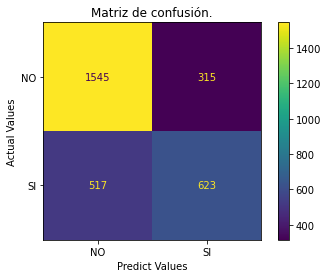

Precision,Recall,Accuracy,F1
0.66,0.55,0.72,0.60


In [8]:
from sklearn.tree import ExtraTreeClassifier
from sklearn.tree import DecisionTreeRegressor
#extra_tree_classifier = ExtraTreeClassifier(random_state=1)
#extra_tree_classifier.fit(X_train, y_train)

from sklearn.model_selection import GridSearchCV

parameters={"splitter":["best","random"],
            "max_depth" : [11,12,13,14,15,16],
           "min_samples_leaf":[1,2,3,4,5],
           "min_weight_fraction_leaf":[0, 0.1,0.2],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,10] }

grid = GridSearchCV(DecisionTreeClassifier(random_state=1), cv=3, n_jobs=-1, verbose=3,
                    param_grid =parameters
                    )

grid.fit(X_train, y_train)

print('Train Accuracy : %.3f'%grid.best_estimator_.score(X_train, y_train))
print('Test Accuracy : %.3f'%grid.best_estimator_.score(X_test, y_test))
print('Best Score Through Grid Search : %.3f'%grid.best_score_)
print('Best Parameters : ',grid.best_params_)

dt = DecisionTreeClassifier(max_depth=grid.best_params_['max_depth'], 
                            max_features=grid.best_params_['max_features'],
                            max_leaf_nodes=grid.best_params_['max_leaf_nodes'],
                            min_samples_leaf=grid.best_params_['min_samples_leaf'],
                            min_weight_fraction_leaf=grid.best_params_['min_weight_fraction_leaf'],
                            splitter=grid.best_params_['splitter']
)
dt.fit(X_train, y_train)

y_pred = dt.predict(X_test)
print('Best Parameters : ',grid.best_params_)
dt_precision_score, dt_recall_score, dt_accuracy_score, dt_f1_score = evaluate_model('Arboles de decision optimizado',y_test, y_pred)

Fitting 3 folds for each of 432 candidates, totalling 1296 fits


Train Accuracy : 0.988
Test Accuracy : 0.713
Best Score Through Grid Search : 0.698
Best Parameters :  {'bootstrap': False, 'max_depth': 15, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}


Random forest optimizado

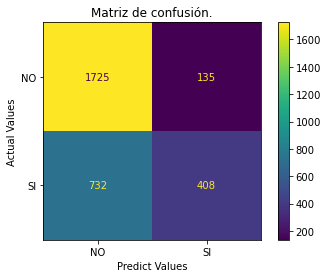

Precision,Recall,Accuracy,F1
0.75,0.36,0.71,0.48


In [9]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

param_grid = {
    'bootstrap': [True, False],
    'max_depth': [12,13,14,15],
    'max_features': ["auto", "sqrt", "log2"],
    'min_samples_leaf': [1,2,3],
    'min_samples_split': [2, 5 , 10],
    'n_estimators': [100, 200]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid = GridSearchCV(estimator = rf, param_grid = param_grid, cv = 3, n_jobs = -1, verbose = 2)
grid.fit(X_train, y_train)

print('Train Accuracy : %.3f'%grid.best_estimator_.score(X_train, y_train))
print('Test Accuracy : %.3f'%grid.best_estimator_.score(X_test, y_test))
print('Best Score Through Grid Search : %.3f'%grid.best_score_)
print('Best Parameters : ',grid.best_params_)

dt = RandomForestClassifier(bootstrap=grid.best_params_['bootstrap'], 
                            max_depth=grid.best_params_['max_depth'],
                            max_features=grid.best_params_['max_features'],
                            min_samples_leaf=grid.best_params_['min_samples_leaf'],
                            min_samples_split=grid.best_params_['min_samples_split'],
                            n_estimators=grid.best_params_['n_estimators']
)
dt.fit(X_train, y_train)
y_pred = dt.predict(X_test)
rf_precision_score, rf_recall_score, rf_accuracy_score, rf_f1_score = evaluate_model('Random forest optimizado', y_test, y_pred)


Fitting 5 folds for each of 30 candidates, totalling 150 fits


Train Accuracy : 0.625


Test Accuracy : 0.620
Best Score Through Grid Search : 0.624
Best Parameters :  {'C': 0.1, 'gamma': 0.001, 'kernel': 'rbf'}


rbf

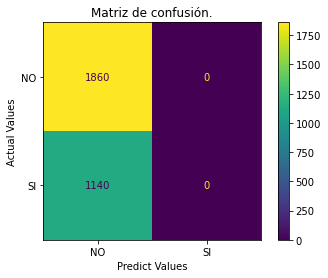

Precision,Recall,Accuracy,F1
0.00,0.00,0.62,0.00


Fitting 5 folds for each of 120 candidates, totalling 600 fits


Train Accuracy : 0.624


Test Accuracy : 0.620
Best Score Through Grid Search : 0.624
Best Parameters :  {'C': 0.01, 'coef0': 0.01, 'gamma': 1e-05, 'kernel': 'sigmoid'}


sigmoid

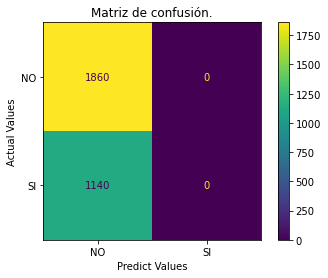

Precision,Recall,Accuracy,F1
0.00,0.00,0.62,0.00


In [10]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

#parameters = [{'kernel': ['rbf'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],'C': [0.001, 0.10, 0.1, 10 ]},
#              {'kernel': ['sigmoid'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],'C': [0.001, 0.10, 0.1, 10], 'coef0 ':[0,0.1,1]},
#              {'kernel': ['linear'], 'C': [0.001, 0.10, 0.1, 1]}     
#]

parameters = [{'kernel': ['rbf'], 'gamma': [1e-2,1e-3,1e-4,1e-5,1e-6],'C': [0.001,0.01,0.1,1,10,100]},
              {'kernel': ['sigmoid'], 'gamma': [1e-2,1e-3,1e-4,1e-5,1e-6],'C': [0.001,0.01,0.1,1,10,100],'coef0' : [0.01,0.1,1,10]},
              #{'kernel': ['linear'], 'C': [0.1,1,10,100]}
              ]

svm_precision_score_rbf=svm_recall_score_rbf=svm_accuracy_score_rbf=svm_f1_score_rbf=0
svm_precision_score_sigmoid=svm_recall_score_sigmoid=svm_accuracy_score_sigmoid=svm_f1_score_sigmoid=0
svm_precision_score_linear=svm_recall_score_linear=svm_accuracy_score_linear=svm_f1_score_linear=0
for parameter in parameters:
    param_grid = parameter
    grid = GridSearchCV(SVC(), param_grid, n_jobs = -1, verbose = 3)
    grid.fit(X_train, y_train)
    kernel_str = parameter['kernel'][0]
    y_pred = grid.predict(X_test)
    dt = grid
    
    print('Train Accuracy : %.3f'%grid.best_estimator_.score(X_train, y_train))
    print('Test Accuracy : %.3f'%grid.best_estimator_.score(X_test, y_test))
    print('Best Score Through Grid Search : %.3f'%grid.best_score_)
    print('Best Parameters : ',grid.best_params_)

    if parameter['kernel'][0] == 'rbf':
        svm_precision_score_rbf, svm_recall_score_rbf, svm_accuracy_score_rbf, svm_f1_score_rbf = evaluate_model(kernel_str, y_test, y_pred)
    if parameter['kernel'][0] == 'sigmoid':
        svm_precision_score_sigmoid, svm_recall_score_sigmoid, svm_accuracy_score_sigmoid, svm_f1_score_sigmoid = evaluate_model(kernel_str, y_test, y_pred)
    if parameter['kernel'][0] == 'linear':
        svm_precision_score_linear, svm_recall_score_linear, svm_accuracy_score_linear, svm_f1_score_linear = evaluate_model(kernel_str, y_test, y_pred)

In [11]:
import optuna  # pip install optuna
from sklearn.metrics import log_loss
from sklearn.model_selection import StratifiedKFold

from optuna.integration import LightGBMPruningCallback


def objective(trial, X, y):
    param_grid = {
        # "device_type": trial.suggest_categorical("device_type", ['gpu']),
        "n_estimators": trial.suggest_categorical("n_estimators", [10000]),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
        "num_leaves": trial.suggest_int("num_leaves", 8, 1023, step=10),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000, step=100),
        "lambda_l1": trial.suggest_float("lambda_l1", 0.0, 10),
        "lambda_l2": trial.suggest_float("lambda_l2", 0.0, 100),
        "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        "bagging_fraction": trial.suggest_float(
            "bagging_fraction", 0.2, 0.95, step=0.1
        ),
        "bagging_freq": trial.suggest_categorical("bagging_freq", [1]),
        "feature_fraction": trial.suggest_float(
            "feature_fraction", 0.2, 0.95, step=0.1
        ),
    }

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=1121218)

    cv_scores = np.empty(5)
    for idx, (train_idx, test_idx) in enumerate(cv.split(X, y)):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        model = lgb.LGBMClassifier(objective="binary", **param_grid)
        model.fit(
            X_train,
            y_train,
            eval_set=[(X_test, y_test)],
            eval_metric="binary_logloss",
            #eval_metric="auc",
            early_stopping_rounds=100,
            callbacks=[
                #LightGBMPruningCallback(trial, "auc")
                LightGBMPruningCallback(trial, "binary_logloss")
            ],  # Add a pruning callback
        )
        preds = model.predict_proba(X_test)
        cv_scores[idx] = log_loss(y_test, preds)

    return np.mean(cv_scores)


In [12]:
study = optuna.create_study(direction="minimize", study_name="LGBM Classifier")

#AUC -> maximixe
#study = optuna.create_study(direction="maximize", study_name="LGBM Classifier")
func = lambda trial: objective(trial, X, y)
study.optimize(func, n_trials=2000)


[I 2022-06-09 12:49:31,248] A new study created in memory with name: LGBM Classifier


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=6.581992962209513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.581992962209513
[LightGBM] [Warning] lambda_l1 is set=9.057836518590635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.057836518590635
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.9422040526339694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9422040526339694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=6.581992962209513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.581992962209513
[LightGBM] [Warning] lambda_l1 is set=9.057836518590635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.057836518590635
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.9422040526339694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9422040526339694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 12:49:32,053] Trial 0 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19712248033048863, 'num_leaves': 978, 'max_depth': 9, 'min_data_in_leaf': 5800, 'lambda_l1': 9.057836518590635, 'lambda_l2': 4.9422040526339694, 'min_gain_to_split': 6.581992962209513, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 0 with value: 0.662442284985339.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=6.581992962209513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.581992962209513
[LightGBM] [Warning] lambda_l1 is set=9.057836518590635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.057836518590635
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.9422040526339694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9422040526339694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=2.847918924262494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.847918924262494
[LightGBM] [Warning] lambda_l1 is set=8.741371004587396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.741371004587396
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=43.130569622297784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.130569622297784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=2.847918924262494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.847918924262494
[LightGBM] [Warning] lambda_l1 is set=8.741371004587396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.741371004587396
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=43.130569622297784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.130569622297784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 12:49:32,611] Trial 1 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14600031783712358, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 6200, 'lambda_l1': 8.741371004587396, 'lambda_l2': 43.130569622297784, 'min_gain_to_split': 2.847918924262494, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 0 with value: 0.662442284985339.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=2.847918924262494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.847918924262494
[LightGBM] [Warning] lambda_l1 is set=8.741371004587396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.741371004587396
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=43.130569622297784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.130569622297784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=11.293854364982122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.293854364982122
[LightGBM] [Warning] lambda_l1 is set=8.602155390910399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.602155390910399
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=78.21541410474089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.21541410474089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 12:49:33,179] Trial 2 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29768980940916046, 'num_leaves': 728, 'max_depth': 7, 'min_data_in_leaf': 9600, 'lambda_l1': 8.602155390910399, 'lambda_l2': 78.21541410474089, 'min_gain_to_split': 11.293854364982122, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 0 with value: 0.662442284985339.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=11.293854364982122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.293854364982122
[LightGBM] [Warning] lambda_l1 is set=8.602155390910399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.602155390910399
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=78.21541410474089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.21541410474089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=12.364469610302223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.364469610302223
[LightGBM] [Warning] lambda_l1 is set=9.177201463342087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.177201463342087
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=16.357764480906432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.357764480906432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will 

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=12.364469610302223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.364469610302223
[LightGBM] [Warning] lambda_l1 is set=9.177201463342087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.177201463342087
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=16.357764480906432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.357764480906432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will 

[I 2022-06-09 12:49:33,884] Trial 3 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15459801749761543, 'num_leaves': 168, 'max_depth': 7, 'min_data_in_leaf': 3700, 'lambda_l1': 9.177201463342087, 'lambda_l2': 16.357764480906432, 'min_gain_to_split': 12.364469610302223, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 0 with value: 0.662442284985339.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=12.364469610302223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.364469610302223
[LightGBM] [Warning] lambda_l1 is set=9.177201463342087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.177201463342087
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=16.357764480906432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.357764480906432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will 

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=2.9668922443444345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9668922443444345
[LightGBM] [Warning] lambda_l1 is set=7.838184374174459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.838184374174459
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.992206013080315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.992206013080315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=2.9668922443444345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9668922443444345
[LightGBM] [Warning] lambda_l1 is set=7.838184374174459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.838184374174459
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.992206013080315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.992206013080315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 12:49:34,668] Trial 4 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03935687006954297, 'num_leaves': 738, 'max_depth': 8, 'min_data_in_leaf': 5400, 'lambda_l1': 7.838184374174459, 'lambda_l2': 6.992206013080315, 'min_gain_to_split': 2.9668922443444345, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 0 with value: 0.662442284985339.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=6.2384430595065155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.2384430595065155
[LightGBM] [Warning] lambda_l1 is set=1.9549282471246177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9549282471246177
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=84.39827480503853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.39827480503853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=6.2384430595065155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.2384430595065155
[LightGBM] [Warning] lambda_l1 is set=1.9549282471246177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9549282471246177
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=84.39827480503853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.39827480503853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-09 12:49:35,418] Trial 5 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06497057418990866, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 4500, 'lambda_l1': 1.9549282471246177, 'lambda_l2': 84.39827480503853, 'min_gain_to_split': 6.2384430595065155, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 0 with value: 0.662442284985339.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=6.2384430595065155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.2384430595065155
[LightGBM] [Warning] lambda_l1 is set=1.9549282471246177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9549282471246177
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=84.39827480503853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.39827480503853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=8.228710129945743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.228710129945743
[LightGBM] [Warning] lambda_l1 is set=2.5332073755925166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5332073755925166
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.721039214888151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.721039214888151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=8.228710129945743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.228710129945743
[LightGBM] [Warning] lambda_l1 is set=2.5332073755925166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5332073755925166
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.721039214888151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.721039214888151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=8.228710129945743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.228710129945743
[LightGBM] [Warning] lambda_l1 is set=2.5332073755925166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5332073755925166
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.721039214888151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.721039214888151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=8.228710129945743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.228710129945743
[LightGBM] [Warning] lambda_l1 is set=2.5332073755925166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5332073755925166
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.721039214888151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.721039214888151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:49:40,865] Trial 6 finished with value: 0.6176630161458831 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08784366157151043, 'num_leaves': 228, 'max_depth': 6, 'min_data_in_leaf': 3400, 'lambda_l1': 2.5332073755925166, 'lambda_l2': 10.721039214888151, 'min_gain_to_split': 8.228710129945743, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 6 with value: 0.6176630161458831.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=9.9260180295319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.9260180295319
[LightGBM] [Warning] lambda_l1 is set=3.6087673253007435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6087673253007435
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=75.72997501029978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.72997501029978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=9.9260180295319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.9260180295319
[LightGBM] [Warning] lambda_l1 is set=3.6087673253007435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6087673253007435
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=75.72997501029978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.72997501029978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-09 12:49:41,582] Trial 7 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06094192914198241, 'num_leaves': 888, 'max_depth': 6, 'min_data_in_leaf': 5800, 'lambda_l1': 3.6087673253007435, 'lambda_l2': 75.72997501029978, 'min_gain_to_split': 9.9260180295319, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 6 with value: 0.6176630161458831.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=9.9260180295319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.9260180295319
[LightGBM] [Warning] lambda_l1 is set=3.6087673253007435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6087673253007435
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=75.72997501029978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.72997501029978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=11.99420695000763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.99420695000763
[LightGBM] [Warning] lambda_l1 is set=5.728152700215871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.728152700215871
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=44.02439651858073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.02439651858073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=11.99420695000763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.99420695000763
[LightGBM] [Warning] lambda_l1 is set=5.728152700215871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.728152700215871
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=44.02439651858073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.02439651858073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=11.99420695000763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.99420695000763
[LightGBM] [Warning] lambda_l1 is set=5.728152700215871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.728152700215871
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=44.02439651858073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.02439651858073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=11.99420695000763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.99420695000763
[LightGBM] [Warning] lambda_l1 is set=5.728152700215871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.728152700215871
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=44.02439651858073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.02439651858073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:49:46,903] Trial 8 finished with value: 0.6008540132587268 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06614663587789628, 'num_leaves': 778, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 5.728152700215871, 'lambda_l2': 44.02439651858073, 'min_gain_to_split': 11.99420695000763, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 8 with value: 0.6008540132587268.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=4.829561873059559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.829561873059559
[LightGBM] [Warning] lambda_l1 is set=8.64255425479896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.64255425479896
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=13.569248606457428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.569248606457428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=4.829561873059559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.829561873059559
[LightGBM] [Warning] lambda_l1 is set=8.64255425479896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.64255425479896
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=13.569248606457428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.569248606457428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0

[I 2022-06-09 12:49:47,662] Trial 9 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043938778940801275, 'num_leaves': 268, 'max_depth': 9, 'min_data_in_leaf': 3100, 'lambda_l1': 8.64255425479896, 'lambda_l2': 13.569248606457428, 'min_gain_to_split': 4.829561873059559, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 8 with value: 0.6008540132587268.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=4.829561873059559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.829561873059559
[LightGBM] [Warning] lambda_l1 is set=8.64255425479896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.64255425479896
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=13.569248606457428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.569248606457428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0

[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=14.546570945754958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.546570945754958
[LightGBM] [Warning] lambda_l1 is set=5.81938932328319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.81938932328319
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=44.04469595697702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.04469595697702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=14.546570945754958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.546570945754958
[LightGBM] [Warning] lambda_l1 is set=5.81938932328319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.81938932328319
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=44.04469595697702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.04469595697702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=14.546570945754958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.546570945754958
[LightGBM] [Warning] lambda_l1 is set=5.81938932328319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.81938932328319
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=44.04469595697702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.04469595697702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=14.546570945754958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.546570945754958
[LightGBM] [Warning] lambda_l1 is set=5.81938932328319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.81938932328319
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=44.04469595697702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.04469595697702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:49:48,846] Trial 10 finished with value: 0.6120393495119838 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2246715630904516, 'num_leaves': 418, 'max_depth': 3, 'min_data_in_leaf': 300, 'lambda_l1': 5.81938932328319, 'lambda_l2': 44.04469595697702, 'min_gain_to_split': 14.546570945754958, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 8 with value: 0.6008540132587268.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=14.546570945754958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.546570945754958
[LightGBM] [Warning] lambda_l1 is set=5.81938932328319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.81938932328319
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=44.04469595697702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.04469595697702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.625256853123268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.625256853123268
[LightGBM] [Warning] lambda_l1 is set=5.942795933121897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.942795933121897
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=43.87956666407247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.87956666407247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.625256853123268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.625256853123268
[LightGBM] [Warning] lambda_l1 is set=5.942795933121897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.942795933121897
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=43.87956666407247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.87956666407247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.625256853123268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.625256853123268
[LightGBM] [Warning] lambda_l1 is set=5.942795933121897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.942795933121897
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=43.87956666407247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.87956666407247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.625256853123268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.625256853123268
[LightGBM] [Warning] lambda_l1 is set=5.942795933121897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.942795933121897
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=43.87956666407247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.87956666407247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:49:50,236] Trial 11 finished with value: 0.6089084480413909 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23707735327971735, 'num_leaves': 448, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 5.942795933121897, 'lambda_l2': 43.87956666407247, 'min_gain_to_split': 14.625256853123268, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 8 with value: 0.6008540132587268.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.625256853123268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.625256853123268
[LightGBM] [Warning] lambda_l1 is set=5.942795933121897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.942795933121897
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=43.87956666407247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.87956666407247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.990302324879451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.990302324879451
[LightGBM] [Warning] lambda_l1 is set=5.888033794762222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.888033794762222
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=60.402434311275734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.402434311275734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.990302324879451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.990302324879451
[LightGBM] [Warning] lambda_l1 is set=5.888033794762222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.888033794762222
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=60.402434311275734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.402434311275734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.990302324879451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.990302324879451
[LightGBM] [Warning] lambda_l1 is set=5.888033794762222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.888033794762222
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=60.402434311275734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.402434311275734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.990302324879451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.990302324879451
[LightGBM] [Warning] lambda_l1 is set=5.888033794762222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.888033794762222
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=60.402434311275734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.402434311275734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:49:51,419] Trial 12 finished with value: 0.6120583906026091 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27787322770449796, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.888033794762222, 'lambda_l2': 60.402434311275734, 'min_gain_to_split': 14.990302324879451, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 8 with value: 0.6008540132587268.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.990302324879451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.990302324879451
[LightGBM] [Warning] lambda_l1 is set=5.888033794762222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.888033794762222
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=60.402434311275734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.402434311275734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=12.911386168956103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.911386168956103
[LightGBM] [Warning] lambda_l1 is set=0.3113245900444488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3113245900444488
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=31.139655437981702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.139655437981702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 w

[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=12.911386168956103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.911386168956103
[LightGBM] [Warning] lambda_l1 is set=0.3113245900444488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3113245900444488
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=31.139655437981702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.139655437981702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=12.911386168956103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.911386168956103
[LightGBM] [Warning] lambda_l1 is set=0.3113245900444488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3113245900444488
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=31.139655437981702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.139655437981702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=12.911386168956103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.911386168956103
[LightGBM] [Warning] lambda_l1 is set=0.3113245900444488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3113245900444488
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=31.139655437981702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.139655437981702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:49:52,941] Trial 13 finished with value: 0.6702444077129219 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10344290001844143, 'num_leaves': 548, 'max_depth': 3, 'min_data_in_leaf': 1800, 'lambda_l1': 0.3113245900444488, 'lambda_l2': 31.139655437981702, 'min_gain_to_split': 12.911386168956103, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 8 with value: 0.6008540132587268.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=12.911386168956103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.911386168956103
[LightGBM] [Warning] lambda_l1 is set=0.3113245900444488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3113245900444488
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=31.139655437981702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.139655437981702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=9.403530946553007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.403530946553007
[LightGBM] [Warning] lambda_l1 is set=6.492170204178938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.492170204178938
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=99.73017234173425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.73017234173425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=9.403530946553007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.403530946553007
[LightGBM] [Warning] lambda_l1 is set=6.492170204178938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.492170204178938
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=99.73017234173425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.73017234173425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0

[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=9.403530946553007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.403530946553007
[LightGBM] [Warning] lambda_l1 is set=6.492170204178938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.492170204178938
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=99.73017234173425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.73017234173425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=9.403530946553007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.403530946553007
[LightGBM] [Warning] lambda_l1 is set=6.492170204178938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.492170204178938
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=99.73017234173425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.73017234173425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0

[I 2022-06-09 12:49:54,004] Trial 14 finished with value: 0.6704471592515759 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22933295890588687, 'num_leaves': 538, 'max_depth': 4, 'min_data_in_leaf': 1800, 'lambda_l1': 6.492170204178938, 'lambda_l2': 99.73017234173425, 'min_gain_to_split': 9.403530946553007, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 8 with value: 0.6008540132587268.


[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=9.403530946553007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.403530946553007
[LightGBM] [Warning] lambda_l1 is set=6.492170204178938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.492170204178938
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=99.73017234173425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.73017234173425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.5331714227140285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5331714227140285
[LightGBM] [Warning] lambda_l1 is set=4.346985560304498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.346985560304498
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=58.86547686218482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.86547686218482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.5331714227140285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5331714227140285
[LightGBM] [Warning] lambda_l1 is set=4.346985560304498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.346985560304498
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=58.86547686218482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.86547686218482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.5331714227140285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5331714227140285
[LightGBM] [Warning] lambda_l1 is set=4.346985560304498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.346985560304498
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=58.86547686218482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.86547686218482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.5331714227140285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5331714227140285
[LightGBM] [Warning] lambda_l1 is set=4.346985560304498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.346985560304498
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=58.86547686218482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.86547686218482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.5331714227140285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5331714227140285
[LightGBM] [Warning] lambda_l1 is set=4.346985560304498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.346985560304498
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=58.86547686218482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.86547686218482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:49:57,507] Trial 15 finished with value: 0.6128216749244412 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1256570800161384, 'num_leaves': 28, 'max_depth': 11, 'min_data_in_leaf': 1700, 'lambda_l1': 4.346985560304498, 'lambda_l2': 58.86547686218482, 'min_gain_to_split': 0.5331714227140285, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 8 with value: 0.6008540132587268.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=13.335343102463629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.335343102463629
[LightGBM] [Warning] lambda_l1 is set=7.414242950641118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.414242950641118
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.34408878800494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.34408878800494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=13.335343102463629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.335343102463629
[LightGBM] [Warning] lambda_l1 is set=7.414242950641118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.414242950641118
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.34408878800494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.34408878800494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 12:49:58,151] Trial 16 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19753163611463304, 'num_leaves': 878, 'max_depth': 5, 'min_data_in_leaf': 7600, 'lambda_l1': 7.414242950641118, 'lambda_l2': 31.34408878800494, 'min_gain_to_split': 13.335343102463629, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 8 with value: 0.6008540132587268.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=13.335343102463629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.335343102463629
[LightGBM] [Warning] lambda_l1 is set=7.414242950641118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.414242950641118
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.34408878800494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.34408878800494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Curr

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=10.703180780632625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.703180780632625
[LightGBM] [Warning] lambda_l1 is set=4.674436300274356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.674436300274356
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=29.385690246236468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.385690246236468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=10.703180780632625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.703180780632625
[LightGBM] [Warning] lambda_l1 is set=4.674436300274356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.674436300274356
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=29.385690246236468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.385690246236468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=10.703180780632625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.703180780632625
[LightGBM] [Warning] lambda_l1 is set=4.674436300274356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.674436300274356
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=29.385690246236468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.385690246236468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=10.703180780632625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.703180780632625
[LightGBM] [Warning] lambda_l1 is set=4.674436300274356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.674436300274356
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=29.385690246236468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.385690246236468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:50:03,094] Trial 17 finished with value: 0.6621423182135737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021025259591897036, 'num_leaves': 348, 'max_depth': 10, 'min_data_in_leaf': 1100, 'lambda_l1': 4.674436300274356, 'lambda_l2': 29.385690246236468, 'min_gain_to_split': 10.703180780632625, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 8 with value: 0.6008540132587268.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=11.777998561733884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.777998561733884
[LightGBM] [Warning] lambda_l1 is set=6.820695353955049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.820695353955049
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=56.14396578887742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.14396578887742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=11.777998561733884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.777998561733884
[LightGBM] [Warning] lambda_l1 is set=6.820695353955049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.820695353955049
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=56.14396578887742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.14396578887742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0

[I 2022-06-09 12:50:03,955] Trial 18 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25784909970570663, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 2700, 'lambda_l1': 6.820695353955049, 'lambda_l2': 56.14396578887742, 'min_gain_to_split': 11.777998561733884, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 8 with value: 0.6008540132587268.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=11.777998561733884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.777998561733884
[LightGBM] [Warning] lambda_l1 is set=6.820695353955049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.820695353955049
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=56.14396578887742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.14396578887742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=13.772984605323566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.772984605323566
[LightGBM] [Warning] lambda_l1 is set=3.4634041598582472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4634041598582472
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=47.299892110618096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.299892110618096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=13.772984605323566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.772984605323566
[LightGBM] [Warning] lambda_l1 is set=3.4634041598582472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4634041598582472
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=47.299892110618096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.299892110618096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=13.772984605323566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.772984605323566
[LightGBM] [Warning] lambda_l1 is set=3.4634041598582472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4634041598582472
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=47.299892110618096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.299892110618096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=13.772984605323566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.772984605323566
[LightGBM] [Warning] lambda_l1 is set=3.4634041598582472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4634041598582472
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=47.299892110618096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.299892110618096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=13.772984605323566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.772984605323566
[LightGBM] [Warning] lambda_l1 is set=3.4634041598582472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4634041598582472
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=47.299892110618096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.299892110618096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:50:05,725] Trial 19 finished with value: 0.6001641757673574 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17810267364767798, 'num_leaves': 588, 'max_depth': 4, 'min_data_in_leaf': 900, 'lambda_l1': 3.4634041598582472, 'lambda_l2': 47.299892110618096, 'min_gain_to_split': 13.772984605323566, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 19 with value: 0.6001641757673574.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=8.646543400439455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.646543400439455
[LightGBM] [Warning] lambda_l1 is set=3.1418032771612414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1418032771612414
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=70.3844945554832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.3844945554832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=8.646543400439455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.646543400439455
[LightGBM] [Warning] lambda_l1 is set=3.1418032771612414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1418032771612414
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=70.3844945554832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.3844945554832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 12:50:06,555] Trial 20 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1939818583339911, 'num_leaves': 858, 'max_depth': 5, 'min_data_in_leaf': 4400, 'lambda_l1': 3.1418032771612414, 'lambda_l2': 70.3844945554832, 'min_gain_to_split': 8.646543400439455, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 19 with value: 0.6001641757673574.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=8.646543400439455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.646543400439455
[LightGBM] [Warning] lambda_l1 is set=3.1418032771612414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1418032771612414
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=70.3844945554832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.3844945554832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=14.014178662046099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.014178662046099
[LightGBM] [Warning] lambda_l1 is set=5.383975274863821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.383975274863821
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=43.985683529057845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.985683529057845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=14.014178662046099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.014178662046099
[LightGBM] [Warning] lambda_l1 is set=5.383975274863821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.383975274863821
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=43.985683529057845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.985683529057845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=14.014178662046099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.014178662046099
[LightGBM] [Warning] lambda_l1 is set=5.383975274863821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.383975274863821
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=43.985683529057845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.985683529057845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=14.014178662046099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.014178662046099
[LightGBM] [Warning] lambda_l1 is set=5.383975274863821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.383975274863821
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=43.985683529057845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.985683529057845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=14.014178662046099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.014178662046099
[LightGBM] [Warning] lambda_l1 is set=5.383975274863821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.383975274863821
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=43.985683529057845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.985683529057845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:50:08,373] Trial 21 finished with value: 0.6025289869574312 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1737177540119127, 'num_leaves': 578, 'max_depth': 4, 'min_data_in_leaf': 1000, 'lambda_l1': 5.383975274863821, 'lambda_l2': 43.985683529057845, 'min_gain_to_split': 14.014178662046099, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 19 with value: 0.6001641757673574.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=13.574206309957452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.574206309957452
[LightGBM] [Warning] lambda_l1 is set=5.176280948671121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.176280948671121
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=24.033985273287136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.033985273287136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=13.574206309957452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.574206309957452
[LightGBM] [Warning] lambda_l1 is set=5.176280948671121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.176280948671121
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=24.033985273287136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.033985273287136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=13.574206309957452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.574206309957452
[LightGBM] [Warning] lambda_l1 is set=5.176280948671121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.176280948671121
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=24.033985273287136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.033985273287136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=13.574206309957452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.574206309957452
[LightGBM] [Warning] lambda_l1 is set=5.176280948671121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.176280948671121
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=24.033985273287136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.033985273287136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:50:09,628] Trial 22 finished with value: 0.6702079359639482 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17644809721037216, 'num_leaves': 608, 'max_depth': 4, 'min_data_in_leaf': 2300, 'lambda_l1': 5.176280948671121, 'lambda_l2': 24.033985273287136, 'min_gain_to_split': 13.574206309957452, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 19 with value: 0.6001641757673574.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=13.574206309957452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.574206309957452
[LightGBM] [Warning] lambda_l1 is set=5.176280948671121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.176280948671121
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=24.033985273287136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.033985273287136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=10.857647587951082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.857647587951082
[LightGBM] [Warning] lambda_l1 is set=1.4006101689444064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4006101689444064
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=51.53477714339962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.53477714339962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=10.857647587951082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.857647587951082
[LightGBM] [Warning] lambda_l1 is set=1.4006101689444064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4006101689444064
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=51.53477714339962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.53477714339962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=10.857647587951082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.857647587951082
[LightGBM] [Warning] lambda_l1 is set=1.4006101689444064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4006101689444064
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=51.53477714339962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.53477714339962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=10.857647587951082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.857647587951082
[LightGBM] [Warning] lambda_l1 is set=1.4006101689444064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4006101689444064
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=51.53477714339962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.53477714339962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=10.857647587951082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.857647587951082
[LightGBM] [Warning] lambda_l1 is set=1.4006101689444064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4006101689444064
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=51.53477714339962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.53477714339962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:50:12,354] Trial 23 finished with value: 0.5901556509333487 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12698037569281898, 'num_leaves': 818, 'max_depth': 4, 'min_data_in_leaf': 1100, 'lambda_l1': 1.4006101689444064, 'lambda_l2': 51.53477714339962, 'min_gain_to_split': 10.857647587951082, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 23 with value: 0.5901556509333487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=10.41292275144836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.41292275144836
[LightGBM] [Warning] lambda_l1 is set=1.1364229846677691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1364229846677691
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.07272995876994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.07272995876994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=10.41292275144836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.41292275144836
[LightGBM] [Warning] lambda_l1 is set=1.1364229846677691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1364229846677691
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.07272995876994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.07272995876994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=10.41292275144836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.41292275144836
[LightGBM] [Warning] lambda_l1 is set=1.1364229846677691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1364229846677691
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.07272995876994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.07272995876994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=10.41292275144836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.41292275144836
[LightGBM] [Warning] lambda_l1 is set=1.1364229846677691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1364229846677691
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.07272995876994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.07272995876994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=10.41292275144836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.41292275144836
[LightGBM] [Warning] lambda_l1 is set=1.1364229846677691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1364229846677691
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.07272995876994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.07272995876994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:50:15,726] Trial 24 finished with value: 0.5905967143667363 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12030080672537206, 'num_leaves': 818, 'max_depth': 5, 'min_data_in_leaf': 1500, 'lambda_l1': 1.1364229846677691, 'lambda_l2': 52.07272995876994, 'min_gain_to_split': 10.41292275144836, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 23 with value: 0.5901556509333487.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=10.787164298623066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.787164298623066
[LightGBM] [Warning] lambda_l1 is set=0.8377294350249861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8377294350249861
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.28389845508904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.28389845508904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=10.787164298623066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.787164298623066
[LightGBM] [Warning] lambda_l1 is set=0.8377294350249861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8377294350249861
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.28389845508904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.28389845508904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=10.787164298623066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.787164298623066
[LightGBM] [Warning] lambda_l1 is set=0.8377294350249861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8377294350249861
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.28389845508904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.28389845508904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=10.787164298623066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.787164298623066
[LightGBM] [Warning] lambda_l1 is set=0.8377294350249861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8377294350249861
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.28389845508904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.28389845508904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=10.787164298623066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.787164298623066
[LightGBM] [Warning] lambda_l1 is set=0.8377294350249861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8377294350249861
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.28389845508904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.28389845508904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:50:19,506] Trial 25 finished with value: 0.6145892636458532 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11916525088397299, 'num_leaves': 938, 'max_depth': 5, 'min_data_in_leaf': 2400, 'lambda_l1': 0.8377294350249861, 'lambda_l2': 65.28389845508904, 'min_gain_to_split': 10.787164298623066, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 23 with value: 0.5901556509333487.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=9.762757210243318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.762757210243318
[LightGBM] [Warning] lambda_l1 is set=1.337552283662168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.337552283662168
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.68583984748961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.68583984748961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=9.762757210243318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.762757210243318
[LightGBM] [Warning] lambda_l1 is set=1.337552283662168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.337552283662168
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.68583984748961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.68583984748961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=9.762757210243318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.762757210243318
[LightGBM] [Warning] lambda_l1 is set=1.337552283662168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.337552283662168
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.68583984748961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.68583984748961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=9.762757210243318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.762757210243318
[LightGBM] [Warning] lambda_l1 is set=1.337552283662168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.337552283662168
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.68583984748961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.68583984748961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=9.762757210243318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.762757210243318
[LightGBM] [Warning] lambda_l1 is set=1.337552283662168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.337552283662168
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.68583984748961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.68583984748961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:50:22,289] Trial 26 finished with value: 0.5787549332745885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12110046104921937, 'num_leaves': 828, 'max_depth': 4, 'min_data_in_leaf': 1000, 'lambda_l1': 1.337552283662168, 'lambda_l2': 52.68583984748961, 'min_gain_to_split': 9.762757210243318, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 26 with value: 0.5787549332745885.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=9.656076679908438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.656076679908438
[LightGBM] [Warning] lambda_l1 is set=1.6366050384895805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6366050384895805
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.5897597756966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.5897597756966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=9.656076679908438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.656076679908438
[LightGBM] [Warning] lambda_l1 is set=1.6366050384895805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6366050384895805
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.5897597756966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.5897597756966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 12:50:22,935] Trial 27 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12513084819250017, 'num_leaves': 1018, 'max_depth': 5, 'min_data_in_leaf': 7000, 'lambda_l1': 1.6366050384895805, 'lambda_l2': 51.5897597756966, 'min_gain_to_split': 9.656076679908438, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 26 with value: 0.5787549332745885.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=9.656076679908438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.656076679908438
[LightGBM] [Warning] lambda_l1 is set=1.6366050384895805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6366050384895805
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.5897597756966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.5897597756966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=7.426486115828299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.426486115828299
[LightGBM] [Warning] lambda_l1 is set=1.184331460666654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.184331460666654
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.968124784384344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.968124784384344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=7.426486115828299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.426486115828299
[LightGBM] [Warning] lambda_l1 is set=1.184331460666654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.184331460666654
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.968124784384344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.968124784384344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=7.426486115828299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.426486115828299
[LightGBM] [Warning] lambda_l1 is set=1.184331460666654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.184331460666654
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.968124784384344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.968124784384344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=7.426486115828299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.426486115828299
[LightGBM] [Warning] lambda_l1 is set=1.184331460666654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.184331460666654
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.968124784384344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.968124784384344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:50:25,241] Trial 28 finished with value: 0.6347539010838409 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08799063799247576, 'num_leaves': 818, 'max_depth': 3, 'min_data_in_leaf': 4200, 'lambda_l1': 1.184331460666654, 'lambda_l2': 35.968124784384344, 'min_gain_to_split': 7.426486115828299, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 26 with value: 0.5787549332745885.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=6.177994571520518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.177994571520518
[LightGBM] [Warning] lambda_l1 is set=0.12055813906842427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12055813906842427
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=53.63788043273744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.63788043273744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will 

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=6.177994571520518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.177994571520518
[LightGBM] [Warning] lambda_l1 is set=0.12055813906842427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12055813906842427
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=53.63788043273744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.63788043273744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will 

[I 2022-06-09 12:50:25,906] Trial 29 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1384738092630728, 'num_leaves': 968, 'max_depth': 8, 'min_data_in_leaf': 9100, 'lambda_l1': 0.12055813906842427, 'lambda_l2': 53.63788043273744, 'min_gain_to_split': 6.177994571520518, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 26 with value: 0.5787549332745885.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=6.177994571520518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.177994571520518
[LightGBM] [Warning] lambda_l1 is set=0.12055813906842427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12055813906842427
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=53.63788043273744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.63788043273744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=8.114223348228215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.114223348228215
[LightGBM] [Warning] lambda_l1 is set=2.405227251850478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.405227251850478
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=89.2131206602514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.2131206602514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=8.114223348228215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.114223348228215
[LightGBM] [Warning] lambda_l1 is set=2.405227251850478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.405227251850478
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=89.2131206602514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.2131206602514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=8.114223348228215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.114223348228215
[LightGBM] [Warning] lambda_l1 is set=2.405227251850478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.405227251850478
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=89.2131206602514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.2131206602514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=8.114223348228215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.114223348228215
[LightGBM] [Warning] lambda_l1 is set=2.405227251850478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.405227251850478
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=89.2131206602514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.2131206602514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=8.114223348228215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.114223348228215
[LightGBM] [Warning] lambda_l1 is set=2.405227251850478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.405227251850478
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=89.2131206602514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.2131206602514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:50:29,132] Trial 30 finished with value: 0.581663366049434 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16463903385252093, 'num_leaves': 808, 'max_depth': 6, 'min_data_in_leaf': 1700, 'lambda_l1': 2.405227251850478, 'lambda_l2': 89.2131206602514, 'min_gain_to_split': 8.114223348228215, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 26 with value: 0.5787549332745885.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=7.86283722615888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.86283722615888
[LightGBM] [Warning] lambda_l1 is set=2.305373572980569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.305373572980569
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=98.46645957482455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.46645957482455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=7.86283722615888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.86283722615888
[LightGBM] [Warning] lambda_l1 is set=2.305373572980569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.305373572980569
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=98.46645957482455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.46645957482455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=7.86283722615888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.86283722615888
[LightGBM] [Warning] lambda_l1 is set=2.305373572980569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.305373572980569
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=98.46645957482455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.46645957482455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=7.86283722615888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.86283722615888
[LightGBM] [Warning] lambda_l1 is set=2.305373572980569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.305373572980569
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=98.46645957482455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.46645957482455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=7.86283722615888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.86283722615888
[LightGBM] [Warning] lambda_l1 is set=2.305373572980569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.305373572980569
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=98.46645957482455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.46645957482455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:50:32,963] Trial 31 finished with value: 0.5808854139200283 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10188378575718668, 'num_leaves': 808, 'max_depth': 6, 'min_data_in_leaf': 1600, 'lambda_l1': 2.305373572980569, 'lambda_l2': 98.46645957482455, 'min_gain_to_split': 7.86283722615888, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 26 with value: 0.5787549332745885.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=7.117540732589225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.117540732589225
[LightGBM] [Warning] lambda_l1 is set=2.416810754482173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.416810754482173
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=88.25598193278441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.25598193278441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=7.117540732589225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.117540732589225
[LightGBM] [Warning] lambda_l1 is set=2.416810754482173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.416810754482173
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=88.25598193278441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.25598193278441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=7.117540732589225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.117540732589225
[LightGBM] [Warning] lambda_l1 is set=2.416810754482173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.416810754482173
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=88.25598193278441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.25598193278441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=7.117540732589225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.117540732589225
[LightGBM] [Warning] lambda_l1 is set=2.416810754482173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.416810754482173
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=88.25598193278441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.25598193278441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=7.117540732589225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.117540732589225
[LightGBM] [Warning] lambda_l1 is set=2.416810754482173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.416810754482173
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=88.25598193278441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.25598193278441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:50:37,310] Trial 32 finished with value: 0.5967857489627875 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09161242861564509, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 2700, 'lambda_l1': 2.416810754482173, 'lambda_l2': 88.25598193278441, 'min_gain_to_split': 7.117540732589225, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 26 with value: 0.5787549332745885.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=8.801596904670724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.801596904670724
[LightGBM] [Warning] lambda_l1 is set=2.719036154012612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.719036154012612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.6131473122026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.6131473122026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=8.801596904670724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.801596904670724
[LightGBM] [Warning] lambda_l1 is set=2.719036154012612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.719036154012612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.6131473122026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.6131473122026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=8.801596904670724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.801596904670724
[LightGBM] [Warning] lambda_l1 is set=2.719036154012612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.719036154012612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.6131473122026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.6131473122026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=8.801596904670724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.801596904670724
[LightGBM] [Warning] lambda_l1 is set=2.719036154012612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.719036154012612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.6131473122026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.6131473122026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=8.801596904670724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.801596904670724
[LightGBM] [Warning] lambda_l1 is set=2.719036154012612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.719036154012612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.6131473122026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.6131473122026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:50:39,962] Trial 33 finished with value: 0.5880490436733468 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14870969402583714, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 2200, 'lambda_l1': 2.719036154012612, 'lambda_l2': 96.6131473122026, 'min_gain_to_split': 8.801596904670724, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 26 with value: 0.5787549332745885.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=5.272641042316282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.272641042316282
[LightGBM] [Warning] lambda_l1 is set=2.781349076833003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.781349076833003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.96740334926511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.96740334926511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=5.272641042316282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.272641042316282
[LightGBM] [Warning] lambda_l1 is set=2.781349076833003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.781349076833003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.96740334926511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.96740334926511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=5.272641042316282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.272641042316282
[LightGBM] [Warning] lambda_l1 is set=2.781349076833003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.781349076833003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.96740334926511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.96740334926511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=5.272641042316282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.272641042316282
[LightGBM] [Warning] lambda_l1 is set=2.781349076833003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.781349076833003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.96740334926511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.96740334926511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=5.272641042316282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.272641042316282
[LightGBM] [Warning] lambda_l1 is set=2.781349076833003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.781349076833003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.96740334926511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.96740334926511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:50:44,308] Trial 34 finished with value: 0.6102116743411259 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15222324190575837, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 3700, 'lambda_l1': 2.781349076833003, 'lambda_l2': 99.96740334926511, 'min_gain_to_split': 5.272641042316282, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 26 with value: 0.5787549332745885.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=8.492696433447088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.492696433447088
[LightGBM] [Warning] lambda_l1 is set=4.30177432256036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.30177432256036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.97181467545212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.97181467545212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=8.492696433447088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.492696433447088
[LightGBM] [Warning] lambda_l1 is set=4.30177432256036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.30177432256036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.97181467545212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.97181467545212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=8.492696433447088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.492696433447088
[LightGBM] [Warning] lambda_l1 is set=4.30177432256036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.30177432256036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.97181467545212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.97181467545212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=8.492696433447088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.492696433447088
[LightGBM] [Warning] lambda_l1 is set=4.30177432256036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.30177432256036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.97181467545212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.97181467545212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=8.492696433447088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.492696433447088
[LightGBM] [Warning] lambda_l1 is set=4.30177432256036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.30177432256036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.97181467545212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.97181467545212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:50:46,851] Trial 35 finished with value: 0.5873236116998568 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16296085170386182, 'num_leaves': 988, 'max_depth': 8, 'min_data_in_leaf': 2200, 'lambda_l1': 4.30177432256036, 'lambda_l2': 89.97181467545212, 'min_gain_to_split': 8.492696433447088, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 26 with value: 0.5787549332745885.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=8.189177629621819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.189177629621819
[LightGBM] [Warning] lambda_l1 is set=3.849814946807722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.849814946807722
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=91.52304416016145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.52304416016145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=8.189177629621819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.189177629621819
[LightGBM] [Warning] lambda_l1 is set=3.849814946807722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.849814946807722
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=91.52304416016145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.52304416016145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=8.189177629621819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.189177629621819
[LightGBM] [Warning] lambda_l1 is set=3.849814946807722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.849814946807722
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=91.52304416016145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.52304416016145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=8.189177629621819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.189177629621819
[LightGBM] [Warning] lambda_l1 is set=3.849814946807722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.849814946807722
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=91.52304416016145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.52304416016145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=8.189177629621819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.189177629621819
[LightGBM] [Warning] lambda_l1 is set=3.849814946807722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.849814946807722
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=91.52304416016145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.52304416016145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:50:50,548] Trial 36 finished with value: 0.6094792770734188 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16557754580660541, 'num_leaves': 1018, 'max_depth': 9, 'min_data_in_leaf': 2800, 'lambda_l1': 3.849814946807722, 'lambda_l2': 91.52304416016145, 'min_gain_to_split': 8.189177629621819, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 26 with value: 0.5787549332745885.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=5.058325954529893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.058325954529893
[LightGBM] [Warning] lambda_l1 is set=2.055964063147519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.055964063147519
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=82.12487257071993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.12487257071993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=5.058325954529893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.058325954529893
[LightGBM] [Warning] lambda_l1 is set=2.055964063147519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.055964063147519
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=82.12487257071993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.12487257071993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=5.058325954529893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.058325954529893
[LightGBM] [Warning] lambda_l1 is set=2.055964063147519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.055964063147519
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=82.12487257071993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.12487257071993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=5.058325954529893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.058325954529893
[LightGBM] [Warning] lambda_l1 is set=2.055964063147519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.055964063147519
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=82.12487257071993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.12487257071993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=5.058325954529893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.058325954529893
[LightGBM] [Warning] lambda_l1 is set=2.055964063147519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.055964063147519
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=82.12487257071993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.12487257071993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:50:56,472] Trial 37 finished with value: 0.569445986041807 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1969166288675489, 'num_leaves': 718, 'max_depth': 8, 'min_data_in_leaf': 2000, 'lambda_l1': 2.055964063147519, 'lambda_l2': 82.12487257071993, 'min_gain_to_split': 5.058325954529893, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 37 with value: 0.569445986041807.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.246239111791869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.246239111791869
[LightGBM] [Warning] lambda_l1 is set=2.0875163071677187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0875163071677187
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=80.48798432099485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.48798432099485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.246239111791869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.246239111791869
[LightGBM] [Warning] lambda_l1 is set=2.0875163071677187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0875163071677187
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=80.48798432099485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.48798432099485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.246239111791869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.246239111791869
[LightGBM] [Warning] lambda_l1 is set=2.0875163071677187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0875163071677187
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=80.48798432099485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.48798432099485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.246239111791869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.246239111791869
[LightGBM] [Warning] lambda_l1 is set=2.0875163071677187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0875163071677187
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=80.48798432099485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.48798432099485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.246239111791869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.246239111791869
[LightGBM] [Warning] lambda_l1 is set=2.0875163071677187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0875163071677187
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=80.48798432099485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.48798432099485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:50:58,970] Trial 38 finished with value: 0.5281658314288494 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20777079921877303, 'num_leaves': 738, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.0875163071677187, 'lambda_l2': 80.48798432099485, 'min_gain_to_split': 3.246239111791869, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 38 with value: 0.5281658314288494.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.8306522755651873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8306522755651873
[LightGBM] [Warning] lambda_l1 is set=2.0619328814620843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0619328814620843
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=81.75367344520265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.75367344520265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.8306522755651873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8306522755651873
[LightGBM] [Warning] lambda_l1 is set=2.0619328814620843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0619328814620843
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=81.75367344520265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.75367344520265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.8306522755651873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8306522755651873
[LightGBM] [Warning] lambda_l1 is set=2.0619328814620843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0619328814620843
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=81.75367344520265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.75367344520265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.8306522755651873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8306522755651873
[LightGBM] [Warning] lambda_l1 is set=2.0619328814620843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0619328814620843
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=81.75367344520265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.75367344520265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.8306522755651873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8306522755651873
[LightGBM] [Warning] lambda_l1 is set=2.0619328814620843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0619328814620843
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=81.75367344520265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.75367344520265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:51:02,373] Trial 39 finished with value: 0.5261433386229546 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20412586745503072, 'num_leaves': 718, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 2.0619328814620843, 'lambda_l2': 81.75367344520265, 'min_gain_to_split': 2.8306522755651873, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 39 with value: 0.5261433386229546.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.855023369684883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.855023369684883
[LightGBM] [Warning] lambda_l1 is set=0.614804121046439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.614804121046439
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=79.24590973604298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.24590973604298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.855023369684883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.855023369684883
[LightGBM] [Warning] lambda_l1 is set=0.614804121046439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.614804121046439
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=79.24590973604298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.24590973604298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.855023369684883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.855023369684883
[LightGBM] [Warning] lambda_l1 is set=0.614804121046439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.614804121046439
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=79.24590973604298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.24590973604298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.855023369684883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.855023369684883
[LightGBM] [Warning] lambda_l1 is set=0.614804121046439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.614804121046439
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=79.24590973604298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.24590973604298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.855023369684883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.855023369684883
[LightGBM] [Warning] lambda_l1 is set=0.614804121046439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.614804121046439
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=79.24590973604298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.24590973604298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:51:06,011] Trial 40 finished with value: 0.5275943402993009 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2029253748067083, 'num_leaves': 698, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.614804121046439, 'lambda_l2': 79.24590973604298, 'min_gain_to_split': 2.855023369684883, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 39 with value: 0.5261433386229546.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6694679465155473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6694679465155473
[LightGBM] [Warning] lambda_l1 is set=0.5383585928124833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5383585928124833
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=77.94174441741546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.94174441741546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6694679465155473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6694679465155473
[LightGBM] [Warning] lambda_l1 is set=0.5383585928124833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5383585928124833
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=77.94174441741546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.94174441741546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6694679465155473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6694679465155473
[LightGBM] [Warning] lambda_l1 is set=0.5383585928124833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5383585928124833
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=77.94174441741546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.94174441741546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6694679465155473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6694679465155473
[LightGBM] [Warning] lambda_l1 is set=0.5383585928124833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5383585928124833
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=77.94174441741546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.94174441741546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6694679465155473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6694679465155473
[LightGBM] [Warning] lambda_l1 is set=0.5383585928124833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5383585928124833
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=77.94174441741546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.94174441741546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:51:09,055] Trial 41 finished with value: 0.5238093499792624 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21018184915670401, 'num_leaves': 708, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.5383585928124833, 'lambda_l2': 77.94174441741546, 'min_gain_to_split': 2.6694679465155473, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 41 with value: 0.5238093499792624.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.837923185915554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.837923185915554
[LightGBM] [Warning] lambda_l1 is set=0.6559016764424965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6559016764424965
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=81.49581792946972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.49581792946972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.837923185915554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.837923185915554
[LightGBM] [Warning] lambda_l1 is set=0.6559016764424965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6559016764424965
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=81.49581792946972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.49581792946972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.837923185915554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.837923185915554
[LightGBM] [Warning] lambda_l1 is set=0.6559016764424965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6559016764424965
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=81.49581792946972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.49581792946972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.837923185915554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.837923185915554
[LightGBM] [Warning] lambda_l1 is set=0.6559016764424965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6559016764424965
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=81.49581792946972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.49581792946972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.837923185915554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.837923185915554
[LightGBM] [Warning] lambda_l1 is set=0.6559016764424965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6559016764424965
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=81.49581792946972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.49581792946972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:51:11,715] Trial 42 finished with value: 0.517130842628551 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21188766277845886, 'num_leaves': 708, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.6559016764424965, 'lambda_l2': 81.49581792946972, 'min_gain_to_split': 2.837923185915554, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.517130842628551.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.667172828484923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.667172828484923
[LightGBM] [Warning] lambda_l1 is set=0.7993621926334208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7993621926334208
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=75.03265059855588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.03265059855588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.667172828484923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.667172828484923
[LightGBM] [Warning] lambda_l1 is set=0.7993621926334208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7993621926334208
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=75.03265059855588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.03265059855588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.667172828484923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.667172828484923
[LightGBM] [Warning] lambda_l1 is set=0.7993621926334208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7993621926334208
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=75.03265059855588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.03265059855588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.667172828484923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.667172828484923
[LightGBM] [Warning] lambda_l1 is set=0.7993621926334208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7993621926334208
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=75.03265059855588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.03265059855588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.667172828484923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.667172828484923
[LightGBM] [Warning] lambda_l1 is set=0.7993621926334208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7993621926334208
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=75.03265059855588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.03265059855588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:51:14,575] Trial 43 finished with value: 0.5237734120083458 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2181264695909218, 'num_leaves': 678, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.7993621926334208, 'lambda_l2': 75.03265059855588, 'min_gain_to_split': 2.667172828484923, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.517130842628551.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8717425699711367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8717425699711367
[LightGBM] [Warning] lambda_l1 is set=0.5711163480117575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5711163480117575
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=74.4227250246252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.4227250246252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8717425699711367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8717425699711367
[LightGBM] [Warning] lambda_l1 is set=0.5711163480117575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5711163480117575
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=74.4227250246252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.4227250246252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8717425699711367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8717425699711367
[LightGBM] [Warning] lambda_l1 is set=0.5711163480117575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5711163480117575
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=74.4227250246252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.4227250246252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8717425699711367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8717425699711367
[LightGBM] [Warning] lambda_l1 is set=0.5711163480117575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5711163480117575
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=74.4227250246252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.4227250246252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8717425699711367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8717425699711367
[LightGBM] [Warning] lambda_l1 is set=0.5711163480117575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5711163480117575
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=74.4227250246252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.4227250246252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:51:17,347] Trial 44 finished with value: 0.5222720580518719 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2476489645269256, 'num_leaves': 648, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.5711163480117575, 'lambda_l2': 74.4227250246252, 'min_gain_to_split': 1.8717425699711367, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.517130842628551.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4349090495112018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4349090495112018
[LightGBM] [Warning] lambda_l1 is set=0.4856282444648349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4856282444648349
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=74.09626440341815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.09626440341815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4349090495112018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4349090495112018
[LightGBM] [Warning] lambda_l1 is set=0.4856282444648349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4856282444648349
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=74.09626440341815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.09626440341815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4349090495112018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4349090495112018
[LightGBM] [Warning] lambda_l1 is set=0.4856282444648349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4856282444648349
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=74.09626440341815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.09626440341815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4349090495112018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4349090495112018
[LightGBM] [Warning] lambda_l1 is set=0.4856282444648349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4856282444648349
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=74.09626440341815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.09626440341815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4349090495112018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4349090495112018
[LightGBM] [Warning] lambda_l1 is set=0.4856282444648349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4856282444648349
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=74.09626440341815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.09626440341815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:51:19,722] Trial 45 finished with value: 0.524294134876785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2481008408457797, 'num_leaves': 648, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.4856282444648349, 'lambda_l2': 74.09626440341815, 'min_gain_to_split': 1.4349090495112018, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 42 with value: 0.517130842628551.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7861157040634188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7861157040634188
[LightGBM] [Warning] lambda_l1 is set=0.015768859777118616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015768859777118616
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=72.45359042981131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.45359042981131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7861157040634188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7861157040634188
[LightGBM] [Warning] lambda_l1 is set=0.015768859777118616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015768859777118616
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=72.45359042981131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.45359042981131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7861157040634188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7861157040634188
[LightGBM] [Warning] lambda_l1 is set=0.015768859777118616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015768859777118616
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=72.45359042981131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.45359042981131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7861157040634188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7861157040634188
[LightGBM] [Warning] lambda_l1 is set=0.015768859777118616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015768859777118616
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=72.45359042981131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.45359042981131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7861157040634188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7861157040634188
[LightGBM] [Warning] lambda_l1 is set=0.015768859777118616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015768859777118616
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=72.45359042981131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.45359042981131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:51:22,150] Trial 46 finished with value: 0.5167381816725447 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24447678149320382, 'num_leaves': 628, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.015768859777118616, 'lambda_l2': 72.45359042981131, 'min_gain_to_split': 0.7861157040634188, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=1.937803478426462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.937803478426462
[LightGBM] [Warning] lambda_l1 is set=9.927248669727565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.927248669727565
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=68.40972409398552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.40972409398552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=1.937803478426462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.937803478426462
[LightGBM] [Warning] lambda_l1 is set=9.927248669727565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.927248669727565
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=68.40972409398552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.40972409398552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=1.937803478426462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.937803478426462
[LightGBM] [Warning] lambda_l1 is set=9.927248669727565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.927248669727565
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=68.40972409398552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.40972409398552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_da

[I 2022-06-09 12:51:23,045] Trial 47 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29063686981072534, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 5100, 'lambda_l1': 9.927248669727565, 'lambda_l2': 68.40972409398552, 'min_gain_to_split': 1.937803478426462, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.7350033545080663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7350033545080663
[LightGBM] [Warning] lambda_l1 is set=0.13690122988910597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13690122988910597
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=72.58759796950272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.58759796950272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.7350033545080663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7350033545080663
[LightGBM] [Warning] lambda_l1 is set=0.13690122988910597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13690122988910597
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=72.58759796950272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.58759796950272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.7350033545080663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7350033545080663
[LightGBM] [Warning] lambda_l1 is set=0.13690122988910597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13690122988910597
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=72.58759796950272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.58759796950272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.7350033545080663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7350033545080663
[LightGBM] [Warning] lambda_l1 is set=0.13690122988910597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13690122988910597
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=72.58759796950272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.58759796950272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.7350033545080663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7350033545080663
[LightGBM] [Warning] lambda_l1 is set=0.13690122988910597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13690122988910597
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=72.58759796950272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.58759796950272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:51:25,606] Trial 48 finished with value: 0.5170130289619672 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21961669270807596, 'num_leaves': 628, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.13690122988910597, 'lambda_l2': 72.58759796950272, 'min_gain_to_split': 3.7350033545080663, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.00948718678335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.00948718678335
[LightGBM] [Warning] lambda_l1 is set=0.09065292023570559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09065292023570559
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.24455661825633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.24455661825633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.00948718678335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.00948718678335
[LightGBM] [Warning] lambda_l1 is set=0.09065292023570559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09065292023570559
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.24455661825633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.24455661825633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.00948718678335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.00948718678335
[LightGBM] [Warning] lambda_l1 is set=0.09065292023570559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09065292023570559
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.24455661825633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.24455661825633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.00948718678335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.00948718678335
[LightGBM] [Warning] lambda_l1 is set=0.09065292023570559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09065292023570559
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.24455661825633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.24455661825633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.00948718678335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.00948718678335
[LightGBM] [Warning] lambda_l1 is set=0.09065292023570559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09065292023570559
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.24455661825633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.24455661825633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:51:27,863] Trial 49 finished with value: 0.5233479327865489 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26597487433141953, 'num_leaves': 618, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.09065292023570559, 'lambda_l2': 64.24455661825633, 'min_gain_to_split': 4.00948718678335, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.167756150126201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.167756150126201
[LightGBM] [Warning] lambda_l1 is set=0.16229293661524857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16229293661524857
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.32177505807563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.32177505807563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.167756150126201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.167756150126201
[LightGBM] [Warning] lambda_l1 is set=0.16229293661524857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16229293661524857
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.32177505807563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.32177505807563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.167756150126201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.167756150126201
[LightGBM] [Warning] lambda_l1 is set=0.16229293661524857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16229293661524857
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.32177505807563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.32177505807563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.167756150126201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.167756150126201
[LightGBM] [Warning] lambda_l1 is set=0.16229293661524857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16229293661524857
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.32177505807563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.32177505807563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.167756150126201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.167756150126201
[LightGBM] [Warning] lambda_l1 is set=0.16229293661524857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16229293661524857
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.32177505807563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.32177505807563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:51:30,420] Trial 50 finished with value: 0.5251848495203278 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26258926674207084, 'num_leaves': 628, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.16229293661524857, 'lambda_l2': 68.32177505807563, 'min_gain_to_split': 4.167756150126201, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.8570136896053762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8570136896053762
[LightGBM] [Warning] lambda_l1 is set=0.8489408081659222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8489408081659222
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.94530312934684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.94530312934684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.8570136896053762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8570136896053762
[LightGBM] [Warning] lambda_l1 is set=0.8489408081659222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8489408081659222
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.94530312934684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.94530312934684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.8570136896053762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8570136896053762
[LightGBM] [Warning] lambda_l1 is set=0.8489408081659222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8489408081659222
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.94530312934684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.94530312934684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.8570136896053762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8570136896053762
[LightGBM] [Warning] lambda_l1 is set=0.8489408081659222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8489408081659222
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.94530312934684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.94530312934684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.8570136896053762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8570136896053762
[LightGBM] [Warning] lambda_l1 is set=0.8489408081659222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8489408081659222
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.94530312934684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.94530312934684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:51:34,029] Trial 51 finished with value: 0.5429816661299414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22199135040814064, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.8489408081659222, 'lambda_l2': 71.94530312934684, 'min_gain_to_split': 0.8570136896053762, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.9206149704009245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9206149704009245
[LightGBM] [Warning] lambda_l1 is set=0.005677982913975643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005677982913975643
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.52590151534952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.52590151534952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.9206149704009245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9206149704009245
[LightGBM] [Warning] lambda_l1 is set=0.005677982913975643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005677982913975643
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.52590151534952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.52590151534952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.9206149704009245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9206149704009245
[LightGBM] [Warning] lambda_l1 is set=0.005677982913975643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005677982913975643
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.52590151534952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.52590151534952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.9206149704009245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9206149704009245
[LightGBM] [Warning] lambda_l1 is set=0.005677982913975643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005677982913975643
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.52590151534952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.52590151534952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.9206149704009245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9206149704009245
[LightGBM] [Warning] lambda_l1 is set=0.005677982913975643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005677982913975643
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.52590151534952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.52590151534952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:51:35,931] Trial 52 finished with value: 0.5195501977236173 and parameters: {'n_estimators': 10000, 'learning_rate': 0.272832711959415, 'num_leaves': 488, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.005677982913975643, 'lambda_l2': 62.52590151534952, 'min_gain_to_split': 3.9206149704009245, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=3.8929146912959087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8929146912959087
[LightGBM] [Warning] lambda_l1 is set=0.0004214286393028621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004214286393028621
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=62.86446150324537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.86446150324537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=3.8929146912959087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8929146912959087
[LightGBM] [Warning] lambda_l1 is set=0.0004214286393028621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004214286393028621
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=62.86446150324537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.86446150324537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=3.8929146912959087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8929146912959087
[LightGBM] [Warning] lambda_l1 is set=0.0004214286393028621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004214286393028621
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=62.86446150324537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.86446150324537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=3.8929146912959087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8929146912959087
[LightGBM] [Warning] lambda_l1 is set=0.0004214286393028621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004214286393028621
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=62.86446150324537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.86446150324537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=3.8929146912959087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8929146912959087
[LightGBM] [Warning] lambda_l1 is set=0.0004214286393028621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004214286393028621
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=62.86446150324537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.86446150324537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:51:40,162] Trial 53 finished with value: 0.5678259180073245 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28197419881197155, 'num_leaves': 368, 'max_depth': 9, 'min_data_in_leaf': 1400, 'lambda_l1': 0.0004214286393028621, 'lambda_l2': 62.86446150324537, 'min_gain_to_split': 3.8929146912959087, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.17478140539557252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17478140539557252
[LightGBM] [Warning] lambda_l1 is set=1.721800281554603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.721800281554603
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.06911924308007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.06911924308007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.17478140539557252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17478140539557252
[LightGBM] [Warning] lambda_l1 is set=1.721800281554603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.721800281554603
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.06911924308007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.06911924308007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.17478140539557252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17478140539557252
[LightGBM] [Warning] lambda_l1 is set=1.721800281554603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.721800281554603
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.06911924308007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.06911924308007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.17478140539557252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17478140539557252
[LightGBM] [Warning] lambda_l1 is set=1.721800281554603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.721800281554603
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.06911924308007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.06911924308007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.17478140539557252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17478140539557252
[LightGBM] [Warning] lambda_l1 is set=1.721800281554603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.721800281554603
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.06911924308007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.06911924308007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:51:42,547] Trial 54 finished with value: 0.522709840751564 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24440652367603882, 'num_leaves': 508, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.721800281554603, 'lambda_l2': 64.06911924308007, 'min_gain_to_split': 0.17478140539557252, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.1464028124509032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1464028124509032
[LightGBM] [Warning] lambda_l1 is set=1.543505700144161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.543505700144161
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=85.98325647260333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.98325647260333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.1464028124509032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1464028124509032
[LightGBM] [Warning] lambda_l1 is set=1.543505700144161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.543505700144161
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=85.98325647260333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.98325647260333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.1464028124509032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1464028124509032
[LightGBM] [Warning] lambda_l1 is set=1.543505700144161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.543505700144161
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=85.98325647260333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.98325647260333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.1464028124509032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1464028124509032
[LightGBM] [Warning] lambda_l1 is set=1.543505700144161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.543505700144161
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=85.98325647260333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.98325647260333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.1464028124509032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1464028124509032
[LightGBM] [Warning] lambda_l1 is set=1.543505700144161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.543505700144161
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=85.98325647260333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.98325647260333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:51:45,648] Trial 55 finished with value: 0.535634044474999 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2443163855609934, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.543505700144161, 'lambda_l2': 85.98325647260333, 'min_gain_to_split': 0.1464028124509032, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6642250194123234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6642250194123234
[LightGBM] [Warning] lambda_l1 is set=1.7187657488903614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7187657488903614
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.839650361902734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.839650361902734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6642250194123234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6642250194123234
[LightGBM] [Warning] lambda_l1 is set=1.7187657488903614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7187657488903614
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.839650361902734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.839650361902734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6642250194123234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6642250194123234
[LightGBM] [Warning] lambda_l1 is set=1.7187657488903614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7187657488903614
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.839650361902734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.839650361902734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6642250194123234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6642250194123234
[LightGBM] [Warning] lambda_l1 is set=1.7187657488903614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7187657488903614
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.839650361902734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.839650361902734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6642250194123234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6642250194123234
[LightGBM] [Warning] lambda_l1 is set=1.7187657488903614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7187657488903614
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.839650361902734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.839650361902734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:51:47,594] Trial 56 finished with value: 0.5202835693380197 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2737784358153989, 'num_leaves': 398, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.7187657488903614, 'lambda_l2': 59.839650361902734, 'min_gain_to_split': 1.6642250194123234, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.7753040999118892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7753040999118892
[LightGBM] [Warning] lambda_l1 is set=1.0430721286869415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0430721286869415
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.17405472049185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.17405472049185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.7753040999118892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7753040999118892
[LightGBM] [Warning] lambda_l1 is set=1.0430721286869415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0430721286869415
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.17405472049185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.17405472049185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.7753040999118892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7753040999118892
[LightGBM] [Warning] lambda_l1 is set=1.0430721286869415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0430721286869415
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.17405472049185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.17405472049185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.7753040999118892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7753040999118892
[LightGBM] [Warning] lambda_l1 is set=1.0430721286869415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0430721286869415
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.17405472049185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.17405472049185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.7753040999118892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7753040999118892
[LightGBM] [Warning] lambda_l1 is set=1.0430721286869415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0430721286869415
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.17405472049185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.17405472049185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:51:50,591] Trial 57 finished with value: 0.5455280627021912 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29610961570926914, 'num_leaves': 408, 'max_depth': 10, 'min_data_in_leaf': 1300, 'lambda_l1': 1.0430721286869415, 'lambda_l2': 60.17405472049185, 'min_gain_to_split': 1.7753040999118892, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2931291680930168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2931291680930168
[LightGBM] [Warning] lambda_l1 is set=0.5236129191345394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5236129191345394
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=58.27514546685287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.27514546685287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2931291680930168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2931291680930168
[LightGBM] [Warning] lambda_l1 is set=0.5236129191345394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5236129191345394
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=58.27514546685287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.27514546685287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2931291680930168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2931291680930168
[LightGBM] [Warning] lambda_l1 is set=0.5236129191345394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5236129191345394
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=58.27514546685287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.27514546685287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2931291680930168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2931291680930168
[LightGBM] [Warning] lambda_l1 is set=0.5236129191345394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5236129191345394
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=58.27514546685287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.27514546685287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2931291680930168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2931291680930168
[LightGBM] [Warning] lambda_l1 is set=0.5236129191345394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5236129191345394
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=58.27514546685287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.27514546685287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:51:53,439] Trial 58 finished with value: 0.5557216252691498 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27573199151828026, 'num_leaves': 258, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.5236129191345394, 'lambda_l2': 58.27514546685287, 'min_gain_to_split': 1.2931291680930168, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=2.204376027712332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.204376027712332
[LightGBM] [Warning] lambda_l1 is set=0.37362128471396616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37362128471396616
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=68.7890166399115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.7890166399115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=2.204376027712332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.204376027712332
[LightGBM] [Warning] lambda_l1 is set=0.37362128471396616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37362128471396616
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=68.7890166399115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.7890166399115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 12:51:54,155] Trial 59 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23128466860088542, 'num_leaves': 338, 'max_depth': 11, 'min_data_in_leaf': 6100, 'lambda_l1': 0.37362128471396616, 'lambda_l2': 68.7890166399115, 'min_gain_to_split': 2.204376027712332, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=2.204376027712332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.204376027712332
[LightGBM] [Warning] lambda_l1 is set=0.37362128471396616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37362128471396616
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=68.7890166399115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.7890166399115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=3.5882755901025245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5882755901025245
[LightGBM] [Warning] lambda_l1 is set=0.9170986592259878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9170986592259878
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=76.18287051932681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.18287051932681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=3.5882755901025245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5882755901025245
[LightGBM] [Warning] lambda_l1 is set=0.9170986592259878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9170986592259878
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=76.18287051932681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.18287051932681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=3.5882755901025245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5882755901025245
[LightGBM] [Warning] lambda_l1 is set=0.9170986592259878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9170986592259878
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=76.18287051932681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.18287051932681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=3.5882755901025245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5882755901025245
[LightGBM] [Warning] lambda_l1 is set=0.9170986592259878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9170986592259878
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=76.18287051932681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.18287051932681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=3.5882755901025245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5882755901025245
[LightGBM] [Warning] lambda_l1 is set=0.9170986592259878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9170986592259878
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=76.18287051932681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.18287051932681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:51:57,650] Trial 60 finished with value: 0.5547648090488345 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2523873013623933, 'num_leaves': 758, 'max_depth': 10, 'min_data_in_leaf': 1400, 'lambda_l1': 0.9170986592259878, 'lambda_l2': 76.18287051932681, 'min_gain_to_split': 3.5882755901025245, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8256038538534749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8256038538534749
[LightGBM] [Warning] lambda_l1 is set=1.747062104967302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.747062104967302
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.25853791724192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.25853791724192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8256038538534749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8256038538534749
[LightGBM] [Warning] lambda_l1 is set=1.747062104967302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.747062104967302
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.25853791724192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.25853791724192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8256038538534749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8256038538534749
[LightGBM] [Warning] lambda_l1 is set=1.747062104967302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.747062104967302
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.25853791724192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.25853791724192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8256038538534749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8256038538534749
[LightGBM] [Warning] lambda_l1 is set=1.747062104967302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.747062104967302
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.25853791724192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.25853791724192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8256038538534749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8256038538534749
[LightGBM] [Warning] lambda_l1 is set=1.747062104967302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.747062104967302
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.25853791724192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.25853791724192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:51:59,888] Trial 61 finished with value: 0.5219748036940349 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24010126623071673, 'num_leaves': 558, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.747062104967302, 'lambda_l2': 65.25853791724192, 'min_gain_to_split': 0.8256038538534749, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.818090941527867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.818090941527867
[LightGBM] [Warning] lambda_l1 is set=1.7040712576593586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7040712576593586
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=71.81676063724318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.81676063724318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.818090941527867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.818090941527867
[LightGBM] [Warning] lambda_l1 is set=1.7040712576593586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7040712576593586
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=71.81676063724318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.81676063724318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.818090941527867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.818090941527867
[LightGBM] [Warning] lambda_l1 is set=1.7040712576593586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7040712576593586
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=71.81676063724318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.81676063724318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.818090941527867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.818090941527867
[LightGBM] [Warning] lambda_l1 is set=1.7040712576593586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7040712576593586
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=71.81676063724318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.81676063724318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.818090941527867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.818090941527867
[LightGBM] [Warning] lambda_l1 is set=1.7040712576593586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7040712576593586
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=71.81676063724318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.81676063724318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:52:02,049] Trial 62 finished with value: 0.5272065402312641 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27202468613432657, 'num_leaves': 568, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.7040712576593586, 'lambda_l2': 71.81676063724318, 'min_gain_to_split': 0.818090941527867, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.1527617988578207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1527617988578207
[LightGBM] [Warning] lambda_l1 is set=1.123638099471921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.123638099471921
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=56.65379234214048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.65379234214048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.1527617988578207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1527617988578207
[LightGBM] [Warning] lambda_l1 is set=1.123638099471921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.123638099471921
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=56.65379234214048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.65379234214048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.1527617988578207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1527617988578207
[LightGBM] [Warning] lambda_l1 is set=1.123638099471921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.123638099471921
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=56.65379234214048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.65379234214048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.1527617988578207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1527617988578207
[LightGBM] [Warning] lambda_l1 is set=1.123638099471921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.123638099471921
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=56.65379234214048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.65379234214048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.1527617988578207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1527617988578207
[LightGBM] [Warning] lambda_l1 is set=1.123638099471921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.123638099471921
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=56.65379234214048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.65379234214048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:52:04,880] Trial 63 finished with value: 0.5442019615957449 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2388510093691369, 'num_leaves': 418, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 1.123638099471921, 'lambda_l2': 56.65379234214048, 'min_gain_to_split': 2.1527617988578207, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3842921369815953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3842921369815953
[LightGBM] [Warning] lambda_l1 is set=0.3825342603147379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3825342603147379
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.36954255535282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.36954255535282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3842921369815953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3842921369815953
[LightGBM] [Warning] lambda_l1 is set=0.3825342603147379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3825342603147379
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.36954255535282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.36954255535282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3842921369815953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3842921369815953
[LightGBM] [Warning] lambda_l1 is set=0.3825342603147379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3825342603147379
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.36954255535282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.36954255535282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3842921369815953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3842921369815953
[LightGBM] [Warning] lambda_l1 is set=0.3825342603147379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3825342603147379
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.36954255535282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.36954255535282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3842921369815953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3842921369815953
[LightGBM] [Warning] lambda_l1 is set=0.3825342603147379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3825342603147379
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.36954255535282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.36954255535282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:52:07,064] Trial 64 finished with value: 0.520052373133306 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25711098710424257, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3825342603147379, 'lambda_l2': 66.36954255535282, 'min_gain_to_split': 1.3842921369815953, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2011228883902585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2011228883902585
[LightGBM] [Warning] lambda_l1 is set=0.008275376304871684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008275376304871684
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=66.53789296985441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.53789296985441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2011228883902585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2011228883902585
[LightGBM] [Warning] lambda_l1 is set=0.008275376304871684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008275376304871684
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=66.53789296985441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.53789296985441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2011228883902585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2011228883902585
[LightGBM] [Warning] lambda_l1 is set=0.008275376304871684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008275376304871684
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=66.53789296985441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.53789296985441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2011228883902585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2011228883902585
[LightGBM] [Warning] lambda_l1 is set=0.008275376304871684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008275376304871684
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=66.53789296985441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.53789296985441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2011228883902585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2011228883902585
[LightGBM] [Warning] lambda_l1 is set=0.008275376304871684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008275376304871684
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=66.53789296985441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.53789296985441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:52:08,969] Trial 65 finished with value: 0.530048979748009 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28469316998264177, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.008275376304871684, 'lambda_l2': 66.53789296985441, 'min_gain_to_split': 1.2011228883902585, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=4.6523515399018045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.6523515399018045
[LightGBM] [Warning] lambda_l1 is set=1.3329544840553174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3329544840553174
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.48558770436808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.48558770436808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=4.6523515399018045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.6523515399018045
[LightGBM] [Warning] lambda_l1 is set=1.3329544840553174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3329544840553174
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.48558770436808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.48558770436808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=4.6523515399018045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.6523515399018045
[LightGBM] [Warning] lambda_l1 is set=1.3329544840553174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3329544840553174
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.48558770436808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.48558770436808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=4.6523515399018045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.6523515399018045
[LightGBM] [Warning] lambda_l1 is set=1.3329544840553174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3329544840553174
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.48558770436808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.48558770436808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=4.6523515399018045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.6523515399018045
[LightGBM] [Warning] lambda_l1 is set=1.3329544840553174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3329544840553174
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.48558770436808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.48558770436808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:52:12,825] Trial 66 finished with value: 0.5570626108543589 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25892150720905216, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 1.3329544840553174, 'lambda_l2': 61.48558770436808, 'min_gain_to_split': 4.6523515399018045, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=3.3484644663650784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3484644663650784
[LightGBM] [Warning] lambda_l1 is set=0.39588061459180834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39588061459180834
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=54.892403486572945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.892403486572945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 w

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=3.3484644663650784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3484644663650784
[LightGBM] [Warning] lambda_l1 is set=0.39588061459180834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39588061459180834
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=54.892403486572945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.892403486572945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 w

[I 2022-06-09 12:52:13,571] Trial 67 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23366484507113397, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 8800, 'lambda_l1': 0.39588061459180834, 'lambda_l2': 54.892403486572945, 'min_gain_to_split': 3.3484644663650784, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=3.3484644663650784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3484644663650784
[LightGBM] [Warning] lambda_l1 is set=0.39588061459180834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39588061459180834
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=54.892403486572945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.892403486572945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[LightGBM] [Warning] min_gain_to_split is set=0.5274488825102324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5274488825102324
[LightGBM] [Warning] lambda_l1 is set=0.7684154112542807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7684154112542807
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.394536910241122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.394536910241122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.5274488825102324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5274488825102324
[LightGBM] [Warning] lambda_l1 is set=0.7684154112542807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7684154112542807
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.394536910241122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.394536910241122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.5274488825102324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5274488825102324
[LightGBM] [Warning] lambda_l1 is set=0.7684154112542807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7684154112542807
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.394536910241122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.394536910241122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.5274488825102324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5274488825102324
[LightGBM] [Warning] lambda_l1 is set=0.7684154112542807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7684154112542807
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.394536910241122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.394536910241122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.5274488825102324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5274488825102324
[LightGBM] [Warning] lambda_l1 is set=0.7684154112542807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7684154112542807
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.394536910241122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.394536910241122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:52:17,623] Trial 68 finished with value: 0.5895103726690181 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18942160890807258, 'num_leaves': 578, 'max_depth': 9, 'min_data_in_leaf': 1800, 'lambda_l1': 0.7684154112542807, 'lambda_l2': 3.394536910241122, 'min_gain_to_split': 0.5274488825102324, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.271951932060225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.271951932060225
[LightGBM] [Warning] lambda_l1 is set=2.9874803967917956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9874803967917956
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=71.25672901712909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.25672901712909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.271951932060225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.271951932060225
[LightGBM] [Warning] lambda_l1 is set=2.9874803967917956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9874803967917956
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=71.25672901712909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.25672901712909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.271951932060225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.271951932060225
[LightGBM] [Warning] lambda_l1 is set=2.9874803967917956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9874803967917956
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=71.25672901712909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.25672901712909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.271951932060225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.271951932060225
[LightGBM] [Warning] lambda_l1 is set=2.9874803967917956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9874803967917956
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=71.25672901712909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.25672901712909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.271951932060225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.271951932060225
[LightGBM] [Warning] lambda_l1 is set=2.9874803967917956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9874803967917956
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=71.25672901712909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.25672901712909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:52:21,182] Trial 69 finished with value: 0.5536044099933058 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2549945273666467, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 2.9874803967917956, 'lambda_l2': 71.25672901712909, 'min_gain_to_split': 2.271951932060225, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=5.508005424878329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.508005424878329
[LightGBM] [Warning] lambda_l1 is set=1.3881814963691737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3881814963691737
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.01393731459224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.01393731459224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=5.508005424878329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.508005424878329
[LightGBM] [Warning] lambda_l1 is set=1.3881814963691737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3881814963691737
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.01393731459224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.01393731459224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 12:52:21,969] Trial 70 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2660315687678121, 'num_leaves': 598, 'max_depth': 10, 'min_data_in_leaf': 7200, 'lambda_l1': 1.3881814963691737, 'lambda_l2': 48.01393731459224, 'min_gain_to_split': 5.508005424878329, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=5.508005424878329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.508005424878329
[LightGBM] [Warning] lambda_l1 is set=1.3881814963691737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3881814963691737
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.01393731459224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.01393731459224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6063677636460452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6063677636460452
[LightGBM] [Warning] lambda_l1 is set=0.3634769831461203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3634769831461203
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=84.67281199483784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.67281199483784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6063677636460452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6063677636460452
[LightGBM] [Warning] lambda_l1 is set=0.3634769831461203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3634769831461203
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=84.67281199483784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.67281199483784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6063677636460452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6063677636460452
[LightGBM] [Warning] lambda_l1 is set=0.3634769831461203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3634769831461203
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=84.67281199483784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.67281199483784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6063677636460452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6063677636460452
[LightGBM] [Warning] lambda_l1 is set=0.3634769831461203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3634769831461203
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=84.67281199483784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.67281199483784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6063677636460452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6063677636460452
[LightGBM] [Warning] lambda_l1 is set=0.3634769831461203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3634769831461203
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=84.67281199483784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.67281199483784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:52:24,899] Trial 71 finished with value: 0.5234561442580832 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22275995932628576, 'num_leaves': 378, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.3634769831461203, 'lambda_l2': 84.67281199483784, 'min_gain_to_split': 1.6063677636460452, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9093649162813325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9093649162813325
[LightGBM] [Warning] lambda_l1 is set=0.7068697045848029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7068697045848029
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=73.28742432134251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.28742432134251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9093649162813325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9093649162813325
[LightGBM] [Warning] lambda_l1 is set=0.7068697045848029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7068697045848029
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=73.28742432134251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.28742432134251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9093649162813325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9093649162813325
[LightGBM] [Warning] lambda_l1 is set=0.7068697045848029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7068697045848029
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=73.28742432134251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.28742432134251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9093649162813325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9093649162813325
[LightGBM] [Warning] lambda_l1 is set=0.7068697045848029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7068697045848029
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=73.28742432134251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.28742432134251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9093649162813325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9093649162813325
[LightGBM] [Warning] lambda_l1 is set=0.7068697045848029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7068697045848029
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=73.28742432134251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.28742432134251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:52:27,821] Trial 72 finished with value: 0.5351775446990215 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2409389895275029, 'num_leaves': 648, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.7068697045848029, 'lambda_l2': 73.28742432134251, 'min_gain_to_split': 0.9093649162813325, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.4193272017813285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.4193272017813285
[LightGBM] [Warning] lambda_l1 is set=1.0108411913517932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0108411913517932
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.86513694583738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.86513694583738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.4193272017813285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.4193272017813285
[LightGBM] [Warning] lambda_l1 is set=1.0108411913517932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0108411913517932
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.86513694583738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.86513694583738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.4193272017813285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.4193272017813285
[LightGBM] [Warning] lambda_l1 is set=1.0108411913517932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0108411913517932
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.86513694583738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.86513694583738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.4193272017813285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.4193272017813285
[LightGBM] [Warning] lambda_l1 is set=1.0108411913517932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0108411913517932
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.86513694583738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.86513694583738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.4193272017813285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.4193272017813285
[LightGBM] [Warning] lambda_l1 is set=1.0108411913517932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0108411913517932
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.86513694583738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.86513694583738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:52:30,504] Trial 73 finished with value: 0.5335492749358794 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21719664582940418, 'num_leaves': 308, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.0108411913517932, 'lambda_l2': 66.86513694583738, 'min_gain_to_split': 4.4193272017813285, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.5083606461272456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5083606461272456
[LightGBM] [Warning] lambda_l1 is set=1.8173237582385768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8173237582385768
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=76.94148255223399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.94148255223399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.5083606461272456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5083606461272456
[LightGBM] [Warning] lambda_l1 is set=1.8173237582385768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8173237582385768
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=76.94148255223399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.94148255223399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.5083606461272456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5083606461272456
[LightGBM] [Warning] lambda_l1 is set=1.8173237582385768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8173237582385768
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=76.94148255223399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.94148255223399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.5083606461272456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5083606461272456
[LightGBM] [Warning] lambda_l1 is set=1.8173237582385768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8173237582385768
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=76.94148255223399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.94148255223399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.5083606461272456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5083606461272456
[LightGBM] [Warning] lambda_l1 is set=1.8173237582385768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8173237582385768
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=76.94148255223399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.94148255223399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:52:33,639] Trial 74 finished with value: 0.5368806523987224 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29959657737769, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 1.8173237582385768, 'lambda_l2': 76.94148255223399, 'min_gain_to_split': 2.5083606461272456, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 46 with value: 0.5167381816725447.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03541756263320939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03541756263320939
[LightGBM] [Warning] lambda_l1 is set=0.2849546022939747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2849546022939747
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=93.00081101572293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.00081101572293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03541756263320939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03541756263320939
[LightGBM] [Warning] lambda_l1 is set=0.2849546022939747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2849546022939747
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=93.00081101572293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.00081101572293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03541756263320939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03541756263320939
[LightGBM] [Warning] lambda_l1 is set=0.2849546022939747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2849546022939747
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=93.00081101572293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.00081101572293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03541756263320939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03541756263320939
[LightGBM] [Warning] lambda_l1 is set=0.2849546022939747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2849546022939747
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=93.00081101572293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.00081101572293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03541756263320939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03541756263320939
[LightGBM] [Warning] lambda_l1 is set=0.2849546022939747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2849546022939747
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=93.00081101572293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.00081101572293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:52:36,622] Trial 75 finished with value: 0.5157469601627603 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27093663138020047, 'num_leaves': 628, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.2849546022939747, 'lambda_l2': 93.00081101572293, 'min_gain_to_split': 0.03541756263320939, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 75 with value: 0.5157469601627603.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.5030303016796687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5030303016796687
[LightGBM] [Warning] lambda_l1 is set=8.22018875507639, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.22018875507639
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=95.41730302342577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.41730302342577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.5030303016796687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5030303016796687
[LightGBM] [Warning] lambda_l1 is set=8.22018875507639, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.22018875507639
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=95.41730302342577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.41730302342577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.5030303016796687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5030303016796687
[LightGBM] [Warning] lambda_l1 is set=8.22018875507639, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.22018875507639
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=95.41730302342577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.41730302342577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.5030303016796687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5030303016796687
[LightGBM] [Warning] lambda_l1 is set=8.22018875507639, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.22018875507639
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=95.41730302342577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.41730302342577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.5030303016796687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5030303016796687
[LightGBM] [Warning] lambda_l1 is set=8.22018875507639, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.22018875507639
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=95.41730302342577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.41730302342577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:52:41,247] Trial 76 finished with value: 0.5567399084487887 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27060552457794673, 'num_leaves': 468, 'max_depth': 9, 'min_data_in_leaf': 1500, 'lambda_l1': 8.22018875507639, 'lambda_l2': 95.41730302342577, 'min_gain_to_split': 0.5030303016796687, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 75 with value: 0.5157469601627603.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3621976693293525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3621976693293525
[LightGBM] [Warning] lambda_l1 is set=0.2818639219709256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2818639219709256
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.797914760862156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.797914760862156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3621976693293525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3621976693293525
[LightGBM] [Warning] lambda_l1 is set=0.2818639219709256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2818639219709256
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.797914760862156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.797914760862156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3621976693293525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3621976693293525
[LightGBM] [Warning] lambda_l1 is set=0.2818639219709256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2818639219709256
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.797914760862156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.797914760862156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3621976693293525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3621976693293525
[LightGBM] [Warning] lambda_l1 is set=0.2818639219709256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2818639219709256
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.797914760862156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.797914760862156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3621976693293525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3621976693293525
[LightGBM] [Warning] lambda_l1 is set=0.2818639219709256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2818639219709256
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.797914760862156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.797914760862156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:52:43,431] Trial 77 finished with value: 0.5209533129724919 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2851671459411678, 'num_leaves': 688, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 0.2818639219709256, 'lambda_l2': 38.797914760862156, 'min_gain_to_split': 1.3621976693293525, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 75 with value: 0.5157469601627603.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.03140631579127584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03140631579127584
[LightGBM] [Warning] lambda_l1 is set=0.29060595383835874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29060595383835874
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.628484913988345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.628484913988345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.03140631579127584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03140631579127584
[LightGBM] [Warning] lambda_l1 is set=0.29060595383835874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29060595383835874
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.628484913988345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.628484913988345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.03140631579127584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03140631579127584
[LightGBM] [Warning] lambda_l1 is set=0.29060595383835874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29060595383835874
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.628484913988345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.628484913988345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.03140631579127584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03140631579127584
[LightGBM] [Warning] lambda_l1 is set=0.29060595383835874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29060595383835874
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.628484913988345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.628484913988345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.03140631579127584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03140631579127584
[LightGBM] [Warning] lambda_l1 is set=0.29060595383835874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29060595383835874
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.628484913988345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.628484913988345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:52:47,529] Trial 78 finished with value: 0.5449946307552168 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2898981313495584, 'num_leaves': 768, 'max_depth': 8, 'min_data_in_leaf': 2000, 'lambda_l1': 0.29060595383835874, 'lambda_l2': 37.628484913988345, 'min_gain_to_split': 0.03140631579127584, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 75 with value: 0.5157469601627603.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.2151005922306597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2151005922306597
[LightGBM] [Warning] lambda_l1 is set=0.23307559606761116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23307559606761116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.63150826287391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.63150826287391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.2151005922306597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2151005922306597
[LightGBM] [Warning] lambda_l1 is set=0.23307559606761116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23307559606761116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.63150826287391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.63150826287391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.2151005922306597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2151005922306597
[LightGBM] [Warning] lambda_l1 is set=0.23307559606761116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23307559606761116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.63150826287391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.63150826287391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.2151005922306597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2151005922306597
[LightGBM] [Warning] lambda_l1 is set=0.23307559606761116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23307559606761116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.63150826287391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.63150826287391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.2151005922306597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2151005922306597
[LightGBM] [Warning] lambda_l1 is set=0.23307559606761116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23307559606761116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.63150826287391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.63150826287391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:52:50,178] Trial 79 finished with value: 0.5246109861990534 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2801654804799753, 'num_leaves': 688, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 0.23307559606761116, 'lambda_l2': 38.63150826287391, 'min_gain_to_split': 3.2151005922306597, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 75 with value: 0.5157469601627603.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=5.850064928641144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.850064928641144
[LightGBM] [Warning] lambda_l1 is set=0.7343289470325536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7343289470325536
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.485819484969788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.485819484969788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=5.850064928641144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.850064928641144
[LightGBM] [Warning] lambda_l1 is set=0.7343289470325536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7343289470325536
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.485819484969788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.485819484969788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=5.850064928641144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.850064928641144
[LightGBM] [Warning] lambda_l1 is set=0.7343289470325536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7343289470325536
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.485819484969788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.485819484969788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=5.850064928641144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.850064928641144
[LightGBM] [Warning] lambda_l1 is set=0.7343289470325536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7343289470325536
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.485819484969788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.485819484969788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=5.850064928641144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.850064928641144
[LightGBM] [Warning] lambda_l1 is set=0.7343289470325536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7343289470325536
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.485819484969788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.485819484969788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:52:52,849] Trial 80 finished with value: 0.5568985949885574 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2559542019757333, 'num_leaves': 618, 'max_depth': 8, 'min_data_in_leaf': 1200, 'lambda_l1': 0.7343289470325536, 'lambda_l2': 21.485819484969788, 'min_gain_to_split': 5.850064928641144, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 75 with value: 0.5157469601627603.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1295518092996237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1295518092996237
[LightGBM] [Warning] lambda_l1 is set=0.001653115116891174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001653115116891174
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.8071771230152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.8071771230152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1295518092996237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1295518092996237
[LightGBM] [Warning] lambda_l1 is set=0.001653115116891174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001653115116891174
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.8071771230152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.8071771230152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1295518092996237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1295518092996237
[LightGBM] [Warning] lambda_l1 is set=0.001653115116891174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001653115116891174
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.8071771230152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.8071771230152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1295518092996237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1295518092996237
[LightGBM] [Warning] lambda_l1 is set=0.001653115116891174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001653115116891174
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.8071771230152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.8071771230152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1295518092996237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1295518092996237
[LightGBM] [Warning] lambda_l1 is set=0.001653115116891174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001653115116891174
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.8071771230152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.8071771230152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:52:54,935] Trial 81 finished with value: 0.5131400380187309 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27159855026572755, 'num_leaves': 518, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.001653115116891174, 'lambda_l2': 61.8071771230152, 'min_gain_to_split': 1.1295518092996237, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 81 with value: 0.5131400380187309.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2017845424143474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2017845424143474
[LightGBM] [Warning] lambda_l1 is set=0.09369779471135328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09369779471135328
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=48.03529849611118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.03529849611118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2017845424143474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2017845424143474
[LightGBM] [Warning] lambda_l1 is set=0.09369779471135328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09369779471135328
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=48.03529849611118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.03529849611118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2017845424143474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2017845424143474
[LightGBM] [Warning] lambda_l1 is set=0.09369779471135328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09369779471135328
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=48.03529849611118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.03529849611118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2017845424143474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2017845424143474
[LightGBM] [Warning] lambda_l1 is set=0.09369779471135328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09369779471135328
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=48.03529849611118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.03529849611118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2017845424143474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2017845424143474
[LightGBM] [Warning] lambda_l1 is set=0.09369779471135328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09369779471135328
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=48.03529849611118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.03529849611118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:52:57,326] Trial 82 finished with value: 0.5201821057154288 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2891016531899192, 'num_leaves': 428, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 0.09369779471135328, 'lambda_l2': 48.03529849611118, 'min_gain_to_split': 1.2017845424143474, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 81 with value: 0.5131400380187309.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6707276637454656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6707276637454656
[LightGBM] [Warning] lambda_l1 is set=1.2010023884712302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2010023884712302
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.25777997674181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.25777997674181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6707276637454656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6707276637454656
[LightGBM] [Warning] lambda_l1 is set=1.2010023884712302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2010023884712302
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.25777997674181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.25777997674181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6707276637454656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6707276637454656
[LightGBM] [Warning] lambda_l1 is set=1.2010023884712302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2010023884712302
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.25777997674181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.25777997674181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6707276637454656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6707276637454656
[LightGBM] [Warning] lambda_l1 is set=1.2010023884712302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2010023884712302
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.25777997674181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.25777997674181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6707276637454656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6707276637454656
[LightGBM] [Warning] lambda_l1 is set=1.2010023884712302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2010023884712302
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.25777997674181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.25777997674181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:52:59,522] Trial 83 finished with value: 0.5237984853300451 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27089599858016666, 'num_leaves': 438, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 1.2010023884712302, 'lambda_l2': 47.25777997674181, 'min_gain_to_split': 1.6707276637454656, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 81 with value: 0.5131400380187309.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4732366806255369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4732366806255369
[LightGBM] [Warning] lambda_l1 is set=0.0107059217777693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0107059217777693
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=57.014100340521985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.014100340521985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4732366806255369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4732366806255369
[LightGBM] [Warning] lambda_l1 is set=0.0107059217777693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0107059217777693
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=57.014100340521985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.014100340521985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4732366806255369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4732366806255369
[LightGBM] [Warning] lambda_l1 is set=0.0107059217777693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0107059217777693
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=57.014100340521985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.014100340521985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4732366806255369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4732366806255369
[LightGBM] [Warning] lambda_l1 is set=0.0107059217777693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0107059217777693
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=57.014100340521985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.014100340521985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4732366806255369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4732366806255369
[LightGBM] [Warning] lambda_l1 is set=0.0107059217777693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0107059217777693
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=57.014100340521985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.014100340521985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:53:01,885] Trial 84 finished with value: 0.517166785582772 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2759239990771169, 'num_leaves': 508, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.0107059217777693, 'lambda_l2': 57.014100340521985, 'min_gain_to_split': 0.4732366806255369, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 81 with value: 0.5131400380187309.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5103937139139914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5103937139139914
[LightGBM] [Warning] lambda_l1 is set=0.0876436009551222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0876436009551222
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=49.582516459677464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.582516459677464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5103937139139914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5103937139139914
[LightGBM] [Warning] lambda_l1 is set=0.0876436009551222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0876436009551222
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=49.582516459677464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.582516459677464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5103937139139914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5103937139139914
[LightGBM] [Warning] lambda_l1 is set=0.0876436009551222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0876436009551222
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=49.582516459677464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.582516459677464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5103937139139914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5103937139139914
[LightGBM] [Warning] lambda_l1 is set=0.0876436009551222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0876436009551222
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=49.582516459677464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.582516459677464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5103937139139914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5103937139139914
[LightGBM] [Warning] lambda_l1 is set=0.0876436009551222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0876436009551222
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=49.582516459677464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.582516459677464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:53:04,059] Trial 85 finished with value: 0.5181764691575671 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2893518405772153, 'num_leaves': 498, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.0876436009551222, 'lambda_l2': 49.582516459677464, 'min_gain_to_split': 0.5103937139139914, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 81 with value: 0.5131400380187309.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3222636038356712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3222636038356712
[LightGBM] [Warning] lambda_l1 is set=0.0057297006733680106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0057297006733680106
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=62.47949557291598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.47949557291598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3222636038356712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3222636038356712
[LightGBM] [Warning] lambda_l1 is set=0.0057297006733680106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0057297006733680106
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=62.47949557291598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.47949557291598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3222636038356712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3222636038356712
[LightGBM] [Warning] lambda_l1 is set=0.0057297006733680106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0057297006733680106
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=62.47949557291598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.47949557291598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3222636038356712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3222636038356712
[LightGBM] [Warning] lambda_l1 is set=0.0057297006733680106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0057297006733680106
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=62.47949557291598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.47949557291598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3222636038356712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3222636038356712
[LightGBM] [Warning] lambda_l1 is set=0.0057297006733680106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0057297006733680106
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=62.47949557291598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.47949557291598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:53:07,249] Trial 86 finished with value: 0.5373057921120349 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22832129139409865, 'num_leaves': 528, 'max_depth': 9, 'min_data_in_leaf': 1000, 'lambda_l1': 0.0057297006733680106, 'lambda_l2': 62.47949557291598, 'min_gain_to_split': 0.3222636038356712, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 81 with value: 0.5131400380187309.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9493973272869518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9493973272869518
[LightGBM] [Warning] lambda_l1 is set=0.5751620126528656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5751620126528656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.74939098204947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.74939098204947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9493973272869518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9493973272869518
[LightGBM] [Warning] lambda_l1 is set=0.5751620126528656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5751620126528656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.74939098204947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.74939098204947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9493973272869518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9493973272869518
[LightGBM] [Warning] lambda_l1 is set=0.5751620126528656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5751620126528656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.74939098204947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.74939098204947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9493973272869518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9493973272869518
[LightGBM] [Warning] lambda_l1 is set=0.5751620126528656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5751620126528656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.74939098204947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.74939098204947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9493973272869518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9493973272869518
[LightGBM] [Warning] lambda_l1 is set=0.5751620126528656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5751620126528656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.74939098204947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.74939098204947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:53:09,927] Trial 87 finished with value: 0.5106772835394603 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26404957140057833, 'num_leaves': 588, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.5751620126528656, 'lambda_l2': 56.74939098204947, 'min_gain_to_split': 0.9493973272869518, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 87 with value: 0.5106772835394603.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.6428193203522938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6428193203522938
[LightGBM] [Warning] lambda_l1 is set=6.449958444735406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.449958444735406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.62738417887435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.62738417887435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.6428193203522938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6428193203522938
[LightGBM] [Warning] lambda_l1 is set=6.449958444735406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.449958444735406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.62738417887435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.62738417887435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.6428193203522938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6428193203522938
[LightGBM] [Warning] lambda_l1 is set=6.449958444735406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.449958444735406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.62738417887435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.62738417887435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.6428193203522938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6428193203522938
[LightGBM] [Warning] lambda_l1 is set=6.449958444735406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.449958444735406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.62738417887435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.62738417887435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.6428193203522938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6428193203522938
[LightGBM] [Warning] lambda_l1 is set=6.449958444735406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.449958444735406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.62738417887435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.62738417887435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:53:14,727] Trial 88 finished with value: 0.5370859379153151 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2654877578204048, 'num_leaves': 498, 'max_depth': 9, 'min_data_in_leaf': 1600, 'lambda_l1': 6.449958444735406, 'lambda_l2': 93.62738417887435, 'min_gain_to_split': 0.6428193203522938, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 87 with value: 0.5106772835394603.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.07617920005396162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07617920005396162
[LightGBM] [Warning] lambda_l1 is set=0.5676154133931085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5676154133931085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.628312592453305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.628312592453305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.07617920005396162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07617920005396162
[LightGBM] [Warning] lambda_l1 is set=0.5676154133931085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5676154133931085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.628312592453305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.628312592453305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.07617920005396162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07617920005396162
[LightGBM] [Warning] lambda_l1 is set=0.5676154133931085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5676154133931085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.628312592453305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.628312592453305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.07617920005396162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07617920005396162
[LightGBM] [Warning] lambda_l1 is set=0.5676154133931085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5676154133931085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.628312592453305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.628312592453305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.07617920005396162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07617920005396162
[LightGBM] [Warning] lambda_l1 is set=0.5676154133931085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5676154133931085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.628312592453305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.628312592453305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:53:17,225] Trial 89 finished with value: 0.5148880403693212 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2936928586358881, 'num_leaves': 598, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.5676154133931085, 'lambda_l2': 56.628312592453305, 'min_gain_to_split': 0.07617920005396162, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 87 with value: 0.5106772835394603.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.0497086713871568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0497086713871568
[LightGBM] [Warning] lambda_l1 is set=0.6349576846777586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6349576846777586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.94199556151315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.94199556151315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.0497086713871568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0497086713871568
[LightGBM] [Warning] lambda_l1 is set=0.6349576846777586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6349576846777586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.94199556151315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.94199556151315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.0497086713871568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0497086713871568
[LightGBM] [Warning] lambda_l1 is set=0.6349576846777586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6349576846777586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.94199556151315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.94199556151315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.0497086713871568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0497086713871568
[LightGBM] [Warning] lambda_l1 is set=0.6349576846777586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6349576846777586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.94199556151315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.94199556151315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.0497086713871568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0497086713871568
[LightGBM] [Warning] lambda_l1 is set=0.6349576846777586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6349576846777586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.94199556151315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.94199556151315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:53:21,592] Trial 90 finished with value: 0.5849342845147409 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29778726491850593, 'num_leaves': 588, 'max_depth': 9, 'min_data_in_leaf': 3300, 'lambda_l1': 0.6349576846777586, 'lambda_l2': 56.94199556151315, 'min_gain_to_split': 1.0497086713871568, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 87 with value: 0.5106772835394603.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.05573820297307153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05573820297307153
[LightGBM] [Warning] lambda_l1 is set=0.8654837106754729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8654837106754729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.99256962966457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.99256962966457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.05573820297307153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05573820297307153
[LightGBM] [Warning] lambda_l1 is set=0.8654837106754729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8654837106754729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.99256962966457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.99256962966457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.05573820297307153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05573820297307153
[LightGBM] [Warning] lambda_l1 is set=0.8654837106754729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8654837106754729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.99256962966457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.99256962966457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.05573820297307153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05573820297307153
[LightGBM] [Warning] lambda_l1 is set=0.8654837106754729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8654837106754729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.99256962966457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.99256962966457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.05573820297307153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05573820297307153
[LightGBM] [Warning] lambda_l1 is set=0.8654837106754729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8654837106754729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.99256962966457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.99256962966457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:53:24,679] Trial 91 finished with value: 0.512936775138942 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27951980159830103, 'num_leaves': 648, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.8654837106754729, 'lambda_l2': 53.99256962966457, 'min_gain_to_split': 0.05573820297307153, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 87 with value: 0.5106772835394603.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.07177123111289746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07177123111289746
[LightGBM] [Warning] lambda_l1 is set=1.0052546227634176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0052546227634176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.73147713648172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.73147713648172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.07177123111289746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07177123111289746
[LightGBM] [Warning] lambda_l1 is set=1.0052546227634176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0052546227634176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.73147713648172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.73147713648172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.07177123111289746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07177123111289746
[LightGBM] [Warning] lambda_l1 is set=1.0052546227634176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0052546227634176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.73147713648172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.73147713648172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.07177123111289746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07177123111289746
[LightGBM] [Warning] lambda_l1 is set=1.0052546227634176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0052546227634176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.73147713648172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.73147713648172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.07177123111289746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07177123111289746
[LightGBM] [Warning] lambda_l1 is set=1.0052546227634176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0052546227634176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.73147713648172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.73147713648172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:53:27,409] Trial 92 finished with value: 0.5124004646961161 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27886579420513186, 'num_leaves': 658, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.0052546227634176, 'lambda_l2': 50.73147713648172, 'min_gain_to_split': 0.07177123111289746, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 87 with value: 0.5106772835394603.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.012481856966527094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012481856966527094
[LightGBM] [Warning] lambda_l1 is set=1.0027074556604665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0027074556604665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.28178212482529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.28178212482529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.012481856966527094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012481856966527094
[LightGBM] [Warning] lambda_l1 is set=1.0027074556604665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0027074556604665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.28178212482529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.28178212482529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.012481856966527094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012481856966527094
[LightGBM] [Warning] lambda_l1 is set=1.0027074556604665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0027074556604665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.28178212482529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.28178212482529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.012481856966527094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012481856966527094
[LightGBM] [Warning] lambda_l1 is set=1.0027074556604665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0027074556604665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.28178212482529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.28178212482529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.012481856966527094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012481856966527094
[LightGBM] [Warning] lambda_l1 is set=1.0027074556604665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0027074556604665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.28178212482529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.28178212482529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:53:29,979] Trial 93 finished with value: 0.519633505776792 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28009040770193455, 'num_leaves': 628, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 1.0027074556604665, 'lambda_l2': 54.28178212482529, 'min_gain_to_split': 0.012481856966527094, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 87 with value: 0.5106772835394603.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.3877837007566946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3877837007566946
[LightGBM] [Warning] lambda_l1 is set=0.5094044021361276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5094044021361276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.51721370193154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.51721370193154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.3877837007566946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3877837007566946
[LightGBM] [Warning] lambda_l1 is set=0.5094044021361276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5094044021361276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.51721370193154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.51721370193154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.3877837007566946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3877837007566946
[LightGBM] [Warning] lambda_l1 is set=0.5094044021361276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5094044021361276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.51721370193154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.51721370193154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.3877837007566946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3877837007566946
[LightGBM] [Warning] lambda_l1 is set=0.5094044021361276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5094044021361276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.51721370193154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.51721370193154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.3877837007566946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3877837007566946
[LightGBM] [Warning] lambda_l1 is set=0.5094044021361276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5094044021361276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.51721370193154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.51721370193154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:53:33,655] Trial 94 finished with value: 0.5309782342467743 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24928277888307668, 'num_leaves': 658, 'max_depth': 10, 'min_data_in_leaf': 1200, 'lambda_l1': 0.5094044021361276, 'lambda_l2': 51.51721370193154, 'min_gain_to_split': 0.3877837007566946, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 87 with value: 0.5106772835394603.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9789411494087824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9789411494087824
[LightGBM] [Warning] lambda_l1 is set=0.8425258853951604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8425258853951604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.89762086521029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.89762086521029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9789411494087824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9789411494087824
[LightGBM] [Warning] lambda_l1 is set=0.8425258853951604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8425258853951604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.89762086521029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.89762086521029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9789411494087824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9789411494087824
[LightGBM] [Warning] lambda_l1 is set=0.8425258853951604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8425258853951604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.89762086521029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.89762086521029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9789411494087824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9789411494087824
[LightGBM] [Warning] lambda_l1 is set=0.8425258853951604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8425258853951604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.89762086521029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.89762086521029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9789411494087824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9789411494087824
[LightGBM] [Warning] lambda_l1 is set=0.8425258853951604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8425258853951604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.89762086521029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.89762086521029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:53:36,659] Trial 95 finished with value: 0.5103225332192417 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26446032509331846, 'num_leaves': 748, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.8425258853951604, 'lambda_l2': 41.89762086521029, 'min_gain_to_split': 0.9789411494087824, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 95 with value: 0.5103225332192417.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9489472848562812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9489472848562812
[LightGBM] [Warning] lambda_l1 is set=1.4015549288599367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4015549288599367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.00934921845462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.00934921845462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9489472848562812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9489472848562812
[LightGBM] [Warning] lambda_l1 is set=1.4015549288599367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4015549288599367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.00934921845462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.00934921845462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9489472848562812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9489472848562812
[LightGBM] [Warning] lambda_l1 is set=1.4015549288599367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4015549288599367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.00934921845462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.00934921845462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9489472848562812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9489472848562812
[LightGBM] [Warning] lambda_l1 is set=1.4015549288599367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4015549288599367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.00934921845462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.00934921845462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9489472848562812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9489472848562812
[LightGBM] [Warning] lambda_l1 is set=1.4015549288599367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4015549288599367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.00934921845462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.00934921845462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:53:39,662] Trial 96 finished with value: 0.5134921922495487 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2631747731294684, 'num_leaves': 598, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 1.4015549288599367, 'lambda_l2': 83.00934921845462, 'min_gain_to_split': 0.9489472848562812, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 95 with value: 0.5103225332192417.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9831035814006641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9831035814006641
[LightGBM] [Warning] lambda_l1 is set=1.5164977701555693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5164977701555693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.16945071080258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.16945071080258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9831035814006641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9831035814006641
[LightGBM] [Warning] lambda_l1 is set=1.5164977701555693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5164977701555693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.16945071080258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.16945071080258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9831035814006641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9831035814006641
[LightGBM] [Warning] lambda_l1 is set=1.5164977701555693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5164977701555693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.16945071080258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.16945071080258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9831035814006641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9831035814006641
[LightGBM] [Warning] lambda_l1 is set=1.5164977701555693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5164977701555693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.16945071080258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.16945071080258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9831035814006641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9831035814006641
[LightGBM] [Warning] lambda_l1 is set=1.5164977701555693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5164977701555693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.16945071080258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.16945071080258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:53:43,019] Trial 97 finished with value: 0.5158794150945659 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2614442248309738, 'num_leaves': 738, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 1.5164977701555693, 'lambda_l2': 45.16945071080258, 'min_gain_to_split': 0.9831035814006641, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 95 with value: 0.5103225332192417.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9870768876827587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9870768876827587
[LightGBM] [Warning] lambda_l1 is set=1.4483801027926844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4483801027926844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.86360470044103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.86360470044103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9870768876827587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9870768876827587
[LightGBM] [Warning] lambda_l1 is set=1.4483801027926844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4483801027926844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.86360470044103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.86360470044103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9870768876827587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9870768876827587
[LightGBM] [Warning] lambda_l1 is set=1.4483801027926844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4483801027926844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.86360470044103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.86360470044103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9870768876827587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9870768876827587
[LightGBM] [Warning] lambda_l1 is set=1.4483801027926844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4483801027926844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.86360470044103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.86360470044103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9870768876827587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9870768876827587
[LightGBM] [Warning] lambda_l1 is set=1.4483801027926844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4483801027926844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.86360470044103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.86360470044103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:53:47,274] Trial 98 finished with value: 0.5212888991953839 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2631158812410727, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 1.4483801027926844, 'lambda_l2': 40.86360470044103, 'min_gain_to_split': 0.9870768876827587, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 95 with value: 0.5103225332192417.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0230980502622991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0230980502622991
[LightGBM] [Warning] lambda_l1 is set=1.27410713975877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.27410713975877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.92962784189292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.92962784189292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0230980502622991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0230980502622991
[LightGBM] [Warning] lambda_l1 is set=1.27410713975877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.27410713975877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.92962784189292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.92962784189292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0230980502622991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0230980502622991
[LightGBM] [Warning] lambda_l1 is set=1.27410713975877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.27410713975877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.92962784189292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.92962784189292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0230980502622991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0230980502622991
[LightGBM] [Warning] lambda_l1 is set=1.27410713975877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.27410713975877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.92962784189292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.92962784189292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0230980502622991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0230980502622991
[LightGBM] [Warning] lambda_l1 is set=1.27410713975877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.27410713975877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.92962784189292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.92962784189292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:53:49,997] Trial 99 finished with value: 0.519614275853596 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2606601314394886, 'num_leaves': 608, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 1.27410713975877, 'lambda_l2': 44.92962784189292, 'min_gain_to_split': 0.0230980502622991, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 95 with value: 0.5103225332192417.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=0.779811447874617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.779811447874617
[LightGBM] [Warning] lambda_l1 is set=2.3192744015788405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3192744015788405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.838032266602816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.838032266602816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=0.779811447874617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.779811447874617
[LightGBM] [Warning] lambda_l1 is set=2.3192744015788405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3192744015788405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.838032266602816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.838032266602816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-09 12:53:50,798] Trial 100 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29326105835434635, 'num_leaves': 788, 'max_depth': 10, 'min_data_in_leaf': 9900, 'lambda_l1': 2.3192744015788405, 'lambda_l2': 31.838032266602816, 'min_gain_to_split': 0.779811447874617, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 95 with value: 0.5103225332192417.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=0.779811447874617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.779811447874617
[LightGBM] [Warning] lambda_l1 is set=2.3192744015788405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3192744015788405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.838032266602816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.838032266602816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_gain_to_split is set=1.9715693218653525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9715693218653525
[LightGBM] [Warning] lambda_l1 is set=0.9308346943652532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9308346943652532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.09494368738027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.09494368738027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9715693218653525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9715693218653525
[LightGBM] [Warning] lambda_l1 is set=0.9308346943652532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9308346943652532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.09494368738027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.09494368738027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9715693218653525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9715693218653525
[LightGBM] [Warning] lambda_l1 is set=0.9308346943652532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9308346943652532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.09494368738027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.09494368738027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9715693218653525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9715693218653525
[LightGBM] [Warning] lambda_l1 is set=0.9308346943652532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9308346943652532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.09494368738027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.09494368738027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9715693218653525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9715693218653525
[LightGBM] [Warning] lambda_l1 is set=0.9308346943652532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9308346943652532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.09494368738027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.09494368738027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:53:53,712] Trial 101 finished with value: 0.5142193802960342 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2678906047197502, 'num_leaves': 728, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.9308346943652532, 'lambda_l2': 87.09494368738027, 'min_gain_to_split': 1.9715693218653525, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 95 with value: 0.5103225332192417.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0945420788284637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0945420788284637
[LightGBM] [Warning] lambda_l1 is set=0.9223452817517678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9223452817517678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.05600730428793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.05600730428793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0945420788284637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0945420788284637
[LightGBM] [Warning] lambda_l1 is set=0.9223452817517678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9223452817517678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.05600730428793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.05600730428793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0945420788284637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0945420788284637
[LightGBM] [Warning] lambda_l1 is set=0.9223452817517678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9223452817517678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.05600730428793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.05600730428793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0945420788284637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0945420788284637
[LightGBM] [Warning] lambda_l1 is set=0.9223452817517678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9223452817517678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.05600730428793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.05600730428793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0945420788284637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0945420788284637
[LightGBM] [Warning] lambda_l1 is set=0.9223452817517678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9223452817517678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.05600730428793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.05600730428793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:53:56,959] Trial 102 finished with value: 0.5109821775587603 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26853795914368117, 'num_leaves': 738, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.9223452817517678, 'lambda_l2': 88.05600730428793, 'min_gain_to_split': 1.0945420788284637, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 95 with value: 0.5103225332192417.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=2.1025886427190255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1025886427190255
[LightGBM] [Warning] lambda_l1 is set=0.9289587146069249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9289587146069249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.60746474697432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.60746474697432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=2.1025886427190255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1025886427190255
[LightGBM] [Warning] lambda_l1 is set=0.9289587146069249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9289587146069249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.60746474697432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.60746474697432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=2.1025886427190255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1025886427190255
[LightGBM] [Warning] lambda_l1 is set=0.9289587146069249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9289587146069249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.60746474697432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.60746474697432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=2.1025886427190255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1025886427190255
[LightGBM] [Warning] lambda_l1 is set=0.9289587146069249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9289587146069249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.60746474697432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.60746474697432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=2.1025886427190255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1025886427190255
[LightGBM] [Warning] lambda_l1 is set=0.9289587146069249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9289587146069249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.60746474697432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.60746474697432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:54:01,297] Trial 103 finished with value: 0.5383459518372817 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26850862834379147, 'num_leaves': 738, 'max_depth': 8, 'min_data_in_leaf': 1400, 'lambda_l1': 0.9289587146069249, 'lambda_l2': 87.60746474697432, 'min_gain_to_split': 2.1025886427190255, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 95 with value: 0.5103225332192417.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.103567367666194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.103567367666194
[LightGBM] [Warning] lambda_l1 is set=1.1732775491089773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1732775491089773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.18560078443808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.18560078443808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.103567367666194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.103567367666194
[LightGBM] [Warning] lambda_l1 is set=1.1732775491089773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1732775491089773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.18560078443808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.18560078443808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.103567367666194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.103567367666194
[LightGBM] [Warning] lambda_l1 is set=1.1732775491089773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1732775491089773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.18560078443808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.18560078443808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.103567367666194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.103567367666194
[LightGBM] [Warning] lambda_l1 is set=1.1732775491089773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1732775491089773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.18560078443808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.18560078443808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.103567367666194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.103567367666194
[LightGBM] [Warning] lambda_l1 is set=1.1732775491089773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1732775491089773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.18560078443808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.18560078443808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:54:04,258] Trial 104 finished with value: 0.5103100231613105 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2819974042372493, 'num_leaves': 788, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.1732775491089773, 'lambda_l2': 92.18560078443808, 'min_gain_to_split': 1.103567367666194, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 104 with value: 0.5103100231613105.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.4544865432234746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4544865432234746
[LightGBM] [Warning] lambda_l1 is set=1.0676739915145932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0676739915145932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.64201531509563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.64201531509563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.4544865432234746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4544865432234746
[LightGBM] [Warning] lambda_l1 is set=1.0676739915145932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0676739915145932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.64201531509563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.64201531509563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.4544865432234746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4544865432234746
[LightGBM] [Warning] lambda_l1 is set=1.0676739915145932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0676739915145932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.64201531509563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.64201531509563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.4544865432234746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4544865432234746
[LightGBM] [Warning] lambda_l1 is set=1.0676739915145932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0676739915145932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.64201531509563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.64201531509563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.4544865432234746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4544865432234746
[LightGBM] [Warning] lambda_l1 is set=1.0676739915145932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0676739915145932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.64201531509563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.64201531509563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:54:09,349] Trial 105 finished with value: 0.538712821234473 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2835768852332499, 'num_leaves': 788, 'max_depth': 9, 'min_data_in_leaf': 2000, 'lambda_l1': 1.0676739915145932, 'lambda_l2': 91.64201531509563, 'min_gain_to_split': 1.4544865432234746, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 104 with value: 0.5103100231613105.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=2.438962535681697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.438962535681697
[LightGBM] [Warning] lambda_l1 is set=0.8167525505372356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8167525505372356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.40619903594023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.40619903594023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=2.438962535681697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.438962535681697
[LightGBM] [Warning] lambda_l1 is set=0.8167525505372356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8167525505372356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.40619903594023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.40619903594023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=2.438962535681697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.438962535681697
[LightGBM] [Warning] lambda_l1 is set=0.8167525505372356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8167525505372356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.40619903594023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.40619903594023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=2.438962535681697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.438962535681697
[LightGBM] [Warning] lambda_l1 is set=0.8167525505372356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8167525505372356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.40619903594023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.40619903594023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:54:11,276] Trial 106 finished with value: 0.6356135187574659 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27896481168979004, 'num_leaves': 678, 'max_depth': 9, 'min_data_in_leaf': 5000, 'lambda_l1': 0.8167525505372356, 'lambda_l2': 92.40619903594023, 'min_gain_to_split': 2.438962535681697, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 104 with value: 0.5103100231613105.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=2.438962535681697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.438962535681697
[LightGBM] [Warning] lambda_l1 is set=0.8167525505372356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8167525505372356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.40619903594023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.40619903594023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.31348574563002035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31348574563002035
[LightGBM] [Warning] lambda_l1 is set=1.284322894452579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.284322894452579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.6909359322681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.6909359322681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.31348574563002035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31348574563002035
[LightGBM] [Warning] lambda_l1 is set=1.284322894452579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.284322894452579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.6909359322681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.6909359322681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.31348574563002035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31348574563002035
[LightGBM] [Warning] lambda_l1 is set=1.284322894452579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.284322894452579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.6909359322681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.6909359322681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.31348574563002035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31348574563002035
[LightGBM] [Warning] lambda_l1 is set=1.284322894452579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.284322894452579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.6909359322681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.6909359322681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.31348574563002035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31348574563002035
[LightGBM] [Warning] lambda_l1 is set=1.284322894452579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.284322894452579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.6909359322681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.6909359322681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:54:15,079] Trial 107 finished with value: 0.5286110323334169 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2516542200397046, 'num_leaves': 748, 'max_depth': 8, 'min_data_in_leaf': 1100, 'lambda_l1': 1.284322894452579, 'lambda_l2': 96.6909359322681, 'min_gain_to_split': 0.31348574563002035, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 104 with value: 0.5103100231613105.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8911388882852933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8911388882852933
[LightGBM] [Warning] lambda_l1 is set=0.5807338454742128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5807338454742128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.96626958570212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.96626958570212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8911388882852933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8911388882852933
[LightGBM] [Warning] lambda_l1 is set=0.5807338454742128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5807338454742128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.96626958570212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.96626958570212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8911388882852933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8911388882852933
[LightGBM] [Warning] lambda_l1 is set=0.5807338454742128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5807338454742128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.96626958570212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.96626958570212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8911388882852933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8911388882852933
[LightGBM] [Warning] lambda_l1 is set=0.5807338454742128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5807338454742128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.96626958570212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.96626958570212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8911388882852933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8911388882852933
[LightGBM] [Warning] lambda_l1 is set=0.5807338454742128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5807338454742128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.96626958570212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.96626958570212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:54:17,897] Trial 108 finished with value: 0.5154084347846472 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2875406143074703, 'num_leaves': 668, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.5807338454742128, 'lambda_l2': 83.96626958570212, 'min_gain_to_split': 1.8911388882852933, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 104 with value: 0.5103100231613105.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0040843881737844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0040843881737844
[LightGBM] [Warning] lambda_l1 is set=1.9767555315172243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9767555315172243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.17450246649635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.17450246649635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0040843881737844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0040843881737844
[LightGBM] [Warning] lambda_l1 is set=1.9767555315172243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9767555315172243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.17450246649635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.17450246649635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0040843881737844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0040843881737844
[LightGBM] [Warning] lambda_l1 is set=1.9767555315172243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9767555315172243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.17450246649635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.17450246649635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0040843881737844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0040843881737844
[LightGBM] [Warning] lambda_l1 is set=1.9767555315172243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9767555315172243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.17450246649635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.17450246649635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0040843881737844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0040843881737844
[LightGBM] [Warning] lambda_l1 is set=1.9767555315172243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9767555315172243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.17450246649635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.17450246649635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:54:20,152] Trial 109 finished with value: 0.515635389992565 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29338398010007466, 'num_leaves': 698, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.9767555315172243, 'lambda_l2': 83.17450246649635, 'min_gain_to_split': 2.0040843881737844, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 104 with value: 0.5103100231613105.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.772484768228845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.772484768228845
[LightGBM] [Warning] lambda_l1 is set=1.1064500032973228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1064500032973228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.04259423659413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.04259423659413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.772484768228845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.772484768228845
[LightGBM] [Warning] lambda_l1 is set=1.1064500032973228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1064500032973228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.04259423659413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.04259423659413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.772484768228845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.772484768228845
[LightGBM] [Warning] lambda_l1 is set=1.1064500032973228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1064500032973228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.04259423659413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.04259423659413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.772484768228845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.772484768228845
[LightGBM] [Warning] lambda_l1 is set=1.1064500032973228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1064500032973228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.04259423659413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.04259423659413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.772484768228845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.772484768228845
[LightGBM] [Warning] lambda_l1 is set=1.1064500032973228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1064500032973228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.04259423659413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.04259423659413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:54:23,732] Trial 110 finished with value: 0.5209777660894076 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2773724714101113, 'num_leaves': 718, 'max_depth': 8, 'min_data_in_leaf': 900, 'lambda_l1': 1.1064500032973228, 'lambda_l2': 86.04259423659413, 'min_gain_to_split': 1.772484768228845, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 104 with value: 0.5103100231613105.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.9581432406835422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9581432406835422
[LightGBM] [Warning] lambda_l1 is set=1.9122945093476205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9122945093476205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.45485576237172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.45485576237172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.9581432406835422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9581432406835422
[LightGBM] [Warning] lambda_l1 is set=1.9122945093476205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9122945093476205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.45485576237172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.45485576237172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.9581432406835422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9581432406835422
[LightGBM] [Warning] lambda_l1 is set=1.9122945093476205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9122945093476205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.45485576237172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.45485576237172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.9581432406835422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9581432406835422
[LightGBM] [Warning] lambda_l1 is set=1.9122945093476205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9122945093476205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.45485576237172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.45485576237172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.9581432406835422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9581432406835422
[LightGBM] [Warning] lambda_l1 is set=1.9122945093476205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9122945093476205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.45485576237172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.45485576237172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:54:26,312] Trial 111 finished with value: 0.5148042723635361 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2858705682057058, 'num_leaves': 668, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 1.9122945093476205, 'lambda_l2': 79.45485576237172, 'min_gain_to_split': 1.9581432406835422, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 104 with value: 0.5103100231613105.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.152477301105106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.152477301105106
[LightGBM] [Warning] lambda_l1 is set=0.6435253847601579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6435253847601579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.2797007355741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.2797007355741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.152477301105106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.152477301105106
[LightGBM] [Warning] lambda_l1 is set=0.6435253847601579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6435253847601579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.2797007355741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.2797007355741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.152477301105106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.152477301105106
[LightGBM] [Warning] lambda_l1 is set=0.6435253847601579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6435253847601579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.2797007355741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.2797007355741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.152477301105106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.152477301105106
[LightGBM] [Warning] lambda_l1 is set=0.6435253847601579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6435253847601579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.2797007355741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.2797007355741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.152477301105106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.152477301105106
[LightGBM] [Warning] lambda_l1 is set=0.6435253847601579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6435253847601579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.2797007355741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.2797007355741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:54:29,017] Trial 112 finished with value: 0.5066408003396916 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28532993144317575, 'num_leaves': 668, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.6435253847601579, 'lambda_l2': 79.2797007355741, 'min_gain_to_split': 1.152477301105106, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 112 with value: 0.5066408003396916.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2509028263026962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2509028263026962
[LightGBM] [Warning] lambda_l1 is set=1.5394098604089992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5394098604089992
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.4999266960603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.4999266960603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2509028263026962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2509028263026962
[LightGBM] [Warning] lambda_l1 is set=1.5394098604089992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5394098604089992
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.4999266960603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.4999266960603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2509028263026962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2509028263026962
[LightGBM] [Warning] lambda_l1 is set=1.5394098604089992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5394098604089992
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.4999266960603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.4999266960603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2509028263026962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2509028263026962
[LightGBM] [Warning] lambda_l1 is set=1.5394098604089992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5394098604089992
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.4999266960603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.4999266960603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2509028263026962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2509028263026962
[LightGBM] [Warning] lambda_l1 is set=1.5394098604089992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5394098604089992
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.4999266960603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.4999266960603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:55:11,092] Trial 113 finished with value: 0.5055285039621752 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010495698970549139, 'num_leaves': 768, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.5394098604089992, 'lambda_l2': 88.4999266960603, 'min_gain_to_split': 1.2509028263026962, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 113 with value: 0.5055285039621752.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1480063704046277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1480063704046277
[LightGBM] [Warning] lambda_l1 is set=1.90875303737338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.90875303737338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.87025423933454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.87025423933454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1480063704046277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1480063704046277
[LightGBM] [Warning] lambda_l1 is set=1.90875303737338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.90875303737338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.87025423933454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.87025423933454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1480063704046277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1480063704046277
[LightGBM] [Warning] lambda_l1 is set=1.90875303737338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.90875303737338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.87025423933454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.87025423933454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1480063704046277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1480063704046277
[LightGBM] [Warning] lambda_l1 is set=1.90875303737338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.90875303737338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.87025423933454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.87025423933454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1480063704046277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1480063704046277
[LightGBM] [Warning] lambda_l1 is set=1.90875303737338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.90875303737338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.87025423933454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.87025423933454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:55:14,220] Trial 114 finished with value: 0.5180769650628929 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28378841748655675, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 900, 'lambda_l1': 1.90875303737338, 'lambda_l2': 89.87025423933454, 'min_gain_to_split': 1.1480063704046277, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 113 with value: 0.5055285039621752.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=1.5477686385532374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5477686385532374
[LightGBM] [Warning] lambda_l1 is set=2.2368146033515677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2368146033515677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=78.69207902876084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.69207902876084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=1.5477686385532374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5477686385532374
[LightGBM] [Warning] lambda_l1 is set=2.2368146033515677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2368146033515677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=78.69207902876084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.69207902876084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=1.5477686385532374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5477686385532374
[LightGBM] [Warning] lambda_l1 is set=2.2368146033515677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2368146033515677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=78.69207902876084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.69207902876084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=1.5477686385532374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5477686385532374
[LightGBM] [Warning] lambda_l1 is set=2.2368146033515677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2368146033515677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=78.69207902876084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.69207902876084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=1.5477686385532374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5477686385532374
[LightGBM] [Warning] lambda_l1 is set=2.2368146033515677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2368146033515677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=78.69207902876084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.69207902876084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:55:18,541] Trial 115 finished with value: 0.6080211010514059 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26768049889381046, 'num_leaves': 778, 'max_depth': 9, 'min_data_in_leaf': 3800, 'lambda_l1': 2.2368146033515677, 'lambda_l2': 78.69207902876084, 'min_gain_to_split': 1.5477686385532374, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 113 with value: 0.5055285039621752.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.693748851607409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.693748851607409
[LightGBM] [Warning] lambda_l1 is set=1.410164046280824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.410164046280824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.43584564568552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.43584564568552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.693748851607409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.693748851607409
[LightGBM] [Warning] lambda_l1 is set=1.410164046280824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.410164046280824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.43584564568552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.43584564568552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.693748851607409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.693748851607409
[LightGBM] [Warning] lambda_l1 is set=1.410164046280824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.410164046280824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.43584564568552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.43584564568552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.693748851607409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.693748851607409
[LightGBM] [Warning] lambda_l1 is set=1.410164046280824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.410164046280824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.43584564568552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.43584564568552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.693748851607409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.693748851607409
[LightGBM] [Warning] lambda_l1 is set=1.410164046280824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.410164046280824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.43584564568552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.43584564568552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:55:31,032] Trial 116 finished with value: 0.5026421587761061 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05160169225599674, 'num_leaves': 718, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 1.410164046280824, 'lambda_l2': 87.43584564568552, 'min_gain_to_split': 0.693748851607409, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.191333535704719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.191333535704719
[LightGBM] [Warning] lambda_l1 is set=1.4476109117154388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4476109117154388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.4017984470592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.4017984470592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.191333535704719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.191333535704719
[LightGBM] [Warning] lambda_l1 is set=1.4476109117154388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4476109117154388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.4017984470592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.4017984470592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.191333535704719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.191333535704719
[LightGBM] [Warning] lambda_l1 is set=1.4476109117154388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4476109117154388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.4017984470592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.4017984470592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.191333535704719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.191333535704719
[LightGBM] [Warning] lambda_l1 is set=1.4476109117154388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4476109117154388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.4017984470592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.4017984470592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.191333535704719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.191333535704719
[LightGBM] [Warning] lambda_l1 is set=1.4476109117154388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4476109117154388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.4017984470592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.4017984470592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:55:51,220] Trial 117 finished with value: 0.5272809854659078 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03384013015637964, 'num_leaves': 798, 'max_depth': 8, 'min_data_in_leaf': 1200, 'lambda_l1': 1.4476109117154388, 'lambda_l2': 85.4017984470592, 'min_gain_to_split': 1.191333535704719, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.65141655244606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.65141655244606
[LightGBM] [Warning] lambda_l1 is set=0.8752675629139587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8752675629139587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.25317897908506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.25317897908506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.65141655244606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.65141655244606
[LightGBM] [Warning] lambda_l1 is set=0.8752675629139587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8752675629139587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.25317897908506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.25317897908506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.65141655244606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.65141655244606
[LightGBM] [Warning] lambda_l1 is set=0.8752675629139587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8752675629139587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.25317897908506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.25317897908506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.65141655244606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.65141655244606
[LightGBM] [Warning] lambda_l1 is set=0.8752675629139587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8752675629139587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.25317897908506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.25317897908506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.65141655244606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.65141655244606
[LightGBM] [Warning] lambda_l1 is set=0.8752675629139587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8752675629139587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.25317897908506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.25317897908506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:56:40,357] Trial 118 finished with value: 0.5040847488575599 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014180930060117156, 'num_leaves': 848, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.8752675629139587, 'lambda_l2': 95.25317897908506, 'min_gain_to_split': 0.65141655244606, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6632468453733701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6632468453733701
[LightGBM] [Warning] lambda_l1 is set=2.653336046443707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.653336046443707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.70207921809052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.70207921809052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6632468453733701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6632468453733701
[LightGBM] [Warning] lambda_l1 is set=2.653336046443707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.653336046443707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.70207921809052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.70207921809052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6632468453733701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6632468453733701
[LightGBM] [Warning] lambda_l1 is set=2.653336046443707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.653336046443707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.70207921809052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.70207921809052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6632468453733701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6632468453733701
[LightGBM] [Warning] lambda_l1 is set=2.653336046443707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.653336046443707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.70207921809052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.70207921809052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6632468453733701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6632468453733701
[LightGBM] [Warning] lambda_l1 is set=2.653336046443707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.653336046443707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.70207921809052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.70207921809052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:57:03,611] Trial 119 finished with value: 0.5061483074480524 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022548716384446357, 'num_leaves': 848, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.653336046443707, 'lambda_l2': 89.70207921809052, 'min_gain_to_split': 0.6632468453733701, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.6555274943504512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6555274943504512
[LightGBM] [Warning] lambda_l1 is set=1.5837989650893622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5837989650893622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.84877485946075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.84877485946075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.6555274943504512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6555274943504512
[LightGBM] [Warning] lambda_l1 is set=1.5837989650893622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5837989650893622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.84877485946075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.84877485946075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.6555274943504512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6555274943504512
[LightGBM] [Warning] lambda_l1 is set=1.5837989650893622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5837989650893622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.84877485946075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.84877485946075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.6555274943504512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6555274943504512
[LightGBM] [Warning] lambda_l1 is set=1.5837989650893622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5837989650893622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.84877485946075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.84877485946075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.6555274943504512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6555274943504512
[LightGBM] [Warning] lambda_l1 is set=1.5837989650893622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5837989650893622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.84877485946075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.84877485946075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:57:17,394] Trial 120 finished with value: 0.5050728773661217 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03828076902532937, 'num_leaves': 848, 'max_depth': 8, 'min_data_in_leaf': 300, 'lambda_l1': 1.5837989650893622, 'lambda_l2': 94.84877485946075, 'min_gain_to_split': 0.6555274943504512, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6816478222895896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6816478222895896
[LightGBM] [Warning] lambda_l1 is set=2.5157268731130635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5157268731130635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.7357379521758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.7357379521758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6816478222895896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6816478222895896
[LightGBM] [Warning] lambda_l1 is set=2.5157268731130635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5157268731130635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.7357379521758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.7357379521758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6816478222895896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6816478222895896
[LightGBM] [Warning] lambda_l1 is set=2.5157268731130635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5157268731130635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.7357379521758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.7357379521758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6816478222895896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6816478222895896
[LightGBM] [Warning] lambda_l1 is set=2.5157268731130635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5157268731130635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.7357379521758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.7357379521758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6816478222895896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6816478222895896
[LightGBM] [Warning] lambda_l1 is set=2.5157268731130635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5157268731130635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.7357379521758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.7357379521758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:57:46,274] Trial 121 finished with value: 0.5061413364152973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019194798689800133, 'num_leaves': 848, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.5157268731130635, 'lambda_l2': 95.7357379521758, 'min_gain_to_split': 0.6816478222895896, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7543643394287222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7543643394287222
[LightGBM] [Warning] lambda_l1 is set=3.618482762942701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.618482762942701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.43797215970778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.43797215970778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7543643394287222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7543643394287222
[LightGBM] [Warning] lambda_l1 is set=3.618482762942701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.618482762942701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.43797215970778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.43797215970778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7543643394287222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7543643394287222
[LightGBM] [Warning] lambda_l1 is set=3.618482762942701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.618482762942701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.43797215970778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.43797215970778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7543643394287222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7543643394287222
[LightGBM] [Warning] lambda_l1 is set=3.618482762942701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.618482762942701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.43797215970778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.43797215970778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7543643394287222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7543643394287222
[LightGBM] [Warning] lambda_l1 is set=3.618482762942701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.618482762942701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.43797215970778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.43797215970778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:58:28,463] Trial 122 finished with value: 0.5077699295859368 and parameters: {'n_estimators': 10000, 'learning_rate': 0.012387536136292673, 'num_leaves': 848, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.618482762942701, 'lambda_l2': 95.43797215970778, 'min_gain_to_split': 0.7543643394287222, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.618660352187521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.618660352187521
[LightGBM] [Warning] lambda_l1 is set=3.9306109797706315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9306109797706315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.20792796915303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.20792796915303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.618660352187521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.618660352187521
[LightGBM] [Warning] lambda_l1 is set=3.9306109797706315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9306109797706315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.20792796915303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.20792796915303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.618660352187521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.618660352187521
[LightGBM] [Warning] lambda_l1 is set=3.9306109797706315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9306109797706315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.20792796915303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.20792796915303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.618660352187521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.618660352187521
[LightGBM] [Warning] lambda_l1 is set=3.9306109797706315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9306109797706315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.20792796915303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.20792796915303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.618660352187521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.618660352187521
[LightGBM] [Warning] lambda_l1 is set=3.9306109797706315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9306109797706315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.20792796915303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.20792796915303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:59:18,052] Trial 123 finished with value: 0.5069500995711552 and parameters: {'n_estimators': 10000, 'learning_rate': 0.012128431230183402, 'num_leaves': 838, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.9306109797706315, 'lambda_l2': 98.20792796915303, 'min_gain_to_split': 0.618660352187521, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6312190714012568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6312190714012568
[LightGBM] [Warning] lambda_l1 is set=4.625958744925186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.625958744925186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.49667442910547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.49667442910547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6312190714012568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6312190714012568
[LightGBM] [Warning] lambda_l1 is set=4.625958744925186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.625958744925186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.49667442910547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.49667442910547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6312190714012568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6312190714012568
[LightGBM] [Warning] lambda_l1 is set=4.625958744925186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.625958744925186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.49667442910547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.49667442910547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6312190714012568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6312190714012568
[LightGBM] [Warning] lambda_l1 is set=4.625958744925186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.625958744925186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.49667442910547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.49667442910547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6312190714012568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6312190714012568
[LightGBM] [Warning] lambda_l1 is set=4.625958744925186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.625958744925186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.49667442910547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.49667442910547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:00:32,906] Trial 124 finished with value: 0.5240499607069968 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01336562095565257, 'num_leaves': 838, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 4.625958744925186, 'lambda_l2': 98.49667442910547, 'min_gain_to_split': 0.6312190714012568, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6342577591953084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6342577591953084
[LightGBM] [Warning] lambda_l1 is set=3.7107215618823073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7107215618823073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.23742154907559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.23742154907559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6342577591953084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6342577591953084
[LightGBM] [Warning] lambda_l1 is set=3.7107215618823073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7107215618823073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.23742154907559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.23742154907559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6342577591953084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6342577591953084
[LightGBM] [Warning] lambda_l1 is set=3.7107215618823073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7107215618823073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.23742154907559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.23742154907559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6342577591953084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6342577591953084
[LightGBM] [Warning] lambda_l1 is set=3.7107215618823073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7107215618823073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.23742154907559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.23742154907559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6342577591953084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6342577591953084
[LightGBM] [Warning] lambda_l1 is set=3.7107215618823073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7107215618823073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.23742154907559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.23742154907559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:00:57,172] Trial 125 finished with value: 0.5145510867231764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031666364424410565, 'num_leaves': 868, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.7107215618823073, 'lambda_l2': 95.23742154907559, 'min_gain_to_split': 0.6342577591953084, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=1.4517945326820922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4517945326820922
[LightGBM] [Warning] lambda_l1 is set=3.261628527502797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.261628527502797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.91744206573921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.91744206573921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=1.4517945326820922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4517945326820922
[LightGBM] [Warning] lambda_l1 is set=3.261628527502797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.261628527502797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.91744206573921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.91744206573921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 13:00:58,040] Trial 126 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022112103047260023, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 8000, 'lambda_l1': 3.261628527502797, 'lambda_l2': 89.91744206573921, 'min_gain_to_split': 1.4517945326820922, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=1.4517945326820922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4517945326820922
[LightGBM] [Warning] lambda_l1 is set=3.261628527502797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.261628527502797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.91744206573921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.91744206573921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.7589184597381642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7589184597381642
[LightGBM] [Warning] lambda_l1 is set=4.164993506171132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.164993506171132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.20239935787437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.20239935787437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.7589184597381642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7589184597381642
[LightGBM] [Warning] lambda_l1 is set=4.164993506171132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.164993506171132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.20239935787437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.20239935787437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.7589184597381642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7589184597381642
[LightGBM] [Warning] lambda_l1 is set=4.164993506171132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.164993506171132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.20239935787437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.20239935787437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.7589184597381642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7589184597381642
[LightGBM] [Warning] lambda_l1 is set=4.164993506171132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.164993506171132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.20239935787437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.20239935787437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.7589184597381642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7589184597381642
[LightGBM] [Warning] lambda_l1 is set=4.164993506171132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.164993506171132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.20239935787437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.20239935787437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:01:15,087] Trial 127 finished with value: 0.5319460553502127 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05099060204656257, 'num_leaves': 828, 'max_depth': 6, 'min_data_in_leaf': 1300, 'lambda_l1': 4.164993506171132, 'lambda_l2': 94.20239935787437, 'min_gain_to_split': 0.7589184597381642, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.86210754645736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.86210754645736
[LightGBM] [Warning] lambda_l1 is set=2.66250003259239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.66250003259239
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.4286397063608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.4286397063608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.86210754645736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.86210754645736
[LightGBM] [Warning] lambda_l1 is set=2.66250003259239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.66250003259239
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.4286397063608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.4286397063608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.86210754645736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.86210754645736
[LightGBM] [Warning] lambda_l1 is set=2.66250003259239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.66250003259239
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.4286397063608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.4286397063608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.86210754645736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.86210754645736
[LightGBM] [Warning] lambda_l1 is set=2.66250003259239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.66250003259239
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.4286397063608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.4286397063608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.86210754645736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.86210754645736
[LightGBM] [Warning] lambda_l1 is set=2.66250003259239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.66250003259239
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.4286397063608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.4286397063608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:01:23,789] Trial 128 finished with value: 0.544070145485769 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017300458155280578, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.66250003259239, 'lambda_l2': 97.4286397063608, 'min_gain_to_split': 6.86210754645736, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.43316986768161814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43316986768161814
[LightGBM] [Warning] lambda_l1 is set=3.0150606001933418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0150606001933418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.32086064629254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.32086064629254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.43316986768161814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43316986768161814
[LightGBM] [Warning] lambda_l1 is set=3.0150606001933418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0150606001933418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.32086064629254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.32086064629254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.43316986768161814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43316986768161814
[LightGBM] [Warning] lambda_l1 is set=3.0150606001933418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0150606001933418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.32086064629254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.32086064629254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.43316986768161814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43316986768161814
[LightGBM] [Warning] lambda_l1 is set=3.0150606001933418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0150606001933418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.32086064629254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.32086064629254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.43316986768161814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43316986768161814
[LightGBM] [Warning] lambda_l1 is set=3.0150606001933418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0150606001933418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.32086064629254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.32086064629254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:01:45,348] Trial 129 finished with value: 0.5133182416490548 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02520570657650284, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.0150606001933418, 'lambda_l2': 99.32086064629254, 'min_gain_to_split': 0.43316986768161814, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.234532356104578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.234532356104578
[LightGBM] [Warning] lambda_l1 is set=3.49711120428717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.49711120428717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.89693733968359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.89693733968359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.234532356104578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.234532356104578
[LightGBM] [Warning] lambda_l1 is set=3.49711120428717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.49711120428717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.89693733968359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.89693733968359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.234532356104578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.234532356104578
[LightGBM] [Warning] lambda_l1 is set=3.49711120428717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.49711120428717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.89693733968359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.89693733968359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.234532356104578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.234532356104578
[LightGBM] [Warning] lambda_l1 is set=3.49711120428717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.49711120428717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.89693733968359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.89693733968359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.234532356104578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.234532356104578
[LightGBM] [Warning] lambda_l1 is set=3.49711120428717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.49711120428717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.89693733968359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.89693733968359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:03:15,831] Trial 130 finished with value: 0.5228670268555855 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010772107050946939, 'num_leaves': 868, 'max_depth': 8, 'min_data_in_leaf': 900, 'lambda_l1': 3.49711120428717, 'lambda_l2': 90.89693733968359, 'min_gain_to_split': 1.234532356104578, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35915463720146185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35915463720146185
[LightGBM] [Warning] lambda_l1 is set=4.0706933266993905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0706933266993905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.65420108529364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.65420108529364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35915463720146185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35915463720146185
[LightGBM] [Warning] lambda_l1 is set=4.0706933266993905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0706933266993905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.65420108529364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.65420108529364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35915463720146185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35915463720146185
[LightGBM] [Warning] lambda_l1 is set=4.0706933266993905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0706933266993905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.65420108529364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.65420108529364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35915463720146185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35915463720146185
[LightGBM] [Warning] lambda_l1 is set=4.0706933266993905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0706933266993905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.65420108529364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.65420108529364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35915463720146185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35915463720146185
[LightGBM] [Warning] lambda_l1 is set=4.0706933266993905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0706933266993905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.65420108529364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.65420108529364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:03:29,298] Trial 131 finished with value: 0.508622016026977 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04335553822519127, 'num_leaves': 818, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.0706933266993905, 'lambda_l2': 88.65420108529364, 'min_gain_to_split': 0.35915463720146185, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.7459953893446005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7459953893446005
[LightGBM] [Warning] lambda_l1 is set=4.04413827800799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.04413827800799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.08024921492301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.08024921492301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.7459953893446005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7459953893446005
[LightGBM] [Warning] lambda_l1 is set=4.04413827800799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.04413827800799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.08024921492301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.08024921492301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.7459953893446005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7459953893446005
[LightGBM] [Warning] lambda_l1 is set=4.04413827800799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.04413827800799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.08024921492301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.08024921492301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.7459953893446005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7459953893446005
[LightGBM] [Warning] lambda_l1 is set=4.04413827800799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.04413827800799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.08024921492301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.08024921492301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.7459953893446005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7459953893446005
[LightGBM] [Warning] lambda_l1 is set=4.04413827800799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.04413827800799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.08024921492301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.08024921492301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:03:39,546] Trial 132 finished with value: 0.5077891139290562 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046960818281885086, 'num_leaves': 808, 'max_depth': 8, 'min_data_in_leaf': 300, 'lambda_l1': 4.04413827800799, 'lambda_l2': 96.08024921492301, 'min_gain_to_split': 0.7459953893446005, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.6932998170345006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6932998170345006
[LightGBM] [Warning] lambda_l1 is set=3.9524600998788326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9524600998788326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.70277384282116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.70277384282116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.6932998170345006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6932998170345006
[LightGBM] [Warning] lambda_l1 is set=3.9524600998788326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9524600998788326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.70277384282116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.70277384282116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.6932998170345006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6932998170345006
[LightGBM] [Warning] lambda_l1 is set=3.9524600998788326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9524600998788326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.70277384282116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.70277384282116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.6932998170345006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6932998170345006
[LightGBM] [Warning] lambda_l1 is set=3.9524600998788326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9524600998788326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.70277384282116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.70277384282116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.6932998170345006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6932998170345006
[LightGBM] [Warning] lambda_l1 is set=3.9524600998788326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9524600998788326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.70277384282116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.70277384282116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:03:48,860] Trial 133 finished with value: 0.5076457458879642 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04647926054078989, 'num_leaves': 848, 'max_depth': 8, 'min_data_in_leaf': 300, 'lambda_l1': 3.9524600998788326, 'lambda_l2': 95.70277384282116, 'min_gain_to_split': 0.6932998170345006, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38399153343982945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38399153343982945
[LightGBM] [Warning] lambda_l1 is set=3.956494851969959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.956494851969959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.43941257816725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.43941257816725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38399153343982945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38399153343982945
[LightGBM] [Warning] lambda_l1 is set=3.956494851969959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.956494851969959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.43941257816725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.43941257816725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38399153343982945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38399153343982945
[LightGBM] [Warning] lambda_l1 is set=3.956494851969959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.956494851969959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.43941257816725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.43941257816725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38399153343982945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38399153343982945
[LightGBM] [Warning] lambda_l1 is set=3.956494851969959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.956494851969959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.43941257816725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.43941257816725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38399153343982945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38399153343982945
[LightGBM] [Warning] lambda_l1 is set=3.956494851969959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.956494851969959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.43941257816725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.43941257816725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:03:59,231] Trial 134 finished with value: 0.5049460167885708 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04365755890330028, 'num_leaves': 818, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.956494851969959, 'lambda_l2': 95.43941257816725, 'min_gain_to_split': 0.38399153343982945, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.41420424686299756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41420424686299756
[LightGBM] [Warning] lambda_l1 is set=3.9513580037890996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9513580037890996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.89802341293466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.89802341293466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.41420424686299756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41420424686299756
[LightGBM] [Warning] lambda_l1 is set=3.9513580037890996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9513580037890996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.89802341293466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.89802341293466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.41420424686299756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41420424686299756
[LightGBM] [Warning] lambda_l1 is set=3.9513580037890996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9513580037890996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.89802341293466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.89802341293466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.41420424686299756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41420424686299756
[LightGBM] [Warning] lambda_l1 is set=3.9513580037890996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9513580037890996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.89802341293466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.89802341293466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.41420424686299756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41420424686299756
[LightGBM] [Warning] lambda_l1 is set=3.9513580037890996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9513580037890996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.89802341293466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.89802341293466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:04:10,102] Trial 135 finished with value: 0.507517923585938 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04665631401729803, 'num_leaves': 818, 'max_depth': 7, 'min_data_in_leaf': 300, 'lambda_l1': 3.9513580037890996, 'lambda_l2': 94.89802341293466, 'min_gain_to_split': 0.41420424686299756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39462349098487637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39462349098487637
[LightGBM] [Warning] lambda_l1 is set=4.143762717520383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.143762717520383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.93967633148725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.93967633148725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39462349098487637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39462349098487637
[LightGBM] [Warning] lambda_l1 is set=4.143762717520383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.143762717520383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.93967633148725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.93967633148725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39462349098487637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39462349098487637
[LightGBM] [Warning] lambda_l1 is set=4.143762717520383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.143762717520383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.93967633148725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.93967633148725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39462349098487637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39462349098487637
[LightGBM] [Warning] lambda_l1 is set=4.143762717520383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.143762717520383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.93967633148725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.93967633148725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39462349098487637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39462349098487637
[LightGBM] [Warning] lambda_l1 is set=4.143762717520383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.143762717520383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.93967633148725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.93967633148725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:04:21,080] Trial 136 finished with value: 0.5053979223934386 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046991922064613445, 'num_leaves': 848, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.143762717520383, 'lambda_l2': 95.93967633148725, 'min_gain_to_split': 0.39462349098487637, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6704768133896513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6704768133896513
[LightGBM] [Warning] lambda_l1 is set=3.8158665502389106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8158665502389106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.63402415478822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.63402415478822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6704768133896513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6704768133896513
[LightGBM] [Warning] lambda_l1 is set=3.8158665502389106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8158665502389106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.63402415478822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.63402415478822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6704768133896513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6704768133896513
[LightGBM] [Warning] lambda_l1 is set=3.8158665502389106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8158665502389106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.63402415478822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.63402415478822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6704768133896513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6704768133896513
[LightGBM] [Warning] lambda_l1 is set=3.8158665502389106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8158665502389106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.63402415478822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.63402415478822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6704768133896513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6704768133896513
[LightGBM] [Warning] lambda_l1 is set=3.8158665502389106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8158665502389106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.63402415478822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.63402415478822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:04:27,540] Trial 137 finished with value: 0.5051042639377984 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07047205120492425, 'num_leaves': 858, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.8158665502389106, 'lambda_l2': 95.63402415478822, 'min_gain_to_split': 0.6704768133896513, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4262466315073482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4262466315073482
[LightGBM] [Warning] lambda_l1 is set=4.5613622974748465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5613622974748465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.3696114654556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.3696114654556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4262466315073482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4262466315073482
[LightGBM] [Warning] lambda_l1 is set=4.5613622974748465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5613622974748465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.3696114654556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.3696114654556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4262466315073482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4262466315073482
[LightGBM] [Warning] lambda_l1 is set=4.5613622974748465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5613622974748465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.3696114654556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.3696114654556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4262466315073482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4262466315073482
[LightGBM] [Warning] lambda_l1 is set=4.5613622974748465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5613622974748465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.3696114654556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.3696114654556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4262466315073482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4262466315073482
[LightGBM] [Warning] lambda_l1 is set=4.5613622974748465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5613622974748465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.3696114654556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.3696114654556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:04:35,093] Trial 138 finished with value: 0.5045632087322092 and parameters: {'n_estimators': 10000, 'learning_rate': 0.070077677877702, 'num_leaves': 848, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.5613622974748465, 'lambda_l2': 94.3696114654556, 'min_gain_to_split': 0.4262466315073482, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.347051362069859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.347051362069859
[LightGBM] [Warning] lambda_l1 is set=4.662522170334319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.662522170334319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.900538507492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.900538507492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.347051362069859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.347051362069859
[LightGBM] [Warning] lambda_l1 is set=4.662522170334319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.662522170334319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.900538507492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.900538507492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.347051362069859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.347051362069859
[LightGBM] [Warning] lambda_l1 is set=4.662522170334319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.662522170334319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.900538507492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.900538507492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.347051362069859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.347051362069859
[LightGBM] [Warning] lambda_l1 is set=4.662522170334319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.662522170334319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.900538507492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.900538507492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.347051362069859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.347051362069859
[LightGBM] [Warning] lambda_l1 is set=4.662522170334319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.662522170334319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.900538507492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.900538507492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:04:44,307] Trial 139 finished with value: 0.5045840707579264 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0677603216285697, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.662522170334319, 'lambda_l2': 97.900538507492, 'min_gain_to_split': 0.347051362069859, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.33742964018203225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33742964018203225
[LightGBM] [Warning] lambda_l1 is set=4.3143905752511795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3143905752511795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.75314190028163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.75314190028163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.33742964018203225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33742964018203225
[LightGBM] [Warning] lambda_l1 is set=4.3143905752511795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3143905752511795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.75314190028163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.75314190028163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.33742964018203225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33742964018203225
[LightGBM] [Warning] lambda_l1 is set=4.3143905752511795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3143905752511795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.75314190028163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.75314190028163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.33742964018203225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33742964018203225
[LightGBM] [Warning] lambda_l1 is set=4.3143905752511795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3143905752511795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.75314190028163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.75314190028163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.33742964018203225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33742964018203225
[LightGBM] [Warning] lambda_l1 is set=4.3143905752511795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3143905752511795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.75314190028163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.75314190028163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:04:50,373] Trial 140 finished with value: 0.5141849211096773 and parameters: {'n_estimators': 10000, 'learning_rate': 0.073816364008862, 'num_leaves': 968, 'max_depth': 6, 'min_data_in_leaf': 300, 'lambda_l1': 4.3143905752511795, 'lambda_l2': 99.75314190028163, 'min_gain_to_split': 0.33742964018203225, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4439173295802463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4439173295802463
[LightGBM] [Warning] lambda_l1 is set=4.707689024762483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.707689024762483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.09442467488344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.09442467488344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4439173295802463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4439173295802463
[LightGBM] [Warning] lambda_l1 is set=4.707689024762483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.707689024762483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.09442467488344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.09442467488344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4439173295802463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4439173295802463
[LightGBM] [Warning] lambda_l1 is set=4.707689024762483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.707689024762483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.09442467488344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.09442467488344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4439173295802463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4439173295802463
[LightGBM] [Warning] lambda_l1 is set=4.707689024762483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.707689024762483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.09442467488344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.09442467488344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4439173295802463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4439173295802463
[LightGBM] [Warning] lambda_l1 is set=4.707689024762483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.707689024762483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.09442467488344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.09442467488344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:04:58,234] Trial 141 finished with value: 0.5055935029858224 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05897115629199239, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.707689024762483, 'lambda_l2': 94.09442467488344, 'min_gain_to_split': 0.4439173295802463, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3395354643013055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3395354643013055
[LightGBM] [Warning] lambda_l1 is set=5.091885992990202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.091885992990202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.45587263258824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.45587263258824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3395354643013055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3395354643013055
[LightGBM] [Warning] lambda_l1 is set=5.091885992990202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.091885992990202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.45587263258824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.45587263258824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3395354643013055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3395354643013055
[LightGBM] [Warning] lambda_l1 is set=5.091885992990202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.091885992990202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.45587263258824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.45587263258824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3395354643013055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3395354643013055
[LightGBM] [Warning] lambda_l1 is set=5.091885992990202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.091885992990202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.45587263258824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.45587263258824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3395354643013055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3395354643013055
[LightGBM] [Warning] lambda_l1 is set=5.091885992990202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.091885992990202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.45587263258824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.45587263258824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:05:06,055] Trial 142 finished with value: 0.5055296019564297 and parameters: {'n_estimators': 10000, 'learning_rate': 0.062319318289169874, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.091885992990202, 'lambda_l2': 93.45587263258824, 'min_gain_to_split': 0.3395354643013055, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3371116692662445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3371116692662445
[LightGBM] [Warning] lambda_l1 is set=5.2600380798633335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.2600380798633335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.25233007319375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.25233007319375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3371116692662445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3371116692662445
[LightGBM] [Warning] lambda_l1 is set=5.2600380798633335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.2600380798633335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.25233007319375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.25233007319375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3371116692662445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3371116692662445
[LightGBM] [Warning] lambda_l1 is set=5.2600380798633335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.2600380798633335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.25233007319375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.25233007319375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3371116692662445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3371116692662445
[LightGBM] [Warning] lambda_l1 is set=5.2600380798633335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.2600380798633335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.25233007319375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.25233007319375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3371116692662445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3371116692662445
[LightGBM] [Warning] lambda_l1 is set=5.2600380798633335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.2600380798633335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.25233007319375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.25233007319375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:05:15,735] Trial 143 finished with value: 0.5049722257729337 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05950476722845993, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.2600380798633335, 'lambda_l2': 93.25233007319375, 'min_gain_to_split': 0.3371116692662445, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32230851378805325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32230851378805325
[LightGBM] [Warning] lambda_l1 is set=5.439857744167291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.439857744167291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.35381338269424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.35381338269424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32230851378805325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32230851378805325
[LightGBM] [Warning] lambda_l1 is set=5.439857744167291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.439857744167291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.35381338269424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.35381338269424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32230851378805325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32230851378805325
[LightGBM] [Warning] lambda_l1 is set=5.439857744167291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.439857744167291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.35381338269424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.35381338269424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32230851378805325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32230851378805325
[LightGBM] [Warning] lambda_l1 is set=5.439857744167291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.439857744167291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.35381338269424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.35381338269424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32230851378805325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32230851378805325
[LightGBM] [Warning] lambda_l1 is set=5.439857744167291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.439857744167291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.35381338269424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.35381338269424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:05:27,140] Trial 144 finished with value: 0.5063438671308845 and parameters: {'n_estimators': 10000, 'learning_rate': 0.058510401336355364, 'num_leaves': 888, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 5.439857744167291, 'lambda_l2': 93.35381338269424, 'min_gain_to_split': 0.32230851378805325, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23454699338511825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23454699338511825
[LightGBM] [Warning] lambda_l1 is set=5.409749383379206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.409749383379206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.11532828724027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.11532828724027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23454699338511825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23454699338511825
[LightGBM] [Warning] lambda_l1 is set=5.409749383379206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.409749383379206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.11532828724027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.11532828724027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23454699338511825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23454699338511825
[LightGBM] [Warning] lambda_l1 is set=5.409749383379206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.409749383379206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.11532828724027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.11532828724027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23454699338511825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23454699338511825
[LightGBM] [Warning] lambda_l1 is set=5.409749383379206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.409749383379206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.11532828724027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.11532828724027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23454699338511825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23454699338511825
[LightGBM] [Warning] lambda_l1 is set=5.409749383379206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.409749383379206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.11532828724027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.11532828724027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:05:36,324] Trial 145 finished with value: 0.5072836507651572 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05867067762176242, 'num_leaves': 878, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 5.409749383379206, 'lambda_l2': 93.11532828724027, 'min_gain_to_split': 0.23454699338511825, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49895199921472727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49895199921472727
[LightGBM] [Warning] lambda_l1 is set=4.864999205050229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.864999205050229
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=90.89766156408731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.89766156408731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49895199921472727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49895199921472727
[LightGBM] [Warning] lambda_l1 is set=4.864999205050229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.864999205050229
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=90.89766156408731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.89766156408731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49895199921472727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49895199921472727
[LightGBM] [Warning] lambda_l1 is set=4.864999205050229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.864999205050229
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=90.89766156408731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.89766156408731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49895199921472727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49895199921472727
[LightGBM] [Warning] lambda_l1 is set=4.864999205050229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.864999205050229
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=90.89766156408731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.89766156408731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49895199921472727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49895199921472727
[LightGBM] [Warning] lambda_l1 is set=4.864999205050229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.864999205050229
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=90.89766156408731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.89766156408731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:05:41,889] Trial 146 finished with value: 0.5135432949202565 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07516839676550668, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.864999205050229, 'lambda_l2': 90.89766156408731, 'min_gain_to_split': 0.49895199921472727, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.338274127268779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.338274127268779
[LightGBM] [Warning] lambda_l1 is set=5.253188438214934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.253188438214934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.53825423022559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.53825423022559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.338274127268779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.338274127268779
[LightGBM] [Warning] lambda_l1 is set=5.253188438214934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.253188438214934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.53825423022559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.53825423022559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.338274127268779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.338274127268779
[LightGBM] [Warning] lambda_l1 is set=5.253188438214934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.253188438214934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.53825423022559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.53825423022559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.338274127268779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.338274127268779
[LightGBM] [Warning] lambda_l1 is set=5.253188438214934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.253188438214934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.53825423022559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.53825423022559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.338274127268779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.338274127268779
[LightGBM] [Warning] lambda_l1 is set=5.253188438214934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.253188438214934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.53825423022559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.53825423022559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:05:56,210] Trial 147 finished with value: 0.5176313740179589 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05700475884142295, 'num_leaves': 908, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 5.253188438214934, 'lambda_l2': 97.53825423022559, 'min_gain_to_split': 0.338274127268779, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4935453521568895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4935453521568895
[LightGBM] [Warning] lambda_l1 is set=4.569182058676795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.569182058676795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.84091041656181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.84091041656181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4935453521568895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4935453521568895
[LightGBM] [Warning] lambda_l1 is set=4.569182058676795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.569182058676795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.84091041656181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.84091041656181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4935453521568895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4935453521568895
[LightGBM] [Warning] lambda_l1 is set=4.569182058676795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.569182058676795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.84091041656181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.84091041656181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4935453521568895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4935453521568895
[LightGBM] [Warning] lambda_l1 is set=4.569182058676795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.569182058676795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.84091041656181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.84091041656181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4935453521568895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4935453521568895
[LightGBM] [Warning] lambda_l1 is set=4.569182058676795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.569182058676795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.84091041656181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.84091041656181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:06:00,360] Trial 148 finished with value: 0.5129025950646939 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06674508589737467, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.569182058676795, 'lambda_l2': 93.84091041656181, 'min_gain_to_split': 1.4935453521568895, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=11.715494770973525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.715494770973525
[LightGBM] [Warning] lambda_l1 is set=4.922084035528686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.922084035528686
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=93.04044825241112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.04044825241112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=11.715494770973525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.715494770973525
[LightGBM] [Warning] lambda_l1 is set=4.922084035528686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.922084035528686
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=93.04044825241112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.04044825241112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=11.715494770973525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.715494770973525
[LightGBM] [Warning] lambda_l1 is set=4.922084035528686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.922084035528686
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=93.04044825241112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.04044825241112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=11.715494770973525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.715494770973525
[LightGBM] [Warning] lambda_l1 is set=4.922084035528686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.922084035528686
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=93.04044825241112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.04044825241112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=11.715494770973525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.715494770973525
[LightGBM] [Warning] lambda_l1 is set=4.922084035528686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.922084035528686
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=93.04044825241112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.04044825241112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:06:04,599] Trial 149 finished with value: 0.5745827213760017 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03645930650325756, 'num_leaves': 868, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 4.922084035528686, 'lambda_l2': 93.04044825241112, 'min_gain_to_split': 11.715494770973525, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20841438686379038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20841438686379038
[LightGBM] [Warning] lambda_l1 is set=5.160935171582144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.160935171582144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.65248997249017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.65248997249017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20841438686379038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20841438686379038
[LightGBM] [Warning] lambda_l1 is set=5.160935171582144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.160935171582144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.65248997249017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.65248997249017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20841438686379038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20841438686379038
[LightGBM] [Warning] lambda_l1 is set=5.160935171582144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.160935171582144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.65248997249017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.65248997249017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20841438686379038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20841438686379038
[LightGBM] [Warning] lambda_l1 is set=5.160935171582144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.160935171582144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.65248997249017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.65248997249017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20841438686379038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20841438686379038
[LightGBM] [Warning] lambda_l1 is set=5.160935171582144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.160935171582144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.65248997249017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.65248997249017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:06:25,033] Trial 150 finished with value: 0.504335599621825 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027617585754516484, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.160935171582144, 'lambda_l2': 89.65248997249017, 'min_gain_to_split': 0.20841438686379038, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26660535349174946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26660535349174946
[LightGBM] [Warning] lambda_l1 is set=5.729209511924653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.729209511924653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.00156448680521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.00156448680521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26660535349174946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26660535349174946
[LightGBM] [Warning] lambda_l1 is set=5.729209511924653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.729209511924653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.00156448680521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.00156448680521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26660535349174946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26660535349174946
[LightGBM] [Warning] lambda_l1 is set=5.729209511924653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.729209511924653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.00156448680521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.00156448680521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26660535349174946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26660535349174946
[LightGBM] [Warning] lambda_l1 is set=5.729209511924653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.729209511924653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.00156448680521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.00156448680521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26660535349174946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26660535349174946
[LightGBM] [Warning] lambda_l1 is set=5.729209511924653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.729209511924653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.00156448680521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.00156448680521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:06:45,511] Trial 151 finished with value: 0.504360063049887 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02825756715388385, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.729209511924653, 'lambda_l2': 97.00156448680521, 'min_gain_to_split': 0.26660535349174946, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.09356190996708136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.09356190996708136
[LightGBM] [Warning] lambda_l1 is set=6.017357878207281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.017357878207281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.87678064755016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.87678064755016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.09356190996708136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.09356190996708136
[LightGBM] [Warning] lambda_l1 is set=6.017357878207281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.017357878207281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.87678064755016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.87678064755016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.09356190996708136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.09356190996708136
[LightGBM] [Warning] lambda_l1 is set=6.017357878207281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.017357878207281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.87678064755016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.87678064755016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.09356190996708136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.09356190996708136
[LightGBM] [Warning] lambda_l1 is set=6.017357878207281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.017357878207281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.87678064755016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.87678064755016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.09356190996708136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.09356190996708136
[LightGBM] [Warning] lambda_l1 is set=6.017357878207281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.017357878207281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.87678064755016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.87678064755016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:07:04,912] Trial 152 finished with value: 0.5165246144660152 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02743448271719301, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 6.017357878207281, 'lambda_l2': 89.87678064755016, 'min_gain_to_split': 0.09356190996708136, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6244240083265675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6244240083265675
[LightGBM] [Warning] lambda_l1 is set=5.674404507347078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.674404507347078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.47102306127583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.47102306127583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6244240083265675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6244240083265675
[LightGBM] [Warning] lambda_l1 is set=5.674404507347078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.674404507347078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.47102306127583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.47102306127583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6244240083265675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6244240083265675
[LightGBM] [Warning] lambda_l1 is set=5.674404507347078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.674404507347078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.47102306127583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.47102306127583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6244240083265675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6244240083265675
[LightGBM] [Warning] lambda_l1 is set=5.674404507347078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.674404507347078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.47102306127583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.47102306127583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6244240083265675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6244240083265675
[LightGBM] [Warning] lambda_l1 is set=5.674404507347078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.674404507347078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.47102306127583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.47102306127583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:07:10,818] Trial 153 finished with value: 0.5058502848536278 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07844707746632405, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.674404507347078, 'lambda_l2': 97.47102306127583, 'min_gain_to_split': 0.6244240083265675, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8480399347618384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8480399347618384
[LightGBM] [Warning] lambda_l1 is set=5.109720371298489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.109720371298489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.95028808111154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.95028808111154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8480399347618384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8480399347618384
[LightGBM] [Warning] lambda_l1 is set=5.109720371298489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.109720371298489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.95028808111154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.95028808111154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8480399347618384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8480399347618384
[LightGBM] [Warning] lambda_l1 is set=5.109720371298489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.109720371298489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.95028808111154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.95028808111154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8480399347618384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8480399347618384
[LightGBM] [Warning] lambda_l1 is set=5.109720371298489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.109720371298489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.95028808111154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.95028808111154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8480399347618384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8480399347618384
[LightGBM] [Warning] lambda_l1 is set=5.109720371298489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.109720371298489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.95028808111154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.95028808111154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:07:16,521] Trial 154 finished with value: 0.507235374110224 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07191167726805414, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.109720371298489, 'lambda_l2': 96.95028808111154, 'min_gain_to_split': 0.8480399347618384, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.026253028668500433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026253028668500433
[LightGBM] [Warning] lambda_l1 is set=5.671374383538122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.671374383538122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.29608299899056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.29608299899056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.026253028668500433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026253028668500433
[LightGBM] [Warning] lambda_l1 is set=5.671374383538122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.671374383538122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.29608299899056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.29608299899056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.026253028668500433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026253028668500433
[LightGBM] [Warning] lambda_l1 is set=5.671374383538122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.671374383538122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.29608299899056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.29608299899056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.026253028668500433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026253028668500433
[LightGBM] [Warning] lambda_l1 is set=5.671374383538122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.671374383538122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.29608299899056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.29608299899056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.026253028668500433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026253028668500433
[LightGBM] [Warning] lambda_l1 is set=5.671374383538122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.671374383538122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.29608299899056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.29608299899056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:07:31,733] Trial 155 finished with value: 0.5182688560541386 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04001253067737061, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 5.671374383538122, 'lambda_l2': 99.29608299899056, 'min_gain_to_split': 0.026253028668500433, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.380995616061601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.380995616061601
[LightGBM] [Warning] lambda_l1 is set=4.746348114381806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.746348114381806
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=96.70008111478589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.70008111478589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.380995616061601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.380995616061601
[LightGBM] [Warning] lambda_l1 is set=4.746348114381806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.746348114381806
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=96.70008111478589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.70008111478589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.380995616061601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.380995616061601
[LightGBM] [Warning] lambda_l1 is set=4.746348114381806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.746348114381806
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=96.70008111478589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.70008111478589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.380995616061601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.380995616061601
[LightGBM] [Warning] lambda_l1 is set=4.746348114381806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.746348114381806
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=96.70008111478589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.70008111478589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.380995616061601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.380995616061601
[LightGBM] [Warning] lambda_l1 is set=4.746348114381806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.746348114381806
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=96.70008111478589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.70008111478589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:07:37,696] Trial 156 finished with value: 0.5470751020663531 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08239855596809219, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.746348114381806, 'lambda_l2': 96.70008111478589, 'min_gain_to_split': 0.380995616061601, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6129255116558394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6129255116558394
[LightGBM] [Warning] lambda_l1 is set=6.0268478092725815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.0268478092725815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.69560465498057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.69560465498057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6129255116558394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6129255116558394
[LightGBM] [Warning] lambda_l1 is set=6.0268478092725815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.0268478092725815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.69560465498057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.69560465498057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6129255116558394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6129255116558394
[LightGBM] [Warning] lambda_l1 is set=6.0268478092725815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.0268478092725815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.69560465498057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.69560465498057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6129255116558394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6129255116558394
[LightGBM] [Warning] lambda_l1 is set=6.0268478092725815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.0268478092725815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.69560465498057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.69560465498057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6129255116558394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6129255116558394
[LightGBM] [Warning] lambda_l1 is set=6.0268478092725815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.0268478092725815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.69560465498057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.69560465498057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:07:47,149] Trial 157 finished with value: 0.5144890743371819 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0672236503465752, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 6.0268478092725815, 'lambda_l2': 94.69560465498057, 'min_gain_to_split': 0.6129255116558394, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8909890490635597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8909890490635597
[LightGBM] [Warning] lambda_l1 is set=4.4548001229862395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4548001229862395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.77390189260939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.77390189260939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8909890490635597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8909890490635597
[LightGBM] [Warning] lambda_l1 is set=4.4548001229862395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4548001229862395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.77390189260939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.77390189260939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8909890490635597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8909890490635597
[LightGBM] [Warning] lambda_l1 is set=4.4548001229862395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4548001229862395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.77390189260939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.77390189260939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8909890490635597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8909890490635597
[LightGBM] [Warning] lambda_l1 is set=4.4548001229862395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4548001229862395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.77390189260939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.77390189260939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8909890490635597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8909890490635597
[LightGBM] [Warning] lambda_l1 is set=4.4548001229862395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4548001229862395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.77390189260939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.77390189260939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:07:59,388] Trial 158 finished with value: 0.519640787144262 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0534909872368696, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 4.4548001229862395, 'lambda_l2': 91.77390189260939, 'min_gain_to_split': 0.8909890490635597, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.449086622405305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.449086622405305
[LightGBM] [Warning] lambda_l1 is set=5.62734125041141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.62734125041141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.9281245755071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.9281245755071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.449086622405305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.449086622405305
[LightGBM] [Warning] lambda_l1 is set=5.62734125041141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.62734125041141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.9281245755071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.9281245755071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.449086622405305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.449086622405305
[LightGBM] [Warning] lambda_l1 is set=5.62734125041141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.62734125041141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.9281245755071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.9281245755071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.449086622405305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.449086622405305
[LightGBM] [Warning] lambda_l1 is set=5.62734125041141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.62734125041141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.9281245755071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.9281245755071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.449086622405305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.449086622405305
[LightGBM] [Warning] lambda_l1 is set=5.62734125041141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.62734125041141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.9281245755071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.9281245755071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:08:03,441] Trial 159 finished with value: 0.5210536331139661 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0960704480103318, 'num_leaves': 868, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 5.62734125041141, 'lambda_l2': 99.9281245755071, 'min_gain_to_split': 1.449086622405305, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.30968384813437244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30968384813437244
[LightGBM] [Warning] lambda_l1 is set=5.0407536172175735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0407536172175735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.8978681431674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.8978681431674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.30968384813437244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30968384813437244
[LightGBM] [Warning] lambda_l1 is set=5.0407536172175735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0407536172175735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.8978681431674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.8978681431674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.30968384813437244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30968384813437244
[LightGBM] [Warning] lambda_l1 is set=5.0407536172175735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0407536172175735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.8978681431674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.8978681431674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.30968384813437244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30968384813437244
[LightGBM] [Warning] lambda_l1 is set=5.0407536172175735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0407536172175735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.8978681431674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.8978681431674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.30968384813437244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30968384813437244
[LightGBM] [Warning] lambda_l1 is set=5.0407536172175735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0407536172175735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.8978681431674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.8978681431674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:08:14,574] Trial 160 finished with value: 0.5282035862778963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.062328617138211986, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 5.0407536172175735, 'lambda_l2': 96.8978681431674, 'min_gain_to_split': 0.30968384813437244, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6153135835326513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6153135835326513
[LightGBM] [Warning] lambda_l1 is set=4.828213062922924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.828213062922924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.23699423385646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.23699423385646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6153135835326513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6153135835326513
[LightGBM] [Warning] lambda_l1 is set=4.828213062922924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.828213062922924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.23699423385646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.23699423385646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6153135835326513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6153135835326513
[LightGBM] [Warning] lambda_l1 is set=4.828213062922924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.828213062922924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.23699423385646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.23699423385646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6153135835326513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6153135835326513
[LightGBM] [Warning] lambda_l1 is set=4.828213062922924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.828213062922924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.23699423385646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.23699423385646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6153135835326513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6153135835326513
[LightGBM] [Warning] lambda_l1 is set=4.828213062922924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.828213062922924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.23699423385646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.23699423385646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:08:42,461] Trial 161 finished with value: 0.5106893827657506 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022269423184135634, 'num_leaves': 838, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 4.828213062922924, 'lambda_l2': 88.23699423385646, 'min_gain_to_split': 0.6153135835326513, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 116 with value: 0.5026421587761061.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8912001003792861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8912001003792861
[LightGBM] [Warning] lambda_l1 is set=5.229382477276438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.229382477276438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.587738421871478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.587738421871478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8912001003792861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8912001003792861
[LightGBM] [Warning] lambda_l1 is set=5.229382477276438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.229382477276438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.587738421871478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.587738421871478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8912001003792861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8912001003792861
[LightGBM] [Warning] lambda_l1 is set=5.229382477276438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.229382477276438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.587738421871478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.587738421871478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8912001003792861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8912001003792861
[LightGBM] [Warning] lambda_l1 is set=5.229382477276438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.229382477276438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.587738421871478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.587738421871478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8912001003792861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8912001003792861
[LightGBM] [Warning] lambda_l1 is set=5.229382477276438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.229382477276438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.587738421871478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.587738421871478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:08:50,628] Trial 162 finished with value: 0.49799082218782936 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031483102563666265, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 5.229382477276438, 'lambda_l2': 7.587738421871478, 'min_gain_to_split': 0.8912001003792861, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0423340204841665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0423340204841665
[LightGBM] [Warning] lambda_l1 is set=5.250449451889528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.250449451889528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.35153193483897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.35153193483897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0423340204841665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0423340204841665
[LightGBM] [Warning] lambda_l1 is set=5.250449451889528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.250449451889528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.35153193483897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.35153193483897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0423340204841665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0423340204841665
[LightGBM] [Warning] lambda_l1 is set=5.250449451889528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.250449451889528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.35153193483897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.35153193483897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0423340204841665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0423340204841665
[LightGBM] [Warning] lambda_l1 is set=5.250449451889528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.250449451889528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.35153193483897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.35153193483897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0423340204841665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0423340204841665
[LightGBM] [Warning] lambda_l1 is set=5.250449451889528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.250449451889528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.35153193483897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.35153193483897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:09:05,130] Trial 163 finished with value: 0.5112560733673615 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030299227129917984, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.250449451889528, 'lambda_l2': 94.35153193483897, 'min_gain_to_split': 1.0423340204841665, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.717371114891598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.717371114891598
[LightGBM] [Warning] lambda_l1 is set=6.316784142414225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.316784142414225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.409934940285233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.409934940285233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.717371114891598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.717371114891598
[LightGBM] [Warning] lambda_l1 is set=6.316784142414225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.316784142414225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.409934940285233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.409934940285233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.717371114891598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.717371114891598
[LightGBM] [Warning] lambda_l1 is set=6.316784142414225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.316784142414225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.409934940285233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.409934940285233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.717371114891598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.717371114891598
[LightGBM] [Warning] lambda_l1 is set=6.316784142414225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.316784142414225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.409934940285233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.409934940285233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.717371114891598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.717371114891598
[LightGBM] [Warning] lambda_l1 is set=6.316784142414225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.316784142414225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.409934940285233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.409934940285233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:09:07,295] Trial 164 finished with value: 0.5458841893466659 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08126738534690041, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 6.316784142414225, 'lambda_l2': 14.409934940285233, 'min_gain_to_split': 12.717371114891598, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2531794187609716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2531794187609716
[LightGBM] [Warning] lambda_l1 is set=4.497015699532626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.497015699532626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.76214345524114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.76214345524114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2531794187609716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2531794187609716
[LightGBM] [Warning] lambda_l1 is set=4.497015699532626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.497015699532626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.76214345524114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.76214345524114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2531794187609716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2531794187609716
[LightGBM] [Warning] lambda_l1 is set=4.497015699532626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.497015699532626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.76214345524114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.76214345524114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2531794187609716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2531794187609716
[LightGBM] [Warning] lambda_l1 is set=4.497015699532626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.497015699532626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.76214345524114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.76214345524114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2531794187609716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2531794187609716
[LightGBM] [Warning] lambda_l1 is set=4.497015699532626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.497015699532626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.76214345524114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.76214345524114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:09:18,760] Trial 165 finished with value: 0.5149175549085715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03798155970723284, 'num_leaves': 868, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 4.497015699532626, 'lambda_l2': 91.76214345524114, 'min_gain_to_split': 0.2531794187609716, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.00656588126832458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00656588126832458
[LightGBM] [Warning] lambda_l1 is set=5.831498545424662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.831498545424662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.6321178147463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.6321178147463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.00656588126832458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00656588126832458
[LightGBM] [Warning] lambda_l1 is set=5.831498545424662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.831498545424662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.6321178147463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.6321178147463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.00656588126832458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00656588126832458
[LightGBM] [Warning] lambda_l1 is set=5.831498545424662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.831498545424662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.6321178147463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.6321178147463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.00656588126832458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00656588126832458
[LightGBM] [Warning] lambda_l1 is set=5.831498545424662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.831498545424662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.6321178147463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.6321178147463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.00656588126832458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00656588126832458
[LightGBM] [Warning] lambda_l1 is set=5.831498545424662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.831498545424662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.6321178147463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.6321178147463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:09:28,282] Trial 166 finished with value: 0.5197991672017906 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05362966835690139, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 5.831498545424662, 'lambda_l2': 96.6321178147463, 'min_gain_to_split': 0.00656588126832458, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.307692487006023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.307692487006023
[LightGBM] [Warning] lambda_l1 is set=5.036290098171046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.036290098171046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.752969711241974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.752969711241974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.307692487006023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.307692487006023
[LightGBM] [Warning] lambda_l1 is set=5.036290098171046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.036290098171046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.752969711241974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.752969711241974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.307692487006023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.307692487006023
[LightGBM] [Warning] lambda_l1 is set=5.036290098171046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.036290098171046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.752969711241974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.752969711241974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.307692487006023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.307692487006023
[LightGBM] [Warning] lambda_l1 is set=5.036290098171046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.036290098171046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.752969711241974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.752969711241974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.307692487006023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.307692487006023
[LightGBM] [Warning] lambda_l1 is set=5.036290098171046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.036290098171046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.752969711241974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.752969711241974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:09:46,551] Trial 167 finished with value: 0.5101887200591342 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018261792747714743, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 5.036290098171046, 'lambda_l2': 22.752969711241974, 'min_gain_to_split': 1.307692487006023, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.80476529247836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.80476529247836
[LightGBM] [Warning] lambda_l1 is set=5.40066645548528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.40066645548528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.505758161144044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.505758161144044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.80476529247836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.80476529247836
[LightGBM] [Warning] lambda_l1 is set=5.40066645548528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.40066645548528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.505758161144044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.505758161144044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-09 13:09:47,473] Trial 168 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06518583481122422, 'num_leaves': 808, 'max_depth': 7, 'min_data_in_leaf': 6400, 'lambda_l1': 5.40066645548528, 'lambda_l2': 8.505758161144044, 'min_gain_to_split': 0.80476529247836, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.80476529247836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.80476529247836
[LightGBM] [Warning] lambda_l1 is set=5.40066645548528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.40066645548528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.505758161144044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.505758161144044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4706069908551019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4706069908551019
[LightGBM] [Warning] lambda_l1 is set=6.978919539052455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.978919539052455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.36526861654156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.36526861654156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4706069908551019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4706069908551019
[LightGBM] [Warning] lambda_l1 is set=6.978919539052455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.978919539052455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.36526861654156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.36526861654156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4706069908551019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4706069908551019
[LightGBM] [Warning] lambda_l1 is set=6.978919539052455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.978919539052455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.36526861654156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.36526861654156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4706069908551019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4706069908551019
[LightGBM] [Warning] lambda_l1 is set=6.978919539052455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.978919539052455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.36526861654156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.36526861654156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4706069908551019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4706069908551019
[LightGBM] [Warning] lambda_l1 is set=6.978919539052455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.978919539052455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.36526861654156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.36526861654156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:10:00,498] Trial 169 finished with value: 0.5065723596489826 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03847541377099226, 'num_leaves': 1008, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 6.978919539052455, 'lambda_l2': 94.36526861654156, 'min_gain_to_split': 0.4706069908551019, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9110450610666997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9110450610666997
[LightGBM] [Warning] lambda_l1 is set=4.2485242421347165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2485242421347165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.28893507448744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.28893507448744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9110450610666997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9110450610666997
[LightGBM] [Warning] lambda_l1 is set=4.2485242421347165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2485242421347165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.28893507448744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.28893507448744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9110450610666997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9110450610666997
[LightGBM] [Warning] lambda_l1 is set=4.2485242421347165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2485242421347165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.28893507448744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.28893507448744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9110450610666997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9110450610666997
[LightGBM] [Warning] lambda_l1 is set=4.2485242421347165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2485242421347165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.28893507448744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.28893507448744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9110450610666997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9110450610666997
[LightGBM] [Warning] lambda_l1 is set=4.2485242421347165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2485242421347165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.28893507448744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.28893507448744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:10:22,372] Trial 170 finished with value: 0.5171301336701097 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030125009557107726, 'num_leaves': 978, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 4.2485242421347165, 'lambda_l2': 98.28893507448744, 'min_gain_to_split': 0.9110450610666997, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6104377955935758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6104377955935758
[LightGBM] [Warning] lambda_l1 is set=5.617177447670934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.617177447670934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.38322355373018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.38322355373018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6104377955935758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6104377955935758
[LightGBM] [Warning] lambda_l1 is set=5.617177447670934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.617177447670934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.38322355373018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.38322355373018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6104377955935758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6104377955935758
[LightGBM] [Warning] lambda_l1 is set=5.617177447670934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.617177447670934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.38322355373018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.38322355373018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6104377955935758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6104377955935758
[LightGBM] [Warning] lambda_l1 is set=5.617177447670934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.617177447670934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.38322355373018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.38322355373018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6104377955935758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6104377955935758
[LightGBM] [Warning] lambda_l1 is set=5.617177447670934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.617177447670934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.38322355373018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.38322355373018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:10:51,492] Trial 171 finished with value: 0.5090222933492592 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019155182623042673, 'num_leaves': 848, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 5.617177447670934, 'lambda_l2': 90.38322355373018, 'min_gain_to_split': 0.6104377955935758, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6403730960966207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6403730960966207
[LightGBM] [Warning] lambda_l1 is set=4.665430242438815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.665430242438815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.62682665513107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.62682665513107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6403730960966207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6403730960966207
[LightGBM] [Warning] lambda_l1 is set=4.665430242438815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.665430242438815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.62682665513107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.62682665513107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6403730960966207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6403730960966207
[LightGBM] [Warning] lambda_l1 is set=4.665430242438815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.665430242438815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.62682665513107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.62682665513107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6403730960966207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6403730960966207
[LightGBM] [Warning] lambda_l1 is set=4.665430242438815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.665430242438815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.62682665513107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.62682665513107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6403730960966207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6403730960966207
[LightGBM] [Warning] lambda_l1 is set=4.665430242438815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.665430242438815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.62682665513107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.62682665513107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:11:14,454] Trial 172 finished with value: 0.5085922716523853 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024484664234007414, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 4.665430242438815, 'lambda_l2': 92.62682665513107, 'min_gain_to_split': 0.6403730960966207, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.015256867837539767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015256867837539767
[LightGBM] [Warning] lambda_l1 is set=3.248427016054039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.248427016054039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.88713863211602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.88713863211602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.015256867837539767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015256867837539767
[LightGBM] [Warning] lambda_l1 is set=3.248427016054039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.248427016054039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.88713863211602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.88713863211602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.015256867837539767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015256867837539767
[LightGBM] [Warning] lambda_l1 is set=3.248427016054039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.248427016054039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.88713863211602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.88713863211602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.015256867837539767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015256867837539767
[LightGBM] [Warning] lambda_l1 is set=3.248427016054039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.248427016054039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.88713863211602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.88713863211602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.015256867837539767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015256867837539767
[LightGBM] [Warning] lambda_l1 is set=3.248427016054039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.248427016054039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.88713863211602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.88713863211602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:11:22,387] Trial 173 finished with value: 0.5178438377183555 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05285972927152212, 'num_leaves': 828, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 3.248427016054039, 'lambda_l2': 86.88713863211602, 'min_gain_to_split': 0.015256867837539767, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2341026875056778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2341026875056778
[LightGBM] [Warning] lambda_l1 is set=3.770027870908022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.770027870908022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.88333716955556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.88333716955556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2341026875056778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2341026875056778
[LightGBM] [Warning] lambda_l1 is set=3.770027870908022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.770027870908022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.88333716955556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.88333716955556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2341026875056778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2341026875056778
[LightGBM] [Warning] lambda_l1 is set=3.770027870908022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.770027870908022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.88333716955556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.88333716955556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2341026875056778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2341026875056778
[LightGBM] [Warning] lambda_l1 is set=3.770027870908022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.770027870908022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.88333716955556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.88333716955556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2341026875056778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2341026875056778
[LightGBM] [Warning] lambda_l1 is set=3.770027870908022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.770027870908022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.88333716955556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.88333716955556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:11:30,920] Trial 174 finished with value: 0.508356607080969 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041611619829211535, 'num_leaves': 768, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.770027870908022, 'lambda_l2': 88.88333716955556, 'min_gain_to_split': 1.2341026875056778, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.37856757904417115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37856757904417115
[LightGBM] [Warning] lambda_l1 is set=4.362365732031075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.362365732031075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.599943539123605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.599943539123605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.37856757904417115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37856757904417115
[LightGBM] [Warning] lambda_l1 is set=4.362365732031075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.362365732031075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.599943539123605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.599943539123605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.37856757904417115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37856757904417115
[LightGBM] [Warning] lambda_l1 is set=4.362365732031075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.362365732031075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.599943539123605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.599943539123605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.37856757904417115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37856757904417115
[LightGBM] [Warning] lambda_l1 is set=4.362365732031075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.362365732031075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.599943539123605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.599943539123605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.37856757904417115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37856757904417115
[LightGBM] [Warning] lambda_l1 is set=4.362365732031075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.362365732031075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.599943539123605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.599943539123605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:11:46,963] Trial 175 finished with value: 0.5168666215128003 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03339224471439397, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 900, 'lambda_l1': 4.362365732031075, 'lambda_l2': 0.599943539123605, 'min_gain_to_split': 0.37856757904417115, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6335610545528625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6335610545528625
[LightGBM] [Warning] lambda_l1 is set=5.263654808828086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.263654808828086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.266303707127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.266303707127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6335610545528625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6335610545528625
[LightGBM] [Warning] lambda_l1 is set=5.263654808828086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.263654808828086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.266303707127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.266303707127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6335610545528625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6335610545528625
[LightGBM] [Warning] lambda_l1 is set=5.263654808828086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.263654808828086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.266303707127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.266303707127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6335610545528625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6335610545528625
[LightGBM] [Warning] lambda_l1 is set=5.263654808828086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.263654808828086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.266303707127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.266303707127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6335610545528625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6335610545528625
[LightGBM] [Warning] lambda_l1 is set=5.263654808828086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.263654808828086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.266303707127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.266303707127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:11:52,674] Trial 176 finished with value: 0.5236933824470419 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08070520955082429, 'num_leaves': 858, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 5.263654808828086, 'lambda_l2': 95.266303707127, 'min_gain_to_split': 1.6335610545528625, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8901187675188962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8901187675188962
[LightGBM] [Warning] lambda_l1 is set=4.925359323003657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.925359323003657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.16023702203763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.16023702203763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8901187675188962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8901187675188962
[LightGBM] [Warning] lambda_l1 is set=4.925359323003657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.925359323003657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.16023702203763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.16023702203763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8901187675188962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8901187675188962
[LightGBM] [Warning] lambda_l1 is set=4.925359323003657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.925359323003657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.16023702203763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.16023702203763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8901187675188962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8901187675188962
[LightGBM] [Warning] lambda_l1 is set=4.925359323003657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.925359323003657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.16023702203763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.16023702203763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8901187675188962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8901187675188962
[LightGBM] [Warning] lambda_l1 is set=4.925359323003657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.925359323003657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.16023702203763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.16023702203763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:11:58,154] Trial 177 finished with value: 0.5108876015296795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07160187226691515, 'num_leaves': 928, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.925359323003657, 'lambda_l2': 91.16023702203763, 'min_gain_to_split': 0.8901187675188962, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.125653704393422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.125653704393422
[LightGBM] [Warning] lambda_l1 is set=6.154962806776294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.154962806776294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.856231807641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.856231807641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.125653704393422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.125653704393422
[LightGBM] [Warning] lambda_l1 is set=6.154962806776294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.154962806776294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.856231807641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.856231807641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.125653704393422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.125653704393422
[LightGBM] [Warning] lambda_l1 is set=6.154962806776294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.154962806776294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.856231807641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.856231807641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.125653704393422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.125653704393422
[LightGBM] [Warning] lambda_l1 is set=6.154962806776294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.154962806776294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.856231807641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.856231807641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.125653704393422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.125653704393422
[LightGBM] [Warning] lambda_l1 is set=6.154962806776294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.154962806776294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.856231807641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.856231807641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:12:01,865] Trial 178 finished with value: 0.552871018798935 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04814962385567157, 'num_leaves': 828, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 6.154962806776294, 'lambda_l2': 97.856231807641, 'min_gain_to_split': 9.125653704393422, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6459493390705162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6459493390705162
[LightGBM] [Warning] lambda_l1 is set=5.463646647537973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.463646647537973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.38667555213485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.38667555213485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6459493390705162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6459493390705162
[LightGBM] [Warning] lambda_l1 is set=5.463646647537973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.463646647537973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.38667555213485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.38667555213485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6459493390705162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6459493390705162
[LightGBM] [Warning] lambda_l1 is set=5.463646647537973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.463646647537973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.38667555213485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.38667555213485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6459493390705162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6459493390705162
[LightGBM] [Warning] lambda_l1 is set=5.463646647537973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.463646647537973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.38667555213485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.38667555213485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6459493390705162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6459493390705162
[LightGBM] [Warning] lambda_l1 is set=5.463646647537973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.463646647537973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.38667555213485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.38667555213485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:12:12,767] Trial 179 finished with value: 0.5189691316380516 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06256655653098078, 'num_leaves': 878, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 5.463646647537973, 'lambda_l2': 93.38667555213485, 'min_gain_to_split': 0.6459493390705162, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2732813005555391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2732813005555391
[LightGBM] [Warning] lambda_l1 is set=2.587568292926415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.587568292926415
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=95.83075687639126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.83075687639126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2732813005555391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2732813005555391
[LightGBM] [Warning] lambda_l1 is set=2.587568292926415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.587568292926415
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=95.83075687639126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.83075687639126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2732813005555391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2732813005555391
[LightGBM] [Warning] lambda_l1 is set=2.587568292926415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.587568292926415
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=95.83075687639126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.83075687639126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2732813005555391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2732813005555391
[LightGBM] [Warning] lambda_l1 is set=2.587568292926415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.587568292926415
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=95.83075687639126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.83075687639126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2732813005555391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2732813005555391
[LightGBM] [Warning] lambda_l1 is set=2.587568292926415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.587568292926415
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=95.83075687639126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.83075687639126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:12:29,469] Trial 180 finished with value: 0.5165311081797979 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027895226427948193, 'num_leaves': 848, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.587568292926415, 'lambda_l2': 95.83075687639126, 'min_gain_to_split': 0.2732813005555391, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3119850198451327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3119850198451327
[LightGBM] [Warning] lambda_l1 is set=5.686151157695549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.686151157695549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.13388014049134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.13388014049134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3119850198451327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3119850198451327
[LightGBM] [Warning] lambda_l1 is set=5.686151157695549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.686151157695549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.13388014049134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.13388014049134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3119850198451327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3119850198451327
[LightGBM] [Warning] lambda_l1 is set=5.686151157695549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.686151157695549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.13388014049134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.13388014049134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3119850198451327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3119850198451327
[LightGBM] [Warning] lambda_l1 is set=5.686151157695549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.686151157695549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.13388014049134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.13388014049134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3119850198451327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3119850198451327
[LightGBM] [Warning] lambda_l1 is set=5.686151157695549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.686151157695549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.13388014049134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.13388014049134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:12:38,352] Trial 181 finished with value: 0.5074492227418022 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057273012307190944, 'num_leaves': 898, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 5.686151157695549, 'lambda_l2': 93.13388014049134, 'min_gain_to_split': 0.3119850198451327, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5070764511089725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5070764511089725
[LightGBM] [Warning] lambda_l1 is set=5.530725113058698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.530725113058698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.51139001022214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.51139001022214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5070764511089725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5070764511089725
[LightGBM] [Warning] lambda_l1 is set=5.530725113058698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.530725113058698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.51139001022214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.51139001022214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5070764511089725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5070764511089725
[LightGBM] [Warning] lambda_l1 is set=5.530725113058698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.530725113058698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.51139001022214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.51139001022214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5070764511089725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5070764511089725
[LightGBM] [Warning] lambda_l1 is set=5.530725113058698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.530725113058698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.51139001022214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.51139001022214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5070764511089725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5070764511089725
[LightGBM] [Warning] lambda_l1 is set=5.530725113058698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.530725113058698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.51139001022214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.51139001022214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:13:07,702] Trial 182 finished with value: 0.5058996051183318 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0165944942785752, 'num_leaves': 798, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 5.530725113058698, 'lambda_l2': 89.51139001022214, 'min_gain_to_split': 0.5070764511089725, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9830611158411258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9830611158411258
[LightGBM] [Warning] lambda_l1 is set=4.797996762271572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.797996762271572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.43995068463212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.43995068463212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9830611158411258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9830611158411258
[LightGBM] [Warning] lambda_l1 is set=4.797996762271572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.797996762271572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.43995068463212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.43995068463212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9830611158411258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9830611158411258
[LightGBM] [Warning] lambda_l1 is set=4.797996762271572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.797996762271572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.43995068463212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.43995068463212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9830611158411258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9830611158411258
[LightGBM] [Warning] lambda_l1 is set=4.797996762271572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.797996762271572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.43995068463212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.43995068463212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9830611158411258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9830611158411258
[LightGBM] [Warning] lambda_l1 is set=4.797996762271572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.797996762271572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.43995068463212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.43995068463212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:13:36,553] Trial 183 finished with value: 0.5171624179514615 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016443475959709714, 'num_leaves': 808, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 4.797996762271572, 'lambda_l2': 89.43995068463212, 'min_gain_to_split': 0.9830611158411258, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5701315184219906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5701315184219906
[LightGBM] [Warning] lambda_l1 is set=5.170896114959318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.170896114959318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.3783396201047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.3783396201047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5701315184219906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5701315184219906
[LightGBM] [Warning] lambda_l1 is set=5.170896114959318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.170896114959318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.3783396201047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.3783396201047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5701315184219906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5701315184219906
[LightGBM] [Warning] lambda_l1 is set=5.170896114959318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.170896114959318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.3783396201047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.3783396201047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5701315184219906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5701315184219906
[LightGBM] [Warning] lambda_l1 is set=5.170896114959318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.170896114959318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.3783396201047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.3783396201047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5701315184219906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5701315184219906
[LightGBM] [Warning] lambda_l1 is set=5.170896114959318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.170896114959318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.3783396201047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.3783396201047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:14:00,920] Trial 184 finished with value: 0.5070599276152978 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022206912754904967, 'num_leaves': 788, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 5.170896114959318, 'lambda_l2': 86.3783396201047, 'min_gain_to_split': 0.5701315184219906, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2502821734089076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2502821734089076
[LightGBM] [Warning] lambda_l1 is set=5.5469344351035215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.5469344351035215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.00813813851349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.00813813851349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2502821734089076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2502821734089076
[LightGBM] [Warning] lambda_l1 is set=5.5469344351035215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.5469344351035215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.00813813851349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.00813813851349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2502821734089076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2502821734089076
[LightGBM] [Warning] lambda_l1 is set=5.5469344351035215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.5469344351035215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.00813813851349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.00813813851349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2502821734089076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2502821734089076
[LightGBM] [Warning] lambda_l1 is set=5.5469344351035215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.5469344351035215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.00813813851349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.00813813851349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2502821734089076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2502821734089076
[LightGBM] [Warning] lambda_l1 is set=5.5469344351035215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.5469344351035215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.00813813851349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.00813813851349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:14:41,579] Trial 185 finished with value: 0.513940157286816 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010695273341118819, 'num_leaves': 828, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 5.5469344351035215, 'lambda_l2': 91.00813813851349, 'min_gain_to_split': 1.2502821734089076, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8167053020053795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8167053020053795
[LightGBM] [Warning] lambda_l1 is set=5.840781771319522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.840781771319522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.8930367406609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.8930367406609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8167053020053795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8167053020053795
[LightGBM] [Warning] lambda_l1 is set=5.840781771319522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.840781771319522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.8930367406609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.8930367406609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8167053020053795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8167053020053795
[LightGBM] [Warning] lambda_l1 is set=5.840781771319522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.840781771319522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.8930367406609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.8930367406609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8167053020053795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8167053020053795
[LightGBM] [Warning] lambda_l1 is set=5.840781771319522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.840781771319522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.8930367406609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.8930367406609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8167053020053795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8167053020053795
[LightGBM] [Warning] lambda_l1 is set=5.840781771319522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.840781771319522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.8930367406609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.8930367406609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:14:54,929] Trial 186 finished with value: 0.5162976902600869 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04110319262002557, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 5.840781771319522, 'lambda_l2': 97.8930367406609, 'min_gain_to_split': 0.8167053020053795, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009054495203189294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009054495203189294
[LightGBM] [Warning] lambda_l1 is set=4.577622079162504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.577622079162504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.01692577349718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.01692577349718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009054495203189294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009054495203189294
[LightGBM] [Warning] lambda_l1 is set=4.577622079162504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.577622079162504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.01692577349718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.01692577349718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009054495203189294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009054495203189294
[LightGBM] [Warning] lambda_l1 is set=4.577622079162504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.577622079162504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.01692577349718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.01692577349718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009054495203189294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009054495203189294
[LightGBM] [Warning] lambda_l1 is set=4.577622079162504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.577622079162504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.01692577349718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.01692577349718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009054495203189294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009054495203189294
[LightGBM] [Warning] lambda_l1 is set=4.577622079162504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.577622079162504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.01692577349718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.01692577349718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:15:08,446] Trial 187 finished with value: 0.5117309459520186 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03540057927528363, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 4.577622079162504, 'lambda_l2': 95.01692577349718, 'min_gain_to_split': 0.009054495203189294, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5359564392608469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5359564392608469
[LightGBM] [Warning] lambda_l1 is set=2.8259451295523306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8259451295523306
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=91.91429553445927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.91429553445927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5359564392608469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5359564392608469
[LightGBM] [Warning] lambda_l1 is set=2.8259451295523306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8259451295523306
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=91.91429553445927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.91429553445927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5359564392608469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5359564392608469
[LightGBM] [Warning] lambda_l1 is set=2.8259451295523306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8259451295523306
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=91.91429553445927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.91429553445927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5359564392608469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5359564392608469
[LightGBM] [Warning] lambda_l1 is set=2.8259451295523306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8259451295523306
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=91.91429553445927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.91429553445927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5359564392608469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5359564392608469
[LightGBM] [Warning] lambda_l1 is set=2.8259451295523306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8259451295523306
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=91.91429553445927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.91429553445927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:15:23,326] Trial 188 finished with value: 0.6121857155352306 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02611953823306087, 'num_leaves': 918, 'max_depth': 5, 'min_data_in_leaf': 800, 'lambda_l1': 2.8259451295523306, 'lambda_l2': 91.91429553445927, 'min_gain_to_split': 0.5359564392608469, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.994829374376073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.994829374376073
[LightGBM] [Warning] lambda_l1 is set=3.4278179698893414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4278179698893414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.6759324578577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.6759324578577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.994829374376073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.994829374376073
[LightGBM] [Warning] lambda_l1 is set=3.4278179698893414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4278179698893414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.6759324578577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.6759324578577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.994829374376073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.994829374376073
[LightGBM] [Warning] lambda_l1 is set=3.4278179698893414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4278179698893414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.6759324578577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.6759324578577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.994829374376073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.994829374376073
[LightGBM] [Warning] lambda_l1 is set=3.4278179698893414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4278179698893414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.6759324578577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.6759324578577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.994829374376073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.994829374376073
[LightGBM] [Warning] lambda_l1 is set=3.4278179698893414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4278179698893414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.6759324578577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.6759324578577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:15:44,987] Trial 189 finished with value: 0.5086184572169733 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018014710182643782, 'num_leaves': 768, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.4278179698893414, 'lambda_l2': 88.6759324578577, 'min_gain_to_split': 0.994829374376073, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23614903967331807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23614903967331807
[LightGBM] [Warning] lambda_l1 is set=5.063222770796311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.063222770796311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.11630951557457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.11630951557457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23614903967331807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23614903967331807
[LightGBM] [Warning] lambda_l1 is set=5.063222770796311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.063222770796311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.11630951557457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.11630951557457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23614903967331807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23614903967331807
[LightGBM] [Warning] lambda_l1 is set=5.063222770796311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.063222770796311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.11630951557457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.11630951557457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23614903967331807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23614903967331807
[LightGBM] [Warning] lambda_l1 is set=5.063222770796311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.063222770796311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.11630951557457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.11630951557457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23614903967331807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23614903967331807
[LightGBM] [Warning] lambda_l1 is set=5.063222770796311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.063222770796311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.11630951557457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.11630951557457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:15:56,373] Trial 190 finished with value: 0.5157591863771567 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04512048029196823, 'num_leaves': 798, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 5.063222770796311, 'lambda_l2': 85.11630951557457, 'min_gain_to_split': 0.23614903967331807, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3696407556155251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3696407556155251
[LightGBM] [Warning] lambda_l1 is set=5.351650560799732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.351650560799732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.00122451692978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.00122451692978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3696407556155251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3696407556155251
[LightGBM] [Warning] lambda_l1 is set=5.351650560799732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.351650560799732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.00122451692978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.00122451692978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3696407556155251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3696407556155251
[LightGBM] [Warning] lambda_l1 is set=5.351650560799732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.351650560799732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.00122451692978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.00122451692978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3696407556155251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3696407556155251
[LightGBM] [Warning] lambda_l1 is set=5.351650560799732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.351650560799732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.00122451692978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.00122451692978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3696407556155251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3696407556155251
[LightGBM] [Warning] lambda_l1 is set=5.351650560799732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.351650560799732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.00122451692978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.00122451692978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:16:04,262] Trial 191 finished with value: 0.5071536517328216 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06888405700066157, 'num_leaves': 878, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 5.351650560799732, 'lambda_l2': 94.00122451692978, 'min_gain_to_split': 0.3696407556155251, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6195252208738478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6195252208738478
[LightGBM] [Warning] lambda_l1 is set=5.257014375963264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.257014375963264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.95187408461669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.95187408461669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6195252208738478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6195252208738478
[LightGBM] [Warning] lambda_l1 is set=5.257014375963264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.257014375963264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.95187408461669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.95187408461669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6195252208738478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6195252208738478
[LightGBM] [Warning] lambda_l1 is set=5.257014375963264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.257014375963264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.95187408461669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.95187408461669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6195252208738478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6195252208738478
[LightGBM] [Warning] lambda_l1 is set=5.257014375963264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.257014375963264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.95187408461669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.95187408461669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6195252208738478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6195252208738478
[LightGBM] [Warning] lambda_l1 is set=5.257014375963264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.257014375963264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.95187408461669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.95187408461669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:16:13,192] Trial 192 finished with value: 0.5090798197016652 and parameters: {'n_estimators': 10000, 'learning_rate': 0.060726196009053754, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 5.257014375963264, 'lambda_l2': 95.95187408461669, 'min_gain_to_split': 0.6195252208738478, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40441464337541266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40441464337541266
[LightGBM] [Warning] lambda_l1 is set=5.484030301972414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.484030301972414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.85860728519141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.85860728519141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40441464337541266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40441464337541266
[LightGBM] [Warning] lambda_l1 is set=5.484030301972414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.484030301972414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.85860728519141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.85860728519141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40441464337541266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40441464337541266
[LightGBM] [Warning] lambda_l1 is set=5.484030301972414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.484030301972414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.85860728519141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.85860728519141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40441464337541266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40441464337541266
[LightGBM] [Warning] lambda_l1 is set=5.484030301972414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.484030301972414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.85860728519141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.85860728519141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40441464337541266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40441464337541266
[LightGBM] [Warning] lambda_l1 is set=5.484030301972414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.484030301972414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.85860728519141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.85860728519141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:16:22,697] Trial 193 finished with value: 0.506726547034128 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05262715507664305, 'num_leaves': 898, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 5.484030301972414, 'lambda_l2': 99.85860728519141, 'min_gain_to_split': 0.40441464337541266, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.001958188168614594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001958188168614594
[LightGBM] [Warning] lambda_l1 is set=4.23530708063971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.23530708063971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.98023806687672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.98023806687672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.001958188168614594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001958188168614594
[LightGBM] [Warning] lambda_l1 is set=4.23530708063971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.23530708063971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.98023806687672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.98023806687672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.001958188168614594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001958188168614594
[LightGBM] [Warning] lambda_l1 is set=4.23530708063971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.23530708063971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.98023806687672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.98023806687672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.001958188168614594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001958188168614594
[LightGBM] [Warning] lambda_l1 is set=4.23530708063971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.23530708063971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.98023806687672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.98023806687672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.001958188168614594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001958188168614594
[LightGBM] [Warning] lambda_l1 is set=4.23530708063971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.23530708063971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.98023806687672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.98023806687672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:16:31,312] Trial 194 finished with value: 0.5100294917740572 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05886474362622638, 'num_leaves': 838, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 4.23530708063971, 'lambda_l2': 92.98023806687672, 'min_gain_to_split': 0.001958188168614594, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7466957904772732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7466957904772732
[LightGBM] [Warning] lambda_l1 is set=2.1894820815602842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1894820815602842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.32881561212868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.32881561212868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7466957904772732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7466957904772732
[LightGBM] [Warning] lambda_l1 is set=2.1894820815602842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1894820815602842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.32881561212868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.32881561212868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7466957904772732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7466957904772732
[LightGBM] [Warning] lambda_l1 is set=2.1894820815602842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1894820815602842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.32881561212868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.32881561212868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7466957904772732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7466957904772732
[LightGBM] [Warning] lambda_l1 is set=2.1894820815602842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1894820815602842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.32881561212868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.32881561212868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7466957904772732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7466957904772732
[LightGBM] [Warning] lambda_l1 is set=2.1894820815602842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1894820815602842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.32881561212868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.32881561212868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:16:37,814] Trial 195 finished with value: 0.5143122897915966 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07942382808265325, 'num_leaves': 858, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 2.1894820815602842, 'lambda_l2': 97.32881561212868, 'min_gain_to_split': 0.7466957904772732, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1000972449259618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1000972449259618
[LightGBM] [Warning] lambda_l1 is set=5.8158340982932035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8158340982932035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.07956454176716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.07956454176716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1000972449259618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1000972449259618
[LightGBM] [Warning] lambda_l1 is set=5.8158340982932035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8158340982932035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.07956454176716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.07956454176716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1000972449259618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1000972449259618
[LightGBM] [Warning] lambda_l1 is set=5.8158340982932035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8158340982932035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.07956454176716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.07956454176716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1000972449259618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1000972449259618
[LightGBM] [Warning] lambda_l1 is set=5.8158340982932035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8158340982932035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.07956454176716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.07956454176716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1000972449259618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1000972449259618
[LightGBM] [Warning] lambda_l1 is set=5.8158340982932035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8158340982932035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.07956454176716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.07956454176716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:16:53,265] Trial 196 finished with value: 0.5119219002023528 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03205095839481052, 'num_leaves': 918, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 5.8158340982932035, 'lambda_l2': 90.07956454176716, 'min_gain_to_split': 1.1000972449259618, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.2857709148416113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2857709148416113
[LightGBM] [Warning] lambda_l1 is set=4.744809333871794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.744809333871794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.14192358454386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.14192358454386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.2857709148416113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2857709148416113
[LightGBM] [Warning] lambda_l1 is set=4.744809333871794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.744809333871794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.14192358454386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.14192358454386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.2857709148416113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2857709148416113
[LightGBM] [Warning] lambda_l1 is set=4.744809333871794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.744809333871794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.14192358454386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.14192358454386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.2857709148416113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2857709148416113
[LightGBM] [Warning] lambda_l1 is set=4.744809333871794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.744809333871794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.14192358454386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.14192358454386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.2857709148416113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2857709148416113
[LightGBM] [Warning] lambda_l1 is set=4.744809333871794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.744809333871794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.14192358454386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.14192358454386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:18:34,068] Trial 197 finished with value: 0.5641995978752393 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023300206479397127, 'num_leaves': 118, 'max_depth': 7, 'min_data_in_leaf': 2900, 'lambda_l1': 4.744809333871794, 'lambda_l2': 94.14192358454386, 'min_gain_to_split': 0.2857709148416113, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3587105802654007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3587105802654007
[LightGBM] [Warning] lambda_l1 is set=5.139304396924811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.139304396924811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.07604060594333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.07604060594333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3587105802654007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3587105802654007
[LightGBM] [Warning] lambda_l1 is set=5.139304396924811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.139304396924811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.07604060594333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.07604060594333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3587105802654007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3587105802654007
[LightGBM] [Warning] lambda_l1 is set=5.139304396924811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.139304396924811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.07604060594333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.07604060594333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3587105802654007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3587105802654007
[LightGBM] [Warning] lambda_l1 is set=5.139304396924811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.139304396924811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.07604060594333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.07604060594333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3587105802654007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3587105802654007
[LightGBM] [Warning] lambda_l1 is set=5.139304396924811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.139304396924811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.07604060594333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.07604060594333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:18:42,421] Trial 198 finished with value: 0.5235864343878353 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04949186863932444, 'num_leaves': 818, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 5.139304396924811, 'lambda_l2': 92.07604060594333, 'min_gain_to_split': 1.3587105802654007, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7812566616644459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7812566616644459
[LightGBM] [Warning] lambda_l1 is set=4.981705567433969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.981705567433969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.22833876255687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.22833876255687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7812566616644459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7812566616644459
[LightGBM] [Warning] lambda_l1 is set=4.981705567433969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.981705567433969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.22833876255687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.22833876255687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7812566616644459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7812566616644459
[LightGBM] [Warning] lambda_l1 is set=4.981705567433969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.981705567433969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.22833876255687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.22833876255687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7812566616644459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7812566616644459
[LightGBM] [Warning] lambda_l1 is set=4.981705567433969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.981705567433969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.22833876255687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.22833876255687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7812566616644459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7812566616644459
[LightGBM] [Warning] lambda_l1 is set=4.981705567433969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.981705567433969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.22833876255687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.22833876255687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:18:49,887] Trial 199 finished with value: 0.5083076239800601 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0648614840839289, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 4.981705567433969, 'lambda_l2': 96.22833876255687, 'min_gain_to_split': 0.7812566616644459, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28573529065413084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28573529065413084
[LightGBM] [Warning] lambda_l1 is set=1.6074181449969638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6074181449969638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.57079530913047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.57079530913047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28573529065413084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28573529065413084
[LightGBM] [Warning] lambda_l1 is set=1.6074181449969638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6074181449969638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.57079530913047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.57079530913047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28573529065413084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28573529065413084
[LightGBM] [Warning] lambda_l1 is set=1.6074181449969638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6074181449969638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.57079530913047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.57079530913047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28573529065413084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28573529065413084
[LightGBM] [Warning] lambda_l1 is set=1.6074181449969638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6074181449969638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.57079530913047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.57079530913047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28573529065413084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28573529065413084
[LightGBM] [Warning] lambda_l1 is set=1.6074181449969638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6074181449969638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.57079530913047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.57079530913047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:18:56,190] Trial 200 finished with value: 0.5158610521334406 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07345421278861106, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 1.6074181449969638, 'lambda_l2': 87.57079530913047, 'min_gain_to_split': 0.28573529065413084, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5264943468670803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5264943468670803
[LightGBM] [Warning] lambda_l1 is set=7.979695341474121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.979695341474121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.89285968388727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.89285968388727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5264943468670803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5264943468670803
[LightGBM] [Warning] lambda_l1 is set=7.979695341474121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.979695341474121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.89285968388727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.89285968388727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5264943468670803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5264943468670803
[LightGBM] [Warning] lambda_l1 is set=7.979695341474121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.979695341474121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.89285968388727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.89285968388727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5264943468670803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5264943468670803
[LightGBM] [Warning] lambda_l1 is set=7.979695341474121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.979695341474121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.89285968388727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.89285968388727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5264943468670803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5264943468670803
[LightGBM] [Warning] lambda_l1 is set=7.979695341474121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.979695341474121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.89285968388727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.89285968388727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:19:00,907] Trial 201 finished with value: 0.5082376400568243 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11276780542465308, 'num_leaves': 998, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 7.979695341474121, 'lambda_l2': 93.89285968388727, 'min_gain_to_split': 0.5264943468670803, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5805465790996995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5805465790996995
[LightGBM] [Warning] lambda_l1 is set=7.371646155627073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.371646155627073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.06004323648594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.06004323648594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5805465790996995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5805465790996995
[LightGBM] [Warning] lambda_l1 is set=7.371646155627073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.371646155627073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.06004323648594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.06004323648594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5805465790996995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5805465790996995
[LightGBM] [Warning] lambda_l1 is set=7.371646155627073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.371646155627073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.06004323648594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.06004323648594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5805465790996995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5805465790996995
[LightGBM] [Warning] lambda_l1 is set=7.371646155627073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.371646155627073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.06004323648594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.06004323648594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5805465790996995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5805465790996995
[LightGBM] [Warning] lambda_l1 is set=7.371646155627073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.371646155627073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.06004323648594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.06004323648594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:19:11,538] Trial 202 finished with value: 0.5087708996112841 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03840199193250041, 'num_leaves': 968, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 7.371646155627073, 'lambda_l2': 95.06004323648594, 'min_gain_to_split': 0.5805465790996995, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9692312823303117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9692312823303117
[LightGBM] [Warning] lambda_l1 is set=6.752350299660918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.752350299660918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.365607523228245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.365607523228245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9692312823303117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9692312823303117
[LightGBM] [Warning] lambda_l1 is set=6.752350299660918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.752350299660918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.365607523228245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.365607523228245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9692312823303117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9692312823303117
[LightGBM] [Warning] lambda_l1 is set=6.752350299660918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.752350299660918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.365607523228245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.365607523228245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9692312823303117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9692312823303117
[LightGBM] [Warning] lambda_l1 is set=6.752350299660918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.752350299660918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.365607523228245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.365607523228245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9692312823303117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9692312823303117
[LightGBM] [Warning] lambda_l1 is set=6.752350299660918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.752350299660918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.365607523228245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.365607523228245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:19:19,789] Trial 203 finished with value: 0.5100200878173976 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04280931483251274, 'num_leaves': 848, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 6.752350299660918, 'lambda_l2': 27.365607523228245, 'min_gain_to_split': 0.9692312823303117, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2726472838509668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2726472838509668
[LightGBM] [Warning] lambda_l1 is set=7.129287756945607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.129287756945607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.9163208300596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.9163208300596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2726472838509668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2726472838509668
[LightGBM] [Warning] lambda_l1 is set=7.129287756945607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.129287756945607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.9163208300596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.9163208300596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2726472838509668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2726472838509668
[LightGBM] [Warning] lambda_l1 is set=7.129287756945607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.129287756945607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.9163208300596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.9163208300596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2726472838509668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2726472838509668
[LightGBM] [Warning] lambda_l1 is set=7.129287756945607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.129287756945607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.9163208300596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.9163208300596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2726472838509668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2726472838509668
[LightGBM] [Warning] lambda_l1 is set=7.129287756945607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.129287756945607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.9163208300596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.9163208300596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:19:25,534] Trial 204 finished with value: 0.5067783757451145 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08655215899712906, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 7.129287756945607, 'lambda_l2': 96.9163208300596, 'min_gain_to_split': 0.2726472838509668, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.755342517641737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.755342517641737
[LightGBM] [Warning] lambda_l1 is set=4.474422257064138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.474422257064138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.05390980176201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.05390980176201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.755342517641737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.755342517641737
[LightGBM] [Warning] lambda_l1 is set=4.474422257064138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.474422257064138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.05390980176201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.05390980176201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.755342517641737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.755342517641737
[LightGBM] [Warning] lambda_l1 is set=4.474422257064138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.474422257064138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.05390980176201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.05390980176201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.755342517641737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.755342517641737
[LightGBM] [Warning] lambda_l1 is set=4.474422257064138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.474422257064138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.05390980176201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.05390980176201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.755342517641737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.755342517641737
[LightGBM] [Warning] lambda_l1 is set=4.474422257064138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.474422257064138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.05390980176201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.05390980176201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:19:49,883] Trial 205 finished with value: 0.507301971808106 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016387232133558246, 'num_leaves': 1018, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.474422257064138, 'lambda_l2': 19.05390980176201, 'min_gain_to_split': 0.755342517641737, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.450617309141517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.450617309141517
[LightGBM] [Warning] lambda_l1 is set=5.461975983199813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.461975983199813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.41816442174405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.41816442174405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.450617309141517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.450617309141517
[LightGBM] [Warning] lambda_l1 is set=5.461975983199813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.461975983199813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.41816442174405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.41816442174405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.450617309141517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.450617309141517
[LightGBM] [Warning] lambda_l1 is set=5.461975983199813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.461975983199813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.41816442174405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.41816442174405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.450617309141517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.450617309141517
[LightGBM] [Warning] lambda_l1 is set=5.461975983199813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.461975983199813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.41816442174405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.41816442174405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.450617309141517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.450617309141517
[LightGBM] [Warning] lambda_l1 is set=5.461975983199813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.461975983199813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.41816442174405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.41816442174405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:19:59,643] Trial 206 finished with value: 0.5151104712339172 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05723409532322603, 'num_leaves': 868, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 5.461975983199813, 'lambda_l2': 98.41816442174405, 'min_gain_to_split': 0.450617309141517, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.170735015957738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.170735015957738
[LightGBM] [Warning] lambda_l1 is set=4.836102952621818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.836102952621818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.12002126410471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.12002126410471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.170735015957738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.170735015957738
[LightGBM] [Warning] lambda_l1 is set=4.836102952621818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.836102952621818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.12002126410471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.12002126410471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.170735015957738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.170735015957738
[LightGBM] [Warning] lambda_l1 is set=4.836102952621818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.836102952621818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.12002126410471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.12002126410471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.170735015957738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.170735015957738
[LightGBM] [Warning] lambda_l1 is set=4.836102952621818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.836102952621818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.12002126410471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.12002126410471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.170735015957738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.170735015957738
[LightGBM] [Warning] lambda_l1 is set=4.836102952621818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.836102952621818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.12002126410471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.12002126410471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:20:12,744] Trial 207 finished with value: 0.5093582174188921 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03566660589699779, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.836102952621818, 'lambda_l2': 91.12002126410471, 'min_gain_to_split': 1.170735015957738, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015228922607484985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015228922607484985
[LightGBM] [Warning] lambda_l1 is set=6.077351785467333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.077351785467333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.87229629005702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.87229629005702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015228922607484985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015228922607484985
[LightGBM] [Warning] lambda_l1 is set=6.077351785467333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.077351785467333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.87229629005702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.87229629005702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015228922607484985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015228922607484985
[LightGBM] [Warning] lambda_l1 is set=6.077351785467333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.077351785467333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.87229629005702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.87229629005702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015228922607484985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015228922607484985
[LightGBM] [Warning] lambda_l1 is set=6.077351785467333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.077351785467333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.87229629005702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.87229629005702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015228922607484985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015228922607484985
[LightGBM] [Warning] lambda_l1 is set=6.077351785467333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.077351785467333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.87229629005702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.87229629005702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:20:29,853] Trial 208 finished with value: 0.511547270483541 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028817864714547718, 'num_leaves': 838, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 6.077351785467333, 'lambda_l2': 93.87229629005702, 'min_gain_to_split': 0.015228922607484985, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.6795794285627395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.6795794285627395
[LightGBM] [Warning] lambda_l1 is set=4.186120571489866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.186120571489866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.83730969475461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.83730969475461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.6795794285627395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.6795794285627395
[LightGBM] [Warning] lambda_l1 is set=4.186120571489866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.186120571489866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.83730969475461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.83730969475461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.6795794285627395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.6795794285627395
[LightGBM] [Warning] lambda_l1 is set=4.186120571489866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.186120571489866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.83730969475461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.83730969475461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.6795794285627395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.6795794285627395
[LightGBM] [Warning] lambda_l1 is set=4.186120571489866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.186120571489866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.83730969475461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.83730969475461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.6795794285627395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.6795794285627395
[LightGBM] [Warning] lambda_l1 is set=4.186120571489866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.186120571489866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.83730969475461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.83730969475461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:20:33,836] Trial 209 finished with value: 0.5619658435486375 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05052468638810447, 'num_leaves': 808, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 4.186120571489866, 'lambda_l2': 99.83730969475461, 'min_gain_to_split': 7.6795794285627395, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=10.251538200571813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.251538200571813
[LightGBM] [Warning] lambda_l1 is set=4.581180135949393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.581180135949393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.46470453442721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.46470453442721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=10.251538200571813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.251538200571813
[LightGBM] [Warning] lambda_l1 is set=4.581180135949393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.581180135949393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.46470453442721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.46470453442721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=10.251538200571813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.251538200571813
[LightGBM] [Warning] lambda_l1 is set=4.581180135949393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.581180135949393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.46470453442721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.46470453442721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=10.251538200571813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.251538200571813
[LightGBM] [Warning] lambda_l1 is set=4.581180135949393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.581180135949393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.46470453442721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.46470453442721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=10.251538200571813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.251538200571813
[LightGBM] [Warning] lambda_l1 is set=4.581180135949393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.581180135949393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.46470453442721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.46470453442721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:20:55,683] Trial 210 finished with value: 0.6275170336995072 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010218085201834494, 'num_leaves': 938, 'max_depth': 8, 'min_data_in_leaf': 4000, 'lambda_l1': 4.581180135949393, 'lambda_l2': 89.46470453442721, 'min_gain_to_split': 10.251538200571813, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0328145223398393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0328145223398393
[LightGBM] [Warning] lambda_l1 is set=5.071413472894777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.071413472894777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.68537534474721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.68537534474721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0328145223398393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0328145223398393
[LightGBM] [Warning] lambda_l1 is set=5.071413472894777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.071413472894777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.68537534474721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.68537534474721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0328145223398393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0328145223398393
[LightGBM] [Warning] lambda_l1 is set=5.071413472894777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.071413472894777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.68537534474721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.68537534474721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0328145223398393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0328145223398393
[LightGBM] [Warning] lambda_l1 is set=5.071413472894777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.071413472894777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.68537534474721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.68537534474721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0328145223398393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0328145223398393
[LightGBM] [Warning] lambda_l1 is set=5.071413472894777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.071413472894777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.68537534474721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.68537534474721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:21:13,634] Trial 211 finished with value: 0.5133835385603619 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024183338273282486, 'num_leaves': 868, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 5.071413472894777, 'lambda_l2': 92.68537534474721, 'min_gain_to_split': 1.0328145223398393, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.49175950552519376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49175950552519376
[LightGBM] [Warning] lambda_l1 is set=3.7346528520023714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7346528520023714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.26774136525465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.26774136525465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.49175950552519376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49175950552519376
[LightGBM] [Warning] lambda_l1 is set=3.7346528520023714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7346528520023714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.26774136525465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.26774136525465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.49175950552519376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49175950552519376
[LightGBM] [Warning] lambda_l1 is set=3.7346528520023714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7346528520023714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.26774136525465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.26774136525465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.49175950552519376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49175950552519376
[LightGBM] [Warning] lambda_l1 is set=3.7346528520023714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7346528520023714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.26774136525465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.26774136525465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.49175950552519376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49175950552519376
[LightGBM] [Warning] lambda_l1 is set=3.7346528520023714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7346528520023714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.26774136525465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.26774136525465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:21:23,042] Trial 212 finished with value: 0.511732506617341 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06302303164755557, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 3.7346528520023714, 'lambda_l2': 95.26774136525465, 'min_gain_to_split': 0.49175950552519376, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4038045559377865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4038045559377865
[LightGBM] [Warning] lambda_l1 is set=5.292548648728081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.292548648728081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.29690968541628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.29690968541628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4038045559377865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4038045559377865
[LightGBM] [Warning] lambda_l1 is set=5.292548648728081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.292548648728081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.29690968541628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.29690968541628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4038045559377865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4038045559377865
[LightGBM] [Warning] lambda_l1 is set=5.292548648728081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.292548648728081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.29690968541628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.29690968541628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4038045559377865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4038045559377865
[LightGBM] [Warning] lambda_l1 is set=5.292548648728081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.292548648728081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.29690968541628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.29690968541628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4038045559377865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4038045559377865
[LightGBM] [Warning] lambda_l1 is set=5.292548648728081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.292548648728081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.29690968541628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.29690968541628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:21:45,438] Trial 213 finished with value: 0.5137511229342164 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018409214294842706, 'num_leaves': 828, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 5.292548648728081, 'lambda_l2': 81.29690968541628, 'min_gain_to_split': 1.4038045559377865, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8701687439334767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8701687439334767
[LightGBM] [Warning] lambda_l1 is set=1.7708036286221986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7708036286221986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.562239873795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.562239873795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8701687439334767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8701687439334767
[LightGBM] [Warning] lambda_l1 is set=1.7708036286221986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7708036286221986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.562239873795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.562239873795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8701687439334767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8701687439334767
[LightGBM] [Warning] lambda_l1 is set=1.7708036286221986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7708036286221986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.562239873795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.562239873795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8701687439334767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8701687439334767
[LightGBM] [Warning] lambda_l1 is set=1.7708036286221986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7708036286221986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.562239873795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.562239873795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8701687439334767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8701687439334767
[LightGBM] [Warning] lambda_l1 is set=1.7708036286221986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7708036286221986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.562239873795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.562239873795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:21:58,285] Trial 214 finished with value: 0.5092582272501897 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039997699427836854, 'num_leaves': 878, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.7708036286221986, 'lambda_l2': 97.562239873795, 'min_gain_to_split': 0.8701687439334767, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6171928446402616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6171928446402616
[LightGBM] [Warning] lambda_l1 is set=5.57593997037875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.57593997037875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.50878170742544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.50878170742544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6171928446402616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6171928446402616
[LightGBM] [Warning] lambda_l1 is set=5.57593997037875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.57593997037875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.50878170742544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.50878170742544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6171928446402616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6171928446402616
[LightGBM] [Warning] lambda_l1 is set=5.57593997037875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.57593997037875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.50878170742544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.50878170742544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6171928446402616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6171928446402616
[LightGBM] [Warning] lambda_l1 is set=5.57593997037875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.57593997037875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.50878170742544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.50878170742544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6171928446402616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6171928446402616
[LightGBM] [Warning] lambda_l1 is set=5.57593997037875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.57593997037875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.50878170742544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.50878170742544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:22:17,903] Trial 215 finished with value: 0.5113632066554599 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03112796466845073, 'num_leaves': 778, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 5.57593997037875, 'lambda_l2': 91.50878170742544, 'min_gain_to_split': 0.6171928446402616, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2521194394389559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2521194394389559
[LightGBM] [Warning] lambda_l1 is set=4.396543838955493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.396543838955493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.88958220500768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.88958220500768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2521194394389559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2521194394389559
[LightGBM] [Warning] lambda_l1 is set=4.396543838955493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.396543838955493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.88958220500768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.88958220500768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2521194394389559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2521194394389559
[LightGBM] [Warning] lambda_l1 is set=4.396543838955493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.396543838955493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.88958220500768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.88958220500768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2521194394389559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2521194394389559
[LightGBM] [Warning] lambda_l1 is set=4.396543838955493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.396543838955493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.88958220500768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.88958220500768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2521194394389559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2521194394389559
[LightGBM] [Warning] lambda_l1 is set=4.396543838955493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.396543838955493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.88958220500768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.88958220500768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:22:22,702] Trial 216 finished with value: 0.5066179516992259 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13296881691702478, 'num_leaves': 848, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.396543838955493, 'lambda_l2': 94.88958220500768, 'min_gain_to_split': 0.2521194394389559, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24242586573941335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24242586573941335
[LightGBM] [Warning] lambda_l1 is set=4.380980658208327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.380980658208327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.0810020594363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.0810020594363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24242586573941335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24242586573941335
[LightGBM] [Warning] lambda_l1 is set=4.380980658208327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.380980658208327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.0810020594363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.0810020594363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24242586573941335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24242586573941335
[LightGBM] [Warning] lambda_l1 is set=4.380980658208327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.380980658208327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.0810020594363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.0810020594363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24242586573941335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24242586573941335
[LightGBM] [Warning] lambda_l1 is set=4.380980658208327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.380980658208327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.0810020594363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.0810020594363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24242586573941335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24242586573941335
[LightGBM] [Warning] lambda_l1 is set=4.380980658208327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.380980658208327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.0810020594363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.0810020594363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:22:27,455] Trial 217 finished with value: 0.5057147999883453 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14287294526865835, 'num_leaves': 848, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.380980658208327, 'lambda_l2': 95.0810020594363, 'min_gain_to_split': 0.24242586573941335, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29359265113275074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29359265113275074
[LightGBM] [Warning] lambda_l1 is set=4.113058845208233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.113058845208233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.45269069036644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.45269069036644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29359265113275074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29359265113275074
[LightGBM] [Warning] lambda_l1 is set=4.113058845208233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.113058845208233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.45269069036644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.45269069036644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29359265113275074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29359265113275074
[LightGBM] [Warning] lambda_l1 is set=4.113058845208233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.113058845208233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.45269069036644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.45269069036644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29359265113275074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29359265113275074
[LightGBM] [Warning] lambda_l1 is set=4.113058845208233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.113058845208233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.45269069036644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.45269069036644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29359265113275074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29359265113275074
[LightGBM] [Warning] lambda_l1 is set=4.113058845208233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.113058845208233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.45269069036644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.45269069036644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:22:37,249] Trial 218 finished with value: 0.5044276468874356 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0688354881851317, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.113058845208233, 'lambda_l2': 96.45269069036644, 'min_gain_to_split': 0.29359265113275074, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.05909921109431007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05909921109431007
[LightGBM] [Warning] lambda_l1 is set=3.990919011995492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.990919011995492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.82116108122473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.82116108122473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.05909921109431007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05909921109431007
[LightGBM] [Warning] lambda_l1 is set=3.990919011995492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.990919011995492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.82116108122473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.82116108122473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.05909921109431007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05909921109431007
[LightGBM] [Warning] lambda_l1 is set=3.990919011995492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.990919011995492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.82116108122473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.82116108122473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.05909921109431007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05909921109431007
[LightGBM] [Warning] lambda_l1 is set=3.990919011995492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.990919011995492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.82116108122473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.82116108122473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.05909921109431007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05909921109431007
[LightGBM] [Warning] lambda_l1 is set=3.990919011995492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.990919011995492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.82116108122473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.82116108122473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:22:44,258] Trial 219 finished with value: 0.516545086490464 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06982353430627503, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 3.990919011995492, 'lambda_l2': 96.82116108122473, 'min_gain_to_split': 0.05909921109431007, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2819448795792612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2819448795792612
[LightGBM] [Warning] lambda_l1 is set=4.081271042024744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.081271042024744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.71644914748504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.71644914748504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2819448795792612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2819448795792612
[LightGBM] [Warning] lambda_l1 is set=4.081271042024744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.081271042024744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.71644914748504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.71644914748504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2819448795792612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2819448795792612
[LightGBM] [Warning] lambda_l1 is set=4.081271042024744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.081271042024744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.71644914748504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.71644914748504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2819448795792612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2819448795792612
[LightGBM] [Warning] lambda_l1 is set=4.081271042024744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.081271042024744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.71644914748504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.71644914748504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2819448795792612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2819448795792612
[LightGBM] [Warning] lambda_l1 is set=4.081271042024744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.081271042024744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.71644914748504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.71644914748504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:22:52,763] Trial 220 finished with value: 0.5098502823581145 and parameters: {'n_estimators': 10000, 'learning_rate': 0.061010391865414314, 'num_leaves': 828, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.081271042024744, 'lambda_l2': 92.71644914748504, 'min_gain_to_split': 0.2819448795792612, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.537987744477417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.537987744477417
[LightGBM] [Warning] lambda_l1 is set=4.636683847556597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.636683847556597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.21039525046663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.21039525046663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.537987744477417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.537987744477417
[LightGBM] [Warning] lambda_l1 is set=4.636683847556597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.636683847556597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.21039525046663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.21039525046663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.537987744477417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.537987744477417
[LightGBM] [Warning] lambda_l1 is set=4.636683847556597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.636683847556597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.21039525046663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.21039525046663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.537987744477417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.537987744477417
[LightGBM] [Warning] lambda_l1 is set=4.636683847556597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.636683847556597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.21039525046663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.21039525046663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.537987744477417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.537987744477417
[LightGBM] [Warning] lambda_l1 is set=4.636683847556597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.636683847556597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.21039525046663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.21039525046663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:22:59,238] Trial 221 finished with value: 0.505186732301482 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06749972102190824, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.636683847556597, 'lambda_l2': 95.21039525046663, 'min_gain_to_split': 0.537987744477417, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7312624643984376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7312624643984376
[LightGBM] [Warning] lambda_l1 is set=4.3306739169198885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3306739169198885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.03295784427226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.03295784427226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7312624643984376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7312624643984376
[LightGBM] [Warning] lambda_l1 is set=4.3306739169198885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3306739169198885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.03295784427226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.03295784427226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7312624643984376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7312624643984376
[LightGBM] [Warning] lambda_l1 is set=4.3306739169198885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3306739169198885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.03295784427226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.03295784427226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7312624643984376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7312624643984376
[LightGBM] [Warning] lambda_l1 is set=4.3306739169198885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3306739169198885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.03295784427226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.03295784427226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7312624643984376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7312624643984376
[LightGBM] [Warning] lambda_l1 is set=4.3306739169198885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3306739169198885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.03295784427226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.03295784427226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:23:05,202] Trial 222 finished with value: 0.5055553485094031 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06645412277895783, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.3306739169198885, 'lambda_l2': 96.03295784427226, 'min_gain_to_split': 0.7312624643984376, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7334212276407948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7334212276407948
[LightGBM] [Warning] lambda_l1 is set=4.329035312434458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.329035312434458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.97682914973393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.97682914973393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7334212276407948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7334212276407948
[LightGBM] [Warning] lambda_l1 is set=4.329035312434458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.329035312434458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.97682914973393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.97682914973393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7334212276407948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7334212276407948
[LightGBM] [Warning] lambda_l1 is set=4.329035312434458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.329035312434458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.97682914973393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.97682914973393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7334212276407948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7334212276407948
[LightGBM] [Warning] lambda_l1 is set=4.329035312434458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.329035312434458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.97682914973393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.97682914973393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7334212276407948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7334212276407948
[LightGBM] [Warning] lambda_l1 is set=4.329035312434458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.329035312434458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.97682914973393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.97682914973393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:23:09,672] Trial 223 finished with value: 0.510337792368455 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14330269071621446, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.329035312434458, 'lambda_l2': 97.97682914973393, 'min_gain_to_split': 0.7334212276407948, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7321545213410158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7321545213410158
[LightGBM] [Warning] lambda_l1 is set=4.818658114857359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.818658114857359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.97295595495304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.97295595495304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7321545213410158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7321545213410158
[LightGBM] [Warning] lambda_l1 is set=4.818658114857359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.818658114857359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.97295595495304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.97295595495304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7321545213410158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7321545213410158
[LightGBM] [Warning] lambda_l1 is set=4.818658114857359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.818658114857359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.97295595495304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.97295595495304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7321545213410158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7321545213410158
[LightGBM] [Warning] lambda_l1 is set=4.818658114857359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.818658114857359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.97295595495304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.97295595495304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7321545213410158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7321545213410158
[LightGBM] [Warning] lambda_l1 is set=4.818658114857359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.818658114857359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.97295595495304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.97295595495304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:23:15,805] Trial 224 finished with value: 0.5046838149544127 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07479154990190996, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.818658114857359, 'lambda_l2': 95.97295595495304, 'min_gain_to_split': 0.7321545213410158, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9323319579787028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9323319579787028
[LightGBM] [Warning] lambda_l1 is set=4.573686524673989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.573686524673989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.21297434064577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.21297434064577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9323319579787028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9323319579787028
[LightGBM] [Warning] lambda_l1 is set=4.573686524673989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.573686524673989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.21297434064577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.21297434064577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9323319579787028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9323319579787028
[LightGBM] [Warning] lambda_l1 is set=4.573686524673989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.573686524673989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.21297434064577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.21297434064577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9323319579787028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9323319579787028
[LightGBM] [Warning] lambda_l1 is set=4.573686524673989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.573686524673989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.21297434064577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.21297434064577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9323319579787028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9323319579787028
[LightGBM] [Warning] lambda_l1 is set=4.573686524673989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.573686524673989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.21297434064577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.21297434064577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:23:21,004] Trial 225 finished with value: 0.5063893091853959 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07652465835173637, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.573686524673989, 'lambda_l2': 96.21297434064577, 'min_gain_to_split': 0.9323319579787028, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5325965981763146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5325965981763146
[LightGBM] [Warning] lambda_l1 is set=4.832030458855236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.832030458855236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.38356627100981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.38356627100981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5325965981763146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5325965981763146
[LightGBM] [Warning] lambda_l1 is set=4.832030458855236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.832030458855236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.38356627100981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.38356627100981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5325965981763146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5325965981763146
[LightGBM] [Warning] lambda_l1 is set=4.832030458855236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.832030458855236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.38356627100981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.38356627100981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5325965981763146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5325965981763146
[LightGBM] [Warning] lambda_l1 is set=4.832030458855236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.832030458855236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.38356627100981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.38356627100981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5325965981763146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5325965981763146
[LightGBM] [Warning] lambda_l1 is set=4.832030458855236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.832030458855236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.38356627100981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.38356627100981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:23:26,798] Trial 226 finished with value: 0.5034434517924089 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08900426012388839, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.832030458855236, 'lambda_l2': 98.38356627100981, 'min_gain_to_split': 0.5325965981763146, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4693754229355239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4693754229355239
[LightGBM] [Warning] lambda_l1 is set=4.875870361397014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.875870361397014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.07589683316637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.07589683316637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4693754229355239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4693754229355239
[LightGBM] [Warning] lambda_l1 is set=4.875870361397014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.875870361397014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.07589683316637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.07589683316637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4693754229355239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4693754229355239
[LightGBM] [Warning] lambda_l1 is set=4.875870361397014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.875870361397014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.07589683316637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.07589683316637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4693754229355239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4693754229355239
[LightGBM] [Warning] lambda_l1 is set=4.875870361397014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.875870361397014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.07589683316637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.07589683316637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4693754229355239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4693754229355239
[LightGBM] [Warning] lambda_l1 is set=4.875870361397014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.875870361397014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.07589683316637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.07589683316637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:23:35,617] Trial 227 finished with value: 0.5135823641860597 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0691274805548637, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 4.875870361397014, 'lambda_l2': 98.07589683316637, 'min_gain_to_split': 0.4693754229355239, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.23074732375089668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23074732375089668
[LightGBM] [Warning] lambda_l1 is set=4.692798913915329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.692798913915329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.66347740658887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.66347740658887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.23074732375089668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23074732375089668
[LightGBM] [Warning] lambda_l1 is set=4.692798913915329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.692798913915329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.66347740658887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.66347740658887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.23074732375089668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23074732375089668
[LightGBM] [Warning] lambda_l1 is set=4.692798913915329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.692798913915329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.66347740658887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.66347740658887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.23074732375089668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23074732375089668
[LightGBM] [Warning] lambda_l1 is set=4.692798913915329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.692798913915329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.66347740658887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.66347740658887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.23074732375089668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23074732375089668
[LightGBM] [Warning] lambda_l1 is set=4.692798913915329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.692798913915329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.66347740658887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.66347740658887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:23:43,834] Trial 228 finished with value: 0.6306156998291697 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07691180853325469, 'num_leaves': 928, 'max_depth': 8, 'min_data_in_leaf': 4700, 'lambda_l1': 4.692798913915329, 'lambda_l2': 99.66347740658887, 'min_gain_to_split': 0.23074732375089668, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015154164968313122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015154164968313122
[LightGBM] [Warning] lambda_l1 is set=4.401081726260448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.401081726260448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.05162162124806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.05162162124806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015154164968313122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015154164968313122
[LightGBM] [Warning] lambda_l1 is set=4.401081726260448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.401081726260448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.05162162124806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.05162162124806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015154164968313122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015154164968313122
[LightGBM] [Warning] lambda_l1 is set=4.401081726260448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.401081726260448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.05162162124806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.05162162124806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015154164968313122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015154164968313122
[LightGBM] [Warning] lambda_l1 is set=4.401081726260448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.401081726260448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.05162162124806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.05162162124806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015154164968313122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015154164968313122
[LightGBM] [Warning] lambda_l1 is set=4.401081726260448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.401081726260448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.05162162124806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.05162162124806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:23:48,214] Trial 229 finished with value: 0.5054381182764824 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16037863868603033, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.401081726260448, 'lambda_l2': 96.05162162124806, 'min_gain_to_split': 0.015154164968313122, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07450764852365604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07450764852365604
[LightGBM] [Warning] lambda_l1 is set=4.416203724114778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.416203724114778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.22885772349069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.22885772349069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07450764852365604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07450764852365604
[LightGBM] [Warning] lambda_l1 is set=4.416203724114778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.416203724114778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.22885772349069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.22885772349069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07450764852365604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07450764852365604
[LightGBM] [Warning] lambda_l1 is set=4.416203724114778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.416203724114778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.22885772349069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.22885772349069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07450764852365604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07450764852365604
[LightGBM] [Warning] lambda_l1 is set=4.416203724114778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.416203724114778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.22885772349069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.22885772349069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07450764852365604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07450764852365604
[LightGBM] [Warning] lambda_l1 is set=4.416203724114778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.416203724114778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.22885772349069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.22885772349069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:23:54,518] Trial 230 finished with value: 0.507010084727548 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09027570118492934, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.416203724114778, 'lambda_l2': 96.22885772349069, 'min_gain_to_split': 0.07450764852365604, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4476243831878266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4476243831878266
[LightGBM] [Warning] lambda_l1 is set=4.205881725991418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.205881725991418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.17517426773584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.17517426773584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4476243831878266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4476243831878266
[LightGBM] [Warning] lambda_l1 is set=4.205881725991418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.205881725991418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.17517426773584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.17517426773584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4476243831878266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4476243831878266
[LightGBM] [Warning] lambda_l1 is set=4.205881725991418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.205881725991418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.17517426773584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.17517426773584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4476243831878266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4476243831878266
[LightGBM] [Warning] lambda_l1 is set=4.205881725991418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.205881725991418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.17517426773584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.17517426773584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4476243831878266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4476243831878266
[LightGBM] [Warning] lambda_l1 is set=4.205881725991418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.205881725991418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.17517426773584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.17517426773584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:24:00,557] Trial 231 finished with value: 0.5044912777413013 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08502840790081306, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.205881725991418, 'lambda_l2': 95.17517426773584, 'min_gain_to_split': 0.4476243831878266, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7786849920442888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7786849920442888
[LightGBM] [Warning] lambda_l1 is set=4.245879935763797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.245879935763797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.0884258399276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.0884258399276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7786849920442888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7786849920442888
[LightGBM] [Warning] lambda_l1 is set=4.245879935763797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.245879935763797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.0884258399276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.0884258399276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7786849920442888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7786849920442888
[LightGBM] [Warning] lambda_l1 is set=4.245879935763797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.245879935763797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.0884258399276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.0884258399276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7786849920442888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7786849920442888
[LightGBM] [Warning] lambda_l1 is set=4.245879935763797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.245879935763797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.0884258399276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.0884258399276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7786849920442888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7786849920442888
[LightGBM] [Warning] lambda_l1 is set=4.245879935763797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.245879935763797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.0884258399276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.0884258399276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:24:04,378] Trial 232 finished with value: 0.5105768980483671 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17141885359115702, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.245879935763797, 'lambda_l2': 95.0884258399276, 'min_gain_to_split': 0.7786849920442888, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26930668777940464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26930668777940464
[LightGBM] [Warning] lambda_l1 is set=4.668292458538867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.668292458538867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.78374529207002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.78374529207002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26930668777940464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26930668777940464
[LightGBM] [Warning] lambda_l1 is set=4.668292458538867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.668292458538867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.78374529207002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.78374529207002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26930668777940464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26930668777940464
[LightGBM] [Warning] lambda_l1 is set=4.668292458538867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.668292458538867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.78374529207002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.78374529207002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26930668777940464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26930668777940464
[LightGBM] [Warning] lambda_l1 is set=4.668292458538867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.668292458538867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.78374529207002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.78374529207002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26930668777940464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26930668777940464
[LightGBM] [Warning] lambda_l1 is set=4.668292458538867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.668292458538867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.78374529207002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.78374529207002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:24:09,160] Trial 233 finished with value: 0.5058939248294521 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15509407360886107, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.668292458538867, 'lambda_l2': 97.78374529207002, 'min_gain_to_split': 0.26930668777940464, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.03241765162981913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03241765162981913
[LightGBM] [Warning] lambda_l1 is set=3.906765704270365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.906765704270365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.36719504768948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.36719504768948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.03241765162981913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03241765162981913
[LightGBM] [Warning] lambda_l1 is set=3.906765704270365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.906765704270365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.36719504768948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.36719504768948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.03241765162981913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03241765162981913
[LightGBM] [Warning] lambda_l1 is set=3.906765704270365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.906765704270365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.36719504768948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.36719504768948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.03241765162981913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03241765162981913
[LightGBM] [Warning] lambda_l1 is set=3.906765704270365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.906765704270365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.36719504768948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.36719504768948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:24:10,286] Trial 234 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08584318863667337, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 5500, 'lambda_l1': 3.906765704270365, 'lambda_l2': 94.36719504768948, 'min_gain_to_split': 0.03241765162981913, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.03241765162981913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03241765162981913
[LightGBM] [Warning] lambda_l1 is set=3.906765704270365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.906765704270365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.36719504768948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.36719504768948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.559147368209513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.559147368209513
[LightGBM] [Warning] lambda_l1 is set=4.475241782207398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.475241782207398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.86428644009895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.86428644009895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.559147368209513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.559147368209513
[LightGBM] [Warning] lambda_l1 is set=4.475241782207398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.475241782207398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.86428644009895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.86428644009895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.559147368209513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.559147368209513
[LightGBM] [Warning] lambda_l1 is set=4.475241782207398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.475241782207398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.86428644009895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.86428644009895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.559147368209513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.559147368209513
[LightGBM] [Warning] lambda_l1 is set=4.475241782207398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.475241782207398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.86428644009895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.86428644009895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.559147368209513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.559147368209513
[LightGBM] [Warning] lambda_l1 is set=4.475241782207398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.475241782207398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.86428644009895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.86428644009895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:24:16,536] Trial 235 finished with value: 0.5081966169529254 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10264864205717644, 'num_leaves': 868, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.475241782207398, 'lambda_l2': 99.86428644009895, 'min_gain_to_split': 0.559147368209513, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9324842891475398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9324842891475398
[LightGBM] [Warning] lambda_l1 is set=4.124406444182973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.124406444182973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.3983625424919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.3983625424919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9324842891475398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9324842891475398
[LightGBM] [Warning] lambda_l1 is set=4.124406444182973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.124406444182973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.3983625424919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.3983625424919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9324842891475398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9324842891475398
[LightGBM] [Warning] lambda_l1 is set=4.124406444182973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.124406444182973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.3983625424919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.3983625424919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9324842891475398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9324842891475398
[LightGBM] [Warning] lambda_l1 is set=4.124406444182973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.124406444182973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.3983625424919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.3983625424919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9324842891475398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9324842891475398
[LightGBM] [Warning] lambda_l1 is set=4.124406444182973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.124406444182973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.3983625424919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.3983625424919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:24:20,288] Trial 236 finished with value: 0.5056222821864793 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1570109610452316, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.124406444182973, 'lambda_l2': 96.3983625424919, 'min_gain_to_split': 0.9324842891475398, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.046756238596629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.046756238596629
[LightGBM] [Warning] lambda_l1 is set=4.15746898943196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.15746898943196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.40639049292496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.40639049292496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.046756238596629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.046756238596629
[LightGBM] [Warning] lambda_l1 is set=4.15746898943196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.15746898943196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.40639049292496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.40639049292496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.046756238596629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.046756238596629
[LightGBM] [Warning] lambda_l1 is set=4.15746898943196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.15746898943196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.40639049292496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.40639049292496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.046756238596629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.046756238596629
[LightGBM] [Warning] lambda_l1 is set=4.15746898943196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.15746898943196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.40639049292496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.40639049292496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.046756238596629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.046756238596629
[LightGBM] [Warning] lambda_l1 is set=4.15746898943196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.15746898943196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.40639049292496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.40639049292496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:24:24,245] Trial 237 finished with value: 0.5155954477877195 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15741006967292578, 'num_leaves': 928, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 4.15746898943196, 'lambda_l2': 93.40639049292496, 'min_gain_to_split': 1.046756238596629, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31380397211723865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31380397211723865
[LightGBM] [Warning] lambda_l1 is set=4.147308404072177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.147308404072177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.13796679794649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.13796679794649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31380397211723865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31380397211723865
[LightGBM] [Warning] lambda_l1 is set=4.147308404072177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.147308404072177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.13796679794649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.13796679794649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31380397211723865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31380397211723865
[LightGBM] [Warning] lambda_l1 is set=4.147308404072177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.147308404072177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.13796679794649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.13796679794649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31380397211723865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31380397211723865
[LightGBM] [Warning] lambda_l1 is set=4.147308404072177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.147308404072177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.13796679794649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.13796679794649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31380397211723865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31380397211723865
[LightGBM] [Warning] lambda_l1 is set=4.147308404072177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.147308404072177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.13796679794649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.13796679794649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:24:28,863] Trial 238 finished with value: 0.5056219760181639 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1701817719163994, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.147308404072177, 'lambda_l2': 96.13796679794649, 'min_gain_to_split': 0.31380397211723865, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8975946104103489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8975946104103489
[LightGBM] [Warning] lambda_l1 is set=4.101841591381782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.101841591381782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.6497689547138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.6497689547138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8975946104103489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8975946104103489
[LightGBM] [Warning] lambda_l1 is set=4.101841591381782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.101841591381782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.6497689547138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.6497689547138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8975946104103489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8975946104103489
[LightGBM] [Warning] lambda_l1 is set=4.101841591381782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.101841591381782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.6497689547138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.6497689547138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8975946104103489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8975946104103489
[LightGBM] [Warning] lambda_l1 is set=4.101841591381782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.101841591381782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.6497689547138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.6497689547138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8975946104103489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8975946104103489
[LightGBM] [Warning] lambda_l1 is set=4.101841591381782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.101841591381782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.6497689547138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.6497689547138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:24:33,735] Trial 239 finished with value: 0.5150515946246617 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16416056479239252, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 4.101841591381782, 'lambda_l2': 96.6497689547138, 'min_gain_to_split': 0.8975946104103489, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2674346221123995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2674346221123995
[LightGBM] [Warning] lambda_l1 is set=4.813264492034218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.813264492034218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.37038674558758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.37038674558758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2674346221123995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2674346221123995
[LightGBM] [Warning] lambda_l1 is set=4.813264492034218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.813264492034218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.37038674558758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.37038674558758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2674346221123995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2674346221123995
[LightGBM] [Warning] lambda_l1 is set=4.813264492034218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.813264492034218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.37038674558758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.37038674558758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2674346221123995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2674346221123995
[LightGBM] [Warning] lambda_l1 is set=4.813264492034218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.813264492034218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.37038674558758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.37038674558758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2674346221123995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2674346221123995
[LightGBM] [Warning] lambda_l1 is set=4.813264492034218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.813264492034218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.37038674558758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.37038674558758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:24:37,292] Trial 240 finished with value: 0.5161989571236607 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17024247177469323, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.813264492034218, 'lambda_l2': 98.37038674558758, 'min_gain_to_split': 1.2674346221123995, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3257746736806627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3257746736806627
[LightGBM] [Warning] lambda_l1 is set=3.8364799537662204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8364799537662204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.39462797781422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.39462797781422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3257746736806627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3257746736806627
[LightGBM] [Warning] lambda_l1 is set=3.8364799537662204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8364799537662204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.39462797781422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.39462797781422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3257746736806627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3257746736806627
[LightGBM] [Warning] lambda_l1 is set=3.8364799537662204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8364799537662204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.39462797781422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.39462797781422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3257746736806627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3257746736806627
[LightGBM] [Warning] lambda_l1 is set=3.8364799537662204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8364799537662204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.39462797781422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.39462797781422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3257746736806627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3257746736806627
[LightGBM] [Warning] lambda_l1 is set=3.8364799537662204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8364799537662204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.39462797781422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.39462797781422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:24:41,015] Trial 241 finished with value: 0.5068753387355944 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16346302153244566, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.8364799537662204, 'lambda_l2': 95.39462797781422, 'min_gain_to_split': 0.3257746736806627, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49186470064333593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49186470064333593
[LightGBM] [Warning] lambda_l1 is set=4.29849966428511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.29849966428511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.31201246389915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.31201246389915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49186470064333593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49186470064333593
[LightGBM] [Warning] lambda_l1 is set=4.29849966428511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.29849966428511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.31201246389915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.31201246389915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49186470064333593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49186470064333593
[LightGBM] [Warning] lambda_l1 is set=4.29849966428511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.29849966428511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.31201246389915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.31201246389915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49186470064333593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49186470064333593
[LightGBM] [Warning] lambda_l1 is set=4.29849966428511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.29849966428511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.31201246389915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.31201246389915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49186470064333593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49186470064333593
[LightGBM] [Warning] lambda_l1 is set=4.29849966428511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.29849966428511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.31201246389915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.31201246389915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:24:45,633] Trial 242 finished with value: 0.5039513680033985 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14817658793977664, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.29849966428511, 'lambda_l2': 95.31201246389915, 'min_gain_to_split': 0.49186470064333593, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5593289176044035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5593289176044035
[LightGBM] [Warning] lambda_l1 is set=4.040497948422594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.040497948422594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.21249180373184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.21249180373184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5593289176044035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5593289176044035
[LightGBM] [Warning] lambda_l1 is set=4.040497948422594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.040497948422594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.21249180373184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.21249180373184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5593289176044035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5593289176044035
[LightGBM] [Warning] lambda_l1 is set=4.040497948422594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.040497948422594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.21249180373184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.21249180373184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5593289176044035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5593289176044035
[LightGBM] [Warning] lambda_l1 is set=4.040497948422594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.040497948422594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.21249180373184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.21249180373184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5593289176044035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5593289176044035
[LightGBM] [Warning] lambda_l1 is set=4.040497948422594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.040497948422594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.21249180373184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.21249180373184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:24:49,866] Trial 243 finished with value: 0.5087187082072061 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15768722679957678, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.040497948422594, 'lambda_l2': 92.21249180373184, 'min_gain_to_split': 0.5593289176044035, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7786126833392588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7786126833392588
[LightGBM] [Warning] lambda_l1 is set=4.261058425930187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.261058425930187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.90082087139251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.90082087139251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7786126833392588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7786126833392588
[LightGBM] [Warning] lambda_l1 is set=4.261058425930187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.261058425930187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.90082087139251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.90082087139251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7786126833392588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7786126833392588
[LightGBM] [Warning] lambda_l1 is set=4.261058425930187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.261058425930187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.90082087139251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.90082087139251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7786126833392588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7786126833392588
[LightGBM] [Warning] lambda_l1 is set=4.261058425930187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.261058425930187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.90082087139251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.90082087139251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7786126833392588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7786126833392588
[LightGBM] [Warning] lambda_l1 is set=4.261058425930187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.261058425930187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.90082087139251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.90082087139251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:24:52,788] Trial 244 finished with value: 0.5024391099324461 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18460124014061013, 'num_leaves': 868, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.261058425930187, 'lambda_l2': 33.90082087139251, 'min_gain_to_split': 0.7786126833392588, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012782650681763208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012782650681763208
[LightGBM] [Warning] lambda_l1 is set=4.573547014265579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.573547014265579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7156534911611345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7156534911611345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012782650681763208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012782650681763208
[LightGBM] [Warning] lambda_l1 is set=4.573547014265579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.573547014265579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7156534911611345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7156534911611345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012782650681763208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012782650681763208
[LightGBM] [Warning] lambda_l1 is set=4.573547014265579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.573547014265579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7156534911611345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7156534911611345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012782650681763208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012782650681763208
[LightGBM] [Warning] lambda_l1 is set=4.573547014265579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.573547014265579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7156534911611345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7156534911611345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012782650681763208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012782650681763208
[LightGBM] [Warning] lambda_l1 is set=4.573547014265579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.573547014265579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7156534911611345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7156534911611345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:24:55,564] Trial 245 finished with value: 0.5098370907985531 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18363181748816254, 'num_leaves': 868, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.573547014265579, 'lambda_l2': 5.7156534911611345, 'min_gain_to_split': 0.012782650681763208, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 162 with value: 0.49799082218782936.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5000915590290449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5000915590290449
[LightGBM] [Warning] lambda_l1 is set=4.344687044098553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.344687044098553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.69021119418428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.69021119418428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5000915590290449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5000915590290449
[LightGBM] [Warning] lambda_l1 is set=4.344687044098553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.344687044098553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.69021119418428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.69021119418428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5000915590290449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5000915590290449
[LightGBM] [Warning] lambda_l1 is set=4.344687044098553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.344687044098553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.69021119418428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.69021119418428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5000915590290449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5000915590290449
[LightGBM] [Warning] lambda_l1 is set=4.344687044098553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.344687044098553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.69021119418428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.69021119418428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5000915590290449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5000915590290449
[LightGBM] [Warning] lambda_l1 is set=4.344687044098553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.344687044098553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.69021119418428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.69021119418428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:25:01,727] Trial 246 finished with value: 0.4967213578690971 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06732744097712365, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.344687044098553, 'lambda_l2': 9.69021119418428, 'min_gain_to_split': 0.5000915590290449, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6836905692746723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6836905692746723
[LightGBM] [Warning] lambda_l1 is set=4.3285498123770925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3285498123770925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.19791588539297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.19791588539297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6836905692746723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6836905692746723
[LightGBM] [Warning] lambda_l1 is set=4.3285498123770925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3285498123770925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.19791588539297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.19791588539297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6836905692746723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6836905692746723
[LightGBM] [Warning] lambda_l1 is set=4.3285498123770925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3285498123770925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.19791588539297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.19791588539297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6836905692746723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6836905692746723
[LightGBM] [Warning] lambda_l1 is set=4.3285498123770925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3285498123770925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.19791588539297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.19791588539297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6836905692746723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6836905692746723
[LightGBM] [Warning] lambda_l1 is set=4.3285498123770925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3285498123770925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.19791588539297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.19791588539297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:25:08,465] Trial 247 finished with value: 0.5133644754882637 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09572986545018203, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 4.3285498123770925, 'lambda_l2': 93.19791588539297, 'min_gain_to_split': 0.6836905692746723, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5098936636234164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5098936636234164
[LightGBM] [Warning] lambda_l1 is set=4.695715471442216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.695715471442216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.51414019983632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.51414019983632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5098936636234164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5098936636234164
[LightGBM] [Warning] lambda_l1 is set=4.695715471442216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.695715471442216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.51414019983632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.51414019983632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5098936636234164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5098936636234164
[LightGBM] [Warning] lambda_l1 is set=4.695715471442216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.695715471442216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.51414019983632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.51414019983632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5098936636234164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5098936636234164
[LightGBM] [Warning] lambda_l1 is set=4.695715471442216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.695715471442216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.51414019983632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.51414019983632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5098936636234164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5098936636234164
[LightGBM] [Warning] lambda_l1 is set=4.695715471442216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.695715471442216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.51414019983632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.51414019983632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:25:17,052] Trial 248 finished with value: 0.5090727308259421 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06595835082543443, 'num_leaves': 838, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 4.695715471442216, 'lambda_l2': 94.51414019983632, 'min_gain_to_split': 0.5098936636234164, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6801166268493881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6801166268493881
[LightGBM] [Warning] lambda_l1 is set=5.024783967590141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.024783967590141
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.757598764486912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.757598764486912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6801166268493881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6801166268493881
[LightGBM] [Warning] lambda_l1 is set=5.024783967590141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.024783967590141
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.757598764486912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.757598764486912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6801166268493881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6801166268493881
[LightGBM] [Warning] lambda_l1 is set=5.024783967590141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.024783967590141
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.757598764486912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.757598764486912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6801166268493881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6801166268493881
[LightGBM] [Warning] lambda_l1 is set=5.024783967590141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.024783967590141
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.757598764486912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.757598764486912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6801166268493881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6801166268493881
[LightGBM] [Warning] lambda_l1 is set=5.024783967590141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.024783967590141
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.757598764486912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.757598764486912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:25:21,095] Trial 249 finished with value: 0.5419808279455154 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07294034499958232, 'num_leaves': 868, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 5.024783967590141, 'lambda_l2': 6.757598764486912, 'min_gain_to_split': 0.6801166268493881, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9268284371828461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9268284371828461
[LightGBM] [Warning] lambda_l1 is set=4.387565309283357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.387565309283357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.239432242331475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.239432242331475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9268284371828461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9268284371828461
[LightGBM] [Warning] lambda_l1 is set=4.387565309283357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.387565309283357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.239432242331475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.239432242331475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9268284371828461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9268284371828461
[LightGBM] [Warning] lambda_l1 is set=4.387565309283357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.387565309283357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.239432242331475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.239432242331475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9268284371828461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9268284371828461
[LightGBM] [Warning] lambda_l1 is set=4.387565309283357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.387565309283357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.239432242331475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.239432242331475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9268284371828461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9268284371828461
[LightGBM] [Warning] lambda_l1 is set=4.387565309283357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.387565309283357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.239432242331475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.239432242331475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:25:24,788] Trial 250 finished with value: 0.5169552148213892 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19247172385332856, 'num_leaves': 828, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 4.387565309283357, 'lambda_l2': 27.239432242331475, 'min_gain_to_split': 0.9268284371828461, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.3569789275487637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3569789275487637
[LightGBM] [Warning] lambda_l1 is set=3.5908359450509253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5908359450509253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.22207957838768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.22207957838768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.3569789275487637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3569789275487637
[LightGBM] [Warning] lambda_l1 is set=3.5908359450509253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5908359450509253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.22207957838768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.22207957838768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.3569789275487637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3569789275487637
[LightGBM] [Warning] lambda_l1 is set=3.5908359450509253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5908359450509253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.22207957838768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.22207957838768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.3569789275487637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3569789275487637
[LightGBM] [Warning] lambda_l1 is set=3.5908359450509253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5908359450509253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.22207957838768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.22207957838768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.3569789275487637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3569789275487637
[LightGBM] [Warning] lambda_l1 is set=3.5908359450509253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5908359450509253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.22207957838768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.22207957838768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:25:57,905] Trial 251 finished with value: 0.5507879841161252 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0651788772231692, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 2500, 'lambda_l1': 3.5908359450509253, 'lambda_l2': 98.22207957838768, 'min_gain_to_split': 0.3569789275487637, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1900673337271117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1900673337271117
[LightGBM] [Warning] lambda_l1 is set=4.871674246052785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.871674246052785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.786297921030425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.786297921030425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1900673337271117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1900673337271117
[LightGBM] [Warning] lambda_l1 is set=4.871674246052785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.871674246052785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.786297921030425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.786297921030425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1900673337271117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1900673337271117
[LightGBM] [Warning] lambda_l1 is set=4.871674246052785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.871674246052785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.786297921030425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.786297921030425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1900673337271117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1900673337271117
[LightGBM] [Warning] lambda_l1 is set=4.871674246052785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.871674246052785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.786297921030425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.786297921030425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1900673337271117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1900673337271117
[LightGBM] [Warning] lambda_l1 is set=4.871674246052785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.871674246052785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.786297921030425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.786297921030425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:26:00,404] Trial 252 finished with value: 0.51222608307208 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20034094340465342, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 4.871674246052785, 'lambda_l2': 17.786297921030425, 'min_gain_to_split': 1.1900673337271117, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.5042484525713304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5042484525713304
[LightGBM] [Warning] lambda_l1 is set=4.5740356089958185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5740356089958185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.41345031254193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.41345031254193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.5042484525713304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5042484525713304
[LightGBM] [Warning] lambda_l1 is set=4.5740356089958185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5740356089958185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.41345031254193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.41345031254193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.5042484525713304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5042484525713304
[LightGBM] [Warning] lambda_l1 is set=4.5740356089958185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5740356089958185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.41345031254193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.41345031254193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.5042484525713304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5042484525713304
[LightGBM] [Warning] lambda_l1 is set=4.5740356089958185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5740356089958185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.41345031254193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.41345031254193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-09 13:26:01,446] Trial 253 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05485887115268362, 'num_leaves': 838, 'max_depth': 8, 'min_data_in_leaf': 8700, 'lambda_l1': 4.5740356089958185, 'lambda_l2': 92.41345031254193, 'min_gain_to_split': 0.5042484525713304, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.5042484525713304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5042484525713304
[LightGBM] [Warning] lambda_l1 is set=4.5740356089958185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5740356089958185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.41345031254193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.41345031254193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7705039310727952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7705039310727952
[LightGBM] [Warning] lambda_l1 is set=3.82004009293756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.82004009293756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.984255413130882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.984255413130882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7705039310727952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7705039310727952
[LightGBM] [Warning] lambda_l1 is set=3.82004009293756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.82004009293756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.984255413130882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.984255413130882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7705039310727952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7705039310727952
[LightGBM] [Warning] lambda_l1 is set=3.82004009293756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.82004009293756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.984255413130882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.984255413130882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7705039310727952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7705039310727952
[LightGBM] [Warning] lambda_l1 is set=3.82004009293756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.82004009293756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.984255413130882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.984255413130882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7705039310727952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7705039310727952
[LightGBM] [Warning] lambda_l1 is set=3.82004009293756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.82004009293756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.984255413130882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.984255413130882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:26:06,769] Trial 254 finished with value: 0.49880125582072043 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06806233160459797, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.82004009293756, 'lambda_l2': 10.984255413130882, 'min_gain_to_split': 0.7705039310727952, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8557020260939758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8557020260939758
[LightGBM] [Warning] lambda_l1 is set=3.8393612011683036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8393612011683036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.459968596347913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.459968596347913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8557020260939758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8557020260939758
[LightGBM] [Warning] lambda_l1 is set=3.8393612011683036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8393612011683036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.459968596347913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.459968596347913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8557020260939758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8557020260939758
[LightGBM] [Warning] lambda_l1 is set=3.8393612011683036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8393612011683036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.459968596347913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.459968596347913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8557020260939758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8557020260939758
[LightGBM] [Warning] lambda_l1 is set=3.8393612011683036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8393612011683036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.459968596347913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.459968596347913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8557020260939758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8557020260939758
[LightGBM] [Warning] lambda_l1 is set=3.8393612011683036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8393612011683036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.459968596347913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.459968596347913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:26:11,624] Trial 255 finished with value: 0.509737367855234 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07318805575885373, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 3.8393612011683036, 'lambda_l2': 11.459968596347913, 'min_gain_to_split': 0.8557020260939758, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5458318631114811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5458318631114811
[LightGBM] [Warning] lambda_l1 is set=3.6635909258374744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6635909258374744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.742540168198822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.742540168198822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5458318631114811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5458318631114811
[LightGBM] [Warning] lambda_l1 is set=3.6635909258374744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6635909258374744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.742540168198822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.742540168198822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5458318631114811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5458318631114811
[LightGBM] [Warning] lambda_l1 is set=3.6635909258374744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6635909258374744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.742540168198822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.742540168198822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5458318631114811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5458318631114811
[LightGBM] [Warning] lambda_l1 is set=3.6635909258374744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6635909258374744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.742540168198822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.742540168198822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5458318631114811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5458318631114811
[LightGBM] [Warning] lambda_l1 is set=3.6635909258374744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6635909258374744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.742540168198822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.742540168198822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:26:18,649] Trial 256 finished with value: 0.5216786965728513 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0845042994317027, 'num_leaves': 818, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.6635909258374744, 'lambda_l2': 10.742540168198822, 'min_gain_to_split': 1.5458318631114811, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0008786462573666665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008786462573666665
[LightGBM] [Warning] lambda_l1 is set=3.870162277103242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.870162277103242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.749839874366263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.749839874366263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0008786462573666665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008786462573666665
[LightGBM] [Warning] lambda_l1 is set=3.870162277103242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.870162277103242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.749839874366263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.749839874366263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0008786462573666665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008786462573666665
[LightGBM] [Warning] lambda_l1 is set=3.870162277103242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.870162277103242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.749839874366263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.749839874366263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0008786462573666665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008786462573666665
[LightGBM] [Warning] lambda_l1 is set=3.870162277103242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.870162277103242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.749839874366263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.749839874366263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0008786462573666665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008786462573666665
[LightGBM] [Warning] lambda_l1 is set=3.870162277103242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.870162277103242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.749839874366263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.749839874366263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:26:24,054] Trial 257 finished with value: 0.5113627420867084 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06846320319340586, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.870162277103242, 'lambda_l2': 12.749839874366263, 'min_gain_to_split': 0.0008786462573666665, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7999155382053048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7999155382053048
[LightGBM] [Warning] lambda_l1 is set=4.235053784340177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.235053784340177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.99886291608604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.99886291608604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7999155382053048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7999155382053048
[LightGBM] [Warning] lambda_l1 is set=4.235053784340177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.235053784340177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.99886291608604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.99886291608604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7999155382053048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7999155382053048
[LightGBM] [Warning] lambda_l1 is set=4.235053784340177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.235053784340177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.99886291608604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.99886291608604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7999155382053048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7999155382053048
[LightGBM] [Warning] lambda_l1 is set=4.235053784340177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.235053784340177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.99886291608604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.99886291608604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7999155382053048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7999155382053048
[LightGBM] [Warning] lambda_l1 is set=4.235053784340177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.235053784340177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.99886291608604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.99886291608604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:26:27,408] Trial 258 finished with value: 0.5063979739029211 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18001106674594292, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.235053784340177, 'lambda_l2': 97.99886291608604, 'min_gain_to_split': 0.7999155382053048, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2093276172803682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2093276172803682
[LightGBM] [Warning] lambda_l1 is set=4.33715146529876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.33715146529876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.327296368773254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.327296368773254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2093276172803682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2093276172803682
[LightGBM] [Warning] lambda_l1 is set=4.33715146529876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.33715146529876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.327296368773254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.327296368773254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2093276172803682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2093276172803682
[LightGBM] [Warning] lambda_l1 is set=4.33715146529876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.33715146529876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.327296368773254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.327296368773254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2093276172803682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2093276172803682
[LightGBM] [Warning] lambda_l1 is set=4.33715146529876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.33715146529876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.327296368773254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.327296368773254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2093276172803682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2093276172803682
[LightGBM] [Warning] lambda_l1 is set=4.33715146529876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.33715146529876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.327296368773254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.327296368773254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:26:33,217] Trial 259 finished with value: 0.514442406278263 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07784843489666236, 'num_leaves': 868, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 4.33715146529876, 'lambda_l2': 15.327296368773254, 'min_gain_to_split': 1.2093276172803682, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5202168054836849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5202168054836849
[LightGBM] [Warning] lambda_l1 is set=4.481255690970525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.481255690970525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.732533014208677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.732533014208677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5202168054836849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5202168054836849
[LightGBM] [Warning] lambda_l1 is set=4.481255690970525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.481255690970525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.732533014208677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.732533014208677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5202168054836849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5202168054836849
[LightGBM] [Warning] lambda_l1 is set=4.481255690970525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.481255690970525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.732533014208677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.732533014208677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5202168054836849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5202168054836849
[LightGBM] [Warning] lambda_l1 is set=4.481255690970525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.481255690970525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.732533014208677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.732533014208677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5202168054836849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5202168054836849
[LightGBM] [Warning] lambda_l1 is set=4.481255690970525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.481255690970525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.732533014208677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.732533014208677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:26:38,450] Trial 260 finished with value: 0.5074724099429001 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0627842954911004, 'num_leaves': 848, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 4.481255690970525, 'lambda_l2': 7.732533014208677, 'min_gain_to_split': 0.5202168054836849, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.22118998130704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.22118998130704
[LightGBM] [Warning] lambda_l1 is set=4.0007632087917795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0007632087917795
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.019449005550037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.019449005550037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.22118998130704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.22118998130704
[LightGBM] [Warning] lambda_l1 is set=4.0007632087917795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0007632087917795
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.019449005550037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.019449005550037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.22118998130704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.22118998130704
[LightGBM] [Warning] lambda_l1 is set=4.0007632087917795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0007632087917795
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.019449005550037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.019449005550037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.22118998130704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.22118998130704
[LightGBM] [Warning] lambda_l1 is set=4.0007632087917795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0007632087917795
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.019449005550037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.019449005550037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.22118998130704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.22118998130704
[LightGBM] [Warning] lambda_l1 is set=4.0007632087917795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0007632087917795
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.019449005550037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.019449005550037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:26:42,436] Trial 261 finished with value: 0.5308487006171279 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06950553509196754, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.0007632087917795, 'lambda_l2': 31.019449005550037, 'min_gain_to_split': 6.22118998130704, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0647815471009545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0647815471009545
[LightGBM] [Warning] lambda_l1 is set=8.93560971504176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.93560971504176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.835716903986619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.835716903986619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0647815471009545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0647815471009545
[LightGBM] [Warning] lambda_l1 is set=8.93560971504176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.93560971504176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.835716903986619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.835716903986619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0647815471009545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0647815471009545
[LightGBM] [Warning] lambda_l1 is set=8.93560971504176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.93560971504176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.835716903986619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.835716903986619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0647815471009545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0647815471009545
[LightGBM] [Warning] lambda_l1 is set=8.93560971504176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.93560971504176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.835716903986619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.835716903986619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0647815471009545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0647815471009545
[LightGBM] [Warning] lambda_l1 is set=8.93560971504176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.93560971504176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.835716903986619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.835716903986619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:26:49,153] Trial 262 finished with value: 0.5190305946325127 and parameters: {'n_estimators': 10000, 'learning_rate': 0.047639195635391596, 'num_leaves': 818, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 8.93560971504176, 'lambda_l2': 4.835716903986619, 'min_gain_to_split': 1.0647815471009545, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2897237325334451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2897237325334451
[LightGBM] [Warning] lambda_l1 is set=4.953926205577608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.953926205577608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.004613109168158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.004613109168158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2897237325334451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2897237325334451
[LightGBM] [Warning] lambda_l1 is set=4.953926205577608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.953926205577608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.004613109168158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.004613109168158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2897237325334451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2897237325334451
[LightGBM] [Warning] lambda_l1 is set=4.953926205577608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.953926205577608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.004613109168158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.004613109168158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2897237325334451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2897237325334451
[LightGBM] [Warning] lambda_l1 is set=4.953926205577608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.953926205577608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.004613109168158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.004613109168158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2897237325334451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2897237325334451
[LightGBM] [Warning] lambda_l1 is set=4.953926205577608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.953926205577608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.004613109168158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.004613109168158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:26:54,629] Trial 263 finished with value: 0.5072583038811666 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07368486999641094, 'num_leaves': 938, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.953926205577608, 'lambda_l2': 9.004613109168158, 'min_gain_to_split': 0.2897237325334451, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.740800287689974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.740800287689974
[LightGBM] [Warning] lambda_l1 is set=4.6833113457626165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6833113457626165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.70047190391919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.70047190391919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.740800287689974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.740800287689974
[LightGBM] [Warning] lambda_l1 is set=4.6833113457626165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6833113457626165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.70047190391919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.70047190391919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.740800287689974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.740800287689974
[LightGBM] [Warning] lambda_l1 is set=4.6833113457626165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6833113457626165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.70047190391919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.70047190391919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.740800287689974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.740800287689974
[LightGBM] [Warning] lambda_l1 is set=4.6833113457626165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6833113457626165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.70047190391919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.70047190391919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.740800287689974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.740800287689974
[LightGBM] [Warning] lambda_l1 is set=4.6833113457626165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6833113457626165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.70047190391919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.70047190391919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:27:01,365] Trial 264 finished with value: 0.5010641017772794 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05793681774322345, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.6833113457626165, 'lambda_l2': 35.70047190391919, 'min_gain_to_split': 0.740800287689974, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26014036924872563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26014036924872563
[LightGBM] [Warning] lambda_l1 is set=4.913794338674411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.913794338674411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.837194650465978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.837194650465978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26014036924872563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26014036924872563
[LightGBM] [Warning] lambda_l1 is set=4.913794338674411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.913794338674411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.837194650465978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.837194650465978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26014036924872563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26014036924872563
[LightGBM] [Warning] lambda_l1 is set=4.913794338674411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.913794338674411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.837194650465978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.837194650465978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26014036924872563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26014036924872563
[LightGBM] [Warning] lambda_l1 is set=4.913794338674411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.913794338674411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.837194650465978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.837194650465978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26014036924872563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26014036924872563
[LightGBM] [Warning] lambda_l1 is set=4.913794338674411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.913794338674411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.837194650465978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.837194650465978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:27:06,300] Trial 265 finished with value: 0.5198392217475466 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1153253500860482, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 4.913794338674411, 'lambda_l2': 3.837194650465978, 'min_gain_to_split': 0.26014036924872563, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6983307614217966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6983307614217966
[LightGBM] [Warning] lambda_l1 is set=5.191064175015986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.191064175015986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.394531069505646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.394531069505646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6983307614217966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6983307614217966
[LightGBM] [Warning] lambda_l1 is set=5.191064175015986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.191064175015986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.394531069505646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.394531069505646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6983307614217966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6983307614217966
[LightGBM] [Warning] lambda_l1 is set=5.191064175015986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.191064175015986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.394531069505646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.394531069505646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6983307614217966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6983307614217966
[LightGBM] [Warning] lambda_l1 is set=5.191064175015986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.191064175015986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.394531069505646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.394531069505646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6983307614217966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6983307614217966
[LightGBM] [Warning] lambda_l1 is set=5.191064175015986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.191064175015986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.394531069505646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.394531069505646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:27:15,318] Trial 266 finished with value: 0.5069838157526535 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05403071326764863, 'num_leaves': 838, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 5.191064175015986, 'lambda_l2': 35.394531069505646, 'min_gain_to_split': 0.6983307614217966, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013507253541527486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013507253541527486
[LightGBM] [Warning] lambda_l1 is set=4.657628091212831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.657628091212831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.959363062487236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.959363062487236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013507253541527486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013507253541527486
[LightGBM] [Warning] lambda_l1 is set=4.657628091212831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.657628091212831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.959363062487236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.959363062487236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013507253541527486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013507253541527486
[LightGBM] [Warning] lambda_l1 is set=4.657628091212831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.657628091212831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.959363062487236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.959363062487236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013507253541527486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013507253541527486
[LightGBM] [Warning] lambda_l1 is set=4.657628091212831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.657628091212831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.959363062487236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.959363062487236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013507253541527486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013507253541527486
[LightGBM] [Warning] lambda_l1 is set=4.657628091212831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.657628091212831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.959363062487236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.959363062487236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:27:21,871] Trial 267 finished with value: 0.5019512322636753 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0577138654300454, 'num_leaves': 858, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.657628091212831, 'lambda_l2': 12.959363062487236, 'min_gain_to_split': 0.013507253541527486, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00221472401939022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00221472401939022
[LightGBM] [Warning] lambda_l1 is set=4.697592837535608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.697592837535608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.779842427423048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.779842427423048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00221472401939022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00221472401939022
[LightGBM] [Warning] lambda_l1 is set=4.697592837535608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.697592837535608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.779842427423048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.779842427423048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00221472401939022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00221472401939022
[LightGBM] [Warning] lambda_l1 is set=4.697592837535608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.697592837535608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.779842427423048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.779842427423048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00221472401939022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00221472401939022
[LightGBM] [Warning] lambda_l1 is set=4.697592837535608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.697592837535608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.779842427423048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.779842427423048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00221472401939022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00221472401939022
[LightGBM] [Warning] lambda_l1 is set=4.697592837535608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.697592837535608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.779842427423048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.779842427423048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:27:28,985] Trial 268 finished with value: 0.5151885276666188 and parameters: {'n_estimators': 10000, 'learning_rate': 0.055598322887985156, 'num_leaves': 848, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 4.697592837535608, 'lambda_l2': 13.779842427423048, 'min_gain_to_split': 0.00221472401939022, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4555163912409915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4555163912409915
[LightGBM] [Warning] lambda_l1 is set=4.580599664736537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.580599664736537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.82029054366342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.82029054366342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4555163912409915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4555163912409915
[LightGBM] [Warning] lambda_l1 is set=4.580599664736537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.580599664736537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.82029054366342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.82029054366342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4555163912409915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4555163912409915
[LightGBM] [Warning] lambda_l1 is set=4.580599664736537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.580599664736537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.82029054366342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.82029054366342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4555163912409915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4555163912409915
[LightGBM] [Warning] lambda_l1 is set=4.580599664736537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.580599664736537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.82029054366342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.82029054366342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4555163912409915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4555163912409915
[LightGBM] [Warning] lambda_l1 is set=4.580599664736537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.580599664736537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.82029054366342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.82029054366342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:27:35,546] Trial 269 finished with value: 0.5004181688366499 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08194114704415575, 'num_leaves': 808, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.580599664736537, 'lambda_l2': 34.82029054366342, 'min_gain_to_split': 0.4555163912409915, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.865512822365517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.865512822365517
[LightGBM] [Warning] lambda_l1 is set=4.532637858666956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.532637858666956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.665446441770811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.665446441770811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.865512822365517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.865512822365517
[LightGBM] [Warning] lambda_l1 is set=4.532637858666956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.532637858666956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.665446441770811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.665446441770811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.865512822365517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.865512822365517
[LightGBM] [Warning] lambda_l1 is set=4.532637858666956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.532637858666956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.665446441770811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.665446441770811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.865512822365517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.865512822365517
[LightGBM] [Warning] lambda_l1 is set=4.532637858666956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.532637858666956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.665446441770811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.665446441770811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.865512822365517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.865512822365517
[LightGBM] [Warning] lambda_l1 is set=4.532637858666956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.532637858666956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.665446441770811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.665446441770811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:27:37,676] Trial 270 finished with value: 0.5478596632470205 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08033010832149556, 'num_leaves': 858, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.532637858666956, 'lambda_l2': 12.665446441770811, 'min_gain_to_split': 14.865512822365517, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012032639728227278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012032639728227278
[LightGBM] [Warning] lambda_l1 is set=9.785730246423654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.785730246423654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.69844711151321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.69844711151321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012032639728227278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012032639728227278
[LightGBM] [Warning] lambda_l1 is set=9.785730246423654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.785730246423654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.69844711151321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.69844711151321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012032639728227278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012032639728227278
[LightGBM] [Warning] lambda_l1 is set=9.785730246423654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.785730246423654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.69844711151321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.69844711151321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012032639728227278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012032639728227278
[LightGBM] [Warning] lambda_l1 is set=9.785730246423654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.785730246423654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.69844711151321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.69844711151321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012032639728227278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012032639728227278
[LightGBM] [Warning] lambda_l1 is set=9.785730246423654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.785730246423654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.69844711151321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.69844711151321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:27:48,171] Trial 271 finished with value: 0.5082969839196779 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04500463601253017, 'num_leaves': 808, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 9.785730246423654, 'lambda_l2': 34.69844711151321, 'min_gain_to_split': 0.012032639728227278, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47448338177927224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47448338177927224
[LightGBM] [Warning] lambda_l1 is set=4.822802776851577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.822802776851577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.549595690825509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.549595690825509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47448338177927224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47448338177927224
[LightGBM] [Warning] lambda_l1 is set=4.822802776851577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.822802776851577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.549595690825509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.549595690825509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47448338177927224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47448338177927224
[LightGBM] [Warning] lambda_l1 is set=4.822802776851577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.822802776851577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.549595690825509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.549595690825509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47448338177927224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47448338177927224
[LightGBM] [Warning] lambda_l1 is set=4.822802776851577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.822802776851577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.549595690825509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.549595690825509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47448338177927224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47448338177927224
[LightGBM] [Warning] lambda_l1 is set=4.822802776851577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.822802776851577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.549595690825509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.549595690825509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:27:53,374] Trial 272 finished with value: 0.5056393367084494 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08481053352122363, 'num_leaves': 828, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 4.822802776851577, 'lambda_l2': 9.549595690825509, 'min_gain_to_split': 0.47448338177927224, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.30878632410390483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30878632410390483
[LightGBM] [Warning] lambda_l1 is set=4.655665253871513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.655665253871513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.8818267039712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.8818267039712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.30878632410390483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30878632410390483
[LightGBM] [Warning] lambda_l1 is set=4.655665253871513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.655665253871513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.8818267039712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.8818267039712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.30878632410390483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30878632410390483
[LightGBM] [Warning] lambda_l1 is set=4.655665253871513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.655665253871513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.8818267039712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.8818267039712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.30878632410390483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30878632410390483
[LightGBM] [Warning] lambda_l1 is set=4.655665253871513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.655665253871513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.8818267039712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.8818267039712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.30878632410390483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30878632410390483
[LightGBM] [Warning] lambda_l1 is set=4.655665253871513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.655665253871513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.8818267039712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.8818267039712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:28:00,632] Trial 273 finished with value: 0.5150970452069977 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0600993892549182, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 4.655665253871513, 'lambda_l2': 32.8818267039712, 'min_gain_to_split': 0.30878632410390483, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8397864930457775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8397864930457775
[LightGBM] [Warning] lambda_l1 is set=4.193463623840285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.193463623840285
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=37.89779401584464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.89779401584464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8397864930457775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8397864930457775
[LightGBM] [Warning] lambda_l1 is set=4.193463623840285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.193463623840285
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=37.89779401584464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.89779401584464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8397864930457775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8397864930457775
[LightGBM] [Warning] lambda_l1 is set=4.193463623840285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.193463623840285
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=37.89779401584464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.89779401584464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8397864930457775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8397864930457775
[LightGBM] [Warning] lambda_l1 is set=4.193463623840285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.193463623840285
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=37.89779401584464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.89779401584464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8397864930457775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8397864930457775
[LightGBM] [Warning] lambda_l1 is set=4.193463623840285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.193463623840285
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=37.89779401584464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.89779401584464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:28:05,327] Trial 274 finished with value: 0.5308268923759124 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09227251677512363, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.193463623840285, 'lambda_l2': 37.89779401584464, 'min_gain_to_split': 0.8397864930457775, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5539892024024138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5539892024024138
[LightGBM] [Warning] lambda_l1 is set=4.484316841355144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.484316841355144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.326654352901492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.326654352901492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5539892024024138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5539892024024138
[LightGBM] [Warning] lambda_l1 is set=4.484316841355144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.484316841355144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.326654352901492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.326654352901492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5539892024024138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5539892024024138
[LightGBM] [Warning] lambda_l1 is set=4.484316841355144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.484316841355144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.326654352901492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.326654352901492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5539892024024138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5539892024024138
[LightGBM] [Warning] lambda_l1 is set=4.484316841355144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.484316841355144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.326654352901492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.326654352901492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5539892024024138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5539892024024138
[LightGBM] [Warning] lambda_l1 is set=4.484316841355144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.484316841355144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.326654352901492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.326654352901492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:28:11,964] Trial 275 finished with value: 0.5108194380350898 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07585746554638371, 'num_leaves': 868, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.484316841355144, 'lambda_l2': 11.326654352901492, 'min_gain_to_split': 0.5539892024024138, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25943992612868433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25943992612868433
[LightGBM] [Warning] lambda_l1 is set=3.953773572887064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.953773572887064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.64639223818716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.64639223818716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25943992612868433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25943992612868433
[LightGBM] [Warning] lambda_l1 is set=3.953773572887064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.953773572887064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.64639223818716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.64639223818716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25943992612868433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25943992612868433
[LightGBM] [Warning] lambda_l1 is set=3.953773572887064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.953773572887064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.64639223818716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.64639223818716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25943992612868433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25943992612868433
[LightGBM] [Warning] lambda_l1 is set=3.953773572887064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.953773572887064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.64639223818716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.64639223818716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25943992612868433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25943992612868433
[LightGBM] [Warning] lambda_l1 is set=3.953773572887064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.953773572887064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.64639223818716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.64639223818716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:28:21,194] Trial 276 finished with value: 0.5201475134146571 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049543598233339294, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.953773572887064, 'lambda_l2': 25.64639223818716, 'min_gain_to_split': 0.25943992612868433, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0697373281144615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0697373281144615
[LightGBM] [Warning] lambda_l1 is set=4.27220396184733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.27220396184733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.100586734234504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.100586734234504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0697373281144615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0697373281144615
[LightGBM] [Warning] lambda_l1 is set=4.27220396184733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.27220396184733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.100586734234504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.100586734234504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0697373281144615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0697373281144615
[LightGBM] [Warning] lambda_l1 is set=4.27220396184733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.27220396184733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.100586734234504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.100586734234504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0697373281144615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0697373281144615
[LightGBM] [Warning] lambda_l1 is set=4.27220396184733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.27220396184733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.100586734234504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.100586734234504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0697373281144615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0697373281144615
[LightGBM] [Warning] lambda_l1 is set=4.27220396184733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.27220396184733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.100586734234504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.100586734234504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:28:25,804] Trial 277 finished with value: 0.5024457745662207 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0696548697631339, 'num_leaves': 838, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.27220396184733, 'lambda_l2': 41.100586734234504, 'min_gain_to_split': 1.0697373281144615, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.018284930072373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.018284930072373
[LightGBM] [Warning] lambda_l1 is set=3.3755483723723088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3755483723723088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.24748191012637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.24748191012637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.018284930072373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.018284930072373
[LightGBM] [Warning] lambda_l1 is set=3.3755483723723088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3755483723723088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.24748191012637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.24748191012637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.018284930072373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.018284930072373
[LightGBM] [Warning] lambda_l1 is set=3.3755483723723088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3755483723723088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.24748191012637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.24748191012637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.018284930072373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.018284930072373
[LightGBM] [Warning] lambda_l1 is set=3.3755483723723088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3755483723723088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.24748191012637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.24748191012637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.018284930072373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.018284930072373
[LightGBM] [Warning] lambda_l1 is set=3.3755483723723088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3755483723723088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.24748191012637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.24748191012637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:28:31,792] Trial 278 finished with value: 0.5098881204249311 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06966207773045088, 'num_leaves': 838, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 3.3755483723723088, 'lambda_l2': 33.24748191012637, 'min_gain_to_split': 1.018284930072373, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1329084466375043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1329084466375043
[LightGBM] [Warning] lambda_l1 is set=4.224105684016711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.224105684016711
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40.20393066864539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.20393066864539
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1329084466375043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1329084466375043
[LightGBM] [Warning] lambda_l1 is set=4.224105684016711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.224105684016711
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40.20393066864539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.20393066864539
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1329084466375043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1329084466375043
[LightGBM] [Warning] lambda_l1 is set=4.224105684016711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.224105684016711
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40.20393066864539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.20393066864539
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1329084466375043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1329084466375043
[LightGBM] [Warning] lambda_l1 is set=4.224105684016711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.224105684016711
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40.20393066864539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.20393066864539
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1329084466375043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1329084466375043
[LightGBM] [Warning] lambda_l1 is set=4.224105684016711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.224105684016711
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40.20393066864539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.20393066864539
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:28:37,271] Trial 279 finished with value: 0.5129473929498976 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0788011163128417, 'num_leaves': 798, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 4.224105684016711, 'lambda_l2': 40.20393066864539, 'min_gain_to_split': 1.1329084466375043, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=1.5891834974908705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5891834974908705
[LightGBM] [Warning] lambda_l1 is set=3.6288628253202995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6288628253202995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.41721065334143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.41721065334143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=1.5891834974908705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5891834974908705
[LightGBM] [Warning] lambda_l1 is set=3.6288628253202995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6288628253202995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.41721065334143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.41721065334143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=1.5891834974908705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5891834974908705
[LightGBM] [Warning] lambda_l1 is set=3.6288628253202995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6288628253202995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.41721065334143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.41721065334143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=1.5891834974908705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5891834974908705
[LightGBM] [Warning] lambda_l1 is set=3.6288628253202995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6288628253202995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.41721065334143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.41721065334143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:28:38,405] Trial 280 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0653728426554807, 'num_leaves': 828, 'max_depth': 7, 'min_data_in_leaf': 6600, 'lambda_l1': 3.6288628253202995, 'lambda_l2': 43.41721065334143, 'min_gain_to_split': 1.5891834974908705, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=1.5891834974908705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5891834974908705
[LightGBM] [Warning] lambda_l1 is set=3.6288628253202995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6288628253202995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.41721065334143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.41721065334143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7771159889250352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7771159889250352
[LightGBM] [Warning] lambda_l1 is set=4.754637168447157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.754637168447157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.32057396253001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.32057396253001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7771159889250352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7771159889250352
[LightGBM] [Warning] lambda_l1 is set=4.754637168447157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.754637168447157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.32057396253001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.32057396253001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7771159889250352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7771159889250352
[LightGBM] [Warning] lambda_l1 is set=4.754637168447157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.754637168447157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.32057396253001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.32057396253001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7771159889250352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7771159889250352
[LightGBM] [Warning] lambda_l1 is set=4.754637168447157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.754637168447157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.32057396253001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.32057396253001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7771159889250352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7771159889250352
[LightGBM] [Warning] lambda_l1 is set=4.754637168447157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.754637168447157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.32057396253001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.32057396253001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:28:45,334] Trial 281 finished with value: 0.5014369721204777 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05859667177174177, 'num_leaves': 858, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.754637168447157, 'lambda_l2': 36.32057396253001, 'min_gain_to_split': 0.7771159889250352, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.35193838191254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.35193838191254
[LightGBM] [Warning] lambda_l1 is set=4.74791444514961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.74791444514961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.26714724971492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.26714724971492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.35193838191254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.35193838191254
[LightGBM] [Warning] lambda_l1 is set=4.74791444514961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.74791444514961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.26714724971492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.26714724971492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.35193838191254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.35193838191254
[LightGBM] [Warning] lambda_l1 is set=4.74791444514961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.74791444514961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.26714724971492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.26714724971492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.35193838191254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.35193838191254
[LightGBM] [Warning] lambda_l1 is set=4.74791444514961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.74791444514961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.26714724971492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.26714724971492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.35193838191254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.35193838191254
[LightGBM] [Warning] lambda_l1 is set=4.74791444514961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.74791444514961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.26714724971492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.26714724971492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:28:51,535] Trial 282 finished with value: 0.5173349933752075 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05987377005375346, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 4.74791444514961, 'lambda_l2': 36.26714724971492, 'min_gain_to_split': 1.35193838191254, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.8324541452377179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8324541452377179
[LightGBM] [Warning] lambda_l1 is set=5.01135044051227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.01135044051227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.572392253728868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.572392253728868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.8324541452377179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8324541452377179
[LightGBM] [Warning] lambda_l1 is set=5.01135044051227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.01135044051227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.572392253728868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.572392253728868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.8324541452377179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8324541452377179
[LightGBM] [Warning] lambda_l1 is set=5.01135044051227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.01135044051227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.572392253728868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.572392253728868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.8324541452377179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8324541452377179
[LightGBM] [Warning] lambda_l1 is set=5.01135044051227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.01135044051227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.572392253728868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.572392253728868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.8324541452377179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8324541452377179
[LightGBM] [Warning] lambda_l1 is set=5.01135044051227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.01135044051227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.572392253728868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.572392253728868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:29:07,476] Trial 283 finished with value: 0.5947876052560684 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07122461549528672, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 3500, 'lambda_l1': 5.01135044051227, 'lambda_l2': 30.572392253728868, 'min_gain_to_split': 0.8324541452377179, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7288393823854287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7288393823854287
[LightGBM] [Warning] lambda_l1 is set=4.647787346826605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.647787346826605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.19460399586843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.19460399586843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7288393823854287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7288393823854287
[LightGBM] [Warning] lambda_l1 is set=4.647787346826605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.647787346826605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.19460399586843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.19460399586843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7288393823854287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7288393823854287
[LightGBM] [Warning] lambda_l1 is set=4.647787346826605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.647787346826605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.19460399586843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.19460399586843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7288393823854287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7288393823854287
[LightGBM] [Warning] lambda_l1 is set=4.647787346826605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.647787346826605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.19460399586843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.19460399586843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7288393823854287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7288393823854287
[LightGBM] [Warning] lambda_l1 is set=4.647787346826605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.647787346826605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.19460399586843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.19460399586843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:29:12,493] Trial 284 finished with value: 0.5019673641481937 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08909531457140843, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.647787346826605, 'lambda_l2': 37.19460399586843, 'min_gain_to_split': 0.7288393823854287, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1157654333705895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1157654333705895
[LightGBM] [Warning] lambda_l1 is set=4.909154036935051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.909154036935051
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.570908526650996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.570908526650996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1157654333705895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1157654333705895
[LightGBM] [Warning] lambda_l1 is set=4.909154036935051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.909154036935051
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.570908526650996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.570908526650996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1157654333705895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1157654333705895
[LightGBM] [Warning] lambda_l1 is set=4.909154036935051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.909154036935051
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.570908526650996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.570908526650996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1157654333705895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1157654333705895
[LightGBM] [Warning] lambda_l1 is set=4.909154036935051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.909154036935051
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.570908526650996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.570908526650996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1157654333705895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1157654333705895
[LightGBM] [Warning] lambda_l1 is set=4.909154036935051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.909154036935051
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.570908526650996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.570908526650996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:29:17,983] Trial 285 finished with value: 0.5105438473852066 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0880358982618797, 'num_leaves': 818, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 4.909154036935051, 'lambda_l2': 37.570908526650996, 'min_gain_to_split': 1.1157654333705895, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7760651478987777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7760651478987777
[LightGBM] [Warning] lambda_l1 is set=4.567078373404773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.567078373404773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.046765165438735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.046765165438735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7760651478987777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7760651478987777
[LightGBM] [Warning] lambda_l1 is set=4.567078373404773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.567078373404773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.046765165438735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.046765165438735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7760651478987777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7760651478987777
[LightGBM] [Warning] lambda_l1 is set=4.567078373404773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.567078373404773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.046765165438735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.046765165438735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7760651478987777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7760651478987777
[LightGBM] [Warning] lambda_l1 is set=4.567078373404773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.567078373404773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.046765165438735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.046765165438735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7760651478987777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7760651478987777
[LightGBM] [Warning] lambda_l1 is set=4.567078373404773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.567078373404773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.046765165438735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.046765165438735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:29:24,080] Trial 286 finished with value: 0.5118348256353478 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09303156547301154, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 4.567078373404773, 'lambda_l2': 40.046765165438735, 'min_gain_to_split': 0.7760651478987777, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6200788768315788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6200788768315788
[LightGBM] [Warning] lambda_l1 is set=5.156221525371485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.156221525371485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.47584910253211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.47584910253211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6200788768315788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6200788768315788
[LightGBM] [Warning] lambda_l1 is set=5.156221525371485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.156221525371485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.47584910253211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.47584910253211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6200788768315788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6200788768315788
[LightGBM] [Warning] lambda_l1 is set=5.156221525371485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.156221525371485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.47584910253211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.47584910253211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6200788768315788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6200788768315788
[LightGBM] [Warning] lambda_l1 is set=5.156221525371485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.156221525371485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.47584910253211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.47584910253211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6200788768315788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6200788768315788
[LightGBM] [Warning] lambda_l1 is set=5.156221525371485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.156221525371485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.47584910253211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.47584910253211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:29:27,998] Trial 287 finished with value: 0.5089713889969046 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08049493929561291, 'num_leaves': 848, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.156221525371485, 'lambda_l2': 34.47584910253211, 'min_gain_to_split': 1.6200788768315788, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8046158234399072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8046158234399072
[LightGBM] [Warning] lambda_l1 is set=4.752475090192279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.752475090192279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.1051814600432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.1051814600432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8046158234399072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8046158234399072
[LightGBM] [Warning] lambda_l1 is set=4.752475090192279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.752475090192279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.1051814600432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.1051814600432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8046158234399072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8046158234399072
[LightGBM] [Warning] lambda_l1 is set=4.752475090192279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.752475090192279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.1051814600432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.1051814600432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8046158234399072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8046158234399072
[LightGBM] [Warning] lambda_l1 is set=4.752475090192279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.752475090192279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.1051814600432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.1051814600432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8046158234399072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8046158234399072
[LightGBM] [Warning] lambda_l1 is set=4.752475090192279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.752475090192279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.1051814600432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.1051814600432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:29:35,797] Trial 288 finished with value: 0.5296081564696178 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08382411287850614, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 4.752475090192279, 'lambda_l2': 36.1051814600432, 'min_gain_to_split': 0.8046158234399072, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0694896397265272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0694896397265272
[LightGBM] [Warning] lambda_l1 is set=4.428729630699372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.428729630699372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.797323366779715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.797323366779715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0694896397265272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0694896397265272
[LightGBM] [Warning] lambda_l1 is set=4.428729630699372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.428729630699372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.797323366779715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.797323366779715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0694896397265272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0694896397265272
[LightGBM] [Warning] lambda_l1 is set=4.428729630699372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.428729630699372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.797323366779715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.797323366779715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0694896397265272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0694896397265272
[LightGBM] [Warning] lambda_l1 is set=4.428729630699372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.428729630699372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.797323366779715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.797323366779715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0694896397265272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0694896397265272
[LightGBM] [Warning] lambda_l1 is set=4.428729630699372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.428729630699372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.797323366779715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.797323366779715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:29:39,988] Trial 289 finished with value: 0.5093504114262029 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10096544872613765, 'num_leaves': 868, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 4.428729630699372, 'lambda_l2': 38.797323366779715, 'min_gain_to_split': 1.0694896397265272, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5623625067507718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5623625067507718
[LightGBM] [Warning] lambda_l1 is set=4.7805168339066775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7805168339066775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.70598897610142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.70598897610142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5623625067507718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5623625067507718
[LightGBM] [Warning] lambda_l1 is set=4.7805168339066775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7805168339066775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.70598897610142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.70598897610142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5623625067507718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5623625067507718
[LightGBM] [Warning] lambda_l1 is set=4.7805168339066775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7805168339066775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.70598897610142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.70598897610142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5623625067507718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5623625067507718
[LightGBM] [Warning] lambda_l1 is set=4.7805168339066775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7805168339066775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.70598897610142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.70598897610142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5623625067507718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5623625067507718
[LightGBM] [Warning] lambda_l1 is set=4.7805168339066775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7805168339066775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.70598897610142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.70598897610142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:29:50,591] Trial 290 finished with value: 0.5119895665554278 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056870217577329726, 'num_leaves': 838, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 4.7805168339066775, 'lambda_l2': 36.70598897610142, 'min_gain_to_split': 0.5623625067507718, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6560031672172442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6560031672172442
[LightGBM] [Warning] lambda_l1 is set=5.0586804989435645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0586804989435645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.4329309656123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.4329309656123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6560031672172442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6560031672172442
[LightGBM] [Warning] lambda_l1 is set=5.0586804989435645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0586804989435645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.4329309656123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.4329309656123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6560031672172442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6560031672172442
[LightGBM] [Warning] lambda_l1 is set=5.0586804989435645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0586804989435645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.4329309656123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.4329309656123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6560031672172442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6560031672172442
[LightGBM] [Warning] lambda_l1 is set=5.0586804989435645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0586804989435645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.4329309656123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.4329309656123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6560031672172442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6560031672172442
[LightGBM] [Warning] lambda_l1 is set=5.0586804989435645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0586804989435645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.4329309656123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.4329309656123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:29:56,407] Trial 291 finished with value: 0.5028042432879267 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07534379023453551, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.0586804989435645, 'lambda_l2': 42.4329309656123, 'min_gain_to_split': 0.6560031672172442, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2122860461161422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2122860461161422
[LightGBM] [Warning] lambda_l1 is set=5.282807949644918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.282807949644918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.74433457144465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.74433457144465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2122860461161422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2122860461161422
[LightGBM] [Warning] lambda_l1 is set=5.282807949644918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.282807949644918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.74433457144465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.74433457144465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2122860461161422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2122860461161422
[LightGBM] [Warning] lambda_l1 is set=5.282807949644918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.282807949644918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.74433457144465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.74433457144465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2122860461161422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2122860461161422
[LightGBM] [Warning] lambda_l1 is set=5.282807949644918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.282807949644918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.74433457144465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.74433457144465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2122860461161422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2122860461161422
[LightGBM] [Warning] lambda_l1 is set=5.282807949644918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.282807949644918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.74433457144465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.74433457144465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:30:01,276] Trial 292 finished with value: 0.5123517466779937 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08875057504844121, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 5.282807949644918, 'lambda_l2': 42.74433457144465, 'min_gain_to_split': 1.2122860461161422, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4466735882211657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4466735882211657
[LightGBM] [Warning] lambda_l1 is set=5.004224317219532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.004224317219532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.66007016416267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.66007016416267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4466735882211657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4466735882211657
[LightGBM] [Warning] lambda_l1 is set=5.004224317219532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.004224317219532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.66007016416267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.66007016416267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4466735882211657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4466735882211657
[LightGBM] [Warning] lambda_l1 is set=5.004224317219532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.004224317219532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.66007016416267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.66007016416267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4466735882211657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4466735882211657
[LightGBM] [Warning] lambda_l1 is set=5.004224317219532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.004224317219532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.66007016416267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.66007016416267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4466735882211657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4466735882211657
[LightGBM] [Warning] lambda_l1 is set=5.004224317219532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.004224317219532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.66007016416267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.66007016416267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:30:10,515] Trial 293 finished with value: 0.4995777646675963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05246434272950064, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 5.004224317219532, 'lambda_l2': 40.66007016416267, 'min_gain_to_split': 0.4466735882211657, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.347822109630112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.347822109630112
[LightGBM] [Warning] lambda_l1 is set=5.114979723411026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.114979723411026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.56085809070666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.56085809070666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.347822109630112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.347822109630112
[LightGBM] [Warning] lambda_l1 is set=5.114979723411026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.114979723411026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.56085809070666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.56085809070666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.347822109630112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.347822109630112
[LightGBM] [Warning] lambda_l1 is set=5.114979723411026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.114979723411026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.56085809070666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.56085809070666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.347822109630112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.347822109630112
[LightGBM] [Warning] lambda_l1 is set=5.114979723411026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.114979723411026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.56085809070666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.56085809070666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.347822109630112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.347822109630112
[LightGBM] [Warning] lambda_l1 is set=5.114979723411026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.114979723411026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.56085809070666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.56085809070666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:30:15,802] Trial 294 finished with value: 0.5029105246412229 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10987304107475193, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.114979723411026, 'lambda_l2': 41.56085809070666, 'min_gain_to_split': 0.347822109630112, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.43309651618254474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43309651618254474
[LightGBM] [Warning] lambda_l1 is set=5.0242506844025545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0242506844025545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.1010314193772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.1010314193772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.43309651618254474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43309651618254474
[LightGBM] [Warning] lambda_l1 is set=5.0242506844025545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0242506844025545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.1010314193772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.1010314193772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.43309651618254474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43309651618254474
[LightGBM] [Warning] lambda_l1 is set=5.0242506844025545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0242506844025545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.1010314193772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.1010314193772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.43309651618254474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43309651618254474
[LightGBM] [Warning] lambda_l1 is set=5.0242506844025545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0242506844025545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.1010314193772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.1010314193772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.43309651618254474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43309651618254474
[LightGBM] [Warning] lambda_l1 is set=5.0242506844025545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0242506844025545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.1010314193772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.1010314193772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:30:20,792] Trial 295 finished with value: 0.5022890412119314 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09912909221628974, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.0242506844025545, 'lambda_l2': 41.1010314193772, 'min_gain_to_split': 0.43309651618254474, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6958396065258385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6958396065258385
[LightGBM] [Warning] lambda_l1 is set=4.953925308665875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.953925308665875
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=41.14590974412252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.14590974412252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6958396065258385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6958396065258385
[LightGBM] [Warning] lambda_l1 is set=4.953925308665875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.953925308665875
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=41.14590974412252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.14590974412252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6958396065258385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6958396065258385
[LightGBM] [Warning] lambda_l1 is set=4.953925308665875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.953925308665875
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=41.14590974412252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.14590974412252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6958396065258385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6958396065258385
[LightGBM] [Warning] lambda_l1 is set=4.953925308665875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.953925308665875
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=41.14590974412252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.14590974412252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6958396065258385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6958396065258385
[LightGBM] [Warning] lambda_l1 is set=4.953925308665875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.953925308665875
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=41.14590974412252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.14590974412252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:30:25,473] Trial 296 finished with value: 0.5128940238154206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10046573117804881, 'num_leaves': 958, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.953925308665875, 'lambda_l2': 41.14590974412252, 'min_gain_to_split': 0.6958396065258385, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3701360307992724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3701360307992724
[LightGBM] [Warning] lambda_l1 is set=4.967707554507004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.967707554507004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.11397231851978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.11397231851978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3701360307992724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3701360307992724
[LightGBM] [Warning] lambda_l1 is set=4.967707554507004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.967707554507004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.11397231851978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.11397231851978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3701360307992724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3701360307992724
[LightGBM] [Warning] lambda_l1 is set=4.967707554507004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.967707554507004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.11397231851978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.11397231851978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3701360307992724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3701360307992724
[LightGBM] [Warning] lambda_l1 is set=4.967707554507004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.967707554507004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.11397231851978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.11397231851978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3701360307992724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3701360307992724
[LightGBM] [Warning] lambda_l1 is set=4.967707554507004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.967707554507004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.11397231851978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.11397231851978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:30:30,747] Trial 297 finished with value: 0.5200522044790894 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11189001533134386, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 4.967707554507004, 'lambda_l2': 45.11397231851978, 'min_gain_to_split': 0.3701360307992724, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9573727935317089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9573727935317089
[LightGBM] [Warning] lambda_l1 is set=5.081227945561237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.081227945561237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.61236013842325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.61236013842325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9573727935317089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9573727935317089
[LightGBM] [Warning] lambda_l1 is set=5.081227945561237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.081227945561237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.61236013842325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.61236013842325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9573727935317089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9573727935317089
[LightGBM] [Warning] lambda_l1 is set=5.081227945561237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.081227945561237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.61236013842325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.61236013842325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9573727935317089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9573727935317089
[LightGBM] [Warning] lambda_l1 is set=5.081227945561237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.081227945561237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.61236013842325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.61236013842325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9573727935317089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9573727935317089
[LightGBM] [Warning] lambda_l1 is set=5.081227945561237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.081227945561237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.61236013842325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.61236013842325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:30:35,044] Trial 298 finished with value: 0.5041256141432959 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09278057470200754, 'num_leaves': 978, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 5.081227945561237, 'lambda_l2': 46.61236013842325, 'min_gain_to_split': 0.9573727935317089, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.886190238426436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.886190238426436
[LightGBM] [Warning] lambda_l1 is set=5.119929621371809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.119929621371809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.729048642039814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.729048642039814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.886190238426436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.886190238426436
[LightGBM] [Warning] lambda_l1 is set=5.119929621371809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.119929621371809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.729048642039814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.729048642039814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.886190238426436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.886190238426436
[LightGBM] [Warning] lambda_l1 is set=5.119929621371809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.119929621371809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.729048642039814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.729048642039814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.886190238426436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.886190238426436
[LightGBM] [Warning] lambda_l1 is set=5.119929621371809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.119929621371809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.729048642039814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.729048642039814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.886190238426436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.886190238426436
[LightGBM] [Warning] lambda_l1 is set=5.119929621371809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.119929621371809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.729048642039814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.729048642039814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:30:38,805] Trial 299 finished with value: 0.5443344394816043 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09254730567600436, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 5.119929621371809, 'lambda_l2': 45.729048642039814, 'min_gain_to_split': 4.886190238426436, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9633039406437288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9633039406437288
[LightGBM] [Warning] lambda_l1 is set=5.29467373807228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.29467373807228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.2698689953015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.2698689953015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9633039406437288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9633039406437288
[LightGBM] [Warning] lambda_l1 is set=5.29467373807228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.29467373807228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.2698689953015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.2698689953015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9633039406437288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9633039406437288
[LightGBM] [Warning] lambda_l1 is set=5.29467373807228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.29467373807228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.2698689953015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.2698689953015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9633039406437288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9633039406437288
[LightGBM] [Warning] lambda_l1 is set=5.29467373807228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.29467373807228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.2698689953015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.2698689953015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9633039406437288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9633039406437288
[LightGBM] [Warning] lambda_l1 is set=5.29467373807228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.29467373807228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.2698689953015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.2698689953015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:30:45,273] Trial 300 finished with value: 0.5189526241927865 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10008722116763058, 'num_leaves': 978, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 5.29467373807228, 'lambda_l2': 42.2698689953015, 'min_gain_to_split': 0.9633039406437288, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.038615842631524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.038615842631524
[LightGBM] [Warning] lambda_l1 is set=5.078531535142994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.078531535142994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.589828320906044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.589828320906044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.038615842631524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.038615842631524
[LightGBM] [Warning] lambda_l1 is set=5.078531535142994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.078531535142994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.589828320906044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.589828320906044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.038615842631524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.038615842631524
[LightGBM] [Warning] lambda_l1 is set=5.078531535142994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.078531535142994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.589828320906044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.589828320906044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.038615842631524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.038615842631524
[LightGBM] [Warning] lambda_l1 is set=5.078531535142994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.078531535142994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.589828320906044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.589828320906044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.038615842631524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.038615842631524
[LightGBM] [Warning] lambda_l1 is set=5.078531535142994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.078531535142994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.589828320906044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.589828320906044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:30:47,829] Trial 301 finished with value: 0.5485044658108531 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08803169696776102, 'num_leaves': 988, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 5.078531535142994, 'lambda_l2': 49.589828320906044, 'min_gain_to_split': 11.038615842631524, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3907572580413308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3907572580413308
[LightGBM] [Warning] lambda_l1 is set=4.632883844812017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.632883844812017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.335238721131844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.335238721131844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3907572580413308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3907572580413308
[LightGBM] [Warning] lambda_l1 is set=4.632883844812017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.632883844812017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.335238721131844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.335238721131844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3907572580413308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3907572580413308
[LightGBM] [Warning] lambda_l1 is set=4.632883844812017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.632883844812017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.335238721131844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.335238721131844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3907572580413308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3907572580413308
[LightGBM] [Warning] lambda_l1 is set=4.632883844812017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.632883844812017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.335238721131844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.335238721131844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3907572580413308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3907572580413308
[LightGBM] [Warning] lambda_l1 is set=4.632883844812017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.632883844812017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.335238721131844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.335238721131844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:30:52,358] Trial 302 finished with value: 0.5163247056357065 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10995901394929111, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 4.632883844812017, 'lambda_l2': 40.335238721131844, 'min_gain_to_split': 1.3907572580413308, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2938551936318729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2938551936318729
[LightGBM] [Warning] lambda_l1 is set=5.178426309142138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.178426309142138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.54230269172014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.54230269172014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2938551936318729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2938551936318729
[LightGBM] [Warning] lambda_l1 is set=5.178426309142138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.178426309142138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.54230269172014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.54230269172014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2938551936318729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2938551936318729
[LightGBM] [Warning] lambda_l1 is set=5.178426309142138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.178426309142138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.54230269172014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.54230269172014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2938551936318729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2938551936318729
[LightGBM] [Warning] lambda_l1 is set=5.178426309142138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.178426309142138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.54230269172014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.54230269172014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2938551936318729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2938551936318729
[LightGBM] [Warning] lambda_l1 is set=5.178426309142138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.178426309142138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.54230269172014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.54230269172014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:30:58,126] Trial 303 finished with value: 0.5037609183500427 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09492949612802389, 'num_leaves': 938, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 5.178426309142138, 'lambda_l2': 47.54230269172014, 'min_gain_to_split': 0.2938551936318729, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2283910623383762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2283910623383762
[LightGBM] [Warning] lambda_l1 is set=5.373996761479348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.373996761479348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.77441093535203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.77441093535203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2283910623383762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2283910623383762
[LightGBM] [Warning] lambda_l1 is set=5.373996761479348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.373996761479348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.77441093535203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.77441093535203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2283910623383762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2283910623383762
[LightGBM] [Warning] lambda_l1 is set=5.373996761479348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.373996761479348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.77441093535203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.77441093535203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2283910623383762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2283910623383762
[LightGBM] [Warning] lambda_l1 is set=5.373996761479348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.373996761479348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.77441093535203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.77441093535203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2283910623383762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2283910623383762
[LightGBM] [Warning] lambda_l1 is set=5.373996761479348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.373996761479348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.77441093535203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.77441093535203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:31:02,765] Trial 304 finished with value: 0.509477280315563 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10742084198103306, 'num_leaves': 938, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 5.373996761479348, 'lambda_l2': 47.77441093535203, 'min_gain_to_split': 0.2283910623383762, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0430910687994144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0430910687994144
[LightGBM] [Warning] lambda_l1 is set=5.144421327565113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.144421327565113
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=42.85338470673579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.85338470673579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0430910687994144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0430910687994144
[LightGBM] [Warning] lambda_l1 is set=5.144421327565113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.144421327565113
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=42.85338470673579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.85338470673579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0430910687994144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0430910687994144
[LightGBM] [Warning] lambda_l1 is set=5.144421327565113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.144421327565113
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=42.85338470673579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.85338470673579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0430910687994144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0430910687994144
[LightGBM] [Warning] lambda_l1 is set=5.144421327565113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.144421327565113
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=42.85338470673579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.85338470673579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0430910687994144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0430910687994144
[LightGBM] [Warning] lambda_l1 is set=5.144421327565113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.144421327565113
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=42.85338470673579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.85338470673579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:31:10,056] Trial 305 finished with value: 0.5575810145669602 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09627940545518571, 'num_leaves': 928, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 5.144421327565113, 'lambda_l2': 42.85338470673579, 'min_gain_to_split': 1.0430910687994144, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7907857138756382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7907857138756382
[LightGBM] [Warning] lambda_l1 is set=4.991982151747678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.991982151747678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.9414801021312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.9414801021312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7907857138756382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7907857138756382
[LightGBM] [Warning] lambda_l1 is set=4.991982151747678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.991982151747678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.9414801021312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.9414801021312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7907857138756382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7907857138756382
[LightGBM] [Warning] lambda_l1 is set=4.991982151747678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.991982151747678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.9414801021312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.9414801021312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7907857138756382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7907857138756382
[LightGBM] [Warning] lambda_l1 is set=4.991982151747678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.991982151747678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.9414801021312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.9414801021312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7907857138756382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7907857138756382
[LightGBM] [Warning] lambda_l1 is set=4.991982151747678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.991982151747678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.9414801021312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.9414801021312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:31:13,822] Trial 306 finished with value: 0.5103622014721914 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09363404153517378, 'num_leaves': 948, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.991982151747678, 'lambda_l2': 45.9414801021312, 'min_gain_to_split': 1.7907857138756382, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5493161115591767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5493161115591767
[LightGBM] [Warning] lambda_l1 is set=5.411135419492832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.411135419492832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.40039684333142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.40039684333142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5493161115591767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5493161115591767
[LightGBM] [Warning] lambda_l1 is set=5.411135419492832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.411135419492832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.40039684333142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.40039684333142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5493161115591767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5493161115591767
[LightGBM] [Warning] lambda_l1 is set=5.411135419492832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.411135419492832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.40039684333142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.40039684333142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5493161115591767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5493161115591767
[LightGBM] [Warning] lambda_l1 is set=5.411135419492832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.411135419492832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.40039684333142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.40039684333142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5493161115591767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5493161115591767
[LightGBM] [Warning] lambda_l1 is set=5.411135419492832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.411135419492832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.40039684333142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.40039684333142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:31:20,856] Trial 307 finished with value: 0.5201980592023606 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12160033556677775, 'num_leaves': 928, 'max_depth': 8, 'min_data_in_leaf': 900, 'lambda_l1': 5.411135419492832, 'lambda_l2': 38.40039684333142, 'min_gain_to_split': 0.5493161115591767, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=1.3563268996636364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3563268996636364
[LightGBM] [Warning] lambda_l1 is set=5.132872741845745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.132872741845745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.42739256942704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.42739256942704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=1.3563268996636364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3563268996636364
[LightGBM] [Warning] lambda_l1 is set=5.132872741845745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.132872741845745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.42739256942704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.42739256942704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=1.3563268996636364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3563268996636364
[LightGBM] [Warning] lambda_l1 is set=5.132872741845745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.132872741845745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.42739256942704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.42739256942704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=1.3563268996636364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3563268996636364
[LightGBM] [Warning] lambda_l1 is set=5.132872741845745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.132872741845745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.42739256942704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.42739256942704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:31:21,971] Trial 308 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12967881931391698, 'num_leaves': 968, 'max_depth': 8, 'min_data_in_leaf': 8000, 'lambda_l1': 5.132872741845745, 'lambda_l2': 39.42739256942704, 'min_gain_to_split': 1.3563268996636364, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=1.3563268996636364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3563268996636364
[LightGBM] [Warning] lambda_l1 is set=5.132872741845745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.132872741845745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.42739256942704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.42739256942704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8279840935713817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8279840935713817
[LightGBM] [Warning] lambda_l1 is set=4.819222400538796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.819222400538796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.23888108695505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.23888108695505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8279840935713817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8279840935713817
[LightGBM] [Warning] lambda_l1 is set=4.819222400538796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.819222400538796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.23888108695505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.23888108695505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8279840935713817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8279840935713817
[LightGBM] [Warning] lambda_l1 is set=4.819222400538796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.819222400538796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.23888108695505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.23888108695505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8279840935713817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8279840935713817
[LightGBM] [Warning] lambda_l1 is set=4.819222400538796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.819222400538796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.23888108695505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.23888108695505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8279840935713817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8279840935713817
[LightGBM] [Warning] lambda_l1 is set=4.819222400538796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.819222400538796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.23888108695505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.23888108695505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:31:27,318] Trial 309 finished with value: 0.5077613544473805 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10325674291091051, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.819222400538796, 'lambda_l2': 41.23888108695505, 'min_gain_to_split': 0.8279840935713817, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23532027011555093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23532027011555093
[LightGBM] [Warning] lambda_l1 is set=4.9229497068187085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9229497068187085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.35548881942498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.35548881942498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23532027011555093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23532027011555093
[LightGBM] [Warning] lambda_l1 is set=4.9229497068187085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9229497068187085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.35548881942498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.35548881942498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23532027011555093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23532027011555093
[LightGBM] [Warning] lambda_l1 is set=4.9229497068187085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9229497068187085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.35548881942498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.35548881942498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23532027011555093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23532027011555093
[LightGBM] [Warning] lambda_l1 is set=4.9229497068187085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9229497068187085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.35548881942498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.35548881942498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23532027011555093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23532027011555093
[LightGBM] [Warning] lambda_l1 is set=4.9229497068187085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9229497068187085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.35548881942498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.35548881942498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:31:32,981] Trial 310 finished with value: 0.5029704282782308 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08164430550907216, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.9229497068187085, 'lambda_l2': 43.35548881942498, 'min_gain_to_split': 0.23532027011555093, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2024961607857721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2024961607857721
[LightGBM] [Warning] lambda_l1 is set=5.271846268487636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.271846268487636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.52780229900695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.52780229900695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2024961607857721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2024961607857721
[LightGBM] [Warning] lambda_l1 is set=5.271846268487636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.271846268487636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.52780229900695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.52780229900695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2024961607857721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2024961607857721
[LightGBM] [Warning] lambda_l1 is set=5.271846268487636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.271846268487636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.52780229900695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.52780229900695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2024961607857721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2024961607857721
[LightGBM] [Warning] lambda_l1 is set=5.271846268487636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.271846268487636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.52780229900695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.52780229900695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2024961607857721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2024961607857721
[LightGBM] [Warning] lambda_l1 is set=5.271846268487636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.271846268487636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.52780229900695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.52780229900695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:31:38,742] Trial 311 finished with value: 0.5179592725403174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0979028957687093, 'num_leaves': 948, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 5.271846268487636, 'lambda_l2': 43.52780229900695, 'min_gain_to_split': 0.2024961607857721, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013945779054721774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013945779054721774
[LightGBM] [Warning] lambda_l1 is set=4.95476737437936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.95476737437936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.48120228125631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.48120228125631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013945779054721774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013945779054721774
[LightGBM] [Warning] lambda_l1 is set=4.95476737437936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.95476737437936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.48120228125631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.48120228125631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013945779054721774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013945779054721774
[LightGBM] [Warning] lambda_l1 is set=4.95476737437936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.95476737437936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.48120228125631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.48120228125631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013945779054721774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013945779054721774
[LightGBM] [Warning] lambda_l1 is set=4.95476737437936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.95476737437936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.48120228125631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.48120228125631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013945779054721774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013945779054721774
[LightGBM] [Warning] lambda_l1 is set=4.95476737437936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.95476737437936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.48120228125631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.48120228125631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:31:45,257] Trial 312 finished with value: 0.503892619735984 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0851713592333857, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.95476737437936, 'lambda_l2': 45.48120228125631, 'min_gain_to_split': 0.013945779054721774, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.05213165456063412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05213165456063412
[LightGBM] [Warning] lambda_l1 is set=4.998332315311553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.998332315311553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.72953188456832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.72953188456832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.05213165456063412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05213165456063412
[LightGBM] [Warning] lambda_l1 is set=4.998332315311553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.998332315311553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.72953188456832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.72953188456832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.05213165456063412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05213165456063412
[LightGBM] [Warning] lambda_l1 is set=4.998332315311553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.998332315311553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.72953188456832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.72953188456832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.05213165456063412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05213165456063412
[LightGBM] [Warning] lambda_l1 is set=4.998332315311553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.998332315311553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.72953188456832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.72953188456832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.05213165456063412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05213165456063412
[LightGBM] [Warning] lambda_l1 is set=4.998332315311553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.998332315311553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.72953188456832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.72953188456832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:31:50,251] Trial 313 finished with value: 0.5182419704557022 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0913070671810046, 'num_leaves': 28, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 4.998332315311553, 'lambda_l2': 44.72953188456832, 'min_gain_to_split': 0.05213165456063412, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007066096837178182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007066096837178182
[LightGBM] [Warning] lambda_l1 is set=5.183600770668087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.183600770668087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.290395476728115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.290395476728115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007066096837178182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007066096837178182
[LightGBM] [Warning] lambda_l1 is set=5.183600770668087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.183600770668087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.290395476728115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.290395476728115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007066096837178182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007066096837178182
[LightGBM] [Warning] lambda_l1 is set=5.183600770668087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.183600770668087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.290395476728115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.290395476728115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007066096837178182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007066096837178182
[LightGBM] [Warning] lambda_l1 is set=5.183600770668087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.183600770668087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.290395476728115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.290395476728115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007066096837178182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007066096837178182
[LightGBM] [Warning] lambda_l1 is set=5.183600770668087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.183600770668087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.290395476728115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.290395476728115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:31:56,605] Trial 314 finished with value: 0.5109892309430693 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08371762189095949, 'num_leaves': 928, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 5.183600770668087, 'lambda_l2': 47.290395476728115, 'min_gain_to_split': 0.007066096837178182, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.828320590946456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.828320590946456
[LightGBM] [Warning] lambda_l1 is set=4.89165237574027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.89165237574027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.85896812280988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.85896812280988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.828320590946456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.828320590946456
[LightGBM] [Warning] lambda_l1 is set=4.89165237574027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.89165237574027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.85896812280988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.85896812280988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.828320590946456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.828320590946456
[LightGBM] [Warning] lambda_l1 is set=4.89165237574027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.89165237574027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.85896812280988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.85896812280988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.828320590946456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.828320590946456
[LightGBM] [Warning] lambda_l1 is set=4.89165237574027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.89165237574027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.85896812280988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.85896812280988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.828320590946456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.828320590946456
[LightGBM] [Warning] lambda_l1 is set=4.89165237574027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.89165237574027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.85896812280988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.85896812280988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:31:59,402] Trial 315 finished with value: 0.5319121086353046 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10608276387779902, 'num_leaves': 978, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.89165237574027, 'lambda_l2': 49.85896812280988, 'min_gain_to_split': 5.828320590946456, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.286034546625828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.286034546625828
[LightGBM] [Warning] lambda_l1 is set=5.61131002853378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.61131002853378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.9461926055342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.9461926055342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.286034546625828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.286034546625828
[LightGBM] [Warning] lambda_l1 is set=5.61131002853378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.61131002853378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.9461926055342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.9461926055342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.286034546625828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.286034546625828
[LightGBM] [Warning] lambda_l1 is set=5.61131002853378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.61131002853378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.9461926055342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.9461926055342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.286034546625828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.286034546625828
[LightGBM] [Warning] lambda_l1 is set=5.61131002853378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.61131002853378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.9461926055342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.9461926055342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.286034546625828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.286034546625828
[LightGBM] [Warning] lambda_l1 is set=5.61131002853378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.61131002853378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.9461926055342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.9461926055342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:32:01,660] Trial 316 finished with value: 0.5676781103027487 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08111700041764121, 'num_leaves': 948, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 5.61131002853378, 'lambda_l2': 41.9461926055342, 'min_gain_to_split': 13.286034546625828, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5335699895922489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5335699895922489
[LightGBM] [Warning] lambda_l1 is set=5.380600067832761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.380600067832761
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=46.57630266036823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.57630266036823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5335699895922489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5335699895922489
[LightGBM] [Warning] lambda_l1 is set=5.380600067832761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.380600067832761
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=46.57630266036823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.57630266036823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5335699895922489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5335699895922489
[LightGBM] [Warning] lambda_l1 is set=5.380600067832761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.380600067832761
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=46.57630266036823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.57630266036823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5335699895922489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5335699895922489
[LightGBM] [Warning] lambda_l1 is set=5.380600067832761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.380600067832761
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=46.57630266036823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.57630266036823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5335699895922489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5335699895922489
[LightGBM] [Warning] lambda_l1 is set=5.380600067832761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.380600067832761
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=46.57630266036823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.57630266036823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:32:07,088] Trial 317 finished with value: 0.5134410366484203 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08936692016589518, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 5.380600067832761, 'lambda_l2': 46.57630266036823, 'min_gain_to_split': 0.5335699895922489, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2893877132610825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2893877132610825
[LightGBM] [Warning] lambda_l1 is set=4.770542221114973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.770542221114973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.26638067937597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.26638067937597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2893877132610825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2893877132610825
[LightGBM] [Warning] lambda_l1 is set=4.770542221114973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.770542221114973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.26638067937597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.26638067937597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2893877132610825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2893877132610825
[LightGBM] [Warning] lambda_l1 is set=4.770542221114973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.770542221114973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.26638067937597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.26638067937597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2893877132610825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2893877132610825
[LightGBM] [Warning] lambda_l1 is set=4.770542221114973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.770542221114973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.26638067937597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.26638067937597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2893877132610825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2893877132610825
[LightGBM] [Warning] lambda_l1 is set=4.770542221114973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.770542221114973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.26638067937597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.26638067937597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:32:12,638] Trial 318 finished with value: 0.5016720790844522 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09552856121537281, 'num_leaves': 1018, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.770542221114973, 'lambda_l2': 44.26638067937597, 'min_gain_to_split': 0.2893877132610825, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.007038365508801825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007038365508801825
[LightGBM] [Warning] lambda_l1 is set=4.850499705819147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.850499705819147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.402431357169846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.402431357169846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.007038365508801825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007038365508801825
[LightGBM] [Warning] lambda_l1 is set=4.850499705819147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.850499705819147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.402431357169846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.402431357169846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.007038365508801825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007038365508801825
[LightGBM] [Warning] lambda_l1 is set=4.850499705819147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.850499705819147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.402431357169846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.402431357169846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.007038365508801825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007038365508801825
[LightGBM] [Warning] lambda_l1 is set=4.850499705819147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.850499705819147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.402431357169846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.402431357169846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.007038365508801825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007038365508801825
[LightGBM] [Warning] lambda_l1 is set=4.850499705819147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.850499705819147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.402431357169846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.402431357169846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:32:18,407] Trial 319 finished with value: 0.518664404530465 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09704681975759832, 'num_leaves': 1008, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 4.850499705819147, 'lambda_l2': 42.402431357169846, 'min_gain_to_split': 0.007038365508801825, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8939767460114333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8939767460114333
[LightGBM] [Warning] lambda_l1 is set=5.048941733989755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.048941733989755
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=43.853471946903824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.853471946903824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8939767460114333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8939767460114333
[LightGBM] [Warning] lambda_l1 is set=5.048941733989755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.048941733989755
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=43.853471946903824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.853471946903824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8939767460114333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8939767460114333
[LightGBM] [Warning] lambda_l1 is set=5.048941733989755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.048941733989755
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=43.853471946903824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.853471946903824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8939767460114333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8939767460114333
[LightGBM] [Warning] lambda_l1 is set=5.048941733989755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.048941733989755
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=43.853471946903824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.853471946903824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8939767460114333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8939767460114333
[LightGBM] [Warning] lambda_l1 is set=5.048941733989755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.048941733989755
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=43.853471946903824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.853471946903824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:32:23,651] Trial 320 finished with value: 0.524602327442989 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0971119789292413, 'num_leaves': 1008, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 5.048941733989755, 'lambda_l2': 43.853471946903824, 'min_gain_to_split': 0.8939767460114333, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6718282246587758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6718282246587758
[LightGBM] [Warning] lambda_l1 is set=4.769881260907586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.769881260907586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.83265026885815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.83265026885815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6718282246587758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6718282246587758
[LightGBM] [Warning] lambda_l1 is set=4.769881260907586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.769881260907586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.83265026885815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.83265026885815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6718282246587758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6718282246587758
[LightGBM] [Warning] lambda_l1 is set=4.769881260907586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.769881260907586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.83265026885815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.83265026885815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6718282246587758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6718282246587758
[LightGBM] [Warning] lambda_l1 is set=4.769881260907586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.769881260907586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.83265026885815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.83265026885815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6718282246587758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6718282246587758
[LightGBM] [Warning] lambda_l1 is set=4.769881260907586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.769881260907586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.83265026885815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.83265026885815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:32:28,728] Trial 321 finished with value: 0.506369075192627 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09053571659305328, 'num_leaves': 978, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.769881260907586, 'lambda_l2': 39.83265026885815, 'min_gain_to_split': 0.6718282246587758, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.3394348167454376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3394348167454376
[LightGBM] [Warning] lambda_l1 is set=5.146404632966869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.146404632966869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.83852136408082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.83852136408082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.3394348167454376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3394348167454376
[LightGBM] [Warning] lambda_l1 is set=5.146404632966869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.146404632966869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.83852136408082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.83852136408082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.3394348167454376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3394348167454376
[LightGBM] [Warning] lambda_l1 is set=5.146404632966869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.146404632966869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.83852136408082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.83852136408082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.3394348167454376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3394348167454376
[LightGBM] [Warning] lambda_l1 is set=5.146404632966869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.146404632966869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.83852136408082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.83852136408082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.3394348167454376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3394348167454376
[LightGBM] [Warning] lambda_l1 is set=5.146404632966869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.146404632966869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.83852136408082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.83852136408082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:32:35,913] Trial 322 finished with value: 0.5222995444795309 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10699419018405788, 'num_leaves': 1018, 'max_depth': 8, 'min_data_in_leaf': 900, 'lambda_l1': 5.146404632966869, 'lambda_l2': 44.83852136408082, 'min_gain_to_split': 0.3394348167454376, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.022776089173009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.022776089173009
[LightGBM] [Warning] lambda_l1 is set=4.615270870658321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.615270870658321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.0323695627608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.0323695627608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.022776089173009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.022776089173009
[LightGBM] [Warning] lambda_l1 is set=4.615270870658321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.615270870658321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.0323695627608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.0323695627608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.022776089173009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.022776089173009
[LightGBM] [Warning] lambda_l1 is set=4.615270870658321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.615270870658321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.0323695627608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.0323695627608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.022776089173009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.022776089173009
[LightGBM] [Warning] lambda_l1 is set=4.615270870658321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.615270870658321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.0323695627608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.0323695627608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.022776089173009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.022776089173009
[LightGBM] [Warning] lambda_l1 is set=4.615270870658321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.615270870658321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.0323695627608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.0323695627608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:32:42,561] Trial 323 finished with value: 0.512551891585051 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08580416856268273, 'num_leaves': 998, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 4.615270870658321, 'lambda_l2': 52.0323695627608, 'min_gain_to_split': 1.022776089173009, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5607992317472466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5607992317472466
[LightGBM] [Warning] lambda_l1 is set=5.00248760226855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.00248760226855
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=47.899075413368294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.899075413368294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5607992317472466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5607992317472466
[LightGBM] [Warning] lambda_l1 is set=5.00248760226855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.00248760226855
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=47.899075413368294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.899075413368294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5607992317472466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5607992317472466
[LightGBM] [Warning] lambda_l1 is set=5.00248760226855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.00248760226855
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=47.899075413368294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.899075413368294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5607992317472466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5607992317472466
[LightGBM] [Warning] lambda_l1 is set=5.00248760226855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.00248760226855
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=47.899075413368294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.899075413368294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5607992317472466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5607992317472466
[LightGBM] [Warning] lambda_l1 is set=5.00248760226855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.00248760226855
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=47.899075413368294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.899075413368294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:32:47,099] Trial 324 finished with value: 0.5449803951088357 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09406988551232819, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.00248760226855, 'lambda_l2': 47.899075413368294, 'min_gain_to_split': 0.5607992317472466, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32527057326385006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32527057326385006
[LightGBM] [Warning] lambda_l1 is set=5.7831199082193105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7831199082193105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.52528712705042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.52528712705042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32527057326385006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32527057326385006
[LightGBM] [Warning] lambda_l1 is set=5.7831199082193105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7831199082193105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.52528712705042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.52528712705042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32527057326385006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32527057326385006
[LightGBM] [Warning] lambda_l1 is set=5.7831199082193105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7831199082193105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.52528712705042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.52528712705042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32527057326385006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32527057326385006
[LightGBM] [Warning] lambda_l1 is set=5.7831199082193105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7831199082193105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.52528712705042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.52528712705042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32527057326385006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32527057326385006
[LightGBM] [Warning] lambda_l1 is set=5.7831199082193105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7831199082193105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.52528712705042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.52528712705042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:32:53,175] Trial 325 finished with value: 0.5096759601826253 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0785873174822897, 'num_leaves': 958, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 5.7831199082193105, 'lambda_l2': 36.52528712705042, 'min_gain_to_split': 0.32527057326385006, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=14.140853716874757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.140853716874757
[LightGBM] [Warning] lambda_l1 is set=5.521725662895445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.521725662895445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.881141373812284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.881141373812284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=14.140853716874757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.140853716874757
[LightGBM] [Warning] lambda_l1 is set=5.521725662895445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.521725662895445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.881141373812284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.881141373812284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=14.140853716874757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.140853716874757
[LightGBM] [Warning] lambda_l1 is set=5.521725662895445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.521725662895445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.881141373812284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.881141373812284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=14.140853716874757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.140853716874757
[LightGBM] [Warning] lambda_l1 is set=5.521725662895445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.521725662895445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.881141373812284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.881141373812284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:32:54,385] Trial 326 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10278730370953913, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 5900, 'lambda_l1': 5.521725662895445, 'lambda_l2': 32.881141373812284, 'min_gain_to_split': 14.140853716874757, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=14.140853716874757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.140853716874757
[LightGBM] [Warning] lambda_l1 is set=5.521725662895445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.521725662895445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.881141373812284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.881141373812284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3998599900746227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3998599900746227
[LightGBM] [Warning] lambda_l1 is set=4.803328876940036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.803328876940036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.39655735984956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.39655735984956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3998599900746227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3998599900746227
[LightGBM] [Warning] lambda_l1 is set=4.803328876940036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.803328876940036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.39655735984956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.39655735984956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3998599900746227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3998599900746227
[LightGBM] [Warning] lambda_l1 is set=4.803328876940036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.803328876940036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.39655735984956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.39655735984956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3998599900746227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3998599900746227
[LightGBM] [Warning] lambda_l1 is set=4.803328876940036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.803328876940036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.39655735984956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.39655735984956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3998599900746227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3998599900746227
[LightGBM] [Warning] lambda_l1 is set=4.803328876940036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.803328876940036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.39655735984956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.39655735984956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:32:57,456] Trial 327 finished with value: 0.5203714154736085 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21355155001296644, 'num_leaves': 938, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 4.803328876940036, 'lambda_l2': 34.39655735984956, 'min_gain_to_split': 1.3998599900746227, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7884185089992239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7884185089992239
[LightGBM] [Warning] lambda_l1 is set=5.291691633855228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.291691633855228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.53039916161245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.53039916161245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7884185089992239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7884185089992239
[LightGBM] [Warning] lambda_l1 is set=5.291691633855228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.291691633855228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.53039916161245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.53039916161245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7884185089992239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7884185089992239
[LightGBM] [Warning] lambda_l1 is set=5.291691633855228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.291691633855228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.53039916161245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.53039916161245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7884185089992239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7884185089992239
[LightGBM] [Warning] lambda_l1 is set=5.291691633855228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.291691633855228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.53039916161245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.53039916161245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7884185089992239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7884185089992239
[LightGBM] [Warning] lambda_l1 is set=5.291691633855228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.291691633855228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.53039916161245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.53039916161245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:33:03,018] Trial 328 finished with value: 0.5044431008304433 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08149313404886166, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.291691633855228, 'lambda_l2': 41.53039916161245, 'min_gain_to_split': 0.7884185089992239, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23429865317554138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23429865317554138
[LightGBM] [Warning] lambda_l1 is set=4.672487961798832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.672487961798832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.712880940153624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.712880940153624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23429865317554138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23429865317554138
[LightGBM] [Warning] lambda_l1 is set=4.672487961798832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.672487961798832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.712880940153624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.712880940153624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23429865317554138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23429865317554138
[LightGBM] [Warning] lambda_l1 is set=4.672487961798832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.672487961798832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.712880940153624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.712880940153624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23429865317554138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23429865317554138
[LightGBM] [Warning] lambda_l1 is set=4.672487961798832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.672487961798832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.712880940153624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.712880940153624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23429865317554138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23429865317554138
[LightGBM] [Warning] lambda_l1 is set=4.672487961798832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.672487961798832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.712880940153624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.712880940153624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:33:08,644] Trial 329 finished with value: 0.5100640902452468 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08827704107859974, 'num_leaves': 978, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.672487961798832, 'lambda_l2': 38.712880940153624, 'min_gain_to_split': 0.23429865317554138, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01367946118719332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01367946118719332
[LightGBM] [Warning] lambda_l1 is set=4.907238534734507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.907238534734507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.95540404102119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.95540404102119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01367946118719332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01367946118719332
[LightGBM] [Warning] lambda_l1 is set=4.907238534734507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.907238534734507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.95540404102119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.95540404102119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01367946118719332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01367946118719332
[LightGBM] [Warning] lambda_l1 is set=4.907238534734507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.907238534734507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.95540404102119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.95540404102119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01367946118719332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01367946118719332
[LightGBM] [Warning] lambda_l1 is set=4.907238534734507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.907238534734507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.95540404102119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.95540404102119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01367946118719332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01367946118719332
[LightGBM] [Warning] lambda_l1 is set=4.907238534734507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.907238534734507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.95540404102119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.95540404102119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:33:14,591] Trial 330 finished with value: 0.5050121265056304 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09529637168729009, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.907238534734507, 'lambda_l2': 43.95540404102119, 'min_gain_to_split': 0.01367946118719332, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1514027709337538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1514027709337538
[LightGBM] [Warning] lambda_l1 is set=6.322944278709508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.322944278709508
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.65401075823742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.65401075823742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1514027709337538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1514027709337538
[LightGBM] [Warning] lambda_l1 is set=6.322944278709508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.322944278709508
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.65401075823742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.65401075823742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1514027709337538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1514027709337538
[LightGBM] [Warning] lambda_l1 is set=6.322944278709508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.322944278709508
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.65401075823742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.65401075823742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1514027709337538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1514027709337538
[LightGBM] [Warning] lambda_l1 is set=6.322944278709508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.322944278709508
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.65401075823742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.65401075823742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1514027709337538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1514027709337538
[LightGBM] [Warning] lambda_l1 is set=6.322944278709508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.322944278709508
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.65401075823742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.65401075823742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:33:23,609] Trial 331 finished with value: 0.5225967410989645 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07706834781395358, 'num_leaves': 928, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 6.322944278709508, 'lambda_l2': 37.65401075823742, 'min_gain_to_split': 1.1514027709337538, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5931467862097833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5931467862097833
[LightGBM] [Warning] lambda_l1 is set=4.504701677632929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.504701677632929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.92812517110427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.92812517110427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5931467862097833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5931467862097833
[LightGBM] [Warning] lambda_l1 is set=4.504701677632929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.504701677632929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.92812517110427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.92812517110427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5931467862097833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5931467862097833
[LightGBM] [Warning] lambda_l1 is set=4.504701677632929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.504701677632929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.92812517110427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.92812517110427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5931467862097833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5931467862097833
[LightGBM] [Warning] lambda_l1 is set=4.504701677632929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.504701677632929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.92812517110427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.92812517110427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5931467862097833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5931467862097833
[LightGBM] [Warning] lambda_l1 is set=4.504701677632929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.504701677632929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.92812517110427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.92812517110427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:33:27,673] Trial 332 finished with value: 0.508860741581588 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13536006009566853, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 4.504701677632929, 'lambda_l2': 46.92812517110427, 'min_gain_to_split': 0.5931467862097833, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8128186161501072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8128186161501072
[LightGBM] [Warning] lambda_l1 is set=5.126307829631357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.126307829631357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.98406246390214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.98406246390214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8128186161501072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8128186161501072
[LightGBM] [Warning] lambda_l1 is set=5.126307829631357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.126307829631357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.98406246390214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.98406246390214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8128186161501072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8128186161501072
[LightGBM] [Warning] lambda_l1 is set=5.126307829631357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.126307829631357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.98406246390214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.98406246390214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8128186161501072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8128186161501072
[LightGBM] [Warning] lambda_l1 is set=5.126307829631357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.126307829631357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.98406246390214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.98406246390214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8128186161501072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8128186161501072
[LightGBM] [Warning] lambda_l1 is set=5.126307829631357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.126307829631357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.98406246390214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.98406246390214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:33:33,369] Trial 333 finished with value: 0.5079164894563686 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08262734881491156, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 5.126307829631357, 'lambda_l2': 40.98406246390214, 'min_gain_to_split': 0.8128186161501072, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3996977708521023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3996977708521023
[LightGBM] [Warning] lambda_l1 is set=4.96053898328771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.96053898328771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.76147546809916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.76147546809916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3996977708521023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3996977708521023
[LightGBM] [Warning] lambda_l1 is set=4.96053898328771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.96053898328771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.76147546809916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.76147546809916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3996977708521023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3996977708521023
[LightGBM] [Warning] lambda_l1 is set=4.96053898328771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.96053898328771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.76147546809916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.76147546809916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3996977708521023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3996977708521023
[LightGBM] [Warning] lambda_l1 is set=4.96053898328771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.96053898328771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.76147546809916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.76147546809916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3996977708521023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3996977708521023
[LightGBM] [Warning] lambda_l1 is set=4.96053898328771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.96053898328771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.76147546809916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.76147546809916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:33:39,794] Trial 334 finished with value: 0.5150447136888174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08893711046620074, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 4.96053898328771, 'lambda_l2': 49.76147546809916, 'min_gain_to_split': 0.3996977708521023, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5984812203900903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5984812203900903
[LightGBM] [Warning] lambda_l1 is set=5.324139517070365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.324139517070365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.7014231686029735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7014231686029735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5984812203900903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5984812203900903
[LightGBM] [Warning] lambda_l1 is set=5.324139517070365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.324139517070365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.7014231686029735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7014231686029735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5984812203900903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5984812203900903
[LightGBM] [Warning] lambda_l1 is set=5.324139517070365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.324139517070365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.7014231686029735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7014231686029735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5984812203900903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5984812203900903
[LightGBM] [Warning] lambda_l1 is set=5.324139517070365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.324139517070365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.7014231686029735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7014231686029735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5984812203900903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5984812203900903
[LightGBM] [Warning] lambda_l1 is set=5.324139517070365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.324139517070365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.7014231686029735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7014231686029735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:33:47,832] Trial 335 finished with value: 0.504188342447658 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050743752132685144, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 5.324139517070365, 'lambda_l2': 7.7014231686029735, 'min_gain_to_split': 0.5984812203900903, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0542908497056112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0542908497056112
[LightGBM] [Warning] lambda_l1 is set=5.369657038173659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.369657038173659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.829021178699094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.829021178699094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0542908497056112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0542908497056112
[LightGBM] [Warning] lambda_l1 is set=5.369657038173659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.369657038173659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.829021178699094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.829021178699094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0542908497056112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0542908497056112
[LightGBM] [Warning] lambda_l1 is set=5.369657038173659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.369657038173659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.829021178699094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.829021178699094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0542908497056112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0542908497056112
[LightGBM] [Warning] lambda_l1 is set=5.369657038173659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.369657038173659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.829021178699094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.829021178699094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0542908497056112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0542908497056112
[LightGBM] [Warning] lambda_l1 is set=5.369657038173659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.369657038173659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.829021178699094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.829021178699094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:34:02,904] Trial 336 finished with value: 0.5282943778503194 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052727322717507755, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 1000, 'lambda_l1': 5.369657038173659, 'lambda_l2': 28.829021178699094, 'min_gain_to_split': 1.0542908497056112, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6645187636047336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6645187636047336
[LightGBM] [Warning] lambda_l1 is set=5.170262194538961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.170262194538961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2118033807941098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2118033807941098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6645187636047336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6645187636047336
[LightGBM] [Warning] lambda_l1 is set=5.170262194538961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.170262194538961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2118033807941098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2118033807941098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6645187636047336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6645187636047336
[LightGBM] [Warning] lambda_l1 is set=5.170262194538961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.170262194538961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2118033807941098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2118033807941098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6645187636047336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6645187636047336
[LightGBM] [Warning] lambda_l1 is set=5.170262194538961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.170262194538961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2118033807941098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2118033807941098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6645187636047336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6645187636047336
[LightGBM] [Warning] lambda_l1 is set=5.170262194538961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.170262194538961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2118033807941098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2118033807941098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:34:11,352] Trial 337 finished with value: 0.5245464888939815 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06129650126356672, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 5.170262194538961, 'lambda_l2': 2.2118033807941098, 'min_gain_to_split': 1.6645187636047336, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6284074875608295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6284074875608295
[LightGBM] [Warning] lambda_l1 is set=4.673389514047762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.673389514047762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.730949818950098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.730949818950098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6284074875608295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6284074875608295
[LightGBM] [Warning] lambda_l1 is set=4.673389514047762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.673389514047762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.730949818950098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.730949818950098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6284074875608295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6284074875608295
[LightGBM] [Warning] lambda_l1 is set=4.673389514047762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.673389514047762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.730949818950098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.730949818950098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6284074875608295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6284074875608295
[LightGBM] [Warning] lambda_l1 is set=4.673389514047762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.673389514047762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.730949818950098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.730949818950098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6284074875608295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6284074875608295
[LightGBM] [Warning] lambda_l1 is set=4.673389514047762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.673389514047762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.730949818950098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.730949818950098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:34:19,827] Trial 338 finished with value: 0.5086151144931153 and parameters: {'n_estimators': 10000, 'learning_rate': 0.051268012961495434, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 4.673389514047762, 'lambda_l2': 7.730949818950098, 'min_gain_to_split': 0.6284074875608295, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.37888716325853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.37888716325853
[LightGBM] [Warning] lambda_l1 is set=5.32284363566325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.32284363566325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.924084855809829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.924084855809829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.37888716325853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.37888716325853
[LightGBM] [Warning] lambda_l1 is set=5.32284363566325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.32284363566325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.924084855809829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.924084855809829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.37888716325853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.37888716325853
[LightGBM] [Warning] lambda_l1 is set=5.32284363566325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.32284363566325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.924084855809829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.924084855809829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.37888716325853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.37888716325853
[LightGBM] [Warning] lambda_l1 is set=5.32284363566325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.32284363566325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.924084855809829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.924084855809829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.37888716325853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.37888716325853
[LightGBM] [Warning] lambda_l1 is set=5.32284363566325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.32284363566325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.924084855809829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.924084855809829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:34:22,710] Trial 339 finished with value: 0.5391583372834547 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09889632114489671, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 5.32284363566325, 'lambda_l2': 5.924084855809829, 'min_gain_to_split': 8.37888716325853, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.306682158615486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.306682158615486
[LightGBM] [Warning] lambda_l1 is set=4.920745747610696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.920745747610696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.982936375355722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.982936375355722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.306682158615486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.306682158615486
[LightGBM] [Warning] lambda_l1 is set=4.920745747610696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.920745747610696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.982936375355722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.982936375355722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.306682158615486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.306682158615486
[LightGBM] [Warning] lambda_l1 is set=4.920745747610696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.920745747610696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.982936375355722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.982936375355722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.306682158615486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.306682158615486
[LightGBM] [Warning] lambda_l1 is set=4.920745747610696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.920745747610696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.982936375355722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.982936375355722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.306682158615486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.306682158615486
[LightGBM] [Warning] lambda_l1 is set=4.920745747610696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.920745747610696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.982936375355722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.982936375355722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:34:27,580] Trial 340 finished with value: 0.5369173120905032 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07399135553503353, 'num_leaves': 1018, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 4.920745747610696, 'lambda_l2': 9.982936375355722, 'min_gain_to_split': 4.306682158615486, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2838119152131782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2838119152131782
[LightGBM] [Warning] lambda_l1 is set=4.385831428717692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.385831428717692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.26102810096127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.26102810096127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2838119152131782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2838119152131782
[LightGBM] [Warning] lambda_l1 is set=4.385831428717692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.385831428717692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.26102810096127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.26102810096127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2838119152131782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2838119152131782
[LightGBM] [Warning] lambda_l1 is set=4.385831428717692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.385831428717692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.26102810096127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.26102810096127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2838119152131782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2838119152131782
[LightGBM] [Warning] lambda_l1 is set=4.385831428717692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.385831428717692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.26102810096127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.26102810096127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2838119152131782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2838119152131782
[LightGBM] [Warning] lambda_l1 is set=4.385831428717692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.385831428717692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.26102810096127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.26102810096127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:34:35,586] Trial 341 finished with value: 0.5106373236975007 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054767809280589864, 'num_leaves': 948, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.385831428717692, 'lambda_l2': 44.26102810096127, 'min_gain_to_split': 1.2838119152131782, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9503307970965783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9503307970965783
[LightGBM] [Warning] lambda_l1 is set=4.757999013451149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.757999013451149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.38772813493865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.38772813493865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9503307970965783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9503307970965783
[LightGBM] [Warning] lambda_l1 is set=4.757999013451149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.757999013451149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.38772813493865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.38772813493865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9503307970965783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9503307970965783
[LightGBM] [Warning] lambda_l1 is set=4.757999013451149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.757999013451149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.38772813493865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.38772813493865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9503307970965783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9503307970965783
[LightGBM] [Warning] lambda_l1 is set=4.757999013451149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.757999013451149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.38772813493865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.38772813493865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9503307970965783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9503307970965783
[LightGBM] [Warning] lambda_l1 is set=4.757999013451149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.757999013451149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.38772813493865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.38772813493865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:34:42,052] Trial 342 finished with value: 0.5025335484972698 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06235277895493594, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.757999013451149, 'lambda_l2': 37.38772813493865, 'min_gain_to_split': 0.9503307970965783, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0518587621814024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0518587621814024
[LightGBM] [Warning] lambda_l1 is set=4.503945696829009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.503945696829009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.59764184642193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.59764184642193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0518587621814024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0518587621814024
[LightGBM] [Warning] lambda_l1 is set=4.503945696829009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.503945696829009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.59764184642193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.59764184642193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0518587621814024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0518587621814024
[LightGBM] [Warning] lambda_l1 is set=4.503945696829009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.503945696829009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.59764184642193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.59764184642193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0518587621814024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0518587621814024
[LightGBM] [Warning] lambda_l1 is set=4.503945696829009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.503945696829009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.59764184642193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.59764184642193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0518587621814024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0518587621814024
[LightGBM] [Warning] lambda_l1 is set=4.503945696829009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.503945696829009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.59764184642193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.59764184642193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:34:48,424] Trial 343 finished with value: 0.5224986010378073 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11741043569589012, 'num_leaves': 908, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 4.503945696829009, 'lambda_l2': 35.59764184642193, 'min_gain_to_split': 1.0518587621814024, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.438121135224003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.438121135224003
[LightGBM] [Warning] lambda_l1 is set=4.753728270754896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.753728270754896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.07705816098655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.07705816098655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.438121135224003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.438121135224003
[LightGBM] [Warning] lambda_l1 is set=4.753728270754896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.753728270754896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.07705816098655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.07705816098655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.438121135224003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.438121135224003
[LightGBM] [Warning] lambda_l1 is set=4.753728270754896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.753728270754896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.07705816098655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.07705816098655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.438121135224003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.438121135224003
[LightGBM] [Warning] lambda_l1 is set=4.753728270754896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.753728270754896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.07705816098655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.07705816098655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.438121135224003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.438121135224003
[LightGBM] [Warning] lambda_l1 is set=4.753728270754896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.753728270754896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.07705816098655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.07705816098655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:34:53,743] Trial 344 finished with value: 0.5060596183973178 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06370719417856827, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.753728270754896, 'lambda_l2': 40.07705816098655, 'min_gain_to_split': 1.438121135224003, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.8889017635555128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8889017635555128
[LightGBM] [Warning] lambda_l1 is set=4.652609833157426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.652609833157426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.28390210083351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.28390210083351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.8889017635555128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8889017635555128
[LightGBM] [Warning] lambda_l1 is set=4.652609833157426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.652609833157426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.28390210083351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.28390210083351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.8889017635555128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8889017635555128
[LightGBM] [Warning] lambda_l1 is set=4.652609833157426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.652609833157426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.28390210083351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.28390210083351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.8889017635555128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8889017635555128
[LightGBM] [Warning] lambda_l1 is set=4.652609833157426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.652609833157426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.28390210083351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.28390210083351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.8889017635555128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8889017635555128
[LightGBM] [Warning] lambda_l1 is set=4.652609833157426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.652609833157426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.28390210083351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.28390210083351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:35:07,970] Trial 345 finished with value: 0.628033483949893 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056705868383846426, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 4400, 'lambda_l1': 4.652609833157426, 'lambda_l2': 34.28390210083351, 'min_gain_to_split': 0.8889017635555128, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6994189478274504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6994189478274504
[LightGBM] [Warning] lambda_l1 is set=4.971392817679865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.971392817679865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.16352852225042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.16352852225042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6994189478274504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6994189478274504
[LightGBM] [Warning] lambda_l1 is set=4.971392817679865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.971392817679865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.16352852225042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.16352852225042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6994189478274504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6994189478274504
[LightGBM] [Warning] lambda_l1 is set=4.971392817679865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.971392817679865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.16352852225042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.16352852225042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6994189478274504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6994189478274504
[LightGBM] [Warning] lambda_l1 is set=4.971392817679865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.971392817679865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.16352852225042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.16352852225042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6994189478274504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6994189478274504
[LightGBM] [Warning] lambda_l1 is set=4.971392817679865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.971392817679865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.16352852225042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.16352852225042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:35:14,202] Trial 346 finished with value: 0.5065403523527984 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0750794258975637, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.971392817679865, 'lambda_l2': 37.16352852225042, 'min_gain_to_split': 0.6994189478274504, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2858993639757132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2858993639757132
[LightGBM] [Warning] lambda_l1 is set=4.491924374781068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.491924374781068
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=45.652834659387146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.652834659387146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2858993639757132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2858993639757132
[LightGBM] [Warning] lambda_l1 is set=4.491924374781068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.491924374781068
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=45.652834659387146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.652834659387146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2858993639757132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2858993639757132
[LightGBM] [Warning] lambda_l1 is set=4.491924374781068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.491924374781068
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=45.652834659387146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.652834659387146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2858993639757132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2858993639757132
[LightGBM] [Warning] lambda_l1 is set=4.491924374781068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.491924374781068
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=45.652834659387146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.652834659387146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2858993639757132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2858993639757132
[LightGBM] [Warning] lambda_l1 is set=4.491924374781068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.491924374781068
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=45.652834659387146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.652834659387146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:35:21,862] Trial 347 finished with value: 0.5201446737665104 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08549555040101428, 'num_leaves': 868, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 4.491924374781068, 'lambda_l2': 45.652834659387146, 'min_gain_to_split': 1.2858993639757132, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6107745420841154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6107745420841154
[LightGBM] [Warning] lambda_l1 is set=4.791953191182505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.791953191182505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.14009601143215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.14009601143215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6107745420841154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6107745420841154
[LightGBM] [Warning] lambda_l1 is set=4.791953191182505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.791953191182505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.14009601143215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.14009601143215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6107745420841154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6107745420841154
[LightGBM] [Warning] lambda_l1 is set=4.791953191182505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.791953191182505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.14009601143215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.14009601143215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6107745420841154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6107745420841154
[LightGBM] [Warning] lambda_l1 is set=4.791953191182505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.791953191182505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.14009601143215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.14009601143215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6107745420841154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6107745420841154
[LightGBM] [Warning] lambda_l1 is set=4.791953191182505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.791953191182505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.14009601143215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.14009601143215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:35:28,527] Trial 348 finished with value: 0.5007521885372948 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06353341431239053, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.791953191182505, 'lambda_l2': 42.14009601143215, 'min_gain_to_split': 0.6107745420841154, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.230652769366781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.230652769366781
[LightGBM] [Warning] lambda_l1 is set=4.779236032355754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.779236032355754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.90621619724403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.90621619724403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.230652769366781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.230652769366781
[LightGBM] [Warning] lambda_l1 is set=4.779236032355754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.779236032355754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.90621619724403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.90621619724403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.230652769366781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.230652769366781
[LightGBM] [Warning] lambda_l1 is set=4.779236032355754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.779236032355754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.90621619724403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.90621619724403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.230652769366781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.230652769366781
[LightGBM] [Warning] lambda_l1 is set=4.779236032355754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.779236032355754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.90621619724403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.90621619724403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.230652769366781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.230652769366781
[LightGBM] [Warning] lambda_l1 is set=4.779236032355754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.779236032355754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.90621619724403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.90621619724403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:35:32,042] Trial 349 finished with value: 0.5345446098857296 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06373277961359448, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.779236032355754, 'lambda_l2': 40.90621619724403, 'min_gain_to_split': 7.230652769366781, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8184690865414381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8184690865414381
[LightGBM] [Warning] lambda_l1 is set=4.353728888311376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.353728888311376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.42927980899961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.42927980899961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8184690865414381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8184690865414381
[LightGBM] [Warning] lambda_l1 is set=4.353728888311376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.353728888311376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.42927980899961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.42927980899961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8184690865414381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8184690865414381
[LightGBM] [Warning] lambda_l1 is set=4.353728888311376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.353728888311376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.42927980899961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.42927980899961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8184690865414381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8184690865414381
[LightGBM] [Warning] lambda_l1 is set=4.353728888311376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.353728888311376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.42927980899961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.42927980899961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8184690865414381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8184690865414381
[LightGBM] [Warning] lambda_l1 is set=4.353728888311376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.353728888311376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.42927980899961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.42927980899961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:35:37,288] Trial 350 finished with value: 0.5086260823903102 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07088948967839451, 'num_leaves': 328, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.353728888311376, 'lambda_l2': 39.42927980899961, 'min_gain_to_split': 1.8184690865414381, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0317570343842566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0317570343842566
[LightGBM] [Warning] lambda_l1 is set=4.802500192425071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.802500192425071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.73705536932172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.73705536932172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0317570343842566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0317570343842566
[LightGBM] [Warning] lambda_l1 is set=4.802500192425071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.802500192425071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.73705536932172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.73705536932172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0317570343842566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0317570343842566
[LightGBM] [Warning] lambda_l1 is set=4.802500192425071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.802500192425071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.73705536932172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.73705536932172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0317570343842566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0317570343842566
[LightGBM] [Warning] lambda_l1 is set=4.802500192425071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.802500192425071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.73705536932172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.73705536932172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0317570343842566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0317570343842566
[LightGBM] [Warning] lambda_l1 is set=4.802500192425071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.802500192425071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.73705536932172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.73705536932172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:35:43,217] Trial 351 finished with value: 0.5090222289214221 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06391664958665733, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.802500192425071, 'lambda_l2': 43.73705536932172, 'min_gain_to_split': 1.0317570343842566, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8415648390058657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8415648390058657
[LightGBM] [Warning] lambda_l1 is set=4.571031856854306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.571031856854306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.13580134773711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.13580134773711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8415648390058657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8415648390058657
[LightGBM] [Warning] lambda_l1 is set=4.571031856854306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.571031856854306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.13580134773711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.13580134773711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8415648390058657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8415648390058657
[LightGBM] [Warning] lambda_l1 is set=4.571031856854306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.571031856854306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.13580134773711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.13580134773711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8415648390058657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8415648390058657
[LightGBM] [Warning] lambda_l1 is set=4.571031856854306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.571031856854306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.13580134773711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.13580134773711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8415648390058657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8415648390058657
[LightGBM] [Warning] lambda_l1 is set=4.571031856854306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.571031856854306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.13580134773711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.13580134773711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:35:47,924] Trial 352 finished with value: 0.5023503022431961 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10455820026142096, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.571031856854306, 'lambda_l2': 42.13580134773711, 'min_gain_to_split': 0.8415648390058657, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4809984878464383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4809984878464383
[LightGBM] [Warning] lambda_l1 is set=4.496639773959409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.496639773959409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.14773564742645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.14773564742645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4809984878464383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4809984878464383
[LightGBM] [Warning] lambda_l1 is set=4.496639773959409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.496639773959409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.14773564742645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.14773564742645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4809984878464383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4809984878464383
[LightGBM] [Warning] lambda_l1 is set=4.496639773959409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.496639773959409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.14773564742645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.14773564742645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4809984878464383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4809984878464383
[LightGBM] [Warning] lambda_l1 is set=4.496639773959409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.496639773959409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.14773564742645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.14773564742645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4809984878464383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4809984878464383
[LightGBM] [Warning] lambda_l1 is set=4.496639773959409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.496639773959409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.14773564742645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.14773564742645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:35:54,378] Trial 353 finished with value: 0.5138692962701463 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1053918499920527, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 4.496639773959409, 'lambda_l2': 42.14773564742645, 'min_gain_to_split': 0.4809984878464383, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7732801956147148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7732801956147148
[LightGBM] [Warning] lambda_l1 is set=4.588887402729859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.588887402729859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.85167449112721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.85167449112721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7732801956147148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7732801956147148
[LightGBM] [Warning] lambda_l1 is set=4.588887402729859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.588887402729859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.85167449112721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.85167449112721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7732801956147148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7732801956147148
[LightGBM] [Warning] lambda_l1 is set=4.588887402729859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.588887402729859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.85167449112721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.85167449112721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7732801956147148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7732801956147148
[LightGBM] [Warning] lambda_l1 is set=4.588887402729859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.588887402729859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.85167449112721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.85167449112721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7732801956147148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7732801956147148
[LightGBM] [Warning] lambda_l1 is set=4.588887402729859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.588887402729859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.85167449112721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.85167449112721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:35:58,951] Trial 354 finished with value: 0.5072662489730513 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10689660430358226, 'num_leaves': 868, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.588887402729859, 'lambda_l2': 38.85167449112721, 'min_gain_to_split': 0.7732801956147148, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.280693508060856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.280693508060856
[LightGBM] [Warning] lambda_l1 is set=4.306167055495078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.306167055495078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.35267879297981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.35267879297981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.280693508060856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.280693508060856
[LightGBM] [Warning] lambda_l1 is set=4.306167055495078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.306167055495078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.35267879297981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.35267879297981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.280693508060856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.280693508060856
[LightGBM] [Warning] lambda_l1 is set=4.306167055495078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.306167055495078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.35267879297981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.35267879297981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.280693508060856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.280693508060856
[LightGBM] [Warning] lambda_l1 is set=4.306167055495078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.306167055495078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.35267879297981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.35267879297981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.280693508060856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.280693508060856
[LightGBM] [Warning] lambda_l1 is set=4.306167055495078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.306167055495078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.35267879297981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.35267879297981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:36:07,702] Trial 355 finished with value: 0.4998103475517464 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05803135153883628, 'num_leaves': 838, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 4.306167055495078, 'lambda_l2': 37.35267879297981, 'min_gain_to_split': 0.280693508060856, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22078796317735694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22078796317735694
[LightGBM] [Warning] lambda_l1 is set=4.268453074916812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.268453074916812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.10919589500278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.10919589500278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22078796317735694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22078796317735694
[LightGBM] [Warning] lambda_l1 is set=4.268453074916812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.268453074916812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.10919589500278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.10919589500278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22078796317735694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22078796317735694
[LightGBM] [Warning] lambda_l1 is set=4.268453074916812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.268453074916812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.10919589500278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.10919589500278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22078796317735694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22078796317735694
[LightGBM] [Warning] lambda_l1 is set=4.268453074916812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.268453074916812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.10919589500278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.10919589500278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22078796317735694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22078796317735694
[LightGBM] [Warning] lambda_l1 is set=4.268453074916812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.268453074916812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.10919589500278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.10919589500278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:36:12,697] Trial 356 finished with value: 0.5024514969308281 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12333357765907325, 'num_leaves': 188, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 4.268453074916812, 'lambda_l2': 37.10919589500278, 'min_gain_to_split': 0.22078796317735694, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3018783544869771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3018783544869771
[LightGBM] [Warning] lambda_l1 is set=4.322320055496194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.322320055496194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.38181658139285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.38181658139285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3018783544869771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3018783544869771
[LightGBM] [Warning] lambda_l1 is set=4.322320055496194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.322320055496194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.38181658139285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.38181658139285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3018783544869771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3018783544869771
[LightGBM] [Warning] lambda_l1 is set=4.322320055496194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.322320055496194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.38181658139285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.38181658139285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3018783544869771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3018783544869771
[LightGBM] [Warning] lambda_l1 is set=4.322320055496194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.322320055496194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.38181658139285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.38181658139285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3018783544869771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3018783544869771
[LightGBM] [Warning] lambda_l1 is set=4.322320055496194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.322320055496194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.38181658139285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.38181658139285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:36:20,850] Trial 357 finished with value: 0.5009110548676468 and parameters: {'n_estimators': 10000, 'learning_rate': 0.055636580685790464, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 4.322320055496194, 'lambda_l2': 37.38181658139285, 'min_gain_to_split': 0.3018783544869771, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=0.36570512487877804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36570512487877804
[LightGBM] [Warning] lambda_l1 is set=4.249766967168191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.249766967168191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.476348667526864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.476348667526864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=0.36570512487877804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36570512487877804
[LightGBM] [Warning] lambda_l1 is set=4.249766967168191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.249766967168191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.476348667526864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.476348667526864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=0.36570512487877804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36570512487877804
[LightGBM] [Warning] lambda_l1 is set=4.249766967168191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.249766967168191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.476348667526864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.476348667526864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=0.36570512487877804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36570512487877804
[LightGBM] [Warning] lambda_l1 is set=4.249766967168191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.249766967168191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.476348667526864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.476348667526864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:36:22,112] Trial 358 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11980807347666719, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 9300, 'lambda_l1': 4.249766967168191, 'lambda_l2': 37.476348667526864, 'min_gain_to_split': 0.36570512487877804, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=0.36570512487877804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36570512487877804
[LightGBM] [Warning] lambda_l1 is set=4.249766967168191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.249766967168191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.476348667526864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.476348667526864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2783782935452476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2783782935452476
[LightGBM] [Warning] lambda_l1 is set=4.383861876543731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.383861876543731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.723241624439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.723241624439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2783782935452476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2783782935452476
[LightGBM] [Warning] lambda_l1 is set=4.383861876543731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.383861876543731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.723241624439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.723241624439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2783782935452476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2783782935452476
[LightGBM] [Warning] lambda_l1 is set=4.383861876543731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.383861876543731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.723241624439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.723241624439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2783782935452476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2783782935452476
[LightGBM] [Warning] lambda_l1 is set=4.383861876543731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.383861876543731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.723241624439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.723241624439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2783782935452476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2783782935452476
[LightGBM] [Warning] lambda_l1 is set=4.383861876543731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.383861876543731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.723241624439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.723241624439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:36:27,421] Trial 359 finished with value: 0.5090488443051624 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11289874952519108, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 4.383861876543731, 'lambda_l2': 32.723241624439, 'min_gain_to_split': 0.2783782935452476, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6742414018549537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6742414018549537
[LightGBM] [Warning] lambda_l1 is set=4.303899610798207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.303899610798207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.352257089707535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.352257089707535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6742414018549537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6742414018549537
[LightGBM] [Warning] lambda_l1 is set=4.303899610798207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.303899610798207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.352257089707535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.352257089707535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6742414018549537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6742414018549537
[LightGBM] [Warning] lambda_l1 is set=4.303899610798207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.303899610798207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.352257089707535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.352257089707535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6742414018549537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6742414018549537
[LightGBM] [Warning] lambda_l1 is set=4.303899610798207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.303899610798207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.352257089707535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.352257089707535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6742414018549537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6742414018549537
[LightGBM] [Warning] lambda_l1 is set=4.303899610798207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.303899610798207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.352257089707535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.352257089707535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:36:31,570] Trial 360 finished with value: 0.5009236266432282 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12525634743179492, 'num_leaves': 218, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 4.303899610798207, 'lambda_l2': 35.352257089707535, 'min_gain_to_split': 0.6742414018549537, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8891663761627965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8891663761627965
[LightGBM] [Warning] lambda_l1 is set=4.1551755338335195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1551755338335195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.14504742598849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.14504742598849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8891663761627965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8891663761627965
[LightGBM] [Warning] lambda_l1 is set=4.1551755338335195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1551755338335195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.14504742598849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.14504742598849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8891663761627965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8891663761627965
[LightGBM] [Warning] lambda_l1 is set=4.1551755338335195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1551755338335195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.14504742598849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.14504742598849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8891663761627965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8891663761627965
[LightGBM] [Warning] lambda_l1 is set=4.1551755338335195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1551755338335195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.14504742598849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.14504742598849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8891663761627965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8891663761627965
[LightGBM] [Warning] lambda_l1 is set=4.1551755338335195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1551755338335195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.14504742598849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.14504742598849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:36:37,056] Trial 361 finished with value: 0.5116965027672631 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12370702994140634, 'num_leaves': 228, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 4.1551755338335195, 'lambda_l2': 35.14504742598849, 'min_gain_to_split': 0.8891663761627965, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.519499433651792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.519499433651792
[LightGBM] [Warning] lambda_l1 is set=4.327263605361858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.327263605361858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.50571462815486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.50571462815486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.519499433651792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.519499433651792
[LightGBM] [Warning] lambda_l1 is set=4.327263605361858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.327263605361858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.50571462815486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.50571462815486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.519499433651792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.519499433651792
[LightGBM] [Warning] lambda_l1 is set=4.327263605361858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.327263605361858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.50571462815486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.50571462815486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.519499433651792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.519499433651792
[LightGBM] [Warning] lambda_l1 is set=4.327263605361858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.327263605361858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.50571462815486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.50571462815486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.519499433651792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.519499433651792
[LightGBM] [Warning] lambda_l1 is set=4.327263605361858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.327263605361858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.50571462815486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.50571462815486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:36:39,278] Trial 362 finished with value: 0.5397660967939351 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12728853115600422, 'num_leaves': 148, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 4.327263605361858, 'lambda_l2': 36.50571462815486, 'min_gain_to_split': 9.519499433651792, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2381170707925593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2381170707925593
[LightGBM] [Warning] lambda_l1 is set=4.498981421954245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.498981421954245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.54778285559752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.54778285559752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2381170707925593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2381170707925593
[LightGBM] [Warning] lambda_l1 is set=4.498981421954245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.498981421954245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.54778285559752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.54778285559752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2381170707925593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2381170707925593
[LightGBM] [Warning] lambda_l1 is set=4.498981421954245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.498981421954245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.54778285559752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.54778285559752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2381170707925593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2381170707925593
[LightGBM] [Warning] lambda_l1 is set=4.498981421954245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.498981421954245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.54778285559752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.54778285559752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2381170707925593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2381170707925593
[LightGBM] [Warning] lambda_l1 is set=4.498981421954245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.498981421954245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.54778285559752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.54778285559752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:36:47,106] Trial 363 finished with value: 0.5125603533565527 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05671725174062067, 'num_leaves': 238, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 4.498981421954245, 'lambda_l2': 38.54778285559752, 'min_gain_to_split': 1.2381170707925593, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6885898277811595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6885898277811595
[LightGBM] [Warning] lambda_l1 is set=4.109538216922187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.109538216922187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.28836175458511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.28836175458511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6885898277811595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6885898277811595
[LightGBM] [Warning] lambda_l1 is set=4.109538216922187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.109538216922187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.28836175458511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.28836175458511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6885898277811595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6885898277811595
[LightGBM] [Warning] lambda_l1 is set=4.109538216922187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.109538216922187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.28836175458511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.28836175458511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6885898277811595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6885898277811595
[LightGBM] [Warning] lambda_l1 is set=4.109538216922187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.109538216922187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.28836175458511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.28836175458511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6885898277811595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6885898277811595
[LightGBM] [Warning] lambda_l1 is set=4.109538216922187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.109538216922187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.28836175458511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.28836175458511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:36:55,422] Trial 364 finished with value: 0.5121104281565947 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05961560930443103, 'num_leaves': 148, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 4.109538216922187, 'lambda_l2': 34.28836175458511, 'min_gain_to_split': 0.6885898277811595, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5371204347757171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5371204347757171
[LightGBM] [Warning] lambda_l1 is set=4.635744069026066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.635744069026066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.420275342073275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.420275342073275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5371204347757171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5371204347757171
[LightGBM] [Warning] lambda_l1 is set=4.635744069026066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.635744069026066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.420275342073275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.420275342073275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5371204347757171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5371204347757171
[LightGBM] [Warning] lambda_l1 is set=4.635744069026066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.635744069026066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.420275342073275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.420275342073275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5371204347757171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5371204347757171
[LightGBM] [Warning] lambda_l1 is set=4.635744069026066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.635744069026066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.420275342073275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.420275342073275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5371204347757171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5371204347757171
[LightGBM] [Warning] lambda_l1 is set=4.635744069026066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.635744069026066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.420275342073275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.420275342073275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:37:10,796] Trial 365 finished with value: 0.5155882239100933 and parameters: {'n_estimators': 10000, 'learning_rate': 0.047913227486123415, 'num_leaves': 208, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 4.635744069026066, 'lambda_l2': 30.420275342073275, 'min_gain_to_split': 0.5371204347757171, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5920712011052691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5920712011052691
[LightGBM] [Warning] lambda_l1 is set=4.316094529293295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.316094529293295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.65115976835995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.65115976835995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5920712011052691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5920712011052691
[LightGBM] [Warning] lambda_l1 is set=4.316094529293295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.316094529293295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.65115976835995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.65115976835995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5920712011052691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5920712011052691
[LightGBM] [Warning] lambda_l1 is set=4.316094529293295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.316094529293295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.65115976835995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.65115976835995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5920712011052691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5920712011052691
[LightGBM] [Warning] lambda_l1 is set=4.316094529293295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.316094529293295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.65115976835995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.65115976835995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5920712011052691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5920712011052691
[LightGBM] [Warning] lambda_l1 is set=4.316094529293295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.316094529293295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.65115976835995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.65115976835995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:37:14,463] Trial 366 finished with value: 0.5069756786929712 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11338735585500088, 'num_leaves': 188, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 4.316094529293295, 'lambda_l2': 36.65115976835995, 'min_gain_to_split': 1.5920712011052691, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9886680756875887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9886680756875887
[LightGBM] [Warning] lambda_l1 is set=4.006640903543047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.006640903543047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.16277821382946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.16277821382946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9886680756875887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9886680756875887
[LightGBM] [Warning] lambda_l1 is set=4.006640903543047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.006640903543047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.16277821382946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.16277821382946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9886680756875887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9886680756875887
[LightGBM] [Warning] lambda_l1 is set=4.006640903543047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.006640903543047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.16277821382946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.16277821382946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9886680756875887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9886680756875887
[LightGBM] [Warning] lambda_l1 is set=4.006640903543047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.006640903543047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.16277821382946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.16277821382946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9886680756875887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9886680756875887
[LightGBM] [Warning] lambda_l1 is set=4.006640903543047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.006640903543047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.16277821382946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.16277821382946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:37:21,559] Trial 367 finished with value: 0.5043690964411709 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06414420386630819, 'num_leaves': 798, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 4.006640903543047, 'lambda_l2': 32.16277821382946, 'min_gain_to_split': 0.9886680756875887, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7866249470261792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7866249470261792
[LightGBM] [Warning] lambda_l1 is set=4.489150551359033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.489150551359033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.19672158163375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.19672158163375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7866249470261792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7866249470261792
[LightGBM] [Warning] lambda_l1 is set=4.489150551359033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.489150551359033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.19672158163375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.19672158163375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7866249470261792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7866249470261792
[LightGBM] [Warning] lambda_l1 is set=4.489150551359033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.489150551359033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.19672158163375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.19672158163375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7866249470261792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7866249470261792
[LightGBM] [Warning] lambda_l1 is set=4.489150551359033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.489150551359033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.19672158163375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.19672158163375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7866249470261792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7866249470261792
[LightGBM] [Warning] lambda_l1 is set=4.489150551359033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.489150551359033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.19672158163375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.19672158163375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:37:29,557] Trial 368 finished with value: 0.5062968295382441 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0557121470782211, 'num_leaves': 298, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 4.489150551359033, 'lambda_l2': 39.19672158163375, 'min_gain_to_split': 0.7866249470261792, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2781618678982897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2781618678982897
[LightGBM] [Warning] lambda_l1 is set=4.677203874555057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.677203874555057
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.24030549289181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.24030549289181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2781618678982897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2781618678982897
[LightGBM] [Warning] lambda_l1 is set=4.677203874555057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.677203874555057
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.24030549289181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.24030549289181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2781618678982897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2781618678982897
[LightGBM] [Warning] lambda_l1 is set=4.677203874555057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.677203874555057
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.24030549289181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.24030549289181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2781618678982897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2781618678982897
[LightGBM] [Warning] lambda_l1 is set=4.677203874555057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.677203874555057
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.24030549289181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.24030549289181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2781618678982897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2781618678982897
[LightGBM] [Warning] lambda_l1 is set=4.677203874555057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.677203874555057
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.24030549289181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.24030549289181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:37:34,111] Trial 369 finished with value: 0.508798725817579 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14083869405480648, 'num_leaves': 178, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 4.677203874555057, 'lambda_l2': 35.24030549289181, 'min_gain_to_split': 0.2781618678982897, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.1540463146452424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1540463146452424
[LightGBM] [Warning] lambda_l1 is set=4.246940542803292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.246940542803292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.76182040860641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.76182040860641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.1540463146452424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1540463146452424
[LightGBM] [Warning] lambda_l1 is set=4.246940542803292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.246940542803292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.76182040860641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.76182040860641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.1540463146452424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1540463146452424
[LightGBM] [Warning] lambda_l1 is set=4.246940542803292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.246940542803292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.76182040860641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.76182040860641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.1540463146452424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1540463146452424
[LightGBM] [Warning] lambda_l1 is set=4.246940542803292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.246940542803292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.76182040860641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.76182040860641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.1540463146452424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1540463146452424
[LightGBM] [Warning] lambda_l1 is set=4.246940542803292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.246940542803292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.76182040860641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.76182040860641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:37:46,898] Trial 370 finished with value: 0.5326209214179787 and parameters: {'n_estimators': 10000, 'learning_rate': 0.060182480839671246, 'num_leaves': 828, 'max_depth': 9, 'min_data_in_leaf': 1100, 'lambda_l1': 4.246940542803292, 'lambda_l2': 37.76182040860641, 'min_gain_to_split': 1.1540463146452424, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5535314657269442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5535314657269442
[LightGBM] [Warning] lambda_l1 is set=4.469607239218791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.469607239218791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.00744905176811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.00744905176811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5535314657269442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5535314657269442
[LightGBM] [Warning] lambda_l1 is set=4.469607239218791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.469607239218791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.00744905176811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.00744905176811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5535314657269442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5535314657269442
[LightGBM] [Warning] lambda_l1 is set=4.469607239218791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.469607239218791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.00744905176811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.00744905176811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5535314657269442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5535314657269442
[LightGBM] [Warning] lambda_l1 is set=4.469607239218791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.469607239218791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.00744905176811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.00744905176811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5535314657269442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5535314657269442
[LightGBM] [Warning] lambda_l1 is set=4.469607239218791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.469607239218791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.00744905176811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.00744905176811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:37:57,307] Trial 371 finished with value: 0.5130898035162612 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0516507022343972, 'num_leaves': 388, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 4.469607239218791, 'lambda_l2': 41.00744905176811, 'min_gain_to_split': 0.5535314657269442, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26499596523224334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26499596523224334
[LightGBM] [Warning] lambda_l1 is set=4.69889955705342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.69889955705342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.92781403619657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.92781403619657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26499596523224334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26499596523224334
[LightGBM] [Warning] lambda_l1 is set=4.69889955705342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.69889955705342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.92781403619657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.92781403619657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26499596523224334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26499596523224334
[LightGBM] [Warning] lambda_l1 is set=4.69889955705342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.69889955705342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.92781403619657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.92781403619657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26499596523224334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26499596523224334
[LightGBM] [Warning] lambda_l1 is set=4.69889955705342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.69889955705342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.92781403619657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.92781403619657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26499596523224334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26499596523224334
[LightGBM] [Warning] lambda_l1 is set=4.69889955705342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.69889955705342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.92781403619657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.92781403619657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:38:05,345] Trial 372 finished with value: 0.5083351685563093 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06975581264319339, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 4.69889955705342, 'lambda_l2': 38.92781403619657, 'min_gain_to_split': 0.26499596523224334, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7900912795521688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7900912795521688
[LightGBM] [Warning] lambda_l1 is set=3.953998668096367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.953998668096367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.10948722198625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.10948722198625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7900912795521688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7900912795521688
[LightGBM] [Warning] lambda_l1 is set=3.953998668096367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.953998668096367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.10948722198625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.10948722198625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7900912795521688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7900912795521688
[LightGBM] [Warning] lambda_l1 is set=3.953998668096367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.953998668096367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.10948722198625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.10948722198625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7900912795521688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7900912795521688
[LightGBM] [Warning] lambda_l1 is set=3.953998668096367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.953998668096367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.10948722198625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.10948722198625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7900912795521688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7900912795521688
[LightGBM] [Warning] lambda_l1 is set=3.953998668096367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.953998668096367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.10948722198625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.10948722198625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:38:11,377] Trial 373 finished with value: 0.5000430600279052 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06580621132668933, 'num_leaves': 78, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.953998668096367, 'lambda_l2': 42.10948722198625, 'min_gain_to_split': 0.7900912795521688, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8912002030266588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8912002030266588
[LightGBM] [Warning] lambda_l1 is set=4.064756389716494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.064756389716494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.14908449790921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.14908449790921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8912002030266588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8912002030266588
[LightGBM] [Warning] lambda_l1 is set=4.064756389716494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.064756389716494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.14908449790921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.14908449790921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8912002030266588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8912002030266588
[LightGBM] [Warning] lambda_l1 is set=4.064756389716494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.064756389716494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.14908449790921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.14908449790921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8912002030266588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8912002030266588
[LightGBM] [Warning] lambda_l1 is set=4.064756389716494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.064756389716494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.14908449790921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.14908449790921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8912002030266588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8912002030266588
[LightGBM] [Warning] lambda_l1 is set=4.064756389716494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.064756389716494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.14908449790921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.14908449790921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:38:23,365] Trial 374 finished with value: 0.516839020326367 and parameters: {'n_estimators': 10000, 'learning_rate': 0.063926176086432, 'num_leaves': 118, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 4.064756389716494, 'lambda_l2': 42.14908449790921, 'min_gain_to_split': 0.8912002030266588, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.399540804735591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.399540804735591
[LightGBM] [Warning] lambda_l1 is set=8.379445853911403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.379445853911403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.56587443746984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.56587443746984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.399540804735591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.399540804735591
[LightGBM] [Warning] lambda_l1 is set=8.379445853911403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.379445853911403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.56587443746984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.56587443746984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.399540804735591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.399540804735591
[LightGBM] [Warning] lambda_l1 is set=8.379445853911403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.379445853911403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.56587443746984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.56587443746984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.399540804735591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.399540804735591
[LightGBM] [Warning] lambda_l1 is set=8.379445853911403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.379445853911403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.56587443746984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.56587443746984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.399540804735591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.399540804735591
[LightGBM] [Warning] lambda_l1 is set=8.379445853911403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.379445853911403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.56587443746984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.56587443746984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:38:30,406] Trial 375 finished with value: 0.5192608812404471 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06837357615452894, 'num_leaves': 8, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.379445853911403, 'lambda_l2': 40.56587443746984, 'min_gain_to_split': 1.399540804735591, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1476707395327916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1476707395327916
[LightGBM] [Warning] lambda_l1 is set=3.884636448897045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.884636448897045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.79166004286814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.79166004286814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1476707395327916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1476707395327916
[LightGBM] [Warning] lambda_l1 is set=3.884636448897045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.884636448897045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.79166004286814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.79166004286814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1476707395327916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1476707395327916
[LightGBM] [Warning] lambda_l1 is set=3.884636448897045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.884636448897045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.79166004286814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.79166004286814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1476707395327916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1476707395327916
[LightGBM] [Warning] lambda_l1 is set=3.884636448897045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.884636448897045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.79166004286814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.79166004286814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1476707395327916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1476707395327916
[LightGBM] [Warning] lambda_l1 is set=3.884636448897045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.884636448897045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.79166004286814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.79166004286814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:38:38,146] Trial 376 finished with value: 0.5121081660063339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04531499727040387, 'num_leaves': 38, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 3.884636448897045, 'lambda_l2': 36.79166004286814, 'min_gain_to_split': 1.1476707395327916, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01163747748816163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01163747748816163
[LightGBM] [Warning] lambda_l1 is set=4.226895507356095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.226895507356095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.83202382438796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.83202382438796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01163747748816163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01163747748816163
[LightGBM] [Warning] lambda_l1 is set=4.226895507356095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.226895507356095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.83202382438796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.83202382438796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01163747748816163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01163747748816163
[LightGBM] [Warning] lambda_l1 is set=4.226895507356095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.226895507356095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.83202382438796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.83202382438796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01163747748816163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01163747748816163
[LightGBM] [Warning] lambda_l1 is set=4.226895507356095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.226895507356095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.83202382438796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.83202382438796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01163747748816163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01163747748816163
[LightGBM] [Warning] lambda_l1 is set=4.226895507356095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.226895507356095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.83202382438796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.83202382438796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:38:45,973] Trial 377 finished with value: 0.5089429718513057 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05788547221426102, 'num_leaves': 248, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 4.226895507356095, 'lambda_l2': 33.83202382438796, 'min_gain_to_split': 0.01163747748816163, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.809254883967724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.809254883967724
[LightGBM] [Warning] lambda_l1 is set=3.711917207498726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.711917207498726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.80099358399387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.80099358399387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.809254883967724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.809254883967724
[LightGBM] [Warning] lambda_l1 is set=3.711917207498726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.711917207498726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.80099358399387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.80099358399387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.809254883967724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.809254883967724
[LightGBM] [Warning] lambda_l1 is set=3.711917207498726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.711917207498726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.80099358399387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.80099358399387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.809254883967724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.809254883967724
[LightGBM] [Warning] lambda_l1 is set=3.711917207498726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.711917207498726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.80099358399387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.80099358399387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.809254883967724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.809254883967724
[LightGBM] [Warning] lambda_l1 is set=3.711917207498726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.711917207498726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.80099358399387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.80099358399387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:38:52,522] Trial 378 finished with value: 0.498826749367403 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06123021849273835, 'num_leaves': 358, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.711917207498726, 'lambda_l2': 39.80099358399387, 'min_gain_to_split': 0.809254883967724, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.523012750972804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.523012750972804
[LightGBM] [Warning] lambda_l1 is set=3.4577329341226646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4577329341226646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.921057784657044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.921057784657044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.523012750972804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.523012750972804
[LightGBM] [Warning] lambda_l1 is set=3.4577329341226646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4577329341226646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.921057784657044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.921057784657044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.523012750972804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.523012750972804
[LightGBM] [Warning] lambda_l1 is set=3.4577329341226646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4577329341226646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.921057784657044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.921057784657044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.523012750972804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.523012750972804
[LightGBM] [Warning] lambda_l1 is set=3.4577329341226646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4577329341226646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.921057784657044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.921057784657044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.523012750972804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.523012750972804
[LightGBM] [Warning] lambda_l1 is set=3.4577329341226646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4577329341226646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.921057784657044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.921057784657044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:39:00,140] Trial 379 finished with value: 0.515303488259774 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06282718891493289, 'num_leaves': 108, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 3.4577329341226646, 'lambda_l2': 16.921057784657044, 'min_gain_to_split': 1.523012750972804, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8772968188758159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8772968188758159
[LightGBM] [Warning] lambda_l1 is set=3.735512079634866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.735512079634866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.91483744849424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.91483744849424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8772968188758159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8772968188758159
[LightGBM] [Warning] lambda_l1 is set=3.735512079634866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.735512079634866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.91483744849424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.91483744849424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8772968188758159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8772968188758159
[LightGBM] [Warning] lambda_l1 is set=3.735512079634866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.735512079634866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.91483744849424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.91483744849424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8772968188758159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8772968188758159
[LightGBM] [Warning] lambda_l1 is set=3.735512079634866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.735512079634866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.91483744849424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.91483744849424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8772968188758159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8772968188758159
[LightGBM] [Warning] lambda_l1 is set=3.735512079634866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.735512079634866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.91483744849424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.91483744849424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:39:08,105] Trial 380 finished with value: 0.5045642054823404 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05449995739952796, 'num_leaves': 288, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 3.735512079634866, 'lambda_l2': 38.91483744849424, 'min_gain_to_split': 0.8772968188758159, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.292867240411546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.292867240411546
[LightGBM] [Warning] lambda_l1 is set=3.838075369557399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.838075369557399
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.75022684632419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.75022684632419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.292867240411546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.292867240411546
[LightGBM] [Warning] lambda_l1 is set=3.838075369557399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.838075369557399
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.75022684632419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.75022684632419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.292867240411546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.292867240411546
[LightGBM] [Warning] lambda_l1 is set=3.838075369557399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.838075369557399
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.75022684632419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.75022684632419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.292867240411546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.292867240411546
[LightGBM] [Warning] lambda_l1 is set=3.838075369557399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.838075369557399
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.75022684632419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.75022684632419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.292867240411546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.292867240411546
[LightGBM] [Warning] lambda_l1 is set=3.838075369557399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.838075369557399
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.75022684632419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.75022684632419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:39:13,306] Trial 381 finished with value: 0.5115563935615108 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05930335031286336, 'num_leaves': 88, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.838075369557399, 'lambda_l2': 35.75022684632419, 'min_gain_to_split': 2.292867240411546, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7227187179178483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7227187179178483
[LightGBM] [Warning] lambda_l1 is set=3.9594682808424575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9594682808424575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.5391483395491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.5391483395491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7227187179178483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7227187179178483
[LightGBM] [Warning] lambda_l1 is set=3.9594682808424575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9594682808424575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.5391483395491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.5391483395491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7227187179178483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7227187179178483
[LightGBM] [Warning] lambda_l1 is set=3.9594682808424575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9594682808424575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.5391483395491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.5391483395491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7227187179178483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7227187179178483
[LightGBM] [Warning] lambda_l1 is set=3.9594682808424575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9594682808424575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.5391483395491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.5391483395491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7227187179178483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7227187179178483
[LightGBM] [Warning] lambda_l1 is set=3.9594682808424575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9594682808424575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.5391483395491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.5391483395491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:39:26,849] Trial 382 finished with value: 0.5173868324112013 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04925006045612668, 'num_leaves': 98, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 3.9594682808424575, 'lambda_l2': 41.5391483395491, 'min_gain_to_split': 0.7227187179178483, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3338372677921266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3338372677921266
[LightGBM] [Warning] lambda_l1 is set=4.062918617453706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.062918617453706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.971177856557816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.971177856557816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3338372677921266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3338372677921266
[LightGBM] [Warning] lambda_l1 is set=4.062918617453706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.062918617453706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.971177856557816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.971177856557816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3338372677921266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3338372677921266
[LightGBM] [Warning] lambda_l1 is set=4.062918617453706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.062918617453706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.971177856557816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.971177856557816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3338372677921266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3338372677921266
[LightGBM] [Warning] lambda_l1 is set=4.062918617453706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.062918617453706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.971177856557816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.971177856557816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3338372677921266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3338372677921266
[LightGBM] [Warning] lambda_l1 is set=4.062918617453706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.062918617453706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.971177856557816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.971177856557816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:39:32,947] Trial 383 finished with value: 0.5102311028716732 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0668899862377708, 'num_leaves': 458, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 4.062918617453706, 'lambda_l2': 31.971177856557816, 'min_gain_to_split': 1.3338372677921266, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0915761060912796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0915761060912796
[LightGBM] [Warning] lambda_l1 is set=3.006010792738598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.006010792738598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.4944093302958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.4944093302958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0915761060912796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0915761060912796
[LightGBM] [Warning] lambda_l1 is set=3.006010792738598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.006010792738598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.4944093302958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.4944093302958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0915761060912796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0915761060912796
[LightGBM] [Warning] lambda_l1 is set=3.006010792738598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.006010792738598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.4944093302958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.4944093302958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0915761060912796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0915761060912796
[LightGBM] [Warning] lambda_l1 is set=3.006010792738598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.006010792738598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.4944093302958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.4944093302958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0915761060912796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0915761060912796
[LightGBM] [Warning] lambda_l1 is set=3.006010792738598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.006010792738598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.4944093302958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.4944093302958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:39:39,920] Trial 384 finished with value: 0.500034866289828 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05294302748605141, 'num_leaves': 68, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.006010792738598, 'lambda_l2': 37.4944093302958, 'min_gain_to_split': 1.0915761060912796, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.146526230374556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.146526230374556
[LightGBM] [Warning] lambda_l1 is set=3.32138792180018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.32138792180018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.07234243224221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.07234243224221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.146526230374556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.146526230374556
[LightGBM] [Warning] lambda_l1 is set=3.32138792180018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.32138792180018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.07234243224221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.07234243224221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.146526230374556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.146526230374556
[LightGBM] [Warning] lambda_l1 is set=3.32138792180018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.32138792180018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.07234243224221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.07234243224221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.146526230374556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.146526230374556
[LightGBM] [Warning] lambda_l1 is set=3.32138792180018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.32138792180018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.07234243224221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.07234243224221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.146526230374556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.146526230374556
[LightGBM] [Warning] lambda_l1 is set=3.32138792180018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.32138792180018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.07234243224221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.07234243224221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:39:48,773] Trial 385 finished with value: 0.511706992891864 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04327353969225535, 'num_leaves': 68, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 3.32138792180018, 'lambda_l2': 38.07234243224221, 'min_gain_to_split': 1.146526230374556, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5775509675756307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5775509675756307
[LightGBM] [Warning] lambda_l1 is set=3.508735230976662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.508735230976662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.48655366212589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.48655366212589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5775509675756307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5775509675756307
[LightGBM] [Warning] lambda_l1 is set=3.508735230976662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.508735230976662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.48655366212589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.48655366212589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5775509675756307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5775509675756307
[LightGBM] [Warning] lambda_l1 is set=3.508735230976662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.508735230976662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.48655366212589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.48655366212589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5775509675756307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5775509675756307
[LightGBM] [Warning] lambda_l1 is set=3.508735230976662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.508735230976662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.48655366212589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.48655366212589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5775509675756307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5775509675756307
[LightGBM] [Warning] lambda_l1 is set=3.508735230976662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.508735230976662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.48655366212589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.48655366212589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:39:55,127] Trial 386 finished with value: 0.5034932528857701 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052806564529852745, 'num_leaves': 278, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.508735230976662, 'lambda_l2': 35.48655366212589, 'min_gain_to_split': 1.5775509675756307, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.571630260176367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.571630260176367
[LightGBM] [Warning] lambda_l1 is set=3.8484627334757717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8484627334757717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.8145983728829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.8145983728829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.571630260176367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.571630260176367
[LightGBM] [Warning] lambda_l1 is set=3.8484627334757717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8484627334757717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.8145983728829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.8145983728829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.571630260176367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.571630260176367
[LightGBM] [Warning] lambda_l1 is set=3.8484627334757717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8484627334757717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.8145983728829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.8145983728829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.571630260176367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.571630260176367
[LightGBM] [Warning] lambda_l1 is set=3.8484627334757717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8484627334757717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.8145983728829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.8145983728829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.571630260176367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.571630260176367
[LightGBM] [Warning] lambda_l1 is set=3.8484627334757717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8484627334757717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.8145983728829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.8145983728829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:40:00,811] Trial 387 finished with value: 0.5552161598690886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.059652363343770456, 'num_leaves': 78, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 3.8484627334757717, 'lambda_l2': 36.8145983728829, 'min_gain_to_split': 6.571630260176367, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=1.1376585290487295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1376585290487295
[LightGBM] [Warning] lambda_l1 is set=3.1916832967558406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1916832967558406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.907921125952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.907921125952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=1.1376585290487295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1376585290487295
[LightGBM] [Warning] lambda_l1 is set=3.1916832967558406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1916832967558406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.907921125952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.907921125952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=1.1376585290487295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1376585290487295
[LightGBM] [Warning] lambda_l1 is set=3.1916832967558406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1916832967558406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.907921125952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.907921125952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=1.1376585290487295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1376585290487295
[LightGBM] [Warning] lambda_l1 is set=3.1916832967558406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1916832967558406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.907921125952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.907921125952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=1.1376585290487295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1376585290487295
[LightGBM] [Warning] lambda_l1 is set=3.1916832967558406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1916832967558406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.907921125952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.907921125952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:40:04,585] Trial 388 finished with value: 0.6387160044680404 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07349857350006841, 'num_leaves': 158, 'max_depth': 9, 'min_data_in_leaf': 5200, 'lambda_l1': 3.1916832967558406, 'lambda_l2': 33.907921125952, 'min_gain_to_split': 1.1376585290487295, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7189350661758196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7189350661758196
[LightGBM] [Warning] lambda_l1 is set=4.276411543329909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.276411543329909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.56084322431912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.56084322431912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7189350661758196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7189350661758196
[LightGBM] [Warning] lambda_l1 is set=4.276411543329909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.276411543329909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.56084322431912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.56084322431912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7189350661758196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7189350661758196
[LightGBM] [Warning] lambda_l1 is set=4.276411543329909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.276411543329909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.56084322431912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.56084322431912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7189350661758196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7189350661758196
[LightGBM] [Warning] lambda_l1 is set=4.276411543329909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.276411543329909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.56084322431912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.56084322431912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7189350661758196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7189350661758196
[LightGBM] [Warning] lambda_l1 is set=4.276411543329909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.276411543329909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.56084322431912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.56084322431912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:40:11,658] Trial 389 finished with value: 0.5133472260939249 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04956086434948041, 'num_leaves': 38, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 4.276411543329909, 'lambda_l2': 39.56084322431912, 'min_gain_to_split': 1.7189350661758196, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9365519627602722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9365519627602722
[LightGBM] [Warning] lambda_l1 is set=4.090794296083223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.090794296083223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.606527393362946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.606527393362946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9365519627602722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9365519627602722
[LightGBM] [Warning] lambda_l1 is set=4.090794296083223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.090794296083223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.606527393362946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.606527393362946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9365519627602722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9365519627602722
[LightGBM] [Warning] lambda_l1 is set=4.090794296083223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.090794296083223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.606527393362946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.606527393362946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9365519627602722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9365519627602722
[LightGBM] [Warning] lambda_l1 is set=4.090794296083223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.090794296083223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.606527393362946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.606527393362946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9365519627602722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9365519627602722
[LightGBM] [Warning] lambda_l1 is set=4.090794296083223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.090794296083223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.606527393362946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.606527393362946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:40:19,239] Trial 390 finished with value: 0.5126750811191052 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06464572734742734, 'num_leaves': 48, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 4.090794296083223, 'lambda_l2': 37.606527393362946, 'min_gain_to_split': 0.9365519627602722, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.959542716674458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.959542716674458
[LightGBM] [Warning] lambda_l1 is set=4.380215761519466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.380215761519466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.784195741372443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.784195741372443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.959542716674458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.959542716674458
[LightGBM] [Warning] lambda_l1 is set=4.380215761519466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.380215761519466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.784195741372443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.784195741372443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.959542716674458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.959542716674458
[LightGBM] [Warning] lambda_l1 is set=4.380215761519466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.380215761519466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.784195741372443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.784195741372443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.959542716674458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.959542716674458
[LightGBM] [Warning] lambda_l1 is set=4.380215761519466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.380215761519466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.784195741372443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.784195741372443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.959542716674458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.959542716674458
[LightGBM] [Warning] lambda_l1 is set=4.380215761519466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.380215761519466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.784195741372443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.784195741372443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:40:23,449] Trial 391 finished with value: 0.5286994489210124 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05434908463810615, 'num_leaves': 318, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 4.380215761519466, 'lambda_l2': 11.784195741372443, 'min_gain_to_split': 7.959542716674458, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.7621527170559786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7621527170559786
[LightGBM] [Warning] lambda_l1 is set=3.7663004319797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7663004319797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.38951305942269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.38951305942269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.7621527170559786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7621527170559786
[LightGBM] [Warning] lambda_l1 is set=3.7663004319797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7663004319797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.38951305942269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.38951305942269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.7621527170559786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7621527170559786
[LightGBM] [Warning] lambda_l1 is set=3.7663004319797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7663004319797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.38951305942269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.38951305942269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.7621527170559786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7621527170559786
[LightGBM] [Warning] lambda_l1 is set=3.7663004319797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7663004319797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.38951305942269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.38951305942269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:40:24,718] Trial 392 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06779924570049453, 'num_leaves': 368, 'max_depth': 9, 'min_data_in_leaf': 6800, 'lambda_l1': 3.7663004319797, 'lambda_l2': 29.38951305942269, 'min_gain_to_split': 0.7621527170559786, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.7621527170559786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7621527170559786
[LightGBM] [Warning] lambda_l1 is set=3.7663004319797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7663004319797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.38951305942269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.38951305942269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3518814419387044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3518814419387044
[LightGBM] [Warning] lambda_l1 is set=4.178535716002958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.178535716002958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.082700676907564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.082700676907564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3518814419387044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3518814419387044
[LightGBM] [Warning] lambda_l1 is set=4.178535716002958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.178535716002958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.082700676907564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.082700676907564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3518814419387044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3518814419387044
[LightGBM] [Warning] lambda_l1 is set=4.178535716002958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.178535716002958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.082700676907564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.082700676907564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3518814419387044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3518814419387044
[LightGBM] [Warning] lambda_l1 is set=4.178535716002958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.178535716002958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.082700676907564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.082700676907564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3518814419387044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3518814419387044
[LightGBM] [Warning] lambda_l1 is set=4.178535716002958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.178535716002958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.082700676907564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.082700676907564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:40:28,003] Trial 393 finished with value: 0.5116152487798729 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14963236594803642, 'num_leaves': 138, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 4.178535716002958, 'lambda_l2': 40.082700676907564, 'min_gain_to_split': 1.3518814419387044, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6160091878381456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6160091878381456
[LightGBM] [Warning] lambda_l1 is set=2.84669961868107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.84669961868107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.4288785863468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.4288785863468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6160091878381456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6160091878381456
[LightGBM] [Warning] lambda_l1 is set=2.84669961868107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.84669961868107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.4288785863468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.4288785863468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6160091878381456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6160091878381456
[LightGBM] [Warning] lambda_l1 is set=2.84669961868107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.84669961868107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.4288785863468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.4288785863468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6160091878381456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6160091878381456
[LightGBM] [Warning] lambda_l1 is set=2.84669961868107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.84669961868107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.4288785863468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.4288785863468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6160091878381456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6160091878381456
[LightGBM] [Warning] lambda_l1 is set=2.84669961868107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.84669961868107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.4288785863468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.4288785863468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:40:31,103] Trial 394 finished with value: 0.5013896978265301 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18594144766954288, 'num_leaves': 68, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.84669961868107, 'lambda_l2': 20.4288785863468, 'min_gain_to_split': 0.6160091878381456, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0039146450352745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0039146450352745
[LightGBM] [Warning] lambda_l1 is set=2.7913678657630956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7913678657630956
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.52585590151237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.52585590151237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0039146450352745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0039146450352745
[LightGBM] [Warning] lambda_l1 is set=2.7913678657630956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7913678657630956
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.52585590151237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.52585590151237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0039146450352745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0039146450352745
[LightGBM] [Warning] lambda_l1 is set=2.7913678657630956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7913678657630956
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.52585590151237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.52585590151237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0039146450352745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0039146450352745
[LightGBM] [Warning] lambda_l1 is set=2.7913678657630956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7913678657630956
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.52585590151237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.52585590151237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0039146450352745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0039146450352745
[LightGBM] [Warning] lambda_l1 is set=2.7913678657630956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7913678657630956
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.52585590151237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.52585590151237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:40:34,977] Trial 395 finished with value: 0.5214231959670994 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1952749840165936, 'num_leaves': 808, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.7913678657630956, 'lambda_l2': 35.52585590151237, 'min_gain_to_split': 1.0039146450352745, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9869234084134524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9869234084134524
[LightGBM] [Warning] lambda_l1 is set=3.6342267497242613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6342267497242613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.273368509903682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.273368509903682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9869234084134524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9869234084134524
[LightGBM] [Warning] lambda_l1 is set=3.6342267497242613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6342267497242613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.273368509903682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.273368509903682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9869234084134524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9869234084134524
[LightGBM] [Warning] lambda_l1 is set=3.6342267497242613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6342267497242613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.273368509903682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.273368509903682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9869234084134524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9869234084134524
[LightGBM] [Warning] lambda_l1 is set=3.6342267497242613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6342267497242613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.273368509903682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.273368509903682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9869234084134524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9869234084134524
[LightGBM] [Warning] lambda_l1 is set=3.6342267497242613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6342267497242613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.273368509903682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.273368509903682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:40:38,073] Trial 396 finished with value: 0.5122576777127803 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19034795415111994, 'num_leaves': 428, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 3.6342267497242613, 'lambda_l2': 9.273368509903682, 'min_gain_to_split': 1.9869234084134524, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.4682965698707537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4682965698707537
[LightGBM] [Warning] lambda_l1 is set=2.2769239353512485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2769239353512485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.62580890929455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.62580890929455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.4682965698707537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4682965698707537
[LightGBM] [Warning] lambda_l1 is set=2.2769239353512485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2769239353512485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.62580890929455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.62580890929455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.4682965698707537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4682965698707537
[LightGBM] [Warning] lambda_l1 is set=2.2769239353512485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2769239353512485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.62580890929455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.62580890929455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.4682965698707537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4682965698707537
[LightGBM] [Warning] lambda_l1 is set=2.2769239353512485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2769239353512485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.62580890929455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.62580890929455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.4682965698707537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4682965698707537
[LightGBM] [Warning] lambda_l1 is set=2.2769239353512485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2769239353512485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.62580890929455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.62580890929455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:40:42,701] Trial 397 finished with value: 0.5096741205423168 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04426613735057237, 'num_leaves': 348, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.2769239353512485, 'lambda_l2': 18.62580890929455, 'min_gain_to_split': 3.4682965698707537, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5791001993564868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5791001993564868
[LightGBM] [Warning] lambda_l1 is set=3.0505283048323735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0505283048323735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.103253324987563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.103253324987563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5791001993564868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5791001993564868
[LightGBM] [Warning] lambda_l1 is set=3.0505283048323735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0505283048323735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.103253324987563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.103253324987563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5791001993564868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5791001993564868
[LightGBM] [Warning] lambda_l1 is set=3.0505283048323735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0505283048323735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.103253324987563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.103253324987563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5791001993564868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5791001993564868
[LightGBM] [Warning] lambda_l1 is set=3.0505283048323735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0505283048323735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.103253324987563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.103253324987563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5791001993564868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5791001993564868
[LightGBM] [Warning] lambda_l1 is set=3.0505283048323735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0505283048323735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.103253324987563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.103253324987563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:40:55,900] Trial 398 finished with value: 0.5244785249731122 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05732623790679436, 'num_leaves': 68, 'max_depth': 9, 'min_data_in_leaf': 1000, 'lambda_l1': 3.0505283048323735, 'lambda_l2': 20.103253324987563, 'min_gain_to_split': 0.5791001993564868, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5450370858233717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5450370858233717
[LightGBM] [Warning] lambda_l1 is set=2.7958196069582137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7958196069582137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.510579581372696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.510579581372696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5450370858233717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5450370858233717
[LightGBM] [Warning] lambda_l1 is set=2.7958196069582137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7958196069582137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.510579581372696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.510579581372696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5450370858233717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5450370858233717
[LightGBM] [Warning] lambda_l1 is set=2.7958196069582137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7958196069582137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.510579581372696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.510579581372696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5450370858233717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5450370858233717
[LightGBM] [Warning] lambda_l1 is set=2.7958196069582137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7958196069582137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.510579581372696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.510579581372696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5450370858233717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5450370858233717
[LightGBM] [Warning] lambda_l1 is set=2.7958196069582137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7958196069582137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.510579581372696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.510579581372696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:40:59,492] Trial 399 finished with value: 0.5095916449825305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1833807042477756, 'num_leaves': 78, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.7958196069582137, 'lambda_l2': 22.510579581372696, 'min_gain_to_split': 0.5450370858233717, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9401172813962367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9401172813962367
[LightGBM] [Warning] lambda_l1 is set=3.5853557437320354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5853557437320354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.58226435592133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.58226435592133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9401172813962367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9401172813962367
[LightGBM] [Warning] lambda_l1 is set=3.5853557437320354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5853557437320354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.58226435592133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.58226435592133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9401172813962367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9401172813962367
[LightGBM] [Warning] lambda_l1 is set=3.5853557437320354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5853557437320354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.58226435592133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.58226435592133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9401172813962367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9401172813962367
[LightGBM] [Warning] lambda_l1 is set=3.5853557437320354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5853557437320354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.58226435592133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.58226435592133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9401172813962367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9401172813962367
[LightGBM] [Warning] lambda_l1 is set=3.5853557437320354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5853557437320354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.58226435592133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.58226435592133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:41:03,463] Trial 400 finished with value: 0.5116423506954746 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2057074445640589, 'num_leaves': 48, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 3.5853557437320354, 'lambda_l2': 15.58226435592133, 'min_gain_to_split': 0.9401172813962367, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.244527256957809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.244527256957809
[LightGBM] [Warning] lambda_l1 is set=3.9270571981048232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9270571981048232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.55193659058636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.55193659058636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.244527256957809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.244527256957809
[LightGBM] [Warning] lambda_l1 is set=3.9270571981048232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9270571981048232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.55193659058636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.55193659058636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.244527256957809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.244527256957809
[LightGBM] [Warning] lambda_l1 is set=3.9270571981048232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9270571981048232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.55193659058636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.55193659058636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.244527256957809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.244527256957809
[LightGBM] [Warning] lambda_l1 is set=3.9270571981048232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9270571981048232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.55193659058636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.55193659058636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.244527256957809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.244527256957809
[LightGBM] [Warning] lambda_l1 is set=3.9270571981048232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9270571981048232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.55193659058636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.55193659058636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:41:06,458] Trial 401 finished with value: 0.5040222842919173 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17774950295632022, 'num_leaves': 258, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.9270571981048232, 'lambda_l2': 31.55193659058636, 'min_gain_to_split': 1.244527256957809, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5457929774340591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5457929774340591
[LightGBM] [Warning] lambda_l1 is set=3.062179610085244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.062179610085244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.46946496613235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.46946496613235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5457929774340591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5457929774340591
[LightGBM] [Warning] lambda_l1 is set=3.062179610085244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.062179610085244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.46946496613235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.46946496613235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5457929774340591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5457929774340591
[LightGBM] [Warning] lambda_l1 is set=3.062179610085244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.062179610085244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.46946496613235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.46946496613235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5457929774340591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5457929774340591
[LightGBM] [Warning] lambda_l1 is set=3.062179610085244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.062179610085244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.46946496613235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.46946496613235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5457929774340591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5457929774340591
[LightGBM] [Warning] lambda_l1 is set=3.062179610085244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.062179610085244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.46946496613235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.46946496613235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:41:14,502] Trial 402 finished with value: 0.5060434498561499 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06012313390278501, 'num_leaves': 198, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 3.062179610085244, 'lambda_l2': 33.46946496613235, 'min_gain_to_split': 0.5457929774340591, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8007251659391523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8007251659391523
[LightGBM] [Warning] lambda_l1 is set=4.371013529673653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.371013529673653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.9357425068681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.9357425068681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8007251659391523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8007251659391523
[LightGBM] [Warning] lambda_l1 is set=4.371013529673653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.371013529673653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.9357425068681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.9357425068681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8007251659391523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8007251659391523
[LightGBM] [Warning] lambda_l1 is set=4.371013529673653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.371013529673653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.9357425068681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.9357425068681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8007251659391523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8007251659391523
[LightGBM] [Warning] lambda_l1 is set=4.371013529673653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.371013529673653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.9357425068681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.9357425068681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8007251659391523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8007251659391523
[LightGBM] [Warning] lambda_l1 is set=4.371013529673653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.371013529673653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.9357425068681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.9357425068681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:41:26,324] Trial 403 finished with value: 0.5135331603041221 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050157905512861395, 'num_leaves': 128, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 4.371013529673653, 'lambda_l2': 36.9357425068681, 'min_gain_to_split': 0.8007251659391523, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46898086913851067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46898086913851067
[LightGBM] [Warning] lambda_l1 is set=4.050619057846891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.050619057846891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.84568409931001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.84568409931001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46898086913851067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46898086913851067
[LightGBM] [Warning] lambda_l1 is set=4.050619057846891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.050619057846891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.84568409931001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.84568409931001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46898086913851067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46898086913851067
[LightGBM] [Warning] lambda_l1 is set=4.050619057846891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.050619057846891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.84568409931001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.84568409931001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46898086913851067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46898086913851067
[LightGBM] [Warning] lambda_l1 is set=4.050619057846891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.050619057846891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.84568409931001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.84568409931001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46898086913851067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46898086913851067
[LightGBM] [Warning] lambda_l1 is set=4.050619057846891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.050619057846891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.84568409931001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.84568409931001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:41:31,317] Trial 404 finished with value: 0.500739684131588 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1320285520948025, 'num_leaves': 218, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 4.050619057846891, 'lambda_l2': 38.84568409931001, 'min_gain_to_split': 0.46898086913851067, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0009631504145763969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009631504145763969
[LightGBM] [Warning] lambda_l1 is set=2.9148342446391187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9148342446391187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.67468881171878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.67468881171878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0009631504145763969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009631504145763969
[LightGBM] [Warning] lambda_l1 is set=2.9148342446391187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9148342446391187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.67468881171878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.67468881171878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0009631504145763969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009631504145763969
[LightGBM] [Warning] lambda_l1 is set=2.9148342446391187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9148342446391187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.67468881171878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.67468881171878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0009631504145763969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009631504145763969
[LightGBM] [Warning] lambda_l1 is set=2.9148342446391187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9148342446391187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.67468881171878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.67468881171878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0009631504145763969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009631504145763969
[LightGBM] [Warning] lambda_l1 is set=2.9148342446391187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9148342446391187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.67468881171878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.67468881171878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:41:34,865] Trial 405 finished with value: 0.5045519015854266 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18941197487847672, 'num_leaves': 208, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.9148342446391187, 'lambda_l2': 38.67468881171878, 'min_gain_to_split': 0.0009631504145763969, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.845003619639451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.845003619639451
[LightGBM] [Warning] lambda_l1 is set=3.986484433645935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.986484433645935
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=40.09425542628338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.09425542628338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.845003619639451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.845003619639451
[LightGBM] [Warning] lambda_l1 is set=3.986484433645935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.986484433645935
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=40.09425542628338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.09425542628338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.845003619639451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.845003619639451
[LightGBM] [Warning] lambda_l1 is set=3.986484433645935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.986484433645935
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=40.09425542628338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.09425542628338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.845003619639451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.845003619639451
[LightGBM] [Warning] lambda_l1 is set=3.986484433645935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.986484433645935
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=40.09425542628338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.09425542628338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.845003619639451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.845003619639451
[LightGBM] [Warning] lambda_l1 is set=3.986484433645935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.986484433645935
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=40.09425542628338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.09425542628338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:41:39,491] Trial 406 finished with value: 0.5729285736740897 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1858493811535045, 'num_leaves': 98, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 3.986484433645935, 'lambda_l2': 40.09425542628338, 'min_gain_to_split': 8.845003619639451, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3969957735140257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3969957735140257
[LightGBM] [Warning] lambda_l1 is set=4.169147343578134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.169147343578134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.7322738706485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.7322738706485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3969957735140257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3969957735140257
[LightGBM] [Warning] lambda_l1 is set=4.169147343578134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.169147343578134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.7322738706485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.7322738706485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3969957735140257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3969957735140257
[LightGBM] [Warning] lambda_l1 is set=4.169147343578134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.169147343578134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.7322738706485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.7322738706485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3969957735140257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3969957735140257
[LightGBM] [Warning] lambda_l1 is set=4.169147343578134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.169147343578134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.7322738706485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.7322738706485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3969957735140257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3969957735140257
[LightGBM] [Warning] lambda_l1 is set=4.169147343578134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.169147343578134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.7322738706485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.7322738706485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:41:46,130] Trial 407 finished with value: 0.5074249023770376 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06564991551152516, 'num_leaves': 258, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 4.169147343578134, 'lambda_l2': 35.7322738706485, 'min_gain_to_split': 0.3969957735140257, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42134651725179906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42134651725179906
[LightGBM] [Warning] lambda_l1 is set=2.557880343950295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.557880343950295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.86363822647596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.86363822647596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42134651725179906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42134651725179906
[LightGBM] [Warning] lambda_l1 is set=2.557880343950295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.557880343950295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.86363822647596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.86363822647596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42134651725179906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42134651725179906
[LightGBM] [Warning] lambda_l1 is set=2.557880343950295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.557880343950295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.86363822647596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.86363822647596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42134651725179906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42134651725179906
[LightGBM] [Warning] lambda_l1 is set=2.557880343950295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.557880343950295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.86363822647596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.86363822647596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42134651725179906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42134651725179906
[LightGBM] [Warning] lambda_l1 is set=2.557880343950295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.557880343950295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.86363822647596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.86363822647596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:41:50,701] Trial 408 finished with value: 0.5015048566202479 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13538513103595085, 'num_leaves': 218, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.557880343950295, 'lambda_l2': 37.86363822647596, 'min_gain_to_split': 0.42134651725179906, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.33267458517435333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33267458517435333
[LightGBM] [Warning] lambda_l1 is set=3.087661539703685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.087661539703685
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=40.28951431685385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.28951431685385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.33267458517435333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33267458517435333
[LightGBM] [Warning] lambda_l1 is set=3.087661539703685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.087661539703685
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=40.28951431685385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.28951431685385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.33267458517435333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33267458517435333
[LightGBM] [Warning] lambda_l1 is set=3.087661539703685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.087661539703685
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=40.28951431685385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.28951431685385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.33267458517435333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33267458517435333
[LightGBM] [Warning] lambda_l1 is set=3.087661539703685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.087661539703685
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=40.28951431685385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.28951431685385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.33267458517435333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33267458517435333
[LightGBM] [Warning] lambda_l1 is set=3.087661539703685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.087661539703685
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=40.28951431685385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.28951431685385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:41:54,769] Trial 409 finished with value: 0.5888005005347845 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13593828696057556, 'num_leaves': 228, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 3.087661539703685, 'lambda_l2': 40.28951431685385, 'min_gain_to_split': 0.33267458517435333, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.21068336863160247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21068336863160247
[LightGBM] [Warning] lambda_l1 is set=2.48306431722598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.48306431722598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.40871511730978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.40871511730978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.21068336863160247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21068336863160247
[LightGBM] [Warning] lambda_l1 is set=2.48306431722598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.48306431722598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.40871511730978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.40871511730978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.21068336863160247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21068336863160247
[LightGBM] [Warning] lambda_l1 is set=2.48306431722598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.48306431722598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.40871511730978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.40871511730978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.21068336863160247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21068336863160247
[LightGBM] [Warning] lambda_l1 is set=2.48306431722598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.48306431722598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.40871511730978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.40871511730978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.21068336863160247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21068336863160247
[LightGBM] [Warning] lambda_l1 is set=2.48306431722598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.48306431722598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.40871511730978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.40871511730978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:42:07,324] Trial 410 finished with value: 0.5647340581192896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1254673962981659, 'num_leaves': 218, 'max_depth': 10, 'min_data_in_leaf': 2900, 'lambda_l1': 2.48306431722598, 'lambda_l2': 24.40871511730978, 'min_gain_to_split': 0.21068336863160247, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5585773685934287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5585773685934287
[LightGBM] [Warning] lambda_l1 is set=2.6092477560959306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6092477560959306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.493865493723384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.493865493723384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5585773685934287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5585773685934287
[LightGBM] [Warning] lambda_l1 is set=2.6092477560959306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6092477560959306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.493865493723384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.493865493723384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5585773685934287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5585773685934287
[LightGBM] [Warning] lambda_l1 is set=2.6092477560959306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6092477560959306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.493865493723384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.493865493723384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5585773685934287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5585773685934287
[LightGBM] [Warning] lambda_l1 is set=2.6092477560959306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6092477560959306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.493865493723384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.493865493723384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5585773685934287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5585773685934287
[LightGBM] [Warning] lambda_l1 is set=2.6092477560959306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6092477560959306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.493865493723384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.493865493723384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:42:10,754] Trial 411 finished with value: 0.49944077137903486 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12857287239034768, 'num_leaves': 68, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.6092477560959306, 'lambda_l2': 14.493865493723384, 'min_gain_to_split': 0.5585773685934287, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6329887139713164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6329887139713164
[LightGBM] [Warning] lambda_l1 is set=2.376180331307782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.376180331307782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.302637963057697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.302637963057697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6329887139713164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6329887139713164
[LightGBM] [Warning] lambda_l1 is set=2.376180331307782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.376180331307782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.302637963057697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.302637963057697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6329887139713164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6329887139713164
[LightGBM] [Warning] lambda_l1 is set=2.376180331307782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.376180331307782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.302637963057697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.302637963057697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6329887139713164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6329887139713164
[LightGBM] [Warning] lambda_l1 is set=2.376180331307782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.376180331307782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.302637963057697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.302637963057697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6329887139713164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6329887139713164
[LightGBM] [Warning] lambda_l1 is set=2.376180331307782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.376180331307782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.302637963057697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.302637963057697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:42:14,890] Trial 412 finished with value: 0.506930300891477 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1329644175928785, 'num_leaves': 88, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.376180331307782, 'lambda_l2': 11.302637963057697, 'min_gain_to_split': 0.6329887139713164, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.5478055070600296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5478055070600296
[LightGBM] [Warning] lambda_l1 is set=2.6129354348469906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6129354348469906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.463437673841208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.463437673841208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.5478055070600296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5478055070600296
[LightGBM] [Warning] lambda_l1 is set=2.6129354348469906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6129354348469906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.463437673841208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.463437673841208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.5478055070600296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5478055070600296
[LightGBM] [Warning] lambda_l1 is set=2.6129354348469906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6129354348469906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.463437673841208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.463437673841208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.5478055070600296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5478055070600296
[LightGBM] [Warning] lambda_l1 is set=2.6129354348469906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6129354348469906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.463437673841208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.463437673841208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.5478055070600296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5478055070600296
[LightGBM] [Warning] lambda_l1 is set=2.6129354348469906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6129354348469906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.463437673841208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.463437673841208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:42:21,565] Trial 413 finished with value: 0.6205770557941095 and parameters: {'n_estimators': 10000, 'learning_rate': 0.139135913656482, 'num_leaves': 18, 'max_depth': 9, 'min_data_in_leaf': 4100, 'lambda_l1': 2.6129354348469906, 'lambda_l2': 10.463437673841208, 'min_gain_to_split': 0.5478055070600296, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.368234789610453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.368234789610453
[LightGBM] [Warning] lambda_l1 is set=2.5656132377880403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5656132377880403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.105057746465981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.105057746465981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.368234789610453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.368234789610453
[LightGBM] [Warning] lambda_l1 is set=2.5656132377880403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5656132377880403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.105057746465981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.105057746465981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.368234789610453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.368234789610453
[LightGBM] [Warning] lambda_l1 is set=2.5656132377880403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5656132377880403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.105057746465981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.105057746465981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.368234789610453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.368234789610453
[LightGBM] [Warning] lambda_l1 is set=2.5656132377880403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5656132377880403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.105057746465981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.105057746465981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.368234789610453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.368234789610453
[LightGBM] [Warning] lambda_l1 is set=2.5656132377880403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5656132377880403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.105057746465981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.105057746465981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:42:24,163] Trial 414 finished with value: 0.5279285156191736 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12770025617238787, 'num_leaves': 58, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.5656132377880403, 'lambda_l2': 15.105057746465981, 'min_gain_to_split': 5.368234789610453, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8230738331838781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8230738331838781
[LightGBM] [Warning] lambda_l1 is set=2.161735666172177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.161735666172177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.581107559360001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.581107559360001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8230738331838781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8230738331838781
[LightGBM] [Warning] lambda_l1 is set=2.161735666172177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.161735666172177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.581107559360001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.581107559360001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8230738331838781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8230738331838781
[LightGBM] [Warning] lambda_l1 is set=2.161735666172177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.161735666172177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.581107559360001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.581107559360001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8230738331838781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8230738331838781
[LightGBM] [Warning] lambda_l1 is set=2.161735666172177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.161735666172177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.581107559360001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.581107559360001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8230738331838781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8230738331838781
[LightGBM] [Warning] lambda_l1 is set=2.161735666172177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.161735666172177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.581107559360001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.581107559360001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:42:29,648] Trial 415 finished with value: 0.5150575171439491 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1318166415869978, 'num_leaves': 58, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 2.161735666172177, 'lambda_l2': 7.581107559360001, 'min_gain_to_split': 0.8230738331838781, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.179376194875311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.179376194875311
[LightGBM] [Warning] lambda_l1 is set=2.441597675898562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.441597675898562
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.476909981325127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.476909981325127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.179376194875311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.179376194875311
[LightGBM] [Warning] lambda_l1 is set=2.441597675898562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.441597675898562
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.476909981325127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.476909981325127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.179376194875311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.179376194875311
[LightGBM] [Warning] lambda_l1 is set=2.441597675898562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.441597675898562
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.476909981325127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.476909981325127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.179376194875311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.179376194875311
[LightGBM] [Warning] lambda_l1 is set=2.441597675898562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.441597675898562
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.476909981325127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.476909981325127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.179376194875311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.179376194875311
[LightGBM] [Warning] lambda_l1 is set=2.441597675898562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.441597675898562
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.476909981325127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.476909981325127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:42:33,281] Trial 416 finished with value: 0.5024721620018361 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1424253729859483, 'num_leaves': 78, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.441597675898562, 'lambda_l2': 14.476909981325127, 'min_gain_to_split': 1.179376194875311, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.5137730281858368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5137730281858368
[LightGBM] [Warning] lambda_l1 is set=3.1606907856513438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1606907856513438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.69058255216067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.69058255216067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.5137730281858368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5137730281858368
[LightGBM] [Warning] lambda_l1 is set=3.1606907856513438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1606907856513438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.69058255216067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.69058255216067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.5137730281858368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5137730281858368
[LightGBM] [Warning] lambda_l1 is set=3.1606907856513438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1606907856513438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.69058255216067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.69058255216067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.5137730281858368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5137730281858368
[LightGBM] [Warning] lambda_l1 is set=3.1606907856513438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1606907856513438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.69058255216067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.69058255216067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.5137730281858368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5137730281858368
[LightGBM] [Warning] lambda_l1 is set=3.1606907856513438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1606907856513438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.69058255216067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.69058255216067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:42:40,850] Trial 417 finished with value: 0.6307701225231493 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1299626098784587, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 4800, 'lambda_l1': 3.1606907856513438, 'lambda_l2': 13.69058255216067, 'min_gain_to_split': 0.5137730281858368, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7464774607978286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7464774607978286
[LightGBM] [Warning] lambda_l1 is set=2.6122926905588266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6122926905588266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.319906713850798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.319906713850798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7464774607978286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7464774607978286
[LightGBM] [Warning] lambda_l1 is set=2.6122926905588266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6122926905588266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.319906713850798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.319906713850798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7464774607978286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7464774607978286
[LightGBM] [Warning] lambda_l1 is set=2.6122926905588266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6122926905588266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.319906713850798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.319906713850798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7464774607978286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7464774607978286
[LightGBM] [Warning] lambda_l1 is set=2.6122926905588266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6122926905588266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.319906713850798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.319906713850798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7464774607978286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7464774607978286
[LightGBM] [Warning] lambda_l1 is set=2.6122926905588266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6122926905588266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.319906713850798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.319906713850798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:42:45,808] Trial 418 finished with value: 0.5152752393959659 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14868781062717168, 'num_leaves': 8, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 2.6122926905588266, 'lambda_l2': 12.319906713850798, 'min_gain_to_split': 0.7464774607978286, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4002175578543257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4002175578543257
[LightGBM] [Warning] lambda_l1 is set=2.7229553405330233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7229553405330233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.29831828671091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.29831828671091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4002175578543257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4002175578543257
[LightGBM] [Warning] lambda_l1 is set=2.7229553405330233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7229553405330233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.29831828671091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.29831828671091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4002175578543257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4002175578543257
[LightGBM] [Warning] lambda_l1 is set=2.7229553405330233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7229553405330233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.29831828671091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.29831828671091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4002175578543257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4002175578543257
[LightGBM] [Warning] lambda_l1 is set=2.7229553405330233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7229553405330233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.29831828671091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.29831828671091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4002175578543257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4002175578543257
[LightGBM] [Warning] lambda_l1 is set=2.7229553405330233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7229553405330233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.29831828671091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.29831828671091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:42:49,753] Trial 419 finished with value: 0.510380301704696 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12228348767579628, 'num_leaves': 358, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.7229553405330233, 'lambda_l2': 43.29831828671091, 'min_gain_to_split': 1.4002175578543257, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=1.04132555799722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.04132555799722
[LightGBM] [Warning] lambda_l1 is set=2.9731849769020164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9731849769020164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.68506015194728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.68506015194728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=1.04132555799722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.04132555799722
[LightGBM] [Warning] lambda_l1 is set=2.9731849769020164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9731849769020164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.68506015194728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.68506015194728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=1.04132555799722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.04132555799722
[LightGBM] [Warning] lambda_l1 is set=2.9731849769020164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9731849769020164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.68506015194728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.68506015194728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=1.04132555799722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.04132555799722
[LightGBM] [Warning] lambda_l1 is set=2.9731849769020164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9731849769020164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.68506015194728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.68506015194728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:42:51,024] Trial 420 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1382512981411554, 'num_leaves': 88, 'max_depth': 10, 'min_data_in_leaf': 7400, 'lambda_l1': 2.9731849769020164, 'lambda_l2': 41.68506015194728, 'min_gain_to_split': 1.04132555799722, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=1.04132555799722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.04132555799722
[LightGBM] [Warning] lambda_l1 is set=2.9731849769020164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9731849769020164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.68506015194728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.68506015194728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3855129304053992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3855129304053992
[LightGBM] [Warning] lambda_l1 is set=3.708690610974923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.708690610974923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.76274832627848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.76274832627848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3855129304053992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3855129304053992
[LightGBM] [Warning] lambda_l1 is set=3.708690610974923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.708690610974923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.76274832627848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.76274832627848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3855129304053992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3855129304053992
[LightGBM] [Warning] lambda_l1 is set=3.708690610974923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.708690610974923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.76274832627848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.76274832627848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3855129304053992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3855129304053992
[LightGBM] [Warning] lambda_l1 is set=3.708690610974923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.708690610974923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.76274832627848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.76274832627848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3855129304053992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3855129304053992
[LightGBM] [Warning] lambda_l1 is set=3.708690610974923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.708690610974923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.76274832627848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.76274832627848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:42:54,913] Trial 421 finished with value: 0.5029507791974698 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17272719237283324, 'num_leaves': 108, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 3.708690610974923, 'lambda_l2': 33.76274832627848, 'min_gain_to_split': 0.3855129304053992, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7972629821760255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7972629821760255
[LightGBM] [Warning] lambda_l1 is set=3.358438155301593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.358438155301593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.217500327761199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.217500327761199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7972629821760255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7972629821760255
[LightGBM] [Warning] lambda_l1 is set=3.358438155301593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.358438155301593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.217500327761199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.217500327761199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7972629821760255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7972629821760255
[LightGBM] [Warning] lambda_l1 is set=3.358438155301593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.358438155301593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.217500327761199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.217500327761199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7972629821760255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7972629821760255
[LightGBM] [Warning] lambda_l1 is set=3.358438155301593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.358438155301593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.217500327761199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.217500327761199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7972629821760255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7972629821760255
[LightGBM] [Warning] lambda_l1 is set=3.358438155301593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.358438155301593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.217500327761199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.217500327761199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:42:58,913] Trial 422 finished with value: 0.5120343894924769 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1294521607390555, 'num_leaves': 28, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 3.358438155301593, 'lambda_l2': 4.217500327761199, 'min_gain_to_split': 0.7972629821760255, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008206466059922257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008206466059922257
[LightGBM] [Warning] lambda_l1 is set=2.3511872324898384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3511872324898384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.422391936320423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.422391936320423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008206466059922257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008206466059922257
[LightGBM] [Warning] lambda_l1 is set=2.3511872324898384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3511872324898384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.422391936320423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.422391936320423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008206466059922257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008206466059922257
[LightGBM] [Warning] lambda_l1 is set=2.3511872324898384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3511872324898384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.422391936320423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.422391936320423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008206466059922257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008206466059922257
[LightGBM] [Warning] lambda_l1 is set=2.3511872324898384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3511872324898384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.422391936320423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.422391936320423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008206466059922257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008206466059922257
[LightGBM] [Warning] lambda_l1 is set=2.3511872324898384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3511872324898384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.422391936320423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.422391936320423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:43:03,750] Trial 423 finished with value: 0.4984121991565685 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11702837919098238, 'num_leaves': 308, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.3511872324898384, 'lambda_l2': 9.422391936320423, 'min_gain_to_split': 0.008206466059922257, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.07117565486399324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07117565486399324
[LightGBM] [Warning] lambda_l1 is set=2.791696712667027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.791696712667027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.23875759355028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.23875759355028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.07117565486399324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07117565486399324
[LightGBM] [Warning] lambda_l1 is set=2.791696712667027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.791696712667027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.23875759355028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.23875759355028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.07117565486399324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07117565486399324
[LightGBM] [Warning] lambda_l1 is set=2.791696712667027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.791696712667027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.23875759355028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.23875759355028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.07117565486399324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07117565486399324
[LightGBM] [Warning] lambda_l1 is set=2.791696712667027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.791696712667027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.23875759355028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.23875759355028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.07117565486399324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07117565486399324
[LightGBM] [Warning] lambda_l1 is set=2.791696712667027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.791696712667027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.23875759355028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.23875759355028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:43:12,524] Trial 424 finished with value: 0.5457919983706035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11607734860536026, 'num_leaves': 308, 'max_depth': 10, 'min_data_in_leaf': 1900, 'lambda_l1': 2.791696712667027, 'lambda_l2': 6.23875759355028, 'min_gain_to_split': 0.07117565486399324, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04016864976304597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04016864976304597
[LightGBM] [Warning] lambda_l1 is set=2.037563949921678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.037563949921678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.98279606828755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.98279606828755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04016864976304597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04016864976304597
[LightGBM] [Warning] lambda_l1 is set=2.037563949921678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.037563949921678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.98279606828755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.98279606828755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04016864976304597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04016864976304597
[LightGBM] [Warning] lambda_l1 is set=2.037563949921678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.037563949921678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.98279606828755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.98279606828755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04016864976304597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04016864976304597
[LightGBM] [Warning] lambda_l1 is set=2.037563949921678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.037563949921678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.98279606828755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.98279606828755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04016864976304597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04016864976304597
[LightGBM] [Warning] lambda_l1 is set=2.037563949921678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.037563949921678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.98279606828755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.98279606828755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:43:16,756] Trial 425 finished with value: 0.5086476616016908 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11958215831507257, 'num_leaves': 338, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.037563949921678, 'lambda_l2': 9.98279606828755, 'min_gain_to_split': 0.04016864976304597, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27344541213501333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27344541213501333
[LightGBM] [Warning] lambda_l1 is set=2.276341617368137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.276341617368137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.64744074517189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.64744074517189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27344541213501333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27344541213501333
[LightGBM] [Warning] lambda_l1 is set=2.276341617368137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.276341617368137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.64744074517189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.64744074517189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27344541213501333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27344541213501333
[LightGBM] [Warning] lambda_l1 is set=2.276341617368137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.276341617368137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.64744074517189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.64744074517189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27344541213501333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27344541213501333
[LightGBM] [Warning] lambda_l1 is set=2.276341617368137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.276341617368137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.64744074517189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.64744074517189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27344541213501333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27344541213501333
[LightGBM] [Warning] lambda_l1 is set=2.276341617368137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.276341617368137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.64744074517189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.64744074517189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:43:21,396] Trial 426 finished with value: 0.518671893206964 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1256851456573651, 'num_leaves': 398, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 2.276341617368137, 'lambda_l2': 12.64744074517189, 'min_gain_to_split': 0.27344541213501333, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.29041681181057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.29041681181057
[LightGBM] [Warning] lambda_l1 is set=2.4609030320246705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4609030320246705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.909904192568066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.909904192568066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.29041681181057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.29041681181057
[LightGBM] [Warning] lambda_l1 is set=2.4609030320246705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4609030320246705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.909904192568066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.909904192568066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.29041681181057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.29041681181057
[LightGBM] [Warning] lambda_l1 is set=2.4609030320246705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4609030320246705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.909904192568066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.909904192568066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.29041681181057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.29041681181057
[LightGBM] [Warning] lambda_l1 is set=2.4609030320246705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4609030320246705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.909904192568066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.909904192568066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.29041681181057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.29041681181057
[LightGBM] [Warning] lambda_l1 is set=2.4609030320246705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4609030320246705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.909904192568066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.909904192568066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:43:23,877] Trial 427 finished with value: 0.5355385862997566 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11568279717529945, 'num_leaves': 238, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.4609030320246705, 'lambda_l2': 7.909904192568066, 'min_gain_to_split': 12.29041681181057, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4326172215987416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4326172215987416
[LightGBM] [Warning] lambda_l1 is set=2.9181404982471975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9181404982471975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.877382893175614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.877382893175614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4326172215987416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4326172215987416
[LightGBM] [Warning] lambda_l1 is set=2.9181404982471975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9181404982471975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.877382893175614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.877382893175614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4326172215987416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4326172215987416
[LightGBM] [Warning] lambda_l1 is set=2.9181404982471975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9181404982471975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.877382893175614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.877382893175614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4326172215987416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4326172215987416
[LightGBM] [Warning] lambda_l1 is set=2.9181404982471975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9181404982471975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.877382893175614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.877382893175614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4326172215987416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4326172215987416
[LightGBM] [Warning] lambda_l1 is set=2.9181404982471975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9181404982471975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.877382893175614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.877382893175614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:43:29,524] Trial 428 finished with value: 0.5227577172181317 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10976232964098896, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 2.9181404982471975, 'lambda_l2': 16.877382893175614, 'min_gain_to_split': 0.4326172215987416, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.46045732347709356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46045732347709356
[LightGBM] [Warning] lambda_l1 is set=2.600107264795646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.600107264795646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.316570569596795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.316570569596795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.46045732347709356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46045732347709356
[LightGBM] [Warning] lambda_l1 is set=2.600107264795646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.600107264795646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.316570569596795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.316570569596795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.46045732347709356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46045732347709356
[LightGBM] [Warning] lambda_l1 is set=2.600107264795646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.600107264795646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.316570569596795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.316570569596795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.46045732347709356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46045732347709356
[LightGBM] [Warning] lambda_l1 is set=2.600107264795646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.600107264795646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.316570569596795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.316570569596795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.46045732347709356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46045732347709356
[LightGBM] [Warning] lambda_l1 is set=2.600107264795646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.600107264795646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.316570569596795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.316570569596795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:43:40,405] Trial 429 finished with value: 0.5855691320278034 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13647727972502804, 'num_leaves': 268, 'max_depth': 10, 'min_data_in_leaf': 3300, 'lambda_l1': 2.600107264795646, 'lambda_l2': 10.316570569596795, 'min_gain_to_split': 0.46045732347709356, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04841450280259898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04841450280259898
[LightGBM] [Warning] lambda_l1 is set=2.059403673764933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.059403673764933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.01923113073292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.01923113073292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04841450280259898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04841450280259898
[LightGBM] [Warning] lambda_l1 is set=2.059403673764933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.059403673764933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.01923113073292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.01923113073292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04841450280259898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04841450280259898
[LightGBM] [Warning] lambda_l1 is set=2.059403673764933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.059403673764933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.01923113073292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.01923113073292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04841450280259898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04841450280259898
[LightGBM] [Warning] lambda_l1 is set=2.059403673764933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.059403673764933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.01923113073292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.01923113073292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04841450280259898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04841450280259898
[LightGBM] [Warning] lambda_l1 is set=2.059403673764933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.059403673764933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.01923113073292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.01923113073292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:43:45,158] Trial 430 finished with value: 0.5104031436463605 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11802823677898758, 'num_leaves': 228, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.059403673764933, 'lambda_l2': 38.01923113073292, 'min_gain_to_split': 0.04841450280259898, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5503976075769242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5503976075769242
[LightGBM] [Warning] lambda_l1 is set=2.275262070135552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.275262070135552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.385129029490317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.385129029490317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5503976075769242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5503976075769242
[LightGBM] [Warning] lambda_l1 is set=2.275262070135552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.275262070135552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.385129029490317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.385129029490317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5503976075769242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5503976075769242
[LightGBM] [Warning] lambda_l1 is set=2.275262070135552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.275262070135552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.385129029490317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.385129029490317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5503976075769242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5503976075769242
[LightGBM] [Warning] lambda_l1 is set=2.275262070135552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.275262070135552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.385129029490317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.385129029490317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5503976075769242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5503976075769242
[LightGBM] [Warning] lambda_l1 is set=2.275262070135552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.275262070135552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.385129029490317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.385129029490317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:43:50,409] Trial 431 finished with value: 0.5118694745177024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12459820005536637, 'num_leaves': 178, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 2.275262070135552, 'lambda_l2': 2.385129029490317, 'min_gain_to_split': 0.5503976075769242, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2599034928160555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2599034928160555
[LightGBM] [Warning] lambda_l1 is set=2.663870248725066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.663870248725066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.678311858261957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.678311858261957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2599034928160555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2599034928160555
[LightGBM] [Warning] lambda_l1 is set=2.663870248725066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.663870248725066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.678311858261957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.678311858261957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2599034928160555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2599034928160555
[LightGBM] [Warning] lambda_l1 is set=2.663870248725066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.663870248725066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.678311858261957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.678311858261957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2599034928160555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2599034928160555
[LightGBM] [Warning] lambda_l1 is set=2.663870248725066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.663870248725066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.678311858261957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.678311858261957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2599034928160555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2599034928160555
[LightGBM] [Warning] lambda_l1 is set=2.663870248725066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.663870248725066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.678311858261957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.678311858261957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:43:54,377] Trial 432 finished with value: 0.4991987993723856 and parameters: {'n_estimators': 10000, 'learning_rate': 0.133642079234414, 'num_leaves': 168, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.663870248725066, 'lambda_l2': 8.678311858261957, 'min_gain_to_split': 0.2599034928160555, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22006765871921985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22006765871921985
[LightGBM] [Warning] lambda_l1 is set=2.791648850575581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.791648850575581
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.1160070450063495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1160070450063495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22006765871921985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22006765871921985
[LightGBM] [Warning] lambda_l1 is set=2.791648850575581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.791648850575581
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.1160070450063495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1160070450063495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22006765871921985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22006765871921985
[LightGBM] [Warning] lambda_l1 is set=2.791648850575581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.791648850575581
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.1160070450063495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1160070450063495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22006765871921985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22006765871921985
[LightGBM] [Warning] lambda_l1 is set=2.791648850575581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.791648850575581
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.1160070450063495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1160070450063495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22006765871921985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22006765871921985
[LightGBM] [Warning] lambda_l1 is set=2.791648850575581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.791648850575581
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.1160070450063495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1160070450063495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:43:58,119] Trial 433 finished with value: 0.5045270058182062 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13599326022413294, 'num_leaves': 278, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.791648850575581, 'lambda_l2': 6.1160070450063495, 'min_gain_to_split': 0.22006765871921985, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04139368091753326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04139368091753326
[LightGBM] [Warning] lambda_l1 is set=2.680035484067154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.680035484067154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.567649463356396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.567649463356396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04139368091753326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04139368091753326
[LightGBM] [Warning] lambda_l1 is set=2.680035484067154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.680035484067154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.567649463356396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.567649463356396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04139368091753326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04139368091753326
[LightGBM] [Warning] lambda_l1 is set=2.680035484067154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.680035484067154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.567649463356396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.567649463356396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04139368091753326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04139368091753326
[LightGBM] [Warning] lambda_l1 is set=2.680035484067154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.680035484067154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.567649463356396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.567649463356396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04139368091753326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04139368091753326
[LightGBM] [Warning] lambda_l1 is set=2.680035484067154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.680035484067154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.567649463356396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.567649463356396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:44:02,153] Trial 434 finished with value: 0.5080291348631424 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1302867498385638, 'num_leaves': 168, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.680035484067154, 'lambda_l2': 9.567649463356396, 'min_gain_to_split': 0.04139368091753326, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008395694850485413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008395694850485413
[LightGBM] [Warning] lambda_l1 is set=2.6304984061928876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6304984061928876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.02908515474584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.02908515474584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008395694850485413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008395694850485413
[LightGBM] [Warning] lambda_l1 is set=2.6304984061928876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6304984061928876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.02908515474584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.02908515474584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008395694850485413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008395694850485413
[LightGBM] [Warning] lambda_l1 is set=2.6304984061928876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6304984061928876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.02908515474584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.02908515474584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008395694850485413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008395694850485413
[LightGBM] [Warning] lambda_l1 is set=2.6304984061928876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6304984061928876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.02908515474584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.02908515474584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008395694850485413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008395694850485413
[LightGBM] [Warning] lambda_l1 is set=2.6304984061928876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6304984061928876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.02908515474584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.02908515474584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:44:07,220] Trial 435 finished with value: 0.5171990322989 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11923731035462155, 'num_leaves': 158, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 2.6304984061928876, 'lambda_l2': 9.02908515474584, 'min_gain_to_split': 0.008395694850485413, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3621386589818738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3621386589818738
[LightGBM] [Warning] lambda_l1 is set=2.479204289694041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.479204289694041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.870853989173721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.870853989173721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3621386589818738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3621386589818738
[LightGBM] [Warning] lambda_l1 is set=2.479204289694041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.479204289694041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.870853989173721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.870853989173721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3621386589818738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3621386589818738
[LightGBM] [Warning] lambda_l1 is set=2.479204289694041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.479204289694041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.870853989173721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.870853989173721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3621386589818738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3621386589818738
[LightGBM] [Warning] lambda_l1 is set=2.479204289694041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.479204289694041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.870853989173721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.870853989173721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3621386589818738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3621386589818738
[LightGBM] [Warning] lambda_l1 is set=2.479204289694041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.479204289694041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.870853989173721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.870853989173721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:44:11,672] Trial 436 finished with value: 0.4995126250563452 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1340988257328235, 'num_leaves': 208, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.479204289694041, 'lambda_l2': 12.870853989173721, 'min_gain_to_split': 0.3621386589818738, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.36994565865828816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36994565865828816
[LightGBM] [Warning] lambda_l1 is set=2.2350231426777367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2350231426777367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.47051008818612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.47051008818612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.36994565865828816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36994565865828816
[LightGBM] [Warning] lambda_l1 is set=2.2350231426777367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2350231426777367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.47051008818612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.47051008818612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.36994565865828816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36994565865828816
[LightGBM] [Warning] lambda_l1 is set=2.2350231426777367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2350231426777367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.47051008818612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.47051008818612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.36994565865828816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36994565865828816
[LightGBM] [Warning] lambda_l1 is set=2.2350231426777367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2350231426777367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.47051008818612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.47051008818612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.36994565865828816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36994565865828816
[LightGBM] [Warning] lambda_l1 is set=2.2350231426777367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2350231426777367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.47051008818612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.47051008818612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:44:15,901] Trial 437 finished with value: 0.5097280939957625 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14008375808609194, 'num_leaves': 208, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.2350231426777367, 'lambda_l2': 13.47051008818612, 'min_gain_to_split': 0.36994565865828816, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2606953087419559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2606953087419559
[LightGBM] [Warning] lambda_l1 is set=2.496566691890523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.496566691890523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.552977302887397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.552977302887397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2606953087419559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2606953087419559
[LightGBM] [Warning] lambda_l1 is set=2.496566691890523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.496566691890523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.552977302887397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.552977302887397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2606953087419559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2606953087419559
[LightGBM] [Warning] lambda_l1 is set=2.496566691890523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.496566691890523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.552977302887397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.552977302887397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2606953087419559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2606953087419559
[LightGBM] [Warning] lambda_l1 is set=2.496566691890523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.496566691890523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.552977302887397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.552977302887397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2606953087419559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2606953087419559
[LightGBM] [Warning] lambda_l1 is set=2.496566691890523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.496566691890523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.552977302887397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.552977302887397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:44:19,590] Trial 438 finished with value: 0.5020769646067424 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13358851855486398, 'num_leaves': 198, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.496566691890523, 'lambda_l2': 12.552977302887397, 'min_gain_to_split': 0.2606953087419559, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003790201066627641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003790201066627641
[LightGBM] [Warning] lambda_l1 is set=2.5702524593792564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5702524593792564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.422997247702654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.422997247702654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003790201066627641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003790201066627641
[LightGBM] [Warning] lambda_l1 is set=2.5702524593792564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5702524593792564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.422997247702654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.422997247702654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003790201066627641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003790201066627641
[LightGBM] [Warning] lambda_l1 is set=2.5702524593792564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5702524593792564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.422997247702654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.422997247702654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003790201066627641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003790201066627641
[LightGBM] [Warning] lambda_l1 is set=2.5702524593792564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5702524593792564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.422997247702654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.422997247702654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003790201066627641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003790201066627641
[LightGBM] [Warning] lambda_l1 is set=2.5702524593792564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5702524593792564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.422997247702654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.422997247702654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:44:24,181] Trial 439 finished with value: 0.5209166393382045 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14678756597644357, 'num_leaves': 198, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 2.5702524593792564, 'lambda_l2': 12.422997247702654, 'min_gain_to_split': 0.003790201066627641, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.062576006982725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.062576006982725
[LightGBM] [Warning] lambda_l1 is set=1.9041486320792724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9041486320792724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.68115707725097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.68115707725097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.062576006982725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.062576006982725
[LightGBM] [Warning] lambda_l1 is set=1.9041486320792724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9041486320792724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.68115707725097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.68115707725097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.062576006982725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.062576006982725
[LightGBM] [Warning] lambda_l1 is set=1.9041486320792724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9041486320792724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.68115707725097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.68115707725097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.062576006982725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.062576006982725
[LightGBM] [Warning] lambda_l1 is set=1.9041486320792724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9041486320792724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.68115707725097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.68115707725097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.062576006982725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.062576006982725
[LightGBM] [Warning] lambda_l1 is set=1.9041486320792724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9041486320792724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.68115707725097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.68115707725097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:44:28,769] Trial 440 finished with value: 0.5234219272959874 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1313533207082922, 'num_leaves': 218, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 1.9041486320792724, 'lambda_l2': 20.68115707725097, 'min_gain_to_split': 3.062576006982725, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2874239042615392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874239042615392
[LightGBM] [Warning] lambda_l1 is set=2.293973504893901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.293973504893901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.960467565263993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.960467565263993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2874239042615392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874239042615392
[LightGBM] [Warning] lambda_l1 is set=2.293973504893901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.293973504893901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.960467565263993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.960467565263993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2874239042615392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874239042615392
[LightGBM] [Warning] lambda_l1 is set=2.293973504893901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.293973504893901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.960467565263993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.960467565263993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2874239042615392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874239042615392
[LightGBM] [Warning] lambda_l1 is set=2.293973504893901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.293973504893901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.960467565263993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.960467565263993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2874239042615392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874239042615392
[LightGBM] [Warning] lambda_l1 is set=2.293973504893901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.293973504893901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.960467565263993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.960467565263993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:44:32,872] Trial 441 finished with value: 0.511790948234498 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13654840920801628, 'num_leaves': 178, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.293973504893901, 'lambda_l2': 15.960467565263993, 'min_gain_to_split': 0.2874239042615392, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.287590805887122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.287590805887122
[LightGBM] [Warning] lambda_l1 is set=2.432367489760021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.432367489760021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.797586404923898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.797586404923898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.287590805887122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.287590805887122
[LightGBM] [Warning] lambda_l1 is set=2.432367489760021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.432367489760021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.797586404923898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.797586404923898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.287590805887122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.287590805887122
[LightGBM] [Warning] lambda_l1 is set=2.432367489760021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.432367489760021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.797586404923898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.797586404923898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.287590805887122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.287590805887122
[LightGBM] [Warning] lambda_l1 is set=2.432367489760021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.432367489760021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.797586404923898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.797586404923898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.287590805887122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.287590805887122
[LightGBM] [Warning] lambda_l1 is set=2.432367489760021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.432367489760021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.797586404923898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.797586404923898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:44:37,453] Trial 442 finished with value: 0.4996295026045674 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14569149036700968, 'num_leaves': 238, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.432367489760021, 'lambda_l2': 13.797586404923898, 'min_gain_to_split': 0.287590805887122, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5968172622840802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5968172622840802
[LightGBM] [Warning] lambda_l1 is set=2.3780816384849963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3780816384849963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.521545224026976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.521545224026976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5968172622840802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5968172622840802
[LightGBM] [Warning] lambda_l1 is set=2.3780816384849963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3780816384849963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.521545224026976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.521545224026976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5968172622840802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5968172622840802
[LightGBM] [Warning] lambda_l1 is set=2.3780816384849963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3780816384849963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.521545224026976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.521545224026976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5968172622840802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5968172622840802
[LightGBM] [Warning] lambda_l1 is set=2.3780816384849963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3780816384849963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.521545224026976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.521545224026976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5968172622840802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5968172622840802
[LightGBM] [Warning] lambda_l1 is set=2.3780816384849963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3780816384849963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.521545224026976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.521545224026976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:44:44,298] Trial 443 finished with value: 0.5290205991143535 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14469414841670863, 'num_leaves': 218, 'max_depth': 10, 'min_data_in_leaf': 1200, 'lambda_l1': 2.3780816384849963, 'lambda_l2': 14.521545224026976, 'min_gain_to_split': 0.5968172622840802, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.366932394511585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.366932394511585
[LightGBM] [Warning] lambda_l1 is set=2.7589183009272347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7589183009272347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.809202819894663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.809202819894663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.366932394511585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.366932394511585
[LightGBM] [Warning] lambda_l1 is set=2.7589183009272347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7589183009272347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.809202819894663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.809202819894663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.366932394511585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.366932394511585
[LightGBM] [Warning] lambda_l1 is set=2.7589183009272347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7589183009272347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.809202819894663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.809202819894663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.366932394511585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.366932394511585
[LightGBM] [Warning] lambda_l1 is set=2.7589183009272347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7589183009272347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.809202819894663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.809202819894663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.366932394511585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.366932394511585
[LightGBM] [Warning] lambda_l1 is set=2.7589183009272347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7589183009272347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.809202819894663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.809202819894663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:44:48,379] Trial 444 finished with value: 0.5163380535183963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14431654526848964, 'num_leaves': 248, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 2.7589183009272347, 'lambda_l2': 10.809202819894663, 'min_gain_to_split': 0.366932394511585, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=10.257476714740603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.257476714740603
[LightGBM] [Warning] lambda_l1 is set=2.0511799326149136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0511799326149136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.368347989031783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.368347989031783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=10.257476714740603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.257476714740603
[LightGBM] [Warning] lambda_l1 is set=2.0511799326149136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0511799326149136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.368347989031783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.368347989031783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=10.257476714740603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.257476714740603
[LightGBM] [Warning] lambda_l1 is set=2.0511799326149136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0511799326149136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.368347989031783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.368347989031783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=10.257476714740603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.257476714740603
[LightGBM] [Warning] lambda_l1 is set=2.0511799326149136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0511799326149136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.368347989031783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.368347989031783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:44:49,756] Trial 445 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14839954271461342, 'num_leaves': 228, 'max_depth': 10, 'min_data_in_leaf': 9900, 'lambda_l1': 2.0511799326149136, 'lambda_l2': 16.368347989031783, 'min_gain_to_split': 10.257476714740603, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=10.257476714740603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.257476714740603
[LightGBM] [Warning] lambda_l1 is set=2.0511799326149136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0511799326149136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.368347989031783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.368347989031783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6493540819775283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6493540819775283
[LightGBM] [Warning] lambda_l1 is set=2.890257938706869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.890257938706869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.6270794679619245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6270794679619245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6493540819775283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6493540819775283
[LightGBM] [Warning] lambda_l1 is set=2.890257938706869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.890257938706869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.6270794679619245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6270794679619245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6493540819775283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6493540819775283
[LightGBM] [Warning] lambda_l1 is set=2.890257938706869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.890257938706869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.6270794679619245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6270794679619245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6493540819775283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6493540819775283
[LightGBM] [Warning] lambda_l1 is set=2.890257938706869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.890257938706869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.6270794679619245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6270794679619245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6493540819775283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6493540819775283
[LightGBM] [Warning] lambda_l1 is set=2.890257938706869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.890257938706869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.6270794679619245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6270794679619245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:44:53,971] Trial 446 finished with value: 0.5070936825752235 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1419680167879847, 'num_leaves': 268, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.890257938706869, 'lambda_l2': 7.6270794679619245, 'min_gain_to_split': 0.6493540819775283, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2691785626611936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2691785626611936
[LightGBM] [Warning] lambda_l1 is set=2.3825376282541733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3825376282541733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.24001696252798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.24001696252798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2691785626611936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2691785626611936
[LightGBM] [Warning] lambda_l1 is set=2.3825376282541733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3825376282541733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.24001696252798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.24001696252798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2691785626611936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2691785626611936
[LightGBM] [Warning] lambda_l1 is set=2.3825376282541733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3825376282541733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.24001696252798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.24001696252798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2691785626611936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2691785626611936
[LightGBM] [Warning] lambda_l1 is set=2.3825376282541733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3825376282541733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.24001696252798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.24001696252798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2691785626611936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2691785626611936
[LightGBM] [Warning] lambda_l1 is set=2.3825376282541733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3825376282541733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.24001696252798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.24001696252798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:44:58,233] Trial 447 finished with value: 0.5008405191073586 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1327956495312663, 'num_leaves': 188, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.3825376282541733, 'lambda_l2': 18.24001696252798, 'min_gain_to_split': 0.2691785626611936, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011306069076760794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011306069076760794
[LightGBM] [Warning] lambda_l1 is set=2.4071674488805113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4071674488805113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.981965248328116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.981965248328116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011306069076760794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011306069076760794
[LightGBM] [Warning] lambda_l1 is set=2.4071674488805113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4071674488805113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.981965248328116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.981965248328116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011306069076760794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011306069076760794
[LightGBM] [Warning] lambda_l1 is set=2.4071674488805113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4071674488805113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.981965248328116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.981965248328116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011306069076760794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011306069076760794
[LightGBM] [Warning] lambda_l1 is set=2.4071674488805113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4071674488805113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.981965248328116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.981965248328116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011306069076760794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011306069076760794
[LightGBM] [Warning] lambda_l1 is set=2.4071674488805113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4071674488805113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.981965248328116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.981965248328116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:45:02,422] Trial 448 finished with value: 0.5002073272327485 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12868790580139788, 'num_leaves': 188, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.4071674488805113, 'lambda_l2': 16.981965248328116, 'min_gain_to_split': 0.011306069076760794, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27704186717409146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27704186717409146
[LightGBM] [Warning] lambda_l1 is set=2.4059622280449577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4059622280449577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.970845522092816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.970845522092816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27704186717409146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27704186717409146
[LightGBM] [Warning] lambda_l1 is set=2.4059622280449577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4059622280449577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.970845522092816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.970845522092816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27704186717409146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27704186717409146
[LightGBM] [Warning] lambda_l1 is set=2.4059622280449577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4059622280449577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.970845522092816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.970845522092816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27704186717409146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27704186717409146
[LightGBM] [Warning] lambda_l1 is set=2.4059622280449577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4059622280449577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.970845522092816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.970845522092816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27704186717409146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27704186717409146
[LightGBM] [Warning] lambda_l1 is set=2.4059622280449577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4059622280449577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.970845522092816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.970845522092816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:45:07,218] Trial 449 finished with value: 0.5180160211890164 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12988906675156522, 'num_leaves': 188, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 2.4059622280449577, 'lambda_l2': 17.970845522092816, 'min_gain_to_split': 0.27704186717409146, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.3210322029280438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3210322029280438
[LightGBM] [Warning] lambda_l1 is set=2.1066960136003754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1066960136003754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.653168145764727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.653168145764727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.3210322029280438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3210322029280438
[LightGBM] [Warning] lambda_l1 is set=2.1066960136003754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1066960136003754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.653168145764727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.653168145764727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.3210322029280438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3210322029280438
[LightGBM] [Warning] lambda_l1 is set=2.1066960136003754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1066960136003754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.653168145764727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.653168145764727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.3210322029280438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3210322029280438
[LightGBM] [Warning] lambda_l1 is set=2.1066960136003754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1066960136003754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.653168145764727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.653168145764727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:45:08,547] Trial 450 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1361786410003565, 'num_leaves': 168, 'max_depth': 10, 'min_data_in_leaf': 8000, 'lambda_l1': 2.1066960136003754, 'lambda_l2': 19.653168145764727, 'min_gain_to_split': 0.3210322029280438, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.3210322029280438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3210322029280438
[LightGBM] [Warning] lambda_l1 is set=2.1066960136003754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1066960136003754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.653168145764727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.653168145764727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.033044825090857155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.033044825090857155
[LightGBM] [Warning] lambda_l1 is set=2.32320998838524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.32320998838524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.06278971551489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.06278971551489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.033044825090857155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.033044825090857155
[LightGBM] [Warning] lambda_l1 is set=2.32320998838524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.32320998838524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.06278971551489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.06278971551489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.033044825090857155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.033044825090857155
[LightGBM] [Warning] lambda_l1 is set=2.32320998838524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.32320998838524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.06278971551489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.06278971551489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.033044825090857155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.033044825090857155
[LightGBM] [Warning] lambda_l1 is set=2.32320998838524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.32320998838524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.06278971551489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.06278971551489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.033044825090857155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.033044825090857155
[LightGBM] [Warning] lambda_l1 is set=2.32320998838524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.32320998838524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.06278971551489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.06278971551489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:45:12,313] Trial 451 finished with value: 0.5108893601269004 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13434490525697906, 'num_leaves': 208, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.32320998838524, 'lambda_l2': 18.06278971551489, 'min_gain_to_split': 0.033044825090857155, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5830092716840192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5830092716840192
[LightGBM] [Warning] lambda_l1 is set=2.488403788918311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.488403788918311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.810359199069707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.810359199069707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5830092716840192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5830092716840192
[LightGBM] [Warning] lambda_l1 is set=2.488403788918311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.488403788918311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.810359199069707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.810359199069707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5830092716840192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5830092716840192
[LightGBM] [Warning] lambda_l1 is set=2.488403788918311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.488403788918311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.810359199069707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.810359199069707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5830092716840192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5830092716840192
[LightGBM] [Warning] lambda_l1 is set=2.488403788918311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.488403788918311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.810359199069707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.810359199069707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5830092716840192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5830092716840192
[LightGBM] [Warning] lambda_l1 is set=2.488403788918311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.488403788918311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.810359199069707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.810359199069707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:45:16,192] Trial 452 finished with value: 0.4999989264713567 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15256041860789907, 'num_leaves': 198, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 2.488403788918311, 'lambda_l2': 14.810359199069707, 'min_gain_to_split': 0.5830092716840192, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6550966868049739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6550966868049739
[LightGBM] [Warning] lambda_l1 is set=2.5802560428465813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5802560428465813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.354588567438142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.354588567438142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6550966868049739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6550966868049739
[LightGBM] [Warning] lambda_l1 is set=2.5802560428465813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5802560428465813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.354588567438142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.354588567438142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6550966868049739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6550966868049739
[LightGBM] [Warning] lambda_l1 is set=2.5802560428465813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5802560428465813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.354588567438142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.354588567438142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6550966868049739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6550966868049739
[LightGBM] [Warning] lambda_l1 is set=2.5802560428465813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5802560428465813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.354588567438142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.354588567438142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6550966868049739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6550966868049739
[LightGBM] [Warning] lambda_l1 is set=2.5802560428465813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5802560428465813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.354588567438142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.354588567438142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:45:22,100] Trial 453 finished with value: 0.5245791187212988 and parameters: {'n_estimators': 10000, 'learning_rate': 0.148861468604728, 'num_leaves': 188, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 2.5802560428465813, 'lambda_l2': 14.354588567438142, 'min_gain_to_split': 0.6550966868049739, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6508593745276017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6508593745276017
[LightGBM] [Warning] lambda_l1 is set=2.1340761724560933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1340761724560933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.176459129330297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.176459129330297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6508593745276017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6508593745276017
[LightGBM] [Warning] lambda_l1 is set=2.1340761724560933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1340761724560933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.176459129330297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.176459129330297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6508593745276017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6508593745276017
[LightGBM] [Warning] lambda_l1 is set=2.1340761724560933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1340761724560933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.176459129330297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.176459129330297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6508593745276017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6508593745276017
[LightGBM] [Warning] lambda_l1 is set=2.1340761724560933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1340761724560933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.176459129330297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.176459129330297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6508593745276017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6508593745276017
[LightGBM] [Warning] lambda_l1 is set=2.1340761724560933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1340761724560933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.176459129330297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.176459129330297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:45:26,429] Trial 454 finished with value: 0.5110165136698488 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15771739358706893, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.1340761724560933, 'lambda_l2': 16.176459129330297, 'min_gain_to_split': 0.6508593745276017, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5006918342999873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5006918342999873
[LightGBM] [Warning] lambda_l1 is set=2.514513183712018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.514513183712018
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.816838648981538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.816838648981538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5006918342999873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5006918342999873
[LightGBM] [Warning] lambda_l1 is set=2.514513183712018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.514513183712018
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.816838648981538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.816838648981538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5006918342999873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5006918342999873
[LightGBM] [Warning] lambda_l1 is set=2.514513183712018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.514513183712018
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.816838648981538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.816838648981538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5006918342999873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5006918342999873
[LightGBM] [Warning] lambda_l1 is set=2.514513183712018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.514513183712018
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.816838648981538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.816838648981538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5006918342999873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5006918342999873
[LightGBM] [Warning] lambda_l1 is set=2.514513183712018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.514513183712018
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.816838648981538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.816838648981538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:45:30,178] Trial 455 finished with value: 0.5056303694774724 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15345393524231826, 'num_leaves': 218, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.514513183712018, 'lambda_l2': 19.816838648981538, 'min_gain_to_split': 0.5006918342999873, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.933929464228019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.933929464228019
[LightGBM] [Warning] lambda_l1 is set=2.38609843442595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.38609843442595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.433544509851064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.433544509851064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.933929464228019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.933929464228019
[LightGBM] [Warning] lambda_l1 is set=2.38609843442595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.38609843442595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.433544509851064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.433544509851064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.933929464228019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.933929464228019
[LightGBM] [Warning] lambda_l1 is set=2.38609843442595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.38609843442595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.433544509851064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.433544509851064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.933929464228019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.933929464228019
[LightGBM] [Warning] lambda_l1 is set=2.38609843442595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.38609843442595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.433544509851064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.433544509851064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.933929464228019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.933929464228019
[LightGBM] [Warning] lambda_l1 is set=2.38609843442595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.38609843442595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.433544509851064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.433544509851064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:45:34,389] Trial 456 finished with value: 0.5044324003878766 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1267926415800315, 'num_leaves': 158, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.38609843442595, 'lambda_l2': 14.433544509851064, 'min_gain_to_split': 0.933929464228019, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.46920693324474905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46920693324474905
[LightGBM] [Warning] lambda_l1 is set=1.9047505722641327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9047505722641327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.228745329206184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.228745329206184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.46920693324474905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46920693324474905
[LightGBM] [Warning] lambda_l1 is set=1.9047505722641327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9047505722641327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.228745329206184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.228745329206184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.46920693324474905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46920693324474905
[LightGBM] [Warning] lambda_l1 is set=1.9047505722641327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9047505722641327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.228745329206184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.228745329206184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.46920693324474905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46920693324474905
[LightGBM] [Warning] lambda_l1 is set=1.9047505722641327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9047505722641327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.228745329206184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.228745329206184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.46920693324474905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46920693324474905
[LightGBM] [Warning] lambda_l1 is set=1.9047505722641327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9047505722641327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.228745329206184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.228745329206184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:45:38,909] Trial 457 finished with value: 0.5177288841771299 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14475897490555767, 'num_leaves': 178, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 1.9047505722641327, 'lambda_l2': 17.228745329206184, 'min_gain_to_split': 0.46920693324474905, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2541753556512756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2541753556512756
[LightGBM] [Warning] lambda_l1 is set=2.9450423015075127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9450423015075127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.173995951035295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.173995951035295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2541753556512756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2541753556512756
[LightGBM] [Warning] lambda_l1 is set=2.9450423015075127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9450423015075127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.173995951035295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.173995951035295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2541753556512756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2541753556512756
[LightGBM] [Warning] lambda_l1 is set=2.9450423015075127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9450423015075127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.173995951035295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.173995951035295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2541753556512756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2541753556512756
[LightGBM] [Warning] lambda_l1 is set=2.9450423015075127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9450423015075127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.173995951035295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.173995951035295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2541753556512756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2541753556512756
[LightGBM] [Warning] lambda_l1 is set=2.9450423015075127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9450423015075127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.173995951035295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.173995951035295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:45:42,699] Trial 458 finished with value: 0.5011939435179201 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15256605131499051, 'num_leaves': 208, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 2.9450423015075127, 'lambda_l2': 21.173995951035295, 'min_gain_to_split': 0.2541753556512756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2457542970807475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2457542970807475
[LightGBM] [Warning] lambda_l1 is set=3.079531173346414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.079531173346414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.519748832896358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.519748832896358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2457542970807475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2457542970807475
[LightGBM] [Warning] lambda_l1 is set=3.079531173346414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.079531173346414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.519748832896358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.519748832896358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2457542970807475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2457542970807475
[LightGBM] [Warning] lambda_l1 is set=3.079531173346414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.079531173346414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.519748832896358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.519748832896358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2457542970807475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2457542970807475
[LightGBM] [Warning] lambda_l1 is set=3.079531173346414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.079531173346414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.519748832896358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.519748832896358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2457542970807475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2457542970807475
[LightGBM] [Warning] lambda_l1 is set=3.079531173346414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.079531173346414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.519748832896358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.519748832896358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:45:46,363] Trial 459 finished with value: 0.5119852138911674 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15510632005725628, 'num_leaves': 188, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.079531173346414, 'lambda_l2': 23.519748832896358, 'min_gain_to_split': 0.2457542970807475, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7791076563718173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7791076563718173
[LightGBM] [Warning] lambda_l1 is set=2.911458220497943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.911458220497943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.322024536295398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.322024536295398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7791076563718173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7791076563718173
[LightGBM] [Warning] lambda_l1 is set=2.911458220497943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.911458220497943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.322024536295398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.322024536295398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7791076563718173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7791076563718173
[LightGBM] [Warning] lambda_l1 is set=2.911458220497943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.911458220497943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.322024536295398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.322024536295398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7791076563718173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7791076563718173
[LightGBM] [Warning] lambda_l1 is set=2.911458220497943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.911458220497943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.322024536295398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.322024536295398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7791076563718173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7791076563718173
[LightGBM] [Warning] lambda_l1 is set=2.911458220497943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.911458220497943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.322024536295398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.322024536295398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:45:51,530] Trial 460 finished with value: 0.5106971784812644 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15322181225289389, 'num_leaves': 198, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 2.911458220497943, 'lambda_l2': 20.322024536295398, 'min_gain_to_split': 0.7791076563718173, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2341659958363459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2341659958363459
[LightGBM] [Warning] lambda_l1 is set=3.2861376312100905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2861376312100905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.930381021513838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.930381021513838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2341659958363459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2341659958363459
[LightGBM] [Warning] lambda_l1 is set=3.2861376312100905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2861376312100905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.930381021513838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.930381021513838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2341659958363459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2341659958363459
[LightGBM] [Warning] lambda_l1 is set=3.2861376312100905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2861376312100905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.930381021513838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.930381021513838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2341659958363459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2341659958363459
[LightGBM] [Warning] lambda_l1 is set=3.2861376312100905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2861376312100905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.930381021513838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.930381021513838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2341659958363459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2341659958363459
[LightGBM] [Warning] lambda_l1 is set=3.2861376312100905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2861376312100905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.930381021513838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.930381021513838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:45:55,367] Trial 461 finished with value: 0.5043556778351869 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16528054191484193, 'num_leaves': 238, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.2861376312100905, 'lambda_l2': 15.930381021513838, 'min_gain_to_split': 0.2341659958363459, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010786805073947137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010786805073947137
[LightGBM] [Warning] lambda_l1 is set=2.7415379095708916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7415379095708916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.1880389529157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.1880389529157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010786805073947137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010786805073947137
[LightGBM] [Warning] lambda_l1 is set=2.7415379095708916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7415379095708916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.1880389529157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.1880389529157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010786805073947137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010786805073947137
[LightGBM] [Warning] lambda_l1 is set=2.7415379095708916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7415379095708916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.1880389529157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.1880389529157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010786805073947137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010786805073947137
[LightGBM] [Warning] lambda_l1 is set=2.7415379095708916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7415379095708916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.1880389529157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.1880389529157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010786805073947137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010786805073947137
[LightGBM] [Warning] lambda_l1 is set=2.7415379095708916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7415379095708916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.1880389529157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.1880389529157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:45:59,080] Trial 462 finished with value: 0.5109192232503764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16078448569604437, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.7415379095708916, 'lambda_l2': 21.1880389529157, 'min_gain_to_split': 0.010786805073947137, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0107205128231203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0107205128231203
[LightGBM] [Warning] lambda_l1 is set=2.774933813919248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.774933813919248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.596630158127738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.596630158127738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0107205128231203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0107205128231203
[LightGBM] [Warning] lambda_l1 is set=2.774933813919248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.774933813919248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.596630158127738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.596630158127738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0107205128231203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0107205128231203
[LightGBM] [Warning] lambda_l1 is set=2.774933813919248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.774933813919248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.596630158127738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.596630158127738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0107205128231203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0107205128231203
[LightGBM] [Warning] lambda_l1 is set=2.774933813919248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.774933813919248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.596630158127738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.596630158127738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0107205128231203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0107205128231203
[LightGBM] [Warning] lambda_l1 is set=2.774933813919248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.774933813919248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.596630158127738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.596630158127738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:46:04,357] Trial 463 finished with value: 0.5157691082912339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1404126067293079, 'num_leaves': 248, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 2.774933813919248, 'lambda_l2': 18.596630158127738, 'min_gain_to_split': 1.0107205128231203, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5993164125488226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5993164125488226
[LightGBM] [Warning] lambda_l1 is set=2.9529512968886307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9529512968886307
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=22.0594347800785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.0594347800785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5993164125488226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5993164125488226
[LightGBM] [Warning] lambda_l1 is set=2.9529512968886307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9529512968886307
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=22.0594347800785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.0594347800785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5993164125488226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5993164125488226
[LightGBM] [Warning] lambda_l1 is set=2.9529512968886307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9529512968886307
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=22.0594347800785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.0594347800785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5993164125488226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5993164125488226
[LightGBM] [Warning] lambda_l1 is set=2.9529512968886307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9529512968886307
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=22.0594347800785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.0594347800785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5993164125488226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5993164125488226
[LightGBM] [Warning] lambda_l1 is set=2.9529512968886307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9529512968886307
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=22.0594347800785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.0594347800785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:46:07,707] Trial 464 finished with value: 0.5372963886441923 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15183047861218935, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 2.9529512968886307, 'lambda_l2': 22.0594347800785, 'min_gain_to_split': 0.5993164125488226, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0018240151516264458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018240151516264458
[LightGBM] [Warning] lambda_l1 is set=2.2898668696610325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2898668696610325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.89906451981076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.89906451981076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0018240151516264458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018240151516264458
[LightGBM] [Warning] lambda_l1 is set=2.2898668696610325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2898668696610325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.89906451981076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.89906451981076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0018240151516264458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018240151516264458
[LightGBM] [Warning] lambda_l1 is set=2.2898668696610325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2898668696610325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.89906451981076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.89906451981076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0018240151516264458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018240151516264458
[LightGBM] [Warning] lambda_l1 is set=2.2898668696610325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2898668696610325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.89906451981076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.89906451981076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0018240151516264458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018240151516264458
[LightGBM] [Warning] lambda_l1 is set=2.2898668696610325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2898668696610325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.89906451981076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.89906451981076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:46:11,790] Trial 465 finished with value: 0.5135937940527284 and parameters: {'n_estimators': 10000, 'learning_rate': 0.124914681268082, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.2898668696610325, 'lambda_l2': 10.89906451981076, 'min_gain_to_split': 0.0018240151516264458, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5579975014991521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5579975014991521
[LightGBM] [Warning] lambda_l1 is set=2.497178293604539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.497178293604539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.267819736811136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.267819736811136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5579975014991521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5579975014991521
[LightGBM] [Warning] lambda_l1 is set=2.497178293604539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.497178293604539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.267819736811136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.267819736811136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5579975014991521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5579975014991521
[LightGBM] [Warning] lambda_l1 is set=2.497178293604539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.497178293604539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.267819736811136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.267819736811136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5579975014991521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5579975014991521
[LightGBM] [Warning] lambda_l1 is set=2.497178293604539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.497178293604539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.267819736811136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.267819736811136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5579975014991521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5579975014991521
[LightGBM] [Warning] lambda_l1 is set=2.497178293604539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.497178293604539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.267819736811136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.267819736811136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:46:15,850] Trial 466 finished with value: 0.5097087695829499 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14128375130824428, 'num_leaves': 178, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 2.497178293604539, 'lambda_l2': 13.267819736811136, 'min_gain_to_split': 0.5579975014991521, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8999241233713757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8999241233713757
[LightGBM] [Warning] lambda_l1 is set=3.189357519119283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.189357519119283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.699840719256716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.699840719256716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8999241233713757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8999241233713757
[LightGBM] [Warning] lambda_l1 is set=3.189357519119283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.189357519119283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.699840719256716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.699840719256716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8999241233713757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8999241233713757
[LightGBM] [Warning] lambda_l1 is set=3.189357519119283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.189357519119283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.699840719256716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.699840719256716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8999241233713757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8999241233713757
[LightGBM] [Warning] lambda_l1 is set=3.189357519119283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.189357519119283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.699840719256716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.699840719256716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8999241233713757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8999241233713757
[LightGBM] [Warning] lambda_l1 is set=3.189357519119283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.189357519119283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.699840719256716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.699840719256716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:46:19,851] Trial 467 finished with value: 0.49749977558010006 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12990650685394087, 'num_leaves': 198, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.189357519119283, 'lambda_l2': 25.699840719256716, 'min_gain_to_split': 0.8999241233713757, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.165068083110055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.165068083110055
[LightGBM] [Warning] lambda_l1 is set=3.098883090269455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.098883090269455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.823008046969598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.823008046969598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.165068083110055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.165068083110055
[LightGBM] [Warning] lambda_l1 is set=3.098883090269455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.098883090269455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.823008046969598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.823008046969598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.165068083110055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.165068083110055
[LightGBM] [Warning] lambda_l1 is set=3.098883090269455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.098883090269455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.823008046969598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.823008046969598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.165068083110055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.165068083110055
[LightGBM] [Warning] lambda_l1 is set=3.098883090269455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.098883090269455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.823008046969598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.823008046969598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.165068083110055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.165068083110055
[LightGBM] [Warning] lambda_l1 is set=3.098883090269455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.098883090269455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.823008046969598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.823008046969598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:46:25,040] Trial 468 finished with value: 0.5138036817806372 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12896577725069913, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 3.098883090269455, 'lambda_l2': 25.823008046969598, 'min_gain_to_split': 1.165068083110055, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.8640716142729873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8640716142729873
[LightGBM] [Warning] lambda_l1 is set=3.315815822054935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.315815822054935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.676453807714466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.676453807714466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.8640716142729873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8640716142729873
[LightGBM] [Warning] lambda_l1 is set=3.315815822054935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.315815822054935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.676453807714466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.676453807714466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.8640716142729873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8640716142729873
[LightGBM] [Warning] lambda_l1 is set=3.315815822054935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.315815822054935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.676453807714466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.676453807714466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.8640716142729873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8640716142729873
[LightGBM] [Warning] lambda_l1 is set=3.315815822054935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.315815822054935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.676453807714466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.676453807714466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.8640716142729873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8640716142729873
[LightGBM] [Warning] lambda_l1 is set=3.315815822054935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.315815822054935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.676453807714466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.676453807714466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:46:39,275] Trial 469 finished with value: 0.545446363841641 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13236518118441581, 'num_leaves': 208, 'max_depth': 11, 'min_data_in_leaf': 2200, 'lambda_l1': 3.315815822054935, 'lambda_l2': 24.676453807714466, 'min_gain_to_split': 0.8640716142729873, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3570671650214917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3570671650214917
[LightGBM] [Warning] lambda_l1 is set=2.9229256092971325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9229256092971325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.450068021002764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.450068021002764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3570671650214917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3570671650214917
[LightGBM] [Warning] lambda_l1 is set=2.9229256092971325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9229256092971325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.450068021002764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.450068021002764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3570671650214917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3570671650214917
[LightGBM] [Warning] lambda_l1 is set=2.9229256092971325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9229256092971325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.450068021002764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.450068021002764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3570671650214917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3570671650214917
[LightGBM] [Warning] lambda_l1 is set=2.9229256092971325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9229256092971325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.450068021002764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.450068021002764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3570671650214917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3570671650214917
[LightGBM] [Warning] lambda_l1 is set=2.9229256092971325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9229256092971325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.450068021002764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.450068021002764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:46:43,745] Trial 470 finished with value: 0.4997698824472657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12267297223464822, 'num_leaves': 198, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 2.9229256092971325, 'lambda_l2': 18.450068021002764, 'min_gain_to_split': 0.3570671650214917, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3424586129952989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3424586129952989
[LightGBM] [Warning] lambda_l1 is set=3.0338611045534534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0338611045534534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.586811119116362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.586811119116362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3424586129952989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3424586129952989
[LightGBM] [Warning] lambda_l1 is set=3.0338611045534534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0338611045534534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.586811119116362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.586811119116362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3424586129952989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3424586129952989
[LightGBM] [Warning] lambda_l1 is set=3.0338611045534534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0338611045534534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.586811119116362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.586811119116362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3424586129952989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3424586129952989
[LightGBM] [Warning] lambda_l1 is set=3.0338611045534534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0338611045534534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.586811119116362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.586811119116362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3424586129952989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3424586129952989
[LightGBM] [Warning] lambda_l1 is set=3.0338611045534534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0338611045534534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.586811119116362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.586811119116362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:46:48,363] Trial 471 finished with value: 0.5138560173793995 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12230165433204251, 'num_leaves': 198, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.0338611045534534, 'lambda_l2': 17.586811119116362, 'min_gain_to_split': 0.3424586129952989, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32851224453461303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32851224453461303
[LightGBM] [Warning] lambda_l1 is set=3.51583452016399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.51583452016399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.585937050208182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.585937050208182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32851224453461303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32851224453461303
[LightGBM] [Warning] lambda_l1 is set=3.51583452016399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.51583452016399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.585937050208182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.585937050208182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32851224453461303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32851224453461303
[LightGBM] [Warning] lambda_l1 is set=3.51583452016399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.51583452016399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.585937050208182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.585937050208182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32851224453461303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32851224453461303
[LightGBM] [Warning] lambda_l1 is set=3.51583452016399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.51583452016399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.585937050208182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.585937050208182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32851224453461303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32851224453461303
[LightGBM] [Warning] lambda_l1 is set=3.51583452016399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.51583452016399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.585937050208182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.585937050208182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:46:52,765] Trial 472 finished with value: 0.5014009480689271 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12992476591150245, 'num_leaves': 238, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.51583452016399, 'lambda_l2': 15.585937050208182, 'min_gain_to_split': 0.32851224453461303, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.22805918590188856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22805918590188856
[LightGBM] [Warning] lambda_l1 is set=3.207485452711124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.207485452711124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.501720094669068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.501720094669068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.22805918590188856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22805918590188856
[LightGBM] [Warning] lambda_l1 is set=3.207485452711124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.207485452711124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.501720094669068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.501720094669068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.22805918590188856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22805918590188856
[LightGBM] [Warning] lambda_l1 is set=3.207485452711124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.207485452711124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.501720094669068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.501720094669068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.22805918590188856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22805918590188856
[LightGBM] [Warning] lambda_l1 is set=3.207485452711124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.207485452711124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.501720094669068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.501720094669068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.22805918590188856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22805918590188856
[LightGBM] [Warning] lambda_l1 is set=3.207485452711124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.207485452711124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.501720094669068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.501720094669068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:47:01,383] Trial 473 finished with value: 0.6061301005498562 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12341577192297884, 'num_leaves': 188, 'max_depth': 11, 'min_data_in_leaf': 3700, 'lambda_l1': 3.207485452711124, 'lambda_l2': 28.501720094669068, 'min_gain_to_split': 0.22805918590188856, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5324311108260796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5324311108260796
[LightGBM] [Warning] lambda_l1 is set=2.7820211189509156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7820211189509156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.350802101826368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.350802101826368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5324311108260796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5324311108260796
[LightGBM] [Warning] lambda_l1 is set=2.7820211189509156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7820211189509156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.350802101826368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.350802101826368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5324311108260796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5324311108260796
[LightGBM] [Warning] lambda_l1 is set=2.7820211189509156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7820211189509156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.350802101826368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.350802101826368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5324311108260796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5324311108260796
[LightGBM] [Warning] lambda_l1 is set=2.7820211189509156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7820211189509156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.350802101826368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.350802101826368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5324311108260796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5324311108260796
[LightGBM] [Warning] lambda_l1 is set=2.7820211189509156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7820211189509156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.350802101826368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.350802101826368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:47:05,774] Trial 474 finished with value: 0.5144089181041508 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13935523351328508, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 2.7820211189509156, 'lambda_l2': 11.350802101826368, 'min_gain_to_split': 0.5324311108260796, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008600823292935489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008600823292935489
[LightGBM] [Warning] lambda_l1 is set=3.4714594206600267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4714594206600267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.620697434399307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.620697434399307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008600823292935489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008600823292935489
[LightGBM] [Warning] lambda_l1 is set=3.4714594206600267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4714594206600267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.620697434399307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.620697434399307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008600823292935489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008600823292935489
[LightGBM] [Warning] lambda_l1 is set=3.4714594206600267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4714594206600267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.620697434399307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.620697434399307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008600823292935489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008600823292935489
[LightGBM] [Warning] lambda_l1 is set=3.4714594206600267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4714594206600267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.620697434399307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.620697434399307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008600823292935489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008600823292935489
[LightGBM] [Warning] lambda_l1 is set=3.4714594206600267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4714594206600267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.620697434399307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.620697434399307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:47:10,227] Trial 475 finished with value: 0.5093616831991181 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12631507819719986, 'num_leaves': 218, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.4714594206600267, 'lambda_l2': 17.620697434399307, 'min_gain_to_split': 0.008600823292935489, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.553724247692099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.553724247692099
[LightGBM] [Warning] lambda_l1 is set=2.971716723746984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.971716723746984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.1999614595044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.1999614595044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.553724247692099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.553724247692099
[LightGBM] [Warning] lambda_l1 is set=2.971716723746984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.971716723746984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.1999614595044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.1999614595044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.553724247692099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.553724247692099
[LightGBM] [Warning] lambda_l1 is set=2.971716723746984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.971716723746984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.1999614595044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.1999614595044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.553724247692099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.553724247692099
[LightGBM] [Warning] lambda_l1 is set=2.971716723746984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.971716723746984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.1999614595044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.1999614595044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.553724247692099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.553724247692099
[LightGBM] [Warning] lambda_l1 is set=2.971716723746984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.971716723746984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.1999614595044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.1999614595044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:47:13,540] Trial 476 finished with value: 0.5416700500826993 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14566795559563295, 'num_leaves': 158, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 2.971716723746984, 'lambda_l2': 8.1999614595044, 'min_gain_to_split': 4.553724247692099, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8913539020813344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8913539020813344
[LightGBM] [Warning] lambda_l1 is set=2.1350428185363595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1350428185363595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.774920162322061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.774920162322061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8913539020813344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8913539020813344
[LightGBM] [Warning] lambda_l1 is set=2.1350428185363595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1350428185363595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.774920162322061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.774920162322061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8913539020813344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8913539020813344
[LightGBM] [Warning] lambda_l1 is set=2.1350428185363595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1350428185363595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.774920162322061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.774920162322061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8913539020813344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8913539020813344
[LightGBM] [Warning] lambda_l1 is set=2.1350428185363595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1350428185363595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.774920162322061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.774920162322061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8913539020813344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8913539020813344
[LightGBM] [Warning] lambda_l1 is set=2.1350428185363595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1350428185363595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.774920162322061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.774920162322061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:47:17,358] Trial 477 finished with value: 0.5042461671777996 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13395191367933326, 'num_leaves': 298, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 2.1350428185363595, 'lambda_l2': 12.774920162322061, 'min_gain_to_split': 0.8913539020813344, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00010380871086174137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00010380871086174137
[LightGBM] [Warning] lambda_l1 is set=3.2555356610689743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2555356610689743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.59434048230883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.59434048230883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00010380871086174137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00010380871086174137
[LightGBM] [Warning] lambda_l1 is set=3.2555356610689743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2555356610689743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.59434048230883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.59434048230883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00010380871086174137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00010380871086174137
[LightGBM] [Warning] lambda_l1 is set=3.2555356610689743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2555356610689743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.59434048230883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.59434048230883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00010380871086174137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00010380871086174137
[LightGBM] [Warning] lambda_l1 is set=3.2555356610689743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2555356610689743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.59434048230883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.59434048230883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00010380871086174137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00010380871086174137
[LightGBM] [Warning] lambda_l1 is set=3.2555356610689743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2555356610689743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.59434048230883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.59434048230883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:47:22,105] Trial 478 finished with value: 0.5078985779420119 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12269192667415671, 'num_leaves': 248, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.2555356610689743, 'lambda_l2': 14.59434048230883, 'min_gain_to_split': 0.00010380871086174137, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.1903655478420077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1903655478420077
[LightGBM] [Warning] lambda_l1 is set=2.658954243289037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.658954243289037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.625607898318403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.625607898318403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.1903655478420077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1903655478420077
[LightGBM] [Warning] lambda_l1 is set=2.658954243289037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.658954243289037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.625607898318403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.625607898318403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.1903655478420077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1903655478420077
[LightGBM] [Warning] lambda_l1 is set=2.658954243289037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.658954243289037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.625607898318403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.625607898318403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.1903655478420077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1903655478420077
[LightGBM] [Warning] lambda_l1 is set=2.658954243289037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.658954243289037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.625607898318403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.625607898318403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.1903655478420077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1903655478420077
[LightGBM] [Warning] lambda_l1 is set=2.658954243289037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.658954243289037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.625607898318403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.625607898318403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:47:38,800] Trial 479 finished with value: 0.5571842472554867 and parameters: {'n_estimators': 10000, 'learning_rate': 0.138244782067108, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 2600, 'lambda_l1': 2.658954243289037, 'lambda_l2': 18.625607898318403, 'min_gain_to_split': 1.1903655478420077, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47667375016937397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47667375016937397
[LightGBM] [Warning] lambda_l1 is set=2.4483148021402865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4483148021402865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.114679627893498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.114679627893498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47667375016937397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47667375016937397
[LightGBM] [Warning] lambda_l1 is set=2.4483148021402865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4483148021402865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.114679627893498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.114679627893498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47667375016937397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47667375016937397
[LightGBM] [Warning] lambda_l1 is set=2.4483148021402865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4483148021402865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.114679627893498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.114679627893498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47667375016937397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47667375016937397
[LightGBM] [Warning] lambda_l1 is set=2.4483148021402865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4483148021402865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.114679627893498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.114679627893498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47667375016937397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47667375016937397
[LightGBM] [Warning] lambda_l1 is set=2.4483148021402865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4483148021402865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.114679627893498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.114679627893498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:47:44,392] Trial 480 finished with value: 0.5139019035730883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11903685895339916, 'num_leaves': 228, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 2.4483148021402865, 'lambda_l2': 9.114679627893498, 'min_gain_to_split': 0.47667375016937397, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7746114004929463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7746114004929463
[LightGBM] [Warning] lambda_l1 is set=2.3579151777127536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3579151777127536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.035524685845777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.035524685845777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7746114004929463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7746114004929463
[LightGBM] [Warning] lambda_l1 is set=2.3579151777127536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3579151777127536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.035524685845777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.035524685845777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7746114004929463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7746114004929463
[LightGBM] [Warning] lambda_l1 is set=2.3579151777127536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3579151777127536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.035524685845777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.035524685845777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7746114004929463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7746114004929463
[LightGBM] [Warning] lambda_l1 is set=2.3579151777127536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3579151777127536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.035524685845777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.035524685845777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7746114004929463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7746114004929463
[LightGBM] [Warning] lambda_l1 is set=2.3579151777127536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3579151777127536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.035524685845777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.035524685845777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:47:48,248] Trial 481 finished with value: 0.4977725409925001 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1301791039783292, 'num_leaves': 258, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 2.3579151777127536, 'lambda_l2': 5.035524685845777, 'min_gain_to_split': 0.7746114004929463, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5705994118298259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5705994118298259
[LightGBM] [Warning] lambda_l1 is set=2.216267247764774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.216267247764774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.059112345341318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.059112345341318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5705994118298259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5705994118298259
[LightGBM] [Warning] lambda_l1 is set=2.216267247764774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.216267247764774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.059112345341318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.059112345341318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5705994118298259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5705994118298259
[LightGBM] [Warning] lambda_l1 is set=2.216267247764774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.216267247764774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.059112345341318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.059112345341318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5705994118298259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5705994118298259
[LightGBM] [Warning] lambda_l1 is set=2.216267247764774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.216267247764774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.059112345341318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.059112345341318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5705994118298259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5705994118298259
[LightGBM] [Warning] lambda_l1 is set=2.216267247764774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.216267247764774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.059112345341318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.059112345341318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:47:52,443] Trial 482 finished with value: 0.5075285120780866 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12654605042459466, 'num_leaves': 258, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.216267247764774, 'lambda_l2': 4.059112345341318, 'min_gain_to_split': 1.5705994118298259, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=1.071635918680257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.071635918680257
[LightGBM] [Warning] lambda_l1 is set=2.3283688961909843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3283688961909843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.258256261437364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.258256261437364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=1.071635918680257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.071635918680257
[LightGBM] [Warning] lambda_l1 is set=2.3283688961909843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3283688961909843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.258256261437364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.258256261437364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=1.071635918680257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.071635918680257
[LightGBM] [Warning] lambda_l1 is set=2.3283688961909843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3283688961909843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.258256261437364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.258256261437364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=1.071635918680257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.071635918680257
[LightGBM] [Warning] lambda_l1 is set=2.3283688961909843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3283688961909843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.258256261437364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.258256261437364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:47:53,902] Trial 483 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1278130563373274, 'num_leaves': 258, 'max_depth': 10, 'min_data_in_leaf': 5600, 'lambda_l1': 2.3283688961909843, 'lambda_l2': 5.258256261437364, 'min_gain_to_split': 1.071635918680257, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=1.071635918680257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.071635918680257
[LightGBM] [Warning] lambda_l1 is set=2.3283688961909843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3283688961909843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.258256261437364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.258256261437364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.8716214628347564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8716214628347564
[LightGBM] [Warning] lambda_l1 is set=2.0523222280883995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0523222280883995
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.507236357477945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.507236357477945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.8716214628347564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8716214628347564
[LightGBM] [Warning] lambda_l1 is set=2.0523222280883995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0523222280883995
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.507236357477945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.507236357477945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.8716214628347564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8716214628347564
[LightGBM] [Warning] lambda_l1 is set=2.0523222280883995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0523222280883995
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.507236357477945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.507236357477945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.8716214628347564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8716214628347564
[LightGBM] [Warning] lambda_l1 is set=2.0523222280883995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0523222280883995
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.507236357477945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.507236357477945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:47:55,325] Trial 484 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1314252029941232, 'num_leaves': 288, 'max_depth': 11, 'min_data_in_leaf': 6200, 'lambda_l1': 2.0523222280883995, 'lambda_l2': 6.507236357477945, 'min_gain_to_split': 0.8716214628347564, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.8716214628347564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8716214628347564
[LightGBM] [Warning] lambda_l1 is set=2.0523222280883995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0523222280883995
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.507236357477945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.507236357477945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3938185617717254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3938185617717254
[LightGBM] [Warning] lambda_l1 is set=1.894660406021723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.894660406021723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.421278143479332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.421278143479332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3938185617717254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3938185617717254
[LightGBM] [Warning] lambda_l1 is set=1.894660406021723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.894660406021723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.421278143479332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.421278143479332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3938185617717254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3938185617717254
[LightGBM] [Warning] lambda_l1 is set=1.894660406021723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.894660406021723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.421278143479332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.421278143479332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3938185617717254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3938185617717254
[LightGBM] [Warning] lambda_l1 is set=1.894660406021723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.894660406021723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.421278143479332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.421278143479332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3938185617717254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3938185617717254
[LightGBM] [Warning] lambda_l1 is set=1.894660406021723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.894660406021723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.421278143479332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.421278143479332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:48:00,318] Trial 485 finished with value: 0.512494585784754 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11725744787659748, 'num_leaves': 278, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.894660406021723, 'lambda_l2': 8.421278143479332, 'min_gain_to_split': 1.3938185617717254, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7388545665166651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7388545665166651
[LightGBM] [Warning] lambda_l1 is set=2.6451766731514517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6451766731514517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.875242745759076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.875242745759076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7388545665166651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7388545665166651
[LightGBM] [Warning] lambda_l1 is set=2.6451766731514517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6451766731514517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.875242745759076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.875242745759076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7388545665166651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7388545665166651
[LightGBM] [Warning] lambda_l1 is set=2.6451766731514517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6451766731514517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.875242745759076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.875242745759076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7388545665166651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7388545665166651
[LightGBM] [Warning] lambda_l1 is set=2.6451766731514517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6451766731514517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.875242745759076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.875242745759076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7388545665166651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7388545665166651
[LightGBM] [Warning] lambda_l1 is set=2.6451766731514517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6451766731514517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.875242745759076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.875242745759076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:48:04,021] Trial 486 finished with value: 0.49803488184832123 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13699032526342442, 'num_leaves': 228, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.6451766731514517, 'lambda_l2': 9.875242745759076, 'min_gain_to_split': 0.7388545665166651, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7699702801894168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7699702801894168
[LightGBM] [Warning] lambda_l1 is set=2.61824328342585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.61824328342585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.466906297562245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.466906297562245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7699702801894168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7699702801894168
[LightGBM] [Warning] lambda_l1 is set=2.61824328342585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.61824328342585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.466906297562245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.466906297562245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7699702801894168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7699702801894168
[LightGBM] [Warning] lambda_l1 is set=2.61824328342585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.61824328342585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.466906297562245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.466906297562245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7699702801894168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7699702801894168
[LightGBM] [Warning] lambda_l1 is set=2.61824328342585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.61824328342585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.466906297562245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.466906297562245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7699702801894168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7699702801894168
[LightGBM] [Warning] lambda_l1 is set=2.61824328342585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.61824328342585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.466906297562245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.466906297562245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:48:10,561] Trial 487 finished with value: 0.524456583171631 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1382157743557423, 'num_leaves': 248, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 2.61824328342585, 'lambda_l2': 10.466906297562245, 'min_gain_to_split': 0.7699702801894168, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0676560252319338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0676560252319338
[LightGBM] [Warning] lambda_l1 is set=2.392713967527145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.392713967527145
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.4478219993812154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4478219993812154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0676560252319338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0676560252319338
[LightGBM] [Warning] lambda_l1 is set=2.392713967527145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.392713967527145
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.4478219993812154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4478219993812154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0676560252319338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0676560252319338
[LightGBM] [Warning] lambda_l1 is set=2.392713967527145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.392713967527145
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.4478219993812154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4478219993812154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0676560252319338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0676560252319338
[LightGBM] [Warning] lambda_l1 is set=2.392713967527145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.392713967527145
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.4478219993812154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4478219993812154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0676560252319338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0676560252319338
[LightGBM] [Warning] lambda_l1 is set=2.392713967527145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.392713967527145
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.4478219993812154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4478219993812154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:48:14,026] Trial 488 finished with value: 0.5278421860787234 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14311452483904522, 'num_leaves': 228, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.392713967527145, 'lambda_l2': 3.4478219993812154, 'min_gain_to_split': 1.0676560252319338, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5970261711126444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5970261711126444
[LightGBM] [Warning] lambda_l1 is set=2.474884400224746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.474884400224746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6097862398496203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6097862398496203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5970261711126444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5970261711126444
[LightGBM] [Warning] lambda_l1 is set=2.474884400224746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.474884400224746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6097862398496203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6097862398496203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5970261711126444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5970261711126444
[LightGBM] [Warning] lambda_l1 is set=2.474884400224746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.474884400224746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6097862398496203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6097862398496203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5970261711126444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5970261711126444
[LightGBM] [Warning] lambda_l1 is set=2.474884400224746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.474884400224746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6097862398496203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6097862398496203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5970261711126444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5970261711126444
[LightGBM] [Warning] lambda_l1 is set=2.474884400224746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.474884400224746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6097862398496203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6097862398496203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:48:17,940] Trial 489 finished with value: 0.4967495963409821 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1339605847138947, 'num_leaves': 178, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.474884400224746, 'lambda_l2': 1.6097862398496203, 'min_gain_to_split': 0.5970261711126444, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4604469802549257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4604469802549257
[LightGBM] [Warning] lambda_l1 is set=2.693586982348824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.693586982348824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.6814919821504805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6814919821504805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4604469802549257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4604469802549257
[LightGBM] [Warning] lambda_l1 is set=2.693586982348824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.693586982348824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.6814919821504805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6814919821504805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4604469802549257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4604469802549257
[LightGBM] [Warning] lambda_l1 is set=2.693586982348824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.693586982348824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.6814919821504805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6814919821504805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4604469802549257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4604469802549257
[LightGBM] [Warning] lambda_l1 is set=2.693586982348824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.693586982348824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.6814919821504805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6814919821504805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4604469802549257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4604469802549257
[LightGBM] [Warning] lambda_l1 is set=2.693586982348824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.693586982348824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.6814919821504805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6814919821504805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:48:23,676] Trial 490 finished with value: 0.5189521237970686 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13380376851568304, 'num_leaves': 188, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 2.693586982348824, 'lambda_l2': 0.6814919821504805, 'min_gain_to_split': 0.4604469802549257, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.486491891847916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.486491891847916
[LightGBM] [Warning] lambda_l1 is set=2.534934248033657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.534934248033657
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.1000362950341986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1000362950341986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.486491891847916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.486491891847916
[LightGBM] [Warning] lambda_l1 is set=2.534934248033657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.534934248033657
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.1000362950341986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1000362950341986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.486491891847916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.486491891847916
[LightGBM] [Warning] lambda_l1 is set=2.534934248033657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.534934248033657
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.1000362950341986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1000362950341986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.486491891847916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.486491891847916
[LightGBM] [Warning] lambda_l1 is set=2.534934248033657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.534934248033657
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.1000362950341986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1000362950341986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.486491891847916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.486491891847916
[LightGBM] [Warning] lambda_l1 is set=2.534934248033657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.534934248033657
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.1000362950341986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1000362950341986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:48:28,172] Trial 491 finished with value: 0.550127295950789 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13303294005112723, 'num_leaves': 318, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.534934248033657, 'lambda_l2': 1.1000362950341986, 'min_gain_to_split': 11.486491891847916, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5221156488827948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5221156488827948
[LightGBM] [Warning] lambda_l1 is set=2.2188309820682184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2188309820682184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0871508526354288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0871508526354288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5221156488827948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5221156488827948
[LightGBM] [Warning] lambda_l1 is set=2.2188309820682184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2188309820682184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0871508526354288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0871508526354288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5221156488827948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5221156488827948
[LightGBM] [Warning] lambda_l1 is set=2.2188309820682184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2188309820682184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0871508526354288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0871508526354288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5221156488827948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5221156488827948
[LightGBM] [Warning] lambda_l1 is set=2.2188309820682184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2188309820682184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0871508526354288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0871508526354288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5221156488827948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5221156488827948
[LightGBM] [Warning] lambda_l1 is set=2.2188309820682184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2188309820682184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0871508526354288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0871508526354288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:48:31,907] Trial 492 finished with value: 0.49970073322570246 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13774180865684257, 'num_leaves': 178, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.2188309820682184, 'lambda_l2': 3.0871508526354288, 'min_gain_to_split': 0.5221156488827948, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1169711885463687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1169711885463687
[LightGBM] [Warning] lambda_l1 is set=1.8514501652023496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8514501652023496
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6458642672068216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6458642672068216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1169711885463687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1169711885463687
[LightGBM] [Warning] lambda_l1 is set=1.8514501652023496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8514501652023496
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6458642672068216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6458642672068216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1169711885463687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1169711885463687
[LightGBM] [Warning] lambda_l1 is set=1.8514501652023496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8514501652023496
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6458642672068216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6458642672068216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1169711885463687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1169711885463687
[LightGBM] [Warning] lambda_l1 is set=1.8514501652023496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8514501652023496
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6458642672068216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6458642672068216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1169711885463687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1169711885463687
[LightGBM] [Warning] lambda_l1 is set=1.8514501652023496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8514501652023496
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6458642672068216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6458642672068216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:48:36,359] Trial 493 finished with value: 0.5186260050098052 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1383493173375356, 'num_leaves': 168, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.8514501652023496, 'lambda_l2': 2.6458642672068216, 'min_gain_to_split': 1.1169711885463687, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3541789579161558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3541789579161558
[LightGBM] [Warning] lambda_l1 is set=2.085931709110042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.085931709110042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.699258655175873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.699258655175873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3541789579161558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3541789579161558
[LightGBM] [Warning] lambda_l1 is set=2.085931709110042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.085931709110042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.699258655175873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.699258655175873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3541789579161558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3541789579161558
[LightGBM] [Warning] lambda_l1 is set=2.085931709110042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.085931709110042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.699258655175873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.699258655175873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3541789579161558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3541789579161558
[LightGBM] [Warning] lambda_l1 is set=2.085931709110042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.085931709110042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.699258655175873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.699258655175873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3541789579161558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3541789579161558
[LightGBM] [Warning] lambda_l1 is set=2.085931709110042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.085931709110042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.699258655175873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.699258655175873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:48:39,707] Trial 494 finished with value: 0.4978735287399716 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14248012870681528, 'num_leaves': 148, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.085931709110042, 'lambda_l2': 5.699258655175873, 'min_gain_to_split': 1.3541789579161558, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6981706349417882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6981706349417882
[LightGBM] [Warning] lambda_l1 is set=2.125694295598284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.125694295598284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.984928994610405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.984928994610405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6981706349417882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6981706349417882
[LightGBM] [Warning] lambda_l1 is set=2.125694295598284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.125694295598284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.984928994610405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.984928994610405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6981706349417882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6981706349417882
[LightGBM] [Warning] lambda_l1 is set=2.125694295598284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.125694295598284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.984928994610405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.984928994610405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6981706349417882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6981706349417882
[LightGBM] [Warning] lambda_l1 is set=2.125694295598284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.125694295598284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.984928994610405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.984928994610405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6981706349417882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6981706349417882
[LightGBM] [Warning] lambda_l1 is set=2.125694295598284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.125694295598284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.984928994610405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.984928994610405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:48:43,236] Trial 495 finished with value: 0.5101907612595993 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14445376139592642, 'num_leaves': 148, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.125694295598284, 'lambda_l2': 4.984928994610405, 'min_gain_to_split': 1.6981706349417882, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4566781348063365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4566781348063365
[LightGBM] [Warning] lambda_l1 is set=1.6359792947212703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6359792947212703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0826574553902875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0826574553902875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4566781348063365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4566781348063365
[LightGBM] [Warning] lambda_l1 is set=1.6359792947212703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6359792947212703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0826574553902875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0826574553902875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4566781348063365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4566781348063365
[LightGBM] [Warning] lambda_l1 is set=1.6359792947212703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6359792947212703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0826574553902875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0826574553902875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4566781348063365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4566781348063365
[LightGBM] [Warning] lambda_l1 is set=1.6359792947212703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6359792947212703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0826574553902875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0826574553902875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4566781348063365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4566781348063365
[LightGBM] [Warning] lambda_l1 is set=1.6359792947212703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6359792947212703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0826574553902875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0826574553902875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:48:47,545] Trial 496 finished with value: 0.5162699083385967 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1491178380659477, 'num_leaves': 108, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.6359792947212703, 'lambda_l2': 3.0826574553902875, 'min_gain_to_split': 1.4566781348063365, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 246 with value: 0.4967213578690971.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.218462819675766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.218462819675766
[LightGBM] [Warning] lambda_l1 is set=2.218668530569372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.218668530569372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5583517972524827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5583517972524827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.218462819675766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.218462819675766
[LightGBM] [Warning] lambda_l1 is set=2.218668530569372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.218668530569372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5583517972524827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5583517972524827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.218462819675766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.218462819675766
[LightGBM] [Warning] lambda_l1 is set=2.218668530569372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.218668530569372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5583517972524827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5583517972524827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.218462819675766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.218462819675766
[LightGBM] [Warning] lambda_l1 is set=2.218668530569372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.218668530569372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5583517972524827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5583517972524827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.218462819675766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.218462819675766
[LightGBM] [Warning] lambda_l1 is set=2.218668530569372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.218668530569372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5583517972524827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5583517972524827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:48:51,301] Trial 497 finished with value: 0.4939561588114117 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13720515742940936, 'num_leaves': 118, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.218668530569372, 'lambda_l2': 1.5583517972524827, 'min_gain_to_split': 1.218462819675766, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 497 with value: 0.4939561588114117.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.794931859364295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.794931859364295
[LightGBM] [Warning] lambda_l1 is set=1.83629899552764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.83629899552764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5597717299435403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5597717299435403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.794931859364295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.794931859364295
[LightGBM] [Warning] lambda_l1 is set=1.83629899552764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.83629899552764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5597717299435403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5597717299435403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.794931859364295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.794931859364295
[LightGBM] [Warning] lambda_l1 is set=1.83629899552764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.83629899552764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5597717299435403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5597717299435403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.794931859364295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.794931859364295
[LightGBM] [Warning] lambda_l1 is set=1.83629899552764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.83629899552764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5597717299435403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5597717299435403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.794931859364295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.794931859364295
[LightGBM] [Warning] lambda_l1 is set=1.83629899552764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.83629899552764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5597717299435403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5597717299435403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:48:54,567] Trial 498 finished with value: 0.5103061840626356 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14337243939204775, 'num_leaves': 128, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.83629899552764, 'lambda_l2': 1.5597717299435403, 'min_gain_to_split': 1.794931859364295, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 497 with value: 0.4939561588114117.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.010823449883622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.010823449883622
[LightGBM] [Warning] lambda_l1 is set=2.1276425435611435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1276425435611435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.74158014596428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.74158014596428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.010823449883622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.010823449883622
[LightGBM] [Warning] lambda_l1 is set=2.1276425435611435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1276425435611435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.74158014596428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.74158014596428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.010823449883622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.010823449883622
[LightGBM] [Warning] lambda_l1 is set=2.1276425435611435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1276425435611435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.74158014596428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.74158014596428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.010823449883622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.010823449883622
[LightGBM] [Warning] lambda_l1 is set=2.1276425435611435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1276425435611435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.74158014596428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.74158014596428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.010823449883622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.010823449883622
[LightGBM] [Warning] lambda_l1 is set=2.1276425435611435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1276425435611435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.74158014596428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.74158014596428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:48:57,710] Trial 499 finished with value: 0.5089976799481214 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13945833568345622, 'num_leaves': 148, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.1276425435611435, 'lambda_l2': 0.74158014596428, 'min_gain_to_split': 4.010823449883622, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 497 with value: 0.4939561588114117.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.23886488858869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.23886488858869
[LightGBM] [Warning] lambda_l1 is set=2.3144973473250983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3144973473250983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8833331096056725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8833331096056725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.23886488858869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.23886488858869
[LightGBM] [Warning] lambda_l1 is set=2.3144973473250983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3144973473250983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8833331096056725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8833331096056725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.23886488858869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.23886488858869
[LightGBM] [Warning] lambda_l1 is set=2.3144973473250983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3144973473250983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8833331096056725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8833331096056725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.23886488858869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.23886488858869
[LightGBM] [Warning] lambda_l1 is set=2.3144973473250983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3144973473250983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8833331096056725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8833331096056725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.23886488858869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.23886488858869
[LightGBM] [Warning] lambda_l1 is set=2.3144973473250983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3144973473250983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8833331096056725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8833331096056725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:49:01,082] Trial 500 finished with value: 0.5120025808120514 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14735489019270445, 'num_leaves': 158, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 2.3144973473250983, 'lambda_l2': 5.8833331096056725, 'min_gain_to_split': 2.23886488858869, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 497 with value: 0.4939561588114117.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.704299572725895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.704299572725895
[LightGBM] [Warning] lambda_l1 is set=1.9973179383609034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9973179383609034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.52723819789708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.52723819789708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.704299572725895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.704299572725895
[LightGBM] [Warning] lambda_l1 is set=1.9973179383609034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9973179383609034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.52723819789708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.52723819789708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.704299572725895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.704299572725895
[LightGBM] [Warning] lambda_l1 is set=1.9973179383609034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9973179383609034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.52723819789708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.52723819789708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.704299572725895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.704299572725895
[LightGBM] [Warning] lambda_l1 is set=1.9973179383609034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9973179383609034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.52723819789708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.52723819789708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.704299572725895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.704299572725895
[LightGBM] [Warning] lambda_l1 is set=1.9973179383609034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9973179383609034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.52723819789708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.52723819789708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:49:06,303] Trial 501 finished with value: 0.5264312869771329 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13869282510540556, 'num_leaves': 118, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 1.9973179383609034, 'lambda_l2': 3.52723819789708, 'min_gain_to_split': 2.704299572725895, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 497 with value: 0.4939561588114117.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3002808209138255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3002808209138255
[LightGBM] [Warning] lambda_l1 is set=2.5067833532831143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5067833532831143
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.821894381176171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.821894381176171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3002808209138255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3002808209138255
[LightGBM] [Warning] lambda_l1 is set=2.5067833532831143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5067833532831143
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.821894381176171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.821894381176171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3002808209138255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3002808209138255
[LightGBM] [Warning] lambda_l1 is set=2.5067833532831143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5067833532831143
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.821894381176171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.821894381176171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3002808209138255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3002808209138255
[LightGBM] [Warning] lambda_l1 is set=2.5067833532831143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5067833532831143
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.821894381176171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.821894381176171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3002808209138255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3002808209138255
[LightGBM] [Warning] lambda_l1 is set=2.5067833532831143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5067833532831143
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.821894381176171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.821894381176171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:49:10,973] Trial 502 finished with value: 0.5166302896874628 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13234054452843602, 'num_leaves': 138, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.5067833532831143, 'lambda_l2': 4.821894381176171, 'min_gain_to_split': 1.3002808209138255, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 497 with value: 0.4939561588114117.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4215184010044886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4215184010044886
[LightGBM] [Warning] lambda_l1 is set=1.7436375832209046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7436375832209046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.021692435518359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.021692435518359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4215184010044886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4215184010044886
[LightGBM] [Warning] lambda_l1 is set=1.7436375832209046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7436375832209046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.021692435518359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.021692435518359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4215184010044886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4215184010044886
[LightGBM] [Warning] lambda_l1 is set=1.7436375832209046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7436375832209046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.021692435518359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.021692435518359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4215184010044886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4215184010044886
[LightGBM] [Warning] lambda_l1 is set=1.7436375832209046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7436375832209046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.021692435518359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.021692435518359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4215184010044886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4215184010044886
[LightGBM] [Warning] lambda_l1 is set=1.7436375832209046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7436375832209046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.021692435518359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.021692435518359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:49:14,893] Trial 503 finished with value: 0.49312531596904813 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14193314003059632, 'num_leaves': 168, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.7436375832209046, 'lambda_l2': 7.021692435518359, 'min_gain_to_split': 1.4215184010044886, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.569624768202002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.569624768202002
[LightGBM] [Warning] lambda_l1 is set=1.8664412469964027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8664412469964027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.091433127522815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.091433127522815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.569624768202002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.569624768202002
[LightGBM] [Warning] lambda_l1 is set=1.8664412469964027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8664412469964027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.091433127522815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.091433127522815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.569624768202002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.569624768202002
[LightGBM] [Warning] lambda_l1 is set=1.8664412469964027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8664412469964027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.091433127522815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.091433127522815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.569624768202002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.569624768202002
[LightGBM] [Warning] lambda_l1 is set=1.8664412469964027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8664412469964027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.091433127522815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.091433127522815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.569624768202002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.569624768202002
[LightGBM] [Warning] lambda_l1 is set=1.8664412469964027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8664412469964027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.091433127522815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.091433127522815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:49:19,253] Trial 504 finished with value: 0.512616947923705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14707512289791116, 'num_leaves': 168, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.8664412469964027, 'lambda_l2': 6.091433127522815, 'min_gain_to_split': 1.569624768202002, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5168005176749617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5168005176749617
[LightGBM] [Warning] lambda_l1 is set=1.6753572851269933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6753572851269933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.017483868342306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.017483868342306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5168005176749617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5168005176749617
[LightGBM] [Warning] lambda_l1 is set=1.6753572851269933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6753572851269933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.017483868342306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.017483868342306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5168005176749617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5168005176749617
[LightGBM] [Warning] lambda_l1 is set=1.6753572851269933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6753572851269933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.017483868342306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.017483868342306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5168005176749617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5168005176749617
[LightGBM] [Warning] lambda_l1 is set=1.6753572851269933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6753572851269933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.017483868342306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.017483868342306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5168005176749617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5168005176749617
[LightGBM] [Warning] lambda_l1 is set=1.6753572851269933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6753572851269933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.017483868342306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.017483868342306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:49:22,826] Trial 505 finished with value: 0.4968168837204946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13974526912169638, 'num_leaves': 178, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.6753572851269933, 'lambda_l2': 7.017483868342306, 'min_gain_to_split': 1.5168005176749617, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9915182049088036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9915182049088036
[LightGBM] [Warning] lambda_l1 is set=1.448420815068312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.448420815068312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.579864516444339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.579864516444339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9915182049088036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9915182049088036
[LightGBM] [Warning] lambda_l1 is set=1.448420815068312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.448420815068312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.579864516444339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.579864516444339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9915182049088036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9915182049088036
[LightGBM] [Warning] lambda_l1 is set=1.448420815068312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.448420815068312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.579864516444339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.579864516444339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9915182049088036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9915182049088036
[LightGBM] [Warning] lambda_l1 is set=1.448420815068312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.448420815068312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.579864516444339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.579864516444339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9915182049088036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9915182049088036
[LightGBM] [Warning] lambda_l1 is set=1.448420815068312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.448420815068312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.579864516444339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.579864516444339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:49:26,255] Trial 506 finished with value: 0.5083640933091265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14388201419882055, 'num_leaves': 138, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.448420815068312, 'lambda_l2': 7.579864516444339, 'min_gain_to_split': 1.9915182049088036, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=1.8264801028659199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8264801028659199
[LightGBM] [Warning] lambda_l1 is set=2.049007600248627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.049007600248627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.32917038860377934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.32917038860377934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=1.8264801028659199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8264801028659199
[LightGBM] [Warning] lambda_l1 is set=2.049007600248627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.049007600248627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.32917038860377934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.32917038860377934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=1.8264801028659199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8264801028659199
[LightGBM] [Warning] lambda_l1 is set=2.049007600248627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.049007600248627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.32917038860377934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.32917038860377934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=1.8264801028659199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8264801028659199
[LightGBM] [Warning] lambda_l1 is set=2.049007600248627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.049007600248627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.32917038860377934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.32917038860377934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=1.8264801028659199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8264801028659199
[LightGBM] [Warning] lambda_l1 is set=2.049007600248627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.049007600248627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.32917038860377934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.32917038860377934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:49:34,045] Trial 507 finished with value: 0.5426769760942765 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1509294885341292, 'num_leaves': 118, 'max_depth': 10, 'min_data_in_leaf': 1600, 'lambda_l1': 2.049007600248627, 'lambda_l2': 0.32917038860377934, 'min_gain_to_split': 1.8264801028659199, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1979159033782496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1979159033782496
[LightGBM] [Warning] lambda_l1 is set=2.209024188886826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.209024188886826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8392438992920077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8392438992920077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1979159033782496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1979159033782496
[LightGBM] [Warning] lambda_l1 is set=2.209024188886826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.209024188886826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8392438992920077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8392438992920077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1979159033782496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1979159033782496
[LightGBM] [Warning] lambda_l1 is set=2.209024188886826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.209024188886826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8392438992920077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8392438992920077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1979159033782496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1979159033782496
[LightGBM] [Warning] lambda_l1 is set=2.209024188886826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.209024188886826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8392438992920077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8392438992920077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1979159033782496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1979159033782496
[LightGBM] [Warning] lambda_l1 is set=2.209024188886826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.209024188886826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8392438992920077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8392438992920077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:49:37,407] Trial 508 finished with value: 0.49896094739991115 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13998360115515124, 'num_leaves': 178, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.209024188886826, 'lambda_l2': 3.8392438992920077, 'min_gain_to_split': 2.1979159033782496, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.154594867223058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.154594867223058
[LightGBM] [Warning] lambda_l1 is set=1.6821414710805322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6821414710805322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2530899760593566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2530899760593566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.154594867223058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.154594867223058
[LightGBM] [Warning] lambda_l1 is set=1.6821414710805322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6821414710805322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2530899760593566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2530899760593566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.154594867223058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.154594867223058
[LightGBM] [Warning] lambda_l1 is set=1.6821414710805322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6821414710805322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2530899760593566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2530899760593566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.154594867223058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.154594867223058
[LightGBM] [Warning] lambda_l1 is set=1.6821414710805322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6821414710805322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2530899760593566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2530899760593566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.154594867223058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.154594867223058
[LightGBM] [Warning] lambda_l1 is set=1.6821414710805322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6821414710805322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2530899760593566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2530899760593566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:49:40,549] Trial 509 finished with value: 0.5081408043692818 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14137154982825964, 'num_leaves': 168, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.6821414710805322, 'lambda_l2': 3.2530899760593566, 'min_gain_to_split': 2.154594867223058, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9313245434147541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9313245434147541
[LightGBM] [Warning] lambda_l1 is set=1.6142978327060666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6142978327060666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.798856034638618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798856034638618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9313245434147541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9313245434147541
[LightGBM] [Warning] lambda_l1 is set=1.6142978327060666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6142978327060666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.798856034638618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798856034638618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9313245434147541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9313245434147541
[LightGBM] [Warning] lambda_l1 is set=1.6142978327060666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6142978327060666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.798856034638618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798856034638618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9313245434147541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9313245434147541
[LightGBM] [Warning] lambda_l1 is set=1.6142978327060666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6142978327060666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.798856034638618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798856034638618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9313245434147541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9313245434147541
[LightGBM] [Warning] lambda_l1 is set=1.6142978327060666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6142978327060666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.798856034638618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798856034638618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:49:44,771] Trial 510 finished with value: 0.5176467467119286 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15172135782343835, 'num_leaves': 168, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 1.6142978327060666, 'lambda_l2': 4.798856034638618, 'min_gain_to_split': 1.9313245434147541, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5475186066436775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5475186066436775
[LightGBM] [Warning] lambda_l1 is set=1.626530799227975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.626530799227975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.460307159823591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.460307159823591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5475186066436775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5475186066436775
[LightGBM] [Warning] lambda_l1 is set=1.626530799227975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.626530799227975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.460307159823591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.460307159823591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5475186066436775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5475186066436775
[LightGBM] [Warning] lambda_l1 is set=1.626530799227975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.626530799227975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.460307159823591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.460307159823591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5475186066436775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5475186066436775
[LightGBM] [Warning] lambda_l1 is set=1.626530799227975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.626530799227975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.460307159823591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.460307159823591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5475186066436775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5475186066436775
[LightGBM] [Warning] lambda_l1 is set=1.626530799227975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.626530799227975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.460307159823591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.460307159823591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:49:47,906] Trial 511 finished with value: 0.49774786619484546 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13824216621915375, 'num_leaves': 148, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.626530799227975, 'lambda_l2': 6.460307159823591, 'min_gain_to_split': 1.5475186066436775, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8309331441972883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8309331441972883
[LightGBM] [Warning] lambda_l1 is set=1.218509619577245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.218509619577245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.001368046211713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.001368046211713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8309331441972883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8309331441972883
[LightGBM] [Warning] lambda_l1 is set=1.218509619577245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.218509619577245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.001368046211713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.001368046211713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8309331441972883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8309331441972883
[LightGBM] [Warning] lambda_l1 is set=1.218509619577245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.218509619577245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.001368046211713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.001368046211713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8309331441972883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8309331441972883
[LightGBM] [Warning] lambda_l1 is set=1.218509619577245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.218509619577245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.001368046211713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.001368046211713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8309331441972883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8309331441972883
[LightGBM] [Warning] lambda_l1 is set=1.218509619577245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.218509619577245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.001368046211713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.001368046211713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:49:51,340] Trial 512 finished with value: 0.5120466415402293 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14006634064684315, 'num_leaves': 148, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 1.218509619577245, 'lambda_l2': 6.001368046211713, 'min_gain_to_split': 1.8309331441972883, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4886183409564469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4886183409564469
[LightGBM] [Warning] lambda_l1 is set=1.7932415126450068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7932415126450068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.705188202690985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.705188202690985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4886183409564469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4886183409564469
[LightGBM] [Warning] lambda_l1 is set=1.7932415126450068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7932415126450068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.705188202690985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.705188202690985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4886183409564469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4886183409564469
[LightGBM] [Warning] lambda_l1 is set=1.7932415126450068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7932415126450068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.705188202690985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.705188202690985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4886183409564469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4886183409564469
[LightGBM] [Warning] lambda_l1 is set=1.7932415126450068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7932415126450068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.705188202690985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.705188202690985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4886183409564469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4886183409564469
[LightGBM] [Warning] lambda_l1 is set=1.7932415126450068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7932415126450068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.705188202690985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.705188202690985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:49:57,935] Trial 513 finished with value: 0.5190810367915686 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13836849138388926, 'num_leaves': 178, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 1.7932415126450068, 'lambda_l2': 6.705188202690985, 'min_gain_to_split': 1.4886183409564469, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.478151378846599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.478151378846599
[LightGBM] [Warning] lambda_l1 is set=1.8418623342976133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8418623342976133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.744687354720299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.744687354720299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.478151378846599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.478151378846599
[LightGBM] [Warning] lambda_l1 is set=1.8418623342976133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8418623342976133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.744687354720299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.744687354720299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.478151378846599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.478151378846599
[LightGBM] [Warning] lambda_l1 is set=1.8418623342976133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8418623342976133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.744687354720299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.744687354720299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.478151378846599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.478151378846599
[LightGBM] [Warning] lambda_l1 is set=1.8418623342976133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8418623342976133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.744687354720299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.744687354720299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.478151378846599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.478151378846599
[LightGBM] [Warning] lambda_l1 is set=1.8418623342976133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8418623342976133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.744687354720299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.744687354720299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:50:01,283] Trial 514 finished with value: 0.4994796238104926 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14559440901613863, 'num_leaves': 128, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.8418623342976133, 'lambda_l2': 3.744687354720299, 'min_gain_to_split': 2.478151378846599, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4996116391958996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4996116391958996
[LightGBM] [Warning] lambda_l1 is set=1.608745558377724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.608745558377724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.359386910008837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.359386910008837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4996116391958996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4996116391958996
[LightGBM] [Warning] lambda_l1 is set=1.608745558377724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.608745558377724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.359386910008837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.359386910008837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4996116391958996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4996116391958996
[LightGBM] [Warning] lambda_l1 is set=1.608745558377724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.608745558377724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.359386910008837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.359386910008837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4996116391958996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4996116391958996
[LightGBM] [Warning] lambda_l1 is set=1.608745558377724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.608745558377724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.359386910008837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.359386910008837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4996116391958996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4996116391958996
[LightGBM] [Warning] lambda_l1 is set=1.608745558377724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.608745558377724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.359386910008837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.359386910008837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:50:04,298] Trial 515 finished with value: 0.5118010828252995 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14637071524392764, 'num_leaves': 128, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.608745558377724, 'lambda_l2': 2.359386910008837, 'min_gain_to_split': 2.4996116391958996, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7325441323997108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7325441323997108
[LightGBM] [Warning] lambda_l1 is set=1.3663221044257812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3663221044257812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9572507571204203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9572507571204203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7325441323997108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7325441323997108
[LightGBM] [Warning] lambda_l1 is set=1.3663221044257812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3663221044257812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9572507571204203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9572507571204203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7325441323997108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7325441323997108
[LightGBM] [Warning] lambda_l1 is set=1.3663221044257812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3663221044257812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9572507571204203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9572507571204203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7325441323997108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7325441323997108
[LightGBM] [Warning] lambda_l1 is set=1.3663221044257812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3663221044257812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9572507571204203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9572507571204203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7325441323997108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7325441323997108
[LightGBM] [Warning] lambda_l1 is set=1.3663221044257812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3663221044257812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9572507571204203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9572507571204203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:50:08,031] Trial 516 finished with value: 0.513114225104833 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15905441848341337, 'num_leaves': 138, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.3663221044257812, 'lambda_l2': 3.9572507571204203, 'min_gain_to_split': 1.7325441323997108, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8761989582438554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8761989582438554
[LightGBM] [Warning] lambda_l1 is set=1.79192024358043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.79192024358043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.041890941300666285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.041890941300666285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8761989582438554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8761989582438554
[LightGBM] [Warning] lambda_l1 is set=1.79192024358043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.79192024358043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.041890941300666285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.041890941300666285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8761989582438554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8761989582438554
[LightGBM] [Warning] lambda_l1 is set=1.79192024358043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.79192024358043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.041890941300666285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.041890941300666285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8761989582438554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8761989582438554
[LightGBM] [Warning] lambda_l1 is set=1.79192024358043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.79192024358043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.041890941300666285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.041890941300666285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8761989582438554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8761989582438554
[LightGBM] [Warning] lambda_l1 is set=1.79192024358043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.79192024358043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.041890941300666285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.041890941300666285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:50:11,303] Trial 517 finished with value: 0.500794694394682 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15375920979989127, 'num_leaves': 148, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.79192024358043, 'lambda_l2': 0.041890941300666285, 'min_gain_to_split': 2.8761989582438554, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.480846667654239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.480846667654239
[LightGBM] [Warning] lambda_l1 is set=1.5701051776476072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5701051776476072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.473924234056021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.473924234056021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.480846667654239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.480846667654239
[LightGBM] [Warning] lambda_l1 is set=1.5701051776476072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5701051776476072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.473924234056021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.473924234056021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.480846667654239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.480846667654239
[LightGBM] [Warning] lambda_l1 is set=1.5701051776476072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5701051776476072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.473924234056021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.473924234056021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.480846667654239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.480846667654239
[LightGBM] [Warning] lambda_l1 is set=1.5701051776476072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5701051776476072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.473924234056021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.473924234056021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.480846667654239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.480846667654239
[LightGBM] [Warning] lambda_l1 is set=1.5701051776476072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5701051776476072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.473924234056021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.473924234056021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:50:14,424] Trial 518 finished with value: 0.5117563629531559 and parameters: {'n_estimators': 10000, 'learning_rate': 0.144060572751699, 'num_leaves': 168, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.5701051776476072, 'lambda_l2': 8.473924234056021, 'min_gain_to_split': 2.480846667654239, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0344548777858646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0344548777858646
[LightGBM] [Warning] lambda_l1 is set=1.961120948571764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.961120948571764
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=5.087719000153573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.087719000153573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0344548777858646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0344548777858646
[LightGBM] [Warning] lambda_l1 is set=1.961120948571764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.961120948571764
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=5.087719000153573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.087719000153573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0344548777858646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0344548777858646
[LightGBM] [Warning] lambda_l1 is set=1.961120948571764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.961120948571764
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=5.087719000153573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.087719000153573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0344548777858646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0344548777858646
[LightGBM] [Warning] lambda_l1 is set=1.961120948571764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.961120948571764
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=5.087719000153573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.087719000153573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0344548777858646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0344548777858646
[LightGBM] [Warning] lambda_l1 is set=1.961120948571764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.961120948571764
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=5.087719000153573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.087719000153573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:50:17,431] Trial 519 finished with value: 0.5422099372979448 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13627471076836345, 'num_leaves': 178, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.961120948571764, 'lambda_l2': 5.087719000153573, 'min_gain_to_split': 2.0344548777858646, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.1199200071487816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1199200071487816
[LightGBM] [Warning] lambda_l1 is set=1.811267029625029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.811267029625029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.03599236649632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.03599236649632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.1199200071487816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1199200071487816
[LightGBM] [Warning] lambda_l1 is set=1.811267029625029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.811267029625029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.03599236649632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.03599236649632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.1199200071487816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1199200071487816
[LightGBM] [Warning] lambda_l1 is set=1.811267029625029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.811267029625029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.03599236649632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.03599236649632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.1199200071487816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1199200071487816
[LightGBM] [Warning] lambda_l1 is set=1.811267029625029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.811267029625029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.03599236649632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.03599236649632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.1199200071487816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1199200071487816
[LightGBM] [Warning] lambda_l1 is set=1.811267029625029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.811267029625029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.03599236649632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.03599236649632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:50:21,260] Trial 520 finished with value: 0.5183351466461388 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14856460282145798, 'num_leaves': 108, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 1.811267029625029, 'lambda_l2': 2.03599236649632, 'min_gain_to_split': 2.1199200071487816, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6577560724322413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6577560724322413
[LightGBM] [Warning] lambda_l1 is set=2.1492766274447113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1492766274447113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.706533783460085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.706533783460085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6577560724322413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6577560724322413
[LightGBM] [Warning] lambda_l1 is set=2.1492766274447113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1492766274447113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.706533783460085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.706533783460085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6577560724322413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6577560724322413
[LightGBM] [Warning] lambda_l1 is set=2.1492766274447113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1492766274447113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.706533783460085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.706533783460085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6577560724322413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6577560724322413
[LightGBM] [Warning] lambda_l1 is set=2.1492766274447113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1492766274447113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.706533783460085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.706533783460085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6577560724322413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6577560724322413
[LightGBM] [Warning] lambda_l1 is set=2.1492766274447113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1492766274447113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.706533783460085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.706533783460085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:50:25,246] Trial 521 finished with value: 0.5070605964491479 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13633344903111774, 'num_leaves': 198, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.1492766274447113, 'lambda_l2': 6.706533783460085, 'min_gain_to_split': 1.6577560724322413, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1525097100008246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1525097100008246
[LightGBM] [Warning] lambda_l1 is set=1.7024507065711827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7024507065711827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.837547485512282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.837547485512282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1525097100008246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1525097100008246
[LightGBM] [Warning] lambda_l1 is set=1.7024507065711827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7024507065711827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.837547485512282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.837547485512282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1525097100008246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1525097100008246
[LightGBM] [Warning] lambda_l1 is set=1.7024507065711827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7024507065711827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.837547485512282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.837547485512282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1525097100008246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1525097100008246
[LightGBM] [Warning] lambda_l1 is set=1.7024507065711827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7024507065711827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.837547485512282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.837547485512282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1525097100008246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1525097100008246
[LightGBM] [Warning] lambda_l1 is set=1.7024507065711827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7024507065711827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.837547485512282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.837547485512282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:50:28,827] Trial 522 finished with value: 0.4986440082882604 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14091534107897874, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.7024507065711827, 'lambda_l2': 8.837547485512282, 'min_gain_to_split': 2.1525097100008246, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8388767390775937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8388767390775937
[LightGBM] [Warning] lambda_l1 is set=1.4278016206481452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4278016206481452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.95036701430981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.95036701430981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8388767390775937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8388767390775937
[LightGBM] [Warning] lambda_l1 is set=1.4278016206481452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4278016206481452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.95036701430981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.95036701430981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8388767390775937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8388767390775937
[LightGBM] [Warning] lambda_l1 is set=1.4278016206481452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4278016206481452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.95036701430981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.95036701430981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8388767390775937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8388767390775937
[LightGBM] [Warning] lambda_l1 is set=1.4278016206481452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4278016206481452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.95036701430981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.95036701430981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8388767390775937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8388767390775937
[LightGBM] [Warning] lambda_l1 is set=1.4278016206481452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4278016206481452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.95036701430981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.95036701430981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:50:32,990] Trial 523 finished with value: 0.5118201959862846 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14280574133310842, 'num_leaves': 118, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.4278016206481452, 'lambda_l2': 8.95036701430981, 'min_gain_to_split': 1.8388767390775937, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=2.2046898061348497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2046898061348497
[LightGBM] [Warning] lambda_l1 is set=1.6999973510686786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6999973510686786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.425517566792831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.425517566792831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=2.2046898061348497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2046898061348497
[LightGBM] [Warning] lambda_l1 is set=1.6999973510686786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6999973510686786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.425517566792831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.425517566792831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=2.2046898061348497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2046898061348497
[LightGBM] [Warning] lambda_l1 is set=1.6999973510686786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6999973510686786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.425517566792831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.425517566792831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=2.2046898061348497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2046898061348497
[LightGBM] [Warning] lambda_l1 is set=1.6999973510686786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6999973510686786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.425517566792831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.425517566792831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:50:34,422] Trial 524 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13802208078822992, 'num_leaves': 148, 'max_depth': 10, 'min_data_in_leaf': 8800, 'lambda_l1': 1.6999973510686786, 'lambda_l2': 4.425517566792831, 'min_gain_to_split': 2.2046898061348497, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=2.2046898061348497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2046898061348497
[LightGBM] [Warning] lambda_l1 is set=1.6999973510686786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6999973510686786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.425517566792831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.425517566792831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.7005423117980545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7005423117980545
[LightGBM] [Warning] lambda_l1 is set=1.6914710566112139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6914710566112139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.373676709971697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.373676709971697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.7005423117980545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7005423117980545
[LightGBM] [Warning] lambda_l1 is set=1.6914710566112139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6914710566112139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.373676709971697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.373676709971697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.7005423117980545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7005423117980545
[LightGBM] [Warning] lambda_l1 is set=1.6914710566112139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6914710566112139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.373676709971697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.373676709971697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.7005423117980545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7005423117980545
[LightGBM] [Warning] lambda_l1 is set=1.6914710566112139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6914710566112139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.373676709971697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.373676709971697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.7005423117980545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7005423117980545
[LightGBM] [Warning] lambda_l1 is set=1.6914710566112139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6914710566112139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.373676709971697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.373676709971697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:50:38,114] Trial 525 finished with value: 0.5133973800742676 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13399121920152376, 'num_leaves': 158, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.6914710566112139, 'lambda_l2': 7.373676709971697, 'min_gain_to_split': 2.7005423117980545, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.315648327574964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.315648327574964
[LightGBM] [Warning] lambda_l1 is set=2.0783160647211343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0783160647211343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7025342363627494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7025342363627494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.315648327574964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.315648327574964
[LightGBM] [Warning] lambda_l1 is set=2.0783160647211343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0783160647211343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7025342363627494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7025342363627494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.315648327574964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.315648327574964
[LightGBM] [Warning] lambda_l1 is set=2.0783160647211343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0783160647211343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7025342363627494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7025342363627494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.315648327574964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.315648327574964
[LightGBM] [Warning] lambda_l1 is set=2.0783160647211343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0783160647211343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7025342363627494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7025342363627494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.315648327574964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.315648327574964
[LightGBM] [Warning] lambda_l1 is set=2.0783160647211343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0783160647211343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7025342363627494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7025342363627494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:50:41,855] Trial 526 finished with value: 0.49847690630864216 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14020156107091528, 'num_leaves': 128, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.0783160647211343, 'lambda_l2': 2.7025342363627494, 'min_gain_to_split': 2.315648327574964, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.509262144386629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.509262144386629
[LightGBM] [Warning] lambda_l1 is set=1.9468336767597691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9468336767597691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.043738044665032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.043738044665032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.509262144386629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.509262144386629
[LightGBM] [Warning] lambda_l1 is set=1.9468336767597691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9468336767597691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.043738044665032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.043738044665032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.509262144386629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.509262144386629
[LightGBM] [Warning] lambda_l1 is set=1.9468336767597691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9468336767597691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.043738044665032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.043738044665032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.509262144386629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.509262144386629
[LightGBM] [Warning] lambda_l1 is set=1.9468336767597691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9468336767597691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.043738044665032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.043738044665032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.509262144386629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.509262144386629
[LightGBM] [Warning] lambda_l1 is set=1.9468336767597691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9468336767597691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.043738044665032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.043738044665032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:50:44,753] Trial 527 finished with value: 0.5121494561902469 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1435386925918771, 'num_leaves': 118, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.9468336767597691, 'lambda_l2': 4.043738044665032, 'min_gain_to_split': 2.509262144386629, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.3263815547231017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3263815547231017
[LightGBM] [Warning] lambda_l1 is set=2.1517633306008097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1517633306008097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3770092253866535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3770092253866535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.3263815547231017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3263815547231017
[LightGBM] [Warning] lambda_l1 is set=2.1517633306008097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1517633306008097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3770092253866535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3770092253866535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.3263815547231017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3263815547231017
[LightGBM] [Warning] lambda_l1 is set=2.1517633306008097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1517633306008097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3770092253866535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3770092253866535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.3263815547231017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3263815547231017
[LightGBM] [Warning] lambda_l1 is set=2.1517633306008097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1517633306008097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3770092253866535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3770092253866535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.3263815547231017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3263815547231017
[LightGBM] [Warning] lambda_l1 is set=2.1517633306008097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1517633306008097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3770092253866535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3770092253866535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:50:50,705] Trial 528 finished with value: 0.5273667429630113 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13116047676850703, 'num_leaves': 108, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 2.1517633306008097, 'lambda_l2': 2.3770092253866535, 'min_gain_to_split': 2.3263815547231017, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=2.3563618003014386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3563618003014386
[LightGBM] [Warning] lambda_l1 is set=1.4515623589808053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4515623589808053
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.532883881640968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.532883881640968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=2.3563618003014386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3563618003014386
[LightGBM] [Warning] lambda_l1 is set=1.4515623589808053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4515623589808053
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.532883881640968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.532883881640968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=2.3563618003014386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3563618003014386
[LightGBM] [Warning] lambda_l1 is set=1.4515623589808053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4515623589808053
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.532883881640968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.532883881640968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=2.3563618003014386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3563618003014386
[LightGBM] [Warning] lambda_l1 is set=1.4515623589808053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4515623589808053
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.532883881640968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.532883881640968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:50:52,162] Trial 529 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14662054789277507, 'num_leaves': 128, 'max_depth': 10, 'min_data_in_leaf': 8500, 'lambda_l1': 1.4515623589808053, 'lambda_l2': 9.532883881640968, 'min_gain_to_split': 2.3563618003014386, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=2.3563618003014386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3563618003014386
[LightGBM] [Warning] lambda_l1 is set=1.4515623589808053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4515623589808053
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.532883881640968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.532883881640968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6162675178677328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6162675178677328
[LightGBM] [Warning] lambda_l1 is set=1.9590231175367265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9590231175367265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.644015041039002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.644015041039002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6162675178677328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6162675178677328
[LightGBM] [Warning] lambda_l1 is set=1.9590231175367265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9590231175367265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.644015041039002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.644015041039002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6162675178677328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6162675178677328
[LightGBM] [Warning] lambda_l1 is set=1.9590231175367265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9590231175367265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.644015041039002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.644015041039002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6162675178677328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6162675178677328
[LightGBM] [Warning] lambda_l1 is set=1.9590231175367265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9590231175367265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.644015041039002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.644015041039002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6162675178677328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6162675178677328
[LightGBM] [Warning] lambda_l1 is set=1.9590231175367265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9590231175367265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.644015041039002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.644015041039002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:50:55,699] Trial 530 finished with value: 0.49516767217987684 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13960065691914053, 'num_leaves': 98, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.9590231175367265, 'lambda_l2': 6.644015041039002, 'min_gain_to_split': 1.6162675178677328, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.287026676546811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.287026676546811
[LightGBM] [Warning] lambda_l1 is set=1.9659925485541223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9659925485541223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.626614767122996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.626614767122996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.287026676546811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.287026676546811
[LightGBM] [Warning] lambda_l1 is set=1.9659925485541223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9659925485541223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.626614767122996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.626614767122996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.287026676546811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.287026676546811
[LightGBM] [Warning] lambda_l1 is set=1.9659925485541223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9659925485541223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.626614767122996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.626614767122996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.287026676546811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.287026676546811
[LightGBM] [Warning] lambda_l1 is set=1.9659925485541223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9659925485541223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.626614767122996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.626614767122996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.287026676546811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.287026676546811
[LightGBM] [Warning] lambda_l1 is set=1.9659925485541223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9659925485541223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.626614767122996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.626614767122996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:50:59,804] Trial 531 finished with value: 0.516599662933787 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14042768634120162, 'num_leaves': 98, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.9659925485541223, 'lambda_l2': 5.626614767122996, 'min_gain_to_split': 2.287026676546811, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9976886496389286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9976886496389286
[LightGBM] [Warning] lambda_l1 is set=1.767144688575451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.767144688575451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.902127076305243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.902127076305243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9976886496389286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9976886496389286
[LightGBM] [Warning] lambda_l1 is set=1.767144688575451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.767144688575451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.902127076305243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.902127076305243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9976886496389286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9976886496389286
[LightGBM] [Warning] lambda_l1 is set=1.767144688575451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.767144688575451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.902127076305243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.902127076305243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9976886496389286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9976886496389286
[LightGBM] [Warning] lambda_l1 is set=1.767144688575451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.767144688575451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.902127076305243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.902127076305243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9976886496389286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9976886496389286
[LightGBM] [Warning] lambda_l1 is set=1.767144688575451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.767144688575451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.902127076305243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.902127076305243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:51:03,737] Trial 532 finished with value: 0.5094696378290269 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1367189062487138, 'num_leaves': 98, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.767144688575451, 'lambda_l2': 6.902127076305243, 'min_gain_to_split': 1.9976886496389286, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.729279257049752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.729279257049752
[LightGBM] [Warning] lambda_l1 is set=2.0164641936524266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0164641936524266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.414277292376941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.414277292376941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.729279257049752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.729279257049752
[LightGBM] [Warning] lambda_l1 is set=2.0164641936524266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0164641936524266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.414277292376941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.414277292376941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.729279257049752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.729279257049752
[LightGBM] [Warning] lambda_l1 is set=2.0164641936524266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0164641936524266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.414277292376941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.414277292376941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.729279257049752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.729279257049752
[LightGBM] [Warning] lambda_l1 is set=2.0164641936524266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0164641936524266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.414277292376941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.414277292376941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.729279257049752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.729279257049752
[LightGBM] [Warning] lambda_l1 is set=2.0164641936524266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0164641936524266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.414277292376941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.414277292376941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:51:06,833] Trial 533 finished with value: 0.5003691678021821 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14788940098990822, 'num_leaves': 138, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.0164641936524266, 'lambda_l2': 2.414277292376941, 'min_gain_to_split': 2.729279257049752, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.1734273727367492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1734273727367492
[LightGBM] [Warning] lambda_l1 is set=2.2009008600952304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2009008600952304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07719673229209345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07719673229209345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.1734273727367492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1734273727367492
[LightGBM] [Warning] lambda_l1 is set=2.2009008600952304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2009008600952304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07719673229209345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07719673229209345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.1734273727367492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1734273727367492
[LightGBM] [Warning] lambda_l1 is set=2.2009008600952304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2009008600952304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07719673229209345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07719673229209345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.1734273727367492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1734273727367492
[LightGBM] [Warning] lambda_l1 is set=2.2009008600952304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2009008600952304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07719673229209345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07719673229209345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.1734273727367492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1734273727367492
[LightGBM] [Warning] lambda_l1 is set=2.2009008600952304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2009008600952304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07719673229209345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07719673229209345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:51:10,183] Trial 534 finished with value: 0.5131555575669994 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14163489079455754, 'num_leaves': 128, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 2.2009008600952304, 'lambda_l2': 0.07719673229209345, 'min_gain_to_split': 2.1734273727367492, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8660744962701934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8660744962701934
[LightGBM] [Warning] lambda_l1 is set=1.7797604690733473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7797604690733473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.685424474885179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.685424474885179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8660744962701934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8660744962701934
[LightGBM] [Warning] lambda_l1 is set=1.7797604690733473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7797604690733473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.685424474885179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.685424474885179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8660744962701934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8660744962701934
[LightGBM] [Warning] lambda_l1 is set=1.7797604690733473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7797604690733473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.685424474885179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.685424474885179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8660744962701934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8660744962701934
[LightGBM] [Warning] lambda_l1 is set=1.7797604690733473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7797604690733473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.685424474885179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.685424474885179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8660744962701934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8660744962701934
[LightGBM] [Warning] lambda_l1 is set=1.7797604690733473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7797604690733473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.685424474885179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.685424474885179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:51:13,193] Trial 535 finished with value: 0.4978587345971449 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13436659527983522, 'num_leaves': 108, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.7797604690733473, 'lambda_l2': 7.685424474885179, 'min_gain_to_split': 1.8660744962701934, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9877562035045397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9877562035045397
[LightGBM] [Warning] lambda_l1 is set=1.201044467303162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.201044467303162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.500758343490281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.500758343490281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9877562035045397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9877562035045397
[LightGBM] [Warning] lambda_l1 is set=1.201044467303162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.201044467303162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.500758343490281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.500758343490281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9877562035045397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9877562035045397
[LightGBM] [Warning] lambda_l1 is set=1.201044467303162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.201044467303162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.500758343490281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.500758343490281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9877562035045397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9877562035045397
[LightGBM] [Warning] lambda_l1 is set=1.201044467303162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.201044467303162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.500758343490281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.500758343490281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9877562035045397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9877562035045397
[LightGBM] [Warning] lambda_l1 is set=1.201044467303162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.201044467303162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.500758343490281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.500758343490281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:51:18,210] Trial 536 finished with value: 0.517950652918809 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13223209249897133, 'num_leaves': 98, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 1.201044467303162, 'lambda_l2': 8.500758343490281, 'min_gain_to_split': 1.9877562035045397, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7034984712078483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7034984712078483
[LightGBM] [Warning] lambda_l1 is set=1.5523124020694195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5523124020694195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.001811054294526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.001811054294526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7034984712078483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7034984712078483
[LightGBM] [Warning] lambda_l1 is set=1.5523124020694195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5523124020694195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.001811054294526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.001811054294526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7034984712078483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7034984712078483
[LightGBM] [Warning] lambda_l1 is set=1.5523124020694195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5523124020694195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.001811054294526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.001811054294526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7034984712078483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7034984712078483
[LightGBM] [Warning] lambda_l1 is set=1.5523124020694195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5523124020694195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.001811054294526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.001811054294526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7034984712078483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7034984712078483
[LightGBM] [Warning] lambda_l1 is set=1.5523124020694195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5523124020694195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.001811054294526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.001811054294526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:51:22,067] Trial 537 finished with value: 0.5058675396376504 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12842686409713047, 'num_leaves': 98, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.5523124020694195, 'lambda_l2': 10.001811054294526, 'min_gain_to_split': 1.7034984712078483, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2834383526104562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2834383526104562
[LightGBM] [Warning] lambda_l1 is set=1.6958914110254077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6958914110254077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.205389545263083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.205389545263083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2834383526104562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2834383526104562
[LightGBM] [Warning] lambda_l1 is set=1.6958914110254077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6958914110254077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.205389545263083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.205389545263083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2834383526104562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2834383526104562
[LightGBM] [Warning] lambda_l1 is set=1.6958914110254077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6958914110254077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.205389545263083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.205389545263083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2834383526104562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2834383526104562
[LightGBM] [Warning] lambda_l1 is set=1.6958914110254077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6958914110254077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.205389545263083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.205389545263083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2834383526104562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2834383526104562
[LightGBM] [Warning] lambda_l1 is set=1.6958914110254077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6958914110254077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.205389545263083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.205389545263083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:51:25,025] Trial 538 finished with value: 0.5040749155765248 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14450304839529907, 'num_leaves': 128, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.6958914110254077, 'lambda_l2': 7.205389545263083, 'min_gain_to_split': 3.2834383526104562, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9175625261587588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9175625261587588
[LightGBM] [Warning] lambda_l1 is set=1.8830252003564527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8830252003564527
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.449402884955016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.449402884955016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9175625261587588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9175625261587588
[LightGBM] [Warning] lambda_l1 is set=1.8830252003564527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8830252003564527
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.449402884955016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.449402884955016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9175625261587588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9175625261587588
[LightGBM] [Warning] lambda_l1 is set=1.8830252003564527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8830252003564527
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.449402884955016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.449402884955016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9175625261587588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9175625261587588
[LightGBM] [Warning] lambda_l1 is set=1.8830252003564527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8830252003564527
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.449402884955016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.449402884955016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9175625261587588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9175625261587588
[LightGBM] [Warning] lambda_l1 is set=1.8830252003564527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8830252003564527
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.449402884955016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.449402884955016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:51:30,587] Trial 539 finished with value: 0.5183112099597368 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1351933442188905, 'num_leaves': 548, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.8830252003564527, 'lambda_l2': 4.449402884955016, 'min_gain_to_split': 1.9175625261587588, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6485524293303484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6485524293303484
[LightGBM] [Warning] lambda_l1 is set=1.337220669337433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.337220669337433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.945956001507724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.945956001507724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6485524293303484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6485524293303484
[LightGBM] [Warning] lambda_l1 is set=1.337220669337433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.337220669337433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.945956001507724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.945956001507724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6485524293303484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6485524293303484
[LightGBM] [Warning] lambda_l1 is set=1.337220669337433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.337220669337433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.945956001507724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.945956001507724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6485524293303484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6485524293303484
[LightGBM] [Warning] lambda_l1 is set=1.337220669337433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.337220669337433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.945956001507724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.945956001507724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6485524293303484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6485524293303484
[LightGBM] [Warning] lambda_l1 is set=1.337220669337433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.337220669337433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.945956001507724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.945956001507724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:51:33,745] Trial 540 finished with value: 0.5060919927175465 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15258652640047551, 'num_leaves': 118, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.337220669337433, 'lambda_l2': 5.945956001507724, 'min_gain_to_split': 1.6485524293303484, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.141664632987198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.141664632987198
[LightGBM] [Warning] lambda_l1 is set=1.8001640994474624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8001640994474624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.58094602748341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.58094602748341
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.141664632987198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.141664632987198
[LightGBM] [Warning] lambda_l1 is set=1.8001640994474624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8001640994474624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.58094602748341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.58094602748341
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.141664632987198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.141664632987198
[LightGBM] [Warning] lambda_l1 is set=1.8001640994474624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8001640994474624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.58094602748341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.58094602748341
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.141664632987198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.141664632987198
[LightGBM] [Warning] lambda_l1 is set=1.8001640994474624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8001640994474624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.58094602748341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.58094602748341
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.141664632987198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.141664632987198
[LightGBM] [Warning] lambda_l1 is set=1.8001640994474624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8001640994474624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.58094602748341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.58094602748341
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:51:40,412] Trial 541 finished with value: 0.5298958165934459 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13937796277563633, 'num_leaves': 138, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 1.8001640994474624, 'lambda_l2': 10.58094602748341, 'min_gain_to_split': 2.141664632987198, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5168323006447677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5168323006447677
[LightGBM] [Warning] lambda_l1 is set=1.9426394070395334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9426394070395334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.648056841998137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.648056841998137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5168323006447677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5168323006447677
[LightGBM] [Warning] lambda_l1 is set=1.9426394070395334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9426394070395334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.648056841998137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.648056841998137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5168323006447677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5168323006447677
[LightGBM] [Warning] lambda_l1 is set=1.9426394070395334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9426394070395334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.648056841998137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.648056841998137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5168323006447677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5168323006447677
[LightGBM] [Warning] lambda_l1 is set=1.9426394070395334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9426394070395334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.648056841998137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.648056841998137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5168323006447677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5168323006447677
[LightGBM] [Warning] lambda_l1 is set=1.9426394070395334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9426394070395334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.648056841998137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.648056841998137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:51:43,717] Trial 542 finished with value: 0.5019267531478203 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14763457518477777, 'num_leaves': 148, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.9426394070395334, 'lambda_l2': 8.648056841998137, 'min_gain_to_split': 2.5168323006447677, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.510446443048032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.510446443048032
[LightGBM] [Warning] lambda_l1 is set=1.5094173910627435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5094173910627435
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=6.968891745526565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.968891745526565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.510446443048032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.510446443048032
[LightGBM] [Warning] lambda_l1 is set=1.5094173910627435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5094173910627435
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=6.968891745526565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.968891745526565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.510446443048032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.510446443048032
[LightGBM] [Warning] lambda_l1 is set=1.5094173910627435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5094173910627435
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=6.968891745526565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.968891745526565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.510446443048032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.510446443048032
[LightGBM] [Warning] lambda_l1 is set=1.5094173910627435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5094173910627435
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=6.968891745526565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.968891745526565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.510446443048032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.510446443048032
[LightGBM] [Warning] lambda_l1 is set=1.5094173910627435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5094173910627435
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=6.968891745526565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.968891745526565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:51:49,421] Trial 543 finished with value: 0.6067943400909643 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12818844786398126, 'num_leaves': 88, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 1.5094173910627435, 'lambda_l2': 6.968891745526565, 'min_gain_to_split': 1.510446443048032, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.8494944072407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8494944072407
[LightGBM] [Warning] lambda_l1 is set=2.1635908137545856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1635908137545856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.270995267659296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.270995267659296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.8494944072407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8494944072407
[LightGBM] [Warning] lambda_l1 is set=2.1635908137545856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1635908137545856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.270995267659296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.270995267659296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.8494944072407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8494944072407
[LightGBM] [Warning] lambda_l1 is set=2.1635908137545856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1635908137545856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.270995267659296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.270995267659296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.8494944072407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8494944072407
[LightGBM] [Warning] lambda_l1 is set=2.1635908137545856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1635908137545856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.270995267659296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.270995267659296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.8494944072407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8494944072407
[LightGBM] [Warning] lambda_l1 is set=2.1635908137545856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1635908137545856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.270995267659296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.270995267659296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:51:53,781] Trial 544 finished with value: 0.5133111479912891 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15686069663975447, 'num_leaves': 108, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.1635908137545856, 'lambda_l2': 5.270995267659296, 'min_gain_to_split': 2.8494944072407, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.900059586423723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.900059586423723
[LightGBM] [Warning] lambda_l1 is set=1.986676200796535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.986676200796535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.597914223287349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.597914223287349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.900059586423723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.900059586423723
[LightGBM] [Warning] lambda_l1 is set=1.986676200796535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.986676200796535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.597914223287349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.597914223287349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.900059586423723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.900059586423723
[LightGBM] [Warning] lambda_l1 is set=1.986676200796535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.986676200796535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.597914223287349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.597914223287349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.900059586423723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.900059586423723
[LightGBM] [Warning] lambda_l1 is set=1.986676200796535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.986676200796535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.597914223287349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.597914223287349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.900059586423723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.900059586423723
[LightGBM] [Warning] lambda_l1 is set=1.986676200796535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.986676200796535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.597914223287349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.597914223287349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:51:57,596] Trial 545 finished with value: 0.514491844557305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1332453459383191, 'num_leaves': 158, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.986676200796535, 'lambda_l2': 10.597914223287349, 'min_gain_to_split': 1.900059586423723, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5383264860550994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5383264860550994
[LightGBM] [Warning] lambda_l1 is set=1.6688580507540975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6688580507540975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.490479603793596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.490479603793596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5383264860550994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5383264860550994
[LightGBM] [Warning] lambda_l1 is set=1.6688580507540975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6688580507540975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.490479603793596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.490479603793596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5383264860550994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5383264860550994
[LightGBM] [Warning] lambda_l1 is set=1.6688580507540975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6688580507540975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.490479603793596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.490479603793596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5383264860550994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5383264860550994
[LightGBM] [Warning] lambda_l1 is set=1.6688580507540975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6688580507540975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.490479603793596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.490479603793596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5383264860550994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5383264860550994
[LightGBM] [Warning] lambda_l1 is set=1.6688580507540975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6688580507540975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.490479603793596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.490479603793596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:52:01,532] Trial 546 finished with value: 0.4975278567425726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1371474520726375, 'num_leaves': 478, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.6688580507540975, 'lambda_l2': 7.490479603793596, 'min_gain_to_split': 1.5383264860550994, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4860081217638719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4860081217638719
[LightGBM] [Warning] lambda_l1 is set=1.575769224874331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.575769224874331
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.334294721147993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.334294721147993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4860081217638719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4860081217638719
[LightGBM] [Warning] lambda_l1 is set=1.575769224874331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.575769224874331
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.334294721147993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.334294721147993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4860081217638719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4860081217638719
[LightGBM] [Warning] lambda_l1 is set=1.575769224874331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.575769224874331
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.334294721147993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.334294721147993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4860081217638719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4860081217638719
[LightGBM] [Warning] lambda_l1 is set=1.575769224874331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.575769224874331
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.334294721147993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.334294721147993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4860081217638719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4860081217638719
[LightGBM] [Warning] lambda_l1 is set=1.575769224874331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.575769224874331
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.334294721147993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.334294721147993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:52:06,918] Trial 547 finished with value: 0.5419486936754063 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12677134481701108, 'num_leaves': 438, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.575769224874331, 'lambda_l2': 8.334294721147993, 'min_gain_to_split': 1.4860081217638719, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.406400728630965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.406400728630965
[LightGBM] [Warning] lambda_l1 is set=1.6698220385335796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6698220385335796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.071033965170796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.071033965170796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.406400728630965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.406400728630965
[LightGBM] [Warning] lambda_l1 is set=1.6698220385335796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6698220385335796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.071033965170796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.071033965170796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.406400728630965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.406400728630965
[LightGBM] [Warning] lambda_l1 is set=1.6698220385335796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6698220385335796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.071033965170796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.071033965170796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.406400728630965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.406400728630965
[LightGBM] [Warning] lambda_l1 is set=1.6698220385335796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6698220385335796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.071033965170796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.071033965170796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.406400728630965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.406400728630965
[LightGBM] [Warning] lambda_l1 is set=1.6698220385335796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6698220385335796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.071033965170796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.071033965170796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:52:09,994] Trial 548 finished with value: 0.4984661764704904 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13726135402883166, 'num_leaves': 148, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.6698220385335796, 'lambda_l2': 4.071033965170796, 'min_gain_to_split': 2.406400728630965, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=2.9938323797278055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9938323797278055
[LightGBM] [Warning] lambda_l1 is set=1.4009983284155734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4009983284155734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3177925357463076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3177925357463076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=2.9938323797278055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9938323797278055
[LightGBM] [Warning] lambda_l1 is set=1.4009983284155734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4009983284155734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3177925357463076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3177925357463076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=2.9938323797278055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9938323797278055
[LightGBM] [Warning] lambda_l1 is set=1.4009983284155734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4009983284155734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3177925357463076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3177925357463076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=2.9938323797278055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9938323797278055
[LightGBM] [Warning] lambda_l1 is set=1.4009983284155734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4009983284155734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3177925357463076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3177925357463076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=2.9938323797278055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9938323797278055
[LightGBM] [Warning] lambda_l1 is set=1.4009983284155734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4009983284155734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3177925357463076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3177925357463076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:52:16,674] Trial 549 finished with value: 0.545106874782717 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13649516265938344, 'num_leaves': 478, 'max_depth': 10, 'min_data_in_leaf': 1300, 'lambda_l1': 1.4009983284155734, 'lambda_l2': 3.3177925357463076, 'min_gain_to_split': 2.9938323797278055, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.353297783939578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.353297783939578
[LightGBM] [Warning] lambda_l1 is set=1.6877197034708227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6877197034708227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.120791585393741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.120791585393741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.353297783939578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.353297783939578
[LightGBM] [Warning] lambda_l1 is set=1.6877197034708227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6877197034708227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.120791585393741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.120791585393741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.353297783939578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.353297783939578
[LightGBM] [Warning] lambda_l1 is set=1.6877197034708227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6877197034708227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.120791585393741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.120791585393741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.353297783939578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.353297783939578
[LightGBM] [Warning] lambda_l1 is set=1.6877197034708227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6877197034708227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.120791585393741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.120791585393741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.353297783939578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.353297783939578
[LightGBM] [Warning] lambda_l1 is set=1.6877197034708227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6877197034708227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.120791585393741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.120791585393741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:52:20,316] Trial 550 finished with value: 0.5133167193743947 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14171139552852338, 'num_leaves': 408, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 1.6877197034708227, 'lambda_l2': 5.120791585393741, 'min_gain_to_split': 2.353297783939578, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.526660836777833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.526660836777833
[LightGBM] [Warning] lambda_l1 is set=1.8292532131733157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8292532131733157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.658802500311153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.658802500311153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.526660836777833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.526660836777833
[LightGBM] [Warning] lambda_l1 is set=1.8292532131733157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8292532131733157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.658802500311153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.658802500311153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.526660836777833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.526660836777833
[LightGBM] [Warning] lambda_l1 is set=1.8292532131733157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8292532131733157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.658802500311153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.658802500311153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.526660836777833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.526660836777833
[LightGBM] [Warning] lambda_l1 is set=1.8292532131733157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8292532131733157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.658802500311153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.658802500311153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.526660836777833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.526660836777833
[LightGBM] [Warning] lambda_l1 is set=1.8292532131733157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8292532131733157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.658802500311153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.658802500311153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:52:23,762] Trial 551 finished with value: 0.5004269784378594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13157966994034764, 'num_leaves': 118, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.8292532131733157, 'lambda_l2': 6.658802500311153, 'min_gain_to_split': 2.526660836777833, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2143563062908664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2143563062908664
[LightGBM] [Warning] lambda_l1 is set=1.1568036100393848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1568036100393848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.110727693802155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.110727693802155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2143563062908664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2143563062908664
[LightGBM] [Warning] lambda_l1 is set=1.1568036100393848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1568036100393848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.110727693802155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.110727693802155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2143563062908664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2143563062908664
[LightGBM] [Warning] lambda_l1 is set=1.1568036100393848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1568036100393848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.110727693802155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.110727693802155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2143563062908664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2143563062908664
[LightGBM] [Warning] lambda_l1 is set=1.1568036100393848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1568036100393848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.110727693802155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.110727693802155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2143563062908664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2143563062908664
[LightGBM] [Warning] lambda_l1 is set=1.1568036100393848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1568036100393848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.110727693802155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.110727693802155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:52:27,568] Trial 552 finished with value: 0.5105873209171804 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13715165459900522, 'num_leaves': 508, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.1568036100393848, 'lambda_l2': 3.110727693802155, 'min_gain_to_split': 2.2143563062908664, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.9603745206517953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9603745206517953
[LightGBM] [Warning] lambda_l1 is set=1.6012618063769577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6012618063769577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6449286512290884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6449286512290884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.9603745206517953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9603745206517953
[LightGBM] [Warning] lambda_l1 is set=1.6012618063769577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6012618063769577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6449286512290884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6449286512290884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.9603745206517953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9603745206517953
[LightGBM] [Warning] lambda_l1 is set=1.6012618063769577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6012618063769577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6449286512290884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6449286512290884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.9603745206517953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9603745206517953
[LightGBM] [Warning] lambda_l1 is set=1.6012618063769577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6012618063769577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6449286512290884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6449286512290884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.9603745206517953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9603745206517953
[LightGBM] [Warning] lambda_l1 is set=1.6012618063769577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6012618063769577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6449286512290884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6449286512290884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:52:38,106] Trial 553 finished with value: 0.5788171811983436 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12785055624564373, 'num_leaves': 148, 'max_depth': 10, 'min_data_in_leaf': 3100, 'lambda_l1': 1.6012618063769577, 'lambda_l2': 1.6449286512290884, 'min_gain_to_split': 1.9603745206517953, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7025016201289993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7025016201289993
[LightGBM] [Warning] lambda_l1 is set=1.7268310300691494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7268310300691494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.529436316134273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.529436316134273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7025016201289993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7025016201289993
[LightGBM] [Warning] lambda_l1 is set=1.7268310300691494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7268310300691494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.529436316134273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.529436316134273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7025016201289993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7025016201289993
[LightGBM] [Warning] lambda_l1 is set=1.7268310300691494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7268310300691494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.529436316134273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.529436316134273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7025016201289993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7025016201289993
[LightGBM] [Warning] lambda_l1 is set=1.7268310300691494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7268310300691494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.529436316134273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.529436316134273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7025016201289993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7025016201289993
[LightGBM] [Warning] lambda_l1 is set=1.7268310300691494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7268310300691494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.529436316134273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.529436316134273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:52:42,346] Trial 554 finished with value: 0.516705552257392 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14213473011199954, 'num_leaves': 88, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 1.7268310300691494, 'lambda_l2': 8.529436316134273, 'min_gain_to_split': 1.7025016201289993, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.626353907848673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.626353907848673
[LightGBM] [Warning] lambda_l1 is set=2.0528790831727566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0528790831727566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8677169483185025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8677169483185025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.626353907848673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.626353907848673
[LightGBM] [Warning] lambda_l1 is set=2.0528790831727566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0528790831727566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8677169483185025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8677169483185025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.626353907848673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.626353907848673
[LightGBM] [Warning] lambda_l1 is set=2.0528790831727566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0528790831727566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8677169483185025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8677169483185025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.626353907848673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.626353907848673
[LightGBM] [Warning] lambda_l1 is set=2.0528790831727566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0528790831727566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8677169483185025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8677169483185025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.626353907848673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.626353907848673
[LightGBM] [Warning] lambda_l1 is set=2.0528790831727566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0528790831727566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8677169483185025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8677169483185025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:52:45,942] Trial 555 finished with value: 0.5015423194458413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13314088789527045, 'num_leaves': 128, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.0528790831727566, 'lambda_l2': 5.8677169483185025, 'min_gain_to_split': 2.626353907848673, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0540500912733997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0540500912733997
[LightGBM] [Warning] lambda_l1 is set=1.2957541718674324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2957541718674324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.100427567532379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.100427567532379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0540500912733997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0540500912733997
[LightGBM] [Warning] lambda_l1 is set=1.2957541718674324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2957541718674324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.100427567532379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.100427567532379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0540500912733997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0540500912733997
[LightGBM] [Warning] lambda_l1 is set=1.2957541718674324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2957541718674324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.100427567532379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.100427567532379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0540500912733997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0540500912733997
[LightGBM] [Warning] lambda_l1 is set=1.2957541718674324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2957541718674324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.100427567532379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.100427567532379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0540500912733997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0540500912733997
[LightGBM] [Warning] lambda_l1 is set=1.2957541718674324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2957541718674324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.100427567532379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.100427567532379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:52:49,725] Trial 556 finished with value: 0.5096398618432733 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12143099966068002, 'num_leaves': 158, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.2957541718674324, 'lambda_l2': 4.100427567532379, 'min_gain_to_split': 2.0540500912733997, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5821744675544025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5821744675544025
[LightGBM] [Warning] lambda_l1 is set=1.9227836064042592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9227836064042592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4548794739993465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4548794739993465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5821744675544025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5821744675544025
[LightGBM] [Warning] lambda_l1 is set=1.9227836064042592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9227836064042592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4548794739993465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4548794739993465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5821744675544025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5821744675544025
[LightGBM] [Warning] lambda_l1 is set=1.9227836064042592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9227836064042592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4548794739993465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4548794739993465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5821744675544025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5821744675544025
[LightGBM] [Warning] lambda_l1 is set=1.9227836064042592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9227836064042592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4548794739993465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4548794739993465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5821744675544025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5821744675544025
[LightGBM] [Warning] lambda_l1 is set=1.9227836064042592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9227836064042592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4548794739993465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4548794739993465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:52:54,838] Trial 557 finished with value: 0.5123510764203522 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14082211128225983, 'num_leaves': 378, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.9227836064042592, 'lambda_l2': 7.4548794739993465, 'min_gain_to_split': 1.5821744675544025, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8155893695797405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8155893695797405
[LightGBM] [Warning] lambda_l1 is set=1.5487716142177292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5487716142177292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.875170936292108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.875170936292108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8155893695797405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8155893695797405
[LightGBM] [Warning] lambda_l1 is set=1.5487716142177292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5487716142177292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.875170936292108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.875170936292108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8155893695797405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8155893695797405
[LightGBM] [Warning] lambda_l1 is set=1.5487716142177292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5487716142177292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.875170936292108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.875170936292108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8155893695797405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8155893695797405
[LightGBM] [Warning] lambda_l1 is set=1.5487716142177292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5487716142177292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.875170936292108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.875170936292108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8155893695797405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8155893695797405
[LightGBM] [Warning] lambda_l1 is set=1.5487716142177292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5487716142177292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.875170936292108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.875170936292108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:52:58,489] Trial 558 finished with value: 0.4976734886231945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14960073348438854, 'num_leaves': 158, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.5487716142177292, 'lambda_l2': 9.875170936292108, 'min_gain_to_split': 1.8155893695797405, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=1.8506660579974619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8506660579974619
[LightGBM] [Warning] lambda_l1 is set=1.3239822021761911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3239822021761911
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.75270692210647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.75270692210647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=1.8506660579974619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8506660579974619
[LightGBM] [Warning] lambda_l1 is set=1.3239822021761911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3239822021761911
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.75270692210647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.75270692210647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=1.8506660579974619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8506660579974619
[LightGBM] [Warning] lambda_l1 is set=1.3239822021761911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3239822021761911
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.75270692210647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.75270692210647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=1.8506660579974619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8506660579974619
[LightGBM] [Warning] lambda_l1 is set=1.3239822021761911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3239822021761911
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.75270692210647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.75270692210647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:52:59,993] Trial 559 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15355676155265674, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 9500, 'lambda_l1': 1.3239822021761911, 'lambda_l2': 9.75270692210647, 'min_gain_to_split': 1.8506660579974619, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=1.8506660579974619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8506660579974619
[LightGBM] [Warning] lambda_l1 is set=1.3239822021761911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3239822021761911
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.75270692210647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.75270692210647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.258074262546931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.258074262546931
[LightGBM] [Warning] lambda_l1 is set=1.6967337023990685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6967337023990685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4921573236132861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4921573236132861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.258074262546931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.258074262546931
[LightGBM] [Warning] lambda_l1 is set=1.6967337023990685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6967337023990685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4921573236132861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4921573236132861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.258074262546931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.258074262546931
[LightGBM] [Warning] lambda_l1 is set=1.6967337023990685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6967337023990685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4921573236132861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4921573236132861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.258074262546931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.258074262546931
[LightGBM] [Warning] lambda_l1 is set=1.6967337023990685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6967337023990685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4921573236132861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4921573236132861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.258074262546931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.258074262546931
[LightGBM] [Warning] lambda_l1 is set=1.6967337023990685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6967337023990685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4921573236132861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4921573236132861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:53:03,193] Trial 560 finished with value: 0.5081000764561006 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1565031734987757, 'num_leaves': 168, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.6967337023990685, 'lambda_l2': 1.4921573236132861, 'min_gain_to_split': 2.258074262546931, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4677254517510818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4677254517510818
[LightGBM] [Warning] lambda_l1 is set=1.549898587891492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.549898587891492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.81443056564233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.81443056564233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4677254517510818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4677254517510818
[LightGBM] [Warning] lambda_l1 is set=1.549898587891492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.549898587891492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.81443056564233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.81443056564233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4677254517510818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4677254517510818
[LightGBM] [Warning] lambda_l1 is set=1.549898587891492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.549898587891492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.81443056564233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.81443056564233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4677254517510818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4677254517510818
[LightGBM] [Warning] lambda_l1 is set=1.549898587891492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.549898587891492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.81443056564233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.81443056564233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4677254517510818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4677254517510818
[LightGBM] [Warning] lambda_l1 is set=1.549898587891492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.549898587891492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.81443056564233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.81443056564233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:53:08,167] Trial 561 finished with value: 0.5161631654972408 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14922570078090433, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.549898587891492, 'lambda_l2': 4.81443056564233, 'min_gain_to_split': 1.4677254517510818, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7781529068478954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7781529068478954
[LightGBM] [Warning] lambda_l1 is set=1.5009503263512536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5009503263512536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.923528928298787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.923528928298787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7781529068478954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7781529068478954
[LightGBM] [Warning] lambda_l1 is set=1.5009503263512536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5009503263512536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.923528928298787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.923528928298787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7781529068478954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7781529068478954
[LightGBM] [Warning] lambda_l1 is set=1.5009503263512536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5009503263512536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.923528928298787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.923528928298787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7781529068478954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7781529068478954
[LightGBM] [Warning] lambda_l1 is set=1.5009503263512536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5009503263512536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.923528928298787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.923528928298787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7781529068478954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7781529068478954
[LightGBM] [Warning] lambda_l1 is set=1.5009503263512536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5009503263512536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.923528928298787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.923528928298787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:53:12,183] Trial 562 finished with value: 0.496263490998222 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14852650183487737, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.5009503263512536, 'lambda_l2': 6.923528928298787, 'min_gain_to_split': 1.7781529068478954, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.9423093713491992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9423093713491992
[LightGBM] [Warning] lambda_l1 is set=1.3619232184707988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3619232184707988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.916111477663094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.916111477663094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.9423093713491992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9423093713491992
[LightGBM] [Warning] lambda_l1 is set=1.3619232184707988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3619232184707988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.916111477663094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.916111477663094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.9423093713491992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9423093713491992
[LightGBM] [Warning] lambda_l1 is set=1.3619232184707988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3619232184707988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.916111477663094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.916111477663094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.9423093713491992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9423093713491992
[LightGBM] [Warning] lambda_l1 is set=1.3619232184707988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3619232184707988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.916111477663094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.916111477663094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.9423093713491992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9423093713491992
[LightGBM] [Warning] lambda_l1 is set=1.3619232184707988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3619232184707988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.916111477663094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.916111477663094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:53:15,585] Trial 563 finished with value: 0.5099313368615899 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1509853887349972, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.3619232184707988, 'lambda_l2': 8.916111477663094, 'min_gain_to_split': 1.9423093713491992, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.677330725289391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.677330725289391
[LightGBM] [Warning] lambda_l1 is set=1.4459263932019675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4459263932019675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.040114916767703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.040114916767703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.677330725289391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.677330725289391
[LightGBM] [Warning] lambda_l1 is set=1.4459263932019675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4459263932019675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.040114916767703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.040114916767703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.677330725289391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.677330725289391
[LightGBM] [Warning] lambda_l1 is set=1.4459263932019675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4459263932019675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.040114916767703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.040114916767703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.677330725289391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.677330725289391
[LightGBM] [Warning] lambda_l1 is set=1.4459263932019675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4459263932019675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.040114916767703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.040114916767703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.677330725289391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.677330725289391
[LightGBM] [Warning] lambda_l1 is set=1.4459263932019675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4459263932019675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.040114916767703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.040114916767703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:53:19,121] Trial 564 finished with value: 0.5087441422233308 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16281433111961915, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.4459263932019675, 'lambda_l2': 11.040114916767703, 'min_gain_to_split': 1.677330725289391, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4038175710359426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4038175710359426
[LightGBM] [Warning] lambda_l1 is set=1.1641189088182238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1641189088182238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.0426592222845565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0426592222845565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4038175710359426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4038175710359426
[LightGBM] [Warning] lambda_l1 is set=1.1641189088182238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1641189088182238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.0426592222845565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0426592222845565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4038175710359426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4038175710359426
[LightGBM] [Warning] lambda_l1 is set=1.1641189088182238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1641189088182238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.0426592222845565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0426592222845565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4038175710359426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4038175710359426
[LightGBM] [Warning] lambda_l1 is set=1.1641189088182238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1641189088182238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.0426592222845565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0426592222845565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4038175710359426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4038175710359426
[LightGBM] [Warning] lambda_l1 is set=1.1641189088182238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1641189088182238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.0426592222845565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0426592222845565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:53:22,638] Trial 565 finished with value: 0.4965586822397968 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1421316316437802, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1641189088182238, 'lambda_l2': 7.0426592222845565, 'min_gain_to_split': 1.4038175710359426, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4760703056238103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4760703056238103
[LightGBM] [Warning] lambda_l1 is set=0.9490787512826064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9490787512826064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.102082770460159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.102082770460159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4760703056238103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4760703056238103
[LightGBM] [Warning] lambda_l1 is set=0.9490787512826064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9490787512826064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.102082770460159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.102082770460159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4760703056238103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4760703056238103
[LightGBM] [Warning] lambda_l1 is set=0.9490787512826064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9490787512826064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.102082770460159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.102082770460159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4760703056238103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4760703056238103
[LightGBM] [Warning] lambda_l1 is set=0.9490787512826064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9490787512826064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.102082770460159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.102082770460159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4760703056238103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4760703056238103
[LightGBM] [Warning] lambda_l1 is set=0.9490787512826064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9490787512826064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.102082770460159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.102082770460159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:53:26,455] Trial 566 finished with value: 0.5116498807423737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1460749647201158, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.9490787512826064, 'lambda_l2': 7.102082770460159, 'min_gain_to_split': 1.4760703056238103, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7748975286402797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7748975286402797
[LightGBM] [Warning] lambda_l1 is set=1.5126627724129045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5126627724129045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.64707007834028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.64707007834028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7748975286402797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7748975286402797
[LightGBM] [Warning] lambda_l1 is set=1.5126627724129045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5126627724129045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.64707007834028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.64707007834028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7748975286402797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7748975286402797
[LightGBM] [Warning] lambda_l1 is set=1.5126627724129045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5126627724129045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.64707007834028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.64707007834028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7748975286402797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7748975286402797
[LightGBM] [Warning] lambda_l1 is set=1.5126627724129045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5126627724129045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.64707007834028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.64707007834028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7748975286402797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7748975286402797
[LightGBM] [Warning] lambda_l1 is set=1.5126627724129045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5126627724129045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.64707007834028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.64707007834028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:53:30,302] Trial 567 finished with value: 0.4962630273882187 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14186182369491318, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.5126627724129045, 'lambda_l2': 6.64707007834028, 'min_gain_to_split': 1.7748975286402797, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.001492157657602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.001492157657602
[LightGBM] [Warning] lambda_l1 is set=1.1757508659416975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1757508659416975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.981916214243348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.981916214243348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.001492157657602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.001492157657602
[LightGBM] [Warning] lambda_l1 is set=1.1757508659416975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1757508659416975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.981916214243348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.981916214243348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.001492157657602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.001492157657602
[LightGBM] [Warning] lambda_l1 is set=1.1757508659416975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1757508659416975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.981916214243348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.981916214243348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.001492157657602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.001492157657602
[LightGBM] [Warning] lambda_l1 is set=1.1757508659416975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1757508659416975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.981916214243348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.981916214243348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.001492157657602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.001492157657602
[LightGBM] [Warning] lambda_l1 is set=1.1757508659416975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1757508659416975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.981916214243348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.981916214243348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:53:34,100] Trial 568 finished with value: 0.5089435252015422 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15876923443732494, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1757508659416975, 'lambda_l2': 5.981916214243348, 'min_gain_to_split': 2.001492157657602, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.559002383026571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.559002383026571
[LightGBM] [Warning] lambda_l1 is set=1.2700127323694765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2700127323694765
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.398157456050865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.398157456050865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.559002383026571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.559002383026571
[LightGBM] [Warning] lambda_l1 is set=1.2700127323694765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2700127323694765
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.398157456050865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.398157456050865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.559002383026571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.559002383026571
[LightGBM] [Warning] lambda_l1 is set=1.2700127323694765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2700127323694765
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.398157456050865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.398157456050865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.559002383026571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.559002383026571
[LightGBM] [Warning] lambda_l1 is set=1.2700127323694765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2700127323694765
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.398157456050865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.398157456050865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.559002383026571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.559002383026571
[LightGBM] [Warning] lambda_l1 is set=1.2700127323694765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2700127323694765
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.398157456050865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.398157456050865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:53:39,908] Trial 569 finished with value: 0.5513919537807781 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15076426186077418, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 1100, 'lambda_l1': 1.2700127323694765, 'lambda_l2': 6.398157456050865, 'min_gain_to_split': 1.559002383026571, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8009614508938745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8009614508938745
[LightGBM] [Warning] lambda_l1 is set=1.050829239595263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.050829239595263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.646003499596581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.646003499596581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8009614508938745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8009614508938745
[LightGBM] [Warning] lambda_l1 is set=1.050829239595263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.050829239595263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.646003499596581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.646003499596581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8009614508938745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8009614508938745
[LightGBM] [Warning] lambda_l1 is set=1.050829239595263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.050829239595263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.646003499596581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.646003499596581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8009614508938745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8009614508938745
[LightGBM] [Warning] lambda_l1 is set=1.050829239595263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.050829239595263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.646003499596581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.646003499596581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8009614508938745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8009614508938745
[LightGBM] [Warning] lambda_l1 is set=1.050829239595263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.050829239595263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.646003499596581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.646003499596581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:53:43,440] Trial 570 finished with value: 0.4967438927922928 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13942688998751668, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.050829239595263, 'lambda_l2': 4.646003499596581, 'min_gain_to_split': 1.8009614508938745, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.791710479409452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.791710479409452
[LightGBM] [Warning] lambda_l1 is set=1.1599565032072117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1599565032072117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.689215308515899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.689215308515899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.791710479409452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.791710479409452
[LightGBM] [Warning] lambda_l1 is set=1.1599565032072117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1599565032072117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.689215308515899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.689215308515899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.791710479409452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.791710479409452
[LightGBM] [Warning] lambda_l1 is set=1.1599565032072117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1599565032072117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.689215308515899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.689215308515899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.791710479409452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.791710479409452
[LightGBM] [Warning] lambda_l1 is set=1.1599565032072117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1599565032072117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.689215308515899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.689215308515899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.791710479409452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.791710479409452
[LightGBM] [Warning] lambda_l1 is set=1.1599565032072117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1599565032072117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.689215308515899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.689215308515899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:53:48,489] Trial 571 finished with value: 0.5184424111065276 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14263328105598885, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.1599565032072117, 'lambda_l2': 7.689215308515899, 'min_gain_to_split': 1.791710479409452, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4069206491089559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4069206491089559
[LightGBM] [Warning] lambda_l1 is set=1.4833862399582354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4833862399582354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8307271622057888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8307271622057888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4069206491089559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4069206491089559
[LightGBM] [Warning] lambda_l1 is set=1.4833862399582354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4833862399582354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8307271622057888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8307271622057888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4069206491089559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4069206491089559
[LightGBM] [Warning] lambda_l1 is set=1.4833862399582354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4833862399582354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8307271622057888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8307271622057888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4069206491089559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4069206491089559
[LightGBM] [Warning] lambda_l1 is set=1.4833862399582354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4833862399582354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8307271622057888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8307271622057888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4069206491089559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4069206491089559
[LightGBM] [Warning] lambda_l1 is set=1.4833862399582354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4833862399582354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8307271622057888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8307271622057888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:53:52,392] Trial 572 finished with value: 0.5109060190793202 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1512866817206755, 'num_leaves': 318, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.4833862399582354, 'lambda_l2': 1.8307271622057888, 'min_gain_to_split': 1.4069206491089559, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6939181848788065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6939181848788065
[LightGBM] [Warning] lambda_l1 is set=1.0541295009939557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0541295009939557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.254427120093457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.254427120093457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6939181848788065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6939181848788065
[LightGBM] [Warning] lambda_l1 is set=1.0541295009939557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0541295009939557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.254427120093457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.254427120093457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6939181848788065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6939181848788065
[LightGBM] [Warning] lambda_l1 is set=1.0541295009939557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0541295009939557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.254427120093457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.254427120093457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6939181848788065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6939181848788065
[LightGBM] [Warning] lambda_l1 is set=1.0541295009939557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0541295009939557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.254427120093457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.254427120093457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6939181848788065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6939181848788065
[LightGBM] [Warning] lambda_l1 is set=1.0541295009939557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0541295009939557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.254427120093457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.254427120093457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:53:56,017] Trial 573 finished with value: 0.5065360219616436 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1446670704548798, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0541295009939557, 'lambda_l2': 5.254427120093457, 'min_gain_to_split': 1.6939181848788065, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.755303876618062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.755303876618062
[LightGBM] [Warning] lambda_l1 is set=0.8627245392547723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8627245392547723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.509274796970946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.509274796970946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.755303876618062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.755303876618062
[LightGBM] [Warning] lambda_l1 is set=0.8627245392547723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8627245392547723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.509274796970946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.509274796970946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.755303876618062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.755303876618062
[LightGBM] [Warning] lambda_l1 is set=0.8627245392547723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8627245392547723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.509274796970946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.509274796970946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.755303876618062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.755303876618062
[LightGBM] [Warning] lambda_l1 is set=0.8627245392547723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8627245392547723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.509274796970946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.509274796970946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.755303876618062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.755303876618062
[LightGBM] [Warning] lambda_l1 is set=0.8627245392547723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8627245392547723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.509274796970946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.509274796970946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:53:59,700] Trial 574 finished with value: 0.4966091212204901 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13996769614399363, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8627245392547723, 'lambda_l2': 9.509274796970946, 'min_gain_to_split': 1.755303876618062, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9691907437624336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9691907437624336
[LightGBM] [Warning] lambda_l1 is set=0.7205209326512969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7205209326512969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.183466758778303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.183466758778303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9691907437624336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9691907437624336
[LightGBM] [Warning] lambda_l1 is set=0.7205209326512969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7205209326512969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.183466758778303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.183466758778303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9691907437624336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9691907437624336
[LightGBM] [Warning] lambda_l1 is set=0.7205209326512969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7205209326512969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.183466758778303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.183466758778303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9691907437624336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9691907437624336
[LightGBM] [Warning] lambda_l1 is set=0.7205209326512969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7205209326512969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.183466758778303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.183466758778303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9691907437624336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9691907437624336
[LightGBM] [Warning] lambda_l1 is set=0.7205209326512969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7205209326512969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.183466758778303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.183466758778303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:54:03,280] Trial 575 finished with value: 0.5077568057807064 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1402965747906876, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7205209326512969, 'lambda_l2': 10.183466758778303, 'min_gain_to_split': 1.9691907437624336, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6573669032858478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6573669032858478
[LightGBM] [Warning] lambda_l1 is set=1.1866256796625607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1866256796625607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.069666008261201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.069666008261201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6573669032858478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6573669032858478
[LightGBM] [Warning] lambda_l1 is set=1.1866256796625607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1866256796625607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.069666008261201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.069666008261201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6573669032858478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6573669032858478
[LightGBM] [Warning] lambda_l1 is set=1.1866256796625607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1866256796625607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.069666008261201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.069666008261201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6573669032858478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6573669032858478
[LightGBM] [Warning] lambda_l1 is set=1.1866256796625607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1866256796625607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.069666008261201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.069666008261201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6573669032858478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6573669032858478
[LightGBM] [Warning] lambda_l1 is set=1.1866256796625607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1866256796625607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.069666008261201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.069666008261201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:54:08,172] Trial 576 finished with value: 0.5115516271913663 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14772195539742322, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.1866256796625607, 'lambda_l2': 8.069666008261201, 'min_gain_to_split': 1.6573669032858478, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4292996222842336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4292996222842336
[LightGBM] [Warning] lambda_l1 is set=0.7806154180444416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7806154180444416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.16837954322748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.16837954322748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4292996222842336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4292996222842336
[LightGBM] [Warning] lambda_l1 is set=0.7806154180444416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7806154180444416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.16837954322748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.16837954322748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4292996222842336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4292996222842336
[LightGBM] [Warning] lambda_l1 is set=0.7806154180444416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7806154180444416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.16837954322748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.16837954322748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4292996222842336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4292996222842336
[LightGBM] [Warning] lambda_l1 is set=0.7806154180444416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7806154180444416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.16837954322748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.16837954322748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4292996222842336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4292996222842336
[LightGBM] [Warning] lambda_l1 is set=0.7806154180444416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7806154180444416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.16837954322748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.16837954322748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:54:12,132] Trial 577 finished with value: 0.4968352498693981 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13803041801344354, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7806154180444416, 'lambda_l2': 11.16837954322748, 'min_gain_to_split': 1.4292996222842336, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.887460221478313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.887460221478313
[LightGBM] [Warning] lambda_l1 is set=0.784936985413161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.784936985413161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08272801078365166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08272801078365166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.887460221478313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.887460221478313
[LightGBM] [Warning] lambda_l1 is set=0.784936985413161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.784936985413161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08272801078365166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08272801078365166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.887460221478313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.887460221478313
[LightGBM] [Warning] lambda_l1 is set=0.784936985413161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.784936985413161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08272801078365166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08272801078365166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.887460221478313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.887460221478313
[LightGBM] [Warning] lambda_l1 is set=0.784936985413161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.784936985413161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08272801078365166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08272801078365166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.887460221478313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.887460221478313
[LightGBM] [Warning] lambda_l1 is set=0.784936985413161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.784936985413161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08272801078365166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08272801078365166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:54:16,180] Trial 578 finished with value: 0.494855596416153 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13742459874436902, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.784936985413161, 'lambda_l2': 0.08272801078365166, 'min_gain_to_split': 1.887460221478313, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7935317176145777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7935317176145777
[LightGBM] [Warning] lambda_l1 is set=1.0495521156685552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0495521156685552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.8806008927863089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8806008927863089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7935317176145777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7935317176145777
[LightGBM] [Warning] lambda_l1 is set=1.0495521156685552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0495521156685552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.8806008927863089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8806008927863089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7935317176145777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7935317176145777
[LightGBM] [Warning] lambda_l1 is set=1.0495521156685552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0495521156685552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.8806008927863089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8806008927863089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7935317176145777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7935317176145777
[LightGBM] [Warning] lambda_l1 is set=1.0495521156685552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0495521156685552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.8806008927863089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8806008927863089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7935317176145777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7935317176145777
[LightGBM] [Warning] lambda_l1 is set=1.0495521156685552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0495521156685552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.8806008927863089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8806008927863089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:54:19,913] Trial 579 finished with value: 0.5055970894136768 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1365136900972101, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0495521156685552, 'lambda_l2': 0.8806008927863089, 'min_gain_to_split': 1.7935317176145777, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3891097506811878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3891097506811878
[LightGBM] [Warning] lambda_l1 is set=0.5312931200377539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5312931200377539
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.33262786987699655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.33262786987699655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3891097506811878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3891097506811878
[LightGBM] [Warning] lambda_l1 is set=0.5312931200377539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5312931200377539
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.33262786987699655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.33262786987699655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3891097506811878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3891097506811878
[LightGBM] [Warning] lambda_l1 is set=0.5312931200377539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5312931200377539
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.33262786987699655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.33262786987699655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3891097506811878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3891097506811878
[LightGBM] [Warning] lambda_l1 is set=0.5312931200377539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5312931200377539
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.33262786987699655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.33262786987699655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3891097506811878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3891097506811878
[LightGBM] [Warning] lambda_l1 is set=0.5312931200377539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5312931200377539
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.33262786987699655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.33262786987699655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:54:24,344] Trial 580 finished with value: 0.5349884310621891 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14711531997684296, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.5312931200377539, 'lambda_l2': 0.33262786987699655, 'min_gain_to_split': 1.3891097506811878, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.781976680300247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.781976680300247
[LightGBM] [Warning] lambda_l1 is set=0.3699818839414508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3699818839414508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.678246839145466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.678246839145466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.781976680300247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.781976680300247
[LightGBM] [Warning] lambda_l1 is set=0.3699818839414508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3699818839414508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.678246839145466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.678246839145466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.781976680300247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.781976680300247
[LightGBM] [Warning] lambda_l1 is set=0.3699818839414508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3699818839414508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.678246839145466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.678246839145466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.781976680300247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.781976680300247
[LightGBM] [Warning] lambda_l1 is set=0.3699818839414508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3699818839414508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.678246839145466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.678246839145466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.781976680300247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.781976680300247
[LightGBM] [Warning] lambda_l1 is set=0.3699818839414508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3699818839414508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.678246839145466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.678246839145466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:54:27,837] Trial 581 finished with value: 0.49430840788702346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13698082716746426, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3699818839414508, 'lambda_l2': 3.678246839145466, 'min_gain_to_split': 1.781976680300247, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.581180632841742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.581180632841742
[LightGBM] [Warning] lambda_l1 is set=0.7824952923622492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7824952923622492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.925128508276563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.925128508276563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.581180632841742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.581180632841742
[LightGBM] [Warning] lambda_l1 is set=0.7824952923622492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7824952923622492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.925128508276563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.925128508276563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.581180632841742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.581180632841742
[LightGBM] [Warning] lambda_l1 is set=0.7824952923622492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7824952923622492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.925128508276563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.925128508276563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.581180632841742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.581180632841742
[LightGBM] [Warning] lambda_l1 is set=0.7824952923622492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7824952923622492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.925128508276563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.925128508276563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.581180632841742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.581180632841742
[LightGBM] [Warning] lambda_l1 is set=0.7824952923622492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7824952923622492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.925128508276563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.925128508276563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:54:32,588] Trial 582 finished with value: 0.5109311536071939 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13455019049219083, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.7824952923622492, 'lambda_l2': 4.925128508276563, 'min_gain_to_split': 1.581180632841742, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4039837858432516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4039837858432516
[LightGBM] [Warning] lambda_l1 is set=0.3713424420830169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3713424420830169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.760484545784392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.760484545784392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4039837858432516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4039837858432516
[LightGBM] [Warning] lambda_l1 is set=0.3713424420830169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3713424420830169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.760484545784392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.760484545784392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4039837858432516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4039837858432516
[LightGBM] [Warning] lambda_l1 is set=0.3713424420830169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3713424420830169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.760484545784392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.760484545784392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4039837858432516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4039837858432516
[LightGBM] [Warning] lambda_l1 is set=0.3713424420830169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3713424420830169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.760484545784392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.760484545784392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4039837858432516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4039837858432516
[LightGBM] [Warning] lambda_l1 is set=0.3713424420830169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3713424420830169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.760484545784392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.760484545784392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:54:36,700] Trial 583 finished with value: 0.5057768056439331 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15646065685768057, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3713424420830169, 'lambda_l2': 2.760484545784392, 'min_gain_to_split': 1.4039837858432516, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8698620952648637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8698620952648637
[LightGBM] [Warning] lambda_l1 is set=0.9691655341581571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9691655341581571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027459154551138454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027459154551138454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8698620952648637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8698620952648637
[LightGBM] [Warning] lambda_l1 is set=0.9691655341581571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9691655341581571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027459154551138454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027459154551138454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8698620952648637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8698620952648637
[LightGBM] [Warning] lambda_l1 is set=0.9691655341581571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9691655341581571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027459154551138454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027459154551138454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8698620952648637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8698620952648637
[LightGBM] [Warning] lambda_l1 is set=0.9691655341581571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9691655341581571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027459154551138454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027459154551138454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8698620952648637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8698620952648637
[LightGBM] [Warning] lambda_l1 is set=0.9691655341581571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9691655341581571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027459154551138454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027459154551138454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:54:40,227] Trial 584 finished with value: 0.494382693111654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1352637058244758, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9691655341581571, 'lambda_l2': 0.027459154551138454, 'min_gain_to_split': 1.8698620952648637, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8747260647942545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8747260647942545
[LightGBM] [Warning] lambda_l1 is set=0.8294562992435988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8294562992435988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5912224502194177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5912224502194177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8747260647942545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8747260647942545
[LightGBM] [Warning] lambda_l1 is set=0.8294562992435988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8294562992435988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5912224502194177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5912224502194177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8747260647942545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8747260647942545
[LightGBM] [Warning] lambda_l1 is set=0.8294562992435988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8294562992435988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5912224502194177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5912224502194177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8747260647942545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8747260647942545
[LightGBM] [Warning] lambda_l1 is set=0.8294562992435988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8294562992435988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5912224502194177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5912224502194177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8747260647942545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8747260647942545
[LightGBM] [Warning] lambda_l1 is set=0.8294562992435988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8294562992435988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5912224502194177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5912224502194177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:54:44,388] Trial 585 finished with value: 0.5031900516871535 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1282015891794753, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8294562992435988, 'lambda_l2': 0.5912224502194177, 'min_gain_to_split': 1.8747260647942545, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3649844692486601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3649844692486601
[LightGBM] [Warning] lambda_l1 is set=0.9062124153822597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9062124153822597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.368434164384414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.368434164384414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3649844692486601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3649844692486601
[LightGBM] [Warning] lambda_l1 is set=0.9062124153822597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9062124153822597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.368434164384414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.368434164384414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3649844692486601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3649844692486601
[LightGBM] [Warning] lambda_l1 is set=0.9062124153822597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9062124153822597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.368434164384414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.368434164384414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3649844692486601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3649844692486601
[LightGBM] [Warning] lambda_l1 is set=0.9062124153822597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9062124153822597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.368434164384414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.368434164384414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3649844692486601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3649844692486601
[LightGBM] [Warning] lambda_l1 is set=0.9062124153822597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9062124153822597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.368434164384414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.368434164384414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:54:48,755] Trial 586 finished with value: 0.5095909888574429 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14426397455906145, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.9062124153822597, 'lambda_l2': 6.368434164384414, 'min_gain_to_split': 1.3649844692486601, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7450789635122845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7450789635122845
[LightGBM] [Warning] lambda_l1 is set=0.6565394756345159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6565394756345159
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.24478770470973465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.24478770470973465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7450789635122845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7450789635122845
[LightGBM] [Warning] lambda_l1 is set=0.6565394756345159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6565394756345159
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.24478770470973465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.24478770470973465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7450789635122845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7450789635122845
[LightGBM] [Warning] lambda_l1 is set=0.6565394756345159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6565394756345159
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.24478770470973465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.24478770470973465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7450789635122845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7450789635122845
[LightGBM] [Warning] lambda_l1 is set=0.6565394756345159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6565394756345159
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.24478770470973465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.24478770470973465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7450789635122845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7450789635122845
[LightGBM] [Warning] lambda_l1 is set=0.6565394756345159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6565394756345159
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.24478770470973465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.24478770470973465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:54:52,727] Trial 587 finished with value: 0.49944381687989337 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1317540869654475, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6565394756345159, 'lambda_l2': 0.24478770470973465, 'min_gain_to_split': 1.7450789635122845, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3760397645468119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3760397645468119
[LightGBM] [Warning] lambda_l1 is set=0.6867342776558658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6867342776558658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.301614510219416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.301614510219416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3760397645468119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3760397645468119
[LightGBM] [Warning] lambda_l1 is set=0.6867342776558658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6867342776558658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.301614510219416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.301614510219416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3760397645468119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3760397645468119
[LightGBM] [Warning] lambda_l1 is set=0.6867342776558658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6867342776558658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.301614510219416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.301614510219416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3760397645468119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3760397645468119
[LightGBM] [Warning] lambda_l1 is set=0.6867342776558658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6867342776558658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.301614510219416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.301614510219416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3760397645468119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3760397645468119
[LightGBM] [Warning] lambda_l1 is set=0.6867342776558658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6867342776558658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.301614510219416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.301614510219416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:54:56,573] Trial 588 finished with value: 0.502273826029964 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13654305042101295, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6867342776558658, 'lambda_l2': 2.301614510219416, 'min_gain_to_split': 1.3760397645468119, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.817233594194501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.817233594194501
[LightGBM] [Warning] lambda_l1 is set=0.4959123403448237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4959123403448237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.373628812970132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.373628812970132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.817233594194501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.817233594194501
[LightGBM] [Warning] lambda_l1 is set=0.4959123403448237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4959123403448237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.373628812970132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.373628812970132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.817233594194501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.817233594194501
[LightGBM] [Warning] lambda_l1 is set=0.4959123403448237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4959123403448237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.373628812970132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.373628812970132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.817233594194501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.817233594194501
[LightGBM] [Warning] lambda_l1 is set=0.4959123403448237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4959123403448237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.373628812970132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.373628812970132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.817233594194501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.817233594194501
[LightGBM] [Warning] lambda_l1 is set=0.4959123403448237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4959123403448237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.373628812970132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.373628812970132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:55:00,397] Trial 589 finished with value: 0.49660219859837584 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12267840439298437, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4959123403448237, 'lambda_l2': 11.373628812970132, 'min_gain_to_split': 1.817233594194501, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.9666630582591274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9666630582591274
[LightGBM] [Warning] lambda_l1 is set=0.23845213796543918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23845213796543918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.090654637596828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.090654637596828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.9666630582591274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9666630582591274
[LightGBM] [Warning] lambda_l1 is set=0.23845213796543918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23845213796543918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.090654637596828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.090654637596828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.9666630582591274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9666630582591274
[LightGBM] [Warning] lambda_l1 is set=0.23845213796543918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23845213796543918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.090654637596828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.090654637596828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.9666630582591274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9666630582591274
[LightGBM] [Warning] lambda_l1 is set=0.23845213796543918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23845213796543918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.090654637596828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.090654637596828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.9666630582591274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9666630582591274
[LightGBM] [Warning] lambda_l1 is set=0.23845213796543918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23845213796543918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.090654637596828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.090654637596828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:55:07,041] Trial 590 finished with value: 0.5193840708167154 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1266703608975824, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.23845213796543918, 'lambda_l2': 11.090654637596828, 'min_gain_to_split': 1.9666630582591274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7297190422125717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7297190422125717
[LightGBM] [Warning] lambda_l1 is set=0.4550792145356512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4550792145356512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1034522784862853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1034522784862853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7297190422125717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7297190422125717
[LightGBM] [Warning] lambda_l1 is set=0.4550792145356512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4550792145356512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1034522784862853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1034522784862853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7297190422125717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7297190422125717
[LightGBM] [Warning] lambda_l1 is set=0.4550792145356512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4550792145356512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1034522784862853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1034522784862853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7297190422125717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7297190422125717
[LightGBM] [Warning] lambda_l1 is set=0.4550792145356512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4550792145356512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1034522784862853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1034522784862853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7297190422125717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7297190422125717
[LightGBM] [Warning] lambda_l1 is set=0.4550792145356512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4550792145356512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1034522784862853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1034522784862853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:55:11,246] Trial 591 finished with value: 0.5099173481501735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14890516647856622, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.4550792145356512, 'lambda_l2': 0.1034522784862853, 'min_gain_to_split': 1.7297190422125717, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5664192235942194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5664192235942194
[LightGBM] [Warning] lambda_l1 is set=0.48524778125376317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48524778125376317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.649797131841949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.649797131841949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5664192235942194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5664192235942194
[LightGBM] [Warning] lambda_l1 is set=0.48524778125376317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48524778125376317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.649797131841949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.649797131841949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5664192235942194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5664192235942194
[LightGBM] [Warning] lambda_l1 is set=0.48524778125376317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48524778125376317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.649797131841949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.649797131841949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5664192235942194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5664192235942194
[LightGBM] [Warning] lambda_l1 is set=0.48524778125376317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48524778125376317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.649797131841949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.649797131841949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5664192235942194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5664192235942194
[LightGBM] [Warning] lambda_l1 is set=0.48524778125376317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48524778125376317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.649797131841949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.649797131841949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:55:14,869] Trial 592 finished with value: 0.505900084180958 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16755965162707312, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.48524778125376317, 'lambda_l2': 6.649797131841949, 'min_gain_to_split': 1.5664192235942194, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.11271833891861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.11271833891861
[LightGBM] [Warning] lambda_l1 is set=1.0098753632381978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0098753632381978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.686611417593403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.686611417593403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.11271833891861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.11271833891861
[LightGBM] [Warning] lambda_l1 is set=1.0098753632381978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0098753632381978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.686611417593403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.686611417593403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.11271833891861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.11271833891861
[LightGBM] [Warning] lambda_l1 is set=1.0098753632381978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0098753632381978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.686611417593403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.686611417593403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.11271833891861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.11271833891861
[LightGBM] [Warning] lambda_l1 is set=1.0098753632381978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0098753632381978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.686611417593403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.686611417593403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.11271833891861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.11271833891861
[LightGBM] [Warning] lambda_l1 is set=1.0098753632381978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0098753632381978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.686611417593403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.686611417593403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:55:18,562] Trial 593 finished with value: 0.49712165269227515 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14185093496815998, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0098753632381978, 'lambda_l2': 4.686611417593403, 'min_gain_to_split': 2.11271833891861, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.06433313300974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.06433313300974
[LightGBM] [Warning] lambda_l1 is set=1.0120920310689576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0120920310689576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.175733238248031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.175733238248031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.06433313300974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.06433313300974
[LightGBM] [Warning] lambda_l1 is set=1.0120920310689576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0120920310689576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.175733238248031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.175733238248031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.06433313300974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.06433313300974
[LightGBM] [Warning] lambda_l1 is set=1.0120920310689576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0120920310689576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.175733238248031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.175733238248031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.06433313300974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.06433313300974
[LightGBM] [Warning] lambda_l1 is set=1.0120920310689576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0120920310689576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.175733238248031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.175733238248031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.06433313300974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.06433313300974
[LightGBM] [Warning] lambda_l1 is set=1.0120920310689576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0120920310689576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.175733238248031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.175733238248031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:55:22,489] Trial 594 finished with value: 0.506662576624535 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15274149356263253, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0120920310689576, 'lambda_l2': 4.175733238248031, 'min_gain_to_split': 2.06433313300974, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8827352912984083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8827352912984083
[LightGBM] [Warning] lambda_l1 is set=0.9074979622142724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9074979622142724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6293275219044006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6293275219044006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8827352912984083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8827352912984083
[LightGBM] [Warning] lambda_l1 is set=0.9074979622142724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9074979622142724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6293275219044006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6293275219044006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8827352912984083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8827352912984083
[LightGBM] [Warning] lambda_l1 is set=0.9074979622142724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9074979622142724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6293275219044006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6293275219044006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8827352912984083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8827352912984083
[LightGBM] [Warning] lambda_l1 is set=0.9074979622142724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9074979622142724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6293275219044006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6293275219044006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8827352912984083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8827352912984083
[LightGBM] [Warning] lambda_l1 is set=0.9074979622142724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9074979622142724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6293275219044006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6293275219044006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:55:27,233] Trial 595 finished with value: 0.5109882466150475 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14208955469039705, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.9074979622142724, 'lambda_l2': 2.6293275219044006, 'min_gain_to_split': 1.8827352912984083, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.6134626054161212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6134626054161212
[LightGBM] [Warning] lambda_l1 is set=0.6459856808503577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6459856808503577
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.544794849218045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.544794849218045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.6134626054161212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6134626054161212
[LightGBM] [Warning] lambda_l1 is set=0.6459856808503577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6459856808503577
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.544794849218045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.544794849218045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.6134626054161212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6134626054161212
[LightGBM] [Warning] lambda_l1 is set=0.6459856808503577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6459856808503577
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.544794849218045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.544794849218045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.6134626054161212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6134626054161212
[LightGBM] [Warning] lambda_l1 is set=0.6459856808503577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6459856808503577
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.544794849218045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.544794849218045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:55:28,806] Trial 596 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14444250904889905, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 7200, 'lambda_l1': 0.6459856808503577, 'lambda_l2': 4.544794849218045, 'min_gain_to_split': 1.6134626054161212, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.6134626054161212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6134626054161212
[LightGBM] [Warning] lambda_l1 is set=0.6459856808503577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6459856808503577
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.544794849218045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.544794849218045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1318315767121163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1318315767121163
[LightGBM] [Warning] lambda_l1 is set=0.17732145285340317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17732145285340317
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.473724486520881, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.473724486520881
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1318315767121163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1318315767121163
[LightGBM] [Warning] lambda_l1 is set=0.17732145285340317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17732145285340317
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.473724486520881, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.473724486520881
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1318315767121163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1318315767121163
[LightGBM] [Warning] lambda_l1 is set=0.17732145285340317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17732145285340317
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.473724486520881, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.473724486520881
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1318315767121163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1318315767121163
[LightGBM] [Warning] lambda_l1 is set=0.17732145285340317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17732145285340317
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.473724486520881, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.473724486520881
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1318315767121163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1318315767121163
[LightGBM] [Warning] lambda_l1 is set=0.17732145285340317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17732145285340317
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.473724486520881, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.473724486520881
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:55:32,017] Trial 597 finished with value: 0.5218644818831101 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16224190657086485, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.17732145285340317, 'lambda_l2': 6.473724486520881, 'min_gain_to_split': 2.1318315767121163, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=1.7917061319492782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7917061319492782
[LightGBM] [Warning] lambda_l1 is set=0.8364524822879326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8364524822879326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3473532301441757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3473532301441757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=1.7917061319492782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7917061319492782
[LightGBM] [Warning] lambda_l1 is set=0.8364524822879326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8364524822879326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3473532301441757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3473532301441757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=1.7917061319492782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7917061319492782
[LightGBM] [Warning] lambda_l1 is set=0.8364524822879326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8364524822879326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3473532301441757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3473532301441757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=1.7917061319492782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7917061319492782
[LightGBM] [Warning] lambda_l1 is set=0.8364524822879326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8364524822879326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3473532301441757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3473532301441757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=1.7917061319492782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7917061319492782
[LightGBM] [Warning] lambda_l1 is set=0.8364524822879326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8364524822879326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3473532301441757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3473532301441757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:55:41,846] Trial 598 finished with value: 0.6123491324353703 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1303240760164897, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 3900, 'lambda_l1': 0.8364524822879326, 'lambda_l2': 2.3473532301441757, 'min_gain_to_split': 1.7917061319492782, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3268422086118787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3268422086118787
[LightGBM] [Warning] lambda_l1 is set=1.0511352557510285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0511352557510285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.05050483054851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.05050483054851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3268422086118787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3268422086118787
[LightGBM] [Warning] lambda_l1 is set=1.0511352557510285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0511352557510285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.05050483054851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.05050483054851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3268422086118787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3268422086118787
[LightGBM] [Warning] lambda_l1 is set=1.0511352557510285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0511352557510285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.05050483054851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.05050483054851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3268422086118787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3268422086118787
[LightGBM] [Warning] lambda_l1 is set=1.0511352557510285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0511352557510285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.05050483054851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.05050483054851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3268422086118787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3268422086118787
[LightGBM] [Warning] lambda_l1 is set=1.0511352557510285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0511352557510285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.05050483054851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.05050483054851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:55:46,699] Trial 599 finished with value: 0.5032652175672567 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12421143052521111, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0511352557510285, 'lambda_l2': 5.05050483054851, 'min_gain_to_split': 1.3268422086118787, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.0908688609569355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0908688609569355
[LightGBM] [Warning] lambda_l1 is set=0.5113650595487382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5113650595487382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.6920900317048595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6920900317048595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.0908688609569355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0908688609569355
[LightGBM] [Warning] lambda_l1 is set=0.5113650595487382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5113650595487382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.6920900317048595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6920900317048595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.0908688609569355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0908688609569355
[LightGBM] [Warning] lambda_l1 is set=0.5113650595487382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5113650595487382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.6920900317048595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6920900317048595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.0908688609569355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0908688609569355
[LightGBM] [Warning] lambda_l1 is set=0.5113650595487382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5113650595487382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.6920900317048595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6920900317048595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.0908688609569355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0908688609569355
[LightGBM] [Warning] lambda_l1 is set=0.5113650595487382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5113650595487382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.6920900317048595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6920900317048595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:55:52,604] Trial 600 finished with value: 0.5170079381441399 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13655822392673794, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.5113650595487382, 'lambda_l2': 7.6920900317048595, 'min_gain_to_split': 2.0908688609569355, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.3810668440608427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3810668440608427
[LightGBM] [Warning] lambda_l1 is set=0.8088445281590091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8088445281590091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4039346072850125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4039346072850125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.3810668440608427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3810668440608427
[LightGBM] [Warning] lambda_l1 is set=0.8088445281590091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8088445281590091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4039346072850125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4039346072850125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.3810668440608427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3810668440608427
[LightGBM] [Warning] lambda_l1 is set=0.8088445281590091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8088445281590091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4039346072850125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4039346072850125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.3810668440608427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3810668440608427
[LightGBM] [Warning] lambda_l1 is set=0.8088445281590091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8088445281590091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4039346072850125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4039346072850125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.3810668440608427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3810668440608427
[LightGBM] [Warning] lambda_l1 is set=0.8088445281590091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8088445281590091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4039346072850125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4039346072850125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:56:03,913] Trial 601 finished with value: 0.5447550742867715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1492601708221709, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 2200, 'lambda_l1': 0.8088445281590091, 'lambda_l2': 2.4039346072850125, 'min_gain_to_split': 1.3810668440608427, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.778776653559542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.778776653559542
[LightGBM] [Warning] lambda_l1 is set=0.3691250862726833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3691250862726833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.474535387330652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.474535387330652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.778776653559542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.778776653559542
[LightGBM] [Warning] lambda_l1 is set=0.3691250862726833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3691250862726833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.474535387330652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.474535387330652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.778776653559542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.778776653559542
[LightGBM] [Warning] lambda_l1 is set=0.3691250862726833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3691250862726833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.474535387330652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.474535387330652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.778776653559542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.778776653559542
[LightGBM] [Warning] lambda_l1 is set=0.3691250862726833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3691250862726833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.474535387330652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.474535387330652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.778776653559542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.778776653559542
[LightGBM] [Warning] lambda_l1 is set=0.3691250862726833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3691250862726833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.474535387330652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.474535387330652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:56:07,779] Trial 602 finished with value: 0.4960945506104187 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14145225919543594, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3691250862726833, 'lambda_l2': 5.474535387330652, 'min_gain_to_split': 1.778776653559542, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7834077284981045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7834077284981045
[LightGBM] [Warning] lambda_l1 is set=0.42078367270151307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42078367270151307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.462276118241777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.462276118241777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7834077284981045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7834077284981045
[LightGBM] [Warning] lambda_l1 is set=0.42078367270151307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42078367270151307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.462276118241777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.462276118241777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7834077284981045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7834077284981045
[LightGBM] [Warning] lambda_l1 is set=0.42078367270151307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42078367270151307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.462276118241777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.462276118241777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7834077284981045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7834077284981045
[LightGBM] [Warning] lambda_l1 is set=0.42078367270151307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42078367270151307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.462276118241777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.462276118241777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7834077284981045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7834077284981045
[LightGBM] [Warning] lambda_l1 is set=0.42078367270151307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42078367270151307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.462276118241777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.462276118241777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:56:11,385] Trial 603 finished with value: 0.49627327086317485 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15519310965504204, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.42078367270151307, 'lambda_l2': 4.462276118241777, 'min_gain_to_split': 1.7834077284981045, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.2575899816730507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2575899816730507
[LightGBM] [Warning] lambda_l1 is set=0.6061868359053026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6061868359053026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7863454708419733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7863454708419733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.2575899816730507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2575899816730507
[LightGBM] [Warning] lambda_l1 is set=0.6061868359053026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6061868359053026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7863454708419733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7863454708419733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.2575899816730507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2575899816730507
[LightGBM] [Warning] lambda_l1 is set=0.6061868359053026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6061868359053026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7863454708419733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7863454708419733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.2575899816730507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2575899816730507
[LightGBM] [Warning] lambda_l1 is set=0.6061868359053026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6061868359053026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7863454708419733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7863454708419733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.2575899816730507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2575899816730507
[LightGBM] [Warning] lambda_l1 is set=0.6061868359053026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6061868359053026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7863454708419733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7863454708419733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:56:15,335] Trial 604 finished with value: 0.5117893187783802 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15050689241209683, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.6061868359053026, 'lambda_l2': 3.7863454708419733, 'min_gain_to_split': 2.2575899816730507, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8659044949490449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8659044949490449
[LightGBM] [Warning] lambda_l1 is set=0.2790267667327774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2790267667327774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3082219919007576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3082219919007576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8659044949490449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8659044949490449
[LightGBM] [Warning] lambda_l1 is set=0.2790267667327774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2790267667327774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3082219919007576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3082219919007576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8659044949490449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8659044949490449
[LightGBM] [Warning] lambda_l1 is set=0.2790267667327774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2790267667327774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3082219919007576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3082219919007576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8659044949490449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8659044949490449
[LightGBM] [Warning] lambda_l1 is set=0.2790267667327774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2790267667327774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3082219919007576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3082219919007576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8659044949490449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8659044949490449
[LightGBM] [Warning] lambda_l1 is set=0.2790267667327774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2790267667327774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3082219919007576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3082219919007576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:56:18,809] Trial 605 finished with value: 0.5071672416332811 and parameters: {'n_estimators': 10000, 'learning_rate': 0.161089806398133, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.2790267667327774, 'lambda_l2': 2.3082219919007576, 'min_gain_to_split': 1.8659044949490449, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.742129523546531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.742129523546531
[LightGBM] [Warning] lambda_l1 is set=0.3009383877512442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3009383877512442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.823773728978437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.823773728978437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.742129523546531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.742129523546531
[LightGBM] [Warning] lambda_l1 is set=0.3009383877512442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3009383877512442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.823773728978437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.823773728978437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.742129523546531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.742129523546531
[LightGBM] [Warning] lambda_l1 is set=0.3009383877512442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3009383877512442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.823773728978437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.823773728978437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.742129523546531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.742129523546531
[LightGBM] [Warning] lambda_l1 is set=0.3009383877512442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3009383877512442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.823773728978437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.823773728978437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.742129523546531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.742129523546531
[LightGBM] [Warning] lambda_l1 is set=0.3009383877512442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3009383877512442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.823773728978437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.823773728978437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:56:22,115] Trial 606 finished with value: 0.4974408347109203 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1595937363810621, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3009383877512442, 'lambda_l2': 4.823773728978437, 'min_gain_to_split': 1.742129523546531, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6085826233856635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6085826233856635
[LightGBM] [Warning] lambda_l1 is set=0.28290479629124765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28290479629124765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1939897693964323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1939897693964323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6085826233856635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6085826233856635
[LightGBM] [Warning] lambda_l1 is set=0.28290479629124765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28290479629124765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1939897693964323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1939897693964323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6085826233856635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6085826233856635
[LightGBM] [Warning] lambda_l1 is set=0.28290479629124765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28290479629124765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1939897693964323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1939897693964323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6085826233856635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6085826233856635
[LightGBM] [Warning] lambda_l1 is set=0.28290479629124765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28290479629124765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1939897693964323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1939897693964323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6085826233856635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6085826233856635
[LightGBM] [Warning] lambda_l1 is set=0.28290479629124765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28290479629124765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1939897693964323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1939897693964323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:56:26,340] Trial 607 finished with value: 0.51371950472353 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1613987186711086, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.28290479629124765, 'lambda_l2': 0.1939897693964323, 'min_gain_to_split': 1.6085826233856635, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1127840995664724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1127840995664724
[LightGBM] [Warning] lambda_l1 is set=0.10823407380236988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10823407380236988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.196420298324144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.196420298324144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1127840995664724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1127840995664724
[LightGBM] [Warning] lambda_l1 is set=0.10823407380236988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10823407380236988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.196420298324144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.196420298324144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1127840995664724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1127840995664724
[LightGBM] [Warning] lambda_l1 is set=0.10823407380236988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10823407380236988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.196420298324144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.196420298324144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1127840995664724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1127840995664724
[LightGBM] [Warning] lambda_l1 is set=0.10823407380236988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10823407380236988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.196420298324144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.196420298324144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1127840995664724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1127840995664724
[LightGBM] [Warning] lambda_l1 is set=0.10823407380236988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10823407380236988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.196420298324144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.196420298324144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:56:29,962] Trial 608 finished with value: 0.5067994285761834 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15227837806368621, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.10823407380236988, 'lambda_l2': 4.196420298324144, 'min_gain_to_split': 2.1127840995664724, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4073133083317764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4073133083317764
[LightGBM] [Warning] lambda_l1 is set=0.36663661316538143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36663661316538143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.037368409100721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.037368409100721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4073133083317764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4073133083317764
[LightGBM] [Warning] lambda_l1 is set=0.36663661316538143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36663661316538143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.037368409100721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.037368409100721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4073133083317764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4073133083317764
[LightGBM] [Warning] lambda_l1 is set=0.36663661316538143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36663661316538143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.037368409100721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.037368409100721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4073133083317764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4073133083317764
[LightGBM] [Warning] lambda_l1 is set=0.36663661316538143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36663661316538143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.037368409100721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.037368409100721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4073133083317764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4073133083317764
[LightGBM] [Warning] lambda_l1 is set=0.36663661316538143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36663661316538143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.037368409100721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.037368409100721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:56:33,177] Trial 609 finished with value: 0.4977275467453143 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1580401677194933, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.36663661316538143, 'lambda_l2': 2.037368409100721, 'min_gain_to_split': 2.4073133083317764, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6962714713863916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6962714713863916
[LightGBM] [Warning] lambda_l1 is set=0.5080740648690929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5080740648690929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.258576795841197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.258576795841197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6962714713863916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6962714713863916
[LightGBM] [Warning] lambda_l1 is set=0.5080740648690929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5080740648690929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.258576795841197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.258576795841197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6962714713863916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6962714713863916
[LightGBM] [Warning] lambda_l1 is set=0.5080740648690929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5080740648690929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.258576795841197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.258576795841197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6962714713863916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6962714713863916
[LightGBM] [Warning] lambda_l1 is set=0.5080740648690929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5080740648690929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.258576795841197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.258576795841197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6962714713863916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6962714713863916
[LightGBM] [Warning] lambda_l1 is set=0.5080740648690929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5080740648690929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.258576795841197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.258576795841197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:56:36,598] Trial 610 finished with value: 0.5162901601564662 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17265099319312144, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5080740648690929, 'lambda_l2': 2.258576795841197, 'min_gain_to_split': 2.6962714713863916, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.426812478069608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.426812478069608
[LightGBM] [Warning] lambda_l1 is set=0.39204935805304886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39204935805304886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5685484871878312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5685484871878312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.426812478069608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.426812478069608
[LightGBM] [Warning] lambda_l1 is set=0.39204935805304886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39204935805304886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5685484871878312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5685484871878312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.426812478069608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.426812478069608
[LightGBM] [Warning] lambda_l1 is set=0.39204935805304886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39204935805304886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5685484871878312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5685484871878312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.426812478069608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.426812478069608
[LightGBM] [Warning] lambda_l1 is set=0.39204935805304886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39204935805304886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5685484871878312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5685484871878312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.426812478069608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.426812478069608
[LightGBM] [Warning] lambda_l1 is set=0.39204935805304886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39204935805304886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5685484871878312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5685484871878312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:56:39,676] Trial 611 finished with value: 0.4986227057528002 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15723859183957406, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.39204935805304886, 'lambda_l2': 1.5685484871878312, 'min_gain_to_split': 2.426812478069608, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.066518158220339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.066518158220339
[LightGBM] [Warning] lambda_l1 is set=0.42855958996945526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42855958996945526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1113555203590233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1113555203590233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.066518158220339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.066518158220339
[LightGBM] [Warning] lambda_l1 is set=0.42855958996945526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42855958996945526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1113555203590233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1113555203590233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.066518158220339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.066518158220339
[LightGBM] [Warning] lambda_l1 is set=0.42855958996945526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42855958996945526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1113555203590233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1113555203590233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.066518158220339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.066518158220339
[LightGBM] [Warning] lambda_l1 is set=0.42855958996945526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42855958996945526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1113555203590233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1113555203590233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.066518158220339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.066518158220339
[LightGBM] [Warning] lambda_l1 is set=0.42855958996945526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42855958996945526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1113555203590233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1113555203590233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:56:43,146] Trial 612 finished with value: 0.5071103036549569 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15685208783508967, 'num_leaves': 698, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.42855958996945526, 'lambda_l2': 0.1113555203590233, 'min_gain_to_split': 2.066518158220339, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7430564783871882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7430564783871882
[LightGBM] [Warning] lambda_l1 is set=0.2642285277700589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2642285277700589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4554327459205663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4554327459205663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7430564783871882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7430564783871882
[LightGBM] [Warning] lambda_l1 is set=0.2642285277700589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2642285277700589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4554327459205663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4554327459205663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7430564783871882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7430564783871882
[LightGBM] [Warning] lambda_l1 is set=0.2642285277700589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2642285277700589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4554327459205663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4554327459205663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7430564783871882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7430564783871882
[LightGBM] [Warning] lambda_l1 is set=0.2642285277700589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2642285277700589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4554327459205663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4554327459205663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7430564783871882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7430564783871882
[LightGBM] [Warning] lambda_l1 is set=0.2642285277700589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2642285277700589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4554327459205663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4554327459205663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:56:46,927] Trial 613 finished with value: 0.5123410519023737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16865514256126024, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.2642285277700589, 'lambda_l2': 3.4554327459205663, 'min_gain_to_split': 1.7430564783871882, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3426726345859414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3426726345859414
[LightGBM] [Warning] lambda_l1 is set=0.08500706319085455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08500706319085455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.718774374295968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.718774374295968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3426726345859414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3426726345859414
[LightGBM] [Warning] lambda_l1 is set=0.08500706319085455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08500706319085455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.718774374295968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.718774374295968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3426726345859414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3426726345859414
[LightGBM] [Warning] lambda_l1 is set=0.08500706319085455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08500706319085455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.718774374295968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.718774374295968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3426726345859414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3426726345859414
[LightGBM] [Warning] lambda_l1 is set=0.08500706319085455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08500706319085455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.718774374295968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.718774374295968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3426726345859414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3426726345859414
[LightGBM] [Warning] lambda_l1 is set=0.08500706319085455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08500706319085455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.718774374295968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.718774374295968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:56:50,043] Trial 614 finished with value: 0.4985261385931494 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16799338657875504, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.08500706319085455, 'lambda_l2': 5.718774374295968, 'min_gain_to_split': 2.3426726345859414, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8628634600576517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8628634600576517
[LightGBM] [Warning] lambda_l1 is set=0.6803652082097342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6803652082097342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.495935052399101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.495935052399101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8628634600576517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8628634600576517
[LightGBM] [Warning] lambda_l1 is set=0.6803652082097342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6803652082097342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.495935052399101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.495935052399101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8628634600576517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8628634600576517
[LightGBM] [Warning] lambda_l1 is set=0.6803652082097342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6803652082097342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.495935052399101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.495935052399101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8628634600576517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8628634600576517
[LightGBM] [Warning] lambda_l1 is set=0.6803652082097342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6803652082097342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.495935052399101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.495935052399101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8628634600576517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8628634600576517
[LightGBM] [Warning] lambda_l1 is set=0.6803652082097342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6803652082097342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.495935052399101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.495935052399101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:56:53,667] Trial 615 finished with value: 0.5071917118819769 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16440224070307394, 'num_leaves': 678, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6803652082097342, 'lambda_l2': 3.495935052399101, 'min_gain_to_split': 1.8628634600576517, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=2.12663292088935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.12663292088935
[LightGBM] [Warning] lambda_l1 is set=0.9588054786132084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9588054786132084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.358532870387563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.358532870387563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=2.12663292088935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.12663292088935
[LightGBM] [Warning] lambda_l1 is set=0.9588054786132084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9588054786132084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.358532870387563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.358532870387563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=2.12663292088935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.12663292088935
[LightGBM] [Warning] lambda_l1 is set=0.9588054786132084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9588054786132084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.358532870387563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.358532870387563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=2.12663292088935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.12663292088935
[LightGBM] [Warning] lambda_l1 is set=0.9588054786132084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9588054786132084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.358532870387563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.358532870387563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=2.12663292088935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.12663292088935
[LightGBM] [Warning] lambda_l1 is set=0.9588054786132084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9588054786132084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.358532870387563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.358532870387563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:56:59,125] Trial 616 finished with value: 0.6312327999011582 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15915996906263014, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 4700, 'lambda_l1': 0.9588054786132084, 'lambda_l2': 6.358532870387563, 'min_gain_to_split': 2.12663292088935, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.6627454533334536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6627454533334536
[LightGBM] [Warning] lambda_l1 is set=0.7404177780018821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7404177780018821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6477400571391534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6477400571391534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.6627454533334536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6627454533334536
[LightGBM] [Warning] lambda_l1 is set=0.7404177780018821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7404177780018821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6477400571391534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6477400571391534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.6627454533334536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6627454533334536
[LightGBM] [Warning] lambda_l1 is set=0.7404177780018821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7404177780018821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6477400571391534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6477400571391534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.6627454533334536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6627454533334536
[LightGBM] [Warning] lambda_l1 is set=0.7404177780018821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7404177780018821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6477400571391534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6477400571391534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.6627454533334536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6627454533334536
[LightGBM] [Warning] lambda_l1 is set=0.7404177780018821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7404177780018821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6477400571391534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6477400571391534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:57:05,688] Trial 617 finished with value: 0.5247789836957748 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15655988660975537, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.7404177780018821, 'lambda_l2': 1.6477400571391534, 'min_gain_to_split': 1.6627454533334536, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.5629439715964026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5629439715964026
[LightGBM] [Warning] lambda_l1 is set=0.36317083326213095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36317083326213095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.05120390905042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.05120390905042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.5629439715964026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5629439715964026
[LightGBM] [Warning] lambda_l1 is set=0.36317083326213095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36317083326213095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.05120390905042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.05120390905042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.5629439715964026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5629439715964026
[LightGBM] [Warning] lambda_l1 is set=0.36317083326213095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36317083326213095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.05120390905042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.05120390905042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.5629439715964026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5629439715964026
[LightGBM] [Warning] lambda_l1 is set=0.36317083326213095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36317083326213095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.05120390905042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.05120390905042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.5629439715964026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5629439715964026
[LightGBM] [Warning] lambda_l1 is set=0.36317083326213095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36317083326213095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.05120390905042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.05120390905042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:57:11,277] Trial 618 finished with value: 0.5244204263065761 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15151438843853277, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.36317083326213095, 'lambda_l2': 8.05120390905042, 'min_gain_to_split': 2.5629439715964026, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4956627955039357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4956627955039357
[LightGBM] [Warning] lambda_l1 is set=0.6251462394211309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6251462394211309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.71793387650135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.71793387650135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4956627955039357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4956627955039357
[LightGBM] [Warning] lambda_l1 is set=0.6251462394211309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6251462394211309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.71793387650135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.71793387650135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4956627955039357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4956627955039357
[LightGBM] [Warning] lambda_l1 is set=0.6251462394211309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6251462394211309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.71793387650135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.71793387650135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4956627955039357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4956627955039357
[LightGBM] [Warning] lambda_l1 is set=0.6251462394211309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6251462394211309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.71793387650135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.71793387650135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4956627955039357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4956627955039357
[LightGBM] [Warning] lambda_l1 is set=0.6251462394211309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6251462394211309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.71793387650135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.71793387650135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:57:14,724] Trial 619 finished with value: 0.49716482596703254 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16375124707395108, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6251462394211309, 'lambda_l2': 11.71793387650135, 'min_gain_to_split': 1.4956627955039357, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8938921287397372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8938921287397372
[LightGBM] [Warning] lambda_l1 is set=0.5854632420942261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5854632420942261
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.499321480816956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.499321480816956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8938921287397372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8938921287397372
[LightGBM] [Warning] lambda_l1 is set=0.5854632420942261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5854632420942261
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.499321480816956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.499321480816956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8938921287397372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8938921287397372
[LightGBM] [Warning] lambda_l1 is set=0.5854632420942261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5854632420942261
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.499321480816956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.499321480816956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8938921287397372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8938921287397372
[LightGBM] [Warning] lambda_l1 is set=0.5854632420942261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5854632420942261
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.499321480816956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.499321480816956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8938921287397372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8938921287397372
[LightGBM] [Warning] lambda_l1 is set=0.5854632420942261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5854632420942261
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.499321480816956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.499321480816956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:57:18,856] Trial 620 finished with value: 0.5124084083528724 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16571672181725688, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.5854632420942261, 'lambda_l2': 11.499321480816956, 'min_gain_to_split': 1.8938921287397372, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.179700253364449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.179700253364449
[LightGBM] [Warning] lambda_l1 is set=0.809226025617794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.809226025617794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.97635310569253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.97635310569253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.179700253364449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.179700253364449
[LightGBM] [Warning] lambda_l1 is set=0.809226025617794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.809226025617794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.97635310569253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.97635310569253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.179700253364449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.179700253364449
[LightGBM] [Warning] lambda_l1 is set=0.809226025617794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.809226025617794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.97635310569253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.97635310569253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.179700253364449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.179700253364449
[LightGBM] [Warning] lambda_l1 is set=0.809226025617794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.809226025617794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.97635310569253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.97635310569253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.179700253364449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.179700253364449
[LightGBM] [Warning] lambda_l1 is set=0.809226025617794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.809226025617794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.97635310569253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.97635310569253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:57:22,400] Trial 621 finished with value: 0.5074849175348467 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16375000422495942, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.809226025617794, 'lambda_l2': 8.97635310569253, 'min_gain_to_split': 2.179700253364449, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4068559522292798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4068559522292798
[LightGBM] [Warning] lambda_l1 is set=0.01922848698486146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01922848698486146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.02404307847673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.02404307847673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4068559522292798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4068559522292798
[LightGBM] [Warning] lambda_l1 is set=0.01922848698486146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01922848698486146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.02404307847673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.02404307847673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4068559522292798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4068559522292798
[LightGBM] [Warning] lambda_l1 is set=0.01922848698486146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01922848698486146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.02404307847673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.02404307847673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4068559522292798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4068559522292798
[LightGBM] [Warning] lambda_l1 is set=0.01922848698486146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01922848698486146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.02404307847673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.02404307847673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4068559522292798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4068559522292798
[LightGBM] [Warning] lambda_l1 is set=0.01922848698486146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01922848698486146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.02404307847673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.02404307847673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:57:26,289] Trial 622 finished with value: 0.49717889912011426 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15573305394301168, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.01922848698486146, 'lambda_l2': 12.02404307847673, 'min_gain_to_split': 1.4068559522292798, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4721190664813593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4721190664813593
[LightGBM] [Warning] lambda_l1 is set=0.10499001424260337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10499001424260337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.25191022131218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.25191022131218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4721190664813593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4721190664813593
[LightGBM] [Warning] lambda_l1 is set=0.10499001424260337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10499001424260337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.25191022131218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.25191022131218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4721190664813593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4721190664813593
[LightGBM] [Warning] lambda_l1 is set=0.10499001424260337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10499001424260337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.25191022131218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.25191022131218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4721190664813593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4721190664813593
[LightGBM] [Warning] lambda_l1 is set=0.10499001424260337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10499001424260337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.25191022131218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.25191022131218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4721190664813593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4721190664813593
[LightGBM] [Warning] lambda_l1 is set=0.10499001424260337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10499001424260337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.25191022131218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.25191022131218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:57:30,826] Trial 623 finished with value: 0.510593106663275 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17661511642199584, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.10499001424260337, 'lambda_l2': 12.25191022131218, 'min_gain_to_split': 1.4721190664813593, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.453557702386998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.453557702386998
[LightGBM] [Warning] lambda_l1 is set=0.023165141913400134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023165141913400134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.01752747097845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.01752747097845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.453557702386998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.453557702386998
[LightGBM] [Warning] lambda_l1 is set=0.023165141913400134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023165141913400134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.01752747097845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.01752747097845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.453557702386998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.453557702386998
[LightGBM] [Warning] lambda_l1 is set=0.023165141913400134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023165141913400134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.01752747097845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.01752747097845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.453557702386998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.453557702386998
[LightGBM] [Warning] lambda_l1 is set=0.023165141913400134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023165141913400134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.01752747097845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.01752747097845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.453557702386998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.453557702386998
[LightGBM] [Warning] lambda_l1 is set=0.023165141913400134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023165141913400134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.01752747097845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.01752747097845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:57:34,652] Trial 624 finished with value: 0.5045221322343217 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15553603326308077, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.023165141913400134, 'lambda_l2': 12.01752747097845, 'min_gain_to_split': 1.453557702386998, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=1.3398056884973464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3398056884973464
[LightGBM] [Warning] lambda_l1 is set=1.0433807574024332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0433807574024332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.263569774103303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.263569774103303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=1.3398056884973464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3398056884973464
[LightGBM] [Warning] lambda_l1 is set=1.0433807574024332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0433807574024332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.263569774103303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.263569774103303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=1.3398056884973464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3398056884973464
[LightGBM] [Warning] lambda_l1 is set=1.0433807574024332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0433807574024332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.263569774103303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.263569774103303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=1.3398056884973464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3398056884973464
[LightGBM] [Warning] lambda_l1 is set=1.0433807574024332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0433807574024332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.263569774103303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.263569774103303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=1.3398056884973464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3398056884973464
[LightGBM] [Warning] lambda_l1 is set=1.0433807574024332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0433807574024332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.263569774103303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.263569774103303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:57:43,034] Trial 625 finished with value: 0.5935409396271383 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17052740011643677, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 3500, 'lambda_l1': 1.0433807574024332, 'lambda_l2': 10.263569774103303, 'min_gain_to_split': 1.3398056884973464, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.711220912889203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.711220912889203
[LightGBM] [Warning] lambda_l1 is set=0.5845376080001354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5845376080001354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.993558854313521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.993558854313521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.711220912889203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.711220912889203
[LightGBM] [Warning] lambda_l1 is set=0.5845376080001354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5845376080001354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.993558854313521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.993558854313521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.711220912889203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.711220912889203
[LightGBM] [Warning] lambda_l1 is set=0.5845376080001354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5845376080001354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.993558854313521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.993558854313521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.711220912889203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.711220912889203
[LightGBM] [Warning] lambda_l1 is set=0.5845376080001354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5845376080001354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.993558854313521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.993558854313521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.711220912889203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.711220912889203
[LightGBM] [Warning] lambda_l1 is set=0.5845376080001354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5845376080001354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.993558854313521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.993558854313521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:57:46,847] Trial 626 finished with value: 0.49617560638943115 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16227907619945467, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5845376080001354, 'lambda_l2': 9.993558854313521, 'min_gain_to_split': 1.711220912889203, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6294050855689652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6294050855689652
[LightGBM] [Warning] lambda_l1 is set=0.5629911266786416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5629911266786416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.091318659539898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.091318659539898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6294050855689652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6294050855689652
[LightGBM] [Warning] lambda_l1 is set=0.5629911266786416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5629911266786416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.091318659539898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.091318659539898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6294050855689652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6294050855689652
[LightGBM] [Warning] lambda_l1 is set=0.5629911266786416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5629911266786416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.091318659539898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.091318659539898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6294050855689652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6294050855689652
[LightGBM] [Warning] lambda_l1 is set=0.5629911266786416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5629911266786416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.091318659539898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.091318659539898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6294050855689652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6294050855689652
[LightGBM] [Warning] lambda_l1 is set=0.5629911266786416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5629911266786416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.091318659539898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.091318659539898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:57:51,276] Trial 627 finished with value: 0.5144388101744299 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1659610485134717, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.5629911266786416, 'lambda_l2': 12.091318659539898, 'min_gain_to_split': 1.6294050855689652, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3654951251917922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3654951251917922
[LightGBM] [Warning] lambda_l1 is set=0.2964466635856475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2964466635856475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.684763995418306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.684763995418306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3654951251917922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3654951251917922
[LightGBM] [Warning] lambda_l1 is set=0.2964466635856475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2964466635856475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.684763995418306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.684763995418306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3654951251917922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3654951251917922
[LightGBM] [Warning] lambda_l1 is set=0.2964466635856475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2964466635856475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.684763995418306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.684763995418306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3654951251917922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3654951251917922
[LightGBM] [Warning] lambda_l1 is set=0.2964466635856475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2964466635856475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.684763995418306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.684763995418306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3654951251917922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3654951251917922
[LightGBM] [Warning] lambda_l1 is set=0.2964466635856475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2964466635856475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.684763995418306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.684763995418306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:57:54,588] Trial 628 finished with value: 0.5064290763234185 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17362850507500419, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.2964466635856475, 'lambda_l2': 8.684763995418306, 'min_gain_to_split': 1.3654951251917922, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.722769111305904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.722769111305904
[LightGBM] [Warning] lambda_l1 is set=0.7216340293430302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7216340293430302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.633734232053137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.633734232053137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.722769111305904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.722769111305904
[LightGBM] [Warning] lambda_l1 is set=0.7216340293430302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7216340293430302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.633734232053137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.633734232053137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.722769111305904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.722769111305904
[LightGBM] [Warning] lambda_l1 is set=0.7216340293430302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7216340293430302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.633734232053137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.633734232053137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.722769111305904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.722769111305904
[LightGBM] [Warning] lambda_l1 is set=0.7216340293430302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7216340293430302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.633734232053137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.633734232053137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.722769111305904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.722769111305904
[LightGBM] [Warning] lambda_l1 is set=0.7216340293430302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7216340293430302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.633734232053137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.633734232053137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:57:58,422] Trial 629 finished with value: 0.4971776738794656 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1619355055125818, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7216340293430302, 'lambda_l2': 4.633734232053137, 'min_gain_to_split': 1.722769111305904, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.021426707799299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.021426707799299
[LightGBM] [Warning] lambda_l1 is set=0.7555289802949905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7555289802949905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06295305019994846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06295305019994846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.021426707799299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.021426707799299
[LightGBM] [Warning] lambda_l1 is set=0.7555289802949905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7555289802949905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06295305019994846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06295305019994846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.021426707799299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.021426707799299
[LightGBM] [Warning] lambda_l1 is set=0.7555289802949905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7555289802949905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06295305019994846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06295305019994846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.021426707799299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.021426707799299
[LightGBM] [Warning] lambda_l1 is set=0.7555289802949905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7555289802949905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06295305019994846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06295305019994846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.021426707799299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.021426707799299
[LightGBM] [Warning] lambda_l1 is set=0.7555289802949905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7555289802949905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06295305019994846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06295305019994846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:58:02,381] Trial 630 finished with value: 0.5112684613049042 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1636533513798449, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.7555289802949905, 'lambda_l2': 0.06295305019994846, 'min_gain_to_split': 2.021426707799299, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9257169677791142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9257169677791142
[LightGBM] [Warning] lambda_l1 is set=0.6327117301148278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6327117301148278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3263415476717775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3263415476717775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9257169677791142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9257169677791142
[LightGBM] [Warning] lambda_l1 is set=0.6327117301148278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6327117301148278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3263415476717775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3263415476717775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9257169677791142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9257169677791142
[LightGBM] [Warning] lambda_l1 is set=0.6327117301148278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6327117301148278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3263415476717775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3263415476717775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9257169677791142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9257169677791142
[LightGBM] [Warning] lambda_l1 is set=0.6327117301148278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6327117301148278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3263415476717775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3263415476717775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9257169677791142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9257169677791142
[LightGBM] [Warning] lambda_l1 is set=0.6327117301148278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6327117301148278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3263415476717775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3263415476717775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:58:06,079] Trial 631 finished with value: 0.49596330479847933 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17043685020524801, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6327117301148278, 'lambda_l2': 4.3263415476717775, 'min_gain_to_split': 1.9257169677791142, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8499041844879995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8499041844879995
[LightGBM] [Warning] lambda_l1 is set=0.537184164981279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.537184164981279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.585912970544616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.585912970544616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8499041844879995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8499041844879995
[LightGBM] [Warning] lambda_l1 is set=0.537184164981279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.537184164981279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.585912970544616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.585912970544616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8499041844879995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8499041844879995
[LightGBM] [Warning] lambda_l1 is set=0.537184164981279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.537184164981279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.585912970544616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.585912970544616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8499041844879995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8499041844879995
[LightGBM] [Warning] lambda_l1 is set=0.537184164981279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.537184164981279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.585912970544616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.585912970544616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8499041844879995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8499041844879995
[LightGBM] [Warning] lambda_l1 is set=0.537184164981279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.537184164981279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.585912970544616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.585912970544616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:58:09,427] Trial 632 finished with value: 0.505616664041545 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17852475497163905, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.537184164981279, 'lambda_l2': 4.585912970544616, 'min_gain_to_split': 1.8499041844879995, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.0967570148593095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0967570148593095
[LightGBM] [Warning] lambda_l1 is set=0.9392044604243234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9392044604243234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.5772151639305125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5772151639305125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.0967570148593095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0967570148593095
[LightGBM] [Warning] lambda_l1 is set=0.9392044604243234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9392044604243234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.5772151639305125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5772151639305125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.0967570148593095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0967570148593095
[LightGBM] [Warning] lambda_l1 is set=0.9392044604243234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9392044604243234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.5772151639305125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5772151639305125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.0967570148593095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0967570148593095
[LightGBM] [Warning] lambda_l1 is set=0.9392044604243234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9392044604243234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.5772151639305125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5772151639305125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.0967570148593095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0967570148593095
[LightGBM] [Warning] lambda_l1 is set=0.9392044604243234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9392044604243234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.5772151639305125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5772151639305125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:58:14,693] Trial 633 finished with value: 0.5185919039197191 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16250267627288464, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.9392044604243234, 'lambda_l2': 4.5772151639305125, 'min_gain_to_split': 2.0967570148593095, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.729449849645587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.729449849645587
[LightGBM] [Warning] lambda_l1 is set=0.22769685501886272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22769685501886272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.817371200956233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.817371200956233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.729449849645587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.729449849645587
[LightGBM] [Warning] lambda_l1 is set=0.22769685501886272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22769685501886272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.817371200956233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.817371200956233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.729449849645587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.729449849645587
[LightGBM] [Warning] lambda_l1 is set=0.22769685501886272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22769685501886272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.817371200956233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.817371200956233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.729449849645587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.729449849645587
[LightGBM] [Warning] lambda_l1 is set=0.22769685501886272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22769685501886272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.817371200956233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.817371200956233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.729449849645587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.729449849645587
[LightGBM] [Warning] lambda_l1 is set=0.22769685501886272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22769685501886272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.817371200956233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.817371200956233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:58:18,143] Trial 634 finished with value: 0.49496317830573294 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16939088789407475, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.22769685501886272, 'lambda_l2': 5.817371200956233, 'min_gain_to_split': 1.729449849645587, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=2.316895342722548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.316895342722548
[LightGBM] [Warning] lambda_l1 is set=0.7071969878204161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7071969878204161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.66348701061964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.66348701061964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=2.316895342722548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.316895342722548
[LightGBM] [Warning] lambda_l1 is set=0.7071969878204161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7071969878204161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.66348701061964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.66348701061964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=2.316895342722548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.316895342722548
[LightGBM] [Warning] lambda_l1 is set=0.7071969878204161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7071969878204161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.66348701061964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.66348701061964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=2.316895342722548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.316895342722548
[LightGBM] [Warning] lambda_l1 is set=0.7071969878204161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7071969878204161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.66348701061964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.66348701061964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=2.316895342722548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.316895342722548
[LightGBM] [Warning] lambda_l1 is set=0.7071969878204161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7071969878204161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.66348701061964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.66348701061964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:58:25,016] Trial 635 finished with value: 0.6282825554760769 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17189734699367376, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 4400, 'lambda_l1': 0.7071969878204161, 'lambda_l2': 6.66348701061964, 'min_gain_to_split': 2.316895342722548, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7079635851011674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7079635851011674
[LightGBM] [Warning] lambda_l1 is set=0.00011469185536708282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00011469185536708282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0947754811753247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0947754811753247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7079635851011674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7079635851011674
[LightGBM] [Warning] lambda_l1 is set=0.00011469185536708282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00011469185536708282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0947754811753247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0947754811753247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7079635851011674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7079635851011674
[LightGBM] [Warning] lambda_l1 is set=0.00011469185536708282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00011469185536708282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0947754811753247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0947754811753247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7079635851011674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7079635851011674
[LightGBM] [Warning] lambda_l1 is set=0.00011469185536708282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00011469185536708282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0947754811753247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0947754811753247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7079635851011674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7079635851011674
[LightGBM] [Warning] lambda_l1 is set=0.00011469185536708282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00011469185536708282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0947754811753247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0947754811753247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:58:28,799] Trial 636 finished with value: 0.5095224698903617 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16800860111421018, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.00011469185536708282, 'lambda_l2': 3.0947754811753247, 'min_gain_to_split': 1.7079635851011674, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=1.3117649077668814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3117649077668814
[LightGBM] [Warning] lambda_l1 is set=0.47352116011341017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47352116011341017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.237672361532024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.237672361532024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=1.3117649077668814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3117649077668814
[LightGBM] [Warning] lambda_l1 is set=0.47352116011341017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47352116011341017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.237672361532024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.237672361532024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=1.3117649077668814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3117649077668814
[LightGBM] [Warning] lambda_l1 is set=0.47352116011341017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47352116011341017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.237672361532024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.237672361532024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=1.3117649077668814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3117649077668814
[LightGBM] [Warning] lambda_l1 is set=0.47352116011341017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47352116011341017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.237672361532024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.237672361532024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:58:30,357] Trial 637 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18170050357552003, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 7700, 'lambda_l1': 0.47352116011341017, 'lambda_l2': 6.237672361532024, 'min_gain_to_split': 1.3117649077668814, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=1.3117649077668814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3117649077668814
[LightGBM] [Warning] lambda_l1 is set=0.47352116011341017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47352116011341017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.237672361532024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.237672361532024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.054685656660725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.054685656660725
[LightGBM] [Warning] lambda_l1 is set=0.8968513784119754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8968513784119754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.67156236304795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.67156236304795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.054685656660725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.054685656660725
[LightGBM] [Warning] lambda_l1 is set=0.8968513784119754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8968513784119754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.67156236304795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.67156236304795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.054685656660725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.054685656660725
[LightGBM] [Warning] lambda_l1 is set=0.8968513784119754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8968513784119754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.67156236304795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.67156236304795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.054685656660725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.054685656660725
[LightGBM] [Warning] lambda_l1 is set=0.8968513784119754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8968513784119754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.67156236304795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.67156236304795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.054685656660725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.054685656660725
[LightGBM] [Warning] lambda_l1 is set=0.8968513784119754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8968513784119754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.67156236304795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.67156236304795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:58:33,830] Trial 638 finished with value: 0.5072493716264034 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17237968905888798, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8968513784119754, 'lambda_l2': 9.67156236304795, 'min_gain_to_split': 2.054685656660725, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6857557962882903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6857557962882903
[LightGBM] [Warning] lambda_l1 is set=0.2287376959626476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2287376959626476
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.0040256059169788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0040256059169788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6857557962882903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6857557962882903
[LightGBM] [Warning] lambda_l1 is set=0.2287376959626476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2287376959626476
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.0040256059169788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0040256059169788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6857557962882903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6857557962882903
[LightGBM] [Warning] lambda_l1 is set=0.2287376959626476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2287376959626476
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.0040256059169788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0040256059169788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6857557962882903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6857557962882903
[LightGBM] [Warning] lambda_l1 is set=0.2287376959626476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2287376959626476
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.0040256059169788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0040256059169788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6857557962882903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6857557962882903
[LightGBM] [Warning] lambda_l1 is set=0.2287376959626476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2287376959626476
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.0040256059169788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0040256059169788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:58:36,902] Trial 639 finished with value: 0.5075832915468481 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17361191530537728, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.2287376959626476, 'lambda_l2': 3.0040256059169788, 'min_gain_to_split': 1.6857557962882903, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9821183548158514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9821183548158514
[LightGBM] [Warning] lambda_l1 is set=0.6330690120372513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6330690120372513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.386699666615968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.386699666615968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9821183548158514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9821183548158514
[LightGBM] [Warning] lambda_l1 is set=0.6330690120372513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6330690120372513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.386699666615968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.386699666615968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9821183548158514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9821183548158514
[LightGBM] [Warning] lambda_l1 is set=0.6330690120372513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6330690120372513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.386699666615968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.386699666615968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9821183548158514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9821183548158514
[LightGBM] [Warning] lambda_l1 is set=0.6330690120372513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6330690120372513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.386699666615968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.386699666615968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9821183548158514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9821183548158514
[LightGBM] [Warning] lambda_l1 is set=0.6330690120372513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6330690120372513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.386699666615968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.386699666615968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:58:40,760] Trial 640 finished with value: 0.5124446167077785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16791151152821432, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.6330690120372513, 'lambda_l2': 7.386699666615968, 'min_gain_to_split': 1.9821183548158514, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3279667549619243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3279667549619243
[LightGBM] [Warning] lambda_l1 is set=1.0594471835086134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0594471835086134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05642146969149042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05642146969149042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3279667549619243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3279667549619243
[LightGBM] [Warning] lambda_l1 is set=1.0594471835086134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0594471835086134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05642146969149042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05642146969149042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3279667549619243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3279667549619243
[LightGBM] [Warning] lambda_l1 is set=1.0594471835086134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0594471835086134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05642146969149042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05642146969149042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3279667549619243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3279667549619243
[LightGBM] [Warning] lambda_l1 is set=1.0594471835086134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0594471835086134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05642146969149042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05642146969149042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3279667549619243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3279667549619243
[LightGBM] [Warning] lambda_l1 is set=1.0594471835086134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0594471835086134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05642146969149042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05642146969149042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:58:44,249] Trial 641 finished with value: 0.5045737587509789 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17768729394777816, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0594471835086134, 'lambda_l2': 0.05642146969149042, 'min_gain_to_split': 1.3279667549619243, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=2.672213440619502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.672213440619502
[LightGBM] [Warning] lambda_l1 is set=0.443029304685747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.443029304685747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.429534876281709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.429534876281709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=2.672213440619502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.672213440619502
[LightGBM] [Warning] lambda_l1 is set=0.443029304685747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.443029304685747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.429534876281709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.429534876281709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=2.672213440619502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.672213440619502
[LightGBM] [Warning] lambda_l1 is set=0.443029304685747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.443029304685747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.429534876281709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.429534876281709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=2.672213440619502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.672213440619502
[LightGBM] [Warning] lambda_l1 is set=0.443029304685747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.443029304685747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.429534876281709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.429534876281709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:58:46,000] Trial 642 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1639333952305797, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 5200, 'lambda_l1': 0.443029304685747, 'lambda_l2': 11.429534876281709, 'min_gain_to_split': 2.672213440619502, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=2.672213440619502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.672213440619502
[LightGBM] [Warning] lambda_l1 is set=0.443029304685747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.443029304685747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.429534876281709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.429534876281709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3426674333602855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3426674333602855
[LightGBM] [Warning] lambda_l1 is set=0.8190873147865119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8190873147865119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9964428280405055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9964428280405055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3426674333602855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3426674333602855
[LightGBM] [Warning] lambda_l1 is set=0.8190873147865119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8190873147865119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9964428280405055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9964428280405055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3426674333602855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3426674333602855
[LightGBM] [Warning] lambda_l1 is set=0.8190873147865119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8190873147865119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9964428280405055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9964428280405055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3426674333602855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3426674333602855
[LightGBM] [Warning] lambda_l1 is set=0.8190873147865119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8190873147865119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9964428280405055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9964428280405055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3426674333602855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3426674333602855
[LightGBM] [Warning] lambda_l1 is set=0.8190873147865119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8190873147865119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9964428280405055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9964428280405055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:58:49,632] Trial 643 finished with value: 0.49775207716304537 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15590794918863063, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8190873147865119, 'lambda_l2': 4.9964428280405055, 'min_gain_to_split': 2.3426674333602855, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.6441603435786645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6441603435786645
[LightGBM] [Warning] lambda_l1 is set=0.6477700779117257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6477700779117257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.224838577049823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.224838577049823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.6441603435786645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6441603435786645
[LightGBM] [Warning] lambda_l1 is set=0.6477700779117257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6477700779117257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.224838577049823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.224838577049823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.6441603435786645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6441603435786645
[LightGBM] [Warning] lambda_l1 is set=0.6477700779117257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6477700779117257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.224838577049823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.224838577049823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.6441603435786645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6441603435786645
[LightGBM] [Warning] lambda_l1 is set=0.6477700779117257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6477700779117257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.224838577049823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.224838577049823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.6441603435786645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6441603435786645
[LightGBM] [Warning] lambda_l1 is set=0.6477700779117257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6477700779117257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.224838577049823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.224838577049823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:58:56,916] Trial 644 finished with value: 0.5254912016944573 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16187269930462372, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 0.6477700779117257, 'lambda_l2': 8.224838577049823, 'min_gain_to_split': 1.6441603435786645, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.908078383424288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.908078383424288
[LightGBM] [Warning] lambda_l1 is set=1.085142323894924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.085142323894924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4260167948431324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4260167948431324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.908078383424288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.908078383424288
[LightGBM] [Warning] lambda_l1 is set=1.085142323894924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.085142323894924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4260167948431324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4260167948431324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.908078383424288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.908078383424288
[LightGBM] [Warning] lambda_l1 is set=1.085142323894924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.085142323894924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4260167948431324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4260167948431324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.908078383424288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.908078383424288
[LightGBM] [Warning] lambda_l1 is set=1.085142323894924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.085142323894924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4260167948431324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4260167948431324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.908078383424288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.908078383424288
[LightGBM] [Warning] lambda_l1 is set=1.085142323894924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.085142323894924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4260167948431324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4260167948431324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:59:00,321] Trial 645 finished with value: 0.5050207464410891 and parameters: {'n_estimators': 10000, 'learning_rate': 0.175534319212755, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.085142323894924, 'lambda_l2': 2.4260167948431324, 'min_gain_to_split': 1.908078383424288, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2413097550967311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2413097550967311
[LightGBM] [Warning] lambda_l1 is set=0.19942307166582054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19942307166582054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.670182197587416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.670182197587416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2413097550967311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2413097550967311
[LightGBM] [Warning] lambda_l1 is set=0.19942307166582054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19942307166582054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.670182197587416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.670182197587416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2413097550967311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2413097550967311
[LightGBM] [Warning] lambda_l1 is set=0.19942307166582054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19942307166582054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.670182197587416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.670182197587416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2413097550967311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2413097550967311
[LightGBM] [Warning] lambda_l1 is set=0.19942307166582054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19942307166582054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.670182197587416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.670182197587416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2413097550967311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2413097550967311
[LightGBM] [Warning] lambda_l1 is set=0.19942307166582054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19942307166582054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.670182197587416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.670182197587416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:59:05,060] Trial 646 finished with value: 0.5097710532304637 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15499244455875869, 'num_leaves': 668, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.19942307166582054, 'lambda_l2': 5.670182197587416, 'min_gain_to_split': 1.2413097550967311, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.635244222316274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.635244222316274
[LightGBM] [Warning] lambda_l1 is set=0.4949136660640864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4949136660640864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.052878688612601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.052878688612601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.635244222316274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.635244222316274
[LightGBM] [Warning] lambda_l1 is set=0.4949136660640864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4949136660640864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.052878688612601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.052878688612601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.635244222316274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.635244222316274
[LightGBM] [Warning] lambda_l1 is set=0.4949136660640864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4949136660640864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.052878688612601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.052878688612601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.635244222316274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.635244222316274
[LightGBM] [Warning] lambda_l1 is set=0.4949136660640864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4949136660640864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.052878688612601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.052878688612601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.635244222316274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.635244222316274
[LightGBM] [Warning] lambda_l1 is set=0.4949136660640864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4949136660640864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.052878688612601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.052878688612601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:59:08,824] Trial 647 finished with value: 0.4953699665215881 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16100864367119502, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4949136660640864, 'lambda_l2': 10.052878688612601, 'min_gain_to_split': 1.635244222316274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.2305916912044172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2305916912044172
[LightGBM] [Warning] lambda_l1 is set=0.8442576304115919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8442576304115919
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=9.832246937783475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.832246937783475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.2305916912044172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2305916912044172
[LightGBM] [Warning] lambda_l1 is set=0.8442576304115919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8442576304115919
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=9.832246937783475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.832246937783475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.2305916912044172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2305916912044172
[LightGBM] [Warning] lambda_l1 is set=0.8442576304115919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8442576304115919
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=9.832246937783475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.832246937783475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.2305916912044172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2305916912044172
[LightGBM] [Warning] lambda_l1 is set=0.8442576304115919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8442576304115919
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=9.832246937783475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.832246937783475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.2305916912044172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2305916912044172
[LightGBM] [Warning] lambda_l1 is set=0.8442576304115919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8442576304115919
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=9.832246937783475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.832246937783475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:59:13,547] Trial 648 finished with value: 0.5460376565911457 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16898697043405098, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.8442576304115919, 'lambda_l2': 9.832246937783475, 'min_gain_to_split': 2.2305916912044172, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7285087027050419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7285087027050419
[LightGBM] [Warning] lambda_l1 is set=0.5618626857342184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5618626857342184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6933846353644832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6933846353644832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7285087027050419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7285087027050419
[LightGBM] [Warning] lambda_l1 is set=0.5618626857342184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5618626857342184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6933846353644832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6933846353644832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7285087027050419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7285087027050419
[LightGBM] [Warning] lambda_l1 is set=0.5618626857342184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5618626857342184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6933846353644832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6933846353644832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7285087027050419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7285087027050419
[LightGBM] [Warning] lambda_l1 is set=0.5618626857342184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5618626857342184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6933846353644832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6933846353644832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7285087027050419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7285087027050419
[LightGBM] [Warning] lambda_l1 is set=0.5618626857342184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5618626857342184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6933846353644832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6933846353644832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:59:17,490] Trial 649 finished with value: 0.5071373855459841 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16770264811020985, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5618626857342184, 'lambda_l2': 3.6933846353644832, 'min_gain_to_split': 1.7285087027050419, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9947151111051542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9947151111051542
[LightGBM] [Warning] lambda_l1 is set=0.7342839091634962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7342839091634962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.160950867748758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.160950867748758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9947151111051542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9947151111051542
[LightGBM] [Warning] lambda_l1 is set=0.7342839091634962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7342839091634962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.160950867748758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.160950867748758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9947151111051542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9947151111051542
[LightGBM] [Warning] lambda_l1 is set=0.7342839091634962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7342839091634962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.160950867748758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.160950867748758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9947151111051542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9947151111051542
[LightGBM] [Warning] lambda_l1 is set=0.7342839091634962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7342839091634962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.160950867748758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.160950867748758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9947151111051542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9947151111051542
[LightGBM] [Warning] lambda_l1 is set=0.7342839091634962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7342839091634962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.160950867748758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.160950867748758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:59:21,219] Trial 650 finished with value: 0.4964982539126111 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1637464933746074, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7342839091634962, 'lambda_l2': 7.160950867748758, 'min_gain_to_split': 1.9947151111051542, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.4838326894400886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4838326894400886
[LightGBM] [Warning] lambda_l1 is set=1.1898346372185307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1898346372185307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.932944235936627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.932944235936627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.4838326894400886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4838326894400886
[LightGBM] [Warning] lambda_l1 is set=1.1898346372185307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1898346372185307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.932944235936627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.932944235936627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.4838326894400886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4838326894400886
[LightGBM] [Warning] lambda_l1 is set=1.1898346372185307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1898346372185307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.932944235936627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.932944235936627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.4838326894400886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4838326894400886
[LightGBM] [Warning] lambda_l1 is set=1.1898346372185307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1898346372185307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.932944235936627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.932944235936627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.4838326894400886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4838326894400886
[LightGBM] [Warning] lambda_l1 is set=1.1898346372185307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1898346372185307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.932944235936627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.932944235936627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:59:24,895] Trial 651 finished with value: 0.5161100736497705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17667804201111997, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.1898346372185307, 'lambda_l2': 7.932944235936627, 'min_gain_to_split': 2.4838326894400886, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.051638343346672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.051638343346672
[LightGBM] [Warning] lambda_l1 is set=0.9444378346368265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9444378346368265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.406540599057847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.406540599057847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.051638343346672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.051638343346672
[LightGBM] [Warning] lambda_l1 is set=0.9444378346368265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9444378346368265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.406540599057847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.406540599057847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.051638343346672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.051638343346672
[LightGBM] [Warning] lambda_l1 is set=0.9444378346368265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9444378346368265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.406540599057847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.406540599057847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.051638343346672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.051638343346672
[LightGBM] [Warning] lambda_l1 is set=0.9444378346368265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9444378346368265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.406540599057847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.406540599057847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.051638343346672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.051638343346672
[LightGBM] [Warning] lambda_l1 is set=0.9444378346368265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9444378346368265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.406540599057847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.406540599057847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:59:29,390] Trial 652 finished with value: 0.5112231073300129 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14722563735596791, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9444378346368265, 'lambda_l2': 9.406540599057847, 'min_gain_to_split': 3.051638343346672, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.13856486147056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.13856486147056
[LightGBM] [Warning] lambda_l1 is set=0.44198736664737526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44198736664737526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.09846894251377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.09846894251377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.13856486147056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.13856486147056
[LightGBM] [Warning] lambda_l1 is set=0.44198736664737526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44198736664737526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.09846894251377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.09846894251377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.13856486147056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.13856486147056
[LightGBM] [Warning] lambda_l1 is set=0.44198736664737526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44198736664737526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.09846894251377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.09846894251377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.13856486147056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.13856486147056
[LightGBM] [Warning] lambda_l1 is set=0.44198736664737526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44198736664737526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.09846894251377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.09846894251377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.13856486147056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.13856486147056
[LightGBM] [Warning] lambda_l1 is set=0.44198736664737526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44198736664737526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.09846894251377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.09846894251377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:59:32,436] Trial 653 finished with value: 0.4978802709013793 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15931234011808285, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.44198736664737526, 'lambda_l2': 7.09846894251377, 'min_gain_to_split': 2.13856486147056, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0132032207715698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0132032207715698
[LightGBM] [Warning] lambda_l1 is set=0.675275053453889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.675275053453889
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=10.764284578819286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.764284578819286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0132032207715698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0132032207715698
[LightGBM] [Warning] lambda_l1 is set=0.675275053453889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.675275053453889
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=10.764284578819286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.764284578819286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0132032207715698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0132032207715698
[LightGBM] [Warning] lambda_l1 is set=0.675275053453889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.675275053453889
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=10.764284578819286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.764284578819286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0132032207715698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0132032207715698
[LightGBM] [Warning] lambda_l1 is set=0.675275053453889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.675275053453889
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=10.764284578819286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.764284578819286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0132032207715698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0132032207715698
[LightGBM] [Warning] lambda_l1 is set=0.675275053453889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.675275053453889
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=10.764284578819286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.764284578819286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:59:36,241] Trial 654 finished with value: 0.5641580294082769 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1688564117392367, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.675275053453889, 'lambda_l2': 10.764284578819286, 'min_gain_to_split': 2.0132032207715698, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.8533832710339815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8533832710339815
[LightGBM] [Warning] lambda_l1 is set=0.3854534302287599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3854534302287599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.044908602746022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.044908602746022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.8533832710339815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8533832710339815
[LightGBM] [Warning] lambda_l1 is set=0.3854534302287599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3854534302287599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.044908602746022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.044908602746022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.8533832710339815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8533832710339815
[LightGBM] [Warning] lambda_l1 is set=0.3854534302287599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3854534302287599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.044908602746022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.044908602746022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.8533832710339815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8533832710339815
[LightGBM] [Warning] lambda_l1 is set=0.3854534302287599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3854534302287599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.044908602746022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.044908602746022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.8533832710339815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8533832710339815
[LightGBM] [Warning] lambda_l1 is set=0.3854534302287599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3854534302287599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.044908602746022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.044908602746022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:59:40,993] Trial 655 finished with value: 0.5200971361720954 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14430853530533905, 'num_leaves': 608, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 0.3854534302287599, 'lambda_l2': 6.044908602746022, 'min_gain_to_split': 2.8533832710339815, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5385217351409748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5385217351409748
[LightGBM] [Warning] lambda_l1 is set=0.986207868630568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.986207868630568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.248672060037457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.248672060037457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5385217351409748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5385217351409748
[LightGBM] [Warning] lambda_l1 is set=0.986207868630568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.986207868630568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.248672060037457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.248672060037457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5385217351409748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5385217351409748
[LightGBM] [Warning] lambda_l1 is set=0.986207868630568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.986207868630568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.248672060037457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.248672060037457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5385217351409748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5385217351409748
[LightGBM] [Warning] lambda_l1 is set=0.986207868630568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.986207868630568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.248672060037457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.248672060037457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5385217351409748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5385217351409748
[LightGBM] [Warning] lambda_l1 is set=0.986207868630568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.986207868630568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.248672060037457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.248672060037457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:59:45,462] Trial 656 finished with value: 0.4969043162093626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1510255204897406, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.986207868630568, 'lambda_l2': 8.248672060037457, 'min_gain_to_split': 1.5385217351409748, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9982816214150956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9982816214150956
[LightGBM] [Warning] lambda_l1 is set=1.2005167291940526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2005167291940526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.008259661107394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.008259661107394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9982816214150956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9982816214150956
[LightGBM] [Warning] lambda_l1 is set=1.2005167291940526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2005167291940526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.008259661107394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.008259661107394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9982816214150956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9982816214150956
[LightGBM] [Warning] lambda_l1 is set=1.2005167291940526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2005167291940526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.008259661107394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.008259661107394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9982816214150956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9982816214150956
[LightGBM] [Warning] lambda_l1 is set=1.2005167291940526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2005167291940526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.008259661107394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.008259661107394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9982816214150956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9982816214150956
[LightGBM] [Warning] lambda_l1 is set=1.2005167291940526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2005167291940526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.008259661107394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.008259661107394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:59:51,948] Trial 657 finished with value: 0.5189756629377638 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15077555115019503, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.2005167291940526, 'lambda_l2': 8.008259661107394, 'min_gain_to_split': 1.9982816214150956, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.70444125568548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.70444125568548
[LightGBM] [Warning] lambda_l1 is set=1.0227595470449358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0227595470449358
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8597440932968516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8597440932968516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.70444125568548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.70444125568548
[LightGBM] [Warning] lambda_l1 is set=1.0227595470449358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0227595470449358
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8597440932968516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8597440932968516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.70444125568548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.70444125568548
[LightGBM] [Warning] lambda_l1 is set=1.0227595470449358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0227595470449358
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8597440932968516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8597440932968516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.70444125568548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.70444125568548
[LightGBM] [Warning] lambda_l1 is set=1.0227595470449358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0227595470449358
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8597440932968516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8597440932968516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.70444125568548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.70444125568548
[LightGBM] [Warning] lambda_l1 is set=1.0227595470449358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0227595470449358
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8597440932968516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8597440932968516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:59:55,553] Trial 658 finished with value: 0.5286686232877361 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14697238685083014, 'num_leaves': 668, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0227595470449358, 'lambda_l2': 1.8597440932968516, 'min_gain_to_split': 6.70444125568548, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.377785774995737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.377785774995737
[LightGBM] [Warning] lambda_l1 is set=0.8634085965979712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8634085965979712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.185846251794952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.185846251794952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.377785774995737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.377785774995737
[LightGBM] [Warning] lambda_l1 is set=0.8634085965979712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8634085965979712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.185846251794952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.185846251794952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.377785774995737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.377785774995737
[LightGBM] [Warning] lambda_l1 is set=0.8634085965979712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8634085965979712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.185846251794952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.185846251794952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.377785774995737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.377785774995737
[LightGBM] [Warning] lambda_l1 is set=0.8634085965979712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8634085965979712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.185846251794952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.185846251794952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.377785774995737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.377785774995737
[LightGBM] [Warning] lambda_l1 is set=0.8634085965979712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8634085965979712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.185846251794952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.185846251794952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 13:59:59,248] Trial 659 finished with value: 0.49674277061217464 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15363569617369918, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8634085965979712, 'lambda_l2': 5.185846251794952, 'min_gain_to_split': 2.377785774995737, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.544714824422304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.544714824422304
[LightGBM] [Warning] lambda_l1 is set=0.8103143126835439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8103143126835439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.633618346070904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.633618346070904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.544714824422304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.544714824422304
[LightGBM] [Warning] lambda_l1 is set=0.8103143126835439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8103143126835439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.633618346070904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.633618346070904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.544714824422304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.544714824422304
[LightGBM] [Warning] lambda_l1 is set=0.8103143126835439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8103143126835439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.633618346070904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.633618346070904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.544714824422304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.544714824422304
[LightGBM] [Warning] lambda_l1 is set=0.8103143126835439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8103143126835439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.633618346070904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.633618346070904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.544714824422304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.544714824422304
[LightGBM] [Warning] lambda_l1 is set=0.8103143126835439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8103143126835439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.633618346070904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.633618346070904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:00:03,011] Trial 660 finished with value: 0.5141108879399393 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15416211911715189, 'num_leaves': 688, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.8103143126835439, 'lambda_l2': 8.633618346070904, 'min_gain_to_split': 2.544714824422304, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6495810865435192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6495810865435192
[LightGBM] [Warning] lambda_l1 is set=1.2264615013615578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2264615013615578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2479753015173625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2479753015173625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6495810865435192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6495810865435192
[LightGBM] [Warning] lambda_l1 is set=1.2264615013615578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2264615013615578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2479753015173625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2479753015173625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6495810865435192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6495810865435192
[LightGBM] [Warning] lambda_l1 is set=1.2264615013615578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2264615013615578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2479753015173625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2479753015173625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6495810865435192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6495810865435192
[LightGBM] [Warning] lambda_l1 is set=1.2264615013615578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2264615013615578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2479753015173625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2479753015173625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6495810865435192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6495810865435192
[LightGBM] [Warning] lambda_l1 is set=1.2264615013615578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2264615013615578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2479753015173625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2479753015173625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:00:07,095] Trial 661 finished with value: 0.4964121323261866 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15452153935120833, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.2264615013615578, 'lambda_l2': 6.2479753015173625, 'min_gain_to_split': 1.6495810865435192, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8103386233620942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8103386233620942
[LightGBM] [Warning] lambda_l1 is set=1.2365126756453746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2365126756453746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.370735179713873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.370735179713873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8103386233620942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8103386233620942
[LightGBM] [Warning] lambda_l1 is set=1.2365126756453746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2365126756453746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.370735179713873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.370735179713873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8103386233620942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8103386233620942
[LightGBM] [Warning] lambda_l1 is set=1.2365126756453746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2365126756453746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.370735179713873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.370735179713873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8103386233620942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8103386233620942
[LightGBM] [Warning] lambda_l1 is set=1.2365126756453746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2365126756453746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.370735179713873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.370735179713873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8103386233620942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8103386233620942
[LightGBM] [Warning] lambda_l1 is set=1.2365126756453746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2365126756453746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.370735179713873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.370735179713873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:00:10,817] Trial 662 finished with value: 0.5076881221039138 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1580848623669787, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.2365126756453746, 'lambda_l2': 6.370735179713873, 'min_gain_to_split': 1.8103386233620942, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.2742362128170246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2742362128170246
[LightGBM] [Warning] lambda_l1 is set=0.4340587442908135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4340587442908135
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.649047501971563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.649047501971563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.2742362128170246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2742362128170246
[LightGBM] [Warning] lambda_l1 is set=0.4340587442908135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4340587442908135
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.649047501971563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.649047501971563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.2742362128170246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2742362128170246
[LightGBM] [Warning] lambda_l1 is set=0.4340587442908135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4340587442908135
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.649047501971563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.649047501971563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.2742362128170246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2742362128170246
[LightGBM] [Warning] lambda_l1 is set=0.4340587442908135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4340587442908135
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.649047501971563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.649047501971563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.2742362128170246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2742362128170246
[LightGBM] [Warning] lambda_l1 is set=0.4340587442908135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4340587442908135
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.649047501971563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.649047501971563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:00:15,486] Trial 663 finished with value: 0.52083792171045 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15193864254565584, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.4340587442908135, 'lambda_l2': 3.649047501971563, 'min_gain_to_split': 2.2742362128170246, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2722037095618561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2722037095618561
[LightGBM] [Warning] lambda_l1 is set=6.632289829372534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.632289829372534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2003907660377093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2003907660377093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2722037095618561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2722037095618561
[LightGBM] [Warning] lambda_l1 is set=6.632289829372534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.632289829372534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2003907660377093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2003907660377093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2722037095618561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2722037095618561
[LightGBM] [Warning] lambda_l1 is set=6.632289829372534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.632289829372534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2003907660377093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2003907660377093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2722037095618561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2722037095618561
[LightGBM] [Warning] lambda_l1 is set=6.632289829372534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.632289829372534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2003907660377093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2003907660377093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2722037095618561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2722037095618561
[LightGBM] [Warning] lambda_l1 is set=6.632289829372534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.632289829372534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2003907660377093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2003907660377093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:00:19,509] Trial 664 finished with value: 0.5090629932504174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16011566812703745, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 6.632289829372534, 'lambda_l2': 2.2003907660377093, 'min_gain_to_split': 1.2722037095618561, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=3.726417257717924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.726417257717924
[LightGBM] [Warning] lambda_l1 is set=0.5862782400077183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5862782400077183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.186705591439444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.186705591439444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=3.726417257717924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.726417257717924
[LightGBM] [Warning] lambda_l1 is set=0.5862782400077183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5862782400077183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.186705591439444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.186705591439444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=3.726417257717924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.726417257717924
[LightGBM] [Warning] lambda_l1 is set=0.5862782400077183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5862782400077183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.186705591439444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.186705591439444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=3.726417257717924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.726417257717924
[LightGBM] [Warning] lambda_l1 is set=0.5862782400077183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5862782400077183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.186705591439444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.186705591439444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=3.726417257717924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.726417257717924
[LightGBM] [Warning] lambda_l1 is set=0.5862782400077183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5862782400077183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.186705591439444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.186705591439444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:00:24,505] Trial 665 finished with value: 0.5405225535128426 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14700743256853496, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.5862782400077183, 'lambda_l2': 6.186705591439444, 'min_gain_to_split': 3.726417257717924, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=1.69914431368059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.69914431368059
[LightGBM] [Warning] lambda_l1 is set=0.7967608052564001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7967608052564001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.631353796736601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.631353796736601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=1.69914431368059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.69914431368059
[LightGBM] [Warning] lambda_l1 is set=0.7967608052564001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7967608052564001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.631353796736601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.631353796736601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=1.69914431368059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.69914431368059
[LightGBM] [Warning] lambda_l1 is set=0.7967608052564001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7967608052564001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.631353796736601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.631353796736601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=1.69914431368059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.69914431368059
[LightGBM] [Warning] lambda_l1 is set=0.7967608052564001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7967608052564001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.631353796736601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.631353796736601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:00:26,025] Trial 666 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1553268807007552, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 6400, 'lambda_l1': 0.7967608052564001, 'lambda_l2': 4.631353796736601, 'min_gain_to_split': 1.69914431368059, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=1.69914431368059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.69914431368059
[LightGBM] [Warning] lambda_l1 is set=0.7967608052564001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7967608052564001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.631353796736601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.631353796736601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.945311253408018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.945311253408018
[LightGBM] [Warning] lambda_l1 is set=1.3159796372330335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3159796372330335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7202189061371223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7202189061371223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.945311253408018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.945311253408018
[LightGBM] [Warning] lambda_l1 is set=1.3159796372330335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3159796372330335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7202189061371223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7202189061371223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.945311253408018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.945311253408018
[LightGBM] [Warning] lambda_l1 is set=1.3159796372330335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3159796372330335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7202189061371223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7202189061371223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.945311253408018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.945311253408018
[LightGBM] [Warning] lambda_l1 is set=1.3159796372330335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3159796372330335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7202189061371223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7202189061371223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.945311253408018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.945311253408018
[LightGBM] [Warning] lambda_l1 is set=1.3159796372330335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3159796372330335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7202189061371223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7202189061371223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:00:29,392] Trial 667 finished with value: 0.5224527993822574 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14634549206354286, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.3159796372330335, 'lambda_l2': 1.7202189061371223, 'min_gain_to_split': 9.945311253408018, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.930806374489378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.930806374489378
[LightGBM] [Warning] lambda_l1 is set=0.33399984791763093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33399984791763093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.341897312558605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.341897312558605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.930806374489378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.930806374489378
[LightGBM] [Warning] lambda_l1 is set=0.33399984791763093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33399984791763093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.341897312558605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.341897312558605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.930806374489378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.930806374489378
[LightGBM] [Warning] lambda_l1 is set=0.33399984791763093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33399984791763093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.341897312558605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.341897312558605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.930806374489378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.930806374489378
[LightGBM] [Warning] lambda_l1 is set=0.33399984791763093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33399984791763093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.341897312558605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.341897312558605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.930806374489378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.930806374489378
[LightGBM] [Warning] lambda_l1 is set=0.33399984791763093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33399984791763093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.341897312558605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.341897312558605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:00:34,535] Trial 668 finished with value: 0.5115768787908098 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16455511078653337, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.33399984791763093, 'lambda_l2': 6.341897312558605, 'min_gain_to_split': 1.930806374489378, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.118829758360063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.118829758360063
[LightGBM] [Warning] lambda_l1 is set=0.8762870880374755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8762870880374755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.23752379476958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.23752379476958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.118829758360063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.118829758360063
[LightGBM] [Warning] lambda_l1 is set=0.8762870880374755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8762870880374755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.23752379476958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.23752379476958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.118829758360063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.118829758360063
[LightGBM] [Warning] lambda_l1 is set=0.8762870880374755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8762870880374755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.23752379476958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.23752379476958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.118829758360063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.118829758360063
[LightGBM] [Warning] lambda_l1 is set=0.8762870880374755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8762870880374755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.23752379476958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.23752379476958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.118829758360063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.118829758360063
[LightGBM] [Warning] lambda_l1 is set=0.8762870880374755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8762870880374755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.23752379476958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.23752379476958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:00:37,868] Trial 669 finished with value: 0.522404782170418 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15292778504327076, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8762870880374755, 'lambda_l2': 9.23752379476958, 'min_gain_to_split': 5.118829758360063, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.346549384934681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.346549384934681
[LightGBM] [Warning] lambda_l1 is set=1.1122966634576783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1122966634576783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7824941328018906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7824941328018906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.346549384934681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.346549384934681
[LightGBM] [Warning] lambda_l1 is set=1.1122966634576783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1122966634576783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7824941328018906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7824941328018906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.346549384934681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.346549384934681
[LightGBM] [Warning] lambda_l1 is set=1.1122966634576783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1122966634576783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7824941328018906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7824941328018906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.346549384934681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.346549384934681
[LightGBM] [Warning] lambda_l1 is set=1.1122966634576783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1122966634576783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7824941328018906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7824941328018906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.346549384934681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.346549384934681
[LightGBM] [Warning] lambda_l1 is set=1.1122966634576783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1122966634576783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7824941328018906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7824941328018906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:00:41,417] Trial 670 finished with value: 0.49736287794483935 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1433497376559683, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1122966634576783, 'lambda_l2': 3.7824941328018906, 'min_gain_to_split': 2.346549384934681, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.294538952931784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.294538952931784
[LightGBM] [Warning] lambda_l1 is set=0.5885088317105538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5885088317105538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.129483493316568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.129483493316568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.294538952931784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.294538952931784
[LightGBM] [Warning] lambda_l1 is set=0.5885088317105538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5885088317105538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.129483493316568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.129483493316568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.294538952931784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.294538952931784
[LightGBM] [Warning] lambda_l1 is set=0.5885088317105538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5885088317105538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.129483493316568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.129483493316568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.294538952931784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.294538952931784
[LightGBM] [Warning] lambda_l1 is set=0.5885088317105538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5885088317105538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.129483493316568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.129483493316568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.294538952931784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.294538952931784
[LightGBM] [Warning] lambda_l1 is set=0.5885088317105538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5885088317105538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.129483493316568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.129483493316568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:00:45,594] Trial 671 finished with value: 0.5120279008434618 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18205733147451522, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5885088317105538, 'lambda_l2': 7.129483493316568, 'min_gain_to_split': 1.294538952931784, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.592530961693619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.592530961693619
[LightGBM] [Warning] lambda_l1 is set=0.20689403472416834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20689403472416834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.019339017515126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.019339017515126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.592530961693619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.592530961693619
[LightGBM] [Warning] lambda_l1 is set=0.20689403472416834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20689403472416834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.019339017515126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.019339017515126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.592530961693619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.592530961693619
[LightGBM] [Warning] lambda_l1 is set=0.20689403472416834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20689403472416834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.019339017515126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.019339017515126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.592530961693619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.592530961693619
[LightGBM] [Warning] lambda_l1 is set=0.20689403472416834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20689403472416834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.019339017515126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.019339017515126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.592530961693619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.592530961693619
[LightGBM] [Warning] lambda_l1 is set=0.20689403472416834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20689403472416834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.019339017515126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.019339017515126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:00:49,457] Trial 672 finished with value: 0.5073516883056114 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17128941524455696, 'num_leaves': 708, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.20689403472416834, 'lambda_l2': 5.019339017515126, 'min_gain_to_split': 1.592530961693619, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7243298686692756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7243298686692756
[LightGBM] [Warning] lambda_l1 is set=1.2613274031542145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2613274031542145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8638879606509744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8638879606509744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7243298686692756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7243298686692756
[LightGBM] [Warning] lambda_l1 is set=1.2613274031542145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2613274031542145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8638879606509744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8638879606509744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7243298686692756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7243298686692756
[LightGBM] [Warning] lambda_l1 is set=1.2613274031542145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2613274031542145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8638879606509744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8638879606509744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7243298686692756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7243298686692756
[LightGBM] [Warning] lambda_l1 is set=1.2613274031542145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2613274031542145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8638879606509744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8638879606509744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7243298686692756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7243298686692756
[LightGBM] [Warning] lambda_l1 is set=1.2613274031542145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2613274031542145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8638879606509744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8638879606509744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:00:53,229] Trial 673 finished with value: 0.4956922775108497 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15891228583237021, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.2613274031542145, 'lambda_l2': 1.8638879606509744, 'min_gain_to_split': 1.7243298686692756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.611464225742515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.611464225742515
[LightGBM] [Warning] lambda_l1 is set=1.3441125176799402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3441125176799402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.539655097502107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.539655097502107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.611464225742515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.611464225742515
[LightGBM] [Warning] lambda_l1 is set=1.3441125176799402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3441125176799402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.539655097502107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.539655097502107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.611464225742515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.611464225742515
[LightGBM] [Warning] lambda_l1 is set=1.3441125176799402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3441125176799402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.539655097502107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.539655097502107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.611464225742515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.611464225742515
[LightGBM] [Warning] lambda_l1 is set=1.3441125176799402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3441125176799402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.539655097502107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.539655097502107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.611464225742515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.611464225742515
[LightGBM] [Warning] lambda_l1 is set=1.3441125176799402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3441125176799402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.539655097502107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.539655097502107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:00:58,200] Trial 674 finished with value: 0.524965609926339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16151881747423458, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.3441125176799402, 'lambda_l2': 1.539655097502107, 'min_gain_to_split': 2.611464225742515, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.005229571916595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.005229571916595
[LightGBM] [Warning] lambda_l1 is set=1.289979946226402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.289979946226402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3859049576072398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3859049576072398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.005229571916595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.005229571916595
[LightGBM] [Warning] lambda_l1 is set=1.289979946226402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.289979946226402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3859049576072398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3859049576072398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.005229571916595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.005229571916595
[LightGBM] [Warning] lambda_l1 is set=1.289979946226402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.289979946226402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3859049576072398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3859049576072398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.005229571916595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.005229571916595
[LightGBM] [Warning] lambda_l1 is set=1.289979946226402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.289979946226402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3859049576072398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3859049576072398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.005229571916595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.005229571916595
[LightGBM] [Warning] lambda_l1 is set=1.289979946226402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.289979946226402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3859049576072398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3859049576072398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:01:01,949] Trial 675 finished with value: 0.5057756364411208 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1576457664775529, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.289979946226402, 'lambda_l2': 1.3859049576072398, 'min_gain_to_split': 2.005229571916595, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9260599182926115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9260599182926115
[LightGBM] [Warning] lambda_l1 is set=1.2107831033327547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2107831033327547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14433071356566568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14433071356566568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9260599182926115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9260599182926115
[LightGBM] [Warning] lambda_l1 is set=1.2107831033327547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2107831033327547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14433071356566568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14433071356566568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9260599182926115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9260599182926115
[LightGBM] [Warning] lambda_l1 is set=1.2107831033327547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2107831033327547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14433071356566568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14433071356566568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9260599182926115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9260599182926115
[LightGBM] [Warning] lambda_l1 is set=1.2107831033327547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2107831033327547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14433071356566568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14433071356566568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9260599182926115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9260599182926115
[LightGBM] [Warning] lambda_l1 is set=1.2107831033327547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2107831033327547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14433071356566568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14433071356566568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:01:05,365] Trial 676 finished with value: 0.4970200013265783 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16525401663757816, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.2107831033327547, 'lambda_l2': 0.14433071356566568, 'min_gain_to_split': 1.9260599182926115, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.3112576900115123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3112576900115123
[LightGBM] [Warning] lambda_l1 is set=1.052753536370895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.052753536370895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.223066402560691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.223066402560691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.3112576900115123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3112576900115123
[LightGBM] [Warning] lambda_l1 is set=1.052753536370895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.052753536370895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.223066402560691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.223066402560691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.3112576900115123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3112576900115123
[LightGBM] [Warning] lambda_l1 is set=1.052753536370895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.052753536370895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.223066402560691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.223066402560691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.3112576900115123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3112576900115123
[LightGBM] [Warning] lambda_l1 is set=1.052753536370895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.052753536370895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.223066402560691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.223066402560691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.3112576900115123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3112576900115123
[LightGBM] [Warning] lambda_l1 is set=1.052753536370895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.052753536370895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.223066402560691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.223066402560691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:01:08,944] Trial 677 finished with value: 0.5161318482043751 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1537330332194956, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.052753536370895, 'lambda_l2': 4.223066402560691, 'min_gain_to_split': 2.3112576900115123, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7156006966559416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7156006966559416
[LightGBM] [Warning] lambda_l1 is set=0.42345349790428655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42345349790428655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.86837243160148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.86837243160148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7156006966559416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7156006966559416
[LightGBM] [Warning] lambda_l1 is set=0.42345349790428655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42345349790428655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.86837243160148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.86837243160148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7156006966559416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7156006966559416
[LightGBM] [Warning] lambda_l1 is set=0.42345349790428655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42345349790428655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.86837243160148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.86837243160148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7156006966559416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7156006966559416
[LightGBM] [Warning] lambda_l1 is set=0.42345349790428655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42345349790428655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.86837243160148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.86837243160148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7156006966559416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7156006966559416
[LightGBM] [Warning] lambda_l1 is set=0.42345349790428655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42345349790428655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.86837243160148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.86837243160148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:01:12,299] Trial 678 finished with value: 0.506714575090567 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16125526671553106, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.42345349790428655, 'lambda_l2': 2.86837243160148, 'min_gain_to_split': 1.7156006966559416, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2118366974192005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2118366974192005
[LightGBM] [Warning] lambda_l1 is set=0.20180863268898108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20180863268898108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6673705098718496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6673705098718496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2118366974192005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2118366974192005
[LightGBM] [Warning] lambda_l1 is set=0.20180863268898108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20180863268898108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6673705098718496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6673705098718496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2118366974192005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2118366974192005
[LightGBM] [Warning] lambda_l1 is set=0.20180863268898108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20180863268898108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6673705098718496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6673705098718496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2118366974192005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2118366974192005
[LightGBM] [Warning] lambda_l1 is set=0.20180863268898108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20180863268898108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6673705098718496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6673705098718496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2118366974192005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2118366974192005
[LightGBM] [Warning] lambda_l1 is set=0.20180863268898108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20180863268898108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6673705098718496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6673705098718496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:01:16,482] Trial 679 finished with value: 0.49707006747196136 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16795778720243582, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.20180863268898108, 'lambda_l2': 2.6673705098718496, 'min_gain_to_split': 2.2118366974192005, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=5.760497710202915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.760497710202915
[LightGBM] [Warning] lambda_l1 is set=0.8878437810820294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8878437810820294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23538604240128524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23538604240128524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=5.760497710202915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.760497710202915
[LightGBM] [Warning] lambda_l1 is set=0.8878437810820294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8878437810820294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23538604240128524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23538604240128524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=5.760497710202915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.760497710202915
[LightGBM] [Warning] lambda_l1 is set=0.8878437810820294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8878437810820294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23538604240128524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23538604240128524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=5.760497710202915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.760497710202915
[LightGBM] [Warning] lambda_l1 is set=0.8878437810820294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8878437810820294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23538604240128524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23538604240128524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=5.760497710202915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.760497710202915
[LightGBM] [Warning] lambda_l1 is set=0.8878437810820294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8878437810820294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23538604240128524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23538604240128524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:01:20,038] Trial 680 finished with value: 0.5290370164986518 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17381943134338648, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.8878437810820294, 'lambda_l2': 0.23538604240128524, 'min_gain_to_split': 5.760497710202915, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8098343444946237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8098343444946237
[LightGBM] [Warning] lambda_l1 is set=1.4034935774815092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4034935774815092
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.67383372354746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.67383372354746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8098343444946237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8098343444946237
[LightGBM] [Warning] lambda_l1 is set=1.4034935774815092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4034935774815092
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.67383372354746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.67383372354746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8098343444946237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8098343444946237
[LightGBM] [Warning] lambda_l1 is set=1.4034935774815092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4034935774815092
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.67383372354746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.67383372354746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8098343444946237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8098343444946237
[LightGBM] [Warning] lambda_l1 is set=1.4034935774815092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4034935774815092
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.67383372354746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.67383372354746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8098343444946237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8098343444946237
[LightGBM] [Warning] lambda_l1 is set=1.4034935774815092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4034935774815092
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.67383372354746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.67383372354746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:01:23,317] Trial 681 finished with value: 0.5283694395168459 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14940967624534318, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.4034935774815092, 'lambda_l2': 5.67383372354746, 'min_gain_to_split': 1.8098343444946237, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2544453312970276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2544453312970276
[LightGBM] [Warning] lambda_l1 is set=0.6432990209169379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6432990209169379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4376110574061265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4376110574061265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2544453312970276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2544453312970276
[LightGBM] [Warning] lambda_l1 is set=0.6432990209169379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6432990209169379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4376110574061265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4376110574061265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2544453312970276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2544453312970276
[LightGBM] [Warning] lambda_l1 is set=0.6432990209169379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6432990209169379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4376110574061265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4376110574061265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2544453312970276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2544453312970276
[LightGBM] [Warning] lambda_l1 is set=0.6432990209169379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6432990209169379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4376110574061265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4376110574061265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2544453312970276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2544453312970276
[LightGBM] [Warning] lambda_l1 is set=0.6432990209169379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6432990209169379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4376110574061265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4376110574061265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:01:29,700] Trial 682 finished with value: 0.5166446050977814 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15400039747913316, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.6432990209169379, 'lambda_l2': 3.4376110574061265, 'min_gain_to_split': 1.2544453312970276, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5123816123164866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5123816123164866
[LightGBM] [Warning] lambda_l1 is set=1.0693792972371023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0693792972371023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.634472076002748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.634472076002748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5123816123164866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5123816123164866
[LightGBM] [Warning] lambda_l1 is set=1.0693792972371023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0693792972371023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.634472076002748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.634472076002748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5123816123164866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5123816123164866
[LightGBM] [Warning] lambda_l1 is set=1.0693792972371023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0693792972371023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.634472076002748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.634472076002748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5123816123164866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5123816123164866
[LightGBM] [Warning] lambda_l1 is set=1.0693792972371023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0693792972371023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.634472076002748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.634472076002748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5123816123164866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5123816123164866
[LightGBM] [Warning] lambda_l1 is set=1.0693792972371023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0693792972371023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.634472076002748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.634472076002748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:01:33,786] Trial 683 finished with value: 0.5070048992532538 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15697617510900225, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0693792972371023, 'lambda_l2': 5.634472076002748, 'min_gain_to_split': 1.5123816123164866, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=1.9963021749945231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9963021749945231
[LightGBM] [Warning] lambda_l1 is set=0.4895094904056589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4895094904056589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5885541020375333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5885541020375333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=1.9963021749945231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9963021749945231
[LightGBM] [Warning] lambda_l1 is set=0.4895094904056589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4895094904056589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5885541020375333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5885541020375333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=1.9963021749945231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9963021749945231
[LightGBM] [Warning] lambda_l1 is set=0.4895094904056589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4895094904056589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5885541020375333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5885541020375333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=1.9963021749945231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9963021749945231
[LightGBM] [Warning] lambda_l1 is set=0.4895094904056589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4895094904056589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5885541020375333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5885541020375333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:01:35,560] Trial 684 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1465780748531628, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 5900, 'lambda_l1': 0.4895094904056589, 'lambda_l2': 3.5885541020375333, 'min_gain_to_split': 1.9963021749945231, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=1.9963021749945231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9963021749945231
[LightGBM] [Warning] lambda_l1 is set=0.4895094904056589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4895094904056589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5885541020375333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5885541020375333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.693445705361883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.693445705361883
[LightGBM] [Warning] lambda_l1 is set=0.79785509906366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.79785509906366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.645070611785327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.645070611785327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.693445705361883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.693445705361883
[LightGBM] [Warning] lambda_l1 is set=0.79785509906366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.79785509906366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.645070611785327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.645070611785327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.693445705361883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.693445705361883
[LightGBM] [Warning] lambda_l1 is set=0.79785509906366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.79785509906366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.645070611785327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.645070611785327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.693445705361883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.693445705361883
[LightGBM] [Warning] lambda_l1 is set=0.79785509906366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.79785509906366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.645070611785327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.645070611785327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.693445705361883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.693445705361883
[LightGBM] [Warning] lambda_l1 is set=0.79785509906366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.79785509906366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.645070611785327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.645070611785327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:01:40,158] Trial 685 finished with value: 0.5184626103186136 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16720538775934363, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.79785509906366, 'lambda_l2': 7.645070611785327, 'min_gain_to_split': 2.693445705361883, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6227200737085337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6227200737085337
[LightGBM] [Warning] lambda_l1 is set=1.2503661554335568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2503661554335568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.266124583192462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.266124583192462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6227200737085337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6227200737085337
[LightGBM] [Warning] lambda_l1 is set=1.2503661554335568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2503661554335568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.266124583192462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.266124583192462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6227200737085337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6227200737085337
[LightGBM] [Warning] lambda_l1 is set=1.2503661554335568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2503661554335568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.266124583192462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.266124583192462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6227200737085337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6227200737085337
[LightGBM] [Warning] lambda_l1 is set=1.2503661554335568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2503661554335568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.266124583192462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.266124583192462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6227200737085337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6227200737085337
[LightGBM] [Warning] lambda_l1 is set=1.2503661554335568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2503661554335568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.266124583192462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.266124583192462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:01:43,941] Trial 686 finished with value: 0.4961042900866959 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16052292465328646, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.2503661554335568, 'lambda_l2': 2.266124583192462, 'min_gain_to_split': 1.6227200737085337, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=2.3700102332342063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3700102332342063
[LightGBM] [Warning] lambda_l1 is set=1.2143444329053672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2143444329053672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6965132590879801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6965132590879801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=2.3700102332342063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3700102332342063
[LightGBM] [Warning] lambda_l1 is set=1.2143444329053672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2143444329053672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6965132590879801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6965132590879801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=2.3700102332342063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3700102332342063
[LightGBM] [Warning] lambda_l1 is set=1.2143444329053672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2143444329053672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6965132590879801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6965132590879801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=2.3700102332342063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3700102332342063
[LightGBM] [Warning] lambda_l1 is set=1.2143444329053672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2143444329053672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6965132590879801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6965132590879801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=2.3700102332342063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3700102332342063
[LightGBM] [Warning] lambda_l1 is set=1.2143444329053672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2143444329053672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6965132590879801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6965132590879801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:01:51,497] Trial 687 finished with value: 0.5420663495576238 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16044774923506677, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 1400, 'lambda_l1': 1.2143444329053672, 'lambda_l2': 1.6965132590879801, 'min_gain_to_split': 2.3700102332342063, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8330439178526692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8330439178526692
[LightGBM] [Warning] lambda_l1 is set=0.9474975972267841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9474975972267841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.17407278625611627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.17407278625611627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8330439178526692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8330439178526692
[LightGBM] [Warning] lambda_l1 is set=0.9474975972267841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9474975972267841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.17407278625611627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.17407278625611627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8330439178526692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8330439178526692
[LightGBM] [Warning] lambda_l1 is set=0.9474975972267841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9474975972267841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.17407278625611627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.17407278625611627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8330439178526692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8330439178526692
[LightGBM] [Warning] lambda_l1 is set=0.9474975972267841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9474975972267841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.17407278625611627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.17407278625611627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8330439178526692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8330439178526692
[LightGBM] [Warning] lambda_l1 is set=0.9474975972267841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9474975972267841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.17407278625611627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.17407278625611627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:01:54,682] Trial 688 finished with value: 0.5036430810127532 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16641139195242255, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9474975972267841, 'lambda_l2': 0.17407278625611627, 'min_gain_to_split': 1.8330439178526692, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2337228306705246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2337228306705246
[LightGBM] [Warning] lambda_l1 is set=9.331737577106392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.331737577106392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10315515017684174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10315515017684174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2337228306705246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2337228306705246
[LightGBM] [Warning] lambda_l1 is set=9.331737577106392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.331737577106392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10315515017684174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10315515017684174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2337228306705246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2337228306705246
[LightGBM] [Warning] lambda_l1 is set=9.331737577106392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.331737577106392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10315515017684174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10315515017684174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2337228306705246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2337228306705246
[LightGBM] [Warning] lambda_l1 is set=9.331737577106392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.331737577106392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10315515017684174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10315515017684174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2337228306705246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2337228306705246
[LightGBM] [Warning] lambda_l1 is set=9.331737577106392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.331737577106392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10315515017684174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10315515017684174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:01:58,955] Trial 689 finished with value: 0.522084726403574 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17653293709474713, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 9.331737577106392, 'lambda_l2': 0.10315515017684174, 'min_gain_to_split': 1.2337228306705246, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1302040656958847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1302040656958847
[LightGBM] [Warning] lambda_l1 is set=0.27339591848679157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27339591848679157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.47134158226166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.47134158226166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1302040656958847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1302040656958847
[LightGBM] [Warning] lambda_l1 is set=0.27339591848679157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27339591848679157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.47134158226166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.47134158226166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1302040656958847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1302040656958847
[LightGBM] [Warning] lambda_l1 is set=0.27339591848679157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27339591848679157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.47134158226166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.47134158226166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1302040656958847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1302040656958847
[LightGBM] [Warning] lambda_l1 is set=0.27339591848679157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27339591848679157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.47134158226166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.47134158226166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1302040656958847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1302040656958847
[LightGBM] [Warning] lambda_l1 is set=0.27339591848679157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27339591848679157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.47134158226166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.47134158226166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:02:02,255] Trial 690 finished with value: 0.4958053968345917 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15973205425529882, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.27339591848679157, 'lambda_l2': 2.47134158226166, 'min_gain_to_split': 2.1302040656958847, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.214880289537647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.214880289537647
[LightGBM] [Warning] lambda_l1 is set=0.34580545326898154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34580545326898154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6797976567079824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6797976567079824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.214880289537647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.214880289537647
[LightGBM] [Warning] lambda_l1 is set=0.34580545326898154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34580545326898154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6797976567079824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6797976567079824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.214880289537647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.214880289537647
[LightGBM] [Warning] lambda_l1 is set=0.34580545326898154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34580545326898154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6797976567079824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6797976567079824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.214880289537647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.214880289537647
[LightGBM] [Warning] lambda_l1 is set=0.34580545326898154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34580545326898154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6797976567079824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6797976567079824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.214880289537647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.214880289537647
[LightGBM] [Warning] lambda_l1 is set=0.34580545326898154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34580545326898154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6797976567079824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6797976567079824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:02:05,744] Trial 691 finished with value: 0.5072155042024838 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17163906478544672, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.34580545326898154, 'lambda_l2': 3.6797976567079824, 'min_gain_to_split': 2.214880289537647, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5672176227794448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5672176227794448
[LightGBM] [Warning] lambda_l1 is set=7.747645453193302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.747645453193302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7592901474363645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7592901474363645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5672176227794448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5672176227794448
[LightGBM] [Warning] lambda_l1 is set=7.747645453193302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.747645453193302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7592901474363645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7592901474363645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5672176227794448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5672176227794448
[LightGBM] [Warning] lambda_l1 is set=7.747645453193302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.747645453193302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7592901474363645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7592901474363645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5672176227794448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5672176227794448
[LightGBM] [Warning] lambda_l1 is set=7.747645453193302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.747645453193302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7592901474363645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7592901474363645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5672176227794448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5672176227794448
[LightGBM] [Warning] lambda_l1 is set=7.747645453193302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.747645453193302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7592901474363645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7592901474363645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:02:09,432] Trial 692 finished with value: 0.5076096140739679 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16037624536040038, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 7.747645453193302, 'lambda_l2': 4.7592901474363645, 'min_gain_to_split': 2.5672176227794448, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.922968341658819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.922968341658819
[LightGBM] [Warning] lambda_l1 is set=0.2874009544642122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2874009544642122
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.518069870149467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.518069870149467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.922968341658819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.922968341658819
[LightGBM] [Warning] lambda_l1 is set=0.2874009544642122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2874009544642122
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.518069870149467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.518069870149467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.922968341658819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.922968341658819
[LightGBM] [Warning] lambda_l1 is set=0.2874009544642122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2874009544642122
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.518069870149467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.518069870149467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.922968341658819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.922968341658819
[LightGBM] [Warning] lambda_l1 is set=0.2874009544642122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2874009544642122
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.518069870149467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.518069870149467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.922968341658819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.922968341658819
[LightGBM] [Warning] lambda_l1 is set=0.2874009544642122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2874009544642122
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.518069870149467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.518069870149467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:02:14,399] Trial 693 finished with value: 0.5212044195284313 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16383399796273415, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.2874009544642122, 'lambda_l2': 2.518069870149467, 'min_gain_to_split': 2.922968341658819, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.118637142614989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.118637142614989
[LightGBM] [Warning] lambda_l1 is set=0.23668607619055404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23668607619055404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.185545356211004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.185545356211004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.118637142614989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.118637142614989
[LightGBM] [Warning] lambda_l1 is set=0.23668607619055404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23668607619055404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.185545356211004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.185545356211004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.118637142614989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.118637142614989
[LightGBM] [Warning] lambda_l1 is set=0.23668607619055404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23668607619055404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.185545356211004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.185545356211004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.118637142614989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.118637142614989
[LightGBM] [Warning] lambda_l1 is set=0.23668607619055404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23668607619055404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.185545356211004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.185545356211004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.118637142614989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.118637142614989
[LightGBM] [Warning] lambda_l1 is set=0.23668607619055404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23668607619055404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.185545356211004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.185545356211004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:02:18,607] Trial 694 finished with value: 0.5079975896233062 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1572600252164678, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.23668607619055404, 'lambda_l2': 5.185545356211004, 'min_gain_to_split': 2.118637142614989, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8547522248312418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8547522248312418
[LightGBM] [Warning] lambda_l1 is set=0.6410482552723714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6410482552723714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.446386047985847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.446386047985847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8547522248312418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8547522248312418
[LightGBM] [Warning] lambda_l1 is set=0.6410482552723714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6410482552723714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.446386047985847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.446386047985847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8547522248312418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8547522248312418
[LightGBM] [Warning] lambda_l1 is set=0.6410482552723714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6410482552723714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.446386047985847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.446386047985847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8547522248312418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8547522248312418
[LightGBM] [Warning] lambda_l1 is set=0.6410482552723714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6410482552723714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.446386047985847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.446386047985847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8547522248312418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8547522248312418
[LightGBM] [Warning] lambda_l1 is set=0.6410482552723714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6410482552723714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.446386047985847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.446386047985847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:02:22,259] Trial 695 finished with value: 0.4980283144244962 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16969150810856065, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6410482552723714, 'lambda_l2': 3.446386047985847, 'min_gain_to_split': 1.8547522248312418, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.369438650643991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.369438650643991
[LightGBM] [Warning] lambda_l1 is set=0.10526116609048859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10526116609048859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5494144702643835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5494144702643835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.369438650643991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.369438650643991
[LightGBM] [Warning] lambda_l1 is set=0.10526116609048859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10526116609048859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5494144702643835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5494144702643835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.369438650643991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.369438650643991
[LightGBM] [Warning] lambda_l1 is set=0.10526116609048859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10526116609048859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5494144702643835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5494144702643835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.369438650643991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.369438650643991
[LightGBM] [Warning] lambda_l1 is set=0.10526116609048859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10526116609048859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5494144702643835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5494144702643835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.369438650643991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.369438650643991
[LightGBM] [Warning] lambda_l1 is set=0.10526116609048859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10526116609048859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5494144702643835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5494144702643835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:02:26,585] Trial 696 finished with value: 0.5230951114315904 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15909446108916206, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.10526116609048859, 'lambda_l2': 6.5494144702643835, 'min_gain_to_split': 2.369438650643991, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6900516319928474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6900516319928474
[LightGBM] [Warning] lambda_l1 is set=0.42937257596649214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42937257596649214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4755472745465523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4755472745465523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6900516319928474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6900516319928474
[LightGBM] [Warning] lambda_l1 is set=0.42937257596649214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42937257596649214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4755472745465523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4755472745465523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6900516319928474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6900516319928474
[LightGBM] [Warning] lambda_l1 is set=0.42937257596649214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42937257596649214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4755472745465523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4755472745465523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6900516319928474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6900516319928474
[LightGBM] [Warning] lambda_l1 is set=0.42937257596649214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42937257596649214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4755472745465523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4755472745465523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6900516319928474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6900516319928474
[LightGBM] [Warning] lambda_l1 is set=0.42937257596649214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42937257596649214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4755472745465523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4755472745465523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:02:30,917] Trial 697 finished with value: 0.508081024192672 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15289808883445297, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.42937257596649214, 'lambda_l2': 2.4755472745465523, 'min_gain_to_split': 1.6900516319928474, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.044897272779019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.044897272779019
[LightGBM] [Warning] lambda_l1 is set=1.1363661179143643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1363661179143643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.855460925877683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.855460925877683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.044897272779019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.044897272779019
[LightGBM] [Warning] lambda_l1 is set=1.1363661179143643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1363661179143643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.855460925877683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.855460925877683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.044897272779019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.044897272779019
[LightGBM] [Warning] lambda_l1 is set=1.1363661179143643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1363661179143643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.855460925877683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.855460925877683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.044897272779019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.044897272779019
[LightGBM] [Warning] lambda_l1 is set=1.1363661179143643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1363661179143643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.855460925877683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.855460925877683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.044897272779019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.044897272779019
[LightGBM] [Warning] lambda_l1 is set=1.1363661179143643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1363661179143643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.855460925877683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.855460925877683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:02:34,145] Trial 698 finished with value: 0.4988506705629764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16458507303566278, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1363661179143643, 'lambda_l2': 8.855460925877683, 'min_gain_to_split': 2.044897272779019, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.625455786267554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.625455786267554
[LightGBM] [Warning] lambda_l1 is set=0.7398803372887776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7398803372887776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.532399936389689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.532399936389689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.625455786267554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.625455786267554
[LightGBM] [Warning] lambda_l1 is set=0.7398803372887776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7398803372887776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.532399936389689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.532399936389689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.625455786267554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.625455786267554
[LightGBM] [Warning] lambda_l1 is set=0.7398803372887776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7398803372887776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.532399936389689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.532399936389689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.625455786267554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.625455786267554
[LightGBM] [Warning] lambda_l1 is set=0.7398803372887776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7398803372887776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.532399936389689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.532399936389689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.625455786267554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.625455786267554
[LightGBM] [Warning] lambda_l1 is set=0.7398803372887776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7398803372887776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.532399936389689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.532399936389689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:02:38,404] Trial 699 finished with value: 0.506017755638421 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15408763276896656, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7398803372887776, 'lambda_l2': 5.532399936389689, 'min_gain_to_split': 1.625455786267554, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.4953163160433958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4953163160433958
[LightGBM] [Warning] lambda_l1 is set=1.3570046470505428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3570046470505428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9538507256741005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9538507256741005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.4953163160433958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4953163160433958
[LightGBM] [Warning] lambda_l1 is set=1.3570046470505428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3570046470505428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9538507256741005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9538507256741005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.4953163160433958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4953163160433958
[LightGBM] [Warning] lambda_l1 is set=1.3570046470505428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3570046470505428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9538507256741005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9538507256741005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.4953163160433958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4953163160433958
[LightGBM] [Warning] lambda_l1 is set=1.3570046470505428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3570046470505428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9538507256741005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9538507256741005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.4953163160433958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4953163160433958
[LightGBM] [Warning] lambda_l1 is set=1.3570046470505428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3570046470505428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9538507256741005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9538507256741005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:02:43,339] Trial 700 finished with value: 0.5138297489016372 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17853480997078633, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.3570046470505428, 'lambda_l2': 3.9538507256741005, 'min_gain_to_split': 2.4953163160433958, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1314934622025272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1314934622025272
[LightGBM] [Warning] lambda_l1 is set=0.5281548708591273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5281548708591273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9578601515747394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9578601515747394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1314934622025272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1314934622025272
[LightGBM] [Warning] lambda_l1 is set=0.5281548708591273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5281548708591273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9578601515747394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9578601515747394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1314934622025272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1314934622025272
[LightGBM] [Warning] lambda_l1 is set=0.5281548708591273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5281548708591273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9578601515747394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9578601515747394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1314934622025272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1314934622025272
[LightGBM] [Warning] lambda_l1 is set=0.5281548708591273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5281548708591273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9578601515747394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9578601515747394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1314934622025272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1314934622025272
[LightGBM] [Warning] lambda_l1 is set=0.5281548708591273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5281548708591273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9578601515747394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9578601515747394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:02:46,449] Trial 701 finished with value: 0.49662679208944605 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1609537200809231, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5281548708591273, 'lambda_l2': 1.9578601515747394, 'min_gain_to_split': 2.1314934622025272, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.944879676985736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.944879676985736
[LightGBM] [Warning] lambda_l1 is set=0.5097083148863835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5097083148863835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.415749028208425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.415749028208425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.944879676985736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.944879676985736
[LightGBM] [Warning] lambda_l1 is set=0.5097083148863835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5097083148863835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.415749028208425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.415749028208425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.944879676985736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.944879676985736
[LightGBM] [Warning] lambda_l1 is set=0.5097083148863835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5097083148863835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.415749028208425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.415749028208425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.944879676985736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.944879676985736
[LightGBM] [Warning] lambda_l1 is set=0.5097083148863835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5097083148863835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.415749028208425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.415749028208425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.944879676985736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.944879676985736
[LightGBM] [Warning] lambda_l1 is set=0.5097083148863835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5097083148863835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.415749028208425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.415749028208425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:02:50,365] Trial 702 finished with value: 0.511065377891972 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1711795025427139, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5097083148863835, 'lambda_l2': 2.415749028208425, 'min_gain_to_split': 2.944879676985736, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.266966622924785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.266966622924785
[LightGBM] [Warning] lambda_l1 is set=0.17193099284753965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17193099284753965
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.014951111249046356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014951111249046356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.266966622924785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.266966622924785
[LightGBM] [Warning] lambda_l1 is set=0.17193099284753965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17193099284753965
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.014951111249046356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014951111249046356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.266966622924785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.266966622924785
[LightGBM] [Warning] lambda_l1 is set=0.17193099284753965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17193099284753965
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.014951111249046356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014951111249046356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.266966622924785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.266966622924785
[LightGBM] [Warning] lambda_l1 is set=0.17193099284753965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17193099284753965
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.014951111249046356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014951111249046356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.266966622924785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.266966622924785
[LightGBM] [Warning] lambda_l1 is set=0.17193099284753965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17193099284753965
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.014951111249046356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014951111249046356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:02:53,803] Trial 703 finished with value: 0.5004839277644766 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16103250101737376, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.17193099284753965, 'lambda_l2': 0.014951111249046356, 'min_gain_to_split': 2.266966622924785, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6854399032719622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6854399032719622
[LightGBM] [Warning] lambda_l1 is set=0.5380655830900075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5380655830900075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1268899642106254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1268899642106254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6854399032719622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6854399032719622
[LightGBM] [Warning] lambda_l1 is set=0.5380655830900075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5380655830900075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1268899642106254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1268899642106254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6854399032719622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6854399032719622
[LightGBM] [Warning] lambda_l1 is set=0.5380655830900075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5380655830900075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1268899642106254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1268899642106254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6854399032719622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6854399032719622
[LightGBM] [Warning] lambda_l1 is set=0.5380655830900075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5380655830900075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1268899642106254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1268899642106254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6854399032719622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6854399032719622
[LightGBM] [Warning] lambda_l1 is set=0.5380655830900075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5380655830900075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1268899642106254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1268899642106254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:02:58,360] Trial 704 finished with value: 0.517621624523595 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1652025753618619, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5380655830900075, 'lambda_l2': 2.1268899642106254, 'min_gain_to_split': 2.6854399032719622, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.071677684987187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.071677684987187
[LightGBM] [Warning] lambda_l1 is set=0.02467359736674063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02467359736674063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.301016779535721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.301016779535721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.071677684987187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.071677684987187
[LightGBM] [Warning] lambda_l1 is set=0.02467359736674063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02467359736674063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.301016779535721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.301016779535721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.071677684987187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.071677684987187
[LightGBM] [Warning] lambda_l1 is set=0.02467359736674063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02467359736674063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.301016779535721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.301016779535721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.071677684987187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.071677684987187
[LightGBM] [Warning] lambda_l1 is set=0.02467359736674063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02467359736674063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.301016779535721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.301016779535721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.071677684987187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.071677684987187
[LightGBM] [Warning] lambda_l1 is set=0.02467359736674063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02467359736674063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.301016779535721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.301016779535721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:03:02,487] Trial 705 finished with value: 0.5047373849791457 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15681662253347645, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.02467359736674063, 'lambda_l2': 7.301016779535721, 'min_gain_to_split': 2.071677684987187, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.089904912734975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.089904912734975
[LightGBM] [Warning] lambda_l1 is set=0.3946989414420778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3946989414420778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.307178268377524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.307178268377524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.089904912734975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.089904912734975
[LightGBM] [Warning] lambda_l1 is set=0.3946989414420778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3946989414420778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.307178268377524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.307178268377524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.089904912734975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.089904912734975
[LightGBM] [Warning] lambda_l1 is set=0.3946989414420778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3946989414420778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.307178268377524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.307178268377524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.089904912734975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.089904912734975
[LightGBM] [Warning] lambda_l1 is set=0.3946989414420778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3946989414420778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.307178268377524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.307178268377524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.089904912734975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.089904912734975
[LightGBM] [Warning] lambda_l1 is set=0.3946989414420778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3946989414420778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.307178268377524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.307178268377524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:03:07,557] Trial 706 finished with value: 0.518626077191575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17356931436318437, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.3946989414420778, 'lambda_l2': 2.307178268377524, 'min_gain_to_split': 2.089904912734975, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.61396251229184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.61396251229184
[LightGBM] [Warning] lambda_l1 is set=0.6740828124354906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6740828124354906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016183908243199374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016183908243199374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.61396251229184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.61396251229184
[LightGBM] [Warning] lambda_l1 is set=0.6740828124354906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6740828124354906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016183908243199374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016183908243199374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.61396251229184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.61396251229184
[LightGBM] [Warning] lambda_l1 is set=0.6740828124354906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6740828124354906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016183908243199374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016183908243199374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.61396251229184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.61396251229184
[LightGBM] [Warning] lambda_l1 is set=0.6740828124354906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6740828124354906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016183908243199374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016183908243199374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.61396251229184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.61396251229184
[LightGBM] [Warning] lambda_l1 is set=0.6740828124354906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6740828124354906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016183908243199374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016183908243199374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:03:11,078] Trial 707 finished with value: 0.49641940672119167 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16095923978557955, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6740828124354906, 'lambda_l2': 0.016183908243199374, 'min_gain_to_split': 1.61396251229184, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.434531756250184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.434531756250184
[LightGBM] [Warning] lambda_l1 is set=0.6277645212635119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6277645212635119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4713703505812044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4713703505812044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.434531756250184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.434531756250184
[LightGBM] [Warning] lambda_l1 is set=0.6277645212635119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6277645212635119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4713703505812044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4713703505812044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.434531756250184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.434531756250184
[LightGBM] [Warning] lambda_l1 is set=0.6277645212635119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6277645212635119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4713703505812044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4713703505812044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.434531756250184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.434531756250184
[LightGBM] [Warning] lambda_l1 is set=0.6277645212635119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6277645212635119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4713703505812044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4713703505812044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.434531756250184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.434531756250184
[LightGBM] [Warning] lambda_l1 is set=0.6277645212635119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6277645212635119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4713703505812044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4713703505812044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:03:14,137] Trial 708 finished with value: 0.5265466708720725 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16567868328968516, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6277645212635119, 'lambda_l2': 1.4713703505812044, 'min_gain_to_split': 7.434531756250184, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.542864146447005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.542864146447005
[LightGBM] [Warning] lambda_l1 is set=0.29378598380763155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29378598380763155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14462849961856428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14462849961856428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.542864146447005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.542864146447005
[LightGBM] [Warning] lambda_l1 is set=0.29378598380763155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29378598380763155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14462849961856428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14462849961856428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.542864146447005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.542864146447005
[LightGBM] [Warning] lambda_l1 is set=0.29378598380763155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29378598380763155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14462849961856428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14462849961856428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.542864146447005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.542864146447005
[LightGBM] [Warning] lambda_l1 is set=0.29378598380763155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29378598380763155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14462849961856428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14462849961856428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.542864146447005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.542864146447005
[LightGBM] [Warning] lambda_l1 is set=0.29378598380763155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29378598380763155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14462849961856428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14462849961856428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:03:19,723] Trial 709 finished with value: 0.5204564343771801 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1807385012800658, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.29378598380763155, 'lambda_l2': 0.14462849961856428, 'min_gain_to_split': 1.542864146447005, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3010857471149222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3010857471149222
[LightGBM] [Warning] lambda_l1 is set=0.505702978607601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.505702978607601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.38838794368327045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.38838794368327045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3010857471149222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3010857471149222
[LightGBM] [Warning] lambda_l1 is set=0.505702978607601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.505702978607601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.38838794368327045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.38838794368327045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3010857471149222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3010857471149222
[LightGBM] [Warning] lambda_l1 is set=0.505702978607601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.505702978607601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.38838794368327045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.38838794368327045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3010857471149222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3010857471149222
[LightGBM] [Warning] lambda_l1 is set=0.505702978607601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.505702978607601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.38838794368327045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.38838794368327045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3010857471149222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3010857471149222
[LightGBM] [Warning] lambda_l1 is set=0.505702978607601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.505702978607601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.38838794368327045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.38838794368327045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:03:24,809] Trial 710 finished with value: 0.5091587263501596 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1618455863776881, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.505702978607601, 'lambda_l2': 0.38838794368327045, 'min_gain_to_split': 1.3010857471149222, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5927075509248585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5927075509248585
[LightGBM] [Warning] lambda_l1 is set=0.7246601181886924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7246601181886924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.045198777370963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.045198777370963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5927075509248585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5927075509248585
[LightGBM] [Warning] lambda_l1 is set=0.7246601181886924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7246601181886924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.045198777370963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.045198777370963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5927075509248585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5927075509248585
[LightGBM] [Warning] lambda_l1 is set=0.7246601181886924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7246601181886924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.045198777370963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.045198777370963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5927075509248585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5927075509248585
[LightGBM] [Warning] lambda_l1 is set=0.7246601181886924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7246601181886924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.045198777370963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.045198777370963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5927075509248585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5927075509248585
[LightGBM] [Warning] lambda_l1 is set=0.7246601181886924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7246601181886924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.045198777370963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.045198777370963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:03:28,301] Trial 711 finished with value: 0.4958190028620428 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17039888896810418, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7246601181886924, 'lambda_l2': 3.045198777370963, 'min_gain_to_split': 1.5927075509248585, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.614541853792287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.614541853792287
[LightGBM] [Warning] lambda_l1 is set=0.7643098329363435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7643098329363435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.89367050128616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.89367050128616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.614541853792287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.614541853792287
[LightGBM] [Warning] lambda_l1 is set=0.7643098329363435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7643098329363435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.89367050128616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.89367050128616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.614541853792287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.614541853792287
[LightGBM] [Warning] lambda_l1 is set=0.7643098329363435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7643098329363435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.89367050128616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.89367050128616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.614541853792287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.614541853792287
[LightGBM] [Warning] lambda_l1 is set=0.7643098329363435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7643098329363435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.89367050128616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.89367050128616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.614541853792287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.614541853792287
[LightGBM] [Warning] lambda_l1 is set=0.7643098329363435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7643098329363435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.89367050128616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.89367050128616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:03:32,600] Trial 712 finished with value: 0.503593516718807 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1739230176700221, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7643098329363435, 'lambda_l2': 59.89367050128616, 'min_gain_to_split': 1.614541853792287, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7026792447690693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7026792447690693
[LightGBM] [Warning] lambda_l1 is set=0.7323544548050588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7323544548050588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0035502340389003285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0035502340389003285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7026792447690693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7026792447690693
[LightGBM] [Warning] lambda_l1 is set=0.7323544548050588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7323544548050588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0035502340389003285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0035502340389003285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7026792447690693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7026792447690693
[LightGBM] [Warning] lambda_l1 is set=0.7323544548050588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7323544548050588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0035502340389003285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0035502340389003285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7026792447690693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7026792447690693
[LightGBM] [Warning] lambda_l1 is set=0.7323544548050588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7323544548050588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0035502340389003285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0035502340389003285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7026792447690693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7026792447690693
[LightGBM] [Warning] lambda_l1 is set=0.7323544548050588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7323544548050588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0035502340389003285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0035502340389003285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:03:36,415] Trial 713 finished with value: 0.5075471561798368 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16814992286086825, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7323544548050588, 'lambda_l2': 0.0035502340389003285, 'min_gain_to_split': 1.7026792447690693, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.367666688064949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.367666688064949
[LightGBM] [Warning] lambda_l1 is set=0.22210254002433627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22210254002433627
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0766550539857698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0766550539857698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.367666688064949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.367666688064949
[LightGBM] [Warning] lambda_l1 is set=0.22210254002433627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22210254002433627
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0766550539857698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0766550539857698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.367666688064949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.367666688064949
[LightGBM] [Warning] lambda_l1 is set=0.22210254002433627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22210254002433627
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0766550539857698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0766550539857698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.367666688064949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.367666688064949
[LightGBM] [Warning] lambda_l1 is set=0.22210254002433627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22210254002433627
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0766550539857698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0766550539857698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.367666688064949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.367666688064949
[LightGBM] [Warning] lambda_l1 is set=0.22210254002433627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22210254002433627
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0766550539857698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0766550539857698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:03:40,378] Trial 714 finished with value: 0.51520429056009 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18609258961021438, 'num_leaves': 668, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.22210254002433627, 'lambda_l2': 2.0766550539857698, 'min_gain_to_split': 1.367666688064949, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.85013889631182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.85013889631182
[LightGBM] [Warning] lambda_l1 is set=0.47683259096851766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47683259096851766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6367578896782766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6367578896782766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.85013889631182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.85013889631182
[LightGBM] [Warning] lambda_l1 is set=0.47683259096851766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47683259096851766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6367578896782766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6367578896782766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.85013889631182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.85013889631182
[LightGBM] [Warning] lambda_l1 is set=0.47683259096851766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47683259096851766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6367578896782766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6367578896782766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.85013889631182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.85013889631182
[LightGBM] [Warning] lambda_l1 is set=0.47683259096851766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47683259096851766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6367578896782766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6367578896782766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.85013889631182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.85013889631182
[LightGBM] [Warning] lambda_l1 is set=0.47683259096851766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47683259096851766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6367578896782766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6367578896782766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:03:44,085] Trial 715 finished with value: 0.4968902081087645 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17612136744259135, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.47683259096851766, 'lambda_l2': 3.6367578896782766, 'min_gain_to_split': 1.85013889631182, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5232084414835163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5232084414835163
[LightGBM] [Warning] lambda_l1 is set=0.9319549008858063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9319549008858063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.916893011876562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.916893011876562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5232084414835163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5232084414835163
[LightGBM] [Warning] lambda_l1 is set=0.9319549008858063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9319549008858063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.916893011876562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.916893011876562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5232084414835163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5232084414835163
[LightGBM] [Warning] lambda_l1 is set=0.9319549008858063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9319549008858063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.916893011876562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.916893011876562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5232084414835163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5232084414835163
[LightGBM] [Warning] lambda_l1 is set=0.9319549008858063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9319549008858063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.916893011876562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.916893011876562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5232084414835163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5232084414835163
[LightGBM] [Warning] lambda_l1 is set=0.9319549008858063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9319549008858063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.916893011876562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.916893011876562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:03:50,039] Trial 716 finished with value: 0.5146549956986688 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16547847728551526, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.9319549008858063, 'lambda_l2': 1.916893011876562, 'min_gain_to_split': 1.5232084414835163, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=1.9671207974034213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9671207974034213
[LightGBM] [Warning] lambda_l1 is set=0.6730929376139543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6730929376139543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4975323159574367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4975323159574367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=1.9671207974034213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9671207974034213
[LightGBM] [Warning] lambda_l1 is set=0.6730929376139543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6730929376139543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4975323159574367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4975323159574367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=1.9671207974034213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9671207974034213
[LightGBM] [Warning] lambda_l1 is set=0.6730929376139543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6730929376139543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4975323159574367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4975323159574367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=1.9671207974034213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9671207974034213
[LightGBM] [Warning] lambda_l1 is set=0.6730929376139543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6730929376139543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4975323159574367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4975323159574367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=1.9671207974034213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9671207974034213
[LightGBM] [Warning] lambda_l1 is set=0.6730929376139543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6730929376139543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4975323159574367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4975323159574367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:03:58,744] Trial 717 finished with value: 0.6239835978556656 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16888127645551085, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 4200, 'lambda_l1': 0.6730929376139543, 'lambda_l2': 3.4975323159574367, 'min_gain_to_split': 1.9671207974034213, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.229712907878803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.229712907878803
[LightGBM] [Warning] lambda_l1 is set=0.40496592210254595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40496592210254595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7502641513726154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7502641513726154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.229712907878803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.229712907878803
[LightGBM] [Warning] lambda_l1 is set=0.40496592210254595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40496592210254595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7502641513726154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7502641513726154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.229712907878803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.229712907878803
[LightGBM] [Warning] lambda_l1 is set=0.40496592210254595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40496592210254595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7502641513726154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7502641513726154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.229712907878803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.229712907878803
[LightGBM] [Warning] lambda_l1 is set=0.40496592210254595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40496592210254595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7502641513726154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7502641513726154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.229712907878803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.229712907878803
[LightGBM] [Warning] lambda_l1 is set=0.40496592210254595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40496592210254595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7502641513726154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7502641513726154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:04:02,782] Trial 718 finished with value: 0.5067613710442949 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1712638689802, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.40496592210254595, 'lambda_l2': 1.7502641513726154, 'min_gain_to_split': 1.229712907878803, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7935841354090325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7935841354090325
[LightGBM] [Warning] lambda_l1 is set=0.9262098014593345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9262098014593345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.91921297411999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.91921297411999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7935841354090325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7935841354090325
[LightGBM] [Warning] lambda_l1 is set=0.9262098014593345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9262098014593345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.91921297411999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.91921297411999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7935841354090325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7935841354090325
[LightGBM] [Warning] lambda_l1 is set=0.9262098014593345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9262098014593345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.91921297411999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.91921297411999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7935841354090325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7935841354090325
[LightGBM] [Warning] lambda_l1 is set=0.9262098014593345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9262098014593345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.91921297411999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.91921297411999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7935841354090325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7935841354090325
[LightGBM] [Warning] lambda_l1 is set=0.9262098014593345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9262098014593345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.91921297411999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.91921297411999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:04:06,236] Trial 719 finished with value: 0.494510926578047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15913204768561615, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9262098014593345, 'lambda_l2': 3.91921297411999, 'min_gain_to_split': 1.7935841354090325, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6086535183726671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6086535183726671
[LightGBM] [Warning] lambda_l1 is set=0.9547764304952386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9547764304952386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.005220551946442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.005220551946442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6086535183726671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6086535183726671
[LightGBM] [Warning] lambda_l1 is set=0.9547764304952386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9547764304952386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.005220551946442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.005220551946442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6086535183726671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6086535183726671
[LightGBM] [Warning] lambda_l1 is set=0.9547764304952386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9547764304952386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.005220551946442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.005220551946442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6086535183726671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6086535183726671
[LightGBM] [Warning] lambda_l1 is set=0.9547764304952386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9547764304952386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.005220551946442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.005220551946442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6086535183726671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6086535183726671
[LightGBM] [Warning] lambda_l1 is set=0.9547764304952386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9547764304952386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.005220551946442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.005220551946442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:04:10,211] Trial 720 finished with value: 0.5064300754365116 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15866401817203996, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9547764304952386, 'lambda_l2': 5.005220551946442, 'min_gain_to_split': 1.6086535183726671, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2366017902709379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2366017902709379
[LightGBM] [Warning] lambda_l1 is set=1.2006710968469814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2006710968469814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9803722204613656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9803722204613656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2366017902709379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2366017902709379
[LightGBM] [Warning] lambda_l1 is set=1.2006710968469814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2006710968469814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9803722204613656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9803722204613656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2366017902709379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2366017902709379
[LightGBM] [Warning] lambda_l1 is set=1.2006710968469814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2006710968469814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9803722204613656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9803722204613656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2366017902709379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2366017902709379
[LightGBM] [Warning] lambda_l1 is set=1.2006710968469814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2006710968469814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9803722204613656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9803722204613656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2366017902709379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2366017902709379
[LightGBM] [Warning] lambda_l1 is set=1.2006710968469814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2006710968469814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9803722204613656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9803722204613656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:04:15,207] Trial 721 finished with value: 0.5104022511169937 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17986753673843517, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.2006710968469814, 'lambda_l2': 3.9803722204613656, 'min_gain_to_split': 1.2366017902709379, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8437288872093538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8437288872093538
[LightGBM] [Warning] lambda_l1 is set=1.4194999308537515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4194999308537515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.484275668031948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.484275668031948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8437288872093538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8437288872093538
[LightGBM] [Warning] lambda_l1 is set=1.4194999308537515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4194999308537515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.484275668031948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.484275668031948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8437288872093538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8437288872093538
[LightGBM] [Warning] lambda_l1 is set=1.4194999308537515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4194999308537515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.484275668031948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.484275668031948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8437288872093538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8437288872093538
[LightGBM] [Warning] lambda_l1 is set=1.4194999308537515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4194999308537515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.484275668031948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.484275668031948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8437288872093538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8437288872093538
[LightGBM] [Warning] lambda_l1 is set=1.4194999308537515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4194999308537515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.484275668031948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.484275668031948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:04:19,443] Trial 722 finished with value: 0.49823771667267736 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15182865350762487, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.4194999308537515, 'lambda_l2': 6.484275668031948, 'min_gain_to_split': 1.8437288872093538, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.398121823425928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.398121823425928
[LightGBM] [Warning] lambda_l1 is set=0.9100976406768048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9100976406768048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.778461238335858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.778461238335858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.398121823425928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.398121823425928
[LightGBM] [Warning] lambda_l1 is set=0.9100976406768048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9100976406768048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.778461238335858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.778461238335858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.398121823425928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.398121823425928
[LightGBM] [Warning] lambda_l1 is set=0.9100976406768048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9100976406768048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.778461238335858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.778461238335858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.398121823425928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.398121823425928
[LightGBM] [Warning] lambda_l1 is set=0.9100976406768048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9100976406768048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.778461238335858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.778461238335858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.398121823425928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.398121823425928
[LightGBM] [Warning] lambda_l1 is set=0.9100976406768048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9100976406768048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.778461238335858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.778461238335858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:04:22,075] Trial 723 finished with value: 0.5433127446612731 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16220882036373374, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9100976406768048, 'lambda_l2': 5.778461238335858, 'min_gain_to_split': 14.398121823425928, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.5022433168101177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5022433168101177
[LightGBM] [Warning] lambda_l1 is set=1.1580097189564746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1580097189564746
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.971106988884266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.971106988884266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.5022433168101177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5022433168101177
[LightGBM] [Warning] lambda_l1 is set=1.1580097189564746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1580097189564746
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.971106988884266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.971106988884266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.5022433168101177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5022433168101177
[LightGBM] [Warning] lambda_l1 is set=1.1580097189564746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1580097189564746
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.971106988884266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.971106988884266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.5022433168101177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5022433168101177
[LightGBM] [Warning] lambda_l1 is set=1.1580097189564746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1580097189564746
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.971106988884266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.971106988884266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.5022433168101177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5022433168101177
[LightGBM] [Warning] lambda_l1 is set=1.1580097189564746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1580097189564746
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.971106988884266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.971106988884266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:04:26,089] Trial 724 finished with value: 0.6217277665307999 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15526689926726717, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 1.1580097189564746, 'lambda_l2': 3.971106988884266, 'min_gain_to_split': 1.5022433168101177, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8333913871266578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8333913871266578
[LightGBM] [Warning] lambda_l1 is set=0.7537403918359541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7537403918359541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.53923769218601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.53923769218601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8333913871266578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8333913871266578
[LightGBM] [Warning] lambda_l1 is set=0.7537403918359541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7537403918359541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.53923769218601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.53923769218601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8333913871266578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8333913871266578
[LightGBM] [Warning] lambda_l1 is set=0.7537403918359541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7537403918359541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.53923769218601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.53923769218601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8333913871266578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8333913871266578
[LightGBM] [Warning] lambda_l1 is set=0.7537403918359541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7537403918359541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.53923769218601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.53923769218601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8333913871266578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8333913871266578
[LightGBM] [Warning] lambda_l1 is set=0.7537403918359541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7537403918359541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.53923769218601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.53923769218601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:04:29,356] Trial 725 finished with value: 0.49747499731961053 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16755978453330952, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7537403918359541, 'lambda_l2': 7.53923769218601, 'min_gain_to_split': 1.8333913871266578, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.859171141093475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.859171141093475
[LightGBM] [Warning] lambda_l1 is set=1.0558083314665687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0558083314665687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0703180588663681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0703180588663681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.859171141093475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.859171141093475
[LightGBM] [Warning] lambda_l1 is set=1.0558083314665687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0558083314665687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0703180588663681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0703180588663681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.859171141093475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.859171141093475
[LightGBM] [Warning] lambda_l1 is set=1.0558083314665687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0558083314665687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0703180588663681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0703180588663681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.859171141093475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.859171141093475
[LightGBM] [Warning] lambda_l1 is set=1.0558083314665687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0558083314665687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0703180588663681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0703180588663681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.859171141093475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.859171141093475
[LightGBM] [Warning] lambda_l1 is set=1.0558083314665687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0558083314665687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0703180588663681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0703180588663681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:04:32,450] Trial 726 finished with value: 0.5487237657838502 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1500009317690514, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0558083314665687, 'lambda_l2': 0.0703180588663681, 'min_gain_to_split': 10.859171141093475, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4443613232146328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4443613232146328
[LightGBM] [Warning] lambda_l1 is set=0.18873034826467555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18873034826467555
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.0652323351685653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0652323351685653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4443613232146328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4443613232146328
[LightGBM] [Warning] lambda_l1 is set=0.18873034826467555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18873034826467555
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.0652323351685653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0652323351685653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4443613232146328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4443613232146328
[LightGBM] [Warning] lambda_l1 is set=0.18873034826467555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18873034826467555
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.0652323351685653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0652323351685653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4443613232146328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4443613232146328
[LightGBM] [Warning] lambda_l1 is set=0.18873034826467555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18873034826467555
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.0652323351685653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0652323351685653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4443613232146328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4443613232146328
[LightGBM] [Warning] lambda_l1 is set=0.18873034826467555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18873034826467555
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.0652323351685653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0652323351685653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:04:36,121] Trial 727 finished with value: 0.5188984869721973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15857120176721515, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.18873034826467555, 'lambda_l2': 3.0652323351685653, 'min_gain_to_split': 1.4443613232146328, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2697961146032868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2697961146032868
[LightGBM] [Warning] lambda_l1 is set=0.6769062630978514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6769062630978514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.675982273588606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.675982273588606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2697961146032868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2697961146032868
[LightGBM] [Warning] lambda_l1 is set=0.6769062630978514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6769062630978514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.675982273588606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.675982273588606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2697961146032868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2697961146032868
[LightGBM] [Warning] lambda_l1 is set=0.6769062630978514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6769062630978514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.675982273588606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.675982273588606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2697961146032868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2697961146032868
[LightGBM] [Warning] lambda_l1 is set=0.6769062630978514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6769062630978514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.675982273588606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.675982273588606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2697961146032868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2697961146032868
[LightGBM] [Warning] lambda_l1 is set=0.6769062630978514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6769062630978514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.675982273588606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.675982273588606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:04:39,896] Trial 728 finished with value: 0.4970142041874519 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17252631771320115, 'num_leaves': 678, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6769062630978514, 'lambda_l2': 5.675982273588606, 'min_gain_to_split': 1.2697961146032868, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7064257678983406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7064257678983406
[LightGBM] [Warning] lambda_l1 is set=0.9030020947929421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9030020947929421
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=9.065588954818326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.065588954818326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7064257678983406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7064257678983406
[LightGBM] [Warning] lambda_l1 is set=0.9030020947929421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9030020947929421
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=9.065588954818326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.065588954818326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7064257678983406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7064257678983406
[LightGBM] [Warning] lambda_l1 is set=0.9030020947929421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9030020947929421
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=9.065588954818326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.065588954818326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7064257678983406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7064257678983406
[LightGBM] [Warning] lambda_l1 is set=0.9030020947929421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9030020947929421
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=9.065588954818326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.065588954818326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7064257678983406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7064257678983406
[LightGBM] [Warning] lambda_l1 is set=0.9030020947929421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9030020947929421
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=9.065588954818326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.065588954818326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:04:45,348] Trial 729 finished with value: 0.5505994674549203 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16305062126255784, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.9030020947929421, 'lambda_l2': 9.065588954818326, 'min_gain_to_split': 1.7064257678983406, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0247668918347053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0247668918347053
[LightGBM] [Warning] lambda_l1 is set=1.3542922024481348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3542922024481348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.758560337450369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.758560337450369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0247668918347053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0247668918347053
[LightGBM] [Warning] lambda_l1 is set=1.3542922024481348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3542922024481348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.758560337450369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.758560337450369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0247668918347053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0247668918347053
[LightGBM] [Warning] lambda_l1 is set=1.3542922024481348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3542922024481348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.758560337450369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.758560337450369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0247668918347053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0247668918347053
[LightGBM] [Warning] lambda_l1 is set=1.3542922024481348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3542922024481348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.758560337450369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.758560337450369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0247668918347053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0247668918347053
[LightGBM] [Warning] lambda_l1 is set=1.3542922024481348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3542922024481348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.758560337450369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.758560337450369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:04:49,669] Trial 730 finished with value: 0.5065372792747758 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14919031699016977, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.3542922024481348, 'lambda_l2': 3.758560337450369, 'min_gain_to_split': 2.0247668918347053, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.249208769651612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.249208769651612
[LightGBM] [Warning] lambda_l1 is set=0.013692429089276315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013692429089276315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3854466846067055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3854466846067055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.249208769651612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.249208769651612
[LightGBM] [Warning] lambda_l1 is set=0.013692429089276315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013692429089276315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3854466846067055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3854466846067055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.249208769651612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.249208769651612
[LightGBM] [Warning] lambda_l1 is set=0.013692429089276315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013692429089276315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3854466846067055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3854466846067055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.249208769651612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.249208769651612
[LightGBM] [Warning] lambda_l1 is set=0.013692429089276315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013692429089276315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3854466846067055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3854466846067055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.249208769651612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.249208769651612
[LightGBM] [Warning] lambda_l1 is set=0.013692429089276315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013692429089276315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3854466846067055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3854466846067055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:04:58,002] Trial 731 finished with value: 0.538306890300996 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15596565153644473, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 1700, 'lambda_l1': 0.013692429089276315, 'lambda_l2': 7.3854466846067055, 'min_gain_to_split': 1.249208769651612, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.6306515473825922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6306515473825922
[LightGBM] [Warning] lambda_l1 is set=0.5729337129932641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5729337129932641
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1362627750409775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1362627750409775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.6306515473825922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6306515473825922
[LightGBM] [Warning] lambda_l1 is set=0.5729337129932641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5729337129932641
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1362627750409775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1362627750409775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.6306515473825922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6306515473825922
[LightGBM] [Warning] lambda_l1 is set=0.5729337129932641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5729337129932641
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1362627750409775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1362627750409775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.6306515473825922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6306515473825922
[LightGBM] [Warning] lambda_l1 is set=0.5729337129932641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5729337129932641
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1362627750409775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1362627750409775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.6306515473825922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6306515473825922
[LightGBM] [Warning] lambda_l1 is set=0.5729337129932641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5729337129932641
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1362627750409775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1362627750409775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:05:04,852] Trial 732 finished with value: 0.5293077241662504 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16758898325641247, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 1200, 'lambda_l1': 0.5729337129932641, 'lambda_l2': 2.1362627750409775, 'min_gain_to_split': 1.6306515473825922, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.900735389985606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.900735389985606
[LightGBM] [Warning] lambda_l1 is set=0.3039053952784822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3039053952784822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11333015862465512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11333015862465512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.900735389985606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.900735389985606
[LightGBM] [Warning] lambda_l1 is set=0.3039053952784822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3039053952784822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11333015862465512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11333015862465512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.900735389985606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.900735389985606
[LightGBM] [Warning] lambda_l1 is set=0.3039053952784822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3039053952784822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11333015862465512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11333015862465512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.900735389985606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.900735389985606
[LightGBM] [Warning] lambda_l1 is set=0.3039053952784822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3039053952784822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11333015862465512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11333015862465512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.900735389985606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.900735389985606
[LightGBM] [Warning] lambda_l1 is set=0.3039053952784822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3039053952784822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11333015862465512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11333015862465512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:05:16,386] Trial 733 finished with value: 0.5768820869546271 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1485694445690473, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 3100, 'lambda_l1': 0.3039053952784822, 'lambda_l2': 0.11333015862465512, 'min_gain_to_split': 1.900735389985606, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.274586663321474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.274586663321474
[LightGBM] [Warning] lambda_l1 is set=0.8201889083581938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8201889083581938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1327145004845365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1327145004845365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.274586663321474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.274586663321474
[LightGBM] [Warning] lambda_l1 is set=0.8201889083581938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8201889083581938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1327145004845365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1327145004845365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.274586663321474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.274586663321474
[LightGBM] [Warning] lambda_l1 is set=0.8201889083581938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8201889083581938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1327145004845365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1327145004845365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.274586663321474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.274586663321474
[LightGBM] [Warning] lambda_l1 is set=0.8201889083581938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8201889083581938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1327145004845365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1327145004845365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.274586663321474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.274586663321474
[LightGBM] [Warning] lambda_l1 is set=0.8201889083581938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8201889083581938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1327145004845365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1327145004845365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:05:20,828] Trial 734 finished with value: 0.49645301507947537 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16214281858173596, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8201889083581938, 'lambda_l2': 5.1327145004845365, 'min_gain_to_split': 2.274586663321474, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.3930190169148586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3930190169148586
[LightGBM] [Warning] lambda_l1 is set=1.1674997163360756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1674997163360756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.464536403938918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.464536403938918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.3930190169148586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3930190169148586
[LightGBM] [Warning] lambda_l1 is set=1.1674997163360756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1674997163360756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.464536403938918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.464536403938918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.3930190169148586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3930190169148586
[LightGBM] [Warning] lambda_l1 is set=1.1674997163360756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1674997163360756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.464536403938918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.464536403938918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.3930190169148586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3930190169148586
[LightGBM] [Warning] lambda_l1 is set=1.1674997163360756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1674997163360756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.464536403938918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.464536403938918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.3930190169148586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3930190169148586
[LightGBM] [Warning] lambda_l1 is set=1.1674997163360756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1674997163360756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.464536403938918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.464536403938918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:05:25,909] Trial 735 finished with value: 0.5201478765707321 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17768921270590365, 'num_leaves': 658, 'max_depth': 3, 'min_data_in_leaf': 500, 'lambda_l1': 1.1674997163360756, 'lambda_l2': 4.464536403938918, 'min_gain_to_split': 2.3930190169148586, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2568732204727544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2568732204727544
[LightGBM] [Warning] lambda_l1 is set=0.35537919855881184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35537919855881184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.500350727318122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.500350727318122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2568732204727544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2568732204727544
[LightGBM] [Warning] lambda_l1 is set=0.35537919855881184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35537919855881184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.500350727318122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.500350727318122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2568732204727544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2568732204727544
[LightGBM] [Warning] lambda_l1 is set=0.35537919855881184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35537919855881184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.500350727318122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.500350727318122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2568732204727544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2568732204727544
[LightGBM] [Warning] lambda_l1 is set=0.35537919855881184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35537919855881184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.500350727318122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.500350727318122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2568732204727544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2568732204727544
[LightGBM] [Warning] lambda_l1 is set=0.35537919855881184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35537919855881184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.500350727318122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.500350727318122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:05:29,733] Trial 736 finished with value: 0.504419338843509 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16089374225234412, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.35537919855881184, 'lambda_l2': 5.500350727318122, 'min_gain_to_split': 2.2568732204727544, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.5839845343772168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5839845343772168
[LightGBM] [Warning] lambda_l1 is set=0.6360939845333375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6360939845333375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.208561219849112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.208561219849112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.5839845343772168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5839845343772168
[LightGBM] [Warning] lambda_l1 is set=0.6360939845333375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6360939845333375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.208561219849112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.208561219849112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.5839845343772168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5839845343772168
[LightGBM] [Warning] lambda_l1 is set=0.6360939845333375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6360939845333375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.208561219849112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.208561219849112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.5839845343772168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5839845343772168
[LightGBM] [Warning] lambda_l1 is set=0.6360939845333375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6360939845333375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.208561219849112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.208561219849112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.5839845343772168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5839845343772168
[LightGBM] [Warning] lambda_l1 is set=0.6360939845333375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6360939845333375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.208561219849112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.208561219849112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:05:35,745] Trial 737 finished with value: 0.5203797920590038 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17048015600392727, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.6360939845333375, 'lambda_l2': 3.208561219849112, 'min_gain_to_split': 2.5839845343772168, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1115534071541275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1115534071541275
[LightGBM] [Warning] lambda_l1 is set=0.7829764539412134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7829764539412134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.20307580029719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.20307580029719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1115534071541275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1115534071541275
[LightGBM] [Warning] lambda_l1 is set=0.7829764539412134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7829764539412134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.20307580029719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.20307580029719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1115534071541275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1115534071541275
[LightGBM] [Warning] lambda_l1 is set=0.7829764539412134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7829764539412134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.20307580029719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.20307580029719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1115534071541275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1115534071541275
[LightGBM] [Warning] lambda_l1 is set=0.7829764539412134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7829764539412134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.20307580029719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.20307580029719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1115534071541275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1115534071541275
[LightGBM] [Warning] lambda_l1 is set=0.7829764539412134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7829764539412134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.20307580029719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.20307580029719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:05:40,630] Trial 738 finished with value: 0.5051704390851341 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16512207280306115, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7829764539412134, 'lambda_l2': 64.20307580029719, 'min_gain_to_split': 2.1115534071541275, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.1400858613280462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1400858613280462
[LightGBM] [Warning] lambda_l1 is set=1.45563767611917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.45563767611917
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=74.20219624364847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.20219624364847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.1400858613280462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1400858613280462
[LightGBM] [Warning] lambda_l1 is set=1.45563767611917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.45563767611917
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=74.20219624364847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.20219624364847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.1400858613280462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1400858613280462
[LightGBM] [Warning] lambda_l1 is set=1.45563767611917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.45563767611917
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=74.20219624364847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.20219624364847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.1400858613280462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1400858613280462
[LightGBM] [Warning] lambda_l1 is set=1.45563767611917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.45563767611917
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=74.20219624364847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.20219624364847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.1400858613280462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1400858613280462
[LightGBM] [Warning] lambda_l1 is set=1.45563767611917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.45563767611917
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=74.20219624364847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.20219624364847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:05:45,365] Trial 739 finished with value: 0.5284589122559259 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15917137186249664, 'num_leaves': 668, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.45563767611917, 'lambda_l2': 74.20219624364847, 'min_gain_to_split': 3.1400858613280462, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.18710866633999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.18710866633999
[LightGBM] [Warning] lambda_l1 is set=0.44598225324703444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44598225324703444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4771854755094198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4771854755094198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.18710866633999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.18710866633999
[LightGBM] [Warning] lambda_l1 is set=0.44598225324703444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44598225324703444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4771854755094198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4771854755094198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.18710866633999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.18710866633999
[LightGBM] [Warning] lambda_l1 is set=0.44598225324703444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44598225324703444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4771854755094198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4771854755094198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.18710866633999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.18710866633999
[LightGBM] [Warning] lambda_l1 is set=0.44598225324703444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44598225324703444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4771854755094198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4771854755094198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.18710866633999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.18710866633999
[LightGBM] [Warning] lambda_l1 is set=0.44598225324703444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44598225324703444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4771854755094198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4771854755094198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:05:48,375] Trial 740 finished with value: 0.5303056400006549 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1737442596786804, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.44598225324703444, 'lambda_l2': 1.4771854755094198, 'min_gain_to_split': 9.18710866633999, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.496264075672329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.496264075672329
[LightGBM] [Warning] lambda_l1 is set=1.0251494635716694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0251494635716694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1869188550681855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1869188550681855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.496264075672329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.496264075672329
[LightGBM] [Warning] lambda_l1 is set=1.0251494635716694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0251494635716694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1869188550681855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1869188550681855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.496264075672329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.496264075672329
[LightGBM] [Warning] lambda_l1 is set=1.0251494635716694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0251494635716694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1869188550681855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1869188550681855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.496264075672329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.496264075672329
[LightGBM] [Warning] lambda_l1 is set=1.0251494635716694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0251494635716694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1869188550681855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1869188550681855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.496264075672329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.496264075672329
[LightGBM] [Warning] lambda_l1 is set=1.0251494635716694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0251494635716694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1869188550681855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1869188550681855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:05:52,678] Trial 741 finished with value: 0.49380002894907216 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15424254298741413, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0251494635716694, 'lambda_l2': 6.1869188550681855, 'min_gain_to_split': 1.496264075672329, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.192570853374117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.192570853374117
[LightGBM] [Warning] lambda_l1 is set=1.2774325809833138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2774325809833138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01656898922912148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01656898922912148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.192570853374117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.192570853374117
[LightGBM] [Warning] lambda_l1 is set=1.2774325809833138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2774325809833138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01656898922912148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01656898922912148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.192570853374117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.192570853374117
[LightGBM] [Warning] lambda_l1 is set=1.2774325809833138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2774325809833138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01656898922912148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01656898922912148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.192570853374117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.192570853374117
[LightGBM] [Warning] lambda_l1 is set=1.2774325809833138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2774325809833138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01656898922912148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01656898922912148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.192570853374117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.192570853374117
[LightGBM] [Warning] lambda_l1 is set=1.2774325809833138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2774325809833138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01656898922912148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01656898922912148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:05:56,780] Trial 742 finished with value: 0.5054296736077054 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15660490860953508, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2774325809833138, 'lambda_l2': 0.01656898922912148, 'min_gain_to_split': 1.192570853374117, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4315544811265823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4315544811265823
[LightGBM] [Warning] lambda_l1 is set=1.1605211757474574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1605211757474574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.156003656913141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.156003656913141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4315544811265823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4315544811265823
[LightGBM] [Warning] lambda_l1 is set=1.1605211757474574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1605211757474574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.156003656913141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.156003656913141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4315544811265823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4315544811265823
[LightGBM] [Warning] lambda_l1 is set=1.1605211757474574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1605211757474574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.156003656913141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.156003656913141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4315544811265823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4315544811265823
[LightGBM] [Warning] lambda_l1 is set=1.1605211757474574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1605211757474574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.156003656913141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.156003656913141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4315544811265823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4315544811265823
[LightGBM] [Warning] lambda_l1 is set=1.1605211757474574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1605211757474574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.156003656913141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.156003656913141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:06:00,560] Trial 743 finished with value: 0.4976201060504075 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16369071990429537, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1605211757474574, 'lambda_l2': 5.156003656913141, 'min_gain_to_split': 1.4315544811265823, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5108610373831257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5108610373831257
[LightGBM] [Warning] lambda_l1 is set=1.0243302806684076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0243302806684076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.20817124429948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.20817124429948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5108610373831257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5108610373831257
[LightGBM] [Warning] lambda_l1 is set=1.0243302806684076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0243302806684076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.20817124429948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.20817124429948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5108610373831257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5108610373831257
[LightGBM] [Warning] lambda_l1 is set=1.0243302806684076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0243302806684076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.20817124429948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.20817124429948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5108610373831257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5108610373831257
[LightGBM] [Warning] lambda_l1 is set=1.0243302806684076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0243302806684076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.20817124429948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.20817124429948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5108610373831257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5108610373831257
[LightGBM] [Warning] lambda_l1 is set=1.0243302806684076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0243302806684076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.20817124429948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.20817124429948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:06:06,846] Trial 744 finished with value: 0.5124648203381192 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15235314519357596, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0243302806684076, 'lambda_l2': 70.20817124429948, 'min_gain_to_split': 1.5108610373831257, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1555394151651623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1555394151651623
[LightGBM] [Warning] lambda_l1 is set=0.9765486458952877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9765486458952877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2900064679232437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2900064679232437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1555394151651623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1555394151651623
[LightGBM] [Warning] lambda_l1 is set=0.9765486458952877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9765486458952877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2900064679232437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2900064679232437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1555394151651623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1555394151651623
[LightGBM] [Warning] lambda_l1 is set=0.9765486458952877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9765486458952877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2900064679232437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2900064679232437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1555394151651623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1555394151651623
[LightGBM] [Warning] lambda_l1 is set=0.9765486458952877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9765486458952877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2900064679232437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2900064679232437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1555394151651623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1555394151651623
[LightGBM] [Warning] lambda_l1 is set=0.9765486458952877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9765486458952877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2900064679232437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2900064679232437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:06:11,641] Trial 745 finished with value: 0.5054002255358802 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15793844583370634, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9765486458952877, 'lambda_l2': 3.2900064679232437, 'min_gain_to_split': 1.1555394151651623, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.298928864317432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.298928864317432
[LightGBM] [Warning] lambda_l1 is set=1.4223985743331429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4223985743331429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.452091885064776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.452091885064776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.298928864317432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.298928864317432
[LightGBM] [Warning] lambda_l1 is set=1.4223985743331429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4223985743331429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.452091885064776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.452091885064776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.298928864317432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.298928864317432
[LightGBM] [Warning] lambda_l1 is set=1.4223985743331429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4223985743331429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.452091885064776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.452091885064776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.298928864317432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.298928864317432
[LightGBM] [Warning] lambda_l1 is set=1.4223985743331429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4223985743331429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.452091885064776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.452091885064776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.298928864317432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.298928864317432
[LightGBM] [Warning] lambda_l1 is set=1.4223985743331429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4223985743331429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.452091885064776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.452091885064776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:06:14,620] Trial 746 finished with value: 0.5326025589760666 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16557684385606924, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.4223985743331429, 'lambda_l2': 6.452091885064776, 'min_gain_to_split': 13.298928864317432, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9816034696662663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9816034696662663
[LightGBM] [Warning] lambda_l1 is set=0.8041784290716627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8041784290716627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.389399983010925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.389399983010925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9816034696662663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9816034696662663
[LightGBM] [Warning] lambda_l1 is set=0.8041784290716627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8041784290716627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.389399983010925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.389399983010925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9816034696662663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9816034696662663
[LightGBM] [Warning] lambda_l1 is set=0.8041784290716627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8041784290716627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.389399983010925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.389399983010925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9816034696662663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9816034696662663
[LightGBM] [Warning] lambda_l1 is set=0.8041784290716627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8041784290716627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.389399983010925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.389399983010925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9816034696662663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9816034696662663
[LightGBM] [Warning] lambda_l1 is set=0.8041784290716627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8041784290716627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.389399983010925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.389399983010925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:06:20,382] Trial 747 finished with value: 0.5181396993326413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15158841377769597, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.8041784290716627, 'lambda_l2': 2.389399983010925, 'min_gain_to_split': 1.9816034696662663, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5445858029337314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5445858029337314
[LightGBM] [Warning] lambda_l1 is set=1.2571022561512888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2571022561512888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.423499694842772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.423499694842772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5445858029337314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5445858029337314
[LightGBM] [Warning] lambda_l1 is set=1.2571022561512888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2571022561512888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.423499694842772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.423499694842772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5445858029337314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5445858029337314
[LightGBM] [Warning] lambda_l1 is set=1.2571022561512888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2571022561512888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.423499694842772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.423499694842772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5445858029337314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5445858029337314
[LightGBM] [Warning] lambda_l1 is set=1.2571022561512888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2571022561512888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.423499694842772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.423499694842772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5445858029337314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5445858029337314
[LightGBM] [Warning] lambda_l1 is set=1.2571022561512888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2571022561512888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.423499694842772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.423499694842772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:06:25,707] Trial 748 finished with value: 0.509365664670004 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15901911171684407, 'num_leaves': 688, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.2571022561512888, 'lambda_l2': 5.423499694842772, 'min_gain_to_split': 1.5445858029337314, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.215179628804639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.215179628804639
[LightGBM] [Warning] lambda_l1 is set=1.0360742053415775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0360742053415775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9371387446394346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9371387446394346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.215179628804639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.215179628804639
[LightGBM] [Warning] lambda_l1 is set=1.0360742053415775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0360742053415775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9371387446394346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9371387446394346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.215179628804639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.215179628804639
[LightGBM] [Warning] lambda_l1 is set=1.0360742053415775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0360742053415775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9371387446394346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9371387446394346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.215179628804639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.215179628804639
[LightGBM] [Warning] lambda_l1 is set=1.0360742053415775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0360742053415775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9371387446394346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9371387446394346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.215179628804639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.215179628804639
[LightGBM] [Warning] lambda_l1 is set=1.0360742053415775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0360742053415775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9371387446394346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9371387446394346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:06:29,149] Trial 749 finished with value: 0.507366605573156 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16573400963513177, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0360742053415775, 'lambda_l2': 3.9371387446394346, 'min_gain_to_split': 2.215179628804639, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.188017893195716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.188017893195716
[LightGBM] [Warning] lambda_l1 is set=0.8657321701172764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8657321701172764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.05269694232429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.05269694232429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.188017893195716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.188017893195716
[LightGBM] [Warning] lambda_l1 is set=0.8657321701172764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8657321701172764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.05269694232429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.05269694232429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.188017893195716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.188017893195716
[LightGBM] [Warning] lambda_l1 is set=0.8657321701172764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8657321701172764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.05269694232429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.05269694232429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.188017893195716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.188017893195716
[LightGBM] [Warning] lambda_l1 is set=0.8657321701172764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8657321701172764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.05269694232429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.05269694232429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.188017893195716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.188017893195716
[LightGBM] [Warning] lambda_l1 is set=0.8657321701172764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8657321701172764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.05269694232429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.05269694232429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:06:32,944] Trial 750 finished with value: 0.4968127785510795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15430821416425514, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8657321701172764, 'lambda_l2': 7.05269694232429, 'min_gain_to_split': 1.188017893195716, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8401236663031795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8401236663031795
[LightGBM] [Warning] lambda_l1 is set=1.4861569524748315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4861569524748315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3268735307960737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3268735307960737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8401236663031795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8401236663031795
[LightGBM] [Warning] lambda_l1 is set=1.4861569524748315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4861569524748315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3268735307960737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3268735307960737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8401236663031795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8401236663031795
[LightGBM] [Warning] lambda_l1 is set=1.4861569524748315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4861569524748315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3268735307960737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3268735307960737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8401236663031795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8401236663031795
[LightGBM] [Warning] lambda_l1 is set=1.4861569524748315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4861569524748315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3268735307960737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3268735307960737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8401236663031795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8401236663031795
[LightGBM] [Warning] lambda_l1 is set=1.4861569524748315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4861569524748315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3268735307960737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3268735307960737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:06:36,707] Trial 751 finished with value: 0.5094220704586381 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18220561100140975, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.4861569524748315, 'lambda_l2': 2.3268735307960737, 'min_gain_to_split': 1.8401236663031795, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.561226822045041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.561226822045041
[LightGBM] [Warning] lambda_l1 is set=0.675842046581111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.675842046581111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.731074786105793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.731074786105793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.561226822045041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.561226822045041
[LightGBM] [Warning] lambda_l1 is set=0.675842046581111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.675842046581111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.731074786105793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.731074786105793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.561226822045041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.561226822045041
[LightGBM] [Warning] lambda_l1 is set=0.675842046581111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.675842046581111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.731074786105793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.731074786105793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.561226822045041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.561226822045041
[LightGBM] [Warning] lambda_l1 is set=0.675842046581111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.675842046581111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.731074786105793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.731074786105793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.561226822045041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.561226822045041
[LightGBM] [Warning] lambda_l1 is set=0.675842046581111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.675842046581111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.731074786105793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.731074786105793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:06:40,800] Trial 752 finished with value: 0.49610076154432126 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1696182934519635, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.675842046581111, 'lambda_l2': 4.731074786105793, 'min_gain_to_split': 1.561226822045041, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6972833186364633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6972833186364633
[LightGBM] [Warning] lambda_l1 is set=0.6681885627844659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6681885627844659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9961841915950913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9961841915950913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6972833186364633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6972833186364633
[LightGBM] [Warning] lambda_l1 is set=0.6681885627844659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6681885627844659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9961841915950913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9961841915950913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6972833186364633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6972833186364633
[LightGBM] [Warning] lambda_l1 is set=0.6681885627844659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6681885627844659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9961841915950913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9961841915950913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6972833186364633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6972833186364633
[LightGBM] [Warning] lambda_l1 is set=0.6681885627844659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6681885627844659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9961841915950913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9961841915950913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6972833186364633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6972833186364633
[LightGBM] [Warning] lambda_l1 is set=0.6681885627844659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6681885627844659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9961841915950913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9961841915950913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:06:44,858] Trial 753 finished with value: 0.506112145413707 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16823800495728225, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6681885627844659, 'lambda_l2': 1.9961841915950913, 'min_gain_to_split': 1.6972833186364633, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.440055266651378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.440055266651378
[LightGBM] [Warning] lambda_l1 is set=0.29429512446055467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29429512446055467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.128467835562974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.128467835562974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.440055266651378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.440055266651378
[LightGBM] [Warning] lambda_l1 is set=0.29429512446055467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29429512446055467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.128467835562974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.128467835562974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.440055266651378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.440055266651378
[LightGBM] [Warning] lambda_l1 is set=0.29429512446055467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29429512446055467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.128467835562974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.128467835562974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.440055266651378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.440055266651378
[LightGBM] [Warning] lambda_l1 is set=0.29429512446055467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29429512446055467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.128467835562974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.128467835562974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.440055266651378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.440055266651378
[LightGBM] [Warning] lambda_l1 is set=0.29429512446055467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29429512446055467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.128467835562974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.128467835562974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:06:48,052] Trial 754 finished with value: 0.49855017822529185 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17554186956523196, 'num_leaves': 668, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.29429512446055467, 'lambda_l2': 4.128467835562974, 'min_gain_to_split': 2.440055266651378, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.051038409402908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.051038409402908
[LightGBM] [Warning] lambda_l1 is set=0.5768871320659599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5768871320659599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03764694245532185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03764694245532185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.051038409402908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.051038409402908
[LightGBM] [Warning] lambda_l1 is set=0.5768871320659599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5768871320659599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03764694245532185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03764694245532185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.051038409402908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.051038409402908
[LightGBM] [Warning] lambda_l1 is set=0.5768871320659599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5768871320659599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03764694245532185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03764694245532185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.051038409402908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.051038409402908
[LightGBM] [Warning] lambda_l1 is set=0.5768871320659599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5768871320659599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03764694245532185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03764694245532185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.051038409402908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.051038409402908
[LightGBM] [Warning] lambda_l1 is set=0.5768871320659599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5768871320659599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03764694245532185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03764694245532185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:06:52,347] Trial 755 finished with value: 0.5104082851193192 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17794505048268663, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5768871320659599, 'lambda_l2': 0.03764694245532185, 'min_gain_to_split': 2.051038409402908, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.7683102331141214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7683102331141214
[LightGBM] [Warning] lambda_l1 is set=0.7144536739061471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7144536739061471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.590837944694556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590837944694556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.7683102331141214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7683102331141214
[LightGBM] [Warning] lambda_l1 is set=0.7144536739061471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7144536739061471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.590837944694556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590837944694556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.7683102331141214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7683102331141214
[LightGBM] [Warning] lambda_l1 is set=0.7144536739061471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7144536739061471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.590837944694556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590837944694556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.7683102331141214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7683102331141214
[LightGBM] [Warning] lambda_l1 is set=0.7144536739061471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7144536739061471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.590837944694556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590837944694556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.7683102331141214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7683102331141214
[LightGBM] [Warning] lambda_l1 is set=0.7144536739061471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7144536739061471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.590837944694556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590837944694556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:06:58,813] Trial 756 finished with value: 0.5282347754718286 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17215292432075893, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.7144536739061471, 'lambda_l2': 4.590837944694556, 'min_gain_to_split': 2.7683102331141214, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5650882343809598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5650882343809598
[LightGBM] [Warning] lambda_l1 is set=0.1997769414938026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1997769414938026
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.4653312586698375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4653312586698375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5650882343809598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5650882343809598
[LightGBM] [Warning] lambda_l1 is set=0.1997769414938026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1997769414938026
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.4653312586698375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4653312586698375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5650882343809598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5650882343809598
[LightGBM] [Warning] lambda_l1 is set=0.1997769414938026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1997769414938026
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.4653312586698375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4653312586698375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5650882343809598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5650882343809598
[LightGBM] [Warning] lambda_l1 is set=0.1997769414938026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1997769414938026
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.4653312586698375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4653312586698375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5650882343809598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5650882343809598
[LightGBM] [Warning] lambda_l1 is set=0.1997769414938026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1997769414938026
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.4653312586698375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4653312586698375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:07:02,785] Trial 757 finished with value: 0.5110585452982083 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17030073762900727, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.1997769414938026, 'lambda_l2': 2.4653312586698375, 'min_gain_to_split': 1.5650882343809598, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=1.9333993873240276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9333993873240276
[LightGBM] [Warning] lambda_l1 is set=0.48182389800966197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48182389800966197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.558715036146566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.558715036146566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=1.9333993873240276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9333993873240276
[LightGBM] [Warning] lambda_l1 is set=0.48182389800966197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48182389800966197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.558715036146566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.558715036146566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=1.9333993873240276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9333993873240276
[LightGBM] [Warning] lambda_l1 is set=0.48182389800966197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48182389800966197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.558715036146566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.558715036146566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=1.9333993873240276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9333993873240276
[LightGBM] [Warning] lambda_l1 is set=0.48182389800966197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48182389800966197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.558715036146566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.558715036146566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=1.9333993873240276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9333993873240276
[LightGBM] [Warning] lambda_l1 is set=0.48182389800966197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48182389800966197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.558715036146566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.558715036146566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:07:06,571] Trial 758 finished with value: 0.6361626715079801 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1624079637555829, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 5000, 'lambda_l1': 0.48182389800966197, 'lambda_l2': 5.558715036146566, 'min_gain_to_split': 1.9333993873240276, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1726645628871415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1726645628871415
[LightGBM] [Warning] lambda_l1 is set=0.8801470694090231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8801470694090231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.994163416165137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.994163416165137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1726645628871415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1726645628871415
[LightGBM] [Warning] lambda_l1 is set=0.8801470694090231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8801470694090231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.994163416165137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.994163416165137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1726645628871415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1726645628871415
[LightGBM] [Warning] lambda_l1 is set=0.8801470694090231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8801470694090231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.994163416165137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.994163416165137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1726645628871415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1726645628871415
[LightGBM] [Warning] lambda_l1 is set=0.8801470694090231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8801470694090231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.994163416165137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.994163416165137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1726645628871415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1726645628871415
[LightGBM] [Warning] lambda_l1 is set=0.8801470694090231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8801470694090231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.994163416165137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.994163416165137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:07:10,244] Trial 759 finished with value: 0.4962556410601424 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18789010555521574, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8801470694090231, 'lambda_l2': 1.994163416165137, 'min_gain_to_split': 1.1726645628871415, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3000911058885007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3000911058885007
[LightGBM] [Warning] lambda_l1 is set=0.9446139708886416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9446139708886416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5558400136729302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5558400136729302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3000911058885007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3000911058885007
[LightGBM] [Warning] lambda_l1 is set=0.9446139708886416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9446139708886416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5558400136729302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5558400136729302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3000911058885007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3000911058885007
[LightGBM] [Warning] lambda_l1 is set=0.9446139708886416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9446139708886416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5558400136729302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5558400136729302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3000911058885007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3000911058885007
[LightGBM] [Warning] lambda_l1 is set=0.9446139708886416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9446139708886416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5558400136729302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5558400136729302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3000911058885007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3000911058885007
[LightGBM] [Warning] lambda_l1 is set=0.9446139708886416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9446139708886416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5558400136729302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5558400136729302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:07:14,877] Trial 760 finished with value: 0.5103665097433828 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1870423262344176, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.9446139708886416, 'lambda_l2': 1.5558400136729302, 'min_gain_to_split': 1.3000911058885007, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2146859738343934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2146859738343934
[LightGBM] [Warning] lambda_l1 is set=1.0491574433438322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0491574433438322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6118742259414123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6118742259414123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2146859738343934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2146859738343934
[LightGBM] [Warning] lambda_l1 is set=1.0491574433438322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0491574433438322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6118742259414123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6118742259414123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2146859738343934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2146859738343934
[LightGBM] [Warning] lambda_l1 is set=1.0491574433438322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0491574433438322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6118742259414123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6118742259414123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2146859738343934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2146859738343934
[LightGBM] [Warning] lambda_l1 is set=1.0491574433438322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0491574433438322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6118742259414123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6118742259414123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2146859738343934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2146859738343934
[LightGBM] [Warning] lambda_l1 is set=1.0491574433438322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0491574433438322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6118742259414123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6118742259414123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:07:18,605] Trial 761 finished with value: 0.5044205514874669 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18532829939783194, 'num_leaves': 698, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0491574433438322, 'lambda_l2': 1.6118742259414123, 'min_gain_to_split': 1.2146859738343934, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1209585096408436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1209585096408436
[LightGBM] [Warning] lambda_l1 is set=0.8119170260401647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8119170260401647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5685619224279597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5685619224279597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1209585096408436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1209585096408436
[LightGBM] [Warning] lambda_l1 is set=0.8119170260401647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8119170260401647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5685619224279597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5685619224279597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1209585096408436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1209585096408436
[LightGBM] [Warning] lambda_l1 is set=0.8119170260401647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8119170260401647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5685619224279597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5685619224279597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1209585096408436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1209585096408436
[LightGBM] [Warning] lambda_l1 is set=0.8119170260401647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8119170260401647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5685619224279597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5685619224279597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1209585096408436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1209585096408436
[LightGBM] [Warning] lambda_l1 is set=0.8119170260401647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8119170260401647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5685619224279597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5685619224279597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:07:22,012] Trial 762 finished with value: 0.4996013337580568 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19427963630176617, 'num_leaves': 678, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8119170260401647, 'lambda_l2': 3.5685619224279597, 'min_gain_to_split': 1.1209585096408436, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.5291683364759296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5291683364759296
[LightGBM] [Warning] lambda_l1 is set=0.3677862843415199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3677862843415199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.503028570746695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.503028570746695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.5291683364759296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5291683364759296
[LightGBM] [Warning] lambda_l1 is set=0.3677862843415199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3677862843415199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.503028570746695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.503028570746695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.5291683364759296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5291683364759296
[LightGBM] [Warning] lambda_l1 is set=0.3677862843415199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3677862843415199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.503028570746695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.503028570746695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.5291683364759296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5291683364759296
[LightGBM] [Warning] lambda_l1 is set=0.3677862843415199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3677862843415199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.503028570746695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.503028570746695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.5291683364759296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5291683364759296
[LightGBM] [Warning] lambda_l1 is set=0.3677862843415199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3677862843415199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.503028570746695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.503028570746695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:07:30,515] Trial 763 finished with value: 0.5408816818991156 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2049360832208257, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 2000, 'lambda_l1': 0.3677862843415199, 'lambda_l2': 3.503028570746695, 'min_gain_to_split': 1.5291683364759296, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1942452361571796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1942452361571796
[LightGBM] [Warning] lambda_l1 is set=0.5901948550164048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5901948550164048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18605153790194517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18605153790194517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1942452361571796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1942452361571796
[LightGBM] [Warning] lambda_l1 is set=0.5901948550164048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5901948550164048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18605153790194517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18605153790194517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1942452361571796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1942452361571796
[LightGBM] [Warning] lambda_l1 is set=0.5901948550164048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5901948550164048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18605153790194517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18605153790194517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1942452361571796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1942452361571796
[LightGBM] [Warning] lambda_l1 is set=0.5901948550164048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5901948550164048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18605153790194517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18605153790194517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1942452361571796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1942452361571796
[LightGBM] [Warning] lambda_l1 is set=0.5901948550164048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5901948550164048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18605153790194517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18605153790194517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:07:35,681] Trial 764 finished with value: 0.513715950893832 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20966820230555663, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.5901948550164048, 'lambda_l2': 0.18605153790194517, 'min_gain_to_split': 1.1942452361571796, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5959925696793502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5959925696793502
[LightGBM] [Warning] lambda_l1 is set=1.2995890515906443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2995890515906443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.998669416774439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.998669416774439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5959925696793502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5959925696793502
[LightGBM] [Warning] lambda_l1 is set=1.2995890515906443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2995890515906443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.998669416774439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.998669416774439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5959925696793502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5959925696793502
[LightGBM] [Warning] lambda_l1 is set=1.2995890515906443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2995890515906443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.998669416774439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.998669416774439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5959925696793502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5959925696793502
[LightGBM] [Warning] lambda_l1 is set=1.2995890515906443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2995890515906443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.998669416774439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.998669416774439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5959925696793502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5959925696793502
[LightGBM] [Warning] lambda_l1 is set=1.2995890515906443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2995890515906443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.998669416774439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.998669416774439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:07:39,795] Trial 765 finished with value: 0.5047038686321544 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1849623059882309, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2995890515906443, 'lambda_l2': 1.998669416774439, 'min_gain_to_split': 1.5959925696793502, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7188208222538552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7188208222538552
[LightGBM] [Warning] lambda_l1 is set=0.007598135383413029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007598135383413029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.234325037343834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.234325037343834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7188208222538552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7188208222538552
[LightGBM] [Warning] lambda_l1 is set=0.007598135383413029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007598135383413029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.234325037343834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.234325037343834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7188208222538552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7188208222538552
[LightGBM] [Warning] lambda_l1 is set=0.007598135383413029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007598135383413029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.234325037343834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.234325037343834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7188208222538552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7188208222538552
[LightGBM] [Warning] lambda_l1 is set=0.007598135383413029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007598135383413029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.234325037343834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.234325037343834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7188208222538552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7188208222538552
[LightGBM] [Warning] lambda_l1 is set=0.007598135383413029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007598135383413029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.234325037343834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.234325037343834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:07:42,981] Trial 766 finished with value: 0.4966276141970504 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18931149109529086, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.007598135383413029, 'lambda_l2': 4.234325037343834, 'min_gain_to_split': 1.7188208222538552, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4289185031397291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4289185031397291
[LightGBM] [Warning] lambda_l1 is set=0.9717050679784344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9717050679784344
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.6760365565340136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6760365565340136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4289185031397291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4289185031397291
[LightGBM] [Warning] lambda_l1 is set=0.9717050679784344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9717050679784344
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.6760365565340136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6760365565340136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4289185031397291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4289185031397291
[LightGBM] [Warning] lambda_l1 is set=0.9717050679784344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9717050679784344
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.6760365565340136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6760365565340136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4289185031397291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4289185031397291
[LightGBM] [Warning] lambda_l1 is set=0.9717050679784344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9717050679784344
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.6760365565340136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6760365565340136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4289185031397291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4289185031397291
[LightGBM] [Warning] lambda_l1 is set=0.9717050679784344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9717050679784344
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.6760365565340136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6760365565340136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:07:47,161] Trial 767 finished with value: 0.5306954902042299 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18119897614954794, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.9717050679784344, 'lambda_l2': 1.6760365565340136, 'min_gain_to_split': 1.4289185031397291, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.126162330242718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.126162330242718
[LightGBM] [Warning] lambda_l1 is set=0.19062334423968114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19062334423968114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1461865844044805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1461865844044805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.126162330242718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.126162330242718
[LightGBM] [Warning] lambda_l1 is set=0.19062334423968114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19062334423968114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1461865844044805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1461865844044805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.126162330242718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.126162330242718
[LightGBM] [Warning] lambda_l1 is set=0.19062334423968114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19062334423968114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1461865844044805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1461865844044805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.126162330242718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.126162330242718
[LightGBM] [Warning] lambda_l1 is set=0.19062334423968114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19062334423968114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1461865844044805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1461865844044805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.126162330242718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.126162330242718
[LightGBM] [Warning] lambda_l1 is set=0.19062334423968114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19062334423968114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1461865844044805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1461865844044805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:07:50,266] Trial 768 finished with value: 0.5004185019778318 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20148588878280835, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.19062334423968114, 'lambda_l2': 0.1461865844044805, 'min_gain_to_split': 1.126162330242718, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=1.793374899378127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.793374899378127
[LightGBM] [Warning] lambda_l1 is set=0.6449225720273335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6449225720273335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.271831043224953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.271831043224953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=1.793374899378127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.793374899378127
[LightGBM] [Warning] lambda_l1 is set=0.6449225720273335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6449225720273335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.271831043224953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.271831043224953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=1.793374899378127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.793374899378127
[LightGBM] [Warning] lambda_l1 is set=0.6449225720273335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6449225720273335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.271831043224953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.271831043224953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=1.793374899378127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.793374899378127
[LightGBM] [Warning] lambda_l1 is set=0.6449225720273335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6449225720273335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.271831043224953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.271831043224953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=1.793374899378127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.793374899378127
[LightGBM] [Warning] lambda_l1 is set=0.6449225720273335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6449225720273335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.271831043224953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.271831043224953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:08:02,952] Trial 769 finished with value: 0.5508342727048806 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15685474550711395, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 2400, 'lambda_l1': 0.6449225720273335, 'lambda_l2': 5.271831043224953, 'min_gain_to_split': 1.793374899378127, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.313147983521648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.313147983521648
[LightGBM] [Warning] lambda_l1 is set=0.7952158107112557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7952158107112557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.443705922694987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.443705922694987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.313147983521648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.313147983521648
[LightGBM] [Warning] lambda_l1 is set=0.7952158107112557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7952158107112557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.443705922694987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.443705922694987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.313147983521648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.313147983521648
[LightGBM] [Warning] lambda_l1 is set=0.7952158107112557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7952158107112557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.443705922694987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.443705922694987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.313147983521648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.313147983521648
[LightGBM] [Warning] lambda_l1 is set=0.7952158107112557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7952158107112557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.443705922694987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.443705922694987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.313147983521648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.313147983521648
[LightGBM] [Warning] lambda_l1 is set=0.7952158107112557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7952158107112557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.443705922694987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.443705922694987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:08:09,179] Trial 770 finished with value: 0.5196803024321996 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14867045126697204, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.7952158107112557, 'lambda_l2': 3.443705922694987, 'min_gain_to_split': 2.313147983521648, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.447701169881626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.447701169881626
[LightGBM] [Warning] lambda_l1 is set=1.4645491307712455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4645491307712455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.551529046235871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.551529046235871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.447701169881626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.447701169881626
[LightGBM] [Warning] lambda_l1 is set=1.4645491307712455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4645491307712455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.551529046235871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.551529046235871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.447701169881626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.447701169881626
[LightGBM] [Warning] lambda_l1 is set=1.4645491307712455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4645491307712455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.551529046235871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.551529046235871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.447701169881626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.447701169881626
[LightGBM] [Warning] lambda_l1 is set=1.4645491307712455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4645491307712455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.551529046235871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.551529046235871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.447701169881626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.447701169881626
[LightGBM] [Warning] lambda_l1 is set=1.4645491307712455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4645491307712455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.551529046235871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.551529046235871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:08:12,530] Trial 771 finished with value: 0.5068066556989534 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19835781048283455, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4645491307712455, 'lambda_l2': 5.551529046235871, 'min_gain_to_split': 1.447701169881626, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=1.774684753777895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.774684753777895
[LightGBM] [Warning] lambda_l1 is set=1.0932718604878322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0932718604878322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0214922433404285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0214922433404285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=1.774684753777895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.774684753777895
[LightGBM] [Warning] lambda_l1 is set=1.0932718604878322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0932718604878322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0214922433404285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0214922433404285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=1.774684753777895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.774684753777895
[LightGBM] [Warning] lambda_l1 is set=1.0932718604878322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0932718604878322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0214922433404285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0214922433404285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=1.774684753777895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.774684753777895
[LightGBM] [Warning] lambda_l1 is set=1.0932718604878322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0932718604878322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0214922433404285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0214922433404285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:08:14,487] Trial 772 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19423664166901886, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 5600, 'lambda_l1': 1.0932718604878322, 'lambda_l2': 2.0214922433404285, 'min_gain_to_split': 1.774684753777895, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=1.774684753777895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.774684753777895
[LightGBM] [Warning] lambda_l1 is set=1.0932718604878322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0932718604878322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0214922433404285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0214922433404285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1728021317700619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1728021317700619
[LightGBM] [Warning] lambda_l1 is set=0.3937414192516543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3937414192516543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8077693030489432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8077693030489432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1728021317700619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1728021317700619
[LightGBM] [Warning] lambda_l1 is set=0.3937414192516543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3937414192516543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8077693030489432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8077693030489432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1728021317700619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1728021317700619
[LightGBM] [Warning] lambda_l1 is set=0.3937414192516543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3937414192516543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8077693030489432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8077693030489432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1728021317700619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1728021317700619
[LightGBM] [Warning] lambda_l1 is set=0.3937414192516543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3937414192516543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8077693030489432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8077693030489432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1728021317700619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1728021317700619
[LightGBM] [Warning] lambda_l1 is set=0.3937414192516543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3937414192516543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8077693030489432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8077693030489432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:08:19,079] Trial 773 finished with value: 0.510055594824016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21482876722610464, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.3937414192516543, 'lambda_l2': 3.8077693030489432, 'min_gain_to_split': 1.1728021317700619, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.697955708145585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.697955708145585
[LightGBM] [Warning] lambda_l1 is set=0.555804234686409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.555804234686409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.57871256528515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.57871256528515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.697955708145585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.697955708145585
[LightGBM] [Warning] lambda_l1 is set=0.555804234686409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.555804234686409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.57871256528515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.57871256528515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.697955708145585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.697955708145585
[LightGBM] [Warning] lambda_l1 is set=0.555804234686409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.555804234686409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.57871256528515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.57871256528515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.697955708145585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.697955708145585
[LightGBM] [Warning] lambda_l1 is set=0.555804234686409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.555804234686409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.57871256528515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.57871256528515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.697955708145585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.697955708145585
[LightGBM] [Warning] lambda_l1 is set=0.555804234686409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.555804234686409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.57871256528515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.57871256528515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:08:22,328] Trial 774 finished with value: 0.5304239178581861 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17613771121645894, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.555804234686409, 'lambda_l2': 6.57871256528515, 'min_gain_to_split': 12.697955708145585, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=2.1428383674844866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1428383674844866
[LightGBM] [Warning] lambda_l1 is set=1.2123965385921591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2123965385921591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011392026812726996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011392026812726996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=2.1428383674844866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1428383674844866
[LightGBM] [Warning] lambda_l1 is set=1.2123965385921591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2123965385921591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011392026812726996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011392026812726996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=2.1428383674844866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1428383674844866
[LightGBM] [Warning] lambda_l1 is set=1.2123965385921591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2123965385921591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011392026812726996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011392026812726996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=2.1428383674844866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1428383674844866
[LightGBM] [Warning] lambda_l1 is set=1.2123965385921591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2123965385921591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011392026812726996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011392026812726996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=2.1428383674844866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1428383674844866
[LightGBM] [Warning] lambda_l1 is set=1.2123965385921591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2123965385921591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011392026812726996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011392026812726996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:08:34,407] Trial 775 finished with value: 0.5651299137950947 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15266327004639607, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 2700, 'lambda_l1': 1.2123965385921591, 'lambda_l2': 0.011392026812726996, 'min_gain_to_split': 2.1428383674844866, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5035667339662337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5035667339662337
[LightGBM] [Warning] lambda_l1 is set=0.8794111559738258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8794111559738258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.472736396515679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.472736396515679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5035667339662337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5035667339662337
[LightGBM] [Warning] lambda_l1 is set=0.8794111559738258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8794111559738258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.472736396515679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.472736396515679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5035667339662337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5035667339662337
[LightGBM] [Warning] lambda_l1 is set=0.8794111559738258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8794111559738258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.472736396515679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.472736396515679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5035667339662337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5035667339662337
[LightGBM] [Warning] lambda_l1 is set=0.8794111559738258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8794111559738258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.472736396515679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.472736396515679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5035667339662337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5035667339662337
[LightGBM] [Warning] lambda_l1 is set=0.8794111559738258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8794111559738258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.472736396515679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.472736396515679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:08:38,829] Trial 776 finished with value: 0.5054150941317712 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16005444584729317, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8794111559738258, 'lambda_l2': 3.472736396515679, 'min_gain_to_split': 1.5035667339662337, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.937766260089341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.937766260089341
[LightGBM] [Warning] lambda_l1 is set=0.26295722244539044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26295722244539044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5733804832919756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5733804832919756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.937766260089341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.937766260089341
[LightGBM] [Warning] lambda_l1 is set=0.26295722244539044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26295722244539044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5733804832919756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5733804832919756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.937766260089341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.937766260089341
[LightGBM] [Warning] lambda_l1 is set=0.26295722244539044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26295722244539044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5733804832919756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5733804832919756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.937766260089341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.937766260089341
[LightGBM] [Warning] lambda_l1 is set=0.26295722244539044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26295722244539044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5733804832919756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5733804832919756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.937766260089341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.937766260089341
[LightGBM] [Warning] lambda_l1 is set=0.26295722244539044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26295722244539044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5733804832919756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5733804832919756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:08:43,158] Trial 777 finished with value: 0.5278678635306499 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2203254358025209, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.26295722244539044, 'lambda_l2': 7.5733804832919756, 'min_gain_to_split': 1.937766260089341, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6659391267585621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6659391267585621
[LightGBM] [Warning] lambda_l1 is set=0.7014820662906789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7014820662906789
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0012262034826768207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0012262034826768207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6659391267585621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6659391267585621
[LightGBM] [Warning] lambda_l1 is set=0.7014820662906789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7014820662906789
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0012262034826768207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0012262034826768207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6659391267585621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6659391267585621
[LightGBM] [Warning] lambda_l1 is set=0.7014820662906789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7014820662906789
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0012262034826768207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0012262034826768207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6659391267585621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6659391267585621
[LightGBM] [Warning] lambda_l1 is set=0.7014820662906789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7014820662906789
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0012262034826768207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0012262034826768207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6659391267585621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6659391267585621
[LightGBM] [Warning] lambda_l1 is set=0.7014820662906789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7014820662906789
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0012262034826768207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0012262034826768207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:08:46,864] Trial 778 finished with value: 0.5007500129567141 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1700819446986827, 'num_leaves': 638, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7014820662906789, 'lambda_l2': 0.0012262034826768207, 'min_gain_to_split': 1.6659391267585621, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1464593651134727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1464593651134727
[LightGBM] [Warning] lambda_l1 is set=0.41502800452274596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41502800452274596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.324607093148719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.324607093148719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1464593651134727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1464593651134727
[LightGBM] [Warning] lambda_l1 is set=0.41502800452274596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41502800452274596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.324607093148719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.324607093148719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1464593651134727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1464593651134727
[LightGBM] [Warning] lambda_l1 is set=0.41502800452274596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41502800452274596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.324607093148719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.324607093148719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1464593651134727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1464593651134727
[LightGBM] [Warning] lambda_l1 is set=0.41502800452274596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41502800452274596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.324607093148719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.324607093148719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1464593651134727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1464593651134727
[LightGBM] [Warning] lambda_l1 is set=0.41502800452274596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41502800452274596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.324607093148719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.324607093148719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:08:52,551] Trial 779 finished with value: 0.51124763020097 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15446670540757476, 'num_leaves': 678, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.41502800452274596, 'lambda_l2': 5.324607093148719, 'min_gain_to_split': 1.1464593651134727, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.243597723694844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.243597723694844
[LightGBM] [Warning] lambda_l1 is set=1.3496291603451998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3496291603451998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9615986824295695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9615986824295695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.243597723694844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.243597723694844
[LightGBM] [Warning] lambda_l1 is set=1.3496291603451998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3496291603451998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9615986824295695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9615986824295695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.243597723694844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.243597723694844
[LightGBM] [Warning] lambda_l1 is set=1.3496291603451998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3496291603451998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9615986824295695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9615986824295695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.243597723694844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.243597723694844
[LightGBM] [Warning] lambda_l1 is set=1.3496291603451998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3496291603451998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9615986824295695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9615986824295695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.243597723694844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.243597723694844
[LightGBM] [Warning] lambda_l1 is set=1.3496291603451998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3496291603451998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9615986824295695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9615986824295695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:08:57,042] Trial 780 finished with value: 0.5086729205407079 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14554364107340426, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.3496291603451998, 'lambda_l2': 1.9615986824295695, 'min_gain_to_split': 2.243597723694844, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4770652457721196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4770652457721196
[LightGBM] [Warning] lambda_l1 is set=0.9219619663889626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9219619663889626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.247713932950246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.247713932950246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4770652457721196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4770652457721196
[LightGBM] [Warning] lambda_l1 is set=0.9219619663889626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9219619663889626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.247713932950246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.247713932950246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4770652457721196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4770652457721196
[LightGBM] [Warning] lambda_l1 is set=0.9219619663889626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9219619663889626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.247713932950246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.247713932950246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4770652457721196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4770652457721196
[LightGBM] [Warning] lambda_l1 is set=0.9219619663889626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9219619663889626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.247713932950246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.247713932950246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4770652457721196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4770652457721196
[LightGBM] [Warning] lambda_l1 is set=0.9219619663889626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9219619663889626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.247713932950246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.247713932950246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:09:01,434] Trial 781 finished with value: 0.4954074791982427 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16179182019222077, 'num_leaves': 718, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9219619663889626, 'lambda_l2': 5.247713932950246, 'min_gain_to_split': 1.4770652457721196, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1315409817743256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1315409817743256
[LightGBM] [Warning] lambda_l1 is set=1.0441491745273292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0441491745273292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.908570948828929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.908570948828929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1315409817743256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1315409817743256
[LightGBM] [Warning] lambda_l1 is set=1.0441491745273292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0441491745273292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.908570948828929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.908570948828929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1315409817743256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1315409817743256
[LightGBM] [Warning] lambda_l1 is set=1.0441491745273292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0441491745273292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.908570948828929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.908570948828929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1315409817743256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1315409817743256
[LightGBM] [Warning] lambda_l1 is set=1.0441491745273292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0441491745273292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.908570948828929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.908570948828929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1315409817743256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1315409817743256
[LightGBM] [Warning] lambda_l1 is set=1.0441491745273292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0441491745273292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.908570948828929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.908570948828929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:09:06,655] Trial 782 finished with value: 0.502719934507582 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1492184297693892, 'num_leaves': 758, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0441491745273292, 'lambda_l2': 7.908570948828929, 'min_gain_to_split': 1.1315409817743256, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4291154760662275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4291154760662275
[LightGBM] [Warning] lambda_l1 is set=1.4905815726324727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4905815726324727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2354946721792404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2354946721792404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4291154760662275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4291154760662275
[LightGBM] [Warning] lambda_l1 is set=1.4905815726324727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4905815726324727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2354946721792404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2354946721792404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4291154760662275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4291154760662275
[LightGBM] [Warning] lambda_l1 is set=1.4905815726324727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4905815726324727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2354946721792404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2354946721792404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4291154760662275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4291154760662275
[LightGBM] [Warning] lambda_l1 is set=1.4905815726324727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4905815726324727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2354946721792404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2354946721792404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4291154760662275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4291154760662275
[LightGBM] [Warning] lambda_l1 is set=1.4905815726324727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4905815726324727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2354946721792404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2354946721792404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:09:11,040] Trial 783 finished with value: 0.515271193758257 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16860728887217707, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 1.4905815726324727, 'lambda_l2': 3.2354946721792404, 'min_gain_to_split': 1.4291154760662275, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4607452964107233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4607452964107233
[LightGBM] [Warning] lambda_l1 is set=1.13504999324195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.13504999324195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0138478184113957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0138478184113957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4607452964107233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4607452964107233
[LightGBM] [Warning] lambda_l1 is set=1.13504999324195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.13504999324195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0138478184113957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0138478184113957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4607452964107233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4607452964107233
[LightGBM] [Warning] lambda_l1 is set=1.13504999324195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.13504999324195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0138478184113957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0138478184113957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4607452964107233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4607452964107233
[LightGBM] [Warning] lambda_l1 is set=1.13504999324195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.13504999324195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0138478184113957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0138478184113957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4607452964107233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4607452964107233
[LightGBM] [Warning] lambda_l1 is set=1.13504999324195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.13504999324195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0138478184113957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0138478184113957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:09:15,598] Trial 784 finished with value: 0.5057287666007138 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15935298269715745, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.13504999324195, 'lambda_l2': 2.0138478184113957, 'min_gain_to_split': 1.4607452964107233, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2793077322672715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2793077322672715
[LightGBM] [Warning] lambda_l1 is set=0.5466571241270497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5466571241270497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.950750434505746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.950750434505746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2793077322672715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2793077322672715
[LightGBM] [Warning] lambda_l1 is set=0.5466571241270497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5466571241270497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.950750434505746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.950750434505746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2793077322672715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2793077322672715
[LightGBM] [Warning] lambda_l1 is set=0.5466571241270497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5466571241270497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.950750434505746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.950750434505746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2793077322672715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2793077322672715
[LightGBM] [Warning] lambda_l1 is set=0.5466571241270497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5466571241270497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.950750434505746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.950750434505746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2793077322672715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2793077322672715
[LightGBM] [Warning] lambda_l1 is set=0.5466571241270497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5466571241270497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.950750434505746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.950750434505746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:09:18,939] Trial 785 finished with value: 0.4982071493984789 and parameters: {'n_estimators': 10000, 'learning_rate': 0.236591822419574, 'num_leaves': 718, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5466571241270497, 'lambda_l2': 5.950750434505746, 'min_gain_to_split': 1.2793077322672715, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7215254937722824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7215254937722824
[LightGBM] [Warning] lambda_l1 is set=0.943686604288157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.943686604288157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.941719309258606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.941719309258606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7215254937722824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7215254937722824
[LightGBM] [Warning] lambda_l1 is set=0.943686604288157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.943686604288157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.941719309258606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.941719309258606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7215254937722824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7215254937722824
[LightGBM] [Warning] lambda_l1 is set=0.943686604288157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.943686604288157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.941719309258606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.941719309258606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7215254937722824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7215254937722824
[LightGBM] [Warning] lambda_l1 is set=0.943686604288157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.943686604288157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.941719309258606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.941719309258606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7215254937722824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7215254937722824
[LightGBM] [Warning] lambda_l1 is set=0.943686604288157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.943686604288157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.941719309258606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.941719309258606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:09:23,415] Trial 786 finished with value: 0.5110783415965925 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1460760639508016, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.943686604288157, 'lambda_l2': 3.941719309258606, 'min_gain_to_split': 1.7215254937722824, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.121176843170018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.121176843170018
[LightGBM] [Warning] lambda_l1 is set=1.2778929452368935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2778929452368935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.299721255417202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.299721255417202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.121176843170018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.121176843170018
[LightGBM] [Warning] lambda_l1 is set=1.2778929452368935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2778929452368935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.299721255417202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.299721255417202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.121176843170018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.121176843170018
[LightGBM] [Warning] lambda_l1 is set=1.2778929452368935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2778929452368935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.299721255417202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.299721255417202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.121176843170018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.121176843170018
[LightGBM] [Warning] lambda_l1 is set=1.2778929452368935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2778929452368935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.299721255417202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.299721255417202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.121176843170018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.121176843170018
[LightGBM] [Warning] lambda_l1 is set=1.2778929452368935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2778929452368935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.299721255417202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.299721255417202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:09:28,351] Trial 787 finished with value: 0.5059719883717791 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15459287409543823, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2778929452368935, 'lambda_l2': 8.299721255417202, 'min_gain_to_split': 1.121176843170018, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5413168327566589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5413168327566589
[LightGBM] [Warning] lambda_l1 is set=0.21760714930450265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21760714930450265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8374665848673069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8374665848673069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5413168327566589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5413168327566589
[LightGBM] [Warning] lambda_l1 is set=0.21760714930450265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21760714930450265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8374665848673069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8374665848673069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5413168327566589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5413168327566589
[LightGBM] [Warning] lambda_l1 is set=0.21760714930450265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21760714930450265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8374665848673069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8374665848673069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5413168327566589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5413168327566589
[LightGBM] [Warning] lambda_l1 is set=0.21760714930450265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21760714930450265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8374665848673069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8374665848673069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5413168327566589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5413168327566589
[LightGBM] [Warning] lambda_l1 is set=0.21760714930450265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21760714930450265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8374665848673069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8374665848673069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:09:32,254] Trial 788 finished with value: 0.4971551551773989 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17710427158312106, 'num_leaves': 718, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.21760714930450265, 'lambda_l2': 1.8374665848673069, 'min_gain_to_split': 1.5413168327566589, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.217320386126312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.217320386126312
[LightGBM] [Warning] lambda_l1 is set=0.6941641350541631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6941641350541631
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.430937202616304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.430937202616304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.217320386126312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.217320386126312
[LightGBM] [Warning] lambda_l1 is set=0.6941641350541631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6941641350541631
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.430937202616304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.430937202616304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.217320386126312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.217320386126312
[LightGBM] [Warning] lambda_l1 is set=0.6941641350541631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6941641350541631
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.430937202616304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.430937202616304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.217320386126312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.217320386126312
[LightGBM] [Warning] lambda_l1 is set=0.6941641350541631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6941641350541631
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.430937202616304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.430937202616304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.217320386126312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.217320386126312
[LightGBM] [Warning] lambda_l1 is set=0.6941641350541631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6941641350541631
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.430937202616304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.430937202616304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:09:36,398] Trial 789 finished with value: 0.5352377117404434 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16329641793820976, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.6941641350541631, 'lambda_l2': 6.430937202616304, 'min_gain_to_split': 8.217320386126312, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.406500174762462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.406500174762462
[LightGBM] [Warning] lambda_l1 is set=0.4335760679640266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4335760679640266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3659286542939055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3659286542939055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.406500174762462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.406500174762462
[LightGBM] [Warning] lambda_l1 is set=0.4335760679640266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4335760679640266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3659286542939055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3659286542939055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.406500174762462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.406500174762462
[LightGBM] [Warning] lambda_l1 is set=0.4335760679640266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4335760679640266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3659286542939055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3659286542939055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.406500174762462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.406500174762462
[LightGBM] [Warning] lambda_l1 is set=0.4335760679640266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4335760679640266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3659286542939055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3659286542939055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.406500174762462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.406500174762462
[LightGBM] [Warning] lambda_l1 is set=0.4335760679640266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4335760679640266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3659286542939055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3659286542939055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:09:39,240] Trial 790 finished with value: 0.5123591333121509 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17127619243480036, 'num_leaves': 738, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4335760679640266, 'lambda_l2': 4.3659286542939055, 'min_gain_to_split': 6.406500174762462, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.853020541358696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.853020541358696
[LightGBM] [Warning] lambda_l1 is set=0.9244350828715968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9244350828715968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06337524828164674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06337524828164674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.853020541358696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.853020541358696
[LightGBM] [Warning] lambda_l1 is set=0.9244350828715968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9244350828715968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06337524828164674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06337524828164674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.853020541358696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.853020541358696
[LightGBM] [Warning] lambda_l1 is set=0.9244350828715968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9244350828715968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06337524828164674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06337524828164674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.853020541358696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.853020541358696
[LightGBM] [Warning] lambda_l1 is set=0.9244350828715968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9244350828715968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06337524828164674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06337524828164674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.853020541358696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.853020541358696
[LightGBM] [Warning] lambda_l1 is set=0.9244350828715968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9244350828715968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06337524828164674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06337524828164674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:09:45,327] Trial 791 finished with value: 0.5146735545978114 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14917970234233285, 'num_leaves': 698, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.9244350828715968, 'lambda_l2': 0.06337524828164674, 'min_gain_to_split': 1.853020541358696, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=7.036493544970403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.036493544970403
[LightGBM] [Warning] lambda_l1 is set=1.4907254017399851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4907254017399851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.919300673707832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.919300673707832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=7.036493544970403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.036493544970403
[LightGBM] [Warning] lambda_l1 is set=1.4907254017399851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4907254017399851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.919300673707832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.919300673707832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=7.036493544970403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.036493544970403
[LightGBM] [Warning] lambda_l1 is set=1.4907254017399851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4907254017399851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.919300673707832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.919300673707832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=7.036493544970403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.036493544970403
[LightGBM] [Warning] lambda_l1 is set=1.4907254017399851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4907254017399851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.919300673707832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.919300673707832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:09:47,065] Trial 792 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15759600200032226, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 8200, 'lambda_l1': 1.4907254017399851, 'lambda_l2': 8.919300673707832, 'min_gain_to_split': 7.036493544970403, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=7.036493544970403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.036493544970403
[LightGBM] [Warning] lambda_l1 is set=1.4907254017399851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4907254017399851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.919300673707832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.919300673707832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4636978844960506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4636978844960506
[LightGBM] [Warning] lambda_l1 is set=0.1735677688558196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1735677688558196
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.7779035817947504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7779035817947504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4636978844960506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4636978844960506
[LightGBM] [Warning] lambda_l1 is set=0.1735677688558196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1735677688558196
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.7779035817947504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7779035817947504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4636978844960506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4636978844960506
[LightGBM] [Warning] lambda_l1 is set=0.1735677688558196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1735677688558196
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.7779035817947504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7779035817947504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4636978844960506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4636978844960506
[LightGBM] [Warning] lambda_l1 is set=0.1735677688558196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1735677688558196
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.7779035817947504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7779035817947504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4636978844960506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4636978844960506
[LightGBM] [Warning] lambda_l1 is set=0.1735677688558196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1735677688558196
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.7779035817947504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7779035817947504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:09:50,533] Trial 793 finished with value: 0.5632062774084907 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16335404863497963, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.1735677688558196, 'lambda_l2': 3.7779035817947504, 'min_gain_to_split': 1.4636978844960506, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0955274607452252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0955274607452252
[LightGBM] [Warning] lambda_l1 is set=1.138783235892754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.138783235892754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.386153228608178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.386153228608178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0955274607452252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0955274607452252
[LightGBM] [Warning] lambda_l1 is set=1.138783235892754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.138783235892754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.386153228608178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.386153228608178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0955274607452252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0955274607452252
[LightGBM] [Warning] lambda_l1 is set=1.138783235892754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.138783235892754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.386153228608178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.386153228608178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0955274607452252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0955274607452252
[LightGBM] [Warning] lambda_l1 is set=1.138783235892754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.138783235892754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.386153228608178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.386153228608178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0955274607452252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0955274607452252
[LightGBM] [Warning] lambda_l1 is set=1.138783235892754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.138783235892754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.386153228608178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.386153228608178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:09:56,826] Trial 794 finished with value: 0.5138708494453876 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15299160342603832, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.138783235892754, 'lambda_l2': 6.386153228608178, 'min_gain_to_split': 1.0955274607452252, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.894406369969271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.894406369969271
[LightGBM] [Warning] lambda_l1 is set=0.6096115350959693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6096115350959693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8300981731851564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8300981731851564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.894406369969271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.894406369969271
[LightGBM] [Warning] lambda_l1 is set=0.6096115350959693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6096115350959693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8300981731851564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8300981731851564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.894406369969271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.894406369969271
[LightGBM] [Warning] lambda_l1 is set=0.6096115350959693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6096115350959693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8300981731851564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8300981731851564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.894406369969271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.894406369969271
[LightGBM] [Warning] lambda_l1 is set=0.6096115350959693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6096115350959693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8300981731851564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8300981731851564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.894406369969271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.894406369969271
[LightGBM] [Warning] lambda_l1 is set=0.6096115350959693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6096115350959693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8300981731851564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8300981731851564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:10:00,694] Trial 795 finished with value: 0.49437106229722544 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14679193864395604, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6096115350959693, 'lambda_l2': 1.8300981731851564, 'min_gain_to_split': 1.894406369969271, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.030873817509153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.030873817509153
[LightGBM] [Warning] lambda_l1 is set=0.4922136141061106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4922136141061106
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.21636081467857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.21636081467857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.030873817509153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.030873817509153
[LightGBM] [Warning] lambda_l1 is set=0.4922136141061106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4922136141061106
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.21636081467857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.21636081467857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.030873817509153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.030873817509153
[LightGBM] [Warning] lambda_l1 is set=0.4922136141061106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4922136141061106
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.21636081467857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.21636081467857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.030873817509153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.030873817509153
[LightGBM] [Warning] lambda_l1 is set=0.4922136141061106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4922136141061106
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.21636081467857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.21636081467857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.030873817509153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.030873817509153
[LightGBM] [Warning] lambda_l1 is set=0.4922136141061106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4922136141061106
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.21636081467857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.21636081467857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:10:04,529] Trial 796 finished with value: 0.5445706492000749 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1453302518120433, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4922136141061106, 'lambda_l2': 5.21636081467857, 'min_gain_to_split': 2.030873817509153, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9332763277634042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9332763277634042
[LightGBM] [Warning] lambda_l1 is set=0.03755812269163719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03755812269163719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.141491849334783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.141491849334783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9332763277634042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9332763277634042
[LightGBM] [Warning] lambda_l1 is set=0.03755812269163719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03755812269163719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.141491849334783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.141491849334783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9332763277634042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9332763277634042
[LightGBM] [Warning] lambda_l1 is set=0.03755812269163719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03755812269163719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.141491849334783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.141491849334783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9332763277634042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9332763277634042
[LightGBM] [Warning] lambda_l1 is set=0.03755812269163719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03755812269163719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.141491849334783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.141491849334783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9332763277634042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9332763277634042
[LightGBM] [Warning] lambda_l1 is set=0.03755812269163719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03755812269163719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.141491849334783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.141491849334783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:10:09,683] Trial 797 finished with value: 0.5108601242659229 and parameters: {'n_estimators': 10000, 'learning_rate': 0.145985261865894, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.03755812269163719, 'lambda_l2': 3.141491849334783, 'min_gain_to_split': 1.9332763277634042, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8594976500720573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8594976500720573
[LightGBM] [Warning] lambda_l1 is set=0.8160622440050291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8160622440050291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3489147872501634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3489147872501634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8594976500720573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8594976500720573
[LightGBM] [Warning] lambda_l1 is set=0.8160622440050291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8160622440050291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3489147872501634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3489147872501634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8594976500720573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8594976500720573
[LightGBM] [Warning] lambda_l1 is set=0.8160622440050291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8160622440050291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3489147872501634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3489147872501634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8594976500720573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8594976500720573
[LightGBM] [Warning] lambda_l1 is set=0.8160622440050291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8160622440050291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3489147872501634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3489147872501634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8594976500720573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8594976500720573
[LightGBM] [Warning] lambda_l1 is set=0.8160622440050291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8160622440050291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3489147872501634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3489147872501634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:10:14,492] Trial 798 finished with value: 0.4970911991375786 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14423195731526964, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8160622440050291, 'lambda_l2': 7.3489147872501634, 'min_gain_to_split': 1.8594976500720573, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4964606801730462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4964606801730462
[LightGBM] [Warning] lambda_l1 is set=0.34144764427034935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34144764427034935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.300626773675651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.300626773675651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4964606801730462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4964606801730462
[LightGBM] [Warning] lambda_l1 is set=0.34144764427034935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34144764427034935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.300626773675651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.300626773675651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4964606801730462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4964606801730462
[LightGBM] [Warning] lambda_l1 is set=0.34144764427034935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34144764427034935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.300626773675651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.300626773675651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4964606801730462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4964606801730462
[LightGBM] [Warning] lambda_l1 is set=0.34144764427034935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34144764427034935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.300626773675651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.300626773675651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4964606801730462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4964606801730462
[LightGBM] [Warning] lambda_l1 is set=0.34144764427034935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34144764427034935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.300626773675651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.300626773675651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:10:18,886] Trial 799 finished with value: 0.5117472435640017 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1514087959752003, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.34144764427034935, 'lambda_l2': 5.300626773675651, 'min_gain_to_split': 2.4964606801730462, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7358156949758672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7358156949758672
[LightGBM] [Warning] lambda_l1 is set=1.2750141387889853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2750141387889853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.39056673794243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.39056673794243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7358156949758672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7358156949758672
[LightGBM] [Warning] lambda_l1 is set=1.2750141387889853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2750141387889853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.39056673794243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.39056673794243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7358156949758672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7358156949758672
[LightGBM] [Warning] lambda_l1 is set=1.2750141387889853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2750141387889853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.39056673794243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.39056673794243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7358156949758672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7358156949758672
[LightGBM] [Warning] lambda_l1 is set=1.2750141387889853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2750141387889853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.39056673794243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.39056673794243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7358156949758672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7358156949758672
[LightGBM] [Warning] lambda_l1 is set=1.2750141387889853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2750141387889853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.39056673794243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.39056673794243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:10:23,254] Trial 800 finished with value: 0.49731881436003855 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14326212832491786, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.2750141387889853, 'lambda_l2': 8.39056673794243, 'min_gain_to_split': 1.7358156949758672, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.122467263403566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.122467263403566
[LightGBM] [Warning] lambda_l1 is set=0.5833660461895588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5833660461895588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.96392126699067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.96392126699067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.122467263403566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.122467263403566
[LightGBM] [Warning] lambda_l1 is set=0.5833660461895588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5833660461895588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.96392126699067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.96392126699067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.122467263403566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.122467263403566
[LightGBM] [Warning] lambda_l1 is set=0.5833660461895588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5833660461895588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.96392126699067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.96392126699067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.122467263403566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.122467263403566
[LightGBM] [Warning] lambda_l1 is set=0.5833660461895588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5833660461895588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.96392126699067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.96392126699067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.122467263403566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.122467263403566
[LightGBM] [Warning] lambda_l1 is set=0.5833660461895588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5833660461895588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.96392126699067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.96392126699067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:10:29,039] Trial 801 finished with value: 0.515950147266871 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14822354741740326, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.5833660461895588, 'lambda_l2': 53.96392126699067, 'min_gain_to_split': 2.122467263403566, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.3014883642005834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3014883642005834
[LightGBM] [Warning] lambda_l1 is set=0.9859081618149236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9859081618149236
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.0919215202072485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0919215202072485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.3014883642005834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3014883642005834
[LightGBM] [Warning] lambda_l1 is set=0.9859081618149236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9859081618149236
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.0919215202072485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0919215202072485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.3014883642005834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3014883642005834
[LightGBM] [Warning] lambda_l1 is set=0.9859081618149236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9859081618149236
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.0919215202072485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0919215202072485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.3014883642005834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3014883642005834
[LightGBM] [Warning] lambda_l1 is set=0.9859081618149236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9859081618149236
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.0919215202072485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0919215202072485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.3014883642005834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3014883642005834
[LightGBM] [Warning] lambda_l1 is set=0.9859081618149236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9859081618149236
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.0919215202072485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0919215202072485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:10:34,235] Trial 802 finished with value: 0.5431847190943547 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19074559348993747, 'num_leaves': 668, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.9859081618149236, 'lambda_l2': 2.0919215202072485, 'min_gain_to_split': 1.3014883642005834, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5195529267686427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5195529267686427
[LightGBM] [Warning] lambda_l1 is set=1.4701439681404453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4701439681404453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7576498794463093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7576498794463093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5195529267686427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5195529267686427
[LightGBM] [Warning] lambda_l1 is set=1.4701439681404453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4701439681404453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7576498794463093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7576498794463093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5195529267686427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5195529267686427
[LightGBM] [Warning] lambda_l1 is set=1.4701439681404453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4701439681404453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7576498794463093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7576498794463093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5195529267686427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5195529267686427
[LightGBM] [Warning] lambda_l1 is set=1.4701439681404453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4701439681404453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7576498794463093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7576498794463093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5195529267686427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5195529267686427
[LightGBM] [Warning] lambda_l1 is set=1.4701439681404453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4701439681404453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7576498794463093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7576498794463093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:10:38,806] Trial 803 finished with value: 0.5062479413900117 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15486454091110238, 'num_leaves': 738, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4701439681404453, 'lambda_l2': 3.7576498794463093, 'min_gain_to_split': 1.5195529267686427, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.817746468898865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.817746468898865
[LightGBM] [Warning] lambda_l1 is set=0.7799196620889006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7799196620889006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.342684308924497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.342684308924497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.817746468898865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.817746468898865
[LightGBM] [Warning] lambda_l1 is set=0.7799196620889006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7799196620889006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.342684308924497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.342684308924497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.817746468898865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.817746468898865
[LightGBM] [Warning] lambda_l1 is set=0.7799196620889006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7799196620889006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.342684308924497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.342684308924497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.817746468898865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.817746468898865
[LightGBM] [Warning] lambda_l1 is set=0.7799196620889006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7799196620889006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.342684308924497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.342684308924497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.817746468898865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.817746468898865
[LightGBM] [Warning] lambda_l1 is set=0.7799196620889006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7799196620889006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.342684308924497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.342684308924497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:10:42,012] Trial 804 finished with value: 0.4969471352116269 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18173041954439406, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7799196620889006, 'lambda_l2': 6.342684308924497, 'min_gain_to_split': 1.817746468898865, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.146991988318341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.146991988318341
[LightGBM] [Warning] lambda_l1 is set=0.41804690340619965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41804690340619965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.478107078166556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.478107078166556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.146991988318341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.146991988318341
[LightGBM] [Warning] lambda_l1 is set=0.41804690340619965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41804690340619965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.478107078166556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.478107078166556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.146991988318341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.146991988318341
[LightGBM] [Warning] lambda_l1 is set=0.41804690340619965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41804690340619965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.478107078166556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.478107078166556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.146991988318341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.146991988318341
[LightGBM] [Warning] lambda_l1 is set=0.41804690340619965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41804690340619965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.478107078166556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.478107078166556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.146991988318341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.146991988318341
[LightGBM] [Warning] lambda_l1 is set=0.41804690340619965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41804690340619965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.478107078166556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.478107078166556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:10:46,493] Trial 805 finished with value: 0.5146473409316646 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14255535531814778, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.41804690340619965, 'lambda_l2': 9.478107078166556, 'min_gain_to_split': 2.146991988318341, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3403505757534595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3403505757534595
[LightGBM] [Warning] lambda_l1 is set=1.1229813145498289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1229813145498289
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.1807906436023683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1807906436023683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3403505757534595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3403505757534595
[LightGBM] [Warning] lambda_l1 is set=1.1229813145498289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1229813145498289
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.1807906436023683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1807906436023683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3403505757534595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3403505757534595
[LightGBM] [Warning] lambda_l1 is set=1.1229813145498289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1229813145498289
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.1807906436023683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1807906436023683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3403505757534595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3403505757534595
[LightGBM] [Warning] lambda_l1 is set=1.1229813145498289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1229813145498289
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.1807906436023683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1807906436023683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3403505757534595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3403505757534595
[LightGBM] [Warning] lambda_l1 is set=1.1229813145498289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1229813145498289
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.1807906436023683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1807906436023683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:10:52,803] Trial 806 finished with value: 0.5530593384498067 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15405446742475232, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.1229813145498289, 'lambda_l2': 2.1807906436023683, 'min_gain_to_split': 1.3403505757534595, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0916238693673463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0916238693673463
[LightGBM] [Warning] lambda_l1 is set=0.20677195985604613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20677195985604613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.826699400806788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.826699400806788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0916238693673463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0916238693673463
[LightGBM] [Warning] lambda_l1 is set=0.20677195985604613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20677195985604613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.826699400806788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.826699400806788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0916238693673463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0916238693673463
[LightGBM] [Warning] lambda_l1 is set=0.20677195985604613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20677195985604613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.826699400806788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.826699400806788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0916238693673463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0916238693673463
[LightGBM] [Warning] lambda_l1 is set=0.20677195985604613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20677195985604613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.826699400806788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.826699400806788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0916238693673463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0916238693673463
[LightGBM] [Warning] lambda_l1 is set=0.20677195985604613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20677195985604613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.826699400806788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.826699400806788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:10:57,389] Trial 807 finished with value: 0.5049337950134254 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1495919318366083, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.20677195985604613, 'lambda_l2': 4.826699400806788, 'min_gain_to_split': 1.0916238693673463, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.68072504080781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.68072504080781
[LightGBM] [Warning] lambda_l1 is set=0.6497003254913973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6497003254913973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.99116672745422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.99116672745422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.68072504080781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.68072504080781
[LightGBM] [Warning] lambda_l1 is set=0.6497003254913973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6497003254913973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.99116672745422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.99116672745422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.68072504080781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.68072504080781
[LightGBM] [Warning] lambda_l1 is set=0.6497003254913973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6497003254913973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.99116672745422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.99116672745422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.68072504080781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.68072504080781
[LightGBM] [Warning] lambda_l1 is set=0.6497003254913973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6497003254913973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.99116672745422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.99116672745422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.68072504080781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.68072504080781
[LightGBM] [Warning] lambda_l1 is set=0.6497003254913973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6497003254913973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.99116672745422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.99116672745422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:11:01,536] Trial 808 finished with value: 0.4959556413646554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16755897842854103, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6497003254913973, 'lambda_l2': 6.99116672745422, 'min_gain_to_split': 1.68072504080781, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.445696325134863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.445696325134863
[LightGBM] [Warning] lambda_l1 is set=0.5819070113295691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5819070113295691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.817443185744471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.817443185744471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.445696325134863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.445696325134863
[LightGBM] [Warning] lambda_l1 is set=0.5819070113295691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5819070113295691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.817443185744471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.817443185744471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.445696325134863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.445696325134863
[LightGBM] [Warning] lambda_l1 is set=0.5819070113295691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5819070113295691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.817443185744471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.817443185744471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.445696325134863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.445696325134863
[LightGBM] [Warning] lambda_l1 is set=0.5819070113295691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5819070113295691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.817443185744471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.817443185744471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.445696325134863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.445696325134863
[LightGBM] [Warning] lambda_l1 is set=0.5819070113295691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5819070113295691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.817443185744471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.817443185744471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:11:05,975] Trial 809 finished with value: 0.5141210524108327 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17897480803834823, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5819070113295691, 'lambda_l2': 7.817443185744471, 'min_gain_to_split': 2.445696325134863, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9728408906389323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9728408906389323
[LightGBM] [Warning] lambda_l1 is set=0.6761960111916443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6761960111916443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.516321190260303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.516321190260303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9728408906389323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9728408906389323
[LightGBM] [Warning] lambda_l1 is set=0.6761960111916443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6761960111916443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.516321190260303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.516321190260303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9728408906389323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9728408906389323
[LightGBM] [Warning] lambda_l1 is set=0.6761960111916443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6761960111916443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.516321190260303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.516321190260303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9728408906389323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9728408906389323
[LightGBM] [Warning] lambda_l1 is set=0.6761960111916443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6761960111916443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.516321190260303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.516321190260303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9728408906389323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9728408906389323
[LightGBM] [Warning] lambda_l1 is set=0.6761960111916443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6761960111916443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.516321190260303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.516321190260303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:11:09,323] Trial 810 finished with value: 0.49571439413097834 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22638364661343757, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6761960111916443, 'lambda_l2': 3.516321190260303, 'min_gain_to_split': 1.9728408906389323, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0032651962929586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0032651962929586
[LightGBM] [Warning] lambda_l1 is set=0.7317110863860673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7317110863860673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.833588027832562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.833588027832562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0032651962929586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0032651962929586
[LightGBM] [Warning] lambda_l1 is set=0.7317110863860673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7317110863860673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.833588027832562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.833588027832562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0032651962929586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0032651962929586
[LightGBM] [Warning] lambda_l1 is set=0.7317110863860673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7317110863860673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.833588027832562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.833588027832562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0032651962929586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0032651962929586
[LightGBM] [Warning] lambda_l1 is set=0.7317110863860673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7317110863860673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.833588027832562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.833588027832562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0032651962929586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0032651962929586
[LightGBM] [Warning] lambda_l1 is set=0.7317110863860673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7317110863860673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.833588027832562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.833588027832562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:11:12,871] Trial 811 finished with value: 0.5053527407788214 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22582138860784856, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7317110863860673, 'lambda_l2': 1.833588027832562, 'min_gain_to_split': 2.0032651962929586, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5218564421548475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5218564421548475
[LightGBM] [Warning] lambda_l1 is set=0.8142462519393127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8142462519393127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9801794074332655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9801794074332655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5218564421548475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5218564421548475
[LightGBM] [Warning] lambda_l1 is set=0.8142462519393127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8142462519393127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9801794074332655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9801794074332655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5218564421548475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5218564421548475
[LightGBM] [Warning] lambda_l1 is set=0.8142462519393127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8142462519393127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9801794074332655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9801794074332655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5218564421548475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5218564421548475
[LightGBM] [Warning] lambda_l1 is set=0.8142462519393127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8142462519393127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9801794074332655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9801794074332655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5218564421548475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5218564421548475
[LightGBM] [Warning] lambda_l1 is set=0.8142462519393127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8142462519393127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9801794074332655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9801794074332655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:11:16,583] Trial 812 finished with value: 0.49687038522119414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1716510231828619, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8142462519393127, 'lambda_l2': 2.9801794074332655, 'min_gain_to_split': 2.5218564421548475, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.4069918785489426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4069918785489426
[LightGBM] [Warning] lambda_l1 is set=0.6437634885457286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6437634885457286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.621612993376521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.621612993376521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.4069918785489426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4069918785489426
[LightGBM] [Warning] lambda_l1 is set=0.6437634885457286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6437634885457286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.621612993376521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.621612993376521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.4069918785489426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4069918785489426
[LightGBM] [Warning] lambda_l1 is set=0.6437634885457286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6437634885457286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.621612993376521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.621612993376521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.4069918785489426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4069918785489426
[LightGBM] [Warning] lambda_l1 is set=0.6437634885457286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6437634885457286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.621612993376521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.621612993376521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.4069918785489426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4069918785489426
[LightGBM] [Warning] lambda_l1 is set=0.6437634885457286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6437634885457286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.621612993376521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.621612993376521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:11:21,312] Trial 813 finished with value: 0.5134981637198754 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16793886514034445, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6437634885457286, 'lambda_l2': 9.621612993376521, 'min_gain_to_split': 3.4069918785489426, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.206856369327848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.206856369327848
[LightGBM] [Warning] lambda_l1 is set=0.9202019953369612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9202019953369612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8806706855621083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8806706855621083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.206856369327848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.206856369327848
[LightGBM] [Warning] lambda_l1 is set=0.9202019953369612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9202019953369612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8806706855621083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8806706855621083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.206856369327848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.206856369327848
[LightGBM] [Warning] lambda_l1 is set=0.9202019953369612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9202019953369612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8806706855621083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8806706855621083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.206856369327848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.206856369327848
[LightGBM] [Warning] lambda_l1 is set=0.9202019953369612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9202019953369612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8806706855621083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8806706855621083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.206856369327848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.206856369327848
[LightGBM] [Warning] lambda_l1 is set=0.9202019953369612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9202019953369612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8806706855621083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8806706855621083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:11:25,583] Trial 814 finished with value: 0.5131429409906472 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17481562347778692, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.9202019953369612, 'lambda_l2': 1.8806706855621083, 'min_gain_to_split': 2.206856369327848, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5766946521473992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5766946521473992
[LightGBM] [Warning] lambda_l1 is set=0.57529735755308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.57529735755308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.680414963962354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.680414963962354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5766946521473992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5766946521473992
[LightGBM] [Warning] lambda_l1 is set=0.57529735755308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.57529735755308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.680414963962354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.680414963962354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5766946521473992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5766946521473992
[LightGBM] [Warning] lambda_l1 is set=0.57529735755308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.57529735755308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.680414963962354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.680414963962354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5766946521473992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5766946521473992
[LightGBM] [Warning] lambda_l1 is set=0.57529735755308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.57529735755308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.680414963962354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.680414963962354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5766946521473992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5766946521473992
[LightGBM] [Warning] lambda_l1 is set=0.57529735755308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.57529735755308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.680414963962354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.680414963962354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:11:28,956] Trial 815 finished with value: 0.4972789170910829 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16976227374172848, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.57529735755308, 'lambda_l2': 5.680414963962354, 'min_gain_to_split': 1.5766946521473992, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9687527958763902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9687527958763902
[LightGBM] [Warning] lambda_l1 is set=0.9088380079069908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9088380079069908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.457632779587463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.457632779587463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9687527958763902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9687527958763902
[LightGBM] [Warning] lambda_l1 is set=0.9088380079069908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9088380079069908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.457632779587463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.457632779587463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9687527958763902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9687527958763902
[LightGBM] [Warning] lambda_l1 is set=0.9088380079069908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9088380079069908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.457632779587463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.457632779587463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9687527958763902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9687527958763902
[LightGBM] [Warning] lambda_l1 is set=0.9088380079069908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9088380079069908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.457632779587463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.457632779587463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9687527958763902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9687527958763902
[LightGBM] [Warning] lambda_l1 is set=0.9088380079069908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9088380079069908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.457632779587463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.457632779587463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:11:35,095] Trial 816 finished with value: 0.5183148941697912 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1660176959684826, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.9088380079069908, 'lambda_l2': 7.457632779587463, 'min_gain_to_split': 1.9687527958763902, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.6835567463064463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6835567463064463
[LightGBM] [Warning] lambda_l1 is set=7.107318227623834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.107318227623834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.287965360630237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.287965360630237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.6835567463064463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6835567463064463
[LightGBM] [Warning] lambda_l1 is set=7.107318227623834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.107318227623834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.287965360630237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.287965360630237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.6835567463064463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6835567463064463
[LightGBM] [Warning] lambda_l1 is set=7.107318227623834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.107318227623834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.287965360630237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.287965360630237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.6835567463064463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6835567463064463
[LightGBM] [Warning] lambda_l1 is set=7.107318227623834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.107318227623834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.287965360630237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.287965360630237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.6835567463064463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6835567463064463
[LightGBM] [Warning] lambda_l1 is set=7.107318227623834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.107318227623834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.287965360630237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.287965360630237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:11:38,443] Trial 817 finished with value: 0.518025598259513 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2534751588075359, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 7.107318227623834, 'lambda_l2': 4.287965360630237, 'min_gain_to_split': 2.6835567463064463, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1133344048289049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1133344048289049
[LightGBM] [Warning] lambda_l1 is set=0.3730491329695901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3730491329695901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8950470038034741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8950470038034741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1133344048289049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1133344048289049
[LightGBM] [Warning] lambda_l1 is set=0.3730491329695901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3730491329695901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8950470038034741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8950470038034741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1133344048289049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1133344048289049
[LightGBM] [Warning] lambda_l1 is set=0.3730491329695901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3730491329695901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8950470038034741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8950470038034741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1133344048289049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1133344048289049
[LightGBM] [Warning] lambda_l1 is set=0.3730491329695901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3730491329695901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8950470038034741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8950470038034741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1133344048289049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1133344048289049
[LightGBM] [Warning] lambda_l1 is set=0.3730491329695901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3730491329695901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8950470038034741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8950470038034741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:11:42,441] Trial 818 finished with value: 0.513250428468564 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23833923838207693, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3730491329695901, 'lambda_l2': 1.8950470038034741, 'min_gain_to_split': 1.1133344048289049, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3797037468113136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3797037468113136
[LightGBM] [Warning] lambda_l1 is set=0.6993291098761449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6993291098761449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.310549773368007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.310549773368007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3797037468113136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3797037468113136
[LightGBM] [Warning] lambda_l1 is set=0.6993291098761449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6993291098761449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.310549773368007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.310549773368007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3797037468113136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3797037468113136
[LightGBM] [Warning] lambda_l1 is set=0.6993291098761449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6993291098761449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.310549773368007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.310549773368007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3797037468113136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3797037468113136
[LightGBM] [Warning] lambda_l1 is set=0.6993291098761449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6993291098761449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.310549773368007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.310549773368007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3797037468113136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3797037468113136
[LightGBM] [Warning] lambda_l1 is set=0.6993291098761449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6993291098761449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.310549773368007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.310549773368007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:11:45,872] Trial 819 finished with value: 0.500853485545988 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2444317086313651, 'num_leaves': 578, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.6993291098761449, 'lambda_l2': 3.310549773368007, 'min_gain_to_split': 1.3797037468113136, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=1.8817458773829814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8817458773829814
[LightGBM] [Warning] lambda_l1 is set=0.9476218858862286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9476218858862286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.197093079528164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.197093079528164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=1.8817458773829814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8817458773829814
[LightGBM] [Warning] lambda_l1 is set=0.9476218858862286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9476218858862286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.197093079528164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.197093079528164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=1.8817458773829814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8817458773829814
[LightGBM] [Warning] lambda_l1 is set=0.9476218858862286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9476218858862286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.197093079528164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.197093079528164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=1.8817458773829814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8817458773829814
[LightGBM] [Warning] lambda_l1 is set=0.9476218858862286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9476218858862286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.197093079528164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.197093079528164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:11:47,733] Trial 820 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17350521067020105, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 9100, 'lambda_l1': 0.9476218858862286, 'lambda_l2': 6.197093079528164, 'min_gain_to_split': 1.8817458773829814, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=1.8817458773829814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8817458773829814
[LightGBM] [Warning] lambda_l1 is set=0.9476218858862286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9476218858862286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.197093079528164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.197093079528164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.261596964639342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.261596964639342
[LightGBM] [Warning] lambda_l1 is set=0.5607628799667234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5607628799667234
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.867865380491303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.867865380491303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.261596964639342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.261596964639342
[LightGBM] [Warning] lambda_l1 is set=0.5607628799667234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5607628799667234
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.867865380491303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.867865380491303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.261596964639342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.261596964639342
[LightGBM] [Warning] lambda_l1 is set=0.5607628799667234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5607628799667234
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.867865380491303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.867865380491303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.261596964639342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.261596964639342
[LightGBM] [Warning] lambda_l1 is set=0.5607628799667234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5607628799667234
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.867865380491303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.867865380491303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.261596964639342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.261596964639342
[LightGBM] [Warning] lambda_l1 is set=0.5607628799667234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5607628799667234
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.867865380491303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.867865380491303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:11:51,401] Trial 821 finished with value: 0.5132617539851013 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2225487209808534, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5607628799667234, 'lambda_l2': 9.867865380491303, 'min_gain_to_split': 2.261596964639342, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6437186189907689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6437186189907689
[LightGBM] [Warning] lambda_l1 is set=0.20875352822429372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20875352822429372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8102645974521767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8102645974521767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6437186189907689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6437186189907689
[LightGBM] [Warning] lambda_l1 is set=0.20875352822429372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20875352822429372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8102645974521767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8102645974521767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6437186189907689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6437186189907689
[LightGBM] [Warning] lambda_l1 is set=0.20875352822429372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20875352822429372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8102645974521767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8102645974521767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6437186189907689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6437186189907689
[LightGBM] [Warning] lambda_l1 is set=0.20875352822429372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20875352822429372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8102645974521767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8102645974521767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6437186189907689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6437186189907689
[LightGBM] [Warning] lambda_l1 is set=0.20875352822429372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20875352822429372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8102645974521767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8102645974521767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:11:54,815] Trial 822 finished with value: 0.508025907625965 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2474190841818874, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.20875352822429372, 'lambda_l2': 3.8102645974521767, 'min_gain_to_split': 1.6437186189907689, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3863211003778246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3863211003778246
[LightGBM] [Warning] lambda_l1 is set=1.061519146087341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.061519146087341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6532258963621116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6532258963621116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3863211003778246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3863211003778246
[LightGBM] [Warning] lambda_l1 is set=1.061519146087341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.061519146087341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6532258963621116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6532258963621116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3863211003778246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3863211003778246
[LightGBM] [Warning] lambda_l1 is set=1.061519146087341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.061519146087341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6532258963621116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6532258963621116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3863211003778246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3863211003778246
[LightGBM] [Warning] lambda_l1 is set=1.061519146087341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.061519146087341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6532258963621116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6532258963621116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3863211003778246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3863211003778246
[LightGBM] [Warning] lambda_l1 is set=1.061519146087341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.061519146087341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6532258963621116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6532258963621116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:11:58,504] Trial 823 finished with value: 0.49519923383880815 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18083612742028793, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.061519146087341, 'lambda_l2': 1.6532258963621116, 'min_gain_to_split': 1.3863211003778246, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0997556061621896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0997556061621896
[LightGBM] [Warning] lambda_l1 is set=0.8605020290620582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8605020290620582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1581661185266774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1581661185266774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0997556061621896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0997556061621896
[LightGBM] [Warning] lambda_l1 is set=0.8605020290620582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8605020290620582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1581661185266774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1581661185266774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0997556061621896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0997556061621896
[LightGBM] [Warning] lambda_l1 is set=0.8605020290620582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8605020290620582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1581661185266774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1581661185266774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0997556061621896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0997556061621896
[LightGBM] [Warning] lambda_l1 is set=0.8605020290620582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8605020290620582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1581661185266774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1581661185266774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0997556061621896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0997556061621896
[LightGBM] [Warning] lambda_l1 is set=0.8605020290620582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8605020290620582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1581661185266774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1581661185266774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:12:03,218] Trial 824 finished with value: 0.5129955573191957 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18959346897980212, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.8605020290620582, 'lambda_l2': 0.1581661185266774, 'min_gain_to_split': 1.0997556061621896, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.7768986662175585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.7768986662175585
[LightGBM] [Warning] lambda_l1 is set=1.0013524137617986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0013524137617986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6144102376162013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6144102376162013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.7768986662175585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.7768986662175585
[LightGBM] [Warning] lambda_l1 is set=1.0013524137617986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0013524137617986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6144102376162013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6144102376162013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.7768986662175585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.7768986662175585
[LightGBM] [Warning] lambda_l1 is set=1.0013524137617986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0013524137617986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6144102376162013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6144102376162013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.7768986662175585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.7768986662175585
[LightGBM] [Warning] lambda_l1 is set=1.0013524137617986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0013524137617986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6144102376162013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6144102376162013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.7768986662175585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.7768986662175585
[LightGBM] [Warning] lambda_l1 is set=1.0013524137617986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0013524137617986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6144102376162013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6144102376162013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:12:06,029] Trial 825 finished with value: 0.5033079632123918 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23071247796086913, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0013524137617986, 'lambda_l2': 2.6144102376162013, 'min_gain_to_split': 4.7768986662175585, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3511469072424513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3511469072424513
[LightGBM] [Warning] lambda_l1 is set=0.7201483262990017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7201483262990017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7507129640548171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7507129640548171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3511469072424513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3511469072424513
[LightGBM] [Warning] lambda_l1 is set=0.7201483262990017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7201483262990017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7507129640548171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7507129640548171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3511469072424513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3511469072424513
[LightGBM] [Warning] lambda_l1 is set=0.7201483262990017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7201483262990017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7507129640548171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7507129640548171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3511469072424513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3511469072424513
[LightGBM] [Warning] lambda_l1 is set=0.7201483262990017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7201483262990017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7507129640548171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7507129640548171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3511469072424513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3511469072424513
[LightGBM] [Warning] lambda_l1 is set=0.7201483262990017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7201483262990017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7507129640548171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7507129640548171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:12:10,161] Trial 826 finished with value: 0.5090508670931738 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18123878684696307, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.7201483262990017, 'lambda_l2': 1.7507129640548171, 'min_gain_to_split': 1.3511469072424513, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.069406408347178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.069406408347178
[LightGBM] [Warning] lambda_l1 is set=0.49199947961377744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49199947961377744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8781400302410596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8781400302410596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.069406408347178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.069406408347178
[LightGBM] [Warning] lambda_l1 is set=0.49199947961377744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49199947961377744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8781400302410596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8781400302410596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.069406408347178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.069406408347178
[LightGBM] [Warning] lambda_l1 is set=0.49199947961377744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49199947961377744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8781400302410596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8781400302410596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.069406408347178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.069406408347178
[LightGBM] [Warning] lambda_l1 is set=0.49199947961377744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49199947961377744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8781400302410596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8781400302410596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.069406408347178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.069406408347178
[LightGBM] [Warning] lambda_l1 is set=0.49199947961377744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49199947961377744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8781400302410596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8781400302410596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:12:14,553] Trial 827 finished with value: 0.5048500536480186 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1754734718669872, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.49199947961377744, 'lambda_l2': 1.8781400302410596, 'min_gain_to_split': 1.069406408347178, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=1.427826150581366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.427826150581366
[LightGBM] [Warning] lambda_l1 is set=0.0020869181362698774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0020869181362698774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13072581545496154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13072581545496154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=1.427826150581366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.427826150581366
[LightGBM] [Warning] lambda_l1 is set=0.0020869181362698774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0020869181362698774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13072581545496154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13072581545496154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=1.427826150581366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.427826150581366
[LightGBM] [Warning] lambda_l1 is set=0.0020869181362698774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0020869181362698774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13072581545496154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13072581545496154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=1.427826150581366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.427826150581366
[LightGBM] [Warning] lambda_l1 is set=0.0020869181362698774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0020869181362698774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13072581545496154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13072581545496154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:12:16,406] Trial 828 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18280843335557848, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 7000, 'lambda_l1': 0.0020869181362698774, 'lambda_l2': 0.13072581545496154, 'min_gain_to_split': 1.427826150581366, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=1.427826150581366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.427826150581366
[LightGBM] [Warning] lambda_l1 is set=0.0020869181362698774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0020869181362698774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13072581545496154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13072581545496154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.6091844386408072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6091844386408072
[LightGBM] [Warning] lambda_l1 is set=1.092667409459408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.092667409459408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.827012972844453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.827012972844453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.6091844386408072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6091844386408072
[LightGBM] [Warning] lambda_l1 is set=1.092667409459408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.092667409459408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.827012972844453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.827012972844453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.6091844386408072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6091844386408072
[LightGBM] [Warning] lambda_l1 is set=1.092667409459408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.092667409459408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.827012972844453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.827012972844453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.6091844386408072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6091844386408072
[LightGBM] [Warning] lambda_l1 is set=1.092667409459408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.092667409459408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.827012972844453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.827012972844453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.6091844386408072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6091844386408072
[LightGBM] [Warning] lambda_l1 is set=1.092667409459408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.092667409459408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.827012972844453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.827012972844453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:12:23,671] Trial 829 finished with value: 0.5286024220161665 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17682616374014423, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 1200, 'lambda_l1': 1.092667409459408, 'lambda_l2': 3.827012972844453, 'min_gain_to_split': 1.6091844386408072, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.100538014873293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.100538014873293
[LightGBM] [Warning] lambda_l1 is set=0.7632902788258078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7632902788258078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.940165323191179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.940165323191179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.100538014873293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.100538014873293
[LightGBM] [Warning] lambda_l1 is set=0.7632902788258078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7632902788258078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.940165323191179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.940165323191179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.100538014873293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.100538014873293
[LightGBM] [Warning] lambda_l1 is set=0.7632902788258078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7632902788258078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.940165323191179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.940165323191179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.100538014873293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.100538014873293
[LightGBM] [Warning] lambda_l1 is set=0.7632902788258078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7632902788258078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.940165323191179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.940165323191179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.100538014873293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.100538014873293
[LightGBM] [Warning] lambda_l1 is set=0.7632902788258078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7632902788258078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.940165323191179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.940165323191179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:12:27,292] Trial 830 finished with value: 0.4947032204406215 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18115687261618518, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7632902788258078, 'lambda_l2': 1.940165323191179, 'min_gain_to_split': 1.100538014873293, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9910841799138355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9910841799138355
[LightGBM] [Warning] lambda_l1 is set=0.707665905671228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.707665905671228
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=76.66225299094472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.66225299094472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9910841799138355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9910841799138355
[LightGBM] [Warning] lambda_l1 is set=0.707665905671228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.707665905671228
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=76.66225299094472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.66225299094472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9910841799138355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9910841799138355
[LightGBM] [Warning] lambda_l1 is set=0.707665905671228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.707665905671228
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=76.66225299094472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.66225299094472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9910841799138355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9910841799138355
[LightGBM] [Warning] lambda_l1 is set=0.707665905671228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.707665905671228
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=76.66225299094472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.66225299094472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9910841799138355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9910841799138355
[LightGBM] [Warning] lambda_l1 is set=0.707665905671228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.707665905671228
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=76.66225299094472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.66225299094472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:12:32,783] Trial 831 finished with value: 0.5194930587907367 and parameters: {'n_estimators': 10000, 'learning_rate': 0.180837187633637, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.707665905671228, 'lambda_l2': 76.66225299094472, 'min_gain_to_split': 0.9910841799138355, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1013438835509972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1013438835509972
[LightGBM] [Warning] lambda_l1 is set=0.34379971879036186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34379971879036186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4199888671184184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4199888671184184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1013438835509972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1013438835509972
[LightGBM] [Warning] lambda_l1 is set=0.34379971879036186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34379971879036186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4199888671184184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4199888671184184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1013438835509972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1013438835509972
[LightGBM] [Warning] lambda_l1 is set=0.34379971879036186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34379971879036186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4199888671184184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4199888671184184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1013438835509972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1013438835509972
[LightGBM] [Warning] lambda_l1 is set=0.34379971879036186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34379971879036186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4199888671184184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4199888671184184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1013438835509972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1013438835509972
[LightGBM] [Warning] lambda_l1 is set=0.34379971879036186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34379971879036186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4199888671184184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4199888671184184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:12:38,075] Trial 832 finished with value: 0.5159736370407192 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19078475970568662, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.34379971879036186, 'lambda_l2': 1.4199888671184184, 'min_gain_to_split': 1.1013438835509972, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3165032952009479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3165032952009479
[LightGBM] [Warning] lambda_l1 is set=0.8114313855482016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8114313855482016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030503727476016262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030503727476016262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3165032952009479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3165032952009479
[LightGBM] [Warning] lambda_l1 is set=0.8114313855482016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8114313855482016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030503727476016262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030503727476016262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3165032952009479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3165032952009479
[LightGBM] [Warning] lambda_l1 is set=0.8114313855482016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8114313855482016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030503727476016262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030503727476016262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3165032952009479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3165032952009479
[LightGBM] [Warning] lambda_l1 is set=0.8114313855482016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8114313855482016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030503727476016262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030503727476016262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3165032952009479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3165032952009479
[LightGBM] [Warning] lambda_l1 is set=0.8114313855482016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8114313855482016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030503727476016262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030503727476016262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:12:41,968] Trial 833 finished with value: 0.495442398481517 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18799221533973903, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8114313855482016, 'lambda_l2': 0.030503727476016262, 'min_gain_to_split': 1.3165032952009479, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4205040668001796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4205040668001796
[LightGBM] [Warning] lambda_l1 is set=0.5359580680691403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5359580680691403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08582528005343937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08582528005343937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4205040668001796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4205040668001796
[LightGBM] [Warning] lambda_l1 is set=0.5359580680691403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5359580680691403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08582528005343937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08582528005343937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4205040668001796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4205040668001796
[LightGBM] [Warning] lambda_l1 is set=0.5359580680691403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5359580680691403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08582528005343937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08582528005343937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4205040668001796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4205040668001796
[LightGBM] [Warning] lambda_l1 is set=0.5359580680691403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5359580680691403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08582528005343937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08582528005343937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4205040668001796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4205040668001796
[LightGBM] [Warning] lambda_l1 is set=0.5359580680691403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5359580680691403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08582528005343937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08582528005343937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:12:45,176] Trial 834 finished with value: 0.5092272540816618 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25914269697565373, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5359580680691403, 'lambda_l2': 0.08582528005343937, 'min_gain_to_split': 1.4205040668001796, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.325493354951159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.325493354951159
[LightGBM] [Warning] lambda_l1 is set=0.7362648743945803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7362648743945803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7786804772352944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7786804772352944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.325493354951159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.325493354951159
[LightGBM] [Warning] lambda_l1 is set=0.7362648743945803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7362648743945803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7786804772352944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7786804772352944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.325493354951159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.325493354951159
[LightGBM] [Warning] lambda_l1 is set=0.7362648743945803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7362648743945803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7786804772352944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7786804772352944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.325493354951159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.325493354951159
[LightGBM] [Warning] lambda_l1 is set=0.7362648743945803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7362648743945803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7786804772352944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7786804772352944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.325493354951159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.325493354951159
[LightGBM] [Warning] lambda_l1 is set=0.7362648743945803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7362648743945803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7786804772352944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7786804772352944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:12:48,760] Trial 835 finished with value: 0.5049431688395778 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19574258140774434, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7362648743945803, 'lambda_l2': 1.7786804772352944, 'min_gain_to_split': 1.325493354951159, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4956776150738242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4956776150738242
[LightGBM] [Warning] lambda_l1 is set=0.35463825435932894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35463825435932894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1469146668826018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1469146668826018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4956776150738242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4956776150738242
[LightGBM] [Warning] lambda_l1 is set=0.35463825435932894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35463825435932894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1469146668826018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1469146668826018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4956776150738242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4956776150738242
[LightGBM] [Warning] lambda_l1 is set=0.35463825435932894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35463825435932894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1469146668826018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1469146668826018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4956776150738242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4956776150738242
[LightGBM] [Warning] lambda_l1 is set=0.35463825435932894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35463825435932894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1469146668826018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1469146668826018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4956776150738242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4956776150738242
[LightGBM] [Warning] lambda_l1 is set=0.35463825435932894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35463825435932894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1469146668826018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1469146668826018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:12:52,538] Trial 836 finished with value: 0.49691410133475716 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1742510749758599, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.35463825435932894, 'lambda_l2': 0.1469146668826018, 'min_gain_to_split': 1.4956776150738242, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.080344982610519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.080344982610519
[LightGBM] [Warning] lambda_l1 is set=0.5622454006946742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5622454006946742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01024239013326289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01024239013326289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.080344982610519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.080344982610519
[LightGBM] [Warning] lambda_l1 is set=0.5622454006946742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5622454006946742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01024239013326289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01024239013326289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.080344982610519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.080344982610519
[LightGBM] [Warning] lambda_l1 is set=0.5622454006946742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5622454006946742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01024239013326289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01024239013326289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.080344982610519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.080344982610519
[LightGBM] [Warning] lambda_l1 is set=0.5622454006946742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5622454006946742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01024239013326289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01024239013326289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.080344982610519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.080344982610519
[LightGBM] [Warning] lambda_l1 is set=0.5622454006946742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5622454006946742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01024239013326289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01024239013326289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:12:57,211] Trial 837 finished with value: 0.5082095071775031 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18279871169615536, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5622454006946742, 'lambda_l2': 0.01024239013326289, 'min_gain_to_split': 1.080344982610519, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=2.057176741866009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.057176741866009
[LightGBM] [Warning] lambda_l1 is set=0.74821759268395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.74821759268395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7437410334676735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7437410334676735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=2.057176741866009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.057176741866009
[LightGBM] [Warning] lambda_l1 is set=0.74821759268395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.74821759268395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7437410334676735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7437410334676735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=2.057176741866009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.057176741866009
[LightGBM] [Warning] lambda_l1 is set=0.74821759268395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.74821759268395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7437410334676735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7437410334676735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=2.057176741866009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.057176741866009
[LightGBM] [Warning] lambda_l1 is set=0.74821759268395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.74821759268395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7437410334676735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7437410334676735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=2.057176741866009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.057176741866009
[LightGBM] [Warning] lambda_l1 is set=0.74821759268395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.74821759268395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7437410334676735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7437410334676735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:13:04,456] Trial 838 finished with value: 0.6061029304067503 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18645849823101618, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 3700, 'lambda_l1': 0.74821759268395, 'lambda_l2': 3.7437410334676735, 'min_gain_to_split': 2.057176741866009, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6796388851547495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6796388851547495
[LightGBM] [Warning] lambda_l1 is set=0.9845834264986522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9845834264986522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8624485928491188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8624485928491188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6796388851547495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6796388851547495
[LightGBM] [Warning] lambda_l1 is set=0.9845834264986522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9845834264986522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8624485928491188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8624485928491188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6796388851547495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6796388851547495
[LightGBM] [Warning] lambda_l1 is set=0.9845834264986522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9845834264986522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8624485928491188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8624485928491188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6796388851547495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6796388851547495
[LightGBM] [Warning] lambda_l1 is set=0.9845834264986522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9845834264986522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8624485928491188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8624485928491188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6796388851547495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6796388851547495
[LightGBM] [Warning] lambda_l1 is set=0.9845834264986522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9845834264986522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8624485928491188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8624485928491188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:13:08,295] Trial 839 finished with value: 0.49592619942460325 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18076754592637995, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9845834264986522, 'lambda_l2': 1.8624485928491188, 'min_gain_to_split': 1.6796388851547495, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2895799554608245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2895799554608245
[LightGBM] [Warning] lambda_l1 is set=1.1114676948465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1114676948465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.584406494056319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.584406494056319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2895799554608245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2895799554608245
[LightGBM] [Warning] lambda_l1 is set=1.1114676948465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1114676948465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.584406494056319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.584406494056319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2895799554608245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2895799554608245
[LightGBM] [Warning] lambda_l1 is set=1.1114676948465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1114676948465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.584406494056319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.584406494056319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2895799554608245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2895799554608245
[LightGBM] [Warning] lambda_l1 is set=1.1114676948465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1114676948465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.584406494056319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.584406494056319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2895799554608245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2895799554608245
[LightGBM] [Warning] lambda_l1 is set=1.1114676948465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1114676948465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.584406494056319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.584406494056319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:13:12,263] Trial 840 finished with value: 0.5036322308600585 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19925910471095687, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.1114676948465, 'lambda_l2': 1.584406494056319, 'min_gain_to_split': 1.2895799554608245, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0612382815686932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0612382815686932
[LightGBM] [Warning] lambda_l1 is set=0.9943650367916279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9943650367916279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0318416560228765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0318416560228765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0612382815686932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0612382815686932
[LightGBM] [Warning] lambda_l1 is set=0.9943650367916279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9943650367916279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0318416560228765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0318416560228765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0612382815686932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0612382815686932
[LightGBM] [Warning] lambda_l1 is set=0.9943650367916279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9943650367916279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0318416560228765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0318416560228765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0612382815686932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0612382815686932
[LightGBM] [Warning] lambda_l1 is set=0.9943650367916279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9943650367916279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0318416560228765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0318416560228765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0612382815686932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0612382815686932
[LightGBM] [Warning] lambda_l1 is set=0.9943650367916279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9943650367916279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0318416560228765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0318416560228765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:13:17,769] Trial 841 finished with value: 0.5135372967284627 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18615677126648908, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.9943650367916279, 'lambda_l2': 3.0318416560228765, 'min_gain_to_split': 1.0612382815686932, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.747874419416471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.747874419416471
[LightGBM] [Warning] lambda_l1 is set=0.909473280795996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.909473280795996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7337280479254646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7337280479254646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.747874419416471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.747874419416471
[LightGBM] [Warning] lambda_l1 is set=0.909473280795996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.909473280795996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7337280479254646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7337280479254646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.747874419416471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.747874419416471
[LightGBM] [Warning] lambda_l1 is set=0.909473280795996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.909473280795996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7337280479254646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7337280479254646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.747874419416471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.747874419416471
[LightGBM] [Warning] lambda_l1 is set=0.909473280795996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.909473280795996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7337280479254646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7337280479254646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.747874419416471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.747874419416471
[LightGBM] [Warning] lambda_l1 is set=0.909473280795996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.909473280795996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7337280479254646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7337280479254646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:13:22,059] Trial 842 finished with value: 0.5371406257152034 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1806006525447359, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.909473280795996, 'lambda_l2': 1.7337280479254646, 'min_gain_to_split': 7.747874419416471, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.807349494994804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.807349494994804
[LightGBM] [Warning] lambda_l1 is set=1.0455162173571375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0455162173571375
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.526376500263237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.526376500263237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.807349494994804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.807349494994804
[LightGBM] [Warning] lambda_l1 is set=1.0455162173571375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0455162173571375
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.526376500263237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.526376500263237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.807349494994804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.807349494994804
[LightGBM] [Warning] lambda_l1 is set=1.0455162173571375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0455162173571375
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.526376500263237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.526376500263237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.807349494994804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.807349494994804
[LightGBM] [Warning] lambda_l1 is set=1.0455162173571375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0455162173571375
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.526376500263237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.526376500263237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.807349494994804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.807349494994804
[LightGBM] [Warning] lambda_l1 is set=1.0455162173571375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0455162173571375
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.526376500263237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.526376500263237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:13:25,156] Trial 843 finished with value: 0.5133031757422588 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19117124268011707, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0455162173571375, 'lambda_l2': 3.526376500263237, 'min_gain_to_split': 1.807349494994804, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5189886904902319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5189886904902319
[LightGBM] [Warning] lambda_l1 is set=0.8236987083171714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8236987083171714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.26274963679015384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.26274963679015384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5189886904902319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5189886904902319
[LightGBM] [Warning] lambda_l1 is set=0.8236987083171714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8236987083171714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.26274963679015384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.26274963679015384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5189886904902319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5189886904902319
[LightGBM] [Warning] lambda_l1 is set=0.8236987083171714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8236987083171714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.26274963679015384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.26274963679015384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5189886904902319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5189886904902319
[LightGBM] [Warning] lambda_l1 is set=0.8236987083171714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8236987083171714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.26274963679015384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.26274963679015384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5189886904902319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5189886904902319
[LightGBM] [Warning] lambda_l1 is set=0.8236987083171714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8236987083171714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.26274963679015384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.26274963679015384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:13:29,017] Trial 844 finished with value: 0.5025846322653876 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1761434644013963, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8236987083171714, 'lambda_l2': 0.26274963679015384, 'min_gain_to_split': 1.5189886904902319, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0911614755506065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0911614755506065
[LightGBM] [Warning] lambda_l1 is set=0.8405416093502966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8405416093502966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05954950192316326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05954950192316326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0911614755506065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0911614755506065
[LightGBM] [Warning] lambda_l1 is set=0.8405416093502966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8405416093502966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05954950192316326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05954950192316326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0911614755506065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0911614755506065
[LightGBM] [Warning] lambda_l1 is set=0.8405416093502966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8405416093502966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05954950192316326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05954950192316326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0911614755506065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0911614755506065
[LightGBM] [Warning] lambda_l1 is set=0.8405416093502966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8405416093502966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05954950192316326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05954950192316326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0911614755506065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0911614755506065
[LightGBM] [Warning] lambda_l1 is set=0.8405416093502966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8405416093502966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05954950192316326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05954950192316326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:13:32,399] Trial 845 finished with value: 0.4961984084038452 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17779638850878463, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8405416093502966, 'lambda_l2': 0.05954950192316326, 'min_gain_to_split': 2.0911614755506065, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4169324796243248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4169324796243248
[LightGBM] [Warning] lambda_l1 is set=1.1394194011053518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1394194011053518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.760417785637826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.760417785637826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4169324796243248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4169324796243248
[LightGBM] [Warning] lambda_l1 is set=1.1394194011053518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1394194011053518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.760417785637826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.760417785637826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4169324796243248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4169324796243248
[LightGBM] [Warning] lambda_l1 is set=1.1394194011053518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1394194011053518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.760417785637826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.760417785637826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4169324796243248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4169324796243248
[LightGBM] [Warning] lambda_l1 is set=1.1394194011053518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1394194011053518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.760417785637826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.760417785637826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4169324796243248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4169324796243248
[LightGBM] [Warning] lambda_l1 is set=1.1394194011053518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1394194011053518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.760417785637826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.760417785637826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:13:36,595] Trial 846 finished with value: 0.505962552443814 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18378143892898038, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.1394194011053518, 'lambda_l2': 3.760417785637826, 'min_gain_to_split': 1.4169324796243248, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6942958699151482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6942958699151482
[LightGBM] [Warning] lambda_l1 is set=0.7046289811537438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7046289811537438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.08747236326183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.08747236326183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6942958699151482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6942958699151482
[LightGBM] [Warning] lambda_l1 is set=0.7046289811537438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7046289811537438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.08747236326183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.08747236326183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6942958699151482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6942958699151482
[LightGBM] [Warning] lambda_l1 is set=0.7046289811537438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7046289811537438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.08747236326183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.08747236326183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6942958699151482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6942958699151482
[LightGBM] [Warning] lambda_l1 is set=0.7046289811537438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7046289811537438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.08747236326183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.08747236326183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6942958699151482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6942958699151482
[LightGBM] [Warning] lambda_l1 is set=0.7046289811537438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7046289811537438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.08747236326183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.08747236326183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:13:40,436] Trial 847 finished with value: 0.5042497170353342 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17953351601948025, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7046289811537438, 'lambda_l2': 2.08747236326183, 'min_gain_to_split': 1.6942958699151482, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0916935652611834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0916935652611834
[LightGBM] [Warning] lambda_l1 is set=0.3882573853113761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3882573853113761
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.819507502085103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.819507502085103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0916935652611834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0916935652611834
[LightGBM] [Warning] lambda_l1 is set=0.3882573853113761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3882573853113761
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.819507502085103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.819507502085103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0916935652611834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0916935652611834
[LightGBM] [Warning] lambda_l1 is set=0.3882573853113761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3882573853113761
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.819507502085103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.819507502085103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0916935652611834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0916935652611834
[LightGBM] [Warning] lambda_l1 is set=0.3882573853113761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3882573853113761
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.819507502085103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.819507502085103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0916935652611834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0916935652611834
[LightGBM] [Warning] lambda_l1 is set=0.3882573853113761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3882573853113761
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.819507502085103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.819507502085103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:13:45,153] Trial 848 finished with value: 0.5210041954899841 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18740743651104252, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.3882573853113761, 'lambda_l2': 4.819507502085103, 'min_gain_to_split': 1.0916935652611834, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.335732238877896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.335732238877896
[LightGBM] [Warning] lambda_l1 is set=0.18416698169000884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18416698169000884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.060834532810452924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.060834532810452924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.335732238877896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.335732238877896
[LightGBM] [Warning] lambda_l1 is set=0.18416698169000884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18416698169000884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.060834532810452924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.060834532810452924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.335732238877896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.335732238877896
[LightGBM] [Warning] lambda_l1 is set=0.18416698169000884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18416698169000884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.060834532810452924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.060834532810452924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.335732238877896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.335732238877896
[LightGBM] [Warning] lambda_l1 is set=0.18416698169000884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18416698169000884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.060834532810452924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.060834532810452924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.335732238877896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.335732238877896
[LightGBM] [Warning] lambda_l1 is set=0.18416698169000884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18416698169000884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.060834532810452924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.060834532810452924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:13:48,147] Trial 849 finished with value: 0.49708774105265824 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19552465484301226, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.18416698169000884, 'lambda_l2': 0.060834532810452924, 'min_gain_to_split': 2.335732238877896, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8992546039005624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8992546039005624
[LightGBM] [Warning] lambda_l1 is set=0.9791369306205298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9791369306205298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.2562150081043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.2562150081043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8992546039005624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8992546039005624
[LightGBM] [Warning] lambda_l1 is set=0.9791369306205298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9791369306205298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.2562150081043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.2562150081043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8992546039005624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8992546039005624
[LightGBM] [Warning] lambda_l1 is set=0.9791369306205298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9791369306205298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.2562150081043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.2562150081043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8992546039005624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8992546039005624
[LightGBM] [Warning] lambda_l1 is set=0.9791369306205298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9791369306205298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.2562150081043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.2562150081043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8992546039005624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8992546039005624
[LightGBM] [Warning] lambda_l1 is set=0.9791369306205298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9791369306205298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.2562150081043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.2562150081043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:13:53,286] Trial 850 finished with value: 0.5110325982962326 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17196220810963986, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9791369306205298, 'lambda_l2': 67.2562150081043, 'min_gain_to_split': 1.8992546039005624, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.8748496831534482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8748496831534482
[LightGBM] [Warning] lambda_l1 is set=0.5559423888122781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5559423888122781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.985969857800958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.985969857800958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.8748496831534482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8748496831534482
[LightGBM] [Warning] lambda_l1 is set=0.5559423888122781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5559423888122781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.985969857800958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.985969857800958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.8748496831534482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8748496831534482
[LightGBM] [Warning] lambda_l1 is set=0.5559423888122781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5559423888122781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.985969857800958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.985969857800958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.8748496831534482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8748496831534482
[LightGBM] [Warning] lambda_l1 is set=0.5559423888122781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5559423888122781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.985969857800958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.985969857800958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.8748496831534482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8748496831534482
[LightGBM] [Warning] lambda_l1 is set=0.5559423888122781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5559423888122781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.985969857800958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.985969857800958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:13:59,396] Trial 851 finished with value: 0.5313220867199726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18299576599656864, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.5559423888122781, 'lambda_l2': 2.985969857800958, 'min_gain_to_split': 2.8748496831534482, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3718738171106182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3718738171106182
[LightGBM] [Warning] lambda_l1 is set=0.8366543937928086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8366543937928086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.129799443174094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.129799443174094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3718738171106182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3718738171106182
[LightGBM] [Warning] lambda_l1 is set=0.8366543937928086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8366543937928086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.129799443174094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.129799443174094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3718738171106182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3718738171106182
[LightGBM] [Warning] lambda_l1 is set=0.8366543937928086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8366543937928086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.129799443174094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.129799443174094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3718738171106182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3718738171106182
[LightGBM] [Warning] lambda_l1 is set=0.8366543937928086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8366543937928086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.129799443174094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.129799443174094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3718738171106182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3718738171106182
[LightGBM] [Warning] lambda_l1 is set=0.8366543937928086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8366543937928086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.129799443174094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.129799443174094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:14:04,364] Trial 852 finished with value: 0.5094431339524497 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17521622128133815, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.8366543937928086, 'lambda_l2': 4.129799443174094, 'min_gain_to_split': 1.3718738171106182, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6607762388064387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6607762388064387
[LightGBM] [Warning] lambda_l1 is set=1.1396465560332076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1396465560332076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6284447397682733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6284447397682733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6607762388064387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6607762388064387
[LightGBM] [Warning] lambda_l1 is set=1.1396465560332076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1396465560332076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6284447397682733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6284447397682733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6607762388064387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6607762388064387
[LightGBM] [Warning] lambda_l1 is set=1.1396465560332076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1396465560332076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6284447397682733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6284447397682733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6607762388064387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6607762388064387
[LightGBM] [Warning] lambda_l1 is set=1.1396465560332076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1396465560332076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6284447397682733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6284447397682733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6607762388064387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6607762388064387
[LightGBM] [Warning] lambda_l1 is set=1.1396465560332076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1396465560332076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6284447397682733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6284447397682733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:14:08,546] Trial 853 finished with value: 0.4942722413272908 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1716216427754793, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1396465560332076, 'lambda_l2': 2.6284447397682733, 'min_gain_to_split': 1.6607762388064387, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9707790848197002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9707790848197002
[LightGBM] [Warning] lambda_l1 is set=0.7087175399102129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7087175399102129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.73539006728439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.73539006728439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9707790848197002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9707790848197002
[LightGBM] [Warning] lambda_l1 is set=0.7087175399102129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7087175399102129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.73539006728439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.73539006728439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9707790848197002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9707790848197002
[LightGBM] [Warning] lambda_l1 is set=0.7087175399102129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7087175399102129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.73539006728439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.73539006728439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9707790848197002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9707790848197002
[LightGBM] [Warning] lambda_l1 is set=0.7087175399102129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7087175399102129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.73539006728439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.73539006728439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9707790848197002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9707790848197002
[LightGBM] [Warning] lambda_l1 is set=0.7087175399102129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7087175399102129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.73539006728439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.73539006728439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:14:12,347] Trial 854 finished with value: 0.5062505495345755 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18106169121250598, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7087175399102129, 'lambda_l2': 4.73539006728439, 'min_gain_to_split': 1.9707790848197002, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0335748697441967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0335748697441967
[LightGBM] [Warning] lambda_l1 is set=1.0479627832190213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0479627832190213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7112132199361183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7112132199361183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0335748697441967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0335748697441967
[LightGBM] [Warning] lambda_l1 is set=1.0479627832190213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0479627832190213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7112132199361183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7112132199361183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0335748697441967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0335748697441967
[LightGBM] [Warning] lambda_l1 is set=1.0479627832190213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0479627832190213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7112132199361183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7112132199361183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0335748697441967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0335748697441967
[LightGBM] [Warning] lambda_l1 is set=1.0479627832190213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0479627832190213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7112132199361183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7112132199361183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0335748697441967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0335748697441967
[LightGBM] [Warning] lambda_l1 is set=1.0479627832190213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0479627832190213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7112132199361183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7112132199361183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:14:16,759] Trial 855 finished with value: 0.49641011567067245 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1721548762803569, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0479627832190213, 'lambda_l2': 1.7112132199361183, 'min_gain_to_split': 1.0335748697441967, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.2175519660943306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2175519660943306
[LightGBM] [Warning] lambda_l1 is set=0.482493741336926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.482493741336926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.43126778817837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.43126778817837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.2175519660943306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2175519660943306
[LightGBM] [Warning] lambda_l1 is set=0.482493741336926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.482493741336926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.43126778817837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.43126778817837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.2175519660943306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2175519660943306
[LightGBM] [Warning] lambda_l1 is set=0.482493741336926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.482493741336926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.43126778817837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.43126778817837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.2175519660943306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2175519660943306
[LightGBM] [Warning] lambda_l1 is set=0.482493741336926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.482493741336926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.43126778817837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.43126778817837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.2175519660943306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2175519660943306
[LightGBM] [Warning] lambda_l1 is set=0.482493741336926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.482493741336926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.43126778817837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.43126778817837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:14:22,436] Trial 856 finished with value: 0.5175247351807305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1779249763733397, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.482493741336926, 'lambda_l2': 5.43126778817837, 'min_gain_to_split': 2.2175519660943306, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6311829731059597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6311829731059597
[LightGBM] [Warning] lambda_l1 is set=0.2920184121603476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2920184121603476
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.05610890888360509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05610890888360509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6311829731059597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6311829731059597
[LightGBM] [Warning] lambda_l1 is set=0.2920184121603476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2920184121603476
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.05610890888360509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05610890888360509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6311829731059597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6311829731059597
[LightGBM] [Warning] lambda_l1 is set=0.2920184121603476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2920184121603476
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.05610890888360509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05610890888360509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6311829731059597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6311829731059597
[LightGBM] [Warning] lambda_l1 is set=0.2920184121603476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2920184121603476
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.05610890888360509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05610890888360509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6311829731059597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6311829731059597
[LightGBM] [Warning] lambda_l1 is set=0.2920184121603476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2920184121603476
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.05610890888360509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05610890888360509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:14:26,284] Trial 857 finished with value: 0.5545435233701975 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18748435823986323, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.2920184121603476, 'lambda_l2': 0.05610890888360509, 'min_gain_to_split': 1.6311829731059597, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.681981263235713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.681981263235713
[LightGBM] [Warning] lambda_l1 is set=0.8805735895245859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8805735895245859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.285608889139481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.285608889139481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.681981263235713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.681981263235713
[LightGBM] [Warning] lambda_l1 is set=0.8805735895245859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8805735895245859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.285608889139481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.285608889139481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.681981263235713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.681981263235713
[LightGBM] [Warning] lambda_l1 is set=0.8805735895245859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8805735895245859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.285608889139481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.285608889139481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.681981263235713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.681981263235713
[LightGBM] [Warning] lambda_l1 is set=0.8805735895245859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8805735895245859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.285608889139481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.285608889139481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.681981263235713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.681981263235713
[LightGBM] [Warning] lambda_l1 is set=0.8805735895245859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8805735895245859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.285608889139481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.285608889139481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:14:29,753] Trial 858 finished with value: 0.5168161915986916 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21282024939192118, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8805735895245859, 'lambda_l2': 3.285608889139481, 'min_gain_to_split': 8.681981263235713, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3926621491292845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3926621491292845
[LightGBM] [Warning] lambda_l1 is set=0.6267513738032595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6267513738032595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.164324153192276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.164324153192276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3926621491292845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3926621491292845
[LightGBM] [Warning] lambda_l1 is set=0.6267513738032595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6267513738032595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.164324153192276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.164324153192276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3926621491292845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3926621491292845
[LightGBM] [Warning] lambda_l1 is set=0.6267513738032595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6267513738032595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.164324153192276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.164324153192276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3926621491292845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3926621491292845
[LightGBM] [Warning] lambda_l1 is set=0.6267513738032595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6267513738032595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.164324153192276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.164324153192276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3926621491292845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3926621491292845
[LightGBM] [Warning] lambda_l1 is set=0.6267513738032595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6267513738032595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.164324153192276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.164324153192276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:14:33,620] Trial 859 finished with value: 0.5064622952529346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20491585977899623, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6267513738032595, 'lambda_l2': 2.164324153192276, 'min_gain_to_split': 1.3926621491292845, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=4.275109753567086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.275109753567086
[LightGBM] [Warning] lambda_l1 is set=1.1631990700251806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1631990700251806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9626818857255675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9626818857255675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=4.275109753567086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.275109753567086
[LightGBM] [Warning] lambda_l1 is set=1.1631990700251806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1631990700251806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9626818857255675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9626818857255675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=4.275109753567086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.275109753567086
[LightGBM] [Warning] lambda_l1 is set=1.1631990700251806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1631990700251806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9626818857255675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9626818857255675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=4.275109753567086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.275109753567086
[LightGBM] [Warning] lambda_l1 is set=1.1631990700251806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1631990700251806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9626818857255675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9626818857255675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:14:35,523] Trial 860 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16957345162901666, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 7700, 'lambda_l1': 1.1631990700251806, 'lambda_l2': 4.9626818857255675, 'min_gain_to_split': 4.275109753567086, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=4.275109753567086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.275109753567086
[LightGBM] [Warning] lambda_l1 is set=1.1631990700251806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1631990700251806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9626818857255675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9626818857255675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9458406404128814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9458406404128814
[LightGBM] [Warning] lambda_l1 is set=0.4337098627620294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4337098627620294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.237966573644438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.237966573644438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9458406404128814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9458406404128814
[LightGBM] [Warning] lambda_l1 is set=0.4337098627620294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4337098627620294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.237966573644438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.237966573644438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9458406404128814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9458406404128814
[LightGBM] [Warning] lambda_l1 is set=0.4337098627620294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4337098627620294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.237966573644438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.237966573644438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9458406404128814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9458406404128814
[LightGBM] [Warning] lambda_l1 is set=0.4337098627620294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4337098627620294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.237966573644438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.237966573644438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9458406404128814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9458406404128814
[LightGBM] [Warning] lambda_l1 is set=0.4337098627620294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4337098627620294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.237966573644438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.237966573644438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:14:39,900] Trial 861 finished with value: 0.5125158573462433 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17404782028055224, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.4337098627620294, 'lambda_l2': 3.237966573644438, 'min_gain_to_split': 1.9458406404128814, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.573105486369723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.573105486369723
[LightGBM] [Warning] lambda_l1 is set=0.6941547184166437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6941547184166437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1746679650126035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1746679650126035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.573105486369723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.573105486369723
[LightGBM] [Warning] lambda_l1 is set=0.6941547184166437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6941547184166437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1746679650126035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1746679650126035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.573105486369723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.573105486369723
[LightGBM] [Warning] lambda_l1 is set=0.6941547184166437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6941547184166437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1746679650126035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1746679650126035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.573105486369723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.573105486369723
[LightGBM] [Warning] lambda_l1 is set=0.6941547184166437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6941547184166437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1746679650126035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1746679650126035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.573105486369723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.573105486369723
[LightGBM] [Warning] lambda_l1 is set=0.6941547184166437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6941547184166437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1746679650126035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1746679650126035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:14:43,911] Trial 862 finished with value: 0.4973691099717283 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1681126232624166, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6941547184166437, 'lambda_l2': 5.1746679650126035, 'min_gain_to_split': 2.573105486369723, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.698762317310805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.698762317310805
[LightGBM] [Warning] lambda_l1 is set=0.9479859481693567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9479859481693567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.904692621087844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.904692621087844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.698762317310805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.698762317310805
[LightGBM] [Warning] lambda_l1 is set=0.9479859481693567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9479859481693567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.904692621087844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.904692621087844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.698762317310805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.698762317310805
[LightGBM] [Warning] lambda_l1 is set=0.9479859481693567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9479859481693567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.904692621087844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.904692621087844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.698762317310805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.698762317310805
[LightGBM] [Warning] lambda_l1 is set=0.9479859481693567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9479859481693567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.904692621087844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.904692621087844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.698762317310805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.698762317310805
[LightGBM] [Warning] lambda_l1 is set=0.9479859481693567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9479859481693567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.904692621087844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.904692621087844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:14:48,021] Trial 863 finished with value: 0.5039753619252603 and parameters: {'n_estimators': 10000, 'learning_rate': 0.182434297048184, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9479859481693567, 'lambda_l2': 1.904692621087844, 'min_gain_to_split': 1.698762317310805, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3303692236498112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3303692236498112
[LightGBM] [Warning] lambda_l1 is set=1.2780501147496643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2780501147496643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7578276848437262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7578276848437262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3303692236498112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3303692236498112
[LightGBM] [Warning] lambda_l1 is set=1.2780501147496643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2780501147496643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7578276848437262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7578276848437262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3303692236498112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3303692236498112
[LightGBM] [Warning] lambda_l1 is set=1.2780501147496643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2780501147496643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7578276848437262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7578276848437262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3303692236498112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3303692236498112
[LightGBM] [Warning] lambda_l1 is set=1.2780501147496643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2780501147496643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7578276848437262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7578276848437262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3303692236498112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3303692236498112
[LightGBM] [Warning] lambda_l1 is set=1.2780501147496643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2780501147496643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7578276848437262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7578276848437262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:14:52,084] Trial 864 finished with value: 0.4948968332200452 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19265643544779273, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.2780501147496643, 'lambda_l2': 1.7578276848437262, 'min_gain_to_split': 1.3303692236498112, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9845925277872584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9845925277872584
[LightGBM] [Warning] lambda_l1 is set=1.256890312724061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.256890312724061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4978242241461717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4978242241461717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9845925277872584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9845925277872584
[LightGBM] [Warning] lambda_l1 is set=1.256890312724061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.256890312724061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4978242241461717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4978242241461717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9845925277872584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9845925277872584
[LightGBM] [Warning] lambda_l1 is set=1.256890312724061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.256890312724061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4978242241461717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4978242241461717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9845925277872584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9845925277872584
[LightGBM] [Warning] lambda_l1 is set=1.256890312724061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.256890312724061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4978242241461717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4978242241461717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9845925277872584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9845925277872584
[LightGBM] [Warning] lambda_l1 is set=1.256890312724061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.256890312724061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4978242241461717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4978242241461717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:14:56,924] Trial 865 finished with value: 0.5093867342878625 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1960110090903817, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.256890312724061, 'lambda_l2': 1.4978242241461717, 'min_gain_to_split': 0.9845925277872584, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=1.0421196231806242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0421196231806242
[LightGBM] [Warning] lambda_l1 is set=1.2138111010166315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2138111010166315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09713608298898802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09713608298898802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=1.0421196231806242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0421196231806242
[LightGBM] [Warning] lambda_l1 is set=1.2138111010166315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2138111010166315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09713608298898802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09713608298898802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=1.0421196231806242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0421196231806242
[LightGBM] [Warning] lambda_l1 is set=1.2138111010166315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2138111010166315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09713608298898802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09713608298898802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=1.0421196231806242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0421196231806242
[LightGBM] [Warning] lambda_l1 is set=1.2138111010166315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2138111010166315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09713608298898802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09713608298898802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=1.0421196231806242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0421196231806242
[LightGBM] [Warning] lambda_l1 is set=1.2138111010166315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2138111010166315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09713608298898802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09713608298898802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:15:00,706] Trial 866 finished with value: 0.6405332638224424 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1861469406580281, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 5400, 'lambda_l1': 1.2138111010166315, 'lambda_l2': 0.09713608298898802, 'min_gain_to_split': 1.0421196231806242, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2963791832668037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2963791832668037
[LightGBM] [Warning] lambda_l1 is set=1.318975842311267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.318975842311267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9312394590551871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9312394590551871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2963791832668037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2963791832668037
[LightGBM] [Warning] lambda_l1 is set=1.318975842311267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.318975842311267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9312394590551871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9312394590551871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2963791832668037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2963791832668037
[LightGBM] [Warning] lambda_l1 is set=1.318975842311267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.318975842311267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9312394590551871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9312394590551871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2963791832668037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2963791832668037
[LightGBM] [Warning] lambda_l1 is set=1.318975842311267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.318975842311267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9312394590551871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9312394590551871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2963791832668037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2963791832668037
[LightGBM] [Warning] lambda_l1 is set=1.318975842311267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.318975842311267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9312394590551871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9312394590551871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:15:04,792] Trial 867 finished with value: 0.5054863392538999 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19565176540212004, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.318975842311267, 'lambda_l2': 1.9312394590551871, 'min_gain_to_split': 1.2963791832668037, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2941820593412152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2941820593412152
[LightGBM] [Warning] lambda_l1 is set=1.072142786497968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.072142786497968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2685708311124304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2685708311124304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2941820593412152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2941820593412152
[LightGBM] [Warning] lambda_l1 is set=1.072142786497968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.072142786497968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2685708311124304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2685708311124304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2941820593412152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2941820593412152
[LightGBM] [Warning] lambda_l1 is set=1.072142786497968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.072142786497968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2685708311124304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2685708311124304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2941820593412152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2941820593412152
[LightGBM] [Warning] lambda_l1 is set=1.072142786497968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.072142786497968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2685708311124304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2685708311124304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2941820593412152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2941820593412152
[LightGBM] [Warning] lambda_l1 is set=1.072142786497968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.072142786497968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2685708311124304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2685708311124304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:15:10,152] Trial 868 finished with value: 0.5134683767018698 and parameters: {'n_estimators': 10000, 'learning_rate': 0.191143684189337, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.072142786497968, 'lambda_l2': 3.2685708311124304, 'min_gain_to_split': 1.2941820593412152, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.955356720707119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.955356720707119
[LightGBM] [Warning] lambda_l1 is set=1.0457237957020515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0457237957020515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2780571669576863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2780571669576863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.955356720707119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.955356720707119
[LightGBM] [Warning] lambda_l1 is set=1.0457237957020515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0457237957020515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2780571669576863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2780571669576863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.955356720707119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.955356720707119
[LightGBM] [Warning] lambda_l1 is set=1.0457237957020515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0457237957020515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2780571669576863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2780571669576863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.955356720707119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.955356720707119
[LightGBM] [Warning] lambda_l1 is set=1.0457237957020515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0457237957020515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2780571669576863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2780571669576863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.955356720707119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.955356720707119
[LightGBM] [Warning] lambda_l1 is set=1.0457237957020515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0457237957020515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2780571669576863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2780571669576863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:15:14,377] Trial 869 finished with value: 0.5275654911791626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20241342051203587, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0457237957020515, 'lambda_l2': 2.2780571669576863, 'min_gain_to_split': 11.955356720707119, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2665247043652417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2665247043652417
[LightGBM] [Warning] lambda_l1 is set=1.2182602045047872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2182602045047872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2834341690850977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2834341690850977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2665247043652417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2665247043652417
[LightGBM] [Warning] lambda_l1 is set=1.2182602045047872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2182602045047872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2834341690850977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2834341690850977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2665247043652417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2665247043652417
[LightGBM] [Warning] lambda_l1 is set=1.2182602045047872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2182602045047872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2834341690850977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2834341690850977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2665247043652417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2665247043652417
[LightGBM] [Warning] lambda_l1 is set=1.2182602045047872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2182602045047872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2834341690850977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2834341690850977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2665247043652417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2665247043652417
[LightGBM] [Warning] lambda_l1 is set=1.2182602045047872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2182602045047872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2834341690850977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2834341690850977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:15:18,397] Trial 870 finished with value: 0.5063315604165777 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18652641506293097, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2182602045047872, 'lambda_l2': 3.2834341690850977, 'min_gain_to_split': 2.2665247043652417, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9191797705093827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9191797705093827
[LightGBM] [Warning] lambda_l1 is set=0.15188952542337764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15188952542337764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6870535289468276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6870535289468276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9191797705093827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9191797705093827
[LightGBM] [Warning] lambda_l1 is set=0.15188952542337764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15188952542337764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6870535289468276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6870535289468276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9191797705093827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9191797705093827
[LightGBM] [Warning] lambda_l1 is set=0.15188952542337764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15188952542337764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6870535289468276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6870535289468276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9191797705093827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9191797705093827
[LightGBM] [Warning] lambda_l1 is set=0.15188952542337764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15188952542337764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6870535289468276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6870535289468276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9191797705093827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9191797705093827
[LightGBM] [Warning] lambda_l1 is set=0.15188952542337764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15188952542337764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6870535289468276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6870535289468276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:15:22,840] Trial 871 finished with value: 0.5121696695998037 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19445915866705651, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.15188952542337764, 'lambda_l2': 1.6870535289468276, 'min_gain_to_split': 1.9191797705093827, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6513864568027925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6513864568027925
[LightGBM] [Warning] lambda_l1 is set=1.3296985560522194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3296985560522194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02606660783100656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02606660783100656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6513864568027925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6513864568027925
[LightGBM] [Warning] lambda_l1 is set=1.3296985560522194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3296985560522194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02606660783100656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02606660783100656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6513864568027925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6513864568027925
[LightGBM] [Warning] lambda_l1 is set=1.3296985560522194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3296985560522194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02606660783100656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02606660783100656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6513864568027925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6513864568027925
[LightGBM] [Warning] lambda_l1 is set=1.3296985560522194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3296985560522194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02606660783100656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02606660783100656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6513864568027925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6513864568027925
[LightGBM] [Warning] lambda_l1 is set=1.3296985560522194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3296985560522194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02606660783100656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02606660783100656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:15:26,784] Trial 872 finished with value: 0.4963054617649184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2078399625909499, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.3296985560522194, 'lambda_l2': 0.02606660783100656, 'min_gain_to_split': 1.6513864568027925, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1094304816986003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1094304816986003
[LightGBM] [Warning] lambda_l1 is set=0.9343282847940863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9343282847940863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.967100204795769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.967100204795769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1094304816986003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1094304816986003
[LightGBM] [Warning] lambda_l1 is set=0.9343282847940863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9343282847940863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.967100204795769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.967100204795769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1094304816986003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1094304816986003
[LightGBM] [Warning] lambda_l1 is set=0.9343282847940863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9343282847940863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.967100204795769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.967100204795769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1094304816986003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1094304816986003
[LightGBM] [Warning] lambda_l1 is set=0.9343282847940863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9343282847940863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.967100204795769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.967100204795769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1094304816986003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1094304816986003
[LightGBM] [Warning] lambda_l1 is set=0.9343282847940863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9343282847940863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.967100204795769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.967100204795769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:15:30,512] Trial 873 finished with value: 0.5054522129965155 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18211519071601093, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9343282847940863, 'lambda_l2': 4.967100204795769, 'min_gain_to_split': 2.1094304816986003, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3600137536136658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3600137536136658
[LightGBM] [Warning] lambda_l1 is set=0.8864152357714654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8864152357714654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0684548706238246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0684548706238246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3600137536136658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3600137536136658
[LightGBM] [Warning] lambda_l1 is set=0.8864152357714654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8864152357714654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0684548706238246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0684548706238246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3600137536136658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3600137536136658
[LightGBM] [Warning] lambda_l1 is set=0.8864152357714654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8864152357714654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0684548706238246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0684548706238246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3600137536136658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3600137536136658
[LightGBM] [Warning] lambda_l1 is set=0.8864152357714654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8864152357714654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0684548706238246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0684548706238246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3600137536136658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3600137536136658
[LightGBM] [Warning] lambda_l1 is set=0.8864152357714654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8864152357714654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0684548706238246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0684548706238246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:15:35,317] Trial 874 finished with value: 0.509009145352987 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17858731460010036, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.8864152357714654, 'lambda_l2': 0.0684548706238246, 'min_gain_to_split': 1.3600137536136658, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0870066292010439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0870066292010439
[LightGBM] [Warning] lambda_l1 is set=0.44562013145836554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44562013145836554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.520022985014338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.520022985014338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0870066292010439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0870066292010439
[LightGBM] [Warning] lambda_l1 is set=0.44562013145836554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44562013145836554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.520022985014338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.520022985014338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0870066292010439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0870066292010439
[LightGBM] [Warning] lambda_l1 is set=0.44562013145836554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44562013145836554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.520022985014338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.520022985014338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0870066292010439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0870066292010439
[LightGBM] [Warning] lambda_l1 is set=0.44562013145836554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44562013145836554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.520022985014338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.520022985014338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0870066292010439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0870066292010439
[LightGBM] [Warning] lambda_l1 is set=0.44562013145836554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44562013145836554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.520022985014338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.520022985014338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:15:38,823] Trial 875 finished with value: 0.4987967811576047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2290748865865559, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.44562013145836554, 'lambda_l2': 5.520022985014338, 'min_gain_to_split': 1.0870066292010439, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7498973980230823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7498973980230823
[LightGBM] [Warning] lambda_l1 is set=1.076131906460714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.076131906460714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.389947843925036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.389947843925036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7498973980230823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7498973980230823
[LightGBM] [Warning] lambda_l1 is set=1.076131906460714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.076131906460714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.389947843925036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.389947843925036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7498973980230823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7498973980230823
[LightGBM] [Warning] lambda_l1 is set=1.076131906460714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.076131906460714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.389947843925036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.389947843925036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7498973980230823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7498973980230823
[LightGBM] [Warning] lambda_l1 is set=1.076131906460714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.076131906460714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.389947843925036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.389947843925036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7498973980230823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7498973980230823
[LightGBM] [Warning] lambda_l1 is set=1.076131906460714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.076131906460714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.389947843925036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.389947843925036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:15:42,907] Trial 876 finished with value: 0.5050229300091312 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18489761550501005, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.076131906460714, 'lambda_l2': 3.389947843925036, 'min_gain_to_split': 1.7498973980230823, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.5022085180386093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5022085180386093
[LightGBM] [Warning] lambda_l1 is set=0.17663168852244782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17663168852244782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.33935733377491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.33935733377491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.5022085180386093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5022085180386093
[LightGBM] [Warning] lambda_l1 is set=0.17663168852244782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17663168852244782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.33935733377491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.33935733377491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.5022085180386093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5022085180386093
[LightGBM] [Warning] lambda_l1 is set=0.17663168852244782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17663168852244782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.33935733377491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.33935733377491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.5022085180386093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5022085180386093
[LightGBM] [Warning] lambda_l1 is set=0.17663168852244782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17663168852244782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.33935733377491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.33935733377491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.5022085180386093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5022085180386093
[LightGBM] [Warning] lambda_l1 is set=0.17663168852244782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17663168852244782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.33935733377491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.33935733377491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:15:48,335] Trial 877 finished with value: 0.5191713968781249 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21707571919374494, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.17663168852244782, 'lambda_l2': 6.33935733377491, 'min_gain_to_split': 2.5022085180386093, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5201290029268983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5201290029268983
[LightGBM] [Warning] lambda_l1 is set=0.7891128849053928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7891128849053928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4739953615367067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4739953615367067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5201290029268983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5201290029268983
[LightGBM] [Warning] lambda_l1 is set=0.7891128849053928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7891128849053928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4739953615367067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4739953615367067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5201290029268983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5201290029268983
[LightGBM] [Warning] lambda_l1 is set=0.7891128849053928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7891128849053928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4739953615367067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4739953615367067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5201290029268983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5201290029268983
[LightGBM] [Warning] lambda_l1 is set=0.7891128849053928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7891128849053928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4739953615367067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4739953615367067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5201290029268983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5201290029268983
[LightGBM] [Warning] lambda_l1 is set=0.7891128849053928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7891128849053928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4739953615367067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4739953615367067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:15:51,919] Trial 878 finished with value: 0.4990657603913151 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19199422181588705, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7891128849053928, 'lambda_l2': 3.4739953615367067, 'min_gain_to_split': 1.5201290029268983, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.137335072202941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.137335072202941
[LightGBM] [Warning] lambda_l1 is set=1.3395392359271283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3395392359271283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.82197474269248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.82197474269248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.137335072202941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.137335072202941
[LightGBM] [Warning] lambda_l1 is set=1.3395392359271283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3395392359271283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.82197474269248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.82197474269248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.137335072202941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.137335072202941
[LightGBM] [Warning] lambda_l1 is set=1.3395392359271283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3395392359271283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.82197474269248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.82197474269248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.137335072202941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.137335072202941
[LightGBM] [Warning] lambda_l1 is set=1.3395392359271283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3395392359271283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.82197474269248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.82197474269248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.137335072202941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.137335072202941
[LightGBM] [Warning] lambda_l1 is set=1.3395392359271283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3395392359271283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.82197474269248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.82197474269248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:15:55,666] Trial 879 finished with value: 0.5069678239634945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19046514462994446, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.3395392359271283, 'lambda_l2': 1.82197474269248, 'min_gain_to_split': 2.137335072202941, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0416126405418242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0416126405418242
[LightGBM] [Warning] lambda_l1 is set=0.010358608633741995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010358608633741995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.724893052135156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.724893052135156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0416126405418242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0416126405418242
[LightGBM] [Warning] lambda_l1 is set=0.010358608633741995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010358608633741995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.724893052135156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.724893052135156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0416126405418242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0416126405418242
[LightGBM] [Warning] lambda_l1 is set=0.010358608633741995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010358608633741995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.724893052135156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.724893052135156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0416126405418242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0416126405418242
[LightGBM] [Warning] lambda_l1 is set=0.010358608633741995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010358608633741995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.724893052135156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.724893052135156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0416126405418242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0416126405418242
[LightGBM] [Warning] lambda_l1 is set=0.010358608633741995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010358608633741995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.724893052135156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.724893052135156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:16:00,745] Trial 880 finished with value: 0.5103241172348364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1760343737213224, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.010358608633741995, 'lambda_l2': 4.724893052135156, 'min_gain_to_split': 1.0416126405418242, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8287456282138577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8287456282138577
[LightGBM] [Warning] lambda_l1 is set=7.430654346423985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.430654346423985
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7364619917041966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7364619917041966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8287456282138577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8287456282138577
[LightGBM] [Warning] lambda_l1 is set=7.430654346423985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.430654346423985
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7364619917041966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7364619917041966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8287456282138577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8287456282138577
[LightGBM] [Warning] lambda_l1 is set=7.430654346423985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.430654346423985
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7364619917041966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7364619917041966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8287456282138577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8287456282138577
[LightGBM] [Warning] lambda_l1 is set=7.430654346423985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.430654346423985
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7364619917041966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7364619917041966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8287456282138577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8287456282138577
[LightGBM] [Warning] lambda_l1 is set=7.430654346423985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.430654346423985
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7364619917041966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7364619917041966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:16:05,093] Trial 881 finished with value: 0.5043506387401934 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17962612753353402, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 7.430654346423985, 'lambda_l2': 1.7364619917041966, 'min_gain_to_split': 1.8287456282138577, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.9538120448274725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.9538120448274725
[LightGBM] [Warning] lambda_l1 is set=0.5571519523538382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5571519523538382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07387263865328317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07387263865328317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.9538120448274725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.9538120448274725
[LightGBM] [Warning] lambda_l1 is set=0.5571519523538382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5571519523538382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07387263865328317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07387263865328317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.9538120448274725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.9538120448274725
[LightGBM] [Warning] lambda_l1 is set=0.5571519523538382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5571519523538382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07387263865328317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07387263865328317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.9538120448274725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.9538120448274725
[LightGBM] [Warning] lambda_l1 is set=0.5571519523538382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5571519523538382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07387263865328317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07387263865328317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.9538120448274725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.9538120448274725
[LightGBM] [Warning] lambda_l1 is set=0.5571519523538382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5571519523538382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07387263865328317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07387263865328317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:16:08,226] Trial 882 finished with value: 0.5231145218082709 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16801706450118162, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5571519523538382, 'lambda_l2': 0.07387263865328317, 'min_gain_to_split': 5.9538120448274725, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.39430635026984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.39430635026984
[LightGBM] [Warning] lambda_l1 is set=0.8212881589405933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8212881589405933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.769806138280099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.769806138280099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.39430635026984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.39430635026984
[LightGBM] [Warning] lambda_l1 is set=0.8212881589405933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8212881589405933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.769806138280099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.769806138280099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.39430635026984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.39430635026984
[LightGBM] [Warning] lambda_l1 is set=0.8212881589405933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8212881589405933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.769806138280099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.769806138280099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.39430635026984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.39430635026984
[LightGBM] [Warning] lambda_l1 is set=0.8212881589405933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8212881589405933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.769806138280099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.769806138280099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.39430635026984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.39430635026984
[LightGBM] [Warning] lambda_l1 is set=0.8212881589405933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8212881589405933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.769806138280099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.769806138280099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:16:15,332] Trial 883 finished with value: 0.5208666514978118 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17482099577757468, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.8212881589405933, 'lambda_l2': 6.769806138280099, 'min_gain_to_split': 1.39430635026984, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9624870085982025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9624870085982025
[LightGBM] [Warning] lambda_l1 is set=0.3376779913543394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3376779913543394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.678740425969874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.678740425969874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9624870085982025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9624870085982025
[LightGBM] [Warning] lambda_l1 is set=0.3376779913543394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3376779913543394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.678740425969874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.678740425969874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9624870085982025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9624870085982025
[LightGBM] [Warning] lambda_l1 is set=0.3376779913543394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3376779913543394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.678740425969874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.678740425969874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9624870085982025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9624870085982025
[LightGBM] [Warning] lambda_l1 is set=0.3376779913543394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3376779913543394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.678740425969874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.678740425969874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9624870085982025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9624870085982025
[LightGBM] [Warning] lambda_l1 is set=0.3376779913543394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3376779913543394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.678740425969874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.678740425969874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:16:19,990] Trial 884 finished with value: 0.5124146598458112 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23371952369433271, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.3376779913543394, 'lambda_l2': 3.678740425969874, 'min_gain_to_split': 0.9624870085982025, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9739412504498495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9739412504498495
[LightGBM] [Warning] lambda_l1 is set=1.1346256715337586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1346256715337586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.16928414900476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.16928414900476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9739412504498495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9739412504498495
[LightGBM] [Warning] lambda_l1 is set=1.1346256715337586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1346256715337586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.16928414900476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.16928414900476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9739412504498495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9739412504498495
[LightGBM] [Warning] lambda_l1 is set=1.1346256715337586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1346256715337586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.16928414900476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.16928414900476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9739412504498495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9739412504498495
[LightGBM] [Warning] lambda_l1 is set=1.1346256715337586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1346256715337586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.16928414900476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.16928414900476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9739412504498495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9739412504498495
[LightGBM] [Warning] lambda_l1 is set=1.1346256715337586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1346256715337586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.16928414900476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.16928414900476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:16:24,277] Trial 885 finished with value: 0.49618162146066114 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20256096888702513, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1346256715337586, 'lambda_l2': 5.16928414900476, 'min_gain_to_split': 1.9739412504498495, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3688490621181153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3688490621181153
[LightGBM] [Warning] lambda_l1 is set=1.0270737464711512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0270737464711512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.339324062819049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.339324062819049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3688490621181153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3688490621181153
[LightGBM] [Warning] lambda_l1 is set=1.0270737464711512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0270737464711512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.339324062819049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.339324062819049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3688490621181153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3688490621181153
[LightGBM] [Warning] lambda_l1 is set=1.0270737464711512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0270737464711512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.339324062819049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.339324062819049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3688490621181153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3688490621181153
[LightGBM] [Warning] lambda_l1 is set=1.0270737464711512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0270737464711512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.339324062819049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.339324062819049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3688490621181153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3688490621181153
[LightGBM] [Warning] lambda_l1 is set=1.0270737464711512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0270737464711512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.339324062819049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.339324062819049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:16:28,362] Trial 886 finished with value: 0.5033693653906453 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1883026443903427, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0270737464711512, 'lambda_l2': 3.339324062819049, 'min_gain_to_split': 1.3688490621181153, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6696634988943375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6696634988943375
[LightGBM] [Warning] lambda_l1 is set=0.6833777274558339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6833777274558339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9558226782273558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9558226782273558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6696634988943375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6696634988943375
[LightGBM] [Warning] lambda_l1 is set=0.6833777274558339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6833777274558339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9558226782273558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9558226782273558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6696634988943375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6696634988943375
[LightGBM] [Warning] lambda_l1 is set=0.6833777274558339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6833777274558339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9558226782273558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9558226782273558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6696634988943375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6696634988943375
[LightGBM] [Warning] lambda_l1 is set=0.6833777274558339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6833777274558339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9558226782273558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9558226782273558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6696634988943375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6696634988943375
[LightGBM] [Warning] lambda_l1 is set=0.6833777274558339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6833777274558339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9558226782273558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9558226782273558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:16:32,416] Trial 887 finished with value: 0.5035309110942234 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1668899099203177, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6833777274558339, 'lambda_l2': 1.9558226782273558, 'min_gain_to_split': 1.6696634988943375, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4064334903512545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4064334903512545
[LightGBM] [Warning] lambda_l1 is set=0.5717493466615418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5717493466615418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.840333480980259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.840333480980259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4064334903512545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4064334903512545
[LightGBM] [Warning] lambda_l1 is set=0.5717493466615418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5717493466615418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.840333480980259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.840333480980259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4064334903512545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4064334903512545
[LightGBM] [Warning] lambda_l1 is set=0.5717493466615418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5717493466615418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.840333480980259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.840333480980259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4064334903512545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4064334903512545
[LightGBM] [Warning] lambda_l1 is set=0.5717493466615418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5717493466615418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.840333480980259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.840333480980259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4064334903512545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4064334903512545
[LightGBM] [Warning] lambda_l1 is set=0.5717493466615418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5717493466615418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.840333480980259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.840333480980259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:16:36,324] Trial 888 finished with value: 0.4981531131654343 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17356526344796191, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5717493466615418, 'lambda_l2': 6.840333480980259, 'min_gain_to_split': 2.4064334903512545, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.915486588219598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.915486588219598
[LightGBM] [Warning] lambda_l1 is set=1.3885204466722016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3885204466722016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11161914942468673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11161914942468673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.915486588219598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.915486588219598
[LightGBM] [Warning] lambda_l1 is set=1.3885204466722016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3885204466722016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11161914942468673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11161914942468673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.915486588219598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.915486588219598
[LightGBM] [Warning] lambda_l1 is set=1.3885204466722016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3885204466722016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11161914942468673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11161914942468673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.915486588219598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.915486588219598
[LightGBM] [Warning] lambda_l1 is set=1.3885204466722016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3885204466722016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11161914942468673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11161914942468673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.915486588219598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.915486588219598
[LightGBM] [Warning] lambda_l1 is set=1.3885204466722016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3885204466722016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11161914942468673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11161914942468673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:16:40,222] Trial 889 finished with value: 0.5128880267061231 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18175585879258646, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.3885204466722016, 'lambda_l2': 0.11161914942468673, 'min_gain_to_split': 1.915486588219598, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.258018027975431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.258018027975431
[LightGBM] [Warning] lambda_l1 is set=0.2940980403289029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2940980403289029
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.46341034438587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.46341034438587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.258018027975431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.258018027975431
[LightGBM] [Warning] lambda_l1 is set=0.2940980403289029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2940980403289029
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.46341034438587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.46341034438587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.258018027975431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.258018027975431
[LightGBM] [Warning] lambda_l1 is set=0.2940980403289029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2940980403289029
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.46341034438587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.46341034438587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.258018027975431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.258018027975431
[LightGBM] [Warning] lambda_l1 is set=0.2940980403289029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2940980403289029
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.46341034438587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.46341034438587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.258018027975431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.258018027975431
[LightGBM] [Warning] lambda_l1 is set=0.2940980403289029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2940980403289029
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.46341034438587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.46341034438587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:16:45,061] Trial 890 finished with value: 0.5345510266719588 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20011840010140705, 'num_leaves': 778, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.2940980403289029, 'lambda_l2': 4.46341034438587, 'min_gain_to_split': 1.258018027975431, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=1.626861070771095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.626861070771095
[LightGBM] [Warning] lambda_l1 is set=0.8636324579322299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8636324579322299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.001042094292218021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001042094292218021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=1.626861070771095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.626861070771095
[LightGBM] [Warning] lambda_l1 is set=0.8636324579322299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8636324579322299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.001042094292218021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001042094292218021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=1.626861070771095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.626861070771095
[LightGBM] [Warning] lambda_l1 is set=0.8636324579322299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8636324579322299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.001042094292218021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001042094292218021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=1.626861070771095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.626861070771095
[LightGBM] [Warning] lambda_l1 is set=0.8636324579322299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8636324579322299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.001042094292218021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001042094292218021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:16:47,078] Trial 891 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16630047218265584, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 6500, 'lambda_l1': 0.8636324579322299, 'lambda_l2': 0.001042094292218021, 'min_gain_to_split': 1.626861070771095, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=1.626861070771095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.626861070771095
[LightGBM] [Warning] lambda_l1 is set=0.8636324579322299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8636324579322299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.001042094292218021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001042094292218021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2562075105275565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2562075105275565
[LightGBM] [Warning] lambda_l1 is set=0.5015238959783594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5015238959783594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.038142598372531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.038142598372531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2562075105275565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2562075105275565
[LightGBM] [Warning] lambda_l1 is set=0.5015238959783594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5015238959783594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.038142598372531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.038142598372531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2562075105275565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2562075105275565
[LightGBM] [Warning] lambda_l1 is set=0.5015238959783594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5015238959783594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.038142598372531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.038142598372531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2562075105275565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2562075105275565
[LightGBM] [Warning] lambda_l1 is set=0.5015238959783594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5015238959783594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.038142598372531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.038142598372531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2562075105275565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2562075105275565
[LightGBM] [Warning] lambda_l1 is set=0.5015238959783594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5015238959783594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.038142598372531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.038142598372531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:16:51,150] Trial 892 finished with value: 0.5053841280910863 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17824817237282023, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5015238959783594, 'lambda_l2': 2.038142598372531, 'min_gain_to_split': 2.2562075105275565, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.722579081951681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.722579081951681
[LightGBM] [Warning] lambda_l1 is set=1.0258140376783016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0258140376783016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.025284482349332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.025284482349332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.722579081951681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.722579081951681
[LightGBM] [Warning] lambda_l1 is set=1.0258140376783016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0258140376783016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.025284482349332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.025284482349332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.722579081951681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.722579081951681
[LightGBM] [Warning] lambda_l1 is set=1.0258140376783016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0258140376783016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.025284482349332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.025284482349332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.722579081951681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.722579081951681
[LightGBM] [Warning] lambda_l1 is set=1.0258140376783016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0258140376783016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.025284482349332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.025284482349332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.722579081951681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.722579081951681
[LightGBM] [Warning] lambda_l1 is set=1.0258140376783016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0258140376783016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.025284482349332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.025284482349332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:16:54,596] Trial 893 finished with value: 0.4990354775325262 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17134474278591008, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0258140376783016, 'lambda_l2': 6.025284482349332, 'min_gain_to_split': 2.722579081951681, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3440346823471705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3440346823471705
[LightGBM] [Warning] lambda_l1 is set=0.7483662609772782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7483662609772782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.542938389355564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.542938389355564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3440346823471705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3440346823471705
[LightGBM] [Warning] lambda_l1 is set=0.7483662609772782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7483662609772782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.542938389355564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.542938389355564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3440346823471705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3440346823471705
[LightGBM] [Warning] lambda_l1 is set=0.7483662609772782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7483662609772782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.542938389355564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.542938389355564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3440346823471705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3440346823471705
[LightGBM] [Warning] lambda_l1 is set=0.7483662609772782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7483662609772782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.542938389355564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.542938389355564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3440346823471705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3440346823471705
[LightGBM] [Warning] lambda_l1 is set=0.7483662609772782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7483662609772782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.542938389355564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.542938389355564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:16:59,548] Trial 894 finished with value: 0.506859656171015 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18662907600615247, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.7483662609772782, 'lambda_l2': 7.542938389355564, 'min_gain_to_split': 1.3440346823471705, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=1.839224639691198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.839224639691198
[LightGBM] [Warning] lambda_l1 is set=1.3294922995089387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3294922995089387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5506391869008276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5506391869008276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=1.839224639691198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.839224639691198
[LightGBM] [Warning] lambda_l1 is set=1.3294922995089387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3294922995089387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5506391869008276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5506391869008276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=1.839224639691198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.839224639691198
[LightGBM] [Warning] lambda_l1 is set=1.3294922995089387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3294922995089387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5506391869008276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5506391869008276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=1.839224639691198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.839224639691198
[LightGBM] [Warning] lambda_l1 is set=1.3294922995089387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3294922995089387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5506391869008276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5506391869008276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:17:01,507] Trial 895 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1658560063693995, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 6000, 'lambda_l1': 1.3294922995089387, 'lambda_l2': 3.5506391869008276, 'min_gain_to_split': 1.839224639691198, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=1.839224639691198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.839224639691198
[LightGBM] [Warning] lambda_l1 is set=1.3294922995089387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3294922995089387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5506391869008276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5506391869008276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9951753044561416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9951753044561416
[LightGBM] [Warning] lambda_l1 is set=0.29189235527065666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29189235527065666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.898704951868179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.898704951868179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9951753044561416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9951753044561416
[LightGBM] [Warning] lambda_l1 is set=0.29189235527065666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29189235527065666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.898704951868179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.898704951868179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9951753044561416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9951753044561416
[LightGBM] [Warning] lambda_l1 is set=0.29189235527065666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29189235527065666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.898704951868179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.898704951868179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9951753044561416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9951753044561416
[LightGBM] [Warning] lambda_l1 is set=0.29189235527065666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29189235527065666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.898704951868179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.898704951868179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9951753044561416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9951753044561416
[LightGBM] [Warning] lambda_l1 is set=0.29189235527065666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29189235527065666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.898704951868179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.898704951868179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:17:06,598] Trial 896 finished with value: 0.4948755939490684 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13457548317248155, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.29189235527065666, 'lambda_l2': 4.898704951868179, 'min_gain_to_split': 0.9951753044561416, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9125026013135406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9125026013135406
[LightGBM] [Warning] lambda_l1 is set=0.0019966797238416545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019966797238416545
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.0132725391241895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0132725391241895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9125026013135406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9125026013135406
[LightGBM] [Warning] lambda_l1 is set=0.0019966797238416545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019966797238416545
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.0132725391241895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0132725391241895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9125026013135406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9125026013135406
[LightGBM] [Warning] lambda_l1 is set=0.0019966797238416545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019966797238416545
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.0132725391241895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0132725391241895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9125026013135406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9125026013135406
[LightGBM] [Warning] lambda_l1 is set=0.0019966797238416545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019966797238416545
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.0132725391241895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0132725391241895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9125026013135406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9125026013135406
[LightGBM] [Warning] lambda_l1 is set=0.0019966797238416545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019966797238416545
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.0132725391241895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0132725391241895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:17:11,741] Trial 897 finished with value: 0.5212771961523284 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13357941317881805, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.0019966797238416545, 'lambda_l2': 3.0132725391241895, 'min_gain_to_split': 0.9125026013135406, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1708937051044535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1708937051044535
[LightGBM] [Warning] lambda_l1 is set=0.2054690327986011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2054690327986011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6500960341532505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6500960341532505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1708937051044535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1708937051044535
[LightGBM] [Warning] lambda_l1 is set=0.2054690327986011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2054690327986011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6500960341532505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6500960341532505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1708937051044535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1708937051044535
[LightGBM] [Warning] lambda_l1 is set=0.2054690327986011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2054690327986011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6500960341532505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6500960341532505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1708937051044535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1708937051044535
[LightGBM] [Warning] lambda_l1 is set=0.2054690327986011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2054690327986011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6500960341532505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6500960341532505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1708937051044535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1708937051044535
[LightGBM] [Warning] lambda_l1 is set=0.2054690327986011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2054690327986011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6500960341532505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6500960341532505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:17:16,186] Trial 898 finished with value: 0.5060736680454057 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17461957165450964, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.2054690327986011, 'lambda_l2': 1.6500960341532505, 'min_gain_to_split': 1.1708937051044535, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9769952529994097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9769952529994097
[LightGBM] [Warning] lambda_l1 is set=1.1387786400903153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1387786400903153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.036215529220929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.036215529220929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9769952529994097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9769952529994097
[LightGBM] [Warning] lambda_l1 is set=1.1387786400903153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1387786400903153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.036215529220929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.036215529220929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9769952529994097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9769952529994097
[LightGBM] [Warning] lambda_l1 is set=1.1387786400903153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1387786400903153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.036215529220929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.036215529220929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9769952529994097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9769952529994097
[LightGBM] [Warning] lambda_l1 is set=1.1387786400903153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1387786400903153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.036215529220929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.036215529220929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9769952529994097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9769952529994097
[LightGBM] [Warning] lambda_l1 is set=1.1387786400903153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1387786400903153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.036215529220929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.036215529220929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:17:21,233] Trial 899 finished with value: 0.49352032179887406 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12997146439056745, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1387786400903153, 'lambda_l2': 4.036215529220929, 'min_gain_to_split': 0.9769952529994097, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9194691025873951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9194691025873951
[LightGBM] [Warning] lambda_l1 is set=1.543893207771076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.543893207771076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03719590810183715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03719590810183715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9194691025873951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9194691025873951
[LightGBM] [Warning] lambda_l1 is set=1.543893207771076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.543893207771076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03719590810183715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03719590810183715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9194691025873951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9194691025873951
[LightGBM] [Warning] lambda_l1 is set=1.543893207771076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.543893207771076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03719590810183715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03719590810183715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9194691025873951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9194691025873951
[LightGBM] [Warning] lambda_l1 is set=1.543893207771076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.543893207771076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03719590810183715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03719590810183715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9194691025873951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9194691025873951
[LightGBM] [Warning] lambda_l1 is set=1.543893207771076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.543893207771076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03719590810183715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03719590810183715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:17:26,627] Trial 900 finished with value: 0.5037569076140338 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1249517886868258, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.543893207771076, 'lambda_l2': 0.03719590810183715, 'min_gain_to_split': 0.9194691025873951, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9757728826871996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9757728826871996
[LightGBM] [Warning] lambda_l1 is set=1.1514877865545585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1514877865545585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9293374341681737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9293374341681737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9757728826871996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9757728826871996
[LightGBM] [Warning] lambda_l1 is set=1.1514877865545585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1514877865545585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9293374341681737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9293374341681737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9757728826871996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9757728826871996
[LightGBM] [Warning] lambda_l1 is set=1.1514877865545585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1514877865545585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9293374341681737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9293374341681737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9757728826871996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9757728826871996
[LightGBM] [Warning] lambda_l1 is set=1.1514877865545585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1514877865545585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9293374341681737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9293374341681737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9757728826871996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9757728826871996
[LightGBM] [Warning] lambda_l1 is set=1.1514877865545585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1514877865545585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9293374341681737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9293374341681737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:17:32,290] Trial 901 finished with value: 0.4944465577227331 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12495830004102725, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1514877865545585, 'lambda_l2': 1.9293374341681737, 'min_gain_to_split': 0.9757728826871996, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9528779797689444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9528779797689444
[LightGBM] [Warning] lambda_l1 is set=8.68934592074881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.68934592074881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.02481693929019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.02481693929019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9528779797689444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9528779797689444
[LightGBM] [Warning] lambda_l1 is set=8.68934592074881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.68934592074881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.02481693929019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.02481693929019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9528779797689444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9528779797689444
[LightGBM] [Warning] lambda_l1 is set=8.68934592074881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.68934592074881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.02481693929019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.02481693929019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9528779797689444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9528779797689444
[LightGBM] [Warning] lambda_l1 is set=8.68934592074881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.68934592074881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.02481693929019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.02481693929019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9528779797689444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9528779797689444
[LightGBM] [Warning] lambda_l1 is set=8.68934592074881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.68934592074881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.02481693929019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.02481693929019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:17:39,463] Trial 902 finished with value: 0.5129125880396448 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11900996215259325, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 8.68934592074881, 'lambda_l2': 2.02481693929019, 'min_gain_to_split': 0.9528779797689444, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4844183852276915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4844183852276915
[LightGBM] [Warning] lambda_l1 is set=1.4210566246139553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4210566246139553
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.8670324699820162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8670324699820162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4844183852276915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4844183852276915
[LightGBM] [Warning] lambda_l1 is set=1.4210566246139553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4210566246139553
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.8670324699820162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8670324699820162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4844183852276915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4844183852276915
[LightGBM] [Warning] lambda_l1 is set=1.4210566246139553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4210566246139553
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.8670324699820162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8670324699820162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4844183852276915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4844183852276915
[LightGBM] [Warning] lambda_l1 is set=1.4210566246139553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4210566246139553
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.8670324699820162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8670324699820162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4844183852276915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4844183852276915
[LightGBM] [Warning] lambda_l1 is set=1.4210566246139553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4210566246139553
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.8670324699820162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8670324699820162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:17:45,037] Trial 903 finished with value: 0.5590278546298394 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11937761203779182, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4210566246139553, 'lambda_l2': 1.8670324699820162, 'min_gain_to_split': 1.4844183852276915, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8756690171198173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8756690171198173
[LightGBM] [Warning] lambda_l1 is set=1.2187269698333878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2187269698333878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.151453943705389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.151453943705389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8756690171198173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8756690171198173
[LightGBM] [Warning] lambda_l1 is set=1.2187269698333878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2187269698333878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.151453943705389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.151453943705389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8756690171198173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8756690171198173
[LightGBM] [Warning] lambda_l1 is set=1.2187269698333878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2187269698333878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.151453943705389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.151453943705389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8756690171198173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8756690171198173
[LightGBM] [Warning] lambda_l1 is set=1.2187269698333878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2187269698333878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.151453943705389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.151453943705389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8756690171198173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8756690171198173
[LightGBM] [Warning] lambda_l1 is set=1.2187269698333878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2187269698333878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.151453943705389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.151453943705389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:17:50,657] Trial 904 finished with value: 0.4949918356431814 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12752052182358278, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.2187269698333878, 'lambda_l2': 3.151453943705389, 'min_gain_to_split': 0.8756690171198173, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8742272668149426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8742272668149426
[LightGBM] [Warning] lambda_l1 is set=1.5421268429439183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5421268429439183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.00346304175125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.00346304175125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8742272668149426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8742272668149426
[LightGBM] [Warning] lambda_l1 is set=1.5421268429439183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5421268429439183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.00346304175125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.00346304175125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8742272668149426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8742272668149426
[LightGBM] [Warning] lambda_l1 is set=1.5421268429439183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5421268429439183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.00346304175125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.00346304175125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8742272668149426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8742272668149426
[LightGBM] [Warning] lambda_l1 is set=1.5421268429439183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5421268429439183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.00346304175125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.00346304175125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8742272668149426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8742272668149426
[LightGBM] [Warning] lambda_l1 is set=1.5421268429439183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5421268429439183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.00346304175125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.00346304175125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:17:57,329] Trial 905 finished with value: 0.5083260332550885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1265991420433415, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.5421268429439183, 'lambda_l2': 4.00346304175125, 'min_gain_to_split': 0.8742272668149426, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8795205845797778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8795205845797778
[LightGBM] [Warning] lambda_l1 is set=1.229136072770366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.229136072770366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5999474016121393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5999474016121393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8795205845797778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8795205845797778
[LightGBM] [Warning] lambda_l1 is set=1.229136072770366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.229136072770366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5999474016121393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5999474016121393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8795205845797778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8795205845797778
[LightGBM] [Warning] lambda_l1 is set=1.229136072770366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.229136072770366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5999474016121393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5999474016121393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8795205845797778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8795205845797778
[LightGBM] [Warning] lambda_l1 is set=1.229136072770366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.229136072770366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5999474016121393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5999474016121393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8795205845797778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8795205845797778
[LightGBM] [Warning] lambda_l1 is set=1.229136072770366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.229136072770366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5999474016121393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5999474016121393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:18:05,322] Trial 906 finished with value: 0.5133458999511527 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12104944535704318, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.229136072770366, 'lambda_l2': 3.5999474016121393, 'min_gain_to_split': 0.8795205845797778, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9476048071227069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9476048071227069
[LightGBM] [Warning] lambda_l1 is set=1.3268093076640322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3268093076640322
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.07365287610955629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07365287610955629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9476048071227069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9476048071227069
[LightGBM] [Warning] lambda_l1 is set=1.3268093076640322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3268093076640322
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.07365287610955629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07365287610955629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9476048071227069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9476048071227069
[LightGBM] [Warning] lambda_l1 is set=1.3268093076640322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3268093076640322
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.07365287610955629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07365287610955629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9476048071227069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9476048071227069
[LightGBM] [Warning] lambda_l1 is set=1.3268093076640322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3268093076640322
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.07365287610955629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07365287610955629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9476048071227069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9476048071227069
[LightGBM] [Warning] lambda_l1 is set=1.3268093076640322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3268093076640322
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.07365287610955629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07365287610955629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:18:09,280] Trial 907 finished with value: 0.5635134100503627 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11561504934367306, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.3268093076640322, 'lambda_l2': 0.07365287610955629, 'min_gain_to_split': 0.9476048071227069, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.9298176370285502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9298176370285502
[LightGBM] [Warning] lambda_l1 is set=1.5704177781288242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5704177781288242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.161236531198927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.161236531198927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.9298176370285502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9298176370285502
[LightGBM] [Warning] lambda_l1 is set=1.5704177781288242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5704177781288242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.161236531198927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.161236531198927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.9298176370285502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9298176370285502
[LightGBM] [Warning] lambda_l1 is set=1.5704177781288242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5704177781288242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.161236531198927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.161236531198927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.9298176370285502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9298176370285502
[LightGBM] [Warning] lambda_l1 is set=1.5704177781288242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5704177781288242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.161236531198927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.161236531198927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:18:11,336] Trial 908 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1252712641589496, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 9800, 'lambda_l1': 1.5704177781288242, 'lambda_l2': 5.161236531198927, 'min_gain_to_split': 0.9298176370285502, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.9298176370285502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9298176370285502
[LightGBM] [Warning] lambda_l1 is set=1.5704177781288242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5704177781288242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.161236531198927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.161236531198927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9115997832136781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9115997832136781
[LightGBM] [Warning] lambda_l1 is set=1.3937045823758032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3937045823758032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.10985013275698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.10985013275698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9115997832136781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9115997832136781
[LightGBM] [Warning] lambda_l1 is set=1.3937045823758032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3937045823758032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.10985013275698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.10985013275698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9115997832136781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9115997832136781
[LightGBM] [Warning] lambda_l1 is set=1.3937045823758032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3937045823758032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.10985013275698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.10985013275698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9115997832136781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9115997832136781
[LightGBM] [Warning] lambda_l1 is set=1.3937045823758032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3937045823758032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.10985013275698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.10985013275698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9115997832136781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9115997832136781
[LightGBM] [Warning] lambda_l1 is set=1.3937045823758032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3937045823758032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.10985013275698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.10985013275698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:18:17,061] Trial 909 finished with value: 0.5027935669975451 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12919400746659862, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.3937045823758032, 'lambda_l2': 3.10985013275698, 'min_gain_to_split': 0.9115997832136781, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9299305008635385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9299305008635385
[LightGBM] [Warning] lambda_l1 is set=1.1779714378328956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1779714378328956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.799652564562452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.799652564562452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9299305008635385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9299305008635385
[LightGBM] [Warning] lambda_l1 is set=1.1779714378328956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1779714378328956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.799652564562452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.799652564562452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9299305008635385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9299305008635385
[LightGBM] [Warning] lambda_l1 is set=1.1779714378328956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1779714378328956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.799652564562452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.799652564562452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9299305008635385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9299305008635385
[LightGBM] [Warning] lambda_l1 is set=1.1779714378328956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1779714378328956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.799652564562452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.799652564562452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9299305008635385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9299305008635385
[LightGBM] [Warning] lambda_l1 is set=1.1779714378328956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1779714378328956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.799652564562452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.799652564562452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:18:22,564] Trial 910 finished with value: 0.5067002447296426 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12184941466788506, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.1779714378328956, 'lambda_l2': 1.799652564562452, 'min_gain_to_split': 0.9299305008635385, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1008245959312404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1008245959312404
[LightGBM] [Warning] lambda_l1 is set=1.6693684617665252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6693684617665252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009711089194393896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009711089194393896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1008245959312404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1008245959312404
[LightGBM] [Warning] lambda_l1 is set=1.6693684617665252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6693684617665252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009711089194393896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009711089194393896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1008245959312404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1008245959312404
[LightGBM] [Warning] lambda_l1 is set=1.6693684617665252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6693684617665252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009711089194393896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009711089194393896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1008245959312404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1008245959312404
[LightGBM] [Warning] lambda_l1 is set=1.6693684617665252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6693684617665252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009711089194393896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009711089194393896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1008245959312404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1008245959312404
[LightGBM] [Warning] lambda_l1 is set=1.6693684617665252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6693684617665252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009711089194393896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009711089194393896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:18:27,360] Trial 911 finished with value: 0.49441597173883717 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13062090324176215, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.6693684617665252, 'lambda_l2': 0.009711089194393896, 'min_gain_to_split': 1.1008245959312404, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=9.84676094313318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.84676094313318
[LightGBM] [Warning] lambda_l1 is set=1.6658562514097444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6658562514097444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.0051758517538536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0051758517538536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=9.84676094313318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.84676094313318
[LightGBM] [Warning] lambda_l1 is set=1.6658562514097444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6658562514097444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.0051758517538536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0051758517538536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=9.84676094313318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.84676094313318
[LightGBM] [Warning] lambda_l1 is set=1.6658562514097444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6658562514097444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.0051758517538536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0051758517538536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=9.84676094313318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.84676094313318
[LightGBM] [Warning] lambda_l1 is set=1.6658562514097444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6658562514097444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.0051758517538536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0051758517538536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=9.84676094313318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.84676094313318
[LightGBM] [Warning] lambda_l1 is set=1.6658562514097444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6658562514097444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.0051758517538536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0051758517538536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:18:31,988] Trial 912 finished with value: 0.5652610935233877 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12919980248968213, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 1.6658562514097444, 'lambda_l2': 1.0051758517538536, 'min_gain_to_split': 9.84676094313318, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9058929536509477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9058929536509477
[LightGBM] [Warning] lambda_l1 is set=1.499591647866774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.499591647866774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05849316421466057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05849316421466057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9058929536509477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9058929536509477
[LightGBM] [Warning] lambda_l1 is set=1.499591647866774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.499591647866774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05849316421466057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05849316421466057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9058929536509477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9058929536509477
[LightGBM] [Warning] lambda_l1 is set=1.499591647866774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.499591647866774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05849316421466057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05849316421466057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9058929536509477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9058929536509477
[LightGBM] [Warning] lambda_l1 is set=1.499591647866774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.499591647866774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05849316421466057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05849316421466057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9058929536509477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9058929536509477
[LightGBM] [Warning] lambda_l1 is set=1.499591647866774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.499591647866774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05849316421466057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05849316421466057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:18:37,655] Trial 913 finished with value: 0.5046665170497363 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1310939070737973, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.499591647866774, 'lambda_l2': 0.05849316421466057, 'min_gain_to_split': 0.9058929536509477, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9059832865458042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9059832865458042
[LightGBM] [Warning] lambda_l1 is set=1.6002350399907148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6002350399907148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7720706398671842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7720706398671842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9059832865458042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9059832865458042
[LightGBM] [Warning] lambda_l1 is set=1.6002350399907148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6002350399907148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7720706398671842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7720706398671842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9059832865458042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9059832865458042
[LightGBM] [Warning] lambda_l1 is set=1.6002350399907148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6002350399907148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7720706398671842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7720706398671842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9059832865458042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9059832865458042
[LightGBM] [Warning] lambda_l1 is set=1.6002350399907148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6002350399907148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7720706398671842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7720706398671842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9059832865458042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9059832865458042
[LightGBM] [Warning] lambda_l1 is set=1.6002350399907148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6002350399907148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7720706398671842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7720706398671842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:18:43,408] Trial 914 finished with value: 0.4947440402506757 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11391709704119299, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.6002350399907148, 'lambda_l2': 1.7720706398671842, 'min_gain_to_split': 0.9059832865458042, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=13.682548384323932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.682548384323932
[LightGBM] [Warning] lambda_l1 is set=1.754867902110423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.754867902110423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0536916858713523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0536916858713523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=13.682548384323932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.682548384323932
[LightGBM] [Warning] lambda_l1 is set=1.754867902110423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.754867902110423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0536916858713523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0536916858713523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=13.682548384323932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.682548384323932
[LightGBM] [Warning] lambda_l1 is set=1.754867902110423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.754867902110423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0536916858713523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0536916858713523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=13.682548384323932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.682548384323932
[LightGBM] [Warning] lambda_l1 is set=1.754867902110423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.754867902110423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0536916858713523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0536916858713523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=13.682548384323932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.682548384323932
[LightGBM] [Warning] lambda_l1 is set=1.754867902110423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.754867902110423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0536916858713523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0536916858713523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:18:47,096] Trial 915 finished with value: 0.5625004157058923 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11292911509840546, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 1.754867902110423, 'lambda_l2': 2.0536916858713523, 'min_gain_to_split': 13.682548384323932, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7969098999526025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7969098999526025
[LightGBM] [Warning] lambda_l1 is set=1.5834520137496084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5834520137496084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0039721716459548695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0039721716459548695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7969098999526025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7969098999526025
[LightGBM] [Warning] lambda_l1 is set=1.5834520137496084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5834520137496084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0039721716459548695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0039721716459548695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7969098999526025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7969098999526025
[LightGBM] [Warning] lambda_l1 is set=1.5834520137496084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5834520137496084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0039721716459548695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0039721716459548695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7969098999526025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7969098999526025
[LightGBM] [Warning] lambda_l1 is set=1.5834520137496084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5834520137496084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0039721716459548695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0039721716459548695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7969098999526025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7969098999526025
[LightGBM] [Warning] lambda_l1 is set=1.5834520137496084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5834520137496084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0039721716459548695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0039721716459548695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:18:53,103] Trial 916 finished with value: 0.5034683399963038 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11475761934690706, 'num_leaves': 28, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.5834520137496084, 'lambda_l2': 0.0039721716459548695, 'min_gain_to_split': 0.7969098999526025, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.9492305319904237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9492305319904237
[LightGBM] [Warning] lambda_l1 is set=1.708097360830797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.708097360830797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.457090288973745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.457090288973745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.9492305319904237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9492305319904237
[LightGBM] [Warning] lambda_l1 is set=1.708097360830797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.708097360830797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.457090288973745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.457090288973745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.9492305319904237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9492305319904237
[LightGBM] [Warning] lambda_l1 is set=1.708097360830797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.708097360830797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.457090288973745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.457090288973745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.9492305319904237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9492305319904237
[LightGBM] [Warning] lambda_l1 is set=1.708097360830797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.708097360830797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.457090288973745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.457090288973745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.9492305319904237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9492305319904237
[LightGBM] [Warning] lambda_l1 is set=1.708097360830797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.708097360830797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.457090288973745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.457090288973745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:19:03,421] Trial 917 finished with value: 0.5328118584548301 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11570675410506429, 'num_leaves': 48, 'max_depth': 4, 'min_data_in_leaf': 1500, 'lambda_l1': 1.708097360830797, 'lambda_l2': 4.457090288973745, 'min_gain_to_split': 0.9492305319904237, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0140389486198118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0140389486198118
[LightGBM] [Warning] lambda_l1 is set=1.7641065648691932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7641065648691932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07630883557666743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07630883557666743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0140389486198118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0140389486198118
[LightGBM] [Warning] lambda_l1 is set=1.7641065648691932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7641065648691932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07630883557666743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07630883557666743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0140389486198118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0140389486198118
[LightGBM] [Warning] lambda_l1 is set=1.7641065648691932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7641065648691932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07630883557666743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07630883557666743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0140389486198118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0140389486198118
[LightGBM] [Warning] lambda_l1 is set=1.7641065648691932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7641065648691932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07630883557666743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07630883557666743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0140389486198118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0140389486198118
[LightGBM] [Warning] lambda_l1 is set=1.7641065648691932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7641065648691932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07630883557666743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07630883557666743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:19:08,792] Trial 918 finished with value: 0.49349045296894917 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12017147781628415, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.7641065648691932, 'lambda_l2': 0.07630883557666743, 'min_gain_to_split': 1.0140389486198118, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8855054867952805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8855054867952805
[LightGBM] [Warning] lambda_l1 is set=1.7715475550852966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7715475550852966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7051831134861297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7051831134861297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8855054867952805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8855054867952805
[LightGBM] [Warning] lambda_l1 is set=1.7715475550852966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7715475550852966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7051831134861297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7051831134861297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8855054867952805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8855054867952805
[LightGBM] [Warning] lambda_l1 is set=1.7715475550852966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7715475550852966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7051831134861297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7051831134861297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8855054867952805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8855054867952805
[LightGBM] [Warning] lambda_l1 is set=1.7715475550852966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7715475550852966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7051831134861297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7051831134861297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8855054867952805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8855054867952805
[LightGBM] [Warning] lambda_l1 is set=1.7715475550852966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7715475550852966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7051831134861297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7051831134861297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:19:16,661] Trial 919 finished with value: 0.5069075872073358 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11762066618947202, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.7715475550852966, 'lambda_l2': 1.7051831134861297, 'min_gain_to_split': 0.8855054867952805, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.943322054606317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.943322054606317
[LightGBM] [Warning] lambda_l1 is set=1.8867456971301633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8867456971301633
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.8009569420792151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8009569420792151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.943322054606317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.943322054606317
[LightGBM] [Warning] lambda_l1 is set=1.8867456971301633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8867456971301633
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.8009569420792151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8009569420792151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.943322054606317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.943322054606317
[LightGBM] [Warning] lambda_l1 is set=1.8867456971301633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8867456971301633
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.8009569420792151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8009569420792151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.943322054606317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.943322054606317
[LightGBM] [Warning] lambda_l1 is set=1.8867456971301633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8867456971301633
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.8009569420792151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8009569420792151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.943322054606317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.943322054606317
[LightGBM] [Warning] lambda_l1 is set=1.8867456971301633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8867456971301633
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.8009569420792151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8009569420792151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:19:24,982] Trial 920 finished with value: 0.5161541616308486 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11063107317869537, 'num_leaves': 8, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 1.8867456971301633, 'lambda_l2': 0.8009569420792151, 'min_gain_to_split': 0.943322054606317, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0756419906855075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0756419906855075
[LightGBM] [Warning] lambda_l1 is set=1.616114674272902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.616114674272902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6193566502694063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6193566502694063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0756419906855075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0756419906855075
[LightGBM] [Warning] lambda_l1 is set=1.616114674272902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.616114674272902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6193566502694063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6193566502694063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0756419906855075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0756419906855075
[LightGBM] [Warning] lambda_l1 is set=1.616114674272902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.616114674272902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6193566502694063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6193566502694063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0756419906855075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0756419906855075
[LightGBM] [Warning] lambda_l1 is set=1.616114674272902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.616114674272902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6193566502694063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6193566502694063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0756419906855075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0756419906855075
[LightGBM] [Warning] lambda_l1 is set=1.616114674272902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.616114674272902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6193566502694063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6193566502694063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:19:29,879] Trial 921 finished with value: 0.49360639603422973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12275266496333052, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.616114674272902, 'lambda_l2': 1.6193566502694063, 'min_gain_to_split': 1.0756419906855075, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7779104010507245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7779104010507245
[LightGBM] [Warning] lambda_l1 is set=1.7512891377815352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7512891377815352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6570876943367598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6570876943367598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7779104010507245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7779104010507245
[LightGBM] [Warning] lambda_l1 is set=1.7512891377815352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7512891377815352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6570876943367598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6570876943367598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7779104010507245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7779104010507245
[LightGBM] [Warning] lambda_l1 is set=1.7512891377815352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7512891377815352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6570876943367598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6570876943367598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7779104010507245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7779104010507245
[LightGBM] [Warning] lambda_l1 is set=1.7512891377815352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7512891377815352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6570876943367598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6570876943367598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7779104010507245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7779104010507245
[LightGBM] [Warning] lambda_l1 is set=1.7512891377815352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7512891377815352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6570876943367598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6570876943367598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:19:36,534] Trial 922 finished with value: 0.5061049875218787 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12266961511535232, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.7512891377815352, 'lambda_l2': 1.6570876943367598, 'min_gain_to_split': 0.7779104010507245, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0899905640307825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0899905640307825
[LightGBM] [Warning] lambda_l1 is set=1.8844426381524686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8844426381524686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4774836918770562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4774836918770562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0899905640307825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0899905640307825
[LightGBM] [Warning] lambda_l1 is set=1.8844426381524686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8844426381524686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4774836918770562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4774836918770562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0899905640307825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0899905640307825
[LightGBM] [Warning] lambda_l1 is set=1.8844426381524686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8844426381524686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4774836918770562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4774836918770562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0899905640307825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0899905640307825
[LightGBM] [Warning] lambda_l1 is set=1.8844426381524686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8844426381524686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4774836918770562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4774836918770562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0899905640307825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0899905640307825
[LightGBM] [Warning] lambda_l1 is set=1.8844426381524686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8844426381524686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4774836918770562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4774836918770562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:19:42,189] Trial 923 finished with value: 0.49692671554773443 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11477351002334706, 'num_leaves': 18, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.8844426381524686, 'lambda_l2': 1.4774836918770562, 'min_gain_to_split': 1.0899905640307825, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.762231744061037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.762231744061037
[LightGBM] [Warning] lambda_l1 is set=1.5842514907251544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5842514907251544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4213066614119259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4213066614119259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.762231744061037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.762231744061037
[LightGBM] [Warning] lambda_l1 is set=1.5842514907251544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5842514907251544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4213066614119259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4213066614119259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.762231744061037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.762231744061037
[LightGBM] [Warning] lambda_l1 is set=1.5842514907251544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5842514907251544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4213066614119259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4213066614119259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.762231744061037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.762231744061037
[LightGBM] [Warning] lambda_l1 is set=1.5842514907251544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5842514907251544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4213066614119259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4213066614119259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.762231744061037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.762231744061037
[LightGBM] [Warning] lambda_l1 is set=1.5842514907251544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5842514907251544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4213066614119259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4213066614119259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:20:04,862] Trial 924 finished with value: 0.5612082752356825 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1086630964281283, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 2900, 'lambda_l1': 1.5842514907251544, 'lambda_l2': 1.4213066614119259, 'min_gain_to_split': 0.762231744061037, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7878817356921783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7878817356921783
[LightGBM] [Warning] lambda_l1 is set=1.7022634500265712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7022634500265712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026346893778561364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026346893778561364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7878817356921783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7878817356921783
[LightGBM] [Warning] lambda_l1 is set=1.7022634500265712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7022634500265712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026346893778561364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026346893778561364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7878817356921783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7878817356921783
[LightGBM] [Warning] lambda_l1 is set=1.7022634500265712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7022634500265712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026346893778561364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026346893778561364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7878817356921783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7878817356921783
[LightGBM] [Warning] lambda_l1 is set=1.7022634500265712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7022634500265712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026346893778561364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026346893778561364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7878817356921783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7878817356921783
[LightGBM] [Warning] lambda_l1 is set=1.7022634500265712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7022634500265712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026346893778561364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026346893778561364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:20:10,836] Trial 925 finished with value: 0.5024105020193528 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12199328128723405, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.7022634500265712, 'lambda_l2': 0.026346893778561364, 'min_gain_to_split': 0.7878817356921783, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1353492705289443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1353492705289443
[LightGBM] [Warning] lambda_l1 is set=1.8582627261945672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8582627261945672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5162610049089063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5162610049089063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1353492705289443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1353492705289443
[LightGBM] [Warning] lambda_l1 is set=1.8582627261945672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8582627261945672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5162610049089063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5162610049089063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1353492705289443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1353492705289443
[LightGBM] [Warning] lambda_l1 is set=1.8582627261945672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8582627261945672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5162610049089063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5162610049089063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1353492705289443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1353492705289443
[LightGBM] [Warning] lambda_l1 is set=1.8582627261945672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8582627261945672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5162610049089063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5162610049089063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1353492705289443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1353492705289443
[LightGBM] [Warning] lambda_l1 is set=1.8582627261945672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8582627261945672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5162610049089063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5162610049089063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:20:19,443] Trial 926 finished with value: 0.5124929269526366 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11005398315240007, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.8582627261945672, 'lambda_l2': 3.5162610049089063, 'min_gain_to_split': 1.1353492705289443, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.087912349745917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.087912349745917
[LightGBM] [Warning] lambda_l1 is set=1.7007340702835712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7007340702835712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.020833829077112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.020833829077112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.087912349745917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.087912349745917
[LightGBM] [Warning] lambda_l1 is set=1.7007340702835712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7007340702835712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.020833829077112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.020833829077112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.087912349745917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.087912349745917
[LightGBM] [Warning] lambda_l1 is set=1.7007340702835712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7007340702835712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.020833829077112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.020833829077112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.087912349745917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.087912349745917
[LightGBM] [Warning] lambda_l1 is set=1.7007340702835712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7007340702835712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.020833829077112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.020833829077112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.087912349745917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.087912349745917
[LightGBM] [Warning] lambda_l1 is set=1.7007340702835712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7007340702835712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.020833829077112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.020833829077112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:20:24,514] Trial 927 finished with value: 0.4938786250649903 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12246877859164514, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.7007340702835712, 'lambda_l2': 5.020833829077112, 'min_gain_to_split': 1.087912349745917, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.787203461244429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.787203461244429
[LightGBM] [Warning] lambda_l1 is set=1.9273836852919823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9273836852919823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.914960451517464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.914960451517464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.787203461244429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.787203461244429
[LightGBM] [Warning] lambda_l1 is set=1.9273836852919823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9273836852919823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.914960451517464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.914960451517464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.787203461244429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.787203461244429
[LightGBM] [Warning] lambda_l1 is set=1.9273836852919823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9273836852919823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.914960451517464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.914960451517464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.787203461244429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.787203461244429
[LightGBM] [Warning] lambda_l1 is set=1.9273836852919823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9273836852919823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.914960451517464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.914960451517464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.787203461244429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.787203461244429
[LightGBM] [Warning] lambda_l1 is set=1.9273836852919823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9273836852919823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.914960451517464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.914960451517464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:20:31,594] Trial 928 finished with value: 0.5074749142318807 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11950273524724041, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.9273836852919823, 'lambda_l2': 5.914960451517464, 'min_gain_to_split': 0.787203461244429, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0171061664960668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0171061664960668
[LightGBM] [Warning] lambda_l1 is set=1.580491959830888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.580491959830888
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.359812778446241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.359812778446241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0171061664960668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0171061664960668
[LightGBM] [Warning] lambda_l1 is set=1.580491959830888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.580491959830888
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.359812778446241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.359812778446241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0171061664960668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0171061664960668
[LightGBM] [Warning] lambda_l1 is set=1.580491959830888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.580491959830888
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.359812778446241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.359812778446241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0171061664960668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0171061664960668
[LightGBM] [Warning] lambda_l1 is set=1.580491959830888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.580491959830888
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.359812778446241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.359812778446241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0171061664960668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0171061664960668
[LightGBM] [Warning] lambda_l1 is set=1.580491959830888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.580491959830888
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.359812778446241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.359812778446241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:20:36,936] Trial 929 finished with value: 0.5269864348863733 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12478706063567124, 'num_leaves': 18, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.580491959830888, 'lambda_l2': 5.359812778446241, 'min_gain_to_split': 1.0171061664960668, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.9834180627307116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9834180627307116
[LightGBM] [Warning] lambda_l1 is set=1.6586751327781801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6586751327781801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.461967814934243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.461967814934243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.9834180627307116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9834180627307116
[LightGBM] [Warning] lambda_l1 is set=1.6586751327781801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6586751327781801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.461967814934243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.461967814934243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.9834180627307116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9834180627307116
[LightGBM] [Warning] lambda_l1 is set=1.6586751327781801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6586751327781801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.461967814934243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.461967814934243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.9834180627307116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9834180627307116
[LightGBM] [Warning] lambda_l1 is set=1.6586751327781801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6586751327781801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.461967814934243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.461967814934243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.9834180627307116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9834180627307116
[LightGBM] [Warning] lambda_l1 is set=1.6586751327781801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6586751327781801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.461967814934243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.461967814934243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:20:46,038] Trial 930 finished with value: 0.6296864143124347 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11267790990330627, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 4600, 'lambda_l1': 1.6586751327781801, 'lambda_l2': 7.461967814934243, 'min_gain_to_split': 0.9834180627307116, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8035476460265734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8035476460265734
[LightGBM] [Warning] lambda_l1 is set=1.8207960986143932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8207960986143932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.637110187814938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.637110187814938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8035476460265734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8035476460265734
[LightGBM] [Warning] lambda_l1 is set=1.8207960986143932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8207960986143932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.637110187814938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.637110187814938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8035476460265734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8035476460265734
[LightGBM] [Warning] lambda_l1 is set=1.8207960986143932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8207960986143932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.637110187814938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.637110187814938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8035476460265734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8035476460265734
[LightGBM] [Warning] lambda_l1 is set=1.8207960986143932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8207960986143932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.637110187814938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.637110187814938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8035476460265734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8035476460265734
[LightGBM] [Warning] lambda_l1 is set=1.8207960986143932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8207960986143932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.637110187814938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.637110187814938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:20:51,233] Trial 931 finished with value: 0.4978199789831959 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12253912858629172, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.8207960986143932, 'lambda_l2': 4.637110187814938, 'min_gain_to_split': 0.8035476460265734, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.269279265147105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.269279265147105
[LightGBM] [Warning] lambda_l1 is set=1.6232074569054755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6232074569054755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.846433642708432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.846433642708432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.269279265147105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.269279265147105
[LightGBM] [Warning] lambda_l1 is set=1.6232074569054755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6232074569054755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.846433642708432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.846433642708432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.269279265147105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.269279265147105
[LightGBM] [Warning] lambda_l1 is set=1.6232074569054755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6232074569054755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.846433642708432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.846433642708432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.269279265147105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.269279265147105
[LightGBM] [Warning] lambda_l1 is set=1.6232074569054755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6232074569054755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.846433642708432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.846433642708432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.269279265147105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.269279265147105
[LightGBM] [Warning] lambda_l1 is set=1.6232074569054755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6232074569054755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.846433642708432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.846433642708432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:20:55,381] Trial 932 finished with value: 0.5518378512062865 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11872085566157443, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.6232074569054755, 'lambda_l2': 5.846433642708432, 'min_gain_to_split': 11.269279265147105, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.082967100110033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.082967100110033
[LightGBM] [Warning] lambda_l1 is set=1.5145637674664572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5145637674664572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.99580063067586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.99580063067586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.082967100110033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.082967100110033
[LightGBM] [Warning] lambda_l1 is set=1.5145637674664572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5145637674664572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.99580063067586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.99580063067586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.082967100110033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.082967100110033
[LightGBM] [Warning] lambda_l1 is set=1.5145637674664572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5145637674664572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.99580063067586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.99580063067586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.082967100110033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.082967100110033
[LightGBM] [Warning] lambda_l1 is set=1.5145637674664572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5145637674664572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.99580063067586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.99580063067586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.082967100110033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.082967100110033
[LightGBM] [Warning] lambda_l1 is set=1.5145637674664572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5145637674664572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.99580063067586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.99580063067586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:21:01,985] Trial 933 finished with value: 0.504348383037154 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1292830122175373, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.5145637674664572, 'lambda_l2': 56.99580063067586, 'min_gain_to_split': 1.082967100110033, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.1495418459265387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1495418459265387
[LightGBM] [Warning] lambda_l1 is set=1.9493213097178956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9493213097178956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6947561892931304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6947561892931304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.1495418459265387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1495418459265387
[LightGBM] [Warning] lambda_l1 is set=1.9493213097178956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9493213097178956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6947561892931304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6947561892931304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.1495418459265387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1495418459265387
[LightGBM] [Warning] lambda_l1 is set=1.9493213097178956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9493213097178956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6947561892931304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6947561892931304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.1495418459265387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1495418459265387
[LightGBM] [Warning] lambda_l1 is set=1.9493213097178956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9493213097178956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6947561892931304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6947561892931304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.1495418459265387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1495418459265387
[LightGBM] [Warning] lambda_l1 is set=1.9493213097178956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9493213097178956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6947561892931304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6947561892931304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:21:10,805] Trial 934 finished with value: 0.5280046361707877 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10498785067974042, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 1200, 'lambda_l1': 1.9493213097178956, 'lambda_l2': 3.6947561892931304, 'min_gain_to_split': 1.1495418459265387, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1333741784150129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1333741784150129
[LightGBM] [Warning] lambda_l1 is set=1.449711887876369, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.449711887876369
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.811687090863452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.811687090863452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1333741784150129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1333741784150129
[LightGBM] [Warning] lambda_l1 is set=1.449711887876369, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.449711887876369
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.811687090863452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.811687090863452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1333741784150129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1333741784150129
[LightGBM] [Warning] lambda_l1 is set=1.449711887876369, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.449711887876369
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.811687090863452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.811687090863452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1333741784150129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1333741784150129
[LightGBM] [Warning] lambda_l1 is set=1.449711887876369, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.449711887876369
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.811687090863452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.811687090863452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1333741784150129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1333741784150129
[LightGBM] [Warning] lambda_l1 is set=1.449711887876369, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.449711887876369
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.811687090863452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.811687090863452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:21:16,166] Trial 935 finished with value: 0.4941870699132414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12497490658969079, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.449711887876369, 'lambda_l2': 7.811687090863452, 'min_gain_to_split': 1.1333741784150129, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7328462269274112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7328462269274112
[LightGBM] [Warning] lambda_l1 is set=1.7124845379911289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7124845379911289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.977636145257767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.977636145257767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7328462269274112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7328462269274112
[LightGBM] [Warning] lambda_l1 is set=1.7124845379911289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7124845379911289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.977636145257767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.977636145257767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7328462269274112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7328462269274112
[LightGBM] [Warning] lambda_l1 is set=1.7124845379911289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7124845379911289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.977636145257767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.977636145257767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7328462269274112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7328462269274112
[LightGBM] [Warning] lambda_l1 is set=1.7124845379911289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7124845379911289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.977636145257767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.977636145257767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7328462269274112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7328462269274112
[LightGBM] [Warning] lambda_l1 is set=1.7124845379911289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7124845379911289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.977636145257767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.977636145257767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:21:23,773] Trial 936 finished with value: 0.5123637354292383 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12195525784470855, 'num_leaves': 18, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.7124845379911289, 'lambda_l2': 8.977636145257767, 'min_gain_to_split': 0.7328462269274112, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8133998574042981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8133998574042981
[LightGBM] [Warning] lambda_l1 is set=1.4764662691240074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4764662691240074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.149316309912829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.149316309912829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8133998574042981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8133998574042981
[LightGBM] [Warning] lambda_l1 is set=1.4764662691240074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4764662691240074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.149316309912829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.149316309912829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8133998574042981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8133998574042981
[LightGBM] [Warning] lambda_l1 is set=1.4764662691240074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4764662691240074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.149316309912829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.149316309912829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8133998574042981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8133998574042981
[LightGBM] [Warning] lambda_l1 is set=1.4764662691240074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4764662691240074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.149316309912829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.149316309912829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8133998574042981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8133998574042981
[LightGBM] [Warning] lambda_l1 is set=1.4764662691240074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4764662691240074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.149316309912829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.149316309912829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:21:30,644] Trial 937 finished with value: 0.5083518381160641 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12595797112515617, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4764662691240074, 'lambda_l2': 8.149316309912829, 'min_gain_to_split': 0.8133998574042981, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1349057095223678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1349057095223678
[LightGBM] [Warning] lambda_l1 is set=1.4867545887518478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4867545887518478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.20111752540845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.20111752540845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1349057095223678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1349057095223678
[LightGBM] [Warning] lambda_l1 is set=1.4867545887518478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4867545887518478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.20111752540845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.20111752540845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1349057095223678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1349057095223678
[LightGBM] [Warning] lambda_l1 is set=1.4867545887518478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4867545887518478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.20111752540845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.20111752540845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1349057095223678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1349057095223678
[LightGBM] [Warning] lambda_l1 is set=1.4867545887518478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4867545887518478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.20111752540845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.20111752540845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1349057095223678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1349057095223678
[LightGBM] [Warning] lambda_l1 is set=1.4867545887518478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4867545887518478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.20111752540845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.20111752540845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:21:37,417] Trial 938 finished with value: 0.4986504098898818 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11422872898376601, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.4867545887518478, 'lambda_l2': 62.20111752540845, 'min_gain_to_split': 1.1349057095223678, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7613350929661484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7613350929661484
[LightGBM] [Warning] lambda_l1 is set=1.7114866627694052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7114866627694052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.7121334892286875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7121334892286875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7613350929661484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7613350929661484
[LightGBM] [Warning] lambda_l1 is set=1.7114866627694052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7114866627694052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.7121334892286875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7121334892286875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7613350929661484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7613350929661484
[LightGBM] [Warning] lambda_l1 is set=1.7114866627694052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7114866627694052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.7121334892286875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7121334892286875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7613350929661484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7613350929661484
[LightGBM] [Warning] lambda_l1 is set=1.7114866627694052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7114866627694052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.7121334892286875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7121334892286875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7613350929661484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7613350929661484
[LightGBM] [Warning] lambda_l1 is set=1.7114866627694052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7114866627694052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.7121334892286875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7121334892286875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:21:44,999] Trial 939 finished with value: 0.5108695145988461 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11924167206250455, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.7114866627694052, 'lambda_l2': 7.7121334892286875, 'min_gain_to_split': 0.7613350929661484, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0503025043009169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0503025043009169
[LightGBM] [Warning] lambda_l1 is set=1.8283407257279447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8283407257279447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.501654824249841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.501654824249841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0503025043009169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0503025043009169
[LightGBM] [Warning] lambda_l1 is set=1.8283407257279447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8283407257279447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.501654824249841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.501654824249841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0503025043009169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0503025043009169
[LightGBM] [Warning] lambda_l1 is set=1.8283407257279447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8283407257279447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.501654824249841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.501654824249841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0503025043009169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0503025043009169
[LightGBM] [Warning] lambda_l1 is set=1.8283407257279447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8283407257279447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.501654824249841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.501654824249841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0503025043009169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0503025043009169
[LightGBM] [Warning] lambda_l1 is set=1.8283407257279447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8283407257279447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.501654824249841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.501654824249841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:21:50,427] Trial 940 finished with value: 0.5024027387855462 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1281154919531052, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.8283407257279447, 'lambda_l2': 3.501654824249841, 'min_gain_to_split': 1.0503025043009169, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7406254644288837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7406254644288837
[LightGBM] [Warning] lambda_l1 is set=1.4206241357747043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4206241357747043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.713947156817737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.713947156817737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7406254644288837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7406254644288837
[LightGBM] [Warning] lambda_l1 is set=1.4206241357747043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4206241357747043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.713947156817737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.713947156817737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7406254644288837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7406254644288837
[LightGBM] [Warning] lambda_l1 is set=1.4206241357747043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4206241357747043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.713947156817737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.713947156817737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7406254644288837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7406254644288837
[LightGBM] [Warning] lambda_l1 is set=1.4206241357747043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4206241357747043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.713947156817737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.713947156817737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7406254644288837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7406254644288837
[LightGBM] [Warning] lambda_l1 is set=1.4206241357747043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4206241357747043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.713947156817737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.713947156817737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:21:55,578] Trial 941 finished with value: 0.4969779585026142 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12587641848576753, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.4206241357747043, 'lambda_l2': 6.713947156817737, 'min_gain_to_split': 0.7406254644288837, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.183373592201544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.183373592201544
[LightGBM] [Warning] lambda_l1 is set=1.6056194889776494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6056194889776494
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.201973758338145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.201973758338145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.183373592201544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.183373592201544
[LightGBM] [Warning] lambda_l1 is set=1.6056194889776494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6056194889776494
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.201973758338145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.201973758338145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.183373592201544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.183373592201544
[LightGBM] [Warning] lambda_l1 is set=1.6056194889776494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6056194889776494
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.201973758338145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.201973758338145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.183373592201544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.183373592201544
[LightGBM] [Warning] lambda_l1 is set=1.6056194889776494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6056194889776494
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.201973758338145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.201973758338145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.183373592201544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.183373592201544
[LightGBM] [Warning] lambda_l1 is set=1.6056194889776494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6056194889776494
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.201973758338145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.201973758338145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:22:01,031] Trial 942 finished with value: 0.5155827416146689 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13148801368878393, 'num_leaves': 48, 'max_depth': 5, 'min_data_in_leaf': 500, 'lambda_l1': 1.6056194889776494, 'lambda_l2': 3.201973758338145, 'min_gain_to_split': 1.183373592201544, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1839584971324792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1839584971324792
[LightGBM] [Warning] lambda_l1 is set=1.9548019168374067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9548019168374067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.355511547813716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.355511547813716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1839584971324792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1839584971324792
[LightGBM] [Warning] lambda_l1 is set=1.9548019168374067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9548019168374067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.355511547813716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.355511547813716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1839584971324792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1839584971324792
[LightGBM] [Warning] lambda_l1 is set=1.9548019168374067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9548019168374067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.355511547813716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.355511547813716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1839584971324792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1839584971324792
[LightGBM] [Warning] lambda_l1 is set=1.9548019168374067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9548019168374067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.355511547813716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.355511547813716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1839584971324792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1839584971324792
[LightGBM] [Warning] lambda_l1 is set=1.9548019168374067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9548019168374067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.355511547813716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.355511547813716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:22:06,578] Trial 943 finished with value: 0.4945347225475404 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11006108859272304, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.9548019168374067, 'lambda_l2': 5.355511547813716, 'min_gain_to_split': 1.1839584971324792, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.679015928986558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.679015928986558
[LightGBM] [Warning] lambda_l1 is set=1.6146693325224661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6146693325224661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.798551596571093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798551596571093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.679015928986558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.679015928986558
[LightGBM] [Warning] lambda_l1 is set=1.6146693325224661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6146693325224661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.798551596571093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798551596571093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.679015928986558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.679015928986558
[LightGBM] [Warning] lambda_l1 is set=1.6146693325224661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6146693325224661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.798551596571093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798551596571093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.679015928986558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.679015928986558
[LightGBM] [Warning] lambda_l1 is set=1.6146693325224661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6146693325224661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.798551596571093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798551596571093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.679015928986558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.679015928986558
[LightGBM] [Warning] lambda_l1 is set=1.6146693325224661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6146693325224661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.798551596571093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798551596571093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:22:14,860] Trial 944 finished with value: 0.5155230437083202 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11125720063768023, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 1.6146693325224661, 'lambda_l2': 4.798551596571093, 'min_gain_to_split': 0.679015928986558, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1693100659551485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1693100659551485
[LightGBM] [Warning] lambda_l1 is set=1.9177643387722256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9177643387722256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5456426807887245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5456426807887245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1693100659551485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1693100659551485
[LightGBM] [Warning] lambda_l1 is set=1.9177643387722256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9177643387722256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5456426807887245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5456426807887245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1693100659551485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1693100659551485
[LightGBM] [Warning] lambda_l1 is set=1.9177643387722256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9177643387722256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5456426807887245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5456426807887245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1693100659551485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1693100659551485
[LightGBM] [Warning] lambda_l1 is set=1.9177643387722256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9177643387722256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5456426807887245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5456426807887245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1693100659551485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1693100659551485
[LightGBM] [Warning] lambda_l1 is set=1.9177643387722256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9177643387722256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5456426807887245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5456426807887245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:22:20,699] Trial 945 finished with value: 0.5010855268245052 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10240887461622784, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.9177643387722256, 'lambda_l2': 2.5456426807887245, 'min_gain_to_split': 1.1693100659551485, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7397059978398666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7397059978398666
[LightGBM] [Warning] lambda_l1 is set=2.042523581317024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.042523581317024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.191220535577406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.191220535577406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7397059978398666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7397059978398666
[LightGBM] [Warning] lambda_l1 is set=2.042523581317024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.042523581317024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.191220535577406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.191220535577406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7397059978398666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7397059978398666
[LightGBM] [Warning] lambda_l1 is set=2.042523581317024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.042523581317024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.191220535577406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.191220535577406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7397059978398666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7397059978398666
[LightGBM] [Warning] lambda_l1 is set=2.042523581317024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.042523581317024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.191220535577406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.191220535577406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7397059978398666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7397059978398666
[LightGBM] [Warning] lambda_l1 is set=2.042523581317024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.042523581317024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.191220535577406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.191220535577406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:22:28,108] Trial 946 finished with value: 0.5109910714102557 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10708648846798291, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 2.042523581317024, 'lambda_l2': 5.191220535577406, 'min_gain_to_split': 0.7397059978398666, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1093573589934471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1093573589934471
[LightGBM] [Warning] lambda_l1 is set=2.088763411155795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.088763411155795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9356834653525221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9356834653525221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1093573589934471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1093573589934471
[LightGBM] [Warning] lambda_l1 is set=2.088763411155795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.088763411155795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9356834653525221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9356834653525221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1093573589934471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1093573589934471
[LightGBM] [Warning] lambda_l1 is set=2.088763411155795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.088763411155795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9356834653525221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9356834653525221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1093573589934471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1093573589934471
[LightGBM] [Warning] lambda_l1 is set=2.088763411155795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.088763411155795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9356834653525221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9356834653525221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1093573589934471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1093573589934471
[LightGBM] [Warning] lambda_l1 is set=2.088763411155795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.088763411155795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9356834653525221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9356834653525221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:22:34,859] Trial 947 finished with value: 0.5001794511184222 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11925751703628797, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.088763411155795, 'lambda_l2': 1.9356834653525221, 'min_gain_to_split': 1.1093573589934471, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9208158123616247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9208158123616247
[LightGBM] [Warning] lambda_l1 is set=1.9551915951666121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9551915951666121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.284320734081145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.284320734081145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9208158123616247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9208158123616247
[LightGBM] [Warning] lambda_l1 is set=1.9551915951666121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9551915951666121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.284320734081145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.284320734081145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9208158123616247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9208158123616247
[LightGBM] [Warning] lambda_l1 is set=1.9551915951666121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9551915951666121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.284320734081145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.284320734081145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9208158123616247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9208158123616247
[LightGBM] [Warning] lambda_l1 is set=1.9551915951666121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9551915951666121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.284320734081145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.284320734081145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9208158123616247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9208158123616247
[LightGBM] [Warning] lambda_l1 is set=1.9551915951666121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9551915951666121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.284320734081145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.284320734081145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:22:41,051] Trial 948 finished with value: 0.5021364462476241 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11221816285834312, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.9551915951666121, 'lambda_l2': 3.284320734081145, 'min_gain_to_split': 0.9208158123616247, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.202818868971326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.202818868971326
[LightGBM] [Warning] lambda_l1 is set=1.7737660704550604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7737660704550604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.065892325448423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.065892325448423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.202818868971326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.202818868971326
[LightGBM] [Warning] lambda_l1 is set=1.7737660704550604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7737660704550604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.065892325448423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.065892325448423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.202818868971326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.202818868971326
[LightGBM] [Warning] lambda_l1 is set=1.7737660704550604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7737660704550604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.065892325448423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.065892325448423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.202818868971326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.202818868971326
[LightGBM] [Warning] lambda_l1 is set=1.7737660704550604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7737660704550604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.065892325448423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.065892325448423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.202818868971326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.202818868971326
[LightGBM] [Warning] lambda_l1 is set=1.7737660704550604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7737660704550604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.065892325448423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.065892325448423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:22:48,079] Trial 949 finished with value: 0.5078501308850835 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11435361343752257, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.7737660704550604, 'lambda_l2': 6.065892325448423, 'min_gain_to_split': 1.202818868971326, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6947107741533116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6947107741533116
[LightGBM] [Warning] lambda_l1 is set=1.4718017629023414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4718017629023414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21877099720263726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21877099720263726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6947107741533116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6947107741533116
[LightGBM] [Warning] lambda_l1 is set=1.4718017629023414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4718017629023414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21877099720263726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21877099720263726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6947107741533116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6947107741533116
[LightGBM] [Warning] lambda_l1 is set=1.4718017629023414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4718017629023414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21877099720263726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21877099720263726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6947107741533116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6947107741533116
[LightGBM] [Warning] lambda_l1 is set=1.4718017629023414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4718017629023414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21877099720263726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21877099720263726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6947107741533116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6947107741533116
[LightGBM] [Warning] lambda_l1 is set=1.4718017629023414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4718017629023414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21877099720263726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21877099720263726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:22:52,964] Trial 950 finished with value: 0.49562698917818404 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1243051208211074, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.4718017629023414, 'lambda_l2': 0.21877099720263726, 'min_gain_to_split': 0.6947107741533116, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1873774965012118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1873774965012118
[LightGBM] [Warning] lambda_l1 is set=1.9830179068870069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9830179068870069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6748457119026483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6748457119026483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1873774965012118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1873774965012118
[LightGBM] [Warning] lambda_l1 is set=1.9830179068870069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9830179068870069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6748457119026483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6748457119026483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1873774965012118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1873774965012118
[LightGBM] [Warning] lambda_l1 is set=1.9830179068870069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9830179068870069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6748457119026483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6748457119026483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1873774965012118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1873774965012118
[LightGBM] [Warning] lambda_l1 is set=1.9830179068870069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9830179068870069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6748457119026483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6748457119026483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1873774965012118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1873774965012118
[LightGBM] [Warning] lambda_l1 is set=1.9830179068870069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9830179068870069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6748457119026483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6748457119026483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:22:59,625] Trial 951 finished with value: 0.5070280099111579 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11596339606783529, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.9830179068870069, 'lambda_l2': 3.6748457119026483, 'min_gain_to_split': 1.1873774965012118, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9368378760594263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9368378760594263
[LightGBM] [Warning] lambda_l1 is set=1.7674996563049477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7674996563049477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7557922604140836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7557922604140836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9368378760594263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9368378760594263
[LightGBM] [Warning] lambda_l1 is set=1.7674996563049477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7674996563049477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7557922604140836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7557922604140836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9368378760594263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9368378760594263
[LightGBM] [Warning] lambda_l1 is set=1.7674996563049477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7674996563049477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7557922604140836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7557922604140836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9368378760594263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9368378760594263
[LightGBM] [Warning] lambda_l1 is set=1.7674996563049477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7674996563049477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7557922604140836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7557922604140836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9368378760594263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9368378760594263
[LightGBM] [Warning] lambda_l1 is set=1.7674996563049477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7674996563049477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7557922604140836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7557922604140836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:23:04,533] Trial 952 finished with value: 0.4946657579920772 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13270779761175808, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.7674996563049477, 'lambda_l2': 1.7557922604140836, 'min_gain_to_split': 0.9368378760594263, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7001814711080222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7001814711080222
[LightGBM] [Warning] lambda_l1 is set=1.8482266948531427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8482266948531427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.135848803388009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.135848803388009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7001814711080222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7001814711080222
[LightGBM] [Warning] lambda_l1 is set=1.8482266948531427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8482266948531427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.135848803388009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.135848803388009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7001814711080222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7001814711080222
[LightGBM] [Warning] lambda_l1 is set=1.8482266948531427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8482266948531427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.135848803388009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.135848803388009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7001814711080222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7001814711080222
[LightGBM] [Warning] lambda_l1 is set=1.8482266948531427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8482266948531427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.135848803388009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.135848803388009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7001814711080222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7001814711080222
[LightGBM] [Warning] lambda_l1 is set=1.8482266948531427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8482266948531427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.135848803388009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.135848803388009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:23:11,703] Trial 953 finished with value: 0.5086846525715156 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13250007188515817, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.8482266948531427, 'lambda_l2': 6.135848803388009, 'min_gain_to_split': 0.7001814711080222, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7577116102608281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7577116102608281
[LightGBM] [Warning] lambda_l1 is set=1.728355397836875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.728355397836875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.078977643101649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.078977643101649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7577116102608281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7577116102608281
[LightGBM] [Warning] lambda_l1 is set=1.728355397836875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.728355397836875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.078977643101649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.078977643101649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7577116102608281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7577116102608281
[LightGBM] [Warning] lambda_l1 is set=1.728355397836875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.728355397836875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.078977643101649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.078977643101649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7577116102608281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7577116102608281
[LightGBM] [Warning] lambda_l1 is set=1.728355397836875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.728355397836875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.078977643101649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.078977643101649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7577116102608281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7577116102608281
[LightGBM] [Warning] lambda_l1 is set=1.728355397836875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.728355397836875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.078977643101649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.078977643101649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:23:17,817] Trial 954 finished with value: 0.5024949715736529 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12655565554266646, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.728355397836875, 'lambda_l2': 4.078977643101649, 'min_gain_to_split': 0.7577116102608281, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9857219155260352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9857219155260352
[LightGBM] [Warning] lambda_l1 is set=2.0343873111064967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0343873111064967
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7944338920639202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7944338920639202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9857219155260352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9857219155260352
[LightGBM] [Warning] lambda_l1 is set=2.0343873111064967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0343873111064967
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7944338920639202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7944338920639202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9857219155260352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9857219155260352
[LightGBM] [Warning] lambda_l1 is set=2.0343873111064967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0343873111064967
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7944338920639202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7944338920639202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9857219155260352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9857219155260352
[LightGBM] [Warning] lambda_l1 is set=2.0343873111064967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0343873111064967
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7944338920639202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7944338920639202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9857219155260352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9857219155260352
[LightGBM] [Warning] lambda_l1 is set=2.0343873111064967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0343873111064967
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7944338920639202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7944338920639202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:23:23,546] Trial 955 finished with value: 0.49820866358054355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10792847008635337, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.0343873111064967, 'lambda_l2': 1.7944338920639202, 'min_gain_to_split': 0.9857219155260352, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9661125113153143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9661125113153143
[LightGBM] [Warning] lambda_l1 is set=1.645374221274628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.645374221274628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10051025032736383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10051025032736383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9661125113153143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9661125113153143
[LightGBM] [Warning] lambda_l1 is set=1.645374221274628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.645374221274628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10051025032736383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10051025032736383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9661125113153143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9661125113153143
[LightGBM] [Warning] lambda_l1 is set=1.645374221274628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.645374221274628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10051025032736383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10051025032736383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9661125113153143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9661125113153143
[LightGBM] [Warning] lambda_l1 is set=1.645374221274628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.645374221274628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10051025032736383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10051025032736383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9661125113153143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9661125113153143
[LightGBM] [Warning] lambda_l1 is set=1.645374221274628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.645374221274628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10051025032736383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10051025032736383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:23:29,352] Trial 956 finished with value: 0.5024187217911785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12064159803885521, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.645374221274628, 'lambda_l2': 0.10051025032736383, 'min_gain_to_split': 0.9661125113153143, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6317750130868269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6317750130868269
[LightGBM] [Warning] lambda_l1 is set=1.8095240287613603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8095240287613603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.706117911157257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.706117911157257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6317750130868269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6317750130868269
[LightGBM] [Warning] lambda_l1 is set=1.8095240287613603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8095240287613603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.706117911157257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.706117911157257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6317750130868269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6317750130868269
[LightGBM] [Warning] lambda_l1 is set=1.8095240287613603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8095240287613603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.706117911157257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.706117911157257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6317750130868269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6317750130868269
[LightGBM] [Warning] lambda_l1 is set=1.8095240287613603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8095240287613603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.706117911157257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.706117911157257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6317750130868269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6317750130868269
[LightGBM] [Warning] lambda_l1 is set=1.8095240287613603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8095240287613603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.706117911157257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.706117911157257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:23:37,232] Trial 957 finished with value: 0.5142781985150189 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13160934305826297, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.8095240287613603, 'lambda_l2': 7.706117911157257, 'min_gain_to_split': 0.6317750130868269, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1487398122939367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1487398122939367
[LightGBM] [Warning] lambda_l1 is set=2.1146740679227443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1146740679227443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.79059091353773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.79059091353773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1487398122939367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1487398122939367
[LightGBM] [Warning] lambda_l1 is set=2.1146740679227443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1146740679227443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.79059091353773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.79059091353773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1487398122939367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1487398122939367
[LightGBM] [Warning] lambda_l1 is set=2.1146740679227443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1146740679227443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.79059091353773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.79059091353773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1487398122939367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1487398122939367
[LightGBM] [Warning] lambda_l1 is set=2.1146740679227443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1146740679227443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.79059091353773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.79059091353773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1487398122939367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1487398122939367
[LightGBM] [Warning] lambda_l1 is set=2.1146740679227443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1146740679227443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.79059091353773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.79059091353773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:23:44,311] Trial 958 finished with value: 0.5060778181636252 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1258342619471958, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.1146740679227443, 'lambda_l2': 4.79059091353773, 'min_gain_to_split': 1.1487398122939367, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8870437271978663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8870437271978663
[LightGBM] [Warning] lambda_l1 is set=1.4420966313044856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4420966313044856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10120391141720686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10120391141720686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8870437271978663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8870437271978663
[LightGBM] [Warning] lambda_l1 is set=1.4420966313044856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4420966313044856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10120391141720686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10120391141720686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8870437271978663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8870437271978663
[LightGBM] [Warning] lambda_l1 is set=1.4420966313044856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4420966313044856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10120391141720686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10120391141720686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8870437271978663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8870437271978663
[LightGBM] [Warning] lambda_l1 is set=1.4420966313044856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4420966313044856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10120391141720686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10120391141720686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8870437271978663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8870437271978663
[LightGBM] [Warning] lambda_l1 is set=1.4420966313044856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4420966313044856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10120391141720686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10120391141720686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:23:48,574] Trial 959 finished with value: 0.4959621718792294 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1312227284047011, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.4420966313044856, 'lambda_l2': 0.10120391141720686, 'min_gain_to_split': 0.8870437271978663, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=1.1727287113005485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1727287113005485
[LightGBM] [Warning] lambda_l1 is set=1.5838376837737858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5838376837737858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7671075942352568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7671075942352568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=1.1727287113005485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1727287113005485
[LightGBM] [Warning] lambda_l1 is set=1.5838376837737858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5838376837737858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7671075942352568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7671075942352568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=1.1727287113005485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1727287113005485
[LightGBM] [Warning] lambda_l1 is set=1.5838376837737858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5838376837737858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7671075942352568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7671075942352568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=1.1727287113005485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1727287113005485
[LightGBM] [Warning] lambda_l1 is set=1.5838376837737858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5838376837737858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7671075942352568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7671075942352568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:23:50,624] Trial 960 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11849520898189557, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 8600, 'lambda_l1': 1.5838376837737858, 'lambda_l2': 2.7671075942352568, 'min_gain_to_split': 1.1727287113005485, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=1.1727287113005485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1727287113005485
[LightGBM] [Warning] lambda_l1 is set=1.5838376837737858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5838376837737858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7671075942352568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7671075942352568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7222920728567925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7222920728567925
[LightGBM] [Warning] lambda_l1 is set=1.88628639419773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.88628639419773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.57005914569263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.57005914569263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7222920728567925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7222920728567925
[LightGBM] [Warning] lambda_l1 is set=1.88628639419773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.88628639419773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.57005914569263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.57005914569263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7222920728567925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7222920728567925
[LightGBM] [Warning] lambda_l1 is set=1.88628639419773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.88628639419773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.57005914569263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.57005914569263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7222920728567925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7222920728567925
[LightGBM] [Warning] lambda_l1 is set=1.88628639419773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.88628639419773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.57005914569263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.57005914569263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7222920728567925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7222920728567925
[LightGBM] [Warning] lambda_l1 is set=1.88628639419773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.88628639419773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.57005914569263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.57005914569263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:23:55,714] Trial 961 finished with value: 0.5049685499199277 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13579234651931768, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.88628639419773, 'lambda_l2': 5.57005914569263, 'min_gain_to_split': 0.7222920728567925, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.227939120963068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.227939120963068
[LightGBM] [Warning] lambda_l1 is set=1.4170676524088595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4170676524088595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.96173512629963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.96173512629963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.227939120963068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.227939120963068
[LightGBM] [Warning] lambda_l1 is set=1.4170676524088595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4170676524088595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.96173512629963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.96173512629963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.227939120963068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.227939120963068
[LightGBM] [Warning] lambda_l1 is set=1.4170676524088595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4170676524088595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.96173512629963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.96173512629963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.227939120963068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.227939120963068
[LightGBM] [Warning] lambda_l1 is set=1.4170676524088595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4170676524088595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.96173512629963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.96173512629963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.227939120963068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.227939120963068
[LightGBM] [Warning] lambda_l1 is set=1.4170676524088595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4170676524088595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.96173512629963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.96173512629963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:24:04,299] Trial 962 finished with value: 0.5092424964839107 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12395487829969315, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.4170676524088595, 'lambda_l2': 79.96173512629963, 'min_gain_to_split': 1.227939120963068, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6377238055185427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6377238055185427
[LightGBM] [Warning] lambda_l1 is set=1.683516062050336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.683516062050336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1139206887047934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1139206887047934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6377238055185427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6377238055185427
[LightGBM] [Warning] lambda_l1 is set=1.683516062050336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.683516062050336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1139206887047934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1139206887047934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6377238055185427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6377238055185427
[LightGBM] [Warning] lambda_l1 is set=1.683516062050336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.683516062050336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1139206887047934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1139206887047934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6377238055185427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6377238055185427
[LightGBM] [Warning] lambda_l1 is set=1.683516062050336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.683516062050336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1139206887047934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1139206887047934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6377238055185427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6377238055185427
[LightGBM] [Warning] lambda_l1 is set=1.683516062050336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.683516062050336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1139206887047934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1139206887047934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:24:10,873] Trial 963 finished with value: 0.5110699270405863 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13380530697475979, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.683516062050336, 'lambda_l2': 3.1139206887047934, 'min_gain_to_split': 0.6377238055185427, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=1.0575768558110015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0575768558110015
[LightGBM] [Warning] lambda_l1 is set=2.084845524934568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.084845524934568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.942855623417769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.942855623417769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=1.0575768558110015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0575768558110015
[LightGBM] [Warning] lambda_l1 is set=2.084845524934568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.084845524934568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.942855623417769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.942855623417769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=1.0575768558110015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0575768558110015
[LightGBM] [Warning] lambda_l1 is set=2.084845524934568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.084845524934568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.942855623417769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.942855623417769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=1.0575768558110015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0575768558110015
[LightGBM] [Warning] lambda_l1 is set=2.084845524934568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.084845524934568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.942855623417769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.942855623417769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:24:12,966] Trial 964 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12988035372592946, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 6200, 'lambda_l1': 2.084845524934568, 'lambda_l2': 7.942855623417769, 'min_gain_to_split': 1.0575768558110015, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=1.0575768558110015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0575768558110015
[LightGBM] [Warning] lambda_l1 is set=2.084845524934568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.084845524934568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.942855623417769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.942855623417769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2491250156434748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2491250156434748
[LightGBM] [Warning] lambda_l1 is set=1.795974705712173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.795974705712173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.310932772433768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.310932772433768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2491250156434748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2491250156434748
[LightGBM] [Warning] lambda_l1 is set=1.795974705712173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.795974705712173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.310932772433768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.310932772433768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2491250156434748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2491250156434748
[LightGBM] [Warning] lambda_l1 is set=1.795974705712173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.795974705712173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.310932772433768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.310932772433768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2491250156434748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2491250156434748
[LightGBM] [Warning] lambda_l1 is set=1.795974705712173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.795974705712173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.310932772433768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.310932772433768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2491250156434748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2491250156434748
[LightGBM] [Warning] lambda_l1 is set=1.795974705712173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.795974705712173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.310932772433768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.310932772433768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:24:18,580] Trial 965 finished with value: 0.502248182994711 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11773913023392507, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.795974705712173, 'lambda_l2': 2.310932772433768, 'min_gain_to_split': 1.2491250156434748, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.9334794426302084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9334794426302084
[LightGBM] [Warning] lambda_l1 is set=1.3799362600201381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3799362600201381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.647098266241228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.647098266241228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.9334794426302084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9334794426302084
[LightGBM] [Warning] lambda_l1 is set=1.3799362600201381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3799362600201381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.647098266241228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.647098266241228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.9334794426302084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9334794426302084
[LightGBM] [Warning] lambda_l1 is set=1.3799362600201381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3799362600201381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.647098266241228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.647098266241228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.9334794426302084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9334794426302084
[LightGBM] [Warning] lambda_l1 is set=1.3799362600201381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3799362600201381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.647098266241228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.647098266241228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:24:20,606] Trial 966 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1083727588849097, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 6700, 'lambda_l1': 1.3799362600201381, 'lambda_l2': 4.647098266241228, 'min_gain_to_split': 0.9334794426302084, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.9334794426302084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9334794426302084
[LightGBM] [Warning] lambda_l1 is set=1.3799362600201381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3799362600201381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.647098266241228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.647098266241228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.3792489914882635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.3792489914882635
[LightGBM] [Warning] lambda_l1 is set=1.6116303815933424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6116303815933424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.791241179651953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.791241179651953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.3792489914882635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.3792489914882635
[LightGBM] [Warning] lambda_l1 is set=1.6116303815933424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6116303815933424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.791241179651953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.791241179651953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.3792489914882635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.3792489914882635
[LightGBM] [Warning] lambda_l1 is set=1.6116303815933424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6116303815933424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.791241179651953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.791241179651953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.3792489914882635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.3792489914882635
[LightGBM] [Warning] lambda_l1 is set=1.6116303815933424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6116303815933424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.791241179651953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.791241179651953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.3792489914882635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.3792489914882635
[LightGBM] [Warning] lambda_l1 is set=1.6116303815933424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6116303815933424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.791241179651953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.791241179651953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:24:27,830] Trial 967 finished with value: 0.522921113209418 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12523930271536876, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.6116303815933424, 'lambda_l2': 6.791241179651953, 'min_gain_to_split': 5.3792489914882635, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6524262898011646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6524262898011646
[LightGBM] [Warning] lambda_l1 is set=1.3497876387154057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3497876387154057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0872544320255679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0872544320255679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6524262898011646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6524262898011646
[LightGBM] [Warning] lambda_l1 is set=1.3497876387154057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3497876387154057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0872544320255679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0872544320255679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6524262898011646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6524262898011646
[LightGBM] [Warning] lambda_l1 is set=1.3497876387154057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3497876387154057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0872544320255679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0872544320255679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6524262898011646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6524262898011646
[LightGBM] [Warning] lambda_l1 is set=1.3497876387154057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3497876387154057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0872544320255679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0872544320255679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6524262898011646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6524262898011646
[LightGBM] [Warning] lambda_l1 is set=1.3497876387154057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3497876387154057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0872544320255679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0872544320255679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:24:33,472] Trial 968 finished with value: 0.5092371413731411 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13243510485904356, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.3497876387154057, 'lambda_l2': 0.0872544320255679, 'min_gain_to_split': 0.6524262898011646, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.182299055380108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.182299055380108
[LightGBM] [Warning] lambda_l1 is set=2.008358047301415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.008358047301415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.683023844721184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.683023844721184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.182299055380108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.182299055380108
[LightGBM] [Warning] lambda_l1 is set=2.008358047301415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.008358047301415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.683023844721184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.683023844721184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.182299055380108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.182299055380108
[LightGBM] [Warning] lambda_l1 is set=2.008358047301415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.008358047301415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.683023844721184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.683023844721184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.182299055380108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.182299055380108
[LightGBM] [Warning] lambda_l1 is set=2.008358047301415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.008358047301415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.683023844721184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.683023844721184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.182299055380108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.182299055380108
[LightGBM] [Warning] lambda_l1 is set=2.008358047301415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.008358047301415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.683023844721184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.683023844721184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:24:41,328] Trial 969 finished with value: 0.5160360451284558 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12006639102823208, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 2.008358047301415, 'lambda_l2': 3.683023844721184, 'min_gain_to_split': 1.182299055380108, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8949101915627915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8949101915627915
[LightGBM] [Warning] lambda_l1 is set=1.5468613249852927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5468613249852927
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8861993028092248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8861993028092248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8949101915627915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8949101915627915
[LightGBM] [Warning] lambda_l1 is set=1.5468613249852927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5468613249852927
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8861993028092248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8861993028092248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8949101915627915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8949101915627915
[LightGBM] [Warning] lambda_l1 is set=1.5468613249852927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5468613249852927
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8861993028092248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8861993028092248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8949101915627915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8949101915627915
[LightGBM] [Warning] lambda_l1 is set=1.5468613249852927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5468613249852927
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8861993028092248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8861993028092248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8949101915627915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8949101915627915
[LightGBM] [Warning] lambda_l1 is set=1.5468613249852927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5468613249852927
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8861993028092248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8861993028092248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:24:46,358] Trial 970 finished with value: 0.5133123953826905 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13576102064848944, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.5468613249852927, 'lambda_l2': 1.8861993028092248, 'min_gain_to_split': 0.8949101915627915, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2692336056619387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2692336056619387
[LightGBM] [Warning] lambda_l1 is set=1.7547370567287384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7547370567287384
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.873814274243134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.873814274243134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2692336056619387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2692336056619387
[LightGBM] [Warning] lambda_l1 is set=1.7547370567287384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7547370567287384
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.873814274243134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.873814274243134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2692336056619387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2692336056619387
[LightGBM] [Warning] lambda_l1 is set=1.7547370567287384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7547370567287384
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.873814274243134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.873814274243134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2692336056619387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2692336056619387
[LightGBM] [Warning] lambda_l1 is set=1.7547370567287384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7547370567287384
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.873814274243134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.873814274243134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2692336056619387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2692336056619387
[LightGBM] [Warning] lambda_l1 is set=1.7547370567287384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7547370567287384
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.873814274243134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.873814274243134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:24:51,118] Trial 971 finished with value: 0.5208091221258196 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12585540113499175, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.7547370567287384, 'lambda_l2': 5.873814274243134, 'min_gain_to_split': 1.2692336056619387, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8904033706990937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8904033706990937
[LightGBM] [Warning] lambda_l1 is set=9.992189199800869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.992189199800869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9668722988611498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9668722988611498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8904033706990937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8904033706990937
[LightGBM] [Warning] lambda_l1 is set=9.992189199800869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.992189199800869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9668722988611498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9668722988611498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8904033706990937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8904033706990937
[LightGBM] [Warning] lambda_l1 is set=9.992189199800869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.992189199800869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9668722988611498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9668722988611498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8904033706990937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8904033706990937
[LightGBM] [Warning] lambda_l1 is set=9.992189199800869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.992189199800869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9668722988611498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9668722988611498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8904033706990937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8904033706990937
[LightGBM] [Warning] lambda_l1 is set=9.992189199800869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.992189199800869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9668722988611498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9668722988611498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:25:00,929] Trial 972 finished with value: 0.5180264358560074 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11535551092040282, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 9.992189199800869, 'lambda_l2': 1.9668722988611498, 'min_gain_to_split': 0.8904033706990937, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5992394558180174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5992394558180174
[LightGBM] [Warning] lambda_l1 is set=1.4221521140041853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4221521140041853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.06718247229228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.06718247229228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5992394558180174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5992394558180174
[LightGBM] [Warning] lambda_l1 is set=1.4221521140041853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4221521140041853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.06718247229228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.06718247229228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5992394558180174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5992394558180174
[LightGBM] [Warning] lambda_l1 is set=1.4221521140041853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4221521140041853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.06718247229228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.06718247229228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5992394558180174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5992394558180174
[LightGBM] [Warning] lambda_l1 is set=1.4221521140041853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4221521140041853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.06718247229228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.06718247229228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5992394558180174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5992394558180174
[LightGBM] [Warning] lambda_l1 is set=1.4221521140041853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4221521140041853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.06718247229228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.06718247229228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:25:06,238] Trial 973 finished with value: 0.5070323569164806 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12753032959872862, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4221521140041853, 'lambda_l2': 4.06718247229228, 'min_gain_to_split': 0.5992394558180174, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2035888786137694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2035888786137694
[LightGBM] [Warning] lambda_l1 is set=1.9316931368612948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9316931368612948
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.465359241757701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.465359241757701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2035888786137694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2035888786137694
[LightGBM] [Warning] lambda_l1 is set=1.9316931368612948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9316931368612948
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.465359241757701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.465359241757701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2035888786137694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2035888786137694
[LightGBM] [Warning] lambda_l1 is set=1.9316931368612948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9316931368612948
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.465359241757701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.465359241757701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2035888786137694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2035888786137694
[LightGBM] [Warning] lambda_l1 is set=1.9316931368612948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9316931368612948
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.465359241757701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.465359241757701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2035888786137694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2035888786137694
[LightGBM] [Warning] lambda_l1 is set=1.9316931368612948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9316931368612948
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.465359241757701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.465359241757701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:25:10,599] Trial 974 finished with value: 0.5074164995471518 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13531809619242405, 'num_leaves': 38, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.9316931368612948, 'lambda_l2': 8.465359241757701, 'min_gain_to_split': 1.2035888786137694, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2707695605719314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2707695605719314
[LightGBM] [Warning] lambda_l1 is set=1.3352156024308155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3352156024308155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8320930247382576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8320930247382576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2707695605719314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2707695605719314
[LightGBM] [Warning] lambda_l1 is set=1.3352156024308155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3352156024308155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8320930247382576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8320930247382576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2707695605719314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2707695605719314
[LightGBM] [Warning] lambda_l1 is set=1.3352156024308155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3352156024308155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8320930247382576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8320930247382576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2707695605719314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2707695605719314
[LightGBM] [Warning] lambda_l1 is set=1.3352156024308155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3352156024308155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8320930247382576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8320930247382576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2707695605719314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2707695605719314
[LightGBM] [Warning] lambda_l1 is set=1.3352156024308155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3352156024308155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8320930247382576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8320930247382576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:25:16,628] Trial 975 finished with value: 0.5076132203456625 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11120964231826601, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.3352156024308155, 'lambda_l2': 1.8320930247382576, 'min_gain_to_split': 1.2707695605719314, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9345003566070481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9345003566070481
[LightGBM] [Warning] lambda_l1 is set=2.204616271073005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.204616271073005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.997189104028529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.997189104028529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9345003566070481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9345003566070481
[LightGBM] [Warning] lambda_l1 is set=2.204616271073005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.204616271073005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.997189104028529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.997189104028529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9345003566070481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9345003566070481
[LightGBM] [Warning] lambda_l1 is set=2.204616271073005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.204616271073005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.997189104028529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.997189104028529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9345003566070481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9345003566070481
[LightGBM] [Warning] lambda_l1 is set=2.204616271073005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.204616271073005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.997189104028529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.997189104028529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9345003566070481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9345003566070481
[LightGBM] [Warning] lambda_l1 is set=2.204616271073005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.204616271073005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.997189104028529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.997189104028529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:25:22,520] Trial 976 finished with value: 0.5026056533311911 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12088556768930235, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.204616271073005, 'lambda_l2': 4.997189104028529, 'min_gain_to_split': 0.9345003566070481, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.366908101790606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.366908101790606
[LightGBM] [Warning] lambda_l1 is set=1.702150419378072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.702150419378072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05050361486758548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05050361486758548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.366908101790606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.366908101790606
[LightGBM] [Warning] lambda_l1 is set=1.702150419378072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.702150419378072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05050361486758548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05050361486758548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.366908101790606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.366908101790606
[LightGBM] [Warning] lambda_l1 is set=1.702150419378072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.702150419378072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05050361486758548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05050361486758548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.366908101790606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.366908101790606
[LightGBM] [Warning] lambda_l1 is set=1.702150419378072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.702150419378072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05050361486758548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05050361486758548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.366908101790606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.366908101790606
[LightGBM] [Warning] lambda_l1 is set=1.702150419378072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.702150419378072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05050361486758548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05050361486758548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:25:27,869] Trial 977 finished with value: 0.49455598197875394 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1315894350860961, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.702150419378072, 'lambda_l2': 0.05050361486758548, 'min_gain_to_split': 1.366908101790606, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5562136691277421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5562136691277421
[LightGBM] [Warning] lambda_l1 is set=1.5509457471585089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5509457471585089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3891435489403137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3891435489403137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5562136691277421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5562136691277421
[LightGBM] [Warning] lambda_l1 is set=1.5509457471585089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5509457471585089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3891435489403137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3891435489403137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5562136691277421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5562136691277421
[LightGBM] [Warning] lambda_l1 is set=1.5509457471585089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5509457471585089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3891435489403137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3891435489403137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5562136691277421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5562136691277421
[LightGBM] [Warning] lambda_l1 is set=1.5509457471585089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5509457471585089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3891435489403137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3891435489403137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5562136691277421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5562136691277421
[LightGBM] [Warning] lambda_l1 is set=1.5509457471585089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5509457471585089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3891435489403137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3891435489403137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:25:36,092] Trial 978 finished with value: 0.5212387801971167 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12762969402135285, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 1.5509457471585089, 'lambda_l2': 1.3891435489403137, 'min_gain_to_split': 0.5562136691277421, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9547504846509112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9547504846509112
[LightGBM] [Warning] lambda_l1 is set=1.7148834296616167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7148834296616167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.28890778795613814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.28890778795613814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9547504846509112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9547504846509112
[LightGBM] [Warning] lambda_l1 is set=1.7148834296616167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7148834296616167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.28890778795613814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.28890778795613814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9547504846509112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9547504846509112
[LightGBM] [Warning] lambda_l1 is set=1.7148834296616167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7148834296616167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.28890778795613814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.28890778795613814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9547504846509112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9547504846509112
[LightGBM] [Warning] lambda_l1 is set=1.7148834296616167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7148834296616167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.28890778795613814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.28890778795613814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9547504846509112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9547504846509112
[LightGBM] [Warning] lambda_l1 is set=1.7148834296616167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7148834296616167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.28890778795613814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.28890778795613814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:25:41,015] Trial 979 finished with value: 0.4968189567912698 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12292440361730807, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.7148834296616167, 'lambda_l2': 0.28890778795613814, 'min_gain_to_split': 0.9547504846509112, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2412322322353984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2412322322353984
[LightGBM] [Warning] lambda_l1 is set=1.422574892396504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.422574892396504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.082382397247017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.082382397247017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2412322322353984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2412322322353984
[LightGBM] [Warning] lambda_l1 is set=1.422574892396504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.422574892396504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.082382397247017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.082382397247017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2412322322353984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2412322322353984
[LightGBM] [Warning] lambda_l1 is set=1.422574892396504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.422574892396504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.082382397247017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.082382397247017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2412322322353984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2412322322353984
[LightGBM] [Warning] lambda_l1 is set=1.422574892396504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.422574892396504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.082382397247017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.082382397247017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2412322322353984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2412322322353984
[LightGBM] [Warning] lambda_l1 is set=1.422574892396504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.422574892396504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.082382397247017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.082382397247017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:25:47,310] Trial 980 finished with value: 0.5090157771383039 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13088774580094958, 'num_leaves': 18, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.422574892396504, 'lambda_l2': 2.082382397247017, 'min_gain_to_split': 1.2412322322353984, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6237368595335752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6237368595335752
[LightGBM] [Warning] lambda_l1 is set=1.2924485513559842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2924485513559842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.056504390046939745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.056504390046939745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6237368595335752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6237368595335752
[LightGBM] [Warning] lambda_l1 is set=1.2924485513559842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2924485513559842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.056504390046939745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.056504390046939745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6237368595335752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6237368595335752
[LightGBM] [Warning] lambda_l1 is set=1.2924485513559842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2924485513559842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.056504390046939745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.056504390046939745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6237368595335752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6237368595335752
[LightGBM] [Warning] lambda_l1 is set=1.2924485513559842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2924485513559842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.056504390046939745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.056504390046939745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6237368595335752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6237368595335752
[LightGBM] [Warning] lambda_l1 is set=1.2924485513559842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2924485513559842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.056504390046939745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.056504390046939745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:25:52,710] Trial 981 finished with value: 0.5056607562713048 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13516152566766163, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2924485513559842, 'lambda_l2': 0.056504390046939745, 'min_gain_to_split': 0.6237368595335752, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3388587857884444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3388587857884444
[LightGBM] [Warning] lambda_l1 is set=1.5854691965202883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5854691965202883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13058307272628866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13058307272628866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3388587857884444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3388587857884444
[LightGBM] [Warning] lambda_l1 is set=1.5854691965202883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5854691965202883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13058307272628866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13058307272628866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3388587857884444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3388587857884444
[LightGBM] [Warning] lambda_l1 is set=1.5854691965202883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5854691965202883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13058307272628866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13058307272628866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3388587857884444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3388587857884444
[LightGBM] [Warning] lambda_l1 is set=1.5854691965202883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5854691965202883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13058307272628866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13058307272628866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3388587857884444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3388587857884444
[LightGBM] [Warning] lambda_l1 is set=1.5854691965202883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5854691965202883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13058307272628866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13058307272628866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:26:00,609] Trial 982 finished with value: 0.5125855003488964 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11674416285589301, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.5854691965202883, 'lambda_l2': 0.13058307272628866, 'min_gain_to_split': 1.3388587857884444, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9263975158362352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9263975158362352
[LightGBM] [Warning] lambda_l1 is set=9.64885503963525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.64885503963525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1197535224038151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1197535224038151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9263975158362352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9263975158362352
[LightGBM] [Warning] lambda_l1 is set=9.64885503963525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.64885503963525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1197535224038151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1197535224038151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9263975158362352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9263975158362352
[LightGBM] [Warning] lambda_l1 is set=9.64885503963525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.64885503963525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1197535224038151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1197535224038151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9263975158362352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9263975158362352
[LightGBM] [Warning] lambda_l1 is set=9.64885503963525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.64885503963525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1197535224038151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1197535224038151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9263975158362352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9263975158362352
[LightGBM] [Warning] lambda_l1 is set=9.64885503963525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.64885503963525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1197535224038151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1197535224038151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:26:05,754] Trial 983 finished with value: 0.49973289340742283 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12712048597369627, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 9.64885503963525, 'lambda_l2': 0.1197535224038151, 'min_gain_to_split': 0.9263975158362352, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3110437696213286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3110437696213286
[LightGBM] [Warning] lambda_l1 is set=1.307117015621828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.307117015621828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.976771476694479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.976771476694479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3110437696213286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3110437696213286
[LightGBM] [Warning] lambda_l1 is set=1.307117015621828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.307117015621828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.976771476694479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.976771476694479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3110437696213286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3110437696213286
[LightGBM] [Warning] lambda_l1 is set=1.307117015621828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.307117015621828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.976771476694479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.976771476694479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3110437696213286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3110437696213286
[LightGBM] [Warning] lambda_l1 is set=1.307117015621828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.307117015621828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.976771476694479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.976771476694479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3110437696213286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3110437696213286
[LightGBM] [Warning] lambda_l1 is set=1.307117015621828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.307117015621828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.976771476694479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.976771476694479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:26:13,525] Trial 984 finished with value: 0.5106762289012797 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10452553585218818, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.307117015621828, 'lambda_l2': 2.976771476694479, 'min_gain_to_split': 1.3110437696213286, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.6405469988833157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6405469988833157
[LightGBM] [Warning] lambda_l1 is set=1.8109751628448825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8109751628448825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9501660774394125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9501660774394125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.6405469988833157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6405469988833157
[LightGBM] [Warning] lambda_l1 is set=1.8109751628448825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8109751628448825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9501660774394125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9501660774394125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.6405469988833157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6405469988833157
[LightGBM] [Warning] lambda_l1 is set=1.8109751628448825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8109751628448825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9501660774394125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9501660774394125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.6405469988833157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6405469988833157
[LightGBM] [Warning] lambda_l1 is set=1.8109751628448825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8109751628448825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9501660774394125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9501660774394125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.6405469988833157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6405469988833157
[LightGBM] [Warning] lambda_l1 is set=1.8109751628448825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8109751628448825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9501660774394125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9501660774394125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:26:24,824] Trial 985 finished with value: 0.6329189649155604 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13396711348386633, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 4900, 'lambda_l1': 1.8109751628448825, 'lambda_l2': 2.9501660774394125, 'min_gain_to_split': 0.6405469988833157, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9061447640682047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9061447640682047
[LightGBM] [Warning] lambda_l1 is set=1.267570476150806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.267570476150806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3397619080401983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3397619080401983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9061447640682047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9061447640682047
[LightGBM] [Warning] lambda_l1 is set=1.267570476150806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.267570476150806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3397619080401983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3397619080401983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9061447640682047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9061447640682047
[LightGBM] [Warning] lambda_l1 is set=1.267570476150806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.267570476150806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3397619080401983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3397619080401983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9061447640682047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9061447640682047
[LightGBM] [Warning] lambda_l1 is set=1.267570476150806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.267570476150806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3397619080401983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3397619080401983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9061447640682047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9061447640682047
[LightGBM] [Warning] lambda_l1 is set=1.267570476150806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.267570476150806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3397619080401983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3397619080401983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:26:31,105] Trial 986 finished with value: 0.5030233554307794 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12175048263202537, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.267570476150806, 'lambda_l2': 2.3397619080401983, 'min_gain_to_split': 0.9061447640682047, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2607305722493611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2607305722493611
[LightGBM] [Warning] lambda_l1 is set=1.5921700494989606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5921700494989606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005077131541459945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005077131541459945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2607305722493611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2607305722493611
[LightGBM] [Warning] lambda_l1 is set=1.5921700494989606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5921700494989606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005077131541459945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005077131541459945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2607305722493611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2607305722493611
[LightGBM] [Warning] lambda_l1 is set=1.5921700494989606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5921700494989606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005077131541459945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005077131541459945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2607305722493611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2607305722493611
[LightGBM] [Warning] lambda_l1 is set=1.5921700494989606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5921700494989606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005077131541459945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005077131541459945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2607305722493611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2607305722493611
[LightGBM] [Warning] lambda_l1 is set=1.5921700494989606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5921700494989606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005077131541459945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005077131541459945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:26:35,810] Trial 987 finished with value: 0.4948365156199562 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11551298862687946, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.5921700494989606, 'lambda_l2': 0.005077131541459945, 'min_gain_to_split': 1.2607305722493611, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3025379933433059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3025379933433059
[LightGBM] [Warning] lambda_l1 is set=1.698903917912376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.698903917912376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6202970641276986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6202970641276986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3025379933433059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3025379933433059
[LightGBM] [Warning] lambda_l1 is set=1.698903917912376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.698903917912376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6202970641276986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6202970641276986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3025379933433059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3025379933433059
[LightGBM] [Warning] lambda_l1 is set=1.698903917912376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.698903917912376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6202970641276986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6202970641276986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3025379933433059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3025379933433059
[LightGBM] [Warning] lambda_l1 is set=1.698903917912376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.698903917912376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6202970641276986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6202970641276986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3025379933433059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3025379933433059
[LightGBM] [Warning] lambda_l1 is set=1.698903917912376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.698903917912376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6202970641276986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6202970641276986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:26:43,022] Trial 988 finished with value: 0.5068735243516983 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11145296163796473, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.698903917912376, 'lambda_l2': 2.6202970641276986, 'min_gain_to_split': 1.3025379933433059, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3758292442918023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3758292442918023
[LightGBM] [Warning] lambda_l1 is set=8.276320415515045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.276320415515045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5279280667354245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5279280667354245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3758292442918023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3758292442918023
[LightGBM] [Warning] lambda_l1 is set=8.276320415515045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.276320415515045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5279280667354245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5279280667354245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3758292442918023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3758292442918023
[LightGBM] [Warning] lambda_l1 is set=8.276320415515045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.276320415515045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5279280667354245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5279280667354245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3758292442918023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3758292442918023
[LightGBM] [Warning] lambda_l1 is set=8.276320415515045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.276320415515045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5279280667354245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5279280667354245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3758292442918023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3758292442918023
[LightGBM] [Warning] lambda_l1 is set=8.276320415515045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.276320415515045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5279280667354245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5279280667354245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:26:49,299] Trial 989 finished with value: 0.5100852518737967 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10308450328896064, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 8.276320415515045, 'lambda_l2': 1.5279280667354245, 'min_gain_to_split': 1.3758292442918023, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3205944712264253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3205944712264253
[LightGBM] [Warning] lambda_l1 is set=1.8693478799016008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8693478799016008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.400343036956734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.400343036956734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3205944712264253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3205944712264253
[LightGBM] [Warning] lambda_l1 is set=1.8693478799016008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8693478799016008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.400343036956734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.400343036956734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3205944712264253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3205944712264253
[LightGBM] [Warning] lambda_l1 is set=1.8693478799016008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8693478799016008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.400343036956734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.400343036956734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3205944712264253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3205944712264253
[LightGBM] [Warning] lambda_l1 is set=1.8693478799016008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8693478799016008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.400343036956734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.400343036956734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3205944712264253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3205944712264253
[LightGBM] [Warning] lambda_l1 is set=1.8693478799016008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8693478799016008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.400343036956734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.400343036956734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:26:56,398] Trial 990 finished with value: 0.5006792446292856 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11179328463536539, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.8693478799016008, 'lambda_l2': 1.400343036956734, 'min_gain_to_split': 1.3205944712264253, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.0397451179442927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0397451179442927
[LightGBM] [Warning] lambda_l1 is set=1.5511887940543836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5511887940543836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.17947461026210787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.17947461026210787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.0397451179442927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0397451179442927
[LightGBM] [Warning] lambda_l1 is set=1.5511887940543836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5511887940543836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.17947461026210787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.17947461026210787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.0397451179442927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0397451179442927
[LightGBM] [Warning] lambda_l1 is set=1.5511887940543836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5511887940543836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.17947461026210787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.17947461026210787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.0397451179442927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0397451179442927
[LightGBM] [Warning] lambda_l1 is set=1.5511887940543836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5511887940543836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.17947461026210787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.17947461026210787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.0397451179442927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0397451179442927
[LightGBM] [Warning] lambda_l1 is set=1.5511887940543836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5511887940543836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.17947461026210787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.17947461026210787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:27:11,998] Trial 991 finished with value: 0.5854142167484737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11507418710278071, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 3300, 'lambda_l1': 1.5511887940543836, 'lambda_l2': 0.17947461026210787, 'min_gain_to_split': 1.0397451179442927, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2888343173128867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2888343173128867
[LightGBM] [Warning] lambda_l1 is set=1.6104208973180418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6104208973180418
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4621051735424986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4621051735424986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2888343173128867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2888343173128867
[LightGBM] [Warning] lambda_l1 is set=1.6104208973180418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6104208973180418
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4621051735424986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4621051735424986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2888343173128867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2888343173128867
[LightGBM] [Warning] lambda_l1 is set=1.6104208973180418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6104208973180418
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4621051735424986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4621051735424986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2888343173128867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2888343173128867
[LightGBM] [Warning] lambda_l1 is set=1.6104208973180418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6104208973180418
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4621051735424986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4621051735424986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2888343173128867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2888343173128867
[LightGBM] [Warning] lambda_l1 is set=1.6104208973180418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6104208973180418
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4621051735424986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4621051735424986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:27:18,188] Trial 992 finished with value: 0.5077246962497017 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10653356319453328, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.6104208973180418, 'lambda_l2': 1.4621051735424986, 'min_gain_to_split': 1.2888343173128867, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3532125329766655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3532125329766655
[LightGBM] [Warning] lambda_l1 is set=1.8491884459305157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8491884459305157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2872618881570912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2872618881570912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3532125329766655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3532125329766655
[LightGBM] [Warning] lambda_l1 is set=1.8491884459305157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8491884459305157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2872618881570912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2872618881570912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3532125329766655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3532125329766655
[LightGBM] [Warning] lambda_l1 is set=1.8491884459305157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8491884459305157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2872618881570912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2872618881570912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3532125329766655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3532125329766655
[LightGBM] [Warning] lambda_l1 is set=1.8491884459305157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8491884459305157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2872618881570912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2872618881570912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3532125329766655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3532125329766655
[LightGBM] [Warning] lambda_l1 is set=1.8491884459305157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8491884459305157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2872618881570912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2872618881570912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:27:25,317] Trial 993 finished with value: 0.5109202210735091 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11967926934048899, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 1.8491884459305157, 'lambda_l2': 0.2872618881570912, 'min_gain_to_split': 1.3532125329766655, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1276283414099926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1276283414099926
[LightGBM] [Warning] lambda_l1 is set=1.992362287081475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.992362287081475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8638877934760396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8638877934760396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1276283414099926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1276283414099926
[LightGBM] [Warning] lambda_l1 is set=1.992362287081475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.992362287081475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8638877934760396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8638877934760396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1276283414099926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1276283414099926
[LightGBM] [Warning] lambda_l1 is set=1.992362287081475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.992362287081475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8638877934760396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8638877934760396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1276283414099926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1276283414099926
[LightGBM] [Warning] lambda_l1 is set=1.992362287081475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.992362287081475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8638877934760396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8638877934760396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1276283414099926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1276283414099926
[LightGBM] [Warning] lambda_l1 is set=1.992362287081475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.992362287081475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8638877934760396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8638877934760396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:27:30,467] Trial 994 finished with value: 0.49660022860898706 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11419473650622561, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.992362287081475, 'lambda_l2': 3.8638877934760396, 'min_gain_to_split': 1.1276283414099926, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=1.0267489152123266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0267489152123266
[LightGBM] [Warning] lambda_l1 is set=1.4939869886547137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4939869886547137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0069341215152029165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0069341215152029165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=1.0267489152123266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0267489152123266
[LightGBM] [Warning] lambda_l1 is set=1.4939869886547137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4939869886547137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0069341215152029165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0069341215152029165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=1.0267489152123266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0267489152123266
[LightGBM] [Warning] lambda_l1 is set=1.4939869886547137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4939869886547137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0069341215152029165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0069341215152029165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=1.0267489152123266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0267489152123266
[LightGBM] [Warning] lambda_l1 is set=1.4939869886547137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4939869886547137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0069341215152029165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0069341215152029165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=1.0267489152123266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0267489152123266
[LightGBM] [Warning] lambda_l1 is set=1.4939869886547137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4939869886547137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0069341215152029165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0069341215152029165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:27:41,727] Trial 995 finished with value: 0.5389866408430587 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12188863308293832, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 1800, 'lambda_l1': 1.4939869886547137, 'lambda_l2': 0.0069341215152029165, 'min_gain_to_split': 1.0267489152123266, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4070655326416537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4070655326416537
[LightGBM] [Warning] lambda_l1 is set=1.7055088479273957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7055088479273957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7599623540603098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7599623540603098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4070655326416537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4070655326416537
[LightGBM] [Warning] lambda_l1 is set=1.7055088479273957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7055088479273957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7599623540603098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7599623540603098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4070655326416537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4070655326416537
[LightGBM] [Warning] lambda_l1 is set=1.7055088479273957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7055088479273957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7599623540603098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7599623540603098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4070655326416537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4070655326416537
[LightGBM] [Warning] lambda_l1 is set=1.7055088479273957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7055088479273957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7599623540603098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7599623540603098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4070655326416537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4070655326416537
[LightGBM] [Warning] lambda_l1 is set=1.7055088479273957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7055088479273957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7599623540603098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7599623540603098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:27:46,883] Trial 996 finished with value: 0.5029959747994235 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1367427612515616, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.7055088479273957, 'lambda_l2': 3.7599623540603098, 'min_gain_to_split': 1.4070655326416537, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6185940798256753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6185940798256753
[LightGBM] [Warning] lambda_l1 is set=2.132226277569114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.132226277569114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1373321913801009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1373321913801009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6185940798256753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6185940798256753
[LightGBM] [Warning] lambda_l1 is set=2.132226277569114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.132226277569114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1373321913801009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1373321913801009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6185940798256753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6185940798256753
[LightGBM] [Warning] lambda_l1 is set=2.132226277569114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.132226277569114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1373321913801009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1373321913801009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6185940798256753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6185940798256753
[LightGBM] [Warning] lambda_l1 is set=2.132226277569114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.132226277569114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1373321913801009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1373321913801009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6185940798256753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6185940798256753
[LightGBM] [Warning] lambda_l1 is set=2.132226277569114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.132226277569114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1373321913801009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1373321913801009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:27:55,562] Trial 997 finished with value: 0.5092568342868813 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1309284122770172, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.132226277569114, 'lambda_l2': 0.1373321913801009, 'min_gain_to_split': 0.6185940798256753, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0431202055286626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0431202055286626
[LightGBM] [Warning] lambda_l1 is set=1.450894869535249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.450894869535249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3832705129015004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3832705129015004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0431202055286626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0431202055286626
[LightGBM] [Warning] lambda_l1 is set=1.450894869535249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.450894869535249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3832705129015004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3832705129015004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0431202055286626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0431202055286626
[LightGBM] [Warning] lambda_l1 is set=1.450894869535249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.450894869535249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3832705129015004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3832705129015004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0431202055286626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0431202055286626
[LightGBM] [Warning] lambda_l1 is set=1.450894869535249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.450894869535249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3832705129015004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3832705129015004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0431202055286626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0431202055286626
[LightGBM] [Warning] lambda_l1 is set=1.450894869535249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.450894869535249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3832705129015004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3832705129015004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:28:01,520] Trial 998 finished with value: 0.4940622269855037 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09982964081443552, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.450894869535249, 'lambda_l2': 2.3832705129015004, 'min_gain_to_split': 1.0431202055286626, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7297135776593595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7297135776593595
[LightGBM] [Warning] lambda_l1 is set=1.4953179279383635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4953179279383635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9086421590265612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9086421590265612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7297135776593595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7297135776593595
[LightGBM] [Warning] lambda_l1 is set=1.4953179279383635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4953179279383635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9086421590265612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9086421590265612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7297135776593595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7297135776593595
[LightGBM] [Warning] lambda_l1 is set=1.4953179279383635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4953179279383635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9086421590265612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9086421590265612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7297135776593595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7297135776593595
[LightGBM] [Warning] lambda_l1 is set=1.4953179279383635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4953179279383635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9086421590265612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9086421590265612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7297135776593595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7297135776593595
[LightGBM] [Warning] lambda_l1 is set=1.4953179279383635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4953179279383635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9086421590265612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9086421590265612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:28:08,907] Trial 999 finished with value: 0.5017552697382218 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09876112975891907, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4953179279383635, 'lambda_l2': 1.9086421590265612, 'min_gain_to_split': 0.7297135776593595, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9654046844816448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9654046844816448
[LightGBM] [Warning] lambda_l1 is set=1.3459408769149732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3459408769149732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015395143089548235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015395143089548235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9654046844816448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9654046844816448
[LightGBM] [Warning] lambda_l1 is set=1.3459408769149732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3459408769149732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015395143089548235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015395143089548235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9654046844816448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9654046844816448
[LightGBM] [Warning] lambda_l1 is set=1.3459408769149732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3459408769149732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015395143089548235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015395143089548235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9654046844816448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9654046844816448
[LightGBM] [Warning] lambda_l1 is set=1.3459408769149732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3459408769149732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015395143089548235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015395143089548235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9654046844816448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9654046844816448
[LightGBM] [Warning] lambda_l1 is set=1.3459408769149732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3459408769149732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015395143089548235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015395143089548235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:28:16,949] Trial 1000 finished with value: 0.5112152248769088 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10969806120147235, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.3459408769149732, 'lambda_l2': 0.015395143089548235, 'min_gain_to_split': 0.9654046844816448, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.453736273920669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.453736273920669
[LightGBM] [Warning] lambda_l1 is set=1.5575093422082795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5575093422082795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06313751715172339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06313751715172339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.453736273920669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.453736273920669
[LightGBM] [Warning] lambda_l1 is set=1.5575093422082795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5575093422082795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06313751715172339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06313751715172339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.453736273920669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.453736273920669
[LightGBM] [Warning] lambda_l1 is set=1.5575093422082795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5575093422082795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06313751715172339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06313751715172339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.453736273920669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.453736273920669
[LightGBM] [Warning] lambda_l1 is set=1.5575093422082795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5575093422082795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06313751715172339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06313751715172339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.453736273920669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.453736273920669
[LightGBM] [Warning] lambda_l1 is set=1.5575093422082795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5575093422082795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06313751715172339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06313751715172339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:28:21,651] Trial 1001 finished with value: 0.524925332870725 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10059868721519281, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.5575093422082795, 'lambda_l2': 0.06313751715172339, 'min_gain_to_split': 10.453736273920669, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5863047765951084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5863047765951084
[LightGBM] [Warning] lambda_l1 is set=1.7354263271909007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7354263271909007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3382748232475223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3382748232475223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5863047765951084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5863047765951084
[LightGBM] [Warning] lambda_l1 is set=1.7354263271909007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7354263271909007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3382748232475223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3382748232475223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5863047765951084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5863047765951084
[LightGBM] [Warning] lambda_l1 is set=1.7354263271909007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7354263271909007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3382748232475223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3382748232475223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5863047765951084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5863047765951084
[LightGBM] [Warning] lambda_l1 is set=1.7354263271909007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7354263271909007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3382748232475223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3382748232475223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5863047765951084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5863047765951084
[LightGBM] [Warning] lambda_l1 is set=1.7354263271909007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7354263271909007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3382748232475223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3382748232475223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:28:28,127] Trial 1002 finished with value: 0.5077081925261926 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10560606102209254, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.7354263271909007, 'lambda_l2': 2.3382748232475223, 'min_gain_to_split': 0.5863047765951084, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.001260109789018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.001260109789018
[LightGBM] [Warning] lambda_l1 is set=1.8337850817198116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8337850817198116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6639558686258216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6639558686258216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.001260109789018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.001260109789018
[LightGBM] [Warning] lambda_l1 is set=1.8337850817198116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8337850817198116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6639558686258216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6639558686258216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.001260109789018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.001260109789018
[LightGBM] [Warning] lambda_l1 is set=1.8337850817198116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8337850817198116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6639558686258216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6639558686258216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.001260109789018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.001260109789018
[LightGBM] [Warning] lambda_l1 is set=1.8337850817198116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8337850817198116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6639558686258216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6639558686258216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.001260109789018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.001260109789018
[LightGBM] [Warning] lambda_l1 is set=1.8337850817198116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8337850817198116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6639558686258216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6639558686258216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:28:34,602] Trial 1003 finished with value: 0.4957227697176121 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10478379498449483, 'num_leaves': 18, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.8337850817198116, 'lambda_l2': 3.6639558686258216, 'min_gain_to_split': 1.001260109789018, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0530718303007784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0530718303007784
[LightGBM] [Warning] lambda_l1 is set=1.4316292657969873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4316292657969873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013959403705175788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013959403705175788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0530718303007784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0530718303007784
[LightGBM] [Warning] lambda_l1 is set=1.4316292657969873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4316292657969873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013959403705175788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013959403705175788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0530718303007784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0530718303007784
[LightGBM] [Warning] lambda_l1 is set=1.4316292657969873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4316292657969873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013959403705175788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013959403705175788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0530718303007784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0530718303007784
[LightGBM] [Warning] lambda_l1 is set=1.4316292657969873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4316292657969873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013959403705175788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013959403705175788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0530718303007784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0530718303007784
[LightGBM] [Warning] lambda_l1 is set=1.4316292657969873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4316292657969873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013959403705175788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013959403705175788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:28:39,938] Trial 1004 finished with value: 0.5030146921618247 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11429020918081334, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4316292657969873, 'lambda_l2': 0.013959403705175788, 'min_gain_to_split': 1.0530718303007784, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5820451896307609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5820451896307609
[LightGBM] [Warning] lambda_l1 is set=1.6213979013108846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6213979013108846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2345422495020233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2345422495020233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5820451896307609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5820451896307609
[LightGBM] [Warning] lambda_l1 is set=1.6213979013108846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6213979013108846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2345422495020233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2345422495020233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5820451896307609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5820451896307609
[LightGBM] [Warning] lambda_l1 is set=1.6213979013108846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6213979013108846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2345422495020233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2345422495020233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5820451896307609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5820451896307609
[LightGBM] [Warning] lambda_l1 is set=1.6213979013108846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6213979013108846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2345422495020233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2345422495020233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5820451896307609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5820451896307609
[LightGBM] [Warning] lambda_l1 is set=1.6213979013108846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6213979013108846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2345422495020233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2345422495020233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:28:47,298] Trial 1005 finished with value: 0.5125652134054959 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12348373080441946, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.6213979013108846, 'lambda_l2': 2.2345422495020233, 'min_gain_to_split': 0.5820451896307609, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 503 with value: 0.49312531596904813.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2435166835003904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2435166835003904
[LightGBM] [Warning] lambda_l1 is set=1.341903753183428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.341903753183428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9536923810128237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9536923810128237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2435166835003904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2435166835003904
[LightGBM] [Warning] lambda_l1 is set=1.341903753183428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.341903753183428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9536923810128237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9536923810128237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2435166835003904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2435166835003904
[LightGBM] [Warning] lambda_l1 is set=1.341903753183428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.341903753183428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9536923810128237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9536923810128237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2435166835003904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2435166835003904
[LightGBM] [Warning] lambda_l1 is set=1.341903753183428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.341903753183428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9536923810128237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9536923810128237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2435166835003904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2435166835003904
[LightGBM] [Warning] lambda_l1 is set=1.341903753183428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.341903753183428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9536923810128237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9536923810128237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:28:53,898] Trial 1006 finished with value: 0.49260307396538067 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11662508375110087, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.341903753183428, 'lambda_l2': 3.9536923810128237, 'min_gain_to_split': 1.2435166835003904, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8192850851887543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8192850851887543
[LightGBM] [Warning] lambda_l1 is set=1.8816856039390737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8816856039390737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.395250058065969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.395250058065969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8192850851887543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8192850851887543
[LightGBM] [Warning] lambda_l1 is set=1.8816856039390737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8816856039390737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.395250058065969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.395250058065969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8192850851887543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8192850851887543
[LightGBM] [Warning] lambda_l1 is set=1.8816856039390737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8816856039390737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.395250058065969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.395250058065969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8192850851887543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8192850851887543
[LightGBM] [Warning] lambda_l1 is set=1.8816856039390737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8816856039390737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.395250058065969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.395250058065969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8192850851887543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8192850851887543
[LightGBM] [Warning] lambda_l1 is set=1.8816856039390737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8816856039390737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.395250058065969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.395250058065969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:29:01,000] Trial 1007 finished with value: 0.4998757274250175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10996241192863525, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.8816856039390737, 'lambda_l2': 4.395250058065969, 'min_gain_to_split': 0.8192850851887543, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1276155323287056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1276155323287056
[LightGBM] [Warning] lambda_l1 is set=1.4112575892588561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4112575892588561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.540146362004686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.540146362004686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1276155323287056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1276155323287056
[LightGBM] [Warning] lambda_l1 is set=1.4112575892588561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4112575892588561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.540146362004686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.540146362004686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1276155323287056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1276155323287056
[LightGBM] [Warning] lambda_l1 is set=1.4112575892588561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4112575892588561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.540146362004686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.540146362004686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1276155323287056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1276155323287056
[LightGBM] [Warning] lambda_l1 is set=1.4112575892588561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4112575892588561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.540146362004686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.540146362004686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1276155323287056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1276155323287056
[LightGBM] [Warning] lambda_l1 is set=1.4112575892588561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4112575892588561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.540146362004686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.540146362004686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:29:08,436] Trial 1008 finished with value: 0.5119032932672939 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11757705557730064, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.4112575892588561, 'lambda_l2': 4.540146362004686, 'min_gain_to_split': 1.1276155323287056, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5634680042162987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5634680042162987
[LightGBM] [Warning] lambda_l1 is set=1.6810559151075943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6810559151075943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1757460143899445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1757460143899445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5634680042162987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5634680042162987
[LightGBM] [Warning] lambda_l1 is set=1.6810559151075943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6810559151075943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1757460143899445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1757460143899445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5634680042162987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5634680042162987
[LightGBM] [Warning] lambda_l1 is set=1.6810559151075943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6810559151075943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1757460143899445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1757460143899445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5634680042162987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5634680042162987
[LightGBM] [Warning] lambda_l1 is set=1.6810559151075943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6810559151075943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1757460143899445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1757460143899445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5634680042162987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5634680042162987
[LightGBM] [Warning] lambda_l1 is set=1.6810559151075943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6810559151075943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1757460143899445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1757460143899445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:29:14,787] Trial 1009 finished with value: 0.49461191176873676 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10633134384466789, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.6810559151075943, 'lambda_l2': 3.1757460143899445, 'min_gain_to_split': 0.5634680042162987, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.885741347422126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.885741347422126
[LightGBM] [Warning] lambda_l1 is set=2.0074390796348114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0074390796348114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6870608583585907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6870608583585907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.885741347422126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.885741347422126
[LightGBM] [Warning] lambda_l1 is set=2.0074390796348114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0074390796348114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6870608583585907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6870608583585907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.885741347422126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.885741347422126
[LightGBM] [Warning] lambda_l1 is set=2.0074390796348114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0074390796348114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6870608583585907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6870608583585907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.885741347422126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.885741347422126
[LightGBM] [Warning] lambda_l1 is set=2.0074390796348114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0074390796348114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6870608583585907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6870608583585907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.885741347422126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.885741347422126
[LightGBM] [Warning] lambda_l1 is set=2.0074390796348114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0074390796348114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6870608583585907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6870608583585907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:29:18,516] Trial 1010 finished with value: 0.5610625168202652 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09623009449569987, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.0074390796348114, 'lambda_l2': 2.6870608583585907, 'min_gain_to_split': 14.885741347422126, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5670419931319051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5670419931319051
[LightGBM] [Warning] lambda_l1 is set=1.7425173697620013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7425173697620013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.186558643678861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.186558643678861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5670419931319051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5670419931319051
[LightGBM] [Warning] lambda_l1 is set=1.7425173697620013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7425173697620013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.186558643678861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.186558643678861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5670419931319051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5670419931319051
[LightGBM] [Warning] lambda_l1 is set=1.7425173697620013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7425173697620013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.186558643678861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.186558643678861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5670419931319051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5670419931319051
[LightGBM] [Warning] lambda_l1 is set=1.7425173697620013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7425173697620013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.186558643678861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.186558643678861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5670419931319051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5670419931319051
[LightGBM] [Warning] lambda_l1 is set=1.7425173697620013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7425173697620013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.186558643678861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.186558643678861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:29:24,614] Trial 1011 finished with value: 0.5059957327293184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10216393915595742, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.7425173697620013, 'lambda_l2': 2.186558643678861, 'min_gain_to_split': 0.5670419931319051, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9287180477797484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9287180477797484
[LightGBM] [Warning] lambda_l1 is set=1.625852009172779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.625852009172779
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.530706027500048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.530706027500048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9287180477797484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9287180477797484
[LightGBM] [Warning] lambda_l1 is set=1.625852009172779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.625852009172779
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.530706027500048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.530706027500048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9287180477797484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9287180477797484
[LightGBM] [Warning] lambda_l1 is set=1.625852009172779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.625852009172779
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.530706027500048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.530706027500048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9287180477797484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9287180477797484
[LightGBM] [Warning] lambda_l1 is set=1.625852009172779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.625852009172779
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.530706027500048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.530706027500048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9287180477797484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9287180477797484
[LightGBM] [Warning] lambda_l1 is set=1.625852009172779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.625852009172779
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.530706027500048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.530706027500048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:29:32,593] Trial 1012 finished with value: 0.5216811338926703 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10707933711663514, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 1.625852009172779, 'lambda_l2': 3.530706027500048, 'min_gain_to_split': 0.9287180477797484, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.717695481684147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.717695481684147
[LightGBM] [Warning] lambda_l1 is set=2.1921522701807747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1921522701807747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9088525287957085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9088525287957085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.717695481684147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.717695481684147
[LightGBM] [Warning] lambda_l1 is set=2.1921522701807747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1921522701807747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9088525287957085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9088525287957085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.717695481684147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.717695481684147
[LightGBM] [Warning] lambda_l1 is set=2.1921522701807747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1921522701807747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9088525287957085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9088525287957085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.717695481684147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.717695481684147
[LightGBM] [Warning] lambda_l1 is set=2.1921522701807747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1921522701807747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9088525287957085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9088525287957085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.717695481684147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.717695481684147
[LightGBM] [Warning] lambda_l1 is set=2.1921522701807747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1921522701807747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9088525287957085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9088525287957085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:29:37,546] Trial 1013 finished with value: 0.5012593499146906 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09858870542140144, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.1921522701807747, 'lambda_l2': 1.9088525287957085, 'min_gain_to_split': 0.717695481684147, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41013004028586164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41013004028586164
[LightGBM] [Warning] lambda_l1 is set=1.9368879564965398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9368879564965398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.490031493086462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.490031493086462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41013004028586164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41013004028586164
[LightGBM] [Warning] lambda_l1 is set=1.9368879564965398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9368879564965398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.490031493086462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.490031493086462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41013004028586164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41013004028586164
[LightGBM] [Warning] lambda_l1 is set=1.9368879564965398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9368879564965398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.490031493086462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.490031493086462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41013004028586164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41013004028586164
[LightGBM] [Warning] lambda_l1 is set=1.9368879564965398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9368879564965398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.490031493086462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.490031493086462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41013004028586164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41013004028586164
[LightGBM] [Warning] lambda_l1 is set=1.9368879564965398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9368879564965398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.490031493086462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.490031493086462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:29:44,586] Trial 1014 finished with value: 0.5047688802257381 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10007050748031467, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.9368879564965398, 'lambda_l2': 4.490031493086462, 'min_gain_to_split': 0.41013004028586164, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5778123777585822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5778123777585822
[LightGBM] [Warning] lambda_l1 is set=1.6516493478225471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6516493478225471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1441309387219203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1441309387219203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5778123777585822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5778123777585822
[LightGBM] [Warning] lambda_l1 is set=1.6516493478225471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6516493478225471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1441309387219203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1441309387219203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5778123777585822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5778123777585822
[LightGBM] [Warning] lambda_l1 is set=1.6516493478225471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6516493478225471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1441309387219203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1441309387219203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5778123777585822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5778123777585822
[LightGBM] [Warning] lambda_l1 is set=1.6516493478225471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6516493478225471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1441309387219203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1441309387219203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5778123777585822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5778123777585822
[LightGBM] [Warning] lambda_l1 is set=1.6516493478225471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6516493478225471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1441309387219203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1441309387219203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:29:50,242] Trial 1015 finished with value: 0.49651250750696246 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10960527027282813, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.6516493478225471, 'lambda_l2': 2.1441309387219203, 'min_gain_to_split': 0.5778123777585822, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3971603050902281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3971603050902281
[LightGBM] [Warning] lambda_l1 is set=1.457441500724334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.457441500724334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8080271830756356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8080271830756356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3971603050902281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3971603050902281
[LightGBM] [Warning] lambda_l1 is set=1.457441500724334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.457441500724334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8080271830756356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8080271830756356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3971603050902281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3971603050902281
[LightGBM] [Warning] lambda_l1 is set=1.457441500724334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.457441500724334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8080271830756356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8080271830756356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3971603050902281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3971603050902281
[LightGBM] [Warning] lambda_l1 is set=1.457441500724334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.457441500724334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8080271830756356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8080271830756356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3971603050902281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3971603050902281
[LightGBM] [Warning] lambda_l1 is set=1.457441500724334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.457441500724334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8080271830756356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8080271830756356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:29:58,332] Trial 1016 finished with value: 0.5136972307623976 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11480655500168728, 'num_leaves': 98, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 1.457441500724334, 'lambda_l2': 3.8080271830756356, 'min_gain_to_split': 1.3971603050902281, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5296575894169185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5296575894169185
[LightGBM] [Warning] lambda_l1 is set=1.3224159044994863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3224159044994863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1763530195711498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1763530195711498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5296575894169185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5296575894169185
[LightGBM] [Warning] lambda_l1 is set=1.3224159044994863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3224159044994863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1763530195711498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1763530195711498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5296575894169185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5296575894169185
[LightGBM] [Warning] lambda_l1 is set=1.3224159044994863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3224159044994863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1763530195711498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1763530195711498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5296575894169185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5296575894169185
[LightGBM] [Warning] lambda_l1 is set=1.3224159044994863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3224159044994863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1763530195711498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1763530195711498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5296575894169185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5296575894169185
[LightGBM] [Warning] lambda_l1 is set=1.3224159044994863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3224159044994863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1763530195711498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1763530195711498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:30:05,186] Trial 1017 finished with value: 0.5051310871134131 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10473058586185145, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.3224159044994863, 'lambda_l2': 0.1763530195711498, 'min_gain_to_split': 0.5296575894169185, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.8317726873976032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8317726873976032
[LightGBM] [Warning] lambda_l1 is set=1.800791746946179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.800791746946179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.556744734056437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.556744734056437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.8317726873976032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8317726873976032
[LightGBM] [Warning] lambda_l1 is set=1.800791746946179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.800791746946179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.556744734056437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.556744734056437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.8317726873976032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8317726873976032
[LightGBM] [Warning] lambda_l1 is set=1.800791746946179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.800791746946179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.556744734056437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.556744734056437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.8317726873976032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8317726873976032
[LightGBM] [Warning] lambda_l1 is set=1.800791746946179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.800791746946179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.556744734056437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.556744734056437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.8317726873976032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8317726873976032
[LightGBM] [Warning] lambda_l1 is set=1.800791746946179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.800791746946179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.556744734056437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.556744734056437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:30:18,811] Trial 1018 finished with value: 0.6235019187175628 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11132253410260398, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 4200, 'lambda_l1': 1.800791746946179, 'lambda_l2': 5.556744734056437, 'min_gain_to_split': 0.8317726873976032, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2052840254024506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2052840254024506
[LightGBM] [Warning] lambda_l1 is set=1.5894502816159315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5894502816159315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3838363766528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3838363766528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2052840254024506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2052840254024506
[LightGBM] [Warning] lambda_l1 is set=1.5894502816159315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5894502816159315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3838363766528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3838363766528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2052840254024506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2052840254024506
[LightGBM] [Warning] lambda_l1 is set=1.5894502816159315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5894502816159315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3838363766528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3838363766528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2052840254024506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2052840254024506
[LightGBM] [Warning] lambda_l1 is set=1.5894502816159315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5894502816159315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3838363766528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3838363766528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2052840254024506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2052840254024506
[LightGBM] [Warning] lambda_l1 is set=1.5894502816159315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5894502816159315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3838363766528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3838363766528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:30:25,624] Trial 1019 finished with value: 0.4970526063686602 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1188035233386797, 'num_leaves': 58, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.5894502816159315, 'lambda_l2': 2.3838363766528, 'min_gain_to_split': 1.2052840254024506, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3864461782458104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3864461782458104
[LightGBM] [Warning] lambda_l1 is set=2.023557789095114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.023557789095114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9374609572058297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9374609572058297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3864461782458104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3864461782458104
[LightGBM] [Warning] lambda_l1 is set=2.023557789095114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.023557789095114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9374609572058297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9374609572058297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3864461782458104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3864461782458104
[LightGBM] [Warning] lambda_l1 is set=2.023557789095114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.023557789095114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9374609572058297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9374609572058297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3864461782458104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3864461782458104
[LightGBM] [Warning] lambda_l1 is set=2.023557789095114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.023557789095114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9374609572058297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9374609572058297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3864461782458104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3864461782458104
[LightGBM] [Warning] lambda_l1 is set=2.023557789095114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.023557789095114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9374609572058297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9374609572058297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:30:33,987] Trial 1020 finished with value: 0.5117472399574662 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10349361625841247, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 2.023557789095114, 'lambda_l2': 1.9374609572058297, 'min_gain_to_split': 1.3864461782458104, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8246962999969476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8246962999969476
[LightGBM] [Warning] lambda_l1 is set=1.2054732155555974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2054732155555974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.532109454311408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.532109454311408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8246962999969476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8246962999969476
[LightGBM] [Warning] lambda_l1 is set=1.2054732155555974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2054732155555974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.532109454311408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.532109454311408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8246962999969476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8246962999969476
[LightGBM] [Warning] lambda_l1 is set=1.2054732155555974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2054732155555974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.532109454311408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.532109454311408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8246962999969476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8246962999969476
[LightGBM] [Warning] lambda_l1 is set=1.2054732155555974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2054732155555974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.532109454311408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.532109454311408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8246962999969476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8246962999969476
[LightGBM] [Warning] lambda_l1 is set=1.2054732155555974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2054732155555974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.532109454311408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.532109454311408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:30:41,313] Trial 1021 finished with value: 0.5108215814033824 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11621162912026506, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.2054732155555974, 'lambda_l2': 5.532109454311408, 'min_gain_to_split': 0.8246962999969476, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1282351805464848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1282351805464848
[LightGBM] [Warning] lambda_l1 is set=1.4216802613448725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4216802613448725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.756920138647425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.756920138647425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1282351805464848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1282351805464848
[LightGBM] [Warning] lambda_l1 is set=1.4216802613448725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4216802613448725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.756920138647425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.756920138647425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1282351805464848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1282351805464848
[LightGBM] [Warning] lambda_l1 is set=1.4216802613448725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4216802613448725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.756920138647425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.756920138647425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1282351805464848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1282351805464848
[LightGBM] [Warning] lambda_l1 is set=1.4216802613448725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4216802613448725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.756920138647425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.756920138647425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1282351805464848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1282351805464848
[LightGBM] [Warning] lambda_l1 is set=1.4216802613448725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4216802613448725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.756920138647425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.756920138647425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:30:47,222] Trial 1022 finished with value: 0.5025348194462671 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1230403370256016, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4216802613448725, 'lambda_l2': 3.756920138647425, 'min_gain_to_split': 1.1282351805464848, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=1.4269724916810316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4269724916810316
[LightGBM] [Warning] lambda_l1 is set=1.8142328672584775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8142328672584775
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.018004751552253048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018004751552253048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=1.4269724916810316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4269724916810316
[LightGBM] [Warning] lambda_l1 is set=1.8142328672584775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8142328672584775
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.018004751552253048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018004751552253048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=1.4269724916810316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4269724916810316
[LightGBM] [Warning] lambda_l1 is set=1.8142328672584775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8142328672584775
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.018004751552253048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018004751552253048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=1.4269724916810316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4269724916810316
[LightGBM] [Warning] lambda_l1 is set=1.8142328672584775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8142328672584775
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.018004751552253048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018004751552253048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=1.4269724916810316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4269724916810316
[LightGBM] [Warning] lambda_l1 is set=1.8142328672584775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8142328672584775
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.018004751552253048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018004751552253048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:30:49,422] Trial 1023 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11281411813749223, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 8300, 'lambda_l1': 1.8142328672584775, 'lambda_l2': 0.018004751552253048, 'min_gain_to_split': 1.4269724916810316, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.47319565787367135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47319565787367135
[LightGBM] [Warning] lambda_l1 is set=1.5958057947238882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5958057947238882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6226937624255404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6226937624255404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.47319565787367135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47319565787367135
[LightGBM] [Warning] lambda_l1 is set=1.5958057947238882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5958057947238882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6226937624255404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6226937624255404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.47319565787367135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47319565787367135
[LightGBM] [Warning] lambda_l1 is set=1.5958057947238882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5958057947238882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6226937624255404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6226937624255404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.47319565787367135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47319565787367135
[LightGBM] [Warning] lambda_l1 is set=1.5958057947238882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5958057947238882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6226937624255404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6226937624255404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.47319565787367135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47319565787367135
[LightGBM] [Warning] lambda_l1 is set=1.5958057947238882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5958057947238882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6226937624255404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6226937624255404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:30:51,521] Trial 1024 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10767409207333073, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 7400, 'lambda_l1': 1.5958057947238882, 'lambda_l2': 3.6226937624255404, 'min_gain_to_split': 0.47319565787367135, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8616000659951943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8616000659951943
[LightGBM] [Warning] lambda_l1 is set=1.3164766073139518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3164766073139518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6530300594172953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6530300594172953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8616000659951943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8616000659951943
[LightGBM] [Warning] lambda_l1 is set=1.3164766073139518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3164766073139518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6530300594172953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6530300594172953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8616000659951943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8616000659951943
[LightGBM] [Warning] lambda_l1 is set=1.3164766073139518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3164766073139518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6530300594172953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6530300594172953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8616000659951943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8616000659951943
[LightGBM] [Warning] lambda_l1 is set=1.3164766073139518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3164766073139518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6530300594172953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6530300594172953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8616000659951943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8616000659951943
[LightGBM] [Warning] lambda_l1 is set=1.3164766073139518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3164766073139518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6530300594172953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6530300594172953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:30:56,705] Trial 1025 finished with value: 0.49473224167693813 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1197678644275524, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.3164766073139518, 'lambda_l2': 1.6530300594172953, 'min_gain_to_split': 0.8616000659951943, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6193336550897297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6193336550897297
[LightGBM] [Warning] lambda_l1 is set=1.361675203958507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.361675203958507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5291444987566205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5291444987566205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6193336550897297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6193336550897297
[LightGBM] [Warning] lambda_l1 is set=1.361675203958507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.361675203958507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5291444987566205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5291444987566205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6193336550897297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6193336550897297
[LightGBM] [Warning] lambda_l1 is set=1.361675203958507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.361675203958507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5291444987566205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5291444987566205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6193336550897297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6193336550897297
[LightGBM] [Warning] lambda_l1 is set=1.361675203958507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.361675203958507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5291444987566205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5291444987566205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6193336550897297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6193336550897297
[LightGBM] [Warning] lambda_l1 is set=1.361675203958507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.361675203958507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5291444987566205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5291444987566205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:31:02,244] Trial 1026 finished with value: 0.4976712211960709 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11867246437799074, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.361675203958507, 'lambda_l2': 6.5291444987566205, 'min_gain_to_split': 0.6193336550897297, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48978486628979595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48978486628979595
[LightGBM] [Warning] lambda_l1 is set=1.5403015276723895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5403015276723895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8622400168862905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8622400168862905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48978486628979595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48978486628979595
[LightGBM] [Warning] lambda_l1 is set=1.5403015276723895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5403015276723895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8622400168862905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8622400168862905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48978486628979595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48978486628979595
[LightGBM] [Warning] lambda_l1 is set=1.5403015276723895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5403015276723895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8622400168862905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8622400168862905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48978486628979595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48978486628979595
[LightGBM] [Warning] lambda_l1 is set=1.5403015276723895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5403015276723895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8622400168862905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8622400168862905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48978486628979595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48978486628979595
[LightGBM] [Warning] lambda_l1 is set=1.5403015276723895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5403015276723895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.8622400168862905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8622400168862905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:31:09,874] Trial 1027 finished with value: 0.5124646373666438 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11091970995169463, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.5403015276723895, 'lambda_l2': 5.8622400168862905, 'min_gain_to_split': 0.48978486628979595, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.789054894363279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.789054894363279
[LightGBM] [Warning] lambda_l1 is set=1.2308728270379528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2308728270379528
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.45642715342658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.45642715342658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.789054894363279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.789054894363279
[LightGBM] [Warning] lambda_l1 is set=1.2308728270379528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2308728270379528
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.45642715342658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.45642715342658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.789054894363279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.789054894363279
[LightGBM] [Warning] lambda_l1 is set=1.2308728270379528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2308728270379528
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.45642715342658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.45642715342658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.789054894363279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.789054894363279
[LightGBM] [Warning] lambda_l1 is set=1.2308728270379528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2308728270379528
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.45642715342658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.45642715342658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.789054894363279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.789054894363279
[LightGBM] [Warning] lambda_l1 is set=1.2308728270379528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2308728270379528
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.45642715342658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.45642715342658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:31:14,784] Trial 1028 finished with value: 0.5178130046258926 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11881748632904428, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2308728270379528, 'lambda_l2': 4.45642715342658, 'min_gain_to_split': 0.789054894363279, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8485826083024237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8485826083024237
[LightGBM] [Warning] lambda_l1 is set=1.7542263523135078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7542263523135078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0476077625994296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0476077625994296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8485826083024237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8485826083024237
[LightGBM] [Warning] lambda_l1 is set=1.7542263523135078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7542263523135078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0476077625994296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0476077625994296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8485826083024237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8485826083024237
[LightGBM] [Warning] lambda_l1 is set=1.7542263523135078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7542263523135078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0476077625994296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0476077625994296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8485826083024237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8485826083024237
[LightGBM] [Warning] lambda_l1 is set=1.7542263523135078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7542263523135078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0476077625994296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0476077625994296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8485826083024237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8485826083024237
[LightGBM] [Warning] lambda_l1 is set=1.7542263523135078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7542263523135078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0476077625994296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0476077625994296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:31:19,387] Trial 1029 finished with value: 0.49713987508083657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12361154751381946, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.7542263523135078, 'lambda_l2': 2.0476077625994296, 'min_gain_to_split': 0.8485826083024237, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4901122731767129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4901122731767129
[LightGBM] [Warning] lambda_l1 is set=1.4367034774354426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4367034774354426
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.514609602258872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.514609602258872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4901122731767129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4901122731767129
[LightGBM] [Warning] lambda_l1 is set=1.4367034774354426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4367034774354426
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.514609602258872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.514609602258872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4901122731767129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4901122731767129
[LightGBM] [Warning] lambda_l1 is set=1.4367034774354426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4367034774354426
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.514609602258872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.514609602258872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4901122731767129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4901122731767129
[LightGBM] [Warning] lambda_l1 is set=1.4367034774354426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4367034774354426
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.514609602258872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.514609602258872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4901122731767129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4901122731767129
[LightGBM] [Warning] lambda_l1 is set=1.4367034774354426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4367034774354426
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.514609602258872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.514609602258872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:31:25,724] Trial 1030 finished with value: 0.531589332806917 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09730286226076, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4367034774354426, 'lambda_l2': 6.514609602258872, 'min_gain_to_split': 0.4901122731767129, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=1.0744161856561554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0744161856561554
[LightGBM] [Warning] lambda_l1 is set=1.2316230681355855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2316230681355855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5835373896477916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5835373896477916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=1.0744161856561554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0744161856561554
[LightGBM] [Warning] lambda_l1 is set=1.2316230681355855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2316230681355855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5835373896477916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5835373896477916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=1.0744161856561554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0744161856561554
[LightGBM] [Warning] lambda_l1 is set=1.2316230681355855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2316230681355855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5835373896477916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5835373896477916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=1.0744161856561554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0744161856561554
[LightGBM] [Warning] lambda_l1 is set=1.2316230681355855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2316230681355855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5835373896477916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5835373896477916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:31:27,869] Trial 1031 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11578016869277527, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 8900, 'lambda_l1': 1.2316230681355855, 'lambda_l2': 3.5835373896477916, 'min_gain_to_split': 1.0744161856561554, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=1.0744161856561554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0744161856561554
[LightGBM] [Warning] lambda_l1 is set=1.2316230681355855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2316230681355855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5835373896477916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5835373896477916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7638900064802743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7638900064802743
[LightGBM] [Warning] lambda_l1 is set=2.1171586550461914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1171586550461914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1798090837837667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1798090837837667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7638900064802743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7638900064802743
[LightGBM] [Warning] lambda_l1 is set=2.1171586550461914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1171586550461914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1798090837837667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1798090837837667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7638900064802743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7638900064802743
[LightGBM] [Warning] lambda_l1 is set=2.1171586550461914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1171586550461914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1798090837837667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1798090837837667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7638900064802743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7638900064802743
[LightGBM] [Warning] lambda_l1 is set=2.1171586550461914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1171586550461914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1798090837837667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1798090837837667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7638900064802743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7638900064802743
[LightGBM] [Warning] lambda_l1 is set=2.1171586550461914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1171586550461914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1798090837837667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1798090837837667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:31:37,158] Trial 1032 finished with value: 0.5136112869443734 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10833278187667286, 'num_leaves': 8, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 2.1171586550461914, 'lambda_l2': 2.1798090837837667, 'min_gain_to_split': 0.7638900064802743, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0554296069076052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0554296069076052
[LightGBM] [Warning] lambda_l1 is set=1.7169519077924655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7169519077924655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.870265857860364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.870265857860364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0554296069076052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0554296069076052
[LightGBM] [Warning] lambda_l1 is set=1.7169519077924655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7169519077924655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.870265857860364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.870265857860364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0554296069076052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0554296069076052
[LightGBM] [Warning] lambda_l1 is set=1.7169519077924655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7169519077924655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.870265857860364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.870265857860364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0554296069076052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0554296069076052
[LightGBM] [Warning] lambda_l1 is set=1.7169519077924655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7169519077924655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.870265857860364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.870265857860364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0554296069076052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0554296069076052
[LightGBM] [Warning] lambda_l1 is set=1.7169519077924655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7169519077924655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.870265857860364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.870265857860364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:31:45,607] Trial 1033 finished with value: 0.5073248398227977 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10198360983875347, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.7169519077924655, 'lambda_l2': 4.870265857860364, 'min_gain_to_split': 1.0554296069076052, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1032901882218233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1032901882218233
[LightGBM] [Warning] lambda_l1 is set=1.934527663604058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.934527663604058
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.022536201155688218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022536201155688218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1032901882218233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1032901882218233
[LightGBM] [Warning] lambda_l1 is set=1.934527663604058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.934527663604058
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.022536201155688218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022536201155688218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1032901882218233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1032901882218233
[LightGBM] [Warning] lambda_l1 is set=1.934527663604058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.934527663604058
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.022536201155688218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022536201155688218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1032901882218233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1032901882218233
[LightGBM] [Warning] lambda_l1 is set=1.934527663604058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.934527663604058
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.022536201155688218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022536201155688218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1032901882218233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1032901882218233
[LightGBM] [Warning] lambda_l1 is set=1.934527663604058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.934527663604058
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.022536201155688218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022536201155688218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:31:49,619] Trial 1034 finished with value: 0.5126408867902542 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12503527587509775, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.934527663604058, 'lambda_l2': 0.022536201155688218, 'min_gain_to_split': 1.1032901882218233, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43672045784826985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43672045784826985
[LightGBM] [Warning] lambda_l1 is set=1.5138960779201347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5138960779201347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.902883078482877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.902883078482877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43672045784826985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43672045784826985
[LightGBM] [Warning] lambda_l1 is set=1.5138960779201347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5138960779201347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.902883078482877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.902883078482877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43672045784826985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43672045784826985
[LightGBM] [Warning] lambda_l1 is set=1.5138960779201347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5138960779201347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.902883078482877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.902883078482877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43672045784826985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43672045784826985
[LightGBM] [Warning] lambda_l1 is set=1.5138960779201347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5138960779201347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.902883078482877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.902883078482877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43672045784826985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43672045784826985
[LightGBM] [Warning] lambda_l1 is set=1.5138960779201347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5138960779201347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.902883078482877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.902883078482877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:31:55,107] Trial 1035 finished with value: 0.5067077572193891 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11550092408647712, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.5138960779201347, 'lambda_l2': 6.902883078482877, 'min_gain_to_split': 0.43672045784826985, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7763856226388923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7763856226388923
[LightGBM] [Warning] lambda_l1 is set=1.2381222635986096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2381222635986096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.631319567574666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.631319567574666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7763856226388923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7763856226388923
[LightGBM] [Warning] lambda_l1 is set=1.2381222635986096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2381222635986096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.631319567574666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.631319567574666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7763856226388923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7763856226388923
[LightGBM] [Warning] lambda_l1 is set=1.2381222635986096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2381222635986096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.631319567574666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.631319567574666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7763856226388923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7763856226388923
[LightGBM] [Warning] lambda_l1 is set=1.2381222635986096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2381222635986096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.631319567574666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.631319567574666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7763856226388923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7763856226388923
[LightGBM] [Warning] lambda_l1 is set=1.2381222635986096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2381222635986096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.631319567574666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.631319567574666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:32:00,436] Trial 1036 finished with value: 0.4965701965024863 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12575019859478084, 'num_leaves': 28, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.2381222635986096, 'lambda_l2': 3.631319567574666, 'min_gain_to_split': 0.7763856226388923, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.2485829944577098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2485829944577098
[LightGBM] [Warning] lambda_l1 is set=1.703260983752218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.703260983752218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0620101989584123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0620101989584123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.2485829944577098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2485829944577098
[LightGBM] [Warning] lambda_l1 is set=1.703260983752218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.703260983752218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0620101989584123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0620101989584123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.2485829944577098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2485829944577098
[LightGBM] [Warning] lambda_l1 is set=1.703260983752218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.703260983752218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0620101989584123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0620101989584123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.2485829944577098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2485829944577098
[LightGBM] [Warning] lambda_l1 is set=1.703260983752218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.703260983752218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0620101989584123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0620101989584123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.2485829944577098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2485829944577098
[LightGBM] [Warning] lambda_l1 is set=1.703260983752218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.703260983752218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0620101989584123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0620101989584123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:32:09,871] Trial 1037 finished with value: 0.5268911401732564 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1201213902120489, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 1200, 'lambda_l1': 1.703260983752218, 'lambda_l2': 2.0620101989584123, 'min_gain_to_split': 1.2485829944577098, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.6729981117877086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6729981117877086
[LightGBM] [Warning] lambda_l1 is set=1.4362429506097492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4362429506097492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.49589368193024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.49589368193024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.6729981117877086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6729981117877086
[LightGBM] [Warning] lambda_l1 is set=1.4362429506097492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4362429506097492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.49589368193024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.49589368193024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.6729981117877086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6729981117877086
[LightGBM] [Warning] lambda_l1 is set=1.4362429506097492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4362429506097492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.49589368193024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.49589368193024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.6729981117877086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6729981117877086
[LightGBM] [Warning] lambda_l1 is set=1.4362429506097492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4362429506097492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.49589368193024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.49589368193024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.6729981117877086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6729981117877086
[LightGBM] [Warning] lambda_l1 is set=1.4362429506097492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4362429506097492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.49589368193024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.49589368193024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:32:14,521] Trial 1038 finished with value: 0.5199181808745786 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12869360999471732, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.4362429506097492, 'lambda_l2': 4.49589368193024, 'min_gain_to_split': 3.6729981117877086, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9166323077425269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9166323077425269
[LightGBM] [Warning] lambda_l1 is set=2.2394903751656594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2394903751656594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.059117614311952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.059117614311952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9166323077425269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9166323077425269
[LightGBM] [Warning] lambda_l1 is set=2.2394903751656594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2394903751656594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.059117614311952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.059117614311952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9166323077425269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9166323077425269
[LightGBM] [Warning] lambda_l1 is set=2.2394903751656594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2394903751656594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.059117614311952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.059117614311952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9166323077425269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9166323077425269
[LightGBM] [Warning] lambda_l1 is set=2.2394903751656594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2394903751656594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.059117614311952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.059117614311952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9166323077425269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9166323077425269
[LightGBM] [Warning] lambda_l1 is set=2.2394903751656594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2394903751656594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.059117614311952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.059117614311952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:32:22,997] Trial 1039 finished with value: 0.5122557677464493 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11253374810477837, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.2394903751656594, 'lambda_l2': 2.059117614311952, 'min_gain_to_split': 0.9166323077425269, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4947829945069668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4947829945069668
[LightGBM] [Warning] lambda_l1 is set=1.992212563326699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.992212563326699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.535371934972864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.535371934972864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4947829945069668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4947829945069668
[LightGBM] [Warning] lambda_l1 is set=1.992212563326699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.992212563326699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.535371934972864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.535371934972864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4947829945069668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4947829945069668
[LightGBM] [Warning] lambda_l1 is set=1.992212563326699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.992212563326699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.535371934972864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.535371934972864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4947829945069668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4947829945069668
[LightGBM] [Warning] lambda_l1 is set=1.992212563326699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.992212563326699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.535371934972864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.535371934972864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4947829945069668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4947829945069668
[LightGBM] [Warning] lambda_l1 is set=1.992212563326699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.992212563326699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.535371934972864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.535371934972864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:32:29,292] Trial 1040 finished with value: 0.5057714321471851 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11904930094075594, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.992212563326699, 'lambda_l2': 7.535371934972864, 'min_gain_to_split': 0.4947829945069668, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1006 with value: 0.49260307396538067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4153816301255377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4153816301255377
[LightGBM] [Warning] lambda_l1 is set=1.2525181073556138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2525181073556138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03154129516351377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03154129516351377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4153816301255377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4153816301255377
[LightGBM] [Warning] lambda_l1 is set=1.2525181073556138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2525181073556138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03154129516351377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03154129516351377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4153816301255377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4153816301255377
[LightGBM] [Warning] lambda_l1 is set=1.2525181073556138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2525181073556138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03154129516351377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03154129516351377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4153816301255377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4153816301255377
[LightGBM] [Warning] lambda_l1 is set=1.2525181073556138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2525181073556138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03154129516351377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03154129516351377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4153816301255377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4153816301255377
[LightGBM] [Warning] lambda_l1 is set=1.2525181073556138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2525181073556138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03154129516351377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03154129516351377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:32:34,795] Trial 1041 finished with value: 0.4907662795412883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10809062428357918, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.2525181073556138, 'lambda_l2': 0.03154129516351377, 'min_gain_to_split': 1.4153816301255377, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.447113816083173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.447113816083173
[LightGBM] [Warning] lambda_l1 is set=1.244787697500343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.244787697500343
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.460155081787672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.460155081787672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.447113816083173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.447113816083173
[LightGBM] [Warning] lambda_l1 is set=1.244787697500343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.244787697500343
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.460155081787672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.460155081787672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.447113816083173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.447113816083173
[LightGBM] [Warning] lambda_l1 is set=1.244787697500343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.244787697500343
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.460155081787672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.460155081787672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.447113816083173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.447113816083173
[LightGBM] [Warning] lambda_l1 is set=1.244787697500343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.244787697500343
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.460155081787672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.460155081787672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.447113816083173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.447113816083173
[LightGBM] [Warning] lambda_l1 is set=1.244787697500343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.244787697500343
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.460155081787672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.460155081787672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:32:41,978] Trial 1042 finished with value: 0.5141738573290787 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10040162200378233, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.244787697500343, 'lambda_l2': 5.460155081787672, 'min_gain_to_split': 1.447113816083173, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4339622302526207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4339622302526207
[LightGBM] [Warning] lambda_l1 is set=1.2695133995065704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2695133995065704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.867113580242333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.867113580242333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4339622302526207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4339622302526207
[LightGBM] [Warning] lambda_l1 is set=1.2695133995065704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2695133995065704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.867113580242333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.867113580242333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4339622302526207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4339622302526207
[LightGBM] [Warning] lambda_l1 is set=1.2695133995065704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2695133995065704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.867113580242333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.867113580242333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4339622302526207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4339622302526207
[LightGBM] [Warning] lambda_l1 is set=1.2695133995065704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2695133995065704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.867113580242333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.867113580242333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4339622302526207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4339622302526207
[LightGBM] [Warning] lambda_l1 is set=1.2695133995065704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2695133995065704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.867113580242333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.867113580242333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:32:48,083] Trial 1043 finished with value: 0.49974364548021005 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09588609681474294, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2695133995065704, 'lambda_l2': 2.867113580242333, 'min_gain_to_split': 1.4339622302526207, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9838306993989758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9838306993989758
[LightGBM] [Warning] lambda_l1 is set=1.1894480325461156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1894480325461156
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.8827211396625276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8827211396625276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9838306993989758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9838306993989758
[LightGBM] [Warning] lambda_l1 is set=1.1894480325461156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1894480325461156
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.8827211396625276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8827211396625276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9838306993989758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9838306993989758
[LightGBM] [Warning] lambda_l1 is set=1.1894480325461156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1894480325461156
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.8827211396625276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8827211396625276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9838306993989758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9838306993989758
[LightGBM] [Warning] lambda_l1 is set=1.1894480325461156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1894480325461156
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.8827211396625276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8827211396625276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9838306993989758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9838306993989758
[LightGBM] [Warning] lambda_l1 is set=1.1894480325461156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1894480325461156
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.8827211396625276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8827211396625276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:32:52,061] Trial 1044 finished with value: 0.5300890811530964 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10411481473987685, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1894480325461156, 'lambda_l2': 1.8827211396625276, 'min_gain_to_split': 0.9838306993989758, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.9729258504817446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9729258504817446
[LightGBM] [Warning] lambda_l1 is set=1.4180346411964386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4180346411964386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025679684167723295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025679684167723295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.9729258504817446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9729258504817446
[LightGBM] [Warning] lambda_l1 is set=1.4180346411964386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4180346411964386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025679684167723295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025679684167723295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.9729258504817446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9729258504817446
[LightGBM] [Warning] lambda_l1 is set=1.4180346411964386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4180346411964386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025679684167723295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025679684167723295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.9729258504817446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9729258504817446
[LightGBM] [Warning] lambda_l1 is set=1.4180346411964386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4180346411964386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025679684167723295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025679684167723295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.9729258504817446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9729258504817446
[LightGBM] [Warning] lambda_l1 is set=1.4180346411964386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4180346411964386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025679684167723295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025679684167723295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:32:56,788] Trial 1045 finished with value: 0.52450251735132 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12850068116896834, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.4180346411964386, 'lambda_l2': 0.025679684167723295, 'min_gain_to_split': 3.9729258504817446, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7101900432444239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7101900432444239
[LightGBM] [Warning] lambda_l1 is set=1.1432596436881264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1432596436881264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.678777318080675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.678777318080675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7101900432444239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7101900432444239
[LightGBM] [Warning] lambda_l1 is set=1.1432596436881264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1432596436881264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.678777318080675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.678777318080675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7101900432444239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7101900432444239
[LightGBM] [Warning] lambda_l1 is set=1.1432596436881264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1432596436881264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.678777318080675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.678777318080675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7101900432444239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7101900432444239
[LightGBM] [Warning] lambda_l1 is set=1.1432596436881264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1432596436881264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.678777318080675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.678777318080675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7101900432444239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7101900432444239
[LightGBM] [Warning] lambda_l1 is set=1.1432596436881264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1432596436881264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.678777318080675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.678777318080675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:33:03,719] Trial 1046 finished with value: 0.5043770503059234 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10612511265373593, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.1432596436881264, 'lambda_l2': 4.678777318080675, 'min_gain_to_split': 0.7101900432444239, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.962598278182123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.962598278182123
[LightGBM] [Warning] lambda_l1 is set=1.3635922832370824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3635922832370824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.395481619536408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.395481619536408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.962598278182123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.962598278182123
[LightGBM] [Warning] lambda_l1 is set=1.3635922832370824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3635922832370824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.395481619536408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.395481619536408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.962598278182123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.962598278182123
[LightGBM] [Warning] lambda_l1 is set=1.3635922832370824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3635922832370824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.395481619536408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.395481619536408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.962598278182123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.962598278182123
[LightGBM] [Warning] lambda_l1 is set=1.3635922832370824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3635922832370824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.395481619536408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.395481619536408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.962598278182123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.962598278182123
[LightGBM] [Warning] lambda_l1 is set=1.3635922832370824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3635922832370824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.395481619536408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.395481619536408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:33:07,818] Trial 1047 finished with value: 0.5349172371049242 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10689276860590242, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.3635922832370824, 'lambda_l2': 3.395481619536408, 'min_gain_to_split': 13.962598278182123, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.150540879307851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.150540879307851
[LightGBM] [Warning] lambda_l1 is set=1.5841965689945763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5841965689945763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.757244252863574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.757244252863574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.150540879307851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.150540879307851
[LightGBM] [Warning] lambda_l1 is set=1.5841965689945763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5841965689945763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.757244252863574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.757244252863574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.150540879307851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.150540879307851
[LightGBM] [Warning] lambda_l1 is set=1.5841965689945763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5841965689945763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.757244252863574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.757244252863574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.150540879307851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.150540879307851
[LightGBM] [Warning] lambda_l1 is set=1.5841965689945763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5841965689945763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.757244252863574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.757244252863574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.150540879307851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.150540879307851
[LightGBM] [Warning] lambda_l1 is set=1.5841965689945763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5841965689945763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.757244252863574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.757244252863574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:33:31,247] Trial 1048 finished with value: 0.5414461254546391 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09466669876763736, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 2200, 'lambda_l1': 1.5841965689945763, 'lambda_l2': 6.757244252863574, 'min_gain_to_split': 1.150540879307851, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.366665008138078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.366665008138078
[LightGBM] [Warning] lambda_l1 is set=1.1816085573044046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1816085573044046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6335970768475654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6335970768475654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.366665008138078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.366665008138078
[LightGBM] [Warning] lambda_l1 is set=1.1816085573044046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1816085573044046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6335970768475654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6335970768475654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.366665008138078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.366665008138078
[LightGBM] [Warning] lambda_l1 is set=1.1816085573044046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1816085573044046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6335970768475654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6335970768475654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.366665008138078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.366665008138078
[LightGBM] [Warning] lambda_l1 is set=1.1816085573044046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1816085573044046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6335970768475654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6335970768475654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.366665008138078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.366665008138078
[LightGBM] [Warning] lambda_l1 is set=1.1816085573044046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1816085573044046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6335970768475654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6335970768475654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:33:36,219] Trial 1049 finished with value: 0.538833127010639 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12282765687969853, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.1816085573044046, 'lambda_l2': 1.6335970768475654, 'min_gain_to_split': 12.366665008138078, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.443404772667686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.443404772667686
[LightGBM] [Warning] lambda_l1 is set=1.7742362324005978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7742362324005978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.303653486218851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.303653486218851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.443404772667686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.443404772667686
[LightGBM] [Warning] lambda_l1 is set=1.7742362324005978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7742362324005978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.303653486218851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.303653486218851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.443404772667686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.443404772667686
[LightGBM] [Warning] lambda_l1 is set=1.7742362324005978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7742362324005978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.303653486218851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.303653486218851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.443404772667686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.443404772667686
[LightGBM] [Warning] lambda_l1 is set=1.7742362324005978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7742362324005978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.303653486218851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.303653486218851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.443404772667686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.443404772667686
[LightGBM] [Warning] lambda_l1 is set=1.7742362324005978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7742362324005978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.303653486218851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.303653486218851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:33:45,104] Trial 1050 finished with value: 0.5221438647667126 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12908322157805271, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 1.7742362324005978, 'lambda_l2': 5.303653486218851, 'min_gain_to_split': 1.443404772667686, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8283804687110852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8283804687110852
[LightGBM] [Warning] lambda_l1 is set=1.4750810183096654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4750810183096654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5398169360030334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5398169360030334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8283804687110852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8283804687110852
[LightGBM] [Warning] lambda_l1 is set=1.4750810183096654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4750810183096654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5398169360030334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5398169360030334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8283804687110852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8283804687110852
[LightGBM] [Warning] lambda_l1 is set=1.4750810183096654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4750810183096654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5398169360030334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5398169360030334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8283804687110852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8283804687110852
[LightGBM] [Warning] lambda_l1 is set=1.4750810183096654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4750810183096654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5398169360030334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5398169360030334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8283804687110852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8283804687110852
[LightGBM] [Warning] lambda_l1 is set=1.4750810183096654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4750810183096654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5398169360030334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5398169360030334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:33:52,388] Trial 1051 finished with value: 0.5124219789461124 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10983248166787282, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 1.4750810183096654, 'lambda_l2': 3.5398169360030334, 'min_gain_to_split': 0.8283804687110852, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=9.138278336701713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.138278336701713
[LightGBM] [Warning] lambda_l1 is set=1.1772629088105524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1772629088105524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.272400910319387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.272400910319387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=9.138278336701713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.138278336701713
[LightGBM] [Warning] lambda_l1 is set=1.1772629088105524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1772629088105524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.272400910319387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.272400910319387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=9.138278336701713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.138278336701713
[LightGBM] [Warning] lambda_l1 is set=1.1772629088105524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1772629088105524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.272400910319387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.272400910319387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=9.138278336701713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.138278336701713
[LightGBM] [Warning] lambda_l1 is set=1.1772629088105524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1772629088105524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.272400910319387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.272400910319387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=9.138278336701713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.138278336701713
[LightGBM] [Warning] lambda_l1 is set=1.1772629088105524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1772629088105524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.272400910319387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.272400910319387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:34:00,342] Trial 1052 finished with value: 0.6085438623891808 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12259893904648618, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 3500, 'lambda_l1': 1.1772629088105524, 'lambda_l2': 8.272400910319387, 'min_gain_to_split': 9.138278336701713, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.383037636565572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.383037636565572
[LightGBM] [Warning] lambda_l1 is set=1.8221947817661124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8221947817661124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7396168925087285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7396168925087285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.383037636565572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.383037636565572
[LightGBM] [Warning] lambda_l1 is set=1.8221947817661124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8221947817661124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7396168925087285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7396168925087285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.383037636565572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.383037636565572
[LightGBM] [Warning] lambda_l1 is set=1.8221947817661124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8221947817661124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7396168925087285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7396168925087285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.383037636565572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.383037636565572
[LightGBM] [Warning] lambda_l1 is set=1.8221947817661124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8221947817661124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7396168925087285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7396168925087285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.383037636565572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.383037636565572
[LightGBM] [Warning] lambda_l1 is set=1.8221947817661124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8221947817661124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7396168925087285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7396168925087285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:34:04,901] Trial 1053 finished with value: 0.49798160232586897 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1321624997602605, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.8221947817661124, 'lambda_l2': 1.7396168925087285, 'min_gain_to_split': 0.383037636565572, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1411771653434672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1411771653434672
[LightGBM] [Warning] lambda_l1 is set=1.3754872931354218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3754872931354218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.023610577565185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.023610577565185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1411771653434672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1411771653434672
[LightGBM] [Warning] lambda_l1 is set=1.3754872931354218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3754872931354218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.023610577565185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.023610577565185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1411771653434672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1411771653434672
[LightGBM] [Warning] lambda_l1 is set=1.3754872931354218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3754872931354218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.023610577565185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.023610577565185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1411771653434672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1411771653434672
[LightGBM] [Warning] lambda_l1 is set=1.3754872931354218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3754872931354218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.023610577565185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.023610577565185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1411771653434672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1411771653434672
[LightGBM] [Warning] lambda_l1 is set=1.3754872931354218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3754872931354218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.023610577565185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.023610577565185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:34:11,201] Trial 1054 finished with value: 0.5020500883485841 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11382701511561906, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.3754872931354218, 'lambda_l2': 4.023610577565185, 'min_gain_to_split': 1.1411771653434672, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4404953395357811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4404953395357811
[LightGBM] [Warning] lambda_l1 is set=1.5940464760667774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5940464760667774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0686296915701392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0686296915701392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4404953395357811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4404953395357811
[LightGBM] [Warning] lambda_l1 is set=1.5940464760667774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5940464760667774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0686296915701392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0686296915701392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4404953395357811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4404953395357811
[LightGBM] [Warning] lambda_l1 is set=1.5940464760667774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5940464760667774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0686296915701392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0686296915701392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4404953395357811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4404953395357811
[LightGBM] [Warning] lambda_l1 is set=1.5940464760667774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5940464760667774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0686296915701392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0686296915701392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4404953395357811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4404953395357811
[LightGBM] [Warning] lambda_l1 is set=1.5940464760667774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5940464760667774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0686296915701392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0686296915701392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:34:18,276] Trial 1055 finished with value: 0.5076047427505713 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0996655962694806, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.5940464760667774, 'lambda_l2': 0.0686296915701392, 'min_gain_to_split': 1.4404953395357811, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7977220645415855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7977220645415855
[LightGBM] [Warning] lambda_l1 is set=1.1668504020873913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1668504020873913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.464482780865518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.464482780865518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7977220645415855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7977220645415855
[LightGBM] [Warning] lambda_l1 is set=1.1668504020873913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1668504020873913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.464482780865518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.464482780865518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7977220645415855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7977220645415855
[LightGBM] [Warning] lambda_l1 is set=1.1668504020873913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1668504020873913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.464482780865518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.464482780865518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7977220645415855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7977220645415855
[LightGBM] [Warning] lambda_l1 is set=1.1668504020873913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1668504020873913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.464482780865518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.464482780865518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7977220645415855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7977220645415855
[LightGBM] [Warning] lambda_l1 is set=1.1668504020873913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1668504020873913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.464482780865518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.464482780865518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:34:24,417] Trial 1056 finished with value: 0.49698341736071916 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13729113648922206, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1668504020873913, 'lambda_l2': 6.464482780865518, 'min_gain_to_split': 0.7977220645415855, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1657712600765113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1657712600765113
[LightGBM] [Warning] lambda_l1 is set=1.9712090466390193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9712090466390193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.090791938426602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.090791938426602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1657712600765113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1657712600765113
[LightGBM] [Warning] lambda_l1 is set=1.9712090466390193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9712090466390193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.090791938426602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.090791938426602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1657712600765113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1657712600765113
[LightGBM] [Warning] lambda_l1 is set=1.9712090466390193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9712090466390193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.090791938426602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.090791938426602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1657712600765113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1657712600765113
[LightGBM] [Warning] lambda_l1 is set=1.9712090466390193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9712090466390193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.090791938426602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.090791938426602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1657712600765113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1657712600765113
[LightGBM] [Warning] lambda_l1 is set=1.9712090466390193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9712090466390193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.090791938426602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.090791938426602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:34:29,809] Trial 1057 finished with value: 0.503006653867501 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12907563307379222, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.9712090466390193, 'lambda_l2': 2.090791938426602, 'min_gain_to_split': 1.1657712600765113, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.447999562189874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.447999562189874
[LightGBM] [Warning] lambda_l1 is set=1.7355853748119472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7355853748119472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7185083149414018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7185083149414018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.447999562189874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.447999562189874
[LightGBM] [Warning] lambda_l1 is set=1.7355853748119472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7355853748119472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7185083149414018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7185083149414018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.447999562189874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.447999562189874
[LightGBM] [Warning] lambda_l1 is set=1.7355853748119472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7355853748119472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7185083149414018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7185083149414018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.447999562189874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.447999562189874
[LightGBM] [Warning] lambda_l1 is set=1.7355853748119472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7355853748119472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7185083149414018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7185083149414018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.447999562189874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.447999562189874
[LightGBM] [Warning] lambda_l1 is set=1.7355853748119472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7355853748119472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7185083149414018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7185083149414018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:34:39,872] Trial 1058 finished with value: 0.5135557681392968 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09261263127904565, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.7355853748119472, 'lambda_l2': 3.7185083149414018, 'min_gain_to_split': 1.447999562189874, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.516536261835232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.516536261835232
[LightGBM] [Warning] lambda_l1 is set=1.406882074453272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.406882074453272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.533602698255878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.533602698255878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.516536261835232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.516536261835232
[LightGBM] [Warning] lambda_l1 is set=1.406882074453272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.406882074453272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.533602698255878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.533602698255878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.516536261835232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.516536261835232
[LightGBM] [Warning] lambda_l1 is set=1.406882074453272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.406882074453272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.533602698255878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.533602698255878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.516536261835232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.516536261835232
[LightGBM] [Warning] lambda_l1 is set=1.406882074453272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.406882074453272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.533602698255878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.533602698255878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.516536261835232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.516536261835232
[LightGBM] [Warning] lambda_l1 is set=1.406882074453272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.406882074453272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.533602698255878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.533602698255878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:34:45,379] Trial 1059 finished with value: 0.4967299874825607 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12266600197703266, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.406882074453272, 'lambda_l2': 5.533602698255878, 'min_gain_to_split': 0.516536261835232, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.042074355801081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.042074355801081
[LightGBM] [Warning] lambda_l1 is set=2.20551284988064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.20551284988064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03536767750015608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03536767750015608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.042074355801081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.042074355801081
[LightGBM] [Warning] lambda_l1 is set=2.20551284988064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.20551284988064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03536767750015608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03536767750015608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.042074355801081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.042074355801081
[LightGBM] [Warning] lambda_l1 is set=2.20551284988064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.20551284988064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03536767750015608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03536767750015608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.042074355801081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.042074355801081
[LightGBM] [Warning] lambda_l1 is set=2.20551284988064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.20551284988064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03536767750015608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03536767750015608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.042074355801081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.042074355801081
[LightGBM] [Warning] lambda_l1 is set=2.20551284988064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.20551284988064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03536767750015608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03536767750015608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:34:52,954] Trial 1060 finished with value: 0.5104317479557692 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11002141537910871, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.20551284988064, 'lambda_l2': 0.03536767750015608, 'min_gain_to_split': 1.042074355801081, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4918697218655959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4918697218655959
[LightGBM] [Warning] lambda_l1 is set=1.1578756583657057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1578756583657057
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.716811310483918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.716811310483918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4918697218655959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4918697218655959
[LightGBM] [Warning] lambda_l1 is set=1.1578756583657057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1578756583657057
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.716811310483918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.716811310483918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4918697218655959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4918697218655959
[LightGBM] [Warning] lambda_l1 is set=1.1578756583657057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1578756583657057
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.716811310483918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.716811310483918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4918697218655959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4918697218655959
[LightGBM] [Warning] lambda_l1 is set=1.1578756583657057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1578756583657057
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.716811310483918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.716811310483918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4918697218655959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4918697218655959
[LightGBM] [Warning] lambda_l1 is set=1.1578756583657057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1578756583657057
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.716811310483918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.716811310483918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:34:58,269] Trial 1061 finished with value: 0.5085386889211722 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11732119419664687, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.1578756583657057, 'lambda_l2': 8.716811310483918, 'min_gain_to_split': 1.4918697218655959, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7741831884080557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7741831884080557
[LightGBM] [Warning] lambda_l1 is set=1.5571769986325878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5571769986325878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9630892410961795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9630892410961795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7741831884080557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7741831884080557
[LightGBM] [Warning] lambda_l1 is set=1.5571769986325878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5571769986325878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9630892410961795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9630892410961795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7741831884080557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7741831884080557
[LightGBM] [Warning] lambda_l1 is set=1.5571769986325878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5571769986325878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9630892410961795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9630892410961795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7741831884080557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7741831884080557
[LightGBM] [Warning] lambda_l1 is set=1.5571769986325878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5571769986325878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9630892410961795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9630892410961795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7741831884080557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7741831884080557
[LightGBM] [Warning] lambda_l1 is set=1.5571769986325878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5571769986325878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9630892410961795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9630892410961795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:35:03,894] Trial 1062 finished with value: 0.4935953101995749 and parameters: {'n_estimators': 10000, 'learning_rate': 0.132366162935602, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.5571769986325878, 'lambda_l2': 1.9630892410961795, 'min_gain_to_split': 0.7741831884080557, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4332866877426902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4332866877426902
[LightGBM] [Warning] lambda_l1 is set=1.4201906677928442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4201906677928442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4123366694832225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4123366694832225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4332866877426902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4332866877426902
[LightGBM] [Warning] lambda_l1 is set=1.4201906677928442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4201906677928442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4123366694832225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4123366694832225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4332866877426902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4332866877426902
[LightGBM] [Warning] lambda_l1 is set=1.4201906677928442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4201906677928442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4123366694832225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4123366694832225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4332866877426902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4332866877426902
[LightGBM] [Warning] lambda_l1 is set=1.4201906677928442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4201906677928442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4123366694832225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4123366694832225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4332866877426902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4332866877426902
[LightGBM] [Warning] lambda_l1 is set=1.4201906677928442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4201906677928442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4123366694832225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4123366694832225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:35:09,684] Trial 1063 finished with value: 0.514085233132255 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13739438319990083, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.4201906677928442, 'lambda_l2': 3.4123366694832225, 'min_gain_to_split': 0.4332866877426902, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7429184904949544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7429184904949544
[LightGBM] [Warning] lambda_l1 is set=1.8681488002669897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8681488002669897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.639548916918752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.639548916918752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7429184904949544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7429184904949544
[LightGBM] [Warning] lambda_l1 is set=1.8681488002669897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8681488002669897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.639548916918752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.639548916918752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7429184904949544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7429184904949544
[LightGBM] [Warning] lambda_l1 is set=1.8681488002669897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8681488002669897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.639548916918752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.639548916918752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7429184904949544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7429184904949544
[LightGBM] [Warning] lambda_l1 is set=1.8681488002669897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8681488002669897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.639548916918752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.639548916918752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7429184904949544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7429184904949544
[LightGBM] [Warning] lambda_l1 is set=1.8681488002669897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8681488002669897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.639548916918752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.639548916918752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:35:15,749] Trial 1064 finished with value: 0.505409662999708 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13129831425499935, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.8681488002669897, 'lambda_l2': 5.639548916918752, 'min_gain_to_split': 0.7429184904949544, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.056851452246748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.056851452246748
[LightGBM] [Warning] lambda_l1 is set=1.299238801392898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.299238801392898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7844180660809092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7844180660809092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.056851452246748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.056851452246748
[LightGBM] [Warning] lambda_l1 is set=1.299238801392898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.299238801392898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7844180660809092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7844180660809092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.056851452246748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.056851452246748
[LightGBM] [Warning] lambda_l1 is set=1.299238801392898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.299238801392898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7844180660809092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7844180660809092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.056851452246748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.056851452246748
[LightGBM] [Warning] lambda_l1 is set=1.299238801392898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.299238801392898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7844180660809092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7844180660809092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.056851452246748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.056851452246748
[LightGBM] [Warning] lambda_l1 is set=1.299238801392898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.299238801392898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7844180660809092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7844180660809092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:35:20,648] Trial 1065 finished with value: 0.5048427696839061 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13455982265309635, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.299238801392898, 'lambda_l2': 1.7844180660809092, 'min_gain_to_split': 5.056851452246748, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32955846234046127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32955846234046127
[LightGBM] [Warning] lambda_l1 is set=1.1433347058644046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1433347058644046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.24120794257759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.24120794257759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32955846234046127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32955846234046127
[LightGBM] [Warning] lambda_l1 is set=1.1433347058644046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1433347058644046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.24120794257759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.24120794257759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32955846234046127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32955846234046127
[LightGBM] [Warning] lambda_l1 is set=1.1433347058644046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1433347058644046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.24120794257759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.24120794257759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32955846234046127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32955846234046127
[LightGBM] [Warning] lambda_l1 is set=1.1433347058644046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1433347058644046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.24120794257759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.24120794257759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32955846234046127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32955846234046127
[LightGBM] [Warning] lambda_l1 is set=1.1433347058644046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1433347058644046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.24120794257759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.24120794257759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:35:28,139] Trial 1066 finished with value: 0.5140158486521721 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12846613200350368, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.1433347058644046, 'lambda_l2': 72.24120794257759, 'min_gain_to_split': 0.32955846234046127, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2324096190714047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2324096190714047
[LightGBM] [Warning] lambda_l1 is set=1.6010381266519882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6010381266519882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.059063558738405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.059063558738405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2324096190714047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2324096190714047
[LightGBM] [Warning] lambda_l1 is set=1.6010381266519882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6010381266519882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.059063558738405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.059063558738405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2324096190714047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2324096190714047
[LightGBM] [Warning] lambda_l1 is set=1.6010381266519882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6010381266519882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.059063558738405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.059063558738405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2324096190714047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2324096190714047
[LightGBM] [Warning] lambda_l1 is set=1.6010381266519882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6010381266519882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.059063558738405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.059063558738405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2324096190714047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2324096190714047
[LightGBM] [Warning] lambda_l1 is set=1.6010381266519882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6010381266519882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.059063558738405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.059063558738405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:35:35,560] Trial 1067 finished with value: 0.5126489979765263 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14012428015410297, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.6010381266519882, 'lambda_l2': 7.059063558738405, 'min_gain_to_split': 1.2324096190714047, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6969290383396239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6969290383396239
[LightGBM] [Warning] lambda_l1 is set=2.0599829527085567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0599829527085567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9580811076799245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9580811076799245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6969290383396239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6969290383396239
[LightGBM] [Warning] lambda_l1 is set=2.0599829527085567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0599829527085567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9580811076799245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9580811076799245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6969290383396239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6969290383396239
[LightGBM] [Warning] lambda_l1 is set=2.0599829527085567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0599829527085567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9580811076799245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9580811076799245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6969290383396239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6969290383396239
[LightGBM] [Warning] lambda_l1 is set=2.0599829527085567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0599829527085567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9580811076799245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9580811076799245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6969290383396239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6969290383396239
[LightGBM] [Warning] lambda_l1 is set=2.0599829527085567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0599829527085567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9580811076799245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9580811076799245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:35:41,649] Trial 1068 finished with value: 0.5036859518748654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13183822349337895, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 2.0599829527085567, 'lambda_l2': 3.9580811076799245, 'min_gain_to_split': 0.6969290383396239, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0607885680089602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0607885680089602
[LightGBM] [Warning] lambda_l1 is set=1.0928890954119046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0928890954119046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7673704955083867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7673704955083867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0607885680089602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0607885680089602
[LightGBM] [Warning] lambda_l1 is set=1.0928890954119046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0928890954119046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7673704955083867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7673704955083867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0607885680089602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0607885680089602
[LightGBM] [Warning] lambda_l1 is set=1.0928890954119046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0928890954119046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7673704955083867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7673704955083867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0607885680089602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0607885680089602
[LightGBM] [Warning] lambda_l1 is set=1.0928890954119046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0928890954119046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7673704955083867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7673704955083867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0607885680089602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0607885680089602
[LightGBM] [Warning] lambda_l1 is set=1.0928890954119046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0928890954119046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7673704955083867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7673704955083867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:35:46,982] Trial 1069 finished with value: 0.4946831473580753 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13703998233729342, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0928890954119046, 'lambda_l2': 1.7673704955083867, 'min_gain_to_split': 1.0607885680089602, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3186572835927772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3186572835927772
[LightGBM] [Warning] lambda_l1 is set=1.1001040564723426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1001040564723426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.65692290798019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.65692290798019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3186572835927772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3186572835927772
[LightGBM] [Warning] lambda_l1 is set=1.1001040564723426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1001040564723426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.65692290798019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.65692290798019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3186572835927772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3186572835927772
[LightGBM] [Warning] lambda_l1 is set=1.1001040564723426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1001040564723426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.65692290798019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.65692290798019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3186572835927772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3186572835927772
[LightGBM] [Warning] lambda_l1 is set=1.1001040564723426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1001040564723426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.65692290798019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.65692290798019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3186572835927772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3186572835927772
[LightGBM] [Warning] lambda_l1 is set=1.1001040564723426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1001040564723426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.65692290798019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.65692290798019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:35:53,801] Trial 1070 finished with value: 0.5050661470646787 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13965024391408312, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1001040564723426, 'lambda_l2': 52.65692290798019, 'min_gain_to_split': 1.3186572835927772, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5282341275546856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5282341275546856
[LightGBM] [Warning] lambda_l1 is set=1.0644322195229883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0644322195229883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.002518785341259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.002518785341259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5282341275546856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5282341275546856
[LightGBM] [Warning] lambda_l1 is set=1.0644322195229883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0644322195229883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.002518785341259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.002518785341259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5282341275546856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5282341275546856
[LightGBM] [Warning] lambda_l1 is set=1.0644322195229883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0644322195229883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.002518785341259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.002518785341259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5282341275546856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5282341275546856
[LightGBM] [Warning] lambda_l1 is set=1.0644322195229883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0644322195229883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.002518785341259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.002518785341259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5282341275546856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5282341275546856
[LightGBM] [Warning] lambda_l1 is set=1.0644322195229883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0644322195229883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.002518785341259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.002518785341259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:36:00,185] Trial 1071 finished with value: 0.4942425595937433 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1372275861778503, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0644322195229883, 'lambda_l2': 5.002518785341259, 'min_gain_to_split': 1.5282341275546856, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.465332249144725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.465332249144725
[LightGBM] [Warning] lambda_l1 is set=7.982560623617763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.982560623617763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.88095734055779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.88095734055779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.465332249144725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.465332249144725
[LightGBM] [Warning] lambda_l1 is set=7.982560623617763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.982560623617763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.88095734055779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.88095734055779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.465332249144725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.465332249144725
[LightGBM] [Warning] lambda_l1 is set=7.982560623617763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.982560623617763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.88095734055779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.88095734055779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.465332249144725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.465332249144725
[LightGBM] [Warning] lambda_l1 is set=7.982560623617763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.982560623617763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.88095734055779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.88095734055779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.465332249144725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.465332249144725
[LightGBM] [Warning] lambda_l1 is set=7.982560623617763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.982560623617763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.88095734055779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.88095734055779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:36:07,242] Trial 1072 finished with value: 0.5183355208935451 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1391249238269198, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 7.982560623617763, 'lambda_l2': 8.88095734055779, 'min_gain_to_split': 1.465332249144725, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4525235237201282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4525235237201282
[LightGBM] [Warning] lambda_l1 is set=1.1063138676264876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1063138676264876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.798568317939058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.798568317939058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4525235237201282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4525235237201282
[LightGBM] [Warning] lambda_l1 is set=1.1063138676264876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1063138676264876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.798568317939058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.798568317939058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4525235237201282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4525235237201282
[LightGBM] [Warning] lambda_l1 is set=1.1063138676264876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1063138676264876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.798568317939058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.798568317939058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4525235237201282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4525235237201282
[LightGBM] [Warning] lambda_l1 is set=1.1063138676264876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1063138676264876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.798568317939058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.798568317939058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4525235237201282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4525235237201282
[LightGBM] [Warning] lambda_l1 is set=1.1063138676264876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1063138676264876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.798568317939058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.798568317939058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:36:12,665] Trial 1073 finished with value: 0.49551019075875063 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13222926834429866, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1063138676264876, 'lambda_l2': 6.798568317939058, 'min_gain_to_split': 1.4525235237201282, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4927930341316435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4927930341316435
[LightGBM] [Warning] lambda_l1 is set=1.359644118086938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.359644118086938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.313742829194798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.313742829194798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4927930341316435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4927930341316435
[LightGBM] [Warning] lambda_l1 is set=1.359644118086938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.359644118086938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.313742829194798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.313742829194798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4927930341316435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4927930341316435
[LightGBM] [Warning] lambda_l1 is set=1.359644118086938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.359644118086938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.313742829194798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.313742829194798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4927930341316435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4927930341316435
[LightGBM] [Warning] lambda_l1 is set=1.359644118086938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.359644118086938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.313742829194798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.313742829194798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4927930341316435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4927930341316435
[LightGBM] [Warning] lambda_l1 is set=1.359644118086938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.359644118086938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.313742829194798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.313742829194798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:36:17,516] Trial 1074 finished with value: 0.5047197414615807 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13650410370149657, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.359644118086938, 'lambda_l2': 8.313742829194798, 'min_gain_to_split': 1.4927930341316435, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6360841696716488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6360841696716488
[LightGBM] [Warning] lambda_l1 is set=1.5356312072467044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5356312072467044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.787611918463153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.787611918463153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6360841696716488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6360841696716488
[LightGBM] [Warning] lambda_l1 is set=1.5356312072467044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5356312072467044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.787611918463153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.787611918463153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6360841696716488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6360841696716488
[LightGBM] [Warning] lambda_l1 is set=1.5356312072467044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5356312072467044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.787611918463153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.787611918463153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6360841696716488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6360841696716488
[LightGBM] [Warning] lambda_l1 is set=1.5356312072467044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5356312072467044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.787611918463153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.787611918463153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6360841696716488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6360841696716488
[LightGBM] [Warning] lambda_l1 is set=1.5356312072467044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5356312072467044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.787611918463153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.787611918463153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:36:23,716] Trial 1075 finished with value: 0.5099433298607887 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14025817644384392, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.5356312072467044, 'lambda_l2': 5.787611918463153, 'min_gain_to_split': 1.6360841696716488, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.525032759534672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.525032759534672
[LightGBM] [Warning] lambda_l1 is set=1.1135915205551794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1135915205551794
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.514122437453446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.514122437453446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.525032759534672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.525032759534672
[LightGBM] [Warning] lambda_l1 is set=1.1135915205551794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1135915205551794
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.514122437453446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.514122437453446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.525032759534672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.525032759534672
[LightGBM] [Warning] lambda_l1 is set=1.1135915205551794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1135915205551794
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.514122437453446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.514122437453446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.525032759534672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.525032759534672
[LightGBM] [Warning] lambda_l1 is set=1.1135915205551794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1135915205551794
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.514122437453446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.514122437453446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.525032759534672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.525032759534672
[LightGBM] [Warning] lambda_l1 is set=1.1135915205551794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1135915205551794
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.514122437453446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.514122437453446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:36:27,772] Trial 1076 finished with value: 0.5627520302276312 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13498338376841673, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1135915205551794, 'lambda_l2': 5.514122437453446, 'min_gain_to_split': 1.525032759534672, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=6.204028270432792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.204028270432792
[LightGBM] [Warning] lambda_l1 is set=6.328259662853899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.328259662853899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.0631651347124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.0631651347124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=6.204028270432792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.204028270432792
[LightGBM] [Warning] lambda_l1 is set=6.328259662853899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.328259662853899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.0631651347124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.0631651347124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=6.204028270432792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.204028270432792
[LightGBM] [Warning] lambda_l1 is set=6.328259662853899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.328259662853899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.0631651347124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.0631651347124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=6.204028270432792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.204028270432792
[LightGBM] [Warning] lambda_l1 is set=6.328259662853899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.328259662853899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.0631651347124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.0631651347124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=6.204028270432792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.204028270432792
[LightGBM] [Warning] lambda_l1 is set=6.328259662853899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.328259662853899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.0631651347124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.0631651347124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:36:33,068] Trial 1077 finished with value: 0.5580605250709623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13881454079854144, 'num_leaves': 98, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 6.328259662853899, 'lambda_l2': 4.0631651347124, 'min_gain_to_split': 6.204028270432792, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1566874450026157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1566874450026157
[LightGBM] [Warning] lambda_l1 is set=1.7889132522626965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7889132522626965
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=7.8706237570621855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.8706237570621855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1566874450026157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1566874450026157
[LightGBM] [Warning] lambda_l1 is set=1.7889132522626965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7889132522626965
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=7.8706237570621855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.8706237570621855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1566874450026157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1566874450026157
[LightGBM] [Warning] lambda_l1 is set=1.7889132522626965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7889132522626965
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=7.8706237570621855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.8706237570621855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1566874450026157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1566874450026157
[LightGBM] [Warning] lambda_l1 is set=1.7889132522626965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7889132522626965
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=7.8706237570621855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.8706237570621855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1566874450026157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1566874450026157
[LightGBM] [Warning] lambda_l1 is set=1.7889132522626965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7889132522626965
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=7.8706237570621855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.8706237570621855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:36:38,592] Trial 1078 finished with value: 0.5615058837720721 and parameters: {'n_estimators': 10000, 'learning_rate': 0.132629013020091, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.7889132522626965, 'lambda_l2': 7.8706237570621855, 'min_gain_to_split': 1.1566874450026157, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5230290443345715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5230290443345715
[LightGBM] [Warning] lambda_l1 is set=1.3264668067440666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3264668067440666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.84458649287252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.84458649287252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5230290443345715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5230290443345715
[LightGBM] [Warning] lambda_l1 is set=1.3264668067440666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3264668067440666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.84458649287252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.84458649287252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5230290443345715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5230290443345715
[LightGBM] [Warning] lambda_l1 is set=1.3264668067440666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3264668067440666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.84458649287252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.84458649287252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5230290443345715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5230290443345715
[LightGBM] [Warning] lambda_l1 is set=1.3264668067440666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3264668067440666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.84458649287252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.84458649287252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5230290443345715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5230290443345715
[LightGBM] [Warning] lambda_l1 is set=1.3264668067440666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3264668067440666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.84458649287252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.84458649287252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:36:46,288] Trial 1079 finished with value: 0.5135002778739197 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1381061783715043, 'num_leaves': 98, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.3264668067440666, 'lambda_l2': 9.84458649287252, 'min_gain_to_split': 1.5230290443345715, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1648715618253216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1648715618253216
[LightGBM] [Warning] lambda_l1 is set=1.6669301990671264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6669301990671264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.972571906275947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.972571906275947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1648715618253216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1648715618253216
[LightGBM] [Warning] lambda_l1 is set=1.6669301990671264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6669301990671264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.972571906275947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.972571906275947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1648715618253216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1648715618253216
[LightGBM] [Warning] lambda_l1 is set=1.6669301990671264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6669301990671264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.972571906275947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.972571906275947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1648715618253216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1648715618253216
[LightGBM] [Warning] lambda_l1 is set=1.6669301990671264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6669301990671264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.972571906275947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.972571906275947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1648715618253216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1648715618253216
[LightGBM] [Warning] lambda_l1 is set=1.6669301990671264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6669301990671264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.972571906275947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.972571906275947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:36:51,457] Trial 1080 finished with value: 0.5032792179912341 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1277906774075262, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.6669301990671264, 'lambda_l2': 4.972571906275947, 'min_gain_to_split': 1.1648715618253216, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.019734315019516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.019734315019516
[LightGBM] [Warning] lambda_l1 is set=1.487012511107458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.487012511107458
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.559893821784409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.559893821784409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.019734315019516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.019734315019516
[LightGBM] [Warning] lambda_l1 is set=1.487012511107458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.487012511107458
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.559893821784409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.559893821784409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.019734315019516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.019734315019516
[LightGBM] [Warning] lambda_l1 is set=1.487012511107458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.487012511107458
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.559893821784409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.559893821784409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.019734315019516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.019734315019516
[LightGBM] [Warning] lambda_l1 is set=1.487012511107458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.487012511107458
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.559893821784409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.559893821784409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.019734315019516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.019734315019516
[LightGBM] [Warning] lambda_l1 is set=1.487012511107458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.487012511107458
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.559893821784409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.559893821784409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:36:56,893] Trial 1081 finished with value: 0.5011189913505087 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13031639038555587, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.487012511107458, 'lambda_l2': 3.559893821784409, 'min_gain_to_split': 1.019734315019516, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.579353811730393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.579353811730393
[LightGBM] [Warning] lambda_l1 is set=1.1753526053584928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1753526053584928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.278415263802572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.278415263802572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.579353811730393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.579353811730393
[LightGBM] [Warning] lambda_l1 is set=1.1753526053584928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1753526053584928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.278415263802572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.278415263802572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.579353811730393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.579353811730393
[LightGBM] [Warning] lambda_l1 is set=1.1753526053584928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1753526053584928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.278415263802572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.278415263802572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.579353811730393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.579353811730393
[LightGBM] [Warning] lambda_l1 is set=1.1753526053584928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1753526053584928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.278415263802572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.278415263802572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.579353811730393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.579353811730393
[LightGBM] [Warning] lambda_l1 is set=1.1753526053584928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1753526053584928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.278415263802572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.278415263802572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:37:03,762] Trial 1082 finished with value: 0.5089628651463342 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13496304722483052, 'num_leaves': 98, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.1753526053584928, 'lambda_l2': 6.278415263802572, 'min_gain_to_split': 1.579353811730393, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3095817533628362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3095817533628362
[LightGBM] [Warning] lambda_l1 is set=1.7555645780104354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7555645780104354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3165469952210906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3165469952210906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3095817533628362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3095817533628362
[LightGBM] [Warning] lambda_l1 is set=1.7555645780104354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7555645780104354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3165469952210906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3165469952210906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3095817533628362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3095817533628362
[LightGBM] [Warning] lambda_l1 is set=1.7555645780104354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7555645780104354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3165469952210906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3165469952210906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3095817533628362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3095817533628362
[LightGBM] [Warning] lambda_l1 is set=1.7555645780104354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7555645780104354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3165469952210906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3165469952210906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3095817533628362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3095817533628362
[LightGBM] [Warning] lambda_l1 is set=1.7555645780104354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7555645780104354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3165469952210906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3165469952210906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:37:08,960] Trial 1083 finished with value: 0.5025829942822428 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14201726393020664, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.7555645780104354, 'lambda_l2': 3.3165469952210906, 'min_gain_to_split': 1.3095817533628362, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.051592808167151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.051592808167151
[LightGBM] [Warning] lambda_l1 is set=1.0887393273257469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0887393273257469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.96614913362512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.96614913362512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.051592808167151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.051592808167151
[LightGBM] [Warning] lambda_l1 is set=1.0887393273257469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0887393273257469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.96614913362512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.96614913362512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.051592808167151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.051592808167151
[LightGBM] [Warning] lambda_l1 is set=1.0887393273257469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0887393273257469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.96614913362512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.96614913362512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.051592808167151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.051592808167151
[LightGBM] [Warning] lambda_l1 is set=1.0887393273257469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0887393273257469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.96614913362512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.96614913362512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.051592808167151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.051592808167151
[LightGBM] [Warning] lambda_l1 is set=1.0887393273257469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0887393273257469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.96614913362512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.96614913362512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:37:14,613] Trial 1084 finished with value: 0.4945996934943758 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12573719067911923, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0887393273257469, 'lambda_l2': 6.96614913362512, 'min_gain_to_split': 1.051592808167151, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.494232924688101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.494232924688101
[LightGBM] [Warning] lambda_l1 is set=1.922909619914681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.922909619914681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.171943335760464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.171943335760464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.494232924688101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.494232924688101
[LightGBM] [Warning] lambda_l1 is set=1.922909619914681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.922909619914681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.171943335760464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.171943335760464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.494232924688101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.494232924688101
[LightGBM] [Warning] lambda_l1 is set=1.922909619914681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.922909619914681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.171943335760464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.171943335760464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.494232924688101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.494232924688101
[LightGBM] [Warning] lambda_l1 is set=1.922909619914681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.922909619914681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.171943335760464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.171943335760464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.494232924688101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.494232924688101
[LightGBM] [Warning] lambda_l1 is set=1.922909619914681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.922909619914681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.171943335760464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.171943335760464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:37:20,574] Trial 1085 finished with value: 0.5068805936726887 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12538294221403734, 'num_leaves': 98, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.922909619914681, 'lambda_l2': 10.171943335760464, 'min_gain_to_split': 1.494232924688101, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7592708023363433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7592708023363433
[LightGBM] [Warning] lambda_l1 is set=2.136498163463424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.136498163463424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.174680820635494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.174680820635494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7592708023363433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7592708023363433
[LightGBM] [Warning] lambda_l1 is set=2.136498163463424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.136498163463424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.174680820635494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.174680820635494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7592708023363433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7592708023363433
[LightGBM] [Warning] lambda_l1 is set=2.136498163463424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.136498163463424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.174680820635494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.174680820635494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7592708023363433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7592708023363433
[LightGBM] [Warning] lambda_l1 is set=2.136498163463424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.136498163463424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.174680820635494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.174680820635494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7592708023363433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7592708023363433
[LightGBM] [Warning] lambda_l1 is set=2.136498163463424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.136498163463424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.174680820635494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.174680820635494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:37:26,261] Trial 1086 finished with value: 0.49465240785191006 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12631138796876903, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 2.136498163463424, 'lambda_l2': 8.174680820635494, 'min_gain_to_split': 0.7592708023363433, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5591574970934106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5591574970934106
[LightGBM] [Warning] lambda_l1 is set=2.2192158218838003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2192158218838003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.82235896402755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.82235896402755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5591574970934106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5591574970934106
[LightGBM] [Warning] lambda_l1 is set=2.2192158218838003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2192158218838003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.82235896402755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.82235896402755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5591574970934106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5591574970934106
[LightGBM] [Warning] lambda_l1 is set=2.2192158218838003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2192158218838003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.82235896402755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.82235896402755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5591574970934106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5591574970934106
[LightGBM] [Warning] lambda_l1 is set=2.2192158218838003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2192158218838003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.82235896402755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.82235896402755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5591574970934106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5591574970934106
[LightGBM] [Warning] lambda_l1 is set=2.2192158218838003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2192158218838003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.82235896402755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.82235896402755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:37:34,158] Trial 1087 finished with value: 0.5128049688873542 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12312153365690948, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 2.2192158218838003, 'lambda_l2': 11.82235896402755, 'min_gain_to_split': 0.5591574970934106, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.36580409107077005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36580409107077005
[LightGBM] [Warning] lambda_l1 is set=2.176576943524715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.176576943524715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.167774525161574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.167774525161574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.36580409107077005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36580409107077005
[LightGBM] [Warning] lambda_l1 is set=2.176576943524715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.176576943524715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.167774525161574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.167774525161574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.36580409107077005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36580409107077005
[LightGBM] [Warning] lambda_l1 is set=2.176576943524715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.176576943524715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.167774525161574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.167774525161574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.36580409107077005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36580409107077005
[LightGBM] [Warning] lambda_l1 is set=2.176576943524715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.176576943524715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.167774525161574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.167774525161574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.36580409107077005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36580409107077005
[LightGBM] [Warning] lambda_l1 is set=2.176576943524715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.176576943524715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.167774525161574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.167774525161574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:37:50,540] Trial 1088 finished with value: 0.5500166685302428 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12588292924686864, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 2500, 'lambda_l1': 2.176576943524715, 'lambda_l2': 10.167774525161574, 'min_gain_to_split': 0.36580409107077005, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.59554750195612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.59554750195612
[LightGBM] [Warning] lambda_l1 is set=2.085365787573016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.085365787573016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.88951341830055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.88951341830055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.59554750195612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.59554750195612
[LightGBM] [Warning] lambda_l1 is set=2.085365787573016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.085365787573016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.88951341830055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.88951341830055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.59554750195612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.59554750195612
[LightGBM] [Warning] lambda_l1 is set=2.085365787573016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.085365787573016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.88951341830055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.88951341830055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.59554750195612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.59554750195612
[LightGBM] [Warning] lambda_l1 is set=2.085365787573016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.085365787573016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.88951341830055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.88951341830055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.59554750195612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.59554750195612
[LightGBM] [Warning] lambda_l1 is set=2.085365787573016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.085365787573016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.88951341830055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.88951341830055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:37:55,532] Trial 1089 finished with value: 0.5204051881636313 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1250446087355959, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 2.085365787573016, 'lambda_l2': 9.88951341830055, 'min_gain_to_split': 4.59554750195612, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6406592350467619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6406592350467619
[LightGBM] [Warning] lambda_l1 is set=2.331506718036139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.331506718036139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.343090682781654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.343090682781654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6406592350467619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6406592350467619
[LightGBM] [Warning] lambda_l1 is set=2.331506718036139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.331506718036139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.343090682781654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.343090682781654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6406592350467619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6406592350467619
[LightGBM] [Warning] lambda_l1 is set=2.331506718036139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.331506718036139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.343090682781654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.343090682781654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6406592350467619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6406592350467619
[LightGBM] [Warning] lambda_l1 is set=2.331506718036139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.331506718036139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.343090682781654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.343090682781654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6406592350467619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6406592350467619
[LightGBM] [Warning] lambda_l1 is set=2.331506718036139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.331506718036139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.343090682781654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.343090682781654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:38:01,914] Trial 1090 finished with value: 0.49566741678859644 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12741347694998426, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 2.331506718036139, 'lambda_l2': 9.343090682781654, 'min_gain_to_split': 0.6406592350467619, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2199880351551033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2199880351551033
[LightGBM] [Warning] lambda_l1 is set=1.0383760485572602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0383760485572602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.814161472657732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.814161472657732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2199880351551033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2199880351551033
[LightGBM] [Warning] lambda_l1 is set=1.0383760485572602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0383760485572602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.814161472657732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.814161472657732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2199880351551033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2199880351551033
[LightGBM] [Warning] lambda_l1 is set=1.0383760485572602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0383760485572602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.814161472657732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.814161472657732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2199880351551033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2199880351551033
[LightGBM] [Warning] lambda_l1 is set=1.0383760485572602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0383760485572602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.814161472657732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.814161472657732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2199880351551033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2199880351551033
[LightGBM] [Warning] lambda_l1 is set=1.0383760485572602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0383760485572602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.814161472657732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.814161472657732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:38:08,297] Trial 1091 finished with value: 0.501931201576079 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1203749427971647, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0383760485572602, 'lambda_l2': 7.814161472657732, 'min_gain_to_split': 1.2199880351551033, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9222405218869074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9222405218869074
[LightGBM] [Warning] lambda_l1 is set=1.372467739762982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.372467739762982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.422604176127951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.422604176127951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9222405218869074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9222405218869074
[LightGBM] [Warning] lambda_l1 is set=1.372467739762982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.372467739762982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.422604176127951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.422604176127951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9222405218869074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9222405218869074
[LightGBM] [Warning] lambda_l1 is set=1.372467739762982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.372467739762982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.422604176127951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.422604176127951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9222405218869074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9222405218869074
[LightGBM] [Warning] lambda_l1 is set=1.372467739762982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.372467739762982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.422604176127951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.422604176127951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9222405218869074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9222405218869074
[LightGBM] [Warning] lambda_l1 is set=1.372467739762982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.372467739762982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.422604176127951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.422604176127951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:38:15,213] Trial 1092 finished with value: 0.5071943546733662 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12772690902946326, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.372467739762982, 'lambda_l2': 8.422604176127951, 'min_gain_to_split': 0.9222405218869074, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=1.595292370154037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.595292370154037
[LightGBM] [Warning] lambda_l1 is set=1.0468746226073482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0468746226073482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.550786264587497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.550786264587497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=1.595292370154037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.595292370154037
[LightGBM] [Warning] lambda_l1 is set=1.0468746226073482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0468746226073482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.550786264587497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.550786264587497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=1.595292370154037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.595292370154037
[LightGBM] [Warning] lambda_l1 is set=1.0468746226073482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0468746226073482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.550786264587497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.550786264587497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=1.595292370154037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.595292370154037
[LightGBM] [Warning] lambda_l1 is set=1.0468746226073482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0468746226073482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.550786264587497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.550786264587497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:38:17,436] Trial 1093 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1200716758500676, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 6900, 'lambda_l1': 1.0468746226073482, 'lambda_l2': 8.550786264587497, 'min_gain_to_split': 1.595292370154037, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=1.595292370154037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.595292370154037
[LightGBM] [Warning] lambda_l1 is set=1.0468746226073482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0468746226073482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.550786264587497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.550786264587497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=5.6463722232439535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.6463722232439535
[LightGBM] [Warning] lambda_l1 is set=2.008712481531994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.008712481531994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.922294391257461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.922294391257461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=5.6463722232439535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.6463722232439535
[LightGBM] [Warning] lambda_l1 is set=2.008712481531994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.008712481531994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.922294391257461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.922294391257461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=5.6463722232439535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.6463722232439535
[LightGBM] [Warning] lambda_l1 is set=2.008712481531994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.008712481531994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.922294391257461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.922294391257461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=5.6463722232439535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.6463722232439535
[LightGBM] [Warning] lambda_l1 is set=2.008712481531994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.008712481531994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.922294391257461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.922294391257461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=5.6463722232439535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.6463722232439535
[LightGBM] [Warning] lambda_l1 is set=2.008712481531994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.008712481531994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.922294391257461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.922294391257461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:38:28,481] Trial 1094 finished with value: 0.6180874279196497 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12928384629065112, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 3900, 'lambda_l1': 2.008712481531994, 'lambda_l2': 7.922294391257461, 'min_gain_to_split': 5.6463722232439535, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.7169902412369092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7169902412369092
[LightGBM] [Warning] lambda_l1 is set=1.2615856830815135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2615856830815135
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.805385328051247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.805385328051247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.7169902412369092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7169902412369092
[LightGBM] [Warning] lambda_l1 is set=1.2615856830815135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2615856830815135
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.805385328051247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.805385328051247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.7169902412369092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7169902412369092
[LightGBM] [Warning] lambda_l1 is set=1.2615856830815135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2615856830815135
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.805385328051247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.805385328051247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.7169902412369092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7169902412369092
[LightGBM] [Warning] lambda_l1 is set=1.2615856830815135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2615856830815135
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.805385328051247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.805385328051247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.7169902412369092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7169902412369092
[LightGBM] [Warning] lambda_l1 is set=1.2615856830815135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2615856830815135
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.805385328051247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.805385328051247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:38:30,841] Trial 1095 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12337277554432803, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 5700, 'lambda_l1': 1.2615856830815135, 'lambda_l2': 6.805385328051247, 'min_gain_to_split': 0.7169902412369092, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2687621646306189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2687621646306189
[LightGBM] [Warning] lambda_l1 is set=1.582801254667548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.582801254667548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.931621772411486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.931621772411486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2687621646306189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2687621646306189
[LightGBM] [Warning] lambda_l1 is set=1.582801254667548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.582801254667548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.931621772411486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.931621772411486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2687621646306189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2687621646306189
[LightGBM] [Warning] lambda_l1 is set=1.582801254667548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.582801254667548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.931621772411486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.931621772411486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2687621646306189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2687621646306189
[LightGBM] [Warning] lambda_l1 is set=1.582801254667548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.582801254667548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.931621772411486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.931621772411486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2687621646306189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2687621646306189
[LightGBM] [Warning] lambda_l1 is set=1.582801254667548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.582801254667548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.931621772411486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.931621772411486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:38:36,163] Trial 1096 finished with value: 0.4943878213172157 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13121175273945862, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.582801254667548, 'lambda_l2': 11.931621772411486, 'min_gain_to_split': 1.2687621646306189, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.5997744717179667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5997744717179667
[LightGBM] [Warning] lambda_l1 is set=1.5454994263218598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5454994263218598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.744761161860344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.744761161860344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.5997744717179667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5997744717179667
[LightGBM] [Warning] lambda_l1 is set=1.5454994263218598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5454994263218598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.744761161860344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.744761161860344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.5997744717179667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5997744717179667
[LightGBM] [Warning] lambda_l1 is set=1.5454994263218598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5454994263218598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.744761161860344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.744761161860344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.5997744717179667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5997744717179667
[LightGBM] [Warning] lambda_l1 is set=1.5454994263218598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5454994263218598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.744761161860344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.744761161860344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.5997744717179667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5997744717179667
[LightGBM] [Warning] lambda_l1 is set=1.5454994263218598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5454994263218598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.744761161860344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.744761161860344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:38:45,567] Trial 1097 finished with value: 0.5180316897266438 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13290781644642874, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 1.5454994263218598, 'lambda_l2': 11.744761161860344, 'min_gain_to_split': 1.5997744717179667, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.300681454200282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.300681454200282
[LightGBM] [Warning] lambda_l1 is set=1.4653743466591902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4653743466591902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.071436896708661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.071436896708661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.300681454200282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.300681454200282
[LightGBM] [Warning] lambda_l1 is set=1.4653743466591902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4653743466591902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.071436896708661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.071436896708661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.300681454200282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.300681454200282
[LightGBM] [Warning] lambda_l1 is set=1.4653743466591902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4653743466591902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.071436896708661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.071436896708661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.300681454200282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.300681454200282
[LightGBM] [Warning] lambda_l1 is set=1.4653743466591902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4653743466591902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.071436896708661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.071436896708661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.300681454200282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.300681454200282
[LightGBM] [Warning] lambda_l1 is set=1.4653743466591902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4653743466591902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.071436896708661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.071436896708661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:38:50,780] Trial 1098 finished with value: 0.5026876759942867 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14000254573860121, 'num_leaves': 98, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.4653743466591902, 'lambda_l2': 11.071436896708661, 'min_gain_to_split': 1.300681454200282, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6039961685137207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6039961685137207
[LightGBM] [Warning] lambda_l1 is set=1.3539937684492014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3539937684492014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.407013128050358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.407013128050358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6039961685137207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6039961685137207
[LightGBM] [Warning] lambda_l1 is set=1.3539937684492014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3539937684492014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.407013128050358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.407013128050358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6039961685137207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6039961685137207
[LightGBM] [Warning] lambda_l1 is set=1.3539937684492014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3539937684492014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.407013128050358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.407013128050358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6039961685137207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6039961685137207
[LightGBM] [Warning] lambda_l1 is set=1.3539937684492014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3539937684492014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.407013128050358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.407013128050358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6039961685137207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6039961685137207
[LightGBM] [Warning] lambda_l1 is set=1.3539937684492014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3539937684492014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.407013128050358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.407013128050358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:38:56,710] Trial 1099 finished with value: 0.5115668660296165 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13420538271833155, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.3539937684492014, 'lambda_l2': 7.407013128050358, 'min_gain_to_split': 1.6039961685137207, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3006432428032808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3006432428032808
[LightGBM] [Warning] lambda_l1 is set=1.601085090847287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.601085090847287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.181099554761354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.181099554761354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3006432428032808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3006432428032808
[LightGBM] [Warning] lambda_l1 is set=1.601085090847287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.601085090847287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.181099554761354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.181099554761354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3006432428032808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3006432428032808
[LightGBM] [Warning] lambda_l1 is set=1.601085090847287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.601085090847287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.181099554761354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.181099554761354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3006432428032808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3006432428032808
[LightGBM] [Warning] lambda_l1 is set=1.601085090847287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.601085090847287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.181099554761354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.181099554761354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3006432428032808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3006432428032808
[LightGBM] [Warning] lambda_l1 is set=1.601085090847287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.601085090847287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.181099554761354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.181099554761354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:39:02,556] Trial 1100 finished with value: 0.49659467836866594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11613575884768945, 'num_leaves': 338, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.601085090847287, 'lambda_l2': 6.181099554761354, 'min_gain_to_split': 1.3006432428032808, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5628300739550987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5628300739550987
[LightGBM] [Warning] lambda_l1 is set=1.2489716630550773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2489716630550773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.986047690472224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.986047690472224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5628300739550987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5628300739550987
[LightGBM] [Warning] lambda_l1 is set=1.2489716630550773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2489716630550773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.986047690472224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.986047690472224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5628300739550987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5628300739550987
[LightGBM] [Warning] lambda_l1 is set=1.2489716630550773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2489716630550773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.986047690472224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.986047690472224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5628300739550987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5628300739550987
[LightGBM] [Warning] lambda_l1 is set=1.2489716630550773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2489716630550773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.986047690472224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.986047690472224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5628300739550987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5628300739550987
[LightGBM] [Warning] lambda_l1 is set=1.2489716630550773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2489716630550773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.986047690472224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.986047690472224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:39:08,657] Trial 1101 finished with value: 0.5105561103125336 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14239053429036735, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.2489716630550773, 'lambda_l2': 9.986047690472224, 'min_gain_to_split': 1.5628300739550987, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2153683042792023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2153683042792023
[LightGBM] [Warning] lambda_l1 is set=1.071511683035105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.071511683035105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.914415862821438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.914415862821438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2153683042792023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2153683042792023
[LightGBM] [Warning] lambda_l1 is set=1.071511683035105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.071511683035105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.914415862821438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.914415862821438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2153683042792023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2153683042792023
[LightGBM] [Warning] lambda_l1 is set=1.071511683035105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.071511683035105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.914415862821438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.914415862821438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2153683042792023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2153683042792023
[LightGBM] [Warning] lambda_l1 is set=1.071511683035105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.071511683035105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.914415862821438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.914415862821438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2153683042792023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2153683042792023
[LightGBM] [Warning] lambda_l1 is set=1.071511683035105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.071511683035105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.914415862821438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.914415862821438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:39:15,900] Trial 1102 finished with value: 0.5121882484221503 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1326780862496493, 'num_leaves': 98, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.071511683035105, 'lambda_l2': 6.914415862821438, 'min_gain_to_split': 1.2153683042792023, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5618303031816132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5618303031816132
[LightGBM] [Warning] lambda_l1 is set=1.4889378260078823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4889378260078823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.336867557245633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.336867557245633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5618303031816132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5618303031816132
[LightGBM] [Warning] lambda_l1 is set=1.4889378260078823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4889378260078823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.336867557245633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.336867557245633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5618303031816132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5618303031816132
[LightGBM] [Warning] lambda_l1 is set=1.4889378260078823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4889378260078823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.336867557245633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.336867557245633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5618303031816132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5618303031816132
[LightGBM] [Warning] lambda_l1 is set=1.4889378260078823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4889378260078823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.336867557245633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.336867557245633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5618303031816132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5618303031816132
[LightGBM] [Warning] lambda_l1 is set=1.4889378260078823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4889378260078823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.336867557245633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.336867557245633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:39:22,287] Trial 1103 finished with value: 0.4944452889407908 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10335845777942272, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.4889378260078823, 'lambda_l2': 13.336867557245633, 'min_gain_to_split': 1.5618303031816132, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7093073090894726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7093073090894726
[LightGBM] [Warning] lambda_l1 is set=1.2660103229656876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2660103229656876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.159065275587722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.159065275587722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7093073090894726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7093073090894726
[LightGBM] [Warning] lambda_l1 is set=1.2660103229656876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2660103229656876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.159065275587722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.159065275587722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7093073090894726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7093073090894726
[LightGBM] [Warning] lambda_l1 is set=1.2660103229656876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2660103229656876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.159065275587722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.159065275587722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7093073090894726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7093073090894726
[LightGBM] [Warning] lambda_l1 is set=1.2660103229656876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2660103229656876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.159065275587722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.159065275587722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7093073090894726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7093073090894726
[LightGBM] [Warning] lambda_l1 is set=1.2660103229656876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2660103229656876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.159065275587722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.159065275587722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:39:29,891] Trial 1104 finished with value: 0.5074500789272993 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09278786257676264, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.2660103229656876, 'lambda_l2': 13.159065275587722, 'min_gain_to_split': 1.7093073090894726, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.700386541727584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.700386541727584
[LightGBM] [Warning] lambda_l1 is set=1.0676728380568528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0676728380568528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.245816057259782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.245816057259782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.700386541727584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.700386541727584
[LightGBM] [Warning] lambda_l1 is set=1.0676728380568528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0676728380568528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.245816057259782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.245816057259782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.700386541727584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.700386541727584
[LightGBM] [Warning] lambda_l1 is set=1.0676728380568528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0676728380568528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.245816057259782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.245816057259782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.700386541727584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.700386541727584
[LightGBM] [Warning] lambda_l1 is set=1.0676728380568528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0676728380568528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.245816057259782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.245816057259782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.700386541727584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.700386541727584
[LightGBM] [Warning] lambda_l1 is set=1.0676728380568528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0676728380568528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.245816057259782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.245816057259782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:39:35,991] Trial 1105 finished with value: 0.5035024722085331 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10031267378358581, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0676728380568528, 'lambda_l2': 12.245816057259782, 'min_gain_to_split': 1.700386541727584, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.282914685227947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.282914685227947
[LightGBM] [Warning] lambda_l1 is set=1.4636663644736287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4636663644736287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.140655031650006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.140655031650006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.282914685227947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.282914685227947
[LightGBM] [Warning] lambda_l1 is set=1.4636663644736287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4636663644736287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.140655031650006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.140655031650006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.282914685227947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.282914685227947
[LightGBM] [Warning] lambda_l1 is set=1.4636663644736287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4636663644736287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.140655031650006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.140655031650006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.282914685227947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.282914685227947
[LightGBM] [Warning] lambda_l1 is set=1.4636663644736287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4636663644736287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.140655031650006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.140655031650006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.282914685227947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.282914685227947
[LightGBM] [Warning] lambda_l1 is set=1.4636663644736287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4636663644736287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.140655031650006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.140655031650006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:39:40,492] Trial 1106 finished with value: 0.519838443568927 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1285318449458795, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.4636663644736287, 'lambda_l2': 13.140655031650006, 'min_gain_to_split': 7.282914685227947, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6049576134976964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6049576134976964
[LightGBM] [Warning] lambda_l1 is set=1.3340356970736882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3340356970736882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.606931467623456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.606931467623456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6049576134976964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6049576134976964
[LightGBM] [Warning] lambda_l1 is set=1.3340356970736882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3340356970736882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.606931467623456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.606931467623456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6049576134976964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6049576134976964
[LightGBM] [Warning] lambda_l1 is set=1.3340356970736882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3340356970736882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.606931467623456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.606931467623456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6049576134976964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6049576134976964
[LightGBM] [Warning] lambda_l1 is set=1.3340356970736882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3340356970736882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.606931467623456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.606931467623456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6049576134976964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6049576134976964
[LightGBM] [Warning] lambda_l1 is set=1.3340356970736882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3340356970736882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.606931467623456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.606931467623456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:39:47,768] Trial 1107 finished with value: 0.5095481427880171 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12083003818948825, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.3340356970736882, 'lambda_l2': 14.606931467623456, 'min_gain_to_split': 1.6049576134976964, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6886403729103803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6886403729103803
[LightGBM] [Warning] lambda_l1 is set=1.0793923356468778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0793923356468778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.52277472491444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.52277472491444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6886403729103803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6886403729103803
[LightGBM] [Warning] lambda_l1 is set=1.0793923356468778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0793923356468778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.52277472491444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.52277472491444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6886403729103803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6886403729103803
[LightGBM] [Warning] lambda_l1 is set=1.0793923356468778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0793923356468778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.52277472491444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.52277472491444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6886403729103803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6886403729103803
[LightGBM] [Warning] lambda_l1 is set=1.0793923356468778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0793923356468778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.52277472491444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.52277472491444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6886403729103803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6886403729103803
[LightGBM] [Warning] lambda_l1 is set=1.0793923356468778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0793923356468778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.52277472491444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.52277472491444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:39:53,025] Trial 1108 finished with value: 0.5056152012506898 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14062499595005634, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0793923356468778, 'lambda_l2': 11.52277472491444, 'min_gain_to_split': 1.6886403729103803, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.425198108413376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.425198108413376
[LightGBM] [Warning] lambda_l1 is set=1.5774967045054906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5774967045054906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.733610737925696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.733610737925696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.425198108413376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.425198108413376
[LightGBM] [Warning] lambda_l1 is set=1.5774967045054906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5774967045054906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.733610737925696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.733610737925696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.425198108413376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.425198108413376
[LightGBM] [Warning] lambda_l1 is set=1.5774967045054906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5774967045054906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.733610737925696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.733610737925696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.425198108413376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.425198108413376
[LightGBM] [Warning] lambda_l1 is set=1.5774967045054906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5774967045054906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.733610737925696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.733610737925696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.425198108413376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.425198108413376
[LightGBM] [Warning] lambda_l1 is set=1.5774967045054906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5774967045054906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.733610737925696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.733610737925696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:39:59,153] Trial 1109 finished with value: 0.4963387571913699 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13036996789013527, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.5774967045054906, 'lambda_l2': 13.733610737925696, 'min_gain_to_split': 1.425198108413376, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.034200042434064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.034200042434064
[LightGBM] [Warning] lambda_l1 is set=1.269281869753289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.269281869753289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.743372188236538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.743372188236538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.034200042434064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.034200042434064
[LightGBM] [Warning] lambda_l1 is set=1.269281869753289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.269281869753289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.743372188236538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.743372188236538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.034200042434064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.034200042434064
[LightGBM] [Warning] lambda_l1 is set=1.269281869753289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.269281869753289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.743372188236538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.743372188236538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.034200042434064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.034200042434064
[LightGBM] [Warning] lambda_l1 is set=1.269281869753289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.269281869753289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.743372188236538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.743372188236538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.034200042434064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.034200042434064
[LightGBM] [Warning] lambda_l1 is set=1.269281869753289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.269281869753289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.743372188236538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.743372188236538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:40:05,100] Trial 1110 finished with value: 0.546475601201529 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13629422928153384, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 1.269281869753289, 'lambda_l2': 8.743372188236538, 'min_gain_to_split': 8.034200042434064, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3238504264192925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3238504264192925
[LightGBM] [Warning] lambda_l1 is set=1.4490108774713633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4490108774713633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.93187422580633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.93187422580633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3238504264192925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3238504264192925
[LightGBM] [Warning] lambda_l1 is set=1.4490108774713633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4490108774713633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.93187422580633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.93187422580633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3238504264192925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3238504264192925
[LightGBM] [Warning] lambda_l1 is set=1.4490108774713633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4490108774713633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.93187422580633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.93187422580633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3238504264192925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3238504264192925
[LightGBM] [Warning] lambda_l1 is set=1.4490108774713633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4490108774713633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.93187422580633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.93187422580633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3238504264192925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3238504264192925
[LightGBM] [Warning] lambda_l1 is set=1.4490108774713633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4490108774713633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.93187422580633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.93187422580633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:40:12,290] Trial 1111 finished with value: 0.5070309441904335 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12205607801878318, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.4490108774713633, 'lambda_l2': 82.93187422580633, 'min_gain_to_split': 1.3238504264192925, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7503769671591072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7503769671591072
[LightGBM] [Warning] lambda_l1 is set=1.0873218317939022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0873218317939022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.166517275557716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.166517275557716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7503769671591072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7503769671591072
[LightGBM] [Warning] lambda_l1 is set=1.0873218317939022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0873218317939022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.166517275557716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.166517275557716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7503769671591072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7503769671591072
[LightGBM] [Warning] lambda_l1 is set=1.0873218317939022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0873218317939022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.166517275557716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.166517275557716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7503769671591072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7503769671591072
[LightGBM] [Warning] lambda_l1 is set=1.0873218317939022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0873218317939022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.166517275557716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.166517275557716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7503769671591072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7503769671591072
[LightGBM] [Warning] lambda_l1 is set=1.0873218317939022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0873218317939022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.166517275557716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.166517275557716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:40:17,563] Trial 1112 finished with value: 0.497538392469756 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12513662653700727, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0873218317939022, 'lambda_l2': 9.166517275557716, 'min_gain_to_split': 1.7503769671591072, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.3600956963796256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3600956963796256
[LightGBM] [Warning] lambda_l1 is set=1.515462023531913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.515462023531913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.69181962098699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.69181962098699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.3600956963796256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3600956963796256
[LightGBM] [Warning] lambda_l1 is set=1.515462023531913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.515462023531913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.69181962098699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.69181962098699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.3600956963796256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3600956963796256
[LightGBM] [Warning] lambda_l1 is set=1.515462023531913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.515462023531913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.69181962098699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.69181962098699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.3600956963796256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3600956963796256
[LightGBM] [Warning] lambda_l1 is set=1.515462023531913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.515462023531913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.69181962098699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.69181962098699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.3600956963796256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3600956963796256
[LightGBM] [Warning] lambda_l1 is set=1.515462023531913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.515462023531913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.69181962098699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.69181962098699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:40:26,435] Trial 1113 finished with value: 0.5255367911336879 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1426442276930255, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 1100, 'lambda_l1': 1.515462023531913, 'lambda_l2': 9.69181962098699, 'min_gain_to_split': 1.3600956963796256, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.748072119578663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.748072119578663
[LightGBM] [Warning] lambda_l1 is set=1.2643926451493281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2643926451493281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.874957354198461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.874957354198461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.748072119578663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.748072119578663
[LightGBM] [Warning] lambda_l1 is set=1.2643926451493281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2643926451493281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.874957354198461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.874957354198461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.748072119578663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.748072119578663
[LightGBM] [Warning] lambda_l1 is set=1.2643926451493281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2643926451493281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.874957354198461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.874957354198461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.748072119578663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.748072119578663
[LightGBM] [Warning] lambda_l1 is set=1.2643926451493281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2643926451493281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.874957354198461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.874957354198461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.748072119578663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.748072119578663
[LightGBM] [Warning] lambda_l1 is set=1.2643926451493281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2643926451493281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.874957354198461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.874957354198461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:40:32,491] Trial 1114 finished with value: 0.5101902852148201 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11218393734517462, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.2643926451493281, 'lambda_l2': 10.874957354198461, 'min_gain_to_split': 1.748072119578663, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2035284896239045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2035284896239045
[LightGBM] [Warning] lambda_l1 is set=1.7176712072994331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7176712072994331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.377402018765647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.377402018765647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2035284896239045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2035284896239045
[LightGBM] [Warning] lambda_l1 is set=1.7176712072994331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7176712072994331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.377402018765647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.377402018765647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2035284896239045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2035284896239045
[LightGBM] [Warning] lambda_l1 is set=1.7176712072994331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7176712072994331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.377402018765647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.377402018765647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2035284896239045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2035284896239045
[LightGBM] [Warning] lambda_l1 is set=1.7176712072994331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7176712072994331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.377402018765647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.377402018765647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2035284896239045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2035284896239045
[LightGBM] [Warning] lambda_l1 is set=1.7176712072994331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7176712072994331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.377402018765647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.377402018765647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:40:38,010] Trial 1115 finished with value: 0.5042397617347621 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1334358129976707, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.7176712072994331, 'lambda_l2': 11.377402018765647, 'min_gain_to_split': 1.2035284896239045, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4927690176102655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4927690176102655
[LightGBM] [Warning] lambda_l1 is set=6.8951655858653815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8951655858653815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.220337859794697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.220337859794697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4927690176102655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4927690176102655
[LightGBM] [Warning] lambda_l1 is set=6.8951655858653815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8951655858653815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.220337859794697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.220337859794697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4927690176102655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4927690176102655
[LightGBM] [Warning] lambda_l1 is set=6.8951655858653815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8951655858653815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.220337859794697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.220337859794697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4927690176102655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4927690176102655
[LightGBM] [Warning] lambda_l1 is set=6.8951655858653815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8951655858653815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.220337859794697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.220337859794697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4927690176102655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4927690176102655
[LightGBM] [Warning] lambda_l1 is set=6.8951655858653815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8951655858653815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.220337859794697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.220337859794697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:40:44,986] Trial 1116 finished with value: 0.5012126885809615 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11728081987315128, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 6.8951655858653815, 'lambda_l2': 7.220337859794697, 'min_gain_to_split': 1.4927690176102655, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.13879524042562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.13879524042562
[LightGBM] [Warning] lambda_l1 is set=0.97770655238115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.97770655238115
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.343632682152165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.343632682152165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.13879524042562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.13879524042562
[LightGBM] [Warning] lambda_l1 is set=0.97770655238115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.97770655238115
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.343632682152165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.343632682152165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.13879524042562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.13879524042562
[LightGBM] [Warning] lambda_l1 is set=0.97770655238115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.97770655238115
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.343632682152165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.343632682152165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.13879524042562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.13879524042562
[LightGBM] [Warning] lambda_l1 is set=0.97770655238115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.97770655238115
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.343632682152165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.343632682152165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.13879524042562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.13879524042562
[LightGBM] [Warning] lambda_l1 is set=0.97770655238115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.97770655238115
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.343632682152165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.343632682152165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:40:51,144] Trial 1117 finished with value: 0.5264473086023242 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1369507612518113, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.97770655238115, 'lambda_l2': 13.343632682152165, 'min_gain_to_split': 1.13879524042562, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7830566477846992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7830566477846992
[LightGBM] [Warning] lambda_l1 is set=1.3934777241826988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3934777241826988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.169863871118284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.169863871118284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7830566477846992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7830566477846992
[LightGBM] [Warning] lambda_l1 is set=1.3934777241826988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3934777241826988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.169863871118284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.169863871118284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7830566477846992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7830566477846992
[LightGBM] [Warning] lambda_l1 is set=1.3934777241826988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3934777241826988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.169863871118284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.169863871118284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7830566477846992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7830566477846992
[LightGBM] [Warning] lambda_l1 is set=1.3934777241826988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3934777241826988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.169863871118284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.169863871118284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7830566477846992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7830566477846992
[LightGBM] [Warning] lambda_l1 is set=1.3934777241826988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3934777241826988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.169863871118284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.169863871118284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:40:57,620] Trial 1118 finished with value: 0.5031345443625532 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10142580571237994, 'num_leaves': 98, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.3934777241826988, 'lambda_l2': 10.169863871118284, 'min_gain_to_split': 1.7830566477846992, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4710415294697232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4710415294697232
[LightGBM] [Warning] lambda_l1 is set=1.6521014482760341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6521014482760341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.775618419562955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.775618419562955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4710415294697232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4710415294697232
[LightGBM] [Warning] lambda_l1 is set=1.6521014482760341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6521014482760341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.775618419562955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.775618419562955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4710415294697232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4710415294697232
[LightGBM] [Warning] lambda_l1 is set=1.6521014482760341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6521014482760341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.775618419562955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.775618419562955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4710415294697232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4710415294697232
[LightGBM] [Warning] lambda_l1 is set=1.6521014482760341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6521014482760341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.775618419562955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.775618419562955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4710415294697232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4710415294697232
[LightGBM] [Warning] lambda_l1 is set=1.6521014482760341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6521014482760341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.775618419562955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.775618419562955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:41:02,457] Trial 1119 finished with value: 0.4956479168783333 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12843711037135314, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.6521014482760341, 'lambda_l2': 5.775618419562955, 'min_gain_to_split': 1.4710415294697232, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0889994172495867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0889994172495867
[LightGBM] [Warning] lambda_l1 is set=1.2078977700851592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2078977700851592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.826202627803529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.826202627803529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0889994172495867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0889994172495867
[LightGBM] [Warning] lambda_l1 is set=1.2078977700851592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2078977700851592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.826202627803529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.826202627803529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0889994172495867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0889994172495867
[LightGBM] [Warning] lambda_l1 is set=1.2078977700851592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2078977700851592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.826202627803529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.826202627803529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0889994172495867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0889994172495867
[LightGBM] [Warning] lambda_l1 is set=1.2078977700851592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2078977700851592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.826202627803529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.826202627803529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0889994172495867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0889994172495867
[LightGBM] [Warning] lambda_l1 is set=1.2078977700851592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2078977700851592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.826202627803529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.826202627803529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:41:09,561] Trial 1120 finished with value: 0.5066518072751599 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1225289363326086, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.2078977700851592, 'lambda_l2': 7.826202627803529, 'min_gain_to_split': 1.0889994172495867, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5176194923019422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5176194923019422
[LightGBM] [Warning] lambda_l1 is set=0.998093590819617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.998093590819617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.506736560441524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.506736560441524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5176194923019422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5176194923019422
[LightGBM] [Warning] lambda_l1 is set=0.998093590819617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.998093590819617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.506736560441524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.506736560441524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5176194923019422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5176194923019422
[LightGBM] [Warning] lambda_l1 is set=0.998093590819617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.998093590819617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.506736560441524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.506736560441524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5176194923019422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5176194923019422
[LightGBM] [Warning] lambda_l1 is set=0.998093590819617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.998093590819617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.506736560441524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.506736560441524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5176194923019422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5176194923019422
[LightGBM] [Warning] lambda_l1 is set=0.998093590819617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.998093590819617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.506736560441524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.506736560441524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:41:16,586] Trial 1121 finished with value: 0.5063230403765208 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1095670059040433, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.998093590819617, 'lambda_l2': 58.506736560441524, 'min_gain_to_split': 1.5176194923019422, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2714889617574985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2714889617574985
[LightGBM] [Warning] lambda_l1 is set=1.8874509517179532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8874509517179532
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.812550860371768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.812550860371768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2714889617574985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2714889617574985
[LightGBM] [Warning] lambda_l1 is set=1.8874509517179532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8874509517179532
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.812550860371768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.812550860371768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2714889617574985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2714889617574985
[LightGBM] [Warning] lambda_l1 is set=1.8874509517179532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8874509517179532
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.812550860371768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.812550860371768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2714889617574985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2714889617574985
[LightGBM] [Warning] lambda_l1 is set=1.8874509517179532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8874509517179532
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.812550860371768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.812550860371768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2714889617574985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2714889617574985
[LightGBM] [Warning] lambda_l1 is set=1.8874509517179532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8874509517179532
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.812550860371768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.812550860371768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:41:21,424] Trial 1122 finished with value: 0.512473153657669 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1314572787454501, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.8874509517179532, 'lambda_l2': 5.812550860371768, 'min_gain_to_split': 1.2714889617574985, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.735269516074008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.735269516074008
[LightGBM] [Warning] lambda_l1 is set=1.5574972531685591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5574972531685591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.3994583737328545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.3994583737328545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.735269516074008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.735269516074008
[LightGBM] [Warning] lambda_l1 is set=1.5574972531685591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5574972531685591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.3994583737328545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.3994583737328545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.735269516074008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.735269516074008
[LightGBM] [Warning] lambda_l1 is set=1.5574972531685591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5574972531685591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.3994583737328545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.3994583737328545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.735269516074008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.735269516074008
[LightGBM] [Warning] lambda_l1 is set=1.5574972531685591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5574972531685591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.3994583737328545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.3994583737328545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.735269516074008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.735269516074008
[LightGBM] [Warning] lambda_l1 is set=1.5574972531685591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5574972531685591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.3994583737328545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.3994583737328545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:41:27,787] Trial 1123 finished with value: 0.5078728210245718 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11775966300043975, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.5574972531685591, 'lambda_l2': 5.3994583737328545, 'min_gain_to_split': 1.735269516074008, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.146596974904845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.146596974904845
[LightGBM] [Warning] lambda_l1 is set=1.2688955963955881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2688955963955881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.035828419233228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.035828419233228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.146596974904845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.146596974904845
[LightGBM] [Warning] lambda_l1 is set=1.2688955963955881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2688955963955881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.035828419233228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.035828419233228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.146596974904845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.146596974904845
[LightGBM] [Warning] lambda_l1 is set=1.2688955963955881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2688955963955881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.035828419233228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.035828419233228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.146596974904845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.146596974904845
[LightGBM] [Warning] lambda_l1 is set=1.2688955963955881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2688955963955881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.035828419233228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.035828419233228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.146596974904845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.146596974904845
[LightGBM] [Warning] lambda_l1 is set=1.2688955963955881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2688955963955881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.035828419233228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.035828419233228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:41:32,923] Trial 1124 finished with value: 0.49446582015046764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14255159197439937, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.2688955963955881, 'lambda_l2': 9.035828419233228, 'min_gain_to_split': 1.146596974904845, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8549196541178947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8549196541178947
[LightGBM] [Warning] lambda_l1 is set=1.3998110538882376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3998110538882376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.350898207783743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.350898207783743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8549196541178947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8549196541178947
[LightGBM] [Warning] lambda_l1 is set=1.3998110538882376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3998110538882376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.350898207783743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.350898207783743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8549196541178947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8549196541178947
[LightGBM] [Warning] lambda_l1 is set=1.3998110538882376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3998110538882376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.350898207783743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.350898207783743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8549196541178947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8549196541178947
[LightGBM] [Warning] lambda_l1 is set=1.3998110538882376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3998110538882376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.350898207783743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.350898207783743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8549196541178947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8549196541178947
[LightGBM] [Warning] lambda_l1 is set=1.3998110538882376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3998110538882376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.350898207783743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.350898207783743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:41:39,622] Trial 1125 finished with value: 0.5056740802971895 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14528891245474948, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.3998110538882376, 'lambda_l2': 12.350898207783743, 'min_gain_to_split': 1.8549196541178947, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4108297688101195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4108297688101195
[LightGBM] [Warning] lambda_l1 is set=1.7292579301199593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7292579301199593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.050510639307223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.050510639307223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4108297688101195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4108297688101195
[LightGBM] [Warning] lambda_l1 is set=1.7292579301199593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7292579301199593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.050510639307223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.050510639307223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4108297688101195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4108297688101195
[LightGBM] [Warning] lambda_l1 is set=1.7292579301199593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7292579301199593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.050510639307223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.050510639307223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4108297688101195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4108297688101195
[LightGBM] [Warning] lambda_l1 is set=1.7292579301199593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7292579301199593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.050510639307223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.050510639307223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4108297688101195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4108297688101195
[LightGBM] [Warning] lambda_l1 is set=1.7292579301199593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7292579301199593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.050510639307223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.050510639307223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:41:47,287] Trial 1126 finished with value: 0.5121773421124265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14324247424302436, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 1.7292579301199593, 'lambda_l2': 11.050510639307223, 'min_gain_to_split': 1.4108297688101195, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.03834427278158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.03834427278158
[LightGBM] [Warning] lambda_l1 is set=1.5206797544797144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5206797544797144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.88974145740924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.88974145740924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.03834427278158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.03834427278158
[LightGBM] [Warning] lambda_l1 is set=1.5206797544797144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5206797544797144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.88974145740924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.88974145740924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.03834427278158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.03834427278158
[LightGBM] [Warning] lambda_l1 is set=1.5206797544797144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5206797544797144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.88974145740924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.88974145740924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.03834427278158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.03834427278158
[LightGBM] [Warning] lambda_l1 is set=1.5206797544797144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5206797544797144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.88974145740924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.88974145740924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.03834427278158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.03834427278158
[LightGBM] [Warning] lambda_l1 is set=1.5206797544797144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5206797544797144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.88974145740924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.88974145740924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:41:52,945] Trial 1127 finished with value: 0.49503340226863324 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13996800650793612, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.5206797544797144, 'lambda_l2': 13.88974145740924, 'min_gain_to_split': 1.03834427278158, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.567521253738895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.567521253738895
[LightGBM] [Warning] lambda_l1 is set=1.356314185584512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.356314185584512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.567110757104466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.567110757104466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.567521253738895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.567521253738895
[LightGBM] [Warning] lambda_l1 is set=1.356314185584512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.356314185584512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.567110757104466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.567110757104466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.567521253738895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.567521253738895
[LightGBM] [Warning] lambda_l1 is set=1.356314185584512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.356314185584512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.567110757104466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.567110757104466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.567521253738895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.567521253738895
[LightGBM] [Warning] lambda_l1 is set=1.356314185584512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.356314185584512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.567110757104466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.567110757104466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.567521253738895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.567521253738895
[LightGBM] [Warning] lambda_l1 is set=1.356314185584512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.356314185584512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.567110757104466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.567110757104466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:41:58,655] Trial 1128 finished with value: 0.5076038745111036 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1417753433518086, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.356314185584512, 'lambda_l2': 8.567110757104466, 'min_gain_to_split': 1.567521253738895, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.854572432155335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.854572432155335
[LightGBM] [Warning] lambda_l1 is set=1.8888688175921982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8888688175921982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.631389417007261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.631389417007261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.854572432155335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.854572432155335
[LightGBM] [Warning] lambda_l1 is set=1.8888688175921982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8888688175921982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.631389417007261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.631389417007261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.854572432155335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.854572432155335
[LightGBM] [Warning] lambda_l1 is set=1.8888688175921982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8888688175921982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.631389417007261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.631389417007261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.854572432155335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.854572432155335
[LightGBM] [Warning] lambda_l1 is set=1.8888688175921982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8888688175921982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.631389417007261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.631389417007261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.854572432155335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.854572432155335
[LightGBM] [Warning] lambda_l1 is set=1.8888688175921982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8888688175921982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.631389417007261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.631389417007261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:42:04,829] Trial 1129 finished with value: 0.5058694974281506 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13784088543013567, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.8888688175921982, 'lambda_l2': 10.631389417007261, 'min_gain_to_split': 1.854572432155335, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.3228205628048384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3228205628048384
[LightGBM] [Warning] lambda_l1 is set=1.6910703023371647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6910703023371647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.087958690482772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.087958690482772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.3228205628048384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3228205628048384
[LightGBM] [Warning] lambda_l1 is set=1.6910703023371647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6910703023371647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.087958690482772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.087958690482772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.3228205628048384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3228205628048384
[LightGBM] [Warning] lambda_l1 is set=1.6910703023371647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6910703023371647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.087958690482772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.087958690482772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.3228205628048384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3228205628048384
[LightGBM] [Warning] lambda_l1 is set=1.6910703023371647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6910703023371647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.087958690482772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.087958690482772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.3228205628048384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3228205628048384
[LightGBM] [Warning] lambda_l1 is set=1.6910703023371647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6910703023371647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.087958690482772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.087958690482772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:42:16,308] Trial 1130 finished with value: 0.5320669457317883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1431501641713898, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 1400, 'lambda_l1': 1.6910703023371647, 'lambda_l2': 9.087958690482772, 'min_gain_to_split': 1.3228205628048384, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1772608718759725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1772608718759725
[LightGBM] [Warning] lambda_l1 is set=1.2498835314326562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2498835314326562
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.637576981102617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.637576981102617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1772608718759725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1772608718759725
[LightGBM] [Warning] lambda_l1 is set=1.2498835314326562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2498835314326562
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.637576981102617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.637576981102617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1772608718759725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1772608718759725
[LightGBM] [Warning] lambda_l1 is set=1.2498835314326562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2498835314326562
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.637576981102617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.637576981102617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1772608718759725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1772608718759725
[LightGBM] [Warning] lambda_l1 is set=1.2498835314326562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2498835314326562
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.637576981102617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.637576981102617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1772608718759725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1772608718759725
[LightGBM] [Warning] lambda_l1 is set=1.2498835314326562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2498835314326562
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.637576981102617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.637576981102617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:42:23,534] Trial 1131 finished with value: 0.5268012523912039 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13716953683815536, 'num_leaves': 98, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 1.2498835314326562, 'lambda_l2': 10.637576981102617, 'min_gain_to_split': 1.1772608718759725, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5904197550261057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5904197550261057
[LightGBM] [Warning] lambda_l1 is set=1.491542969419231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.491542969419231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.032642413764142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.032642413764142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5904197550261057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5904197550261057
[LightGBM] [Warning] lambda_l1 is set=1.491542969419231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.491542969419231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.032642413764142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.032642413764142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5904197550261057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5904197550261057
[LightGBM] [Warning] lambda_l1 is set=1.491542969419231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.491542969419231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.032642413764142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.032642413764142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5904197550261057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5904197550261057
[LightGBM] [Warning] lambda_l1 is set=1.491542969419231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.491542969419231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.032642413764142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.032642413764142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5904197550261057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5904197550261057
[LightGBM] [Warning] lambda_l1 is set=1.491542969419231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.491542969419231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.032642413764142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.032642413764142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:42:29,365] Trial 1132 finished with value: 0.4942849105390087 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14350271981410853, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.491542969419231, 'lambda_l2': 5.032642413764142, 'min_gain_to_split': 1.5904197550261057, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7960930651065155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7960930651065155
[LightGBM] [Warning] lambda_l1 is set=1.202161084033167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.202161084033167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.880925452278214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.880925452278214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7960930651065155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7960930651065155
[LightGBM] [Warning] lambda_l1 is set=1.202161084033167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.202161084033167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.880925452278214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.880925452278214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7960930651065155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7960930651065155
[LightGBM] [Warning] lambda_l1 is set=1.202161084033167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.202161084033167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.880925452278214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.880925452278214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7960930651065155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7960930651065155
[LightGBM] [Warning] lambda_l1 is set=1.202161084033167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.202161084033167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.880925452278214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.880925452278214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7960930651065155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7960930651065155
[LightGBM] [Warning] lambda_l1 is set=1.202161084033167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.202161084033167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.880925452278214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.880925452278214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:42:36,271] Trial 1133 finished with value: 0.5112516365145621 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14366522278928107, 'num_leaves': 358, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.202161084033167, 'lambda_l2': 15.880925452278214, 'min_gain_to_split': 1.7960930651065155, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9148281971002965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9148281971002965
[LightGBM] [Warning] lambda_l1 is set=1.439532491656292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.439532491656292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.854964737929091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.854964737929091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9148281971002965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9148281971002965
[LightGBM] [Warning] lambda_l1 is set=1.439532491656292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.439532491656292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.854964737929091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.854964737929091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9148281971002965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9148281971002965
[LightGBM] [Warning] lambda_l1 is set=1.439532491656292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.439532491656292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.854964737929091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.854964737929091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9148281971002965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9148281971002965
[LightGBM] [Warning] lambda_l1 is set=1.439532491656292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.439532491656292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.854964737929091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.854964737929091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9148281971002965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9148281971002965
[LightGBM] [Warning] lambda_l1 is set=1.439532491656292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.439532491656292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.854964737929091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.854964737929091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:42:41,830] Trial 1134 finished with value: 0.4977256358755878 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14629092855175138, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.439532491656292, 'lambda_l2': 8.854964737929091, 'min_gain_to_split': 1.9148281971002965, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6190304578061419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6190304578061419
[LightGBM] [Warning] lambda_l1 is set=1.126567986791778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.126567986791778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.315590034872173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.315590034872173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6190304578061419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6190304578061419
[LightGBM] [Warning] lambda_l1 is set=1.126567986791778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.126567986791778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.315590034872173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.315590034872173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6190304578061419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6190304578061419
[LightGBM] [Warning] lambda_l1 is set=1.126567986791778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.126567986791778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.315590034872173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.315590034872173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6190304578061419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6190304578061419
[LightGBM] [Warning] lambda_l1 is set=1.126567986791778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.126567986791778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.315590034872173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.315590034872173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6190304578061419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6190304578061419
[LightGBM] [Warning] lambda_l1 is set=1.126567986791778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.126567986791778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.315590034872173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.315590034872173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:42:48,400] Trial 1135 finished with value: 0.5030870835163588 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09257877323738047, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.126567986791778, 'lambda_l2': 7.315590034872173, 'min_gain_to_split': 1.6190304578061419, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.016024039569771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.016024039569771
[LightGBM] [Warning] lambda_l1 is set=1.35112450503863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.35112450503863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.298973315419685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.298973315419685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.016024039569771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.016024039569771
[LightGBM] [Warning] lambda_l1 is set=1.35112450503863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.35112450503863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.298973315419685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.298973315419685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.016024039569771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.016024039569771
[LightGBM] [Warning] lambda_l1 is set=1.35112450503863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.35112450503863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.298973315419685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.298973315419685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.016024039569771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.016024039569771
[LightGBM] [Warning] lambda_l1 is set=1.35112450503863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.35112450503863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.298973315419685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.298973315419685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.016024039569771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.016024039569771
[LightGBM] [Warning] lambda_l1 is set=1.35112450503863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.35112450503863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.298973315419685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.298973315419685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:42:54,924] Trial 1136 finished with value: 0.5125360561809847 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1462835470903092, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.35112450503863, 'lambda_l2': 9.298973315419685, 'min_gain_to_split': 2.016024039569771, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5507407109155282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5507407109155282
[LightGBM] [Warning] lambda_l1 is set=1.0094696864478965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0094696864478965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.242744728514223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.242744728514223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5507407109155282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5507407109155282
[LightGBM] [Warning] lambda_l1 is set=1.0094696864478965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0094696864478965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.242744728514223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.242744728514223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5507407109155282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5507407109155282
[LightGBM] [Warning] lambda_l1 is set=1.0094696864478965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0094696864478965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.242744728514223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.242744728514223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5507407109155282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5507407109155282
[LightGBM] [Warning] lambda_l1 is set=1.0094696864478965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0094696864478965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.242744728514223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.242744728514223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5507407109155282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5507407109155282
[LightGBM] [Warning] lambda_l1 is set=1.0094696864478965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0094696864478965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.242744728514223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.242744728514223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:43:00,479] Trial 1137 finished with value: 0.504570375485999 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1389218939545824, 'num_leaves': 158, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0094696864478965, 'lambda_l2': 12.242744728514223, 'min_gain_to_split': 1.5507407109155282, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0072693090984428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0072693090984428
[LightGBM] [Warning] lambda_l1 is set=1.5722536828575755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5722536828575755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.187416822125334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.187416822125334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0072693090984428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0072693090984428
[LightGBM] [Warning] lambda_l1 is set=1.5722536828575755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5722536828575755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.187416822125334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.187416822125334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0072693090984428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0072693090984428
[LightGBM] [Warning] lambda_l1 is set=1.5722536828575755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5722536828575755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.187416822125334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.187416822125334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0072693090984428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0072693090984428
[LightGBM] [Warning] lambda_l1 is set=1.5722536828575755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5722536828575755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.187416822125334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.187416822125334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0072693090984428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0072693090984428
[LightGBM] [Warning] lambda_l1 is set=1.5722536828575755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5722536828575755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.187416822125334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.187416822125334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:43:07,032] Trial 1138 finished with value: 0.49326734285440743 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1037794558390239, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.5722536828575755, 'lambda_l2': 6.187416822125334, 'min_gain_to_split': 1.0072693090984428, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9414124038554739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9414124038554739
[LightGBM] [Warning] lambda_l1 is set=1.277309776299143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.277309776299143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.225539224965723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.225539224965723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9414124038554739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9414124038554739
[LightGBM] [Warning] lambda_l1 is set=1.277309776299143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.277309776299143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.225539224965723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.225539224965723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9414124038554739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9414124038554739
[LightGBM] [Warning] lambda_l1 is set=1.277309776299143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.277309776299143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.225539224965723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.225539224965723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9414124038554739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9414124038554739
[LightGBM] [Warning] lambda_l1 is set=1.277309776299143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.277309776299143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.225539224965723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.225539224965723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9414124038554739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9414124038554739
[LightGBM] [Warning] lambda_l1 is set=1.277309776299143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.277309776299143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.225539224965723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.225539224965723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:43:15,928] Trial 1139 finished with value: 0.5135313155185305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09643320636946055, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.277309776299143, 'lambda_l2': 7.225539224965723, 'min_gain_to_split': 0.9414124038554739, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9787972822813135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9787972822813135
[LightGBM] [Warning] lambda_l1 is set=1.489563924565556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.489563924565556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.821025370599738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.821025370599738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9787972822813135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9787972822813135
[LightGBM] [Warning] lambda_l1 is set=1.489563924565556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.489563924565556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.821025370599738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.821025370599738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9787972822813135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9787972822813135
[LightGBM] [Warning] lambda_l1 is set=1.489563924565556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.489563924565556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.821025370599738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.821025370599738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9787972822813135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9787972822813135
[LightGBM] [Warning] lambda_l1 is set=1.489563924565556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.489563924565556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.821025370599738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.821025370599738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9787972822813135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9787972822813135
[LightGBM] [Warning] lambda_l1 is set=1.489563924565556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.489563924565556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.821025370599738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.821025370599738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:43:23,915] Trial 1140 finished with value: 0.4995989310725072 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0998702852489511, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.489563924565556, 'lambda_l2': 9.821025370599738, 'min_gain_to_split': 0.9787972822813135, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9378435140300205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9378435140300205
[LightGBM] [Warning] lambda_l1 is set=1.2655791113769594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2655791113769594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.808816456206198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.808816456206198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9378435140300205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9378435140300205
[LightGBM] [Warning] lambda_l1 is set=1.2655791113769594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2655791113769594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.808816456206198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.808816456206198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9378435140300205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9378435140300205
[LightGBM] [Warning] lambda_l1 is set=1.2655791113769594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2655791113769594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.808816456206198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.808816456206198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9378435140300205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9378435140300205
[LightGBM] [Warning] lambda_l1 is set=1.2655791113769594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2655791113769594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.808816456206198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.808816456206198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9378435140300205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9378435140300205
[LightGBM] [Warning] lambda_l1 is set=1.2655791113769594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2655791113769594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.808816456206198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.808816456206198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:43:30,555] Trial 1141 finished with value: 0.4943169711407614 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10264787197189632, 'num_leaves': 158, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.2655791113769594, 'lambda_l2': 6.808816456206198, 'min_gain_to_split': 0.9378435140300205, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.810531377268809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.810531377268809
[LightGBM] [Warning] lambda_l1 is set=1.4888317153055868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4888317153055868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.663270682836664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.663270682836664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.810531377268809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.810531377268809
[LightGBM] [Warning] lambda_l1 is set=1.4888317153055868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4888317153055868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.663270682836664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.663270682836664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.810531377268809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.810531377268809
[LightGBM] [Warning] lambda_l1 is set=1.4888317153055868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4888317153055868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.663270682836664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.663270682836664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.810531377268809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.810531377268809
[LightGBM] [Warning] lambda_l1 is set=1.4888317153055868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4888317153055868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.663270682836664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.663270682836664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.810531377268809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.810531377268809
[LightGBM] [Warning] lambda_l1 is set=1.4888317153055868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4888317153055868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.663270682836664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.663270682836664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:43:40,276] Trial 1142 finished with value: 0.5079023012528208 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08746955997049638, 'num_leaves': 178, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.4888317153055868, 'lambda_l2': 10.663270682836664, 'min_gain_to_split': 0.810531377268809, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9185723461718932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9185723461718932
[LightGBM] [Warning] lambda_l1 is set=1.3150805338459284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3150805338459284
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=13.33525296929301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.33525296929301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9185723461718932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9185723461718932
[LightGBM] [Warning] lambda_l1 is set=1.3150805338459284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3150805338459284
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=13.33525296929301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.33525296929301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9185723461718932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9185723461718932
[LightGBM] [Warning] lambda_l1 is set=1.3150805338459284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3150805338459284
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=13.33525296929301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.33525296929301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9185723461718932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9185723461718932
[LightGBM] [Warning] lambda_l1 is set=1.3150805338459284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3150805338459284
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=13.33525296929301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.33525296929301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9185723461718932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9185723461718932
[LightGBM] [Warning] lambda_l1 is set=1.3150805338459284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3150805338459284
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=13.33525296929301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.33525296929301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:43:46,502] Trial 1143 finished with value: 0.5081129494415693 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10187312232770696, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.3150805338459284, 'lambda_l2': 13.33525296929301, 'min_gain_to_split': 0.9185723461718932, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.773431720901586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.773431720901586
[LightGBM] [Warning] lambda_l1 is set=1.504189792206815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.504189792206815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.103913313436609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.103913313436609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.773431720901586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.773431720901586
[LightGBM] [Warning] lambda_l1 is set=1.504189792206815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.504189792206815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.103913313436609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.103913313436609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.773431720901586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.773431720901586
[LightGBM] [Warning] lambda_l1 is set=1.504189792206815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.504189792206815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.103913313436609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.103913313436609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.773431720901586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.773431720901586
[LightGBM] [Warning] lambda_l1 is set=1.504189792206815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.504189792206815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.103913313436609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.103913313436609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.773431720901586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.773431720901586
[LightGBM] [Warning] lambda_l1 is set=1.504189792206815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.504189792206815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.103913313436609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.103913313436609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:43:51,442] Trial 1144 finished with value: 0.5274919265823907 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10442878963633068, 'num_leaves': 158, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.504189792206815, 'lambda_l2': 8.103913313436609, 'min_gain_to_split': 6.773431720901586, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.853653226898232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.853653226898232
[LightGBM] [Warning] lambda_l1 is set=1.2146557853739064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2146557853739064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.694064941596757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.694064941596757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.853653226898232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.853653226898232
[LightGBM] [Warning] lambda_l1 is set=1.2146557853739064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2146557853739064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.694064941596757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.694064941596757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.853653226898232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.853653226898232
[LightGBM] [Warning] lambda_l1 is set=1.2146557853739064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2146557853739064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.694064941596757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.694064941596757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.853653226898232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.853653226898232
[LightGBM] [Warning] lambda_l1 is set=1.2146557853739064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2146557853739064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.694064941596757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.694064941596757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.853653226898232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.853653226898232
[LightGBM] [Warning] lambda_l1 is set=1.2146557853739064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2146557853739064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.694064941596757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.694064941596757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:43:59,661] Trial 1145 finished with value: 0.4996519942984845 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09329303528978644, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.2146557853739064, 'lambda_l2': 8.694064941596757, 'min_gain_to_split': 0.853653226898232, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9845485300473209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9845485300473209
[LightGBM] [Warning] lambda_l1 is set=1.526586797953628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.526586797953628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.25173094566799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.25173094566799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9845485300473209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9845485300473209
[LightGBM] [Warning] lambda_l1 is set=1.526586797953628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.526586797953628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.25173094566799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.25173094566799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9845485300473209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9845485300473209
[LightGBM] [Warning] lambda_l1 is set=1.526586797953628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.526586797953628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.25173094566799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.25173094566799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9845485300473209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9845485300473209
[LightGBM] [Warning] lambda_l1 is set=1.526586797953628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.526586797953628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.25173094566799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.25173094566799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9845485300473209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9845485300473209
[LightGBM] [Warning] lambda_l1 is set=1.526586797953628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.526586797953628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.25173094566799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.25173094566799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:44:07,081] Trial 1146 finished with value: 0.4948346067002526 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08921639593002027, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.526586797953628, 'lambda_l2': 12.25173094566799, 'min_gain_to_split': 0.9845485300473209, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1554654091294698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1554654091294698
[LightGBM] [Warning] lambda_l1 is set=1.248791767189205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.248791767189205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.158510514491532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.158510514491532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1554654091294698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1554654091294698
[LightGBM] [Warning] lambda_l1 is set=1.248791767189205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.248791767189205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.158510514491532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.158510514491532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1554654091294698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1554654091294698
[LightGBM] [Warning] lambda_l1 is set=1.248791767189205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.248791767189205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.158510514491532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.158510514491532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1554654091294698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1554654091294698
[LightGBM] [Warning] lambda_l1 is set=1.248791767189205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.248791767189205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.158510514491532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.158510514491532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1554654091294698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1554654091294698
[LightGBM] [Warning] lambda_l1 is set=1.248791767189205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.248791767189205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.158510514491532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.158510514491532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:44:16,767] Trial 1147 finished with value: 0.5107535229311443 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09060099624561735, 'num_leaves': 158, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 1.248791767189205, 'lambda_l2': 7.158510514491532, 'min_gain_to_split': 1.1554654091294698, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6618395023898396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6618395023898396
[LightGBM] [Warning] lambda_l1 is set=1.6160221427036874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6160221427036874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.78010113000559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.78010113000559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6618395023898396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6618395023898396
[LightGBM] [Warning] lambda_l1 is set=1.6160221427036874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6160221427036874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.78010113000559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.78010113000559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6618395023898396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6618395023898396
[LightGBM] [Warning] lambda_l1 is set=1.6160221427036874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6160221427036874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.78010113000559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.78010113000559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6618395023898396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6618395023898396
[LightGBM] [Warning] lambda_l1 is set=1.6160221427036874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6160221427036874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.78010113000559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.78010113000559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6618395023898396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6618395023898396
[LightGBM] [Warning] lambda_l1 is set=1.6160221427036874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6160221427036874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.78010113000559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.78010113000559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:44:25,811] Trial 1148 finished with value: 0.5086460997734306 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09807394633716654, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.6160221427036874, 'lambda_l2': 68.78010113000559, 'min_gain_to_split': 0.6618395023898396, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1798562928012686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1798562928012686
[LightGBM] [Warning] lambda_l1 is set=1.3725179431515828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3725179431515828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.536030861968598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.536030861968598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1798562928012686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1798562928012686
[LightGBM] [Warning] lambda_l1 is set=1.3725179431515828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3725179431515828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.536030861968598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.536030861968598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1798562928012686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1798562928012686
[LightGBM] [Warning] lambda_l1 is set=1.3725179431515828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3725179431515828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.536030861968598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.536030861968598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1798562928012686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1798562928012686
[LightGBM] [Warning] lambda_l1 is set=1.3725179431515828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3725179431515828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.536030861968598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.536030861968598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1798562928012686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1798562928012686
[LightGBM] [Warning] lambda_l1 is set=1.3725179431515828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3725179431515828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.536030861968598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.536030861968598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:44:32,338] Trial 1149 finished with value: 0.49417484824294666 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10520561931304631, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.3725179431515828, 'lambda_l2': 10.536030861968598, 'min_gain_to_split': 1.1798562928012686, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.8635823777881884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8635823777881884
[LightGBM] [Warning] lambda_l1 is set=1.4371224403939253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4371224403939253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.95930622719449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.95930622719449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.8635823777881884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8635823777881884
[LightGBM] [Warning] lambda_l1 is set=1.4371224403939253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4371224403939253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.95930622719449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.95930622719449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.8635823777881884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8635823777881884
[LightGBM] [Warning] lambda_l1 is set=1.4371224403939253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4371224403939253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.95930622719449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.95930622719449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.8635823777881884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8635823777881884
[LightGBM] [Warning] lambda_l1 is set=1.4371224403939253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4371224403939253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.95930622719449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.95930622719449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.8635823777881884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8635823777881884
[LightGBM] [Warning] lambda_l1 is set=1.4371224403939253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4371224403939253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.95930622719449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.95930622719449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:44:34,709] Trial 1150 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09786575417191412, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 9400, 'lambda_l1': 1.4371224403939253, 'lambda_l2': 13.95930622719449, 'min_gain_to_split': 0.8635823777881884, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3253117090588609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3253117090588609
[LightGBM] [Warning] lambda_l1 is set=1.6610960317669536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6610960317669536
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=11.533317931572132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.533317931572132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3253117090588609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3253117090588609
[LightGBM] [Warning] lambda_l1 is set=1.6610960317669536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6610960317669536
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=11.533317931572132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.533317931572132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3253117090588609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3253117090588609
[LightGBM] [Warning] lambda_l1 is set=1.6610960317669536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6610960317669536
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=11.533317931572132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.533317931572132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3253117090588609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3253117090588609
[LightGBM] [Warning] lambda_l1 is set=1.6610960317669536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6610960317669536
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=11.533317931572132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.533317931572132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3253117090588609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3253117090588609
[LightGBM] [Warning] lambda_l1 is set=1.6610960317669536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6610960317669536
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=11.533317931572132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.533317931572132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:44:41,275] Trial 1151 finished with value: 0.5319928801631025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10592857393278772, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.6610960317669536, 'lambda_l2': 11.533317931572132, 'min_gain_to_split': 1.3253117090588609, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2836675260083834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2836675260083834
[LightGBM] [Warning] lambda_l1 is set=1.4950232049091825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4950232049091825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.470576427789592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.470576427789592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2836675260083834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2836675260083834
[LightGBM] [Warning] lambda_l1 is set=1.4950232049091825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4950232049091825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.470576427789592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.470576427789592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2836675260083834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2836675260083834
[LightGBM] [Warning] lambda_l1 is set=1.4950232049091825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4950232049091825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.470576427789592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.470576427789592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2836675260083834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2836675260083834
[LightGBM] [Warning] lambda_l1 is set=1.4950232049091825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4950232049091825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.470576427789592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.470576427789592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2836675260083834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2836675260083834
[LightGBM] [Warning] lambda_l1 is set=1.4950232049091825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4950232049091825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.470576427789592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.470576427789592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:44:52,309] Trial 1152 finished with value: 0.5209635039436118 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10401311205203372, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 1.4950232049091825, 'lambda_l2': 10.470576427789592, 'min_gain_to_split': 1.2836675260083834, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7568998229842578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7568998229842578
[LightGBM] [Warning] lambda_l1 is set=1.1303225403308814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1303225403308814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.224090118952532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.224090118952532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7568998229842578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7568998229842578
[LightGBM] [Warning] lambda_l1 is set=1.1303225403308814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1303225403308814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.224090118952532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.224090118952532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7568998229842578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7568998229842578
[LightGBM] [Warning] lambda_l1 is set=1.1303225403308814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1303225403308814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.224090118952532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.224090118952532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7568998229842578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7568998229842578
[LightGBM] [Warning] lambda_l1 is set=1.1303225403308814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1303225403308814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.224090118952532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.224090118952532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7568998229842578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7568998229842578
[LightGBM] [Warning] lambda_l1 is set=1.1303225403308814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1303225403308814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.224090118952532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.224090118952532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:45:00,193] Trial 1153 finished with value: 0.5099818592959604 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10694071525993694, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.1303225403308814, 'lambda_l2': 6.224090118952532, 'min_gain_to_split': 0.7568998229842578, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0012282803733583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0012282803733583
[LightGBM] [Warning] lambda_l1 is set=1.3513872364038677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3513872364038677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.791673920514437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.791673920514437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0012282803733583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0012282803733583
[LightGBM] [Warning] lambda_l1 is set=1.3513872364038677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3513872364038677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.791673920514437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.791673920514437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0012282803733583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0012282803733583
[LightGBM] [Warning] lambda_l1 is set=1.3513872364038677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3513872364038677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.791673920514437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.791673920514437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0012282803733583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0012282803733583
[LightGBM] [Warning] lambda_l1 is set=1.3513872364038677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3513872364038677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.791673920514437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.791673920514437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0012282803733583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0012282803733583
[LightGBM] [Warning] lambda_l1 is set=1.3513872364038677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3513872364038677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.791673920514437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.791673920514437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:45:06,577] Trial 1154 finished with value: 0.494761745525827 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09313641238944759, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.3513872364038677, 'lambda_l2': 6.791673920514437, 'min_gain_to_split': 1.0012282803733583, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.332222290021011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.332222290021011
[LightGBM] [Warning] lambda_l1 is set=1.6679956748697653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6679956748697653
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.3233162986619025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.3233162986619025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.332222290021011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.332222290021011
[LightGBM] [Warning] lambda_l1 is set=1.6679956748697653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6679956748697653
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.3233162986619025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.3233162986619025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.332222290021011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.332222290021011
[LightGBM] [Warning] lambda_l1 is set=1.6679956748697653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6679956748697653
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.3233162986619025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.3233162986619025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.332222290021011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.332222290021011
[LightGBM] [Warning] lambda_l1 is set=1.6679956748697653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6679956748697653
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.3233162986619025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.3233162986619025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.332222290021011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.332222290021011
[LightGBM] [Warning] lambda_l1 is set=1.6679956748697653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6679956748697653
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.3233162986619025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.3233162986619025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:45:13,223] Trial 1155 finished with value: 0.5089870660842098 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09680971118822167, 'num_leaves': 98, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.6679956748697653, 'lambda_l2': 5.3233162986619025, 'min_gain_to_split': 1.332222290021011, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=9.403500733946684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.403500733946684
[LightGBM] [Warning] lambda_l1 is set=1.0419777937258123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0419777937258123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.198593881547024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.198593881547024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=9.403500733946684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.403500733946684
[LightGBM] [Warning] lambda_l1 is set=1.0419777937258123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0419777937258123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.198593881547024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.198593881547024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=9.403500733946684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.403500733946684
[LightGBM] [Warning] lambda_l1 is set=1.0419777937258123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0419777937258123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.198593881547024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.198593881547024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=9.403500733946684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.403500733946684
[LightGBM] [Warning] lambda_l1 is set=1.0419777937258123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0419777937258123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.198593881547024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.198593881547024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=9.403500733946684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.403500733946684
[LightGBM] [Warning] lambda_l1 is set=1.0419777937258123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0419777937258123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.198593881547024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.198593881547024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:45:18,038] Trial 1156 finished with value: 0.5557579973555515 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09960119329142918, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.0419777937258123, 'lambda_l2': 5.198593881547024, 'min_gain_to_split': 9.403500733946684, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.54180393252353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.54180393252353
[LightGBM] [Warning] lambda_l1 is set=1.3780679200264891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3780679200264891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.934277592413922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.934277592413922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.54180393252353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.54180393252353
[LightGBM] [Warning] lambda_l1 is set=1.3780679200264891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3780679200264891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.934277592413922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.934277592413922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.54180393252353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.54180393252353
[LightGBM] [Warning] lambda_l1 is set=1.3780679200264891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3780679200264891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.934277592413922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.934277592413922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.54180393252353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.54180393252353
[LightGBM] [Warning] lambda_l1 is set=1.3780679200264891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3780679200264891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.934277592413922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.934277592413922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.54180393252353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.54180393252353
[LightGBM] [Warning] lambda_l1 is set=1.3780679200264891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3780679200264891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.934277592413922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.934277592413922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:45:25,285] Trial 1157 finished with value: 0.4970962751890265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10255955408126734, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.3780679200264891, 'lambda_l2': 14.934277592413922, 'min_gain_to_split': 0.54180393252353, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0137262127754252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0137262127754252
[LightGBM] [Warning] lambda_l1 is set=9.280635056072914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.280635056072914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.36677896492725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.36677896492725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0137262127754252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0137262127754252
[LightGBM] [Warning] lambda_l1 is set=9.280635056072914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.280635056072914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.36677896492725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.36677896492725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0137262127754252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0137262127754252
[LightGBM] [Warning] lambda_l1 is set=9.280635056072914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.280635056072914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.36677896492725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.36677896492725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0137262127754252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0137262127754252
[LightGBM] [Warning] lambda_l1 is set=9.280635056072914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.280635056072914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.36677896492725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.36677896492725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0137262127754252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0137262127754252
[LightGBM] [Warning] lambda_l1 is set=9.280635056072914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.280635056072914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.36677896492725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.36677896492725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:45:34,779] Trial 1158 finished with value: 0.5179438078033518 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11011586707013607, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 9.280635056072914, 'lambda_l2': 55.36677896492725, 'min_gain_to_split': 1.0137262127754252, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4486215664141384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4486215664141384
[LightGBM] [Warning] lambda_l1 is set=1.766956313901854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.766956313901854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.723250850972782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.723250850972782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4486215664141384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4486215664141384
[LightGBM] [Warning] lambda_l1 is set=1.766956313901854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.766956313901854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.723250850972782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.723250850972782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4486215664141384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4486215664141384
[LightGBM] [Warning] lambda_l1 is set=1.766956313901854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.766956313901854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.723250850972782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.723250850972782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4486215664141384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4486215664141384
[LightGBM] [Warning] lambda_l1 is set=1.766956313901854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.766956313901854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.723250850972782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.723250850972782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4486215664141384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4486215664141384
[LightGBM] [Warning] lambda_l1 is set=1.766956313901854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.766956313901854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.723250850972782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.723250850972782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:45:41,228] Trial 1159 finished with value: 0.5033354935513723 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1049639844755759, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.766956313901854, 'lambda_l2': 9.723250850972782, 'min_gain_to_split': 1.4486215664141384, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8564199916511122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8564199916511122
[LightGBM] [Warning] lambda_l1 is set=1.5491513155212027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5491513155212027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.195278227866993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.195278227866993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8564199916511122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8564199916511122
[LightGBM] [Warning] lambda_l1 is set=1.5491513155212027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5491513155212027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.195278227866993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.195278227866993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8564199916511122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8564199916511122
[LightGBM] [Warning] lambda_l1 is set=1.5491513155212027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5491513155212027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.195278227866993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.195278227866993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8564199916511122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8564199916511122
[LightGBM] [Warning] lambda_l1 is set=1.5491513155212027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5491513155212027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.195278227866993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.195278227866993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8564199916511122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8564199916511122
[LightGBM] [Warning] lambda_l1 is set=1.5491513155212027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5491513155212027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.195278227866993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.195278227866993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:45:48,459] Trial 1160 finished with value: 0.4945216376176176 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11013622029492154, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.5491513155212027, 'lambda_l2': 12.195278227866993, 'min_gain_to_split': 0.8564199916511122, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5545100792978315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5545100792978315
[LightGBM] [Warning] lambda_l1 is set=1.1482289402817207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1482289402817207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.440771996021031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.440771996021031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5545100792978315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5545100792978315
[LightGBM] [Warning] lambda_l1 is set=1.1482289402817207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1482289402817207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.440771996021031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.440771996021031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5545100792978315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5545100792978315
[LightGBM] [Warning] lambda_l1 is set=1.1482289402817207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1482289402817207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.440771996021031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.440771996021031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5545100792978315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5545100792978315
[LightGBM] [Warning] lambda_l1 is set=1.1482289402817207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1482289402817207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.440771996021031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.440771996021031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5545100792978315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5545100792978315
[LightGBM] [Warning] lambda_l1 is set=1.1482289402817207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1482289402817207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.440771996021031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.440771996021031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:45:55,341] Trial 1161 finished with value: 0.5018965916668952 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09780871256601574, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1482289402817207, 'lambda_l2': 7.440771996021031, 'min_gain_to_split': 1.5545100792978315, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1872449370897942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1872449370897942
[LightGBM] [Warning] lambda_l1 is set=1.4057854455343834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4057854455343834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.090094539800532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.090094539800532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1872449370897942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1872449370897942
[LightGBM] [Warning] lambda_l1 is set=1.4057854455343834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4057854455343834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.090094539800532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.090094539800532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1872449370897942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1872449370897942
[LightGBM] [Warning] lambda_l1 is set=1.4057854455343834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4057854455343834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.090094539800532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.090094539800532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1872449370897942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1872449370897942
[LightGBM] [Warning] lambda_l1 is set=1.4057854455343834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4057854455343834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.090094539800532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.090094539800532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1872449370897942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1872449370897942
[LightGBM] [Warning] lambda_l1 is set=1.4057854455343834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4057854455343834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.090094539800532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.090094539800532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:46:04,318] Trial 1162 finished with value: 0.5087509102512657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10536241605855863, 'num_leaves': 98, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.4057854455343834, 'lambda_l2': 28.090094539800532, 'min_gain_to_split': 1.1872449370897942, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.4019337011722144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4019337011722144
[LightGBM] [Warning] lambda_l1 is set=1.6220215139669227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6220215139669227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.237381335263553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.237381335263553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.4019337011722144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4019337011722144
[LightGBM] [Warning] lambda_l1 is set=1.6220215139669227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6220215139669227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.237381335263553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.237381335263553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.4019337011722144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4019337011722144
[LightGBM] [Warning] lambda_l1 is set=1.6220215139669227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6220215139669227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.237381335263553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.237381335263553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.4019337011722144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4019337011722144
[LightGBM] [Warning] lambda_l1 is set=1.6220215139669227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6220215139669227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.237381335263553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.237381335263553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.4019337011722144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4019337011722144
[LightGBM] [Warning] lambda_l1 is set=1.6220215139669227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6220215139669227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.237381335263553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.237381335263553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:46:06,638] Trial 1163 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11256563401395284, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 10000, 'lambda_l1': 1.6220215139669227, 'lambda_l2': 5.237381335263553, 'min_gain_to_split': 0.4019337011722144, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6475570101072701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6475570101072701
[LightGBM] [Warning] lambda_l1 is set=1.0291987588116742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0291987588116742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.944207420955459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.944207420955459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6475570101072701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6475570101072701
[LightGBM] [Warning] lambda_l1 is set=1.0291987588116742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0291987588116742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.944207420955459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.944207420955459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6475570101072701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6475570101072701
[LightGBM] [Warning] lambda_l1 is set=1.0291987588116742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0291987588116742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.944207420955459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.944207420955459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6475570101072701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6475570101072701
[LightGBM] [Warning] lambda_l1 is set=1.0291987588116742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0291987588116742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.944207420955459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.944207420955459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6475570101072701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6475570101072701
[LightGBM] [Warning] lambda_l1 is set=1.0291987588116742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0291987588116742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.944207420955459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.944207420955459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:46:13,020] Trial 1164 finished with value: 0.49635551346133183 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10072787850140028, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0291987588116742, 'lambda_l2': 4.944207420955459, 'min_gain_to_split': 0.6475570101072701, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1658108120316533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1658108120316533
[LightGBM] [Warning] lambda_l1 is set=1.8241367674911875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8241367674911875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.291562617078352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.291562617078352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1658108120316533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1658108120316533
[LightGBM] [Warning] lambda_l1 is set=1.8241367674911875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8241367674911875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.291562617078352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.291562617078352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1658108120316533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1658108120316533
[LightGBM] [Warning] lambda_l1 is set=1.8241367674911875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8241367674911875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.291562617078352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.291562617078352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1658108120316533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1658108120316533
[LightGBM] [Warning] lambda_l1 is set=1.8241367674911875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8241367674911875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.291562617078352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.291562617078352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1658108120316533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1658108120316533
[LightGBM] [Warning] lambda_l1 is set=1.8241367674911875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8241367674911875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.291562617078352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.291562617078352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:46:20,632] Trial 1165 finished with value: 0.5011330334791904 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09336302594919617, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.8241367674911875, 'lambda_l2': 8.291562617078352, 'min_gain_to_split': 1.1658108120316533, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4941372650626357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4941372650626357
[LightGBM] [Warning] lambda_l1 is set=6.044682791799646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.044682791799646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.577394438011968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.577394438011968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4941372650626357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4941372650626357
[LightGBM] [Warning] lambda_l1 is set=6.044682791799646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.044682791799646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.577394438011968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.577394438011968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4941372650626357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4941372650626357
[LightGBM] [Warning] lambda_l1 is set=6.044682791799646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.044682791799646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.577394438011968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.577394438011968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4941372650626357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4941372650626357
[LightGBM] [Warning] lambda_l1 is set=6.044682791799646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.044682791799646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.577394438011968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.577394438011968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4941372650626357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4941372650626357
[LightGBM] [Warning] lambda_l1 is set=6.044682791799646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.044682791799646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.577394438011968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.577394438011968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:46:27,277] Trial 1166 finished with value: 0.49951014559917367 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1092565708208096, 'num_leaves': 98, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 6.044682791799646, 'lambda_l2': 6.577394438011968, 'min_gain_to_split': 1.4941372650626357, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9863518711224912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9863518711224912
[LightGBM] [Warning] lambda_l1 is set=1.1990839266240692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1990839266240692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.780897056032396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.780897056032396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9863518711224912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9863518711224912
[LightGBM] [Warning] lambda_l1 is set=1.1990839266240692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1990839266240692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.780897056032396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.780897056032396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9863518711224912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9863518711224912
[LightGBM] [Warning] lambda_l1 is set=1.1990839266240692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1990839266240692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.780897056032396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.780897056032396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9863518711224912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9863518711224912
[LightGBM] [Warning] lambda_l1 is set=1.1990839266240692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1990839266240692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.780897056032396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.780897056032396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9863518711224912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9863518711224912
[LightGBM] [Warning] lambda_l1 is set=1.1990839266240692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1990839266240692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.780897056032396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.780897056032396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:46:35,368] Trial 1167 finished with value: 0.5139284460183839 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11374015151147646, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.1990839266240692, 'lambda_l2': 4.780897056032396, 'min_gain_to_split': 0.9863518711224912, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.582748180521844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.582748180521844
[LightGBM] [Warning] lambda_l1 is set=1.3254356220116914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3254356220116914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.916016550742338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.916016550742338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.582748180521844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.582748180521844
[LightGBM] [Warning] lambda_l1 is set=1.3254356220116914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3254356220116914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.916016550742338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.916016550742338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.582748180521844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.582748180521844
[LightGBM] [Warning] lambda_l1 is set=1.3254356220116914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3254356220116914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.916016550742338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.916016550742338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.582748180521844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.582748180521844
[LightGBM] [Warning] lambda_l1 is set=1.3254356220116914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3254356220116914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.916016550742338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.916016550742338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.582748180521844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.582748180521844
[LightGBM] [Warning] lambda_l1 is set=1.3254356220116914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3254356220116914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.916016550742338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.916016550742338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:46:42,406] Trial 1168 finished with value: 0.507301708625431 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1056013344296377, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.3254356220116914, 'lambda_l2': 8.916016550742338, 'min_gain_to_split': 1.582748180521844, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2968925193135499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2968925193135499
[LightGBM] [Warning] lambda_l1 is set=1.5734321873934083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5734321873934083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0528681845575605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0528681845575605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2968925193135499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2968925193135499
[LightGBM] [Warning] lambda_l1 is set=1.5734321873934083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5734321873934083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0528681845575605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0528681845575605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2968925193135499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2968925193135499
[LightGBM] [Warning] lambda_l1 is set=1.5734321873934083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5734321873934083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0528681845575605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0528681845575605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2968925193135499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2968925193135499
[LightGBM] [Warning] lambda_l1 is set=1.5734321873934083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5734321873934083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0528681845575605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0528681845575605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2968925193135499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2968925193135499
[LightGBM] [Warning] lambda_l1 is set=1.5734321873934083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5734321873934083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0528681845575605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0528681845575605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:46:48,486] Trial 1169 finished with value: 0.5031897789196784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11514610442965217, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.5734321873934083, 'lambda_l2': 5.0528681845575605, 'min_gain_to_split': 1.2968925193135499, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8719293918601402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8719293918601402
[LightGBM] [Warning] lambda_l1 is set=0.9740313059978019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9740313059978019
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.708053023946636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.708053023946636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8719293918601402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8719293918601402
[LightGBM] [Warning] lambda_l1 is set=0.9740313059978019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9740313059978019
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.708053023946636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.708053023946636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8719293918601402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8719293918601402
[LightGBM] [Warning] lambda_l1 is set=0.9740313059978019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9740313059978019
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.708053023946636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.708053023946636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8719293918601402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8719293918601402
[LightGBM] [Warning] lambda_l1 is set=0.9740313059978019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9740313059978019
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.708053023946636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.708053023946636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8719293918601402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8719293918601402
[LightGBM] [Warning] lambda_l1 is set=0.9740313059978019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9740313059978019
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.708053023946636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.708053023946636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:46:54,305] Trial 1170 finished with value: 0.5026283487504305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11719650180361703, 'num_leaves': 158, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9740313059978019, 'lambda_l2': 10.708053023946636, 'min_gain_to_split': 0.8719293918601402, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6496796009800548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6496796009800548
[LightGBM] [Warning] lambda_l1 is set=1.7869470774752316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7869470774752316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.63280359611878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.63280359611878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6496796009800548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6496796009800548
[LightGBM] [Warning] lambda_l1 is set=1.7869470774752316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7869470774752316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.63280359611878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.63280359611878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6496796009800548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6496796009800548
[LightGBM] [Warning] lambda_l1 is set=1.7869470774752316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7869470774752316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.63280359611878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.63280359611878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6496796009800548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6496796009800548
[LightGBM] [Warning] lambda_l1 is set=1.7869470774752316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7869470774752316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.63280359611878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.63280359611878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6496796009800548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6496796009800548
[LightGBM] [Warning] lambda_l1 is set=1.7869470774752316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7869470774752316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.63280359611878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.63280359611878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:47:03,112] Trial 1171 finished with value: 0.5080556590251823 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10107671057894933, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.7869470774752316, 'lambda_l2': 6.63280359611878, 'min_gain_to_split': 0.6496796009800548, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.660728996549771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.660728996549771
[LightGBM] [Warning] lambda_l1 is set=1.3507652468907116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3507652468907116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.050045337253872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.050045337253872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.660728996549771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.660728996549771
[LightGBM] [Warning] lambda_l1 is set=1.3507652468907116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3507652468907116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.050045337253872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.050045337253872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.660728996549771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.660728996549771
[LightGBM] [Warning] lambda_l1 is set=1.3507652468907116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3507652468907116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.050045337253872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.050045337253872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.660728996549771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.660728996549771
[LightGBM] [Warning] lambda_l1 is set=1.3507652468907116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3507652468907116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.050045337253872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.050045337253872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.660728996549771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.660728996549771
[LightGBM] [Warning] lambda_l1 is set=1.3507652468907116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3507652468907116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.050045337253872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.050045337253872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:47:10,461] Trial 1172 finished with value: 0.5036606045147439 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09056645233578396, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.3507652468907116, 'lambda_l2': 4.050045337253872, 'min_gain_to_split': 1.660728996549771, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2418302058805815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2418302058805815
[LightGBM] [Warning] lambda_l1 is set=1.2012521180408138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2012521180408138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9110166361187035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9110166361187035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2418302058805815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2418302058805815
[LightGBM] [Warning] lambda_l1 is set=1.2012521180408138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2012521180408138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9110166361187035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9110166361187035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2418302058805815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2418302058805815
[LightGBM] [Warning] lambda_l1 is set=1.2012521180408138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2012521180408138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9110166361187035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9110166361187035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2418302058805815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2418302058805815
[LightGBM] [Warning] lambda_l1 is set=1.2012521180408138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2012521180408138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9110166361187035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9110166361187035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2418302058805815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2418302058805815
[LightGBM] [Warning] lambda_l1 is set=1.2012521180408138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2012521180408138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9110166361187035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9110166361187035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:47:16,938] Trial 1173 finished with value: 0.4952426258654959 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10794376729091287, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.2012521180408138, 'lambda_l2': 3.9110166361187035, 'min_gain_to_split': 1.2418302058805815, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9969985078258342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9969985078258342
[LightGBM] [Warning] lambda_l1 is set=1.5187850253653397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5187850253653397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5537851436972465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5537851436972465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9969985078258342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9969985078258342
[LightGBM] [Warning] lambda_l1 is set=1.5187850253653397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5187850253653397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5537851436972465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5537851436972465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9969985078258342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9969985078258342
[LightGBM] [Warning] lambda_l1 is set=1.5187850253653397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5187850253653397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5537851436972465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5537851436972465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9969985078258342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9969985078258342
[LightGBM] [Warning] lambda_l1 is set=1.5187850253653397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5187850253653397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5537851436972465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5537851436972465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9969985078258342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9969985078258342
[LightGBM] [Warning] lambda_l1 is set=1.5187850253653397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5187850253653397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5537851436972465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5537851436972465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:47:26,036] Trial 1174 finished with value: 0.50997894932214 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09698721344380555, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 1.5187850253653397, 'lambda_l2': 7.5537851436972465, 'min_gain_to_split': 0.9969985078258342, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4334234319488077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4334234319488077
[LightGBM] [Warning] lambda_l1 is set=1.6802051464003434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6802051464003434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.079870270411961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.079870270411961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4334234319488077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4334234319488077
[LightGBM] [Warning] lambda_l1 is set=1.6802051464003434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6802051464003434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.079870270411961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.079870270411961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4334234319488077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4334234319488077
[LightGBM] [Warning] lambda_l1 is set=1.6802051464003434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6802051464003434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.079870270411961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.079870270411961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4334234319488077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4334234319488077
[LightGBM] [Warning] lambda_l1 is set=1.6802051464003434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6802051464003434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.079870270411961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.079870270411961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4334234319488077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4334234319488077
[LightGBM] [Warning] lambda_l1 is set=1.6802051464003434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6802051464003434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.079870270411961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.079870270411961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:47:32,713] Trial 1175 finished with value: 0.5030151800151202 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1125130210842039, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.6802051464003434, 'lambda_l2': 13.079870270411961, 'min_gain_to_split': 1.4334234319488077, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3209055989786145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3209055989786145
[LightGBM] [Warning] lambda_l1 is set=1.0853918309634325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0853918309634325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.128015085489434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.128015085489434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3209055989786145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3209055989786145
[LightGBM] [Warning] lambda_l1 is set=1.0853918309634325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0853918309634325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.128015085489434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.128015085489434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3209055989786145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3209055989786145
[LightGBM] [Warning] lambda_l1 is set=1.0853918309634325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0853918309634325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.128015085489434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.128015085489434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3209055989786145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3209055989786145
[LightGBM] [Warning] lambda_l1 is set=1.0853918309634325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0853918309634325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.128015085489434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.128015085489434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3209055989786145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3209055989786145
[LightGBM] [Warning] lambda_l1 is set=1.0853918309634325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0853918309634325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.128015085489434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.128015085489434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:47:38,470] Trial 1176 finished with value: 0.4990044286509837 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13401659468554117, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0853918309634325, 'lambda_l2': 15.128015085489434, 'min_gain_to_split': 0.3209055989786145, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.738359244372758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.738359244372758
[LightGBM] [Warning] lambda_l1 is set=1.3994193027071469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3994193027071469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.089739666971619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.089739666971619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.738359244372758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.738359244372758
[LightGBM] [Warning] lambda_l1 is set=1.3994193027071469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3994193027071469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.089739666971619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.089739666971619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.738359244372758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.738359244372758
[LightGBM] [Warning] lambda_l1 is set=1.3994193027071469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3994193027071469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.089739666971619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.089739666971619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.738359244372758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.738359244372758
[LightGBM] [Warning] lambda_l1 is set=1.3994193027071469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3994193027071469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.089739666971619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.089739666971619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.738359244372758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.738359244372758
[LightGBM] [Warning] lambda_l1 is set=1.3994193027071469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3994193027071469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.089739666971619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.089739666971619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:47:46,203] Trial 1177 finished with value: 0.5114233111636926 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12171508516900853, 'num_leaves': 78, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 1.3994193027071469, 'lambda_l2': 4.089739666971619, 'min_gain_to_split': 1.738359244372758, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7355823054367258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7355823054367258
[LightGBM] [Warning] lambda_l1 is set=1.865423650839876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.865423650839876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.12748031110168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.12748031110168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7355823054367258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7355823054367258
[LightGBM] [Warning] lambda_l1 is set=1.865423650839876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.865423650839876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.12748031110168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.12748031110168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7355823054367258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7355823054367258
[LightGBM] [Warning] lambda_l1 is set=1.865423650839876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.865423650839876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.12748031110168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.12748031110168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7355823054367258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7355823054367258
[LightGBM] [Warning] lambda_l1 is set=1.865423650839876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.865423650839876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.12748031110168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.12748031110168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7355823054367258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7355823054367258
[LightGBM] [Warning] lambda_l1 is set=1.865423650839876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.865423650839876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.12748031110168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.12748031110168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:47:57,977] Trial 1178 finished with value: 0.5164243315509035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10317135343638821, 'num_leaves': 188, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 1.865423650839876, 'lambda_l2': 6.12748031110168, 'min_gain_to_split': 0.7355823054367258, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3506057386540364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3506057386540364
[LightGBM] [Warning] lambda_l1 is set=1.011447600391951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.011447600391951
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.520939222047112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.520939222047112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3506057386540364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3506057386540364
[LightGBM] [Warning] lambda_l1 is set=1.011447600391951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.011447600391951
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.520939222047112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.520939222047112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3506057386540364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3506057386540364
[LightGBM] [Warning] lambda_l1 is set=1.011447600391951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.011447600391951
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.520939222047112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.520939222047112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3506057386540364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3506057386540364
[LightGBM] [Warning] lambda_l1 is set=1.011447600391951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.011447600391951
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.520939222047112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.520939222047112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3506057386540364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3506057386540364
[LightGBM] [Warning] lambda_l1 is set=1.011447600391951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.011447600391951
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.520939222047112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.520939222047112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:48:02,418] Trial 1179 finished with value: 0.5298397408128024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12851078224823717, 'num_leaves': 98, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.011447600391951, 'lambda_l2': 8.520939222047112, 'min_gain_to_split': 1.3506057386540364, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0112390609961095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0112390609961095
[LightGBM] [Warning] lambda_l1 is set=1.5614592841144304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5614592841144304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5875407896379725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5875407896379725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0112390609961095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0112390609961095
[LightGBM] [Warning] lambda_l1 is set=1.5614592841144304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5614592841144304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5875407896379725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5875407896379725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0112390609961095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0112390609961095
[LightGBM] [Warning] lambda_l1 is set=1.5614592841144304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5614592841144304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5875407896379725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5875407896379725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0112390609961095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0112390609961095
[LightGBM] [Warning] lambda_l1 is set=1.5614592841144304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5614592841144304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5875407896379725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5875407896379725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0112390609961095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0112390609961095
[LightGBM] [Warning] lambda_l1 is set=1.5614592841144304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5614592841144304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5875407896379725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5875407896379725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:48:09,938] Trial 1180 finished with value: 0.506670990495086 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11696535095038242, 'num_leaves': 158, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.5614592841144304, 'lambda_l2': 3.5875407896379725, 'min_gain_to_split': 1.0112390609961095, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7406952707678873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7406952707678873
[LightGBM] [Warning] lambda_l1 is set=1.2503925430130431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2503925430130431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.073277137700561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.073277137700561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7406952707678873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7406952707678873
[LightGBM] [Warning] lambda_l1 is set=1.2503925430130431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2503925430130431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.073277137700561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.073277137700561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7406952707678873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7406952707678873
[LightGBM] [Warning] lambda_l1 is set=1.2503925430130431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2503925430130431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.073277137700561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.073277137700561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7406952707678873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7406952707678873
[LightGBM] [Warning] lambda_l1 is set=1.2503925430130431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2503925430130431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.073277137700561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.073277137700561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7406952707678873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7406952707678873
[LightGBM] [Warning] lambda_l1 is set=1.2503925430130431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2503925430130431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.073277137700561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.073277137700561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:48:17,255] Trial 1181 finished with value: 0.5036598194597783 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0871802249341757, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.2503925430130431, 'lambda_l2': 10.073277137700561, 'min_gain_to_split': 1.7406952707678873, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2232901024314418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2232901024314418
[LightGBM] [Warning] lambda_l1 is set=1.4236468625711531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4236468625711531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.728819551084571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.728819551084571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2232901024314418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2232901024314418
[LightGBM] [Warning] lambda_l1 is set=1.4236468625711531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4236468625711531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.728819551084571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.728819551084571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2232901024314418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2232901024314418
[LightGBM] [Warning] lambda_l1 is set=1.4236468625711531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4236468625711531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.728819551084571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.728819551084571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2232901024314418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2232901024314418
[LightGBM] [Warning] lambda_l1 is set=1.4236468625711531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4236468625711531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.728819551084571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.728819551084571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2232901024314418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2232901024314418
[LightGBM] [Warning] lambda_l1 is set=1.4236468625711531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4236468625711531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.728819551084571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.728819551084571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:48:23,056] Trial 1182 finished with value: 0.4948157001348673 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13507468656398613, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.4236468625711531, 'lambda_l2': 5.728819551084571, 'min_gain_to_split': 1.2232901024314418, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.950147898347812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.950147898347812
[LightGBM] [Warning] lambda_l1 is set=7.452313375271769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.452313375271769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4249102665782702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4249102665782702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.950147898347812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.950147898347812
[LightGBM] [Warning] lambda_l1 is set=7.452313375271769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.452313375271769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4249102665782702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4249102665782702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.950147898347812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.950147898347812
[LightGBM] [Warning] lambda_l1 is set=7.452313375271769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.452313375271769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4249102665782702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4249102665782702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.950147898347812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.950147898347812
[LightGBM] [Warning] lambda_l1 is set=7.452313375271769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.452313375271769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4249102665782702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4249102665782702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.950147898347812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.950147898347812
[LightGBM] [Warning] lambda_l1 is set=7.452313375271769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.452313375271769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4249102665782702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4249102665782702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:48:28,282] Trial 1183 finished with value: 0.5131051531671026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1228090672864215, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 7.452313375271769, 'lambda_l2': 3.4249102665782702, 'min_gain_to_split': 1.950147898347812, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5371512787664887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5371512787664887
[LightGBM] [Warning] lambda_l1 is set=1.7761888319095072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7761888319095072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.097257830570057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.097257830570057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5371512787664887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5371512787664887
[LightGBM] [Warning] lambda_l1 is set=1.7761888319095072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7761888319095072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.097257830570057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.097257830570057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5371512787664887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5371512787664887
[LightGBM] [Warning] lambda_l1 is set=1.7761888319095072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7761888319095072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.097257830570057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.097257830570057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5371512787664887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5371512787664887
[LightGBM] [Warning] lambda_l1 is set=1.7761888319095072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7761888319095072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.097257830570057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.097257830570057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5371512787664887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5371512787664887
[LightGBM] [Warning] lambda_l1 is set=1.7761888319095072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7761888319095072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.097257830570057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.097257830570057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:48:36,410] Trial 1184 finished with value: 0.5142749674092422 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11041883143561025, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 1.7761888319095072, 'lambda_l2': 5.097257830570057, 'min_gain_to_split': 0.5371512787664887, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8333614677902559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8333614677902559
[LightGBM] [Warning] lambda_l1 is set=1.2914559094584739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2914559094584739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.341115905833863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.341115905833863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8333614677902559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8333614677902559
[LightGBM] [Warning] lambda_l1 is set=1.2914559094584739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2914559094584739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.341115905833863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.341115905833863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8333614677902559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8333614677902559
[LightGBM] [Warning] lambda_l1 is set=1.2914559094584739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2914559094584739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.341115905833863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.341115905833863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8333614677902559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8333614677902559
[LightGBM] [Warning] lambda_l1 is set=1.2914559094584739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2914559094584739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.341115905833863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.341115905833863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8333614677902559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8333614677902559
[LightGBM] [Warning] lambda_l1 is set=1.2914559094584739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2914559094584739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.341115905833863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.341115905833863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:48:42,739] Trial 1185 finished with value: 0.496324395440719 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1307131539217403, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.2914559094584739, 'lambda_l2': 7.341115905833863, 'min_gain_to_split': 0.8333614677902559, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4656441974578311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4656441974578311
[LightGBM] [Warning] lambda_l1 is set=0.984363135516051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.984363135516051
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.017081780281387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.017081780281387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4656441974578311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4656441974578311
[LightGBM] [Warning] lambda_l1 is set=0.984363135516051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.984363135516051
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.017081780281387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.017081780281387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4656441974578311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4656441974578311
[LightGBM] [Warning] lambda_l1 is set=0.984363135516051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.984363135516051
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.017081780281387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.017081780281387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4656441974578311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4656441974578311
[LightGBM] [Warning] lambda_l1 is set=0.984363135516051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.984363135516051
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.017081780281387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.017081780281387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4656441974578311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4656441974578311
[LightGBM] [Warning] lambda_l1 is set=0.984363135516051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.984363135516051
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.017081780281387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.017081780281387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:48:49,203] Trial 1186 finished with value: 0.5030030951855989 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11870454326227495, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.984363135516051, 'lambda_l2': 3.017081780281387, 'min_gain_to_split': 1.4656441974578311, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.151900664713857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.151900664713857
[LightGBM] [Warning] lambda_l1 is set=1.5459094627416303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5459094627416303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.309163308717958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.309163308717958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.151900664713857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.151900664713857
[LightGBM] [Warning] lambda_l1 is set=1.5459094627416303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5459094627416303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.309163308717958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.309163308717958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.151900664713857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.151900664713857
[LightGBM] [Warning] lambda_l1 is set=1.5459094627416303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5459094627416303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.309163308717958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.309163308717958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.151900664713857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.151900664713857
[LightGBM] [Warning] lambda_l1 is set=1.5459094627416303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5459094627416303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.309163308717958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.309163308717958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.151900664713857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.151900664713857
[LightGBM] [Warning] lambda_l1 is set=1.5459094627416303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5459094627416303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.309163308717958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.309163308717958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:48:57,188] Trial 1187 finished with value: 0.5079339887945554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10419099764677363, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.5459094627416303, 'lambda_l2': 10.309163308717958, 'min_gain_to_split': 1.151900664713857, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.5555337230068307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5555337230068307
[LightGBM] [Warning] lambda_l1 is set=1.2124923029591217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2124923029591217
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.990662104297747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.990662104297747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.5555337230068307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5555337230068307
[LightGBM] [Warning] lambda_l1 is set=1.2124923029591217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2124923029591217
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.990662104297747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.990662104297747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.5555337230068307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5555337230068307
[LightGBM] [Warning] lambda_l1 is set=1.2124923029591217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2124923029591217
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.990662104297747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.990662104297747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.5555337230068307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5555337230068307
[LightGBM] [Warning] lambda_l1 is set=1.2124923029591217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2124923029591217
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.990662104297747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.990662104297747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.5555337230068307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5555337230068307
[LightGBM] [Warning] lambda_l1 is set=1.2124923029591217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2124923029591217
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.990662104297747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.990662104297747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:49:06,378] Trial 1188 finished with value: 0.5318755978438733 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13815127587783146, 'num_leaves': 28, 'max_depth': 11, 'min_data_in_leaf': 1100, 'lambda_l1': 1.2124923029591217, 'lambda_l2': 2.990662104297747, 'min_gain_to_split': 1.5555337230068307, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0280605636296076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0280605636296076
[LightGBM] [Warning] lambda_l1 is set=1.836855380638428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.836855380638428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.016446503984699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.016446503984699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0280605636296076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0280605636296076
[LightGBM] [Warning] lambda_l1 is set=1.836855380638428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.836855380638428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.016446503984699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.016446503984699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0280605636296076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0280605636296076
[LightGBM] [Warning] lambda_l1 is set=1.836855380638428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.836855380638428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.016446503984699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.016446503984699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0280605636296076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0280605636296076
[LightGBM] [Warning] lambda_l1 is set=1.836855380638428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.836855380638428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.016446503984699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.016446503984699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0280605636296076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0280605636296076
[LightGBM] [Warning] lambda_l1 is set=1.836855380638428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.836855380638428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.016446503984699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.016446503984699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:49:12,111] Trial 1189 finished with value: 0.5015480704303987 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1266170772276114, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.836855380638428, 'lambda_l2': 6.016446503984699, 'min_gain_to_split': 1.0280605636296076, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4903767368476587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4903767368476587
[LightGBM] [Warning] lambda_l1 is set=0.9796056092714365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9796056092714365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.008195758213883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.008195758213883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4903767368476587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4903767368476587
[LightGBM] [Warning] lambda_l1 is set=0.9796056092714365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9796056092714365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.008195758213883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.008195758213883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4903767368476587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4903767368476587
[LightGBM] [Warning] lambda_l1 is set=0.9796056092714365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9796056092714365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.008195758213883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.008195758213883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4903767368476587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4903767368476587
[LightGBM] [Warning] lambda_l1 is set=0.9796056092714365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9796056092714365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.008195758213883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.008195758213883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4903767368476587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4903767368476587
[LightGBM] [Warning] lambda_l1 is set=0.9796056092714365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9796056092714365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.008195758213883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.008195758213883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:49:19,586] Trial 1190 finished with value: 0.5023365304240275 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09681924918589008, 'num_leaves': 158, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9796056092714365, 'lambda_l2': 8.008195758213883, 'min_gain_to_split': 0.4903767368476587, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.049574379318118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.049574379318118
[LightGBM] [Warning] lambda_l1 is set=6.576182251850304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.576182251850304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.648577369260329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.648577369260329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.049574379318118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.049574379318118
[LightGBM] [Warning] lambda_l1 is set=6.576182251850304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.576182251850304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.648577369260329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.648577369260329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.049574379318118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.049574379318118
[LightGBM] [Warning] lambda_l1 is set=6.576182251850304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.576182251850304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.648577369260329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.648577369260329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.049574379318118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.049574379318118
[LightGBM] [Warning] lambda_l1 is set=6.576182251850304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.576182251850304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.648577369260329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.648577369260329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.049574379318118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.049574379318118
[LightGBM] [Warning] lambda_l1 is set=6.576182251850304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.576182251850304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.648577369260329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.648577369260329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:49:25,672] Trial 1191 finished with value: 0.5207034223993814 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13471957809229393, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 6.576182251850304, 'lambda_l2': 4.648577369260329, 'min_gain_to_split': 2.049574379318118, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.522947638290923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.522947638290923
[LightGBM] [Warning] lambda_l1 is set=1.6191687527868046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6191687527868046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.378441545033726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.378441545033726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.522947638290923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.522947638290923
[LightGBM] [Warning] lambda_l1 is set=1.6191687527868046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6191687527868046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.378441545033726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.378441545033726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.522947638290923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.522947638290923
[LightGBM] [Warning] lambda_l1 is set=1.6191687527868046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6191687527868046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.378441545033726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.378441545033726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.522947638290923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.522947638290923
[LightGBM] [Warning] lambda_l1 is set=1.6191687527868046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6191687527868046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.378441545033726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.378441545033726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.522947638290923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.522947638290923
[LightGBM] [Warning] lambda_l1 is set=1.6191687527868046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6191687527868046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.378441545033726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.378441545033726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:49:30,125] Trial 1192 finished with value: 0.5196127057155838 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11265273982354045, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.6191687527868046, 'lambda_l2': 2.378441545033726, 'min_gain_to_split': 8.522947638290923, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=10.56366948645392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.56366948645392
[LightGBM] [Warning] lambda_l1 is set=1.4414333442697767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4414333442697767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8284585852281325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8284585852281325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=10.56366948645392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.56366948645392
[LightGBM] [Warning] lambda_l1 is set=1.4414333442697767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4414333442697767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8284585852281325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8284585852281325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=10.56366948645392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.56366948645392
[LightGBM] [Warning] lambda_l1 is set=1.4414333442697767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4414333442697767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8284585852281325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8284585852281325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=10.56366948645392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.56366948645392
[LightGBM] [Warning] lambda_l1 is set=1.4414333442697767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4414333442697767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8284585852281325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8284585852281325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=10.56366948645392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.56366948645392
[LightGBM] [Warning] lambda_l1 is set=1.4414333442697767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4414333442697767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8284585852281325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8284585852281325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:49:34,513] Trial 1193 finished with value: 0.6414466788630104 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12380705222741621, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 5300, 'lambda_l1': 1.4414333442697767, 'lambda_l2': 1.8284585852281325, 'min_gain_to_split': 10.56366948645392, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.300881902311478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.300881902311478
[LightGBM] [Warning] lambda_l1 is set=1.1468385856739365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1468385856739365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.71950666244167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.71950666244167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.300881902311478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.300881902311478
[LightGBM] [Warning] lambda_l1 is set=1.1468385856739365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1468385856739365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.71950666244167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.71950666244167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.300881902311478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.300881902311478
[LightGBM] [Warning] lambda_l1 is set=1.1468385856739365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1468385856739365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.71950666244167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.71950666244167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.300881902311478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.300881902311478
[LightGBM] [Warning] lambda_l1 is set=1.1468385856739365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1468385856739365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.71950666244167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.71950666244167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.300881902311478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.300881902311478
[LightGBM] [Warning] lambda_l1 is set=1.1468385856739365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1468385856739365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.71950666244167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.71950666244167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:49:43,487] Trial 1194 finished with value: 0.5132156365184265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10755891368843362, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.1468385856739365, 'lambda_l2': 6.71950666244167, 'min_gain_to_split': 1.300881902311478, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7798892986947158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7798892986947158
[LightGBM] [Warning] lambda_l1 is set=1.655126493319412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.655126493319412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.666264017028514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.666264017028514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7798892986947158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7798892986947158
[LightGBM] [Warning] lambda_l1 is set=1.655126493319412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.655126493319412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.666264017028514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.666264017028514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7798892986947158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7798892986947158
[LightGBM] [Warning] lambda_l1 is set=1.655126493319412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.655126493319412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.666264017028514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.666264017028514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7798892986947158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7798892986947158
[LightGBM] [Warning] lambda_l1 is set=1.655126493319412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.655126493319412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.666264017028514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.666264017028514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7798892986947158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7798892986947158
[LightGBM] [Warning] lambda_l1 is set=1.655126493319412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.655126493319412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.666264017028514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.666264017028514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:49:51,070] Trial 1195 finished with value: 0.5011111802615048 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11952034571722686, 'num_leaves': 98, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.655126493319412, 'lambda_l2': 11.666264017028514, 'min_gain_to_split': 0.7798892986947158, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.815060444147377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.815060444147377
[LightGBM] [Warning] lambda_l1 is set=1.8835836057081523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8835836057081523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.5043882236226445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5043882236226445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.815060444147377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.815060444147377
[LightGBM] [Warning] lambda_l1 is set=1.8835836057081523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8835836057081523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.5043882236226445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5043882236226445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.815060444147377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.815060444147377
[LightGBM] [Warning] lambda_l1 is set=1.8835836057081523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8835836057081523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.5043882236226445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5043882236226445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.815060444147377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.815060444147377
[LightGBM] [Warning] lambda_l1 is set=1.8835836057081523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8835836057081523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.5043882236226445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5043882236226445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.815060444147377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.815060444147377
[LightGBM] [Warning] lambda_l1 is set=1.8835836057081523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8835836057081523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.5043882236226445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5043882236226445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:49:56,256] Trial 1196 finished with value: 0.5044998360292803 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13266460610277295, 'num_leaves': 178, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.8835836057081523, 'lambda_l2': 4.5043882236226445, 'min_gain_to_split': 1.815060444147377, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5727555950259782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5727555950259782
[LightGBM] [Warning] lambda_l1 is set=1.3543872813431934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3543872813431934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030174458365202016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030174458365202016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5727555950259782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5727555950259782
[LightGBM] [Warning] lambda_l1 is set=1.3543872813431934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3543872813431934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030174458365202016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030174458365202016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5727555950259782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5727555950259782
[LightGBM] [Warning] lambda_l1 is set=1.3543872813431934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3543872813431934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030174458365202016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030174458365202016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5727555950259782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5727555950259782
[LightGBM] [Warning] lambda_l1 is set=1.3543872813431934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3543872813431934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030174458365202016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030174458365202016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5727555950259782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5727555950259782
[LightGBM] [Warning] lambda_l1 is set=1.3543872813431934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3543872813431934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030174458365202016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030174458365202016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:50:02,176] Trial 1197 finished with value: 0.49481507738676306 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1440823581068609, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.3543872813431934, 'lambda_l2': 0.030174458365202016, 'min_gain_to_split': 1.5727555950259782, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2901046792821469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2901046792821469
[LightGBM] [Warning] lambda_l1 is set=1.1648421195237557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1648421195237557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.296599654847896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.296599654847896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2901046792821469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2901046792821469
[LightGBM] [Warning] lambda_l1 is set=1.1648421195237557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1648421195237557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.296599654847896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.296599654847896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2901046792821469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2901046792821469
[LightGBM] [Warning] lambda_l1 is set=1.1648421195237557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1648421195237557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.296599654847896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.296599654847896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2901046792821469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2901046792821469
[LightGBM] [Warning] lambda_l1 is set=1.1648421195237557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1648421195237557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.296599654847896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.296599654847896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2901046792821469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2901046792821469
[LightGBM] [Warning] lambda_l1 is set=1.1648421195237557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1648421195237557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.296599654847896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.296599654847896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:50:08,648] Trial 1198 finished with value: 0.5146527360880795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13855034852651696, 'num_leaves': 18, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.1648421195237557, 'lambda_l2': 9.296599654847896, 'min_gain_to_split': 0.2901046792821469, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0583184911609727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0583184911609727
[LightGBM] [Warning] lambda_l1 is set=1.4474516949229967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4474516949229967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.332933206595888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.332933206595888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0583184911609727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0583184911609727
[LightGBM] [Warning] lambda_l1 is set=1.4474516949229967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4474516949229967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.332933206595888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.332933206595888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0583184911609727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0583184911609727
[LightGBM] [Warning] lambda_l1 is set=1.4474516949229967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4474516949229967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.332933206595888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.332933206595888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0583184911609727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0583184911609727
[LightGBM] [Warning] lambda_l1 is set=1.4474516949229967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4474516949229967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.332933206595888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.332933206595888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0583184911609727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0583184911609727
[LightGBM] [Warning] lambda_l1 is set=1.4474516949229967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4474516949229967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.332933206595888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.332933206595888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:50:15,185] Trial 1199 finished with value: 0.5036665342873821 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12869791340125608, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.4474516949229967, 'lambda_l2': 3.332933206595888, 'min_gain_to_split': 1.0583184911609727, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7792994313956874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7792994313956874
[LightGBM] [Warning] lambda_l1 is set=1.6754007182816382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6754007182816382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.349697134453427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.349697134453427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7792994313956874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7792994313956874
[LightGBM] [Warning] lambda_l1 is set=1.6754007182816382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6754007182816382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.349697134453427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.349697134453427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7792994313956874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7792994313956874
[LightGBM] [Warning] lambda_l1 is set=1.6754007182816382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6754007182816382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.349697134453427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.349697134453427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7792994313956874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7792994313956874
[LightGBM] [Warning] lambda_l1 is set=1.6754007182816382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6754007182816382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.349697134453427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.349697134453427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7792994313956874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7792994313956874
[LightGBM] [Warning] lambda_l1 is set=1.6754007182816382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6754007182816382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.349697134453427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.349697134453427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:50:21,410] Trial 1200 finished with value: 0.49698656595881163 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11439132479881696, 'num_leaves': 38, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.6754007182816382, 'lambda_l2': 6.349697134453427, 'min_gain_to_split': 0.7792994313956874, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3062796772970517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3062796772970517
[LightGBM] [Warning] lambda_l1 is set=0.9132243033776019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9132243033776019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.48282557861666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.48282557861666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3062796772970517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3062796772970517
[LightGBM] [Warning] lambda_l1 is set=0.9132243033776019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9132243033776019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.48282557861666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.48282557861666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3062796772970517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3062796772970517
[LightGBM] [Warning] lambda_l1 is set=0.9132243033776019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9132243033776019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.48282557861666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.48282557861666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3062796772970517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3062796772970517
[LightGBM] [Warning] lambda_l1 is set=0.9132243033776019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9132243033776019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.48282557861666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.48282557861666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3062796772970517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3062796772970517
[LightGBM] [Warning] lambda_l1 is set=0.9132243033776019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9132243033776019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.48282557861666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.48282557861666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:50:29,946] Trial 1201 finished with value: 0.5100882139369655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10344542091465236, 'num_leaves': 78, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.9132243033776019, 'lambda_l2': 16.48282557861666, 'min_gain_to_split': 1.3062796772970517, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5411501044316982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5411501044316982
[LightGBM] [Warning] lambda_l1 is set=1.2835046318942889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2835046318942889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.614191641783972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.614191641783972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5411501044316982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5411501044316982
[LightGBM] [Warning] lambda_l1 is set=1.2835046318942889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2835046318942889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.614191641783972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.614191641783972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5411501044316982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5411501044316982
[LightGBM] [Warning] lambda_l1 is set=1.2835046318942889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2835046318942889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.614191641783972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.614191641783972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5411501044316982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5411501044316982
[LightGBM] [Warning] lambda_l1 is set=1.2835046318942889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2835046318942889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.614191641783972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.614191641783972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5411501044316982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5411501044316982
[LightGBM] [Warning] lambda_l1 is set=1.2835046318942889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2835046318942889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.614191641783972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.614191641783972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:50:36,610] Trial 1202 finished with value: 0.5038754030407767 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12575135494309095, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.2835046318942889, 'lambda_l2': 2.614191641783972, 'min_gain_to_split': 1.5411501044316982, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9113588924288911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9113588924288911
[LightGBM] [Warning] lambda_l1 is set=1.9006324883630428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9006324883630428
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.911046618483771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.911046618483771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9113588924288911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9113588924288911
[LightGBM] [Warning] lambda_l1 is set=1.9006324883630428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9006324883630428
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.911046618483771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.911046618483771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9113588924288911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9113588924288911
[LightGBM] [Warning] lambda_l1 is set=1.9006324883630428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9006324883630428
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.911046618483771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.911046618483771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9113588924288911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9113588924288911
[LightGBM] [Warning] lambda_l1 is set=1.9006324883630428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9006324883630428
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.911046618483771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.911046618483771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9113588924288911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9113588924288911
[LightGBM] [Warning] lambda_l1 is set=1.9006324883630428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9006324883630428
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.911046618483771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.911046618483771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:50:44,205] Trial 1203 finished with value: 0.5026964049756559 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09472587729263053, 'num_leaves': 118, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.9006324883630428, 'lambda_l2': 4.911046618483771, 'min_gain_to_split': 1.9113588924288911, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0915608650891218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0915608650891218
[LightGBM] [Warning] lambda_l1 is set=1.0282717361637597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0282717361637597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02398096956414686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02398096956414686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0915608650891218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0915608650891218
[LightGBM] [Warning] lambda_l1 is set=1.0282717361637597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0282717361637597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02398096956414686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02398096956414686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0915608650891218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0915608650891218
[LightGBM] [Warning] lambda_l1 is set=1.0282717361637597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0282717361637597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02398096956414686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02398096956414686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0915608650891218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0915608650891218
[LightGBM] [Warning] lambda_l1 is set=1.0282717361637597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0282717361637597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02398096956414686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02398096956414686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0915608650891218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0915608650891218
[LightGBM] [Warning] lambda_l1 is set=1.0282717361637597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0282717361637597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02398096956414686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02398096956414686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:50:53,016] Trial 1204 finished with value: 0.5122773455002567 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13608807352968974, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.0282717361637597, 'lambda_l2': 0.02398096956414686, 'min_gain_to_split': 1.0915608650891218, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6113915495771542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6113915495771542
[LightGBM] [Warning] lambda_l1 is set=1.5121596461141935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5121596461141935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.11256190921814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.11256190921814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6113915495771542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6113915495771542
[LightGBM] [Warning] lambda_l1 is set=1.5121596461141935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5121596461141935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.11256190921814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.11256190921814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6113915495771542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6113915495771542
[LightGBM] [Warning] lambda_l1 is set=1.5121596461141935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5121596461141935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.11256190921814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.11256190921814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6113915495771542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6113915495771542
[LightGBM] [Warning] lambda_l1 is set=1.5121596461141935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5121596461141935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.11256190921814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.11256190921814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6113915495771542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6113915495771542
[LightGBM] [Warning] lambda_l1 is set=1.5121596461141935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5121596461141935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.11256190921814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.11256190921814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:51:00,154] Trial 1205 finished with value: 0.5050085773214696 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1185173871734045, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.5121596461141935, 'lambda_l2': 8.11256190921814, 'min_gain_to_split': 0.6113915495771542, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3229415162080826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3229415162080826
[LightGBM] [Warning] lambda_l1 is set=1.2539656282785103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2539656282785103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.009791687516813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.009791687516813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3229415162080826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3229415162080826
[LightGBM] [Warning] lambda_l1 is set=1.2539656282785103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2539656282785103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.009791687516813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.009791687516813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3229415162080826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3229415162080826
[LightGBM] [Warning] lambda_l1 is set=1.2539656282785103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2539656282785103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.009791687516813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.009791687516813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3229415162080826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3229415162080826
[LightGBM] [Warning] lambda_l1 is set=1.2539656282785103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2539656282785103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.009791687516813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.009791687516813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3229415162080826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3229415162080826
[LightGBM] [Warning] lambda_l1 is set=1.2539656282785103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2539656282785103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.009791687516813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.009791687516813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:51:07,289] Trial 1206 finished with value: 0.49978871634723865 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14308618153553904, 'num_leaves': 8, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.2539656282785103, 'lambda_l2': 2.009791687516813, 'min_gain_to_split': 1.3229415162080826, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9247826025667562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9247826025667562
[LightGBM] [Warning] lambda_l1 is set=1.6613840595833038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6613840595833038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.033219921541814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.033219921541814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9247826025667562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9247826025667562
[LightGBM] [Warning] lambda_l1 is set=1.6613840595833038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6613840595833038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.033219921541814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.033219921541814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9247826025667562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9247826025667562
[LightGBM] [Warning] lambda_l1 is set=1.6613840595833038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6613840595833038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.033219921541814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.033219921541814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9247826025667562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9247826025667562
[LightGBM] [Warning] lambda_l1 is set=1.6613840595833038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6613840595833038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.033219921541814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.033219921541814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9247826025667562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9247826025667562
[LightGBM] [Warning] lambda_l1 is set=1.6613840595833038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6613840595833038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.033219921541814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.033219921541814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:51:14,858] Trial 1207 finished with value: 0.50857812744267 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13046973103735737, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.6613840595833038, 'lambda_l2': 13.033219921541814, 'min_gain_to_split': 0.9247826025667562, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6878065698903912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6878065698903912
[LightGBM] [Warning] lambda_l1 is set=0.9154118316319493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9154118316319493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.72275254295088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.72275254295088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6878065698903912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6878065698903912
[LightGBM] [Warning] lambda_l1 is set=0.9154118316319493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9154118316319493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.72275254295088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.72275254295088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6878065698903912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6878065698903912
[LightGBM] [Warning] lambda_l1 is set=0.9154118316319493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9154118316319493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.72275254295088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.72275254295088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6878065698903912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6878065698903912
[LightGBM] [Warning] lambda_l1 is set=0.9154118316319493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9154118316319493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.72275254295088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.72275254295088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6878065698903912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6878065698903912
[LightGBM] [Warning] lambda_l1 is set=0.9154118316319493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9154118316319493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.72275254295088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.72275254295088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:51:21,391] Trial 1208 finished with value: 0.5032552729098979 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11195510230746505, 'num_leaves': 148, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9154118316319493, 'lambda_l2': 4.72275254295088, 'min_gain_to_split': 1.6878065698903912, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0043531471406273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0043531471406273
[LightGBM] [Warning] lambda_l1 is set=1.4005520581954964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4005520581954964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0265933656291355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0265933656291355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0043531471406273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0043531471406273
[LightGBM] [Warning] lambda_l1 is set=1.4005520581954964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4005520581954964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0265933656291355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0265933656291355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0043531471406273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0043531471406273
[LightGBM] [Warning] lambda_l1 is set=1.4005520581954964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4005520581954964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0265933656291355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0265933656291355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0043531471406273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0043531471406273
[LightGBM] [Warning] lambda_l1 is set=1.4005520581954964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4005520581954964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0265933656291355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0265933656291355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0043531471406273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0043531471406273
[LightGBM] [Warning] lambda_l1 is set=1.4005520581954964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4005520581954964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0265933656291355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0265933656291355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:51:27,776] Trial 1209 finished with value: 0.4955875031442149 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12036777990142383, 'num_leaves': 38, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.4005520581954964, 'lambda_l2': 2.0265933656291355, 'min_gain_to_split': 2.0043531471406273, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1857596343786838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1857596343786838
[LightGBM] [Warning] lambda_l1 is set=1.0871419388223176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0871419388223176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6054629891071395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6054629891071395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1857596343786838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1857596343786838
[LightGBM] [Warning] lambda_l1 is set=1.0871419388223176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0871419388223176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6054629891071395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6054629891071395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1857596343786838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1857596343786838
[LightGBM] [Warning] lambda_l1 is set=1.0871419388223176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0871419388223176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6054629891071395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6054629891071395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1857596343786838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1857596343786838
[LightGBM] [Warning] lambda_l1 is set=1.0871419388223176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0871419388223176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6054629891071395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6054629891071395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1857596343786838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1857596343786838
[LightGBM] [Warning] lambda_l1 is set=1.0871419388223176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0871419388223176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6054629891071395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6054629891071395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:51:35,450] Trial 1210 finished with value: 0.5073538274039807 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10069798045492394, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.0871419388223176, 'lambda_l2': 6.6054629891071395, 'min_gain_to_split': 1.1857596343786838, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.751993213241851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.751993213241851
[LightGBM] [Warning] lambda_l1 is set=1.947493214979344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.947493214979344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.28582953531705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.28582953531705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.751993213241851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.751993213241851
[LightGBM] [Warning] lambda_l1 is set=1.947493214979344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.947493214979344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.28582953531705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.28582953531705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.751993213241851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.751993213241851
[LightGBM] [Warning] lambda_l1 is set=1.947493214979344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.947493214979344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.28582953531705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.28582953531705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.751993213241851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.751993213241851
[LightGBM] [Warning] lambda_l1 is set=1.947493214979344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.947493214979344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.28582953531705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.28582953531705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.751993213241851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.751993213241851
[LightGBM] [Warning] lambda_l1 is set=1.947493214979344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.947493214979344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.28582953531705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.28582953531705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:51:45,489] Trial 1211 finished with value: 0.516751511943015 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13487762727127073, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 1.947493214979344, 'lambda_l2': 65.28582953531705, 'min_gain_to_split': 0.751993213241851, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3417494259462772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3417494259462772
[LightGBM] [Warning] lambda_l1 is set=1.7109821332488737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7109821332488737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.640814232127528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.640814232127528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3417494259462772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3417494259462772
[LightGBM] [Warning] lambda_l1 is set=1.7109821332488737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7109821332488737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.640814232127528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.640814232127528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3417494259462772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3417494259462772
[LightGBM] [Warning] lambda_l1 is set=1.7109821332488737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7109821332488737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.640814232127528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.640814232127528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3417494259462772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3417494259462772
[LightGBM] [Warning] lambda_l1 is set=1.7109821332488737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7109821332488737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.640814232127528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.640814232127528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3417494259462772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3417494259462772
[LightGBM] [Warning] lambda_l1 is set=1.7109821332488737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7109821332488737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.640814232127528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.640814232127528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:51:50,757] Trial 1212 finished with value: 0.4982627368818398 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12459013728025085, 'num_leaves': 178, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.7109821332488737, 'lambda_l2': 3.640814232127528, 'min_gain_to_split': 0.3417494259462772, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5685553915254866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5685553915254866
[LightGBM] [Warning] lambda_l1 is set=1.4662590339052624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4662590339052624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.525225894859805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.525225894859805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5685553915254866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5685553915254866
[LightGBM] [Warning] lambda_l1 is set=1.4662590339052624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4662590339052624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.525225894859805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.525225894859805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5685553915254866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5685553915254866
[LightGBM] [Warning] lambda_l1 is set=1.4662590339052624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4662590339052624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.525225894859805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.525225894859805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5685553915254866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5685553915254866
[LightGBM] [Warning] lambda_l1 is set=1.4662590339052624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4662590339052624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.525225894859805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.525225894859805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5685553915254866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5685553915254866
[LightGBM] [Warning] lambda_l1 is set=1.4662590339052624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4662590339052624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.525225894859805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.525225894859805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:51:57,354] Trial 1213 finished with value: 0.502098121722512 and parameters: {'n_estimators': 10000, 'learning_rate': 0.108818483839006, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4662590339052624, 'lambda_l2': 10.525225894859805, 'min_gain_to_split': 1.5685553915254866, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.987737783650572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.987737783650572
[LightGBM] [Warning] lambda_l1 is set=1.2150087526272144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2150087526272144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.866730463212095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.866730463212095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.987737783650572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.987737783650572
[LightGBM] [Warning] lambda_l1 is set=1.2150087526272144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2150087526272144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.866730463212095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.866730463212095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.987737783650572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.987737783650572
[LightGBM] [Warning] lambda_l1 is set=1.2150087526272144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2150087526272144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.866730463212095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.866730463212095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.987737783650572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.987737783650572
[LightGBM] [Warning] lambda_l1 is set=1.2150087526272144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2150087526272144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.866730463212095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.866730463212095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.987737783650572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.987737783650572
[LightGBM] [Warning] lambda_l1 is set=1.2150087526272144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2150087526272144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.866730463212095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.866730463212095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:52:04,969] Trial 1214 finished with value: 0.5095280222778472 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14186370534081275, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.2150087526272144, 'lambda_l2': 7.866730463212095, 'min_gain_to_split': 0.987737783650572, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3434401375713745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3434401375713745
[LightGBM] [Warning] lambda_l1 is set=0.9420281712522829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9420281712522829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.835670733117312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.835670733117312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3434401375713745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3434401375713745
[LightGBM] [Warning] lambda_l1 is set=0.9420281712522829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9420281712522829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.835670733117312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.835670733117312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3434401375713745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3434401375713745
[LightGBM] [Warning] lambda_l1 is set=0.9420281712522829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9420281712522829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.835670733117312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.835670733117312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3434401375713745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3434401375713745
[LightGBM] [Warning] lambda_l1 is set=0.9420281712522829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9420281712522829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.835670733117312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.835670733117312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3434401375713745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3434401375713745
[LightGBM] [Warning] lambda_l1 is set=0.9420281712522829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9420281712522829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.835670733117312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.835670733117312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:52:09,967] Trial 1215 finished with value: 0.4941771623289076 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13094185192320035, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9420281712522829, 'lambda_l2': 4.835670733117312, 'min_gain_to_split': 1.3434401375713745, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9004504584564854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9004504584564854
[LightGBM] [Warning] lambda_l1 is set=0.9869715027359853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9869715027359853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.163642578434668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.163642578434668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9004504584564854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9004504584564854
[LightGBM] [Warning] lambda_l1 is set=0.9869715027359853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9869715027359853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.163642578434668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.163642578434668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9004504584564854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9004504584564854
[LightGBM] [Warning] lambda_l1 is set=0.9869715027359853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9869715027359853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.163642578434668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.163642578434668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9004504584564854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9004504584564854
[LightGBM] [Warning] lambda_l1 is set=0.9869715027359853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9869715027359853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.163642578434668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.163642578434668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9004504584564854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9004504584564854
[LightGBM] [Warning] lambda_l1 is set=0.9869715027359853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9869715027359853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.163642578434668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.163642578434668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:52:15,228] Trial 1216 finished with value: 0.5055205882860762 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14639664051720394, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9869715027359853, 'lambda_l2': 9.163642578434668, 'min_gain_to_split': 1.9004504584564854, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=12.956264008129928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.956264008129928
[LightGBM] [Warning] lambda_l1 is set=1.9601434032946214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9601434032946214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.869677634465624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.869677634465624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=12.956264008129928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.956264008129928
[LightGBM] [Warning] lambda_l1 is set=1.9601434032946214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9601434032946214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.869677634465624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.869677634465624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=12.956264008129928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.956264008129928
[LightGBM] [Warning] lambda_l1 is set=1.9601434032946214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9601434032946214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.869677634465624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.869677634465624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=12.956264008129928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.956264008129928
[LightGBM] [Warning] lambda_l1 is set=1.9601434032946214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9601434032946214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.869677634465624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.869677634465624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=12.956264008129928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.956264008129928
[LightGBM] [Warning] lambda_l1 is set=1.9601434032946214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9601434032946214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.869677634465624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.869677634465624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:52:20,508] Trial 1217 finished with value: 0.592053205268457 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13903157234404526, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 2000, 'lambda_l1': 1.9601434032946214, 'lambda_l2': 7.869677634465624, 'min_gain_to_split': 12.956264008129928, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.676523853043821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.676523853043821
[LightGBM] [Warning] lambda_l1 is set=0.9317160416256955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9317160416256955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.163575445562024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.163575445562024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.676523853043821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.676523853043821
[LightGBM] [Warning] lambda_l1 is set=0.9317160416256955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9317160416256955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.163575445562024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.163575445562024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.676523853043821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.676523853043821
[LightGBM] [Warning] lambda_l1 is set=0.9317160416256955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9317160416256955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.163575445562024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.163575445562024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.676523853043821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.676523853043821
[LightGBM] [Warning] lambda_l1 is set=0.9317160416256955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9317160416256955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.163575445562024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.163575445562024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.676523853043821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.676523853043821
[LightGBM] [Warning] lambda_l1 is set=0.9317160416256955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9317160416256955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.163575445562024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.163575445562024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:52:28,069] Trial 1218 finished with value: 0.5133096831770614 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13218360769368512, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.9317160416256955, 'lambda_l2': 6.163575445562024, 'min_gain_to_split': 1.676523853043821, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4796485852700434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4796485852700434
[LightGBM] [Warning] lambda_l1 is set=0.8868509432153076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8868509432153076
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.240270787748777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.240270787748777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4796485852700434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4796485852700434
[LightGBM] [Warning] lambda_l1 is set=0.8868509432153076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8868509432153076
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.240270787748777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.240270787748777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4796485852700434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4796485852700434
[LightGBM] [Warning] lambda_l1 is set=0.8868509432153076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8868509432153076
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.240270787748777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.240270787748777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4796485852700434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4796485852700434
[LightGBM] [Warning] lambda_l1 is set=0.8868509432153076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8868509432153076
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.240270787748777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.240270787748777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4796485852700434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4796485852700434
[LightGBM] [Warning] lambda_l1 is set=0.8868509432153076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8868509432153076
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.240270787748777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.240270787748777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:52:33,414] Trial 1219 finished with value: 0.49912604391217846 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1351965992411053, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8868509432153076, 'lambda_l2': 10.240270787748777, 'min_gain_to_split': 1.4796485852700434, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1566986344431154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1566986344431154
[LightGBM] [Warning] lambda_l1 is set=1.5885955683610338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5885955683610338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.964944817623384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.964944817623384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1566986344431154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1566986344431154
[LightGBM] [Warning] lambda_l1 is set=1.5885955683610338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5885955683610338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.964944817623384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.964944817623384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1566986344431154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1566986344431154
[LightGBM] [Warning] lambda_l1 is set=1.5885955683610338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5885955683610338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.964944817623384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.964944817623384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1566986344431154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1566986344431154
[LightGBM] [Warning] lambda_l1 is set=1.5885955683610338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5885955683610338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.964944817623384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.964944817623384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1566986344431154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1566986344431154
[LightGBM] [Warning] lambda_l1 is set=1.5885955683610338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5885955683610338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.964944817623384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.964944817623384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:52:38,164] Trial 1220 finished with value: 0.50813317386858 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14010462747329608, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.5885955683610338, 'lambda_l2': 5.964944817623384, 'min_gain_to_split': 2.1566986344431154, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8832164698991054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8832164698991054
[LightGBM] [Warning] lambda_l1 is set=1.788270798423887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.788270798423887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.820849162357487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.820849162357487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8832164698991054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8832164698991054
[LightGBM] [Warning] lambda_l1 is set=1.788270798423887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.788270798423887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.820849162357487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.820849162357487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8832164698991054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8832164698991054
[LightGBM] [Warning] lambda_l1 is set=1.788270798423887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.788270798423887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.820849162357487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.820849162357487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8832164698991054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8832164698991054
[LightGBM] [Warning] lambda_l1 is set=1.788270798423887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.788270798423887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.820849162357487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.820849162357487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8832164698991054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8832164698991054
[LightGBM] [Warning] lambda_l1 is set=1.788270798423887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.788270798423887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.820849162357487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.820849162357487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:52:46,163] Trial 1221 finished with value: 0.5201216594582758 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1462883687875839, 'num_leaves': 88, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 1.788270798423887, 'lambda_l2': 4.820849162357487, 'min_gain_to_split': 1.8832164698991054, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4270923139320366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4270923139320366
[LightGBM] [Warning] lambda_l1 is set=1.4276877593206498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4276877593206498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.826408922357826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.826408922357826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4270923139320366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4270923139320366
[LightGBM] [Warning] lambda_l1 is set=1.4276877593206498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4276877593206498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.826408922357826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.826408922357826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4270923139320366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4270923139320366
[LightGBM] [Warning] lambda_l1 is set=1.4276877593206498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4276877593206498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.826408922357826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.826408922357826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4270923139320366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4270923139320366
[LightGBM] [Warning] lambda_l1 is set=1.4276877593206498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4276877593206498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.826408922357826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.826408922357826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4270923139320366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4270923139320366
[LightGBM] [Warning] lambda_l1 is set=1.4276877593206498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4276877593206498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.826408922357826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.826408922357826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:52:53,333] Trial 1222 finished with value: 0.49544766610722224 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0883830217979286, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.4276877593206498, 'lambda_l2': 11.826408922357826, 'min_gain_to_split': 1.4270923139320366, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.323839181511682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.323839181511682
[LightGBM] [Warning] lambda_l1 is set=1.2139136649618834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2139136649618834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.858429596389019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.858429596389019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.323839181511682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.323839181511682
[LightGBM] [Warning] lambda_l1 is set=1.2139136649618834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2139136649618834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.858429596389019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.858429596389019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.323839181511682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.323839181511682
[LightGBM] [Warning] lambda_l1 is set=1.2139136649618834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2139136649618834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.858429596389019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.858429596389019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.323839181511682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.323839181511682
[LightGBM] [Warning] lambda_l1 is set=1.2139136649618834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2139136649618834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.858429596389019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.858429596389019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.323839181511682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.323839181511682
[LightGBM] [Warning] lambda_l1 is set=1.2139136649618834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2139136649618834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.858429596389019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.858429596389019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:52:59,600] Trial 1223 finished with value: 0.5039114911624302 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12946061721648222, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.2139136649618834, 'lambda_l2': 7.858429596389019, 'min_gain_to_split': 1.323839181511682, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7770308934605936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7770308934605936
[LightGBM] [Warning] lambda_l1 is set=0.9386254343324282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9386254343324282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.815069575955807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.815069575955807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7770308934605936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7770308934605936
[LightGBM] [Warning] lambda_l1 is set=0.9386254343324282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9386254343324282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.815069575955807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.815069575955807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7770308934605936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7770308934605936
[LightGBM] [Warning] lambda_l1 is set=0.9386254343324282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9386254343324282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.815069575955807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.815069575955807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7770308934605936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7770308934605936
[LightGBM] [Warning] lambda_l1 is set=0.9386254343324282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9386254343324282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.815069575955807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.815069575955807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7770308934605936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7770308934605936
[LightGBM] [Warning] lambda_l1 is set=0.9386254343324282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9386254343324282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.815069575955807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.815069575955807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:53:07,446] Trial 1224 finished with value: 0.5146617531859599 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13872963632625507, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.9386254343324282, 'lambda_l2': 4.815069575955807, 'min_gain_to_split': 1.7770308934605936, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5748423257113486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5748423257113486
[LightGBM] [Warning] lambda_l1 is set=1.5953584797028064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5953584797028064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.650870974743741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.650870974743741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5748423257113486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5748423257113486
[LightGBM] [Warning] lambda_l1 is set=1.5953584797028064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5953584797028064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.650870974743741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.650870974743741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5748423257113486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5748423257113486
[LightGBM] [Warning] lambda_l1 is set=1.5953584797028064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5953584797028064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.650870974743741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.650870974743741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5748423257113486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5748423257113486
[LightGBM] [Warning] lambda_l1 is set=1.5953584797028064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5953584797028064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.650870974743741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.650870974743741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5748423257113486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5748423257113486
[LightGBM] [Warning] lambda_l1 is set=1.5953584797028064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5953584797028064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.650870974743741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.650870974743741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:53:12,906] Trial 1225 finished with value: 0.49493832615870553 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13001614305767545, 'num_leaves': 158, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.5953584797028064, 'lambda_l2': 6.650870974743741, 'min_gain_to_split': 1.5748423257113486, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2658464336119115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2658464336119115
[LightGBM] [Warning] lambda_l1 is set=1.3457553868272616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3457553868272616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.87498538402134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.87498538402134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2658464336119115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2658464336119115
[LightGBM] [Warning] lambda_l1 is set=1.3457553868272616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3457553868272616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.87498538402134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.87498538402134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2658464336119115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2658464336119115
[LightGBM] [Warning] lambda_l1 is set=1.3457553868272616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3457553868272616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.87498538402134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.87498538402134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2658464336119115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2658464336119115
[LightGBM] [Warning] lambda_l1 is set=1.3457553868272616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3457553868272616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.87498538402134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.87498538402134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2658464336119115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2658464336119115
[LightGBM] [Warning] lambda_l1 is set=1.3457553868272616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3457553868272616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.87498538402134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.87498538402134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:53:20,352] Trial 1226 finished with value: 0.5063794844863125 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10242321581930497, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.3457553868272616, 'lambda_l2': 8.87498538402134, 'min_gain_to_split': 1.2658464336119115, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.971863424633567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.971863424633567
[LightGBM] [Warning] lambda_l1 is set=1.8274065752264552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8274065752264552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9617770577272498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9617770577272498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.971863424633567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.971863424633567
[LightGBM] [Warning] lambda_l1 is set=1.8274065752264552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8274065752264552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9617770577272498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9617770577272498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.971863424633567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.971863424633567
[LightGBM] [Warning] lambda_l1 is set=1.8274065752264552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8274065752264552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9617770577272498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9617770577272498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.971863424633567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.971863424633567
[LightGBM] [Warning] lambda_l1 is set=1.8274065752264552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8274065752264552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9617770577272498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9617770577272498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.971863424633567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.971863424633567
[LightGBM] [Warning] lambda_l1 is set=1.8274065752264552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8274065752264552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9617770577272498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9617770577272498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:53:27,098] Trial 1227 finished with value: 0.5049956629485474 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09376389261491333, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.8274065752264552, 'lambda_l2': 3.9617770577272498, 'min_gain_to_split': 1.971863424633567, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2352960268537194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2352960268537194
[LightGBM] [Warning] lambda_l1 is set=1.114332786890366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.114332786890366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.3665396729337855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.3665396729337855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2352960268537194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2352960268537194
[LightGBM] [Warning] lambda_l1 is set=1.114332786890366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.114332786890366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.3665396729337855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.3665396729337855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2352960268537194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2352960268537194
[LightGBM] [Warning] lambda_l1 is set=1.114332786890366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.114332786890366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.3665396729337855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.3665396729337855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2352960268537194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2352960268537194
[LightGBM] [Warning] lambda_l1 is set=1.114332786890366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.114332786890366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.3665396729337855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.3665396729337855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2352960268537194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2352960268537194
[LightGBM] [Warning] lambda_l1 is set=1.114332786890366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.114332786890366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.3665396729337855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.3665396729337855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:53:32,485] Trial 1228 finished with value: 0.49550809805711377 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14597230471766998, 'num_leaves': 98, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.114332786890366, 'lambda_l2': 6.3665396729337855, 'min_gain_to_split': 1.2352960268537194, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.566803015835165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.566803015835165
[LightGBM] [Warning] lambda_l1 is set=1.5469349798338214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5469349798338214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.467480502850592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.467480502850592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.566803015835165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.566803015835165
[LightGBM] [Warning] lambda_l1 is set=1.5469349798338214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5469349798338214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.467480502850592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.467480502850592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.566803015835165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.566803015835165
[LightGBM] [Warning] lambda_l1 is set=1.5469349798338214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5469349798338214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.467480502850592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.467480502850592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.566803015835165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.566803015835165
[LightGBM] [Warning] lambda_l1 is set=1.5469349798338214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5469349798338214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.467480502850592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.467480502850592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.566803015835165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.566803015835165
[LightGBM] [Warning] lambda_l1 is set=1.5469349798338214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5469349798338214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.467480502850592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.467480502850592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:53:42,672] Trial 1229 finished with value: 0.5233896064456998 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11508450204762127, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 1.5469349798338214, 'lambda_l2': 3.467480502850592, 'min_gain_to_split': 1.566803015835165, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1360368907590177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1360368907590177
[LightGBM] [Warning] lambda_l1 is set=2.059509670572315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.059509670572315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.826481499677062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.826481499677062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1360368907590177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1360368907590177
[LightGBM] [Warning] lambda_l1 is set=2.059509670572315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.059509670572315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.826481499677062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.826481499677062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1360368907590177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1360368907590177
[LightGBM] [Warning] lambda_l1 is set=2.059509670572315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.059509670572315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.826481499677062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.826481499677062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1360368907590177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1360368907590177
[LightGBM] [Warning] lambda_l1 is set=2.059509670572315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.059509670572315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.826481499677062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.826481499677062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1360368907590177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1360368907590177
[LightGBM] [Warning] lambda_l1 is set=2.059509670572315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.059509670572315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.826481499677062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.826481499677062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:53:49,889] Trial 1230 finished with value: 0.5090353044579461 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1345925986881864, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 2.059509670572315, 'lambda_l2': 9.826481499677062, 'min_gain_to_split': 1.1360368907590177, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1832652999783377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1832652999783377
[LightGBM] [Warning] lambda_l1 is set=1.30491013043458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.30491013043458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.53818374105312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.53818374105312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1832652999783377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1832652999783377
[LightGBM] [Warning] lambda_l1 is set=1.30491013043458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.30491013043458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.53818374105312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.53818374105312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1832652999783377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1832652999783377
[LightGBM] [Warning] lambda_l1 is set=1.30491013043458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.30491013043458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.53818374105312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.53818374105312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1832652999783377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1832652999783377
[LightGBM] [Warning] lambda_l1 is set=1.30491013043458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.30491013043458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.53818374105312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.53818374105312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1832652999783377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1832652999783377
[LightGBM] [Warning] lambda_l1 is set=1.30491013043458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.30491013043458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.53818374105312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.53818374105312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:53:55,828] Trial 1231 finished with value: 0.5064215618688838 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12420763595674031, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.30491013043458, 'lambda_l2': 13.53818374105312, 'min_gain_to_split': 2.1832652999783377, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7283482454089254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7283482454089254
[LightGBM] [Warning] lambda_l1 is set=1.7182170099694187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7182170099694187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.998754420863547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.998754420863547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7283482454089254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7283482454089254
[LightGBM] [Warning] lambda_l1 is set=1.7182170099694187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7182170099694187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.998754420863547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.998754420863547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7283482454089254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7283482454089254
[LightGBM] [Warning] lambda_l1 is set=1.7182170099694187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7182170099694187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.998754420863547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.998754420863547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7283482454089254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7283482454089254
[LightGBM] [Warning] lambda_l1 is set=1.7182170099694187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7182170099694187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.998754420863547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.998754420863547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7283482454089254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7283482454089254
[LightGBM] [Warning] lambda_l1 is set=1.7182170099694187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7182170099694187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.998754420863547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.998754420863547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:54:01,423] Trial 1232 finished with value: 0.4955964103964563 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13991471699994562, 'num_leaves': 158, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.7182170099694187, 'lambda_l2': 4.998754420863547, 'min_gain_to_split': 1.7283482454089254, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.400583823236841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.400583823236841
[LightGBM] [Warning] lambda_l1 is set=0.9252061894810253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9252061894810253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0867821599735086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0867821599735086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.400583823236841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.400583823236841
[LightGBM] [Warning] lambda_l1 is set=0.9252061894810253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9252061894810253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0867821599735086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0867821599735086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.400583823236841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.400583823236841
[LightGBM] [Warning] lambda_l1 is set=0.9252061894810253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9252061894810253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0867821599735086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0867821599735086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.400583823236841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.400583823236841
[LightGBM] [Warning] lambda_l1 is set=0.9252061894810253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9252061894810253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0867821599735086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0867821599735086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.400583823236841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.400583823236841
[LightGBM] [Warning] lambda_l1 is set=0.9252061894810253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9252061894810253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0867821599735086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0867821599735086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:54:08,632] Trial 1233 finished with value: 0.501138861090255 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10872659874379216, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9252061894810253, 'lambda_l2': 2.0867821599735086, 'min_gain_to_split': 1.400583823236841, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.2631172096709777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2631172096709777
[LightGBM] [Warning] lambda_l1 is set=1.4483292619519625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4483292619519625
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.28024751914532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.28024751914532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.2631172096709777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2631172096709777
[LightGBM] [Warning] lambda_l1 is set=1.4483292619519625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4483292619519625
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.28024751914532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.28024751914532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.2631172096709777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2631172096709777
[LightGBM] [Warning] lambda_l1 is set=1.4483292619519625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4483292619519625
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.28024751914532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.28024751914532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.2631172096709777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2631172096709777
[LightGBM] [Warning] lambda_l1 is set=1.4483292619519625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4483292619519625
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.28024751914532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.28024751914532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.2631172096709777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2631172096709777
[LightGBM] [Warning] lambda_l1 is set=1.4483292619519625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4483292619519625
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.28024751914532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.28024751914532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:54:17,593] Trial 1234 finished with value: 0.5259596325694703 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12760797085277392, 'num_leaves': 28, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 1.4483292619519625, 'lambda_l2': 7.28024751914532, 'min_gain_to_split': 3.2631172096709777, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9452381456242096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9452381456242096
[LightGBM] [Warning] lambda_l1 is set=1.202003496292938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.202003496292938
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.3936958201765575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3936958201765575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9452381456242096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9452381456242096
[LightGBM] [Warning] lambda_l1 is set=1.202003496292938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.202003496292938
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.3936958201765575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3936958201765575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9452381456242096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9452381456242096
[LightGBM] [Warning] lambda_l1 is set=1.202003496292938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.202003496292938
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.3936958201765575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3936958201765575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9452381456242096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9452381456242096
[LightGBM] [Warning] lambda_l1 is set=1.202003496292938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.202003496292938
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.3936958201765575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3936958201765575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9452381456242096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9452381456242096
[LightGBM] [Warning] lambda_l1 is set=1.202003496292938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.202003496292938
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.3936958201765575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3936958201765575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:54:22,140] Trial 1235 finished with value: 0.5139762809472268 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11896054855989704, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.202003496292938, 'lambda_l2': 3.3936958201765575, 'min_gain_to_split': 0.9452381456242096, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7641406908508634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7641406908508634
[LightGBM] [Warning] lambda_l1 is set=1.7680468362423853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7680468362423853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.458510975966091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.458510975966091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7641406908508634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7641406908508634
[LightGBM] [Warning] lambda_l1 is set=1.7680468362423853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7680468362423853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.458510975966091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.458510975966091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7641406908508634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7641406908508634
[LightGBM] [Warning] lambda_l1 is set=1.7680468362423853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7680468362423853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.458510975966091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.458510975966091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7641406908508634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7641406908508634
[LightGBM] [Warning] lambda_l1 is set=1.7680468362423853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7680468362423853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.458510975966091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.458510975966091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7641406908508634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7641406908508634
[LightGBM] [Warning] lambda_l1 is set=1.7680468362423853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7680468362423853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.458510975966091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.458510975966091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:54:26,980] Trial 1236 finished with value: 0.5050574457197354 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13374738378971518, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.7680468362423853, 'lambda_l2': 5.458510975966091, 'min_gain_to_split': 1.7641406908508634, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.673386506855065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.673386506855065
[LightGBM] [Warning] lambda_l1 is set=1.073821807743305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.073821807743305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029845953083057486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029845953083057486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.673386506855065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.673386506855065
[LightGBM] [Warning] lambda_l1 is set=1.073821807743305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.073821807743305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029845953083057486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029845953083057486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.673386506855065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.673386506855065
[LightGBM] [Warning] lambda_l1 is set=1.073821807743305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.073821807743305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029845953083057486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029845953083057486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.673386506855065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.673386506855065
[LightGBM] [Warning] lambda_l1 is set=1.073821807743305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.073821807743305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029845953083057486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029845953083057486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.673386506855065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.673386506855065
[LightGBM] [Warning] lambda_l1 is set=1.073821807743305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.073821807743305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029845953083057486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029845953083057486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:54:33,071] Trial 1237 finished with value: 0.5527225057987114 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10286295765718187, 'num_leaves': 98, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.073821807743305, 'lambda_l2': 0.029845953083057486, 'min_gain_to_split': 11.673386506855065, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6650124008706708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6650124008706708
[LightGBM] [Warning] lambda_l1 is set=9.001801503505572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.001801503505572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.08063350091919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.08063350091919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6650124008706708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6650124008706708
[LightGBM] [Warning] lambda_l1 is set=9.001801503505572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.001801503505572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.08063350091919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.08063350091919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6650124008706708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6650124008706708
[LightGBM] [Warning] lambda_l1 is set=9.001801503505572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.001801503505572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.08063350091919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.08063350091919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6650124008706708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6650124008706708
[LightGBM] [Warning] lambda_l1 is set=9.001801503505572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.001801503505572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.08063350091919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.08063350091919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6650124008706708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6650124008706708
[LightGBM] [Warning] lambda_l1 is set=9.001801503505572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.001801503505572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.08063350091919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.08063350091919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:54:38,894] Trial 1238 finished with value: 0.4993224608209491 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14566630320713805, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 9.001801503505572, 'lambda_l2': 8.08063350091919, 'min_gain_to_split': 0.6650124008706708, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=1.2544495584080249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2544495584080249
[LightGBM] [Warning] lambda_l1 is set=1.3621968103870135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3621968103870135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.010979157018497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.010979157018497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=1.2544495584080249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2544495584080249
[LightGBM] [Warning] lambda_l1 is set=1.3621968103870135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3621968103870135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.010979157018497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.010979157018497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=1.2544495584080249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2544495584080249
[LightGBM] [Warning] lambda_l1 is set=1.3621968103870135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3621968103870135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.010979157018497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.010979157018497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=1.2544495584080249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2544495584080249
[LightGBM] [Warning] lambda_l1 is set=1.3621968103870135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3621968103870135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.010979157018497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.010979157018497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=1.2544495584080249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2544495584080249
[LightGBM] [Warning] lambda_l1 is set=1.3621968103870135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3621968103870135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.010979157018497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.010979157018497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:54:50,691] Trial 1239 finished with value: 0.6284074074966141 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13064181087962384, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 4500, 'lambda_l1': 1.3621968103870135, 'lambda_l2': 11.010979157018497, 'min_gain_to_split': 1.2544495584080249, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.011734182079247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.011734182079247
[LightGBM] [Warning] lambda_l1 is set=2.0262126040010737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0262126040010737
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.7657622592217421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7657622592217421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.011734182079247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.011734182079247
[LightGBM] [Warning] lambda_l1 is set=2.0262126040010737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0262126040010737
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.7657622592217421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7657622592217421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.011734182079247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.011734182079247
[LightGBM] [Warning] lambda_l1 is set=2.0262126040010737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0262126040010737
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.7657622592217421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7657622592217421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.011734182079247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.011734182079247
[LightGBM] [Warning] lambda_l1 is set=2.0262126040010737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0262126040010737
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.7657622592217421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7657622592217421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.011734182079247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.011734182079247
[LightGBM] [Warning] lambda_l1 is set=2.0262126040010737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0262126040010737
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.7657622592217421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7657622592217421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:54:56,849] Trial 1240 finished with value: 0.5433185052880962 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11508286863023176, 'num_leaves': 188, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 2.0262126040010737, 'lambda_l2': 1.7657622592217421, 'min_gain_to_split': 2.011734182079247, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4746596073233962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4746596073233962
[LightGBM] [Warning] lambda_l1 is set=1.569692236487132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.569692236487132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6645312701907624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6645312701907624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4746596073233962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4746596073233962
[LightGBM] [Warning] lambda_l1 is set=1.569692236487132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.569692236487132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6645312701907624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6645312701907624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4746596073233962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4746596073233962
[LightGBM] [Warning] lambda_l1 is set=1.569692236487132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.569692236487132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6645312701907624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6645312701907624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4746596073233962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4746596073233962
[LightGBM] [Warning] lambda_l1 is set=1.569692236487132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.569692236487132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6645312701907624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6645312701907624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4746596073233962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4746596073233962
[LightGBM] [Warning] lambda_l1 is set=1.569692236487132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.569692236487132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6645312701907624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6645312701907624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:55:06,002] Trial 1241 finished with value: 0.5120018013989824 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09827005938966749, 'num_leaves': 8, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.569692236487132, 'lambda_l2': 3.6645312701907624, 'min_gain_to_split': 1.4746596073233962, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0784699918603389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0784699918603389
[LightGBM] [Warning] lambda_l1 is set=0.9079213367249624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9079213367249624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.02588770369869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.02588770369869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0784699918603389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0784699918603389
[LightGBM] [Warning] lambda_l1 is set=0.9079213367249624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9079213367249624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.02588770369869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.02588770369869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0784699918603389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0784699918603389
[LightGBM] [Warning] lambda_l1 is set=0.9079213367249624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9079213367249624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.02588770369869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.02588770369869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0784699918603389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0784699918603389
[LightGBM] [Warning] lambda_l1 is set=0.9079213367249624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9079213367249624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.02588770369869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.02588770369869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0784699918603389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0784699918603389
[LightGBM] [Warning] lambda_l1 is set=0.9079213367249624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9079213367249624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.02588770369869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.02588770369869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:55:16,174] Trial 1242 finished with value: 0.5270243864425861 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13795685475070807, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.9079213367249624, 'lambda_l2': 6.02588770369869, 'min_gain_to_split': 1.0784699918603389, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6944516144401346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6944516144401346
[LightGBM] [Warning] lambda_l1 is set=1.1385027004381303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1385027004381303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5339428270427637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5339428270427637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6944516144401346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6944516144401346
[LightGBM] [Warning] lambda_l1 is set=1.1385027004381303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1385027004381303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5339428270427637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5339428270427637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6944516144401346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6944516144401346
[LightGBM] [Warning] lambda_l1 is set=1.1385027004381303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1385027004381303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5339428270427637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5339428270427637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6944516144401346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6944516144401346
[LightGBM] [Warning] lambda_l1 is set=1.1385027004381303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1385027004381303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5339428270427637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5339428270427637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6944516144401346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6944516144401346
[LightGBM] [Warning] lambda_l1 is set=1.1385027004381303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1385027004381303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5339428270427637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5339428270427637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:55:21,733] Trial 1243 finished with value: 0.49738040057993194 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12158228867546123, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1385027004381303, 'lambda_l2': 3.5339428270427637, 'min_gain_to_split': 0.6944516144401346, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5625900415410054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5625900415410054
[LightGBM] [Warning] lambda_l1 is set=1.626625591141753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.626625591141753
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.608889132139347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.608889132139347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5625900415410054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5625900415410054
[LightGBM] [Warning] lambda_l1 is set=1.626625591141753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.626625591141753
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.608889132139347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.608889132139347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5625900415410054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5625900415410054
[LightGBM] [Warning] lambda_l1 is set=1.626625591141753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.626625591141753
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.608889132139347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.608889132139347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5625900415410054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5625900415410054
[LightGBM] [Warning] lambda_l1 is set=1.626625591141753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.626625591141753
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.608889132139347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.608889132139347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5625900415410054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5625900415410054
[LightGBM] [Warning] lambda_l1 is set=1.626625591141753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.626625591141753
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.608889132139347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.608889132139347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:55:29,938] Trial 1244 finished with value: 0.5326147877542626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10866135030229271, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.626625591141753, 'lambda_l2': 1.608889132139347, 'min_gain_to_split': 1.5625900415410054, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9987865197524403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9987865197524403
[LightGBM] [Warning] lambda_l1 is set=1.3452030907399048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3452030907399048
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=15.197292609367125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.197292609367125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9987865197524403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9987865197524403
[LightGBM] [Warning] lambda_l1 is set=1.3452030907399048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3452030907399048
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=15.197292609367125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.197292609367125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9987865197524403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9987865197524403
[LightGBM] [Warning] lambda_l1 is set=1.3452030907399048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3452030907399048
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=15.197292609367125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.197292609367125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9987865197524403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9987865197524403
[LightGBM] [Warning] lambda_l1 is set=1.3452030907399048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3452030907399048
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=15.197292609367125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.197292609367125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9987865197524403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9987865197524403
[LightGBM] [Warning] lambda_l1 is set=1.3452030907399048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3452030907399048
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=15.197292609367125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.197292609367125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:55:36,636] Trial 1245 finished with value: 0.5768440015919101 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12790766771562395, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.3452030907399048, 'lambda_l2': 15.197292609367125, 'min_gain_to_split': 0.9987865197524403, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.389594063345526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.389594063345526
[LightGBM] [Warning] lambda_l1 is set=1.8900809802464793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8900809802464793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.002928664597995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.002928664597995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.389594063345526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.389594063345526
[LightGBM] [Warning] lambda_l1 is set=1.8900809802464793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8900809802464793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.002928664597995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.002928664597995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.389594063345526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.389594063345526
[LightGBM] [Warning] lambda_l1 is set=1.8900809802464793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8900809802464793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.002928664597995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.002928664597995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.389594063345526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.389594063345526
[LightGBM] [Warning] lambda_l1 is set=1.8900809802464793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8900809802464793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.002928664597995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.002928664597995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.389594063345526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.389594063345526
[LightGBM] [Warning] lambda_l1 is set=1.8900809802464793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8900809802464793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.002928664597995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.002928664597995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:55:42,411] Trial 1246 finished with value: 0.496812776619758 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14279842555205113, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.8900809802464793, 'lambda_l2': 9.002928664597995, 'min_gain_to_split': 1.389594063345526, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.1210184519772026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1210184519772026
[LightGBM] [Warning] lambda_l1 is set=0.8804239442910553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8804239442910553
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=23.342555435225673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.342555435225673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.1210184519772026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1210184519772026
[LightGBM] [Warning] lambda_l1 is set=0.8804239442910553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8804239442910553
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=23.342555435225673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.342555435225673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.1210184519772026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1210184519772026
[LightGBM] [Warning] lambda_l1 is set=0.8804239442910553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8804239442910553
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=23.342555435225673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.342555435225673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.1210184519772026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1210184519772026
[LightGBM] [Warning] lambda_l1 is set=0.8804239442910553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8804239442910553
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=23.342555435225673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.342555435225673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.1210184519772026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1210184519772026
[LightGBM] [Warning] lambda_l1 is set=0.8804239442910553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8804239442910553
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=23.342555435225673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.342555435225673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:55:49,751] Trial 1247 finished with value: 0.5353057946587665 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1347674320528918, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.8804239442910553, 'lambda_l2': 23.342555435225673, 'min_gain_to_split': 2.1210184519772026, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7296670564840162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7296670564840162
[LightGBM] [Warning] lambda_l1 is set=1.453018116584747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.453018116584747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.296542129978503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.296542129978503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7296670564840162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7296670564840162
[LightGBM] [Warning] lambda_l1 is set=1.453018116584747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.453018116584747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.296542129978503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.296542129978503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7296670564840162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7296670564840162
[LightGBM] [Warning] lambda_l1 is set=1.453018116584747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.453018116584747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.296542129978503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.296542129978503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7296670564840162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7296670564840162
[LightGBM] [Warning] lambda_l1 is set=1.453018116584747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.453018116584747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.296542129978503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.296542129978503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7296670564840162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7296670564840162
[LightGBM] [Warning] lambda_l1 is set=1.453018116584747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.453018116584747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.296542129978503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.296542129978503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:55:56,078] Trial 1248 finished with value: 0.5047186499526746 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12214140727705812, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.453018116584747, 'lambda_l2': 5.296542129978503, 'min_gain_to_split': 1.7296670564840162, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1354507914714713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1354507914714713
[LightGBM] [Warning] lambda_l1 is set=1.185578156396097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.185578156396097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8570754475140325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8570754475140325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1354507914714713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1354507914714713
[LightGBM] [Warning] lambda_l1 is set=1.185578156396097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.185578156396097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8570754475140325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8570754475140325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1354507914714713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1354507914714713
[LightGBM] [Warning] lambda_l1 is set=1.185578156396097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.185578156396097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8570754475140325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8570754475140325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1354507914714713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1354507914714713
[LightGBM] [Warning] lambda_l1 is set=1.185578156396097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.185578156396097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8570754475140325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8570754475140325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1354507914714713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1354507914714713
[LightGBM] [Warning] lambda_l1 is set=1.185578156396097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.185578156396097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8570754475140325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8570754475140325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:56:01,028] Trial 1249 finished with value: 0.4956875974140032 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14813039706180559, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.185578156396097, 'lambda_l2': 1.8570754475140325, 'min_gain_to_split': 1.1354507914714713, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7927700804913247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7927700804913247
[LightGBM] [Warning] lambda_l1 is set=1.6779755031878214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6779755031878214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5249746783986105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5249746783986105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7927700804913247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7927700804913247
[LightGBM] [Warning] lambda_l1 is set=1.6779755031878214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6779755031878214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5249746783986105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5249746783986105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7927700804913247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7927700804913247
[LightGBM] [Warning] lambda_l1 is set=1.6779755031878214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6779755031878214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5249746783986105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5249746783986105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7927700804913247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7927700804913247
[LightGBM] [Warning] lambda_l1 is set=1.6779755031878214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6779755031878214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5249746783986105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5249746783986105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7927700804913247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7927700804913247
[LightGBM] [Warning] lambda_l1 is set=1.6779755031878214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6779755031878214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5249746783986105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5249746783986105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:56:09,605] Trial 1250 finished with value: 0.5077518796171635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11488634006153418, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.6779755031878214, 'lambda_l2': 6.5249746783986105, 'min_gain_to_split': 0.7927700804913247, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4470720335672218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4470720335672218
[LightGBM] [Warning] lambda_l1 is set=1.3442105652386238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3442105652386238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.103779962661358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.103779962661358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4470720335672218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4470720335672218
[LightGBM] [Warning] lambda_l1 is set=1.3442105652386238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3442105652386238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.103779962661358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.103779962661358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4470720335672218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4470720335672218
[LightGBM] [Warning] lambda_l1 is set=1.3442105652386238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3442105652386238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.103779962661358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.103779962661358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4470720335672218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4470720335672218
[LightGBM] [Warning] lambda_l1 is set=1.3442105652386238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3442105652386238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.103779962661358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.103779962661358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4470720335672218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4470720335672218
[LightGBM] [Warning] lambda_l1 is set=1.3442105652386238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3442105652386238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.103779962661358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.103779962661358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:56:17,825] Trial 1251 finished with value: 0.5055821204018354 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10506324154169694, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.3442105652386238, 'lambda_l2': 12.103779962661358, 'min_gain_to_split': 0.4470720335672218, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3104266962761273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3104266962761273
[LightGBM] [Warning] lambda_l1 is set=1.543258393149526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.543258393149526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.448081502219752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.448081502219752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3104266962761273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3104266962761273
[LightGBM] [Warning] lambda_l1 is set=1.543258393149526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.543258393149526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.448081502219752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.448081502219752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3104266962761273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3104266962761273
[LightGBM] [Warning] lambda_l1 is set=1.543258393149526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.543258393149526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.448081502219752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.448081502219752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3104266962761273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3104266962761273
[LightGBM] [Warning] lambda_l1 is set=1.543258393149526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.543258393149526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.448081502219752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.448081502219752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3104266962761273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3104266962761273
[LightGBM] [Warning] lambda_l1 is set=1.543258393149526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.543258393149526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.448081502219752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.448081502219752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:56:27,831] Trial 1252 finished with value: 0.5120559314238797 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09688861050709079, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.543258393149526, 'lambda_l2': 3.448081502219752, 'min_gain_to_split': 1.3104266962761273, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8654469185324485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8654469185324485
[LightGBM] [Warning] lambda_l1 is set=1.102866003185157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.102866003185157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.718925557660385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.718925557660385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8654469185324485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8654469185324485
[LightGBM] [Warning] lambda_l1 is set=1.102866003185157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.102866003185157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.718925557660385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.718925557660385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8654469185324485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8654469185324485
[LightGBM] [Warning] lambda_l1 is set=1.102866003185157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.102866003185157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.718925557660385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.718925557660385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8654469185324485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8654469185324485
[LightGBM] [Warning] lambda_l1 is set=1.102866003185157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.102866003185157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.718925557660385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.718925557660385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8654469185324485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8654469185324485
[LightGBM] [Warning] lambda_l1 is set=1.102866003185157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.102866003185157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.718925557660385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.718925557660385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:56:33,460] Trial 1253 finished with value: 0.49461072239648524 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12987340993839358, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.102866003185157, 'lambda_l2': 1.718925557660385, 'min_gain_to_split': 1.8654469185324485, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.890327988858161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.890327988858161
[LightGBM] [Warning] lambda_l1 is set=1.8660283317402415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8660283317402415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.630442832527474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.630442832527474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.890327988858161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.890327988858161
[LightGBM] [Warning] lambda_l1 is set=1.8660283317402415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8660283317402415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.630442832527474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.630442832527474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.890327988858161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.890327988858161
[LightGBM] [Warning] lambda_l1 is set=1.8660283317402415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8660283317402415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.630442832527474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.630442832527474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.890327988858161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.890327988858161
[LightGBM] [Warning] lambda_l1 is set=1.8660283317402415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8660283317402415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.630442832527474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.630442832527474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.890327988858161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.890327988858161
[LightGBM] [Warning] lambda_l1 is set=1.8660283317402415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8660283317402415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.630442832527474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.630442832527474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:56:35,905] Trial 1254 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14104321910232287, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 6300, 'lambda_l1': 1.8660283317402415, 'lambda_l2': 7.630442832527474, 'min_gain_to_split': 0.890327988858161, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=7.730887226277817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.730887226277817
[LightGBM] [Warning] lambda_l1 is set=0.8447950647829845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8447950647829845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.559528479690598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.559528479690598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=7.730887226277817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.730887226277817
[LightGBM] [Warning] lambda_l1 is set=0.8447950647829845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8447950647829845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.559528479690598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.559528479690598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=7.730887226277817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.730887226277817
[LightGBM] [Warning] lambda_l1 is set=0.8447950647829845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8447950647829845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.559528479690598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.559528479690598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=7.730887226277817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.730887226277817
[LightGBM] [Warning] lambda_l1 is set=0.8447950647829845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8447950647829845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.559528479690598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.559528479690598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=7.730887226277817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.730887226277817
[LightGBM] [Warning] lambda_l1 is set=0.8447950647829845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8447950647829845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.559528479690598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.559528479690598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:56:38,368] Trial 1255 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12511362519985716, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 9700, 'lambda_l1': 0.8447950647829845, 'lambda_l2': 4.559528479690598, 'min_gain_to_split': 7.730887226277817, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5297995353882134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5297995353882134
[LightGBM] [Warning] lambda_l1 is set=1.3427299598672846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3427299598672846
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.297188836234094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.297188836234094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5297995353882134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5297995353882134
[LightGBM] [Warning] lambda_l1 is set=1.3427299598672846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3427299598672846
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.297188836234094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.297188836234094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5297995353882134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5297995353882134
[LightGBM] [Warning] lambda_l1 is set=1.3427299598672846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3427299598672846
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.297188836234094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.297188836234094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5297995353882134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5297995353882134
[LightGBM] [Warning] lambda_l1 is set=1.3427299598672846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3427299598672846
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.297188836234094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.297188836234094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5297995353882134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5297995353882134
[LightGBM] [Warning] lambda_l1 is set=1.3427299598672846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3427299598672846
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.297188836234094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.297188836234094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:56:44,175] Trial 1256 finished with value: 0.5092700408392691 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13588504276027188, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.3427299598672846, 'lambda_l2': 9.297188836234094, 'min_gain_to_split': 1.5297995353882134, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.196490387843737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.196490387843737
[LightGBM] [Warning] lambda_l1 is set=1.7183031122843195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7183031122843195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012151608719130819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012151608719130819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.196490387843737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.196490387843737
[LightGBM] [Warning] lambda_l1 is set=1.7183031122843195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7183031122843195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012151608719130819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012151608719130819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.196490387843737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.196490387843737
[LightGBM] [Warning] lambda_l1 is set=1.7183031122843195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7183031122843195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012151608719130819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012151608719130819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.196490387843737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.196490387843737
[LightGBM] [Warning] lambda_l1 is set=1.7183031122843195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7183031122843195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012151608719130819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012151608719130819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.196490387843737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.196490387843737
[LightGBM] [Warning] lambda_l1 is set=1.7183031122843195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7183031122843195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012151608719130819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012151608719130819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:56:52,064] Trial 1257 finished with value: 0.5068296449918822 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11894577265819967, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.7183031122843195, 'lambda_l2': 0.012151608719130819, 'min_gain_to_split': 1.196490387843737, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.2452513524720406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.2452513524720406
[LightGBM] [Warning] lambda_l1 is set=2.0708306928047397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0708306928047397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.644192465735512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.644192465735512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.2452513524720406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.2452513524720406
[LightGBM] [Warning] lambda_l1 is set=2.0708306928047397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0708306928047397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.644192465735512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.644192465735512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.2452513524720406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.2452513524720406
[LightGBM] [Warning] lambda_l1 is set=2.0708306928047397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0708306928047397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.644192465735512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.644192465735512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.2452513524720406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.2452513524720406
[LightGBM] [Warning] lambda_l1 is set=2.0708306928047397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0708306928047397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.644192465735512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.644192465735512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.2452513524720406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.2452513524720406
[LightGBM] [Warning] lambda_l1 is set=2.0708306928047397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0708306928047397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.644192465735512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.644192465735512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:56:57,411] Trial 1258 finished with value: 0.5059105477264707 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10730975933226614, 'num_leaves': 158, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 2.0708306928047397, 'lambda_l2': 3.644192465735512, 'min_gain_to_split': 4.2452513524720406, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5867481364789936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5867481364789936
[LightGBM] [Warning] lambda_l1 is set=1.1093217764170054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1093217764170054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.545546922189441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.545546922189441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5867481364789936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5867481364789936
[LightGBM] [Warning] lambda_l1 is set=1.1093217764170054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1093217764170054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.545546922189441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.545546922189441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5867481364789936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5867481364789936
[LightGBM] [Warning] lambda_l1 is set=1.1093217764170054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1093217764170054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.545546922189441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.545546922189441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5867481364789936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5867481364789936
[LightGBM] [Warning] lambda_l1 is set=1.1093217764170054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1093217764170054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.545546922189441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.545546922189441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5867481364789936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5867481364789936
[LightGBM] [Warning] lambda_l1 is set=1.1093217764170054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1093217764170054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.545546922189441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.545546922189441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:57:06,258] Trial 1259 finished with value: 0.5025838341990283 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08969312345242361, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.1093217764170054, 'lambda_l2': 6.545546922189441, 'min_gain_to_split': 0.5867481364789936, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2828824534941434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2828824534941434
[LightGBM] [Warning] lambda_l1 is set=1.5217270495264277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5217270495264277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7070286938831214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7070286938831214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2828824534941434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2828824534941434
[LightGBM] [Warning] lambda_l1 is set=1.5217270495264277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5217270495264277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7070286938831214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7070286938831214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2828824534941434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2828824534941434
[LightGBM] [Warning] lambda_l1 is set=1.5217270495264277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5217270495264277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7070286938831214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7070286938831214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2828824534941434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2828824534941434
[LightGBM] [Warning] lambda_l1 is set=1.5217270495264277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5217270495264277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7070286938831214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7070286938831214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2828824534941434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2828824534941434
[LightGBM] [Warning] lambda_l1 is set=1.5217270495264277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5217270495264277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7070286938831214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7070286938831214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:57:11,849] Trial 1260 finished with value: 0.4957862519111493 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1461224835578629, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.5217270495264277, 'lambda_l2': 1.7070286938831214, 'min_gain_to_split': 2.2828824534941434, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.692567215780103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.692567215780103
[LightGBM] [Warning] lambda_l1 is set=1.3647848201176251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3647848201176251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.171103787792144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.171103787792144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.692567215780103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.692567215780103
[LightGBM] [Warning] lambda_l1 is set=1.3647848201176251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3647848201176251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.171103787792144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.171103787792144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.692567215780103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.692567215780103
[LightGBM] [Warning] lambda_l1 is set=1.3647848201176251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3647848201176251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.171103787792144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.171103787792144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.692567215780103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.692567215780103
[LightGBM] [Warning] lambda_l1 is set=1.3647848201176251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3647848201176251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.171103787792144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.171103787792144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.692567215780103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.692567215780103
[LightGBM] [Warning] lambda_l1 is set=1.3647848201176251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3647848201176251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.171103787792144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.171103787792144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:57:18,969] Trial 1261 finished with value: 0.5122114272236511 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13200667710145245, 'num_leaves': 188, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.3647848201176251, 'lambda_l2': 5.171103787792144, 'min_gain_to_split': 1.692567215780103, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9904711834850408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9904711834850408
[LightGBM] [Warning] lambda_l1 is set=0.8841826512330591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8841826512330591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.989652128960476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.989652128960476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9904711834850408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9904711834850408
[LightGBM] [Warning] lambda_l1 is set=0.8841826512330591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8841826512330591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.989652128960476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.989652128960476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9904711834850408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9904711834850408
[LightGBM] [Warning] lambda_l1 is set=0.8841826512330591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8841826512330591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.989652128960476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.989652128960476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9904711834850408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9904711834850408
[LightGBM] [Warning] lambda_l1 is set=0.8841826512330591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8841826512330591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.989652128960476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.989652128960476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9904711834850408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9904711834850408
[LightGBM] [Warning] lambda_l1 is set=0.8841826512330591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8841826512330591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.989652128960476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.989652128960476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:57:28,460] Trial 1262 finished with value: 0.5119430616199345 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11252374340682635, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.8841826512330591, 'lambda_l2': 10.989652128960476, 'min_gain_to_split': 0.9904711834850408, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4008066696210764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4008066696210764
[LightGBM] [Warning] lambda_l1 is set=1.76181238980267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.76181238980267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.154992378356889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.154992378356889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4008066696210764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4008066696210764
[LightGBM] [Warning] lambda_l1 is set=1.76181238980267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.76181238980267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.154992378356889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.154992378356889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4008066696210764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4008066696210764
[LightGBM] [Warning] lambda_l1 is set=1.76181238980267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.76181238980267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.154992378356889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.154992378356889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4008066696210764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4008066696210764
[LightGBM] [Warning] lambda_l1 is set=1.76181238980267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.76181238980267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.154992378356889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.154992378356889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4008066696210764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4008066696210764
[LightGBM] [Warning] lambda_l1 is set=1.76181238980267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.76181238980267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.154992378356889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.154992378356889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:57:35,407] Trial 1263 finished with value: 0.5028192797943442 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1390803405084586, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.76181238980267, 'lambda_l2': 3.154992378356889, 'min_gain_to_split': 1.4008066696210764, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.007454971673307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.007454971673307
[LightGBM] [Warning] lambda_l1 is set=1.1417082113845445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1417082113845445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.815799003898789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.815799003898789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.007454971673307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.007454971673307
[LightGBM] [Warning] lambda_l1 is set=1.1417082113845445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1417082113845445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.815799003898789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.815799003898789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.007454971673307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.007454971673307
[LightGBM] [Warning] lambda_l1 is set=1.1417082113845445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1417082113845445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.815799003898789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.815799003898789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.007454971673307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.007454971673307
[LightGBM] [Warning] lambda_l1 is set=1.1417082113845445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1417082113845445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.815799003898789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.815799003898789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.007454971673307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.007454971673307
[LightGBM] [Warning] lambda_l1 is set=1.1417082113845445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1417082113845445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.815799003898789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.815799003898789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:57:41,969] Trial 1264 finished with value: 0.4960746563893248 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12571786979875357, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1417082113845445, 'lambda_l2': 6.815799003898789, 'min_gain_to_split': 2.007454971673307, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3130081329976325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3130081329976325
[LightGBM] [Warning] lambda_l1 is set=8.532708027376968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.532708027376968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5397584179660075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5397584179660075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3130081329976325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3130081329976325
[LightGBM] [Warning] lambda_l1 is set=8.532708027376968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.532708027376968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5397584179660075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5397584179660075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3130081329976325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3130081329976325
[LightGBM] [Warning] lambda_l1 is set=8.532708027376968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.532708027376968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5397584179660075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5397584179660075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3130081329976325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3130081329976325
[LightGBM] [Warning] lambda_l1 is set=8.532708027376968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.532708027376968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5397584179660075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5397584179660075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3130081329976325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3130081329976325
[LightGBM] [Warning] lambda_l1 is set=8.532708027376968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.532708027376968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5397584179660075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5397584179660075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:57:50,828] Trial 1265 finished with value: 0.5229835677646821 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11924565832842565, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 8.532708027376968, 'lambda_l2': 1.5397584179660075, 'min_gain_to_split': 0.3130081329976325, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=5.9717440397046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.9717440397046
[LightGBM] [Warning] lambda_l1 is set=1.5102381988688285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5102381988688285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.829693826610471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.829693826610471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=5.9717440397046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.9717440397046
[LightGBM] [Warning] lambda_l1 is set=1.5102381988688285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5102381988688285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.829693826610471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.829693826610471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=5.9717440397046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.9717440397046
[LightGBM] [Warning] lambda_l1 is set=1.5102381988688285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5102381988688285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.829693826610471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.829693826610471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=5.9717440397046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.9717440397046
[LightGBM] [Warning] lambda_l1 is set=1.5102381988688285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5102381988688285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.829693826610471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.829693826610471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=5.9717440397046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.9717440397046
[LightGBM] [Warning] lambda_l1 is set=1.5102381988688285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5102381988688285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.829693826610471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.829693826610471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:57:59,816] Trial 1266 finished with value: 0.5919459383511283 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13134085808624063, 'num_leaves': 98, 'max_depth': 11, 'min_data_in_leaf': 3000, 'lambda_l1': 1.5102381988688285, 'lambda_l2': 8.829693826610471, 'min_gain_to_split': 5.9717440397046, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1313657166548028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1313657166548028
[LightGBM] [Warning] lambda_l1 is set=0.9974853108614605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9974853108614605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9093168024419995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9093168024419995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1313657166548028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1313657166548028
[LightGBM] [Warning] lambda_l1 is set=0.9974853108614605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9974853108614605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9093168024419995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9093168024419995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1313657166548028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1313657166548028
[LightGBM] [Warning] lambda_l1 is set=0.9974853108614605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9974853108614605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9093168024419995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9093168024419995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1313657166548028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1313657166548028
[LightGBM] [Warning] lambda_l1 is set=0.9974853108614605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9974853108614605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9093168024419995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9093168024419995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1313657166548028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1313657166548028
[LightGBM] [Warning] lambda_l1 is set=0.9974853108614605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9974853108614605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9093168024419995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9093168024419995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:58:09,690] Trial 1267 finished with value: 0.5093284251202501 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09631881037758015, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.9974853108614605, 'lambda_l2': 4.9093168024419995, 'min_gain_to_split': 1.1313657166548028, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.10650329081338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.10650329081338
[LightGBM] [Warning] lambda_l1 is set=1.9397509537101336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9397509537101336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055418614361320895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055418614361320895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.10650329081338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.10650329081338
[LightGBM] [Warning] lambda_l1 is set=1.9397509537101336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9397509537101336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055418614361320895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055418614361320895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.10650329081338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.10650329081338
[LightGBM] [Warning] lambda_l1 is set=1.9397509537101336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9397509537101336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055418614361320895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055418614361320895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.10650329081338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.10650329081338
[LightGBM] [Warning] lambda_l1 is set=1.9397509537101336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9397509537101336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055418614361320895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055418614361320895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.10650329081338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.10650329081338
[LightGBM] [Warning] lambda_l1 is set=1.9397509537101336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9397509537101336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055418614361320895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055418614361320895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:58:14,039] Trial 1268 finished with value: 0.5210705313194061 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14674023377353615, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.9397509537101336, 'lambda_l2': 0.055418614361320895, 'min_gain_to_split': 10.10650329081338, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7957615140583464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7957615140583464
[LightGBM] [Warning] lambda_l1 is set=1.3132983128385185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3132983128385185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2977724312109844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2977724312109844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7957615140583464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7957615140583464
[LightGBM] [Warning] lambda_l1 is set=1.3132983128385185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3132983128385185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2977724312109844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2977724312109844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7957615140583464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7957615140583464
[LightGBM] [Warning] lambda_l1 is set=1.3132983128385185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3132983128385185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2977724312109844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2977724312109844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7957615140583464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7957615140583464
[LightGBM] [Warning] lambda_l1 is set=1.3132983128385185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3132983128385185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2977724312109844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2977724312109844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7957615140583464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7957615140583464
[LightGBM] [Warning] lambda_l1 is set=1.3132983128385185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3132983128385185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2977724312109844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2977724312109844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:58:22,530] Trial 1269 finished with value: 0.5013118350411856 and parameters: {'n_estimators': 10000, 'learning_rate': 0.102089045784747, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.3132983128385185, 'lambda_l2': 3.2977724312109844, 'min_gain_to_split': 0.7957615140583464, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.5742527354492544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5742527354492544
[LightGBM] [Warning] lambda_l1 is set=1.5960234582033268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5960234582033268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6277345945121375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6277345945121375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.5742527354492544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5742527354492544
[LightGBM] [Warning] lambda_l1 is set=1.5960234582033268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5960234582033268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6277345945121375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6277345945121375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.5742527354492544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5742527354492544
[LightGBM] [Warning] lambda_l1 is set=1.5960234582033268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5960234582033268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6277345945121375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6277345945121375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.5742527354492544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5742527354492544
[LightGBM] [Warning] lambda_l1 is set=1.5960234582033268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5960234582033268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6277345945121375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6277345945121375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.5742527354492544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5742527354492544
[LightGBM] [Warning] lambda_l1 is set=1.5960234582033268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5960234582033268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6277345945121375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6277345945121375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:58:25,082] Trial 1270 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1378909250700738, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 7200, 'lambda_l1': 1.5960234582033268, 'lambda_l2': 4.6277345945121375, 'min_gain_to_split': 1.5742527354492544, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3106081985338485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3106081985338485
[LightGBM] [Warning] lambda_l1 is set=1.2352309210702443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2352309210702443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.531234934887129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.531234934887129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3106081985338485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3106081985338485
[LightGBM] [Warning] lambda_l1 is set=1.2352309210702443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2352309210702443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.531234934887129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.531234934887129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3106081985338485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3106081985338485
[LightGBM] [Warning] lambda_l1 is set=1.2352309210702443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2352309210702443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.531234934887129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.531234934887129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3106081985338485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3106081985338485
[LightGBM] [Warning] lambda_l1 is set=1.2352309210702443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2352309210702443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.531234934887129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.531234934887129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3106081985338485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3106081985338485
[LightGBM] [Warning] lambda_l1 is set=1.2352309210702443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2352309210702443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.531234934887129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.531234934887129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:58:33,326] Trial 1271 finished with value: 0.5077973027340015 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11149478544891676, 'num_leaves': 158, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.2352309210702443, 'lambda_l2': 7.531234934887129, 'min_gain_to_split': 1.3106081985338485, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7929555973529532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7929555973529532
[LightGBM] [Warning] lambda_l1 is set=1.490839092295187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.490839092295187
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.855409641658578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.855409641658578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7929555973529532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7929555973529532
[LightGBM] [Warning] lambda_l1 is set=1.490839092295187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.490839092295187
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.855409641658578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.855409641658578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7929555973529532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7929555973529532
[LightGBM] [Warning] lambda_l1 is set=1.490839092295187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.490839092295187
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.855409641658578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.855409641658578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7929555973529532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7929555973529532
[LightGBM] [Warning] lambda_l1 is set=1.490839092295187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.490839092295187
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.855409641658578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.855409641658578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7929555973529532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7929555973529532
[LightGBM] [Warning] lambda_l1 is set=1.490839092295187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.490839092295187
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.855409641658578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.855409641658578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:58:38,861] Trial 1272 finished with value: 0.49950291982295214 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1251782876307529, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.490839092295187, 'lambda_l2': 1.855409641658578, 'min_gain_to_split': 1.7929555973529532, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9531013879117232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9531013879117232
[LightGBM] [Warning] lambda_l1 is set=0.8379575166125469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8379575166125469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4193252814075286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4193252814075286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9531013879117232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9531013879117232
[LightGBM] [Warning] lambda_l1 is set=0.8379575166125469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8379575166125469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4193252814075286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4193252814075286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9531013879117232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9531013879117232
[LightGBM] [Warning] lambda_l1 is set=0.8379575166125469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8379575166125469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4193252814075286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4193252814075286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9531013879117232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9531013879117232
[LightGBM] [Warning] lambda_l1 is set=0.8379575166125469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8379575166125469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4193252814075286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4193252814075286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9531013879117232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9531013879117232
[LightGBM] [Warning] lambda_l1 is set=0.8379575166125469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8379575166125469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4193252814075286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4193252814075286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:58:46,124] Trial 1273 finished with value: 0.5032504589786488 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11656827123756483, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8379575166125469, 'lambda_l2': 3.4193252814075286, 'min_gain_to_split': 0.9531013879117232, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5647733455650972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5647733455650972
[LightGBM] [Warning] lambda_l1 is set=1.706635585241727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.706635585241727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.387690379947522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.387690379947522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5647733455650972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5647733455650972
[LightGBM] [Warning] lambda_l1 is set=1.706635585241727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.706635585241727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.387690379947522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.387690379947522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5647733455650972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5647733455650972
[LightGBM] [Warning] lambda_l1 is set=1.706635585241727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.706635585241727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.387690379947522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.387690379947522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5647733455650972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5647733455650972
[LightGBM] [Warning] lambda_l1 is set=1.706635585241727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.706635585241727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.387690379947522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.387690379947522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5647733455650972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5647733455650972
[LightGBM] [Warning] lambda_l1 is set=1.706635585241727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.706635585241727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.387690379947522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.387690379947522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:58:56,528] Trial 1274 finished with value: 0.5129928378602338 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08375961856107852, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 1.706635585241727, 'lambda_l2': 13.387690379947522, 'min_gain_to_split': 0.5647733455650972, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4030412943217407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4030412943217407
[LightGBM] [Warning] lambda_l1 is set=2.2466820030528347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2466820030528347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.852696363772004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.852696363772004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4030412943217407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4030412943217407
[LightGBM] [Warning] lambda_l1 is set=2.2466820030528347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2466820030528347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.852696363772004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.852696363772004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4030412943217407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4030412943217407
[LightGBM] [Warning] lambda_l1 is set=2.2466820030528347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2466820030528347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.852696363772004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.852696363772004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4030412943217407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4030412943217407
[LightGBM] [Warning] lambda_l1 is set=2.2466820030528347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2466820030528347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.852696363772004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.852696363772004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4030412943217407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4030412943217407
[LightGBM] [Warning] lambda_l1 is set=2.2466820030528347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2466820030528347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.852696363772004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.852696363772004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:59:02,275] Trial 1275 finished with value: 0.49612542293735357 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1419787695759068, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.2466820030528347, 'lambda_l2': 5.852696363772004, 'min_gain_to_split': 1.4030412943217407, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1731323170516301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1731323170516301
[LightGBM] [Warning] lambda_l1 is set=1.0696616243915302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0696616243915302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.1626568648744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.1626568648744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1731323170516301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1731323170516301
[LightGBM] [Warning] lambda_l1 is set=1.0696616243915302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0696616243915302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.1626568648744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.1626568648744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1731323170516301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1731323170516301
[LightGBM] [Warning] lambda_l1 is set=1.0696616243915302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0696616243915302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.1626568648744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.1626568648744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1731323170516301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1731323170516301
[LightGBM] [Warning] lambda_l1 is set=1.0696616243915302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0696616243915302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.1626568648744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.1626568648744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1731323170516301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1731323170516301
[LightGBM] [Warning] lambda_l1 is set=1.0696616243915302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0696616243915302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.1626568648744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.1626568648744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:59:09,116] Trial 1276 finished with value: 0.5028135902885549 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13308668123382034, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0696616243915302, 'lambda_l2': 10.1626568648744, 'min_gain_to_split': 1.1731323170516301, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0750145823961876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0750145823961876
[LightGBM] [Warning] lambda_l1 is set=1.268937537792929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.268937537792929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9807850585700129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9807850585700129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0750145823961876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0750145823961876
[LightGBM] [Warning] lambda_l1 is set=1.268937537792929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.268937537792929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9807850585700129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9807850585700129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0750145823961876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0750145823961876
[LightGBM] [Warning] lambda_l1 is set=1.268937537792929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.268937537792929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9807850585700129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9807850585700129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0750145823961876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0750145823961876
[LightGBM] [Warning] lambda_l1 is set=1.268937537792929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.268937537792929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9807850585700129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9807850585700129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0750145823961876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0750145823961876
[LightGBM] [Warning] lambda_l1 is set=1.268937537792929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.268937537792929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9807850585700129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9807850585700129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:59:15,465] Trial 1277 finished with value: 0.5131997897507482 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12669015436689096, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.268937537792929, 'lambda_l2': 1.9807850585700129, 'min_gain_to_split': 2.0750145823961876, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=10.991432529092503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.991432529092503
[LightGBM] [Warning] lambda_l1 is set=1.9301870014854863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9301870014854863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.931965367575961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.931965367575961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=10.991432529092503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.991432529092503
[LightGBM] [Warning] lambda_l1 is set=1.9301870014854863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9301870014854863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.931965367575961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.931965367575961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=10.991432529092503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.991432529092503
[LightGBM] [Warning] lambda_l1 is set=1.9301870014854863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9301870014854863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.931965367575961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.931965367575961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=10.991432529092503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.991432529092503
[LightGBM] [Warning] lambda_l1 is set=1.9301870014854863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9301870014854863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.931965367575961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.931965367575961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=10.991432529092503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.991432529092503
[LightGBM] [Warning] lambda_l1 is set=1.9301870014854863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9301870014854863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.931965367575961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.931965367575961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:59:24,612] Trial 1278 finished with value: 0.6074721162535608 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10676419789022201, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 3300, 'lambda_l1': 1.9301870014854863, 'lambda_l2': 7.931965367575961, 'min_gain_to_split': 10.991432529092503, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=0.8105844624904108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8105844624904108
[LightGBM] [Warning] lambda_l1 is set=1.710570004544595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.710570004544595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.013410466761117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.013410466761117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=0.8105844624904108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8105844624904108
[LightGBM] [Warning] lambda_l1 is set=1.710570004544595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.710570004544595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.013410466761117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.013410466761117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=0.8105844624904108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8105844624904108
[LightGBM] [Warning] lambda_l1 is set=1.710570004544595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.710570004544595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.013410466761117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.013410466761117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=0.8105844624904108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8105844624904108
[LightGBM] [Warning] lambda_l1 is set=1.710570004544595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.710570004544595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.013410466761117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.013410466761117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=0.8105844624904108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8105844624904108
[LightGBM] [Warning] lambda_l1 is set=1.710570004544595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.710570004544595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.013410466761117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.013410466761117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:59:27,091] Trial 1279 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1488866474632605, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 9200, 'lambda_l1': 1.710570004544595, 'lambda_l2': 5.013410466761117, 'min_gain_to_split': 0.8105844624904108, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6950708183121528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6950708183121528
[LightGBM] [Warning] lambda_l1 is set=1.4358095879205712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4358095879205712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6701699875758917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6701699875758917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6950708183121528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6950708183121528
[LightGBM] [Warning] lambda_l1 is set=1.4358095879205712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4358095879205712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6701699875758917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6701699875758917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6950708183121528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6950708183121528
[LightGBM] [Warning] lambda_l1 is set=1.4358095879205712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4358095879205712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6701699875758917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6701699875758917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6950708183121528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6950708183121528
[LightGBM] [Warning] lambda_l1 is set=1.4358095879205712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4358095879205712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6701699875758917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6701699875758917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6950708183121528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6950708183121528
[LightGBM] [Warning] lambda_l1 is set=1.4358095879205712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4358095879205712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6701699875758917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6701699875758917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:59:33,345] Trial 1280 finished with value: 0.49303085655884554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.121356099521826, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.4358095879205712, 'lambda_l2': 1.6701699875758917, 'min_gain_to_split': 1.6950708183121528, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1899065346432725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1899065346432725
[LightGBM] [Warning] lambda_l1 is set=0.9534751368786547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9534751368786547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03886260269728735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03886260269728735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1899065346432725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1899065346432725
[LightGBM] [Warning] lambda_l1 is set=0.9534751368786547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9534751368786547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03886260269728735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03886260269728735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1899065346432725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1899065346432725
[LightGBM] [Warning] lambda_l1 is set=0.9534751368786547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9534751368786547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03886260269728735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03886260269728735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1899065346432725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1899065346432725
[LightGBM] [Warning] lambda_l1 is set=0.9534751368786547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9534751368786547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03886260269728735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03886260269728735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1899065346432725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1899065346432725
[LightGBM] [Warning] lambda_l1 is set=0.9534751368786547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9534751368786547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03886260269728735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03886260269728735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:59:39,885] Trial 1281 finished with value: 0.5041393263491228 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12238452473945134, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9534751368786547, 'lambda_l2': 0.03886260269728735, 'min_gain_to_split': 2.1899065346432725, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.8732371251883064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8732371251883064
[LightGBM] [Warning] lambda_l1 is set=1.1814130924866404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1814130924866404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1222465192521294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1222465192521294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.8732371251883064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8732371251883064
[LightGBM] [Warning] lambda_l1 is set=1.1814130924866404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1814130924866404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1222465192521294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1222465192521294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.8732371251883064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8732371251883064
[LightGBM] [Warning] lambda_l1 is set=1.1814130924866404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1814130924866404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1222465192521294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1222465192521294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.8732371251883064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8732371251883064
[LightGBM] [Warning] lambda_l1 is set=1.1814130924866404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1814130924866404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1222465192521294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1222465192521294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.8732371251883064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8732371251883064
[LightGBM] [Warning] lambda_l1 is set=1.1814130924866404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1814130924866404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1222465192521294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1222465192521294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:59:48,391] Trial 1282 finished with value: 0.5147962675016317 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12249135599936825, 'num_leaves': 148, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.1814130924866404, 'lambda_l2': 2.1222465192521294, 'min_gain_to_split': 1.8732371251883064, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7126564378992655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7126564378992655
[LightGBM] [Warning] lambda_l1 is set=1.3804964252290848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3804964252290848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055479547748494173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055479547748494173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7126564378992655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7126564378992655
[LightGBM] [Warning] lambda_l1 is set=1.3804964252290848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3804964252290848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055479547748494173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055479547748494173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7126564378992655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7126564378992655
[LightGBM] [Warning] lambda_l1 is set=1.3804964252290848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3804964252290848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055479547748494173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055479547748494173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7126564378992655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7126564378992655
[LightGBM] [Warning] lambda_l1 is set=1.3804964252290848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3804964252290848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055479547748494173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055479547748494173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7126564378992655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7126564378992655
[LightGBM] [Warning] lambda_l1 is set=1.3804964252290848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3804964252290848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055479547748494173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055479547748494173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 14:59:54,704] Trial 1283 finished with value: 0.49295241177291194 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1298726499600007, 'num_leaves': 178, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.3804964252290848, 'lambda_l2': 0.055479547748494173, 'min_gain_to_split': 1.7126564378992655, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3730157781502825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3730157781502825
[LightGBM] [Warning] lambda_l1 is set=1.0183969015152925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0183969015152925
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.856508177233162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.856508177233162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3730157781502825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3730157781502825
[LightGBM] [Warning] lambda_l1 is set=1.0183969015152925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0183969015152925
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.856508177233162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.856508177233162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3730157781502825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3730157781502825
[LightGBM] [Warning] lambda_l1 is set=1.0183969015152925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0183969015152925
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.856508177233162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.856508177233162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3730157781502825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3730157781502825
[LightGBM] [Warning] lambda_l1 is set=1.0183969015152925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0183969015152925
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.856508177233162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.856508177233162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3730157781502825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3730157781502825
[LightGBM] [Warning] lambda_l1 is set=1.0183969015152925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0183969015152925
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.856508177233162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.856508177233162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:00:01,846] Trial 1284 finished with value: 0.5090311185166888 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11879031615116475, 'num_leaves': 168, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0183969015152925, 'lambda_l2': 1.856508177233162, 'min_gain_to_split': 2.3730157781502825, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.2949076139671916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2949076139671916
[LightGBM] [Warning] lambda_l1 is set=0.815414829918987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.815414829918987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.383551837745731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.383551837745731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.2949076139671916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2949076139671916
[LightGBM] [Warning] lambda_l1 is set=0.815414829918987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.815414829918987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.383551837745731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.383551837745731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.2949076139671916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2949076139671916
[LightGBM] [Warning] lambda_l1 is set=0.815414829918987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.815414829918987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.383551837745731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.383551837745731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.2949076139671916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2949076139671916
[LightGBM] [Warning] lambda_l1 is set=0.815414829918987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.815414829918987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.383551837745731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.383551837745731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.2949076139671916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2949076139671916
[LightGBM] [Warning] lambda_l1 is set=0.815414829918987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.815414829918987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.383551837745731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.383551837745731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:00:08,382] Trial 1285 finished with value: 0.5137707076751031 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1291951495762561, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.815414829918987, 'lambda_l2': 3.383551837745731, 'min_gain_to_split': 2.2949076139671916, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9141126236771229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9141126236771229
[LightGBM] [Warning] lambda_l1 is set=1.2944079755531894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2944079755531894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5572150850155535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5572150850155535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9141126236771229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9141126236771229
[LightGBM] [Warning] lambda_l1 is set=1.2944079755531894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2944079755531894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5572150850155535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5572150850155535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9141126236771229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9141126236771229
[LightGBM] [Warning] lambda_l1 is set=1.2944079755531894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2944079755531894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5572150850155535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5572150850155535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9141126236771229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9141126236771229
[LightGBM] [Warning] lambda_l1 is set=1.2944079755531894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2944079755531894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5572150850155535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5572150850155535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9141126236771229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9141126236771229
[LightGBM] [Warning] lambda_l1 is set=1.2944079755531894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2944079755531894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5572150850155535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5572150850155535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:00:14,573] Trial 1286 finished with value: 0.49521036010717623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12480976625108248, 'num_leaves': 178, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.2944079755531894, 'lambda_l2': 1.5572150850155535, 'min_gain_to_split': 1.9141126236771229, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3910210789190707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3910210789190707
[LightGBM] [Warning] lambda_l1 is set=1.1515406540263626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1515406540263626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.069668096697721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069668096697721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3910210789190707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3910210789190707
[LightGBM] [Warning] lambda_l1 is set=1.1515406540263626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1515406540263626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.069668096697721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069668096697721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3910210789190707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3910210789190707
[LightGBM] [Warning] lambda_l1 is set=1.1515406540263626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1515406540263626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.069668096697721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069668096697721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3910210789190707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3910210789190707
[LightGBM] [Warning] lambda_l1 is set=1.1515406540263626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1515406540263626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.069668096697721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069668096697721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3910210789190707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3910210789190707
[LightGBM] [Warning] lambda_l1 is set=1.1515406540263626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1515406540263626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.069668096697721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069668096697721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:00:20,631] Trial 1287 finished with value: 0.5078073166454348 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13600844542613294, 'num_leaves': 168, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.1515406540263626, 'lambda_l2': 0.069668096697721, 'min_gain_to_split': 2.3910210789190707, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9222805400664429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9222805400664429
[LightGBM] [Warning] lambda_l1 is set=1.4024067360189603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4024067360189603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.536773872339335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.536773872339335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9222805400664429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9222805400664429
[LightGBM] [Warning] lambda_l1 is set=1.4024067360189603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4024067360189603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.536773872339335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.536773872339335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9222805400664429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9222805400664429
[LightGBM] [Warning] lambda_l1 is set=1.4024067360189603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4024067360189603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.536773872339335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.536773872339335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9222805400664429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9222805400664429
[LightGBM] [Warning] lambda_l1 is set=1.4024067360189603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4024067360189603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.536773872339335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.536773872339335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9222805400664429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9222805400664429
[LightGBM] [Warning] lambda_l1 is set=1.4024067360189603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4024067360189603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.536773872339335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.536773872339335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:00:26,531] Trial 1288 finished with value: 0.49665035533176943 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11846440674554383, 'num_leaves': 178, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.4024067360189603, 'lambda_l2': 3.536773872339335, 'min_gain_to_split': 1.9222805400664429, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.1152215063515794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1152215063515794
[LightGBM] [Warning] lambda_l1 is set=0.9632727355980614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9632727355980614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008263266633235844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008263266633235844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.1152215063515794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1152215063515794
[LightGBM] [Warning] lambda_l1 is set=0.9632727355980614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9632727355980614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008263266633235844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008263266633235844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.1152215063515794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1152215063515794
[LightGBM] [Warning] lambda_l1 is set=0.9632727355980614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9632727355980614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008263266633235844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008263266633235844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.1152215063515794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1152215063515794
[LightGBM] [Warning] lambda_l1 is set=0.9632727355980614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9632727355980614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008263266633235844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008263266633235844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.1152215063515794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1152215063515794
[LightGBM] [Warning] lambda_l1 is set=0.9632727355980614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9632727355980614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008263266633235844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008263266633235844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:00:32,885] Trial 1289 finished with value: 0.508122440268874 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12984947778274164, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.9632727355980614, 'lambda_l2': 0.008263266633235844, 'min_gain_to_split': 2.1152215063515794, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.7914976744295412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7914976744295412
[LightGBM] [Warning] lambda_l1 is set=1.206356643707797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.206356643707797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.781854667338063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.781854667338063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.7914976744295412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7914976744295412
[LightGBM] [Warning] lambda_l1 is set=1.206356643707797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.206356643707797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.781854667338063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.781854667338063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.7914976744295412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7914976744295412
[LightGBM] [Warning] lambda_l1 is set=1.206356643707797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.206356643707797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.781854667338063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.781854667338063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.7914976744295412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7914976744295412
[LightGBM] [Warning] lambda_l1 is set=1.206356643707797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.206356643707797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.781854667338063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.781854667338063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.7914976744295412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7914976744295412
[LightGBM] [Warning] lambda_l1 is set=1.206356643707797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.206356643707797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.781854667338063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.781854667338063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:00:41,906] Trial 1290 finished with value: 0.5198877271611296 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12512643443076873, 'num_leaves': 148, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 1.206356643707797, 'lambda_l2': 3.781854667338063, 'min_gain_to_split': 1.7914976744295412, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6812467579049304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6812467579049304
[LightGBM] [Warning] lambda_l1 is set=0.8489211374016025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8489211374016025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9560399522432474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9560399522432474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6812467579049304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6812467579049304
[LightGBM] [Warning] lambda_l1 is set=0.8489211374016025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8489211374016025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9560399522432474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9560399522432474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6812467579049304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6812467579049304
[LightGBM] [Warning] lambda_l1 is set=0.8489211374016025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8489211374016025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9560399522432474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9560399522432474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6812467579049304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6812467579049304
[LightGBM] [Warning] lambda_l1 is set=0.8489211374016025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8489211374016025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9560399522432474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9560399522432474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6812467579049304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6812467579049304
[LightGBM] [Warning] lambda_l1 is set=0.8489211374016025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8489211374016025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9560399522432474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9560399522432474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:00:48,202] Trial 1291 finished with value: 0.5008739733306475 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11536615961035109, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8489211374016025, 'lambda_l2': 1.9560399522432474, 'min_gain_to_split': 1.6812467579049304, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0897185701508647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0897185701508647
[LightGBM] [Warning] lambda_l1 is set=1.3231138010221346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3231138010221346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.622248622878661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.622248622878661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0897185701508647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0897185701508647
[LightGBM] [Warning] lambda_l1 is set=1.3231138010221346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3231138010221346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.622248622878661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.622248622878661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0897185701508647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0897185701508647
[LightGBM] [Warning] lambda_l1 is set=1.3231138010221346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3231138010221346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.622248622878661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.622248622878661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0897185701508647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0897185701508647
[LightGBM] [Warning] lambda_l1 is set=1.3231138010221346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3231138010221346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.622248622878661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.622248622878661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0897185701508647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0897185701508647
[LightGBM] [Warning] lambda_l1 is set=1.3231138010221346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3231138010221346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.622248622878661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.622248622878661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:00:53,737] Trial 1292 finished with value: 0.4981841103157179 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1379424603518592, 'num_leaves': 178, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.3231138010221346, 'lambda_l2': 4.622248622878661, 'min_gain_to_split': 2.0897185701508647, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6188406591466866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6188406591466866
[LightGBM] [Warning] lambda_l1 is set=1.0570074235629716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0570074235629716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.321029191541358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.321029191541358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6188406591466866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6188406591466866
[LightGBM] [Warning] lambda_l1 is set=1.0570074235629716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0570074235629716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.321029191541358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.321029191541358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6188406591466866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6188406591466866
[LightGBM] [Warning] lambda_l1 is set=1.0570074235629716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0570074235629716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.321029191541358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.321029191541358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6188406591466866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6188406591466866
[LightGBM] [Warning] lambda_l1 is set=1.0570074235629716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0570074235629716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.321029191541358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.321029191541358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6188406591466866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6188406591466866
[LightGBM] [Warning] lambda_l1 is set=1.0570074235629716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0570074235629716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.321029191541358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.321029191541358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:01:00,185] Trial 1293 finished with value: 0.5168931346643635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1325604593911347, 'num_leaves': 148, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0570074235629716, 'lambda_l2': 3.321029191541358, 'min_gain_to_split': 2.6188406591466866, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6608067057148292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6608067057148292
[LightGBM] [Warning] lambda_l1 is set=1.4429420714420509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4429420714420509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.434659940760805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.434659940760805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6608067057148292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6608067057148292
[LightGBM] [Warning] lambda_l1 is set=1.4429420714420509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4429420714420509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.434659940760805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.434659940760805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6608067057148292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6608067057148292
[LightGBM] [Warning] lambda_l1 is set=1.4429420714420509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4429420714420509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.434659940760805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.434659940760805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6608067057148292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6608067057148292
[LightGBM] [Warning] lambda_l1 is set=1.4429420714420509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4429420714420509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.434659940760805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.434659940760805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6608067057148292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6608067057148292
[LightGBM] [Warning] lambda_l1 is set=1.4429420714420509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4429420714420509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.434659940760805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.434659940760805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:01:06,533] Trial 1294 finished with value: 0.5042812389575195 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12368802895338497, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4429420714420509, 'lambda_l2': 5.434659940760805, 'min_gain_to_split': 1.6608067057148292, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5530949102523608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5530949102523608
[LightGBM] [Warning] lambda_l1 is set=1.2427436282557964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2427436282557964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.189083431493926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.189083431493926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5530949102523608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5530949102523608
[LightGBM] [Warning] lambda_l1 is set=1.2427436282557964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2427436282557964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.189083431493926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.189083431493926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5530949102523608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5530949102523608
[LightGBM] [Warning] lambda_l1 is set=1.2427436282557964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2427436282557964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.189083431493926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.189083431493926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5530949102523608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5530949102523608
[LightGBM] [Warning] lambda_l1 is set=1.2427436282557964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2427436282557964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.189083431493926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.189083431493926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5530949102523608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5530949102523608
[LightGBM] [Warning] lambda_l1 is set=1.2427436282557964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2427436282557964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.189083431493926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.189083431493926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:01:12,515] Trial 1295 finished with value: 0.4950095217751165 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14319771598614117, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.2427436282557964, 'lambda_l2': 2.189083431493926, 'min_gain_to_split': 1.5530949102523608, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.9936510424883336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9936510424883336
[LightGBM] [Warning] lambda_l1 is set=0.8475017000662025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8475017000662025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06619187285657434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06619187285657434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.9936510424883336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9936510424883336
[LightGBM] [Warning] lambda_l1 is set=0.8475017000662025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8475017000662025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06619187285657434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06619187285657434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.9936510424883336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9936510424883336
[LightGBM] [Warning] lambda_l1 is set=0.8475017000662025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8475017000662025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06619187285657434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06619187285657434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.9936510424883336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9936510424883336
[LightGBM] [Warning] lambda_l1 is set=0.8475017000662025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8475017000662025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06619187285657434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06619187285657434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.9936510424883336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9936510424883336
[LightGBM] [Warning] lambda_l1 is set=0.8475017000662025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8475017000662025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06619187285657434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06619187285657434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:01:18,679] Trial 1296 finished with value: 0.5224221705177408 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13309754592538822, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.8475017000662025, 'lambda_l2': 0.06619187285657434, 'min_gain_to_split': 2.9936510424883336, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8276928133217802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8276928133217802
[LightGBM] [Warning] lambda_l1 is set=1.0792615686617308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0792615686617308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.950244881378146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.950244881378146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8276928133217802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8276928133217802
[LightGBM] [Warning] lambda_l1 is set=1.0792615686617308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0792615686617308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.950244881378146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.950244881378146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8276928133217802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8276928133217802
[LightGBM] [Warning] lambda_l1 is set=1.0792615686617308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0792615686617308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.950244881378146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.950244881378146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8276928133217802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8276928133217802
[LightGBM] [Warning] lambda_l1 is set=1.0792615686617308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0792615686617308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.950244881378146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.950244881378146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8276928133217802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8276928133217802
[LightGBM] [Warning] lambda_l1 is set=1.0792615686617308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0792615686617308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.950244881378146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.950244881378146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:01:25,357] Trial 1297 finished with value: 0.5056948644622774 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11960092476303566, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0792615686617308, 'lambda_l2': 4.950244881378146, 'min_gain_to_split': 1.8276928133217802, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4481025731818458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4481025731818458
[LightGBM] [Warning] lambda_l1 is set=1.4855817540719272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4855817540719272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7977453580884881, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7977453580884881
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4481025731818458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4481025731818458
[LightGBM] [Warning] lambda_l1 is set=1.4855817540719272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4855817540719272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7977453580884881, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7977453580884881
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4481025731818458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4481025731818458
[LightGBM] [Warning] lambda_l1 is set=1.4855817540719272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4855817540719272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7977453580884881, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7977453580884881
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4481025731818458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4481025731818458
[LightGBM] [Warning] lambda_l1 is set=1.4855817540719272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4855817540719272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7977453580884881, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7977453580884881
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4481025731818458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4481025731818458
[LightGBM] [Warning] lambda_l1 is set=1.4855817540719272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4855817540719272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7977453580884881, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7977453580884881
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:01:31,562] Trial 1298 finished with value: 0.4936701774781541 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12816022077576897, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.4855817540719272, 'lambda_l2': 1.7977453580884881, 'min_gain_to_split': 1.4481025731818458, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=2.089618469539303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.089618469539303
[LightGBM] [Warning] lambda_l1 is set=1.3955841792617236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3955841792617236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3487780583157654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3487780583157654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=2.089618469539303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.089618469539303
[LightGBM] [Warning] lambda_l1 is set=1.3955841792617236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3955841792617236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3487780583157654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3487780583157654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=2.089618469539303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.089618469539303
[LightGBM] [Warning] lambda_l1 is set=1.3955841792617236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3955841792617236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3487780583157654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3487780583157654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=2.089618469539303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.089618469539303
[LightGBM] [Warning] lambda_l1 is set=1.3955841792617236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3955841792617236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3487780583157654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3487780583157654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=2.089618469539303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.089618469539303
[LightGBM] [Warning] lambda_l1 is set=1.3955841792617236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3955841792617236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3487780583157654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3487780583157654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:01:45,510] Trial 1299 finished with value: 0.5422639898754166 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1159745409538843, 'num_leaves': 168, 'max_depth': 12, 'min_data_in_leaf': 1600, 'lambda_l1': 1.3955841792617236, 'lambda_l2': 2.3487780583157654, 'min_gain_to_split': 2.089618469539303, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.5244944589381775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5244944589381775
[LightGBM] [Warning] lambda_l1 is set=1.085434333798857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.085434333798857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006657319610107258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006657319610107258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.5244944589381775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5244944589381775
[LightGBM] [Warning] lambda_l1 is set=1.085434333798857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.085434333798857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006657319610107258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006657319610107258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.5244944589381775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5244944589381775
[LightGBM] [Warning] lambda_l1 is set=1.085434333798857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.085434333798857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006657319610107258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006657319610107258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.5244944589381775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5244944589381775
[LightGBM] [Warning] lambda_l1 is set=1.085434333798857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.085434333798857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006657319610107258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006657319610107258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.5244944589381775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5244944589381775
[LightGBM] [Warning] lambda_l1 is set=1.085434333798857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.085434333798857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006657319610107258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006657319610107258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:01:52,014] Trial 1300 finished with value: 0.5169715348064745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12672708813179648, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.085434333798857, 'lambda_l2': 0.006657319610107258, 'min_gain_to_split': 2.5244944589381775, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.485869158228319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.485869158228319
[LightGBM] [Warning] lambda_l1 is set=1.2734948618062272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2734948618062272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.96161059881547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.96161059881547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.485869158228319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.485869158228319
[LightGBM] [Warning] lambda_l1 is set=1.2734948618062272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2734948618062272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.96161059881547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.96161059881547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.485869158228319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.485869158228319
[LightGBM] [Warning] lambda_l1 is set=1.2734948618062272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2734948618062272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.96161059881547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.96161059881547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.485869158228319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.485869158228319
[LightGBM] [Warning] lambda_l1 is set=1.2734948618062272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2734948618062272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.96161059881547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.96161059881547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.485869158228319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.485869158228319
[LightGBM] [Warning] lambda_l1 is set=1.2734948618062272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2734948618062272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.96161059881547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.96161059881547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:01:56,353] Trial 1301 finished with value: 0.5594833632676968 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11208885516716309, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2734948618062272, 'lambda_l2': 77.96161059881547, 'min_gain_to_split': 14.485869158228319, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=1.815160442652866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.815160442652866
[LightGBM] [Warning] lambda_l1 is set=1.4793596163845844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4793596163845844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9296407183017128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9296407183017128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=1.815160442652866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.815160442652866
[LightGBM] [Warning] lambda_l1 is set=1.4793596163845844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4793596163845844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9296407183017128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9296407183017128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=1.815160442652866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.815160442652866
[LightGBM] [Warning] lambda_l1 is set=1.4793596163845844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4793596163845844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9296407183017128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9296407183017128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=1.815160442652866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.815160442652866
[LightGBM] [Warning] lambda_l1 is set=1.4793596163845844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4793596163845844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9296407183017128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9296407183017128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=1.815160442652866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.815160442652866
[LightGBM] [Warning] lambda_l1 is set=1.4793596163845844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4793596163845844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9296407183017128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9296407183017128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:02:21,253] Trial 1302 finished with value: 0.5630012004949329 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12409328663766113, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 2800, 'lambda_l1': 1.4793596163845844, 'lambda_l2': 1.9296407183017128, 'min_gain_to_split': 1.815160442652866, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4846735786828364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4846735786828364
[LightGBM] [Warning] lambda_l1 is set=0.8735104836632752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8735104836632752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1059084423208283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1059084423208283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4846735786828364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4846735786828364
[LightGBM] [Warning] lambda_l1 is set=0.8735104836632752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8735104836632752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1059084423208283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1059084423208283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4846735786828364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4846735786828364
[LightGBM] [Warning] lambda_l1 is set=0.8735104836632752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8735104836632752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1059084423208283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1059084423208283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4846735786828364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4846735786828364
[LightGBM] [Warning] lambda_l1 is set=0.8735104836632752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8735104836632752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1059084423208283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1059084423208283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4846735786828364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4846735786828364
[LightGBM] [Warning] lambda_l1 is set=0.8735104836632752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8735104836632752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1059084423208283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1059084423208283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:02:27,711] Trial 1303 finished with value: 0.4945768225823667 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12080752839966709, 'num_leaves': 178, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8735104836632752, 'lambda_l2': 3.1059084423208283, 'min_gain_to_split': 1.4846735786828364, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.96942800835366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.96942800835366
[LightGBM] [Warning] lambda_l1 is set=1.1311698193095778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1311698193095778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6965973526211662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6965973526211662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.96942800835366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.96942800835366
[LightGBM] [Warning] lambda_l1 is set=1.1311698193095778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1311698193095778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6965973526211662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6965973526211662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.96942800835366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.96942800835366
[LightGBM] [Warning] lambda_l1 is set=1.1311698193095778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1311698193095778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6965973526211662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6965973526211662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.96942800835366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.96942800835366
[LightGBM] [Warning] lambda_l1 is set=1.1311698193095778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1311698193095778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6965973526211662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6965973526211662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.96942800835366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.96942800835366
[LightGBM] [Warning] lambda_l1 is set=1.1311698193095778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1311698193095778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6965973526211662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6965973526211662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:02:32,844] Trial 1304 finished with value: 0.5191395559525118 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29902894829023585, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.1311698193095778, 'lambda_l2': 1.6965973526211662, 'min_gain_to_split': 1.96942800835366, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2520295659298104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2520295659298104
[LightGBM] [Warning] lambda_l1 is set=1.3753439640608403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3753439640608403
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.005465851077220751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005465851077220751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2520295659298104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2520295659298104
[LightGBM] [Warning] lambda_l1 is set=1.3753439640608403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3753439640608403
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.005465851077220751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005465851077220751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2520295659298104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2520295659298104
[LightGBM] [Warning] lambda_l1 is set=1.3753439640608403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3753439640608403
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.005465851077220751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005465851077220751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2520295659298104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2520295659298104
[LightGBM] [Warning] lambda_l1 is set=1.3753439640608403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3753439640608403
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.005465851077220751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005465851077220751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2520295659298104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2520295659298104
[LightGBM] [Warning] lambda_l1 is set=1.3753439640608403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3753439640608403
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.005465851077220751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005465851077220751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:02:38,795] Trial 1305 finished with value: 0.513759883578539 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14184171068940443, 'num_leaves': 178, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.3753439640608403, 'lambda_l2': 0.005465851077220751, 'min_gain_to_split': 2.2520295659298104, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.593801651608767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.593801651608767
[LightGBM] [Warning] lambda_l1 is set=1.5547057290936988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5547057290936988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3028541803257023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3028541803257023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.593801651608767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.593801651608767
[LightGBM] [Warning] lambda_l1 is set=1.5547057290936988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5547057290936988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3028541803257023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3028541803257023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.593801651608767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.593801651608767
[LightGBM] [Warning] lambda_l1 is set=1.5547057290936988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5547057290936988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3028541803257023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3028541803257023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.593801651608767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.593801651608767
[LightGBM] [Warning] lambda_l1 is set=1.5547057290936988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5547057290936988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3028541803257023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3028541803257023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.593801651608767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.593801651608767
[LightGBM] [Warning] lambda_l1 is set=1.5547057290936988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5547057290936988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3028541803257023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3028541803257023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:02:45,157] Trial 1306 finished with value: 0.494674175941642 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1139722302593632, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.5547057290936988, 'lambda_l2': 3.3028541803257023, 'min_gain_to_split': 1.593801651608767, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4885312413163452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4885312413163452
[LightGBM] [Warning] lambda_l1 is set=0.979092071840975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.979092071840975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.097891343783061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.097891343783061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4885312413163452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4885312413163452
[LightGBM] [Warning] lambda_l1 is set=0.979092071840975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.979092071840975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.097891343783061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.097891343783061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4885312413163452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4885312413163452
[LightGBM] [Warning] lambda_l1 is set=0.979092071840975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.979092071840975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.097891343783061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.097891343783061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4885312413163452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4885312413163452
[LightGBM] [Warning] lambda_l1 is set=0.979092071840975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.979092071840975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.097891343783061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.097891343783061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4885312413163452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4885312413163452
[LightGBM] [Warning] lambda_l1 is set=0.979092071840975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.979092071840975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.097891343783061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.097891343783061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:02:51,652] Trial 1307 finished with value: 0.5072718296188482 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13687687170431326, 'num_leaves': 148, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.979092071840975, 'lambda_l2': 4.097891343783061, 'min_gain_to_split': 1.4885312413163452, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.757635726521296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.757635726521296
[LightGBM] [Warning] lambda_l1 is set=0.7914201514007745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7914201514007745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6138213799450631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6138213799450631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.757635726521296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.757635726521296
[LightGBM] [Warning] lambda_l1 is set=0.7914201514007745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7914201514007745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6138213799450631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6138213799450631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.757635726521296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.757635726521296
[LightGBM] [Warning] lambda_l1 is set=0.7914201514007745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7914201514007745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6138213799450631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6138213799450631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.757635726521296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.757635726521296
[LightGBM] [Warning] lambda_l1 is set=0.7914201514007745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7914201514007745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6138213799450631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6138213799450631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.757635726521296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.757635726521296
[LightGBM] [Warning] lambda_l1 is set=0.7914201514007745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7914201514007745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6138213799450631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6138213799450631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:02:58,039] Trial 1308 finished with value: 0.5017525150050709 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14924107752511018, 'num_leaves': 148, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7914201514007745, 'lambda_l2': 1.6138213799450631, 'min_gain_to_split': 1.757635726521296, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.426868858806296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.426868858806296
[LightGBM] [Warning] lambda_l1 is set=1.2871923541933388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2871923541933388
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4519857739515913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4519857739515913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.426868858806296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.426868858806296
[LightGBM] [Warning] lambda_l1 is set=1.2871923541933388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2871923541933388
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4519857739515913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4519857739515913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.426868858806296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.426868858806296
[LightGBM] [Warning] lambda_l1 is set=1.2871923541933388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2871923541933388
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4519857739515913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4519857739515913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.426868858806296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.426868858806296
[LightGBM] [Warning] lambda_l1 is set=1.2871923541933388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2871923541933388
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4519857739515913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4519857739515913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.426868858806296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.426868858806296
[LightGBM] [Warning] lambda_l1 is set=1.2871923541933388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2871923541933388
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4519857739515913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4519857739515913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:03:03,782] Trial 1309 finished with value: 0.4973332083247318 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12673763599719381, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.2871923541933388, 'lambda_l2': 3.4519857739515913, 'min_gain_to_split': 1.426868858806296, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=2.1166122380941763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1166122380941763
[LightGBM] [Warning] lambda_l1 is set=1.5363724753035464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5363724753035464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.288049616134906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.288049616134906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=2.1166122380941763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1166122380941763
[LightGBM] [Warning] lambda_l1 is set=1.5363724753035464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5363724753035464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.288049616134906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.288049616134906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=2.1166122380941763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1166122380941763
[LightGBM] [Warning] lambda_l1 is set=1.5363724753035464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5363724753035464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.288049616134906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.288049616134906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=2.1166122380941763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1166122380941763
[LightGBM] [Warning] lambda_l1 is set=1.5363724753035464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5363724753035464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.288049616134906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.288049616134906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=2.1166122380941763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1166122380941763
[LightGBM] [Warning] lambda_l1 is set=1.5363724753035464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5363724753035464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.288049616134906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.288049616134906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:03:19,188] Trial 1310 finished with value: 0.6245551739589692 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1202211319092641, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 4200, 'lambda_l1': 1.5363724753035464, 'lambda_l2': 51.288049616134906, 'min_gain_to_split': 2.1166122380941763, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1684923770447155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1684923770447155
[LightGBM] [Warning] lambda_l1 is set=1.1513403046262185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1513403046262185
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.909885697248685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.909885697248685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1684923770447155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1684923770447155
[LightGBM] [Warning] lambda_l1 is set=1.1513403046262185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1513403046262185
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.909885697248685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.909885697248685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1684923770447155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1684923770447155
[LightGBM] [Warning] lambda_l1 is set=1.1513403046262185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1513403046262185
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.909885697248685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.909885697248685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1684923770447155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1684923770447155
[LightGBM] [Warning] lambda_l1 is set=1.1513403046262185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1513403046262185
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.909885697248685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.909885697248685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1684923770447155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1684923770447155
[LightGBM] [Warning] lambda_l1 is set=1.1513403046262185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1513403046262185
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.909885697248685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.909885697248685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:03:25,607] Trial 1311 finished with value: 0.5285043435591683 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13583237973421758, 'num_leaves': 178, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.1513403046262185, 'lambda_l2': 1.909885697248685, 'min_gain_to_split': 1.1684923770447155, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6680871481424704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6680871481424704
[LightGBM] [Warning] lambda_l1 is set=1.3583518071949188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3583518071949188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.186702319403124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.186702319403124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6680871481424704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6680871481424704
[LightGBM] [Warning] lambda_l1 is set=1.3583518071949188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3583518071949188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.186702319403124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.186702319403124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6680871481424704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6680871481424704
[LightGBM] [Warning] lambda_l1 is set=1.3583518071949188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3583518071949188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.186702319403124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.186702319403124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6680871481424704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6680871481424704
[LightGBM] [Warning] lambda_l1 is set=1.3583518071949188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3583518071949188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.186702319403124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.186702319403124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6680871481424704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6680871481424704
[LightGBM] [Warning] lambda_l1 is set=1.3583518071949188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3583518071949188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.186702319403124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.186702319403124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:03:32,506] Trial 1312 finished with value: 0.49532779293659496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12964613309160078, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.3583518071949188, 'lambda_l2': 5.186702319403124, 'min_gain_to_split': 1.6680871481424704, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3063917060533703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3063917060533703
[LightGBM] [Warning] lambda_l1 is set=1.7787825770997956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7787825770997956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.797562114209156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.797562114209156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3063917060533703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3063917060533703
[LightGBM] [Warning] lambda_l1 is set=1.7787825770997956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7787825770997956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.797562114209156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.797562114209156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3063917060533703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3063917060533703
[LightGBM] [Warning] lambda_l1 is set=1.7787825770997956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7787825770997956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.797562114209156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.797562114209156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3063917060533703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3063917060533703
[LightGBM] [Warning] lambda_l1 is set=1.7787825770997956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7787825770997956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.797562114209156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.797562114209156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3063917060533703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3063917060533703
[LightGBM] [Warning] lambda_l1 is set=1.7787825770997956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7787825770997956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.797562114209156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.797562114209156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:03:41,879] Trial 1313 finished with value: 0.5070515768303129 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11362867911979989, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.7787825770997956, 'lambda_l2': 1.797562114209156, 'min_gain_to_split': 1.3063917060533703, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9478684052977744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9478684052977744
[LightGBM] [Warning] lambda_l1 is set=1.0542037828150606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0542037828150606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013407171525860129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013407171525860129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9478684052977744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9478684052977744
[LightGBM] [Warning] lambda_l1 is set=1.0542037828150606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0542037828150606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013407171525860129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013407171525860129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9478684052977744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9478684052977744
[LightGBM] [Warning] lambda_l1 is set=1.0542037828150606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0542037828150606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013407171525860129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013407171525860129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9478684052977744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9478684052977744
[LightGBM] [Warning] lambda_l1 is set=1.0542037828150606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0542037828150606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013407171525860129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013407171525860129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9478684052977744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9478684052977744
[LightGBM] [Warning] lambda_l1 is set=1.0542037828150606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0542037828150606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013407171525860129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013407171525860129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:03:47,737] Trial 1314 finished with value: 0.5054147179830712 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14371181202363464, 'num_leaves': 168, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0542037828150606, 'lambda_l2': 0.013407171525860129, 'min_gain_to_split': 1.9478684052977744, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.4467492624106404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4467492624106404
[LightGBM] [Warning] lambda_l1 is set=1.5982711556273923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5982711556273923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.417400870438847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.417400870438847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.4467492624106404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4467492624106404
[LightGBM] [Warning] lambda_l1 is set=1.5982711556273923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5982711556273923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.417400870438847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.417400870438847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.4467492624106404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4467492624106404
[LightGBM] [Warning] lambda_l1 is set=1.5982711556273923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5982711556273923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.417400870438847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.417400870438847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.4467492624106404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4467492624106404
[LightGBM] [Warning] lambda_l1 is set=1.5982711556273923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5982711556273923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.417400870438847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.417400870438847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.4467492624106404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4467492624106404
[LightGBM] [Warning] lambda_l1 is set=1.5982711556273923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5982711556273923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.417400870438847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.417400870438847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:03:58,290] Trial 1315 finished with value: 0.5213219923762602 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1264335873302858, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 1.5982711556273923, 'lambda_l2': 4.417400870438847, 'min_gain_to_split': 1.4467492624106404, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0520562182081195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0520562182081195
[LightGBM] [Warning] lambda_l1 is set=0.8094285534407708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8094285534407708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7212297896292155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7212297896292155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0520562182081195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0520562182081195
[LightGBM] [Warning] lambda_l1 is set=0.8094285534407708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8094285534407708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7212297896292155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7212297896292155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0520562182081195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0520562182081195
[LightGBM] [Warning] lambda_l1 is set=0.8094285534407708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8094285534407708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7212297896292155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7212297896292155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0520562182081195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0520562182081195
[LightGBM] [Warning] lambda_l1 is set=0.8094285534407708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8094285534407708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7212297896292155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7212297896292155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0520562182081195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0520562182081195
[LightGBM] [Warning] lambda_l1 is set=0.8094285534407708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8094285534407708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7212297896292155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7212297896292155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:04:04,280] Trial 1316 finished with value: 0.49519329621878516 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1208999816894514, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8094285534407708, 'lambda_l2': 3.7212297896292155, 'min_gain_to_split': 1.0520562182081195, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.3805780905399287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3805780905399287
[LightGBM] [Warning] lambda_l1 is set=1.215750552921235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.215750552921235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.025554440367884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.025554440367884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.3805780905399287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3805780905399287
[LightGBM] [Warning] lambda_l1 is set=1.215750552921235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.215750552921235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.025554440367884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.025554440367884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.3805780905399287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3805780905399287
[LightGBM] [Warning] lambda_l1 is set=1.215750552921235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.215750552921235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.025554440367884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.025554440367884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.3805780905399287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3805780905399287
[LightGBM] [Warning] lambda_l1 is set=1.215750552921235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.215750552921235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.025554440367884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.025554440367884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.3805780905399287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3805780905399287
[LightGBM] [Warning] lambda_l1 is set=1.215750552921235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.215750552921235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.025554440367884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.025554440367884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:04:13,880] Trial 1317 finished with value: 0.5193767384232981 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13552846951738717, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.215750552921235, 'lambda_l2': 6.025554440367884, 'min_gain_to_split': 2.3805780905399287, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7414908569935363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7414908569935363
[LightGBM] [Warning] lambda_l1 is set=1.479492555181552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.479492555181552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7839842755868074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7839842755868074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7414908569935363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7414908569935363
[LightGBM] [Warning] lambda_l1 is set=1.479492555181552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.479492555181552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7839842755868074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7839842755868074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7414908569935363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7414908569935363
[LightGBM] [Warning] lambda_l1 is set=1.479492555181552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.479492555181552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7839842755868074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7839842755868074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7414908569935363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7414908569935363
[LightGBM] [Warning] lambda_l1 is set=1.479492555181552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.479492555181552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7839842755868074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7839842755868074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7414908569935363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7414908569935363
[LightGBM] [Warning] lambda_l1 is set=1.479492555181552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.479492555181552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7839842755868074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7839842755868074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:04:20,431] Trial 1318 finished with value: 0.5024699956987491 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13048562490246995, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.479492555181552, 'lambda_l2': 3.7839842755868074, 'min_gain_to_split': 1.7414908569935363, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3149879661848476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3149879661848476
[LightGBM] [Warning] lambda_l1 is set=1.7602064805251365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7602064805251365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.772279296272984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.772279296272984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3149879661848476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3149879661848476
[LightGBM] [Warning] lambda_l1 is set=1.7602064805251365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7602064805251365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.772279296272984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.772279296272984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3149879661848476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3149879661848476
[LightGBM] [Warning] lambda_l1 is set=1.7602064805251365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7602064805251365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.772279296272984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.772279296272984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3149879661848476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3149879661848476
[LightGBM] [Warning] lambda_l1 is set=1.7602064805251365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7602064805251365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.772279296272984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.772279296272984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3149879661848476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3149879661848476
[LightGBM] [Warning] lambda_l1 is set=1.7602064805251365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7602064805251365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.772279296272984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.772279296272984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:04:28,912] Trial 1319 finished with value: 0.5125547350063921 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14036153894186296, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.7602064805251365, 'lambda_l2': 60.772279296272984, 'min_gain_to_split': 1.3149879661848476, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9684844769663581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9684844769663581
[LightGBM] [Warning] lambda_l1 is set=1.0062375606254692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0062375606254692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9844437745028882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9844437745028882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9684844769663581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9684844769663581
[LightGBM] [Warning] lambda_l1 is set=1.0062375606254692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0062375606254692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9844437745028882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9844437745028882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9684844769663581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9684844769663581
[LightGBM] [Warning] lambda_l1 is set=1.0062375606254692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0062375606254692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9844437745028882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9844437745028882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9684844769663581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9684844769663581
[LightGBM] [Warning] lambda_l1 is set=1.0062375606254692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0062375606254692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9844437745028882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9844437745028882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9684844769663581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9684844769663581
[LightGBM] [Warning] lambda_l1 is set=1.0062375606254692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0062375606254692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9844437745028882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9844437745028882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:04:35,390] Trial 1320 finished with value: 0.4967762149630034 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10882263731688648, 'num_leaves': 178, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0062375606254692, 'lambda_l2': 1.9844437745028882, 'min_gain_to_split': 0.9684844769663581, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.631550078921416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.631550078921416
[LightGBM] [Warning] lambda_l1 is set=1.3170535078097179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3170535078097179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.511439645272345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.511439645272345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.631550078921416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.631550078921416
[LightGBM] [Warning] lambda_l1 is set=1.3170535078097179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3170535078097179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.511439645272345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.511439645272345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.631550078921416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.631550078921416
[LightGBM] [Warning] lambda_l1 is set=1.3170535078097179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3170535078097179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.511439645272345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.511439645272345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.631550078921416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.631550078921416
[LightGBM] [Warning] lambda_l1 is set=1.3170535078097179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3170535078097179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.511439645272345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.511439645272345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.631550078921416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.631550078921416
[LightGBM] [Warning] lambda_l1 is set=1.3170535078097179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3170535078097179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.511439645272345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.511439645272345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:04:40,746] Trial 1321 finished with value: 0.5046007058078471 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14984695040718, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.3170535078097179, 'lambda_l2': 5.511439645272345, 'min_gain_to_split': 1.631550078921416, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0141932394196727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0141932394196727
[LightGBM] [Warning] lambda_l1 is set=0.7820201422231448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7820201422231448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1200821666251097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1200821666251097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0141932394196727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0141932394196727
[LightGBM] [Warning] lambda_l1 is set=0.7820201422231448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7820201422231448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1200821666251097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1200821666251097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0141932394196727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0141932394196727
[LightGBM] [Warning] lambda_l1 is set=0.7820201422231448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7820201422231448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1200821666251097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1200821666251097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0141932394196727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0141932394196727
[LightGBM] [Warning] lambda_l1 is set=0.7820201422231448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7820201422231448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1200821666251097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1200821666251097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0141932394196727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0141932394196727
[LightGBM] [Warning] lambda_l1 is set=0.7820201422231448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7820201422231448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1200821666251097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1200821666251097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:04:47,964] Trial 1322 finished with value: 0.5042981898736502 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11683169818356026, 'num_leaves': 148, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7820201422231448, 'lambda_l2': 2.1200821666251097, 'min_gain_to_split': 2.0141932394196727, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.322609073778998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.322609073778998
[LightGBM] [Warning] lambda_l1 is set=1.5862564317426266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5862564317426266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9140774064014408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9140774064014408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.322609073778998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.322609073778998
[LightGBM] [Warning] lambda_l1 is set=1.5862564317426266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5862564317426266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9140774064014408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9140774064014408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.322609073778998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.322609073778998
[LightGBM] [Warning] lambda_l1 is set=1.5862564317426266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5862564317426266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9140774064014408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9140774064014408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.322609073778998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.322609073778998
[LightGBM] [Warning] lambda_l1 is set=1.5862564317426266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5862564317426266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9140774064014408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9140774064014408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.322609073778998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.322609073778998
[LightGBM] [Warning] lambda_l1 is set=1.5862564317426266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5862564317426266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9140774064014408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9140774064014408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:04:54,729] Trial 1323 finished with value: 0.49287777973425195 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12846178995447194, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.5862564317426266, 'lambda_l2': 1.9140774064014408, 'min_gain_to_split': 1.322609073778998, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6970871983849671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6970871983849671
[LightGBM] [Warning] lambda_l1 is set=2.016245086462824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.016245086462824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.201597538326775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.201597538326775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6970871983849671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6970871983849671
[LightGBM] [Warning] lambda_l1 is set=2.016245086462824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.016245086462824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.201597538326775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.201597538326775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6970871983849671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6970871983849671
[LightGBM] [Warning] lambda_l1 is set=2.016245086462824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.016245086462824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.201597538326775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.201597538326775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6970871983849671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6970871983849671
[LightGBM] [Warning] lambda_l1 is set=2.016245086462824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.016245086462824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.201597538326775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.201597538326775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6970871983849671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6970871983849671
[LightGBM] [Warning] lambda_l1 is set=2.016245086462824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.016245086462824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.201597538326775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.201597538326775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:05:04,300] Trial 1324 finished with value: 0.5112474196688643 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12252937249811699, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 2.016245086462824, 'lambda_l2': 6.201597538326775, 'min_gain_to_split': 0.6970871983849671, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0898846232912696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0898846232912696
[LightGBM] [Warning] lambda_l1 is set=1.7395701080282202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7395701080282202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9586011986979415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9586011986979415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0898846232912696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0898846232912696
[LightGBM] [Warning] lambda_l1 is set=1.7395701080282202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7395701080282202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9586011986979415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9586011986979415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0898846232912696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0898846232912696
[LightGBM] [Warning] lambda_l1 is set=1.7395701080282202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7395701080282202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9586011986979415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9586011986979415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0898846232912696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0898846232912696
[LightGBM] [Warning] lambda_l1 is set=1.7395701080282202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7395701080282202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9586011986979415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9586011986979415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0898846232912696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0898846232912696
[LightGBM] [Warning] lambda_l1 is set=1.7395701080282202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7395701080282202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9586011986979415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9586011986979415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:05:10,775] Trial 1325 finished with value: 0.49495504221213327 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11439263140417606, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.7395701080282202, 'lambda_l2': 4.9586011986979415, 'min_gain_to_split': 1.0898846232912696, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8613376693299707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8613376693299707
[LightGBM] [Warning] lambda_l1 is set=1.8670073306042931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8670073306042931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.290158557683103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.290158557683103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8613376693299707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8613376693299707
[LightGBM] [Warning] lambda_l1 is set=1.8670073306042931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8670073306042931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.290158557683103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.290158557683103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8613376693299707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8613376693299707
[LightGBM] [Warning] lambda_l1 is set=1.8670073306042931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8670073306042931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.290158557683103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.290158557683103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8613376693299707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8613376693299707
[LightGBM] [Warning] lambda_l1 is set=1.8670073306042931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8670073306042931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.290158557683103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.290158557683103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8613376693299707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8613376693299707
[LightGBM] [Warning] lambda_l1 is set=1.8670073306042931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8670073306042931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.290158557683103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.290158557683103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:05:18,682] Trial 1326 finished with value: 0.504549024940623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12033101300625809, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.8670073306042931, 'lambda_l2': 6.290158557683103, 'min_gain_to_split': 0.8613376693299707, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38048094632455476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38048094632455476
[LightGBM] [Warning] lambda_l1 is set=1.6302131719406436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6302131719406436
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5628721675515718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5628721675515718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38048094632455476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38048094632455476
[LightGBM] [Warning] lambda_l1 is set=1.6302131719406436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6302131719406436
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5628721675515718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5628721675515718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38048094632455476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38048094632455476
[LightGBM] [Warning] lambda_l1 is set=1.6302131719406436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6302131719406436
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5628721675515718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5628721675515718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38048094632455476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38048094632455476
[LightGBM] [Warning] lambda_l1 is set=1.6302131719406436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6302131719406436
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5628721675515718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5628721675515718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38048094632455476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38048094632455476
[LightGBM] [Warning] lambda_l1 is set=1.6302131719406436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6302131719406436
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5628721675515718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5628721675515718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:05:23,848] Trial 1327 finished with value: 0.5024320161450362 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1258157405420535, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.6302131719406436, 'lambda_l2': 3.5628721675515718, 'min_gain_to_split': 0.38048094632455476, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2473825072365585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2473825072365585
[LightGBM] [Warning] lambda_l1 is set=1.593909432538073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.593909432538073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.415725256666406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.415725256666406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2473825072365585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2473825072365585
[LightGBM] [Warning] lambda_l1 is set=1.593909432538073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.593909432538073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.415725256666406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.415725256666406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2473825072365585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2473825072365585
[LightGBM] [Warning] lambda_l1 is set=1.593909432538073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.593909432538073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.415725256666406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.415725256666406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2473825072365585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2473825072365585
[LightGBM] [Warning] lambda_l1 is set=1.593909432538073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.593909432538073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.415725256666406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.415725256666406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2473825072365585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2473825072365585
[LightGBM] [Warning] lambda_l1 is set=1.593909432538073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.593909432538073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.415725256666406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.415725256666406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:05:31,054] Trial 1328 finished with value: 0.5025912217557671 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1283267249053181, 'num_leaves': 148, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.593909432538073, 'lambda_l2': 4.415725256666406, 'min_gain_to_split': 1.2473825072365585, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7921018937255059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7921018937255059
[LightGBM] [Warning] lambda_l1 is set=1.8909466776774548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8909466776774548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.632674240490554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.632674240490554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7921018937255059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7921018937255059
[LightGBM] [Warning] lambda_l1 is set=1.8909466776774548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8909466776774548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.632674240490554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.632674240490554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7921018937255059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7921018937255059
[LightGBM] [Warning] lambda_l1 is set=1.8909466776774548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8909466776774548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.632674240490554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.632674240490554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7921018937255059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7921018937255059
[LightGBM] [Warning] lambda_l1 is set=1.8909466776774548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8909466776774548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.632674240490554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.632674240490554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7921018937255059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7921018937255059
[LightGBM] [Warning] lambda_l1 is set=1.8909466776774548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8909466776774548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.632674240490554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.632674240490554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:05:40,268] Trial 1329 finished with value: 0.507840636593056 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11688492552117212, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.8909466776774548, 'lambda_l2': 6.632674240490554, 'min_gain_to_split': 0.7921018937255059, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=1.2842183964312874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2842183964312874
[LightGBM] [Warning] lambda_l1 is set=1.4922351568429961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4922351568429961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.108646979812126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.108646979812126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=1.2842183964312874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2842183964312874
[LightGBM] [Warning] lambda_l1 is set=1.4922351568429961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4922351568429961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.108646979812126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.108646979812126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=1.2842183964312874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2842183964312874
[LightGBM] [Warning] lambda_l1 is set=1.4922351568429961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4922351568429961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.108646979812126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.108646979812126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=1.2842183964312874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2842183964312874
[LightGBM] [Warning] lambda_l1 is set=1.4922351568429961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4922351568429961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.108646979812126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.108646979812126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=1.2842183964312874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2842183964312874
[LightGBM] [Warning] lambda_l1 is set=1.4922351568429961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4922351568429961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.108646979812126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.108646979812126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:05:58,373] Trial 1330 finished with value: 0.5484559414275683 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11227864427297732, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 2400, 'lambda_l1': 1.4922351568429961, 'lambda_l2': 3.108646979812126, 'min_gain_to_split': 1.2842183964312874, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=8.826710420211452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.826710420211452
[LightGBM] [Warning] lambda_l1 is set=2.0826759359866753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0826759359866753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.816255519842478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.816255519842478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=8.826710420211452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.826710420211452
[LightGBM] [Warning] lambda_l1 is set=2.0826759359866753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0826759359866753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.816255519842478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.816255519842478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=8.826710420211452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.826710420211452
[LightGBM] [Warning] lambda_l1 is set=2.0826759359866753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0826759359866753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.816255519842478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.816255519842478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=8.826710420211452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.826710420211452
[LightGBM] [Warning] lambda_l1 is set=2.0826759359866753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0826759359866753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.816255519842478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.816255519842478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=8.826710420211452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.826710420211452
[LightGBM] [Warning] lambda_l1 is set=2.0826759359866753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0826759359866753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.816255519842478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.816255519842478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:06:03,499] Trial 1331 finished with value: 0.5713721941440946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10795930545258917, 'num_leaves': 168, 'max_depth': 12, 'min_data_in_leaf': 1300, 'lambda_l1': 2.0826759359866753, 'lambda_l2': 4.816255519842478, 'min_gain_to_split': 8.826710420211452, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0886918064420668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0886918064420668
[LightGBM] [Warning] lambda_l1 is set=1.6889594325110144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6889594325110144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7460572467169364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7460572467169364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0886918064420668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0886918064420668
[LightGBM] [Warning] lambda_l1 is set=1.6889594325110144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6889594325110144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7460572467169364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7460572467169364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0886918064420668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0886918064420668
[LightGBM] [Warning] lambda_l1 is set=1.6889594325110144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6889594325110144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7460572467169364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7460572467169364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0886918064420668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0886918064420668
[LightGBM] [Warning] lambda_l1 is set=1.6889594325110144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6889594325110144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7460572467169364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7460572467169364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0886918064420668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0886918064420668
[LightGBM] [Warning] lambda_l1 is set=1.6889594325110144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6889594325110144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7460572467169364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7460572467169364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:06:09,371] Trial 1332 finished with value: 0.4935974867388745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1293126261805612, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.6889594325110144, 'lambda_l2': 1.7460572467169364, 'min_gain_to_split': 1.0886918064420668, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25704121875789787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25704121875789787
[LightGBM] [Warning] lambda_l1 is set=2.1156079135195545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1156079135195545
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.806358401942166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.806358401942166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25704121875789787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25704121875789787
[LightGBM] [Warning] lambda_l1 is set=2.1156079135195545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1156079135195545
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.806358401942166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.806358401942166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25704121875789787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25704121875789787
[LightGBM] [Warning] lambda_l1 is set=2.1156079135195545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1156079135195545
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.806358401942166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.806358401942166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25704121875789787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25704121875789787
[LightGBM] [Warning] lambda_l1 is set=2.1156079135195545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1156079135195545
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.806358401942166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.806358401942166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25704121875789787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25704121875789787
[LightGBM] [Warning] lambda_l1 is set=2.1156079135195545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1156079135195545
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.806358401942166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.806358401942166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:06:15,471] Trial 1333 finished with value: 0.5607072001459311 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12356285203188447, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.1156079135195545, 'lambda_l2': 1.806358401942166, 'min_gain_to_split': 0.25704121875789787, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.5497122423178441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5497122423178441
[LightGBM] [Warning] lambda_l1 is set=1.877230323938814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.877230323938814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.036339389870412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.036339389870412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.5497122423178441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5497122423178441
[LightGBM] [Warning] lambda_l1 is set=1.877230323938814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.877230323938814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.036339389870412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.036339389870412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.5497122423178441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5497122423178441
[LightGBM] [Warning] lambda_l1 is set=1.877230323938814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.877230323938814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.036339389870412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.036339389870412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.5497122423178441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5497122423178441
[LightGBM] [Warning] lambda_l1 is set=1.877230323938814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.877230323938814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.036339389870412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.036339389870412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.5497122423178441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5497122423178441
[LightGBM] [Warning] lambda_l1 is set=1.877230323938814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.877230323938814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.036339389870412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.036339389870412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:06:18,013] Trial 1334 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13004297480335522, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 7600, 'lambda_l1': 1.877230323938814, 'lambda_l2': 7.036339389870412, 'min_gain_to_split': 0.5497122423178441, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7175582332734842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7175582332734842
[LightGBM] [Warning] lambda_l1 is set=1.953917092598875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.953917092598875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.301068847919562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.301068847919562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7175582332734842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7175582332734842
[LightGBM] [Warning] lambda_l1 is set=1.953917092598875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.953917092598875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.301068847919562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.301068847919562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7175582332734842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7175582332734842
[LightGBM] [Warning] lambda_l1 is set=1.953917092598875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.953917092598875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.301068847919562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.301068847919562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7175582332734842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7175582332734842
[LightGBM] [Warning] lambda_l1 is set=1.953917092598875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.953917092598875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.301068847919562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.301068847919562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7175582332734842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7175582332734842
[LightGBM] [Warning] lambda_l1 is set=1.953917092598875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.953917092598875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.301068847919562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.301068847919562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:06:28,464] Trial 1335 finished with value: 0.5125947530380156 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1218175853020205, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.953917092598875, 'lambda_l2': 3.301068847919562, 'min_gain_to_split': 0.7175582332734842, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.9753054926817772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9753054926817772
[LightGBM] [Warning] lambda_l1 is set=1.739442650985336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.739442650985336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.405119879223757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.405119879223757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.9753054926817772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9753054926817772
[LightGBM] [Warning] lambda_l1 is set=1.739442650985336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.739442650985336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.405119879223757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.405119879223757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.9753054926817772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9753054926817772
[LightGBM] [Warning] lambda_l1 is set=1.739442650985336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.739442650985336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.405119879223757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.405119879223757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.9753054926817772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9753054926817772
[LightGBM] [Warning] lambda_l1 is set=1.739442650985336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.739442650985336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.405119879223757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.405119879223757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.9753054926817772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9753054926817772
[LightGBM] [Warning] lambda_l1 is set=1.739442650985336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.739442650985336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.405119879223757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.405119879223757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:06:31,042] Trial 1336 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1278790605459388, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 7900, 'lambda_l1': 1.739442650985336, 'lambda_l2': 5.405119879223757, 'min_gain_to_split': 0.9753054926817772, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5340753831133703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5340753831133703
[LightGBM] [Warning] lambda_l1 is set=1.653276342219685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.653276342219685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7358849091965443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7358849091965443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5340753831133703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5340753831133703
[LightGBM] [Warning] lambda_l1 is set=1.653276342219685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.653276342219685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7358849091965443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7358849091965443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5340753831133703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5340753831133703
[LightGBM] [Warning] lambda_l1 is set=1.653276342219685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.653276342219685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7358849091965443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7358849091965443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5340753831133703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5340753831133703
[LightGBM] [Warning] lambda_l1 is set=1.653276342219685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.653276342219685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7358849091965443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7358849091965443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5340753831133703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5340753831133703
[LightGBM] [Warning] lambda_l1 is set=1.653276342219685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.653276342219685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7358849091965443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7358849091965443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:06:37,454] Trial 1337 finished with value: 0.4959272157411199 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11890048453425539, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.653276342219685, 'lambda_l2': 1.7358849091965443, 'min_gain_to_split': 0.5340753831133703, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.9049751403016411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9049751403016411
[LightGBM] [Warning] lambda_l1 is set=1.787903010851938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.787903010851938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1974736587198245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1974736587198245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.9049751403016411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9049751403016411
[LightGBM] [Warning] lambda_l1 is set=1.787903010851938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.787903010851938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1974736587198245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1974736587198245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.9049751403016411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9049751403016411
[LightGBM] [Warning] lambda_l1 is set=1.787903010851938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.787903010851938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1974736587198245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1974736587198245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.9049751403016411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9049751403016411
[LightGBM] [Warning] lambda_l1 is set=1.787903010851938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.787903010851938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1974736587198245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1974736587198245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.9049751403016411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9049751403016411
[LightGBM] [Warning] lambda_l1 is set=1.787903010851938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.787903010851938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1974736587198245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1974736587198245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:06:42,498] Trial 1338 finished with value: 0.6375710151432177 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12870415639084878, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 5100, 'lambda_l1': 1.787903010851938, 'lambda_l2': 3.1974736587198245, 'min_gain_to_split': 0.9049751403016411, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0323175139852134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0323175139852134
[LightGBM] [Warning] lambda_l1 is set=1.5910502183758235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5910502183758235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.781046046222685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.781046046222685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0323175139852134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0323175139852134
[LightGBM] [Warning] lambda_l1 is set=1.5910502183758235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5910502183758235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.781046046222685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.781046046222685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0323175139852134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0323175139852134
[LightGBM] [Warning] lambda_l1 is set=1.5910502183758235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5910502183758235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.781046046222685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.781046046222685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0323175139852134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0323175139852134
[LightGBM] [Warning] lambda_l1 is set=1.5910502183758235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5910502183758235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.781046046222685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.781046046222685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0323175139852134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0323175139852134
[LightGBM] [Warning] lambda_l1 is set=1.5910502183758235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5910502183758235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.781046046222685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.781046046222685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:06:51,008] Trial 1339 finished with value: 0.5082837267696698 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12342476171575431, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.5910502183758235, 'lambda_l2': 6.781046046222685, 'min_gain_to_split': 1.0323175139852134, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20965453247040622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20965453247040622
[LightGBM] [Warning] lambda_l1 is set=2.2165729162263914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2165729162263914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.087605099176329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.087605099176329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20965453247040622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20965453247040622
[LightGBM] [Warning] lambda_l1 is set=2.2165729162263914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2165729162263914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.087605099176329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.087605099176329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20965453247040622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20965453247040622
[LightGBM] [Warning] lambda_l1 is set=2.2165729162263914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2165729162263914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.087605099176329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.087605099176329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20965453247040622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20965453247040622
[LightGBM] [Warning] lambda_l1 is set=2.2165729162263914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2165729162263914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.087605099176329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.087605099176329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20965453247040622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20965453247040622
[LightGBM] [Warning] lambda_l1 is set=2.2165729162263914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2165729162263914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.087605099176329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.087605099176329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:06:57,374] Trial 1340 finished with value: 0.5070029101349133 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13289374031731968, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.2165729162263914, 'lambda_l2': 5.087605099176329, 'min_gain_to_split': 0.20965453247040622, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6918029603386429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6918029603386429
[LightGBM] [Warning] lambda_l1 is set=1.503942186523437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.503942186523437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.325533110046605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.325533110046605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6918029603386429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6918029603386429
[LightGBM] [Warning] lambda_l1 is set=1.503942186523437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.503942186523437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.325533110046605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.325533110046605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6918029603386429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6918029603386429
[LightGBM] [Warning] lambda_l1 is set=1.503942186523437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.503942186523437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.325533110046605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.325533110046605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6918029603386429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6918029603386429
[LightGBM] [Warning] lambda_l1 is set=1.503942186523437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.503942186523437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.325533110046605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.325533110046605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6918029603386429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6918029603386429
[LightGBM] [Warning] lambda_l1 is set=1.503942186523437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.503942186523437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.325533110046605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.325533110046605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:07:03,591] Trial 1341 finished with value: 0.4967078763788425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11207769778765077, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.503942186523437, 'lambda_l2': 3.325533110046605, 'min_gain_to_split': 0.6918029603386429, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1780293121239314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1780293121239314
[LightGBM] [Warning] lambda_l1 is set=1.8031422807823825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8031422807823825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012582566210562973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012582566210562973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1780293121239314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1780293121239314
[LightGBM] [Warning] lambda_l1 is set=1.8031422807823825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8031422807823825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012582566210562973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012582566210562973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1780293121239314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1780293121239314
[LightGBM] [Warning] lambda_l1 is set=1.8031422807823825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8031422807823825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012582566210562973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012582566210562973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1780293121239314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1780293121239314
[LightGBM] [Warning] lambda_l1 is set=1.8031422807823825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8031422807823825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012582566210562973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012582566210562973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1780293121239314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1780293121239314
[LightGBM] [Warning] lambda_l1 is set=1.8031422807823825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8031422807823825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012582566210562973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012582566210562973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:07:10,109] Trial 1342 finished with value: 0.5029634801514495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12194534896448672, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.8031422807823825, 'lambda_l2': 0.012582566210562973, 'min_gain_to_split': 1.1780293121239314, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0016615104624662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0016615104624662
[LightGBM] [Warning] lambda_l1 is set=1.6772778498309149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6772778498309149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8018634754238005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8018634754238005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0016615104624662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0016615104624662
[LightGBM] [Warning] lambda_l1 is set=1.6772778498309149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6772778498309149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8018634754238005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8018634754238005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0016615104624662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0016615104624662
[LightGBM] [Warning] lambda_l1 is set=1.6772778498309149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6772778498309149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8018634754238005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8018634754238005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0016615104624662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0016615104624662
[LightGBM] [Warning] lambda_l1 is set=1.6772778498309149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6772778498309149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8018634754238005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8018634754238005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0016615104624662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0016615104624662
[LightGBM] [Warning] lambda_l1 is set=1.6772778498309149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6772778498309149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8018634754238005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8018634754238005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:07:18,095] Trial 1343 finished with value: 0.5070769448068937 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13108165332637098, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.6772778498309149, 'lambda_l2': 1.8018634754238005, 'min_gain_to_split': 1.0016615104624662, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.47997837413649824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47997837413649824
[LightGBM] [Warning] lambda_l1 is set=2.0128464575790845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0128464575790845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.702946544543938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.702946544543938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.47997837413649824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47997837413649824
[LightGBM] [Warning] lambda_l1 is set=2.0128464575790845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0128464575790845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.702946544543938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.702946544543938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.47997837413649824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47997837413649824
[LightGBM] [Warning] lambda_l1 is set=2.0128464575790845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0128464575790845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.702946544543938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.702946544543938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.47997837413649824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47997837413649824
[LightGBM] [Warning] lambda_l1 is set=2.0128464575790845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0128464575790845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.702946544543938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.702946544543938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.47997837413649824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47997837413649824
[LightGBM] [Warning] lambda_l1 is set=2.0128464575790845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0128464575790845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.702946544543938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.702946544543938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:07:27,454] Trial 1344 finished with value: 0.5237829036480605 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11709096266925208, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 2.0128464575790845, 'lambda_l2': 6.702946544543938, 'min_gain_to_split': 0.47997837413649824, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.272401889812055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.272401889812055
[LightGBM] [Warning] lambda_l1 is set=1.4589441074284808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4589441074284808
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.786912051963645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.786912051963645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.272401889812055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.272401889812055
[LightGBM] [Warning] lambda_l1 is set=1.4589441074284808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4589441074284808
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.786912051963645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.786912051963645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.272401889812055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.272401889812055
[LightGBM] [Warning] lambda_l1 is set=1.4589441074284808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4589441074284808
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.786912051963645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.786912051963645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.272401889812055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.272401889812055
[LightGBM] [Warning] lambda_l1 is set=1.4589441074284808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4589441074284808
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.786912051963645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.786912051963645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.272401889812055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.272401889812055
[LightGBM] [Warning] lambda_l1 is set=1.4589441074284808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4589441074284808
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.786912051963645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.786912051963645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:07:33,995] Trial 1345 finished with value: 0.4936817952227098 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13220968901649333, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.4589441074284808, 'lambda_l2': 4.786912051963645, 'min_gain_to_split': 1.272401889812055, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2496291429545905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2496291429545905
[LightGBM] [Warning] lambda_l1 is set=1.8053116563589737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8053116563589737
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.5826110573847956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5826110573847956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2496291429545905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2496291429545905
[LightGBM] [Warning] lambda_l1 is set=1.8053116563589737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8053116563589737
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.5826110573847956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5826110573847956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2496291429545905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2496291429545905
[LightGBM] [Warning] lambda_l1 is set=1.8053116563589737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8053116563589737
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.5826110573847956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5826110573847956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2496291429545905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2496291429545905
[LightGBM] [Warning] lambda_l1 is set=1.8053116563589737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8053116563589737
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.5826110573847956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5826110573847956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2496291429545905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2496291429545905
[LightGBM] [Warning] lambda_l1 is set=1.8053116563589737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8053116563589737
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.5826110573847956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5826110573847956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:07:39,327] Trial 1346 finished with value: 0.5336787872782593 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1345433179435794, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.8053116563589737, 'lambda_l2': 3.5826110573847956, 'min_gain_to_split': 1.2496291429545905, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4712469018539172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4712469018539172
[LightGBM] [Warning] lambda_l1 is set=1.5436581331690957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5436581331690957
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4630846303829148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4630846303829148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4712469018539172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4712469018539172
[LightGBM] [Warning] lambda_l1 is set=1.5436581331690957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5436581331690957
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4630846303829148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4630846303829148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4712469018539172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4712469018539172
[LightGBM] [Warning] lambda_l1 is set=1.5436581331690957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5436581331690957
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4630846303829148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4630846303829148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4712469018539172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4712469018539172
[LightGBM] [Warning] lambda_l1 is set=1.5436581331690957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5436581331690957
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4630846303829148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4630846303829148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4712469018539172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4712469018539172
[LightGBM] [Warning] lambda_l1 is set=1.5436581331690957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5436581331690957
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4630846303829148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4630846303829148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:07:44,562] Trial 1347 finished with value: 0.49852291909698454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1280455644522662, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.5436581331690957, 'lambda_l2': 1.4630846303829148, 'min_gain_to_split': 1.4712469018539172, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.334884351782938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.334884351782938
[LightGBM] [Warning] lambda_l1 is set=1.996761562402563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.996761562402563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.568611919300919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.568611919300919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.334884351782938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.334884351782938
[LightGBM] [Warning] lambda_l1 is set=1.996761562402563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.996761562402563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.568611919300919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.568611919300919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.334884351782938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.334884351782938
[LightGBM] [Warning] lambda_l1 is set=1.996761562402563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.996761562402563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.568611919300919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.568611919300919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.334884351782938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.334884351782938
[LightGBM] [Warning] lambda_l1 is set=1.996761562402563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.996761562402563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.568611919300919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.568611919300919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.334884351782938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.334884351782938
[LightGBM] [Warning] lambda_l1 is set=1.996761562402563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.996761562402563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.568611919300919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.568611919300919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:07:51,839] Trial 1348 finished with value: 0.5088564800512405 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13567671507417453, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.996761562402563, 'lambda_l2': 4.568611919300919, 'min_gain_to_split': 1.334884351782938, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2199064811087204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2199064811087204
[LightGBM] [Warning] lambda_l1 is set=1.661297844540602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.661297844540602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7217521027320513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7217521027320513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2199064811087204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2199064811087204
[LightGBM] [Warning] lambda_l1 is set=1.661297844540602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.661297844540602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7217521027320513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7217521027320513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2199064811087204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2199064811087204
[LightGBM] [Warning] lambda_l1 is set=1.661297844540602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.661297844540602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7217521027320513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7217521027320513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2199064811087204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2199064811087204
[LightGBM] [Warning] lambda_l1 is set=1.661297844540602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.661297844540602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7217521027320513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7217521027320513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2199064811087204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2199064811087204
[LightGBM] [Warning] lambda_l1 is set=1.661297844540602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.661297844540602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7217521027320513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7217521027320513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:07:57,993] Trial 1349 finished with value: 0.5015700261326952 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12975447550669386, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.661297844540602, 'lambda_l2': 1.7217521027320513, 'min_gain_to_split': 1.2199064811087204, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3533104262132074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3533104262132074
[LightGBM] [Warning] lambda_l1 is set=1.4674249244909598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4674249244909598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4834237261843706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4834237261843706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3533104262132074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3533104262132074
[LightGBM] [Warning] lambda_l1 is set=1.4674249244909598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4674249244909598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4834237261843706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4834237261843706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3533104262132074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3533104262132074
[LightGBM] [Warning] lambda_l1 is set=1.4674249244909598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4674249244909598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4834237261843706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4834237261843706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3533104262132074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3533104262132074
[LightGBM] [Warning] lambda_l1 is set=1.4674249244909598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4674249244909598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4834237261843706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4834237261843706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3533104262132074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3533104262132074
[LightGBM] [Warning] lambda_l1 is set=1.4674249244909598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4674249244909598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4834237261843706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4834237261843706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:08:06,977] Trial 1350 finished with value: 0.5130283209094354 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12612632637624419, 'num_leaves': 178, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.4674249244909598, 'lambda_l2': 3.4834237261843706, 'min_gain_to_split': 1.3533104262132074, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4565099629716902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4565099629716902
[LightGBM] [Warning] lambda_l1 is set=1.8426871567888765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8426871567888765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.42341726159209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.42341726159209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4565099629716902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4565099629716902
[LightGBM] [Warning] lambda_l1 is set=1.8426871567888765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8426871567888765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.42341726159209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.42341726159209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4565099629716902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4565099629716902
[LightGBM] [Warning] lambda_l1 is set=1.8426871567888765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8426871567888765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.42341726159209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.42341726159209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4565099629716902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4565099629716902
[LightGBM] [Warning] lambda_l1 is set=1.8426871567888765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8426871567888765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.42341726159209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.42341726159209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4565099629716902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4565099629716902
[LightGBM] [Warning] lambda_l1 is set=1.8426871567888765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8426871567888765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.42341726159209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.42341726159209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:08:15,093] Trial 1351 finished with value: 0.5056437801046985 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13586986588722313, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.8426871567888765, 'lambda_l2': 26.42341726159209, 'min_gain_to_split': 1.4565099629716902, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0986883556150713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0986883556150713
[LightGBM] [Warning] lambda_l1 is set=2.2774047467031435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2774047467031435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.918832525459775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.918832525459775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0986883556150713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0986883556150713
[LightGBM] [Warning] lambda_l1 is set=2.2774047467031435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2774047467031435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.918832525459775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.918832525459775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0986883556150713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0986883556150713
[LightGBM] [Warning] lambda_l1 is set=2.2774047467031435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2774047467031435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.918832525459775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.918832525459775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0986883556150713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0986883556150713
[LightGBM] [Warning] lambda_l1 is set=2.2774047467031435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2774047467031435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.918832525459775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.918832525459775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0986883556150713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0986883556150713
[LightGBM] [Warning] lambda_l1 is set=2.2774047467031435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2774047467031435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.918832525459775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.918832525459775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:08:22,108] Trial 1352 finished with value: 0.5063357650569305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13255558556338162, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.2774047467031435, 'lambda_l2': 4.918832525459775, 'min_gain_to_split': 1.0986883556150713, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4862248782525542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4862248782525542
[LightGBM] [Warning] lambda_l1 is set=1.6607434365484743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6607434365484743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6645821786525734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6645821786525734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4862248782525542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4862248782525542
[LightGBM] [Warning] lambda_l1 is set=1.6607434365484743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6607434365484743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6645821786525734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6645821786525734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4862248782525542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4862248782525542
[LightGBM] [Warning] lambda_l1 is set=1.6607434365484743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6607434365484743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6645821786525734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6645821786525734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4862248782525542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4862248782525542
[LightGBM] [Warning] lambda_l1 is set=1.6607434365484743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6607434365484743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6645821786525734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6645821786525734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4862248782525542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4862248782525542
[LightGBM] [Warning] lambda_l1 is set=1.6607434365484743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6607434365484743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6645821786525734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6645821786525734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:08:28,314] Trial 1353 finished with value: 0.5046266945792002 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1254866000898522, 'num_leaves': 98, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.6607434365484743, 'lambda_l2': 1.6645821786525734, 'min_gain_to_split': 1.4862248782525542, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8603235466761862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8603235466761862
[LightGBM] [Warning] lambda_l1 is set=1.4438242871669404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4438242871669404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.133956835697782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.133956835697782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8603235466761862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8603235466761862
[LightGBM] [Warning] lambda_l1 is set=1.4438242871669404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4438242871669404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.133956835697782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.133956835697782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8603235466761862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8603235466761862
[LightGBM] [Warning] lambda_l1 is set=1.4438242871669404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4438242871669404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.133956835697782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.133956835697782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8603235466761862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8603235466761862
[LightGBM] [Warning] lambda_l1 is set=1.4438242871669404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4438242871669404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.133956835697782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.133956835697782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8603235466761862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8603235466761862
[LightGBM] [Warning] lambda_l1 is set=1.4438242871669404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4438242871669404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.133956835697782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.133956835697782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:08:34,093] Trial 1354 finished with value: 0.4940716053945299 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13491421775176163, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.4438242871669404, 'lambda_l2': 3.133956835697782, 'min_gain_to_split': 0.8603235466761862, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7046968279730994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7046968279730994
[LightGBM] [Warning] lambda_l1 is set=1.4452380270644438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4452380270644438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029118707145488577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029118707145488577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7046968279730994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7046968279730994
[LightGBM] [Warning] lambda_l1 is set=1.4452380270644438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4452380270644438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029118707145488577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029118707145488577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7046968279730994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7046968279730994
[LightGBM] [Warning] lambda_l1 is set=1.4452380270644438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4452380270644438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029118707145488577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029118707145488577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7046968279730994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7046968279730994
[LightGBM] [Warning] lambda_l1 is set=1.4452380270644438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4452380270644438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029118707145488577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029118707145488577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7046968279730994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7046968279730994
[LightGBM] [Warning] lambda_l1 is set=1.4452380270644438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4452380270644438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029118707145488577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029118707145488577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:08:39,770] Trial 1355 finished with value: 0.49645899741350086 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1299203334459153, 'num_leaves': 168, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.4452380270644438, 'lambda_l2': 0.029118707145488577, 'min_gain_to_split': 0.7046968279730994, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3435725496960167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3435725496960167
[LightGBM] [Warning] lambda_l1 is set=1.4449597724478627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4449597724478627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7544088992428999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7544088992428999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3435725496960167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3435725496960167
[LightGBM] [Warning] lambda_l1 is set=1.4449597724478627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4449597724478627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7544088992428999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7544088992428999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3435725496960167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3435725496960167
[LightGBM] [Warning] lambda_l1 is set=1.4449597724478627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4449597724478627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7544088992428999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7544088992428999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3435725496960167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3435725496960167
[LightGBM] [Warning] lambda_l1 is set=1.4449597724478627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4449597724478627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7544088992428999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7544088992428999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3435725496960167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3435725496960167
[LightGBM] [Warning] lambda_l1 is set=1.4449597724478627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4449597724478627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7544088992428999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7544088992428999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:08:46,985] Trial 1356 finished with value: 0.5131927064790991 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12247252734468876, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.4449597724478627, 'lambda_l2': 1.7544088992428999, 'min_gain_to_split': 0.3435725496960167, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6174166060113002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6174166060113002
[LightGBM] [Warning] lambda_l1 is set=1.6288445437105077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6288445437105077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3008754689742763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3008754689742763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6174166060113002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6174166060113002
[LightGBM] [Warning] lambda_l1 is set=1.6288445437105077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6288445437105077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3008754689742763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3008754689742763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6174166060113002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6174166060113002
[LightGBM] [Warning] lambda_l1 is set=1.6288445437105077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6288445437105077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3008754689742763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3008754689742763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6174166060113002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6174166060113002
[LightGBM] [Warning] lambda_l1 is set=1.6288445437105077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6288445437105077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3008754689742763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3008754689742763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6174166060113002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6174166060113002
[LightGBM] [Warning] lambda_l1 is set=1.6288445437105077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6288445437105077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3008754689742763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3008754689742763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:08:53,353] Trial 1357 finished with value: 0.5071148892347355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13368128574294624, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.6288445437105077, 'lambda_l2': 3.3008754689742763, 'min_gain_to_split': 0.6174166060113002, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8599489730287344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8599489730287344
[LightGBM] [Warning] lambda_l1 is set=1.3799367266796314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3799367266796314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1025401667728305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1025401667728305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8599489730287344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8599489730287344
[LightGBM] [Warning] lambda_l1 is set=1.3799367266796314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3799367266796314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1025401667728305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1025401667728305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8599489730287344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8599489730287344
[LightGBM] [Warning] lambda_l1 is set=1.3799367266796314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3799367266796314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1025401667728305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1025401667728305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8599489730287344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8599489730287344
[LightGBM] [Warning] lambda_l1 is set=1.3799367266796314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3799367266796314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1025401667728305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1025401667728305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8599489730287344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8599489730287344
[LightGBM] [Warning] lambda_l1 is set=1.3799367266796314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3799367266796314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1025401667728305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1025401667728305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:09:02,117] Trial 1358 finished with value: 0.5131747977452337 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12429922312671127, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.3799367266796314, 'lambda_l2': 5.1025401667728305, 'min_gain_to_split': 0.8599489730287344, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8005812333910564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8005812333910564
[LightGBM] [Warning] lambda_l1 is set=1.8404361359546748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8404361359546748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6419263063260265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6419263063260265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8005812333910564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8005812333910564
[LightGBM] [Warning] lambda_l1 is set=1.8404361359546748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8404361359546748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6419263063260265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6419263063260265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8005812333910564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8005812333910564
[LightGBM] [Warning] lambda_l1 is set=1.8404361359546748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8404361359546748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6419263063260265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6419263063260265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8005812333910564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8005812333910564
[LightGBM] [Warning] lambda_l1 is set=1.8404361359546748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8404361359546748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6419263063260265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6419263063260265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8005812333910564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8005812333910564
[LightGBM] [Warning] lambda_l1 is set=1.8404361359546748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8404361359546748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6419263063260265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6419263063260265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:09:08,187] Trial 1359 finished with value: 0.49291842134287034 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1383085339479753, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.8404361359546748, 'lambda_l2': 1.6419263063260265, 'min_gain_to_split': 0.8005812333910564, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.351574655182898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.351574655182898
[LightGBM] [Warning] lambda_l1 is set=2.0321871638963636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0321871638963636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08492602395045286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08492602395045286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.351574655182898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.351574655182898
[LightGBM] [Warning] lambda_l1 is set=2.0321871638963636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0321871638963636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08492602395045286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08492602395045286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.351574655182898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.351574655182898
[LightGBM] [Warning] lambda_l1 is set=2.0321871638963636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0321871638963636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08492602395045286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08492602395045286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.351574655182898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.351574655182898
[LightGBM] [Warning] lambda_l1 is set=2.0321871638963636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0321871638963636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08492602395045286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08492602395045286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.351574655182898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.351574655182898
[LightGBM] [Warning] lambda_l1 is set=2.0321871638963636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0321871638963636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08492602395045286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08492602395045286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:09:14,201] Trial 1360 finished with value: 0.5058563418650227 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12767585869642317, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.0321871638963636, 'lambda_l2': 0.08492602395045286, 'min_gain_to_split': 0.351574655182898, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.1976796200774168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1976796200774168
[LightGBM] [Warning] lambda_l1 is set=2.204570787122491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.204570787122491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012238789906604541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012238789906604541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.1976796200774168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1976796200774168
[LightGBM] [Warning] lambda_l1 is set=2.204570787122491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.204570787122491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012238789906604541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012238789906604541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.1976796200774168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1976796200774168
[LightGBM] [Warning] lambda_l1 is set=2.204570787122491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.204570787122491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012238789906604541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012238789906604541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.1976796200774168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1976796200774168
[LightGBM] [Warning] lambda_l1 is set=2.204570787122491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.204570787122491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012238789906604541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012238789906604541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.1976796200774168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1976796200774168
[LightGBM] [Warning] lambda_l1 is set=2.204570787122491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.204570787122491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012238789906604541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012238789906604541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:09:20,065] Trial 1361 finished with value: 0.4971120295942841 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11911764022973799, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.204570787122491, 'lambda_l2': 0.012238789906604541, 'min_gain_to_split': 0.1976796200774168, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4398545103717545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4398545103717545
[LightGBM] [Warning] lambda_l1 is set=1.9574851459065128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9574851459065128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0026289988323628735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0026289988323628735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4398545103717545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4398545103717545
[LightGBM] [Warning] lambda_l1 is set=1.9574851459065128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9574851459065128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0026289988323628735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0026289988323628735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4398545103717545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4398545103717545
[LightGBM] [Warning] lambda_l1 is set=1.9574851459065128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9574851459065128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0026289988323628735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0026289988323628735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4398545103717545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4398545103717545
[LightGBM] [Warning] lambda_l1 is set=1.9574851459065128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9574851459065128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0026289988323628735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0026289988323628735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4398545103717545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4398545103717545
[LightGBM] [Warning] lambda_l1 is set=1.9574851459065128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9574851459065128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0026289988323628735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0026289988323628735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:09:27,958] Trial 1362 finished with value: 0.5134594096202413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1323542960897401, 'num_leaves': 168, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.9574851459065128, 'lambda_l2': 0.0026289988323628735, 'min_gain_to_split': 0.4398545103717545, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.668092513368519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.668092513368519
[LightGBM] [Warning] lambda_l1 is set=1.8839689435726514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8839689435726514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7955233734992946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7955233734992946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.668092513368519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.668092513368519
[LightGBM] [Warning] lambda_l1 is set=1.8839689435726514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8839689435726514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7955233734992946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7955233734992946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.668092513368519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.668092513368519
[LightGBM] [Warning] lambda_l1 is set=1.8839689435726514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8839689435726514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7955233734992946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7955233734992946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.668092513368519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.668092513368519
[LightGBM] [Warning] lambda_l1 is set=1.8839689435726514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8839689435726514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7955233734992946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7955233734992946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.668092513368519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.668092513368519
[LightGBM] [Warning] lambda_l1 is set=1.8839689435726514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8839689435726514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7955233734992946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7955233734992946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:09:34,594] Trial 1363 finished with value: 0.5028102642875079 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12591668041284146, 'num_leaves': 148, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.8839689435726514, 'lambda_l2': 1.7955233734992946, 'min_gain_to_split': 0.668092513368519, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9169939078400354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9169939078400354
[LightGBM] [Warning] lambda_l1 is set=2.262421039895302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.262421039895302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8116979238840174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8116979238840174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9169939078400354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9169939078400354
[LightGBM] [Warning] lambda_l1 is set=2.262421039895302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.262421039895302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8116979238840174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8116979238840174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9169939078400354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9169939078400354
[LightGBM] [Warning] lambda_l1 is set=2.262421039895302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.262421039895302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8116979238840174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8116979238840174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9169939078400354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9169939078400354
[LightGBM] [Warning] lambda_l1 is set=2.262421039895302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.262421039895302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8116979238840174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8116979238840174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9169939078400354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9169939078400354
[LightGBM] [Warning] lambda_l1 is set=2.262421039895302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.262421039895302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8116979238840174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8116979238840174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:09:40,347] Trial 1364 finished with value: 0.4931002391605869 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13557028637153357, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.262421039895302, 'lambda_l2': 1.8116979238840174, 'min_gain_to_split': 0.9169939078400354, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22273454821110683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22273454821110683
[LightGBM] [Warning] lambda_l1 is set=2.3603888062605085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3603888062605085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8165513736658483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8165513736658483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22273454821110683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22273454821110683
[LightGBM] [Warning] lambda_l1 is set=2.3603888062605085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3603888062605085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8165513736658483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8165513736658483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22273454821110683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22273454821110683
[LightGBM] [Warning] lambda_l1 is set=2.3603888062605085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3603888062605085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8165513736658483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8165513736658483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22273454821110683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22273454821110683
[LightGBM] [Warning] lambda_l1 is set=2.3603888062605085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3603888062605085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8165513736658483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8165513736658483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22273454821110683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22273454821110683
[LightGBM] [Warning] lambda_l1 is set=2.3603888062605085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3603888062605085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8165513736658483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8165513736658483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:09:47,232] Trial 1365 finished with value: 0.5122849056376848 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13718574238731998, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.3603888062605085, 'lambda_l2': 1.8165513736658483, 'min_gain_to_split': 0.22273454821110683, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5548240923781009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5548240923781009
[LightGBM] [Warning] lambda_l1 is set=2.0627605483932197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0627605483932197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04222064898118738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04222064898118738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5548240923781009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5548240923781009
[LightGBM] [Warning] lambda_l1 is set=2.0627605483932197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0627605483932197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04222064898118738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04222064898118738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5548240923781009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5548240923781009
[LightGBM] [Warning] lambda_l1 is set=2.0627605483932197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0627605483932197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04222064898118738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04222064898118738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5548240923781009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5548240923781009
[LightGBM] [Warning] lambda_l1 is set=2.0627605483932197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0627605483932197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04222064898118738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04222064898118738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5548240923781009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5548240923781009
[LightGBM] [Warning] lambda_l1 is set=2.0627605483932197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0627605483932197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04222064898118738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04222064898118738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:09:52,987] Trial 1366 finished with value: 0.5066393009453202 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13774554283918025, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.0627605483932197, 'lambda_l2': 0.04222064898118738, 'min_gain_to_split': 0.5548240923781009, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5807306906327702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5807306906327702
[LightGBM] [Warning] lambda_l1 is set=2.2713898494011033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2713898494011033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6466161866627214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6466161866627214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5807306906327702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5807306906327702
[LightGBM] [Warning] lambda_l1 is set=2.2713898494011033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2713898494011033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6466161866627214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6466161866627214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5807306906327702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5807306906327702
[LightGBM] [Warning] lambda_l1 is set=2.2713898494011033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2713898494011033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6466161866627214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6466161866627214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5807306906327702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5807306906327702
[LightGBM] [Warning] lambda_l1 is set=2.2713898494011033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2713898494011033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6466161866627214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6466161866627214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5807306906327702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5807306906327702
[LightGBM] [Warning] lambda_l1 is set=2.2713898494011033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2713898494011033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6466161866627214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6466161866627214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:09:58,695] Trial 1367 finished with value: 0.49562631123184475 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13379289947919829, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.2713898494011033, 'lambda_l2': 1.6466161866627214, 'min_gain_to_split': 0.5807306906327702, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31282157695070456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31282157695070456
[LightGBM] [Warning] lambda_l1 is set=2.10350312485184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.10350312485184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7559292348085864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7559292348085864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31282157695070456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31282157695070456
[LightGBM] [Warning] lambda_l1 is set=2.10350312485184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.10350312485184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7559292348085864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7559292348085864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31282157695070456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31282157695070456
[LightGBM] [Warning] lambda_l1 is set=2.10350312485184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.10350312485184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7559292348085864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7559292348085864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31282157695070456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31282157695070456
[LightGBM] [Warning] lambda_l1 is set=2.10350312485184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.10350312485184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7559292348085864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7559292348085864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31282157695070456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31282157695070456
[LightGBM] [Warning] lambda_l1 is set=2.10350312485184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.10350312485184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7559292348085864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7559292348085864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:10:07,046] Trial 1368 finished with value: 0.5160400044322764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13010461204831572, 'num_leaves': 178, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.10350312485184, 'lambda_l2': 2.7559292348085864, 'min_gain_to_split': 0.31282157695070456, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6633704709301755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6633704709301755
[LightGBM] [Warning] lambda_l1 is set=2.3533790749424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3533790749424
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.056592883259074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.056592883259074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6633704709301755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6633704709301755
[LightGBM] [Warning] lambda_l1 is set=2.3533790749424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3533790749424
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.056592883259074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.056592883259074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6633704709301755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6633704709301755
[LightGBM] [Warning] lambda_l1 is set=2.3533790749424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3533790749424
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.056592883259074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.056592883259074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6633704709301755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6633704709301755
[LightGBM] [Warning] lambda_l1 is set=2.3533790749424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3533790749424
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.056592883259074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.056592883259074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6633704709301755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6633704709301755
[LightGBM] [Warning] lambda_l1 is set=2.3533790749424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3533790749424
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.056592883259074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.056592883259074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:10:12,430] Trial 1369 finished with value: 0.5201659900712741 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13904086071522806, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.3533790749424, 'lambda_l2': 3.056592883259074, 'min_gain_to_split': 0.6633704709301755, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6827075258754574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6827075258754574
[LightGBM] [Warning] lambda_l1 is set=2.2395959507535452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2395959507535452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8443381016364555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8443381016364555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6827075258754574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6827075258754574
[LightGBM] [Warning] lambda_l1 is set=2.2395959507535452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2395959507535452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8443381016364555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8443381016364555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6827075258754574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6827075258754574
[LightGBM] [Warning] lambda_l1 is set=2.2395959507535452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2395959507535452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8443381016364555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8443381016364555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6827075258754574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6827075258754574
[LightGBM] [Warning] lambda_l1 is set=2.2395959507535452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2395959507535452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8443381016364555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8443381016364555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6827075258754574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6827075258754574
[LightGBM] [Warning] lambda_l1 is set=2.2395959507535452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2395959507535452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8443381016364555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8443381016364555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:10:20,404] Trial 1370 finished with value: 0.5102103697123563 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12999740237707222, 'num_leaves': 168, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.2395959507535452, 'lambda_l2': 1.8443381016364555, 'min_gain_to_split': 0.6827075258754574, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.13010969052219634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13010969052219634
[LightGBM] [Warning] lambda_l1 is set=2.2068195092414733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2068195092414733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0298742793802376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0298742793802376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.13010969052219634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13010969052219634
[LightGBM] [Warning] lambda_l1 is set=2.2068195092414733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2068195092414733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0298742793802376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0298742793802376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.13010969052219634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13010969052219634
[LightGBM] [Warning] lambda_l1 is set=2.2068195092414733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2068195092414733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0298742793802376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0298742793802376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.13010969052219634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13010969052219634
[LightGBM] [Warning] lambda_l1 is set=2.2068195092414733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2068195092414733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0298742793802376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0298742793802376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.13010969052219634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13010969052219634
[LightGBM] [Warning] lambda_l1 is set=2.2068195092414733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2068195092414733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0298742793802376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0298742793802376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:10:26,187] Trial 1371 finished with value: 0.49893560009531396 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12358787349535043, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.2068195092414733, 'lambda_l2': 3.0298742793802376, 'min_gain_to_split': 0.13010969052219634, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7231868972760289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7231868972760289
[LightGBM] [Warning] lambda_l1 is set=2.3854023057506755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3854023057506755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.425089550058665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.425089550058665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7231868972760289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7231868972760289
[LightGBM] [Warning] lambda_l1 is set=2.3854023057506755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3854023057506755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.425089550058665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.425089550058665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7231868972760289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7231868972760289
[LightGBM] [Warning] lambda_l1 is set=2.3854023057506755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3854023057506755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.425089550058665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.425089550058665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7231868972760289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7231868972760289
[LightGBM] [Warning] lambda_l1 is set=2.3854023057506755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3854023057506755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.425089550058665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.425089550058665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7231868972760289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7231868972760289
[LightGBM] [Warning] lambda_l1 is set=2.3854023057506755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3854023057506755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.425089550058665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.425089550058665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:10:33,957] Trial 1372 finished with value: 0.5035618907013065 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13427240435076207, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.3854023057506755, 'lambda_l2': 30.425089550058665, 'min_gain_to_split': 0.7231868972760289, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9194809378525951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9194809378525951
[LightGBM] [Warning] lambda_l1 is set=1.8506964724434114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8506964724434114
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6564954785782087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6564954785782087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9194809378525951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9194809378525951
[LightGBM] [Warning] lambda_l1 is set=1.8506964724434114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8506964724434114
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6564954785782087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6564954785782087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9194809378525951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9194809378525951
[LightGBM] [Warning] lambda_l1 is set=1.8506964724434114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8506964724434114
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6564954785782087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6564954785782087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9194809378525951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9194809378525951
[LightGBM] [Warning] lambda_l1 is set=1.8506964724434114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8506964724434114
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6564954785782087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6564954785782087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9194809378525951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9194809378525951
[LightGBM] [Warning] lambda_l1 is set=1.8506964724434114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8506964724434114
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6564954785782087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6564954785782087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:10:39,365] Trial 1373 finished with value: 0.5002646940869485 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12723717024138081, 'num_leaves': 178, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.8506964724434114, 'lambda_l2': 3.6564954785782087, 'min_gain_to_split': 0.9194809378525951, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.5333627693630677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5333627693630677
[LightGBM] [Warning] lambda_l1 is set=2.1672338907916306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1672338907916306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4288518903401282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4288518903401282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.5333627693630677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5333627693630677
[LightGBM] [Warning] lambda_l1 is set=2.1672338907916306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1672338907916306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4288518903401282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4288518903401282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.5333627693630677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5333627693630677
[LightGBM] [Warning] lambda_l1 is set=2.1672338907916306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1672338907916306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4288518903401282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4288518903401282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.5333627693630677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5333627693630677
[LightGBM] [Warning] lambda_l1 is set=2.1672338907916306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1672338907916306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4288518903401282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4288518903401282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.5333627693630677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5333627693630677
[LightGBM] [Warning] lambda_l1 is set=2.1672338907916306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1672338907916306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4288518903401282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4288518903401282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:10:51,316] Trial 1374 finished with value: 0.5981520192120288 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13827082239192617, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 3600, 'lambda_l1': 2.1672338907916306, 'lambda_l2': 1.4288518903401282, 'min_gain_to_split': 0.5333627693630677, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8305645669798156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8305645669798156
[LightGBM] [Warning] lambda_l1 is set=2.006710347768624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.006710347768624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.96431201451841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.96431201451841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8305645669798156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8305645669798156
[LightGBM] [Warning] lambda_l1 is set=2.006710347768624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.006710347768624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.96431201451841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.96431201451841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8305645669798156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8305645669798156
[LightGBM] [Warning] lambda_l1 is set=2.006710347768624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.006710347768624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.96431201451841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.96431201451841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8305645669798156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8305645669798156
[LightGBM] [Warning] lambda_l1 is set=2.006710347768624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.006710347768624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.96431201451841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.96431201451841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8305645669798156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8305645669798156
[LightGBM] [Warning] lambda_l1 is set=2.006710347768624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.006710347768624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.96431201451841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.96431201451841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:11:00,893] Trial 1375 finished with value: 0.5056978800210447 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12145473614428036, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.006710347768624, 'lambda_l2': 74.96431201451841, 'min_gain_to_split': 0.8305645669798156, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2698905972362029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2698905972362029
[LightGBM] [Warning] lambda_l1 is set=2.039799726923445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.039799726923445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9140385790696737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9140385790696737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2698905972362029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2698905972362029
[LightGBM] [Warning] lambda_l1 is set=2.039799726923445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.039799726923445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9140385790696737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9140385790696737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2698905972362029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2698905972362029
[LightGBM] [Warning] lambda_l1 is set=2.039799726923445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.039799726923445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9140385790696737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9140385790696737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2698905972362029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2698905972362029
[LightGBM] [Warning] lambda_l1 is set=2.039799726923445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.039799726923445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9140385790696737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9140385790696737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2698905972362029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2698905972362029
[LightGBM] [Warning] lambda_l1 is set=2.039799726923445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.039799726923445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9140385790696737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9140385790696737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:11:07,141] Trial 1376 finished with value: 0.4983261291803288 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13190998782045932, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.039799726923445, 'lambda_l2': 3.9140385790696737, 'min_gain_to_split': 0.2698905972362029, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8874238755181135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8874238755181135
[LightGBM] [Warning] lambda_l1 is set=1.8482358246922423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8482358246922423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.022778048846277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.022778048846277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8874238755181135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8874238755181135
[LightGBM] [Warning] lambda_l1 is set=1.8482358246922423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8482358246922423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.022778048846277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.022778048846277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8874238755181135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8874238755181135
[LightGBM] [Warning] lambda_l1 is set=1.8482358246922423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8482358246922423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.022778048846277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.022778048846277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8874238755181135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8874238755181135
[LightGBM] [Warning] lambda_l1 is set=1.8482358246922423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8482358246922423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.022778048846277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.022778048846277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8874238755181135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8874238755181135
[LightGBM] [Warning] lambda_l1 is set=1.8482358246922423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8482358246922423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.022778048846277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.022778048846277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:11:16,403] Trial 1377 finished with value: 0.5220382824128065 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13896478188651334, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 1.8482358246922423, 'lambda_l2': 2.022778048846277, 'min_gain_to_split': 0.8874238755181135, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8938963215801508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8938963215801508
[LightGBM] [Warning] lambda_l1 is set=2.4772959859396626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4772959859396626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.063960822286774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.063960822286774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8938963215801508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8938963215801508
[LightGBM] [Warning] lambda_l1 is set=2.4772959859396626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4772959859396626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.063960822286774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.063960822286774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8938963215801508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8938963215801508
[LightGBM] [Warning] lambda_l1 is set=2.4772959859396626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4772959859396626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.063960822286774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.063960822286774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8938963215801508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8938963215801508
[LightGBM] [Warning] lambda_l1 is set=2.4772959859396626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4772959859396626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.063960822286774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.063960822286774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8938963215801508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8938963215801508
[LightGBM] [Warning] lambda_l1 is set=2.4772959859396626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4772959859396626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.063960822286774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.063960822286774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:11:27,959] Trial 1378 finished with value: 0.510010919398274 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11824005233709797, 'num_leaves': 178, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 2.4772959859396626, 'lambda_l2': 49.063960822286774, 'min_gain_to_split': 0.8938963215801508, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8131349868976031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8131349868976031
[LightGBM] [Warning] lambda_l1 is set=1.805396807711865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.805396807711865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4259717723004184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4259717723004184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8131349868976031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8131349868976031
[LightGBM] [Warning] lambda_l1 is set=1.805396807711865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.805396807711865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4259717723004184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4259717723004184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8131349868976031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8131349868976031
[LightGBM] [Warning] lambda_l1 is set=1.805396807711865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.805396807711865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4259717723004184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4259717723004184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8131349868976031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8131349868976031
[LightGBM] [Warning] lambda_l1 is set=1.805396807711865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.805396807711865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4259717723004184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4259717723004184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8131349868976031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8131349868976031
[LightGBM] [Warning] lambda_l1 is set=1.805396807711865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.805396807711865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4259717723004184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4259717723004184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:11:35,581] Trial 1379 finished with value: 0.5034444592527354 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1272980828514554, 'num_leaves': 148, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.805396807711865, 'lambda_l2': 1.4259717723004184, 'min_gain_to_split': 0.8131349868976031, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5262553622448356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5262553622448356
[LightGBM] [Warning] lambda_l1 is set=2.1155000443722014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1155000443722014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.859163592879783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.859163592879783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5262553622448356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5262553622448356
[LightGBM] [Warning] lambda_l1 is set=2.1155000443722014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1155000443722014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.859163592879783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.859163592879783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5262553622448356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5262553622448356
[LightGBM] [Warning] lambda_l1 is set=2.1155000443722014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1155000443722014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.859163592879783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.859163592879783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5262553622448356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5262553622448356
[LightGBM] [Warning] lambda_l1 is set=2.1155000443722014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1155000443722014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.859163592879783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.859163592879783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5262553622448356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5262553622448356
[LightGBM] [Warning] lambda_l1 is set=2.1155000443722014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1155000443722014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.859163592879783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.859163592879783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:11:41,886] Trial 1380 finished with value: 0.49531153863974664 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1337918459569674, 'num_leaves': 168, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.1155000443722014, 'lambda_l2': 4.859163592879783, 'min_gain_to_split': 0.5262553622448356, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9667069201528458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9667069201528458
[LightGBM] [Warning] lambda_l1 is set=1.7768016022560864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7768016022560864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.636397681840858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.636397681840858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9667069201528458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9667069201528458
[LightGBM] [Warning] lambda_l1 is set=1.7768016022560864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7768016022560864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.636397681840858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.636397681840858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9667069201528458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9667069201528458
[LightGBM] [Warning] lambda_l1 is set=1.7768016022560864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7768016022560864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.636397681840858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.636397681840858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9667069201528458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9667069201528458
[LightGBM] [Warning] lambda_l1 is set=1.7768016022560864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7768016022560864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.636397681840858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.636397681840858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9667069201528458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9667069201528458
[LightGBM] [Warning] lambda_l1 is set=1.7768016022560864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7768016022560864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.636397681840858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.636397681840858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:11:48,870] Trial 1381 finished with value: 0.5022886222073812 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12267903708717982, 'num_leaves': 148, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.7768016022560864, 'lambda_l2': 1.636397681840858, 'min_gain_to_split': 0.9667069201528458, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3963673872956499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3963673872956499
[LightGBM] [Warning] lambda_l1 is set=1.9537549482718382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9537549482718382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.010027263477128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.010027263477128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3963673872956499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3963673872956499
[LightGBM] [Warning] lambda_l1 is set=1.9537549482718382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9537549482718382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.010027263477128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.010027263477128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3963673872956499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3963673872956499
[LightGBM] [Warning] lambda_l1 is set=1.9537549482718382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9537549482718382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.010027263477128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.010027263477128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3963673872956499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3963673872956499
[LightGBM] [Warning] lambda_l1 is set=1.9537549482718382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9537549482718382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.010027263477128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.010027263477128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3963673872956499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3963673872956499
[LightGBM] [Warning] lambda_l1 is set=1.9537549482718382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9537549482718382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.010027263477128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.010027263477128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:11:56,879] Trial 1382 finished with value: 0.5125645995306954 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11725165806655627, 'num_leaves': 168, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.9537549482718382, 'lambda_l2': 4.010027263477128, 'min_gain_to_split': 0.3963673872956499, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.003489860673524414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003489860673524414
[LightGBM] [Warning] lambda_l1 is set=1.673266868563824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.673266868563824
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.17635053640093057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.17635053640093057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.003489860673524414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003489860673524414
[LightGBM] [Warning] lambda_l1 is set=1.673266868563824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.673266868563824
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.17635053640093057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.17635053640093057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.003489860673524414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003489860673524414
[LightGBM] [Warning] lambda_l1 is set=1.673266868563824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.673266868563824
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.17635053640093057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.17635053640093057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.003489860673524414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003489860673524414
[LightGBM] [Warning] lambda_l1 is set=1.673266868563824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.673266868563824
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.17635053640093057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.17635053640093057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.003489860673524414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003489860673524414
[LightGBM] [Warning] lambda_l1 is set=1.673266868563824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.673266868563824
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.17635053640093057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.17635053640093057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:11:59,573] Trial 1383 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12760738997002577, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 8400, 'lambda_l1': 1.673266868563824, 'lambda_l2': 0.17635053640093057, 'min_gain_to_split': 0.003489860673524414, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.005889193133758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.005889193133758
[LightGBM] [Warning] lambda_l1 is set=1.8018412798312702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8018412798312702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3992503923265285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3992503923265285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.005889193133758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.005889193133758
[LightGBM] [Warning] lambda_l1 is set=1.8018412798312702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8018412798312702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3992503923265285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3992503923265285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.005889193133758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.005889193133758
[LightGBM] [Warning] lambda_l1 is set=1.8018412798312702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8018412798312702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3992503923265285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3992503923265285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.005889193133758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.005889193133758
[LightGBM] [Warning] lambda_l1 is set=1.8018412798312702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8018412798312702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3992503923265285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3992503923265285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.005889193133758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.005889193133758
[LightGBM] [Warning] lambda_l1 is set=1.8018412798312702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8018412798312702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3992503923265285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3992503923265285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:12:04,890] Trial 1384 finished with value: 0.49575557592160635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14042881609140806, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.8018412798312702, 'lambda_l2': 3.3992503923265285, 'min_gain_to_split': 1.005889193133758, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.7185487626522701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7185487626522701
[LightGBM] [Warning] lambda_l1 is set=2.234922376447859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.234922376447859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08049285072874728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08049285072874728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.7185487626522701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7185487626522701
[LightGBM] [Warning] lambda_l1 is set=2.234922376447859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.234922376447859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08049285072874728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08049285072874728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.7185487626522701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7185487626522701
[LightGBM] [Warning] lambda_l1 is set=2.234922376447859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.234922376447859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08049285072874728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08049285072874728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.7185487626522701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7185487626522701
[LightGBM] [Warning] lambda_l1 is set=2.234922376447859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.234922376447859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08049285072874728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08049285072874728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.7185487626522701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7185487626522701
[LightGBM] [Warning] lambda_l1 is set=2.234922376447859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.234922376447859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08049285072874728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08049285072874728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:12:07,632] Trial 1385 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13260040291718406, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 5800, 'lambda_l1': 2.234922376447859, 'lambda_l2': 0.08049285072874728, 'min_gain_to_split': 0.7185487626522701, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0295356990377387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0295356990377387
[LightGBM] [Warning] lambda_l1 is set=9.630200220866094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.630200220866094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.317313676811358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.317313676811358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0295356990377387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0295356990377387
[LightGBM] [Warning] lambda_l1 is set=9.630200220866094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.630200220866094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.317313676811358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.317313676811358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0295356990377387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0295356990377387
[LightGBM] [Warning] lambda_l1 is set=9.630200220866094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.630200220866094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.317313676811358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.317313676811358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0295356990377387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0295356990377387
[LightGBM] [Warning] lambda_l1 is set=9.630200220866094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.630200220866094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.317313676811358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.317313676811358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0295356990377387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0295356990377387
[LightGBM] [Warning] lambda_l1 is set=9.630200220866094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.630200220866094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.317313676811358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.317313676811358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:12:14,448] Trial 1386 finished with value: 0.5100889265569026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12209057825980549, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 9.630200220866094, 'lambda_l2': 5.317313676811358, 'min_gain_to_split': 1.0295356990377387, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4897999727963299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4897999727963299
[LightGBM] [Warning] lambda_l1 is set=1.6971279989234855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6971279989234855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015123146532428855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015123146532428855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4897999727963299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4897999727963299
[LightGBM] [Warning] lambda_l1 is set=1.6971279989234855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6971279989234855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015123146532428855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015123146532428855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4897999727963299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4897999727963299
[LightGBM] [Warning] lambda_l1 is set=1.6971279989234855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6971279989234855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015123146532428855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015123146532428855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4897999727963299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4897999727963299
[LightGBM] [Warning] lambda_l1 is set=1.6971279989234855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6971279989234855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015123146532428855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015123146532428855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4897999727963299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4897999727963299
[LightGBM] [Warning] lambda_l1 is set=1.6971279989234855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6971279989234855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015123146532428855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015123146532428855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:12:22,926] Trial 1387 finished with value: 0.5164060483351902 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1404439931646577, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.6971279989234855, 'lambda_l2': 0.015123146532428855, 'min_gain_to_split': 0.4897999727963299, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0331535976488222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0331535976488222
[LightGBM] [Warning] lambda_l1 is set=1.9606691725991023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9606691725991023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.918444651517281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.918444651517281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0331535976488222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0331535976488222
[LightGBM] [Warning] lambda_l1 is set=1.9606691725991023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9606691725991023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.918444651517281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.918444651517281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0331535976488222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0331535976488222
[LightGBM] [Warning] lambda_l1 is set=1.9606691725991023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9606691725991023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.918444651517281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.918444651517281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0331535976488222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0331535976488222
[LightGBM] [Warning] lambda_l1 is set=1.9606691725991023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9606691725991023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.918444651517281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.918444651517281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0331535976488222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0331535976488222
[LightGBM] [Warning] lambda_l1 is set=1.9606691725991023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9606691725991023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.918444651517281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.918444651517281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:12:31,644] Trial 1388 finished with value: 0.5081286301295591 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12777457565321398, 'num_leaves': 158, 'max_depth': 5, 'min_data_in_leaf': 500, 'lambda_l1': 1.9606691725991023, 'lambda_l2': 5.918444651517281, 'min_gain_to_split': 1.0331535976488222, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.723156813114082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.723156813114082
[LightGBM] [Warning] lambda_l1 is set=1.62440982232015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.62440982232015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7748406877773513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7748406877773513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.723156813114082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.723156813114082
[LightGBM] [Warning] lambda_l1 is set=1.62440982232015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.62440982232015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7748406877773513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7748406877773513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.723156813114082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.723156813114082
[LightGBM] [Warning] lambda_l1 is set=1.62440982232015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.62440982232015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7748406877773513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7748406877773513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.723156813114082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.723156813114082
[LightGBM] [Warning] lambda_l1 is set=1.62440982232015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.62440982232015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7748406877773513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7748406877773513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.723156813114082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.723156813114082
[LightGBM] [Warning] lambda_l1 is set=1.62440982232015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.62440982232015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7748406877773513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7748406877773513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:12:38,197] Trial 1389 finished with value: 0.4945571721690808 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13455750978910086, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.62440982232015, 'lambda_l2': 3.7748406877773513, 'min_gain_to_split': 0.723156813114082, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.113636684931662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.113636684931662
[LightGBM] [Warning] lambda_l1 is set=1.8860666071413907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8860666071413907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.847595897493515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.847595897493515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.113636684931662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.113636684931662
[LightGBM] [Warning] lambda_l1 is set=1.8860666071413907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8860666071413907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.847595897493515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.847595897493515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.113636684931662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.113636684931662
[LightGBM] [Warning] lambda_l1 is set=1.8860666071413907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8860666071413907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.847595897493515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.847595897493515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.113636684931662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.113636684931662
[LightGBM] [Warning] lambda_l1 is set=1.8860666071413907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8860666071413907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.847595897493515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.847595897493515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.113636684931662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.113636684931662
[LightGBM] [Warning] lambda_l1 is set=1.8860666071413907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8860666071413907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.847595897493515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.847595897493515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:12:45,271] Trial 1390 finished with value: 0.49999969806136413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1178596201159539, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.8860666071413907, 'lambda_l2': 2.847595897493515, 'min_gain_to_split': 1.113636684931662, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8151130637189029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8151130637189029
[LightGBM] [Warning] lambda_l1 is set=2.3958618015489486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3958618015489486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.879655884820428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.879655884820428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8151130637189029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8151130637189029
[LightGBM] [Warning] lambda_l1 is set=2.3958618015489486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3958618015489486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.879655884820428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.879655884820428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8151130637189029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8151130637189029
[LightGBM] [Warning] lambda_l1 is set=2.3958618015489486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3958618015489486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.879655884820428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.879655884820428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8151130637189029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8151130637189029
[LightGBM] [Warning] lambda_l1 is set=2.3958618015489486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3958618015489486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.879655884820428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.879655884820428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8151130637189029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8151130637189029
[LightGBM] [Warning] lambda_l1 is set=2.3958618015489486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3958618015489486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.879655884820428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.879655884820428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:12:53,948] Trial 1391 finished with value: 0.5081820541745742 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12512396802327622, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.3958618015489486, 'lambda_l2': 6.879655884820428, 'min_gain_to_split': 0.8151130637189029, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=6.545686112380671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.545686112380671
[LightGBM] [Warning] lambda_l1 is set=2.0808117969271174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0808117969271174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8317639136028814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8317639136028814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=6.545686112380671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.545686112380671
[LightGBM] [Warning] lambda_l1 is set=2.0808117969271174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0808117969271174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8317639136028814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8317639136028814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=6.545686112380671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.545686112380671
[LightGBM] [Warning] lambda_l1 is set=2.0808117969271174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0808117969271174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8317639136028814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8317639136028814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=6.545686112380671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.545686112380671
[LightGBM] [Warning] lambda_l1 is set=2.0808117969271174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0808117969271174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8317639136028814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8317639136028814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=6.545686112380671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.545686112380671
[LightGBM] [Warning] lambda_l1 is set=2.0808117969271174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0808117969271174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8317639136028814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8317639136028814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:12:56,622] Trial 1392 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13945831706531703, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 9000, 'lambda_l1': 2.0808117969271174, 'lambda_l2': 2.8317639136028814, 'min_gain_to_split': 6.545686112380671, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0996035305805785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0996035305805785
[LightGBM] [Warning] lambda_l1 is set=1.6319543147590478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6319543147590478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.994521927927052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.994521927927052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0996035305805785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0996035305805785
[LightGBM] [Warning] lambda_l1 is set=1.6319543147590478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6319543147590478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.994521927927052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.994521927927052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0996035305805785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0996035305805785
[LightGBM] [Warning] lambda_l1 is set=1.6319543147590478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6319543147590478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.994521927927052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.994521927927052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0996035305805785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0996035305805785
[LightGBM] [Warning] lambda_l1 is set=1.6319543147590478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6319543147590478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.994521927927052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.994521927927052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0996035305805785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0996035305805785
[LightGBM] [Warning] lambda_l1 is set=1.6319543147590478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6319543147590478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.994521927927052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.994521927927052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:13:02,613] Trial 1393 finished with value: 0.4927912688783553 and parameters: {'n_estimators': 10000, 'learning_rate': 0.130940650428732, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.6319543147590478, 'lambda_l2': 4.994521927927052, 'min_gain_to_split': 1.0996035305805785, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4441733298696003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4441733298696003
[LightGBM] [Warning] lambda_l1 is set=1.8353535131248722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8353535131248722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3477148756481927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3477148756481927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4441733298696003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4441733298696003
[LightGBM] [Warning] lambda_l1 is set=1.8353535131248722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8353535131248722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3477148756481927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3477148756481927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4441733298696003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4441733298696003
[LightGBM] [Warning] lambda_l1 is set=1.8353535131248722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8353535131248722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3477148756481927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3477148756481927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4441733298696003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4441733298696003
[LightGBM] [Warning] lambda_l1 is set=1.8353535131248722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8353535131248722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3477148756481927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3477148756481927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4441733298696003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4441733298696003
[LightGBM] [Warning] lambda_l1 is set=1.8353535131248722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8353535131248722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3477148756481927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3477148756481927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:13:09,476] Trial 1394 finished with value: 0.5058043468392355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11586690961930872, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.8353535131248722, 'lambda_l2': 1.3477148756481927, 'min_gain_to_split': 0.4441733298696003, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6002683195459118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6002683195459118
[LightGBM] [Warning] lambda_l1 is set=1.7519903105458525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7519903105458525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.744464097512846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.744464097512846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6002683195459118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6002683195459118
[LightGBM] [Warning] lambda_l1 is set=1.7519903105458525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7519903105458525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.744464097512846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.744464097512846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6002683195459118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6002683195459118
[LightGBM] [Warning] lambda_l1 is set=1.7519903105458525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7519903105458525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.744464097512846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.744464097512846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6002683195459118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6002683195459118
[LightGBM] [Warning] lambda_l1 is set=1.7519903105458525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7519903105458525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.744464097512846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.744464097512846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6002683195459118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6002683195459118
[LightGBM] [Warning] lambda_l1 is set=1.7519903105458525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7519903105458525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.744464097512846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.744464097512846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:13:15,618] Trial 1395 finished with value: 0.49593896930072223 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12096489936819523, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.7519903105458525, 'lambda_l2': 1.744464097512846, 'min_gain_to_split': 0.6002683195459118, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.18487056578350225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18487056578350225
[LightGBM] [Warning] lambda_l1 is set=2.0486977077678006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0486977077678006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9389363777696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9389363777696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.18487056578350225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18487056578350225
[LightGBM] [Warning] lambda_l1 is set=2.0486977077678006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0486977077678006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9389363777696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9389363777696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.18487056578350225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18487056578350225
[LightGBM] [Warning] lambda_l1 is set=2.0486977077678006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0486977077678006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9389363777696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9389363777696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.18487056578350225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18487056578350225
[LightGBM] [Warning] lambda_l1 is set=2.0486977077678006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0486977077678006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9389363777696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9389363777696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.18487056578350225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18487056578350225
[LightGBM] [Warning] lambda_l1 is set=2.0486977077678006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0486977077678006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9389363777696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9389363777696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:13:22,780] Trial 1396 finished with value: 0.5161801921195813 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12896052968033792, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 2.0486977077678006, 'lambda_l2': 4.9389363777696, 'min_gain_to_split': 0.18487056578350225, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.8500771595092487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8500771595092487
[LightGBM] [Warning] lambda_l1 is set=1.7143836133331674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7143836133331674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.63751284265082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.63751284265082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.8500771595092487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8500771595092487
[LightGBM] [Warning] lambda_l1 is set=1.7143836133331674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7143836133331674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.63751284265082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.63751284265082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.8500771595092487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8500771595092487
[LightGBM] [Warning] lambda_l1 is set=1.7143836133331674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7143836133331674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.63751284265082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.63751284265082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.8500771595092487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8500771595092487
[LightGBM] [Warning] lambda_l1 is set=1.7143836133331674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7143836133331674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.63751284265082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.63751284265082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.8500771595092487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8500771595092487
[LightGBM] [Warning] lambda_l1 is set=1.7143836133331674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7143836133331674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.63751284265082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.63751284265082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:13:35,937] Trial 1397 finished with value: 0.6307810239755187 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12356189848517019, 'num_leaves': 178, 'max_depth': 12, 'min_data_in_leaf': 4800, 'lambda_l1': 1.7143836133331674, 'lambda_l2': 70.63751284265082, 'min_gain_to_split': 0.8500771595092487, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0591304168252933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0591304168252933
[LightGBM] [Warning] lambda_l1 is set=1.6221210515967077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6221210515967077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.844173897405498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.844173897405498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0591304168252933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0591304168252933
[LightGBM] [Warning] lambda_l1 is set=1.6221210515967077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6221210515967077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.844173897405498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.844173897405498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0591304168252933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0591304168252933
[LightGBM] [Warning] lambda_l1 is set=1.6221210515967077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6221210515967077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.844173897405498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.844173897405498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0591304168252933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0591304168252933
[LightGBM] [Warning] lambda_l1 is set=1.6221210515967077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6221210515967077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.844173897405498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.844173897405498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0591304168252933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0591304168252933
[LightGBM] [Warning] lambda_l1 is set=1.6221210515967077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6221210515967077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.844173897405498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.844173897405498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:13:43,963] Trial 1398 finished with value: 0.5018120175319482 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11549504747338128, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.6221210515967077, 'lambda_l2': 6.844173897405498, 'min_gain_to_split': 1.0591304168252933, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4825126563472396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4825126563472396
[LightGBM] [Warning] lambda_l1 is set=1.9123610951458385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9123610951458385
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.435421304987914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.435421304987914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4825126563472396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4825126563472396
[LightGBM] [Warning] lambda_l1 is set=1.9123610951458385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9123610951458385
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.435421304987914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.435421304987914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4825126563472396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4825126563472396
[LightGBM] [Warning] lambda_l1 is set=1.9123610951458385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9123610951458385
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.435421304987914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.435421304987914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4825126563472396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4825126563472396
[LightGBM] [Warning] lambda_l1 is set=1.9123610951458385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9123610951458385
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.435421304987914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.435421304987914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4825126563472396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4825126563472396
[LightGBM] [Warning] lambda_l1 is set=1.9123610951458385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9123610951458385
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.435421304987914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.435421304987914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:13:49,320] Trial 1399 finished with value: 0.5009794537558381 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13012217583650748, 'num_leaves': 168, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.9123610951458385, 'lambda_l2': 3.435421304987914, 'min_gain_to_split': 0.4825126563472396, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.076378393976469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.076378393976469
[LightGBM] [Warning] lambda_l1 is set=1.5973950593428907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5973950593428907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11614127544133424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11614127544133424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.076378393976469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.076378393976469
[LightGBM] [Warning] lambda_l1 is set=1.5973950593428907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5973950593428907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11614127544133424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11614127544133424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.076378393976469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.076378393976469
[LightGBM] [Warning] lambda_l1 is set=1.5973950593428907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5973950593428907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11614127544133424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11614127544133424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.076378393976469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.076378393976469
[LightGBM] [Warning] lambda_l1 is set=1.5973950593428907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5973950593428907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11614127544133424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11614127544133424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.076378393976469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.076378393976469
[LightGBM] [Warning] lambda_l1 is set=1.5973950593428907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5973950593428907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11614127544133424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11614127544133424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:13:57,218] Trial 1400 finished with value: 0.5060214187404537 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1240776554897529, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.5973950593428907, 'lambda_l2': 0.11614127544133424, 'min_gain_to_split': 1.076378393976469, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8476412211650939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8476412211650939
[LightGBM] [Warning] lambda_l1 is set=2.1150366557803313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1150366557803313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1584193279742765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1584193279742765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8476412211650939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8476412211650939
[LightGBM] [Warning] lambda_l1 is set=2.1150366557803313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1150366557803313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1584193279742765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1584193279742765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8476412211650939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8476412211650939
[LightGBM] [Warning] lambda_l1 is set=2.1150366557803313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1150366557803313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1584193279742765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1584193279742765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8476412211650939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8476412211650939
[LightGBM] [Warning] lambda_l1 is set=2.1150366557803313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1150366557803313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1584193279742765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1584193279742765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8476412211650939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8476412211650939
[LightGBM] [Warning] lambda_l1 is set=2.1150366557803313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1150366557803313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1584193279742765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1584193279742765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:14:06,823] Trial 1401 finished with value: 0.5149038557443898 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1320395419505534, 'num_leaves': 178, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 2.1150366557803313, 'lambda_l2': 3.1584193279742765, 'min_gain_to_split': 0.8476412211650939, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7162571798164972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7162571798164972
[LightGBM] [Warning] lambda_l1 is set=1.6146901385616876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6146901385616876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.042551426151988814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042551426151988814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7162571798164972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7162571798164972
[LightGBM] [Warning] lambda_l1 is set=1.6146901385616876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6146901385616876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.042551426151988814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042551426151988814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7162571798164972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7162571798164972
[LightGBM] [Warning] lambda_l1 is set=1.6146901385616876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6146901385616876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.042551426151988814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042551426151988814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7162571798164972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7162571798164972
[LightGBM] [Warning] lambda_l1 is set=1.6146901385616876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6146901385616876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.042551426151988814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042551426151988814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7162571798164972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7162571798164972
[LightGBM] [Warning] lambda_l1 is set=1.6146901385616876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6146901385616876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.042551426151988814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042551426151988814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:14:14,235] Trial 1402 finished with value: 0.5036661018318841 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11272336391951475, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.6146901385616876, 'lambda_l2': 0.042551426151988814, 'min_gain_to_split': 0.7162571798164972, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.624237611160954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.624237611160954
[LightGBM] [Warning] lambda_l1 is set=1.7540998732000939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7540998732000939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.537273827947566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.537273827947566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.624237611160954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.624237611160954
[LightGBM] [Warning] lambda_l1 is set=1.7540998732000939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7540998732000939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.537273827947566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.537273827947566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.624237611160954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.624237611160954
[LightGBM] [Warning] lambda_l1 is set=1.7540998732000939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7540998732000939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.537273827947566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.537273827947566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.624237611160954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.624237611160954
[LightGBM] [Warning] lambda_l1 is set=1.7540998732000939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7540998732000939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.537273827947566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.537273827947566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.624237611160954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.624237611160954
[LightGBM] [Warning] lambda_l1 is set=1.7540998732000939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7540998732000939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.537273827947566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.537273827947566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:14:20,045] Trial 1403 finished with value: 0.5233649556633626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11965568223497837, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.7540998732000939, 'lambda_l2': 5.537273827947566, 'min_gain_to_split': 9.624237611160954, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0961260053143163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0961260053143163
[LightGBM] [Warning] lambda_l1 is set=1.4920254375277984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4920254375277984
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.9339110492086893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9339110492086893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0961260053143163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0961260053143163
[LightGBM] [Warning] lambda_l1 is set=1.4920254375277984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4920254375277984
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.9339110492086893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9339110492086893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0961260053143163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0961260053143163
[LightGBM] [Warning] lambda_l1 is set=1.4920254375277984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4920254375277984
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.9339110492086893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9339110492086893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0961260053143163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0961260053143163
[LightGBM] [Warning] lambda_l1 is set=1.4920254375277984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4920254375277984
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.9339110492086893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9339110492086893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0961260053143163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0961260053143163
[LightGBM] [Warning] lambda_l1 is set=1.4920254375277984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4920254375277984
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.9339110492086893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9339110492086893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:14:26,967] Trial 1404 finished with value: 0.5818875426938337 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1277959483701006, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.4920254375277984, 'lambda_l2': 1.9339110492086893, 'min_gain_to_split': 1.0961260053143163, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3320296855821935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3320296855821935
[LightGBM] [Warning] lambda_l1 is set=1.9326249100165418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9326249100165418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.118311261421687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.118311261421687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3320296855821935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3320296855821935
[LightGBM] [Warning] lambda_l1 is set=1.9326249100165418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9326249100165418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.118311261421687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.118311261421687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3320296855821935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3320296855821935
[LightGBM] [Warning] lambda_l1 is set=1.9326249100165418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9326249100165418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.118311261421687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.118311261421687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3320296855821935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3320296855821935
[LightGBM] [Warning] lambda_l1 is set=1.9326249100165418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9326249100165418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.118311261421687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.118311261421687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3320296855821935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3320296855821935
[LightGBM] [Warning] lambda_l1 is set=1.9326249100165418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9326249100165418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.118311261421687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.118311261421687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:14:32,824] Trial 1405 finished with value: 0.49909065132169844 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13251841047876398, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.9326249100165418, 'lambda_l2': 7.118311261421687, 'min_gain_to_split': 0.3320296855821935, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1015261994776704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1015261994776704
[LightGBM] [Warning] lambda_l1 is set=2.240291794720109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.240291794720109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.154047734640955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.154047734640955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1015261994776704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1015261994776704
[LightGBM] [Warning] lambda_l1 is set=2.240291794720109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.240291794720109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.154047734640955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.154047734640955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1015261994776704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1015261994776704
[LightGBM] [Warning] lambda_l1 is set=2.240291794720109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.240291794720109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.154047734640955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.154047734640955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1015261994776704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1015261994776704
[LightGBM] [Warning] lambda_l1 is set=2.240291794720109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.240291794720109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.154047734640955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.154047734640955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1015261994776704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1015261994776704
[LightGBM] [Warning] lambda_l1 is set=2.240291794720109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.240291794720109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.154047734640955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.154047734640955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:14:39,624] Trial 1406 finished with value: 0.5024760353571589 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12171778552471223, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.240291794720109, 'lambda_l2': 5.154047734640955, 'min_gain_to_split': 1.1015261994776704, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8458007095604219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8458007095604219
[LightGBM] [Warning] lambda_l1 is set=1.5366137566000582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5366137566000582
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.1670792868172972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1670792868172972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8458007095604219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8458007095604219
[LightGBM] [Warning] lambda_l1 is set=1.5366137566000582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5366137566000582
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.1670792868172972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1670792868172972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8458007095604219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8458007095604219
[LightGBM] [Warning] lambda_l1 is set=1.5366137566000582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5366137566000582
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.1670792868172972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1670792868172972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8458007095604219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8458007095604219
[LightGBM] [Warning] lambda_l1 is set=1.5366137566000582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5366137566000582
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.1670792868172972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1670792868172972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8458007095604219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8458007095604219
[LightGBM] [Warning] lambda_l1 is set=1.5366137566000582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5366137566000582
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.1670792868172972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1670792868172972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:14:48,771] Trial 1407 finished with value: 0.5532870849422664 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11513053624091749, 'num_leaves': 148, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.5366137566000582, 'lambda_l2': 3.1670792868172972, 'min_gain_to_split': 0.8458007095604219, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6039363467920041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6039363467920041
[LightGBM] [Warning] lambda_l1 is set=1.7895567134153103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7895567134153103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9289379039307288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9289379039307288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6039363467920041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6039363467920041
[LightGBM] [Warning] lambda_l1 is set=1.7895567134153103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7895567134153103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9289379039307288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9289379039307288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6039363467920041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6039363467920041
[LightGBM] [Warning] lambda_l1 is set=1.7895567134153103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7895567134153103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9289379039307288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9289379039307288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6039363467920041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6039363467920041
[LightGBM] [Warning] lambda_l1 is set=1.7895567134153103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7895567134153103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9289379039307288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9289379039307288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6039363467920041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6039363467920041
[LightGBM] [Warning] lambda_l1 is set=1.7895567134153103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7895567134153103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9289379039307288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9289379039307288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:14:54,674] Trial 1408 finished with value: 0.49561829049855427 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12695371591442825, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.7895567134153103, 'lambda_l2': 1.9289379039307288, 'min_gain_to_split': 0.6039363467920041, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1346697670421915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1346697670421915
[LightGBM] [Warning] lambda_l1 is set=1.4790223190498422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4790223190498422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.192876578172449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.192876578172449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1346697670421915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1346697670421915
[LightGBM] [Warning] lambda_l1 is set=1.4790223190498422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4790223190498422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.192876578172449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.192876578172449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1346697670421915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1346697670421915
[LightGBM] [Warning] lambda_l1 is set=1.4790223190498422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4790223190498422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.192876578172449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.192876578172449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1346697670421915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1346697670421915
[LightGBM] [Warning] lambda_l1 is set=1.4790223190498422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4790223190498422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.192876578172449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.192876578172449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1346697670421915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1346697670421915
[LightGBM] [Warning] lambda_l1 is set=1.4790223190498422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4790223190498422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.192876578172449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.192876578172449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:15:03,468] Trial 1409 finished with value: 0.5117284658508694 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13742958377077158, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.4790223190498422, 'lambda_l2': 4.192876578172449, 'min_gain_to_split': 1.1346697670421915, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8124145734200511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8124145734200511
[LightGBM] [Warning] lambda_l1 is set=1.9672342638444364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9672342638444364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.337582968663085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.337582968663085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8124145734200511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8124145734200511
[LightGBM] [Warning] lambda_l1 is set=1.9672342638444364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9672342638444364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.337582968663085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.337582968663085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8124145734200511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8124145734200511
[LightGBM] [Warning] lambda_l1 is set=1.9672342638444364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9672342638444364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.337582968663085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.337582968663085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8124145734200511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8124145734200511
[LightGBM] [Warning] lambda_l1 is set=1.9672342638444364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9672342638444364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.337582968663085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.337582968663085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8124145734200511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8124145734200511
[LightGBM] [Warning] lambda_l1 is set=1.9672342638444364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9672342638444364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.337582968663085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.337582968663085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:15:09,910] Trial 1410 finished with value: 0.5052924153776248 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13271334848649716, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.9672342638444364, 'lambda_l2': 7.337582968663085, 'min_gain_to_split': 0.8124145734200511, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1828890292651435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1828890292651435
[LightGBM] [Warning] lambda_l1 is set=1.6373188775622336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6373188775622336
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.6681175583824008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6681175583824008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1828890292651435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1828890292651435
[LightGBM] [Warning] lambda_l1 is set=1.6373188775622336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6373188775622336
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.6681175583824008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6681175583824008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1828890292651435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1828890292651435
[LightGBM] [Warning] lambda_l1 is set=1.6373188775622336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6373188775622336
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.6681175583824008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6681175583824008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1828890292651435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1828890292651435
[LightGBM] [Warning] lambda_l1 is set=1.6373188775622336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6373188775622336
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.6681175583824008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6681175583824008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1828890292651435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1828890292651435
[LightGBM] [Warning] lambda_l1 is set=1.6373188775622336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6373188775622336
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.6681175583824008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6681175583824008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:15:17,331] Trial 1411 finished with value: 0.531748820280896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11848398988544162, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.6373188775622336, 'lambda_l2': 1.6681175583824008, 'min_gain_to_split': 1.1828890292651435, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23685568490360143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23685568490360143
[LightGBM] [Warning] lambda_l1 is set=1.722447858600427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.722447858600427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.45558791086042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.45558791086042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23685568490360143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23685568490360143
[LightGBM] [Warning] lambda_l1 is set=1.722447858600427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.722447858600427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.45558791086042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.45558791086042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23685568490360143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23685568490360143
[LightGBM] [Warning] lambda_l1 is set=1.722447858600427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.722447858600427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.45558791086042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.45558791086042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23685568490360143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23685568490360143
[LightGBM] [Warning] lambda_l1 is set=1.722447858600427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.722447858600427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.45558791086042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.45558791086042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23685568490360143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23685568490360143
[LightGBM] [Warning] lambda_l1 is set=1.722447858600427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.722447858600427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.45558791086042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.45558791086042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:15:23,749] Trial 1412 finished with value: 0.4977214387514978 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12541779156614785, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.722447858600427, 'lambda_l2': 5.45558791086042, 'min_gain_to_split': 0.23685568490360143, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1919142282109285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1919142282109285
[LightGBM] [Warning] lambda_l1 is set=1.422621375746043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.422621375746043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4944499692913507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4944499692913507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1919142282109285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1919142282109285
[LightGBM] [Warning] lambda_l1 is set=1.422621375746043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.422621375746043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4944499692913507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4944499692913507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1919142282109285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1919142282109285
[LightGBM] [Warning] lambda_l1 is set=1.422621375746043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.422621375746043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4944499692913507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4944499692913507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1919142282109285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1919142282109285
[LightGBM] [Warning] lambda_l1 is set=1.422621375746043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.422621375746043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4944499692913507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4944499692913507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1919142282109285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1919142282109285
[LightGBM] [Warning] lambda_l1 is set=1.422621375746043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.422621375746043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4944499692913507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4944499692913507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:15:31,624] Trial 1413 finished with value: 0.5001614461841006 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11137572732810688, 'num_leaves': 18, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.422621375746043, 'lambda_l2': 3.4944499692913507, 'min_gain_to_split': 1.1919142282109285, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5109915957451936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5109915957451936
[LightGBM] [Warning] lambda_l1 is set=1.9528572979453998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9528572979453998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7569240986630965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7569240986630965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5109915957451936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5109915957451936
[LightGBM] [Warning] lambda_l1 is set=1.9528572979453998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9528572979453998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7569240986630965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7569240986630965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5109915957451936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5109915957451936
[LightGBM] [Warning] lambda_l1 is set=1.9528572979453998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9528572979453998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7569240986630965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7569240986630965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5109915957451936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5109915957451936
[LightGBM] [Warning] lambda_l1 is set=1.9528572979453998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9528572979453998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7569240986630965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7569240986630965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5109915957451936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5109915957451936
[LightGBM] [Warning] lambda_l1 is set=1.9528572979453998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9528572979453998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7569240986630965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7569240986630965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:15:40,604] Trial 1414 finished with value: 0.5277055350136677 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13402853916610272, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 1200, 'lambda_l1': 1.9528572979453998, 'lambda_l2': 1.7569240986630965, 'min_gain_to_split': 0.5109915957451936, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8252074395100818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8252074395100818
[LightGBM] [Warning] lambda_l1 is set=1.554174931615609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.554174931615609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.584861549311409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.584861549311409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8252074395100818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8252074395100818
[LightGBM] [Warning] lambda_l1 is set=1.554174931615609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.554174931615609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.584861549311409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.584861549311409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8252074395100818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8252074395100818
[LightGBM] [Warning] lambda_l1 is set=1.554174931615609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.554174931615609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.584861549311409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.584861549311409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8252074395100818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8252074395100818
[LightGBM] [Warning] lambda_l1 is set=1.554174931615609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.554174931615609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.584861549311409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.584861549311409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8252074395100818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8252074395100818
[LightGBM] [Warning] lambda_l1 is set=1.554174931615609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.554174931615609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.584861549311409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.584861549311409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:15:47,671] Trial 1415 finished with value: 0.5065431219078683 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1416078263404523, 'num_leaves': 168, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.554174931615609, 'lambda_l2': 7.584861549311409, 'min_gain_to_split': 0.8252074395100818, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2269482614992593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2269482614992593
[LightGBM] [Warning] lambda_l1 is set=1.7744456554885344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7744456554885344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.718203436449135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.718203436449135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2269482614992593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2269482614992593
[LightGBM] [Warning] lambda_l1 is set=1.7744456554885344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7744456554885344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.718203436449135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.718203436449135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2269482614992593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2269482614992593
[LightGBM] [Warning] lambda_l1 is set=1.7744456554885344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7744456554885344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.718203436449135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.718203436449135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2269482614992593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2269482614992593
[LightGBM] [Warning] lambda_l1 is set=1.7744456554885344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7744456554885344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.718203436449135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.718203436449135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2269482614992593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2269482614992593
[LightGBM] [Warning] lambda_l1 is set=1.7744456554885344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7744456554885344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.718203436449135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.718203436449135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:15:53,717] Trial 1416 finished with value: 0.49443400112406816 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12177853758048511, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.7744456554885344, 'lambda_l2': 4.718203436449135, 'min_gain_to_split': 1.2269482614992593, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8383595595525306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8383595595525306
[LightGBM] [Warning] lambda_l1 is set=2.3319963299092668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3319963299092668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.617724270447728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.617724270447728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8383595595525306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8383595595525306
[LightGBM] [Warning] lambda_l1 is set=2.3319963299092668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3319963299092668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.617724270447728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.617724270447728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8383595595525306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8383595595525306
[LightGBM] [Warning] lambda_l1 is set=2.3319963299092668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3319963299092668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.617724270447728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.617724270447728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8383595595525306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8383595595525306
[LightGBM] [Warning] lambda_l1 is set=2.3319963299092668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3319963299092668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.617724270447728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.617724270447728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8383595595525306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8383595595525306
[LightGBM] [Warning] lambda_l1 is set=2.3319963299092668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3319963299092668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.617724270447728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.617724270447728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:16:02,694] Trial 1417 finished with value: 0.5095186304306958 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12877554103865943, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 2.3319963299092668, 'lambda_l2': 1.617724270447728, 'min_gain_to_split': 0.8383595595525306, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1782451180695668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1782451180695668
[LightGBM] [Warning] lambda_l1 is set=1.462063485137892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.462063485137892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4486973213407794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4486973213407794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1782451180695668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1782451180695668
[LightGBM] [Warning] lambda_l1 is set=1.462063485137892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.462063485137892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4486973213407794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4486973213407794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1782451180695668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1782451180695668
[LightGBM] [Warning] lambda_l1 is set=1.462063485137892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.462063485137892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4486973213407794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4486973213407794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1782451180695668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1782451180695668
[LightGBM] [Warning] lambda_l1 is set=1.462063485137892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.462063485137892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4486973213407794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4486973213407794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1782451180695668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1782451180695668
[LightGBM] [Warning] lambda_l1 is set=1.462063485137892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.462063485137892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4486973213407794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4486973213407794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:16:09,733] Trial 1418 finished with value: 0.5026422213284314 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1120817091078641, 'num_leaves': 148, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.462063485137892, 'lambda_l2': 3.4486973213407794, 'min_gain_to_split': 1.1782451180695668, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5149628865312583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5149628865312583
[LightGBM] [Warning] lambda_l1 is set=2.104299181730708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.104299181730708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.405370922029037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.405370922029037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5149628865312583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5149628865312583
[LightGBM] [Warning] lambda_l1 is set=2.104299181730708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.104299181730708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.405370922029037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.405370922029037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5149628865312583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5149628865312583
[LightGBM] [Warning] lambda_l1 is set=2.104299181730708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.104299181730708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.405370922029037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.405370922029037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5149628865312583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5149628865312583
[LightGBM] [Warning] lambda_l1 is set=2.104299181730708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.104299181730708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.405370922029037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.405370922029037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5149628865312583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5149628865312583
[LightGBM] [Warning] lambda_l1 is set=2.104299181730708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.104299181730708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.405370922029037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.405370922029037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:16:15,533] Trial 1419 finished with value: 0.49868444029720455 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13716639248385587, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.104299181730708, 'lambda_l2': 6.405370922029037, 'min_gain_to_split': 0.5149628865312583, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9195389021742113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9195389021742113
[LightGBM] [Warning] lambda_l1 is set=1.3845427008639497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3845427008639497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.033004627734174896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.033004627734174896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9195389021742113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9195389021742113
[LightGBM] [Warning] lambda_l1 is set=1.3845427008639497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3845427008639497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.033004627734174896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.033004627734174896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9195389021742113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9195389021742113
[LightGBM] [Warning] lambda_l1 is set=1.3845427008639497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3845427008639497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.033004627734174896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.033004627734174896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9195389021742113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9195389021742113
[LightGBM] [Warning] lambda_l1 is set=1.3845427008639497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3845427008639497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.033004627734174896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.033004627734174896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9195389021742113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9195389021742113
[LightGBM] [Warning] lambda_l1 is set=1.3845427008639497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3845427008639497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.033004627734174896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.033004627734174896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:16:23,762] Trial 1420 finished with value: 0.5073377402491346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12891929162739094, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.3845427008639497, 'lambda_l2': 0.033004627734174896, 'min_gain_to_split': 0.9195389021742113, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1905172066099616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1905172066099616
[LightGBM] [Warning] lambda_l1 is set=1.6746855783140986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6746855783140986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.351699409735801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.351699409735801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1905172066099616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1905172066099616
[LightGBM] [Warning] lambda_l1 is set=1.6746855783140986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6746855783140986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.351699409735801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.351699409735801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1905172066099616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1905172066099616
[LightGBM] [Warning] lambda_l1 is set=1.6746855783140986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6746855783140986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.351699409735801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.351699409735801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1905172066099616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1905172066099616
[LightGBM] [Warning] lambda_l1 is set=1.6746855783140986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6746855783140986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.351699409735801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.351699409735801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1905172066099616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1905172066099616
[LightGBM] [Warning] lambda_l1 is set=1.6746855783140986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6746855783140986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.351699409735801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.351699409735801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:16:31,129] Trial 1421 finished with value: 0.5005099310620655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11774325161967598, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.6746855783140986, 'lambda_l2': 4.351699409735801, 'min_gain_to_split': 1.1905172066099616, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6839431921662564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6839431921662564
[LightGBM] [Warning] lambda_l1 is set=1.8219151337118702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8219151337118702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8639380536590067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8639380536590067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6839431921662564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6839431921662564
[LightGBM] [Warning] lambda_l1 is set=1.8219151337118702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8219151337118702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8639380536590067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8639380536590067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6839431921662564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6839431921662564
[LightGBM] [Warning] lambda_l1 is set=1.8219151337118702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8219151337118702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8639380536590067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8639380536590067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6839431921662564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6839431921662564
[LightGBM] [Warning] lambda_l1 is set=1.8219151337118702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8219151337118702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8639380536590067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8639380536590067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6839431921662564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6839431921662564
[LightGBM] [Warning] lambda_l1 is set=1.8219151337118702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8219151337118702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8639380536590067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8639380536590067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:16:37,001] Trial 1422 finished with value: 0.4980927254933409 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12386142061555809, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.8219151337118702, 'lambda_l2': 2.8639380536590067, 'min_gain_to_split': 0.6839431921662564, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2663422373251325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2663422373251325
[LightGBM] [Warning] lambda_l1 is set=1.4375800437091462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4375800437091462
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07346037125067695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07346037125067695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2663422373251325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2663422373251325
[LightGBM] [Warning] lambda_l1 is set=1.4375800437091462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4375800437091462
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07346037125067695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07346037125067695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2663422373251325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2663422373251325
[LightGBM] [Warning] lambda_l1 is set=1.4375800437091462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4375800437091462
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07346037125067695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07346037125067695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2663422373251325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2663422373251325
[LightGBM] [Warning] lambda_l1 is set=1.4375800437091462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4375800437091462
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07346037125067695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07346037125067695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2663422373251325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2663422373251325
[LightGBM] [Warning] lambda_l1 is set=1.4375800437091462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4375800437091462
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07346037125067695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07346037125067695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:16:45,194] Trial 1423 finished with value: 0.5266899822426042 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13431232240706992, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 1.4375800437091462, 'lambda_l2': 0.07346037125067695, 'min_gain_to_split': 1.2663422373251325, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2483002821172009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2483002821172009
[LightGBM] [Warning] lambda_l1 is set=1.6424356366659714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6424356366659714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04554424379938915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04554424379938915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2483002821172009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2483002821172009
[LightGBM] [Warning] lambda_l1 is set=1.6424356366659714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6424356366659714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04554424379938915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04554424379938915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2483002821172009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2483002821172009
[LightGBM] [Warning] lambda_l1 is set=1.6424356366659714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6424356366659714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04554424379938915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04554424379938915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2483002821172009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2483002821172009
[LightGBM] [Warning] lambda_l1 is set=1.6424356366659714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6424356366659714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04554424379938915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04554424379938915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2483002821172009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2483002821172009
[LightGBM] [Warning] lambda_l1 is set=1.6424356366659714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6424356366659714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04554424379938915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04554424379938915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:16:51,805] Trial 1424 finished with value: 0.5141541364799344 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14236146618924217, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.6424356366659714, 'lambda_l2': 0.04554424379938915, 'min_gain_to_split': 0.2483002821172009, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0145856302269423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0145856302269423
[LightGBM] [Warning] lambda_l1 is set=1.9200701719720208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9200701719720208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.842349862701984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.842349862701984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0145856302269423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0145856302269423
[LightGBM] [Warning] lambda_l1 is set=1.9200701719720208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9200701719720208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.842349862701984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.842349862701984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0145856302269423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0145856302269423
[LightGBM] [Warning] lambda_l1 is set=1.9200701719720208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9200701719720208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.842349862701984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.842349862701984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0145856302269423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0145856302269423
[LightGBM] [Warning] lambda_l1 is set=1.9200701719720208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9200701719720208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.842349862701984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.842349862701984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0145856302269423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0145856302269423
[LightGBM] [Warning] lambda_l1 is set=1.9200701719720208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9200701719720208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.842349862701984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.842349862701984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:16:59,355] Trial 1425 finished with value: 0.502011377946048 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10949003956392302, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.9200701719720208, 'lambda_l2': 7.842349862701984, 'min_gain_to_split': 1.0145856302269423, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6719284718949525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6719284718949525
[LightGBM] [Warning] lambda_l1 is set=1.465647028251836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.465647028251836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.545299066785611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.545299066785611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6719284718949525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6719284718949525
[LightGBM] [Warning] lambda_l1 is set=1.465647028251836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.465647028251836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.545299066785611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.545299066785611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6719284718949525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6719284718949525
[LightGBM] [Warning] lambda_l1 is set=1.465647028251836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.465647028251836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.545299066785611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.545299066785611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6719284718949525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6719284718949525
[LightGBM] [Warning] lambda_l1 is set=1.465647028251836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.465647028251836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.545299066785611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.545299066785611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6719284718949525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6719284718949525
[LightGBM] [Warning] lambda_l1 is set=1.465647028251836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.465647028251836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.545299066785611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.545299066785611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:17:06,316] Trial 1426 finished with value: 0.4954112999766706 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1294549088983659, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.465647028251836, 'lambda_l2': 5.545299066785611, 'min_gain_to_split': 0.6719284718949525, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.045431174215157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.045431174215157
[LightGBM] [Warning] lambda_l1 is set=1.3450739434692314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3450739434692314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.992987327590479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.992987327590479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.045431174215157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.045431174215157
[LightGBM] [Warning] lambda_l1 is set=1.3450739434692314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3450739434692314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.992987327590479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.992987327590479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.045431174215157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.045431174215157
[LightGBM] [Warning] lambda_l1 is set=1.3450739434692314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3450739434692314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.992987327590479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.992987327590479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.045431174215157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.045431174215157
[LightGBM] [Warning] lambda_l1 is set=1.3450739434692314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3450739434692314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.992987327590479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.992987327590479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.045431174215157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.045431174215157
[LightGBM] [Warning] lambda_l1 is set=1.3450739434692314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3450739434692314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.992987327590479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.992987327590479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:17:11,333] Trial 1427 finished with value: 0.5305623964167095 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11912374267389612, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.3450739434692314, 'lambda_l2': 2.992987327590479, 'min_gain_to_split': 7.045431174215157, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.185471356381151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.185471356381151
[LightGBM] [Warning] lambda_l1 is set=1.6358429688570817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6358429688570817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.655008558875338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.655008558875338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.185471356381151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.185471356381151
[LightGBM] [Warning] lambda_l1 is set=1.6358429688570817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6358429688570817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.655008558875338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.655008558875338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.185471356381151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.185471356381151
[LightGBM] [Warning] lambda_l1 is set=1.6358429688570817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6358429688570817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.655008558875338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.655008558875338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.185471356381151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.185471356381151
[LightGBM] [Warning] lambda_l1 is set=1.6358429688570817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6358429688570817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.655008558875338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.655008558875338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.185471356381151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.185471356381151
[LightGBM] [Warning] lambda_l1 is set=1.6358429688570817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6358429688570817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.655008558875338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.655008558875338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:17:19,521] Trial 1428 finished with value: 0.5007837456988807 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12409456808235367, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.6358429688570817, 'lambda_l2': 5.655008558875338, 'min_gain_to_split': 1.185471356381151, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.920412958385648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.920412958385648
[LightGBM] [Warning] lambda_l1 is set=2.154032564804262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.154032564804262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8650084316079008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8650084316079008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.920412958385648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.920412958385648
[LightGBM] [Warning] lambda_l1 is set=2.154032564804262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.154032564804262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8650084316079008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8650084316079008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.920412958385648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.920412958385648
[LightGBM] [Warning] lambda_l1 is set=2.154032564804262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.154032564804262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8650084316079008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8650084316079008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.920412958385648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.920412958385648
[LightGBM] [Warning] lambda_l1 is set=2.154032564804262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.154032564804262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8650084316079008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8650084316079008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.920412958385648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.920412958385648
[LightGBM] [Warning] lambda_l1 is set=2.154032564804262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.154032564804262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8650084316079008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8650084316079008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:17:25,183] Trial 1429 finished with value: 0.5212025413484321 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13359145658783259, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.154032564804262, 'lambda_l2': 1.8650084316079008, 'min_gain_to_split': 4.920412958385648, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.8979396710428678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8979396710428678
[LightGBM] [Warning] lambda_l1 is set=1.8532755508250132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8532755508250132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04559185472736638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04559185472736638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.8979396710428678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8979396710428678
[LightGBM] [Warning] lambda_l1 is set=1.8532755508250132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8532755508250132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04559185472736638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04559185472736638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.8979396710428678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8979396710428678
[LightGBM] [Warning] lambda_l1 is set=1.8532755508250132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8532755508250132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04559185472736638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04559185472736638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.8979396710428678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8979396710428678
[LightGBM] [Warning] lambda_l1 is set=1.8532755508250132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8532755508250132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04559185472736638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04559185472736638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.8979396710428678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8979396710428678
[LightGBM] [Warning] lambda_l1 is set=1.8532755508250132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8532755508250132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04559185472736638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04559185472736638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:17:43,758] Trial 1430 finished with value: 0.5403239750720689 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1385754576701451, 'num_leaves': 178, 'max_depth': 12, 'min_data_in_leaf': 2200, 'lambda_l1': 1.8532755508250132, 'lambda_l2': 0.04559185472736638, 'min_gain_to_split': 0.8979396710428678, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3517201792578724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3517201792578724
[LightGBM] [Warning] lambda_l1 is set=1.3366747635559357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3366747635559357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.385131210406365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.385131210406365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3517201792578724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3517201792578724
[LightGBM] [Warning] lambda_l1 is set=1.3366747635559357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3366747635559357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.385131210406365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.385131210406365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3517201792578724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3517201792578724
[LightGBM] [Warning] lambda_l1 is set=1.3366747635559357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3366747635559357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.385131210406365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.385131210406365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3517201792578724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3517201792578724
[LightGBM] [Warning] lambda_l1 is set=1.3366747635559357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3366747635559357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.385131210406365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.385131210406365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3517201792578724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3517201792578724
[LightGBM] [Warning] lambda_l1 is set=1.3366747635559357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3366747635559357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.385131210406365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.385131210406365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:17:53,699] Trial 1431 finished with value: 0.5124169925686011 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10848386352835121, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.3366747635559357, 'lambda_l2': 4.385131210406365, 'min_gain_to_split': 1.3517201792578724, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5810943049565201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5810943049565201
[LightGBM] [Warning] lambda_l1 is set=1.6033509185455814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6033509185455814
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.006477270015855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.006477270015855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5810943049565201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5810943049565201
[LightGBM] [Warning] lambda_l1 is set=1.6033509185455814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6033509185455814
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.006477270015855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.006477270015855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5810943049565201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5810943049565201
[LightGBM] [Warning] lambda_l1 is set=1.6033509185455814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6033509185455814
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.006477270015855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.006477270015855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5810943049565201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5810943049565201
[LightGBM] [Warning] lambda_l1 is set=1.6033509185455814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6033509185455814
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.006477270015855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.006477270015855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5810943049565201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5810943049565201
[LightGBM] [Warning] lambda_l1 is set=1.6033509185455814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6033509185455814
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.006477270015855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.006477270015855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:17:59,710] Trial 1432 finished with value: 0.5018913824250035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11588784091633614, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.6033509185455814, 'lambda_l2': 8.006477270015855, 'min_gain_to_split': 0.5810943049565201, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9705470833042826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9705470833042826
[LightGBM] [Warning] lambda_l1 is set=2.3636064545281057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3636064545281057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.057084171133008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.057084171133008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9705470833042826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9705470833042826
[LightGBM] [Warning] lambda_l1 is set=2.3636064545281057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3636064545281057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.057084171133008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.057084171133008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9705470833042826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9705470833042826
[LightGBM] [Warning] lambda_l1 is set=2.3636064545281057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3636064545281057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.057084171133008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.057084171133008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9705470833042826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9705470833042826
[LightGBM] [Warning] lambda_l1 is set=2.3636064545281057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3636064545281057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.057084171133008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.057084171133008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9705470833042826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9705470833042826
[LightGBM] [Warning] lambda_l1 is set=2.3636064545281057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3636064545281057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.057084171133008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.057084171133008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:18:07,863] Trial 1433 finished with value: 0.5077100567220156 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12729854592035403, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.3636064545281057, 'lambda_l2': 3.057084171133008, 'min_gain_to_split': 0.9705470833042826, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3643905685702986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3643905685702986
[LightGBM] [Warning] lambda_l1 is set=1.9997147722449569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9997147722449569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.888403952468835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.888403952468835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3643905685702986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3643905685702986
[LightGBM] [Warning] lambda_l1 is set=1.9997147722449569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9997147722449569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.888403952468835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.888403952468835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3643905685702986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3643905685702986
[LightGBM] [Warning] lambda_l1 is set=1.9997147722449569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9997147722449569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.888403952468835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.888403952468835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3643905685702986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3643905685702986
[LightGBM] [Warning] lambda_l1 is set=1.9997147722449569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9997147722449569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.888403952468835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.888403952468835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3643905685702986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3643905685702986
[LightGBM] [Warning] lambda_l1 is set=1.9997147722449569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9997147722449569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.888403952468835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.888403952468835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:18:13,948] Trial 1434 finished with value: 0.5033010798806743 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1332481318552748, 'num_leaves': 148, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.9997147722449569, 'lambda_l2': 5.888403952468835, 'min_gain_to_split': 1.3643905685702986, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.39623552880351154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39623552880351154
[LightGBM] [Warning] lambda_l1 is set=1.3649275945070523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3649275945070523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007338486193216198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007338486193216198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.39623552880351154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39623552880351154
[LightGBM] [Warning] lambda_l1 is set=1.3649275945070523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3649275945070523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007338486193216198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007338486193216198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.39623552880351154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39623552880351154
[LightGBM] [Warning] lambda_l1 is set=1.3649275945070523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3649275945070523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007338486193216198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007338486193216198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.39623552880351154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39623552880351154
[LightGBM] [Warning] lambda_l1 is set=1.3649275945070523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3649275945070523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007338486193216198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007338486193216198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.39623552880351154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39623552880351154
[LightGBM] [Warning] lambda_l1 is set=1.3649275945070523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3649275945070523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007338486193216198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007338486193216198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:18:27,601] Trial 1435 finished with value: 0.539904965346925 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14452883215134255, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 1900, 'lambda_l1': 1.3649275945070523, 'lambda_l2': 0.007338486193216198, 'min_gain_to_split': 0.39623552880351154, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9586586207026094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9586586207026094
[LightGBM] [Warning] lambda_l1 is set=1.7467752620255825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7467752620255825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0084376095831673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0084376095831673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9586586207026094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9586586207026094
[LightGBM] [Warning] lambda_l1 is set=1.7467752620255825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7467752620255825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0084376095831673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0084376095831673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9586586207026094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9586586207026094
[LightGBM] [Warning] lambda_l1 is set=1.7467752620255825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7467752620255825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0084376095831673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0084376095831673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9586586207026094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9586586207026094
[LightGBM] [Warning] lambda_l1 is set=1.7467752620255825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7467752620255825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0084376095831673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0084376095831673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9586586207026094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9586586207026094
[LightGBM] [Warning] lambda_l1 is set=1.7467752620255825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7467752620255825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0084376095831673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0084376095831673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:18:34,227] Trial 1436 finished with value: 0.4937305908456243 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12246329913260778, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.7467752620255825, 'lambda_l2': 2.0084376095831673, 'min_gain_to_split': 0.9586586207026094, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35141003679298505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35141003679298505
[LightGBM] [Warning] lambda_l1 is set=2.157251073802212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.157251073802212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7464790438503286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7464790438503286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35141003679298505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35141003679298505
[LightGBM] [Warning] lambda_l1 is set=2.157251073802212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.157251073802212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7464790438503286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7464790438503286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35141003679298505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35141003679298505
[LightGBM] [Warning] lambda_l1 is set=2.157251073802212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.157251073802212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7464790438503286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7464790438503286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35141003679298505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35141003679298505
[LightGBM] [Warning] lambda_l1 is set=2.157251073802212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.157251073802212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7464790438503286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7464790438503286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35141003679298505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35141003679298505
[LightGBM] [Warning] lambda_l1 is set=2.157251073802212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.157251073802212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7464790438503286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7464790438503286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:18:41,012] Trial 1437 finished with value: 0.5064123268912027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11191288335878573, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.157251073802212, 'lambda_l2': 1.7464790438503286, 'min_gain_to_split': 0.35141003679298505, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6939193731233892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6939193731233892
[LightGBM] [Warning] lambda_l1 is set=1.955828869999853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.955828869999853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8912231147267242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8912231147267242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6939193731233892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6939193731233892
[LightGBM] [Warning] lambda_l1 is set=1.955828869999853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.955828869999853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8912231147267242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8912231147267242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6939193731233892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6939193731233892
[LightGBM] [Warning] lambda_l1 is set=1.955828869999853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.955828869999853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8912231147267242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8912231147267242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6939193731233892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6939193731233892
[LightGBM] [Warning] lambda_l1 is set=1.955828869999853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.955828869999853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8912231147267242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8912231147267242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6939193731233892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6939193731233892
[LightGBM] [Warning] lambda_l1 is set=1.955828869999853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.955828869999853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8912231147267242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8912231147267242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:18:50,185] Trial 1438 finished with value: 0.5086273088595711 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11855847576352835, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.955828869999853, 'lambda_l2': 1.8912231147267242, 'min_gain_to_split': 0.6939193731233892, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8541352849229142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8541352849229142
[LightGBM] [Warning] lambda_l1 is set=1.8220223372689341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8220223372689341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6541198935392636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6541198935392636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8541352849229142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8541352849229142
[LightGBM] [Warning] lambda_l1 is set=1.8220223372689341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8220223372689341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6541198935392636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6541198935392636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8541352849229142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8541352849229142
[LightGBM] [Warning] lambda_l1 is set=1.8220223372689341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8220223372689341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6541198935392636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6541198935392636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8541352849229142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8541352849229142
[LightGBM] [Warning] lambda_l1 is set=1.8220223372689341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8220223372689341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6541198935392636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6541198935392636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8541352849229142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8541352849229142
[LightGBM] [Warning] lambda_l1 is set=1.8220223372689341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8220223372689341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6541198935392636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6541198935392636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:18:57,402] Trial 1439 finished with value: 0.49332978533902133 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12081222343755867, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.8220223372689341, 'lambda_l2': 1.6541198935392636, 'min_gain_to_split': 0.8541352849229142, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2159698179804428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2159698179804428
[LightGBM] [Warning] lambda_l1 is set=2.52710104018554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.52710104018554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6486921083993868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6486921083993868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2159698179804428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2159698179804428
[LightGBM] [Warning] lambda_l1 is set=2.52710104018554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.52710104018554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6486921083993868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6486921083993868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2159698179804428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2159698179804428
[LightGBM] [Warning] lambda_l1 is set=2.52710104018554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.52710104018554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6486921083993868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6486921083993868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2159698179804428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2159698179804428
[LightGBM] [Warning] lambda_l1 is set=2.52710104018554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.52710104018554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6486921083993868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6486921083993868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2159698179804428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2159698179804428
[LightGBM] [Warning] lambda_l1 is set=2.52710104018554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.52710104018554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6486921083993868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6486921083993868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:19:04,248] Trial 1440 finished with value: 0.5091692167631439 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11408021053650079, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.52710104018554, 'lambda_l2': 1.6486921083993868, 'min_gain_to_split': 0.2159698179804428, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.42578003191454206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42578003191454206
[LightGBM] [Warning] lambda_l1 is set=2.2535597388618855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2535597388618855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6151810642573428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6151810642573428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.42578003191454206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42578003191454206
[LightGBM] [Warning] lambda_l1 is set=2.2535597388618855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2535597388618855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6151810642573428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6151810642573428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.42578003191454206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42578003191454206
[LightGBM] [Warning] lambda_l1 is set=2.2535597388618855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2535597388618855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6151810642573428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6151810642573428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.42578003191454206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42578003191454206
[LightGBM] [Warning] lambda_l1 is set=2.2535597388618855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2535597388618855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6151810642573428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6151810642573428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.42578003191454206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42578003191454206
[LightGBM] [Warning] lambda_l1 is set=2.2535597388618855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2535597388618855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6151810642573428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6151810642573428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:19:13,005] Trial 1441 finished with value: 0.5140715588808031 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10752320517146453, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 2.2535597388618855, 'lambda_l2': 1.6151810642573428, 'min_gain_to_split': 0.42578003191454206, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5770247365255624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5770247365255624
[LightGBM] [Warning] lambda_l1 is set=2.0423300642459807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0423300642459807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07549037232031974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07549037232031974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5770247365255624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5770247365255624
[LightGBM] [Warning] lambda_l1 is set=2.0423300642459807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0423300642459807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07549037232031974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07549037232031974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5770247365255624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5770247365255624
[LightGBM] [Warning] lambda_l1 is set=2.0423300642459807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0423300642459807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07549037232031974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07549037232031974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5770247365255624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5770247365255624
[LightGBM] [Warning] lambda_l1 is set=2.0423300642459807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0423300642459807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07549037232031974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07549037232031974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5770247365255624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5770247365255624
[LightGBM] [Warning] lambda_l1 is set=2.0423300642459807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0423300642459807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07549037232031974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07549037232031974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:19:19,817] Trial 1442 finished with value: 0.49516278605149083 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11554935791512691, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.0423300642459807, 'lambda_l2': 0.07549037232031974, 'min_gain_to_split': 0.5770247365255624, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.01391558155809347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01391558155809347
[LightGBM] [Warning] lambda_l1 is set=1.8227245637259595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8227245637259595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.870515709634271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.870515709634271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.01391558155809347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01391558155809347
[LightGBM] [Warning] lambda_l1 is set=1.8227245637259595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8227245637259595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.870515709634271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.870515709634271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.01391558155809347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01391558155809347
[LightGBM] [Warning] lambda_l1 is set=1.8227245637259595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8227245637259595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.870515709634271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.870515709634271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.01391558155809347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01391558155809347
[LightGBM] [Warning] lambda_l1 is set=1.8227245637259595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8227245637259595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.870515709634271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.870515709634271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.01391558155809347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01391558155809347
[LightGBM] [Warning] lambda_l1 is set=1.8227245637259595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8227245637259595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.870515709634271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.870515709634271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:19:29,513] Trial 1443 finished with value: 0.5240905622523241 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12017532713518642, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 1.8227245637259595, 'lambda_l2': 1.870515709634271, 'min_gain_to_split': 0.01391558155809347, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8224726458385385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8224726458385385
[LightGBM] [Warning] lambda_l1 is set=2.1834000871754116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1834000871754116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8054613459374576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8054613459374576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8224726458385385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8224726458385385
[LightGBM] [Warning] lambda_l1 is set=2.1834000871754116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1834000871754116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8054613459374576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8054613459374576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8224726458385385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8224726458385385
[LightGBM] [Warning] lambda_l1 is set=2.1834000871754116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1834000871754116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8054613459374576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8054613459374576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8224726458385385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8224726458385385
[LightGBM] [Warning] lambda_l1 is set=2.1834000871754116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1834000871754116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8054613459374576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8054613459374576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8224726458385385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8224726458385385
[LightGBM] [Warning] lambda_l1 is set=2.1834000871754116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1834000871754116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8054613459374576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8054613459374576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:19:37,509] Trial 1444 finished with value: 0.5030097073508202 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10818320996037502, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.1834000871754116, 'lambda_l2': 2.8054613459374576, 'min_gain_to_split': 0.8224726458385385, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4910851225945685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4910851225945685
[LightGBM] [Warning] lambda_l1 is set=1.9564917692407608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9564917692407608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.561660755396273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.561660755396273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4910851225945685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4910851225945685
[LightGBM] [Warning] lambda_l1 is set=1.9564917692407608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9564917692407608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.561660755396273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.561660755396273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4910851225945685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4910851225945685
[LightGBM] [Warning] lambda_l1 is set=1.9564917692407608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9564917692407608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.561660755396273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.561660755396273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4910851225945685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4910851225945685
[LightGBM] [Warning] lambda_l1 is set=1.9564917692407608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9564917692407608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.561660755396273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.561660755396273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4910851225945685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4910851225945685
[LightGBM] [Warning] lambda_l1 is set=1.9564917692407608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9564917692407608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.561660755396273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.561660755396273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:19:46,420] Trial 1445 finished with value: 0.5102981678463714 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1140578165106937, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.9564917692407608, 'lambda_l2': 1.561660755396273, 'min_gain_to_split': 0.4910851225945685, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.1439469598898684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1439469598898684
[LightGBM] [Warning] lambda_l1 is set=1.8590431811242984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8590431811242984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10671886641210682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10671886641210682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.1439469598898684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1439469598898684
[LightGBM] [Warning] lambda_l1 is set=1.8590431811242984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8590431811242984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10671886641210682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10671886641210682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.1439469598898684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1439469598898684
[LightGBM] [Warning] lambda_l1 is set=1.8590431811242984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8590431811242984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10671886641210682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10671886641210682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.1439469598898684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1439469598898684
[LightGBM] [Warning] lambda_l1 is set=1.8590431811242984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8590431811242984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10671886641210682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10671886641210682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.1439469598898684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1439469598898684
[LightGBM] [Warning] lambda_l1 is set=1.8590431811242984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8590431811242984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10671886641210682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10671886641210682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:19:52,943] Trial 1446 finished with value: 0.4977824103485677 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12119197614417626, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.8590431811242984, 'lambda_l2': 0.10671886641210682, 'min_gain_to_split': 0.1439469598898684, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.339692954968474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.339692954968474
[LightGBM] [Warning] lambda_l1 is set=2.4320365964311983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4320365964311983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0674301497469467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0674301497469467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.339692954968474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.339692954968474
[LightGBM] [Warning] lambda_l1 is set=2.4320365964311983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4320365964311983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0674301497469467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0674301497469467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.339692954968474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.339692954968474
[LightGBM] [Warning] lambda_l1 is set=2.4320365964311983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4320365964311983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0674301497469467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0674301497469467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.339692954968474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.339692954968474
[LightGBM] [Warning] lambda_l1 is set=2.4320365964311983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4320365964311983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0674301497469467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0674301497469467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.339692954968474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.339692954968474
[LightGBM] [Warning] lambda_l1 is set=2.4320365964311983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4320365964311983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0674301497469467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0674301497469467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:19:57,497] Trial 1447 finished with value: 0.5417913729511343 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10754808045440166, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.4320365964311983, 'lambda_l2': 3.0674301497469467, 'min_gain_to_split': 12.339692954968474, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7158399206466617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7158399206466617
[LightGBM] [Warning] lambda_l1 is set=1.7050121337751587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7050121337751587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6422423471955447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6422423471955447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7158399206466617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7158399206466617
[LightGBM] [Warning] lambda_l1 is set=1.7050121337751587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7050121337751587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6422423471955447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6422423471955447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7158399206466617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7158399206466617
[LightGBM] [Warning] lambda_l1 is set=1.7050121337751587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7050121337751587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6422423471955447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6422423471955447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7158399206466617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7158399206466617
[LightGBM] [Warning] lambda_l1 is set=1.7050121337751587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7050121337751587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6422423471955447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6422423471955447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7158399206466617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7158399206466617
[LightGBM] [Warning] lambda_l1 is set=1.7050121337751587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7050121337751587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6422423471955447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6422423471955447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:20:03,399] Trial 1448 finished with value: 0.49608727171817046 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12227175146219726, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.7050121337751587, 'lambda_l2': 1.6422423471955447, 'min_gain_to_split': 0.7158399206466617, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.890608306389526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.890608306389526
[LightGBM] [Warning] lambda_l1 is set=2.061345644546361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.061345644546361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.465398645563721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.465398645563721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.890608306389526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.890608306389526
[LightGBM] [Warning] lambda_l1 is set=2.061345644546361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.061345644546361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.465398645563721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.465398645563721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.890608306389526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.890608306389526
[LightGBM] [Warning] lambda_l1 is set=2.061345644546361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.061345644546361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.465398645563721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.465398645563721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.890608306389526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.890608306389526
[LightGBM] [Warning] lambda_l1 is set=2.061345644546361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.061345644546361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.465398645563721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.465398645563721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.890608306389526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.890608306389526
[LightGBM] [Warning] lambda_l1 is set=2.061345644546361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.061345644546361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.465398645563721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.465398645563721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:20:12,772] Trial 1449 finished with value: 0.5107356144007144 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11575016182659494, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.061345644546361, 'lambda_l2': 3.465398645563721, 'min_gain_to_split': 0.890608306389526, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6008312804522984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6008312804522984
[LightGBM] [Warning] lambda_l1 is set=1.8367016716899445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8367016716899445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0985547959182062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0985547959182062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6008312804522984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6008312804522984
[LightGBM] [Warning] lambda_l1 is set=1.8367016716899445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8367016716899445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0985547959182062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0985547959182062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6008312804522984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6008312804522984
[LightGBM] [Warning] lambda_l1 is set=1.8367016716899445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8367016716899445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0985547959182062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0985547959182062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6008312804522984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6008312804522984
[LightGBM] [Warning] lambda_l1 is set=1.8367016716899445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8367016716899445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0985547959182062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0985547959182062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6008312804522984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6008312804522984
[LightGBM] [Warning] lambda_l1 is set=1.8367016716899445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8367016716899445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0985547959182062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0985547959182062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:20:19,372] Trial 1450 finished with value: 0.5080285866275357 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12389714638450738, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.8367016716899445, 'lambda_l2': 0.0985547959182062, 'min_gain_to_split': 0.6008312804522984, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9308920801228375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9308920801228375
[LightGBM] [Warning] lambda_l1 is set=1.762068111743715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.762068111743715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.101337623597993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.101337623597993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9308920801228375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9308920801228375
[LightGBM] [Warning] lambda_l1 is set=1.762068111743715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.762068111743715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.101337623597993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.101337623597993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9308920801228375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9308920801228375
[LightGBM] [Warning] lambda_l1 is set=1.762068111743715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.762068111743715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.101337623597993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.101337623597993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9308920801228375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9308920801228375
[LightGBM] [Warning] lambda_l1 is set=1.762068111743715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.762068111743715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.101337623597993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.101337623597993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9308920801228375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9308920801228375
[LightGBM] [Warning] lambda_l1 is set=1.762068111743715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.762068111743715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.101337623597993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.101337623597993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:20:26,678] Trial 1451 finished with value: 0.5002692452091024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11138021949001609, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.762068111743715, 'lambda_l2': 3.101337623597993, 'min_gain_to_split': 0.9308920801228375, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9622274208292021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9622274208292021
[LightGBM] [Warning] lambda_l1 is set=2.132253411569211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.132253411569211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7545152459292779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7545152459292779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9622274208292021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9622274208292021
[LightGBM] [Warning] lambda_l1 is set=2.132253411569211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.132253411569211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7545152459292779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7545152459292779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9622274208292021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9622274208292021
[LightGBM] [Warning] lambda_l1 is set=2.132253411569211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.132253411569211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7545152459292779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7545152459292779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9622274208292021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9622274208292021
[LightGBM] [Warning] lambda_l1 is set=2.132253411569211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.132253411569211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7545152459292779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7545152459292779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9622274208292021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9622274208292021
[LightGBM] [Warning] lambda_l1 is set=2.132253411569211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.132253411569211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7545152459292779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7545152459292779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:20:33,351] Trial 1452 finished with value: 0.4955360051517476 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1193419017734743, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.132253411569211, 'lambda_l2': 1.7545152459292779, 'min_gain_to_split': 0.9622274208292021, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3517392081935953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3517392081935953
[LightGBM] [Warning] lambda_l1 is set=1.7277835708337344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7277835708337344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.804410314238708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.804410314238708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3517392081935953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3517392081935953
[LightGBM] [Warning] lambda_l1 is set=1.7277835708337344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7277835708337344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.804410314238708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.804410314238708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3517392081935953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3517392081935953
[LightGBM] [Warning] lambda_l1 is set=1.7277835708337344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7277835708337344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.804410314238708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.804410314238708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3517392081935953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3517392081935953
[LightGBM] [Warning] lambda_l1 is set=1.7277835708337344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7277835708337344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.804410314238708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.804410314238708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3517392081935953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3517392081935953
[LightGBM] [Warning] lambda_l1 is set=1.7277835708337344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7277835708337344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.804410314238708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.804410314238708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:20:41,295] Trial 1453 finished with value: 0.511885245582617 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12483261432907336, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.7277835708337344, 'lambda_l2': 3.804410314238708, 'min_gain_to_split': 0.3517392081935953, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.80494014255454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.80494014255454
[LightGBM] [Warning] lambda_l1 is set=1.9821898792331378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9821898792331378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05187186650151032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05187186650151032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.80494014255454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.80494014255454
[LightGBM] [Warning] lambda_l1 is set=1.9821898792331378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9821898792331378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05187186650151032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05187186650151032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.80494014255454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.80494014255454
[LightGBM] [Warning] lambda_l1 is set=1.9821898792331378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9821898792331378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05187186650151032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05187186650151032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.80494014255454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.80494014255454
[LightGBM] [Warning] lambda_l1 is set=1.9821898792331378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9821898792331378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05187186650151032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05187186650151032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.80494014255454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.80494014255454
[LightGBM] [Warning] lambda_l1 is set=1.9821898792331378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9821898792331378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05187186650151032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05187186650151032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:20:47,317] Trial 1454 finished with value: 0.5167030674877997 and parameters: {'n_estimators': 10000, 'learning_rate': 0.104518010654302, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.9821898792331378, 'lambda_l2': 0.05187186650151032, 'min_gain_to_split': 3.80494014255454, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6976528439349863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6976528439349863
[LightGBM] [Warning] lambda_l1 is set=1.6998017292569525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6998017292569525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8506181444191208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8506181444191208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6976528439349863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6976528439349863
[LightGBM] [Warning] lambda_l1 is set=1.6998017292569525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6998017292569525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8506181444191208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8506181444191208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6976528439349863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6976528439349863
[LightGBM] [Warning] lambda_l1 is set=1.6998017292569525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6998017292569525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8506181444191208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8506181444191208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6976528439349863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6976528439349863
[LightGBM] [Warning] lambda_l1 is set=1.6998017292569525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6998017292569525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8506181444191208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8506181444191208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6976528439349863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6976528439349863
[LightGBM] [Warning] lambda_l1 is set=1.6998017292569525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6998017292569525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8506181444191208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8506181444191208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:20:53,368] Trial 1455 finished with value: 0.4951073217628904 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11730653057661423, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.6998017292569525, 'lambda_l2': 1.8506181444191208, 'min_gain_to_split': 0.6976528439349863, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0368928736030054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0368928736030054
[LightGBM] [Warning] lambda_l1 is set=2.308109391664258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.308109391664258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6342317955531915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6342317955531915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0368928736030054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0368928736030054
[LightGBM] [Warning] lambda_l1 is set=2.308109391664258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.308109391664258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6342317955531915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6342317955531915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0368928736030054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0368928736030054
[LightGBM] [Warning] lambda_l1 is set=2.308109391664258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.308109391664258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6342317955531915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6342317955531915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0368928736030054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0368928736030054
[LightGBM] [Warning] lambda_l1 is set=2.308109391664258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.308109391664258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6342317955531915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6342317955531915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0368928736030054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0368928736030054
[LightGBM] [Warning] lambda_l1 is set=2.308109391664258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.308109391664258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6342317955531915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6342317955531915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:21:02,308] Trial 1456 finished with value: 0.5096021602236098 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12852291219772144, 'num_leaves': 168, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 2.308109391664258, 'lambda_l2': 3.6342317955531915, 'min_gain_to_split': 1.0368928736030054, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5192806543248965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5192806543248965
[LightGBM] [Warning] lambda_l1 is set=1.929503012057322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.929503012057322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.331784987379951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.331784987379951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5192806543248965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5192806543248965
[LightGBM] [Warning] lambda_l1 is set=1.929503012057322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.929503012057322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.331784987379951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.331784987379951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5192806543248965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5192806543248965
[LightGBM] [Warning] lambda_l1 is set=1.929503012057322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.929503012057322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.331784987379951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.331784987379951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5192806543248965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5192806543248965
[LightGBM] [Warning] lambda_l1 is set=1.929503012057322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.929503012057322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.331784987379951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.331784987379951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5192806543248965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5192806543248965
[LightGBM] [Warning] lambda_l1 is set=1.929503012057322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.929503012057322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.331784987379951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.331784987379951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:21:09,892] Trial 1457 finished with value: 0.5057093625085138 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11179260518980906, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.929503012057322, 'lambda_l2': 3.331784987379951, 'min_gain_to_split': 0.5192806543248965, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.153792041150128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.153792041150128
[LightGBM] [Warning] lambda_l1 is set=1.6145719249540555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6145719249540555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02153869246181439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02153869246181439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.153792041150128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.153792041150128
[LightGBM] [Warning] lambda_l1 is set=1.6145719249540555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6145719249540555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02153869246181439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02153869246181439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.153792041150128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.153792041150128
[LightGBM] [Warning] lambda_l1 is set=1.6145719249540555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6145719249540555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02153869246181439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02153869246181439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.153792041150128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.153792041150128
[LightGBM] [Warning] lambda_l1 is set=1.6145719249540555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6145719249540555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02153869246181439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02153869246181439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.153792041150128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.153792041150128
[LightGBM] [Warning] lambda_l1 is set=1.6145719249540555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6145719249540555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02153869246181439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02153869246181439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:21:15,304] Trial 1458 finished with value: 0.4925771909640602 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1262808304106528, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.6145719249540555, 'lambda_l2': 0.02153869246181439, 'min_gain_to_split': 1.153792041150128, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7823396068810574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7823396068810574
[LightGBM] [Warning] lambda_l1 is set=2.128302645541994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.128302645541994
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06800347935752149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06800347935752149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7823396068810574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7823396068810574
[LightGBM] [Warning] lambda_l1 is set=2.128302645541994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.128302645541994
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06800347935752149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06800347935752149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7823396068810574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7823396068810574
[LightGBM] [Warning] lambda_l1 is set=2.128302645541994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.128302645541994
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06800347935752149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06800347935752149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7823396068810574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7823396068810574
[LightGBM] [Warning] lambda_l1 is set=2.128302645541994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.128302645541994
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06800347935752149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06800347935752149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7823396068810574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7823396068810574
[LightGBM] [Warning] lambda_l1 is set=2.128302645541994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.128302645541994
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06800347935752149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06800347935752149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:21:22,492] Trial 1459 finished with value: 0.5162737960258932 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12506828672570472, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.128302645541994, 'lambda_l2': 0.06800347935752149, 'min_gain_to_split': 0.7823396068810574, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.038046003478777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.038046003478777
[LightGBM] [Warning] lambda_l1 is set=1.8164283345925494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8164283345925494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4926090186096868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4926090186096868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.038046003478777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.038046003478777
[LightGBM] [Warning] lambda_l1 is set=1.8164283345925494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8164283345925494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4926090186096868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4926090186096868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.038046003478777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.038046003478777
[LightGBM] [Warning] lambda_l1 is set=1.8164283345925494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8164283345925494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4926090186096868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4926090186096868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.038046003478777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.038046003478777
[LightGBM] [Warning] lambda_l1 is set=1.8164283345925494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8164283345925494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4926090186096868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4926090186096868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.038046003478777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.038046003478777
[LightGBM] [Warning] lambda_l1 is set=1.8164283345925494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8164283345925494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4926090186096868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4926090186096868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:21:29,211] Trial 1460 finished with value: 0.4944717733410907 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1282162592914717, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.8164283345925494, 'lambda_l2': 1.4926090186096868, 'min_gain_to_split': 1.038046003478777, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013007351901220154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013007351901220154
[LightGBM] [Warning] lambda_l1 is set=1.6847837679376967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6847837679376967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4910583134124489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4910583134124489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013007351901220154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013007351901220154
[LightGBM] [Warning] lambda_l1 is set=1.6847837679376967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6847837679376967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4910583134124489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4910583134124489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013007351901220154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013007351901220154
[LightGBM] [Warning] lambda_l1 is set=1.6847837679376967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6847837679376967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4910583134124489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4910583134124489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013007351901220154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013007351901220154
[LightGBM] [Warning] lambda_l1 is set=1.6847837679376967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6847837679376967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4910583134124489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4910583134124489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013007351901220154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013007351901220154
[LightGBM] [Warning] lambda_l1 is set=1.6847837679376967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6847837679376967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4910583134124489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4910583134124489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:21:35,298] Trial 1461 finished with value: 0.508425240820197 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13467698076120807, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.6847837679376967, 'lambda_l2': 1.4910583134124489, 'min_gain_to_split': 0.013007351901220154, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.453022617239194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.453022617239194
[LightGBM] [Warning] lambda_l1 is set=2.0422781975351922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0422781975351922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21494918022332166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21494918022332166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.453022617239194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.453022617239194
[LightGBM] [Warning] lambda_l1 is set=2.0422781975351922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0422781975351922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21494918022332166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21494918022332166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.453022617239194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.453022617239194
[LightGBM] [Warning] lambda_l1 is set=2.0422781975351922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0422781975351922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21494918022332166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21494918022332166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.453022617239194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.453022617239194
[LightGBM] [Warning] lambda_l1 is set=2.0422781975351922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0422781975351922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21494918022332166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21494918022332166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.453022617239194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.453022617239194
[LightGBM] [Warning] lambda_l1 is set=2.0422781975351922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0422781975351922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21494918022332166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21494918022332166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:21:38,181] Trial 1462 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12934280814819496, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 5500, 'lambda_l1': 2.0422781975351922, 'lambda_l2': 0.21494918022332166, 'min_gain_to_split': 0.453022617239194, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2068508530561712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2068508530561712
[LightGBM] [Warning] lambda_l1 is set=1.850495575873241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.850495575873241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7691874095391689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7691874095391689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2068508530561712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2068508530561712
[LightGBM] [Warning] lambda_l1 is set=1.850495575873241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.850495575873241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7691874095391689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7691874095391689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2068508530561712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2068508530561712
[LightGBM] [Warning] lambda_l1 is set=1.850495575873241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.850495575873241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7691874095391689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7691874095391689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2068508530561712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2068508530561712
[LightGBM] [Warning] lambda_l1 is set=1.850495575873241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.850495575873241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7691874095391689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7691874095391689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2068508530561712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2068508530561712
[LightGBM] [Warning] lambda_l1 is set=1.850495575873241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.850495575873241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7691874095391689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7691874095391689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:21:47,685] Trial 1463 finished with value: 0.5107650725743238 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12270766794810482, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.850495575873241, 'lambda_l2': 1.7691874095391689, 'min_gain_to_split': 1.2068508530561712, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7842912907167771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7842912907167771
[LightGBM] [Warning] lambda_l1 is set=1.6255731827226305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6255731827226305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.22259344696963534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22259344696963534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7842912907167771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7842912907167771
[LightGBM] [Warning] lambda_l1 is set=1.6255731827226305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6255731827226305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.22259344696963534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22259344696963534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7842912907167771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7842912907167771
[LightGBM] [Warning] lambda_l1 is set=1.6255731827226305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6255731827226305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.22259344696963534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22259344696963534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7842912907167771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7842912907167771
[LightGBM] [Warning] lambda_l1 is set=1.6255731827226305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6255731827226305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.22259344696963534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22259344696963534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7842912907167771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7842912907167771
[LightGBM] [Warning] lambda_l1 is set=1.6255731827226305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6255731827226305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.22259344696963534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22259344696963534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:21:56,327] Trial 1464 finished with value: 0.5081742100819897 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1369734941693621, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.6255731827226305, 'lambda_l2': 0.22259344696963534, 'min_gain_to_split': 0.7842912907167771, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9667924458388704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9667924458388704
[LightGBM] [Warning] lambda_l1 is set=1.60395773031558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.60395773031558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1541988751976797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1541988751976797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9667924458388704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9667924458388704
[LightGBM] [Warning] lambda_l1 is set=1.60395773031558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.60395773031558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1541988751976797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1541988751976797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9667924458388704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9667924458388704
[LightGBM] [Warning] lambda_l1 is set=1.60395773031558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.60395773031558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1541988751976797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1541988751976797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9667924458388704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9667924458388704
[LightGBM] [Warning] lambda_l1 is set=1.60395773031558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.60395773031558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1541988751976797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1541988751976797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9667924458388704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9667924458388704
[LightGBM] [Warning] lambda_l1 is set=1.60395773031558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.60395773031558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1541988751976797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1541988751976797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:22:02,230] Trial 1465 finished with value: 0.4954117507316639 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13004133515158173, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.60395773031558, 'lambda_l2': 2.1541988751976797, 'min_gain_to_split': 0.9667924458388704, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2930061908547088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2930061908547088
[LightGBM] [Warning] lambda_l1 is set=2.2622151030739035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2622151030739035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7497779419946318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7497779419946318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2930061908547088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2930061908547088
[LightGBM] [Warning] lambda_l1 is set=2.2622151030739035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2622151030739035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7497779419946318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7497779419946318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2930061908547088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2930061908547088
[LightGBM] [Warning] lambda_l1 is set=2.2622151030739035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2622151030739035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7497779419946318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7497779419946318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2930061908547088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2930061908547088
[LightGBM] [Warning] lambda_l1 is set=2.2622151030739035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2622151030739035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7497779419946318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7497779419946318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2930061908547088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2930061908547088
[LightGBM] [Warning] lambda_l1 is set=2.2622151030739035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2622151030739035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7497779419946318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7497779419946318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:22:09,755] Trial 1466 finished with value: 0.5033888957316248 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12187273293813791, 'num_leaves': 178, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.2622151030739035, 'lambda_l2': 1.7497779419946318, 'min_gain_to_split': 1.2930061908547088, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.6605446985210522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6605446985210522
[LightGBM] [Warning] lambda_l1 is set=1.8532429655651257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8532429655651257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14986313712360969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14986313712360969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.6605446985210522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6605446985210522
[LightGBM] [Warning] lambda_l1 is set=1.8532429655651257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8532429655651257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14986313712360969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14986313712360969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.6605446985210522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6605446985210522
[LightGBM] [Warning] lambda_l1 is set=1.8532429655651257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8532429655651257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14986313712360969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14986313712360969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.6605446985210522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6605446985210522
[LightGBM] [Warning] lambda_l1 is set=1.8532429655651257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8532429655651257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14986313712360969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14986313712360969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.6605446985210522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6605446985210522
[LightGBM] [Warning] lambda_l1 is set=1.8532429655651257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8532429655651257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14986313712360969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14986313712360969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:22:27,447] Trial 1467 finished with value: 0.613802445649638 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13665336170695164, 'num_leaves': 178, 'max_depth': 12, 'min_data_in_leaf': 4000, 'lambda_l1': 1.8532429655651257, 'lambda_l2': 0.14986313712360969, 'min_gain_to_split': 0.6605446985210522, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23690631641531645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23690631641531645
[LightGBM] [Warning] lambda_l1 is set=1.5641417895889271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5641417895889271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.37291926643634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.37291926643634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23690631641531645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23690631641531645
[LightGBM] [Warning] lambda_l1 is set=1.5641417895889271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5641417895889271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.37291926643634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.37291926643634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23690631641531645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23690631641531645
[LightGBM] [Warning] lambda_l1 is set=1.5641417895889271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5641417895889271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.37291926643634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.37291926643634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23690631641531645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23690631641531645
[LightGBM] [Warning] lambda_l1 is set=1.5641417895889271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5641417895889271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.37291926643634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.37291926643634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23690631641531645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23690631641531645
[LightGBM] [Warning] lambda_l1 is set=1.5641417895889271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5641417895889271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.37291926643634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.37291926643634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:22:35,721] Trial 1468 finished with value: 0.5011126905605533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12689266716480574, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.5641417895889271, 'lambda_l2': 81.37291926643634, 'min_gain_to_split': 0.23690631641531645, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2923202920371777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2923202920371777
[LightGBM] [Warning] lambda_l1 is set=1.997399125571729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.997399125571729
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.04008167854468825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04008167854468825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2923202920371777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2923202920371777
[LightGBM] [Warning] lambda_l1 is set=1.997399125571729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.997399125571729
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.04008167854468825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04008167854468825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2923202920371777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2923202920371777
[LightGBM] [Warning] lambda_l1 is set=1.997399125571729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.997399125571729
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.04008167854468825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04008167854468825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2923202920371777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2923202920371777
[LightGBM] [Warning] lambda_l1 is set=1.997399125571729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.997399125571729
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.04008167854468825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04008167854468825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2923202920371777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2923202920371777
[LightGBM] [Warning] lambda_l1 is set=1.997399125571729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.997399125571729
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.04008167854468825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04008167854468825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:22:43,993] Trial 1469 finished with value: 0.5658064857469403 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1434956315834889, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.997399125571729, 'lambda_l2': 0.04008167854468825, 'min_gain_to_split': 1.2923202920371777, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=5.474764502650214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.474764502650214
[LightGBM] [Warning] lambda_l1 is set=1.7273058875681742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7273058875681742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1148140247627523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1148140247627523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=5.474764502650214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.474764502650214
[LightGBM] [Warning] lambda_l1 is set=1.7273058875681742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7273058875681742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1148140247627523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1148140247627523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=5.474764502650214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.474764502650214
[LightGBM] [Warning] lambda_l1 is set=1.7273058875681742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7273058875681742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1148140247627523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1148140247627523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=5.474764502650214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.474764502650214
[LightGBM] [Warning] lambda_l1 is set=1.7273058875681742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7273058875681742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1148140247627523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1148140247627523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=5.474764502650214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.474764502650214
[LightGBM] [Warning] lambda_l1 is set=1.7273058875681742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7273058875681742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1148140247627523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1148140247627523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:22:53,004] Trial 1470 finished with value: 0.5534470051288155 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13254990018419624, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 1.7273058875681742, 'lambda_l2': 3.1148140247627523, 'min_gain_to_split': 5.474764502650214, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9633318429113065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9633318429113065
[LightGBM] [Warning] lambda_l1 is set=2.6000263348408783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6000263348408783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9611231661747266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9611231661747266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9633318429113065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9633318429113065
[LightGBM] [Warning] lambda_l1 is set=2.6000263348408783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6000263348408783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9611231661747266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9611231661747266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9633318429113065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9633318429113065
[LightGBM] [Warning] lambda_l1 is set=2.6000263348408783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6000263348408783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9611231661747266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9611231661747266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9633318429113065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9633318429113065
[LightGBM] [Warning] lambda_l1 is set=2.6000263348408783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6000263348408783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9611231661747266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9611231661747266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9633318429113065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9633318429113065
[LightGBM] [Warning] lambda_l1 is set=2.6000263348408783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6000263348408783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9611231661747266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9611231661747266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:23:00,053] Trial 1471 finished with value: 0.5033612241534521 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11949825381903373, 'num_leaves': 168, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.6000263348408783, 'lambda_l2': 2.9611231661747266, 'min_gain_to_split': 0.9633318429113065, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3022830346506264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3022830346506264
[LightGBM] [Warning] lambda_l1 is set=1.5633562679631423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5633562679631423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7310698673193463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7310698673193463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3022830346506264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3022830346506264
[LightGBM] [Warning] lambda_l1 is set=1.5633562679631423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5633562679631423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7310698673193463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7310698673193463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3022830346506264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3022830346506264
[LightGBM] [Warning] lambda_l1 is set=1.5633562679631423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5633562679631423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7310698673193463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7310698673193463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3022830346506264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3022830346506264
[LightGBM] [Warning] lambda_l1 is set=1.5633562679631423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5633562679631423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7310698673193463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7310698673193463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3022830346506264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3022830346506264
[LightGBM] [Warning] lambda_l1 is set=1.5633562679631423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5633562679631423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7310698673193463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7310698673193463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:23:07,883] Trial 1472 finished with value: 0.4929764153187442 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1261272252871907, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.5633562679631423, 'lambda_l2': 1.7310698673193463, 'min_gain_to_split': 1.3022830346506264, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.500477463560074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.500477463560074
[LightGBM] [Warning] lambda_l1 is set=1.8628901111937806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8628901111937806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7779665536085003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7779665536085003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.500477463560074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.500477463560074
[LightGBM] [Warning] lambda_l1 is set=1.8628901111937806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8628901111937806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7779665536085003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7779665536085003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.500477463560074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.500477463560074
[LightGBM] [Warning] lambda_l1 is set=1.8628901111937806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8628901111937806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7779665536085003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7779665536085003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.500477463560074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.500477463560074
[LightGBM] [Warning] lambda_l1 is set=1.8628901111937806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8628901111937806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7779665536085003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7779665536085003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.500477463560074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.500477463560074
[LightGBM] [Warning] lambda_l1 is set=1.8628901111937806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8628901111937806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7779665536085003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7779665536085003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:23:15,099] Trial 1473 finished with value: 0.5027880591296279 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12249969225733494, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.8628901111937806, 'lambda_l2': 1.7779665536085003, 'min_gain_to_split': 1.500477463560074, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=1.3194548307567548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3194548307567548
[LightGBM] [Warning] lambda_l1 is set=1.9983325331324733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9983325331324733
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.13413896623654278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13413896623654278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=1.3194548307567548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3194548307567548
[LightGBM] [Warning] lambda_l1 is set=1.9983325331324733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9983325331324733
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.13413896623654278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13413896623654278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=1.3194548307567548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3194548307567548
[LightGBM] [Warning] lambda_l1 is set=1.9983325331324733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9983325331324733
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.13413896623654278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13413896623654278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=1.3194548307567548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3194548307567548
[LightGBM] [Warning] lambda_l1 is set=1.9983325331324733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9983325331324733
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.13413896623654278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13413896623654278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=1.3194548307567548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3194548307567548
[LightGBM] [Warning] lambda_l1 is set=1.9983325331324733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9983325331324733
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.13413896623654278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13413896623654278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:23:17,931] Trial 1474 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11884361587508761, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 7400, 'lambda_l1': 1.9983325331324733, 'lambda_l2': 0.13413896623654278, 'min_gain_to_split': 1.3194548307567548, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4106532489801054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4106532489801054
[LightGBM] [Warning] lambda_l1 is set=2.219131461248942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.219131461248942
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05130105668588626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05130105668588626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4106532489801054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4106532489801054
[LightGBM] [Warning] lambda_l1 is set=2.219131461248942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.219131461248942
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05130105668588626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05130105668588626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4106532489801054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4106532489801054
[LightGBM] [Warning] lambda_l1 is set=2.219131461248942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.219131461248942
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05130105668588626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05130105668588626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4106532489801054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4106532489801054
[LightGBM] [Warning] lambda_l1 is set=2.219131461248942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.219131461248942
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05130105668588626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05130105668588626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4106532489801054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4106532489801054
[LightGBM] [Warning] lambda_l1 is set=2.219131461248942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.219131461248942
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05130105668588626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05130105668588626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:23:26,352] Trial 1475 finished with value: 0.5150996501522161 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1235761913660673, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.219131461248942, 'lambda_l2': 0.05130105668588626, 'min_gain_to_split': 1.4106532489801054, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2688205401546253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2688205401546253
[LightGBM] [Warning] lambda_l1 is set=1.6454432964618289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6454432964618289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09190833378997035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09190833378997035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2688205401546253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2688205401546253
[LightGBM] [Warning] lambda_l1 is set=1.6454432964618289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6454432964618289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09190833378997035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09190833378997035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2688205401546253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2688205401546253
[LightGBM] [Warning] lambda_l1 is set=1.6454432964618289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6454432964618289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09190833378997035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09190833378997035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2688205401546253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2688205401546253
[LightGBM] [Warning] lambda_l1 is set=1.6454432964618289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6454432964618289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09190833378997035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09190833378997035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2688205401546253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2688205401546253
[LightGBM] [Warning] lambda_l1 is set=1.6454432964618289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6454432964618289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09190833378997035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09190833378997035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:23:32,565] Trial 1476 finished with value: 0.49343803573347245 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11682724541376426, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.6454432964618289, 'lambda_l2': 0.09190833378997035, 'min_gain_to_split': 1.2688205401546253, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4135270956810628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4135270956810628
[LightGBM] [Warning] lambda_l1 is set=8.03089466392517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.03089466392517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5354532866510215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5354532866510215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4135270956810628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4135270956810628
[LightGBM] [Warning] lambda_l1 is set=8.03089466392517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.03089466392517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5354532866510215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5354532866510215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4135270956810628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4135270956810628
[LightGBM] [Warning] lambda_l1 is set=8.03089466392517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.03089466392517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5354532866510215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5354532866510215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4135270956810628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4135270956810628
[LightGBM] [Warning] lambda_l1 is set=8.03089466392517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.03089466392517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5354532866510215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5354532866510215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4135270956810628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4135270956810628
[LightGBM] [Warning] lambda_l1 is set=8.03089466392517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.03089466392517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5354532866510215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5354532866510215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:23:44,048] Trial 1477 finished with value: 0.521069077505408 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11800431719569021, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 8.03089466392517, 'lambda_l2': 1.5354532866510215, 'min_gain_to_split': 1.4135270956810628, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3671504457267207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3671504457267207
[LightGBM] [Warning] lambda_l1 is set=2.0805758420464366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0805758420464366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10777170849672103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10777170849672103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3671504457267207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3671504457267207
[LightGBM] [Warning] lambda_l1 is set=2.0805758420464366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0805758420464366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10777170849672103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10777170849672103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3671504457267207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3671504457267207
[LightGBM] [Warning] lambda_l1 is set=2.0805758420464366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0805758420464366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10777170849672103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10777170849672103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3671504457267207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3671504457267207
[LightGBM] [Warning] lambda_l1 is set=2.0805758420464366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0805758420464366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10777170849672103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10777170849672103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3671504457267207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3671504457267207
[LightGBM] [Warning] lambda_l1 is set=2.0805758420464366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0805758420464366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10777170849672103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10777170849672103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:23:51,094] Trial 1478 finished with value: 0.5010219487282702 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11789969108323518, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.0805758420464366, 'lambda_l2': 0.10777170849672103, 'min_gain_to_split': 1.3671504457267207, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.3639062607438406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3639062607438406
[LightGBM] [Warning] lambda_l1 is set=1.7992191213244075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7992191213244075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.739354367778409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.739354367778409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.3639062607438406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3639062607438406
[LightGBM] [Warning] lambda_l1 is set=1.7992191213244075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7992191213244075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.739354367778409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.739354367778409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.3639062607438406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3639062607438406
[LightGBM] [Warning] lambda_l1 is set=1.7992191213244075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7992191213244075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.739354367778409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.739354367778409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.3639062607438406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3639062607438406
[LightGBM] [Warning] lambda_l1 is set=1.7992191213244075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7992191213244075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.739354367778409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.739354367778409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.3639062607438406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3639062607438406
[LightGBM] [Warning] lambda_l1 is set=1.7992191213244075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7992191213244075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.739354367778409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.739354367778409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:24:16,059] Trial 1479 finished with value: 0.5548717201406179 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12413679012521757, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 2600, 'lambda_l1': 1.7992191213244075, 'lambda_l2': 1.739354367778409, 'min_gain_to_split': 1.3639062607438406, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2247676986406215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2247676986406215
[LightGBM] [Warning] lambda_l1 is set=1.698378219089094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.698378219089094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0808657440878076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0808657440878076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2247676986406215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2247676986406215
[LightGBM] [Warning] lambda_l1 is set=1.698378219089094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.698378219089094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0808657440878076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0808657440878076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2247676986406215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2247676986406215
[LightGBM] [Warning] lambda_l1 is set=1.698378219089094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.698378219089094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0808657440878076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0808657440878076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2247676986406215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2247676986406215
[LightGBM] [Warning] lambda_l1 is set=1.698378219089094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.698378219089094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0808657440878076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0808657440878076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2247676986406215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2247676986406215
[LightGBM] [Warning] lambda_l1 is set=1.698378219089094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.698378219089094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0808657440878076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0808657440878076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:24:23,401] Trial 1480 finished with value: 0.49353925728423154 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11602020743252335, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.698378219089094, 'lambda_l2': 2.0808657440878076, 'min_gain_to_split': 1.2247676986406215, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1691733764872194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1691733764872194
[LightGBM] [Warning] lambda_l1 is set=1.6424882369485359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6424882369485359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6605006849548718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6605006849548718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1691733764872194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1691733764872194
[LightGBM] [Warning] lambda_l1 is set=1.6424882369485359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6424882369485359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6605006849548718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6605006849548718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1691733764872194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1691733764872194
[LightGBM] [Warning] lambda_l1 is set=1.6424882369485359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6424882369485359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6605006849548718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6605006849548718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1691733764872194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1691733764872194
[LightGBM] [Warning] lambda_l1 is set=1.6424882369485359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6424882369485359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6605006849548718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6605006849548718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1691733764872194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1691733764872194
[LightGBM] [Warning] lambda_l1 is set=1.6424882369485359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6424882369485359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6605006849548718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6605006849548718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:24:29,967] Trial 1481 finished with value: 0.49215978463831156 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11371786280751653, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.6424882369485359, 'lambda_l2': 1.6605006849548718, 'min_gain_to_split': 1.1691733764872194, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.281902582557779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.281902582557779
[LightGBM] [Warning] lambda_l1 is set=1.6243433516540442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6243433516540442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2248605073038743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2248605073038743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.281902582557779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.281902582557779
[LightGBM] [Warning] lambda_l1 is set=1.6243433516540442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6243433516540442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2248605073038743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2248605073038743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.281902582557779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.281902582557779
[LightGBM] [Warning] lambda_l1 is set=1.6243433516540442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6243433516540442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2248605073038743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2248605073038743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.281902582557779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.281902582557779
[LightGBM] [Warning] lambda_l1 is set=1.6243433516540442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6243433516540442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2248605073038743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2248605073038743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.281902582557779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.281902582557779
[LightGBM] [Warning] lambda_l1 is set=1.6243433516540442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6243433516540442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2248605073038743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2248605073038743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:24:35,042] Trial 1482 finished with value: 0.5422862350761072 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1134287151009662, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.6243433516540442, 'lambda_l2': 0.2248605073038743, 'min_gain_to_split': 11.281902582557779, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5760196986402502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5760196986402502
[LightGBM] [Warning] lambda_l1 is set=1.5755664874669537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5755664874669537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7069753098812224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7069753098812224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5760196986402502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5760196986402502
[LightGBM] [Warning] lambda_l1 is set=1.5755664874669537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5755664874669537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7069753098812224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7069753098812224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5760196986402502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5760196986402502
[LightGBM] [Warning] lambda_l1 is set=1.5755664874669537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5755664874669537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7069753098812224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7069753098812224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5760196986402502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5760196986402502
[LightGBM] [Warning] lambda_l1 is set=1.5755664874669537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5755664874669537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7069753098812224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7069753098812224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5760196986402502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5760196986402502
[LightGBM] [Warning] lambda_l1 is set=1.5755664874669537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5755664874669537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7069753098812224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7069753098812224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:24:41,530] Trial 1483 finished with value: 0.49290980775343557 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11328210902006197, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.5755664874669537, 'lambda_l2': 1.7069753098812224, 'min_gain_to_split': 1.5760196986402502, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.531619576805712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.531619576805712
[LightGBM] [Warning] lambda_l1 is set=1.6604843295014398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6604843295014398
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.1849566253544157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1849566253544157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.531619576805712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.531619576805712
[LightGBM] [Warning] lambda_l1 is set=1.6604843295014398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6604843295014398
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.1849566253544157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1849566253544157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.531619576805712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.531619576805712
[LightGBM] [Warning] lambda_l1 is set=1.6604843295014398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6604843295014398
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.1849566253544157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1849566253544157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.531619576805712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.531619576805712
[LightGBM] [Warning] lambda_l1 is set=1.6604843295014398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6604843295014398
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.1849566253544157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1849566253544157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.531619576805712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.531619576805712
[LightGBM] [Warning] lambda_l1 is set=1.6604843295014398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6604843295014398
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.1849566253544157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1849566253544157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:24:49,383] Trial 1484 finished with value: 0.5343302979399149 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11375998926365094, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.6604843295014398, 'lambda_l2': 0.1849566253544157, 'min_gain_to_split': 7.531619576805712, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=1.5349287253044168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5349287253044168
[LightGBM] [Warning] lambda_l1 is set=1.8084050392384845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8084050392384845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4014417297540336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4014417297540336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=1.5349287253044168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5349287253044168
[LightGBM] [Warning] lambda_l1 is set=1.8084050392384845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8084050392384845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4014417297540336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4014417297540336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=1.5349287253044168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5349287253044168
[LightGBM] [Warning] lambda_l1 is set=1.8084050392384845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8084050392384845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4014417297540336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4014417297540336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=1.5349287253044168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5349287253044168
[LightGBM] [Warning] lambda_l1 is set=1.8084050392384845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8084050392384845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4014417297540336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4014417297540336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=1.5349287253044168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5349287253044168
[LightGBM] [Warning] lambda_l1 is set=1.8084050392384845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8084050392384845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4014417297540336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4014417297540336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:24:52,112] Trial 1485 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11148568652223445, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 6700, 'lambda_l1': 1.8084050392384845, 'lambda_l2': 1.4014417297540336, 'min_gain_to_split': 1.5349287253044168, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1664277611087968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1664277611087968
[LightGBM] [Warning] lambda_l1 is set=1.6438632645000357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6438632645000357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09020938638386666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09020938638386666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1664277611087968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1664277611087968
[LightGBM] [Warning] lambda_l1 is set=1.6438632645000357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6438632645000357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09020938638386666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09020938638386666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1664277611087968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1664277611087968
[LightGBM] [Warning] lambda_l1 is set=1.6438632645000357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6438632645000357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09020938638386666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09020938638386666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1664277611087968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1664277611087968
[LightGBM] [Warning] lambda_l1 is set=1.6438632645000357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6438632645000357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09020938638386666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09020938638386666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1664277611087968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1664277611087968
[LightGBM] [Warning] lambda_l1 is set=1.6438632645000357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6438632645000357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09020938638386666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09020938638386666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:25:01,210] Trial 1486 finished with value: 0.5066879367037511 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11558670642483405, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.6438632645000357, 'lambda_l2': 0.09020938638386666, 'min_gain_to_split': 1.1664277611087968, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5250282713507595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5250282713507595
[LightGBM] [Warning] lambda_l1 is set=1.6169777626422823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6169777626422823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8418713401576448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8418713401576448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5250282713507595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5250282713507595
[LightGBM] [Warning] lambda_l1 is set=1.6169777626422823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6169777626422823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8418713401576448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8418713401576448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5250282713507595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5250282713507595
[LightGBM] [Warning] lambda_l1 is set=1.6169777626422823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6169777626422823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8418713401576448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8418713401576448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5250282713507595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5250282713507595
[LightGBM] [Warning] lambda_l1 is set=1.6169777626422823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6169777626422823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8418713401576448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8418713401576448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5250282713507595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5250282713507595
[LightGBM] [Warning] lambda_l1 is set=1.6169777626422823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6169777626422823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8418713401576448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8418713401576448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:25:08,374] Trial 1487 finished with value: 0.4923278065513893 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11136355506362115, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.6169777626422823, 'lambda_l2': 1.8418713401576448, 'min_gain_to_split': 1.5250282713507595, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4867860099417711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4867860099417711
[LightGBM] [Warning] lambda_l1 is set=5.863468415474186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.863468415474186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7837248873408178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7837248873408178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4867860099417711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4867860099417711
[LightGBM] [Warning] lambda_l1 is set=5.863468415474186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.863468415474186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7837248873408178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7837248873408178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4867860099417711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4867860099417711
[LightGBM] [Warning] lambda_l1 is set=5.863468415474186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.863468415474186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7837248873408178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7837248873408178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4867860099417711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4867860099417711
[LightGBM] [Warning] lambda_l1 is set=5.863468415474186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.863468415474186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7837248873408178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7837248873408178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4867860099417711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4867860099417711
[LightGBM] [Warning] lambda_l1 is set=5.863468415474186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.863468415474186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7837248873408178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7837248873408178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:25:15,581] Trial 1488 finished with value: 0.5074425156197844 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10827706977753654, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.863468415474186, 'lambda_l2': 1.7837248873408178, 'min_gain_to_split': 1.4867860099417711, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6117765736937972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6117765736937972
[LightGBM] [Warning] lambda_l1 is set=1.5496049475799616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5496049475799616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5927643326238567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5927643326238567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6117765736937972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6117765736937972
[LightGBM] [Warning] lambda_l1 is set=1.5496049475799616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5496049475799616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5927643326238567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5927643326238567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6117765736937972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6117765736937972
[LightGBM] [Warning] lambda_l1 is set=1.5496049475799616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5496049475799616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5927643326238567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5927643326238567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6117765736937972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6117765736937972
[LightGBM] [Warning] lambda_l1 is set=1.5496049475799616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5496049475799616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5927643326238567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5927643326238567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6117765736937972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6117765736937972
[LightGBM] [Warning] lambda_l1 is set=1.5496049475799616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5496049475799616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5927643326238567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5927643326238567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:25:24,347] Trial 1489 finished with value: 0.5143249690508682 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11249540140423457, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.5496049475799616, 'lambda_l2': 1.5927643326238567, 'min_gain_to_split': 1.6117765736937972, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6300411345833035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6300411345833035
[LightGBM] [Warning] lambda_l1 is set=1.561731470656614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.561731470656614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1433062770744511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1433062770744511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6300411345833035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6300411345833035
[LightGBM] [Warning] lambda_l1 is set=1.561731470656614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.561731470656614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1433062770744511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1433062770744511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6300411345833035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6300411345833035
[LightGBM] [Warning] lambda_l1 is set=1.561731470656614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.561731470656614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1433062770744511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1433062770744511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6300411345833035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6300411345833035
[LightGBM] [Warning] lambda_l1 is set=1.561731470656614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.561731470656614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1433062770744511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1433062770744511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6300411345833035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6300411345833035
[LightGBM] [Warning] lambda_l1 is set=1.561731470656614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.561731470656614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1433062770744511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1433062770744511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:25:30,840] Trial 1490 finished with value: 0.49818881993908776 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11202693475285877, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.561731470656614, 'lambda_l2': 0.1433062770744511, 'min_gain_to_split': 1.6300411345833035, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5311692239757464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5311692239757464
[LightGBM] [Warning] lambda_l1 is set=1.566655105464549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.566655105464549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1269943082595788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1269943082595788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5311692239757464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5311692239757464
[LightGBM] [Warning] lambda_l1 is set=1.566655105464549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.566655105464549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1269943082595788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1269943082595788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5311692239757464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5311692239757464
[LightGBM] [Warning] lambda_l1 is set=1.566655105464549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.566655105464549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1269943082595788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1269943082595788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5311692239757464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5311692239757464
[LightGBM] [Warning] lambda_l1 is set=1.566655105464549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.566655105464549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1269943082595788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1269943082595788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5311692239757464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5311692239757464
[LightGBM] [Warning] lambda_l1 is set=1.566655105464549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.566655105464549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1269943082595788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1269943082595788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:25:39,931] Trial 1491 finished with value: 0.5079032720205208 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10743172394056051, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.566655105464549, 'lambda_l2': 0.1269943082595788, 'min_gain_to_split': 1.5311692239757464, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.526962395007283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.526962395007283
[LightGBM] [Warning] lambda_l1 is set=1.8764531436459988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8764531436459988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013553818129179218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013553818129179218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.526962395007283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.526962395007283
[LightGBM] [Warning] lambda_l1 is set=1.8764531436459988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8764531436459988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013553818129179218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013553818129179218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.526962395007283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.526962395007283
[LightGBM] [Warning] lambda_l1 is set=1.8764531436459988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8764531436459988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013553818129179218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013553818129179218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.526962395007283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.526962395007283
[LightGBM] [Warning] lambda_l1 is set=1.8764531436459988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8764531436459988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013553818129179218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013553818129179218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.526962395007283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.526962395007283
[LightGBM] [Warning] lambda_l1 is set=1.8764531436459988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8764531436459988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013553818129179218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013553818129179218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:25:45,847] Trial 1492 finished with value: 0.5185319857951832 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11043778957515421, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.8764531436459988, 'lambda_l2': 0.013553818129179218, 'min_gain_to_split': 4.526962395007283, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.6171644598751376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6171644598751376
[LightGBM] [Warning] lambda_l1 is set=1.5594595549480446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5594595549480446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.848491720081191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.848491720081191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.6171644598751376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6171644598751376
[LightGBM] [Warning] lambda_l1 is set=1.5594595549480446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5594595549480446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.848491720081191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.848491720081191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.6171644598751376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6171644598751376
[LightGBM] [Warning] lambda_l1 is set=1.5594595549480446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5594595549480446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.848491720081191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.848491720081191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.6171644598751376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6171644598751376
[LightGBM] [Warning] lambda_l1 is set=1.5594595549480446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5594595549480446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.848491720081191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.848491720081191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.6171644598751376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6171644598751376
[LightGBM] [Warning] lambda_l1 is set=1.5594595549480446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5594595549480446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.848491720081191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.848491720081191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:25:57,189] Trial 1493 finished with value: 0.5238592987303186 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10978170219357421, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 1.5594595549480446, 'lambda_l2': 2.848491720081191, 'min_gain_to_split': 1.6171644598751376, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3662272617923765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3662272617923765
[LightGBM] [Warning] lambda_l1 is set=1.7238380376123157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7238380376123157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.039973706293417566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.039973706293417566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3662272617923765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3662272617923765
[LightGBM] [Warning] lambda_l1 is set=1.7238380376123157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7238380376123157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.039973706293417566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.039973706293417566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3662272617923765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3662272617923765
[LightGBM] [Warning] lambda_l1 is set=1.7238380376123157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7238380376123157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.039973706293417566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.039973706293417566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3662272617923765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3662272617923765
[LightGBM] [Warning] lambda_l1 is set=1.7238380376123157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7238380376123157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.039973706293417566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.039973706293417566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3662272617923765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3662272617923765
[LightGBM] [Warning] lambda_l1 is set=1.7238380376123157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7238380376123157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.039973706293417566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.039973706293417566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:26:03,116] Trial 1494 finished with value: 0.49104568745986893 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1146209171494857, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.7238380376123157, 'lambda_l2': 0.039973706293417566, 'min_gain_to_split': 1.3662272617923765, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5975759561594483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5975759561594483
[LightGBM] [Warning] lambda_l1 is set=1.843555292079466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.843555292079466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012198650452408533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012198650452408533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5975759561594483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5975759561594483
[LightGBM] [Warning] lambda_l1 is set=1.843555292079466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.843555292079466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012198650452408533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012198650452408533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5975759561594483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5975759561594483
[LightGBM] [Warning] lambda_l1 is set=1.843555292079466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.843555292079466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012198650452408533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012198650452408533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5975759561594483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5975759561594483
[LightGBM] [Warning] lambda_l1 is set=1.843555292079466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.843555292079466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012198650452408533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012198650452408533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5975759561594483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5975759561594483
[LightGBM] [Warning] lambda_l1 is set=1.843555292079466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.843555292079466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012198650452408533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012198650452408533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:26:10,507] Trial 1495 finished with value: 0.5035542607327079 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1133823530692508, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.843555292079466, 'lambda_l2': 0.012198650452408533, 'min_gain_to_split': 1.5975759561594483, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2409873701066614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2409873701066614
[LightGBM] [Warning] lambda_l1 is set=1.8036191656203533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8036191656203533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.776754008813074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.776754008813074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2409873701066614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2409873701066614
[LightGBM] [Warning] lambda_l1 is set=1.8036191656203533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8036191656203533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.776754008813074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.776754008813074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2409873701066614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2409873701066614
[LightGBM] [Warning] lambda_l1 is set=1.8036191656203533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8036191656203533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.776754008813074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.776754008813074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2409873701066614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2409873701066614
[LightGBM] [Warning] lambda_l1 is set=1.8036191656203533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8036191656203533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.776754008813074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.776754008813074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2409873701066614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2409873701066614
[LightGBM] [Warning] lambda_l1 is set=1.8036191656203533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8036191656203533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.776754008813074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.776754008813074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:26:19,340] Trial 1496 finished with value: 0.5056377366841726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10685789230994867, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.8036191656203533, 'lambda_l2': 1.776754008813074, 'min_gain_to_split': 1.2409873701066614, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6337538789495136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6337538789495136
[LightGBM] [Warning] lambda_l1 is set=1.8850443196456126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8850443196456126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16161586037947973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16161586037947973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6337538789495136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6337538789495136
[LightGBM] [Warning] lambda_l1 is set=1.8850443196456126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8850443196456126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16161586037947973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16161586037947973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6337538789495136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6337538789495136
[LightGBM] [Warning] lambda_l1 is set=1.8850443196456126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8850443196456126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16161586037947973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16161586037947973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6337538789495136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6337538789495136
[LightGBM] [Warning] lambda_l1 is set=1.8850443196456126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8850443196456126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16161586037947973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16161586037947973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6337538789495136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6337538789495136
[LightGBM] [Warning] lambda_l1 is set=1.8850443196456126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8850443196456126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16161586037947973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16161586037947973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:26:26,970] Trial 1497 finished with value: 0.49479156335947866 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11081091312755281, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.8850443196456126, 'lambda_l2': 0.16161586037947973, 'min_gain_to_split': 1.6337538789495136, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.400134577959054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.400134577959054
[LightGBM] [Warning] lambda_l1 is set=1.979538840342965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.979538840342965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10790234207999716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10790234207999716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.400134577959054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.400134577959054
[LightGBM] [Warning] lambda_l1 is set=1.979538840342965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.979538840342965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10790234207999716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10790234207999716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.400134577959054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.400134577959054
[LightGBM] [Warning] lambda_l1 is set=1.979538840342965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.979538840342965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10790234207999716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10790234207999716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.400134577959054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.400134577959054
[LightGBM] [Warning] lambda_l1 is set=1.979538840342965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.979538840342965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10790234207999716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10790234207999716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.400134577959054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.400134577959054
[LightGBM] [Warning] lambda_l1 is set=1.979538840342965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.979538840342965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10790234207999716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10790234207999716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:26:33,704] Trial 1498 finished with value: 0.5028413242893786 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11257638784290563, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.979538840342965, 'lambda_l2': 0.10790234207999716, 'min_gain_to_split': 1.400134577959054, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.333703054684877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.333703054684877
[LightGBM] [Warning] lambda_l1 is set=1.6914253709207836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6914253709207836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.052086354810179536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.052086354810179536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.333703054684877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.333703054684877
[LightGBM] [Warning] lambda_l1 is set=1.6914253709207836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6914253709207836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.052086354810179536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.052086354810179536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.333703054684877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.333703054684877
[LightGBM] [Warning] lambda_l1 is set=1.6914253709207836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6914253709207836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.052086354810179536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.052086354810179536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.333703054684877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.333703054684877
[LightGBM] [Warning] lambda_l1 is set=1.6914253709207836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6914253709207836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.052086354810179536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.052086354810179536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.333703054684877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.333703054684877
[LightGBM] [Warning] lambda_l1 is set=1.6914253709207836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6914253709207836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.052086354810179536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.052086354810179536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:26:41,767] Trial 1499 finished with value: 0.4936850387149015 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10681401471345647, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.6914253709207836, 'lambda_l2': 0.052086354810179536, 'min_gain_to_split': 1.333703054684877, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.68636219214094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.68636219214094
[LightGBM] [Warning] lambda_l1 is set=7.707527308266862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.707527308266862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.094676864164337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.094676864164337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.68636219214094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.68636219214094
[LightGBM] [Warning] lambda_l1 is set=7.707527308266862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.707527308266862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.094676864164337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.094676864164337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.68636219214094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.68636219214094
[LightGBM] [Warning] lambda_l1 is set=7.707527308266862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.707527308266862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.094676864164337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.094676864164337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.68636219214094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.68636219214094
[LightGBM] [Warning] lambda_l1 is set=7.707527308266862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.707527308266862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.094676864164337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.094676864164337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.68636219214094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.68636219214094
[LightGBM] [Warning] lambda_l1 is set=7.707527308266862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.707527308266862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.094676864164337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.094676864164337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:26:52,154] Trial 1500 finished with value: 0.5229481885576149 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11535520135323359, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 7.707527308266862, 'lambda_l2': 2.094676864164337, 'min_gain_to_split': 1.68636219214094, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2202192257431013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2202192257431013
[LightGBM] [Warning] lambda_l1 is set=1.7007135344328685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7007135344328685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08657882124511329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08657882124511329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2202192257431013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2202192257431013
[LightGBM] [Warning] lambda_l1 is set=1.7007135344328685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7007135344328685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08657882124511329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08657882124511329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2202192257431013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2202192257431013
[LightGBM] [Warning] lambda_l1 is set=1.7007135344328685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7007135344328685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08657882124511329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08657882124511329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2202192257431013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2202192257431013
[LightGBM] [Warning] lambda_l1 is set=1.7007135344328685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7007135344328685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08657882124511329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08657882124511329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2202192257431013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2202192257431013
[LightGBM] [Warning] lambda_l1 is set=1.7007135344328685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7007135344328685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08657882124511329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08657882124511329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:27:00,594] Trial 1501 finished with value: 0.5074248397615702 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11691998876604558, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.7007135344328685, 'lambda_l2': 0.08657882124511329, 'min_gain_to_split': 1.2202192257431013, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4590241016728809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4590241016728809
[LightGBM] [Warning] lambda_l1 is set=1.9509362272646473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9509362272646473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009118504145520803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009118504145520803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4590241016728809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4590241016728809
[LightGBM] [Warning] lambda_l1 is set=1.9509362272646473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9509362272646473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009118504145520803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009118504145520803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4590241016728809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4590241016728809
[LightGBM] [Warning] lambda_l1 is set=1.9509362272646473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9509362272646473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009118504145520803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009118504145520803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4590241016728809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4590241016728809
[LightGBM] [Warning] lambda_l1 is set=1.9509362272646473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9509362272646473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009118504145520803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009118504145520803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4590241016728809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4590241016728809
[LightGBM] [Warning] lambda_l1 is set=1.9509362272646473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9509362272646473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009118504145520803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009118504145520803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:27:09,242] Trial 1502 finished with value: 0.5028133606984038 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1152384698369365, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.9509362272646473, 'lambda_l2': 0.009118504145520803, 'min_gain_to_split': 1.4590241016728809, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.021125451523133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.021125451523133
[LightGBM] [Warning] lambda_l1 is set=1.5717642594054826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5717642594054826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.033709047328605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.033709047328605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.021125451523133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.021125451523133
[LightGBM] [Warning] lambda_l1 is set=1.5717642594054826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5717642594054826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.033709047328605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.033709047328605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.021125451523133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.021125451523133
[LightGBM] [Warning] lambda_l1 is set=1.5717642594054826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5717642594054826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.033709047328605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.033709047328605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.021125451523133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.021125451523133
[LightGBM] [Warning] lambda_l1 is set=1.5717642594054826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5717642594054826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.033709047328605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.033709047328605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.021125451523133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.021125451523133
[LightGBM] [Warning] lambda_l1 is set=1.5717642594054826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5717642594054826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.033709047328605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.033709047328605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:27:14,529] Trial 1503 finished with value: 0.5312383407765978 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10608290137813975, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.5717642594054826, 'lambda_l2': 2.033709047328605, 'min_gain_to_split': 13.021125451523133, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1456510352370568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1456510352370568
[LightGBM] [Warning] lambda_l1 is set=1.7281735919987589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7281735919987589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.450672274807487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.450672274807487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1456510352370568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1456510352370568
[LightGBM] [Warning] lambda_l1 is set=1.7281735919987589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7281735919987589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.450672274807487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.450672274807487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1456510352370568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1456510352370568
[LightGBM] [Warning] lambda_l1 is set=1.7281735919987589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7281735919987589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.450672274807487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.450672274807487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1456510352370568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1456510352370568
[LightGBM] [Warning] lambda_l1 is set=1.7281735919987589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7281735919987589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.450672274807487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.450672274807487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1456510352370568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1456510352370568
[LightGBM] [Warning] lambda_l1 is set=1.7281735919987589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7281735919987589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.450672274807487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.450672274807487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:27:21,411] Trial 1504 finished with value: 0.5019686440564163 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1165899211393904, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.7281735919987589, 'lambda_l2': 2.450672274807487, 'min_gain_to_split': 1.1456510352370568, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7300222751571126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7300222751571126
[LightGBM] [Warning] lambda_l1 is set=1.5696117529496376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5696117529496376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8187092655206083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8187092655206083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7300222751571126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7300222751571126
[LightGBM] [Warning] lambda_l1 is set=1.5696117529496376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5696117529496376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8187092655206083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8187092655206083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7300222751571126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7300222751571126
[LightGBM] [Warning] lambda_l1 is set=1.5696117529496376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5696117529496376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8187092655206083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8187092655206083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7300222751571126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7300222751571126
[LightGBM] [Warning] lambda_l1 is set=1.5696117529496376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5696117529496376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8187092655206083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8187092655206083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7300222751571126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7300222751571126
[LightGBM] [Warning] lambda_l1 is set=1.5696117529496376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5696117529496376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8187092655206083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8187092655206083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:27:29,206] Trial 1505 finished with value: 0.5096527073229413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11630935517469546, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.5696117529496376, 'lambda_l2': 2.8187092655206083, 'min_gain_to_split': 1.7300222751571126, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3599026522063575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3599026522063575
[LightGBM] [Warning] lambda_l1 is set=1.955054287814693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.955054287814693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.034218608140413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.034218608140413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3599026522063575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3599026522063575
[LightGBM] [Warning] lambda_l1 is set=1.955054287814693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.955054287814693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.034218608140413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.034218608140413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3599026522063575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3599026522063575
[LightGBM] [Warning] lambda_l1 is set=1.955054287814693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.955054287814693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.034218608140413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.034218608140413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3599026522063575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3599026522063575
[LightGBM] [Warning] lambda_l1 is set=1.955054287814693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.955054287814693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.034218608140413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.034218608140413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3599026522063575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3599026522063575
[LightGBM] [Warning] lambda_l1 is set=1.955054287814693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.955054287814693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.034218608140413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.034218608140413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:27:36,267] Trial 1506 finished with value: 0.49241411776603805 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1047398966996571, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.955054287814693, 'lambda_l2': 2.034218608140413, 'min_gain_to_split': 1.3599026522063575, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1320763035973682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1320763035973682
[LightGBM] [Warning] lambda_l1 is set=2.074670451712114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.074670451712114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.799232447854904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.799232447854904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1320763035973682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1320763035973682
[LightGBM] [Warning] lambda_l1 is set=2.074670451712114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.074670451712114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.799232447854904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.799232447854904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1320763035973682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1320763035973682
[LightGBM] [Warning] lambda_l1 is set=2.074670451712114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.074670451712114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.799232447854904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.799232447854904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1320763035973682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1320763035973682
[LightGBM] [Warning] lambda_l1 is set=2.074670451712114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.074670451712114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.799232447854904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.799232447854904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1320763035973682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1320763035973682
[LightGBM] [Warning] lambda_l1 is set=2.074670451712114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.074670451712114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.799232447854904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.799232447854904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:27:45,372] Trial 1507 finished with value: 0.5009394450727235 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10251667157910999, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.074670451712114, 'lambda_l2': 2.799232447854904, 'min_gain_to_split': 1.1320763035973682, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.067876830768526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.067876830768526
[LightGBM] [Warning] lambda_l1 is set=1.9132492957877574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9132492957877574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9833639644055676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9833639644055676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.067876830768526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.067876830768526
[LightGBM] [Warning] lambda_l1 is set=1.9132492957877574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9132492957877574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9833639644055676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9833639644055676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.067876830768526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.067876830768526
[LightGBM] [Warning] lambda_l1 is set=1.9132492957877574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9132492957877574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9833639644055676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9833639644055676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.067876830768526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.067876830768526
[LightGBM] [Warning] lambda_l1 is set=1.9132492957877574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9132492957877574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9833639644055676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9833639644055676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.067876830768526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.067876830768526
[LightGBM] [Warning] lambda_l1 is set=1.9132492957877574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9132492957877574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9833639644055676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9833639644055676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:27:52,740] Trial 1508 finished with value: 0.4918575416279934 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10370903486811898, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.9132492957877574, 'lambda_l2': 2.9833639644055676, 'min_gain_to_split': 1.067876830768526, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0853813685726459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0853813685726459
[LightGBM] [Warning] lambda_l1 is set=2.2024307479925063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2024307479925063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6413971493444275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6413971493444275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0853813685726459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0853813685726459
[LightGBM] [Warning] lambda_l1 is set=2.2024307479925063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2024307479925063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6413971493444275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6413971493444275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0853813685726459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0853813685726459
[LightGBM] [Warning] lambda_l1 is set=2.2024307479925063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2024307479925063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6413971493444275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6413971493444275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0853813685726459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0853813685726459
[LightGBM] [Warning] lambda_l1 is set=2.2024307479925063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2024307479925063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6413971493444275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6413971493444275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0853813685726459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0853813685726459
[LightGBM] [Warning] lambda_l1 is set=2.2024307479925063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2024307479925063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6413971493444275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6413971493444275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:28:03,171] Trial 1509 finished with value: 0.5097820602582896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10205446017125445, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 2.2024307479925063, 'lambda_l2': 3.6413971493444275, 'min_gain_to_split': 1.0853813685726459, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3952884383091186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3952884383091186
[LightGBM] [Warning] lambda_l1 is set=2.068893777767115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.068893777767115
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.112777957998989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.112777957998989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3952884383091186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3952884383091186
[LightGBM] [Warning] lambda_l1 is set=2.068893777767115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.068893777767115
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.112777957998989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.112777957998989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3952884383091186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3952884383091186
[LightGBM] [Warning] lambda_l1 is set=2.068893777767115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.068893777767115
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.112777957998989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.112777957998989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3952884383091186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3952884383091186
[LightGBM] [Warning] lambda_l1 is set=2.068893777767115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.068893777767115
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.112777957998989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.112777957998989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3952884383091186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3952884383091186
[LightGBM] [Warning] lambda_l1 is set=2.068893777767115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.068893777767115
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.112777957998989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.112777957998989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:28:11,365] Trial 1510 finished with value: 0.5059676931048184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10038696458766577, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.068893777767115, 'lambda_l2': 3.112777957998989, 'min_gain_to_split': 1.3952884383091186, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6808895283139154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6808895283139154
[LightGBM] [Warning] lambda_l1 is set=1.995933830543655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.995933830543655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9236820863431907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9236820863431907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6808895283139154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6808895283139154
[LightGBM] [Warning] lambda_l1 is set=1.995933830543655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.995933830543655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9236820863431907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9236820863431907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6808895283139154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6808895283139154
[LightGBM] [Warning] lambda_l1 is set=1.995933830543655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.995933830543655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9236820863431907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9236820863431907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6808895283139154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6808895283139154
[LightGBM] [Warning] lambda_l1 is set=1.995933830543655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.995933830543655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9236820863431907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9236820863431907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6808895283139154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6808895283139154
[LightGBM] [Warning] lambda_l1 is set=1.995933830543655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.995933830543655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9236820863431907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9236820863431907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:28:18,482] Trial 1511 finished with value: 0.49301911404470655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10192335192480874, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.995933830543655, 'lambda_l2': 1.9236820863431907, 'min_gain_to_split': 1.6808895283139154, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8058195604101268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8058195604101268
[LightGBM] [Warning] lambda_l1 is set=2.350994186032426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.350994186032426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009966272064384052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009966272064384052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8058195604101268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8058195604101268
[LightGBM] [Warning] lambda_l1 is set=2.350994186032426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.350994186032426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009966272064384052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009966272064384052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8058195604101268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8058195604101268
[LightGBM] [Warning] lambda_l1 is set=2.350994186032426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.350994186032426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009966272064384052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009966272064384052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8058195604101268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8058195604101268
[LightGBM] [Warning] lambda_l1 is set=2.350994186032426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.350994186032426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009966272064384052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009966272064384052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8058195604101268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8058195604101268
[LightGBM] [Warning] lambda_l1 is set=2.350994186032426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.350994186032426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009966272064384052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009966272064384052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:28:26,502] Trial 1512 finished with value: 0.5092805998050373 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09584160997203767, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.350994186032426, 'lambda_l2': 0.009966272064384052, 'min_gain_to_split': 1.8058195604101268, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8010801976543696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8010801976543696
[LightGBM] [Warning] lambda_l1 is set=2.246879988787517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.246879988787517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0284889178188368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0284889178188368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8010801976543696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8010801976543696
[LightGBM] [Warning] lambda_l1 is set=2.246879988787517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.246879988787517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0284889178188368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0284889178188368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8010801976543696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8010801976543696
[LightGBM] [Warning] lambda_l1 is set=2.246879988787517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.246879988787517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0284889178188368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0284889178188368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8010801976543696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8010801976543696
[LightGBM] [Warning] lambda_l1 is set=2.246879988787517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.246879988787517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0284889178188368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0284889178188368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8010801976543696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8010801976543696
[LightGBM] [Warning] lambda_l1 is set=2.246879988787517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.246879988787517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0284889178188368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0284889178188368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:28:34,752] Trial 1513 finished with value: 0.49427742210605735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0998494391661495, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.246879988787517, 'lambda_l2': 0.0284889178188368, 'min_gain_to_split': 1.8010801976543696, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7728065545408873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7728065545408873
[LightGBM] [Warning] lambda_l1 is set=2.0682907360964733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0682907360964733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.14236699386109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.14236699386109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7728065545408873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7728065545408873
[LightGBM] [Warning] lambda_l1 is set=2.0682907360964733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0682907360964733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.14236699386109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.14236699386109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7728065545408873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7728065545408873
[LightGBM] [Warning] lambda_l1 is set=2.0682907360964733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0682907360964733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.14236699386109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.14236699386109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7728065545408873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7728065545408873
[LightGBM] [Warning] lambda_l1 is set=2.0682907360964733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0682907360964733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.14236699386109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.14236699386109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7728065545408873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7728065545408873
[LightGBM] [Warning] lambda_l1 is set=2.0682907360964733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0682907360964733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.14236699386109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.14236699386109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:28:46,035] Trial 1514 finished with value: 0.516947390267948 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1037693427489759, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.0682907360964733, 'lambda_l2': 86.14236699386109, 'min_gain_to_split': 1.7728065545408873, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.7386163267453414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7386163267453414
[LightGBM] [Warning] lambda_l1 is set=2.388990184471836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.388990184471836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.386187742224557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.386187742224557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.7386163267453414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7386163267453414
[LightGBM] [Warning] lambda_l1 is set=2.388990184471836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.388990184471836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.386187742224557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.386187742224557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.7386163267453414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7386163267453414
[LightGBM] [Warning] lambda_l1 is set=2.388990184471836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.388990184471836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.386187742224557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.386187742224557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.7386163267453414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7386163267453414
[LightGBM] [Warning] lambda_l1 is set=2.388990184471836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.388990184471836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.386187742224557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.386187742224557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.7386163267453414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7386163267453414
[LightGBM] [Warning] lambda_l1 is set=2.388990184471836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.388990184471836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.386187742224557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.386187742224557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:28:55,900] Trial 1515 finished with value: 0.5208607629549025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10333823144287961, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 2.388990184471836, 'lambda_l2': 3.386187742224557, 'min_gain_to_split': 1.7386163267453414, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6163465998712483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6163465998712483
[LightGBM] [Warning] lambda_l1 is set=2.1781477893870727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1781477893870727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4434762154383725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4434762154383725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6163465998712483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6163465998712483
[LightGBM] [Warning] lambda_l1 is set=2.1781477893870727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1781477893870727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4434762154383725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4434762154383725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6163465998712483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6163465998712483
[LightGBM] [Warning] lambda_l1 is set=2.1781477893870727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1781477893870727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4434762154383725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4434762154383725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6163465998712483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6163465998712483
[LightGBM] [Warning] lambda_l1 is set=2.1781477893870727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1781477893870727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4434762154383725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4434762154383725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6163465998712483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6163465998712483
[LightGBM] [Warning] lambda_l1 is set=2.1781477893870727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1781477893870727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4434762154383725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4434762154383725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:29:03,667] Trial 1516 finished with value: 0.5036305224040538 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10253365520046334, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.1781477893870727, 'lambda_l2': 3.4434762154383725, 'min_gain_to_split': 1.6163465998712483, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9856951561450575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9856951561450575
[LightGBM] [Warning] lambda_l1 is set=2.0896889466585358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0896889466585358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.209689970748198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.209689970748198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9856951561450575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9856951561450575
[LightGBM] [Warning] lambda_l1 is set=2.0896889466585358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0896889466585358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.209689970748198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.209689970748198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9856951561450575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9856951561450575
[LightGBM] [Warning] lambda_l1 is set=2.0896889466585358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0896889466585358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.209689970748198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.209689970748198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9856951561450575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9856951561450575
[LightGBM] [Warning] lambda_l1 is set=2.0896889466585358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0896889466585358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.209689970748198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.209689970748198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9856951561450575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9856951561450575
[LightGBM] [Warning] lambda_l1 is set=2.0896889466585358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0896889466585358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.209689970748198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.209689970748198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:29:11,447] Trial 1517 finished with value: 0.4970362241760188 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09717079775596477, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.0896889466585358, 'lambda_l2': 3.209689970748198, 'min_gain_to_split': 1.9856951561450575, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.478408176943074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.478408176943074
[LightGBM] [Warning] lambda_l1 is set=2.166782988118495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.166782988118495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0158919022255937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0158919022255937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.478408176943074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.478408176943074
[LightGBM] [Warning] lambda_l1 is set=2.166782988118495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.166782988118495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0158919022255937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0158919022255937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.478408176943074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.478408176943074
[LightGBM] [Warning] lambda_l1 is set=2.166782988118495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.166782988118495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0158919022255937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0158919022255937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.478408176943074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.478408176943074
[LightGBM] [Warning] lambda_l1 is set=2.166782988118495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.166782988118495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0158919022255937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0158919022255937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.478408176943074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.478408176943074
[LightGBM] [Warning] lambda_l1 is set=2.166782988118495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.166782988118495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0158919022255937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0158919022255937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:29:18,357] Trial 1518 finished with value: 0.502963643918474 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10467422516748734, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.166782988118495, 'lambda_l2': 2.0158919022255937, 'min_gain_to_split': 1.478408176943074, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.8897897522587466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8897897522587466
[LightGBM] [Warning] lambda_l1 is set=1.9612866589241174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9612866589241174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9356769621908274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9356769621908274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.8897897522587466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8897897522587466
[LightGBM] [Warning] lambda_l1 is set=1.9612866589241174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9612866589241174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9356769621908274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9356769621908274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.8897897522587466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8897897522587466
[LightGBM] [Warning] lambda_l1 is set=1.9612866589241174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9612866589241174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9356769621908274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9356769621908274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.8897897522587466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8897897522587466
[LightGBM] [Warning] lambda_l1 is set=1.9612866589241174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9612866589241174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9356769621908274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9356769621908274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.8897897522587466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8897897522587466
[LightGBM] [Warning] lambda_l1 is set=1.9612866589241174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9612866589241174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9356769621908274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9356769621908274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:29:29,943] Trial 1519 finished with value: 0.5155971619709069 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09864351261468603, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 1.9612866589241174, 'lambda_l2': 1.9356769621908274, 'min_gain_to_split': 1.8897897522587466, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4528363529499388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4528363529499388
[LightGBM] [Warning] lambda_l1 is set=1.9810542793353467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9810542793353467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6856069923699275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6856069923699275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4528363529499388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4528363529499388
[LightGBM] [Warning] lambda_l1 is set=1.9810542793353467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9810542793353467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6856069923699275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6856069923699275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4528363529499388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4528363529499388
[LightGBM] [Warning] lambda_l1 is set=1.9810542793353467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9810542793353467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6856069923699275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6856069923699275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4528363529499388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4528363529499388
[LightGBM] [Warning] lambda_l1 is set=1.9810542793353467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9810542793353467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6856069923699275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6856069923699275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4528363529499388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4528363529499388
[LightGBM] [Warning] lambda_l1 is set=1.9810542793353467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9810542793353467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6856069923699275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6856069923699275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:29:37,674] Trial 1520 finished with value: 0.4921859385562402 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10827777935214551, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.9810542793353467, 'lambda_l2': 3.6856069923699275, 'min_gain_to_split': 1.4528363529499388, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.876363691989127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.876363691989127
[LightGBM] [Warning] lambda_l1 is set=2.422882888130628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.422882888130628
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.7458165314407195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7458165314407195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.876363691989127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.876363691989127
[LightGBM] [Warning] lambda_l1 is set=2.422882888130628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.422882888130628
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.7458165314407195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7458165314407195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.876363691989127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.876363691989127
[LightGBM] [Warning] lambda_l1 is set=2.422882888130628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.422882888130628
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.7458165314407195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7458165314407195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.876363691989127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.876363691989127
[LightGBM] [Warning] lambda_l1 is set=2.422882888130628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.422882888130628
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.7458165314407195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7458165314407195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.876363691989127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.876363691989127
[LightGBM] [Warning] lambda_l1 is set=2.422882888130628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.422882888130628
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.7458165314407195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7458165314407195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:29:44,647] Trial 1521 finished with value: 0.5218828679035062 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10593644181319357, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.422882888130628, 'lambda_l2': 3.7458165314407195, 'min_gain_to_split': 1.876363691989127, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7078765198133987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7078765198133987
[LightGBM] [Warning] lambda_l1 is set=2.1660782069594857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1660782069594857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.011376492336581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.011376492336581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7078765198133987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7078765198133987
[LightGBM] [Warning] lambda_l1 is set=2.1660782069594857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1660782069594857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.011376492336581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.011376492336581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7078765198133987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7078765198133987
[LightGBM] [Warning] lambda_l1 is set=2.1660782069594857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1660782069594857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.011376492336581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.011376492336581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7078765198133987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7078765198133987
[LightGBM] [Warning] lambda_l1 is set=2.1660782069594857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1660782069594857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.011376492336581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.011376492336581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7078765198133987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7078765198133987
[LightGBM] [Warning] lambda_l1 is set=2.1660782069594857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1660782069594857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.011376492336581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.011376492336581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:29:51,941] Trial 1522 finished with value: 0.49583599634291076 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09505193142658966, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.1660782069594857, 'lambda_l2': 4.011376492336581, 'min_gain_to_split': 1.7078765198133987, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6292947010951448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6292947010951448
[LightGBM] [Warning] lambda_l1 is set=2.434292234711201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.434292234711201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9970077512711124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9970077512711124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6292947010951448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6292947010951448
[LightGBM] [Warning] lambda_l1 is set=2.434292234711201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.434292234711201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9970077512711124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9970077512711124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6292947010951448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6292947010951448
[LightGBM] [Warning] lambda_l1 is set=2.434292234711201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.434292234711201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9970077512711124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9970077512711124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6292947010951448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6292947010951448
[LightGBM] [Warning] lambda_l1 is set=2.434292234711201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.434292234711201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9970077512711124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9970077512711124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6292947010951448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6292947010951448
[LightGBM] [Warning] lambda_l1 is set=2.434292234711201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.434292234711201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9970077512711124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9970077512711124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:30:01,410] Trial 1523 finished with value: 0.5113956618008146 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10684108719159054, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.434292234711201, 'lambda_l2': 3.9970077512711124, 'min_gain_to_split': 1.6292947010951448, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.060616413882717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.060616413882717
[LightGBM] [Warning] lambda_l1 is set=2.2566027671577387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2566027671577387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5698772467884785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5698772467884785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.060616413882717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.060616413882717
[LightGBM] [Warning] lambda_l1 is set=2.2566027671577387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2566027671577387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5698772467884785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5698772467884785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.060616413882717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.060616413882717
[LightGBM] [Warning] lambda_l1 is set=2.2566027671577387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2566027671577387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5698772467884785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5698772467884785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.060616413882717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.060616413882717
[LightGBM] [Warning] lambda_l1 is set=2.2566027671577387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2566027671577387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5698772467884785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5698772467884785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.060616413882717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.060616413882717
[LightGBM] [Warning] lambda_l1 is set=2.2566027671577387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2566027671577387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5698772467884785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5698772467884785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:30:08,347] Trial 1524 finished with value: 0.5079764511840891 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09949665516359761, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.2566027671577387, 'lambda_l2': 3.5698772467884785, 'min_gain_to_split': 2.060616413882717, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=1.5467900133174162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5467900133174162
[LightGBM] [Warning] lambda_l1 is set=2.011454889930194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.011454889930194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0883378094278795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0883378094278795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=1.5467900133174162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5467900133174162
[LightGBM] [Warning] lambda_l1 is set=2.011454889930194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.011454889930194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0883378094278795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0883378094278795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=1.5467900133174162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5467900133174162
[LightGBM] [Warning] lambda_l1 is set=2.011454889930194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.011454889930194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0883378094278795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0883378094278795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=1.5467900133174162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5467900133174162
[LightGBM] [Warning] lambda_l1 is set=2.011454889930194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.011454889930194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0883378094278795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0883378094278795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=1.5467900133174162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5467900133174162
[LightGBM] [Warning] lambda_l1 is set=2.011454889930194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.011454889930194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0883378094278795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0883378094278795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:30:38,219] Trial 1525 finished with value: 0.5805362676235347 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10564599580763302, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 3200, 'lambda_l1': 2.011454889930194, 'lambda_l2': 0.0883378094278795, 'min_gain_to_split': 1.5467900133174162, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8759668498185005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8759668498185005
[LightGBM] [Warning] lambda_l1 is set=1.9325225461156053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9325225461156053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9564421020890708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9564421020890708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8759668498185005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8759668498185005
[LightGBM] [Warning] lambda_l1 is set=1.9325225461156053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9325225461156053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9564421020890708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9564421020890708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8759668498185005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8759668498185005
[LightGBM] [Warning] lambda_l1 is set=1.9325225461156053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9325225461156053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9564421020890708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9564421020890708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8759668498185005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8759668498185005
[LightGBM] [Warning] lambda_l1 is set=1.9325225461156053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9325225461156053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9564421020890708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9564421020890708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8759668498185005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8759668498185005
[LightGBM] [Warning] lambda_l1 is set=1.9325225461156053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9325225461156053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9564421020890708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9564421020890708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:30:45,419] Trial 1526 finished with value: 0.4938513055205506 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1073123887866823, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.9325225461156053, 'lambda_l2': 1.9564421020890708, 'min_gain_to_split': 1.8759668498185005, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4306897457294974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4306897457294974
[LightGBM] [Warning] lambda_l1 is set=2.0953789382176087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0953789382176087
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.087114025308613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.087114025308613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4306897457294974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4306897457294974
[LightGBM] [Warning] lambda_l1 is set=2.0953789382176087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0953789382176087
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.087114025308613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.087114025308613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4306897457294974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4306897457294974
[LightGBM] [Warning] lambda_l1 is set=2.0953789382176087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0953789382176087
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.087114025308613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.087114025308613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4306897457294974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4306897457294974
[LightGBM] [Warning] lambda_l1 is set=2.0953789382176087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0953789382176087
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.087114025308613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.087114025308613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4306897457294974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4306897457294974
[LightGBM] [Warning] lambda_l1 is set=2.0953789382176087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0953789382176087
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.087114025308613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.087114025308613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:30:53,909] Trial 1527 finished with value: 0.510611948945809 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10039606722261439, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.0953789382176087, 'lambda_l2': 4.087114025308613, 'min_gain_to_split': 1.4306897457294974, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.429088956216598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.429088956216598
[LightGBM] [Warning] lambda_l1 is set=2.274566266583428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.274566266583428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.81446208256193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.81446208256193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.429088956216598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.429088956216598
[LightGBM] [Warning] lambda_l1 is set=2.274566266583428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.274566266583428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.81446208256193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.81446208256193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.429088956216598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.429088956216598
[LightGBM] [Warning] lambda_l1 is set=2.274566266583428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.274566266583428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.81446208256193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.81446208256193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.429088956216598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.429088956216598
[LightGBM] [Warning] lambda_l1 is set=2.274566266583428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.274566266583428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.81446208256193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.81446208256193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.429088956216598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.429088956216598
[LightGBM] [Warning] lambda_l1 is set=2.274566266583428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.274566266583428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.81446208256193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.81446208256193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:31:05,187] Trial 1528 finished with value: 0.5157289414345747 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10841176000855768, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 2.274566266583428, 'lambda_l2': 1.81446208256193, 'min_gain_to_split': 1.429088956216598, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8420165240125428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8420165240125428
[LightGBM] [Warning] lambda_l1 is set=2.5144020926393096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5144020926393096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.139776841876473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.139776841876473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8420165240125428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8420165240125428
[LightGBM] [Warning] lambda_l1 is set=2.5144020926393096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5144020926393096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.139776841876473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.139776841876473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8420165240125428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8420165240125428
[LightGBM] [Warning] lambda_l1 is set=2.5144020926393096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5144020926393096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.139776841876473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.139776841876473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8420165240125428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8420165240125428
[LightGBM] [Warning] lambda_l1 is set=2.5144020926393096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5144020926393096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.139776841876473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.139776841876473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8420165240125428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8420165240125428
[LightGBM] [Warning] lambda_l1 is set=2.5144020926393096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5144020926393096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.139776841876473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.139776841876473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:31:12,970] Trial 1529 finished with value: 0.49588064599150694 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09165463280139417, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.5144020926393096, 'lambda_l2': 4.139776841876473, 'min_gain_to_split': 1.8420165240125428, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.510316837830761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.510316837830761
[LightGBM] [Warning] lambda_l1 is set=2.10882835376008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.10882835376008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9598230521718234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9598230521718234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.510316837830761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.510316837830761
[LightGBM] [Warning] lambda_l1 is set=2.10882835376008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.10882835376008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9598230521718234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9598230521718234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.510316837830761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.510316837830761
[LightGBM] [Warning] lambda_l1 is set=2.10882835376008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.10882835376008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9598230521718234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9598230521718234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.510316837830761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.510316837830761
[LightGBM] [Warning] lambda_l1 is set=2.10882835376008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.10882835376008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9598230521718234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9598230521718234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.510316837830761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.510316837830761
[LightGBM] [Warning] lambda_l1 is set=2.10882835376008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.10882835376008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9598230521718234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9598230521718234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:31:21,666] Trial 1530 finished with value: 0.503475024481199 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10171880756127799, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.10882835376008, 'lambda_l2': 1.9598230521718234, 'min_gain_to_split': 1.510316837830761, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3550072678666771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3550072678666771
[LightGBM] [Warning] lambda_l1 is set=1.9418619766989176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9418619766989176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.125527621589135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.125527621589135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3550072678666771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3550072678666771
[LightGBM] [Warning] lambda_l1 is set=1.9418619766989176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9418619766989176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.125527621589135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.125527621589135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3550072678666771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3550072678666771
[LightGBM] [Warning] lambda_l1 is set=1.9418619766989176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9418619766989176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.125527621589135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.125527621589135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3550072678666771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3550072678666771
[LightGBM] [Warning] lambda_l1 is set=1.9418619766989176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9418619766989176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.125527621589135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.125527621589135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3550072678666771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3550072678666771
[LightGBM] [Warning] lambda_l1 is set=1.9418619766989176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9418619766989176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.125527621589135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.125527621589135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:31:31,939] Trial 1531 finished with value: 0.5105330030787154 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10839406718679268, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 1.9418619766989176, 'lambda_l2': 4.125527621589135, 'min_gain_to_split': 1.3550072678666771, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6590268433078932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6590268433078932
[LightGBM] [Warning] lambda_l1 is set=1.9508852083428683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9508852083428683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.83200680828307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.83200680828307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6590268433078932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6590268433078932
[LightGBM] [Warning] lambda_l1 is set=1.9508852083428683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9508852083428683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.83200680828307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.83200680828307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6590268433078932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6590268433078932
[LightGBM] [Warning] lambda_l1 is set=1.9508852083428683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9508852083428683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.83200680828307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.83200680828307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6590268433078932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6590268433078932
[LightGBM] [Warning] lambda_l1 is set=1.9508852083428683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9508852083428683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.83200680828307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.83200680828307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6590268433078932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6590268433078932
[LightGBM] [Warning] lambda_l1 is set=1.9508852083428683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9508852083428683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.83200680828307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.83200680828307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:31:38,866] Trial 1532 finished with value: 0.5039055678378354 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09109897183059781, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.9508852083428683, 'lambda_l2': 1.83200680828307, 'min_gain_to_split': 1.6590268433078932, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.028897393261572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.028897393261572
[LightGBM] [Warning] lambda_l1 is set=1.9212260936804553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9212260936804553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9709647112592936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9709647112592936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.028897393261572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.028897393261572
[LightGBM] [Warning] lambda_l1 is set=1.9212260936804553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9212260936804553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9709647112592936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9709647112592936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.028897393261572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.028897393261572
[LightGBM] [Warning] lambda_l1 is set=1.9212260936804553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9212260936804553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9709647112592936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9709647112592936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.028897393261572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.028897393261572
[LightGBM] [Warning] lambda_l1 is set=1.9212260936804553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9212260936804553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9709647112592936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9709647112592936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.028897393261572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.028897393261572
[LightGBM] [Warning] lambda_l1 is set=1.9212260936804553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9212260936804553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9709647112592936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9709647112592936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:31:45,789] Trial 1533 finished with value: 0.49501867731033106 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1028545472185818, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.9212260936804553, 'lambda_l2': 1.9709647112592936, 'min_gain_to_split': 2.028897393261572, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=1.3309407427524542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3309407427524542
[LightGBM] [Warning] lambda_l1 is set=2.4101905083850523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4101905083850523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05632597867439326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05632597867439326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=1.3309407427524542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3309407427524542
[LightGBM] [Warning] lambda_l1 is set=2.4101905083850523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4101905083850523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05632597867439326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05632597867439326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=1.3309407427524542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3309407427524542
[LightGBM] [Warning] lambda_l1 is set=2.4101905083850523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4101905083850523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05632597867439326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05632597867439326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=1.3309407427524542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3309407427524542
[LightGBM] [Warning] lambda_l1 is set=2.4101905083850523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4101905083850523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05632597867439326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05632597867439326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=1.3309407427524542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3309407427524542
[LightGBM] [Warning] lambda_l1 is set=2.4101905083850523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4101905083850523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05632597867439326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05632597867439326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:31:48,609] Trial 1534 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09582436562090206, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 6000, 'lambda_l1': 2.4101905083850523, 'lambda_l2': 0.05632597867439326, 'min_gain_to_split': 1.3309407427524542, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7198870568984583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7198870568984583
[LightGBM] [Warning] lambda_l1 is set=2.017193577605184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.017193577605184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.041298325061645096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.041298325061645096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7198870568984583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7198870568984583
[LightGBM] [Warning] lambda_l1 is set=2.017193577605184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.017193577605184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.041298325061645096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.041298325061645096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7198870568984583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7198870568984583
[LightGBM] [Warning] lambda_l1 is set=2.017193577605184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.017193577605184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.041298325061645096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.041298325061645096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7198870568984583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7198870568984583
[LightGBM] [Warning] lambda_l1 is set=2.017193577605184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.017193577605184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.041298325061645096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.041298325061645096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7198870568984583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7198870568984583
[LightGBM] [Warning] lambda_l1 is set=2.017193577605184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.017193577605184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.041298325061645096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.041298325061645096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:31:57,481] Trial 1535 finished with value: 0.5118777879850669 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10896139537646012, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.017193577605184, 'lambda_l2': 0.041298325061645096, 'min_gain_to_split': 1.7198870568984583, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.134722768172269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.134722768172269
[LightGBM] [Warning] lambda_l1 is set=2.264650395012337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.264650395012337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.088364358467044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.088364358467044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.134722768172269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.134722768172269
[LightGBM] [Warning] lambda_l1 is set=2.264650395012337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.264650395012337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.088364358467044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.088364358467044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.134722768172269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.134722768172269
[LightGBM] [Warning] lambda_l1 is set=2.264650395012337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.264650395012337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.088364358467044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.088364358467044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.134722768172269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.134722768172269
[LightGBM] [Warning] lambda_l1 is set=2.264650395012337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.264650395012337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.088364358467044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.088364358467044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.134722768172269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.134722768172269
[LightGBM] [Warning] lambda_l1 is set=2.264650395012337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.264650395012337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.088364358467044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.088364358467044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:32:06,228] Trial 1536 finished with value: 0.5066441021409973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10987750875414272, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.264650395012337, 'lambda_l2': 4.088364358467044, 'min_gain_to_split': 2.134722768172269, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2903722878540198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2903722878540198
[LightGBM] [Warning] lambda_l1 is set=1.9145646003263546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9145646003263546
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.015167867647875255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015167867647875255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2903722878540198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2903722878540198
[LightGBM] [Warning] lambda_l1 is set=1.9145646003263546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9145646003263546
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.015167867647875255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015167867647875255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2903722878540198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2903722878540198
[LightGBM] [Warning] lambda_l1 is set=1.9145646003263546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9145646003263546
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.015167867647875255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015167867647875255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2903722878540198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2903722878540198
[LightGBM] [Warning] lambda_l1 is set=1.9145646003263546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9145646003263546
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.015167867647875255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015167867647875255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2903722878540198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2903722878540198
[LightGBM] [Warning] lambda_l1 is set=1.9145646003263546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9145646003263546
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.015167867647875255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015167867647875255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:32:13,123] Trial 1537 finished with value: 0.4990018090992302 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10404401278171929, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.9145646003263546, 'lambda_l2': 0.015167867647875255, 'min_gain_to_split': 1.2903722878540198, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6340005723912534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6340005723912534
[LightGBM] [Warning] lambda_l1 is set=1.941913926508138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.941913926508138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.093552336885196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.093552336885196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6340005723912534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6340005723912534
[LightGBM] [Warning] lambda_l1 is set=1.941913926508138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.941913926508138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.093552336885196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.093552336885196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6340005723912534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6340005723912534
[LightGBM] [Warning] lambda_l1 is set=1.941913926508138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.941913926508138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.093552336885196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.093552336885196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6340005723912534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6340005723912534
[LightGBM] [Warning] lambda_l1 is set=1.941913926508138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.941913926508138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.093552336885196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.093552336885196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6340005723912534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6340005723912534
[LightGBM] [Warning] lambda_l1 is set=1.941913926508138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.941913926508138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.093552336885196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.093552336885196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:32:24,970] Trial 1538 finished with value: 0.5133563698456465 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09783240963375299, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.941913926508138, 'lambda_l2': 63.093552336885196, 'min_gain_to_split': 1.6340005723912534, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3200199310802747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3200199310802747
[LightGBM] [Warning] lambda_l1 is set=1.8388332449975628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8388332449975628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.395363216986109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.395363216986109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3200199310802747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3200199310802747
[LightGBM] [Warning] lambda_l1 is set=1.8388332449975628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8388332449975628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.395363216986109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.395363216986109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3200199310802747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3200199310802747
[LightGBM] [Warning] lambda_l1 is set=1.8388332449975628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8388332449975628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.395363216986109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.395363216986109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3200199310802747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3200199310802747
[LightGBM] [Warning] lambda_l1 is set=1.8388332449975628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8388332449975628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.395363216986109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.395363216986109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3200199310802747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3200199310802747
[LightGBM] [Warning] lambda_l1 is set=1.8388332449975628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8388332449975628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.395363216986109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.395363216986109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:32:33,299] Trial 1539 finished with value: 0.5029782273507626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10724661927324813, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.8388332449975628, 'lambda_l2': 4.395363216986109, 'min_gain_to_split': 1.3200199310802747, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.8150509291022734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8150509291022734
[LightGBM] [Warning] lambda_l1 is set=2.1318782755993055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1318782755993055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.834914826767879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.834914826767879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.8150509291022734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8150509291022734
[LightGBM] [Warning] lambda_l1 is set=2.1318782755993055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1318782755993055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.834914826767879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.834914826767879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.8150509291022734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8150509291022734
[LightGBM] [Warning] lambda_l1 is set=2.1318782755993055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1318782755993055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.834914826767879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.834914826767879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.8150509291022734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8150509291022734
[LightGBM] [Warning] lambda_l1 is set=2.1318782755993055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1318782755993055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.834914826767879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.834914826767879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.8150509291022734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8150509291022734
[LightGBM] [Warning] lambda_l1 is set=2.1318782755993055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1318782755993055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.834914826767879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.834914826767879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:32:46,579] Trial 1540 finished with value: 0.5359328888187458 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10813845124807586, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 1400, 'lambda_l1': 2.1318782755993055, 'lambda_l2': 2.834914826767879, 'min_gain_to_split': 1.8150509291022734, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2710825347134955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2710825347134955
[LightGBM] [Warning] lambda_l1 is set=1.8317312861492778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8317312861492778
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.7603526357842527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7603526357842527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2710825347134955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2710825347134955
[LightGBM] [Warning] lambda_l1 is set=1.8317312861492778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8317312861492778
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.7603526357842527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7603526357842527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2710825347134955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2710825347134955
[LightGBM] [Warning] lambda_l1 is set=1.8317312861492778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8317312861492778
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.7603526357842527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7603526357842527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2710825347134955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2710825347134955
[LightGBM] [Warning] lambda_l1 is set=1.8317312861492778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8317312861492778
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.7603526357842527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7603526357842527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2710825347134955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2710825347134955
[LightGBM] [Warning] lambda_l1 is set=1.8317312861492778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8317312861492778
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.7603526357842527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7603526357842527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:32:56,330] Trial 1541 finished with value: 0.5593859868963226 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1034159902712403, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.8317312861492778, 'lambda_l2': 1.7603526357842527, 'min_gain_to_split': 1.2710825347134955, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4460600726943036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4460600726943036
[LightGBM] [Warning] lambda_l1 is set=2.147983719367045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.147983719367045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.286855122500336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.286855122500336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4460600726943036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4460600726943036
[LightGBM] [Warning] lambda_l1 is set=2.147983719367045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.147983719367045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.286855122500336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.286855122500336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4460600726943036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4460600726943036
[LightGBM] [Warning] lambda_l1 is set=2.147983719367045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.147983719367045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.286855122500336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.286855122500336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4460600726943036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4460600726943036
[LightGBM] [Warning] lambda_l1 is set=2.147983719367045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.147983719367045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.286855122500336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.286855122500336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4460600726943036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4460600726943036
[LightGBM] [Warning] lambda_l1 is set=2.147983719367045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.147983719367045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.286855122500336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.286855122500336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:33:03,604] Trial 1542 finished with value: 0.49514048814239625 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11219579739605874, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.147983719367045, 'lambda_l2': 4.286855122500336, 'min_gain_to_split': 1.4460600726943036, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1244282372994665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1244282372994665
[LightGBM] [Warning] lambda_l1 is set=1.8651245007623178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8651245007623178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2285294608485198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2285294608485198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1244282372994665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1244282372994665
[LightGBM] [Warning] lambda_l1 is set=1.8651245007623178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8651245007623178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2285294608485198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2285294608485198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1244282372994665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1244282372994665
[LightGBM] [Warning] lambda_l1 is set=1.8651245007623178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8651245007623178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2285294608485198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2285294608485198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1244282372994665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1244282372994665
[LightGBM] [Warning] lambda_l1 is set=1.8651245007623178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8651245007623178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2285294608485198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2285294608485198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1244282372994665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1244282372994665
[LightGBM] [Warning] lambda_l1 is set=1.8651245007623178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8651245007623178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2285294608485198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2285294608485198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:33:12,831] Trial 1543 finished with value: 0.502551959920581 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0920915157436063, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.8651245007623178, 'lambda_l2': 2.2285294608485198, 'min_gain_to_split': 1.1244282372994665, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0137399355159964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0137399355159964
[LightGBM] [Warning] lambda_l1 is set=2.313136041251224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.313136041251224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010163565733273705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010163565733273705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0137399355159964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0137399355159964
[LightGBM] [Warning] lambda_l1 is set=2.313136041251224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.313136041251224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010163565733273705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010163565733273705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0137399355159964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0137399355159964
[LightGBM] [Warning] lambda_l1 is set=2.313136041251224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.313136041251224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010163565733273705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010163565733273705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0137399355159964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0137399355159964
[LightGBM] [Warning] lambda_l1 is set=2.313136041251224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.313136041251224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010163565733273705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010163565733273705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0137399355159964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0137399355159964
[LightGBM] [Warning] lambda_l1 is set=2.313136041251224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.313136041251224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010163565733273705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010163565733273705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:33:19,868] Trial 1544 finished with value: 0.494414168273117 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10985454717888207, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.313136041251224, 'lambda_l2': 0.010163565733273705, 'min_gain_to_split': 2.0137399355159964, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=1.5932664743145715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5932664743145715
[LightGBM] [Warning] lambda_l1 is set=1.8158124631322499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8158124631322499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.545540679772644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.545540679772644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=1.5932664743145715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5932664743145715
[LightGBM] [Warning] lambda_l1 is set=1.8158124631322499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8158124631322499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.545540679772644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.545540679772644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=1.5932664743145715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5932664743145715
[LightGBM] [Warning] lambda_l1 is set=1.8158124631322499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8158124631322499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.545540679772644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.545540679772644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=1.5932664743145715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5932664743145715
[LightGBM] [Warning] lambda_l1 is set=1.8158124631322499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8158124631322499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.545540679772644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.545540679772644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=1.5932664743145715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5932664743145715
[LightGBM] [Warning] lambda_l1 is set=1.8158124631322499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8158124631322499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.545540679772644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.545540679772644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:33:22,783] Trial 1545 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09962665489169546, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 8100, 'lambda_l1': 1.8158124631322499, 'lambda_l2': 4.545540679772644, 'min_gain_to_split': 1.5932664743145715, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1767013622185376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1767013622185376
[LightGBM] [Warning] lambda_l1 is set=2.094536742221141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.094536742221141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.926772800624944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.926772800624944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1767013622185376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1767013622185376
[LightGBM] [Warning] lambda_l1 is set=2.094536742221141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.094536742221141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.926772800624944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.926772800624944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1767013622185376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1767013622185376
[LightGBM] [Warning] lambda_l1 is set=2.094536742221141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.094536742221141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.926772800624944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.926772800624944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1767013622185376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1767013622185376
[LightGBM] [Warning] lambda_l1 is set=2.094536742221141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.094536742221141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.926772800624944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.926772800624944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1767013622185376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1767013622185376
[LightGBM] [Warning] lambda_l1 is set=2.094536742221141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.094536742221141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.926772800624944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.926772800624944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:33:31,079] Trial 1546 finished with value: 0.5034354523446931 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11013450457302465, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.094536742221141, 'lambda_l2': 2.926772800624944, 'min_gain_to_split': 1.1767013622185376, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7581920258229218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7581920258229218
[LightGBM] [Warning] lambda_l1 is set=1.7989013418491107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7989013418491107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014903284429448063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014903284429448063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7581920258229218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7581920258229218
[LightGBM] [Warning] lambda_l1 is set=1.7989013418491107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7989013418491107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014903284429448063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014903284429448063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7581920258229218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7581920258229218
[LightGBM] [Warning] lambda_l1 is set=1.7989013418491107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7989013418491107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014903284429448063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014903284429448063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7581920258229218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7581920258229218
[LightGBM] [Warning] lambda_l1 is set=1.7989013418491107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7989013418491107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014903284429448063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014903284429448063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7581920258229218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7581920258229218
[LightGBM] [Warning] lambda_l1 is set=1.7989013418491107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7989013418491107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014903284429448063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014903284429448063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:33:40,202] Trial 1547 finished with value: 0.5089429665395546 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10136854056926431, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.7989013418491107, 'lambda_l2': 0.014903284429448063, 'min_gain_to_split': 1.7581920258229218, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1602212278313786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1602212278313786
[LightGBM] [Warning] lambda_l1 is set=2.5900033263859106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5900033263859106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9616023035104129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9616023035104129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1602212278313786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1602212278313786
[LightGBM] [Warning] lambda_l1 is set=2.5900033263859106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5900033263859106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9616023035104129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9616023035104129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1602212278313786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1602212278313786
[LightGBM] [Warning] lambda_l1 is set=2.5900033263859106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5900033263859106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9616023035104129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9616023035104129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1602212278313786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1602212278313786
[LightGBM] [Warning] lambda_l1 is set=2.5900033263859106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5900033263859106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9616023035104129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9616023035104129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1602212278313786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1602212278313786
[LightGBM] [Warning] lambda_l1 is set=2.5900033263859106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5900033263859106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9616023035104129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9616023035104129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:33:46,526] Trial 1548 finished with value: 0.49770920184485623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10939142062654983, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.5900033263859106, 'lambda_l2': 1.9616023035104129, 'min_gain_to_split': 2.1602212278313786, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.0698743374808175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0698743374808175
[LightGBM] [Warning] lambda_l1 is set=1.8106280072583252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8106280072583252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6665228262114855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6665228262114855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.0698743374808175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0698743374808175
[LightGBM] [Warning] lambda_l1 is set=1.8106280072583252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8106280072583252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6665228262114855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6665228262114855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.0698743374808175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0698743374808175
[LightGBM] [Warning] lambda_l1 is set=1.8106280072583252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8106280072583252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6665228262114855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6665228262114855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.0698743374808175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0698743374808175
[LightGBM] [Warning] lambda_l1 is set=1.8106280072583252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8106280072583252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6665228262114855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6665228262114855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.0698743374808175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0698743374808175
[LightGBM] [Warning] lambda_l1 is set=1.8106280072583252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8106280072583252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6665228262114855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6665228262114855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:33:58,347] Trial 1549 finished with value: 0.5235565647485417 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1134042494412916, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 1.8106280072583252, 'lambda_l2': 4.6665228262114855, 'min_gain_to_split': 1.0698743374808175, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4582904561287566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4582904561287566
[LightGBM] [Warning] lambda_l1 is set=2.0504392548316943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0504392548316943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1202275059111053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1202275059111053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4582904561287566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4582904561287566
[LightGBM] [Warning] lambda_l1 is set=2.0504392548316943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0504392548316943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1202275059111053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1202275059111053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4582904561287566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4582904561287566
[LightGBM] [Warning] lambda_l1 is set=2.0504392548316943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0504392548316943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1202275059111053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1202275059111053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4582904561287566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4582904561287566
[LightGBM] [Warning] lambda_l1 is set=2.0504392548316943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0504392548316943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1202275059111053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1202275059111053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4582904561287566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4582904561287566
[LightGBM] [Warning] lambda_l1 is set=2.0504392548316943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0504392548316943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1202275059111053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1202275059111053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:34:08,078] Trial 1550 finished with value: 0.5024785862770127 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08517500661120589, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.0504392548316943, 'lambda_l2': 3.1202275059111053, 'min_gain_to_split': 1.4582904561287566, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2639535930624433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2639535930624433
[LightGBM] [Warning] lambda_l1 is set=2.3123249026791863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3123249026791863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.624420155980252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.624420155980252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2639535930624433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2639535930624433
[LightGBM] [Warning] lambda_l1 is set=2.3123249026791863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3123249026791863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.624420155980252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.624420155980252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2639535930624433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2639535930624433
[LightGBM] [Warning] lambda_l1 is set=2.3123249026791863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3123249026791863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.624420155980252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.624420155980252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2639535930624433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2639535930624433
[LightGBM] [Warning] lambda_l1 is set=2.3123249026791863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3123249026791863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.624420155980252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.624420155980252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2639535930624433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2639535930624433
[LightGBM] [Warning] lambda_l1 is set=2.3123249026791863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3123249026791863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.624420155980252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.624420155980252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:34:18,992] Trial 1551 finished with value: 0.5118333634555798 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10482200329766, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.3123249026791863, 'lambda_l2': 4.624420155980252, 'min_gain_to_split': 1.2639535930624433, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5376357928091398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5376357928091398
[LightGBM] [Warning] lambda_l1 is set=1.9819178861434474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9819178861434474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05347526452018503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05347526452018503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5376357928091398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5376357928091398
[LightGBM] [Warning] lambda_l1 is set=1.9819178861434474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9819178861434474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05347526452018503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05347526452018503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5376357928091398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5376357928091398
[LightGBM] [Warning] lambda_l1 is set=1.9819178861434474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9819178861434474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05347526452018503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05347526452018503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5376357928091398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5376357928091398
[LightGBM] [Warning] lambda_l1 is set=1.9819178861434474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9819178861434474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05347526452018503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05347526452018503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5376357928091398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5376357928091398
[LightGBM] [Warning] lambda_l1 is set=1.9819178861434474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9819178861434474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05347526452018503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05347526452018503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:34:27,227] Trial 1552 finished with value: 0.4930551604836353 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09623632578209769, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.9819178861434474, 'lambda_l2': 0.05347526452018503, 'min_gain_to_split': 1.5376357928091398, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3074525275565967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3074525275565967
[LightGBM] [Warning] lambda_l1 is set=2.3181449355883115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3181449355883115
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.6681439065663455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6681439065663455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3074525275565967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3074525275565967
[LightGBM] [Warning] lambda_l1 is set=2.3181449355883115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3181449355883115
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.6681439065663455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6681439065663455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3074525275565967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3074525275565967
[LightGBM] [Warning] lambda_l1 is set=2.3181449355883115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3181449355883115
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.6681439065663455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6681439065663455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3074525275565967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3074525275565967
[LightGBM] [Warning] lambda_l1 is set=2.3181449355883115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3181449355883115
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.6681439065663455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6681439065663455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3074525275565967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3074525275565967
[LightGBM] [Warning] lambda_l1 is set=2.3181449355883115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3181449355883115
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.6681439065663455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6681439065663455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:34:35,085] Trial 1553 finished with value: 0.5152178922452468 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09720002616094739, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.3181449355883115, 'lambda_l2': 1.6681439065663455, 'min_gain_to_split': 2.3074525275565967, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0026880939394145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0026880939394145
[LightGBM] [Warning] lambda_l1 is set=2.1425825047377995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1425825047377995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6845682536618485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6845682536618485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0026880939394145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0026880939394145
[LightGBM] [Warning] lambda_l1 is set=2.1425825047377995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1425825047377995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6845682536618485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6845682536618485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0026880939394145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0026880939394145
[LightGBM] [Warning] lambda_l1 is set=2.1425825047377995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1425825047377995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6845682536618485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6845682536618485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0026880939394145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0026880939394145
[LightGBM] [Warning] lambda_l1 is set=2.1425825047377995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1425825047377995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6845682536618485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6845682536618485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0026880939394145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0026880939394145
[LightGBM] [Warning] lambda_l1 is set=2.1425825047377995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1425825047377995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6845682536618485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6845682536618485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:34:44,209] Trial 1554 finished with value: 0.5145634378442796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1025076841637455, 'num_leaves': 218, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 2.1425825047377995, 'lambda_l2': 1.6845682536618485, 'min_gain_to_split': 2.0026880939394145, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7398528710058725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7398528710058725
[LightGBM] [Warning] lambda_l1 is set=2.546094740709663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.546094740709663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2961957345669113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2961957345669113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7398528710058725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7398528710058725
[LightGBM] [Warning] lambda_l1 is set=2.546094740709663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.546094740709663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2961957345669113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2961957345669113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7398528710058725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7398528710058725
[LightGBM] [Warning] lambda_l1 is set=2.546094740709663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.546094740709663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2961957345669113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2961957345669113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7398528710058725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7398528710058725
[LightGBM] [Warning] lambda_l1 is set=2.546094740709663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.546094740709663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2961957345669113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2961957345669113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7398528710058725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7398528710058725
[LightGBM] [Warning] lambda_l1 is set=2.546094740709663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.546094740709663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2961957345669113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2961957345669113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:34:55,485] Trial 1555 finished with value: 0.5061388674481245 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0887199454194175, 'num_leaves': 228, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 2.546094740709663, 'lambda_l2': 2.2961957345669113, 'min_gain_to_split': 1.7398528710058725, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9479071326867154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9479071326867154
[LightGBM] [Warning] lambda_l1 is set=2.0737301862285413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0737301862285413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06289295394012973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06289295394012973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9479071326867154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9479071326867154
[LightGBM] [Warning] lambda_l1 is set=2.0737301862285413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0737301862285413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06289295394012973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06289295394012973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9479071326867154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9479071326867154
[LightGBM] [Warning] lambda_l1 is set=2.0737301862285413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0737301862285413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06289295394012973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06289295394012973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9479071326867154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9479071326867154
[LightGBM] [Warning] lambda_l1 is set=2.0737301862285413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0737301862285413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06289295394012973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06289295394012973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9479071326867154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9479071326867154
[LightGBM] [Warning] lambda_l1 is set=2.0737301862285413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0737301862285413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06289295394012973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06289295394012973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:35:03,530] Trial 1556 finished with value: 0.505613977422348 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09563326694840342, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.0737301862285413, 'lambda_l2': 0.06289295394012973, 'min_gain_to_split': 1.9479071326867154, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.694484677409454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.694484677409454
[LightGBM] [Warning] lambda_l1 is set=1.9891604645372276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9891604645372276
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7237395116351983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7237395116351983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.694484677409454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.694484677409454
[LightGBM] [Warning] lambda_l1 is set=1.9891604645372276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9891604645372276
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7237395116351983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7237395116351983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.694484677409454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.694484677409454
[LightGBM] [Warning] lambda_l1 is set=1.9891604645372276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9891604645372276
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7237395116351983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7237395116351983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.694484677409454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.694484677409454
[LightGBM] [Warning] lambda_l1 is set=1.9891604645372276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9891604645372276
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7237395116351983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7237395116351983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.694484677409454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.694484677409454
[LightGBM] [Warning] lambda_l1 is set=1.9891604645372276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9891604645372276
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7237395116351983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7237395116351983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:35:11,421] Trial 1557 finished with value: 0.496834571096597 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09338327446482723, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.9891604645372276, 'lambda_l2': 1.7237395116351983, 'min_gain_to_split': 1.694484677409454, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=2.227066495709548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.227066495709548
[LightGBM] [Warning] lambda_l1 is set=1.9056028035487353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9056028035487353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6555991823219436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6555991823219436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=2.227066495709548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.227066495709548
[LightGBM] [Warning] lambda_l1 is set=1.9056028035487353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9056028035487353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6555991823219436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6555991823219436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=2.227066495709548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.227066495709548
[LightGBM] [Warning] lambda_l1 is set=1.9056028035487353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9056028035487353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6555991823219436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6555991823219436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=2.227066495709548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.227066495709548
[LightGBM] [Warning] lambda_l1 is set=1.9056028035487353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9056028035487353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6555991823219436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6555991823219436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=2.227066495709548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.227066495709548
[LightGBM] [Warning] lambda_l1 is set=1.9056028035487353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9056028035487353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6555991823219436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6555991823219436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:35:29,146] Trial 1558 finished with value: 0.6099060214199036 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09472912896111306, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 3800, 'lambda_l1': 1.9056028035487353, 'lambda_l2': 1.6555991823219436, 'min_gain_to_split': 2.227066495709548, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5862124733291567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5862124733291567
[LightGBM] [Warning] lambda_l1 is set=2.367058898094423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.367058898094423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.588126432870638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.588126432870638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5862124733291567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5862124733291567
[LightGBM] [Warning] lambda_l1 is set=2.367058898094423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.367058898094423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.588126432870638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.588126432870638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5862124733291567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5862124733291567
[LightGBM] [Warning] lambda_l1 is set=2.367058898094423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.367058898094423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.588126432870638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.588126432870638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5862124733291567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5862124733291567
[LightGBM] [Warning] lambda_l1 is set=2.367058898094423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.367058898094423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.588126432870638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.588126432870638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5862124733291567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5862124733291567
[LightGBM] [Warning] lambda_l1 is set=2.367058898094423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.367058898094423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.588126432870638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.588126432870638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:35:40,038] Trial 1559 finished with value: 0.5092737961728458 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08077782994661364, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.367058898094423, 'lambda_l2': 3.588126432870638, 'min_gain_to_split': 1.5862124733291567, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5158984973081364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5158984973081364
[LightGBM] [Warning] lambda_l1 is set=2.168773364553216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.168773364553216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.753469985743051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.753469985743051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5158984973081364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5158984973081364
[LightGBM] [Warning] lambda_l1 is set=2.168773364553216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.168773364553216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.753469985743051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.753469985743051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5158984973081364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5158984973081364
[LightGBM] [Warning] lambda_l1 is set=2.168773364553216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.168773364553216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.753469985743051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.753469985743051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5158984973081364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5158984973081364
[LightGBM] [Warning] lambda_l1 is set=2.168773364553216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.168773364553216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.753469985743051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.753469985743051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5158984973081364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5158984973081364
[LightGBM] [Warning] lambda_l1 is set=2.168773364553216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.168773364553216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.753469985743051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.753469985743051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:35:47,891] Trial 1560 finished with value: 0.5033483669251538 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09286501904652715, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.168773364553216, 'lambda_l2': 1.753469985743051, 'min_gain_to_split': 1.5158984973081364, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.8992965199167844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8992965199167844
[LightGBM] [Warning] lambda_l1 is set=1.9763170433192643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9763170433192643
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.03576065295214925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03576065295214925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.8992965199167844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8992965199167844
[LightGBM] [Warning] lambda_l1 is set=1.9763170433192643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9763170433192643
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.03576065295214925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03576065295214925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.8992965199167844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8992965199167844
[LightGBM] [Warning] lambda_l1 is set=1.9763170433192643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9763170433192643
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.03576065295214925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03576065295214925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.8992965199167844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8992965199167844
[LightGBM] [Warning] lambda_l1 is set=1.9763170433192643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9763170433192643
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.03576065295214925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03576065295214925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.8992965199167844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8992965199167844
[LightGBM] [Warning] lambda_l1 is set=1.9763170433192643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9763170433192643
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.03576065295214925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03576065295214925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:35:56,632] Trial 1561 finished with value: 0.6093039331280614 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10087395914389169, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.9763170433192643, 'lambda_l2': 0.03576065295214925, 'min_gain_to_split': 1.8992965199167844, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4663262443847696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4663262443847696
[LightGBM] [Warning] lambda_l1 is set=1.7948453191361844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7948453191361844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.416695754737239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.416695754737239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4663262443847696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4663262443847696
[LightGBM] [Warning] lambda_l1 is set=1.7948453191361844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7948453191361844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.416695754737239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.416695754737239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4663262443847696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4663262443847696
[LightGBM] [Warning] lambda_l1 is set=1.7948453191361844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7948453191361844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.416695754737239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.416695754737239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4663262443847696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4663262443847696
[LightGBM] [Warning] lambda_l1 is set=1.7948453191361844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7948453191361844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.416695754737239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.416695754737239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4663262443847696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4663262443847696
[LightGBM] [Warning] lambda_l1 is set=1.7948453191361844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7948453191361844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.416695754737239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.416695754737239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:36:04,886] Trial 1562 finished with value: 0.4923797385820012 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09087088867929623, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.7948453191361844, 'lambda_l2': 4.416695754737239, 'min_gain_to_split': 1.4663262443847696, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.456206802433249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.456206802433249
[LightGBM] [Warning] lambda_l1 is set=2.218645244783699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.218645244783699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05045924247777121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05045924247777121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.456206802433249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.456206802433249
[LightGBM] [Warning] lambda_l1 is set=2.218645244783699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.218645244783699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05045924247777121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05045924247777121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.456206802433249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.456206802433249
[LightGBM] [Warning] lambda_l1 is set=2.218645244783699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.218645244783699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05045924247777121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05045924247777121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.456206802433249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.456206802433249
[LightGBM] [Warning] lambda_l1 is set=2.218645244783699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.218645244783699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05045924247777121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05045924247777121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.456206802433249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.456206802433249
[LightGBM] [Warning] lambda_l1 is set=2.218645244783699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.218645244783699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05045924247777121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05045924247777121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:36:13,229] Trial 1563 finished with value: 0.508476426919197 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08695152336054465, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.218645244783699, 'lambda_l2': 0.05045924247777121, 'min_gain_to_split': 2.456206802433249, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1883182109844523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1883182109844523
[LightGBM] [Warning] lambda_l1 is set=1.8730535611260453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8730535611260453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.803043951443724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.803043951443724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1883182109844523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1883182109844523
[LightGBM] [Warning] lambda_l1 is set=1.8730535611260453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8730535611260453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.803043951443724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.803043951443724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1883182109844523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1883182109844523
[LightGBM] [Warning] lambda_l1 is set=1.8730535611260453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8730535611260453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.803043951443724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.803043951443724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1883182109844523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1883182109844523
[LightGBM] [Warning] lambda_l1 is set=1.8730535611260453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8730535611260453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.803043951443724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.803043951443724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1883182109844523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1883182109844523
[LightGBM] [Warning] lambda_l1 is set=1.8730535611260453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8730535611260453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.803043951443724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.803043951443724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:36:23,427] Trial 1564 finished with value: 0.5145436707478512 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08948946348159637, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.8730535611260453, 'lambda_l2': 4.803043951443724, 'min_gain_to_split': 2.1883182109844523, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9810390603767192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9810390603767192
[LightGBM] [Warning] lambda_l1 is set=2.0425020998800756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0425020998800756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.26426016531198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.26426016531198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9810390603767192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9810390603767192
[LightGBM] [Warning] lambda_l1 is set=2.0425020998800756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0425020998800756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.26426016531198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.26426016531198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9810390603767192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9810390603767192
[LightGBM] [Warning] lambda_l1 is set=2.0425020998800756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0425020998800756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.26426016531198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.26426016531198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9810390603767192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9810390603767192
[LightGBM] [Warning] lambda_l1 is set=2.0425020998800756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0425020998800756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.26426016531198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.26426016531198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9810390603767192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9810390603767192
[LightGBM] [Warning] lambda_l1 is set=2.0425020998800756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0425020998800756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.26426016531198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.26426016531198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:36:31,447] Trial 1565 finished with value: 0.4954944989021638 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09098710144953276, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.0425020998800756, 'lambda_l2': 3.26426016531198, 'min_gain_to_split': 1.9810390603767192, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8028902813483159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8028902813483159
[LightGBM] [Warning] lambda_l1 is set=2.4735391924570314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4735391924570314
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.131251114484321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.131251114484321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8028902813483159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8028902813483159
[LightGBM] [Warning] lambda_l1 is set=2.4735391924570314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4735391924570314
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.131251114484321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.131251114484321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8028902813483159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8028902813483159
[LightGBM] [Warning] lambda_l1 is set=2.4735391924570314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4735391924570314
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.131251114484321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.131251114484321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8028902813483159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8028902813483159
[LightGBM] [Warning] lambda_l1 is set=2.4735391924570314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4735391924570314
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.131251114484321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.131251114484321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8028902813483159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8028902813483159
[LightGBM] [Warning] lambda_l1 is set=2.4735391924570314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4735391924570314
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.131251114484321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.131251114484321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:36:39,750] Trial 1566 finished with value: 0.5300528894533798 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10031770165968795, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.4735391924570314, 'lambda_l2': 5.131251114484321, 'min_gain_to_split': 1.8028902813483159, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5973890025660662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5973890025660662
[LightGBM] [Warning] lambda_l1 is set=1.8188274018634973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8188274018634973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08690411198141632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08690411198141632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5973890025660662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5973890025660662
[LightGBM] [Warning] lambda_l1 is set=1.8188274018634973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8188274018634973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08690411198141632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08690411198141632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5973890025660662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5973890025660662
[LightGBM] [Warning] lambda_l1 is set=1.8188274018634973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8188274018634973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08690411198141632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08690411198141632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5973890025660662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5973890025660662
[LightGBM] [Warning] lambda_l1 is set=1.8188274018634973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8188274018634973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08690411198141632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08690411198141632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5973890025660662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5973890025660662
[LightGBM] [Warning] lambda_l1 is set=1.8188274018634973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8188274018634973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08690411198141632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08690411198141632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:36:48,369] Trial 1567 finished with value: 0.49294232724933257 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08022743944784824, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.8188274018634973, 'lambda_l2': 0.08690411198141632, 'min_gain_to_split': 1.5973890025660662, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.1952143585706594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1952143585706594
[LightGBM] [Warning] lambda_l1 is set=2.02425783305185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.02425783305185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0462095271538391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0462095271538391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.1952143585706594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1952143585706594
[LightGBM] [Warning] lambda_l1 is set=2.02425783305185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.02425783305185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0462095271538391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0462095271538391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.1952143585706594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1952143585706594
[LightGBM] [Warning] lambda_l1 is set=2.02425783305185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.02425783305185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0462095271538391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0462095271538391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.1952143585706594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1952143585706594
[LightGBM] [Warning] lambda_l1 is set=2.02425783305185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.02425783305185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0462095271538391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0462095271538391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.1952143585706594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1952143585706594
[LightGBM] [Warning] lambda_l1 is set=2.02425783305185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.02425783305185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0462095271538391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0462095271538391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:36:58,837] Trial 1568 finished with value: 0.5100100515056208 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08103436910819165, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.02425783305185, 'lambda_l2': 0.0462095271538391, 'min_gain_to_split': 2.1952143585706594, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=2.068688062453773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.068688062453773
[LightGBM] [Warning] lambda_l1 is set=2.2305058618456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2305058618456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016206798985263227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016206798985263227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=2.068688062453773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.068688062453773
[LightGBM] [Warning] lambda_l1 is set=2.2305058618456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2305058618456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016206798985263227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016206798985263227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=2.068688062453773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.068688062453773
[LightGBM] [Warning] lambda_l1 is set=2.2305058618456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2305058618456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016206798985263227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016206798985263227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=2.068688062453773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.068688062453773
[LightGBM] [Warning] lambda_l1 is set=2.2305058618456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2305058618456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016206798985263227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016206798985263227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=2.068688062453773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.068688062453773
[LightGBM] [Warning] lambda_l1 is set=2.2305058618456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2305058618456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016206798985263227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016206798985263227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:37:14,396] Trial 1569 finished with value: 0.628829942216908 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07920729208575418, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 4400, 'lambda_l1': 2.2305058618456, 'lambda_l2': 0.016206798985263227, 'min_gain_to_split': 2.068688062453773, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8995379170861786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8995379170861786
[LightGBM] [Warning] lambda_l1 is set=1.8353967577963528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8353967577963528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1407853538975434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1407853538975434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8995379170861786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8995379170861786
[LightGBM] [Warning] lambda_l1 is set=1.8353967577963528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8353967577963528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1407853538975434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1407853538975434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8995379170861786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8995379170861786
[LightGBM] [Warning] lambda_l1 is set=1.8353967577963528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8353967577963528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1407853538975434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1407853538975434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8995379170861786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8995379170861786
[LightGBM] [Warning] lambda_l1 is set=1.8353967577963528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8353967577963528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1407853538975434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1407853538975434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8995379170861786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8995379170861786
[LightGBM] [Warning] lambda_l1 is set=1.8353967577963528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8353967577963528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1407853538975434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1407853538975434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:37:22,581] Trial 1570 finished with value: 0.4947954833536327 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07819669122389748, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.8353967577963528, 'lambda_l2': 3.1407853538975434, 'min_gain_to_split': 1.8995379170861786, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7388296111908519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7388296111908519
[LightGBM] [Warning] lambda_l1 is set=1.7811153899528473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7811153899528473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0115653076493034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0115653076493034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7388296111908519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7388296111908519
[LightGBM] [Warning] lambda_l1 is set=1.7811153899528473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7811153899528473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0115653076493034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0115653076493034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7388296111908519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7388296111908519
[LightGBM] [Warning] lambda_l1 is set=1.7811153899528473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7811153899528473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0115653076493034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0115653076493034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7388296111908519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7388296111908519
[LightGBM] [Warning] lambda_l1 is set=1.7811153899528473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7811153899528473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0115653076493034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0115653076493034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7388296111908519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7388296111908519
[LightGBM] [Warning] lambda_l1 is set=1.7811153899528473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7811153899528473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0115653076493034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0115653076493034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:37:35,602] Trial 1571 finished with value: 0.5131713600018999 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08018912167247631, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 1.7811153899528473, 'lambda_l2': 2.0115653076493034, 'min_gain_to_split': 1.7388296111908519, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.563264466635469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.563264466635469
[LightGBM] [Warning] lambda_l1 is set=2.7396505940455778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7396505940455778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.874849323639781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.874849323639781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.563264466635469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.563264466635469
[LightGBM] [Warning] lambda_l1 is set=2.7396505940455778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7396505940455778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.874849323639781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.874849323639781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.563264466635469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.563264466635469
[LightGBM] [Warning] lambda_l1 is set=2.7396505940455778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7396505940455778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.874849323639781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.874849323639781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.563264466635469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.563264466635469
[LightGBM] [Warning] lambda_l1 is set=2.7396505940455778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7396505940455778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.874849323639781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.874849323639781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.563264466635469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.563264466635469
[LightGBM] [Warning] lambda_l1 is set=2.7396505940455778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7396505940455778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.874849323639781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.874849323639781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:37:42,990] Trial 1572 finished with value: 0.5112468180972839 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08621625664292726, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.7396505940455778, 'lambda_l2': 4.874849323639781, 'min_gain_to_split': 2.563264466635469, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.223826519779246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.223826519779246
[LightGBM] [Warning] lambda_l1 is set=2.011300882924837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.011300882924837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4285317487057796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4285317487057796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.223826519779246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.223826519779246
[LightGBM] [Warning] lambda_l1 is set=2.011300882924837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.011300882924837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4285317487057796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4285317487057796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.223826519779246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.223826519779246
[LightGBM] [Warning] lambda_l1 is set=2.011300882924837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.011300882924837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4285317487057796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4285317487057796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.223826519779246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.223826519779246
[LightGBM] [Warning] lambda_l1 is set=2.011300882924837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.011300882924837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4285317487057796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4285317487057796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.223826519779246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.223826519779246
[LightGBM] [Warning] lambda_l1 is set=2.011300882924837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.011300882924837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4285317487057796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4285317487057796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:37:49,135] Trial 1573 finished with value: 0.5204082445583282 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07578286961443521, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.011300882924837, 'lambda_l2': 3.4285317487057796, 'min_gain_to_split': 8.223826519779246, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.8232864667674598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8232864667674598
[LightGBM] [Warning] lambda_l1 is set=2.3423673771944227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3423673771944227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8842354608219227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8842354608219227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.8232864667674598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8232864667674598
[LightGBM] [Warning] lambda_l1 is set=2.3423673771944227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3423673771944227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8842354608219227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8842354608219227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.8232864667674598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8232864667674598
[LightGBM] [Warning] lambda_l1 is set=2.3423673771944227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3423673771944227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8842354608219227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8842354608219227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.8232864667674598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8232864667674598
[LightGBM] [Warning] lambda_l1 is set=2.3423673771944227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3423673771944227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8842354608219227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8842354608219227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.8232864667674598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8232864667674598
[LightGBM] [Warning] lambda_l1 is set=2.3423673771944227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3423673771944227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8842354608219227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8842354608219227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:38:05,085] Trial 1574 finished with value: 0.5352024984401124 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08537972572038868, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 2.3423673771944227, 'lambda_l2': 1.8842354608219227, 'min_gain_to_split': 2.8232864667674598, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.337314642779222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.337314642779222
[LightGBM] [Warning] lambda_l1 is set=1.8519428589548559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8519428589548559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.94982221092515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.94982221092515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.337314642779222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.337314642779222
[LightGBM] [Warning] lambda_l1 is set=1.8519428589548559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8519428589548559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.94982221092515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.94982221092515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.337314642779222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.337314642779222
[LightGBM] [Warning] lambda_l1 is set=1.8519428589548559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8519428589548559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.94982221092515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.94982221092515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.337314642779222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.337314642779222
[LightGBM] [Warning] lambda_l1 is set=1.8519428589548559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8519428589548559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.94982221092515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.94982221092515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.337314642779222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.337314642779222
[LightGBM] [Warning] lambda_l1 is set=1.8519428589548559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8519428589548559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.94982221092515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.94982221092515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:38:16,822] Trial 1575 finished with value: 0.5136079445590074 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0866588225353494, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.8519428589548559, 'lambda_l2': 4.94982221092515, 'min_gain_to_split': 2.337314642779222, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8391372692071433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8391372692071433
[LightGBM] [Warning] lambda_l1 is set=2.1167961727009574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1167961727009574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7632245688823336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7632245688823336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8391372692071433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8391372692071433
[LightGBM] [Warning] lambda_l1 is set=2.1167961727009574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1167961727009574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7632245688823336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7632245688823336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8391372692071433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8391372692071433
[LightGBM] [Warning] lambda_l1 is set=2.1167961727009574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1167961727009574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7632245688823336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7632245688823336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8391372692071433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8391372692071433
[LightGBM] [Warning] lambda_l1 is set=2.1167961727009574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1167961727009574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7632245688823336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7632245688823336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8391372692071433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8391372692071433
[LightGBM] [Warning] lambda_l1 is set=2.1167961727009574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1167961727009574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7632245688823336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7632245688823336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:38:23,890] Trial 1576 finished with value: 0.5045021960344407 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09552262006835574, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.1167961727009574, 'lambda_l2': 1.7632245688823336, 'min_gain_to_split': 1.8391372692071433, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6715059328925004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6715059328925004
[LightGBM] [Warning] lambda_l1 is set=1.7668588922819926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7668588922819926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.318592394023149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.318592394023149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6715059328925004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6715059328925004
[LightGBM] [Warning] lambda_l1 is set=1.7668588922819926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7668588922819926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.318592394023149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.318592394023149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6715059328925004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6715059328925004
[LightGBM] [Warning] lambda_l1 is set=1.7668588922819926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7668588922819926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.318592394023149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.318592394023149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6715059328925004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6715059328925004
[LightGBM] [Warning] lambda_l1 is set=1.7668588922819926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7668588922819926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.318592394023149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.318592394023149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6715059328925004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6715059328925004
[LightGBM] [Warning] lambda_l1 is set=1.7668588922819926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7668588922819926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.318592394023149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.318592394023149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:38:31,140] Trial 1577 finished with value: 0.4950619045819364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08058569161317827, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.7668588922819926, 'lambda_l2': 3.318592394023149, 'min_gain_to_split': 1.6715059328925004, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.465548830905306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.465548830905306
[LightGBM] [Warning] lambda_l1 is set=1.964342902084027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.964342902084027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6447012735341717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6447012735341717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.465548830905306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.465548830905306
[LightGBM] [Warning] lambda_l1 is set=1.964342902084027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.964342902084027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6447012735341717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6447012735341717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.465548830905306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.465548830905306
[LightGBM] [Warning] lambda_l1 is set=1.964342902084027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.964342902084027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6447012735341717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6447012735341717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.465548830905306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.465548830905306
[LightGBM] [Warning] lambda_l1 is set=1.964342902084027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.964342902084027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6447012735341717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6447012735341717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.465548830905306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.465548830905306
[LightGBM] [Warning] lambda_l1 is set=1.964342902084027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.964342902084027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6447012735341717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6447012735341717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:38:37,126] Trial 1578 finished with value: 0.5448673471117124 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08588330595543538, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.964342902084027, 'lambda_l2': 1.6447012735341717, 'min_gain_to_split': 13.465548830905306, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.104362524047573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.104362524047573
[LightGBM] [Warning] lambda_l1 is set=7.231731483688931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.231731483688931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.111395655647113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.111395655647113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.104362524047573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.104362524047573
[LightGBM] [Warning] lambda_l1 is set=7.231731483688931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.231731483688931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.111395655647113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.111395655647113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.104362524047573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.104362524047573
[LightGBM] [Warning] lambda_l1 is set=7.231731483688931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.231731483688931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.111395655647113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.111395655647113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.104362524047573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.104362524047573
[LightGBM] [Warning] lambda_l1 is set=7.231731483688931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.231731483688931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.111395655647113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.111395655647113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.104362524047573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.104362524047573
[LightGBM] [Warning] lambda_l1 is set=7.231731483688931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.231731483688931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.111395655647113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.111395655647113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:38:49,866] Trial 1579 finished with value: 0.5275433512741288 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08894884052884348, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 7.231731483688931, 'lambda_l2': 5.111395655647113, 'min_gain_to_split': 2.104362524047573, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5575598286948646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5575598286948646
[LightGBM] [Warning] lambda_l1 is set=1.7381751410883532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7381751410883532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.016720881944803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.016720881944803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5575598286948646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5575598286948646
[LightGBM] [Warning] lambda_l1 is set=1.7381751410883532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7381751410883532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.016720881944803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.016720881944803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5575598286948646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5575598286948646
[LightGBM] [Warning] lambda_l1 is set=1.7381751410883532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7381751410883532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.016720881944803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.016720881944803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5575598286948646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5575598286948646
[LightGBM] [Warning] lambda_l1 is set=1.7381751410883532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7381751410883532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.016720881944803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.016720881944803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5575598286948646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5575598286948646
[LightGBM] [Warning] lambda_l1 is set=1.7381751410883532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7381751410883532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.016720881944803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.016720881944803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:39:02,420] Trial 1580 finished with value: 0.5085230930184437 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07390528288683038, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.7381751410883532, 'lambda_l2': 3.016720881944803, 'min_gain_to_split': 1.5575598286948646, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6409117038619363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6409117038619363
[LightGBM] [Warning] lambda_l1 is set=6.174132225026263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.174132225026263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.701540499130954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.701540499130954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6409117038619363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6409117038619363
[LightGBM] [Warning] lambda_l1 is set=6.174132225026263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.174132225026263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.701540499130954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.701540499130954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6409117038619363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6409117038619363
[LightGBM] [Warning] lambda_l1 is set=6.174132225026263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.174132225026263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.701540499130954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.701540499130954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6409117038619363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6409117038619363
[LightGBM] [Warning] lambda_l1 is set=6.174132225026263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.174132225026263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.701540499130954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.701540499130954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6409117038619363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6409117038619363
[LightGBM] [Warning] lambda_l1 is set=6.174132225026263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.174132225026263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.701540499130954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.701540499130954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:39:09,549] Trial 1581 finished with value: 0.4999029449807392 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09090230767864392, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 6.174132225026263, 'lambda_l2': 1.701540499130954, 'min_gain_to_split': 1.6409117038619363, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.038283642075752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.038283642075752
[LightGBM] [Warning] lambda_l1 is set=2.284024849326576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.284024849326576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.96921385448299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.96921385448299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.038283642075752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.038283642075752
[LightGBM] [Warning] lambda_l1 is set=2.284024849326576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.284024849326576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.96921385448299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.96921385448299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.038283642075752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.038283642075752
[LightGBM] [Warning] lambda_l1 is set=2.284024849326576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.284024849326576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.96921385448299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.96921385448299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.038283642075752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.038283642075752
[LightGBM] [Warning] lambda_l1 is set=2.284024849326576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.284024849326576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.96921385448299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.96921385448299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.038283642075752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.038283642075752
[LightGBM] [Warning] lambda_l1 is set=2.284024849326576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.284024849326576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.96921385448299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.96921385448299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:39:19,451] Trial 1582 finished with value: 0.5139889904323813 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08005030154698302, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.284024849326576, 'lambda_l2': 66.96921385448299, 'min_gain_to_split': 2.038283642075752, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.518152479454394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.518152479454394
[LightGBM] [Warning] lambda_l1 is set=1.7405198684065444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7405198684065444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011347744027709744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011347744027709744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.518152479454394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.518152479454394
[LightGBM] [Warning] lambda_l1 is set=1.7405198684065444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7405198684065444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011347744027709744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011347744027709744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.518152479454394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.518152479454394
[LightGBM] [Warning] lambda_l1 is set=1.7405198684065444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7405198684065444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011347744027709744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011347744027709744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.518152479454394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.518152479454394
[LightGBM] [Warning] lambda_l1 is set=1.7405198684065444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7405198684065444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011347744027709744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011347744027709744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.518152479454394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.518152479454394
[LightGBM] [Warning] lambda_l1 is set=1.7405198684065444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7405198684065444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011347744027709744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011347744027709744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:39:28,274] Trial 1583 finished with value: 0.49362282019893494 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08608266159605399, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.7405198684065444, 'lambda_l2': 0.011347744027709744, 'min_gain_to_split': 1.518152479454394, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8153695393545846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8153695393545846
[LightGBM] [Warning] lambda_l1 is set=1.968767641096155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.968767641096155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.076818635955975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.076818635955975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8153695393545846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8153695393545846
[LightGBM] [Warning] lambda_l1 is set=1.968767641096155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.968767641096155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.076818635955975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.076818635955975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8153695393545846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8153695393545846
[LightGBM] [Warning] lambda_l1 is set=1.968767641096155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.968767641096155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.076818635955975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.076818635955975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8153695393545846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8153695393545846
[LightGBM] [Warning] lambda_l1 is set=1.968767641096155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.968767641096155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.076818635955975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.076818635955975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8153695393545846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8153695393545846
[LightGBM] [Warning] lambda_l1 is set=1.968767641096155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.968767641096155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.076818635955975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.076818635955975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:39:37,949] Trial 1584 finished with value: 0.5074761275807685 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09568847268273711, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.968767641096155, 'lambda_l2': 5.076818635955975, 'min_gain_to_split': 1.8153695393545846, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.303919349585846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.303919349585846
[LightGBM] [Warning] lambda_l1 is set=1.725732168599601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.725732168599601
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2971103582087182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2971103582087182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.303919349585846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.303919349585846
[LightGBM] [Warning] lambda_l1 is set=1.725732168599601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.725732168599601
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2971103582087182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2971103582087182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.303919349585846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.303919349585846
[LightGBM] [Warning] lambda_l1 is set=1.725732168599601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.725732168599601
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2971103582087182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2971103582087182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.303919349585846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.303919349585846
[LightGBM] [Warning] lambda_l1 is set=1.725732168599601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.725732168599601
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2971103582087182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2971103582087182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.303919349585846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.303919349585846
[LightGBM] [Warning] lambda_l1 is set=1.725732168599601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.725732168599601
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2971103582087182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2971103582087182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:39:45,253] Trial 1585 finished with value: 0.49916473508568504 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09465863927633475, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.725732168599601, 'lambda_l2': 3.2971103582087182, 'min_gain_to_split': 2.303919349585846, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.503210280200914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.503210280200914
[LightGBM] [Warning] lambda_l1 is set=2.031104644899098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.031104644899098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09172139958364256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09172139958364256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.503210280200914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.503210280200914
[LightGBM] [Warning] lambda_l1 is set=2.031104644899098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.031104644899098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09172139958364256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09172139958364256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.503210280200914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.503210280200914
[LightGBM] [Warning] lambda_l1 is set=2.031104644899098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.031104644899098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09172139958364256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09172139958364256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.503210280200914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.503210280200914
[LightGBM] [Warning] lambda_l1 is set=2.031104644899098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.031104644899098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09172139958364256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09172139958364256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.503210280200914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.503210280200914
[LightGBM] [Warning] lambda_l1 is set=2.031104644899098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.031104644899098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09172139958364256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09172139958364256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:39:54,735] Trial 1586 finished with value: 0.5029853976315202 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07448618723015352, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.031104644899098, 'lambda_l2': 0.09172139958364256, 'min_gain_to_split': 1.503210280200914, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8833204450157888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8833204450157888
[LightGBM] [Warning] lambda_l1 is set=2.4849941529649224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4849941529649224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2176533589075307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2176533589075307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8833204450157888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8833204450157888
[LightGBM] [Warning] lambda_l1 is set=2.4849941529649224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4849941529649224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2176533589075307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2176533589075307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8833204450157888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8833204450157888
[LightGBM] [Warning] lambda_l1 is set=2.4849941529649224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4849941529649224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2176533589075307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2176533589075307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8833204450157888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8833204450157888
[LightGBM] [Warning] lambda_l1 is set=2.4849941529649224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4849941529649224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2176533589075307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2176533589075307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8833204450157888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8833204450157888
[LightGBM] [Warning] lambda_l1 is set=2.4849941529649224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4849941529649224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2176533589075307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2176533589075307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:40:04,899] Trial 1587 finished with value: 0.5118178428374569 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08430434786652558, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.4849941529649224, 'lambda_l2': 3.2176533589075307, 'min_gain_to_split': 1.8833204450157888, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.356748963472976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.356748963472976
[LightGBM] [Warning] lambda_l1 is set=2.1947150291756468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1947150291756468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.196673721427734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.196673721427734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.356748963472976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.356748963472976
[LightGBM] [Warning] lambda_l1 is set=2.1947150291756468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1947150291756468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.196673721427734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.196673721427734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.356748963472976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.356748963472976
[LightGBM] [Warning] lambda_l1 is set=2.1947150291756468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1947150291756468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.196673721427734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.196673721427734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.356748963472976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.356748963472976
[LightGBM] [Warning] lambda_l1 is set=2.1947150291756468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1947150291756468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.196673721427734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.196673721427734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.356748963472976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.356748963472976
[LightGBM] [Warning] lambda_l1 is set=2.1947150291756468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1947150291756468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.196673721427734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.196673721427734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:40:16,304] Trial 1588 finished with value: 0.512734996902752 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09469172267575583, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.1947150291756468, 'lambda_l2': 5.196673721427734, 'min_gain_to_split': 1.356748963472976, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.535023715501102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.535023715501102
[LightGBM] [Warning] lambda_l1 is set=1.7273773499036083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7273773499036083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07305515860664125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07305515860664125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.535023715501102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.535023715501102
[LightGBM] [Warning] lambda_l1 is set=1.7273773499036083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7273773499036083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07305515860664125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07305515860664125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.535023715501102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.535023715501102
[LightGBM] [Warning] lambda_l1 is set=1.7273773499036083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7273773499036083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07305515860664125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07305515860664125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.535023715501102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.535023715501102
[LightGBM] [Warning] lambda_l1 is set=1.7273773499036083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7273773499036083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07305515860664125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07305515860664125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.535023715501102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.535023715501102
[LightGBM] [Warning] lambda_l1 is set=1.7273773499036083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7273773499036083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07305515860664125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07305515860664125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:40:25,968] Trial 1589 finished with value: 0.5023229538888156 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08330884769843805, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.7273773499036083, 'lambda_l2': 0.07305515860664125, 'min_gain_to_split': 1.535023715501102, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8428191296398215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8428191296398215
[LightGBM] [Warning] lambda_l1 is set=1.9415815683397954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9415815683397954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8920440328753638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8920440328753638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8428191296398215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8428191296398215
[LightGBM] [Warning] lambda_l1 is set=1.9415815683397954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9415815683397954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8920440328753638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8920440328753638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8428191296398215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8428191296398215
[LightGBM] [Warning] lambda_l1 is set=1.9415815683397954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9415815683397954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8920440328753638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8920440328753638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8428191296398215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8428191296398215
[LightGBM] [Warning] lambda_l1 is set=1.9415815683397954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9415815683397954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8920440328753638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8920440328753638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8428191296398215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8428191296398215
[LightGBM] [Warning] lambda_l1 is set=1.9415815683397954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9415815683397954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8920440328753638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8920440328753638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:40:33,077] Trial 1590 finished with value: 0.4958428955522778 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09009307970469584, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.9415815683397954, 'lambda_l2': 1.8920440328753638, 'min_gain_to_split': 1.8428191296398215, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.500199317272489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.500199317272489
[LightGBM] [Warning] lambda_l1 is set=1.6748491457250085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6748491457250085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2964411757952243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2964411757952243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.500199317272489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.500199317272489
[LightGBM] [Warning] lambda_l1 is set=1.6748491457250085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6748491457250085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2964411757952243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2964411757952243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.500199317272489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.500199317272489
[LightGBM] [Warning] lambda_l1 is set=1.6748491457250085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6748491457250085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2964411757952243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2964411757952243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.500199317272489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.500199317272489
[LightGBM] [Warning] lambda_l1 is set=1.6748491457250085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6748491457250085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2964411757952243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2964411757952243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.500199317272489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.500199317272489
[LightGBM] [Warning] lambda_l1 is set=1.6748491457250085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6748491457250085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2964411757952243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2964411757952243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:40:43,185] Trial 1591 finished with value: 0.5082471688106432 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0986938042506494, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.6748491457250085, 'lambda_l2': 3.2964411757952243, 'min_gain_to_split': 1.500199317272489, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3590844218996385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3590844218996385
[LightGBM] [Warning] lambda_l1 is set=1.8818679486632877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8818679486632877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.54734325044357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.54734325044357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3590844218996385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3590844218996385
[LightGBM] [Warning] lambda_l1 is set=1.8818679486632877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8818679486632877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.54734325044357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.54734325044357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3590844218996385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3590844218996385
[LightGBM] [Warning] lambda_l1 is set=1.8818679486632877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8818679486632877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.54734325044357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.54734325044357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3590844218996385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3590844218996385
[LightGBM] [Warning] lambda_l1 is set=1.8818679486632877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8818679486632877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.54734325044357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.54734325044357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3590844218996385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3590844218996385
[LightGBM] [Warning] lambda_l1 is set=1.8818679486632877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8818679486632877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.54734325044357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.54734325044357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:40:51,312] Trial 1592 finished with value: 0.5081182725377524 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10177355015660924, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.8818679486632877, 'lambda_l2': 5.54734325044357, 'min_gain_to_split': 2.3590844218996385, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3875808265240739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3875808265240739
[LightGBM] [Warning] lambda_l1 is set=2.2011614955319305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2011614955319305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06494989197860535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06494989197860535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3875808265240739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3875808265240739
[LightGBM] [Warning] lambda_l1 is set=2.2011614955319305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2011614955319305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06494989197860535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06494989197860535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3875808265240739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3875808265240739
[LightGBM] [Warning] lambda_l1 is set=2.2011614955319305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2011614955319305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06494989197860535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06494989197860535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3875808265240739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3875808265240739
[LightGBM] [Warning] lambda_l1 is set=2.2011614955319305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2011614955319305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06494989197860535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06494989197860535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3875808265240739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3875808265240739
[LightGBM] [Warning] lambda_l1 is set=2.2011614955319305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2011614955319305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06494989197860535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06494989197860535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:41:00,279] Trial 1593 finished with value: 0.4929307054547424 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09000963312250178, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.2011614955319305, 'lambda_l2': 0.06494989197860535, 'min_gain_to_split': 1.3875808265240739, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9447463613149725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9447463613149725
[LightGBM] [Warning] lambda_l1 is set=2.376733407753347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.376733407753347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8743623592147431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8743623592147431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9447463613149725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9447463613149725
[LightGBM] [Warning] lambda_l1 is set=2.376733407753347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.376733407753347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8743623592147431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8743623592147431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9447463613149725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9447463613149725
[LightGBM] [Warning] lambda_l1 is set=2.376733407753347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.376733407753347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8743623592147431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8743623592147431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9447463613149725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9447463613149725
[LightGBM] [Warning] lambda_l1 is set=2.376733407753347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.376733407753347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8743623592147431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8743623592147431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9447463613149725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9447463613149725
[LightGBM] [Warning] lambda_l1 is set=2.376733407753347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.376733407753347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8743623592147431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8743623592147431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:41:09,085] Trial 1594 finished with value: 0.5063309410494394 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08253961005574247, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.376733407753347, 'lambda_l2': 1.8743623592147431, 'min_gain_to_split': 1.9447463613149725, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7264364964725447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7264364964725447
[LightGBM] [Warning] lambda_l1 is set=2.368590746500167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.368590746500167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.952815469229473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.952815469229473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7264364964725447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7264364964725447
[LightGBM] [Warning] lambda_l1 is set=2.368590746500167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.368590746500167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.952815469229473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.952815469229473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7264364964725447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7264364964725447
[LightGBM] [Warning] lambda_l1 is set=2.368590746500167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.368590746500167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.952815469229473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.952815469229473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7264364964725447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7264364964725447
[LightGBM] [Warning] lambda_l1 is set=2.368590746500167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.368590746500167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.952815469229473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.952815469229473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7264364964725447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7264364964725447
[LightGBM] [Warning] lambda_l1 is set=2.368590746500167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.368590746500167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.952815469229473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.952815469229473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:41:17,661] Trial 1595 finished with value: 0.4950770746587616 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09627023255357539, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.368590746500167, 'lambda_l2': 3.952815469229473, 'min_gain_to_split': 1.7264364964725447, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1280315383138193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1280315383138193
[LightGBM] [Warning] lambda_l1 is set=2.6612089731415294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6612089731415294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8253608018577756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8253608018577756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1280315383138193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1280315383138193
[LightGBM] [Warning] lambda_l1 is set=2.6612089731415294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6612089731415294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8253608018577756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8253608018577756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1280315383138193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1280315383138193
[LightGBM] [Warning] lambda_l1 is set=2.6612089731415294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6612089731415294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8253608018577756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8253608018577756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1280315383138193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1280315383138193
[LightGBM] [Warning] lambda_l1 is set=2.6612089731415294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6612089731415294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8253608018577756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8253608018577756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1280315383138193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1280315383138193
[LightGBM] [Warning] lambda_l1 is set=2.6612089731415294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6612089731415294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8253608018577756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8253608018577756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:41:29,347] Trial 1596 finished with value: 0.5146881777868523 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09062187284590734, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.6612089731415294, 'lambda_l2': 1.8253608018577756, 'min_gain_to_split': 2.1280315383138193, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.546827414962397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.546827414962397
[LightGBM] [Warning] lambda_l1 is set=2.538235861018426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.538235861018426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.003110696793243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.003110696793243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.546827414962397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.546827414962397
[LightGBM] [Warning] lambda_l1 is set=2.538235861018426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.538235861018426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.003110696793243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.003110696793243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.546827414962397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.546827414962397
[LightGBM] [Warning] lambda_l1 is set=2.538235861018426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.538235861018426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.003110696793243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.003110696793243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.546827414962397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.546827414962397
[LightGBM] [Warning] lambda_l1 is set=2.538235861018426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.538235861018426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.003110696793243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.003110696793243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.546827414962397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.546827414962397
[LightGBM] [Warning] lambda_l1 is set=2.538235861018426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.538235861018426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.003110696793243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.003110696793243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:41:37,888] Trial 1597 finished with value: 0.5042545688259435 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08810469815815687, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.538235861018426, 'lambda_l2': 5.003110696793243, 'min_gain_to_split': 1.546827414962397, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4397259454718088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4397259454718088
[LightGBM] [Warning] lambda_l1 is set=2.7008183271323625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7008183271323625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7483427059536978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7483427059536978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4397259454718088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4397259454718088
[LightGBM] [Warning] lambda_l1 is set=2.7008183271323625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7008183271323625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7483427059536978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7483427059536978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4397259454718088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4397259454718088
[LightGBM] [Warning] lambda_l1 is set=2.7008183271323625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7008183271323625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7483427059536978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7483427059536978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4397259454718088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4397259454718088
[LightGBM] [Warning] lambda_l1 is set=2.7008183271323625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7008183271323625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7483427059536978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7483427059536978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4397259454718088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4397259454718088
[LightGBM] [Warning] lambda_l1 is set=2.7008183271323625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7008183271323625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7483427059536978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7483427059536978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:41:52,194] Trial 1598 finished with value: 0.513584551018807 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08113383805179111, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.7008183271323625, 'lambda_l2': 1.7483427059536978, 'min_gain_to_split': 1.4397259454718088, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.824685895097659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.824685895097659
[LightGBM] [Warning] lambda_l1 is set=2.2650208869526907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2650208869526907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7216285694159836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7216285694159836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.824685895097659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.824685895097659
[LightGBM] [Warning] lambda_l1 is set=2.2650208869526907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2650208869526907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7216285694159836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7216285694159836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.824685895097659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.824685895097659
[LightGBM] [Warning] lambda_l1 is set=2.2650208869526907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2650208869526907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7216285694159836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7216285694159836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.824685895097659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.824685895097659
[LightGBM] [Warning] lambda_l1 is set=2.2650208869526907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2650208869526907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7216285694159836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7216285694159836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.824685895097659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.824685895097659
[LightGBM] [Warning] lambda_l1 is set=2.2650208869526907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2650208869526907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7216285694159836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7216285694159836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:42:00,959] Trial 1599 finished with value: 0.49910258067993174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09223152311688676, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.2650208869526907, 'lambda_l2': 3.7216285694159836, 'min_gain_to_split': 1.824685895097659, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.5804340365007477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5804340365007477
[LightGBM] [Warning] lambda_l1 is set=2.479732250723581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.479732250723581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.708713523047537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.708713523047537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.5804340365007477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5804340365007477
[LightGBM] [Warning] lambda_l1 is set=2.479732250723581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.479732250723581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.708713523047537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.708713523047537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.5804340365007477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5804340365007477
[LightGBM] [Warning] lambda_l1 is set=2.479732250723581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.479732250723581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.708713523047537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.708713523047537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.5804340365007477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5804340365007477
[LightGBM] [Warning] lambda_l1 is set=2.479732250723581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.479732250723581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.708713523047537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.708713523047537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.5804340365007477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5804340365007477
[LightGBM] [Warning] lambda_l1 is set=2.479732250723581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.479732250723581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.708713523047537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.708713523047537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:42:09,731] Trial 1600 finished with value: 0.5134960609948566 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08368468258255896, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.479732250723581, 'lambda_l2': 5.708713523047537, 'min_gain_to_split': 2.5804340365007477, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3760815560448862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3760815560448862
[LightGBM] [Warning] lambda_l1 is set=2.2424225884514013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2424225884514013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8786492579151604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8786492579151604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3760815560448862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3760815560448862
[LightGBM] [Warning] lambda_l1 is set=2.2424225884514013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2424225884514013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8786492579151604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8786492579151604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3760815560448862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3760815560448862
[LightGBM] [Warning] lambda_l1 is set=2.2424225884514013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2424225884514013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8786492579151604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8786492579151604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3760815560448862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3760815560448862
[LightGBM] [Warning] lambda_l1 is set=2.2424225884514013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2424225884514013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8786492579151604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8786492579151604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3760815560448862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3760815560448862
[LightGBM] [Warning] lambda_l1 is set=2.2424225884514013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2424225884514013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8786492579151604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8786492579151604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:42:19,109] Trial 1601 finished with value: 0.49164706913980777 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07860974485079038, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.2424225884514013, 'lambda_l2': 1.8786492579151604, 'min_gain_to_split': 1.3760815560448862, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1556304915459976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1556304915459976
[LightGBM] [Warning] lambda_l1 is set=2.738571031968714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.738571031968714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08157791658755942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08157791658755942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1556304915459976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1556304915459976
[LightGBM] [Warning] lambda_l1 is set=2.738571031968714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.738571031968714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08157791658755942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08157791658755942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1556304915459976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1556304915459976
[LightGBM] [Warning] lambda_l1 is set=2.738571031968714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.738571031968714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08157791658755942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08157791658755942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1556304915459976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1556304915459976
[LightGBM] [Warning] lambda_l1 is set=2.738571031968714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.738571031968714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08157791658755942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08157791658755942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1556304915459976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1556304915459976
[LightGBM] [Warning] lambda_l1 is set=2.738571031968714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.738571031968714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08157791658755942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08157791658755942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:42:31,706] Trial 1602 finished with value: 0.5151704115659971 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06863625717938975, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.738571031968714, 'lambda_l2': 0.08157791658755942, 'min_gain_to_split': 2.1556304915459976, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.688065070230297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.688065070230297
[LightGBM] [Warning] lambda_l1 is set=2.518616361795559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.518616361795559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.123438436552068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.123438436552068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.688065070230297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.688065070230297
[LightGBM] [Warning] lambda_l1 is set=2.518616361795559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.518616361795559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.123438436552068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.123438436552068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.688065070230297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.688065070230297
[LightGBM] [Warning] lambda_l1 is set=2.518616361795559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.518616361795559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.123438436552068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.123438436552068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.688065070230297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.688065070230297
[LightGBM] [Warning] lambda_l1 is set=2.518616361795559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.518616361795559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.123438436552068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.123438436552068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.688065070230297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.688065070230297
[LightGBM] [Warning] lambda_l1 is set=2.518616361795559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.518616361795559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.123438436552068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.123438436552068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:42:52,159] Trial 1603 finished with value: 0.5423133645109501 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08351352412092311, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 1700, 'lambda_l1': 2.518616361795559, 'lambda_l2': 4.123438436552068, 'min_gain_to_split': 1.688065070230297, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=1.9919344380327593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9919344380327593
[LightGBM] [Warning] lambda_l1 is set=2.6051692992155076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6051692992155076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.790957686873813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.790957686873813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=1.9919344380327593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9919344380327593
[LightGBM] [Warning] lambda_l1 is set=2.6051692992155076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6051692992155076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.790957686873813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.790957686873813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=1.9919344380327593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9919344380327593
[LightGBM] [Warning] lambda_l1 is set=2.6051692992155076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6051692992155076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.790957686873813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.790957686873813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=1.9919344380327593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9919344380327593
[LightGBM] [Warning] lambda_l1 is set=2.6051692992155076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6051692992155076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.790957686873813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.790957686873813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=1.9919344380327593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9919344380327593
[LightGBM] [Warning] lambda_l1 is set=2.6051692992155076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6051692992155076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.790957686873813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.790957686873813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:42:55,109] Trial 1604 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08602130377528479, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 7100, 'lambda_l1': 2.6051692992155076, 'lambda_l2': 5.790957686873813, 'min_gain_to_split': 1.9919344380327593, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.773575087776352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.773575087776352
[LightGBM] [Warning] lambda_l1 is set=2.4291849539996786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4291849539996786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.122477533934571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.122477533934571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.773575087776352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.773575087776352
[LightGBM] [Warning] lambda_l1 is set=2.4291849539996786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4291849539996786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.122477533934571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.122477533934571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.773575087776352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.773575087776352
[LightGBM] [Warning] lambda_l1 is set=2.4291849539996786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4291849539996786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.122477533934571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.122477533934571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.773575087776352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.773575087776352
[LightGBM] [Warning] lambda_l1 is set=2.4291849539996786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4291849539996786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.122477533934571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.122477533934571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.773575087776352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.773575087776352
[LightGBM] [Warning] lambda_l1 is set=2.4291849539996786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4291849539996786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.122477533934571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.122477533934571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:43:03,693] Trial 1605 finished with value: 0.5041235887848582 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07252337760334182, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.4291849539996786, 'lambda_l2': 3.122477533934571, 'min_gain_to_split': 1.773575087776352, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.464278410408435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.464278410408435
[LightGBM] [Warning] lambda_l1 is set=2.1373164383925416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1373164383925416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05383069240908073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05383069240908073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.464278410408435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.464278410408435
[LightGBM] [Warning] lambda_l1 is set=2.1373164383925416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1373164383925416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05383069240908073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05383069240908073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.464278410408435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.464278410408435
[LightGBM] [Warning] lambda_l1 is set=2.1373164383925416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1373164383925416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05383069240908073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05383069240908073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.464278410408435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.464278410408435
[LightGBM] [Warning] lambda_l1 is set=2.1373164383925416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1373164383925416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05383069240908073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05383069240908073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.464278410408435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.464278410408435
[LightGBM] [Warning] lambda_l1 is set=2.1373164383925416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1373164383925416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05383069240908073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05383069240908073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:43:12,825] Trial 1606 finished with value: 0.49180637654786635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08064852576913215, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.1373164383925416, 'lambda_l2': 0.05383069240908073, 'min_gain_to_split': 1.464278410408435, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.3441411981256386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3441411981256386
[LightGBM] [Warning] lambda_l1 is set=2.3646464498425863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3646464498425863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.08470670082183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.08470670082183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.3441411981256386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3441411981256386
[LightGBM] [Warning] lambda_l1 is set=2.3646464498425863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3646464498425863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.08470670082183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.08470670082183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.3441411981256386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3441411981256386
[LightGBM] [Warning] lambda_l1 is set=2.3646464498425863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3646464498425863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.08470670082183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.08470670082183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.3441411981256386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3441411981256386
[LightGBM] [Warning] lambda_l1 is set=2.3646464498425863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3646464498425863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.08470670082183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.08470670082183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.3441411981256386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3441411981256386
[LightGBM] [Warning] lambda_l1 is set=2.3646464498425863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3646464498425863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.08470670082183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.08470670082183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:43:27,769] Trial 1607 finished with value: 0.5362343100494094 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07476696826530291, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 2.3646464498425863, 'lambda_l2': 84.08470670082183, 'min_gain_to_split': 2.3441411981256386, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.995400348489774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.995400348489774
[LightGBM] [Warning] lambda_l1 is set=2.669185911494538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.669185911494538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4304566356296788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4304566356296788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.995400348489774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.995400348489774
[LightGBM] [Warning] lambda_l1 is set=2.669185911494538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.669185911494538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4304566356296788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4304566356296788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.995400348489774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.995400348489774
[LightGBM] [Warning] lambda_l1 is set=2.669185911494538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.669185911494538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4304566356296788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4304566356296788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.995400348489774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.995400348489774
[LightGBM] [Warning] lambda_l1 is set=2.669185911494538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.669185911494538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4304566356296788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4304566356296788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.995400348489774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.995400348489774
[LightGBM] [Warning] lambda_l1 is set=2.669185911494538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.669185911494538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4304566356296788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4304566356296788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:43:36,214] Trial 1608 finished with value: 0.5064728890314008 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07533723998793711, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.669185911494538, 'lambda_l2': 1.4304566356296788, 'min_gain_to_split': 1.995400348489774, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.210167787299615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.210167787299615
[LightGBM] [Warning] lambda_l1 is set=2.3171415228077774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3171415228077774
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11807647630378693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11807647630378693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.210167787299615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.210167787299615
[LightGBM] [Warning] lambda_l1 is set=2.3171415228077774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3171415228077774
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11807647630378693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11807647630378693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.210167787299615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.210167787299615
[LightGBM] [Warning] lambda_l1 is set=2.3171415228077774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3171415228077774
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11807647630378693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11807647630378693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.210167787299615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.210167787299615
[LightGBM] [Warning] lambda_l1 is set=2.3171415228077774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3171415228077774
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11807647630378693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11807647630378693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.210167787299615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.210167787299615
[LightGBM] [Warning] lambda_l1 is set=2.3171415228077774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3171415228077774
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11807647630378693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11807647630378693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:43:50,247] Trial 1609 finished with value: 0.5190881612053708 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08199378693467353, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 2.3171415228077774, 'lambda_l2': 0.11807647630378693, 'min_gain_to_split': 2.210167787299615, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.332796580520225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.332796580520225
[LightGBM] [Warning] lambda_l1 is set=2.4730576204442607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4730576204442607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0279078311022094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0279078311022094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.332796580520225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.332796580520225
[LightGBM] [Warning] lambda_l1 is set=2.4730576204442607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4730576204442607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0279078311022094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0279078311022094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.332796580520225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.332796580520225
[LightGBM] [Warning] lambda_l1 is set=2.4730576204442607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4730576204442607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0279078311022094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0279078311022094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.332796580520225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.332796580520225
[LightGBM] [Warning] lambda_l1 is set=2.4730576204442607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4730576204442607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0279078311022094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0279078311022094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.332796580520225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.332796580520225
[LightGBM] [Warning] lambda_l1 is set=2.4730576204442607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4730576204442607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0279078311022094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0279078311022094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:43:57,708] Trial 1610 finished with value: 0.5019736556182068 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06823598315026447, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.4730576204442607, 'lambda_l2': 0.0279078311022094, 'min_gain_to_split': 3.332796580520225, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6829396767611244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6829396767611244
[LightGBM] [Warning] lambda_l1 is set=2.238140729325763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.238140729325763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.178042704260614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.178042704260614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6829396767611244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6829396767611244
[LightGBM] [Warning] lambda_l1 is set=2.238140729325763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.238140729325763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.178042704260614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.178042704260614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6829396767611244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6829396767611244
[LightGBM] [Warning] lambda_l1 is set=2.238140729325763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.238140729325763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.178042704260614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.178042704260614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6829396767611244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6829396767611244
[LightGBM] [Warning] lambda_l1 is set=2.238140729325763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.238140729325763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.178042704260614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.178042704260614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6829396767611244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6829396767611244
[LightGBM] [Warning] lambda_l1 is set=2.238140729325763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.238140729325763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.178042704260614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.178042704260614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:44:06,309] Trial 1611 finished with value: 0.5048135109365897 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07507397790797542, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.238140729325763, 'lambda_l2': 2.178042704260614, 'min_gain_to_split': 1.6829396767611244, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.895696141578831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.895696141578831
[LightGBM] [Warning] lambda_l1 is set=2.2655916998442036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2655916998442036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.844509383628246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.844509383628246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.895696141578831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.895696141578831
[LightGBM] [Warning] lambda_l1 is set=2.2655916998442036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2655916998442036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.844509383628246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.844509383628246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.895696141578831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.895696141578831
[LightGBM] [Warning] lambda_l1 is set=2.2655916998442036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2655916998442036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.844509383628246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.844509383628246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.895696141578831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.895696141578831
[LightGBM] [Warning] lambda_l1 is set=2.2655916998442036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2655916998442036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.844509383628246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.844509383628246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.895696141578831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.895696141578831
[LightGBM] [Warning] lambda_l1 is set=2.2655916998442036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2655916998442036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.844509383628246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.844509383628246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:44:14,168] Trial 1612 finished with value: 0.49492363651338467 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08187691956936563, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.2655916998442036, 'lambda_l2': 1.844509383628246, 'min_gain_to_split': 1.895696141578831, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6451189433915587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6451189433915587
[LightGBM] [Warning] lambda_l1 is set=2.319096042397723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.319096042397723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9343345108446883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9343345108446883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6451189433915587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6451189433915587
[LightGBM] [Warning] lambda_l1 is set=2.319096042397723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.319096042397723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9343345108446883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9343345108446883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6451189433915587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6451189433915587
[LightGBM] [Warning] lambda_l1 is set=2.319096042397723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.319096042397723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9343345108446883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9343345108446883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6451189433915587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6451189433915587
[LightGBM] [Warning] lambda_l1 is set=2.319096042397723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.319096042397723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9343345108446883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9343345108446883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6451189433915587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6451189433915587
[LightGBM] [Warning] lambda_l1 is set=2.319096042397723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.319096042397723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9343345108446883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9343345108446883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:44:26,914] Trial 1613 finished with value: 0.5102150856596175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0727805731939516, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.319096042397723, 'lambda_l2': 1.9343345108446883, 'min_gain_to_split': 1.6451189433915587, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4249762125882663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4249762125882663
[LightGBM] [Warning] lambda_l1 is set=2.638743519180937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.638743519180937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.841656574037448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.841656574037448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4249762125882663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4249762125882663
[LightGBM] [Warning] lambda_l1 is set=2.638743519180937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.638743519180937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.841656574037448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.841656574037448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4249762125882663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4249762125882663
[LightGBM] [Warning] lambda_l1 is set=2.638743519180937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.638743519180937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.841656574037448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.841656574037448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4249762125882663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4249762125882663
[LightGBM] [Warning] lambda_l1 is set=2.638743519180937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.638743519180937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.841656574037448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.841656574037448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4249762125882663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4249762125882663
[LightGBM] [Warning] lambda_l1 is set=2.638743519180937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.638743519180937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.841656574037448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.841656574037448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:44:36,223] Trial 1614 finished with value: 0.5038693607451383 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0745941027756154, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.638743519180937, 'lambda_l2': 1.841656574037448, 'min_gain_to_split': 1.4249762125882663, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.674944036120279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.674944036120279
[LightGBM] [Warning] lambda_l1 is set=2.057326121523524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.057326121523524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.852173507098682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.852173507098682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.674944036120279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.674944036120279
[LightGBM] [Warning] lambda_l1 is set=2.057326121523524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.057326121523524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.852173507098682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.852173507098682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.674944036120279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.674944036120279
[LightGBM] [Warning] lambda_l1 is set=2.057326121523524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.057326121523524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.852173507098682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.852173507098682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.674944036120279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.674944036120279
[LightGBM] [Warning] lambda_l1 is set=2.057326121523524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.057326121523524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.852173507098682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.852173507098682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.674944036120279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.674944036120279
[LightGBM] [Warning] lambda_l1 is set=2.057326121523524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.057326121523524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.852173507098682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.852173507098682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:44:44,896] Trial 1615 finished with value: 0.5028552573314441 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07762547924704749, 'num_leaves': 258, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 2.057326121523524, 'lambda_l2': 1.852173507098682, 'min_gain_to_split': 2.674944036120279, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.96713707672775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.96713707672775
[LightGBM] [Warning] lambda_l1 is set=2.2410458827566586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2410458827566586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4890013426172541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4890013426172541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.96713707672775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.96713707672775
[LightGBM] [Warning] lambda_l1 is set=2.2410458827566586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2410458827566586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4890013426172541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4890013426172541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.96713707672775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.96713707672775
[LightGBM] [Warning] lambda_l1 is set=2.2410458827566586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2410458827566586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4890013426172541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4890013426172541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.96713707672775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.96713707672775
[LightGBM] [Warning] lambda_l1 is set=2.2410458827566586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2410458827566586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4890013426172541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4890013426172541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.96713707672775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.96713707672775
[LightGBM] [Warning] lambda_l1 is set=2.2410458827566586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2410458827566586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4890013426172541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4890013426172541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:44:53,701] Trial 1616 finished with value: 0.5066786019872643 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08261737057099186, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.2410458827566586, 'lambda_l2': 1.4890013426172541, 'min_gain_to_split': 1.96713707672775, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5646335979709391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5646335979709391
[LightGBM] [Warning] lambda_l1 is set=2.5080480524555284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5080480524555284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3067551294329416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3067551294329416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5646335979709391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5646335979709391
[LightGBM] [Warning] lambda_l1 is set=2.5080480524555284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5080480524555284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3067551294329416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3067551294329416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5646335979709391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5646335979709391
[LightGBM] [Warning] lambda_l1 is set=2.5080480524555284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5080480524555284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3067551294329416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3067551294329416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5646335979709391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5646335979709391
[LightGBM] [Warning] lambda_l1 is set=2.5080480524555284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5080480524555284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3067551294329416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3067551294329416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5646335979709391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5646335979709391
[LightGBM] [Warning] lambda_l1 is set=2.5080480524555284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5080480524555284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3067551294329416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3067551294329416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:45:07,632] Trial 1617 finished with value: 0.514656791254595 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08116749255957503, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.5080480524555284, 'lambda_l2': 3.3067551294329416, 'min_gain_to_split': 1.5646335979709391, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4235322504508838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4235322504508838
[LightGBM] [Warning] lambda_l1 is set=2.185379130248359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.185379130248359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03611103214675637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03611103214675637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4235322504508838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4235322504508838
[LightGBM] [Warning] lambda_l1 is set=2.185379130248359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.185379130248359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03611103214675637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03611103214675637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4235322504508838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4235322504508838
[LightGBM] [Warning] lambda_l1 is set=2.185379130248359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.185379130248359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03611103214675637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03611103214675637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4235322504508838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4235322504508838
[LightGBM] [Warning] lambda_l1 is set=2.185379130248359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.185379130248359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03611103214675637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03611103214675637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4235322504508838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4235322504508838
[LightGBM] [Warning] lambda_l1 is set=2.185379130248359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.185379130248359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03611103214675637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03611103214675637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:45:18,990] Trial 1618 finished with value: 0.5070211422134595 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07932818408069742, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.185379130248359, 'lambda_l2': 0.03611103214675637, 'min_gain_to_split': 1.4235322504508838, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.328406535021219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.328406535021219
[LightGBM] [Warning] lambda_l1 is set=2.2360298001749817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2360298001749817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3912749974101115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3912749974101115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.328406535021219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.328406535021219
[LightGBM] [Warning] lambda_l1 is set=2.2360298001749817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2360298001749817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3912749974101115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3912749974101115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.328406535021219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.328406535021219
[LightGBM] [Warning] lambda_l1 is set=2.2360298001749817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2360298001749817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3912749974101115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3912749974101115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.328406535021219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.328406535021219
[LightGBM] [Warning] lambda_l1 is set=2.2360298001749817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2360298001749817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3912749974101115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3912749974101115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.328406535021219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.328406535021219
[LightGBM] [Warning] lambda_l1 is set=2.2360298001749817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2360298001749817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3912749974101115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3912749974101115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:45:25,682] Trial 1619 finished with value: 0.5136209116890831 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08676477683974243, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.2360298001749817, 'lambda_l2': 3.3912749974101115, 'min_gain_to_split': 6.328406535021219, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.260191751909622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.260191751909622
[LightGBM] [Warning] lambda_l1 is set=2.351775283159715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.351775283159715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8529883345250393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8529883345250393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.260191751909622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.260191751909622
[LightGBM] [Warning] lambda_l1 is set=2.351775283159715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.351775283159715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8529883345250393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8529883345250393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.260191751909622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.260191751909622
[LightGBM] [Warning] lambda_l1 is set=2.351775283159715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.351775283159715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8529883345250393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8529883345250393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.260191751909622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.260191751909622
[LightGBM] [Warning] lambda_l1 is set=2.351775283159715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.351775283159715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8529883345250393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8529883345250393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.260191751909622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.260191751909622
[LightGBM] [Warning] lambda_l1 is set=2.351775283159715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.351775283159715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8529883345250393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8529883345250393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:45:36,332] Trial 1620 finished with value: 0.5079323118095289 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07106398279217178, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.351775283159715, 'lambda_l2': 1.8529883345250393, 'min_gain_to_split': 2.260191751909622, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7038196108665624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7038196108665624
[LightGBM] [Warning] lambda_l1 is set=2.1621041439306588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1621041439306588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.064718917038042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.064718917038042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7038196108665624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7038196108665624
[LightGBM] [Warning] lambda_l1 is set=2.1621041439306588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1621041439306588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.064718917038042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.064718917038042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7038196108665624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7038196108665624
[LightGBM] [Warning] lambda_l1 is set=2.1621041439306588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1621041439306588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.064718917038042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.064718917038042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7038196108665624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7038196108665624
[LightGBM] [Warning] lambda_l1 is set=2.1621041439306588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1621041439306588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.064718917038042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.064718917038042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7038196108665624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7038196108665624
[LightGBM] [Warning] lambda_l1 is set=2.1621041439306588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1621041439306588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.064718917038042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.064718917038042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:45:44,081] Trial 1621 finished with value: 0.4943740267961518 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08990013425962722, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.1621041439306588, 'lambda_l2': 0.064718917038042, 'min_gain_to_split': 1.7038196108665624, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.463678127303774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.463678127303774
[LightGBM] [Warning] lambda_l1 is set=2.526441041816561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.526441041816561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08912212341716108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08912212341716108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.463678127303774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.463678127303774
[LightGBM] [Warning] lambda_l1 is set=2.526441041816561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.526441041816561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08912212341716108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08912212341716108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.463678127303774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.463678127303774
[LightGBM] [Warning] lambda_l1 is set=2.526441041816561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.526441041816561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08912212341716108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08912212341716108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.463678127303774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.463678127303774
[LightGBM] [Warning] lambda_l1 is set=2.526441041816561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.526441041816561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08912212341716108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08912212341716108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.463678127303774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.463678127303774
[LightGBM] [Warning] lambda_l1 is set=2.526441041816561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.526441041816561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08912212341716108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08912212341716108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:45:56,237] Trial 1622 finished with value: 0.5084530779898537 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07730441123726386, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.526441041816561, 'lambda_l2': 0.08912212341716108, 'min_gain_to_split': 1.463678127303774, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.856037631423452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.856037631423452
[LightGBM] [Warning] lambda_l1 is set=2.4041625619988034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4041625619988034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1138666138451856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1138666138451856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.856037631423452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.856037631423452
[LightGBM] [Warning] lambda_l1 is set=2.4041625619988034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4041625619988034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1138666138451856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1138666138451856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.856037631423452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.856037631423452
[LightGBM] [Warning] lambda_l1 is set=2.4041625619988034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4041625619988034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1138666138451856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1138666138451856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.856037631423452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.856037631423452
[LightGBM] [Warning] lambda_l1 is set=2.4041625619988034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4041625619988034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1138666138451856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1138666138451856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.856037631423452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.856037631423452
[LightGBM] [Warning] lambda_l1 is set=2.4041625619988034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4041625619988034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1138666138451856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1138666138451856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:46:06,750] Trial 1623 finished with value: 0.50494337717331 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07262244524628991, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.4041625619988034, 'lambda_l2': 3.1138666138451856, 'min_gain_to_split': 1.856037631423452, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3778451735913946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3778451735913946
[LightGBM] [Warning] lambda_l1 is set=2.176016728400017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.176016728400017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8797665949902322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8797665949902322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3778451735913946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3778451735913946
[LightGBM] [Warning] lambda_l1 is set=2.176016728400017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.176016728400017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8797665949902322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8797665949902322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3778451735913946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3778451735913946
[LightGBM] [Warning] lambda_l1 is set=2.176016728400017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.176016728400017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8797665949902322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8797665949902322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3778451735913946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3778451735913946
[LightGBM] [Warning] lambda_l1 is set=2.176016728400017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.176016728400017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8797665949902322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8797665949902322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3778451735913946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3778451735913946
[LightGBM] [Warning] lambda_l1 is set=2.176016728400017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.176016728400017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8797665949902322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8797665949902322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:46:16,685] Trial 1624 finished with value: 0.49197800106886413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07755472399584737, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.176016728400017, 'lambda_l2': 1.8797665949902322, 'min_gain_to_split': 1.3778451735913946, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3319954194732988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3319954194732988
[LightGBM] [Warning] lambda_l1 is set=2.203936908455037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.203936908455037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9526571502315848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9526571502315848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3319954194732988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3319954194732988
[LightGBM] [Warning] lambda_l1 is set=2.203936908455037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.203936908455037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9526571502315848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9526571502315848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3319954194732988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3319954194732988
[LightGBM] [Warning] lambda_l1 is set=2.203936908455037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.203936908455037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9526571502315848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9526571502315848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3319954194732988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3319954194732988
[LightGBM] [Warning] lambda_l1 is set=2.203936908455037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.203936908455037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9526571502315848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9526571502315848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3319954194732988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3319954194732988
[LightGBM] [Warning] lambda_l1 is set=2.203936908455037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.203936908455037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9526571502315848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9526571502315848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:46:32,632] Trial 1625 finished with value: 0.5147779304684744 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07711544713894479, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 2.203936908455037, 'lambda_l2': 1.9526571502315848, 'min_gain_to_split': 1.3319954194732988, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6759139229303086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6759139229303086
[LightGBM] [Warning] lambda_l1 is set=2.4224464689236607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4224464689236607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5258215002502133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5258215002502133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6759139229303086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6759139229303086
[LightGBM] [Warning] lambda_l1 is set=2.4224464689236607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4224464689236607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5258215002502133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5258215002502133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6759139229303086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6759139229303086
[LightGBM] [Warning] lambda_l1 is set=2.4224464689236607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4224464689236607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5258215002502133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5258215002502133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6759139229303086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6759139229303086
[LightGBM] [Warning] lambda_l1 is set=2.4224464689236607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4224464689236607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5258215002502133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5258215002502133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6759139229303086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6759139229303086
[LightGBM] [Warning] lambda_l1 is set=2.4224464689236607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4224464689236607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5258215002502133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5258215002502133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:46:42,966] Trial 1626 finished with value: 0.5041806252129832 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07186132498320436, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.4224464689236607, 'lambda_l2': 1.5258215002502133, 'min_gain_to_split': 1.6759139229303086, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.161802107223511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.161802107223511
[LightGBM] [Warning] lambda_l1 is set=2.1377547465769546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1377547465769546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7228540479087797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7228540479087797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.161802107223511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.161802107223511
[LightGBM] [Warning] lambda_l1 is set=2.1377547465769546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1377547465769546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7228540479087797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7228540479087797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.161802107223511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.161802107223511
[LightGBM] [Warning] lambda_l1 is set=2.1377547465769546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1377547465769546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7228540479087797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7228540479087797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.161802107223511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.161802107223511
[LightGBM] [Warning] lambda_l1 is set=2.1377547465769546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1377547465769546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7228540479087797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7228540479087797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.161802107223511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.161802107223511
[LightGBM] [Warning] lambda_l1 is set=2.1377547465769546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1377547465769546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7228540479087797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7228540479087797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:46:48,889] Trial 1627 finished with value: 0.510012188690812 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06738811730119525, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.1377547465769546, 'lambda_l2': 1.7228540479087797, 'min_gain_to_split': 5.161802107223511, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.1101081543947284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1101081543947284
[LightGBM] [Warning] lambda_l1 is set=2.7432945440685677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7432945440685677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18925887917732642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18925887917732642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.1101081543947284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1101081543947284
[LightGBM] [Warning] lambda_l1 is set=2.7432945440685677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7432945440685677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18925887917732642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18925887917732642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.1101081543947284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1101081543947284
[LightGBM] [Warning] lambda_l1 is set=2.7432945440685677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7432945440685677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18925887917732642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18925887917732642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.1101081543947284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1101081543947284
[LightGBM] [Warning] lambda_l1 is set=2.7432945440685677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7432945440685677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18925887917732642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18925887917732642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.1101081543947284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1101081543947284
[LightGBM] [Warning] lambda_l1 is set=2.7432945440685677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7432945440685677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18925887917732642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18925887917732642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:47:04,147] Trial 1628 finished with value: 0.5349058228678272 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08434537887789216, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 1200, 'lambda_l1': 2.7432945440685677, 'lambda_l2': 0.18925887917732642, 'min_gain_to_split': 2.1101081543947284, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3459438398183325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3459438398183325
[LightGBM] [Warning] lambda_l1 is set=2.6958560725713303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6958560725713303
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.15654794775036673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15654794775036673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3459438398183325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3459438398183325
[LightGBM] [Warning] lambda_l1 is set=2.6958560725713303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6958560725713303
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.15654794775036673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15654794775036673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3459438398183325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3459438398183325
[LightGBM] [Warning] lambda_l1 is set=2.6958560725713303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6958560725713303
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.15654794775036673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15654794775036673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3459438398183325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3459438398183325
[LightGBM] [Warning] lambda_l1 is set=2.6958560725713303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6958560725713303
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.15654794775036673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15654794775036673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3459438398183325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3459438398183325
[LightGBM] [Warning] lambda_l1 is set=2.6958560725713303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6958560725713303
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.15654794775036673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15654794775036673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:47:17,542] Trial 1629 finished with value: 0.5143920680317162 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07808824598136356, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.6958560725713303, 'lambda_l2': 0.15654794775036673, 'min_gain_to_split': 1.3459438398183325, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3765460372433689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3765460372433689
[LightGBM] [Warning] lambda_l1 is set=2.382614193921717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.382614193921717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09315802856308228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09315802856308228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3765460372433689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3765460372433689
[LightGBM] [Warning] lambda_l1 is set=2.382614193921717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.382614193921717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09315802856308228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09315802856308228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3765460372433689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3765460372433689
[LightGBM] [Warning] lambda_l1 is set=2.382614193921717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.382614193921717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09315802856308228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09315802856308228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3765460372433689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3765460372433689
[LightGBM] [Warning] lambda_l1 is set=2.382614193921717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.382614193921717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09315802856308228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09315802856308228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3765460372433689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3765460372433689
[LightGBM] [Warning] lambda_l1 is set=2.382614193921717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.382614193921717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09315802856308228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09315802856308228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:47:27,511] Trial 1630 finished with value: 0.5030099686052922 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07006120658190948, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.382614193921717, 'lambda_l2': 0.09315802856308228, 'min_gain_to_split': 1.3765460372433689, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7750312114356739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7750312114356739
[LightGBM] [Warning] lambda_l1 is set=2.5728601734265437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5728601734265437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0016553813986293076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0016553813986293076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7750312114356739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7750312114356739
[LightGBM] [Warning] lambda_l1 is set=2.5728601734265437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5728601734265437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0016553813986293076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0016553813986293076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7750312114356739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7750312114356739
[LightGBM] [Warning] lambda_l1 is set=2.5728601734265437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5728601734265437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0016553813986293076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0016553813986293076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7750312114356739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7750312114356739
[LightGBM] [Warning] lambda_l1 is set=2.5728601734265437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5728601734265437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0016553813986293076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0016553813986293076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7750312114356739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7750312114356739
[LightGBM] [Warning] lambda_l1 is set=2.5728601734265437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5728601734265437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0016553813986293076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0016553813986293076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:47:36,554] Trial 1631 finished with value: 0.4934801158183821 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07952956339981246, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.5728601734265437, 'lambda_l2': 0.0016553813986293076, 'min_gain_to_split': 1.7750312114356739, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.0367425397979653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0367425397979653
[LightGBM] [Warning] lambda_l1 is set=2.1419349760577227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1419349760577227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2051223224294776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2051223224294776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.0367425397979653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0367425397979653
[LightGBM] [Warning] lambda_l1 is set=2.1419349760577227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1419349760577227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2051223224294776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2051223224294776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.0367425397979653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0367425397979653
[LightGBM] [Warning] lambda_l1 is set=2.1419349760577227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1419349760577227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2051223224294776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2051223224294776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.0367425397979653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0367425397979653
[LightGBM] [Warning] lambda_l1 is set=2.1419349760577227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1419349760577227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2051223224294776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2051223224294776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.0367425397979653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0367425397979653
[LightGBM] [Warning] lambda_l1 is set=2.1419349760577227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1419349760577227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2051223224294776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2051223224294776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:47:45,836] Trial 1632 finished with value: 0.5091152085799369 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08990361979231465, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.1419349760577227, 'lambda_l2': 3.2051223224294776, 'min_gain_to_split': 2.0367425397979653, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.4627204964969094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4627204964969094
[LightGBM] [Warning] lambda_l1 is set=2.1176708733467167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1176708733467167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.241062222161297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.241062222161297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.4627204964969094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4627204964969094
[LightGBM] [Warning] lambda_l1 is set=2.1176708733467167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1176708733467167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.241062222161297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.241062222161297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.4627204964969094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4627204964969094
[LightGBM] [Warning] lambda_l1 is set=2.1176708733467167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1176708733467167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.241062222161297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.241062222161297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.4627204964969094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4627204964969094
[LightGBM] [Warning] lambda_l1 is set=2.1176708733467167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1176708733467167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.241062222161297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.241062222161297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.4627204964969094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4627204964969094
[LightGBM] [Warning] lambda_l1 is set=2.1176708733467167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1176708733467167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.241062222161297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.241062222161297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:47:56,466] Trial 1633 finished with value: 0.5201748840163058 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07736417664383273, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 2.1176708733467167, 'lambda_l2': 3.241062222161297, 'min_gain_to_split': 2.4627204964969094, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5830902801236504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5830902801236504
[LightGBM] [Warning] lambda_l1 is set=2.0901723788990942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0901723788990942
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.219987509945229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.219987509945229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5830902801236504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5830902801236504
[LightGBM] [Warning] lambda_l1 is set=2.0901723788990942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0901723788990942
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.219987509945229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.219987509945229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5830902801236504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5830902801236504
[LightGBM] [Warning] lambda_l1 is set=2.0901723788990942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0901723788990942
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.219987509945229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.219987509945229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5830902801236504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5830902801236504
[LightGBM] [Warning] lambda_l1 is set=2.0901723788990942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0901723788990942
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.219987509945229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.219987509945229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5830902801236504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5830902801236504
[LightGBM] [Warning] lambda_l1 is set=2.0901723788990942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0901723788990942
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.219987509945229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.219987509945229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:48:03,666] Trial 1634 finished with value: 0.510034946946298 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08435426977103148, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.0901723788990942, 'lambda_l2': 3.219987509945229, 'min_gain_to_split': 1.5830902801236504, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2797840485280467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2797840485280467
[LightGBM] [Warning] lambda_l1 is set=2.872305072024888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.872305072024888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03833073287211408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03833073287211408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2797840485280467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2797840485280467
[LightGBM] [Warning] lambda_l1 is set=2.872305072024888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.872305072024888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03833073287211408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03833073287211408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2797840485280467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2797840485280467
[LightGBM] [Warning] lambda_l1 is set=2.872305072024888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.872305072024888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03833073287211408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03833073287211408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2797840485280467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2797840485280467
[LightGBM] [Warning] lambda_l1 is set=2.872305072024888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.872305072024888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03833073287211408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03833073287211408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2797840485280467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2797840485280467
[LightGBM] [Warning] lambda_l1 is set=2.872305072024888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.872305072024888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03833073287211408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03833073287211408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:48:11,973] Trial 1635 finished with value: 0.5010600673864729 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0879926113077101, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.872305072024888, 'lambda_l2': 0.03833073287211408, 'min_gain_to_split': 1.2797840485280467, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6647225851018586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6647225851018586
[LightGBM] [Warning] lambda_l1 is set=2.490497517989265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.490497517989265
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.0000789708776363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0000789708776363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6647225851018586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6647225851018586
[LightGBM] [Warning] lambda_l1 is set=2.490497517989265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.490497517989265
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.0000789708776363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0000789708776363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6647225851018586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6647225851018586
[LightGBM] [Warning] lambda_l1 is set=2.490497517989265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.490497517989265
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.0000789708776363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0000789708776363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6647225851018586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6647225851018586
[LightGBM] [Warning] lambda_l1 is set=2.490497517989265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.490497517989265
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.0000789708776363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0000789708776363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6647225851018586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6647225851018586
[LightGBM] [Warning] lambda_l1 is set=2.490497517989265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.490497517989265
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.0000789708776363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0000789708776363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:48:19,749] Trial 1636 finished with value: 0.539054421994593 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07547864371074992, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.490497517989265, 'lambda_l2': 2.0000789708776363, 'min_gain_to_split': 1.6647225851018586, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3038303650657113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3038303650657113
[LightGBM] [Warning] lambda_l1 is set=2.2934585502353864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2934585502353864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.138729130530066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.138729130530066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3038303650657113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3038303650657113
[LightGBM] [Warning] lambda_l1 is set=2.2934585502353864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2934585502353864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.138729130530066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.138729130530066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3038303650657113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3038303650657113
[LightGBM] [Warning] lambda_l1 is set=2.2934585502353864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2934585502353864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.138729130530066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.138729130530066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3038303650657113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3038303650657113
[LightGBM] [Warning] lambda_l1 is set=2.2934585502353864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2934585502353864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.138729130530066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.138729130530066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3038303650657113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3038303650657113
[LightGBM] [Warning] lambda_l1 is set=2.2934585502353864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2934585502353864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.138729130530066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.138729130530066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:48:32,104] Trial 1637 finished with value: 0.5066729072437728 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06878696559716034, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.2934585502353864, 'lambda_l2': 54.138729130530066, 'min_gain_to_split': 1.3038303650657113, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9432545447004816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9432545447004816
[LightGBM] [Warning] lambda_l1 is set=2.116837061710335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.116837061710335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0874985124140768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0874985124140768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9432545447004816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9432545447004816
[LightGBM] [Warning] lambda_l1 is set=2.116837061710335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.116837061710335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0874985124140768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0874985124140768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9432545447004816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9432545447004816
[LightGBM] [Warning] lambda_l1 is set=2.116837061710335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.116837061710335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0874985124140768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0874985124140768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9432545447004816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9432545447004816
[LightGBM] [Warning] lambda_l1 is set=2.116837061710335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.116837061710335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0874985124140768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0874985124140768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9432545447004816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9432545447004816
[LightGBM] [Warning] lambda_l1 is set=2.116837061710335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.116837061710335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0874985124140768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0874985124140768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:48:43,968] Trial 1638 finished with value: 0.5175293066591365 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08644471390777386, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.116837061710335, 'lambda_l2': 0.0874985124140768, 'min_gain_to_split': 1.9432545447004816, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3262151979184698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3262151979184698
[LightGBM] [Warning] lambda_l1 is set=2.147132912268342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.147132912268342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.418011906003392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.418011906003392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3262151979184698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3262151979184698
[LightGBM] [Warning] lambda_l1 is set=2.147132912268342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.147132912268342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.418011906003392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.418011906003392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3262151979184698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3262151979184698
[LightGBM] [Warning] lambda_l1 is set=2.147132912268342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.147132912268342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.418011906003392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.418011906003392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3262151979184698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3262151979184698
[LightGBM] [Warning] lambda_l1 is set=2.147132912268342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.147132912268342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.418011906003392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.418011906003392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3262151979184698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3262151979184698
[LightGBM] [Warning] lambda_l1 is set=2.147132912268342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.147132912268342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.418011906003392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.418011906003392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:48:54,471] Trial 1639 finished with value: 0.500893551227788 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08153612623636561, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.147132912268342, 'lambda_l2': 3.418011906003392, 'min_gain_to_split': 1.3262151979184698, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6310597287597832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6310597287597832
[LightGBM] [Warning] lambda_l1 is set=2.8932870617998123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8932870617998123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020290716873641035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020290716873641035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6310597287597832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6310597287597832
[LightGBM] [Warning] lambda_l1 is set=2.8932870617998123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8932870617998123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020290716873641035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020290716873641035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6310597287597832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6310597287597832
[LightGBM] [Warning] lambda_l1 is set=2.8932870617998123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8932870617998123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020290716873641035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020290716873641035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6310597287597832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6310597287597832
[LightGBM] [Warning] lambda_l1 is set=2.8932870617998123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8932870617998123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020290716873641035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020290716873641035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6310597287597832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6310597287597832
[LightGBM] [Warning] lambda_l1 is set=2.8932870617998123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8932870617998123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020290716873641035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020290716873641035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:49:02,094] Trial 1640 finished with value: 0.49317991544477946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0898851191375049, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.8932870617998123, 'lambda_l2': 0.020290716873641035, 'min_gain_to_split': 1.6310597287597832, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2512337324027605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2512337324027605
[LightGBM] [Warning] lambda_l1 is set=2.3665778173781162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3665778173781162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0187127195904444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0187127195904444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2512337324027605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2512337324027605
[LightGBM] [Warning] lambda_l1 is set=2.3665778173781162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3665778173781162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0187127195904444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0187127195904444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2512337324027605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2512337324027605
[LightGBM] [Warning] lambda_l1 is set=2.3665778173781162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3665778173781162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0187127195904444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0187127195904444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2512337324027605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2512337324027605
[LightGBM] [Warning] lambda_l1 is set=2.3665778173781162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3665778173781162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0187127195904444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0187127195904444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2512337324027605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2512337324027605
[LightGBM] [Warning] lambda_l1 is set=2.3665778173781162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3665778173781162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0187127195904444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0187127195904444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:49:14,659] Trial 1641 finished with value: 0.5135443871275257 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09139567133355045, 'num_leaves': 198, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 2.3665778173781162, 'lambda_l2': 2.0187127195904444, 'min_gain_to_split': 1.2512337324027605, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.18827615300353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.18827615300353
[LightGBM] [Warning] lambda_l1 is set=2.0474503021236226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0474503021236226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6981619611889798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6981619611889798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.18827615300353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.18827615300353
[LightGBM] [Warning] lambda_l1 is set=2.0474503021236226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0474503021236226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6981619611889798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6981619611889798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.18827615300353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.18827615300353
[LightGBM] [Warning] lambda_l1 is set=2.0474503021236226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0474503021236226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6981619611889798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6981619611889798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.18827615300353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.18827615300353
[LightGBM] [Warning] lambda_l1 is set=2.0474503021236226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0474503021236226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6981619611889798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6981619611889798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.18827615300353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.18827615300353
[LightGBM] [Warning] lambda_l1 is set=2.0474503021236226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0474503021236226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6981619611889798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6981619611889798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:49:23,823] Trial 1642 finished with value: 0.5068481264737124 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07718282847270207, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.0474503021236226, 'lambda_l2': 3.6981619611889798, 'min_gain_to_split': 2.18827615300353, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8437453306228928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8437453306228928
[LightGBM] [Warning] lambda_l1 is set=2.24698614741091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.24698614741091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2006865224575582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2006865224575582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8437453306228928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8437453306228928
[LightGBM] [Warning] lambda_l1 is set=2.24698614741091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.24698614741091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2006865224575582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2006865224575582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8437453306228928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8437453306228928
[LightGBM] [Warning] lambda_l1 is set=2.24698614741091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.24698614741091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2006865224575582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2006865224575582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8437453306228928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8437453306228928
[LightGBM] [Warning] lambda_l1 is set=2.24698614741091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.24698614741091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2006865224575582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2006865224575582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8437453306228928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8437453306228928
[LightGBM] [Warning] lambda_l1 is set=2.24698614741091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.24698614741091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2006865224575582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2006865224575582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:49:32,491] Trial 1643 finished with value: 0.49541584896962354 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0849647099861182, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.24698614741091, 'lambda_l2': 2.2006865224575582, 'min_gain_to_split': 1.8437453306228928, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.528536162204138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.528536162204138
[LightGBM] [Warning] lambda_l1 is set=2.046346256825551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.046346256825551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.1525368772342794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.1525368772342794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.528536162204138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.528536162204138
[LightGBM] [Warning] lambda_l1 is set=2.046346256825551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.046346256825551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.1525368772342794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.1525368772342794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.528536162204138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.528536162204138
[LightGBM] [Warning] lambda_l1 is set=2.046346256825551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.046346256825551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.1525368772342794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.1525368772342794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.528536162204138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.528536162204138
[LightGBM] [Warning] lambda_l1 is set=2.046346256825551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.046346256825551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.1525368772342794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.1525368772342794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.528536162204138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.528536162204138
[LightGBM] [Warning] lambda_l1 is set=2.046346256825551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.046346256825551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.1525368772342794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.1525368772342794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:49:44,625] Trial 1644 finished with value: 0.5084365247387767 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0794888593280699, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.046346256825551, 'lambda_l2': 4.1525368772342794, 'min_gain_to_split': 1.528536162204138, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2683917121213644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2683917121213644
[LightGBM] [Warning] lambda_l1 is set=2.5410927350611985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5410927350611985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7279524477392627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7279524477392627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2683917121213644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2683917121213644
[LightGBM] [Warning] lambda_l1 is set=2.5410927350611985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5410927350611985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7279524477392627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7279524477392627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2683917121213644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2683917121213644
[LightGBM] [Warning] lambda_l1 is set=2.5410927350611985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5410927350611985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7279524477392627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7279524477392627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2683917121213644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2683917121213644
[LightGBM] [Warning] lambda_l1 is set=2.5410927350611985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5410927350611985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7279524477392627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7279524477392627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2683917121213644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2683917121213644
[LightGBM] [Warning] lambda_l1 is set=2.5410927350611985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5410927350611985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7279524477392627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7279524477392627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:49:52,547] Trial 1645 finished with value: 0.5033986181473699 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0927199120852465, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.5410927350611985, 'lambda_l2': 1.7279524477392627, 'min_gain_to_split': 1.2683917121213644, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.564527751398563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.564527751398563
[LightGBM] [Warning] lambda_l1 is set=2.0348896962449077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0348896962449077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.042707478301853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.042707478301853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.564527751398563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.564527751398563
[LightGBM] [Warning] lambda_l1 is set=2.0348896962449077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0348896962449077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.042707478301853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.042707478301853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.564527751398563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.564527751398563
[LightGBM] [Warning] lambda_l1 is set=2.0348896962449077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0348896962449077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.042707478301853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.042707478301853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.564527751398563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.564527751398563
[LightGBM] [Warning] lambda_l1 is set=2.0348896962449077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0348896962449077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.042707478301853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.042707478301853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.564527751398563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.564527751398563
[LightGBM] [Warning] lambda_l1 is set=2.0348896962449077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0348896962449077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.042707478301853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.042707478301853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:50:00,860] Trial 1646 finished with value: 0.4943135192322973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07083484903095243, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.0348896962449077, 'lambda_l2': 4.042707478301853, 'min_gain_to_split': 1.564527751398563, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9219142981390458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9219142981390458
[LightGBM] [Warning] lambda_l1 is set=2.321420504302877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.321420504302877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.229762046976108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.229762046976108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9219142981390458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9219142981390458
[LightGBM] [Warning] lambda_l1 is set=2.321420504302877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.321420504302877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.229762046976108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.229762046976108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9219142981390458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9219142981390458
[LightGBM] [Warning] lambda_l1 is set=2.321420504302877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.321420504302877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.229762046976108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.229762046976108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9219142981390458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9219142981390458
[LightGBM] [Warning] lambda_l1 is set=2.321420504302877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.321420504302877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.229762046976108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.229762046976108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9219142981390458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9219142981390458
[LightGBM] [Warning] lambda_l1 is set=2.321420504302877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.321420504302877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.229762046976108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.229762046976108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:50:13,112] Trial 1647 finished with value: 0.5170732503225477 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08737159619773885, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.321420504302877, 'lambda_l2': 2.229762046976108, 'min_gain_to_split': 1.9219142981390458, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1273494931614025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1273494931614025
[LightGBM] [Warning] lambda_l1 is set=1.9641212289687455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9641212289687455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8161353043936244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8161353043936244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1273494931614025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1273494931614025
[LightGBM] [Warning] lambda_l1 is set=1.9641212289687455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9641212289687455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8161353043936244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8161353043936244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1273494931614025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1273494931614025
[LightGBM] [Warning] lambda_l1 is set=1.9641212289687455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9641212289687455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8161353043936244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8161353043936244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1273494931614025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1273494931614025
[LightGBM] [Warning] lambda_l1 is set=1.9641212289687455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9641212289687455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8161353043936244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8161353043936244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1273494931614025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1273494931614025
[LightGBM] [Warning] lambda_l1 is set=1.9641212289687455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9641212289687455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8161353043936244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8161353043936244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:50:21,930] Trial 1648 finished with value: 0.5015225006304019 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0955179233862282, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.9641212289687455, 'lambda_l2': 1.8161353043936244, 'min_gain_to_split': 1.1273494931614025, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4483087914070345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4483087914070345
[LightGBM] [Warning] lambda_l1 is set=2.134735302449527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.134735302449527
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6068331144149983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6068331144149983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4483087914070345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4483087914070345
[LightGBM] [Warning] lambda_l1 is set=2.134735302449527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.134735302449527
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6068331144149983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6068331144149983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4483087914070345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4483087914070345
[LightGBM] [Warning] lambda_l1 is set=2.134735302449527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.134735302449527
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6068331144149983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6068331144149983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4483087914070345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4483087914070345
[LightGBM] [Warning] lambda_l1 is set=2.134735302449527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.134735302449527
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6068331144149983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6068331144149983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4483087914070345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4483087914070345
[LightGBM] [Warning] lambda_l1 is set=2.134735302449527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.134735302449527
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6068331144149983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6068331144149983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:50:29,856] Trial 1649 finished with value: 0.4991488890897105 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08283395880301564, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.134735302449527, 'lambda_l2': 3.6068331144149983, 'min_gain_to_split': 2.4483087914070345, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=1.4835895669592767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4835895669592767
[LightGBM] [Warning] lambda_l1 is set=2.0158945856104826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0158945856104826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.426911577782067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.426911577782067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=1.4835895669592767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4835895669592767
[LightGBM] [Warning] lambda_l1 is set=2.0158945856104826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0158945856104826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.426911577782067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.426911577782067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=1.4835895669592767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4835895669592767
[LightGBM] [Warning] lambda_l1 is set=2.0158945856104826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0158945856104826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.426911577782067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.426911577782067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=1.4835895669592767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4835895669592767
[LightGBM] [Warning] lambda_l1 is set=2.0158945856104826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0158945856104826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.426911577782067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.426911577782067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=1.4835895669592767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4835895669592767
[LightGBM] [Warning] lambda_l1 is set=2.0158945856104826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0158945856104826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.426911577782067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.426911577782067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:50:32,847] Trial 1650 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07665228349576277, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 6500, 'lambda_l1': 2.0158945856104826, 'lambda_l2': 4.426911577782067, 'min_gain_to_split': 1.4835895669592767, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.1700599587175846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1700599587175846
[LightGBM] [Warning] lambda_l1 is set=2.363425453593124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.363425453593124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4784033780610002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4784033780610002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.1700599587175846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1700599587175846
[LightGBM] [Warning] lambda_l1 is set=2.363425453593124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.363425453593124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4784033780610002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4784033780610002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.1700599587175846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1700599587175846
[LightGBM] [Warning] lambda_l1 is set=2.363425453593124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.363425453593124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4784033780610002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4784033780610002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.1700599587175846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1700599587175846
[LightGBM] [Warning] lambda_l1 is set=2.363425453593124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.363425453593124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4784033780610002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4784033780610002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.1700599587175846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1700599587175846
[LightGBM] [Warning] lambda_l1 is set=2.363425453593124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.363425453593124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4784033780610002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4784033780610002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:50:55,204] Trial 1651 finished with value: 0.5204368215640868 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06385150177628915, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 2.363425453593124, 'lambda_l2': 1.4784033780610002, 'min_gain_to_split': 1.1700599587175846, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7365535887546417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7365535887546417
[LightGBM] [Warning] lambda_l1 is set=2.751958815597672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.751958815597672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15703804169288654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15703804169288654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7365535887546417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7365535887546417
[LightGBM] [Warning] lambda_l1 is set=2.751958815597672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.751958815597672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15703804169288654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15703804169288654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7365535887546417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7365535887546417
[LightGBM] [Warning] lambda_l1 is set=2.751958815597672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.751958815597672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15703804169288654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15703804169288654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7365535887546417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7365535887546417
[LightGBM] [Warning] lambda_l1 is set=2.751958815597672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.751958815597672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15703804169288654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15703804169288654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7365535887546417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7365535887546417
[LightGBM] [Warning] lambda_l1 is set=2.751958815597672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.751958815597672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15703804169288654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15703804169288654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:51:11,181] Trial 1652 finished with value: 0.5180470279720903 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09083877913328113, 'num_leaves': 198, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 2.751958815597672, 'lambda_l2': 0.15703804169288654, 'min_gain_to_split': 1.7365535887546417, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1044312632316475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1044312632316475
[LightGBM] [Warning] lambda_l1 is set=1.9681118685026362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9681118685026362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.882175937135915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.882175937135915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1044312632316475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1044312632316475
[LightGBM] [Warning] lambda_l1 is set=1.9681118685026362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9681118685026362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.882175937135915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.882175937135915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1044312632316475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1044312632316475
[LightGBM] [Warning] lambda_l1 is set=1.9681118685026362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9681118685026362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.882175937135915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.882175937135915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1044312632316475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1044312632316475
[LightGBM] [Warning] lambda_l1 is set=1.9681118685026362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9681118685026362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.882175937135915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.882175937135915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1044312632316475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1044312632316475
[LightGBM] [Warning] lambda_l1 is set=1.9681118685026362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9681118685026362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.882175937135915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.882175937135915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:51:19,715] Trial 1653 finished with value: 0.5062355399940089 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09165203719349714, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.9681118685026362, 'lambda_l2': 4.882175937135915, 'min_gain_to_split': 2.1044312632316475, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3109712867765042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3109712867765042
[LightGBM] [Warning] lambda_l1 is set=2.1787800629426677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1787800629426677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9925434250011245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9925434250011245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3109712867765042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3109712867765042
[LightGBM] [Warning] lambda_l1 is set=2.1787800629426677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1787800629426677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9925434250011245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9925434250011245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3109712867765042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3109712867765042
[LightGBM] [Warning] lambda_l1 is set=2.1787800629426677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1787800629426677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9925434250011245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9925434250011245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3109712867765042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3109712867765042
[LightGBM] [Warning] lambda_l1 is set=2.1787800629426677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1787800629426677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9925434250011245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9925434250011245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3109712867765042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3109712867765042
[LightGBM] [Warning] lambda_l1 is set=2.1787800629426677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1787800629426677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9925434250011245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9925434250011245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:51:28,171] Trial 1654 finished with value: 0.49255109216845794 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0966868589840316, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.1787800629426677, 'lambda_l2': 1.9925434250011245, 'min_gain_to_split': 1.3109712867765042, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5999489593812353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5999489593812353
[LightGBM] [Warning] lambda_l1 is set=1.945444273002518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.945444273002518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13439884784458841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13439884784458841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5999489593812353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5999489593812353
[LightGBM] [Warning] lambda_l1 is set=1.945444273002518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.945444273002518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13439884784458841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13439884784458841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5999489593812353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5999489593812353
[LightGBM] [Warning] lambda_l1 is set=1.945444273002518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.945444273002518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13439884784458841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13439884784458841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5999489593812353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5999489593812353
[LightGBM] [Warning] lambda_l1 is set=1.945444273002518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.945444273002518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13439884784458841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13439884784458841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5999489593812353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5999489593812353
[LightGBM] [Warning] lambda_l1 is set=1.945444273002518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.945444273002518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13439884784458841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13439884784458841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:51:37,750] Trial 1655 finished with value: 0.5094933844603482 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09609785683803719, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.945444273002518, 'lambda_l2': 0.13439884784458841, 'min_gain_to_split': 1.5999489593812353, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8680684840686355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8680684840686355
[LightGBM] [Warning] lambda_l1 is set=2.1140693834631747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1140693834631747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04984076361055223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04984076361055223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8680684840686355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8680684840686355
[LightGBM] [Warning] lambda_l1 is set=2.1140693834631747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1140693834631747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04984076361055223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04984076361055223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8680684840686355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8680684840686355
[LightGBM] [Warning] lambda_l1 is set=2.1140693834631747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1140693834631747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04984076361055223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04984076361055223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8680684840686355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8680684840686355
[LightGBM] [Warning] lambda_l1 is set=2.1140693834631747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1140693834631747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04984076361055223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04984076361055223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8680684840686355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8680684840686355
[LightGBM] [Warning] lambda_l1 is set=2.1140693834631747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1140693834631747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04984076361055223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04984076361055223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:51:46,138] Trial 1656 finished with value: 0.5054263895703629 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09690163791630722, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.1140693834631747, 'lambda_l2': 0.04984076361055223, 'min_gain_to_split': 1.8680684840686355, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.098487548229933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.098487548229933
[LightGBM] [Warning] lambda_l1 is set=1.9809129572456456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9809129572456456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4867213275383726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4867213275383726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.098487548229933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.098487548229933
[LightGBM] [Warning] lambda_l1 is set=1.9809129572456456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9809129572456456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4867213275383726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4867213275383726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.098487548229933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.098487548229933
[LightGBM] [Warning] lambda_l1 is set=1.9809129572456456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9809129572456456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4867213275383726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4867213275383726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.098487548229933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.098487548229933
[LightGBM] [Warning] lambda_l1 is set=1.9809129572456456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9809129572456456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4867213275383726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4867213275383726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.098487548229933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.098487548229933
[LightGBM] [Warning] lambda_l1 is set=1.9809129572456456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9809129572456456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4867213275383726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4867213275383726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:51:55,244] Trial 1657 finished with value: 0.49582340020268945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08991877763403734, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.9809129572456456, 'lambda_l2': 3.4867213275383726, 'min_gain_to_split': 2.098487548229933, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=1.4882463113544435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4882463113544435
[LightGBM] [Warning] lambda_l1 is set=2.1702436986244953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1702436986244953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.788820053084718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.788820053084718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=1.4882463113544435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4882463113544435
[LightGBM] [Warning] lambda_l1 is set=2.1702436986244953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1702436986244953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.788820053084718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.788820053084718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=1.4882463113544435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4882463113544435
[LightGBM] [Warning] lambda_l1 is set=2.1702436986244953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1702436986244953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.788820053084718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.788820053084718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=1.4882463113544435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4882463113544435
[LightGBM] [Warning] lambda_l1 is set=2.1702436986244953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1702436986244953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.788820053084718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.788820053084718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=1.4882463113544435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4882463113544435
[LightGBM] [Warning] lambda_l1 is set=2.1702436986244953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1702436986244953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.788820053084718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.788820053084718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:51:58,287] Trial 1658 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09604687351637406, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 9500, 'lambda_l1': 2.1702436986244953, 'lambda_l2': 4.788820053084718, 'min_gain_to_split': 1.4882463113544435, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7490666403540265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7490666403540265
[LightGBM] [Warning] lambda_l1 is set=1.9217222359259265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9217222359259265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011613880052996205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011613880052996205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7490666403540265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7490666403540265
[LightGBM] [Warning] lambda_l1 is set=1.9217222359259265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9217222359259265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011613880052996205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011613880052996205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7490666403540265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7490666403540265
[LightGBM] [Warning] lambda_l1 is set=1.9217222359259265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9217222359259265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011613880052996205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011613880052996205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7490666403540265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7490666403540265
[LightGBM] [Warning] lambda_l1 is set=1.9217222359259265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9217222359259265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011613880052996205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011613880052996205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7490666403540265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7490666403540265
[LightGBM] [Warning] lambda_l1 is set=1.9217222359259265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9217222359259265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011613880052996205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011613880052996205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:52:09,324] Trial 1659 finished with value: 0.5076737735331258 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08557885379082783, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.9217222359259265, 'lambda_l2': 0.011613880052996205, 'min_gain_to_split': 1.7490666403540265, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3601948056577566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3601948056577566
[LightGBM] [Warning] lambda_l1 is set=2.42492554881191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.42492554881191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.181929731547444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.181929731547444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3601948056577566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3601948056577566
[LightGBM] [Warning] lambda_l1 is set=2.42492554881191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.42492554881191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.181929731547444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.181929731547444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3601948056577566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3601948056577566
[LightGBM] [Warning] lambda_l1 is set=2.42492554881191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.42492554881191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.181929731547444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.181929731547444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3601948056577566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3601948056577566
[LightGBM] [Warning] lambda_l1 is set=2.42492554881191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.42492554881191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.181929731547444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.181929731547444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3601948056577566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3601948056577566
[LightGBM] [Warning] lambda_l1 is set=2.42492554881191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.42492554881191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.181929731547444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.181929731547444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:52:21,459] Trial 1660 finished with value: 0.5125213565691409 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08754432337174718, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.42492554881191, 'lambda_l2': 3.181929731547444, 'min_gain_to_split': 1.3601948056577566, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8624046694533716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8624046694533716
[LightGBM] [Warning] lambda_l1 is set=1.8961201999311548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8961201999311548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8538564805696587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8538564805696587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8624046694533716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8624046694533716
[LightGBM] [Warning] lambda_l1 is set=1.8961201999311548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8961201999311548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8538564805696587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8538564805696587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8624046694533716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8624046694533716
[LightGBM] [Warning] lambda_l1 is set=1.8961201999311548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8961201999311548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8538564805696587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8538564805696587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8624046694533716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8624046694533716
[LightGBM] [Warning] lambda_l1 is set=1.8961201999311548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8961201999311548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8538564805696587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8538564805696587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8624046694533716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8624046694533716
[LightGBM] [Warning] lambda_l1 is set=1.8961201999311548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8961201999311548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8538564805696587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8538564805696587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:52:29,685] Trial 1661 finished with value: 0.49383786072111857 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09392388414818528, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.8961201999311548, 'lambda_l2': 2.8538564805696587, 'min_gain_to_split': 1.8624046694533716, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3767671963837178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3767671963837178
[LightGBM] [Warning] lambda_l1 is set=2.2257638181383594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2257638181383594
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=24.60466803377513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.60466803377513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3767671963837178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3767671963837178
[LightGBM] [Warning] lambda_l1 is set=2.2257638181383594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2257638181383594
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=24.60466803377513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.60466803377513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3767671963837178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3767671963837178
[LightGBM] [Warning] lambda_l1 is set=2.2257638181383594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2257638181383594
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=24.60466803377513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.60466803377513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3767671963837178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3767671963837178
[LightGBM] [Warning] lambda_l1 is set=2.2257638181383594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2257638181383594
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=24.60466803377513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.60466803377513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3767671963837178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3767671963837178
[LightGBM] [Warning] lambda_l1 is set=2.2257638181383594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2257638181383594
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=24.60466803377513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.60466803377513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:52:39,155] Trial 1662 finished with value: 0.5149716553705839 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09694690033689109, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.2257638181383594, 'lambda_l2': 24.60466803377513, 'min_gain_to_split': 1.3767671963837178, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.7752573734236528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7752573734236528
[LightGBM] [Warning] lambda_l1 is set=1.9186219782363962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9186219782363962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06832471009046692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06832471009046692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.7752573734236528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7752573734236528
[LightGBM] [Warning] lambda_l1 is set=1.9186219782363962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9186219782363962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06832471009046692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06832471009046692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.7752573734236528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7752573734236528
[LightGBM] [Warning] lambda_l1 is set=1.9186219782363962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9186219782363962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06832471009046692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06832471009046692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.7752573734236528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7752573734236528
[LightGBM] [Warning] lambda_l1 is set=1.9186219782363962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9186219782363962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06832471009046692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06832471009046692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.7752573734236528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7752573734236528
[LightGBM] [Warning] lambda_l1 is set=1.9186219782363962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9186219782363962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06832471009046692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06832471009046692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:52:47,445] Trial 1663 finished with value: 0.49857003548206835 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08497707680400717, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.9186219782363962, 'lambda_l2': 0.06832471009046692, 'min_gain_to_split': 2.7752573734236528, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.294907326463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.294907326463
[LightGBM] [Warning] lambda_l1 is set=2.173853953460595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.173853953460595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.251828687991555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.251828687991555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.294907326463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.294907326463
[LightGBM] [Warning] lambda_l1 is set=2.173853953460595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.173853953460595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.251828687991555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.251828687991555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.294907326463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.294907326463
[LightGBM] [Warning] lambda_l1 is set=2.173853953460595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.173853953460595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.251828687991555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.251828687991555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.294907326463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.294907326463
[LightGBM] [Warning] lambda_l1 is set=2.173853953460595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.173853953460595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.251828687991555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.251828687991555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.294907326463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.294907326463
[LightGBM] [Warning] lambda_l1 is set=2.173853953460595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.173853953460595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.251828687991555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.251828687991555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:52:58,520] Trial 1664 finished with value: 0.5144629520558448 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08002033012242082, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.173853953460595, 'lambda_l2': 5.251828687991555, 'min_gain_to_split': 2.294907326463, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6150854330689117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6150854330689117
[LightGBM] [Warning] lambda_l1 is set=2.6203205738896242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6203205738896242
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.0078254134912377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0078254134912377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6150854330689117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6150854330689117
[LightGBM] [Warning] lambda_l1 is set=2.6203205738896242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6203205738896242
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.0078254134912377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0078254134912377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6150854330689117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6150854330689117
[LightGBM] [Warning] lambda_l1 is set=2.6203205738896242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6203205738896242
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.0078254134912377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0078254134912377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6150854330689117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6150854330689117
[LightGBM] [Warning] lambda_l1 is set=2.6203205738896242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6203205738896242
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.0078254134912377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0078254134912377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6150854330689117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6150854330689117
[LightGBM] [Warning] lambda_l1 is set=2.6203205738896242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6203205738896242
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.0078254134912377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0078254134912377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:53:09,264] Trial 1665 finished with value: 0.5385627416569952 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07162486496823117, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.6203205738896242, 'lambda_l2': 2.0078254134912377, 'min_gain_to_split': 1.6150854330689117, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2306249050546672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2306249050546672
[LightGBM] [Warning] lambda_l1 is set=1.8666770364664242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8666770364664242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.786349989869873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.786349989869873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2306249050546672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2306249050546672
[LightGBM] [Warning] lambda_l1 is set=1.8666770364664242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8666770364664242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.786349989869873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.786349989869873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2306249050546672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2306249050546672
[LightGBM] [Warning] lambda_l1 is set=1.8666770364664242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8666770364664242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.786349989869873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.786349989869873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2306249050546672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2306249050546672
[LightGBM] [Warning] lambda_l1 is set=1.8666770364664242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8666770364664242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.786349989869873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.786349989869873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2306249050546672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2306249050546672
[LightGBM] [Warning] lambda_l1 is set=1.8666770364664242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8666770364664242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.786349989869873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.786349989869873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:53:16,869] Trial 1666 finished with value: 0.492407880537377 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1001759958438003, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.8666770364664242, 'lambda_l2': 1.786349989869873, 'min_gain_to_split': 1.2306249050546672, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.152286949822534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.152286949822534
[LightGBM] [Warning] lambda_l1 is set=1.8350615834699693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8350615834699693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.055868267260565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.055868267260565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.152286949822534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.152286949822534
[LightGBM] [Warning] lambda_l1 is set=1.8350615834699693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8350615834699693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.055868267260565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.055868267260565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.152286949822534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.152286949822534
[LightGBM] [Warning] lambda_l1 is set=1.8350615834699693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8350615834699693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.055868267260565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.055868267260565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.152286949822534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.152286949822534
[LightGBM] [Warning] lambda_l1 is set=1.8350615834699693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8350615834699693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.055868267260565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.055868267260565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.152286949822534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.152286949822534
[LightGBM] [Warning] lambda_l1 is set=1.8350615834699693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8350615834699693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.055868267260565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.055868267260565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:53:28,192] Trial 1667 finished with value: 0.5096709722288789 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09828914841719062, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 1.8350615834699693, 'lambda_l2': 5.055868267260565, 'min_gain_to_split': 1.152286949822534, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2170546968850033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2170546968850033
[LightGBM] [Warning] lambda_l1 is set=1.7992272723066205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7992272723066205
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.074380903344787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.074380903344787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2170546968850033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2170546968850033
[LightGBM] [Warning] lambda_l1 is set=1.7992272723066205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7992272723066205
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.074380903344787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.074380903344787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2170546968850033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2170546968850033
[LightGBM] [Warning] lambda_l1 is set=1.7992272723066205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7992272723066205
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.074380903344787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.074380903344787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2170546968850033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2170546968850033
[LightGBM] [Warning] lambda_l1 is set=1.7992272723066205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7992272723066205
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.074380903344787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.074380903344787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2170546968850033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2170546968850033
[LightGBM] [Warning] lambda_l1 is set=1.7992272723066205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7992272723066205
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.074380903344787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.074380903344787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:53:37,028] Trial 1668 finished with value: 0.5075784863832332 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10269153125565911, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.7992272723066205, 'lambda_l2': 5.074380903344787, 'min_gain_to_split': 1.2170546968850033, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1911741314583983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1911741314583983
[LightGBM] [Warning] lambda_l1 is set=1.8179656268813482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8179656268813482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7913057080953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7913057080953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1911741314583983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1911741314583983
[LightGBM] [Warning] lambda_l1 is set=1.8179656268813482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8179656268813482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7913057080953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7913057080953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1911741314583983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1911741314583983
[LightGBM] [Warning] lambda_l1 is set=1.8179656268813482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8179656268813482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7913057080953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7913057080953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1911741314583983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1911741314583983
[LightGBM] [Warning] lambda_l1 is set=1.8179656268813482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8179656268813482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7913057080953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7913057080953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1911741314583983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1911741314583983
[LightGBM] [Warning] lambda_l1 is set=1.8179656268813482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8179656268813482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7913057080953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7913057080953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:53:44,999] Trial 1669 finished with value: 0.5011713261728297 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10145676522302055, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.8179656268813482, 'lambda_l2': 3.7913057080953, 'min_gain_to_split': 1.1911741314583983, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2394211466248235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2394211466248235
[LightGBM] [Warning] lambda_l1 is set=2.1035060368462766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1035060368462766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.16997956746566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.16997956746566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2394211466248235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2394211466248235
[LightGBM] [Warning] lambda_l1 is set=2.1035060368462766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1035060368462766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.16997956746566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.16997956746566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2394211466248235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2394211466248235
[LightGBM] [Warning] lambda_l1 is set=2.1035060368462766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1035060368462766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.16997956746566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.16997956746566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2394211466248235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2394211466248235
[LightGBM] [Warning] lambda_l1 is set=2.1035060368462766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1035060368462766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.16997956746566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.16997956746566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2394211466248235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2394211466248235
[LightGBM] [Warning] lambda_l1 is set=2.1035060368462766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1035060368462766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.16997956746566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.16997956746566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:53:54,132] Trial 1670 finished with value: 0.49252003545055933 and parameters: {'n_estimators': 10000, 'learning_rate': 0.078044878055066, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.1035060368462766, 'lambda_l2': 5.16997956746566, 'min_gain_to_split': 1.2394211466248235, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0965183740992726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0965183740992726
[LightGBM] [Warning] lambda_l1 is set=2.4861062669442404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4861062669442404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.673861597844908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.673861597844908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0965183740992726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0965183740992726
[LightGBM] [Warning] lambda_l1 is set=2.4861062669442404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4861062669442404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.673861597844908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.673861597844908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0965183740992726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0965183740992726
[LightGBM] [Warning] lambda_l1 is set=2.4861062669442404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4861062669442404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.673861597844908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.673861597844908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0965183740992726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0965183740992726
[LightGBM] [Warning] lambda_l1 is set=2.4861062669442404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4861062669442404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.673861597844908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.673861597844908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0965183740992726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0965183740992726
[LightGBM] [Warning] lambda_l1 is set=2.4861062669442404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4861062669442404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.673861597844908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.673861597844908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:54:07,618] Trial 1671 finished with value: 0.5054431742858121 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06637657166856004, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.4861062669442404, 'lambda_l2': 6.673861597844908, 'min_gain_to_split': 1.0965183740992726, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0850425839237565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0850425839237565
[LightGBM] [Warning] lambda_l1 is set=2.299226004463415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.299226004463415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.921249881052816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.921249881052816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0850425839237565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0850425839237565
[LightGBM] [Warning] lambda_l1 is set=2.299226004463415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.299226004463415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.921249881052816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.921249881052816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0850425839237565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0850425839237565
[LightGBM] [Warning] lambda_l1 is set=2.299226004463415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.299226004463415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.921249881052816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.921249881052816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0850425839237565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0850425839237565
[LightGBM] [Warning] lambda_l1 is set=2.299226004463415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.299226004463415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.921249881052816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.921249881052816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0850425839237565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0850425839237565
[LightGBM] [Warning] lambda_l1 is set=2.299226004463415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.299226004463415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.921249881052816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.921249881052816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:54:17,192] Trial 1672 finished with value: 0.49291587582853824 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07892952872596952, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.299226004463415, 'lambda_l2': 5.921249881052816, 'min_gain_to_split': 1.0850425839237565, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0350717521502313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0350717521502313
[LightGBM] [Warning] lambda_l1 is set=2.5718351359398954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5718351359398954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.494759851956356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.494759851956356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0350717521502313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0350717521502313
[LightGBM] [Warning] lambda_l1 is set=2.5718351359398954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5718351359398954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.494759851956356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.494759851956356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0350717521502313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0350717521502313
[LightGBM] [Warning] lambda_l1 is set=2.5718351359398954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5718351359398954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.494759851956356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.494759851956356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0350717521502313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0350717521502313
[LightGBM] [Warning] lambda_l1 is set=2.5718351359398954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5718351359398954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.494759851956356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.494759851956356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0350717521502313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0350717521502313
[LightGBM] [Warning] lambda_l1 is set=2.5718351359398954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5718351359398954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.494759851956356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.494759851956356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:54:26,687] Trial 1673 finished with value: 0.5016066517043161 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07938970598206345, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.5718351359398954, 'lambda_l2': 6.494759851956356, 'min_gain_to_split': 1.0350717521502313, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.032250510648014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.032250510648014
[LightGBM] [Warning] lambda_l1 is set=2.372134897103693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.372134897103693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.335958077811897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.335958077811897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.032250510648014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.032250510648014
[LightGBM] [Warning] lambda_l1 is set=2.372134897103693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.372134897103693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.335958077811897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.335958077811897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.032250510648014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.032250510648014
[LightGBM] [Warning] lambda_l1 is set=2.372134897103693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.372134897103693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.335958077811897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.335958077811897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.032250510648014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.032250510648014
[LightGBM] [Warning] lambda_l1 is set=2.372134897103693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.372134897103693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.335958077811897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.335958077811897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.032250510648014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.032250510648014
[LightGBM] [Warning] lambda_l1 is set=2.372134897103693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.372134897103693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.335958077811897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.335958077811897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:54:41,192] Trial 1674 finished with value: 0.5113924101449152 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07522862404077772, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.372134897103693, 'lambda_l2': 6.335958077811897, 'min_gain_to_split': 1.032250510648014, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0779305996157351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0779305996157351
[LightGBM] [Warning] lambda_l1 is set=8.823345128501387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.823345128501387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.690665845875113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.690665845875113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0779305996157351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0779305996157351
[LightGBM] [Warning] lambda_l1 is set=8.823345128501387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.823345128501387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.690665845875113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.690665845875113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0779305996157351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0779305996157351
[LightGBM] [Warning] lambda_l1 is set=8.823345128501387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.823345128501387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.690665845875113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.690665845875113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0779305996157351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0779305996157351
[LightGBM] [Warning] lambda_l1 is set=8.823345128501387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.823345128501387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.690665845875113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.690665845875113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0779305996157351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0779305996157351
[LightGBM] [Warning] lambda_l1 is set=8.823345128501387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.823345128501387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.690665845875113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.690665845875113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:54:51,934] Trial 1675 finished with value: 0.4991005666858612 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06803375319241672, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 8.823345128501387, 'lambda_l2': 5.690665845875113, 'min_gain_to_split': 1.0779305996157351, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0620044949282275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0620044949282275
[LightGBM] [Warning] lambda_l1 is set=2.6950170317048694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6950170317048694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.060172710577271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.060172710577271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0620044949282275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0620044949282275
[LightGBM] [Warning] lambda_l1 is set=2.6950170317048694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6950170317048694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.060172710577271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.060172710577271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0620044949282275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0620044949282275
[LightGBM] [Warning] lambda_l1 is set=2.6950170317048694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6950170317048694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.060172710577271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.060172710577271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0620044949282275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0620044949282275
[LightGBM] [Warning] lambda_l1 is set=2.6950170317048694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6950170317048694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.060172710577271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.060172710577271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0620044949282275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0620044949282275
[LightGBM] [Warning] lambda_l1 is set=2.6950170317048694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6950170317048694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.060172710577271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.060172710577271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:55:03,348] Trial 1676 finished with value: 0.503780492293014 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07451565725781809, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.6950170317048694, 'lambda_l2': 6.060172710577271, 'min_gain_to_split': 1.0620044949282275, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1762189011294562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1762189011294562
[LightGBM] [Warning] lambda_l1 is set=2.4271434037321953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4271434037321953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.635192039790676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.635192039790676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1762189011294562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1762189011294562
[LightGBM] [Warning] lambda_l1 is set=2.4271434037321953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4271434037321953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.635192039790676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.635192039790676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1762189011294562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1762189011294562
[LightGBM] [Warning] lambda_l1 is set=2.4271434037321953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4271434037321953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.635192039790676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.635192039790676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1762189011294562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1762189011294562
[LightGBM] [Warning] lambda_l1 is set=2.4271434037321953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4271434037321953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.635192039790676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.635192039790676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1762189011294562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1762189011294562
[LightGBM] [Warning] lambda_l1 is set=2.4271434037321953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4271434037321953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.635192039790676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.635192039790676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:55:14,446] Trial 1677 finished with value: 0.5006554091960778 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07186216492426062, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.4271434037321953, 'lambda_l2': 6.635192039790676, 'min_gain_to_split': 1.1762189011294562, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.194408264044132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.194408264044132
[LightGBM] [Warning] lambda_l1 is set=2.2025658979297753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2025658979297753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.65780907448239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.65780907448239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.194408264044132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.194408264044132
[LightGBM] [Warning] lambda_l1 is set=2.2025658979297753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2025658979297753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.65780907448239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.65780907448239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.194408264044132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.194408264044132
[LightGBM] [Warning] lambda_l1 is set=2.2025658979297753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2025658979297753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.65780907448239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.65780907448239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.194408264044132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.194408264044132
[LightGBM] [Warning] lambda_l1 is set=2.2025658979297753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2025658979297753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.65780907448239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.65780907448239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.194408264044132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.194408264044132
[LightGBM] [Warning] lambda_l1 is set=2.2025658979297753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2025658979297753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.65780907448239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.65780907448239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:55:20,607] Trial 1678 finished with value: 0.5372480929518244 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07705518936728785, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.2025658979297753, 'lambda_l2': 5.65780907448239, 'min_gain_to_split': 14.194408264044132, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0075587460675266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0075587460675266
[LightGBM] [Warning] lambda_l1 is set=2.8505589179126147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8505589179126147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.041716109815113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.041716109815113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0075587460675266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0075587460675266
[LightGBM] [Warning] lambda_l1 is set=2.8505589179126147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8505589179126147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.041716109815113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.041716109815113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0075587460675266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0075587460675266
[LightGBM] [Warning] lambda_l1 is set=2.8505589179126147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8505589179126147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.041716109815113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.041716109815113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0075587460675266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0075587460675266
[LightGBM] [Warning] lambda_l1 is set=2.8505589179126147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8505589179126147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.041716109815113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.041716109815113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0075587460675266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0075587460675266
[LightGBM] [Warning] lambda_l1 is set=2.8505589179126147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8505589179126147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.041716109815113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.041716109815113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:55:34,624] Trial 1679 finished with value: 0.505124529182343 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07979948988029562, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.8505589179126147, 'lambda_l2': 5.041716109815113, 'min_gain_to_split': 1.0075587460675266, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=12.026006808222078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.026006808222078
[LightGBM] [Warning] lambda_l1 is set=1.9283825075445273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9283825075445273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.765697310329935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.765697310329935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=12.026006808222078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.026006808222078
[LightGBM] [Warning] lambda_l1 is set=1.9283825075445273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9283825075445273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.765697310329935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.765697310329935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=12.026006808222078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.026006808222078
[LightGBM] [Warning] lambda_l1 is set=1.9283825075445273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9283825075445273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.765697310329935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.765697310329935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=12.026006808222078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.026006808222078
[LightGBM] [Warning] lambda_l1 is set=1.9283825075445273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9283825075445273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.765697310329935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.765697310329935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=12.026006808222078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.026006808222078
[LightGBM] [Warning] lambda_l1 is set=1.9283825075445273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9283825075445273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.765697310329935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.765697310329935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:55:41,741] Trial 1680 finished with value: 0.571511377895767 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06734082228632245, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 1.9283825075445273, 'lambda_l2': 5.765697310329935, 'min_gain_to_split': 12.026006808222078, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=1.244321056483464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.244321056483464
[LightGBM] [Warning] lambda_l1 is set=6.7937076912776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.7937076912776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.5961189976795165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5961189976795165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=1.244321056483464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.244321056483464
[LightGBM] [Warning] lambda_l1 is set=6.7937076912776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.7937076912776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.5961189976795165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5961189976795165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=1.244321056483464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.244321056483464
[LightGBM] [Warning] lambda_l1 is set=6.7937076912776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.7937076912776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.5961189976795165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5961189976795165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=1.244321056483464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.244321056483464
[LightGBM] [Warning] lambda_l1 is set=6.7937076912776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.7937076912776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.5961189976795165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5961189976795165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=1.244321056483464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.244321056483464
[LightGBM] [Warning] lambda_l1 is set=6.7937076912776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.7937076912776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.5961189976795165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5961189976795165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:55:44,773] Trial 1681 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.073329524338468, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 8700, 'lambda_l1': 6.7937076912776, 'lambda_l2': 4.5961189976795165, 'min_gain_to_split': 1.244321056483464, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9833795638405657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9833795638405657
[LightGBM] [Warning] lambda_l1 is set=2.574944978663866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.574944978663866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.154292641343192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.154292641343192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9833795638405657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9833795638405657
[LightGBM] [Warning] lambda_l1 is set=2.574944978663866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.574944978663866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.154292641343192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.154292641343192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9833795638405657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9833795638405657
[LightGBM] [Warning] lambda_l1 is set=2.574944978663866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.574944978663866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.154292641343192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.154292641343192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9833795638405657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9833795638405657
[LightGBM] [Warning] lambda_l1 is set=2.574944978663866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.574944978663866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.154292641343192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.154292641343192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9833795638405657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9833795638405657
[LightGBM] [Warning] lambda_l1 is set=2.574944978663866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.574944978663866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.154292641343192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.154292641343192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:55:57,623] Trial 1682 finished with value: 0.4993960613080203 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06317941363785742, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.574944978663866, 'lambda_l2': 6.154292641343192, 'min_gain_to_split': 0.9833795638405657, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.31599549081813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.31599549081813
[LightGBM] [Warning] lambda_l1 is set=2.239410794510062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.239410794510062
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.106326443671652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.106326443671652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.31599549081813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.31599549081813
[LightGBM] [Warning] lambda_l1 is set=2.239410794510062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.239410794510062
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.106326443671652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.106326443671652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.31599549081813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.31599549081813
[LightGBM] [Warning] lambda_l1 is set=2.239410794510062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.239410794510062
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.106326443671652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.106326443671652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.31599549081813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.31599549081813
[LightGBM] [Warning] lambda_l1 is set=2.239410794510062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.239410794510062
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.106326443671652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.106326443671652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.31599549081813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.31599549081813
[LightGBM] [Warning] lambda_l1 is set=2.239410794510062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.239410794510062
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.106326443671652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.106326443671652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:56:06,146] Trial 1683 finished with value: 0.49761009955099594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08308938594405214, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.239410794510062, 'lambda_l2': 4.106326443671652, 'min_gain_to_split': 1.31599549081813, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9726374332003538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9726374332003538
[LightGBM] [Warning] lambda_l1 is set=2.3654000383717495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3654000383717495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.245721034157024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.245721034157024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9726374332003538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9726374332003538
[LightGBM] [Warning] lambda_l1 is set=2.3654000383717495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3654000383717495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.245721034157024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.245721034157024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9726374332003538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9726374332003538
[LightGBM] [Warning] lambda_l1 is set=2.3654000383717495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3654000383717495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.245721034157024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.245721034157024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9726374332003538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9726374332003538
[LightGBM] [Warning] lambda_l1 is set=2.3654000383717495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3654000383717495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.245721034157024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.245721034157024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9726374332003538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9726374332003538
[LightGBM] [Warning] lambda_l1 is set=2.3654000383717495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3654000383717495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.245721034157024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.245721034157024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:56:19,110] Trial 1684 finished with value: 0.5104781354018969 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08028258270000564, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 2.3654000383717495, 'lambda_l2': 4.245721034157024, 'min_gain_to_split': 0.9726374332003538, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.291828512889536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.291828512889536
[LightGBM] [Warning] lambda_l1 is set=2.2921468050871137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2921468050871137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.071682493856978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.071682493856978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.291828512889536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.291828512889536
[LightGBM] [Warning] lambda_l1 is set=2.2921468050871137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2921468050871137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.071682493856978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.071682493856978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.291828512889536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.291828512889536
[LightGBM] [Warning] lambda_l1 is set=2.2921468050871137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2921468050871137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.071682493856978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.071682493856978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.291828512889536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.291828512889536
[LightGBM] [Warning] lambda_l1 is set=2.2921468050871137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2921468050871137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.071682493856978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.071682493856978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.291828512889536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.291828512889536
[LightGBM] [Warning] lambda_l1 is set=2.2921468050871137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2921468050871137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.071682493856978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.071682493856978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:56:28,811] Trial 1685 finished with value: 0.5020206896480085 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07077856752729514, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.2921468050871137, 'lambda_l2': 4.071682493856978, 'min_gain_to_split': 1.291828512889536, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9272646445274272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9272646445274272
[LightGBM] [Warning] lambda_l1 is set=2.1531640353997763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1531640353997763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.4817175539761145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.4817175539761145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9272646445274272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9272646445274272
[LightGBM] [Warning] lambda_l1 is set=2.1531640353997763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1531640353997763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.4817175539761145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.4817175539761145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9272646445274272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9272646445274272
[LightGBM] [Warning] lambda_l1 is set=2.1531640353997763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1531640353997763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.4817175539761145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.4817175539761145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9272646445274272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9272646445274272
[LightGBM] [Warning] lambda_l1 is set=2.1531640353997763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1531640353997763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.4817175539761145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.4817175539761145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9272646445274272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9272646445274272
[LightGBM] [Warning] lambda_l1 is set=2.1531640353997763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1531640353997763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.4817175539761145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.4817175539761145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:56:39,704] Trial 1686 finished with value: 0.49373614930882 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07565363731601871, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.1531640353997763, 'lambda_l2': 6.4817175539761145, 'min_gain_to_split': 0.9272646445274272, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2579133048940163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2579133048940163
[LightGBM] [Warning] lambda_l1 is set=2.195212754848257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.195212754848257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5800269609418827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5800269609418827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2579133048940163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2579133048940163
[LightGBM] [Warning] lambda_l1 is set=2.195212754848257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.195212754848257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5800269609418827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5800269609418827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2579133048940163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2579133048940163
[LightGBM] [Warning] lambda_l1 is set=2.195212754848257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.195212754848257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5800269609418827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5800269609418827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2579133048940163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2579133048940163
[LightGBM] [Warning] lambda_l1 is set=2.195212754848257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.195212754848257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5800269609418827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5800269609418827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2579133048940163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2579133048940163
[LightGBM] [Warning] lambda_l1 is set=2.195212754848257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.195212754848257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5800269609418827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5800269609418827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:56:50,051] Trial 1687 finished with value: 0.5066265751256942 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08569060340847925, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.195212754848257, 'lambda_l2': 3.5800269609418827, 'min_gain_to_split': 1.2579133048940163, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2933193069334168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2933193069334168
[LightGBM] [Warning] lambda_l1 is set=3.017261279925546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.017261279925546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.297253665313355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.297253665313355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2933193069334168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2933193069334168
[LightGBM] [Warning] lambda_l1 is set=3.017261279925546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.017261279925546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.297253665313355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.297253665313355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2933193069334168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2933193069334168
[LightGBM] [Warning] lambda_l1 is set=3.017261279925546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.017261279925546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.297253665313355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.297253665313355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2933193069334168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2933193069334168
[LightGBM] [Warning] lambda_l1 is set=3.017261279925546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.017261279925546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.297253665313355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.297253665313355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2933193069334168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2933193069334168
[LightGBM] [Warning] lambda_l1 is set=3.017261279925546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.017261279925546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.297253665313355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.297253665313355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:56:59,529] Trial 1688 finished with value: 0.5030477571709187 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08048758752441508, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.017261279925546, 'lambda_l2': 6.297253665313355, 'min_gain_to_split': 1.2933193069334168, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9662126898903951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9662126898903951
[LightGBM] [Warning] lambda_l1 is set=2.0716097644947618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0716097644947618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3420722256184776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3420722256184776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9662126898903951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9662126898903951
[LightGBM] [Warning] lambda_l1 is set=2.0716097644947618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0716097644947618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3420722256184776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3420722256184776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9662126898903951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9662126898903951
[LightGBM] [Warning] lambda_l1 is set=2.0716097644947618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0716097644947618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3420722256184776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3420722256184776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9662126898903951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9662126898903951
[LightGBM] [Warning] lambda_l1 is set=2.0716097644947618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0716097644947618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3420722256184776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3420722256184776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9662126898903951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9662126898903951
[LightGBM] [Warning] lambda_l1 is set=2.0716097644947618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0716097644947618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3420722256184776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3420722256184776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:57:07,302] Trial 1689 finished with value: 0.4937954027344452 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08465633591941678, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.0716097644947618, 'lambda_l2': 3.3420722256184776, 'min_gain_to_split': 0.9662126898903951, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3667477446991048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3667477446991048
[LightGBM] [Warning] lambda_l1 is set=2.5313726313336464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5313726313336464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.19976007921893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.19976007921893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3667477446991048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3667477446991048
[LightGBM] [Warning] lambda_l1 is set=2.5313726313336464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5313726313336464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.19976007921893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.19976007921893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3667477446991048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3667477446991048
[LightGBM] [Warning] lambda_l1 is set=2.5313726313336464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5313726313336464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.19976007921893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.19976007921893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3667477446991048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3667477446991048
[LightGBM] [Warning] lambda_l1 is set=2.5313726313336464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5313726313336464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.19976007921893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.19976007921893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3667477446991048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3667477446991048
[LightGBM] [Warning] lambda_l1 is set=2.5313726313336464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5313726313336464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.19976007921893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.19976007921893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:57:19,813] Trial 1690 finished with value: 0.5101711340893523 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06522077740393543, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.5313726313336464, 'lambda_l2': 58.19976007921893, 'min_gain_to_split': 1.3667477446991048, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.7586770019466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.7586770019466
[LightGBM] [Warning] lambda_l1 is set=2.1579928510328235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1579928510328235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.891584158106517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.891584158106517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.7586770019466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.7586770019466
[LightGBM] [Warning] lambda_l1 is set=2.1579928510328235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1579928510328235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.891584158106517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.891584158106517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.7586770019466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.7586770019466
[LightGBM] [Warning] lambda_l1 is set=2.1579928510328235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1579928510328235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.891584158106517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.891584158106517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.7586770019466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.7586770019466
[LightGBM] [Warning] lambda_l1 is set=2.1579928510328235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1579928510328235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.891584158106517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.891584158106517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.7586770019466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.7586770019466
[LightGBM] [Warning] lambda_l1 is set=2.1579928510328235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1579928510328235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.891584158106517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.891584158106517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:57:27,979] Trial 1691 finished with value: 0.5315885985479253 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07151650107712744, 'num_leaves': 208, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 2.1579928510328235, 'lambda_l2': 2.891584158106517, 'min_gain_to_split': 10.7586770019466, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9754872423673148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9754872423673148
[LightGBM] [Warning] lambda_l1 is set=2.357140161189182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.357140161189182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.722147036927088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.722147036927088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9754872423673148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9754872423673148
[LightGBM] [Warning] lambda_l1 is set=2.357140161189182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.357140161189182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.722147036927088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.722147036927088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9754872423673148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9754872423673148
[LightGBM] [Warning] lambda_l1 is set=2.357140161189182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.357140161189182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.722147036927088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.722147036927088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9754872423673148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9754872423673148
[LightGBM] [Warning] lambda_l1 is set=2.357140161189182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.357140161189182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.722147036927088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.722147036927088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9754872423673148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9754872423673148
[LightGBM] [Warning] lambda_l1 is set=2.357140161189182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.357140161189182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.722147036927088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.722147036927088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:57:42,410] Trial 1692 finished with value: 0.5119655166485472 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0894955019920637, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.357140161189182, 'lambda_l2': 4.722147036927088, 'min_gain_to_split': 0.9754872423673148, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3899477899455783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3899477899455783
[LightGBM] [Warning] lambda_l1 is set=2.470681554734983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.470681554734983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.658685906489587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.658685906489587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3899477899455783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3899477899455783
[LightGBM] [Warning] lambda_l1 is set=2.470681554734983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.470681554734983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.658685906489587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.658685906489587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3899477899455783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3899477899455783
[LightGBM] [Warning] lambda_l1 is set=2.470681554734983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.470681554734983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.658685906489587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.658685906489587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3899477899455783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3899477899455783
[LightGBM] [Warning] lambda_l1 is set=2.470681554734983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.470681554734983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.658685906489587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.658685906489587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3899477899455783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3899477899455783
[LightGBM] [Warning] lambda_l1 is set=2.470681554734983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.470681554734983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.658685906489587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.658685906489587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:57:51,225] Trial 1693 finished with value: 0.5019000797070801 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08087511683613584, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.470681554734983, 'lambda_l2': 3.658685906489587, 'min_gain_to_split': 1.3899477899455783, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1096671211798257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1096671211798257
[LightGBM] [Warning] lambda_l1 is set=2.0793286022088595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0793286022088595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.057405724520383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.057405724520383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1096671211798257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1096671211798257
[LightGBM] [Warning] lambda_l1 is set=2.0793286022088595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0793286022088595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.057405724520383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.057405724520383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1096671211798257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1096671211798257
[LightGBM] [Warning] lambda_l1 is set=2.0793286022088595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0793286022088595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.057405724520383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.057405724520383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1096671211798257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1096671211798257
[LightGBM] [Warning] lambda_l1 is set=2.0793286022088595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0793286022088595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.057405724520383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.057405724520383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1096671211798257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1096671211798257
[LightGBM] [Warning] lambda_l1 is set=2.0793286022088595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0793286022088595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.057405724520383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.057405724520383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:58:03,439] Trial 1694 finished with value: 0.5060564160367156 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07527513547811913, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.0793286022088595, 'lambda_l2': 6.057405724520383, 'min_gain_to_split': 1.1096671211798257, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.394929283531292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.394929283531292
[LightGBM] [Warning] lambda_l1 is set=2.0528517972369626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0528517972369626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.918180964086675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.918180964086675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.394929283531292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.394929283531292
[LightGBM] [Warning] lambda_l1 is set=2.0528517972369626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0528517972369626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.918180964086675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.918180964086675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.394929283531292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.394929283531292
[LightGBM] [Warning] lambda_l1 is set=2.0528517972369626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0528517972369626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.918180964086675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.918180964086675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.394929283531292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.394929283531292
[LightGBM] [Warning] lambda_l1 is set=2.0528517972369626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0528517972369626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.918180964086675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.918180964086675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.394929283531292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.394929283531292
[LightGBM] [Warning] lambda_l1 is set=2.0528517972369626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0528517972369626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.918180964086675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.918180964086675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:58:12,449] Trial 1695 finished with value: 0.49187246981413296 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08751859484561532, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.0528517972369626, 'lambda_l2': 2.918180964086675, 'min_gain_to_split': 1.394929283531292, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4783969087604059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4783969087604059
[LightGBM] [Warning] lambda_l1 is set=2.730395522504696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.730395522504696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.950479415111575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.950479415111575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4783969087604059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4783969087604059
[LightGBM] [Warning] lambda_l1 is set=2.730395522504696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.730395522504696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.950479415111575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.950479415111575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4783969087604059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4783969087604059
[LightGBM] [Warning] lambda_l1 is set=2.730395522504696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.730395522504696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.950479415111575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.950479415111575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4783969087604059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4783969087604059
[LightGBM] [Warning] lambda_l1 is set=2.730395522504696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.730395522504696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.950479415111575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.950479415111575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4783969087604059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4783969087604059
[LightGBM] [Warning] lambda_l1 is set=2.730395522504696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.730395522504696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.950479415111575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.950479415111575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:58:21,500] Trial 1696 finished with value: 0.5040215973183233 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08560277503918423, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.730395522504696, 'lambda_l2': 6.950479415111575, 'min_gain_to_split': 1.4783969087604059, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9144187736331647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9144187736331647
[LightGBM] [Warning] lambda_l1 is set=2.5040016486678467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5040016486678467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.444611881960016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.444611881960016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9144187736331647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9144187736331647
[LightGBM] [Warning] lambda_l1 is set=2.5040016486678467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5040016486678467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.444611881960016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.444611881960016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9144187736331647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9144187736331647
[LightGBM] [Warning] lambda_l1 is set=2.5040016486678467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5040016486678467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.444611881960016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.444611881960016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9144187736331647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9144187736331647
[LightGBM] [Warning] lambda_l1 is set=2.5040016486678467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5040016486678467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.444611881960016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.444611881960016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9144187736331647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9144187736331647
[LightGBM] [Warning] lambda_l1 is set=2.5040016486678467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5040016486678467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.444611881960016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.444611881960016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:58:30,685] Trial 1697 finished with value: 0.4929897028112678 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08863010506847631, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.5040016486678467, 'lambda_l2': 5.444611881960016, 'min_gain_to_split': 0.9144187736331647, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4349741825922302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4349741825922302
[LightGBM] [Warning] lambda_l1 is set=2.36010810985667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.36010810985667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4332285038507195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4332285038507195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4349741825922302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4349741825922302
[LightGBM] [Warning] lambda_l1 is set=2.36010810985667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.36010810985667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4332285038507195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4332285038507195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4349741825922302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4349741825922302
[LightGBM] [Warning] lambda_l1 is set=2.36010810985667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.36010810985667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4332285038507195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4332285038507195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4349741825922302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4349741825922302
[LightGBM] [Warning] lambda_l1 is set=2.36010810985667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.36010810985667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4332285038507195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4332285038507195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4349741825922302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4349741825922302
[LightGBM] [Warning] lambda_l1 is set=2.36010810985667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.36010810985667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4332285038507195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4332285038507195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:58:41,183] Trial 1698 finished with value: 0.5076499886560791 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07840172368741, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.36010810985667, 'lambda_l2': 3.4332285038507195, 'min_gain_to_split': 1.4349741825922302, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.149808855468071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.149808855468071
[LightGBM] [Warning] lambda_l1 is set=2.192557659000319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.192557659000319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.935083170035982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.935083170035982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.149808855468071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.149808855468071
[LightGBM] [Warning] lambda_l1 is set=2.192557659000319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.192557659000319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.935083170035982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.935083170035982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.149808855468071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.149808855468071
[LightGBM] [Warning] lambda_l1 is set=2.192557659000319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.192557659000319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.935083170035982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.935083170035982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.149808855468071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.149808855468071
[LightGBM] [Warning] lambda_l1 is set=2.192557659000319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.192557659000319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.935083170035982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.935083170035982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.149808855468071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.149808855468071
[LightGBM] [Warning] lambda_l1 is set=2.192557659000319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.192557659000319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.935083170035982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.935083170035982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:58:51,026] Trial 1699 finished with value: 0.4996788109496391 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08105821173939011, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.192557659000319, 'lambda_l2': 4.935083170035982, 'min_gain_to_split': 1.149808855468071, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.867949476717411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.867949476717411
[LightGBM] [Warning] lambda_l1 is set=2.3432297930650687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3432297930650687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.443895239508828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.443895239508828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.867949476717411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.867949476717411
[LightGBM] [Warning] lambda_l1 is set=2.3432297930650687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3432297930650687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.443895239508828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.443895239508828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.867949476717411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.867949476717411
[LightGBM] [Warning] lambda_l1 is set=2.3432297930650687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3432297930650687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.443895239508828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.443895239508828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.867949476717411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.867949476717411
[LightGBM] [Warning] lambda_l1 is set=2.3432297930650687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3432297930650687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.443895239508828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.443895239508828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.867949476717411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.867949476717411
[LightGBM] [Warning] lambda_l1 is set=2.3432297930650687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3432297930650687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.443895239508828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.443895239508828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:59:05,931] Trial 1700 finished with value: 0.5137696159903669 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08689235679165838, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 2.3432297930650687, 'lambda_l2': 6.443895239508828, 'min_gain_to_split': 0.867949476717411, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4867432380587375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4867432380587375
[LightGBM] [Warning] lambda_l1 is set=2.114001629167432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.114001629167432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.673557498944918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.673557498944918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4867432380587375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4867432380587375
[LightGBM] [Warning] lambda_l1 is set=2.114001629167432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.114001629167432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.673557498944918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.673557498944918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4867432380587375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4867432380587375
[LightGBM] [Warning] lambda_l1 is set=2.114001629167432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.114001629167432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.673557498944918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.673557498944918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4867432380587375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4867432380587375
[LightGBM] [Warning] lambda_l1 is set=2.114001629167432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.114001629167432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.673557498944918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.673557498944918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4867432380587375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4867432380587375
[LightGBM] [Warning] lambda_l1 is set=2.114001629167432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.114001629167432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.673557498944918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.673557498944918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:59:13,955] Trial 1701 finished with value: 0.4938904849565512 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08455113830691831, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.114001629167432, 'lambda_l2': 3.673557498944918, 'min_gain_to_split': 1.4867432380587375, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1954543183855275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1954543183855275
[LightGBM] [Warning] lambda_l1 is set=2.049126014967105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.049126014967105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.718758718775601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.718758718775601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1954543183855275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1954543183855275
[LightGBM] [Warning] lambda_l1 is set=2.049126014967105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.049126014967105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.718758718775601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.718758718775601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1954543183855275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1954543183855275
[LightGBM] [Warning] lambda_l1 is set=2.049126014967105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.049126014967105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.718758718775601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.718758718775601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1954543183855275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1954543183855275
[LightGBM] [Warning] lambda_l1 is set=2.049126014967105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.049126014967105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.718758718775601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.718758718775601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1954543183855275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1954543183855275
[LightGBM] [Warning] lambda_l1 is set=2.049126014967105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.049126014967105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.718758718775601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.718758718775601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:59:23,420] Trial 1702 finished with value: 0.5006293265857683 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08893120814287597, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.049126014967105, 'lambda_l2': 2.718758718775601, 'min_gain_to_split': 1.1954543183855275, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.9360663689941964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9360663689941964
[LightGBM] [Warning] lambda_l1 is set=2.3034704604509706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3034704604509706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.498155398907583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.498155398907583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.9360663689941964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9360663689941964
[LightGBM] [Warning] lambda_l1 is set=2.3034704604509706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3034704604509706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.498155398907583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.498155398907583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.9360663689941964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9360663689941964
[LightGBM] [Warning] lambda_l1 is set=2.3034704604509706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3034704604509706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.498155398907583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.498155398907583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.9360663689941964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9360663689941964
[LightGBM] [Warning] lambda_l1 is set=2.3034704604509706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3034704604509706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.498155398907583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.498155398907583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.9360663689941964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9360663689941964
[LightGBM] [Warning] lambda_l1 is set=2.3034704604509706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3034704604509706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.498155398907583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.498155398907583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:59:32,012] Trial 1703 finished with value: 0.5271647967920843 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09185344077351647, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.3034704604509706, 'lambda_l2': 7.498155398907583, 'min_gain_to_split': 3.9360663689941964, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.47091352091285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.47091352091285
[LightGBM] [Warning] lambda_l1 is set=2.0188591661012696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0188591661012696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7521329345871273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7521329345871273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.47091352091285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.47091352091285
[LightGBM] [Warning] lambda_l1 is set=2.0188591661012696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0188591661012696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7521329345871273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7521329345871273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.47091352091285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.47091352091285
[LightGBM] [Warning] lambda_l1 is set=2.0188591661012696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0188591661012696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7521329345871273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7521329345871273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.47091352091285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.47091352091285
[LightGBM] [Warning] lambda_l1 is set=2.0188591661012696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0188591661012696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7521329345871273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7521329345871273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.47091352091285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.47091352091285
[LightGBM] [Warning] lambda_l1 is set=2.0188591661012696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0188591661012696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7521329345871273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7521329345871273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 15:59:40,830] Trial 1704 finished with value: 0.49321580887348426 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0748525002093122, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.0188591661012696, 'lambda_l2': 2.7521329345871273, 'min_gain_to_split': 1.47091352091285, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.8444528393658235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8444528393658235
[LightGBM] [Warning] lambda_l1 is set=2.282822629330841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.282822629330841
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.0441599691999315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0441599691999315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.8444528393658235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8444528393658235
[LightGBM] [Warning] lambda_l1 is set=2.282822629330841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.282822629330841
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.0441599691999315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0441599691999315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.8444528393658235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8444528393658235
[LightGBM] [Warning] lambda_l1 is set=2.282822629330841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.282822629330841
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.0441599691999315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0441599691999315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.8444528393658235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8444528393658235
[LightGBM] [Warning] lambda_l1 is set=2.282822629330841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.282822629330841
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.0441599691999315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0441599691999315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.8444528393658235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8444528393658235
[LightGBM] [Warning] lambda_l1 is set=2.282822629330841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.282822629330841
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.0441599691999315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0441599691999315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:00:05,821] Trial 1705 finished with value: 0.5801517440323698 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08081816841574976, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 2800, 'lambda_l1': 2.282822629330841, 'lambda_l2': 5.0441599691999315, 'min_gain_to_split': 0.8444528393658235, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5175059967361155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5175059967361155
[LightGBM] [Warning] lambda_l1 is set=2.5682041640182147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5682041640182147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8721700019919911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8721700019919911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5175059967361155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5175059967361155
[LightGBM] [Warning] lambda_l1 is set=2.5682041640182147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5682041640182147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8721700019919911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8721700019919911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5175059967361155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5175059967361155
[LightGBM] [Warning] lambda_l1 is set=2.5682041640182147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5682041640182147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8721700019919911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8721700019919911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5175059967361155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5175059967361155
[LightGBM] [Warning] lambda_l1 is set=2.5682041640182147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5682041640182147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8721700019919911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8721700019919911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5175059967361155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5175059967361155
[LightGBM] [Warning] lambda_l1 is set=2.5682041640182147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5682041640182147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8721700019919911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8721700019919911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:00:15,809] Trial 1706 finished with value: 0.5025619296267402 and parameters: {'n_estimators': 10000, 'learning_rate': 0.069081084836151, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.5682041640182147, 'lambda_l2': 1.8721700019919911, 'min_gain_to_split': 1.5175059967361155, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1425020049302106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1425020049302106
[LightGBM] [Warning] lambda_l1 is set=1.9768637496556618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9768637496556618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.666947159217551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.666947159217551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1425020049302106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1425020049302106
[LightGBM] [Warning] lambda_l1 is set=1.9768637496556618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9768637496556618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.666947159217551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.666947159217551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1425020049302106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1425020049302106
[LightGBM] [Warning] lambda_l1 is set=1.9768637496556618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9768637496556618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.666947159217551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.666947159217551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1425020049302106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1425020049302106
[LightGBM] [Warning] lambda_l1 is set=1.9768637496556618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9768637496556618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.666947159217551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.666947159217551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1425020049302106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1425020049302106
[LightGBM] [Warning] lambda_l1 is set=1.9768637496556618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9768637496556618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.666947159217551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.666947159217551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:00:28,170] Trial 1707 finished with value: 0.5094613771835681 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09281462380276259, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 1.9768637496556618, 'lambda_l2': 4.666947159217551, 'min_gain_to_split': 1.1425020049302106, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8162627308537792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8162627308537792
[LightGBM] [Warning] lambda_l1 is set=2.1651063242445323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1651063242445323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.967952533913804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.967952533913804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8162627308537792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8162627308537792
[LightGBM] [Warning] lambda_l1 is set=2.1651063242445323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1651063242445323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.967952533913804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.967952533913804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8162627308537792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8162627308537792
[LightGBM] [Warning] lambda_l1 is set=2.1651063242445323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1651063242445323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.967952533913804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.967952533913804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8162627308537792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8162627308537792
[LightGBM] [Warning] lambda_l1 is set=2.1651063242445323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1651063242445323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.967952533913804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.967952533913804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8162627308537792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8162627308537792
[LightGBM] [Warning] lambda_l1 is set=2.1651063242445323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1651063242445323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.967952533913804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.967952533913804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:00:39,543] Trial 1708 finished with value: 0.5010563526969205 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07738926052892076, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.1651063242445323, 'lambda_l2': 1.967952533913804, 'min_gain_to_split': 0.8162627308537792, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2032746733417163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2032746733417163
[LightGBM] [Warning] lambda_l1 is set=2.818288287343057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.818288287343057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.712142971482502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.712142971482502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2032746733417163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2032746733417163
[LightGBM] [Warning] lambda_l1 is set=2.818288287343057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.818288287343057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.712142971482502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.712142971482502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2032746733417163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2032746733417163
[LightGBM] [Warning] lambda_l1 is set=2.818288287343057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.818288287343057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.712142971482502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.712142971482502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2032746733417163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2032746733417163
[LightGBM] [Warning] lambda_l1 is set=2.818288287343057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.818288287343057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.712142971482502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.712142971482502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2032746733417163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2032746733417163
[LightGBM] [Warning] lambda_l1 is set=2.818288287343057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.818288287343057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.712142971482502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.712142971482502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:00:49,169] Trial 1709 finished with value: 0.4921775343606223 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08884023102445959, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.818288287343057, 'lambda_l2': 6.712142971482502, 'min_gain_to_split': 1.2032746733417163, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9178726457642415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9178726457642415
[LightGBM] [Warning] lambda_l1 is set=3.008817468480225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.008817468480225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.827543304366876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.827543304366876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9178726457642415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9178726457642415
[LightGBM] [Warning] lambda_l1 is set=3.008817468480225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.008817468480225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.827543304366876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.827543304366876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9178726457642415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9178726457642415
[LightGBM] [Warning] lambda_l1 is set=3.008817468480225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.008817468480225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.827543304366876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.827543304366876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9178726457642415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9178726457642415
[LightGBM] [Warning] lambda_l1 is set=3.008817468480225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.008817468480225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.827543304366876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.827543304366876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9178726457642415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9178726457642415
[LightGBM] [Warning] lambda_l1 is set=3.008817468480225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.008817468480225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.827543304366876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.827543304366876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:00:59,064] Trial 1710 finished with value: 0.5038386696355006 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09426463777536384, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 3.008817468480225, 'lambda_l2': 6.827543304366876, 'min_gain_to_split': 0.9178726457642415, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7830762048250365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7830762048250365
[LightGBM] [Warning] lambda_l1 is set=2.7685052617976855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7685052617976855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.82097891945452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.82097891945452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7830762048250365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7830762048250365
[LightGBM] [Warning] lambda_l1 is set=2.7685052617976855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7685052617976855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.82097891945452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.82097891945452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7830762048250365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7830762048250365
[LightGBM] [Warning] lambda_l1 is set=2.7685052617976855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7685052617976855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.82097891945452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.82097891945452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7830762048250365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7830762048250365
[LightGBM] [Warning] lambda_l1 is set=2.7685052617976855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7685052617976855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.82097891945452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.82097891945452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7830762048250365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7830762048250365
[LightGBM] [Warning] lambda_l1 is set=2.7685052617976855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7685052617976855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.82097891945452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.82097891945452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:01:09,476] Trial 1711 finished with value: 0.4945814072628509 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0819717593618008, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.7685052617976855, 'lambda_l2': 21.82097891945452, 'min_gain_to_split': 0.7830762048250365, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0903486515201384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0903486515201384
[LightGBM] [Warning] lambda_l1 is set=2.788204243671868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.788204243671868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.701001657549047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.701001657549047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0903486515201384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0903486515201384
[LightGBM] [Warning] lambda_l1 is set=2.788204243671868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.788204243671868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.701001657549047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.701001657549047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0903486515201384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0903486515201384
[LightGBM] [Warning] lambda_l1 is set=2.788204243671868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.788204243671868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.701001657549047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.701001657549047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0903486515201384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0903486515201384
[LightGBM] [Warning] lambda_l1 is set=2.788204243671868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.788204243671868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.701001657549047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.701001657549047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0903486515201384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0903486515201384
[LightGBM] [Warning] lambda_l1 is set=2.788204243671868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.788204243671868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.701001657549047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.701001657549047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:01:24,298] Trial 1712 finished with value: 0.5123227677461706 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08814250961176504, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.788204243671868, 'lambda_l2': 7.701001657549047, 'min_gain_to_split': 1.0903486515201384, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1638700000715803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1638700000715803
[LightGBM] [Warning] lambda_l1 is set=2.541127313699939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.541127313699939
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.031297726257458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.031297726257458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1638700000715803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1638700000715803
[LightGBM] [Warning] lambda_l1 is set=2.541127313699939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.541127313699939
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.031297726257458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.031297726257458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1638700000715803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1638700000715803
[LightGBM] [Warning] lambda_l1 is set=2.541127313699939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.541127313699939
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.031297726257458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.031297726257458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1638700000715803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1638700000715803
[LightGBM] [Warning] lambda_l1 is set=2.541127313699939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.541127313699939
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.031297726257458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.031297726257458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1638700000715803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1638700000715803
[LightGBM] [Warning] lambda_l1 is set=2.541127313699939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.541127313699939
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.031297726257458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.031297726257458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:01:33,272] Trial 1713 finished with value: 0.5311818011339708 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08967385496649716, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.541127313699939, 'lambda_l2': 8.031297726257458, 'min_gain_to_split': 1.1638700000715803, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.916933703482082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.916933703482082
[LightGBM] [Warning] lambda_l1 is set=2.8069254355225515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8069254355225515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.706447273759792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.706447273759792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.916933703482082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.916933703482082
[LightGBM] [Warning] lambda_l1 is set=2.8069254355225515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8069254355225515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.706447273759792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.706447273759792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.916933703482082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.916933703482082
[LightGBM] [Warning] lambda_l1 is set=2.8069254355225515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8069254355225515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.706447273759792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.706447273759792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.916933703482082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.916933703482082
[LightGBM] [Warning] lambda_l1 is set=2.8069254355225515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8069254355225515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.706447273759792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.706447273759792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.916933703482082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.916933703482082
[LightGBM] [Warning] lambda_l1 is set=2.8069254355225515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8069254355225515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.706447273759792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.706447273759792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:01:40,178] Trial 1714 finished with value: 0.5148977506431656 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08542934454069763, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.8069254355225515, 'lambda_l2': 7.706447273759792, 'min_gain_to_split': 5.916933703482082, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7671681933893579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7671681933893579
[LightGBM] [Warning] lambda_l1 is set=2.5025908662615737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5025908662615737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.965267338515559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.965267338515559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7671681933893579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7671681933893579
[LightGBM] [Warning] lambda_l1 is set=2.5025908662615737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5025908662615737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.965267338515559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.965267338515559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7671681933893579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7671681933893579
[LightGBM] [Warning] lambda_l1 is set=2.5025908662615737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5025908662615737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.965267338515559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.965267338515559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7671681933893579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7671681933893579
[LightGBM] [Warning] lambda_l1 is set=2.5025908662615737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5025908662615737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.965267338515559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.965267338515559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7671681933893579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7671681933893579
[LightGBM] [Warning] lambda_l1 is set=2.5025908662615737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5025908662615737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.965267338515559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.965267338515559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:01:51,532] Trial 1715 finished with value: 0.4999951772550193 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09091773806560846, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.5025908662615737, 'lambda_l2': 6.965267338515559, 'min_gain_to_split': 0.7671681933893579, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1993391859641116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1993391859641116
[LightGBM] [Warning] lambda_l1 is set=2.5946908292973263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5946908292973263
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.239699388876259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.239699388876259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1993391859641116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1993391859641116
[LightGBM] [Warning] lambda_l1 is set=2.5946908292973263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5946908292973263
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.239699388876259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.239699388876259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1993391859641116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1993391859641116
[LightGBM] [Warning] lambda_l1 is set=2.5946908292973263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5946908292973263
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.239699388876259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.239699388876259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1993391859641116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1993391859641116
[LightGBM] [Warning] lambda_l1 is set=2.5946908292973263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5946908292973263
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.239699388876259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.239699388876259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1993391859641116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1993391859641116
[LightGBM] [Warning] lambda_l1 is set=2.5946908292973263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5946908292973263
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.239699388876259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.239699388876259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:02:03,082] Trial 1716 finished with value: 0.530003778330103 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08357093864643968, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.5946908292973263, 'lambda_l2': 6.239699388876259, 'min_gain_to_split': 1.1993391859641116, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.810885301071819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.810885301071819
[LightGBM] [Warning] lambda_l1 is set=3.1000556368075403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1000556368075403
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.538516481008003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.538516481008003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.810885301071819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.810885301071819
[LightGBM] [Warning] lambda_l1 is set=3.1000556368075403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1000556368075403
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.538516481008003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.538516481008003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.810885301071819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.810885301071819
[LightGBM] [Warning] lambda_l1 is set=3.1000556368075403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1000556368075403
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.538516481008003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.538516481008003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.810885301071819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.810885301071819
[LightGBM] [Warning] lambda_l1 is set=3.1000556368075403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1000556368075403
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.538516481008003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.538516481008003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.810885301071819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.810885301071819
[LightGBM] [Warning] lambda_l1 is set=3.1000556368075403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1000556368075403
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.538516481008003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.538516481008003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:02:12,159] Trial 1717 finished with value: 0.49816048253499884 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07497071137330404, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.1000556368075403, 'lambda_l2': 7.538516481008003, 'min_gain_to_split': 0.810885301071819, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3296523775056117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3296523775056117
[LightGBM] [Warning] lambda_l1 is set=2.40011519930124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.40011519930124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.630609348030732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.630609348030732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3296523775056117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3296523775056117
[LightGBM] [Warning] lambda_l1 is set=2.40011519930124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.40011519930124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.630609348030732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.630609348030732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3296523775056117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3296523775056117
[LightGBM] [Warning] lambda_l1 is set=2.40011519930124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.40011519930124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.630609348030732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.630609348030732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3296523775056117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3296523775056117
[LightGBM] [Warning] lambda_l1 is set=2.40011519930124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.40011519930124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.630609348030732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.630609348030732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3296523775056117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3296523775056117
[LightGBM] [Warning] lambda_l1 is set=2.40011519930124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.40011519930124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.630609348030732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.630609348030732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:02:21,307] Trial 1718 finished with value: 0.5021410449610124 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08194119356504098, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.40011519930124, 'lambda_l2': 5.630609348030732, 'min_gain_to_split': 1.3296523775056117, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0489709136269474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0489709136269474
[LightGBM] [Warning] lambda_l1 is set=2.229211987170451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.229211987170451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.649756314893651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.649756314893651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0489709136269474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0489709136269474
[LightGBM] [Warning] lambda_l1 is set=2.229211987170451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.229211987170451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.649756314893651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.649756314893651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0489709136269474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0489709136269474
[LightGBM] [Warning] lambda_l1 is set=2.229211987170451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.229211987170451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.649756314893651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.649756314893651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0489709136269474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0489709136269474
[LightGBM] [Warning] lambda_l1 is set=2.229211987170451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.229211987170451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.649756314893651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.649756314893651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0489709136269474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0489709136269474
[LightGBM] [Warning] lambda_l1 is set=2.229211987170451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.229211987170451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.649756314893651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.649756314893651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:02:36,606] Trial 1719 finished with value: 0.5256486601080779 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08995353927375466, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 1200, 'lambda_l1': 2.229211987170451, 'lambda_l2': 5.649756314893651, 'min_gain_to_split': 1.0489709136269474, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4249740905610366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4249740905610366
[LightGBM] [Warning] lambda_l1 is set=2.2895937505248383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2895937505248383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.083298485061642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.083298485061642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4249740905610366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4249740905610366
[LightGBM] [Warning] lambda_l1 is set=2.2895937505248383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2895937505248383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.083298485061642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.083298485061642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4249740905610366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4249740905610366
[LightGBM] [Warning] lambda_l1 is set=2.2895937505248383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2895937505248383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.083298485061642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.083298485061642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4249740905610366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4249740905610366
[LightGBM] [Warning] lambda_l1 is set=2.2895937505248383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2895937505248383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.083298485061642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.083298485061642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4249740905610366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4249740905610366
[LightGBM] [Warning] lambda_l1 is set=2.2895937505248383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2895937505248383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.083298485061642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.083298485061642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:02:47,503] Trial 1720 finished with value: 0.5091108344384303 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09484871827692946, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.2895937505248383, 'lambda_l2': 8.083298485061642, 'min_gain_to_split': 1.4249740905610366, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7551895604163548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7551895604163548
[LightGBM] [Warning] lambda_l1 is set=2.067984557856632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.067984557856632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.756391246127956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.756391246127956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7551895604163548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7551895604163548
[LightGBM] [Warning] lambda_l1 is set=2.067984557856632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.067984557856632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.756391246127956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.756391246127956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7551895604163548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7551895604163548
[LightGBM] [Warning] lambda_l1 is set=2.067984557856632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.067984557856632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.756391246127956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.756391246127956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7551895604163548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7551895604163548
[LightGBM] [Warning] lambda_l1 is set=2.067984557856632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.067984557856632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.756391246127956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.756391246127956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7551895604163548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7551895604163548
[LightGBM] [Warning] lambda_l1 is set=2.067984557856632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.067984557856632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.756391246127956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.756391246127956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:02:57,716] Trial 1721 finished with value: 0.4944392211686419 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07173150589335626, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.067984557856632, 'lambda_l2': 4.756391246127956, 'min_gain_to_split': 0.7551895604163548, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1112585369795405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1112585369795405
[LightGBM] [Warning] lambda_l1 is set=2.4275756136136097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4275756136136097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.372870668025915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.372870668025915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1112585369795405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1112585369795405
[LightGBM] [Warning] lambda_l1 is set=2.4275756136136097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4275756136136097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.372870668025915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.372870668025915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1112585369795405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1112585369795405
[LightGBM] [Warning] lambda_l1 is set=2.4275756136136097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4275756136136097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.372870668025915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.372870668025915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1112585369795405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1112585369795405
[LightGBM] [Warning] lambda_l1 is set=2.4275756136136097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4275756136136097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.372870668025915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.372870668025915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1112585369795405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1112585369795405
[LightGBM] [Warning] lambda_l1 is set=2.4275756136136097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4275756136136097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.372870668025915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.372870668025915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:03:10,237] Trial 1722 finished with value: 0.5076558759583193 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08321069608003474, 'num_leaves': 238, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 2.4275756136136097, 'lambda_l2': 5.372870668025915, 'min_gain_to_split': 1.1112585369795405, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4221036303378056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4221036303378056
[LightGBM] [Warning] lambda_l1 is set=2.1763070382435634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1763070382435634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6234343176645165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6234343176645165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4221036303378056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4221036303378056
[LightGBM] [Warning] lambda_l1 is set=2.1763070382435634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1763070382435634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6234343176645165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6234343176645165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4221036303378056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4221036303378056
[LightGBM] [Warning] lambda_l1 is set=2.1763070382435634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1763070382435634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6234343176645165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6234343176645165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4221036303378056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4221036303378056
[LightGBM] [Warning] lambda_l1 is set=2.1763070382435634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1763070382435634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6234343176645165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6234343176645165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4221036303378056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4221036303378056
[LightGBM] [Warning] lambda_l1 is set=2.1763070382435634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1763070382435634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6234343176645165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6234343176645165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:03:23,477] Trial 1723 finished with value: 0.5138238273297183 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07665039251089203, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.1763070382435634, 'lambda_l2': 4.6234343176645165, 'min_gain_to_split': 1.4221036303378056, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0226005709420734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0226005709420734
[LightGBM] [Warning] lambda_l1 is set=2.0283110564876616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0283110564876616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.877547228127141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.877547228127141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0226005709420734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0226005709420734
[LightGBM] [Warning] lambda_l1 is set=2.0283110564876616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0283110564876616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.877547228127141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.877547228127141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0226005709420734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0226005709420734
[LightGBM] [Warning] lambda_l1 is set=2.0283110564876616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0283110564876616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.877547228127141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.877547228127141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0226005709420734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0226005709420734
[LightGBM] [Warning] lambda_l1 is set=2.0283110564876616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0283110564876616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.877547228127141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.877547228127141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0226005709420734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0226005709420734
[LightGBM] [Warning] lambda_l1 is set=2.0283110564876616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0283110564876616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.877547228127141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.877547228127141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:03:32,448] Trial 1724 finished with value: 0.494741693256403 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0935831481800598, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.0283110564876616, 'lambda_l2': 7.877547228127141, 'min_gain_to_split': 1.0226005709420734, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3366960734355575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3366960734355575
[LightGBM] [Warning] lambda_l1 is set=2.320497826170645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.320497826170645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.501618452599648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.501618452599648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3366960734355575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3366960734355575
[LightGBM] [Warning] lambda_l1 is set=2.320497826170645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.320497826170645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.501618452599648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.501618452599648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3366960734355575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3366960734355575
[LightGBM] [Warning] lambda_l1 is set=2.320497826170645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.320497826170645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.501618452599648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.501618452599648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3366960734355575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3366960734355575
[LightGBM] [Warning] lambda_l1 is set=2.320497826170645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.320497826170645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.501618452599648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.501618452599648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3366960734355575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3366960734355575
[LightGBM] [Warning] lambda_l1 is set=2.320497826170645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.320497826170645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.501618452599648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.501618452599648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:03:42,419] Trial 1725 finished with value: 0.5083760206265723 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08961767122775642, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.320497826170645, 'lambda_l2': 6.501618452599648, 'min_gain_to_split': 1.3366960734355575, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7671629183440389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7671629183440389
[LightGBM] [Warning] lambda_l1 is set=2.6122318180903865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6122318180903865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.775282754269374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.775282754269374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7671629183440389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7671629183440389
[LightGBM] [Warning] lambda_l1 is set=2.6122318180903865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6122318180903865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.775282754269374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.775282754269374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7671629183440389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7671629183440389
[LightGBM] [Warning] lambda_l1 is set=2.6122318180903865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6122318180903865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.775282754269374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.775282754269374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7671629183440389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7671629183440389
[LightGBM] [Warning] lambda_l1 is set=2.6122318180903865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6122318180903865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.775282754269374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.775282754269374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7671629183440389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7671629183440389
[LightGBM] [Warning] lambda_l1 is set=2.6122318180903865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6122318180903865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.775282754269374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.775282754269374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:03:54,831] Trial 1726 finished with value: 0.5020291985670847 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06264514665997001, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.6122318180903865, 'lambda_l2': 3.775282754269374, 'min_gain_to_split': 0.7671629183440389, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5613523786933374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5613523786933374
[LightGBM] [Warning] lambda_l1 is set=2.873505943902598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.873505943902598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.242357859058976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.242357859058976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5613523786933374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5613523786933374
[LightGBM] [Warning] lambda_l1 is set=2.873505943902598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.873505943902598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.242357859058976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.242357859058976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5613523786933374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5613523786933374
[LightGBM] [Warning] lambda_l1 is set=2.873505943902598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.873505943902598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.242357859058976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.242357859058976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5613523786933374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5613523786933374
[LightGBM] [Warning] lambda_l1 is set=2.873505943902598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.873505943902598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.242357859058976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.242357859058976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5613523786933374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5613523786933374
[LightGBM] [Warning] lambda_l1 is set=2.873505943902598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.873505943902598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.242357859058976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.242357859058976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:04:09,409] Trial 1727 finished with value: 0.5260910468385388 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0852622816534945, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 2.873505943902598, 'lambda_l2': 4.242357859058976, 'min_gain_to_split': 1.5613523786933374, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1930102135109446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1930102135109446
[LightGBM] [Warning] lambda_l1 is set=3.419809739356626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.419809739356626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.053450485971263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.053450485971263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1930102135109446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1930102135109446
[LightGBM] [Warning] lambda_l1 is set=3.419809739356626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.419809739356626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.053450485971263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.053450485971263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1930102135109446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1930102135109446
[LightGBM] [Warning] lambda_l1 is set=3.419809739356626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.419809739356626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.053450485971263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.053450485971263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1930102135109446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1930102135109446
[LightGBM] [Warning] lambda_l1 is set=3.419809739356626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.419809739356626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.053450485971263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.053450485971263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1930102135109446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1930102135109446
[LightGBM] [Warning] lambda_l1 is set=3.419809739356626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.419809739356626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.053450485971263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.053450485971263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:04:18,273] Trial 1728 finished with value: 0.49403475417528914 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0971359491062001, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.419809739356626, 'lambda_l2': 6.053450485971263, 'min_gain_to_split': 1.1930102135109446, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7632093489563195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7632093489563195
[LightGBM] [Warning] lambda_l1 is set=1.9373131553655407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9373131553655407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.237369233589992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.237369233589992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7632093489563195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7632093489563195
[LightGBM] [Warning] lambda_l1 is set=1.9373131553655407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9373131553655407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.237369233589992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.237369233589992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7632093489563195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7632093489563195
[LightGBM] [Warning] lambda_l1 is set=1.9373131553655407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9373131553655407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.237369233589992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.237369233589992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7632093489563195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7632093489563195
[LightGBM] [Warning] lambda_l1 is set=1.9373131553655407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9373131553655407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.237369233589992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.237369233589992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7632093489563195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7632093489563195
[LightGBM] [Warning] lambda_l1 is set=1.9373131553655407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9373131553655407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.237369233589992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.237369233589992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:04:31,376] Trial 1729 finished with value: 0.5068218213379433 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07763968795658013, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.9373131553655407, 'lambda_l2': 3.237369233589992, 'min_gain_to_split': 0.7632093489563195, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5788603935868701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5788603935868701
[LightGBM] [Warning] lambda_l1 is set=2.1380151323016454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1380151323016454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.609588299056046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.609588299056046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5788603935868701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5788603935868701
[LightGBM] [Warning] lambda_l1 is set=2.1380151323016454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1380151323016454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.609588299056046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.609588299056046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5788603935868701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5788603935868701
[LightGBM] [Warning] lambda_l1 is set=2.1380151323016454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1380151323016454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.609588299056046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.609588299056046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5788603935868701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5788603935868701
[LightGBM] [Warning] lambda_l1 is set=2.1380151323016454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1380151323016454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.609588299056046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.609588299056046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5788603935868701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5788603935868701
[LightGBM] [Warning] lambda_l1 is set=2.1380151323016454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1380151323016454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.609588299056046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.609588299056046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:04:42,329] Trial 1730 finished with value: 0.5038208815877431 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08568343042286498, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.1380151323016454, 'lambda_l2': 3.609588299056046, 'min_gain_to_split': 1.5788603935868701, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.35695333427396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.35695333427396
[LightGBM] [Warning] lambda_l1 is set=2.412773477344787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.412773477344787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.294283020680664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.294283020680664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.35695333427396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.35695333427396
[LightGBM] [Warning] lambda_l1 is set=2.412773477344787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.412773477344787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.294283020680664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.294283020680664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.35695333427396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.35695333427396
[LightGBM] [Warning] lambda_l1 is set=2.412773477344787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.412773477344787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.294283020680664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.294283020680664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.35695333427396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.35695333427396
[LightGBM] [Warning] lambda_l1 is set=2.412773477344787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.412773477344787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.294283020680664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.294283020680664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.35695333427396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.35695333427396
[LightGBM] [Warning] lambda_l1 is set=2.412773477344787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.412773477344787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.294283020680664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.294283020680664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:04:49,083] Trial 1731 finished with value: 0.5256187918798861 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09240261330722531, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.412773477344787, 'lambda_l2': 8.294283020680664, 'min_gain_to_split': 9.35695333427396, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0468089745654896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0468089745654896
[LightGBM] [Warning] lambda_l1 is set=1.9069624423149736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9069624423149736
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.342865580533487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.342865580533487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0468089745654896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0468089745654896
[LightGBM] [Warning] lambda_l1 is set=1.9069624423149736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9069624423149736
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.342865580533487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.342865580533487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0468089745654896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0468089745654896
[LightGBM] [Warning] lambda_l1 is set=1.9069624423149736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9069624423149736
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.342865580533487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.342865580533487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0468089745654896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0468089745654896
[LightGBM] [Warning] lambda_l1 is set=1.9069624423149736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9069624423149736
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.342865580533487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.342865580533487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0468089745654896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0468089745654896
[LightGBM] [Warning] lambda_l1 is set=1.9069624423149736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9069624423149736
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.342865580533487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.342865580533487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:04:58,551] Trial 1732 finished with value: 0.5097681228068073 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06948646947989275, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.9069624423149736, 'lambda_l2': 5.342865580533487, 'min_gain_to_split': 1.0468089745654896, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2184160241991613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2184160241991613
[LightGBM] [Warning] lambda_l1 is set=2.061803236245635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.061803236245635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.056003675968358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.056003675968358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2184160241991613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2184160241991613
[LightGBM] [Warning] lambda_l1 is set=2.061803236245635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.061803236245635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.056003675968358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.056003675968358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2184160241991613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2184160241991613
[LightGBM] [Warning] lambda_l1 is set=2.061803236245635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.061803236245635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.056003675968358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.056003675968358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2184160241991613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2184160241991613
[LightGBM] [Warning] lambda_l1 is set=2.061803236245635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.061803236245635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.056003675968358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.056003675968358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2184160241991613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2184160241991613
[LightGBM] [Warning] lambda_l1 is set=2.061803236245635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.061803236245635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.056003675968358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.056003675968358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:05:10,919] Trial 1733 finished with value: 0.5063824667631579 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07701601752100797, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.061803236245635, 'lambda_l2': 3.056003675968358, 'min_gain_to_split': 1.2184160241991613, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5368515971129582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5368515971129582
[LightGBM] [Warning] lambda_l1 is set=1.897263492273381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.897263492273381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.49058375158349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.49058375158349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5368515971129582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5368515971129582
[LightGBM] [Warning] lambda_l1 is set=1.897263492273381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.897263492273381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.49058375158349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.49058375158349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5368515971129582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5368515971129582
[LightGBM] [Warning] lambda_l1 is set=1.897263492273381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.897263492273381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.49058375158349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.49058375158349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5368515971129582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5368515971129582
[LightGBM] [Warning] lambda_l1 is set=1.897263492273381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.897263492273381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.49058375158349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.49058375158349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5368515971129582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5368515971129582
[LightGBM] [Warning] lambda_l1 is set=1.897263492273381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.897263492273381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.49058375158349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.49058375158349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:05:15,332] Trial 1734 finished with value: 0.4975017257737798 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2909893411609643, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.897263492273381, 'lambda_l2': 6.49058375158349, 'min_gain_to_split': 1.5368515971129582, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7276290975099307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7276290975099307
[LightGBM] [Warning] lambda_l1 is set=2.201925484094552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.201925484094552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0511447845452246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0511447845452246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7276290975099307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7276290975099307
[LightGBM] [Warning] lambda_l1 is set=2.201925484094552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.201925484094552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0511447845452246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0511447845452246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7276290975099307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7276290975099307
[LightGBM] [Warning] lambda_l1 is set=2.201925484094552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.201925484094552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0511447845452246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0511447845452246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7276290975099307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7276290975099307
[LightGBM] [Warning] lambda_l1 is set=2.201925484094552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.201925484094552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0511447845452246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0511447845452246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7276290975099307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7276290975099307
[LightGBM] [Warning] lambda_l1 is set=2.201925484094552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.201925484094552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0511447845452246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0511447845452246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:05:25,405] Trial 1735 finished with value: 0.5027092343062842 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09955038294544855, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.201925484094552, 'lambda_l2': 3.0511447845452246, 'min_gain_to_split': 0.7276290975099307, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3296018037712942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3296018037712942
[LightGBM] [Warning] lambda_l1 is set=2.33262555151829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.33262555151829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.956297650618133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.956297650618133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3296018037712942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3296018037712942
[LightGBM] [Warning] lambda_l1 is set=2.33262555151829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.33262555151829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.956297650618133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.956297650618133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3296018037712942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3296018037712942
[LightGBM] [Warning] lambda_l1 is set=2.33262555151829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.33262555151829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.956297650618133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.956297650618133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3296018037712942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3296018037712942
[LightGBM] [Warning] lambda_l1 is set=2.33262555151829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.33262555151829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.956297650618133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.956297650618133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3296018037712942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3296018037712942
[LightGBM] [Warning] lambda_l1 is set=2.33262555151829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.33262555151829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.956297650618133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.956297650618133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:05:39,388] Trial 1736 finished with value: 0.5113202197059448 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08282573489657918, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.33262555151829, 'lambda_l2': 3.956297650618133, 'min_gain_to_split': 1.3296018037712942, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6731302745390786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6731302745390786
[LightGBM] [Warning] lambda_l1 is set=3.2533380130921974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2533380130921974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0079787684280035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0079787684280035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6731302745390786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6731302745390786
[LightGBM] [Warning] lambda_l1 is set=3.2533380130921974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2533380130921974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0079787684280035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0079787684280035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6731302745390786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6731302745390786
[LightGBM] [Warning] lambda_l1 is set=3.2533380130921974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2533380130921974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0079787684280035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0079787684280035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6731302745390786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6731302745390786
[LightGBM] [Warning] lambda_l1 is set=3.2533380130921974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2533380130921974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0079787684280035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0079787684280035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6731302745390786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6731302745390786
[LightGBM] [Warning] lambda_l1 is set=3.2533380130921974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2533380130921974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0079787684280035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0079787684280035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:05:48,697] Trial 1737 finished with value: 0.4944544100340506 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08867608709741666, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.2533380130921974, 'lambda_l2': 2.0079787684280035, 'min_gain_to_split': 1.6731302745390786, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0492300530521286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0492300530521286
[LightGBM] [Warning] lambda_l1 is set=2.5836517217335038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5836517217335038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.180129466311727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.180129466311727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0492300530521286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0492300530521286
[LightGBM] [Warning] lambda_l1 is set=2.5836517217335038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5836517217335038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.180129466311727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.180129466311727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0492300530521286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0492300530521286
[LightGBM] [Warning] lambda_l1 is set=2.5836517217335038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5836517217335038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.180129466311727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.180129466311727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0492300530521286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0492300530521286
[LightGBM] [Warning] lambda_l1 is set=2.5836517217335038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5836517217335038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.180129466311727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.180129466311727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0492300530521286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0492300530521286
[LightGBM] [Warning] lambda_l1 is set=2.5836517217335038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5836517217335038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.180129466311727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.180129466311727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:05:58,173] Trial 1738 finished with value: 0.5051709564287925 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09385551954694608, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.5836517217335038, 'lambda_l2': 5.180129466311727, 'min_gain_to_split': 1.0492300530521286, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3854039816737171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3854039816737171
[LightGBM] [Warning] lambda_l1 is set=1.9152202099268338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9152202099268338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.07496849252952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.07496849252952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3854039816737171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3854039816737171
[LightGBM] [Warning] lambda_l1 is set=1.9152202099268338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9152202099268338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.07496849252952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.07496849252952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3854039816737171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3854039816737171
[LightGBM] [Warning] lambda_l1 is set=1.9152202099268338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9152202099268338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.07496849252952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.07496849252952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3854039816737171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3854039816737171
[LightGBM] [Warning] lambda_l1 is set=1.9152202099268338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9152202099268338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.07496849252952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.07496849252952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3854039816737171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3854039816737171
[LightGBM] [Warning] lambda_l1 is set=1.9152202099268338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9152202099268338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.07496849252952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.07496849252952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:06:07,649] Trial 1739 finished with value: 0.5025594409920131 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09748935792212028, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.9152202099268338, 'lambda_l2': 28.07496849252952, 'min_gain_to_split': 1.3854039816737171, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9303926914996853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9303926914996853
[LightGBM] [Warning] lambda_l1 is set=2.111492959278451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.111492959278451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.72725249553662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.72725249553662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9303926914996853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9303926914996853
[LightGBM] [Warning] lambda_l1 is set=2.111492959278451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.111492959278451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.72725249553662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.72725249553662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9303926914996853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9303926914996853
[LightGBM] [Warning] lambda_l1 is set=2.111492959278451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.111492959278451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.72725249553662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.72725249553662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9303926914996853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9303926914996853
[LightGBM] [Warning] lambda_l1 is set=2.111492959278451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.111492959278451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.72725249553662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.72725249553662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9303926914996853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9303926914996853
[LightGBM] [Warning] lambda_l1 is set=2.111492959278451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.111492959278451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.72725249553662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.72725249553662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:06:23,727] Trial 1740 finished with value: 0.5109020882873658 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08461700268201036, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 2.111492959278451, 'lambda_l2': 72.72725249553662, 'min_gain_to_split': 0.9303926914996853, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7360469882144365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7360469882144365
[LightGBM] [Warning] lambda_l1 is set=1.8569803093356518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8569803093356518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2059140640825903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2059140640825903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7360469882144365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7360469882144365
[LightGBM] [Warning] lambda_l1 is set=1.8569803093356518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8569803093356518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2059140640825903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2059140640825903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7360469882144365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7360469882144365
[LightGBM] [Warning] lambda_l1 is set=1.8569803093356518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8569803093356518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2059140640825903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2059140640825903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7360469882144365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7360469882144365
[LightGBM] [Warning] lambda_l1 is set=1.8569803093356518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8569803093356518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2059140640825903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2059140640825903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7360469882144365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7360469882144365
[LightGBM] [Warning] lambda_l1 is set=1.8569803093356518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8569803093356518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2059140640825903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2059140640825903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:06:32,372] Trial 1741 finished with value: 0.493076369213205 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07856225611954959, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.8569803093356518, 'lambda_l2': 2.2059140640825903, 'min_gain_to_split': 1.7360469882144365, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1913064171286571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1913064171286571
[LightGBM] [Warning] lambda_l1 is set=2.267680776135972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.267680776135972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.776497382254567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.776497382254567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1913064171286571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1913064171286571
[LightGBM] [Warning] lambda_l1 is set=2.267680776135972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.267680776135972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.776497382254567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.776497382254567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1913064171286571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1913064171286571
[LightGBM] [Warning] lambda_l1 is set=2.267680776135972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.267680776135972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.776497382254567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.776497382254567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1913064171286571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1913064171286571
[LightGBM] [Warning] lambda_l1 is set=2.267680776135972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.267680776135972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.776497382254567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.776497382254567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1913064171286571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1913064171286571
[LightGBM] [Warning] lambda_l1 is set=2.267680776135972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.267680776135972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.776497382254567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.776497382254567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:06:43,162] Trial 1742 finished with value: 0.5013378995296571 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07051478185059426, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.267680776135972, 'lambda_l2': 6.776497382254567, 'min_gain_to_split': 1.1913064171286571, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.697616251705488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.697616251705488
[LightGBM] [Warning] lambda_l1 is set=1.9377192165202235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9377192165202235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.523923531239664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.523923531239664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.697616251705488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.697616251705488
[LightGBM] [Warning] lambda_l1 is set=1.9377192165202235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9377192165202235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.523923531239664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.523923531239664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.697616251705488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.697616251705488
[LightGBM] [Warning] lambda_l1 is set=1.9377192165202235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9377192165202235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.523923531239664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.523923531239664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.697616251705488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.697616251705488
[LightGBM] [Warning] lambda_l1 is set=1.9377192165202235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9377192165202235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.523923531239664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.523923531239664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.697616251705488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.697616251705488
[LightGBM] [Warning] lambda_l1 is set=1.9377192165202235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9377192165202235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.523923531239664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.523923531239664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:06:54,409] Trial 1743 finished with value: 0.5085380892741599 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09294224564619762, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.9377192165202235, 'lambda_l2': 4.523923531239664, 'min_gain_to_split': 0.697616251705488, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5327517309541978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5327517309541978
[LightGBM] [Warning] lambda_l1 is set=2.6756066320777068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6756066320777068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.154090986247015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.154090986247015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5327517309541978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5327517309541978
[LightGBM] [Warning] lambda_l1 is set=2.6756066320777068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6756066320777068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.154090986247015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.154090986247015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5327517309541978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5327517309541978
[LightGBM] [Warning] lambda_l1 is set=2.6756066320777068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6756066320777068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.154090986247015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.154090986247015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5327517309541978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5327517309541978
[LightGBM] [Warning] lambda_l1 is set=2.6756066320777068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6756066320777068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.154090986247015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.154090986247015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5327517309541978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5327517309541978
[LightGBM] [Warning] lambda_l1 is set=2.6756066320777068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6756066320777068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.154090986247015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.154090986247015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:07:06,011] Trial 1744 finished with value: 0.49347650477658955 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06420949441625622, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.6756066320777068, 'lambda_l2': 2.154090986247015, 'min_gain_to_split': 1.5327517309541978, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0048346696256398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0048346696256398
[LightGBM] [Warning] lambda_l1 is set=1.8215989116894222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8215989116894222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3333151838871515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3333151838871515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0048346696256398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0048346696256398
[LightGBM] [Warning] lambda_l1 is set=1.8215989116894222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8215989116894222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3333151838871515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3333151838871515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0048346696256398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0048346696256398
[LightGBM] [Warning] lambda_l1 is set=1.8215989116894222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8215989116894222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3333151838871515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3333151838871515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0048346696256398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0048346696256398
[LightGBM] [Warning] lambda_l1 is set=1.8215989116894222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8215989116894222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3333151838871515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3333151838871515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0048346696256398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0048346696256398
[LightGBM] [Warning] lambda_l1 is set=1.8215989116894222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8215989116894222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3333151838871515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3333151838871515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:07:15,408] Trial 1745 finished with value: 0.5029011747666678 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09938288051602406, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.8215989116894222, 'lambda_l2': 3.3333151838871515, 'min_gain_to_split': 1.0048346696256398, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7527309312777761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7527309312777761
[LightGBM] [Warning] lambda_l1 is set=2.1321938828439357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1321938828439357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9318823768899205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9318823768899205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7527309312777761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7527309312777761
[LightGBM] [Warning] lambda_l1 is set=2.1321938828439357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1321938828439357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9318823768899205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9318823768899205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7527309312777761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7527309312777761
[LightGBM] [Warning] lambda_l1 is set=2.1321938828439357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1321938828439357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9318823768899205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9318823768899205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7527309312777761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7527309312777761
[LightGBM] [Warning] lambda_l1 is set=2.1321938828439357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1321938828439357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9318823768899205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9318823768899205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7527309312777761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7527309312777761
[LightGBM] [Warning] lambda_l1 is set=2.1321938828439357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1321938828439357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9318823768899205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9318823768899205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:07:23,327] Trial 1746 finished with value: 0.49556934169256966 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08568032216645438, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.1321938828439357, 'lambda_l2': 1.9318823768899205, 'min_gain_to_split': 1.7527309312777761, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.5561421064189793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5561421064189793
[LightGBM] [Warning] lambda_l1 is set=2.036425513525515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.036425513525515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.268434602359534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.268434602359534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.5561421064189793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5561421064189793
[LightGBM] [Warning] lambda_l1 is set=2.036425513525515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.036425513525515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.268434602359534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.268434602359534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.5561421064189793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5561421064189793
[LightGBM] [Warning] lambda_l1 is set=2.036425513525515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.036425513525515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.268434602359534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.268434602359534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.5561421064189793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5561421064189793
[LightGBM] [Warning] lambda_l1 is set=2.036425513525515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.036425513525515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.268434602359534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.268434602359534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.5561421064189793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5561421064189793
[LightGBM] [Warning] lambda_l1 is set=2.036425513525515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.036425513525515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.268434602359534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.268434602359534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:07:31,726] Trial 1747 finished with value: 0.5262408761312892 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08130649588124093, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.036425513525515, 'lambda_l2': 8.268434602359534, 'min_gain_to_split': 3.5561421064189793, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3884588262245148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3884588262245148
[LightGBM] [Warning] lambda_l1 is set=2.437638341771377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.437638341771377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.03517503979366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.03517503979366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3884588262245148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3884588262245148
[LightGBM] [Warning] lambda_l1 is set=2.437638341771377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.437638341771377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.03517503979366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.03517503979366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3884588262245148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3884588262245148
[LightGBM] [Warning] lambda_l1 is set=2.437638341771377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.437638341771377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.03517503979366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.03517503979366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3884588262245148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3884588262245148
[LightGBM] [Warning] lambda_l1 is set=2.437638341771377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.437638341771377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.03517503979366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.03517503979366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3884588262245148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3884588262245148
[LightGBM] [Warning] lambda_l1 is set=2.437638341771377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.437638341771377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.03517503979366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.03517503979366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:07:48,123] Trial 1748 finished with value: 0.5171579666116438 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07348511861435336, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 2.437638341771377, 'lambda_l2': 5.03517503979366, 'min_gain_to_split': 1.3884588262245148, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7740334226791283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7740334226791283
[LightGBM] [Warning] lambda_l1 is set=1.8527460292153521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8527460292153521
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.287937324282776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.287937324282776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7740334226791283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7740334226791283
[LightGBM] [Warning] lambda_l1 is set=1.8527460292153521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8527460292153521
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.287937324282776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.287937324282776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7740334226791283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7740334226791283
[LightGBM] [Warning] lambda_l1 is set=1.8527460292153521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8527460292153521
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.287937324282776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.287937324282776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7740334226791283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7740334226791283
[LightGBM] [Warning] lambda_l1 is set=1.8527460292153521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8527460292153521
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.287937324282776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.287937324282776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7740334226791283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7740334226791283
[LightGBM] [Warning] lambda_l1 is set=1.8527460292153521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8527460292153521
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.287937324282776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.287937324282776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:07:56,668] Trial 1749 finished with value: 0.5101776029329412 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09005438590279052, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.8527460292153521, 'lambda_l2': 3.287937324282776, 'min_gain_to_split': 0.7740334226791283, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2351776079208483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2351776079208483
[LightGBM] [Warning] lambda_l1 is set=2.21651340496555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.21651340496555
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.453291104099183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.453291104099183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2351776079208483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2351776079208483
[LightGBM] [Warning] lambda_l1 is set=2.21651340496555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.21651340496555
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.453291104099183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.453291104099183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2351776079208483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2351776079208483
[LightGBM] [Warning] lambda_l1 is set=2.21651340496555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.21651340496555
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.453291104099183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.453291104099183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2351776079208483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2351776079208483
[LightGBM] [Warning] lambda_l1 is set=2.21651340496555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.21651340496555
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.453291104099183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.453291104099183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2351776079208483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2351776079208483
[LightGBM] [Warning] lambda_l1 is set=2.21651340496555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.21651340496555
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.453291104099183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.453291104099183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:08:05,875] Trial 1750 finished with value: 0.5103214154025917 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09654188036404332, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.21651340496555, 'lambda_l2': 6.453291104099183, 'min_gain_to_split': 1.2351776079208483, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=1.7811868977209935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7811868977209935
[LightGBM] [Warning] lambda_l1 is set=1.794796437390401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.794796437390401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1241574718754155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1241574718754155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=1.7811868977209935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7811868977209935
[LightGBM] [Warning] lambda_l1 is set=1.794796437390401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.794796437390401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1241574718754155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1241574718754155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=1.7811868977209935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7811868977209935
[LightGBM] [Warning] lambda_l1 is set=1.794796437390401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.794796437390401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1241574718754155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1241574718754155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=1.7811868977209935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7811868977209935
[LightGBM] [Warning] lambda_l1 is set=1.794796437390401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.794796437390401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1241574718754155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1241574718754155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=1.7811868977209935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7811868977209935
[LightGBM] [Warning] lambda_l1 is set=1.794796437390401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.794796437390401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1241574718754155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1241574718754155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:08:23,457] Trial 1751 finished with value: 0.6310670275547985 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07609307708782173, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 4700, 'lambda_l1': 1.794796437390401, 'lambda_l2': 2.1241574718754155, 'min_gain_to_split': 1.7811868977209935, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0496733827395963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0496733827395963
[LightGBM] [Warning] lambda_l1 is set=2.009602731611396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.009602731611396
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.0016883825736426772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0016883825736426772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0496733827395963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0496733827395963
[LightGBM] [Warning] lambda_l1 is set=2.009602731611396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.009602731611396
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.0016883825736426772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0016883825736426772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0496733827395963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0496733827395963
[LightGBM] [Warning] lambda_l1 is set=2.009602731611396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.009602731611396
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.0016883825736426772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0016883825736426772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0496733827395963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0496733827395963
[LightGBM] [Warning] lambda_l1 is set=2.009602731611396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.009602731611396
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.0016883825736426772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0016883825736426772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0496733827395963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0496733827395963
[LightGBM] [Warning] lambda_l1 is set=2.009602731611396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.009602731611396
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.0016883825736426772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0016883825736426772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:08:33,557] Trial 1752 finished with value: 0.5189742663223139 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08983926742752696, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.009602731611396, 'lambda_l2': 0.0016883825736426772, 'min_gain_to_split': 1.0496733827395963, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4288894587781558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4288894587781558
[LightGBM] [Warning] lambda_l1 is set=2.387909042757512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.387909042757512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.164861362280215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.164861362280215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4288894587781558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4288894587781558
[LightGBM] [Warning] lambda_l1 is set=2.387909042757512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.387909042757512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.164861362280215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.164861362280215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4288894587781558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4288894587781558
[LightGBM] [Warning] lambda_l1 is set=2.387909042757512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.387909042757512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.164861362280215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.164861362280215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4288894587781558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4288894587781558
[LightGBM] [Warning] lambda_l1 is set=2.387909042757512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.387909042757512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.164861362280215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.164861362280215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4288894587781558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4288894587781558
[LightGBM] [Warning] lambda_l1 is set=2.387909042757512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.387909042757512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.164861362280215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.164861362280215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:08:44,062] Trial 1753 finished with value: 0.49362663335435375 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08116063408560655, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.387909042757512, 'lambda_l2': 4.164861362280215, 'min_gain_to_split': 1.4288894587781558, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6284953247464148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6284953247464148
[LightGBM] [Warning] lambda_l1 is set=2.090871225747581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.090871225747581
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.7079621248387333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7079621248387333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6284953247464148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6284953247464148
[LightGBM] [Warning] lambda_l1 is set=2.090871225747581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.090871225747581
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.7079621248387333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7079621248387333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6284953247464148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6284953247464148
[LightGBM] [Warning] lambda_l1 is set=2.090871225747581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.090871225747581
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.7079621248387333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7079621248387333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6284953247464148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6284953247464148
[LightGBM] [Warning] lambda_l1 is set=2.090871225747581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.090871225747581
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.7079621248387333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7079621248387333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6284953247464148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6284953247464148
[LightGBM] [Warning] lambda_l1 is set=2.090871225747581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.090871225747581
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.7079621248387333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7079621248387333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:08:57,213] Trial 1754 finished with value: 0.5922932935193497 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09920841921589896, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 2.090871225747581, 'lambda_l2': 1.7079621248387333, 'min_gain_to_split': 0.6284953247464148, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=1.2148528175306945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2148528175306945
[LightGBM] [Warning] lambda_l1 is set=1.7747653109348938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7747653109348938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.452576617440943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.452576617440943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=1.2148528175306945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2148528175306945
[LightGBM] [Warning] lambda_l1 is set=1.7747653109348938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7747653109348938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.452576617440943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.452576617440943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=1.2148528175306945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2148528175306945
[LightGBM] [Warning] lambda_l1 is set=1.7747653109348938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7747653109348938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.452576617440943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.452576617440943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=1.2148528175306945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2148528175306945
[LightGBM] [Warning] lambda_l1 is set=1.7747653109348938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7747653109348938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.452576617440943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.452576617440943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=1.2148528175306945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2148528175306945
[LightGBM] [Warning] lambda_l1 is set=1.7747653109348938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7747653109348938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.452576617440943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.452576617440943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:09:27,333] Trial 1755 finished with value: 0.5897454673637252 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06745626002514643, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 3400, 'lambda_l1': 1.7747653109348938, 'lambda_l2': 8.452576617440943, 'min_gain_to_split': 1.2148528175306945, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=10.23791787366501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.23791787366501
[LightGBM] [Warning] lambda_l1 is set=2.6650065263446825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6650065263446825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.194351764110682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.194351764110682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=10.23791787366501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.23791787366501
[LightGBM] [Warning] lambda_l1 is set=2.6650065263446825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6650065263446825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.194351764110682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.194351764110682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=10.23791787366501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.23791787366501
[LightGBM] [Warning] lambda_l1 is set=2.6650065263446825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6650065263446825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.194351764110682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.194351764110682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=10.23791787366501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.23791787366501
[LightGBM] [Warning] lambda_l1 is set=2.6650065263446825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6650065263446825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.194351764110682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.194351764110682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=10.23791787366501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.23791787366501
[LightGBM] [Warning] lambda_l1 is set=2.6650065263446825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6650065263446825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.194351764110682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.194351764110682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:09:32,906] Trial 1756 finished with value: 0.6415255443967581 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09293958267880045, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 5300, 'lambda_l1': 2.6650065263446825, 'lambda_l2': 5.194351764110682, 'min_gain_to_split': 10.23791787366501, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.660843884945203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.660843884945203
[LightGBM] [Warning] lambda_l1 is set=2.217610700714197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.217610700714197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.082597488288509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.082597488288509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.660843884945203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.660843884945203
[LightGBM] [Warning] lambda_l1 is set=2.217610700714197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.217610700714197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.082597488288509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.082597488288509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.660843884945203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.660843884945203
[LightGBM] [Warning] lambda_l1 is set=2.217610700714197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.217610700714197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.082597488288509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.082597488288509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.660843884945203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.660843884945203
[LightGBM] [Warning] lambda_l1 is set=2.217610700714197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.217610700714197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.082597488288509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.082597488288509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.660843884945203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.660843884945203
[LightGBM] [Warning] lambda_l1 is set=2.217610700714197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.217610700714197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.082597488288509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.082597488288509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:09:42,156] Trial 1757 finished with value: 0.5049749300037019 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09993535459985979, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.217610700714197, 'lambda_l2': 2.082597488288509, 'min_gain_to_split': 1.660843884945203, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0247372442349745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0247372442349745
[LightGBM] [Warning] lambda_l1 is set=1.8192459411543216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8192459411543216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.590053953453001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590053953453001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0247372442349745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0247372442349745
[LightGBM] [Warning] lambda_l1 is set=1.8192459411543216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8192459411543216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.590053953453001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590053953453001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0247372442349745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0247372442349745
[LightGBM] [Warning] lambda_l1 is set=1.8192459411543216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8192459411543216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.590053953453001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590053953453001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0247372442349745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0247372442349745
[LightGBM] [Warning] lambda_l1 is set=1.8192459411543216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8192459411543216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.590053953453001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590053953453001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0247372442349745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0247372442349745
[LightGBM] [Warning] lambda_l1 is set=1.8192459411543216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8192459411543216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.590053953453001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590053953453001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:09:53,246] Trial 1758 finished with value: 0.5001368944551136 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08620785551629737, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.8192459411543216, 'lambda_l2': 4.590053953453001, 'min_gain_to_split': 1.0247372442349745, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4566741559880747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4566741559880747
[LightGBM] [Warning] lambda_l1 is set=2.021772659889413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.021772659889413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.038374644216692386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.038374644216692386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4566741559880747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4566741559880747
[LightGBM] [Warning] lambda_l1 is set=2.021772659889413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.021772659889413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.038374644216692386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.038374644216692386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4566741559880747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4566741559880747
[LightGBM] [Warning] lambda_l1 is set=2.021772659889413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.021772659889413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.038374644216692386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.038374644216692386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4566741559880747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4566741559880747
[LightGBM] [Warning] lambda_l1 is set=2.021772659889413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.021772659889413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.038374644216692386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.038374644216692386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4566741559880747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4566741559880747
[LightGBM] [Warning] lambda_l1 is set=2.021772659889413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.021772659889413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.038374644216692386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.038374644216692386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:10:03,453] Trial 1759 finished with value: 0.49253335291441136 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07469029605670188, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.021772659889413, 'lambda_l2': 0.038374644216692386, 'min_gain_to_split': 1.4566741559880747, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6461731058803865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6461731058803865
[LightGBM] [Warning] lambda_l1 is set=2.895102889836729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.895102889836729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.823519320217758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.823519320217758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6461731058803865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6461731058803865
[LightGBM] [Warning] lambda_l1 is set=2.895102889836729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.895102889836729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.823519320217758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.823519320217758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6461731058803865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6461731058803865
[LightGBM] [Warning] lambda_l1 is set=2.895102889836729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.895102889836729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.823519320217758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.823519320217758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6461731058803865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6461731058803865
[LightGBM] [Warning] lambda_l1 is set=2.895102889836729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.895102889836729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.823519320217758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.823519320217758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6461731058803865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6461731058803865
[LightGBM] [Warning] lambda_l1 is set=2.895102889836729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.895102889836729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.823519320217758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.823519320217758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:10:19,236] Trial 1760 finished with value: 0.519080402402172 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06648544111882035, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.895102889836729, 'lambda_l2': 6.823519320217758, 'min_gain_to_split': 0.6461731058803865, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9017847829177154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9017847829177154
[LightGBM] [Warning] lambda_l1 is set=2.4364540996100694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4364540996100694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0929047002819883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0929047002819883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9017847829177154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9017847829177154
[LightGBM] [Warning] lambda_l1 is set=2.4364540996100694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4364540996100694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0929047002819883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0929047002819883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9017847829177154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9017847829177154
[LightGBM] [Warning] lambda_l1 is set=2.4364540996100694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4364540996100694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0929047002819883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0929047002819883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9017847829177154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9017847829177154
[LightGBM] [Warning] lambda_l1 is set=2.4364540996100694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4364540996100694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0929047002819883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0929047002819883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9017847829177154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9017847829177154
[LightGBM] [Warning] lambda_l1 is set=2.4364540996100694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4364540996100694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0929047002819883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0929047002819883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:10:29,771] Trial 1761 finished with value: 0.49256015937019465 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06876787279929815, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.4364540996100694, 'lambda_l2': 3.0929047002819883, 'min_gain_to_split': 0.9017847829177154, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.90755369893956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.90755369893956
[LightGBM] [Warning] lambda_l1 is set=2.6714877769405914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6714877769405914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.770303535194293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.770303535194293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.90755369893956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.90755369893956
[LightGBM] [Warning] lambda_l1 is set=2.6714877769405914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6714877769405914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.770303535194293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.770303535194293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.90755369893956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.90755369893956
[LightGBM] [Warning] lambda_l1 is set=2.6714877769405914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6714877769405914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.770303535194293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.770303535194293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.90755369893956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.90755369893956
[LightGBM] [Warning] lambda_l1 is set=2.6714877769405914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6714877769405914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.770303535194293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.770303535194293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.90755369893956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.90755369893956
[LightGBM] [Warning] lambda_l1 is set=2.6714877769405914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6714877769405914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.770303535194293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.770303535194293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:10:38,881] Trial 1762 finished with value: 0.5294535081953002 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06402730198770945, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.6714877769405914, 'lambda_l2': 6.770303535194293, 'min_gain_to_split': 6.90755369893956, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5779580385912358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5779580385912358
[LightGBM] [Warning] lambda_l1 is set=2.4930664777099776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4930664777099776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.575324880175761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.575324880175761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5779580385912358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5779580385912358
[LightGBM] [Warning] lambda_l1 is set=2.4930664777099776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4930664777099776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.575324880175761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.575324880175761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5779580385912358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5779580385912358
[LightGBM] [Warning] lambda_l1 is set=2.4930664777099776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4930664777099776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.575324880175761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.575324880175761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5779580385912358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5779580385912358
[LightGBM] [Warning] lambda_l1 is set=2.4930664777099776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4930664777099776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.575324880175761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.575324880175761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5779580385912358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5779580385912358
[LightGBM] [Warning] lambda_l1 is set=2.4930664777099776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4930664777099776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.575324880175761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.575324880175761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:10:58,182] Trial 1763 finished with value: 0.5128889915240262 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06118403339148343, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.4930664777099776, 'lambda_l2': 6.575324880175761, 'min_gain_to_split': 0.5779580385912358, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5523062795721361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5523062795721361
[LightGBM] [Warning] lambda_l1 is set=2.5389820457360552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5389820457360552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.467797012743448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.467797012743448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5523062795721361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5523062795721361
[LightGBM] [Warning] lambda_l1 is set=2.5389820457360552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5389820457360552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.467797012743448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.467797012743448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5523062795721361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5523062795721361
[LightGBM] [Warning] lambda_l1 is set=2.5389820457360552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5389820457360552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.467797012743448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.467797012743448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5523062795721361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5523062795721361
[LightGBM] [Warning] lambda_l1 is set=2.5389820457360552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5389820457360552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.467797012743448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.467797012743448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5523062795721361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5523062795721361
[LightGBM] [Warning] lambda_l1 is set=2.5389820457360552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5389820457360552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.467797012743448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.467797012743448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:11:10,589] Trial 1764 finished with value: 0.4928307969297526 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05964157323674534, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.5389820457360552, 'lambda_l2': 8.467797012743448, 'min_gain_to_split': 0.5523062795721361, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4948956556501363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4948956556501363
[LightGBM] [Warning] lambda_l1 is set=2.9414840613864532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9414840613864532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.408348838510742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.408348838510742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4948956556501363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4948956556501363
[LightGBM] [Warning] lambda_l1 is set=2.9414840613864532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9414840613864532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.408348838510742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.408348838510742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4948956556501363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4948956556501363
[LightGBM] [Warning] lambda_l1 is set=2.9414840613864532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9414840613864532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.408348838510742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.408348838510742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4948956556501363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4948956556501363
[LightGBM] [Warning] lambda_l1 is set=2.9414840613864532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9414840613864532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.408348838510742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.408348838510742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4948956556501363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4948956556501363
[LightGBM] [Warning] lambda_l1 is set=2.9414840613864532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9414840613864532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.408348838510742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.408348838510742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:11:24,227] Trial 1765 finished with value: 0.5066463524341204 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06482227002789981, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.9414840613864532, 'lambda_l2': 9.408348838510742, 'min_gain_to_split': 0.4948956556501363, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6150352111538727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6150352111538727
[LightGBM] [Warning] lambda_l1 is set=2.942354500087113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.942354500087113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.422847612606554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.422847612606554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6150352111538727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6150352111538727
[LightGBM] [Warning] lambda_l1 is set=2.942354500087113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.942354500087113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.422847612606554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.422847612606554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6150352111538727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6150352111538727
[LightGBM] [Warning] lambda_l1 is set=2.942354500087113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.942354500087113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.422847612606554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.422847612606554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6150352111538727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6150352111538727
[LightGBM] [Warning] lambda_l1 is set=2.942354500087113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.942354500087113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.422847612606554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.422847612606554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6150352111538727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6150352111538727
[LightGBM] [Warning] lambda_l1 is set=2.942354500087113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.942354500087113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.422847612606554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.422847612606554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:11:39,379] Trial 1766 finished with value: 0.5013998791977503 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05955126913040809, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.942354500087113, 'lambda_l2': 7.422847612606554, 'min_gain_to_split': 0.6150352111538727, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6370750450874366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6370750450874366
[LightGBM] [Warning] lambda_l1 is set=2.795675041553917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.795675041553917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.285429530879147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.285429530879147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6370750450874366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6370750450874366
[LightGBM] [Warning] lambda_l1 is set=2.795675041553917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.795675041553917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.285429530879147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.285429530879147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6370750450874366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6370750450874366
[LightGBM] [Warning] lambda_l1 is set=2.795675041553917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.795675041553917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.285429530879147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.285429530879147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6370750450874366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6370750450874366
[LightGBM] [Warning] lambda_l1 is set=2.795675041553917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.795675041553917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.285429530879147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.285429530879147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6370750450874366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6370750450874366
[LightGBM] [Warning] lambda_l1 is set=2.795675041553917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.795675041553917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.285429530879147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.285429530879147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:11:51,065] Trial 1767 finished with value: 0.49365385610037704 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06609853893236274, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.795675041553917, 'lambda_l2': 9.285429530879147, 'min_gain_to_split': 0.6370750450874366, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.43196375715557644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43196375715557644
[LightGBM] [Warning] lambda_l1 is set=2.671097727369085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.671097727369085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.739407337360873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.739407337360873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.43196375715557644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43196375715557644
[LightGBM] [Warning] lambda_l1 is set=2.671097727369085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.671097727369085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.739407337360873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.739407337360873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.43196375715557644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43196375715557644
[LightGBM] [Warning] lambda_l1 is set=2.671097727369085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.671097727369085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.739407337360873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.739407337360873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.43196375715557644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43196375715557644
[LightGBM] [Warning] lambda_l1 is set=2.671097727369085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.671097727369085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.739407337360873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.739407337360873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.43196375715557644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43196375715557644
[LightGBM] [Warning] lambda_l1 is set=2.671097727369085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.671097727369085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.739407337360873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.739407337360873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:12:05,218] Trial 1768 finished with value: 0.5133371488232535 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05925539872536042, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 2.671097727369085, 'lambda_l2': 8.739407337360873, 'min_gain_to_split': 0.43196375715557644, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.45845993953839814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45845993953839814
[LightGBM] [Warning] lambda_l1 is set=2.7580764856611655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7580764856611655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.117505376782434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.117505376782434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.45845993953839814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45845993953839814
[LightGBM] [Warning] lambda_l1 is set=2.7580764856611655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7580764856611655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.117505376782434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.117505376782434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.45845993953839814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45845993953839814
[LightGBM] [Warning] lambda_l1 is set=2.7580764856611655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7580764856611655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.117505376782434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.117505376782434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.45845993953839814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45845993953839814
[LightGBM] [Warning] lambda_l1 is set=2.7580764856611655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7580764856611655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.117505376782434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.117505376782434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.45845993953839814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45845993953839814
[LightGBM] [Warning] lambda_l1 is set=2.7580764856611655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7580764856611655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.117505376782434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.117505376782434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:12:25,403] Trial 1769 finished with value: 0.5220281105221556 and parameters: {'n_estimators': 10000, 'learning_rate': 0.060289061877186606, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 2.7580764856611655, 'lambda_l2': 7.117505376782434, 'min_gain_to_split': 0.45845993953839814, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8729926250671332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8729926250671332
[LightGBM] [Warning] lambda_l1 is set=3.190861014102718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.190861014102718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.849538801487881, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.849538801487881
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8729926250671332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8729926250671332
[LightGBM] [Warning] lambda_l1 is set=3.190861014102718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.190861014102718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.849538801487881, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.849538801487881
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8729926250671332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8729926250671332
[LightGBM] [Warning] lambda_l1 is set=3.190861014102718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.190861014102718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.849538801487881, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.849538801487881
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8729926250671332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8729926250671332
[LightGBM] [Warning] lambda_l1 is set=3.190861014102718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.190861014102718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.849538801487881, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.849538801487881
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8729926250671332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8729926250671332
[LightGBM] [Warning] lambda_l1 is set=3.190861014102718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.190861014102718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.849538801487881, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.849538801487881
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:12:42,684] Trial 1770 finished with value: 0.501276919402107 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04355099007332429, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.190861014102718, 'lambda_l2': 8.849538801487881, 'min_gain_to_split': 0.8729926250671332, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.35774623521158055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35774623521158055
[LightGBM] [Warning] lambda_l1 is set=2.740987024211361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.740987024211361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.861814568314589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.861814568314589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.35774623521158055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35774623521158055
[LightGBM] [Warning] lambda_l1 is set=2.740987024211361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.740987024211361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.861814568314589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.861814568314589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.35774623521158055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35774623521158055
[LightGBM] [Warning] lambda_l1 is set=2.740987024211361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.740987024211361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.861814568314589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.861814568314589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.35774623521158055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35774623521158055
[LightGBM] [Warning] lambda_l1 is set=2.740987024211361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.740987024211361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.861814568314589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.861814568314589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.35774623521158055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35774623521158055
[LightGBM] [Warning] lambda_l1 is set=2.740987024211361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.740987024211361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.861814568314589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.861814568314589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:12:56,615] Trial 1771 finished with value: 0.4941319750289804 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05985724286875393, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.740987024211361, 'lambda_l2': 8.861814568314589, 'min_gain_to_split': 0.35774623521158055, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7520063388238455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7520063388238455
[LightGBM] [Warning] lambda_l1 is set=2.5129905200021434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5129905200021434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.48130705367958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.48130705367958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7520063388238455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7520063388238455
[LightGBM] [Warning] lambda_l1 is set=2.5129905200021434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5129905200021434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.48130705367958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.48130705367958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7520063388238455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7520063388238455
[LightGBM] [Warning] lambda_l1 is set=2.5129905200021434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5129905200021434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.48130705367958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.48130705367958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7520063388238455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7520063388238455
[LightGBM] [Warning] lambda_l1 is set=2.5129905200021434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5129905200021434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.48130705367958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.48130705367958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7520063388238455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7520063388238455
[LightGBM] [Warning] lambda_l1 is set=2.5129905200021434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5129905200021434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.48130705367958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.48130705367958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:13:15,146] Trial 1772 finished with value: 0.5064648070541733 and parameters: {'n_estimators': 10000, 'learning_rate': 0.055671640808008016, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.5129905200021434, 'lambda_l2': 8.48130705367958, 'min_gain_to_split': 0.7520063388238455, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9196454705699666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9196454705699666
[LightGBM] [Warning] lambda_l1 is set=2.6470814791304207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6470814791304207
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.141661415095563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.141661415095563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9196454705699666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9196454705699666
[LightGBM] [Warning] lambda_l1 is set=2.6470814791304207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6470814791304207
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.141661415095563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.141661415095563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9196454705699666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9196454705699666
[LightGBM] [Warning] lambda_l1 is set=2.6470814791304207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6470814791304207
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.141661415095563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.141661415095563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9196454705699666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9196454705699666
[LightGBM] [Warning] lambda_l1 is set=2.6470814791304207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6470814791304207
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.141661415095563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.141661415095563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9196454705699666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9196454705699666
[LightGBM] [Warning] lambda_l1 is set=2.6470814791304207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6470814791304207
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.141661415095563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.141661415095563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:13:29,878] Trial 1773 finished with value: 0.5384626925919817 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05078846785050034, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.6470814791304207, 'lambda_l2': 7.141661415095563, 'min_gain_to_split': 0.9196454705699666, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8646959960816915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8646959960816915
[LightGBM] [Warning] lambda_l1 is set=2.665313666088063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.665313666088063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.552804254457705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.552804254457705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8646959960816915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8646959960816915
[LightGBM] [Warning] lambda_l1 is set=2.665313666088063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.665313666088063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.552804254457705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.552804254457705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8646959960816915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8646959960816915
[LightGBM] [Warning] lambda_l1 is set=2.665313666088063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.665313666088063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.552804254457705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.552804254457705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8646959960816915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8646959960816915
[LightGBM] [Warning] lambda_l1 is set=2.665313666088063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.665313666088063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.552804254457705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.552804254457705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8646959960816915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8646959960816915
[LightGBM] [Warning] lambda_l1 is set=2.665313666088063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.665313666088063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.552804254457705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.552804254457705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:13:40,847] Trial 1774 finished with value: 0.49776702220141705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06938548280361631, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.665313666088063, 'lambda_l2': 6.552804254457705, 'min_gain_to_split': 0.8646959960816915, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4823671758965201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4823671758965201
[LightGBM] [Warning] lambda_l1 is set=2.487893586235022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.487893586235022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.774487876586062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.774487876586062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4823671758965201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4823671758965201
[LightGBM] [Warning] lambda_l1 is set=2.487893586235022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.487893586235022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.774487876586062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.774487876586062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4823671758965201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4823671758965201
[LightGBM] [Warning] lambda_l1 is set=2.487893586235022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.487893586235022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.774487876586062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.774487876586062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4823671758965201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4823671758965201
[LightGBM] [Warning] lambda_l1 is set=2.487893586235022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.487893586235022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.774487876586062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.774487876586062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4823671758965201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4823671758965201
[LightGBM] [Warning] lambda_l1 is set=2.487893586235022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.487893586235022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.774487876586062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.774487876586062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:13:57,982] Trial 1775 finished with value: 0.5087749275531142 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0516108591508313, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.487893586235022, 'lambda_l2': 5.774487876586062, 'min_gain_to_split': 0.4823671758965201, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.0060877511259665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0060877511259665
[LightGBM] [Warning] lambda_l1 is set=2.4296990935960334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4296990935960334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.707788265037578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.707788265037578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.0060877511259665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0060877511259665
[LightGBM] [Warning] lambda_l1 is set=2.4296990935960334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4296990935960334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.707788265037578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.707788265037578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.0060877511259665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0060877511259665
[LightGBM] [Warning] lambda_l1 is set=2.4296990935960334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4296990935960334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.707788265037578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.707788265037578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.0060877511259665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0060877511259665
[LightGBM] [Warning] lambda_l1 is set=2.4296990935960334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4296990935960334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.707788265037578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.707788265037578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.0060877511259665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0060877511259665
[LightGBM] [Warning] lambda_l1 is set=2.4296990935960334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4296990935960334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.707788265037578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.707788265037578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:14:38,811] Trial 1776 finished with value: 0.5384849702528655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06443960988765642, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 2000, 'lambda_l1': 2.4296990935960334, 'lambda_l2': 8.707788265037578, 'min_gain_to_split': 1.0060877511259665, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2249418514862791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2249418514862791
[LightGBM] [Warning] lambda_l1 is set=2.9631047037951053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9631047037951053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.964953519971856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.964953519971856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2249418514862791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2249418514862791
[LightGBM] [Warning] lambda_l1 is set=2.9631047037951053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9631047037951053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.964953519971856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.964953519971856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2249418514862791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2249418514862791
[LightGBM] [Warning] lambda_l1 is set=2.9631047037951053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9631047037951053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.964953519971856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.964953519971856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2249418514862791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2249418514862791
[LightGBM] [Warning] lambda_l1 is set=2.9631047037951053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9631047037951053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.964953519971856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.964953519971856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2249418514862791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2249418514862791
[LightGBM] [Warning] lambda_l1 is set=2.9631047037951053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9631047037951053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.964953519971856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.964953519971856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:14:50,874] Trial 1777 finished with value: 0.504708519575576 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05750568956475017, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.9631047037951053, 'lambda_l2': 5.964953519971856, 'min_gain_to_split': 0.2249418514862791, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6872378852013236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6872378852013236
[LightGBM] [Warning] lambda_l1 is set=2.327279096289182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.327279096289182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.352541183109472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.352541183109472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6872378852013236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6872378852013236
[LightGBM] [Warning] lambda_l1 is set=2.327279096289182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.327279096289182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.352541183109472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.352541183109472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6872378852013236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6872378852013236
[LightGBM] [Warning] lambda_l1 is set=2.327279096289182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.327279096289182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.352541183109472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.352541183109472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6872378852013236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6872378852013236
[LightGBM] [Warning] lambda_l1 is set=2.327279096289182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.327279096289182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.352541183109472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.352541183109472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6872378852013236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6872378852013236
[LightGBM] [Warning] lambda_l1 is set=2.327279096289182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.327279096289182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.352541183109472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.352541183109472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:15:04,186] Trial 1778 finished with value: 0.4920625678741404 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04756807868529485, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.327279096289182, 'lambda_l2': 5.352541183109472, 'min_gain_to_split': 0.6872378852013236, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.08073281701787205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08073281701787205
[LightGBM] [Warning] lambda_l1 is set=2.582039931582305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.582039931582305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0735010706272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0735010706272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.08073281701787205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08073281701787205
[LightGBM] [Warning] lambda_l1 is set=2.582039931582305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.582039931582305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0735010706272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0735010706272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.08073281701787205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08073281701787205
[LightGBM] [Warning] lambda_l1 is set=2.582039931582305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.582039931582305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0735010706272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0735010706272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.08073281701787205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08073281701787205
[LightGBM] [Warning] lambda_l1 is set=2.582039931582305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.582039931582305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0735010706272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0735010706272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.08073281701787205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08073281701787205
[LightGBM] [Warning] lambda_l1 is set=2.582039931582305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.582039931582305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0735010706272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0735010706272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:15:31,340] Trial 1779 finished with value: 0.5153015000183985 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037085717835996235, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.582039931582305, 'lambda_l2': 5.0735010706272, 'min_gain_to_split': 0.08073281701787205, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44817381333752815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44817381333752815
[LightGBM] [Warning] lambda_l1 is set=2.4567024615540154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4567024615540154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.713604768014766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.713604768014766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44817381333752815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44817381333752815
[LightGBM] [Warning] lambda_l1 is set=2.4567024615540154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4567024615540154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.713604768014766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.713604768014766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44817381333752815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44817381333752815
[LightGBM] [Warning] lambda_l1 is set=2.4567024615540154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4567024615540154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.713604768014766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.713604768014766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44817381333752815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44817381333752815
[LightGBM] [Warning] lambda_l1 is set=2.4567024615540154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4567024615540154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.713604768014766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.713604768014766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44817381333752815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44817381333752815
[LightGBM] [Warning] lambda_l1 is set=2.4567024615540154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4567024615540154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.713604768014766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.713604768014766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:15:45,865] Trial 1780 finished with value: 0.5032956585119039 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04836881014954392, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.4567024615540154, 'lambda_l2': 4.713604768014766, 'min_gain_to_split': 0.44817381333752815, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0318611753197966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0318611753197966
[LightGBM] [Warning] lambda_l1 is set=2.3828279864649224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3828279864649224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8360010631148835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8360010631148835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0318611753197966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0318611753197966
[LightGBM] [Warning] lambda_l1 is set=2.3828279864649224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3828279864649224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8360010631148835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8360010631148835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0318611753197966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0318611753197966
[LightGBM] [Warning] lambda_l1 is set=2.3828279864649224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3828279864649224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8360010631148835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8360010631148835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0318611753197966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0318611753197966
[LightGBM] [Warning] lambda_l1 is set=2.3828279864649224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3828279864649224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8360010631148835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8360010631148835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0318611753197966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0318611753197966
[LightGBM] [Warning] lambda_l1 is set=2.3828279864649224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3828279864649224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8360010631148835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8360010631148835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:15:56,263] Trial 1781 finished with value: 0.4954766826720438 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07269948380487719, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.3828279864649224, 'lambda_l2': 4.8360010631148835, 'min_gain_to_split': 0.0318611753197966, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.36942166073254246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36942166073254246
[LightGBM] [Warning] lambda_l1 is set=2.498592251677074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.498592251677074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.7245090750880845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7245090750880845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.36942166073254246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36942166073254246
[LightGBM] [Warning] lambda_l1 is set=2.498592251677074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.498592251677074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.7245090750880845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7245090750880845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.36942166073254246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36942166073254246
[LightGBM] [Warning] lambda_l1 is set=2.498592251677074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.498592251677074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.7245090750880845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7245090750880845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.36942166073254246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36942166073254246
[LightGBM] [Warning] lambda_l1 is set=2.498592251677074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.498592251677074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.7245090750880845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7245090750880845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.36942166073254246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36942166073254246
[LightGBM] [Warning] lambda_l1 is set=2.498592251677074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.498592251677074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.7245090750880845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7245090750880845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:16:10,802] Trial 1782 finished with value: 0.5111379462432172 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05908681248662303, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.498592251677074, 'lambda_l2': 7.7245090750880845, 'min_gain_to_split': 0.36942166073254246, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4451412726847527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4451412726847527
[LightGBM] [Warning] lambda_l1 is set=2.787573793370249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.787573793370249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.716778006803855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.716778006803855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4451412726847527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4451412726847527
[LightGBM] [Warning] lambda_l1 is set=2.787573793370249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.787573793370249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.716778006803855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.716778006803855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4451412726847527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4451412726847527
[LightGBM] [Warning] lambda_l1 is set=2.787573793370249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.787573793370249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.716778006803855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.716778006803855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4451412726847527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4451412726847527
[LightGBM] [Warning] lambda_l1 is set=2.787573793370249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.787573793370249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.716778006803855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.716778006803855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4451412726847527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4451412726847527
[LightGBM] [Warning] lambda_l1 is set=2.787573793370249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.787573793370249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.716778006803855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.716778006803855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:16:30,476] Trial 1783 finished with value: 0.5034012070886483 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0336297344209167, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.787573793370249, 'lambda_l2': 4.716778006803855, 'min_gain_to_split': 0.4451412726847527, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6222872315707866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6222872315707866
[LightGBM] [Warning] lambda_l1 is set=2.5434729339924367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5434729339924367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=76.06214615323196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.06214615323196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6222872315707866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6222872315707866
[LightGBM] [Warning] lambda_l1 is set=2.5434729339924367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5434729339924367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=76.06214615323196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.06214615323196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6222872315707866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6222872315707866
[LightGBM] [Warning] lambda_l1 is set=2.5434729339924367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5434729339924367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=76.06214615323196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.06214615323196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6222872315707866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6222872315707866
[LightGBM] [Warning] lambda_l1 is set=2.5434729339924367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5434729339924367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=76.06214615323196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.06214615323196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6222872315707866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6222872315707866
[LightGBM] [Warning] lambda_l1 is set=2.5434729339924367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5434729339924367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=76.06214615323196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.06214615323196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:16:49,138] Trial 1784 finished with value: 0.49676352181329564 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04932821507105035, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.5434729339924367, 'lambda_l2': 76.06214615323196, 'min_gain_to_split': 0.6222872315707866, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6653830482703756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6653830482703756
[LightGBM] [Warning] lambda_l1 is set=3.1195907173427244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1195907173427244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.924619838273338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.924619838273338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6653830482703756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6653830482703756
[LightGBM] [Warning] lambda_l1 is set=3.1195907173427244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1195907173427244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.924619838273338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.924619838273338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6653830482703756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6653830482703756
[LightGBM] [Warning] lambda_l1 is set=3.1195907173427244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1195907173427244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.924619838273338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.924619838273338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6653830482703756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6653830482703756
[LightGBM] [Warning] lambda_l1 is set=3.1195907173427244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1195907173427244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.924619838273338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.924619838273338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6653830482703756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6653830482703756
[LightGBM] [Warning] lambda_l1 is set=3.1195907173427244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1195907173427244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.924619838273338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.924619838273338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:17:07,821] Trial 1785 finished with value: 0.5073448110335731 and parameters: {'n_estimators': 10000, 'learning_rate': 0.053683564212062475, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.1195907173427244, 'lambda_l2': 3.924619838273338, 'min_gain_to_split': 0.6653830482703756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.286219538266794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.286219538266794
[LightGBM] [Warning] lambda_l1 is set=2.4127413671772744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4127413671772744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.853290157438659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.853290157438659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.286219538266794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.286219538266794
[LightGBM] [Warning] lambda_l1 is set=2.4127413671772744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4127413671772744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.853290157438659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.853290157438659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.286219538266794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.286219538266794
[LightGBM] [Warning] lambda_l1 is set=2.4127413671772744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4127413671772744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.853290157438659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.853290157438659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.286219538266794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.286219538266794
[LightGBM] [Warning] lambda_l1 is set=2.4127413671772744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4127413671772744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.853290157438659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.853290157438659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.286219538266794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.286219538266794
[LightGBM] [Warning] lambda_l1 is set=2.4127413671772744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4127413671772744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.853290157438659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.853290157438659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:17:23,408] Trial 1786 finished with value: 0.5042696552008838 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046782500131650806, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.4127413671772744, 'lambda_l2': 6.853290157438659, 'min_gain_to_split': 0.286219538266794, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.678316180148989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.678316180148989
[LightGBM] [Warning] lambda_l1 is set=2.6093465953527595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6093465953527595
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.211073448195511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.211073448195511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.678316180148989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.678316180148989
[LightGBM] [Warning] lambda_l1 is set=2.6093465953527595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6093465953527595
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.211073448195511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.211073448195511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.678316180148989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.678316180148989
[LightGBM] [Warning] lambda_l1 is set=2.6093465953527595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6093465953527595
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.211073448195511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.211073448195511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.678316180148989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.678316180148989
[LightGBM] [Warning] lambda_l1 is set=2.6093465953527595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6093465953527595
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.211073448195511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.211073448195511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.678316180148989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.678316180148989
[LightGBM] [Warning] lambda_l1 is set=2.6093465953527595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6093465953527595
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.211073448195511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.211073448195511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:17:33,970] Trial 1787 finished with value: 0.5175613770421872 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05909266262530076, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.6093465953527595, 'lambda_l2': 4.211073448195511, 'min_gain_to_split': 0.678316180148989, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9718593726882969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9718593726882969
[LightGBM] [Warning] lambda_l1 is set=2.399786443985923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.399786443985923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.471839604299952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.471839604299952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9718593726882969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9718593726882969
[LightGBM] [Warning] lambda_l1 is set=2.399786443985923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.399786443985923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.471839604299952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.471839604299952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9718593726882969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9718593726882969
[LightGBM] [Warning] lambda_l1 is set=2.399786443985923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.399786443985923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.471839604299952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.471839604299952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9718593726882969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9718593726882969
[LightGBM] [Warning] lambda_l1 is set=2.399786443985923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.399786443985923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.471839604299952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.471839604299952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9718593726882969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9718593726882969
[LightGBM] [Warning] lambda_l1 is set=2.399786443985923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.399786443985923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.471839604299952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.471839604299952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:17:49,491] Trial 1788 finished with value: 0.5042475790742873 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057951412108394704, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.399786443985923, 'lambda_l2': 8.471839604299952, 'min_gain_to_split': 0.9718593726882969, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7853551715235403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7853551715235403
[LightGBM] [Warning] lambda_l1 is set=2.27060954251133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.27060954251133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6378525970032825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6378525970032825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7853551715235403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7853551715235403
[LightGBM] [Warning] lambda_l1 is set=2.27060954251133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.27060954251133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6378525970032825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6378525970032825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7853551715235403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7853551715235403
[LightGBM] [Warning] lambda_l1 is set=2.27060954251133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.27060954251133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6378525970032825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6378525970032825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7853551715235403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7853551715235403
[LightGBM] [Warning] lambda_l1 is set=2.27060954251133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.27060954251133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6378525970032825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6378525970032825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7853551715235403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7853551715235403
[LightGBM] [Warning] lambda_l1 is set=2.27060954251133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.27060954251133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6378525970032825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6378525970032825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:18:04,823] Trial 1789 finished with value: 0.49197191038473775 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04308943668413008, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.27060954251133, 'lambda_l2': 3.6378525970032825, 'min_gain_to_split': 0.7853551715235403, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20251505397438385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20251505397438385
[LightGBM] [Warning] lambda_l1 is set=2.5695202239644925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5695202239644925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.07894019201292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.07894019201292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20251505397438385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20251505397438385
[LightGBM] [Warning] lambda_l1 is set=2.5695202239644925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5695202239644925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.07894019201292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.07894019201292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20251505397438385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20251505397438385
[LightGBM] [Warning] lambda_l1 is set=2.5695202239644925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5695202239644925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.07894019201292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.07894019201292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20251505397438385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20251505397438385
[LightGBM] [Warning] lambda_l1 is set=2.5695202239644925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5695202239644925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.07894019201292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.07894019201292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20251505397438385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20251505397438385
[LightGBM] [Warning] lambda_l1 is set=2.5695202239644925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5695202239644925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.07894019201292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.07894019201292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:18:24,157] Trial 1790 finished with value: 0.5073911669363091 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037342419590354205, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.5695202239644925, 'lambda_l2': 50.07894019201292, 'min_gain_to_split': 0.20251505397438385, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.18397931935316003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18397931935316003
[LightGBM] [Warning] lambda_l1 is set=2.3328236943749894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3328236943749894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.349012714216617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.349012714216617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.18397931935316003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18397931935316003
[LightGBM] [Warning] lambda_l1 is set=2.3328236943749894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3328236943749894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.349012714216617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.349012714216617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.18397931935316003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18397931935316003
[LightGBM] [Warning] lambda_l1 is set=2.3328236943749894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3328236943749894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.349012714216617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.349012714216617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.18397931935316003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18397931935316003
[LightGBM] [Warning] lambda_l1 is set=2.3328236943749894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3328236943749894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.349012714216617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.349012714216617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.18397931935316003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18397931935316003
[LightGBM] [Warning] lambda_l1 is set=2.3328236943749894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3328236943749894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.349012714216617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.349012714216617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:18:37,600] Trial 1791 finished with value: 0.5159523367487273 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07414305591581108, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.3328236943749894, 'lambda_l2': 8.349012714216617, 'min_gain_to_split': 0.18397931935316003, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4922649276560941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4922649276560941
[LightGBM] [Warning] lambda_l1 is set=2.8018514160987023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8018514160987023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.279432533045565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.279432533045565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4922649276560941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4922649276560941
[LightGBM] [Warning] lambda_l1 is set=2.8018514160987023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8018514160987023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.279432533045565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.279432533045565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4922649276560941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4922649276560941
[LightGBM] [Warning] lambda_l1 is set=2.8018514160987023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8018514160987023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.279432533045565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.279432533045565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4922649276560941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4922649276560941
[LightGBM] [Warning] lambda_l1 is set=2.8018514160987023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8018514160987023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.279432533045565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.279432533045565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4922649276560941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4922649276560941
[LightGBM] [Warning] lambda_l1 is set=2.8018514160987023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8018514160987023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.279432533045565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.279432533045565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:19:06,335] Trial 1792 finished with value: 0.5080989666094915 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030664131662740124, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.8018514160987023, 'lambda_l2': 6.279432533045565, 'min_gain_to_split': 0.4922649276560941, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.030362576235454797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030362576235454797
[LightGBM] [Warning] lambda_l1 is set=2.8129951154166895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8129951154166895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.002396535480202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.002396535480202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.030362576235454797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030362576235454797
[LightGBM] [Warning] lambda_l1 is set=2.8129951154166895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8129951154166895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.002396535480202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.002396535480202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.030362576235454797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030362576235454797
[LightGBM] [Warning] lambda_l1 is set=2.8129951154166895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8129951154166895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.002396535480202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.002396535480202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.030362576235454797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030362576235454797
[LightGBM] [Warning] lambda_l1 is set=2.8129951154166895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8129951154166895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.002396535480202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.002396535480202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.030362576235454797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030362576235454797
[LightGBM] [Warning] lambda_l1 is set=2.8129951154166895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8129951154166895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.002396535480202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.002396535480202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:19:22,563] Trial 1793 finished with value: 0.49474934353384886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03856899093045067, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.8129951154166895, 'lambda_l2': 6.002396535480202, 'min_gain_to_split': 0.030362576235454797, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.522583334894447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.522583334894447
[LightGBM] [Warning] lambda_l1 is set=2.504161300594328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.504161300594328
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.402062918892538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.402062918892538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.522583334894447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.522583334894447
[LightGBM] [Warning] lambda_l1 is set=2.504161300594328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.504161300594328
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.402062918892538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.402062918892538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.522583334894447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.522583334894447
[LightGBM] [Warning] lambda_l1 is set=2.504161300594328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.504161300594328
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.402062918892538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.402062918892538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.522583334894447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.522583334894447
[LightGBM] [Warning] lambda_l1 is set=2.504161300594328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.504161300594328
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.402062918892538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.402062918892538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.522583334894447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.522583334894447
[LightGBM] [Warning] lambda_l1 is set=2.504161300594328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.504161300594328
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.402062918892538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.402062918892538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:19:35,973] Trial 1794 finished with value: 0.5100465588373919 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0511075770210533, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.504161300594328, 'lambda_l2': 7.402062918892538, 'min_gain_to_split': 0.522583334894447, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47413182738928306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47413182738928306
[LightGBM] [Warning] lambda_l1 is set=2.2574088511479786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2574088511479786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.352419998741836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.352419998741836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47413182738928306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47413182738928306
[LightGBM] [Warning] lambda_l1 is set=2.2574088511479786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2574088511479786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.352419998741836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.352419998741836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47413182738928306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47413182738928306
[LightGBM] [Warning] lambda_l1 is set=2.2574088511479786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2574088511479786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.352419998741836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.352419998741836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47413182738928306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47413182738928306
[LightGBM] [Warning] lambda_l1 is set=2.2574088511479786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2574088511479786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.352419998741836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.352419998741836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47413182738928306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47413182738928306
[LightGBM] [Warning] lambda_l1 is set=2.2574088511479786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2574088511479786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.352419998741836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.352419998741836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:19:55,162] Trial 1795 finished with value: 0.4916235952869724 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03963521743592416, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.2574088511479786, 'lambda_l2': 4.352419998741836, 'min_gain_to_split': 0.47413182738928306, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.19929826241838322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19929826241838322
[LightGBM] [Warning] lambda_l1 is set=2.382531587194146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.382531587194146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.126544878576803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.126544878576803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.19929826241838322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19929826241838322
[LightGBM] [Warning] lambda_l1 is set=2.382531587194146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.382531587194146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.126544878576803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.126544878576803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.19929826241838322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19929826241838322
[LightGBM] [Warning] lambda_l1 is set=2.382531587194146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.382531587194146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.126544878576803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.126544878576803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.19929826241838322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19929826241838322
[LightGBM] [Warning] lambda_l1 is set=2.382531587194146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.382531587194146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.126544878576803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.126544878576803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.19929826241838322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19929826241838322
[LightGBM] [Warning] lambda_l1 is set=2.382531587194146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.382531587194146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.126544878576803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.126544878576803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:20:22,172] Trial 1796 finished with value: 0.5230810332775524 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0443714066950543, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 2.382531587194146, 'lambda_l2': 9.126544878576803, 'min_gain_to_split': 0.19929826241838322, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5422734361432416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5422734361432416
[LightGBM] [Warning] lambda_l1 is set=2.630677738907938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.630677738907938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.676302098124026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.676302098124026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5422734361432416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5422734361432416
[LightGBM] [Warning] lambda_l1 is set=2.630677738907938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.630677738907938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.676302098124026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.676302098124026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5422734361432416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5422734361432416
[LightGBM] [Warning] lambda_l1 is set=2.630677738907938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.630677738907938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.676302098124026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.676302098124026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5422734361432416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5422734361432416
[LightGBM] [Warning] lambda_l1 is set=2.630677738907938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.630677738907938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.676302098124026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.676302098124026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5422734361432416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5422734361432416
[LightGBM] [Warning] lambda_l1 is set=2.630677738907938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.630677738907938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.676302098124026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.676302098124026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:20:40,702] Trial 1797 finished with value: 0.5024584743125461 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04063222075946507, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.630677738907938, 'lambda_l2': 9.676302098124026, 'min_gain_to_split': 0.5422734361432416, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3043667288305787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3043667288305787
[LightGBM] [Warning] lambda_l1 is set=2.3558055981597543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3558055981597543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.405598994028555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.405598994028555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3043667288305787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3043667288305787
[LightGBM] [Warning] lambda_l1 is set=2.3558055981597543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3558055981597543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.405598994028555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.405598994028555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3043667288305787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3043667288305787
[LightGBM] [Warning] lambda_l1 is set=2.3558055981597543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3558055981597543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.405598994028555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.405598994028555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3043667288305787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3043667288305787
[LightGBM] [Warning] lambda_l1 is set=2.3558055981597543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3558055981597543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.405598994028555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.405598994028555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3043667288305787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3043667288305787
[LightGBM] [Warning] lambda_l1 is set=2.3558055981597543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3558055981597543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.405598994028555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.405598994028555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:21:01,729] Trial 1798 finished with value: 0.5137014133331896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03737363253030443, 'num_leaves': 238, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 2.3558055981597543, 'lambda_l2': 7.405598994028555, 'min_gain_to_split': 0.3043667288305787, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.024923519484281842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024923519484281842
[LightGBM] [Warning] lambda_l1 is set=2.2764044040846905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2764044040846905
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.941604537341163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.941604537341163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.024923519484281842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024923519484281842
[LightGBM] [Warning] lambda_l1 is set=2.2764044040846905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2764044040846905
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.941604537341163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.941604537341163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.024923519484281842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024923519484281842
[LightGBM] [Warning] lambda_l1 is set=2.2764044040846905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2764044040846905
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.941604537341163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.941604537341163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.024923519484281842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024923519484281842
[LightGBM] [Warning] lambda_l1 is set=2.2764044040846905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2764044040846905
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.941604537341163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.941604537341163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.024923519484281842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024923519484281842
[LightGBM] [Warning] lambda_l1 is set=2.2764044040846905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2764044040846905
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.941604537341163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.941604537341163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:21:04,982] Trial 1799 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02957757589959319, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 7800, 'lambda_l1': 2.2764044040846905, 'lambda_l2': 5.941604537341163, 'min_gain_to_split': 0.024923519484281842, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20290919948398328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20290919948398328
[LightGBM] [Warning] lambda_l1 is set=2.9112868412537756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9112868412537756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.250568260274868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.250568260274868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20290919948398328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20290919948398328
[LightGBM] [Warning] lambda_l1 is set=2.9112868412537756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9112868412537756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.250568260274868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.250568260274868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20290919948398328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20290919948398328
[LightGBM] [Warning] lambda_l1 is set=2.9112868412537756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9112868412537756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.250568260274868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.250568260274868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20290919948398328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20290919948398328
[LightGBM] [Warning] lambda_l1 is set=2.9112868412537756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9112868412537756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.250568260274868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.250568260274868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20290919948398328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20290919948398328
[LightGBM] [Warning] lambda_l1 is set=2.9112868412537756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9112868412537756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.250568260274868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.250568260274868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:21:21,109] Trial 1800 finished with value: 0.49399953583621 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04151752740201361, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.9112868412537756, 'lambda_l2': 9.250568260274868, 'min_gain_to_split': 0.20290919948398328, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.17111945956955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17111945956955
[LightGBM] [Warning] lambda_l1 is set=2.557566828436506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.557566828436506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.546333829947291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.546333829947291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.17111945956955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17111945956955
[LightGBM] [Warning] lambda_l1 is set=2.557566828436506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.557566828436506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.546333829947291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.546333829947291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.17111945956955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17111945956955
[LightGBM] [Warning] lambda_l1 is set=2.557566828436506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.557566828436506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.546333829947291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.546333829947291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.17111945956955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17111945956955
[LightGBM] [Warning] lambda_l1 is set=2.557566828436506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.557566828436506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.546333829947291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.546333829947291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.17111945956955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17111945956955
[LightGBM] [Warning] lambda_l1 is set=2.557566828436506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.557566828436506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.546333829947291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.546333829947291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:21:33,694] Trial 1801 finished with value: 0.505493179780218 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06547484429235449, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.557566828436506, 'lambda_l2': 5.546333829947291, 'min_gain_to_split': 0.17111945956955, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.014349797283982335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014349797283982335
[LightGBM] [Warning] lambda_l1 is set=2.3211817911041317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3211817911041317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.60827754511586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.60827754511586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.014349797283982335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014349797283982335
[LightGBM] [Warning] lambda_l1 is set=2.3211817911041317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3211817911041317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.60827754511586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.60827754511586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.014349797283982335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014349797283982335
[LightGBM] [Warning] lambda_l1 is set=2.3211817911041317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3211817911041317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.60827754511586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.60827754511586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.014349797283982335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014349797283982335
[LightGBM] [Warning] lambda_l1 is set=2.3211817911041317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3211817911041317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.60827754511586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.60827754511586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.014349797283982335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014349797283982335
[LightGBM] [Warning] lambda_l1 is set=2.3211817911041317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3211817911041317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.60827754511586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.60827754511586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:22:05,169] Trial 1802 finished with value: 0.5147648814809915 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03669933253680871, 'num_leaves': 228, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 2.3211817911041317, 'lambda_l2': 6.60827754511586, 'min_gain_to_split': 0.014349797283982335, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46549881995813236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46549881995813236
[LightGBM] [Warning] lambda_l1 is set=2.2789515339148205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2789515339148205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.880389587182412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.880389587182412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46549881995813236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46549881995813236
[LightGBM] [Warning] lambda_l1 is set=2.2789515339148205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2789515339148205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.880389587182412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.880389587182412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46549881995813236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46549881995813236
[LightGBM] [Warning] lambda_l1 is set=2.2789515339148205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2789515339148205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.880389587182412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.880389587182412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46549881995813236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46549881995813236
[LightGBM] [Warning] lambda_l1 is set=2.2789515339148205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2789515339148205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.880389587182412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.880389587182412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46549881995813236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46549881995813236
[LightGBM] [Warning] lambda_l1 is set=2.2789515339148205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2789515339148205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.880389587182412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.880389587182412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:22:27,710] Trial 1803 finished with value: 0.4922270728726927 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027614864212967744, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.2789515339148205, 'lambda_l2': 4.880389587182412, 'min_gain_to_split': 0.46549881995813236, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46492881079200865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46492881079200865
[LightGBM] [Warning] lambda_l1 is set=2.276672669025613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.276672669025613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.522145970825325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.522145970825325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46492881079200865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46492881079200865
[LightGBM] [Warning] lambda_l1 is set=2.276672669025613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.276672669025613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.522145970825325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.522145970825325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46492881079200865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46492881079200865
[LightGBM] [Warning] lambda_l1 is set=2.276672669025613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.276672669025613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.522145970825325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.522145970825325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46492881079200865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46492881079200865
[LightGBM] [Warning] lambda_l1 is set=2.276672669025613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.276672669025613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.522145970825325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.522145970825325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46492881079200865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46492881079200865
[LightGBM] [Warning] lambda_l1 is set=2.276672669025613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.276672669025613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.522145970825325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.522145970825325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:23:07,660] Trial 1804 finished with value: 0.5094687953963157 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018531876904424153, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.276672669025613, 'lambda_l2': 4.522145970825325, 'min_gain_to_split': 0.46492881079200865, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4740432796836334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4740432796836334
[LightGBM] [Warning] lambda_l1 is set=2.2514282139332806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2514282139332806
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.434723923458213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.434723923458213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4740432796836334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4740432796836334
[LightGBM] [Warning] lambda_l1 is set=2.2514282139332806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2514282139332806
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.434723923458213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.434723923458213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4740432796836334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4740432796836334
[LightGBM] [Warning] lambda_l1 is set=2.2514282139332806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2514282139332806
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.434723923458213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.434723923458213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4740432796836334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4740432796836334
[LightGBM] [Warning] lambda_l1 is set=2.2514282139332806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2514282139332806
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.434723923458213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.434723923458213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4740432796836334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4740432796836334
[LightGBM] [Warning] lambda_l1 is set=2.2514282139332806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2514282139332806
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.434723923458213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.434723923458213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:23:45,176] Trial 1805 finished with value: 0.556149931484877 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017719868048344755, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.2514282139332806, 'lambda_l2': 4.434723923458213, 'min_gain_to_split': 0.4740432796836334, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3424883603133926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3424883603133926
[LightGBM] [Warning] lambda_l1 is set=2.201962470708995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.201962470708995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.133992285860268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.133992285860268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3424883603133926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3424883603133926
[LightGBM] [Warning] lambda_l1 is set=2.201962470708995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.201962470708995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.133992285860268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.133992285860268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3424883603133926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3424883603133926
[LightGBM] [Warning] lambda_l1 is set=2.201962470708995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.201962470708995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.133992285860268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.133992285860268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3424883603133926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3424883603133926
[LightGBM] [Warning] lambda_l1 is set=2.201962470708995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.201962470708995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.133992285860268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.133992285860268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3424883603133926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3424883603133926
[LightGBM] [Warning] lambda_l1 is set=2.201962470708995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.201962470708995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.133992285860268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.133992285860268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:24:04,816] Trial 1806 finished with value: 0.49252934918157854 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03343490830537946, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.201962470708995, 'lambda_l2': 4.133992285860268, 'min_gain_to_split': 0.3424883603133926, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35945655883228306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35945655883228306
[LightGBM] [Warning] lambda_l1 is set=2.284009151514868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.284009151514868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8697665571739073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8697665571739073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35945655883228306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35945655883228306
[LightGBM] [Warning] lambda_l1 is set=2.284009151514868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.284009151514868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8697665571739073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8697665571739073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35945655883228306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35945655883228306
[LightGBM] [Warning] lambda_l1 is set=2.284009151514868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.284009151514868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8697665571739073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8697665571739073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35945655883228306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35945655883228306
[LightGBM] [Warning] lambda_l1 is set=2.284009151514868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.284009151514868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8697665571739073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8697665571739073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35945655883228306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35945655883228306
[LightGBM] [Warning] lambda_l1 is set=2.284009151514868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.284009151514868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8697665571739073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8697665571739073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:24:27,355] Trial 1807 finished with value: 0.5041368783483314 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03197345059191647, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.284009151514868, 'lambda_l2': 3.8697665571739073, 'min_gain_to_split': 0.35945655883228306, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.06331406607019319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06331406607019319
[LightGBM] [Warning] lambda_l1 is set=2.4017633007022288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4017633007022288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.706319120716203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.706319120716203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.06331406607019319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06331406607019319
[LightGBM] [Warning] lambda_l1 is set=2.4017633007022288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4017633007022288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.706319120716203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.706319120716203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.06331406607019319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06331406607019319
[LightGBM] [Warning] lambda_l1 is set=2.4017633007022288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4017633007022288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.706319120716203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.706319120716203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.06331406607019319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06331406607019319
[LightGBM] [Warning] lambda_l1 is set=2.4017633007022288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4017633007022288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.706319120716203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.706319120716203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.06331406607019319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06331406607019319
[LightGBM] [Warning] lambda_l1 is set=2.4017633007022288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4017633007022288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.706319120716203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.706319120716203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:24:59,973] Trial 1808 finished with value: 0.5103738372489801 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023070136319929966, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.4017633007022288, 'lambda_l2': 3.706319120716203, 'min_gain_to_split': 0.06331406607019319, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0055115322557999225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0055115322557999225
[LightGBM] [Warning] lambda_l1 is set=2.247037274725995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.247037274725995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9130115196147575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9130115196147575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0055115322557999225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0055115322557999225
[LightGBM] [Warning] lambda_l1 is set=2.247037274725995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.247037274725995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9130115196147575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9130115196147575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0055115322557999225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0055115322557999225
[LightGBM] [Warning] lambda_l1 is set=2.247037274725995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.247037274725995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9130115196147575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9130115196147575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0055115322557999225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0055115322557999225
[LightGBM] [Warning] lambda_l1 is set=2.247037274725995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.247037274725995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9130115196147575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9130115196147575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0055115322557999225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0055115322557999225
[LightGBM] [Warning] lambda_l1 is set=2.247037274725995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.247037274725995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9130115196147575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9130115196147575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:25:21,953] Trial 1809 finished with value: 0.49322043169440677 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028021293302497866, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.247037274725995, 'lambda_l2': 3.9130115196147575, 'min_gain_to_split': 0.0055115322557999225, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.46975787786007883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46975787786007883
[LightGBM] [Warning] lambda_l1 is set=2.45436306410773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.45436306410773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.521264761113519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.521264761113519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.46975787786007883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46975787786007883
[LightGBM] [Warning] lambda_l1 is set=2.45436306410773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.45436306410773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.521264761113519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.521264761113519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.46975787786007883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46975787786007883
[LightGBM] [Warning] lambda_l1 is set=2.45436306410773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.45436306410773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.521264761113519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.521264761113519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.46975787786007883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46975787786007883
[LightGBM] [Warning] lambda_l1 is set=2.45436306410773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.45436306410773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.521264761113519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.521264761113519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.46975787786007883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46975787786007883
[LightGBM] [Warning] lambda_l1 is set=2.45436306410773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.45436306410773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.521264761113519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.521264761113519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:26:27,649] Trial 1810 finished with value: 0.5321670667245033 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026718841037070354, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 1500, 'lambda_l1': 2.45436306410773, 'lambda_l2': 5.521264761113519, 'min_gain_to_split': 0.46975787786007883, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32273273988300577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32273273988300577
[LightGBM] [Warning] lambda_l1 is set=2.219518936098405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.219518936098405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0684968679879616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0684968679879616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32273273988300577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32273273988300577
[LightGBM] [Warning] lambda_l1 is set=2.219518936098405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.219518936098405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0684968679879616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0684968679879616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32273273988300577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32273273988300577
[LightGBM] [Warning] lambda_l1 is set=2.219518936098405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.219518936098405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0684968679879616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0684968679879616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32273273988300577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32273273988300577
[LightGBM] [Warning] lambda_l1 is set=2.219518936098405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.219518936098405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0684968679879616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0684968679879616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32273273988300577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32273273988300577
[LightGBM] [Warning] lambda_l1 is set=2.219518936098405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.219518936098405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0684968679879616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0684968679879616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:26:44,898] Trial 1811 finished with value: 0.5057758055595148 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03270491441293186, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.219518936098405, 'lambda_l2': 3.0684968679879616, 'min_gain_to_split': 0.32273273988300577, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.22817686871290538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22817686871290538
[LightGBM] [Warning] lambda_l1 is set=2.3050205347774586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3050205347774586
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.450815886494515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.450815886494515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.22817686871290538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22817686871290538
[LightGBM] [Warning] lambda_l1 is set=2.3050205347774586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3050205347774586
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.450815886494515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.450815886494515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.22817686871290538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22817686871290538
[LightGBM] [Warning] lambda_l1 is set=2.3050205347774586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3050205347774586
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.450815886494515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.450815886494515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.22817686871290538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22817686871290538
[LightGBM] [Warning] lambda_l1 is set=2.3050205347774586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3050205347774586
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.450815886494515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.450815886494515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.22817686871290538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22817686871290538
[LightGBM] [Warning] lambda_l1 is set=2.3050205347774586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3050205347774586
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.450815886494515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.450815886494515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:27:14,794] Trial 1812 finished with value: 0.5189415198079266 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028048952385187086, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 2.3050205347774586, 'lambda_l2': 3.450815886494515, 'min_gain_to_split': 0.22817686871290538, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26913479521793204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26913479521793204
[LightGBM] [Warning] lambda_l1 is set=2.4617727203218203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4617727203218203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.545531833545298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.545531833545298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26913479521793204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26913479521793204
[LightGBM] [Warning] lambda_l1 is set=2.4617727203218203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4617727203218203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.545531833545298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.545531833545298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26913479521793204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26913479521793204
[LightGBM] [Warning] lambda_l1 is set=2.4617727203218203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4617727203218203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.545531833545298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.545531833545298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26913479521793204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26913479521793204
[LightGBM] [Warning] lambda_l1 is set=2.4617727203218203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4617727203218203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.545531833545298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.545531833545298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26913479521793204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26913479521793204
[LightGBM] [Warning] lambda_l1 is set=2.4617727203218203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4617727203218203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.545531833545298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.545531833545298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:27:40,348] Trial 1813 finished with value: 0.5043417811651788 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02495009635353082, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.4617727203218203, 'lambda_l2': 5.545531833545298, 'min_gain_to_split': 0.26913479521793204, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.0724126660868113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0724126660868113
[LightGBM] [Warning] lambda_l1 is set=2.237378488864847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.237378488864847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.29775312539537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.29775312539537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.0724126660868113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0724126660868113
[LightGBM] [Warning] lambda_l1 is set=2.237378488864847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.237378488864847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.29775312539537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.29775312539537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.0724126660868113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0724126660868113
[LightGBM] [Warning] lambda_l1 is set=2.237378488864847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.237378488864847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.29775312539537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.29775312539537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.0724126660868113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0724126660868113
[LightGBM] [Warning] lambda_l1 is set=2.237378488864847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.237378488864847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.29775312539537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.29775312539537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.0724126660868113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0724126660868113
[LightGBM] [Warning] lambda_l1 is set=2.237378488864847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.237378488864847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.29775312539537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.29775312539537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:29:29,948] Trial 1814 finished with value: 0.5425894803452248 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02173983177568398, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 2200, 'lambda_l1': 2.237378488864847, 'lambda_l2': 3.29775312539537, 'min_gain_to_split': 0.0724126660868113, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5631496234689027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5631496234689027
[LightGBM] [Warning] lambda_l1 is set=2.198409256108812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.198409256108812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.431052161833775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.431052161833775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5631496234689027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5631496234689027
[LightGBM] [Warning] lambda_l1 is set=2.198409256108812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.198409256108812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.431052161833775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.431052161833775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5631496234689027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5631496234689027
[LightGBM] [Warning] lambda_l1 is set=2.198409256108812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.198409256108812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.431052161833775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.431052161833775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5631496234689027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5631496234689027
[LightGBM] [Warning] lambda_l1 is set=2.198409256108812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.198409256108812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.431052161833775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.431052161833775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5631496234689027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5631496234689027
[LightGBM] [Warning] lambda_l1 is set=2.198409256108812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.198409256108812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.431052161833775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.431052161833775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:30:10,195] Trial 1815 finished with value: 0.49118872821589765 and parameters: {'n_estimators': 10000, 'learning_rate': 0.013855669453496353, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.198409256108812, 'lambda_l2': 5.431052161833775, 'min_gain_to_split': 0.5631496234689027, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07148702806232704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07148702806232704
[LightGBM] [Warning] lambda_l1 is set=2.629342229567906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.629342229567906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.3334766210596065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.3334766210596065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07148702806232704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07148702806232704
[LightGBM] [Warning] lambda_l1 is set=2.629342229567906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.629342229567906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.3334766210596065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.3334766210596065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07148702806232704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07148702806232704
[LightGBM] [Warning] lambda_l1 is set=2.629342229567906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.629342229567906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.3334766210596065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.3334766210596065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07148702806232704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07148702806232704
[LightGBM] [Warning] lambda_l1 is set=2.629342229567906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.629342229567906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.3334766210596065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.3334766210596065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07148702806232704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07148702806232704
[LightGBM] [Warning] lambda_l1 is set=2.629342229567906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.629342229567906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.3334766210596065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.3334766210596065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:30:53,233] Trial 1816 finished with value: 0.49387599136510146 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011997289073007806, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.629342229567906, 'lambda_l2': 6.3334766210596065, 'min_gain_to_split': 0.07148702806232704, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.18143777500577474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18143777500577474
[LightGBM] [Warning] lambda_l1 is set=2.1918762686605158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1918762686605158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.296173476215927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.296173476215927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.18143777500577474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18143777500577474
[LightGBM] [Warning] lambda_l1 is set=2.1918762686605158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1918762686605158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.296173476215927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.296173476215927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.18143777500577474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18143777500577474
[LightGBM] [Warning] lambda_l1 is set=2.1918762686605158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1918762686605158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.296173476215927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.296173476215927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.18143777500577474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18143777500577474
[LightGBM] [Warning] lambda_l1 is set=2.1918762686605158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1918762686605158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.296173476215927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.296173476215927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.18143777500577474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18143777500577474
[LightGBM] [Warning] lambda_l1 is set=2.1918762686605158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1918762686605158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.296173476215927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.296173476215927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:31:34,874] Trial 1817 finished with value: 0.507338282155263 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015328188744747284, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.1918762686605158, 'lambda_l2': 7.296173476215927, 'min_gain_to_split': 0.18143777500577474, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3100815601396152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3100815601396152
[LightGBM] [Warning] lambda_l1 is set=2.401632516447667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.401632516447667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.661640125391936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.661640125391936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3100815601396152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3100815601396152
[LightGBM] [Warning] lambda_l1 is set=2.401632516447667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.401632516447667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.661640125391936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.661640125391936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3100815601396152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3100815601396152
[LightGBM] [Warning] lambda_l1 is set=2.401632516447667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.401632516447667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.661640125391936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.661640125391936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3100815601396152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3100815601396152
[LightGBM] [Warning] lambda_l1 is set=2.401632516447667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.401632516447667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.661640125391936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.661640125391936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3100815601396152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3100815601396152
[LightGBM] [Warning] lambda_l1 is set=2.401632516447667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.401632516447667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.661640125391936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.661640125391936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:32:50,768] Trial 1818 finished with value: 0.5150605406312574 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011386027421707402, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.401632516447667, 'lambda_l2': 5.661640125391936, 'min_gain_to_split': 0.3100815601396152, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3589756521221342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3589756521221342
[LightGBM] [Warning] lambda_l1 is set=2.1803355289609314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1803355289609314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.93526589991091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.93526589991091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3589756521221342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3589756521221342
[LightGBM] [Warning] lambda_l1 is set=2.1803355289609314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1803355289609314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.93526589991091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.93526589991091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3589756521221342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3589756521221342
[LightGBM] [Warning] lambda_l1 is set=2.1803355289609314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1803355289609314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.93526589991091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.93526589991091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3589756521221342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3589756521221342
[LightGBM] [Warning] lambda_l1 is set=2.1803355289609314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1803355289609314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.93526589991091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.93526589991091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3589756521221342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3589756521221342
[LightGBM] [Warning] lambda_l1 is set=2.1803355289609314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1803355289609314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.93526589991091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.93526589991091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:33:07,586] Trial 1819 finished with value: 0.49316616477901454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04255870932845631, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.1803355289609314, 'lambda_l2': 6.93526589991091, 'min_gain_to_split': 0.3589756521221342, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.02356673587608038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02356673587608038
[LightGBM] [Warning] lambda_l1 is set=2.688483291836179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.688483291836179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.649993718281747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.649993718281747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.02356673587608038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02356673587608038
[LightGBM] [Warning] lambda_l1 is set=2.688483291836179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.688483291836179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.649993718281747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.649993718281747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.02356673587608038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02356673587608038
[LightGBM] [Warning] lambda_l1 is set=2.688483291836179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.688483291836179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.649993718281747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.649993718281747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.02356673587608038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02356673587608038
[LightGBM] [Warning] lambda_l1 is set=2.688483291836179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.688483291836179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.649993718281747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.649993718281747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.02356673587608038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02356673587608038
[LightGBM] [Warning] lambda_l1 is set=2.688483291836179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.688483291836179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.649993718281747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.649993718281747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:33:40,804] Trial 1820 finished with value: 0.5074803833843844 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0210699430698882, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.688483291836179, 'lambda_l2': 4.649993718281747, 'min_gain_to_split': 0.02356673587608038, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4413744064417057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4413744064417057
[LightGBM] [Warning] lambda_l1 is set=2.4870264440735417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4870264440735417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.448430304393609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.448430304393609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4413744064417057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4413744064417057
[LightGBM] [Warning] lambda_l1 is set=2.4870264440735417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4870264440735417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.448430304393609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.448430304393609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4413744064417057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4413744064417057
[LightGBM] [Warning] lambda_l1 is set=2.4870264440735417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4870264440735417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.448430304393609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.448430304393609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4413744064417057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4413744064417057
[LightGBM] [Warning] lambda_l1 is set=2.4870264440735417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4870264440735417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.448430304393609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.448430304393609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4413744064417057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4413744064417057
[LightGBM] [Warning] lambda_l1 is set=2.4870264440735417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4870264440735417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.448430304393609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.448430304393609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:34:17,009] Trial 1821 finished with value: 0.5103747283162076 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036417782022936766, 'num_leaves': 328, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 2.4870264440735417, 'lambda_l2': 3.448430304393609, 'min_gain_to_split': 0.4413744064417057, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40522716425987915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40522716425987915
[LightGBM] [Warning] lambda_l1 is set=2.1644977121429494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1644977121429494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.489333334270735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.489333334270735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40522716425987915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40522716425987915
[LightGBM] [Warning] lambda_l1 is set=2.1644977121429494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1644977121429494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.489333334270735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.489333334270735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40522716425987915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40522716425987915
[LightGBM] [Warning] lambda_l1 is set=2.1644977121429494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1644977121429494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.489333334270735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.489333334270735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40522716425987915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40522716425987915
[LightGBM] [Warning] lambda_l1 is set=2.1644977121429494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1644977121429494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.489333334270735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.489333334270735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40522716425987915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40522716425987915
[LightGBM] [Warning] lambda_l1 is set=2.1644977121429494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1644977121429494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.489333334270735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.489333334270735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:34:38,744] Trial 1822 finished with value: 0.49301931157805556 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029307470886053497, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.1644977121429494, 'lambda_l2': 7.489333334270735, 'min_gain_to_split': 0.40522716425987915, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3439300972017328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3439300972017328
[LightGBM] [Warning] lambda_l1 is set=2.3195815031559297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3195815031559297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.22041403401455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.22041403401455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3439300972017328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3439300972017328
[LightGBM] [Warning] lambda_l1 is set=2.3195815031559297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3195815031559297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.22041403401455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.22041403401455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3439300972017328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3439300972017328
[LightGBM] [Warning] lambda_l1 is set=2.3195815031559297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3195815031559297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.22041403401455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.22041403401455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3439300972017328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3439300972017328
[LightGBM] [Warning] lambda_l1 is set=2.3195815031559297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3195815031559297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.22041403401455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.22041403401455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3439300972017328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3439300972017328
[LightGBM] [Warning] lambda_l1 is set=2.3195815031559297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3195815031559297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.22041403401455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.22041403401455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:35:13,411] Trial 1823 finished with value: 0.5144982520466945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033628460459722155, 'num_leaves': 308, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 2.3195815031559297, 'lambda_l2': 47.22041403401455, 'min_gain_to_split': 0.3439300972017328, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.018609121376781168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018609121376781168
[LightGBM] [Warning] lambda_l1 is set=2.153457293472758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.153457293472758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3635636822555277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3635636822555277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.018609121376781168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018609121376781168
[LightGBM] [Warning] lambda_l1 is set=2.153457293472758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.153457293472758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3635636822555277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3635636822555277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.018609121376781168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018609121376781168
[LightGBM] [Warning] lambda_l1 is set=2.153457293472758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.153457293472758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3635636822555277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3635636822555277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.018609121376781168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018609121376781168
[LightGBM] [Warning] lambda_l1 is set=2.153457293472758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.153457293472758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3635636822555277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3635636822555277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.018609121376781168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018609121376781168
[LightGBM] [Warning] lambda_l1 is set=2.153457293472758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.153457293472758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3635636822555277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3635636822555277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:35:38,418] Trial 1824 finished with value: 0.5045216290212886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022743111459118302, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.153457293472758, 'lambda_l2': 3.3635636822555277, 'min_gain_to_split': 0.018609121376781168, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5022814920641847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5022814920641847
[LightGBM] [Warning] lambda_l1 is set=2.495352522806412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.495352522806412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.158492358852238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.158492358852238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5022814920641847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5022814920641847
[LightGBM] [Warning] lambda_l1 is set=2.495352522806412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.495352522806412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.158492358852238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.158492358852238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5022814920641847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5022814920641847
[LightGBM] [Warning] lambda_l1 is set=2.495352522806412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.495352522806412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.158492358852238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.158492358852238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5022814920641847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5022814920641847
[LightGBM] [Warning] lambda_l1 is set=2.495352522806412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.495352522806412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.158492358852238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.158492358852238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5022814920641847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5022814920641847
[LightGBM] [Warning] lambda_l1 is set=2.495352522806412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.495352522806412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.158492358852238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.158492358852238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:35:55,906] Trial 1825 finished with value: 0.4913580743291 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04068794433668313, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.495352522806412, 'lambda_l2': 5.158492358852238, 'min_gain_to_split': 0.5022814920641847, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4268205220187813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4268205220187813
[LightGBM] [Warning] lambda_l1 is set=2.6420332434532217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6420332434532217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.145460099045852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.145460099045852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4268205220187813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4268205220187813
[LightGBM] [Warning] lambda_l1 is set=2.6420332434532217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6420332434532217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.145460099045852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.145460099045852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4268205220187813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4268205220187813
[LightGBM] [Warning] lambda_l1 is set=2.6420332434532217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6420332434532217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.145460099045852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.145460099045852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4268205220187813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4268205220187813
[LightGBM] [Warning] lambda_l1 is set=2.6420332434532217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6420332434532217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.145460099045852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.145460099045852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4268205220187813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4268205220187813
[LightGBM] [Warning] lambda_l1 is set=2.6420332434532217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6420332434532217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.145460099045852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.145460099045852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:36:22,106] Trial 1826 finished with value: 0.5151187806748044 and parameters: {'n_estimators': 10000, 'learning_rate': 0.040730203337384245, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.6420332434532217, 'lambda_l2': 9.145460099045852, 'min_gain_to_split': 0.4268205220187813, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25370122801849293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25370122801849293
[LightGBM] [Warning] lambda_l1 is set=2.6568475576406123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6568475576406123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.371029192908301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.371029192908301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25370122801849293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25370122801849293
[LightGBM] [Warning] lambda_l1 is set=2.6568475576406123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6568475576406123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.371029192908301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.371029192908301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25370122801849293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25370122801849293
[LightGBM] [Warning] lambda_l1 is set=2.6568475576406123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6568475576406123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.371029192908301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.371029192908301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25370122801849293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25370122801849293
[LightGBM] [Warning] lambda_l1 is set=2.6568475576406123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6568475576406123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.371029192908301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.371029192908301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25370122801849293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25370122801849293
[LightGBM] [Warning] lambda_l1 is set=2.6568475576406123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6568475576406123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.371029192908301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.371029192908301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:36:36,417] Trial 1827 finished with value: 0.5053460070834384 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04583641024485608, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.6568475576406123, 'lambda_l2': 9.371029192908301, 'min_gain_to_split': 0.25370122801849293, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19364591037240503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19364591037240503
[LightGBM] [Warning] lambda_l1 is set=2.4554811582054965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4554811582054965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.885687513179485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.885687513179485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19364591037240503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19364591037240503
[LightGBM] [Warning] lambda_l1 is set=2.4554811582054965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4554811582054965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.885687513179485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.885687513179485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19364591037240503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19364591037240503
[LightGBM] [Warning] lambda_l1 is set=2.4554811582054965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4554811582054965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.885687513179485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.885687513179485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19364591037240503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19364591037240503
[LightGBM] [Warning] lambda_l1 is set=2.4554811582054965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4554811582054965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.885687513179485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.885687513179485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19364591037240503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19364591037240503
[LightGBM] [Warning] lambda_l1 is set=2.4554811582054965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4554811582054965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.885687513179485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.885687513179485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:36:53,269] Trial 1828 finished with value: 0.49395746649515093 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04073564478590667, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.4554811582054965, 'lambda_l2': 7.885687513179485, 'min_gain_to_split': 0.19364591037240503, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.44621240405190943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44621240405190943
[LightGBM] [Warning] lambda_l1 is set=2.6887240518788635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6887240518788635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.206678179675467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.206678179675467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.44621240405190943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44621240405190943
[LightGBM] [Warning] lambda_l1 is set=2.6887240518788635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6887240518788635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.206678179675467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.206678179675467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.44621240405190943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44621240405190943
[LightGBM] [Warning] lambda_l1 is set=2.6887240518788635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6887240518788635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.206678179675467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.206678179675467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.44621240405190943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44621240405190943
[LightGBM] [Warning] lambda_l1 is set=2.6887240518788635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6887240518788635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.206678179675467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.206678179675467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.44621240405190943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44621240405190943
[LightGBM] [Warning] lambda_l1 is set=2.6887240518788635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6887240518788635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.206678179675467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.206678179675467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:37:14,692] Trial 1829 finished with value: 0.5104942314684626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03421807098097786, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.6887240518788635, 'lambda_l2': 7.206678179675467, 'min_gain_to_split': 0.44621240405190943, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03325635059053483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03325635059053483
[LightGBM] [Warning] lambda_l1 is set=2.915632475746502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.915632475746502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.306111339287715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.306111339287715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03325635059053483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03325635059053483
[LightGBM] [Warning] lambda_l1 is set=2.915632475746502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.915632475746502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.306111339287715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.306111339287715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03325635059053483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03325635059053483
[LightGBM] [Warning] lambda_l1 is set=2.915632475746502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.915632475746502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.306111339287715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.306111339287715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03325635059053483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03325635059053483
[LightGBM] [Warning] lambda_l1 is set=2.915632475746502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.915632475746502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.306111339287715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.306111339287715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03325635059053483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03325635059053483
[LightGBM] [Warning] lambda_l1 is set=2.915632475746502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.915632475746502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.306111339287715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.306111339287715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:37:29,490] Trial 1830 finished with value: 0.5042680534086228 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04423053949448578, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.915632475746502, 'lambda_l2': 6.306111339287715, 'min_gain_to_split': 0.03325635059053483, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.43294120611428266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43294120611428266
[LightGBM] [Warning] lambda_l1 is set=2.615989897320837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.615989897320837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.177244419499267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.177244419499267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.43294120611428266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43294120611428266
[LightGBM] [Warning] lambda_l1 is set=2.615989897320837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.615989897320837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.177244419499267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.177244419499267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.43294120611428266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43294120611428266
[LightGBM] [Warning] lambda_l1 is set=2.615989897320837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.615989897320837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.177244419499267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.177244419499267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.43294120611428266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43294120611428266
[LightGBM] [Warning] lambda_l1 is set=2.615989897320837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.615989897320837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.177244419499267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.177244419499267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.43294120611428266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43294120611428266
[LightGBM] [Warning] lambda_l1 is set=2.615989897320837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.615989897320837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.177244419499267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.177244419499267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:38:34,815] Trial 1831 finished with value: 0.5329057243669242 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01778697341106818, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 2.615989897320837, 'lambda_l2': 9.177244419499267, 'min_gain_to_split': 0.43294120611428266, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5617226610596113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5617226610596113
[LightGBM] [Warning] lambda_l1 is set=2.4655862597720755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4655862597720755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.631458713579111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.631458713579111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5617226610596113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5617226610596113
[LightGBM] [Warning] lambda_l1 is set=2.4655862597720755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4655862597720755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.631458713579111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.631458713579111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5617226610596113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5617226610596113
[LightGBM] [Warning] lambda_l1 is set=2.4655862597720755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4655862597720755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.631458713579111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.631458713579111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5617226610596113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5617226610596113
[LightGBM] [Warning] lambda_l1 is set=2.4655862597720755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4655862597720755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.631458713579111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.631458713579111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5617226610596113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5617226610596113
[LightGBM] [Warning] lambda_l1 is set=2.4655862597720755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4655862597720755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.631458713579111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.631458713579111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:38:58,510] Trial 1832 finished with value: 0.4920490286789102 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026178437717073087, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.4655862597720755, 'lambda_l2': 6.631458713579111, 'min_gain_to_split': 0.5617226610596113, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28303909923209325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28303909923209325
[LightGBM] [Warning] lambda_l1 is set=2.865617420565464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.865617420565464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.823023033988122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.823023033988122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28303909923209325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28303909923209325
[LightGBM] [Warning] lambda_l1 is set=2.865617420565464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.865617420565464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.823023033988122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.823023033988122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28303909923209325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28303909923209325
[LightGBM] [Warning] lambda_l1 is set=2.865617420565464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.865617420565464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.823023033988122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.823023033988122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28303909923209325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28303909923209325
[LightGBM] [Warning] lambda_l1 is set=2.865617420565464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.865617420565464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.823023033988122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.823023033988122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28303909923209325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28303909923209325
[LightGBM] [Warning] lambda_l1 is set=2.865617420565464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.865617420565464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.823023033988122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.823023033988122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:39:41,171] Trial 1833 finished with value: 0.5101939473880046 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01671662336842907, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.865617420565464, 'lambda_l2': 10.823023033988122, 'min_gain_to_split': 0.28303909923209325, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.007254664960590629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007254664960590629
[LightGBM] [Warning] lambda_l1 is set=2.471527834725024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.471527834725024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.55989083435692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.55989083435692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.007254664960590629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007254664960590629
[LightGBM] [Warning] lambda_l1 is set=2.471527834725024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.471527834725024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.55989083435692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.55989083435692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.007254664960590629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007254664960590629
[LightGBM] [Warning] lambda_l1 is set=2.471527834725024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.471527834725024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.55989083435692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.55989083435692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.007254664960590629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007254664960590629
[LightGBM] [Warning] lambda_l1 is set=2.471527834725024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.471527834725024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.55989083435692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.55989083435692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.007254664960590629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007254664960590629
[LightGBM] [Warning] lambda_l1 is set=2.471527834725024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.471527834725024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.55989083435692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.55989083435692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:40:09,399] Trial 1834 finished with value: 0.6340418417301908 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027669211555446487, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 4900, 'lambda_l1': 2.471527834725024, 'lambda_l2': 10.55989083435692, 'min_gain_to_split': 0.007254664960590629, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.5012405152815409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5012405152815409
[LightGBM] [Warning] lambda_l1 is set=2.3723772886321917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3723772886321917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.955779597294504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.955779597294504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.5012405152815409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5012405152815409
[LightGBM] [Warning] lambda_l1 is set=2.3723772886321917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3723772886321917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.955779597294504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.955779597294504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.5012405152815409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5012405152815409
[LightGBM] [Warning] lambda_l1 is set=2.3723772886321917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3723772886321917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.955779597294504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.955779597294504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.5012405152815409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5012405152815409
[LightGBM] [Warning] lambda_l1 is set=2.3723772886321917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3723772886321917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.955779597294504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.955779597294504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.5012405152815409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5012405152815409
[LightGBM] [Warning] lambda_l1 is set=2.3723772886321917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3723772886321917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.955779597294504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.955779597294504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:40:12,610] Trial 1835 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025519565798872237, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 7500, 'lambda_l1': 2.3723772886321917, 'lambda_l2': 7.955779597294504, 'min_gain_to_split': 0.5012405152815409, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29373025929603597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29373025929603597
[LightGBM] [Warning] lambda_l1 is set=2.6732586619216345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6732586619216345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.674009223791796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.674009223791796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29373025929603597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29373025929603597
[LightGBM] [Warning] lambda_l1 is set=2.6732586619216345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6732586619216345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.674009223791796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.674009223791796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29373025929603597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29373025929603597
[LightGBM] [Warning] lambda_l1 is set=2.6732586619216345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6732586619216345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.674009223791796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.674009223791796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29373025929603597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29373025929603597
[LightGBM] [Warning] lambda_l1 is set=2.6732586619216345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6732586619216345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.674009223791796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.674009223791796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29373025929603597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29373025929603597
[LightGBM] [Warning] lambda_l1 is set=2.6732586619216345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6732586619216345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.674009223791796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.674009223791796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:40:32,171] Trial 1836 finished with value: 0.5056411759721804 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032876806619037316, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.6732586619216345, 'lambda_l2': 9.674009223791796, 'min_gain_to_split': 0.29373025929603597, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02638081137529258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02638081137529258
[LightGBM] [Warning] lambda_l1 is set=2.8751380976746455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8751380976746455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.892259271335613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.892259271335613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02638081137529258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02638081137529258
[LightGBM] [Warning] lambda_l1 is set=2.8751380976746455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8751380976746455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.892259271335613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.892259271335613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02638081137529258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02638081137529258
[LightGBM] [Warning] lambda_l1 is set=2.8751380976746455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8751380976746455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.892259271335613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.892259271335613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02638081137529258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02638081137529258
[LightGBM] [Warning] lambda_l1 is set=2.8751380976746455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8751380976746455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.892259271335613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.892259271335613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02638081137529258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02638081137529258
[LightGBM] [Warning] lambda_l1 is set=2.8751380976746455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8751380976746455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.892259271335613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.892259271335613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:40:55,413] Trial 1837 finished with value: 0.4942714609901408 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027008643640066304, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.8751380976746455, 'lambda_l2': 7.892259271335613, 'min_gain_to_split': 0.02638081137529258, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5519206803023908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5519206803023908
[LightGBM] [Warning] lambda_l1 is set=2.401119958689764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.401119958689764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.887745200525478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.887745200525478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5519206803023908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5519206803023908
[LightGBM] [Warning] lambda_l1 is set=2.401119958689764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.401119958689764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.887745200525478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.887745200525478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5519206803023908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5519206803023908
[LightGBM] [Warning] lambda_l1 is set=2.401119958689764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.401119958689764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.887745200525478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.887745200525478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5519206803023908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5519206803023908
[LightGBM] [Warning] lambda_l1 is set=2.401119958689764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.401119958689764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.887745200525478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.887745200525478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5519206803023908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5519206803023908
[LightGBM] [Warning] lambda_l1 is set=2.401119958689764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.401119958689764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.887745200525478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.887745200525478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:42:38,113] Trial 1838 finished with value: 0.5159585705883343 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011960167773068051, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 2.401119958689764, 'lambda_l2': 9.887745200525478, 'min_gain_to_split': 0.5519206803023908, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5638332196396341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5638332196396341
[LightGBM] [Warning] lambda_l1 is set=2.2747222599631693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2747222599631693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.210621962478876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.210621962478876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5638332196396341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5638332196396341
[LightGBM] [Warning] lambda_l1 is set=2.2747222599631693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2747222599631693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.210621962478876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.210621962478876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5638332196396341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5638332196396341
[LightGBM] [Warning] lambda_l1 is set=2.2747222599631693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2747222599631693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.210621962478876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.210621962478876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5638332196396341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5638332196396341
[LightGBM] [Warning] lambda_l1 is set=2.2747222599631693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2747222599631693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.210621962478876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.210621962478876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5638332196396341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5638332196396341
[LightGBM] [Warning] lambda_l1 is set=2.2747222599631693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2747222599631693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.210621962478876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.210621962478876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:42:58,361] Trial 1839 finished with value: 0.5079402559127458 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041672035593792525, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.2747222599631693, 'lambda_l2': 7.210621962478876, 'min_gain_to_split': 0.5638332196396341, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017796579213413044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017796579213413044
[LightGBM] [Warning] lambda_l1 is set=2.5507668377134705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5507668377134705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9647454943997715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9647454943997715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017796579213413044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017796579213413044
[LightGBM] [Warning] lambda_l1 is set=2.5507668377134705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5507668377134705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9647454943997715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9647454943997715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017796579213413044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017796579213413044
[LightGBM] [Warning] lambda_l1 is set=2.5507668377134705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5507668377134705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9647454943997715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9647454943997715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017796579213413044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017796579213413044
[LightGBM] [Warning] lambda_l1 is set=2.5507668377134705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5507668377134705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9647454943997715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9647454943997715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017796579213413044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017796579213413044
[LightGBM] [Warning] lambda_l1 is set=2.5507668377134705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5507668377134705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9647454943997715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9647454943997715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:43:17,690] Trial 1840 finished with value: 0.505404321335611 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03121303068277918, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.5507668377134705, 'lambda_l2': 7.9647454943997715, 'min_gain_to_split': 0.017796579213413044, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3582243147878543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3582243147878543
[LightGBM] [Warning] lambda_l1 is set=2.786828186706953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.786828186706953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.746729894436594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.746729894436594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3582243147878543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3582243147878543
[LightGBM] [Warning] lambda_l1 is set=2.786828186706953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.786828186706953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.746729894436594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.746729894436594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3582243147878543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3582243147878543
[LightGBM] [Warning] lambda_l1 is set=2.786828186706953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.786828186706953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.746729894436594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.746729894436594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3582243147878543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3582243147878543
[LightGBM] [Warning] lambda_l1 is set=2.786828186706953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.786828186706953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.746729894436594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.746729894436594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3582243147878543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3582243147878543
[LightGBM] [Warning] lambda_l1 is set=2.786828186706953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.786828186706953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.746729894436594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.746729894436594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:43:45,452] Trial 1841 finished with value: 0.49302519031669095 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022275157359782558, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.786828186706953, 'lambda_l2': 7.746729894436594, 'min_gain_to_split': 0.3582243147878543, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5566175316457753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5566175316457753
[LightGBM] [Warning] lambda_l1 is set=2.258161451682525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.258161451682525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2764608616135185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2764608616135185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5566175316457753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5566175316457753
[LightGBM] [Warning] lambda_l1 is set=2.258161451682525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.258161451682525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2764608616135185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2764608616135185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5566175316457753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5566175316457753
[LightGBM] [Warning] lambda_l1 is set=2.258161451682525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.258161451682525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2764608616135185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2764608616135185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5566175316457753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5566175316457753
[LightGBM] [Warning] lambda_l1 is set=2.258161451682525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.258161451682525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2764608616135185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2764608616135185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5566175316457753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5566175316457753
[LightGBM] [Warning] lambda_l1 is set=2.258161451682525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.258161451682525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2764608616135185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2764608616135185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:44:06,205] Trial 1842 finished with value: 0.5021946889723091 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03730288707699761, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.258161451682525, 'lambda_l2': 6.2764608616135185, 'min_gain_to_split': 0.5566175316457753, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.5155134668801965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5155134668801965
[LightGBM] [Warning] lambda_l1 is set=2.508238741201831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.508238741201831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.753179882353297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.753179882353297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.5155134668801965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5155134668801965
[LightGBM] [Warning] lambda_l1 is set=2.508238741201831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.508238741201831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.753179882353297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.753179882353297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.5155134668801965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5155134668801965
[LightGBM] [Warning] lambda_l1 is set=2.508238741201831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.508238741201831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.753179882353297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.753179882353297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.5155134668801965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5155134668801965
[LightGBM] [Warning] lambda_l1 is set=2.508238741201831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.508238741201831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.753179882353297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.753179882353297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.5155134668801965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5155134668801965
[LightGBM] [Warning] lambda_l1 is set=2.508238741201831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.508238741201831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.753179882353297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.753179882353297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:44:48,924] Trial 1843 finished with value: 0.6273101880546672 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024295678000894497, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 4300, 'lambda_l1': 2.508238741201831, 'lambda_l2': 9.753179882353297, 'min_gain_to_split': 0.5155134668801965, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.005175202255866873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005175202255866873
[LightGBM] [Warning] lambda_l1 is set=2.167482505388069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.167482505388069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.856119562021307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.856119562021307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.005175202255866873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005175202255866873
[LightGBM] [Warning] lambda_l1 is set=2.167482505388069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.167482505388069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.856119562021307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.856119562021307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.005175202255866873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005175202255866873
[LightGBM] [Warning] lambda_l1 is set=2.167482505388069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.167482505388069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.856119562021307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.856119562021307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.005175202255866873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005175202255866873
[LightGBM] [Warning] lambda_l1 is set=2.167482505388069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.167482505388069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.856119562021307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.856119562021307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.005175202255866873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005175202255866873
[LightGBM] [Warning] lambda_l1 is set=2.167482505388069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.167482505388069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.856119562021307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.856119562021307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:45:27,497] Trial 1844 finished with value: 0.5132283501050307 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01986356954445287, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 2.167482505388069, 'lambda_l2': 5.856119562021307, 'min_gain_to_split': 0.005175202255866873, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32926066535335763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32926066535335763
[LightGBM] [Warning] lambda_l1 is set=2.1393086292597223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1393086292597223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.002705124895623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.002705124895623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32926066535335763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32926066535335763
[LightGBM] [Warning] lambda_l1 is set=2.1393086292597223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1393086292597223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.002705124895623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.002705124895623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32926066535335763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32926066535335763
[LightGBM] [Warning] lambda_l1 is set=2.1393086292597223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1393086292597223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.002705124895623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.002705124895623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32926066535335763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32926066535335763
[LightGBM] [Warning] lambda_l1 is set=2.1393086292597223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1393086292597223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.002705124895623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.002705124895623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32926066535335763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32926066535335763
[LightGBM] [Warning] lambda_l1 is set=2.1393086292597223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1393086292597223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.002705124895623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.002705124895623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:45:47,205] Trial 1845 finished with value: 0.4926781907098906 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034572086711376196, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.1393086292597223, 'lambda_l2': 6.002705124895623, 'min_gain_to_split': 0.32926066535335763, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6596165228184676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6596165228184676
[LightGBM] [Warning] lambda_l1 is set=2.352930993425979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.352930993425979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.185940274256187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.185940274256187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6596165228184676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6596165228184676
[LightGBM] [Warning] lambda_l1 is set=2.352930993425979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.352930993425979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.185940274256187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.185940274256187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6596165228184676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6596165228184676
[LightGBM] [Warning] lambda_l1 is set=2.352930993425979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.352930993425979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.185940274256187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.185940274256187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6596165228184676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6596165228184676
[LightGBM] [Warning] lambda_l1 is set=2.352930993425979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.352930993425979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.185940274256187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.185940274256187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6596165228184676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6596165228184676
[LightGBM] [Warning] lambda_l1 is set=2.352930993425979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.352930993425979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.185940274256187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.185940274256187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:46:09,346] Trial 1846 finished with value: 0.5017630601828624 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03267883706301922, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.352930993425979, 'lambda_l2': 6.185940274256187, 'min_gain_to_split': 0.6596165228184676, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6003381902677798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6003381902677798
[LightGBM] [Warning] lambda_l1 is set=2.553850765226232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.553850765226232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.441725190969473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.441725190969473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6003381902677798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6003381902677798
[LightGBM] [Warning] lambda_l1 is set=2.553850765226232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.553850765226232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.441725190969473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.441725190969473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6003381902677798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6003381902677798
[LightGBM] [Warning] lambda_l1 is set=2.553850765226232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.553850765226232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.441725190969473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.441725190969473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6003381902677798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6003381902677798
[LightGBM] [Warning] lambda_l1 is set=2.553850765226232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.553850765226232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.441725190969473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.441725190969473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6003381902677798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6003381902677798
[LightGBM] [Warning] lambda_l1 is set=2.553850765226232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.553850765226232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.441725190969473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.441725190969473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:46:49,616] Trial 1847 finished with value: 0.491141738909368 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014583143982881372, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.553850765226232, 'lambda_l2': 8.441725190969473, 'min_gain_to_split': 0.6003381902677798, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3697800774204232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3697800774204232
[LightGBM] [Warning] lambda_l1 is set=2.759372761955243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.759372761955243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.391196743273184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.391196743273184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3697800774204232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3697800774204232
[LightGBM] [Warning] lambda_l1 is set=2.759372761955243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.759372761955243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.391196743273184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.391196743273184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3697800774204232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3697800774204232
[LightGBM] [Warning] lambda_l1 is set=2.759372761955243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.759372761955243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.391196743273184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.391196743273184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3697800774204232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3697800774204232
[LightGBM] [Warning] lambda_l1 is set=2.759372761955243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.759372761955243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.391196743273184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.391196743273184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3697800774204232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3697800774204232
[LightGBM] [Warning] lambda_l1 is set=2.759372761955243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.759372761955243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.391196743273184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.391196743273184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:47:38,239] Trial 1848 finished with value: 0.5098249216752574 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015478172315315094, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.759372761955243, 'lambda_l2': 10.391196743273184, 'min_gain_to_split': 0.3697800774204232, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23697932385235437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23697932385235437
[LightGBM] [Warning] lambda_l1 is set=2.7825952070649516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7825952070649516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.040564278990432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.040564278990432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23697932385235437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23697932385235437
[LightGBM] [Warning] lambda_l1 is set=2.7825952070649516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7825952070649516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.040564278990432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.040564278990432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23697932385235437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23697932385235437
[LightGBM] [Warning] lambda_l1 is set=2.7825952070649516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7825952070649516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.040564278990432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.040564278990432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23697932385235437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23697932385235437
[LightGBM] [Warning] lambda_l1 is set=2.7825952070649516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7825952070649516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.040564278990432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.040564278990432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23697932385235437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23697932385235437
[LightGBM] [Warning] lambda_l1 is set=2.7825952070649516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7825952070649516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.040564278990432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.040564278990432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:48:39,163] Trial 1849 finished with value: 0.503802401935961 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010727156042570263, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.7825952070649516, 'lambda_l2': 9.040564278990432, 'min_gain_to_split': 0.23697932385235437, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.25401768401038294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25401768401038294
[LightGBM] [Warning] lambda_l1 is set=3.0404771005492255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0404771005492255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.93311721797755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.93311721797755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.25401768401038294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25401768401038294
[LightGBM] [Warning] lambda_l1 is set=3.0404771005492255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0404771005492255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.93311721797755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.93311721797755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.25401768401038294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25401768401038294
[LightGBM] [Warning] lambda_l1 is set=3.0404771005492255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0404771005492255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.93311721797755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.93311721797755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.25401768401038294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25401768401038294
[LightGBM] [Warning] lambda_l1 is set=3.0404771005492255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0404771005492255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.93311721797755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.93311721797755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.25401768401038294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25401768401038294
[LightGBM] [Warning] lambda_l1 is set=3.0404771005492255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0404771005492255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.93311721797755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.93311721797755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:50:13,927] Trial 1850 finished with value: 0.5905373731009254 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018191622643648972, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 3000, 'lambda_l1': 3.0404771005492255, 'lambda_l2': 9.93311721797755, 'min_gain_to_split': 0.25401768401038294, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002772348759166654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002772348759166654
[LightGBM] [Warning] lambda_l1 is set=2.938223494393528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.938223494393528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.221236536076656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.221236536076656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002772348759166654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002772348759166654
[LightGBM] [Warning] lambda_l1 is set=2.938223494393528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.938223494393528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.221236536076656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.221236536076656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002772348759166654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002772348759166654
[LightGBM] [Warning] lambda_l1 is set=2.938223494393528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.938223494393528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.221236536076656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.221236536076656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002772348759166654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002772348759166654
[LightGBM] [Warning] lambda_l1 is set=2.938223494393528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.938223494393528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.221236536076656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.221236536076656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002772348759166654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002772348759166654
[LightGBM] [Warning] lambda_l1 is set=2.938223494393528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.938223494393528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.221236536076656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.221236536076656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:50:46,177] Trial 1851 finished with value: 0.4949675772328203 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015861124581236022, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.938223494393528, 'lambda_l2': 10.221236536076656, 'min_gain_to_split': 0.002772348759166654, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5747929622671178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5747929622671178
[LightGBM] [Warning] lambda_l1 is set=3.1162094945379373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1162094945379373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.283494114264549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.283494114264549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5747929622671178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5747929622671178
[LightGBM] [Warning] lambda_l1 is set=3.1162094945379373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1162094945379373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.283494114264549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.283494114264549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5747929622671178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5747929622671178
[LightGBM] [Warning] lambda_l1 is set=3.1162094945379373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1162094945379373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.283494114264549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.283494114264549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5747929622671178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5747929622671178
[LightGBM] [Warning] lambda_l1 is set=3.1162094945379373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1162094945379373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.283494114264549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.283494114264549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5747929622671178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5747929622671178
[LightGBM] [Warning] lambda_l1 is set=3.1162094945379373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1162094945379373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.283494114264549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.283494114264549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:52:01,262] Trial 1852 finished with value: 0.5039027700731664 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010648602618561372, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 3.1162094945379373, 'lambda_l2': 8.283494114264549, 'min_gain_to_split': 0.5747929622671178, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5922866077287935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5922866077287935
[LightGBM] [Warning] lambda_l1 is set=2.6680358594767837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6680358594767837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.233332165426665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.233332165426665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5922866077287935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5922866077287935
[LightGBM] [Warning] lambda_l1 is set=2.6680358594767837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6680358594767837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.233332165426665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.233332165426665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5922866077287935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5922866077287935
[LightGBM] [Warning] lambda_l1 is set=2.6680358594767837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6680358594767837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.233332165426665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.233332165426665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5922866077287935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5922866077287935
[LightGBM] [Warning] lambda_l1 is set=2.6680358594767837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6680358594767837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.233332165426665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.233332165426665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5922866077287935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5922866077287935
[LightGBM] [Warning] lambda_l1 is set=2.6680358594767837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6680358594767837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.233332165426665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.233332165426665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:52:50,204] Trial 1853 finished with value: 0.5116817537433583 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022032245919993178, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.6680358594767837, 'lambda_l2': 8.233332165426665, 'min_gain_to_split': 0.5922866077287935, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3092464320542149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3092464320542149
[LightGBM] [Warning] lambda_l1 is set=2.605158079222855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.605158079222855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.639858822165172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.639858822165172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3092464320542149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3092464320542149
[LightGBM] [Warning] lambda_l1 is set=2.605158079222855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.605158079222855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.639858822165172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.639858822165172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3092464320542149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3092464320542149
[LightGBM] [Warning] lambda_l1 is set=2.605158079222855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.605158079222855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.639858822165172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.639858822165172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3092464320542149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3092464320542149
[LightGBM] [Warning] lambda_l1 is set=2.605158079222855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.605158079222855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.639858822165172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.639858822165172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3092464320542149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3092464320542149
[LightGBM] [Warning] lambda_l1 is set=2.605158079222855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.605158079222855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.639858822165172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.639858822165172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:53:17,862] Trial 1854 finished with value: 0.4937645843214156 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026188166702181003, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.605158079222855, 'lambda_l2': 8.639858822165172, 'min_gain_to_split': 0.3092464320542149, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6296101644235448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6296101644235448
[LightGBM] [Warning] lambda_l1 is set=2.5387042647731026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5387042647731026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.756334224063217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.756334224063217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6296101644235448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6296101644235448
[LightGBM] [Warning] lambda_l1 is set=2.5387042647731026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5387042647731026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.756334224063217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.756334224063217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6296101644235448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6296101644235448
[LightGBM] [Warning] lambda_l1 is set=2.5387042647731026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5387042647731026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.756334224063217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.756334224063217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6296101644235448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6296101644235448
[LightGBM] [Warning] lambda_l1 is set=2.5387042647731026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5387042647731026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.756334224063217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.756334224063217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6296101644235448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6296101644235448
[LightGBM] [Warning] lambda_l1 is set=2.5387042647731026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5387042647731026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.756334224063217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.756334224063217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:53:45,090] Trial 1855 finished with value: 0.5019373501519921 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028969446342191986, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.5387042647731026, 'lambda_l2': 7.756334224063217, 'min_gain_to_split': 0.6296101644235448, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6392679489819071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6392679489819071
[LightGBM] [Warning] lambda_l1 is set=2.850327397570369, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.850327397570369
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.021907425546043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.021907425546043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6392679489819071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6392679489819071
[LightGBM] [Warning] lambda_l1 is set=2.850327397570369, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.850327397570369
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.021907425546043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.021907425546043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6392679489819071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6392679489819071
[LightGBM] [Warning] lambda_l1 is set=2.850327397570369, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.850327397570369
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.021907425546043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.021907425546043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6392679489819071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6392679489819071
[LightGBM] [Warning] lambda_l1 is set=2.850327397570369, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.850327397570369
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.021907425546043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.021907425546043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6392679489819071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6392679489819071
[LightGBM] [Warning] lambda_l1 is set=2.850327397570369, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.850327397570369
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.021907425546043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.021907425546043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:55:14,448] Trial 1856 finished with value: 0.5065532474822225 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010220061316139973, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.850327397570369, 'lambda_l2': 11.021907425546043, 'min_gain_to_split': 0.6392679489819071, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3231371879558512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3231371879558512
[LightGBM] [Warning] lambda_l1 is set=2.4409178070243613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4409178070243613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.851559382012715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.851559382012715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3231371879558512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3231371879558512
[LightGBM] [Warning] lambda_l1 is set=2.4409178070243613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4409178070243613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.851559382012715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.851559382012715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3231371879558512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3231371879558512
[LightGBM] [Warning] lambda_l1 is set=2.4409178070243613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4409178070243613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.851559382012715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.851559382012715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3231371879558512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3231371879558512
[LightGBM] [Warning] lambda_l1 is set=2.4409178070243613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4409178070243613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.851559382012715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.851559382012715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3231371879558512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3231371879558512
[LightGBM] [Warning] lambda_l1 is set=2.4409178070243613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4409178070243613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.851559382012715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.851559382012715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:55:30,637] Trial 1857 finished with value: 0.49343986063353923 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037479151210966455, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.4409178070243613, 'lambda_l2': 6.851559382012715, 'min_gain_to_split': 0.3231371879558512, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6505148432635607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6505148432635607
[LightGBM] [Warning] lambda_l1 is set=3.0614759277821655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0614759277821655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.300373556987142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.300373556987142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6505148432635607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6505148432635607
[LightGBM] [Warning] lambda_l1 is set=3.0614759277821655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0614759277821655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.300373556987142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.300373556987142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6505148432635607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6505148432635607
[LightGBM] [Warning] lambda_l1 is set=3.0614759277821655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0614759277821655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.300373556987142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.300373556987142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6505148432635607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6505148432635607
[LightGBM] [Warning] lambda_l1 is set=3.0614759277821655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0614759277821655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.300373556987142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.300373556987142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6505148432635607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6505148432635607
[LightGBM] [Warning] lambda_l1 is set=3.0614759277821655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0614759277821655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.300373556987142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.300373556987142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:56:09,643] Trial 1858 finished with value: 0.5003466516759664 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021737642500969667, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.0614759277821655, 'lambda_l2': 6.300373556987142, 'min_gain_to_split': 0.6505148432635607, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5245568845440799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5245568845440799
[LightGBM] [Warning] lambda_l1 is set=2.5772057622731186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5772057622731186
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.311059662465718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.311059662465718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5245568845440799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5245568845440799
[LightGBM] [Warning] lambda_l1 is set=2.5772057622731186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5772057622731186
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.311059662465718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.311059662465718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5245568845440799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5245568845440799
[LightGBM] [Warning] lambda_l1 is set=2.5772057622731186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5772057622731186
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.311059662465718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.311059662465718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5245568845440799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5245568845440799
[LightGBM] [Warning] lambda_l1 is set=2.5772057622731186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5772057622731186
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.311059662465718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.311059662465718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5245568845440799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5245568845440799
[LightGBM] [Warning] lambda_l1 is set=2.5772057622731186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5772057622731186
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.311059662465718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.311059662465718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:56:27,856] Trial 1859 finished with value: 0.5178092037464668 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04294495804656869, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.5772057622731186, 'lambda_l2': 7.311059662465718, 'min_gain_to_split': 0.5245568845440799, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30104993756200465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30104993756200465
[LightGBM] [Warning] lambda_l1 is set=2.4249314896123213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4249314896123213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.825096189437936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.825096189437936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30104993756200465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30104993756200465
[LightGBM] [Warning] lambda_l1 is set=2.4249314896123213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4249314896123213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.825096189437936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.825096189437936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30104993756200465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30104993756200465
[LightGBM] [Warning] lambda_l1 is set=2.4249314896123213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4249314896123213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.825096189437936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.825096189437936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30104993756200465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30104993756200465
[LightGBM] [Warning] lambda_l1 is set=2.4249314896123213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4249314896123213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.825096189437936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.825096189437936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30104993756200465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30104993756200465
[LightGBM] [Warning] lambda_l1 is set=2.4249314896123213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4249314896123213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.825096189437936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.825096189437936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:56:59,293] Trial 1860 finished with value: 0.4945623246460805 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018019911852279843, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.4249314896123213, 'lambda_l2': 10.825096189437936, 'min_gain_to_split': 0.30104993756200465, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.001766668436250618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001766668436250618
[LightGBM] [Warning] lambda_l1 is set=2.7681592318572266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7681592318572266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.584202719848241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.584202719848241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.001766668436250618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001766668436250618
[LightGBM] [Warning] lambda_l1 is set=2.7681592318572266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7681592318572266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.584202719848241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.584202719848241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.001766668436250618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001766668436250618
[LightGBM] [Warning] lambda_l1 is set=2.7681592318572266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7681592318572266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.584202719848241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.584202719848241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.001766668436250618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001766668436250618
[LightGBM] [Warning] lambda_l1 is set=2.7681592318572266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7681592318572266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.584202719848241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.584202719848241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.001766668436250618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001766668436250618
[LightGBM] [Warning] lambda_l1 is set=2.7681592318572266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7681592318572266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.584202719848241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.584202719848241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:57:22,108] Trial 1861 finished with value: 0.5048734499019863 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02735111425957379, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.7681592318572266, 'lambda_l2': 5.584202719848241, 'min_gain_to_split': 0.001766668436250618, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.497598938900233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.497598938900233
[LightGBM] [Warning] lambda_l1 is set=2.4224405431963834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4224405431963834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.72951545778899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.72951545778899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.497598938900233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.497598938900233
[LightGBM] [Warning] lambda_l1 is set=2.4224405431963834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4224405431963834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.72951545778899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.72951545778899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.497598938900233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.497598938900233
[LightGBM] [Warning] lambda_l1 is set=2.4224405431963834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4224405431963834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.72951545778899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.72951545778899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.497598938900233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.497598938900233
[LightGBM] [Warning] lambda_l1 is set=2.4224405431963834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4224405431963834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.72951545778899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.72951545778899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.497598938900233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.497598938900233
[LightGBM] [Warning] lambda_l1 is set=2.4224405431963834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4224405431963834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.72951545778899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.72951545778899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:58:04,350] Trial 1862 finished with value: 0.5285477156921594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03625585092984993, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 1300, 'lambda_l1': 2.4224405431963834, 'lambda_l2': 8.72951545778899, 'min_gain_to_split': 0.497598938900233, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6951230825454667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6951230825454667
[LightGBM] [Warning] lambda_l1 is set=2.2543655121648287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2543655121648287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.678465270704102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.678465270704102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6951230825454667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6951230825454667
[LightGBM] [Warning] lambda_l1 is set=2.2543655121648287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2543655121648287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.678465270704102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.678465270704102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6951230825454667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6951230825454667
[LightGBM] [Warning] lambda_l1 is set=2.2543655121648287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2543655121648287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.678465270704102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.678465270704102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6951230825454667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6951230825454667
[LightGBM] [Warning] lambda_l1 is set=2.2543655121648287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2543655121648287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.678465270704102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.678465270704102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6951230825454667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6951230825454667
[LightGBM] [Warning] lambda_l1 is set=2.2543655121648287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2543655121648287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.678465270704102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.678465270704102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:59:00,794] Trial 1863 finished with value: 0.5102517519148012 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022446423159051095, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.2543655121648287, 'lambda_l2': 5.678465270704102, 'min_gain_to_split': 0.6951230825454667, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5305580023119397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5305580023119397
[LightGBM] [Warning] lambda_l1 is set=2.580076905139414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.580076905139414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.03203233594384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.03203233594384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5305580023119397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5305580023119397
[LightGBM] [Warning] lambda_l1 is set=2.580076905139414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.580076905139414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.03203233594384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.03203233594384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5305580023119397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5305580023119397
[LightGBM] [Warning] lambda_l1 is set=2.580076905139414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.580076905139414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.03203233594384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.03203233594384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5305580023119397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5305580023119397
[LightGBM] [Warning] lambda_l1 is set=2.580076905139414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.580076905139414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.03203233594384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.03203233594384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5305580023119397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5305580023119397
[LightGBM] [Warning] lambda_l1 is set=2.580076905139414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.580076905139414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.03203233594384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.03203233594384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:59:25,823] Trial 1864 finished with value: 0.49423448269346554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030862528684083484, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.580076905139414, 'lambda_l2': 30.03203233594384, 'min_gain_to_split': 0.5305580023119397, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.2833389413248899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2833389413248899
[LightGBM] [Warning] lambda_l1 is set=2.3283497236943163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3283497236943163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.142330785375321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.142330785375321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.2833389413248899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2833389413248899
[LightGBM] [Warning] lambda_l1 is set=2.3283497236943163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3283497236943163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.142330785375321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.142330785375321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.2833389413248899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2833389413248899
[LightGBM] [Warning] lambda_l1 is set=2.3283497236943163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3283497236943163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.142330785375321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.142330785375321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.2833389413248899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2833389413248899
[LightGBM] [Warning] lambda_l1 is set=2.3283497236943163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3283497236943163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.142330785375321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.142330785375321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.2833389413248899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2833389413248899
[LightGBM] [Warning] lambda_l1 is set=2.3283497236943163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3283497236943163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.142330785375321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.142330785375321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:59:29,143] Trial 1865 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04498411670501228, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 6100, 'lambda_l1': 2.3283497236943163, 'lambda_l2': 7.142330785375321, 'min_gain_to_split': 0.2833389413248899, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7252313213852116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7252313213852116
[LightGBM] [Warning] lambda_l1 is set=2.21470298540134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.21470298540134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.261480497053027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.261480497053027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7252313213852116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7252313213852116
[LightGBM] [Warning] lambda_l1 is set=2.21470298540134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.21470298540134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.261480497053027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.261480497053027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7252313213852116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7252313213852116
[LightGBM] [Warning] lambda_l1 is set=2.21470298540134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.21470298540134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.261480497053027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.261480497053027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7252313213852116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7252313213852116
[LightGBM] [Warning] lambda_l1 is set=2.21470298540134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.21470298540134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.261480497053027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.261480497053027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7252313213852116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7252313213852116
[LightGBM] [Warning] lambda_l1 is set=2.21470298540134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.21470298540134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.261480497053027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.261480497053027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 16:59:48,560] Trial 1866 finished with value: 0.5007980998561756 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03877689723722503, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.21470298540134, 'lambda_l2': 5.261480497053027, 'min_gain_to_split': 0.7252313213852116, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6964556066939528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6964556066939528
[LightGBM] [Warning] lambda_l1 is set=2.1030576330904065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1030576330904065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.822463250495368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.822463250495368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6964556066939528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6964556066939528
[LightGBM] [Warning] lambda_l1 is set=2.1030576330904065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1030576330904065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.822463250495368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.822463250495368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6964556066939528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6964556066939528
[LightGBM] [Warning] lambda_l1 is set=2.1030576330904065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1030576330904065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.822463250495368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.822463250495368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6964556066939528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6964556066939528
[LightGBM] [Warning] lambda_l1 is set=2.1030576330904065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1030576330904065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.822463250495368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.822463250495368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6964556066939528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6964556066939528
[LightGBM] [Warning] lambda_l1 is set=2.1030576330904065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1030576330904065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.822463250495368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.822463250495368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:00:43,555] Trial 1867 finished with value: 0.5063185262257435 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017314091600718964, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.1030576330904065, 'lambda_l2': 8.822463250495368, 'min_gain_to_split': 0.6964556066939528, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3506232116006618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3506232116006618
[LightGBM] [Warning] lambda_l1 is set=2.7851419504799377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7851419504799377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.40925491825246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.40925491825246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3506232116006618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3506232116006618
[LightGBM] [Warning] lambda_l1 is set=2.7851419504799377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7851419504799377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.40925491825246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.40925491825246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3506232116006618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3506232116006618
[LightGBM] [Warning] lambda_l1 is set=2.7851419504799377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7851419504799377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.40925491825246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.40925491825246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3506232116006618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3506232116006618
[LightGBM] [Warning] lambda_l1 is set=2.7851419504799377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7851419504799377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.40925491825246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.40925491825246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3506232116006618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3506232116006618
[LightGBM] [Warning] lambda_l1 is set=2.7851419504799377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7851419504799377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.40925491825246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.40925491825246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:00:59,354] Trial 1868 finished with value: 0.4941431560835195 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0462775543330575, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.7851419504799377, 'lambda_l2': 5.40925491825246, 'min_gain_to_split': 0.3506232116006618, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7251295351438616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7251295351438616
[LightGBM] [Warning] lambda_l1 is set=2.555129700963179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.555129700963179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.668403285967978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.668403285967978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7251295351438616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7251295351438616
[LightGBM] [Warning] lambda_l1 is set=2.555129700963179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.555129700963179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.668403285967978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.668403285967978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7251295351438616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7251295351438616
[LightGBM] [Warning] lambda_l1 is set=2.555129700963179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.555129700963179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.668403285967978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.668403285967978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7251295351438616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7251295351438616
[LightGBM] [Warning] lambda_l1 is set=2.555129700963179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.555129700963179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.668403285967978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.668403285967978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7251295351438616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7251295351438616
[LightGBM] [Warning] lambda_l1 is set=2.555129700963179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.555129700963179
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.668403285967978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.668403285967978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:02:00,355] Trial 1869 finished with value: 0.5179551636570164 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024480772591609582, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 2.555129700963179, 'lambda_l2': 5.668403285967978, 'min_gain_to_split': 0.7251295351438616, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26389971268051043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26389971268051043
[LightGBM] [Warning] lambda_l1 is set=2.3403513565397787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3403513565397787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.430141507998634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.430141507998634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26389971268051043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26389971268051043
[LightGBM] [Warning] lambda_l1 is set=2.3403513565397787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3403513565397787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.430141507998634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.430141507998634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26389971268051043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26389971268051043
[LightGBM] [Warning] lambda_l1 is set=2.3403513565397787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3403513565397787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.430141507998634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.430141507998634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26389971268051043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26389971268051043
[LightGBM] [Warning] lambda_l1 is set=2.3403513565397787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3403513565397787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.430141507998634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.430141507998634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26389971268051043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26389971268051043
[LightGBM] [Warning] lambda_l1 is set=2.3403513565397787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3403513565397787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.430141507998634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.430141507998634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:02:21,231] Trial 1870 finished with value: 0.505552120837067 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033644534874834216, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.3403513565397787, 'lambda_l2': 32.430141507998634, 'min_gain_to_split': 0.26389971268051043, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7170108647948203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7170108647948203
[LightGBM] [Warning] lambda_l1 is set=3.2281309771468196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2281309771468196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.362732391953536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.362732391953536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7170108647948203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7170108647948203
[LightGBM] [Warning] lambda_l1 is set=3.2281309771468196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2281309771468196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.362732391953536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.362732391953536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7170108647948203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7170108647948203
[LightGBM] [Warning] lambda_l1 is set=3.2281309771468196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2281309771468196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.362732391953536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.362732391953536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7170108647948203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7170108647948203
[LightGBM] [Warning] lambda_l1 is set=3.2281309771468196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2281309771468196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.362732391953536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.362732391953536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7170108647948203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7170108647948203
[LightGBM] [Warning] lambda_l1 is set=3.2281309771468196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2281309771468196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.362732391953536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.362732391953536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:03:27,871] Trial 1871 finished with value: 0.5057152374779369 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014338902613457308, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.2281309771468196, 'lambda_l2': 7.362732391953536, 'min_gain_to_split': 0.7170108647948203, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6689281832669206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6689281832669206
[LightGBM] [Warning] lambda_l1 is set=2.1566456625237054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1566456625237054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0205208338592024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0205208338592024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6689281832669206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6689281832669206
[LightGBM] [Warning] lambda_l1 is set=2.1566456625237054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1566456625237054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0205208338592024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0205208338592024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6689281832669206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6689281832669206
[LightGBM] [Warning] lambda_l1 is set=2.1566456625237054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1566456625237054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0205208338592024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0205208338592024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6689281832669206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6689281832669206
[LightGBM] [Warning] lambda_l1 is set=2.1566456625237054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1566456625237054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0205208338592024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0205208338592024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6689281832669206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6689281832669206
[LightGBM] [Warning] lambda_l1 is set=2.1566456625237054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1566456625237054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0205208338592024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0205208338592024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:03:44,813] Trial 1872 finished with value: 0.4908168860812361 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041021834713052235, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.1566456625237054, 'lambda_l2': 5.0205208338592024, 'min_gain_to_split': 0.6689281832669206, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28205569726994856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28205569726994856
[LightGBM] [Warning] lambda_l1 is set=2.491346355018265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.491346355018265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.082101945248574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.082101945248574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28205569726994856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28205569726994856
[LightGBM] [Warning] lambda_l1 is set=2.491346355018265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.491346355018265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.082101945248574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.082101945248574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28205569726994856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28205569726994856
[LightGBM] [Warning] lambda_l1 is set=2.491346355018265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.491346355018265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.082101945248574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.082101945248574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28205569726994856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28205569726994856
[LightGBM] [Warning] lambda_l1 is set=2.491346355018265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.491346355018265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.082101945248574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.082101945248574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28205569726994856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28205569726994856
[LightGBM] [Warning] lambda_l1 is set=2.491346355018265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.491346355018265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.082101945248574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.082101945248574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:04:00,253] Trial 1873 finished with value: 0.5049981953907808 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04579949836200374, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.491346355018265, 'lambda_l2': 11.082101945248574, 'min_gain_to_split': 0.28205569726994856, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5273100879494769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5273100879494769
[LightGBM] [Warning] lambda_l1 is set=2.6807379538603313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6807379538603313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.054687629933277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.054687629933277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5273100879494769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5273100879494769
[LightGBM] [Warning] lambda_l1 is set=2.6807379538603313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6807379538603313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.054687629933277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.054687629933277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5273100879494769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5273100879494769
[LightGBM] [Warning] lambda_l1 is set=2.6807379538603313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6807379538603313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.054687629933277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.054687629933277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5273100879494769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5273100879494769
[LightGBM] [Warning] lambda_l1 is set=2.6807379538603313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6807379538603313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.054687629933277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.054687629933277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5273100879494769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5273100879494769
[LightGBM] [Warning] lambda_l1 is set=2.6807379538603313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6807379538603313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.054687629933277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.054687629933277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:04:17,755] Trial 1874 finished with value: 0.5018148988149558 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04277423595676202, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.6807379538603313, 'lambda_l2': 9.054687629933277, 'min_gain_to_split': 0.5273100879494769, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26694305070063323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26694305070063323
[LightGBM] [Warning] lambda_l1 is set=2.3216741320919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3216741320919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.596640382983765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.596640382983765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26694305070063323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26694305070063323
[LightGBM] [Warning] lambda_l1 is set=2.3216741320919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3216741320919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.596640382983765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.596640382983765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26694305070063323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26694305070063323
[LightGBM] [Warning] lambda_l1 is set=2.3216741320919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3216741320919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.596640382983765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.596640382983765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26694305070063323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26694305070063323
[LightGBM] [Warning] lambda_l1 is set=2.3216741320919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3216741320919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.596640382983765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.596640382983765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26694305070063323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26694305070063323
[LightGBM] [Warning] lambda_l1 is set=2.3216741320919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3216741320919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.596640382983765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.596640382983765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:04:36,523] Trial 1875 finished with value: 0.49488074119597114 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0371370686247523, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.3216741320919, 'lambda_l2': 9.596640382983765, 'min_gain_to_split': 0.26694305070063323, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5613163798895966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5613163798895966
[LightGBM] [Warning] lambda_l1 is set=2.1524462621963276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1524462621963276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.656974700273732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.656974700273732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5613163798895966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5613163798895966
[LightGBM] [Warning] lambda_l1 is set=2.1524462621963276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1524462621963276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.656974700273732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.656974700273732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5613163798895966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5613163798895966
[LightGBM] [Warning] lambda_l1 is set=2.1524462621963276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1524462621963276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.656974700273732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.656974700273732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5613163798895966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5613163798895966
[LightGBM] [Warning] lambda_l1 is set=2.1524462621963276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1524462621963276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.656974700273732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.656974700273732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5613163798895966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5613163798895966
[LightGBM] [Warning] lambda_l1 is set=2.1524462621963276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1524462621963276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.656974700273732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.656974700273732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:05:09,123] Trial 1876 finished with value: 0.5119596853253029 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031265577201054176, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 2.1524462621963276, 'lambda_l2': 7.656974700273732, 'min_gain_to_split': 0.5613163798895966, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6589019203625021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6589019203625021
[LightGBM] [Warning] lambda_l1 is set=2.955425875225311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.955425875225311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.335911428470791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.335911428470791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6589019203625021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6589019203625021
[LightGBM] [Warning] lambda_l1 is set=2.955425875225311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.955425875225311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.335911428470791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.335911428470791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6589019203625021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6589019203625021
[LightGBM] [Warning] lambda_l1 is set=2.955425875225311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.955425875225311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.335911428470791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.335911428470791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6589019203625021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6589019203625021
[LightGBM] [Warning] lambda_l1 is set=2.955425875225311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.955425875225311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.335911428470791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.335911428470791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6589019203625021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6589019203625021
[LightGBM] [Warning] lambda_l1 is set=2.955425875225311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.955425875225311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.335911428470791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.335911428470791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:05:30,741] Trial 1877 finished with value: 0.5041817978054919 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04196049354808986, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.955425875225311, 'lambda_l2': 7.335911428470791, 'min_gain_to_split': 0.6589019203625021, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.018095503243114375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018095503243114375
[LightGBM] [Warning] lambda_l1 is set=2.4134781520639836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4134781520639836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.443160385570369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.443160385570369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.018095503243114375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018095503243114375
[LightGBM] [Warning] lambda_l1 is set=2.4134781520639836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4134781520639836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.443160385570369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.443160385570369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.018095503243114375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018095503243114375
[LightGBM] [Warning] lambda_l1 is set=2.4134781520639836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4134781520639836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.443160385570369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.443160385570369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.018095503243114375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018095503243114375
[LightGBM] [Warning] lambda_l1 is set=2.4134781520639836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4134781520639836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.443160385570369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.443160385570369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.018095503243114375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018095503243114375
[LightGBM] [Warning] lambda_l1 is set=2.4134781520639836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4134781520639836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.443160385570369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.443160385570369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:06:04,185] Trial 1878 finished with value: 0.6060940468328115 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049751335404053576, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 3700, 'lambda_l1': 2.4134781520639836, 'lambda_l2': 6.443160385570369, 'min_gain_to_split': 0.018095503243114375, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29447042775727783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29447042775727783
[LightGBM] [Warning] lambda_l1 is set=2.1887966597717514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1887966597717514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.954446714650171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.954446714650171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29447042775727783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29447042775727783
[LightGBM] [Warning] lambda_l1 is set=2.1887966597717514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1887966597717514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.954446714650171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.954446714650171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29447042775727783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29447042775727783
[LightGBM] [Warning] lambda_l1 is set=2.1887966597717514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1887966597717514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.954446714650171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.954446714650171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29447042775727783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29447042775727783
[LightGBM] [Warning] lambda_l1 is set=2.1887966597717514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1887966597717514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.954446714650171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.954446714650171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29447042775727783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29447042775727783
[LightGBM] [Warning] lambda_l1 is set=2.1887966597717514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1887966597717514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.954446714650171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.954446714650171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:06:24,154] Trial 1879 finished with value: 0.4937838000908955 and parameters: {'n_estimators': 10000, 'learning_rate': 0.038421721554326604, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.1887966597717514, 'lambda_l2': 10.954446714650171, 'min_gain_to_split': 0.29447042775727783, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014311839697841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014311839697841
[LightGBM] [Warning] lambda_l1 is set=2.613232375546783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.613232375546783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.718466646032727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.718466646032727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014311839697841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014311839697841
[LightGBM] [Warning] lambda_l1 is set=2.613232375546783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.613232375546783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.718466646032727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.718466646032727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014311839697841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014311839697841
[LightGBM] [Warning] lambda_l1 is set=2.613232375546783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.613232375546783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.718466646032727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.718466646032727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014311839697841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014311839697841
[LightGBM] [Warning] lambda_l1 is set=2.613232375546783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.613232375546783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.718466646032727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.718466646032727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014311839697841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014311839697841
[LightGBM] [Warning] lambda_l1 is set=2.613232375546783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.613232375546783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.718466646032727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.718466646032727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:06:48,000] Trial 1880 finished with value: 0.5049846887882425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027475416238073237, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.613232375546783, 'lambda_l2': 8.718466646032727, 'min_gain_to_split': 0.014311839697841, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.667061780513503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.667061780513503
[LightGBM] [Warning] lambda_l1 is set=2.3600213284243168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3600213284243168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.645950920013615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.645950920013615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.667061780513503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.667061780513503
[LightGBM] [Warning] lambda_l1 is set=2.3600213284243168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3600213284243168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.645950920013615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.645950920013615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.667061780513503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.667061780513503
[LightGBM] [Warning] lambda_l1 is set=2.3600213284243168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3600213284243168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.645950920013615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.645950920013615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.667061780513503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.667061780513503
[LightGBM] [Warning] lambda_l1 is set=2.3600213284243168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3600213284243168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.645950920013615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.645950920013615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.667061780513503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.667061780513503
[LightGBM] [Warning] lambda_l1 is set=2.3600213284243168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3600213284243168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.645950920013615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.645950920013615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:07:24,658] Trial 1881 finished with value: 0.5121031490256788 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03192499159490548, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.3600213284243168, 'lambda_l2': 5.645950920013615, 'min_gain_to_split': 0.667061780513503, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6836137676495148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6836137676495148
[LightGBM] [Warning] lambda_l1 is set=2.1666079466046764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1666079466046764
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=64.62019115093862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.62019115093862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6836137676495148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6836137676495148
[LightGBM] [Warning] lambda_l1 is set=2.1666079466046764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1666079466046764
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=64.62019115093862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.62019115093862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6836137676495148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6836137676495148
[LightGBM] [Warning] lambda_l1 is set=2.1666079466046764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1666079466046764
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=64.62019115093862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.62019115093862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6836137676495148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6836137676495148
[LightGBM] [Warning] lambda_l1 is set=2.1666079466046764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1666079466046764
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=64.62019115093862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.62019115093862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6836137676495148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6836137676495148
[LightGBM] [Warning] lambda_l1 is set=2.1666079466046764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1666079466046764
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=64.62019115093862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.62019115093862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:08:02,470] Trial 1882 finished with value: 0.5016503857817887 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02208246135315266, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.1666079466046764, 'lambda_l2': 64.62019115093862, 'min_gain_to_split': 0.6836137676495148, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.36235948296216314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36235948296216314
[LightGBM] [Warning] lambda_l1 is set=2.7489995846132866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7489995846132866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.828257838553398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.828257838553398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.36235948296216314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36235948296216314
[LightGBM] [Warning] lambda_l1 is set=2.7489995846132866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7489995846132866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.828257838553398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.828257838553398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.36235948296216314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36235948296216314
[LightGBM] [Warning] lambda_l1 is set=2.7489995846132866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7489995846132866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.828257838553398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.828257838553398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.36235948296216314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36235948296216314
[LightGBM] [Warning] lambda_l1 is set=2.7489995846132866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7489995846132866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.828257838553398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.828257838553398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.36235948296216314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36235948296216314
[LightGBM] [Warning] lambda_l1 is set=2.7489995846132866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7489995846132866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.828257838553398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.828257838553398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:08:21,450] Trial 1883 finished with value: 0.5101552237068109 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049175940827414805, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.7489995846132866, 'lambda_l2': 6.828257838553398, 'min_gain_to_split': 0.36235948296216314, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0032570709055156355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032570709055156355
[LightGBM] [Warning] lambda_l1 is set=2.1143293252571858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1143293252571858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.602301014088176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.602301014088176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0032570709055156355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032570709055156355
[LightGBM] [Warning] lambda_l1 is set=2.1143293252571858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1143293252571858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.602301014088176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.602301014088176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0032570709055156355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032570709055156355
[LightGBM] [Warning] lambda_l1 is set=2.1143293252571858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1143293252571858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.602301014088176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.602301014088176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0032570709055156355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032570709055156355
[LightGBM] [Warning] lambda_l1 is set=2.1143293252571858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1143293252571858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.602301014088176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.602301014088176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0032570709055156355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032570709055156355
[LightGBM] [Warning] lambda_l1 is set=2.1143293252571858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1143293252571858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.602301014088176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.602301014088176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:08:40,218] Trial 1884 finished with value: 0.5044995279238564 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03188626565256749, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.1143293252571858, 'lambda_l2': 5.602301014088176, 'min_gain_to_split': 0.0032570709055156355, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5219754968227459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5219754968227459
[LightGBM] [Warning] lambda_l1 is set=2.4679123085921844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4679123085921844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.397972150807108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.397972150807108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5219754968227459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5219754968227459
[LightGBM] [Warning] lambda_l1 is set=2.4679123085921844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4679123085921844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.397972150807108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.397972150807108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5219754968227459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5219754968227459
[LightGBM] [Warning] lambda_l1 is set=2.4679123085921844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4679123085921844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.397972150807108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.397972150807108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5219754968227459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5219754968227459
[LightGBM] [Warning] lambda_l1 is set=2.4679123085921844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4679123085921844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.397972150807108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.397972150807108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5219754968227459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5219754968227459
[LightGBM] [Warning] lambda_l1 is set=2.4679123085921844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4679123085921844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.397972150807108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.397972150807108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:08:59,334] Trial 1885 finished with value: 0.49217158511608783 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039543885435926046, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.4679123085921844, 'lambda_l2': 8.397972150807108, 'min_gain_to_split': 0.5219754968227459, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7374571935284662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7374571935284662
[LightGBM] [Warning] lambda_l1 is set=2.9231898257404296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9231898257404296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.812861431730742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.812861431730742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7374571935284662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7374571935284662
[LightGBM] [Warning] lambda_l1 is set=2.9231898257404296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9231898257404296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.812861431730742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.812861431730742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7374571935284662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7374571935284662
[LightGBM] [Warning] lambda_l1 is set=2.9231898257404296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9231898257404296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.812861431730742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.812861431730742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7374571935284662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7374571935284662
[LightGBM] [Warning] lambda_l1 is set=2.9231898257404296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9231898257404296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.812861431730742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.812861431730742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7374571935284662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7374571935284662
[LightGBM] [Warning] lambda_l1 is set=2.9231898257404296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9231898257404296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.812861431730742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.812861431730742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:09:17,178] Trial 1886 finished with value: 0.5046404462580067 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04741492641400771, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.9231898257404296, 'lambda_l2': 11.812861431730742, 'min_gain_to_split': 0.7374571935284662, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7266160508985131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7266160508985131
[LightGBM] [Warning] lambda_l1 is set=2.6512533359245922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6512533359245922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.692241053277355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.692241053277355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7266160508985131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7266160508985131
[LightGBM] [Warning] lambda_l1 is set=2.6512533359245922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6512533359245922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.692241053277355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.692241053277355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7266160508985131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7266160508985131
[LightGBM] [Warning] lambda_l1 is set=2.6512533359245922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6512533359245922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.692241053277355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.692241053277355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7266160508985131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7266160508985131
[LightGBM] [Warning] lambda_l1 is set=2.6512533359245922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6512533359245922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.692241053277355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.692241053277355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7266160508985131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7266160508985131
[LightGBM] [Warning] lambda_l1 is set=2.6512533359245922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6512533359245922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.692241053277355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.692241053277355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:09:36,681] Trial 1887 finished with value: 0.5006603459880923 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0417865022634037, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.6512533359245922, 'lambda_l2': 10.692241053277355, 'min_gain_to_split': 0.7266160508985131, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6869886528054759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6869886528054759
[LightGBM] [Warning] lambda_l1 is set=2.8014992975899986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8014992975899986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.800658516527779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.800658516527779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6869886528054759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6869886528054759
[LightGBM] [Warning] lambda_l1 is set=2.8014992975899986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8014992975899986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.800658516527779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.800658516527779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6869886528054759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6869886528054759
[LightGBM] [Warning] lambda_l1 is set=2.8014992975899986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8014992975899986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.800658516527779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.800658516527779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6869886528054759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6869886528054759
[LightGBM] [Warning] lambda_l1 is set=2.8014992975899986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8014992975899986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.800658516527779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.800658516527779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6869886528054759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6869886528054759
[LightGBM] [Warning] lambda_l1 is set=2.8014992975899986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8014992975899986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.800658516527779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.800658516527779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:10:37,294] Trial 1888 finished with value: 0.49115567605487287 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010908518460339904, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.8014992975899986, 'lambda_l2': 10.800658516527779, 'min_gain_to_split': 0.6869886528054759, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4515591130458671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4515591130458671
[LightGBM] [Warning] lambda_l1 is set=3.100003111451237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.100003111451237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.505222286017933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.505222286017933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4515591130458671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4515591130458671
[LightGBM] [Warning] lambda_l1 is set=3.100003111451237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.100003111451237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.505222286017933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.505222286017933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4515591130458671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4515591130458671
[LightGBM] [Warning] lambda_l1 is set=3.100003111451237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.100003111451237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.505222286017933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.505222286017933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4515591130458671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4515591130458671
[LightGBM] [Warning] lambda_l1 is set=3.100003111451237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.100003111451237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.505222286017933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.505222286017933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4515591130458671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4515591130458671
[LightGBM] [Warning] lambda_l1 is set=3.100003111451237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.100003111451237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.505222286017933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.505222286017933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:11:48,218] Trial 1889 finished with value: 0.5120164379221233 and parameters: {'n_estimators': 10000, 'learning_rate': 0.012522893212730457, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 3.100003111451237, 'lambda_l2': 12.505222286017933, 'min_gain_to_split': 0.4515591130458671, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.6138259844089513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6138259844089513
[LightGBM] [Warning] lambda_l1 is set=2.8072562429713552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8072562429713552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.281711063129267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.281711063129267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.6138259844089513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6138259844089513
[LightGBM] [Warning] lambda_l1 is set=2.8072562429713552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8072562429713552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.281711063129267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.281711063129267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.6138259844089513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6138259844089513
[LightGBM] [Warning] lambda_l1 is set=2.8072562429713552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8072562429713552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.281711063129267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.281711063129267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.6138259844089513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6138259844089513
[LightGBM] [Warning] lambda_l1 is set=2.8072562429713552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8072562429713552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.281711063129267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.281711063129267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.6138259844089513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6138259844089513
[LightGBM] [Warning] lambda_l1 is set=2.8072562429713552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8072562429713552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.281711063129267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.281711063129267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:14:51,952] Trial 1890 finished with value: 0.6168241903544626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010347908664578766, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 4000, 'lambda_l1': 2.8072562429713552, 'lambda_l2': 13.281711063129267, 'min_gain_to_split': 0.6138259844089513, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4873707232877884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4873707232877884
[LightGBM] [Warning] lambda_l1 is set=2.6422230953363544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6422230953363544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.027582068562712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.027582068562712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4873707232877884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4873707232877884
[LightGBM] [Warning] lambda_l1 is set=2.6422230953363544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6422230953363544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.027582068562712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.027582068562712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4873707232877884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4873707232877884
[LightGBM] [Warning] lambda_l1 is set=2.6422230953363544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6422230953363544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.027582068562712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.027582068562712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4873707232877884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4873707232877884
[LightGBM] [Warning] lambda_l1 is set=2.6422230953363544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6422230953363544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.027582068562712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.027582068562712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4873707232877884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4873707232877884
[LightGBM] [Warning] lambda_l1 is set=2.6422230953363544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6422230953363544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.027582068562712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.027582068562712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:15:57,630] Trial 1891 finished with value: 0.5021516419931817 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010097468066489462, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.6422230953363544, 'lambda_l2': 10.027582068562712, 'min_gain_to_split': 0.4873707232877884, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7190143115325991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7190143115325991
[LightGBM] [Warning] lambda_l1 is set=3.1700469964619535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1700469964619535
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=10.411384617089096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.411384617089096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7190143115325991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7190143115325991
[LightGBM] [Warning] lambda_l1 is set=3.1700469964619535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1700469964619535
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=10.411384617089096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.411384617089096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7190143115325991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7190143115325991
[LightGBM] [Warning] lambda_l1 is set=3.1700469964619535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1700469964619535
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=10.411384617089096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.411384617089096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7190143115325991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7190143115325991
[LightGBM] [Warning] lambda_l1 is set=3.1700469964619535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1700469964619535
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=10.411384617089096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.411384617089096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7190143115325991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7190143115325991
[LightGBM] [Warning] lambda_l1 is set=3.1700469964619535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1700469964619535
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=10.411384617089096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.411384617089096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:16:25,441] Trial 1892 finished with value: 0.5038397694215089 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018825944399429438, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.1700469964619535, 'lambda_l2': 10.411384617089096, 'min_gain_to_split': 0.7190143115325991, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.40118466733801184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40118466733801184
[LightGBM] [Warning] lambda_l1 is set=3.0316211356780354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0316211356780354
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=11.46551678417478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.46551678417478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.40118466733801184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40118466733801184
[LightGBM] [Warning] lambda_l1 is set=3.0316211356780354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0316211356780354
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=11.46551678417478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.46551678417478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.40118466733801184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40118466733801184
[LightGBM] [Warning] lambda_l1 is set=3.0316211356780354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0316211356780354
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=11.46551678417478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.46551678417478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.40118466733801184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40118466733801184
[LightGBM] [Warning] lambda_l1 is set=3.0316211356780354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0316211356780354
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=11.46551678417478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.46551678417478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.40118466733801184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40118466733801184
[LightGBM] [Warning] lambda_l1 is set=3.0316211356780354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0316211356780354
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=11.46551678417478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.46551678417478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:16:50,421] Trial 1893 finished with value: 0.5258611672016927 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02703577402183467, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 3.0316211356780354, 'lambda_l2': 11.46551678417478, 'min_gain_to_split': 0.40118466733801184, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5939486691695034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5939486691695034
[LightGBM] [Warning] lambda_l1 is set=3.1794982045716846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1794982045716846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.42222141734602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.42222141734602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5939486691695034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5939486691695034
[LightGBM] [Warning] lambda_l1 is set=3.1794982045716846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1794982045716846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.42222141734602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.42222141734602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5939486691695034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5939486691695034
[LightGBM] [Warning] lambda_l1 is set=3.1794982045716846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1794982045716846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.42222141734602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.42222141734602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5939486691695034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5939486691695034
[LightGBM] [Warning] lambda_l1 is set=3.1794982045716846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1794982045716846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.42222141734602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.42222141734602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5939486691695034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5939486691695034
[LightGBM] [Warning] lambda_l1 is set=3.1794982045716846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1794982045716846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.42222141734602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.42222141734602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:18:10,330] Trial 1894 finished with value: 0.5152462385417955 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014850722542140558, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 3.1794982045716846, 'lambda_l2': 12.42222141734602, 'min_gain_to_split': 0.5939486691695034, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7346045664374764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7346045664374764
[LightGBM] [Warning] lambda_l1 is set=3.6310211678835804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6310211678835804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.635281696002751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.635281696002751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7346045664374764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7346045664374764
[LightGBM] [Warning] lambda_l1 is set=3.6310211678835804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6310211678835804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.635281696002751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.635281696002751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7346045664374764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7346045664374764
[LightGBM] [Warning] lambda_l1 is set=3.6310211678835804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6310211678835804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.635281696002751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.635281696002751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7346045664374764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7346045664374764
[LightGBM] [Warning] lambda_l1 is set=3.6310211678835804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6310211678835804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.635281696002751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.635281696002751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7346045664374764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7346045664374764
[LightGBM] [Warning] lambda_l1 is set=3.6310211678835804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6310211678835804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.635281696002751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.635281696002751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:18:43,823] Trial 1895 finished with value: 0.492221995962983 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01848299966646576, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.6310211678835804, 'lambda_l2': 11.635281696002751, 'min_gain_to_split': 0.7346045664374764, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3920110812776214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3920110812776214
[LightGBM] [Warning] lambda_l1 is set=3.1042583705579387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1042583705579387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.476278606639745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.476278606639745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3920110812776214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3920110812776214
[LightGBM] [Warning] lambda_l1 is set=3.1042583705579387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1042583705579387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.476278606639745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.476278606639745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3920110812776214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3920110812776214
[LightGBM] [Warning] lambda_l1 is set=3.1042583705579387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1042583705579387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.476278606639745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.476278606639745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3920110812776214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3920110812776214
[LightGBM] [Warning] lambda_l1 is set=3.1042583705579387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1042583705579387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.476278606639745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.476278606639745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3920110812776214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3920110812776214
[LightGBM] [Warning] lambda_l1 is set=3.1042583705579387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1042583705579387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.476278606639745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.476278606639745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:19:24,076] Trial 1896 finished with value: 0.5093969783803638 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022489844274020336, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.1042583705579387, 'lambda_l2': 10.476278606639745, 'min_gain_to_split': 0.3920110812776214, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25237918859235875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25237918859235875
[LightGBM] [Warning] lambda_l1 is set=2.9833293805348253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9833293805348253
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=15.077851157167792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.077851157167792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25237918859235875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25237918859235875
[LightGBM] [Warning] lambda_l1 is set=2.9833293805348253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9833293805348253
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=15.077851157167792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.077851157167792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25237918859235875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25237918859235875
[LightGBM] [Warning] lambda_l1 is set=2.9833293805348253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9833293805348253
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=15.077851157167792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.077851157167792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25237918859235875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25237918859235875
[LightGBM] [Warning] lambda_l1 is set=2.9833293805348253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9833293805348253
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=15.077851157167792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.077851157167792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25237918859235875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25237918859235875
[LightGBM] [Warning] lambda_l1 is set=2.9833293805348253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9833293805348253
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=15.077851157167792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.077851157167792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:20:10,939] Trial 1897 finished with value: 0.556110614963099 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01684703055842766, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.9833293805348253, 'lambda_l2': 15.077851157167792, 'min_gain_to_split': 0.25237918859235875, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3332856495158164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3332856495158164
[LightGBM] [Warning] lambda_l1 is set=3.56918826919389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.56918826919389
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.818412786556188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.818412786556188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3332856495158164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3332856495158164
[LightGBM] [Warning] lambda_l1 is set=3.56918826919389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.56918826919389
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.818412786556188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.818412786556188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3332856495158164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3332856495158164
[LightGBM] [Warning] lambda_l1 is set=3.56918826919389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.56918826919389
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.818412786556188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.818412786556188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3332856495158164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3332856495158164
[LightGBM] [Warning] lambda_l1 is set=3.56918826919389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.56918826919389
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.818412786556188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.818412786556188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3332856495158164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3332856495158164
[LightGBM] [Warning] lambda_l1 is set=3.56918826919389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.56918826919389
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.818412786556188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.818412786556188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:20:38,896] Trial 1898 finished with value: 0.5000779071867464 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021371282501919563, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.56918826919389, 'lambda_l2': 12.818412786556188, 'min_gain_to_split': 0.3332856495158164, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6088297016431327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6088297016431327
[LightGBM] [Warning] lambda_l1 is set=3.6612145815335473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6612145815335473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.75429319682324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.75429319682324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6088297016431327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6088297016431327
[LightGBM] [Warning] lambda_l1 is set=3.6612145815335473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6612145815335473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.75429319682324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.75429319682324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6088297016431327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6088297016431327
[LightGBM] [Warning] lambda_l1 is set=3.6612145815335473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6612145815335473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.75429319682324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.75429319682324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6088297016431327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6088297016431327
[LightGBM] [Warning] lambda_l1 is set=3.6612145815335473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6612145815335473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.75429319682324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.75429319682324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6088297016431327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6088297016431327
[LightGBM] [Warning] lambda_l1 is set=3.6612145815335473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6612145815335473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.75429319682324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.75429319682324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:21:26,884] Trial 1899 finished with value: 0.5006936424395743 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018198983532049316, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.6612145815335473, 'lambda_l2': 10.75429319682324, 'min_gain_to_split': 0.6088297016431327, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7538422277993162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7538422277993162
[LightGBM] [Warning] lambda_l1 is set=2.9275832360938807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9275832360938807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.999875173739383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.999875173739383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7538422277993162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7538422277993162
[LightGBM] [Warning] lambda_l1 is set=2.9275832360938807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9275832360938807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.999875173739383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.999875173739383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7538422277993162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7538422277993162
[LightGBM] [Warning] lambda_l1 is set=2.9275832360938807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9275832360938807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.999875173739383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.999875173739383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7538422277993162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7538422277993162
[LightGBM] [Warning] lambda_l1 is set=2.9275832360938807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9275832360938807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.999875173739383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.999875173739383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7538422277993162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7538422277993162
[LightGBM] [Warning] lambda_l1 is set=2.9275832360938807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9275832360938807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.999875173739383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.999875173739383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:22:31,899] Trial 1900 finished with value: 0.5090910732137744 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015291413482432108, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 2.9275832360938807, 'lambda_l2': 9.999875173739383, 'min_gain_to_split': 0.7538422277993162, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7135943707190061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7135943707190061
[LightGBM] [Warning] lambda_l1 is set=2.7765508998157875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7765508998157875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.53918940846247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.53918940846247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7135943707190061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7135943707190061
[LightGBM] [Warning] lambda_l1 is set=2.7765508998157875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7765508998157875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.53918940846247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.53918940846247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7135943707190061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7135943707190061
[LightGBM] [Warning] lambda_l1 is set=2.7765508998157875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7765508998157875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.53918940846247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.53918940846247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7135943707190061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7135943707190061
[LightGBM] [Warning] lambda_l1 is set=2.7765508998157875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7765508998157875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.53918940846247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.53918940846247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7135943707190061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7135943707190061
[LightGBM] [Warning] lambda_l1 is set=2.7765508998157875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7765508998157875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.53918940846247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.53918940846247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:23:33,956] Trial 1901 finished with value: 0.491334066436753 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010823122780215398, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.7765508998157875, 'lambda_l2': 11.53918940846247, 'min_gain_to_split': 0.7135943707190061, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3302146168547649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3302146168547649
[LightGBM] [Warning] lambda_l1 is set=3.1694912211386077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1694912211386077
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.722970332895853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.722970332895853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3302146168547649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3302146168547649
[LightGBM] [Warning] lambda_l1 is set=3.1694912211386077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1694912211386077
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.722970332895853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.722970332895853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3302146168547649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3302146168547649
[LightGBM] [Warning] lambda_l1 is set=3.1694912211386077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1694912211386077
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.722970332895853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.722970332895853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3302146168547649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3302146168547649
[LightGBM] [Warning] lambda_l1 is set=3.1694912211386077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1694912211386077
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.722970332895853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.722970332895853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3302146168547649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3302146168547649
[LightGBM] [Warning] lambda_l1 is set=3.1694912211386077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1694912211386077
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.722970332895853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.722970332895853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:24:49,604] Trial 1902 finished with value: 0.5533799851512985 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011210679744261112, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.1694912211386077, 'lambda_l2': 8.722970332895853, 'min_gain_to_split': 0.3302146168547649, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23455234781131984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23455234781131984
[LightGBM] [Warning] lambda_l1 is set=3.47103193117157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.47103193117157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.531256103572662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.531256103572662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23455234781131984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23455234781131984
[LightGBM] [Warning] lambda_l1 is set=3.47103193117157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.47103193117157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.531256103572662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.531256103572662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23455234781131984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23455234781131984
[LightGBM] [Warning] lambda_l1 is set=3.47103193117157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.47103193117157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.531256103572662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.531256103572662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23455234781131984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23455234781131984
[LightGBM] [Warning] lambda_l1 is set=3.47103193117157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.47103193117157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.531256103572662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.531256103572662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23455234781131984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23455234781131984
[LightGBM] [Warning] lambda_l1 is set=3.47103193117157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.47103193117157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.531256103572662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.531256103572662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:25:36,930] Trial 1903 finished with value: 0.5045574033253016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015015053110017544, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.47103193117157, 'lambda_l2': 12.531256103572662, 'min_gain_to_split': 0.23455234781131984, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5220581509654743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5220581509654743
[LightGBM] [Warning] lambda_l1 is set=3.268125588392218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.268125588392218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.759717682055186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.759717682055186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5220581509654743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5220581509654743
[LightGBM] [Warning] lambda_l1 is set=3.268125588392218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.268125588392218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.759717682055186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.759717682055186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5220581509654743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5220581509654743
[LightGBM] [Warning] lambda_l1 is set=3.268125588392218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.268125588392218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.759717682055186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.759717682055186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5220581509654743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5220581509654743
[LightGBM] [Warning] lambda_l1 is set=3.268125588392218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.268125588392218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.759717682055186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.759717682055186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5220581509654743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5220581509654743
[LightGBM] [Warning] lambda_l1 is set=3.268125588392218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.268125588392218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.759717682055186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.759717682055186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:26:24,608] Trial 1904 finished with value: 0.492077412839909 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016522050966974174, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.268125588392218, 'lambda_l2': 16.759717682055186, 'min_gain_to_split': 0.5220581509654743, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.32340994647567967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32340994647567967
[LightGBM] [Warning] lambda_l1 is set=3.3746246117244083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3746246117244083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.257563169286797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.257563169286797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.32340994647567967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32340994647567967
[LightGBM] [Warning] lambda_l1 is set=3.3746246117244083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3746246117244083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.257563169286797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.257563169286797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.32340994647567967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32340994647567967
[LightGBM] [Warning] lambda_l1 is set=3.3746246117244083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3746246117244083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.257563169286797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.257563169286797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.32340994647567967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32340994647567967
[LightGBM] [Warning] lambda_l1 is set=3.3746246117244083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3746246117244083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.257563169286797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.257563169286797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.32340994647567967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32340994647567967
[LightGBM] [Warning] lambda_l1 is set=3.3746246117244083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3746246117244083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.257563169286797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.257563169286797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:30:52,674] Trial 1905 finished with value: 0.548977034038666 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014429930830365681, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 2500, 'lambda_l1': 3.3746246117244083, 'lambda_l2': 11.257563169286797, 'min_gain_to_split': 0.32340994647567967, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.10351562879751686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10351562879751686
[LightGBM] [Warning] lambda_l1 is set=3.302710213566347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.302710213566347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.527012933756133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.527012933756133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.10351562879751686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10351562879751686
[LightGBM] [Warning] lambda_l1 is set=3.302710213566347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.302710213566347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.527012933756133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.527012933756133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.10351562879751686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10351562879751686
[LightGBM] [Warning] lambda_l1 is set=3.302710213566347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.302710213566347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.527012933756133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.527012933756133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.10351562879751686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10351562879751686
[LightGBM] [Warning] lambda_l1 is set=3.302710213566347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.302710213566347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.527012933756133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.527012933756133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.10351562879751686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10351562879751686
[LightGBM] [Warning] lambda_l1 is set=3.302710213566347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.302710213566347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.527012933756133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.527012933756133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:31:34,251] Trial 1906 finished with value: 0.5046600272173767 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018161472391789786, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.302710213566347, 'lambda_l2': 17.527012933756133, 'min_gain_to_split': 0.10351562879751686, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26326949806456335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26326949806456335
[LightGBM] [Warning] lambda_l1 is set=3.3703609231613494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3703609231613494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.193948280891654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.193948280891654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26326949806456335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26326949806456335
[LightGBM] [Warning] lambda_l1 is set=3.3703609231613494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3703609231613494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.193948280891654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.193948280891654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26326949806456335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26326949806456335
[LightGBM] [Warning] lambda_l1 is set=3.3703609231613494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3703609231613494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.193948280891654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.193948280891654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26326949806456335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26326949806456335
[LightGBM] [Warning] lambda_l1 is set=3.3703609231613494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3703609231613494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.193948280891654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.193948280891654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26326949806456335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26326949806456335
[LightGBM] [Warning] lambda_l1 is set=3.3703609231613494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3703609231613494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.193948280891654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.193948280891654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:32:31,700] Trial 1907 finished with value: 0.49484344109890754 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011130043221645215, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.3703609231613494, 'lambda_l2': 17.193948280891654, 'min_gain_to_split': 0.26326949806456335, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.026401500954307766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026401500954307766
[LightGBM] [Warning] lambda_l1 is set=3.728744354786944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.728744354786944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.16678328284106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.16678328284106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.026401500954307766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026401500954307766
[LightGBM] [Warning] lambda_l1 is set=3.728744354786944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.728744354786944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.16678328284106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.16678328284106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.026401500954307766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026401500954307766
[LightGBM] [Warning] lambda_l1 is set=3.728744354786944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.728744354786944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.16678328284106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.16678328284106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.026401500954307766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026401500954307766
[LightGBM] [Warning] lambda_l1 is set=3.728744354786944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.728744354786944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.16678328284106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.16678328284106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.026401500954307766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026401500954307766
[LightGBM] [Warning] lambda_l1 is set=3.728744354786944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.728744354786944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.16678328284106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.16678328284106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:33:48,268] Trial 1908 finished with value: 0.5100553791047799 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01063712901798361, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.728744354786944, 'lambda_l2': 13.16678328284106, 'min_gain_to_split': 0.026401500954307766, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5449578607853768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5449578607853768
[LightGBM] [Warning] lambda_l1 is set=3.489466850458402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.489466850458402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.507096940335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.507096940335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5449578607853768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5449578607853768
[LightGBM] [Warning] lambda_l1 is set=3.489466850458402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.489466850458402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.507096940335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.507096940335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5449578607853768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5449578607853768
[LightGBM] [Warning] lambda_l1 is set=3.489466850458402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.489466850458402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.507096940335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.507096940335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5449578607853768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5449578607853768
[LightGBM] [Warning] lambda_l1 is set=3.489466850458402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.489466850458402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.507096940335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.507096940335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5449578607853768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5449578607853768
[LightGBM] [Warning] lambda_l1 is set=3.489466850458402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.489466850458402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.507096940335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.507096940335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:34:57,329] Trial 1909 finished with value: 0.514222298314228 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0214486663843689, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 3.489466850458402, 'lambda_l2': 15.507096940335, 'min_gain_to_split': 0.5449578607853768, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4921058551857075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4921058551857075
[LightGBM] [Warning] lambda_l1 is set=3.0918398421464652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0918398421464652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.662450097552375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.662450097552375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4921058551857075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4921058551857075
[LightGBM] [Warning] lambda_l1 is set=3.0918398421464652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0918398421464652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.662450097552375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.662450097552375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4921058551857075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4921058551857075
[LightGBM] [Warning] lambda_l1 is set=3.0918398421464652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0918398421464652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.662450097552375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.662450097552375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4921058551857075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4921058551857075
[LightGBM] [Warning] lambda_l1 is set=3.0918398421464652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0918398421464652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.662450097552375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.662450097552375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4921058551857075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4921058551857075
[LightGBM] [Warning] lambda_l1 is set=3.0918398421464652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0918398421464652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.662450097552375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.662450097552375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:35:39,431] Trial 1910 finished with value: 0.5021398280768031 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021028208674363807, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.0918398421464652, 'lambda_l2': 14.662450097552375, 'min_gain_to_split': 0.4921058551857075, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002449852893167348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002449852893167348
[LightGBM] [Warning] lambda_l1 is set=3.0098320340328004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0098320340328004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.422652899119843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.422652899119843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002449852893167348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002449852893167348
[LightGBM] [Warning] lambda_l1 is set=3.0098320340328004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0098320340328004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.422652899119843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.422652899119843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002449852893167348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002449852893167348
[LightGBM] [Warning] lambda_l1 is set=3.0098320340328004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0098320340328004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.422652899119843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.422652899119843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002449852893167348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002449852893167348
[LightGBM] [Warning] lambda_l1 is set=3.0098320340328004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0098320340328004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.422652899119843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.422652899119843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002449852893167348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002449852893167348
[LightGBM] [Warning] lambda_l1 is set=3.0098320340328004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0098320340328004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.422652899119843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.422652899119843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:36:15,291] Trial 1911 finished with value: 0.49348291470134703 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0180969404704075, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.0098320340328004, 'lambda_l2': 10.422652899119843, 'min_gain_to_split': 0.002449852893167348, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5499371106759702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5499371106759702
[LightGBM] [Warning] lambda_l1 is set=3.244805622485709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.244805622485709
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=16.647943069815874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.647943069815874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5499371106759702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5499371106759702
[LightGBM] [Warning] lambda_l1 is set=3.244805622485709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.244805622485709
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=16.647943069815874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.647943069815874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5499371106759702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5499371106759702
[LightGBM] [Warning] lambda_l1 is set=3.244805622485709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.244805622485709
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=16.647943069815874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.647943069815874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5499371106759702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5499371106759702
[LightGBM] [Warning] lambda_l1 is set=3.244805622485709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.244805622485709
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=16.647943069815874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.647943069815874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5499371106759702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5499371106759702
[LightGBM] [Warning] lambda_l1 is set=3.244805622485709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.244805622485709
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=16.647943069815874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.647943069815874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:36:47,465] Trial 1912 finished with value: 0.5430379776378451 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02615817413873712, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.244805622485709, 'lambda_l2': 16.647943069815874, 'min_gain_to_split': 0.5499371106759702, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2776524052793133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2776524052793133
[LightGBM] [Warning] lambda_l1 is set=3.36031112755646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.36031112755646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.49642462119604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.49642462119604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2776524052793133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2776524052793133
[LightGBM] [Warning] lambda_l1 is set=3.36031112755646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.36031112755646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.49642462119604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.49642462119604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2776524052793133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2776524052793133
[LightGBM] [Warning] lambda_l1 is set=3.36031112755646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.36031112755646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.49642462119604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.49642462119604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2776524052793133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2776524052793133
[LightGBM] [Warning] lambda_l1 is set=3.36031112755646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.36031112755646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.49642462119604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.49642462119604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2776524052793133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2776524052793133
[LightGBM] [Warning] lambda_l1 is set=3.36031112755646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.36031112755646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.49642462119604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.49642462119604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:37:33,067] Trial 1913 finished with value: 0.5036461842548151 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016569802586615823, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.36031112755646, 'lambda_l2': 14.49642462119604, 'min_gain_to_split': 0.2776524052793133, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5941767381898502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5941767381898502
[LightGBM] [Warning] lambda_l1 is set=2.9877920754261638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9877920754261638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.922505037978127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.922505037978127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5941767381898502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5941767381898502
[LightGBM] [Warning] lambda_l1 is set=2.9877920754261638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9877920754261638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.922505037978127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.922505037978127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5941767381898502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5941767381898502
[LightGBM] [Warning] lambda_l1 is set=2.9877920754261638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9877920754261638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.922505037978127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.922505037978127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5941767381898502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5941767381898502
[LightGBM] [Warning] lambda_l1 is set=2.9877920754261638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9877920754261638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.922505037978127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.922505037978127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5941767381898502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5941767381898502
[LightGBM] [Warning] lambda_l1 is set=2.9877920754261638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9877920754261638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.922505037978127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.922505037978127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:38:10,299] Trial 1914 finished with value: 0.4965816619671591 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023712171540807927, 'num_leaves': 368, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 2.9877920754261638, 'lambda_l2': 13.922505037978127, 'min_gain_to_split': 0.5941767381898502, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.36923452787647515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36923452787647515
[LightGBM] [Warning] lambda_l1 is set=3.5509997900783468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5509997900783468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.123489498640724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.123489498640724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.36923452787647515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36923452787647515
[LightGBM] [Warning] lambda_l1 is set=3.5509997900783468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5509997900783468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.123489498640724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.123489498640724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.36923452787647515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36923452787647515
[LightGBM] [Warning] lambda_l1 is set=3.5509997900783468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5509997900783468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.123489498640724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.123489498640724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.36923452787647515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36923452787647515
[LightGBM] [Warning] lambda_l1 is set=3.5509997900783468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5509997900783468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.123489498640724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.123489498640724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.36923452787647515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36923452787647515
[LightGBM] [Warning] lambda_l1 is set=3.5509997900783468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5509997900783468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.123489498640724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.123489498640724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:38:51,985] Trial 1915 finished with value: 0.5135080837896343 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025448798620480148, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 3.5509997900783468, 'lambda_l2': 14.123489498640724, 'min_gain_to_split': 0.36923452787647515, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.61401404769601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.61401404769601
[LightGBM] [Warning] lambda_l1 is set=3.240702220494253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.240702220494253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.018409863354215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.018409863354215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.61401404769601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.61401404769601
[LightGBM] [Warning] lambda_l1 is set=3.240702220494253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.240702220494253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.018409863354215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.018409863354215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.61401404769601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.61401404769601
[LightGBM] [Warning] lambda_l1 is set=3.240702220494253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.240702220494253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.018409863354215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.018409863354215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.61401404769601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.61401404769601
[LightGBM] [Warning] lambda_l1 is set=3.240702220494253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.240702220494253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.018409863354215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.018409863354215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.61401404769601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.61401404769601
[LightGBM] [Warning] lambda_l1 is set=3.240702220494253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.240702220494253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.018409863354215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.018409863354215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:40:08,638] Trial 1916 finished with value: 0.49962063046861027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01131521663090011, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.240702220494253, 'lambda_l2': 11.018409863354215, 'min_gain_to_split': 0.61401404769601, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.65956874451532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.65956874451532
[LightGBM] [Warning] lambda_l1 is set=3.3075943871682125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3075943871682125
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.66493667988857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.66493667988857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.65956874451532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.65956874451532
[LightGBM] [Warning] lambda_l1 is set=3.3075943871682125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3075943871682125
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.66493667988857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.66493667988857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.65956874451532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.65956874451532
[LightGBM] [Warning] lambda_l1 is set=3.3075943871682125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3075943871682125
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.66493667988857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.66493667988857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.65956874451532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.65956874451532
[LightGBM] [Warning] lambda_l1 is set=3.3075943871682125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3075943871682125
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.66493667988857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.66493667988857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.65956874451532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.65956874451532
[LightGBM] [Warning] lambda_l1 is set=3.3075943871682125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3075943871682125
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.66493667988857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.66493667988857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:40:42,842] Trial 1917 finished with value: 0.497495843522166 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018583506599261633, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.3075943871682125, 'lambda_l2': 11.66493667988857, 'min_gain_to_split': 0.65956874451532, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6770317470371104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6770317470371104
[LightGBM] [Warning] lambda_l1 is set=2.9191392049387663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9191392049387663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.758710938275868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.758710938275868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6770317470371104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6770317470371104
[LightGBM] [Warning] lambda_l1 is set=2.9191392049387663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9191392049387663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.758710938275868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.758710938275868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6770317470371104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6770317470371104
[LightGBM] [Warning] lambda_l1 is set=2.9191392049387663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9191392049387663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.758710938275868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.758710938275868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6770317470371104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6770317470371104
[LightGBM] [Warning] lambda_l1 is set=2.9191392049387663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9191392049387663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.758710938275868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.758710938275868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6770317470371104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6770317470371104
[LightGBM] [Warning] lambda_l1 is set=2.9191392049387663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9191392049387663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.758710938275868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.758710938275868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:42:11,910] Trial 1918 finished with value: 0.5061041553985104 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010668815339260623, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.9191392049387663, 'lambda_l2': 12.758710938275868, 'min_gain_to_split': 0.6770317470371104, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.4010086763115541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4010086763115541
[LightGBM] [Warning] lambda_l1 is set=3.019568229230569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.019568229230569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.282430756736467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.282430756736467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.4010086763115541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4010086763115541
[LightGBM] [Warning] lambda_l1 is set=3.019568229230569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.019568229230569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.282430756736467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.282430756736467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.4010086763115541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4010086763115541
[LightGBM] [Warning] lambda_l1 is set=3.019568229230569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.019568229230569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.282430756736467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.282430756736467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.4010086763115541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4010086763115541
[LightGBM] [Warning] lambda_l1 is set=3.019568229230569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.019568229230569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.282430756736467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.282430756736467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.4010086763115541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4010086763115541
[LightGBM] [Warning] lambda_l1 is set=3.019568229230569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.019568229230569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.282430756736467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.282430756736467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:42:36,414] Trial 1919 finished with value: 0.6376493562901191 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016485829671741246, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 5100, 'lambda_l1': 3.019568229230569, 'lambda_l2': 15.282430756736467, 'min_gain_to_split': 0.4010086763115541, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2965641068798771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2965641068798771
[LightGBM] [Warning] lambda_l1 is set=2.908439531393067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.908439531393067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.285654259745357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.285654259745357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2965641068798771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2965641068798771
[LightGBM] [Warning] lambda_l1 is set=2.908439531393067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.908439531393067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.285654259745357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.285654259745357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2965641068798771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2965641068798771
[LightGBM] [Warning] lambda_l1 is set=2.908439531393067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.908439531393067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.285654259745357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.285654259745357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2965641068798771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2965641068798771
[LightGBM] [Warning] lambda_l1 is set=2.908439531393067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.908439531393067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.285654259745357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.285654259745357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2965641068798771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2965641068798771
[LightGBM] [Warning] lambda_l1 is set=2.908439531393067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.908439531393067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.285654259745357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.285654259745357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:43:10,176] Trial 1920 finished with value: 0.5037965479130865 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026252088211437527, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.908439531393067, 'lambda_l2': 20.285654259745357, 'min_gain_to_split': 0.2965641068798771, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7400451315392723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7400451315392723
[LightGBM] [Warning] lambda_l1 is set=3.4177067023831866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4177067023831866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.023011703539009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.023011703539009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7400451315392723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7400451315392723
[LightGBM] [Warning] lambda_l1 is set=3.4177067023831866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4177067023831866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.023011703539009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.023011703539009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7400451315392723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7400451315392723
[LightGBM] [Warning] lambda_l1 is set=3.4177067023831866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4177067023831866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.023011703539009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.023011703539009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7400451315392723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7400451315392723
[LightGBM] [Warning] lambda_l1 is set=3.4177067023831866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4177067023831866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.023011703539009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.023011703539009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7400451315392723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7400451315392723
[LightGBM] [Warning] lambda_l1 is set=3.4177067023831866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4177067023831866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.023011703539009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.023011703539009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:43:37,987] Trial 1921 finished with value: 0.4927735734204717 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02237023596265405, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.4177067023831866, 'lambda_l2': 14.023011703539009, 'min_gain_to_split': 0.7400451315392723, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.17872872678023743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17872872678023743
[LightGBM] [Warning] lambda_l1 is set=2.8432503338208908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8432503338208908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.1038705347179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.1038705347179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.17872872678023743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17872872678023743
[LightGBM] [Warning] lambda_l1 is set=2.8432503338208908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8432503338208908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.1038705347179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.1038705347179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.17872872678023743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17872872678023743
[LightGBM] [Warning] lambda_l1 is set=2.8432503338208908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8432503338208908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.1038705347179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.1038705347179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.17872872678023743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17872872678023743
[LightGBM] [Warning] lambda_l1 is set=2.8432503338208908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8432503338208908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.1038705347179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.1038705347179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.17872872678023743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17872872678023743
[LightGBM] [Warning] lambda_l1 is set=2.8432503338208908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8432503338208908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.1038705347179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.1038705347179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:43:41,553] Trial 1922 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016053826527858205, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 5700, 'lambda_l1': 2.8432503338208908, 'lambda_l2': 11.1038705347179, 'min_gain_to_split': 0.17872872678023743, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7243695013605544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7243695013605544
[LightGBM] [Warning] lambda_l1 is set=3.628872871622536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.628872871622536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.755107544261538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.755107544261538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7243695013605544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7243695013605544
[LightGBM] [Warning] lambda_l1 is set=3.628872871622536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.628872871622536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.755107544261538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.755107544261538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7243695013605544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7243695013605544
[LightGBM] [Warning] lambda_l1 is set=3.628872871622536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.628872871622536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.755107544261538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.755107544261538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7243695013605544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7243695013605544
[LightGBM] [Warning] lambda_l1 is set=3.628872871622536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.628872871622536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.755107544261538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.755107544261538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7243695013605544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7243695013605544
[LightGBM] [Warning] lambda_l1 is set=3.628872871622536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.628872871622536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.755107544261538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.755107544261538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:44:38,425] Trial 1923 finished with value: 0.5220905235356164 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028022948434746536, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 3.628872871622536, 'lambda_l2': 12.755107544261538, 'min_gain_to_split': 0.7243695013605544, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7562328302317192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7562328302317192
[LightGBM] [Warning] lambda_l1 is set=3.213153863033601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.213153863033601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.433098845734087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.433098845734087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7562328302317192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7562328302317192
[LightGBM] [Warning] lambda_l1 is set=3.213153863033601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.213153863033601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.433098845734087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.433098845734087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7562328302317192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7562328302317192
[LightGBM] [Warning] lambda_l1 is set=3.213153863033601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.213153863033601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.433098845734087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.433098845734087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7562328302317192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7562328302317192
[LightGBM] [Warning] lambda_l1 is set=3.213153863033601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.213153863033601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.433098845734087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.433098845734087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7562328302317192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7562328302317192
[LightGBM] [Warning] lambda_l1 is set=3.213153863033601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.213153863033601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.433098845734087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.433098845734087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:45:23,233] Trial 1924 finished with value: 0.5029970082097415 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02038815873068221, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 3.213153863033601, 'lambda_l2': 17.433098845734087, 'min_gain_to_split': 0.7562328302317192, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0032500972044436915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032500972044436915
[LightGBM] [Warning] lambda_l1 is set=2.835056076737274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.835056076737274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.40913077872101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.40913077872101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0032500972044436915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032500972044436915
[LightGBM] [Warning] lambda_l1 is set=2.835056076737274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.835056076737274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.40913077872101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.40913077872101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0032500972044436915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032500972044436915
[LightGBM] [Warning] lambda_l1 is set=2.835056076737274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.835056076737274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.40913077872101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.40913077872101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0032500972044436915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032500972044436915
[LightGBM] [Warning] lambda_l1 is set=2.835056076737274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.835056076737274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.40913077872101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.40913077872101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0032500972044436915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032500972044436915
[LightGBM] [Warning] lambda_l1 is set=2.835056076737274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.835056076737274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.40913077872101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.40913077872101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:45:43,378] Trial 1925 finished with value: 0.4957875523004853 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03433878335343002, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.835056076737274, 'lambda_l2': 15.40913077872101, 'min_gain_to_split': 0.0032500972044436915, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3771640394821626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3771640394821626
[LightGBM] [Warning] lambda_l1 is set=2.920002812513132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.920002812513132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.915060774220754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.915060774220754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3771640394821626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3771640394821626
[LightGBM] [Warning] lambda_l1 is set=2.920002812513132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.920002812513132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.915060774220754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.915060774220754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3771640394821626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3771640394821626
[LightGBM] [Warning] lambda_l1 is set=2.920002812513132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.920002812513132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.915060774220754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.915060774220754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3771640394821626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3771640394821626
[LightGBM] [Warning] lambda_l1 is set=2.920002812513132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.920002812513132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.915060774220754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.915060774220754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3771640394821626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3771640394821626
[LightGBM] [Warning] lambda_l1 is set=2.920002812513132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.920002812513132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.915060774220754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.915060774220754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:46:26,991] Trial 1926 finished with value: 0.5030098578714491 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018692218065501434, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.920002812513132, 'lambda_l2': 13.915060774220754, 'min_gain_to_split': 0.3771640394821626, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7633791864495652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7633791864495652
[LightGBM] [Warning] lambda_l1 is set=2.870859227839297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.870859227839297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.982383520150613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.982383520150613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7633791864495652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7633791864495652
[LightGBM] [Warning] lambda_l1 is set=2.870859227839297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.870859227839297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.982383520150613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.982383520150613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7633791864495652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7633791864495652
[LightGBM] [Warning] lambda_l1 is set=2.870859227839297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.870859227839297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.982383520150613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.982383520150613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7633791864495652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7633791864495652
[LightGBM] [Warning] lambda_l1 is set=2.870859227839297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.870859227839297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.982383520150613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.982383520150613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7633791864495652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7633791864495652
[LightGBM] [Warning] lambda_l1 is set=2.870859227839297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.870859227839297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.982383520150613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.982383520150613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:47:00,811] Trial 1927 finished with value: 0.5099889511304085 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028472749065668275, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 2.870859227839297, 'lambda_l2': 17.982383520150613, 'min_gain_to_split': 0.7633791864495652, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26155253624228897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26155253624228897
[LightGBM] [Warning] lambda_l1 is set=3.0710774715023943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0710774715023943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.729367821447727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.729367821447727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26155253624228897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26155253624228897
[LightGBM] [Warning] lambda_l1 is set=3.0710774715023943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0710774715023943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.729367821447727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.729367821447727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26155253624228897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26155253624228897
[LightGBM] [Warning] lambda_l1 is set=3.0710774715023943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0710774715023943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.729367821447727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.729367821447727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26155253624228897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26155253624228897
[LightGBM] [Warning] lambda_l1 is set=3.0710774715023943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0710774715023943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.729367821447727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.729367821447727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26155253624228897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26155253624228897
[LightGBM] [Warning] lambda_l1 is set=3.0710774715023943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0710774715023943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.729367821447727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.729367821447727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:47:55,841] Trial 1928 finished with value: 0.5051349654498637 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010937070789283394, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.0710774715023943, 'lambda_l2': 19.729367821447727, 'min_gain_to_split': 0.26155253624228897, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5225630378091077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5225630378091077
[LightGBM] [Warning] lambda_l1 is set=3.7963259856196885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7963259856196885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.184576411968372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.184576411968372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5225630378091077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5225630378091077
[LightGBM] [Warning] lambda_l1 is set=3.7963259856196885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7963259856196885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.184576411968372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.184576411968372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5225630378091077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5225630378091077
[LightGBM] [Warning] lambda_l1 is set=3.7963259856196885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7963259856196885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.184576411968372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.184576411968372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5225630378091077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5225630378091077
[LightGBM] [Warning] lambda_l1 is set=3.7963259856196885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7963259856196885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.184576411968372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.184576411968372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5225630378091077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5225630378091077
[LightGBM] [Warning] lambda_l1 is set=3.7963259856196885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7963259856196885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.184576411968372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.184576411968372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:49:01,309] Trial 1929 finished with value: 0.49211894270835554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010306488190151585, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.7963259856196885, 'lambda_l2': 12.184576411968372, 'min_gain_to_split': 0.5225630378091077, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24404589499694163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24404589499694163
[LightGBM] [Warning] lambda_l1 is set=3.920073985151119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.920073985151119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.341174901607573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.341174901607573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24404589499694163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24404589499694163
[LightGBM] [Warning] lambda_l1 is set=3.920073985151119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.920073985151119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.341174901607573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.341174901607573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24404589499694163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24404589499694163
[LightGBM] [Warning] lambda_l1 is set=3.920073985151119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.920073985151119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.341174901607573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.341174901607573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24404589499694163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24404589499694163
[LightGBM] [Warning] lambda_l1 is set=3.920073985151119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.920073985151119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.341174901607573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.341174901607573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24404589499694163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24404589499694163
[LightGBM] [Warning] lambda_l1 is set=3.920073985151119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.920073985151119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.341174901607573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.341174901607573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:49:51,469] Trial 1930 finished with value: 0.5108956185226695 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015365726022465604, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.920073985151119, 'lambda_l2': 13.341174901607573, 'min_gain_to_split': 0.24404589499694163, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44723488141675116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44723488141675116
[LightGBM] [Warning] lambda_l1 is set=3.534628886925766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.534628886925766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.56999559514907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.56999559514907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44723488141675116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44723488141675116
[LightGBM] [Warning] lambda_l1 is set=3.534628886925766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.534628886925766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.56999559514907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.56999559514907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44723488141675116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44723488141675116
[LightGBM] [Warning] lambda_l1 is set=3.534628886925766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.534628886925766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.56999559514907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.56999559514907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44723488141675116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44723488141675116
[LightGBM] [Warning] lambda_l1 is set=3.534628886925766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.534628886925766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.56999559514907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.56999559514907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44723488141675116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44723488141675116
[LightGBM] [Warning] lambda_l1 is set=3.534628886925766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.534628886925766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.56999559514907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.56999559514907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:50:46,147] Trial 1931 finished with value: 0.4935898767192601 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010787601798756964, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.534628886925766, 'lambda_l2': 14.56999559514907, 'min_gain_to_split': 0.44723488141675116, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2691269566317165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2691269566317165
[LightGBM] [Warning] lambda_l1 is set=3.549230744702508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.549230744702508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.715028477967824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.715028477967824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2691269566317165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2691269566317165
[LightGBM] [Warning] lambda_l1 is set=3.549230744702508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.549230744702508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.715028477967824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.715028477967824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2691269566317165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2691269566317165
[LightGBM] [Warning] lambda_l1 is set=3.549230744702508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.549230744702508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.715028477967824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.715028477967824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2691269566317165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2691269566317165
[LightGBM] [Warning] lambda_l1 is set=3.549230744702508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.549230744702508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.715028477967824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.715028477967824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2691269566317165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2691269566317165
[LightGBM] [Warning] lambda_l1 is set=3.549230744702508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.549230744702508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.715028477967824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.715028477967824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:51:47,868] Trial 1932 finished with value: 0.5046108228647681 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010127531089162051, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.549230744702508, 'lambda_l2': 12.715028477967824, 'min_gain_to_split': 0.2691269566317165, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4615364872483979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4615364872483979
[LightGBM] [Warning] lambda_l1 is set=3.96518130854006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.96518130854006
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.092874966189687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.092874966189687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4615364872483979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4615364872483979
[LightGBM] [Warning] lambda_l1 is set=3.96518130854006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.96518130854006
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.092874966189687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.092874966189687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4615364872483979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4615364872483979
[LightGBM] [Warning] lambda_l1 is set=3.96518130854006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.96518130854006
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.092874966189687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.092874966189687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4615364872483979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4615364872483979
[LightGBM] [Warning] lambda_l1 is set=3.96518130854006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.96518130854006
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.092874966189687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.092874966189687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4615364872483979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4615364872483979
[LightGBM] [Warning] lambda_l1 is set=3.96518130854006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.96518130854006
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.092874966189687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.092874966189687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:52:45,671] Trial 1933 finished with value: 0.5222602144553796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016820755948966513, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 3.96518130854006, 'lambda_l2': 16.092874966189687, 'min_gain_to_split': 0.4615364872483979, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012786607563307628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012786607563307628
[LightGBM] [Warning] lambda_l1 is set=3.930855517153608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.930855517153608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.390730747688048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.390730747688048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012786607563307628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012786607563307628
[LightGBM] [Warning] lambda_l1 is set=3.930855517153608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.930855517153608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.390730747688048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.390730747688048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012786607563307628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012786607563307628
[LightGBM] [Warning] lambda_l1 is set=3.930855517153608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.930855517153608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.390730747688048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.390730747688048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012786607563307628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012786607563307628
[LightGBM] [Warning] lambda_l1 is set=3.930855517153608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.930855517153608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.390730747688048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.390730747688048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012786607563307628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012786607563307628
[LightGBM] [Warning] lambda_l1 is set=3.930855517153608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.930855517153608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.390730747688048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.390730747688048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:53:23,982] Trial 1934 finished with value: 0.5050904172468413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01984881334104273, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.930855517153608, 'lambda_l2': 13.390730747688048, 'min_gain_to_split': 0.012786607563307628, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0018534413936702743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018534413936702743
[LightGBM] [Warning] lambda_l1 is set=3.4233754867250448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4233754867250448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.916791115110804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.916791115110804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0018534413936702743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018534413936702743
[LightGBM] [Warning] lambda_l1 is set=3.4233754867250448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4233754867250448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.916791115110804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.916791115110804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0018534413936702743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018534413936702743
[LightGBM] [Warning] lambda_l1 is set=3.4233754867250448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4233754867250448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.916791115110804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.916791115110804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0018534413936702743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018534413936702743
[LightGBM] [Warning] lambda_l1 is set=3.4233754867250448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4233754867250448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.916791115110804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.916791115110804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0018534413936702743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018534413936702743
[LightGBM] [Warning] lambda_l1 is set=3.4233754867250448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4233754867250448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.916791115110804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.916791115110804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:53:55,719] Trial 1935 finished with value: 0.4954371275444319 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023260664109900037, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.4233754867250448, 'lambda_l2': 16.916791115110804, 'min_gain_to_split': 0.0018534413936702743, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5199759258578549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5199759258578549
[LightGBM] [Warning] lambda_l1 is set=3.7520428206003444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7520428206003444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.897585387182989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.897585387182989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5199759258578549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5199759258578549
[LightGBM] [Warning] lambda_l1 is set=3.7520428206003444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7520428206003444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.897585387182989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.897585387182989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5199759258578549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5199759258578549
[LightGBM] [Warning] lambda_l1 is set=3.7520428206003444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7520428206003444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.897585387182989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.897585387182989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5199759258578549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5199759258578549
[LightGBM] [Warning] lambda_l1 is set=3.7520428206003444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7520428206003444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.897585387182989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.897585387182989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5199759258578549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5199759258578549
[LightGBM] [Warning] lambda_l1 is set=3.7520428206003444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7520428206003444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.897585387182989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.897585387182989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:54:36,871] Trial 1936 finished with value: 0.5074989358602245 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02426812152784596, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.7520428206003444, 'lambda_l2': 12.897585387182989, 'min_gain_to_split': 0.5199759258578549, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5306438449072789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5306438449072789
[LightGBM] [Warning] lambda_l1 is set=3.8857697539300515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8857697539300515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.375707887017166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.375707887017166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5306438449072789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5306438449072789
[LightGBM] [Warning] lambda_l1 is set=3.8857697539300515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8857697539300515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.375707887017166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.375707887017166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5306438449072789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5306438449072789
[LightGBM] [Warning] lambda_l1 is set=3.8857697539300515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8857697539300515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.375707887017166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.375707887017166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5306438449072789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5306438449072789
[LightGBM] [Warning] lambda_l1 is set=3.8857697539300515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8857697539300515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.375707887017166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.375707887017166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5306438449072789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5306438449072789
[LightGBM] [Warning] lambda_l1 is set=3.8857697539300515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8857697539300515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.375707887017166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.375707887017166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:55:30,780] Trial 1937 finished with value: 0.5015325808228414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0153562541043004, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.8857697539300515, 'lambda_l2': 15.375707887017166, 'min_gain_to_split': 0.5306438449072789, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6165651528148014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6165651528148014
[LightGBM] [Warning] lambda_l1 is set=3.419853702877421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.419853702877421
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.026820578253307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.026820578253307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6165651528148014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6165651528148014
[LightGBM] [Warning] lambda_l1 is set=3.419853702877421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.419853702877421
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.026820578253307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.026820578253307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6165651528148014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6165651528148014
[LightGBM] [Warning] lambda_l1 is set=3.419853702877421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.419853702877421
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.026820578253307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.026820578253307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6165651528148014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6165651528148014
[LightGBM] [Warning] lambda_l1 is set=3.419853702877421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.419853702877421
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.026820578253307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.026820578253307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6165651528148014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6165651528148014
[LightGBM] [Warning] lambda_l1 is set=3.419853702877421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.419853702877421
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.026820578253307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.026820578253307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:55:49,207] Trial 1938 finished with value: 0.4921267257021573 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037797001204251966, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.419853702877421, 'lambda_l2': 10.026820578253307, 'min_gain_to_split': 0.6165651528148014, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.722733436981438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.722733436981438
[LightGBM] [Warning] lambda_l1 is set=3.7838210958256764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7838210958256764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.356756643625605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.356756643625605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.722733436981438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.722733436981438
[LightGBM] [Warning] lambda_l1 is set=3.7838210958256764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7838210958256764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.356756643625605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.356756643625605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.722733436981438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.722733436981438
[LightGBM] [Warning] lambda_l1 is set=3.7838210958256764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7838210958256764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.356756643625605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.356756643625605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.722733436981438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.722733436981438
[LightGBM] [Warning] lambda_l1 is set=3.7838210958256764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7838210958256764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.356756643625605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.356756643625605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.722733436981438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.722733436981438
[LightGBM] [Warning] lambda_l1 is set=3.7838210958256764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7838210958256764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.356756643625605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.356756643625605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:56:06,197] Trial 1939 finished with value: 0.5046995994008834 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050276420834315994, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 3.7838210958256764, 'lambda_l2': 12.356756643625605, 'min_gain_to_split': 0.722733436981438, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7426191381959002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7426191381959002
[LightGBM] [Warning] lambda_l1 is set=3.404100353781103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.404100353781103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.102996407094356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.102996407094356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7426191381959002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7426191381959002
[LightGBM] [Warning] lambda_l1 is set=3.404100353781103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.404100353781103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.102996407094356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.102996407094356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7426191381959002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7426191381959002
[LightGBM] [Warning] lambda_l1 is set=3.404100353781103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.404100353781103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.102996407094356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.102996407094356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7426191381959002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7426191381959002
[LightGBM] [Warning] lambda_l1 is set=3.404100353781103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.404100353781103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.102996407094356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.102996407094356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7426191381959002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7426191381959002
[LightGBM] [Warning] lambda_l1 is set=3.404100353781103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.404100353781103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.102996407094356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.102996407094356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:56:40,158] Trial 1940 finished with value: 0.5105703349143602 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03767887907642444, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 3.404100353781103, 'lambda_l2': 13.102996407094356, 'min_gain_to_split': 0.7426191381959002, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6961264154471131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6961264154471131
[LightGBM] [Warning] lambda_l1 is set=3.2793200498579984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2793200498579984
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=12.113416425016707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.113416425016707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6961264154471131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6961264154471131
[LightGBM] [Warning] lambda_l1 is set=3.2793200498579984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2793200498579984
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=12.113416425016707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.113416425016707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6961264154471131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6961264154471131
[LightGBM] [Warning] lambda_l1 is set=3.2793200498579984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2793200498579984
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=12.113416425016707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.113416425016707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6961264154471131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6961264154471131
[LightGBM] [Warning] lambda_l1 is set=3.2793200498579984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2793200498579984
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=12.113416425016707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.113416425016707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6961264154471131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6961264154471131
[LightGBM] [Warning] lambda_l1 is set=3.2793200498579984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2793200498579984
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=12.113416425016707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.113416425016707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:56:56,137] Trial 1941 finished with value: 0.556672974690321 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041221240002777104, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.2793200498579984, 'lambda_l2': 12.113416425016707, 'min_gain_to_split': 0.6961264154471131, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7839208883554019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7839208883554019
[LightGBM] [Warning] lambda_l1 is set=3.573466227989624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.573466227989624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.65066309357968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.65066309357968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7839208883554019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7839208883554019
[LightGBM] [Warning] lambda_l1 is set=3.573466227989624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.573466227989624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.65066309357968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.65066309357968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7839208883554019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7839208883554019
[LightGBM] [Warning] lambda_l1 is set=3.573466227989624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.573466227989624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.65066309357968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.65066309357968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7839208883554019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7839208883554019
[LightGBM] [Warning] lambda_l1 is set=3.573466227989624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.573466227989624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.65066309357968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.65066309357968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7839208883554019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7839208883554019
[LightGBM] [Warning] lambda_l1 is set=3.573466227989624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.573466227989624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.65066309357968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.65066309357968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:57:21,425] Trial 1942 finished with value: 0.5056574609351184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04519999414217741, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.573466227989624, 'lambda_l2': 11.65066309357968, 'min_gain_to_split': 0.7839208883554019, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009498249530319636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009498249530319636
[LightGBM] [Warning] lambda_l1 is set=3.413493777585848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.413493777585848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.181653102913298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.181653102913298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009498249530319636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009498249530319636
[LightGBM] [Warning] lambda_l1 is set=3.413493777585848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.413493777585848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.181653102913298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.181653102913298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009498249530319636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009498249530319636
[LightGBM] [Warning] lambda_l1 is set=3.413493777585848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.413493777585848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.181653102913298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.181653102913298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009498249530319636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009498249530319636
[LightGBM] [Warning] lambda_l1 is set=3.413493777585848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.413493777585848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.181653102913298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.181653102913298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009498249530319636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009498249530319636
[LightGBM] [Warning] lambda_l1 is set=3.413493777585848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.413493777585848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.181653102913298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.181653102913298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:57:38,914] Trial 1943 finished with value: 0.5060524446419661 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03926619456503382, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.413493777585848, 'lambda_l2': 16.181653102913298, 'min_gain_to_split': 0.009498249530319636, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5240181269091636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5240181269091636
[LightGBM] [Warning] lambda_l1 is set=3.7360921311432382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7360921311432382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.47947304431895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.47947304431895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5240181269091636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5240181269091636
[LightGBM] [Warning] lambda_l1 is set=3.7360921311432382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7360921311432382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.47947304431895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.47947304431895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5240181269091636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5240181269091636
[LightGBM] [Warning] lambda_l1 is set=3.7360921311432382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7360921311432382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.47947304431895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.47947304431895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5240181269091636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5240181269091636
[LightGBM] [Warning] lambda_l1 is set=3.7360921311432382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7360921311432382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.47947304431895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.47947304431895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5240181269091636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5240181269091636
[LightGBM] [Warning] lambda_l1 is set=3.7360921311432382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7360921311432382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.47947304431895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.47947304431895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:58:29,417] Trial 1944 finished with value: 0.4915394746800934 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015749111819185004, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.7360921311432382, 'lambda_l2': 14.47947304431895, 'min_gain_to_split': 0.5240181269091636, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.38959445698620543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38959445698620543
[LightGBM] [Warning] lambda_l1 is set=3.6316674361798165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6316674361798165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.610804214417906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.610804214417906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.38959445698620543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38959445698620543
[LightGBM] [Warning] lambda_l1 is set=3.6316674361798165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6316674361798165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.610804214417906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.610804214417906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.38959445698620543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38959445698620543
[LightGBM] [Warning] lambda_l1 is set=3.6316674361798165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6316674361798165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.610804214417906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.610804214417906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.38959445698620543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38959445698620543
[LightGBM] [Warning] lambda_l1 is set=3.6316674361798165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6316674361798165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.610804214417906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.610804214417906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.38959445698620543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38959445698620543
[LightGBM] [Warning] lambda_l1 is set=3.6316674361798165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6316674361798165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.610804214417906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.610804214417906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 17:59:31,312] Trial 1945 finished with value: 0.503816226312407 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010921641837438004, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.6316674361798165, 'lambda_l2': 13.610804214417906, 'min_gain_to_split': 0.38959445698620543, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2720892911368077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2720892911368077
[LightGBM] [Warning] lambda_l1 is set=4.013496989281345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.013496989281345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.291599411951168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.291599411951168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2720892911368077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2720892911368077
[LightGBM] [Warning] lambda_l1 is set=4.013496989281345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.013496989281345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.291599411951168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.291599411951168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2720892911368077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2720892911368077
[LightGBM] [Warning] lambda_l1 is set=4.013496989281345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.013496989281345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.291599411951168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.291599411951168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2720892911368077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2720892911368077
[LightGBM] [Warning] lambda_l1 is set=4.013496989281345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.013496989281345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.291599411951168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.291599411951168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2720892911368077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2720892911368077
[LightGBM] [Warning] lambda_l1 is set=4.013496989281345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.013496989281345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.291599411951168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.291599411951168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:00:54,567] Trial 1946 finished with value: 0.5099763515823627 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010137504861198179, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 4.013496989281345, 'lambda_l2': 17.291599411951168, 'min_gain_to_split': 0.2720892911368077, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2561255699748277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2561255699748277
[LightGBM] [Warning] lambda_l1 is set=3.6491060863003413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6491060863003413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.915974373369753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.915974373369753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2561255699748277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2561255699748277
[LightGBM] [Warning] lambda_l1 is set=3.6491060863003413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6491060863003413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.915974373369753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.915974373369753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2561255699748277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2561255699748277
[LightGBM] [Warning] lambda_l1 is set=3.6491060863003413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6491060863003413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.915974373369753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.915974373369753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2561255699748277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2561255699748277
[LightGBM] [Warning] lambda_l1 is set=3.6491060863003413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6491060863003413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.915974373369753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.915974373369753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2561255699748277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2561255699748277
[LightGBM] [Warning] lambda_l1 is set=3.6491060863003413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6491060863003413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.915974373369753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.915974373369753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:01:12,240] Trial 1947 finished with value: 0.49553038029857055 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0460265059812841, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.6491060863003413, 'lambda_l2': 12.915974373369753, 'min_gain_to_split': 0.2561255699748277, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.43561122730908197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43561122730908197
[LightGBM] [Warning] lambda_l1 is set=3.3591432664330774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3591432664330774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.829864669850055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.829864669850055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.43561122730908197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43561122730908197
[LightGBM] [Warning] lambda_l1 is set=3.3591432664330774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3591432664330774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.829864669850055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.829864669850055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.43561122730908197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43561122730908197
[LightGBM] [Warning] lambda_l1 is set=3.3591432664330774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3591432664330774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.829864669850055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.829864669850055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.43561122730908197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43561122730908197
[LightGBM] [Warning] lambda_l1 is set=3.3591432664330774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3591432664330774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.829864669850055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.829864669850055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.43561122730908197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43561122730908197
[LightGBM] [Warning] lambda_l1 is set=3.3591432664330774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3591432664330774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.829864669850055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.829864669850055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:02:28,469] Trial 1948 finished with value: 0.5214645845547996 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015900288899967564, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 3.3591432664330774, 'lambda_l2': 13.829864669850055, 'min_gain_to_split': 0.43561122730908197, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7065150342068259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7065150342068259
[LightGBM] [Warning] lambda_l1 is set=3.7604741568773656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7604741568773656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.242531894116091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.242531894116091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7065150342068259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7065150342068259
[LightGBM] [Warning] lambda_l1 is set=3.7604741568773656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7604741568773656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.242531894116091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.242531894116091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7065150342068259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7065150342068259
[LightGBM] [Warning] lambda_l1 is set=3.7604741568773656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7604741568773656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.242531894116091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.242531894116091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7065150342068259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7065150342068259
[LightGBM] [Warning] lambda_l1 is set=3.7604741568773656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7604741568773656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.242531894116091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.242531894116091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7065150342068259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7065150342068259
[LightGBM] [Warning] lambda_l1 is set=3.7604741568773656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7604741568773656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.242531894116091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.242531894116091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:02:53,362] Trial 1949 finished with value: 0.5005961400283665 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034087768197347566, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.7604741568773656, 'lambda_l2': 12.242531894116091, 'min_gain_to_split': 0.7065150342068259, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5055508642703725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5055508642703725
[LightGBM] [Warning] lambda_l1 is set=3.255610096453988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.255610096453988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.923644002090107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.923644002090107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5055508642703725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5055508642703725
[LightGBM] [Warning] lambda_l1 is set=3.255610096453988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.255610096453988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.923644002090107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.923644002090107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5055508642703725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5055508642703725
[LightGBM] [Warning] lambda_l1 is set=3.255610096453988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.255610096453988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.923644002090107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.923644002090107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5055508642703725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5055508642703725
[LightGBM] [Warning] lambda_l1 is set=3.255610096453988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.255610096453988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.923644002090107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.923644002090107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5055508642703725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5055508642703725
[LightGBM] [Warning] lambda_l1 is set=3.255610096453988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.255610096453988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.923644002090107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.923644002090107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:04:09,180] Trial 1950 finished with value: 0.49183975869448576 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010352698123739627, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.255610096453988, 'lambda_l2': 16.923644002090107, 'min_gain_to_split': 0.5055508642703725, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.30182782151830234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30182782151830234
[LightGBM] [Warning] lambda_l1 is set=3.282727022882778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.282727022882778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.135804913716676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.135804913716676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.30182782151830234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30182782151830234
[LightGBM] [Warning] lambda_l1 is set=3.282727022882778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.282727022882778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.135804913716676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.135804913716676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.30182782151830234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30182782151830234
[LightGBM] [Warning] lambda_l1 is set=3.282727022882778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.282727022882778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.135804913716676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.135804913716676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.30182782151830234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30182782151830234
[LightGBM] [Warning] lambda_l1 is set=3.282727022882778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.282727022882778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.135804913716676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.135804913716676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.30182782151830234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30182782151830234
[LightGBM] [Warning] lambda_l1 is set=3.282727022882778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.282727022882778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.135804913716676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.135804913716676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:04:12,658] Trial 1951 finished with value: 0.662442284985339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0125906016000022, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 6900, 'lambda_l1': 3.282727022882778, 'lambda_l2': 14.135804913716676, 'min_gain_to_split': 0.30182782151830234, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.33428258900304086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33428258900304086
[LightGBM] [Warning] lambda_l1 is set=3.1377098533220584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1377098533220584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.60665424551786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.60665424551786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.33428258900304086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33428258900304086
[LightGBM] [Warning] lambda_l1 is set=3.1377098533220584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1377098533220584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.60665424551786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.60665424551786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.33428258900304086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33428258900304086
[LightGBM] [Warning] lambda_l1 is set=3.1377098533220584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1377098533220584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.60665424551786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.60665424551786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.33428258900304086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33428258900304086
[LightGBM] [Warning] lambda_l1 is set=3.1377098533220584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1377098533220584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.60665424551786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.60665424551786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.33428258900304086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33428258900304086
[LightGBM] [Warning] lambda_l1 is set=3.1377098533220584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1377098533220584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.60665424551786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.60665424551786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:05:30,325] Trial 1952 finished with value: 0.5096863815253903 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010012515003060675, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.1377098533220584, 'lambda_l2': 15.60665424551786, 'min_gain_to_split': 0.33428258900304086, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.21652650966168718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21652650966168718
[LightGBM] [Warning] lambda_l1 is set=3.4380256224305294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4380256224305294
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=19.04474256463653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.04474256463653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.21652650966168718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21652650966168718
[LightGBM] [Warning] lambda_l1 is set=3.4380256224305294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4380256224305294
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=19.04474256463653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.04474256463653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.21652650966168718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21652650966168718
[LightGBM] [Warning] lambda_l1 is set=3.4380256224305294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4380256224305294
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=19.04474256463653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.04474256463653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.21652650966168718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21652650966168718
[LightGBM] [Warning] lambda_l1 is set=3.4380256224305294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4380256224305294
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=19.04474256463653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.04474256463653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.21652650966168718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21652650966168718
[LightGBM] [Warning] lambda_l1 is set=3.4380256224305294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4380256224305294
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=19.04474256463653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.04474256463653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:06:16,488] Trial 1953 finished with value: 0.5214196110945903 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015452515165827602, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.4380256224305294, 'lambda_l2': 19.04474256463653, 'min_gain_to_split': 0.21652650966168718, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5449455593245259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5449455593245259
[LightGBM] [Warning] lambda_l1 is set=3.8579386237739866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8579386237739866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.542285139971996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.542285139971996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5449455593245259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5449455593245259
[LightGBM] [Warning] lambda_l1 is set=3.8579386237739866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8579386237739866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.542285139971996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.542285139971996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5449455593245259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5449455593245259
[LightGBM] [Warning] lambda_l1 is set=3.8579386237739866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8579386237739866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.542285139971996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.542285139971996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5449455593245259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5449455593245259
[LightGBM] [Warning] lambda_l1 is set=3.8579386237739866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8579386237739866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.542285139971996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.542285139971996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5449455593245259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5449455593245259
[LightGBM] [Warning] lambda_l1 is set=3.8579386237739866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8579386237739866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.542285139971996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.542285139971996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:06:49,903] Trial 1954 finished with value: 0.4922754043620981 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021588581353567293, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.8579386237739866, 'lambda_l2': 14.542285139971996, 'min_gain_to_split': 0.5449455593245259, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20136663391989962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20136663391989962
[LightGBM] [Warning] lambda_l1 is set=3.2849086125381888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2849086125381888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.070855319738396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.070855319738396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20136663391989962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20136663391989962
[LightGBM] [Warning] lambda_l1 is set=3.2849086125381888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2849086125381888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.070855319738396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.070855319738396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20136663391989962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20136663391989962
[LightGBM] [Warning] lambda_l1 is set=3.2849086125381888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2849086125381888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.070855319738396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.070855319738396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20136663391989962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20136663391989962
[LightGBM] [Warning] lambda_l1 is set=3.2849086125381888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2849086125381888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.070855319738396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.070855319738396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20136663391989962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20136663391989962
[LightGBM] [Warning] lambda_l1 is set=3.2849086125381888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2849086125381888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.070855319738396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.070855319738396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:07:33,750] Trial 1955 finished with value: 0.5045504195214875 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01569300412010037, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.2849086125381888, 'lambda_l2': 18.070855319738396, 'min_gain_to_split': 0.20136663391989962, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.56894680377123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.56894680377123
[LightGBM] [Warning] lambda_l1 is set=3.8034642179288953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8034642179288953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.248845157039725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.248845157039725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.56894680377123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.56894680377123
[LightGBM] [Warning] lambda_l1 is set=3.8034642179288953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8034642179288953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.248845157039725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.248845157039725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.56894680377123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.56894680377123
[LightGBM] [Warning] lambda_l1 is set=3.8034642179288953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8034642179288953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.248845157039725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.248845157039725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.56894680377123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.56894680377123
[LightGBM] [Warning] lambda_l1 is set=3.8034642179288953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8034642179288953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.248845157039725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.248845157039725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.56894680377123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.56894680377123
[LightGBM] [Warning] lambda_l1 is set=3.8034642179288953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8034642179288953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.248845157039725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.248845157039725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:08:24,621] Trial 1956 finished with value: 0.5121391400824644 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02212576337646418, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 3.8034642179288953, 'lambda_l2': 19.248845157039725, 'min_gain_to_split': 0.56894680377123, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.05072535502377501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05072535502377501
[LightGBM] [Warning] lambda_l1 is set=3.5157059371283474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5157059371283474
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.270395147859958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.270395147859958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.05072535502377501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05072535502377501
[LightGBM] [Warning] lambda_l1 is set=3.5157059371283474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5157059371283474
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.270395147859958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.270395147859958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.05072535502377501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05072535502377501
[LightGBM] [Warning] lambda_l1 is set=3.5157059371283474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5157059371283474
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.270395147859958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.270395147859958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.05072535502377501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05072535502377501
[LightGBM] [Warning] lambda_l1 is set=3.5157059371283474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5157059371283474
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.270395147859958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.270395147859958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.05072535502377501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05072535502377501
[LightGBM] [Warning] lambda_l1 is set=3.5157059371283474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5157059371283474
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.270395147859958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.270395147859958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:09:05,067] Trial 1957 finished with value: 0.5001209279103332 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014572894042421828, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.5157059371283474, 'lambda_l2': 14.270395147859958, 'min_gain_to_split': 0.05072535502377501, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6614168633375022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6614168633375022
[LightGBM] [Warning] lambda_l1 is set=3.1044305609936877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1044305609936877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.649675322774236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.649675322774236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6614168633375022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6614168633375022
[LightGBM] [Warning] lambda_l1 is set=3.1044305609936877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1044305609936877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.649675322774236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.649675322774236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6614168633375022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6614168633375022
[LightGBM] [Warning] lambda_l1 is set=3.1044305609936877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1044305609936877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.649675322774236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.649675322774236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6614168633375022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6614168633375022
[LightGBM] [Warning] lambda_l1 is set=3.1044305609936877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1044305609936877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.649675322774236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.649675322774236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6614168633375022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6614168633375022
[LightGBM] [Warning] lambda_l1 is set=3.1044305609936877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1044305609936877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.649675322774236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.649675322774236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:10:47,376] Trial 1958 finished with value: 0.5058673293761586 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01003722156321042, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.1044305609936877, 'lambda_l2': 12.649675322774236, 'min_gain_to_split': 0.6614168633375022, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5311013094250365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5311013094250365
[LightGBM] [Warning] lambda_l1 is set=3.696618322646473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.696618322646473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.258728262538572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.258728262538572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5311013094250365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5311013094250365
[LightGBM] [Warning] lambda_l1 is set=3.696618322646473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.696618322646473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.258728262538572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.258728262538572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5311013094250365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5311013094250365
[LightGBM] [Warning] lambda_l1 is set=3.696618322646473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.696618322646473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.258728262538572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.258728262538572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5311013094250365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5311013094250365
[LightGBM] [Warning] lambda_l1 is set=3.696618322646473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.696618322646473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.258728262538572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.258728262538572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5311013094250365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5311013094250365
[LightGBM] [Warning] lambda_l1 is set=3.696618322646473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.696618322646473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.258728262538572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.258728262538572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:11:17,510] Trial 1959 finished with value: 0.5024596392178783 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03001567290294002, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.696618322646473, 'lambda_l2': 23.258728262538572, 'min_gain_to_split': 0.5311013094250365, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20373068511749892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20373068511749892
[LightGBM] [Warning] lambda_l1 is set=3.241225564312868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.241225564312868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.897690913219662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.897690913219662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20373068511749892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20373068511749892
[LightGBM] [Warning] lambda_l1 is set=3.241225564312868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.241225564312868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.897690913219662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.897690913219662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20373068511749892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20373068511749892
[LightGBM] [Warning] lambda_l1 is set=3.241225564312868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.241225564312868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.897690913219662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.897690913219662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20373068511749892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20373068511749892
[LightGBM] [Warning] lambda_l1 is set=3.241225564312868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.241225564312868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.897690913219662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.897690913219662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20373068511749892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20373068511749892
[LightGBM] [Warning] lambda_l1 is set=3.241225564312868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.241225564312868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.897690913219662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.897690913219662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:11:49,794] Trial 1960 finished with value: 0.4949090037868206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020887072884494488, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.241225564312868, 'lambda_l2': 16.897690913219662, 'min_gain_to_split': 0.20373068511749892, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008687208426948367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008687208426948367
[LightGBM] [Warning] lambda_l1 is set=3.4489167830280505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4489167830280505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.679772202380697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.679772202380697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008687208426948367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008687208426948367
[LightGBM] [Warning] lambda_l1 is set=3.4489167830280505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4489167830280505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.679772202380697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.679772202380697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008687208426948367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008687208426948367
[LightGBM] [Warning] lambda_l1 is set=3.4489167830280505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4489167830280505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.679772202380697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.679772202380697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008687208426948367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008687208426948367
[LightGBM] [Warning] lambda_l1 is set=3.4489167830280505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4489167830280505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.679772202380697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.679772202380697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008687208426948367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008687208426948367
[LightGBM] [Warning] lambda_l1 is set=3.4489167830280505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4489167830280505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.679772202380697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.679772202380697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:12:08,609] Trial 1961 finished with value: 0.5120282273652749 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05134410474617893, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.4489167830280505, 'lambda_l2': 17.679772202380697, 'min_gain_to_split': 0.008687208426948367, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5128892693577807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5128892693577807
[LightGBM] [Warning] lambda_l1 is set=3.2492785944051294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2492785944051294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.412078627513612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.412078627513612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5128892693577807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5128892693577807
[LightGBM] [Warning] lambda_l1 is set=3.2492785944051294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2492785944051294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.412078627513612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.412078627513612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5128892693577807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5128892693577807
[LightGBM] [Warning] lambda_l1 is set=3.2492785944051294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2492785944051294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.412078627513612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.412078627513612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5128892693577807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5128892693577807
[LightGBM] [Warning] lambda_l1 is set=3.2492785944051294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2492785944051294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.412078627513612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.412078627513612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5128892693577807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5128892693577807
[LightGBM] [Warning] lambda_l1 is set=3.2492785944051294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2492785944051294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.412078627513612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.412078627513612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:12:52,973] Trial 1962 finished with value: 0.5021293612851122 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01761032308501756, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.2492785944051294, 'lambda_l2': 15.412078627513612, 'min_gain_to_split': 0.5128892693577807, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.807921427329386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.807921427329386
[LightGBM] [Warning] lambda_l1 is set=3.0539392306944757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0539392306944757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.65312011067016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.65312011067016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.807921427329386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.807921427329386
[LightGBM] [Warning] lambda_l1 is set=3.0539392306944757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0539392306944757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.65312011067016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.65312011067016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.807921427329386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.807921427329386
[LightGBM] [Warning] lambda_l1 is set=3.0539392306944757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0539392306944757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.65312011067016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.65312011067016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.807921427329386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.807921427329386
[LightGBM] [Warning] lambda_l1 is set=3.0539392306944757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0539392306944757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.65312011067016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.65312011067016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.807921427329386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.807921427329386
[LightGBM] [Warning] lambda_l1 is set=3.0539392306944757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0539392306944757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.65312011067016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.65312011067016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:13:13,924] Trial 1963 finished with value: 0.492264399964543 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03868694196230396, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.0539392306944757, 'lambda_l2': 20.65312011067016, 'min_gain_to_split': 0.807921427329386, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.44556957377837786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44556957377837786
[LightGBM] [Warning] lambda_l1 is set=3.5216099514884975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5216099514884975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.426036963503165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.426036963503165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.44556957377837786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44556957377837786
[LightGBM] [Warning] lambda_l1 is set=3.5216099514884975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5216099514884975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.426036963503165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.426036963503165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.44556957377837786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44556957377837786
[LightGBM] [Warning] lambda_l1 is set=3.5216099514884975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5216099514884975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.426036963503165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.426036963503165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.44556957377837786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44556957377837786
[LightGBM] [Warning] lambda_l1 is set=3.5216099514884975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5216099514884975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.426036963503165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.426036963503165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.44556957377837786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44556957377837786
[LightGBM] [Warning] lambda_l1 is set=3.5216099514884975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5216099514884975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.426036963503165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.426036963503165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:13:50,803] Trial 1964 finished with value: 0.5135321827441218 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025719014836908215, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 3.5216099514884975, 'lambda_l2': 22.426036963503165, 'min_gain_to_split': 0.44556957377837786, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7520190448940932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7520190448940932
[LightGBM] [Warning] lambda_l1 is set=3.7638215770061483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7638215770061483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.894581090895365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.894581090895365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7520190448940932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7520190448940932
[LightGBM] [Warning] lambda_l1 is set=3.7638215770061483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7638215770061483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.894581090895365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.894581090895365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7520190448940932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7520190448940932
[LightGBM] [Warning] lambda_l1 is set=3.7638215770061483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7638215770061483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.894581090895365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.894581090895365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7520190448940932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7520190448940932
[LightGBM] [Warning] lambda_l1 is set=3.7638215770061483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7638215770061483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.894581090895365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.894581090895365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7520190448940932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7520190448940932
[LightGBM] [Warning] lambda_l1 is set=3.7638215770061483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7638215770061483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.894581090895365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.894581090895365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:14:30,722] Trial 1965 finished with value: 0.5011084460665272 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02011092057818168, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.7638215770061483, 'lambda_l2': 19.894581090895365, 'min_gain_to_split': 0.7520190448940932, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0073213007627659366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0073213007627659366
[LightGBM] [Warning] lambda_l1 is set=3.200895078985454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.200895078985454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.943262991075143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.943262991075143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0073213007627659366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0073213007627659366
[LightGBM] [Warning] lambda_l1 is set=3.200895078985454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.200895078985454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.943262991075143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.943262991075143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0073213007627659366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0073213007627659366
[LightGBM] [Warning] lambda_l1 is set=3.200895078985454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.200895078985454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.943262991075143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.943262991075143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0073213007627659366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0073213007627659366
[LightGBM] [Warning] lambda_l1 is set=3.200895078985454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.200895078985454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.943262991075143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.943262991075143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0073213007627659366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0073213007627659366
[LightGBM] [Warning] lambda_l1 is set=3.200895078985454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.200895078985454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.943262991075143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.943262991075143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:14:53,210] Trial 1966 finished with value: 0.49647855387836726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0308824393450322, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.200895078985454, 'lambda_l2': 15.943262991075143, 'min_gain_to_split': 0.0073213007627659366, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5165078297312793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5165078297312793
[LightGBM] [Warning] lambda_l1 is set=3.3426295864063755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3426295864063755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.034787341157895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.034787341157895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5165078297312793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5165078297312793
[LightGBM] [Warning] lambda_l1 is set=3.3426295864063755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3426295864063755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.034787341157895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.034787341157895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5165078297312793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5165078297312793
[LightGBM] [Warning] lambda_l1 is set=3.3426295864063755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3426295864063755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.034787341157895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.034787341157895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5165078297312793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5165078297312793
[LightGBM] [Warning] lambda_l1 is set=3.3426295864063755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3426295864063755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.034787341157895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.034787341157895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5165078297312793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5165078297312793
[LightGBM] [Warning] lambda_l1 is set=3.3426295864063755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3426295864063755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.034787341157895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.034787341157895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:16:03,685] Trial 1967 finished with value: 0.5041687517388665 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014240100825683662, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 3.3426295864063755, 'lambda_l2': 19.034787341157895, 'min_gain_to_split': 0.5165078297312793, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7481877046624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7481877046624
[LightGBM] [Warning] lambda_l1 is set=4.064813032956585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.064813032956585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.401000547212181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.401000547212181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7481877046624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7481877046624
[LightGBM] [Warning] lambda_l1 is set=4.064813032956585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.064813032956585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.401000547212181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.401000547212181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7481877046624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7481877046624
[LightGBM] [Warning] lambda_l1 is set=4.064813032956585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.064813032956585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.401000547212181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.401000547212181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7481877046624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7481877046624
[LightGBM] [Warning] lambda_l1 is set=4.064813032956585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.064813032956585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.401000547212181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.401000547212181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7481877046624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7481877046624
[LightGBM] [Warning] lambda_l1 is set=4.064813032956585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.064813032956585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.401000547212181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.401000547212181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:17:15,942] Trial 1968 finished with value: 0.5001803220763096 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010484789820414073, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 4.064813032956585, 'lambda_l2': 12.401000547212181, 'min_gain_to_split': 0.7481877046624, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.33839635782349725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33839635782349725
[LightGBM] [Warning] lambda_l1 is set=3.0170417805659726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0170417805659726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.598250662475525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.598250662475525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.33839635782349725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33839635782349725
[LightGBM] [Warning] lambda_l1 is set=3.0170417805659726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0170417805659726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.598250662475525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.598250662475525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.33839635782349725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33839635782349725
[LightGBM] [Warning] lambda_l1 is set=3.0170417805659726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0170417805659726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.598250662475525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.598250662475525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.33839635782349725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33839635782349725
[LightGBM] [Warning] lambda_l1 is set=3.0170417805659726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0170417805659726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.598250662475525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.598250662475525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.33839635782349725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33839635782349725
[LightGBM] [Warning] lambda_l1 is set=3.0170417805659726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0170417805659726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.598250662475525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.598250662475525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:19:26,955] Trial 1969 finished with value: 0.5218994789250988 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010058470069978113, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 3.0170417805659726, 'lambda_l2': 15.598250662475525, 'min_gain_to_split': 0.33839635782349725, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4657492651576369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4657492651576369
[LightGBM] [Warning] lambda_l1 is set=3.127671908150993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.127671908150993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.844575784307299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.844575784307299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4657492651576369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4657492651576369
[LightGBM] [Warning] lambda_l1 is set=3.127671908150993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.127671908150993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.844575784307299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.844575784307299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4657492651576369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4657492651576369
[LightGBM] [Warning] lambda_l1 is set=3.127671908150993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.127671908150993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.844575784307299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.844575784307299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4657492651576369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4657492651576369
[LightGBM] [Warning] lambda_l1 is set=3.127671908150993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.127671908150993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.844575784307299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.844575784307299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4657492651576369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4657492651576369
[LightGBM] [Warning] lambda_l1 is set=3.127671908150993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.127671908150993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.844575784307299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.844575784307299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:19:46,635] Trial 1970 finished with value: 0.4933318510090562 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04171071731824651, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.127671908150993, 'lambda_l2': 15.844575784307299, 'min_gain_to_split': 0.4657492651576369, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8284168863542483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8284168863542483
[LightGBM] [Warning] lambda_l1 is set=3.3983068604384976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3983068604384976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.15786576411935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.15786576411935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8284168863542483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8284168863542483
[LightGBM] [Warning] lambda_l1 is set=3.3983068604384976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3983068604384976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.15786576411935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.15786576411935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8284168863542483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8284168863542483
[LightGBM] [Warning] lambda_l1 is set=3.3983068604384976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3983068604384976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.15786576411935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.15786576411935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8284168863542483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8284168863542483
[LightGBM] [Warning] lambda_l1 is set=3.3983068604384976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3983068604384976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.15786576411935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.15786576411935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8284168863542483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8284168863542483
[LightGBM] [Warning] lambda_l1 is set=3.3983068604384976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3983068604384976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.15786576411935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.15786576411935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:20:22,289] Trial 1971 finished with value: 0.5105294789954946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03547119032599722, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 3.3983068604384976, 'lambda_l2': 12.15786576411935, 'min_gain_to_split': 0.8284168863542483, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.7306273862452646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7306273862452646
[LightGBM] [Warning] lambda_l1 is set=3.5249623913329104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5249623913329104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.244742276850937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.244742276850937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.7306273862452646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7306273862452646
[LightGBM] [Warning] lambda_l1 is set=3.5249623913329104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5249623913329104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.244742276850937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.244742276850937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.7306273862452646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7306273862452646
[LightGBM] [Warning] lambda_l1 is set=3.5249623913329104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5249623913329104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.244742276850937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.244742276850937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.7306273862452646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7306273862452646
[LightGBM] [Warning] lambda_l1 is set=3.5249623913329104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5249623913329104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.244742276850937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.244742276850937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.7306273862452646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7306273862452646
[LightGBM] [Warning] lambda_l1 is set=3.5249623913329104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5249623913329104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.244742276850937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.244742276850937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:21:44,937] Trial 1972 finished with value: 0.5375973740043906 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02547967356688369, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 1800, 'lambda_l1': 3.5249623913329104, 'lambda_l2': 12.244742276850937, 'min_gain_to_split': 0.7306273862452646, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.344067777604275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.344067777604275
[LightGBM] [Warning] lambda_l1 is set=3.1539903216038296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1539903216038296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.763933119117056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.763933119117056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.344067777604275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.344067777604275
[LightGBM] [Warning] lambda_l1 is set=3.1539903216038296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1539903216038296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.763933119117056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.763933119117056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.344067777604275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.344067777604275
[LightGBM] [Warning] lambda_l1 is set=3.1539903216038296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1539903216038296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.763933119117056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.763933119117056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.344067777604275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.344067777604275
[LightGBM] [Warning] lambda_l1 is set=3.1539903216038296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1539903216038296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.763933119117056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.763933119117056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.344067777604275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.344067777604275
[LightGBM] [Warning] lambda_l1 is set=3.1539903216038296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1539903216038296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.763933119117056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.763933119117056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:22:02,761] Trial 1973 finished with value: 0.5107885442189859 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0478094147774825, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.1539903216038296, 'lambda_l2': 15.763933119117056, 'min_gain_to_split': 0.344067777604275, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7828176363499881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7828176363499881
[LightGBM] [Warning] lambda_l1 is set=2.966617834170176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.966617834170176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.657021367938608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.657021367938608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7828176363499881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7828176363499881
[LightGBM] [Warning] lambda_l1 is set=2.966617834170176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.966617834170176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.657021367938608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.657021367938608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7828176363499881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7828176363499881
[LightGBM] [Warning] lambda_l1 is set=2.966617834170176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.966617834170176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.657021367938608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.657021367938608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7828176363499881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7828176363499881
[LightGBM] [Warning] lambda_l1 is set=2.966617834170176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.966617834170176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.657021367938608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.657021367938608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7828176363499881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7828176363499881
[LightGBM] [Warning] lambda_l1 is set=2.966617834170176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.966617834170176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.657021367938608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.657021367938608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:22:59,720] Trial 1974 finished with value: 0.5055421871979596 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020577755138030313, 'num_leaves': 418, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 2.966617834170176, 'lambda_l2': 16.657021367938608, 'min_gain_to_split': 0.7828176363499881, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26579333746396555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26579333746396555
[LightGBM] [Warning] lambda_l1 is set=3.6948622113464626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6948622113464626
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.312301340340804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.312301340340804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26579333746396555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26579333746396555
[LightGBM] [Warning] lambda_l1 is set=3.6948622113464626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6948622113464626
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.312301340340804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.312301340340804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26579333746396555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26579333746396555
[LightGBM] [Warning] lambda_l1 is set=3.6948622113464626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6948622113464626
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.312301340340804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.312301340340804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26579333746396555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26579333746396555
[LightGBM] [Warning] lambda_l1 is set=3.6948622113464626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6948622113464626
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.312301340340804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.312301340340804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26579333746396555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26579333746396555
[LightGBM] [Warning] lambda_l1 is set=3.6948622113464626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6948622113464626
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.312301340340804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.312301340340804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:23:38,012] Trial 1975 finished with value: 0.5016366562377949 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017981332389295175, 'num_leaves': 478, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.6948622113464626, 'lambda_l2': 14.312301340340804, 'min_gain_to_split': 0.26579333746396555, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5309213573435825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5309213573435825
[LightGBM] [Warning] lambda_l1 is set=3.15409214669502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.15409214669502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.354709490505353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.354709490505353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5309213573435825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5309213573435825
[LightGBM] [Warning] lambda_l1 is set=3.15409214669502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.15409214669502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.354709490505353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.354709490505353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5309213573435825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5309213573435825
[LightGBM] [Warning] lambda_l1 is set=3.15409214669502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.15409214669502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.354709490505353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.354709490505353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5309213573435825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5309213573435825
[LightGBM] [Warning] lambda_l1 is set=3.15409214669502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.15409214669502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.354709490505353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.354709490505353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5309213573435825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5309213573435825
[LightGBM] [Warning] lambda_l1 is set=3.15409214669502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.15409214669502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.354709490505353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.354709490505353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:24:07,007] Trial 1976 finished with value: 0.505041088146056 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032024925630130006, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 3.15409214669502, 'lambda_l2': 20.354709490505353, 'min_gain_to_split': 0.5309213573435825, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8093477601828822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8093477601828822
[LightGBM] [Warning] lambda_l1 is set=2.818849649948591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.818849649948591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.756242985683862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.756242985683862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8093477601828822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8093477601828822
[LightGBM] [Warning] lambda_l1 is set=2.818849649948591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.818849649948591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.756242985683862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.756242985683862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8093477601828822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8093477601828822
[LightGBM] [Warning] lambda_l1 is set=2.818849649948591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.818849649948591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.756242985683862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.756242985683862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8093477601828822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8093477601828822
[LightGBM] [Warning] lambda_l1 is set=2.818849649948591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.818849649948591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.756242985683862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.756242985683862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8093477601828822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8093477601828822
[LightGBM] [Warning] lambda_l1 is set=2.818849649948591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.818849649948591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.756242985683862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.756242985683862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:25:13,152] Trial 1977 finished with value: 0.4912782333911824 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010155109154761581, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.818849649948591, 'lambda_l2': 13.756242985683862, 'min_gain_to_split': 0.8093477601828822, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014274856384201895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014274856384201895
[LightGBM] [Warning] lambda_l1 is set=3.30606315229704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.30606315229704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.739498970305373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.739498970305373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014274856384201895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014274856384201895
[LightGBM] [Warning] lambda_l1 is set=3.30606315229704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.30606315229704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.739498970305373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.739498970305373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014274856384201895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014274856384201895
[LightGBM] [Warning] lambda_l1 is set=3.30606315229704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.30606315229704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.739498970305373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.739498970305373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014274856384201895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014274856384201895
[LightGBM] [Warning] lambda_l1 is set=3.30606315229704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.30606315229704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.739498970305373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.739498970305373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014274856384201895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014274856384201895
[LightGBM] [Warning] lambda_l1 is set=3.30606315229704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.30606315229704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.739498970305373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.739498970305373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:25:54,860] Trial 1978 finished with value: 0.5049030521797883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01725631813392793, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.30606315229704, 'lambda_l2': 18.739498970305373, 'min_gain_to_split': 0.014274856384201895, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2709796010799794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2709796010799794
[LightGBM] [Warning] lambda_l1 is set=3.624919702749317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.624919702749317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.990588990046014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.990588990046014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2709796010799794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2709796010799794
[LightGBM] [Warning] lambda_l1 is set=3.624919702749317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.624919702749317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.990588990046014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.990588990046014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2709796010799794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2709796010799794
[LightGBM] [Warning] lambda_l1 is set=3.624919702749317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.624919702749317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.990588990046014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.990588990046014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2709796010799794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2709796010799794
[LightGBM] [Warning] lambda_l1 is set=3.624919702749317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.624919702749317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.990588990046014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.990588990046014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2709796010799794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2709796010799794
[LightGBM] [Warning] lambda_l1 is set=3.624919702749317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.624919702749317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.990588990046014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.990588990046014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:27:18,682] Trial 1979 finished with value: 0.5131107719565128 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010286278135675788, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 3.624919702749317, 'lambda_l2': 16.990588990046014, 'min_gain_to_split': 0.2709796010799794, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7878104678916562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7878104678916562
[LightGBM] [Warning] lambda_l1 is set=2.863301621478478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.863301621478478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.46284166631393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.46284166631393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7878104678916562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7878104678916562
[LightGBM] [Warning] lambda_l1 is set=2.863301621478478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.863301621478478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.46284166631393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.46284166631393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7878104678916562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7878104678916562
[LightGBM] [Warning] lambda_l1 is set=2.863301621478478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.863301621478478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.46284166631393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.46284166631393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7878104678916562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7878104678916562
[LightGBM] [Warning] lambda_l1 is set=2.863301621478478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.863301621478478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.46284166631393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.46284166631393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7878104678916562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7878104678916562
[LightGBM] [Warning] lambda_l1 is set=2.863301621478478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.863301621478478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.46284166631393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.46284166631393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:28:05,099] Trial 1980 finished with value: 0.4911298381570465 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015539489241852365, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.863301621478478, 'lambda_l2': 12.46284166631393, 'min_gain_to_split': 0.7878104678916562, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.779735839636685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.779735839636685
[LightGBM] [Warning] lambda_l1 is set=2.894172790157612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.894172790157612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.149001930430085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.149001930430085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.779735839636685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.779735839636685
[LightGBM] [Warning] lambda_l1 is set=2.894172790157612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.894172790157612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.149001930430085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.149001930430085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.779735839636685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.779735839636685
[LightGBM] [Warning] lambda_l1 is set=2.894172790157612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.894172790157612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.149001930430085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.149001930430085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.779735839636685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.779735839636685
[LightGBM] [Warning] lambda_l1 is set=2.894172790157612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.894172790157612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.149001930430085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.149001930430085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.779735839636685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.779735839636685
[LightGBM] [Warning] lambda_l1 is set=2.894172790157612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.894172790157612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.149001930430085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.149001930430085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:28:54,985] Trial 1981 finished with value: 0.5000314786533229 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015149865433743727, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.894172790157612, 'lambda_l2': 14.149001930430085, 'min_gain_to_split': 0.779735839636685, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7819017302193139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7819017302193139
[LightGBM] [Warning] lambda_l1 is set=3.107787705081435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.107787705081435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.857600098225081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.857600098225081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7819017302193139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7819017302193139
[LightGBM] [Warning] lambda_l1 is set=3.107787705081435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.107787705081435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.857600098225081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.857600098225081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7819017302193139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7819017302193139
[LightGBM] [Warning] lambda_l1 is set=3.107787705081435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.107787705081435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.857600098225081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.857600098225081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7819017302193139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7819017302193139
[LightGBM] [Warning] lambda_l1 is set=3.107787705081435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.107787705081435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.857600098225081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.857600098225081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7819017302193139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7819017302193139
[LightGBM] [Warning] lambda_l1 is set=3.107787705081435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.107787705081435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.857600098225081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.857600098225081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:30:00,819] Trial 1982 finished with value: 0.5056490872375509 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014838330032755403, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.107787705081435, 'lambda_l2': 14.857600098225081, 'min_gain_to_split': 0.7819017302193139, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8196420649685027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8196420649685027
[LightGBM] [Warning] lambda_l1 is set=3.169699470769622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.169699470769622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.853177006088874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.853177006088874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8196420649685027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8196420649685027
[LightGBM] [Warning] lambda_l1 is set=3.169699470769622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.169699470769622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.853177006088874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.853177006088874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8196420649685027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8196420649685027
[LightGBM] [Warning] lambda_l1 is set=3.169699470769622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.169699470769622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.853177006088874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.853177006088874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8196420649685027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8196420649685027
[LightGBM] [Warning] lambda_l1 is set=3.169699470769622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.169699470769622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.853177006088874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.853177006088874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8196420649685027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8196420649685027
[LightGBM] [Warning] lambda_l1 is set=3.169699470769622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.169699470769622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.853177006088874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.853177006088874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:30:30,192] Trial 1983 finished with value: 0.4930888846550488 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022263851799620496, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.169699470769622, 'lambda_l2': 17.853177006088874, 'min_gain_to_split': 0.8196420649685027, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8011836940147592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8011836940147592
[LightGBM] [Warning] lambda_l1 is set=2.9045722534436154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9045722534436154
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.670676641015602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.670676641015602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8011836940147592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8011836940147592
[LightGBM] [Warning] lambda_l1 is set=2.9045722534436154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9045722534436154
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.670676641015602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.670676641015602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8011836940147592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8011836940147592
[LightGBM] [Warning] lambda_l1 is set=2.9045722534436154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9045722534436154
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.670676641015602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.670676641015602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8011836940147592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8011836940147592
[LightGBM] [Warning] lambda_l1 is set=2.9045722534436154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9045722534436154
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.670676641015602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.670676641015602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8011836940147592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8011836940147592
[LightGBM] [Warning] lambda_l1 is set=2.9045722534436154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9045722534436154
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.670676641015602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.670676641015602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:31:13,548] Trial 1984 finished with value: 0.5143224436604543 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015495924506618616, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.9045722534436154, 'lambda_l2': 15.670676641015602, 'min_gain_to_split': 0.8011836940147592, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8191050225592269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8191050225592269
[LightGBM] [Warning] lambda_l1 is set=2.948431702997201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.948431702997201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.948807439249697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.948807439249697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8191050225592269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8191050225592269
[LightGBM] [Warning] lambda_l1 is set=2.948431702997201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.948431702997201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.948807439249697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.948807439249697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8191050225592269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8191050225592269
[LightGBM] [Warning] lambda_l1 is set=2.948431702997201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.948431702997201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.948807439249697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.948807439249697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8191050225592269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8191050225592269
[LightGBM] [Warning] lambda_l1 is set=2.948431702997201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.948431702997201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.948807439249697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.948807439249697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8191050225592269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8191050225592269
[LightGBM] [Warning] lambda_l1 is set=2.948431702997201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.948431702997201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.948807439249697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.948807439249697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:33:10,044] Trial 1985 finished with value: 0.5101547829035328 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010151427079309288, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.948431702997201, 'lambda_l2': 15.948807439249697, 'min_gain_to_split': 0.8191050225592269, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6013630615694168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6013630615694168
[LightGBM] [Warning] lambda_l1 is set=3.3230723674745146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3230723674745146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.775683262651057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.775683262651057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6013630615694168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6013630615694168
[LightGBM] [Warning] lambda_l1 is set=3.3230723674745146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3230723674745146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.775683262651057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.775683262651057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6013630615694168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6013630615694168
[LightGBM] [Warning] lambda_l1 is set=3.3230723674745146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3230723674745146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.775683262651057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.775683262651057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6013630615694168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6013630615694168
[LightGBM] [Warning] lambda_l1 is set=3.3230723674745146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3230723674745146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.775683262651057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.775683262651057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6013630615694168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6013630615694168
[LightGBM] [Warning] lambda_l1 is set=3.3230723674745146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3230723674745146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.775683262651057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.775683262651057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:33:46,149] Trial 1986 finished with value: 0.4921082102348149 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02209023670932822, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.3230723674745146, 'lambda_l2': 17.775683262651057, 'min_gain_to_split': 0.6013630615694168, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01034900181086773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01034900181086773
[LightGBM] [Warning] lambda_l1 is set=3.4524350022671353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4524350022671353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.108984080681427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.108984080681427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01034900181086773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01034900181086773
[LightGBM] [Warning] lambda_l1 is set=3.4524350022671353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4524350022671353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.108984080681427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.108984080681427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01034900181086773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01034900181086773
[LightGBM] [Warning] lambda_l1 is set=3.4524350022671353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4524350022671353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.108984080681427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.108984080681427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01034900181086773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01034900181086773
[LightGBM] [Warning] lambda_l1 is set=3.4524350022671353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4524350022671353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.108984080681427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.108984080681427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01034900181086773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01034900181086773
[LightGBM] [Warning] lambda_l1 is set=3.4524350022671353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4524350022671353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.108984080681427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.108984080681427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:34:22,070] Trial 1987 finished with value: 0.5048910142009746 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01978965515476136, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.4524350022671353, 'lambda_l2': 18.108984080681427, 'min_gain_to_split': 0.01034900181086773, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45614762912050605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45614762912050605
[LightGBM] [Warning] lambda_l1 is set=3.401566320084752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.401566320084752
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.09456022230158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.09456022230158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45614762912050605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45614762912050605
[LightGBM] [Warning] lambda_l1 is set=3.401566320084752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.401566320084752
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.09456022230158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.09456022230158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45614762912050605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45614762912050605
[LightGBM] [Warning] lambda_l1 is set=3.401566320084752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.401566320084752
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.09456022230158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.09456022230158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45614762912050605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45614762912050605
[LightGBM] [Warning] lambda_l1 is set=3.401566320084752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.401566320084752
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.09456022230158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.09456022230158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45614762912050605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45614762912050605
[LightGBM] [Warning] lambda_l1 is set=3.401566320084752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.401566320084752
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.09456022230158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.09456022230158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:34:59,240] Trial 1988 finished with value: 0.5160996866600774 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02411582455096064, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.401566320084752, 'lambda_l2': 20.09456022230158, 'min_gain_to_split': 0.45614762912050605, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4596179379141588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4596179379141588
[LightGBM] [Warning] lambda_l1 is set=3.684764457769043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.684764457769043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.818450516347696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.818450516347696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4596179379141588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4596179379141588
[LightGBM] [Warning] lambda_l1 is set=3.684764457769043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.684764457769043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.818450516347696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.818450516347696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4596179379141588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4596179379141588
[LightGBM] [Warning] lambda_l1 is set=3.684764457769043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.684764457769043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.818450516347696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.818450516347696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4596179379141588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4596179379141588
[LightGBM] [Warning] lambda_l1 is set=3.684764457769043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.684764457769043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.818450516347696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.818450516347696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4596179379141588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4596179379141588
[LightGBM] [Warning] lambda_l1 is set=3.684764457769043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.684764457769043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.818450516347696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.818450516347696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:35:30,440] Trial 1989 finished with value: 0.4926893918105262 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024885253182182984, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.684764457769043, 'lambda_l2': 18.818450516347696, 'min_gain_to_split': 0.4596179379141588, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33760392272514284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33760392272514284
[LightGBM] [Warning] lambda_l1 is set=3.309958810354658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.309958810354658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.416184021121278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.416184021121278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33760392272514284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33760392272514284
[LightGBM] [Warning] lambda_l1 is set=3.309958810354658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.309958810354658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.416184021121278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.416184021121278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33760392272514284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33760392272514284
[LightGBM] [Warning] lambda_l1 is set=3.309958810354658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.309958810354658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.416184021121278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.416184021121278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33760392272514284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33760392272514284
[LightGBM] [Warning] lambda_l1 is set=3.309958810354658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.309958810354658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.416184021121278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.416184021121278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33760392272514284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33760392272514284
[LightGBM] [Warning] lambda_l1 is set=3.309958810354658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.309958810354658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.416184021121278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.416184021121278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:36:12,810] Trial 1990 finished with value: 0.5038246854158654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016431991759495664, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.309958810354658, 'lambda_l2': 15.416184021121278, 'min_gain_to_split': 0.33760392272514284, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24783497450192365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24783497450192365
[LightGBM] [Warning] lambda_l1 is set=3.1900682833606506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1900682833606506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.13254490615759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.13254490615759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24783497450192365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24783497450192365
[LightGBM] [Warning] lambda_l1 is set=3.1900682833606506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1900682833606506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.13254490615759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.13254490615759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24783497450192365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24783497450192365
[LightGBM] [Warning] lambda_l1 is set=3.1900682833606506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1900682833606506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.13254490615759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.13254490615759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24783497450192365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24783497450192365
[LightGBM] [Warning] lambda_l1 is set=3.1900682833606506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1900682833606506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.13254490615759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.13254490615759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24783497450192365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24783497450192365
[LightGBM] [Warning] lambda_l1 is set=3.1900682833606506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1900682833606506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.13254490615759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.13254490615759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:36:58,190] Trial 1991 finished with value: 0.4955983987109316 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01643667910976193, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.1900682833606506, 'lambda_l2': 21.13254490615759, 'min_gain_to_split': 0.24783497450192365, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5697930773621276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5697930773621276
[LightGBM] [Warning] lambda_l1 is set=3.0557551559291554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0557551559291554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.5332220893319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.5332220893319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5697930773621276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5697930773621276
[LightGBM] [Warning] lambda_l1 is set=3.0557551559291554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0557551559291554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.5332220893319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.5332220893319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5697930773621276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5697930773621276
[LightGBM] [Warning] lambda_l1 is set=3.0557551559291554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0557551559291554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.5332220893319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.5332220893319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5697930773621276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5697930773621276
[LightGBM] [Warning] lambda_l1 is set=3.0557551559291554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0557551559291554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.5332220893319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.5332220893319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5697930773621276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5697930773621276
[LightGBM] [Warning] lambda_l1 is set=3.0557551559291554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0557551559291554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.5332220893319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.5332220893319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:39:56,235] Trial 1992 finished with value: 0.5249941157773081 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010499243804137977, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 1200, 'lambda_l1': 3.0557551559291554, 'lambda_l2': 18.5332220893319, 'min_gain_to_split': 0.5697930773621276, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5626894664018713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5626894664018713
[LightGBM] [Warning] lambda_l1 is set=3.364248940801285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.364248940801285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.918307640913007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.918307640913007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5626894664018713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5626894664018713
[LightGBM] [Warning] lambda_l1 is set=3.364248940801285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.364248940801285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.918307640913007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.918307640913007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5626894664018713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5626894664018713
[LightGBM] [Warning] lambda_l1 is set=3.364248940801285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.364248940801285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.918307640913007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.918307640913007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5626894664018713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5626894664018713
[LightGBM] [Warning] lambda_l1 is set=3.364248940801285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.364248940801285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.918307640913007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.918307640913007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5626894664018713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5626894664018713
[LightGBM] [Warning] lambda_l1 is set=3.364248940801285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.364248940801285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.918307640913007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.918307640913007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:40:53,481] Trial 1993 finished with value: 0.5067598470916281 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018897178778858985, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.364248940801285, 'lambda_l2': 16.918307640913007, 'min_gain_to_split': 0.5626894664018713, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3140469506699802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3140469506699802
[LightGBM] [Warning] lambda_l1 is set=3.100503510985311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.100503510985311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.421320414937625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.421320414937625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3140469506699802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3140469506699802
[LightGBM] [Warning] lambda_l1 is set=3.100503510985311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.100503510985311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.421320414937625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.421320414937625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3140469506699802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3140469506699802
[LightGBM] [Warning] lambda_l1 is set=3.100503510985311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.100503510985311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.421320414937625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.421320414937625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3140469506699802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3140469506699802
[LightGBM] [Warning] lambda_l1 is set=3.100503510985311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.100503510985311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.421320414937625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.421320414937625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3140469506699802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3140469506699802
[LightGBM] [Warning] lambda_l1 is set=3.100503510985311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.100503510985311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.421320414937625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.421320414937625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:41:24,690] Trial 1994 finished with value: 0.5052189975280716 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027141369242488906, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.100503510985311, 'lambda_l2': 22.421320414937625, 'min_gain_to_split': 0.3140469506699802, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.781286219021085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.781286219021085
[LightGBM] [Warning] lambda_l1 is set=3.8404798038630217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8404798038630217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.393694943755392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.393694943755392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.781286219021085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.781286219021085
[LightGBM] [Warning] lambda_l1 is set=3.8404798038630217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8404798038630217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.393694943755392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.393694943755392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.781286219021085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.781286219021085
[LightGBM] [Warning] lambda_l1 is set=3.8404798038630217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8404798038630217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.393694943755392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.393694943755392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.781286219021085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.781286219021085
[LightGBM] [Warning] lambda_l1 is set=3.8404798038630217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8404798038630217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.393694943755392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.393694943755392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.781286219021085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.781286219021085
[LightGBM] [Warning] lambda_l1 is set=3.8404798038630217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8404798038630217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.393694943755392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.393694943755392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:42:31,988] Trial 1995 finished with value: 0.5129151177273672 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022854108958910768, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 3.8404798038630217, 'lambda_l2': 17.393694943755392, 'min_gain_to_split': 0.781286219021085, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011414170758529907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011414170758529907
[LightGBM] [Warning] lambda_l1 is set=3.516508843138875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.516508843138875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.657205558316992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.657205558316992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011414170758529907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011414170758529907
[LightGBM] [Warning] lambda_l1 is set=3.516508843138875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.516508843138875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.657205558316992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.657205558316992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011414170758529907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011414170758529907
[LightGBM] [Warning] lambda_l1 is set=3.516508843138875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.516508843138875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.657205558316992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.657205558316992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011414170758529907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011414170758529907
[LightGBM] [Warning] lambda_l1 is set=3.516508843138875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.516508843138875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.657205558316992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.657205558316992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011414170758529907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011414170758529907
[LightGBM] [Warning] lambda_l1 is set=3.516508843138875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.516508843138875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.657205558316992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.657205558316992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:43:37,189] Trial 1996 finished with value: 0.4945170823778466 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010029448021427832, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.516508843138875, 'lambda_l2': 16.657205558316992, 'min_gain_to_split': 0.011414170758529907, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5016283342980739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5016283342980739
[LightGBM] [Warning] lambda_l1 is set=3.5604177434582893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5604177434582893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.989492271647167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.989492271647167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5016283342980739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5016283342980739
[LightGBM] [Warning] lambda_l1 is set=3.5604177434582893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5604177434582893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.989492271647167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.989492271647167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5016283342980739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5016283342980739
[LightGBM] [Warning] lambda_l1 is set=3.5604177434582893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5604177434582893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.989492271647167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.989492271647167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5016283342980739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5016283342980739
[LightGBM] [Warning] lambda_l1 is set=3.5604177434582893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5604177434582893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.989492271647167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.989492271647167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5016283342980739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5016283342980739
[LightGBM] [Warning] lambda_l1 is set=3.5604177434582893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5604177434582893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.989492271647167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.989492271647167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:44:34,728] Trial 1997 finished with value: 0.5055313344498804 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015257067124621961, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 3.5604177434582893, 'lambda_l2': 15.989492271647167, 'min_gain_to_split': 0.5016283342980739, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7437840542356985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7437840542356985
[LightGBM] [Warning] lambda_l1 is set=3.305937510550314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.305937510550314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.553578179132398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.553578179132398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7437840542356985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7437840542356985
[LightGBM] [Warning] lambda_l1 is set=3.305937510550314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.305937510550314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.553578179132398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.553578179132398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7437840542356985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7437840542356985
[LightGBM] [Warning] lambda_l1 is set=3.305937510550314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.305937510550314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.553578179132398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.553578179132398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7437840542356985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7437840542356985
[LightGBM] [Warning] lambda_l1 is set=3.305937510550314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.305937510550314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.553578179132398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.553578179132398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7437840542356985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7437840542356985
[LightGBM] [Warning] lambda_l1 is set=3.305937510550314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.305937510550314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.553578179132398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.553578179132398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:45:13,239] Trial 1998 finished with value: 0.49970478075103514 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02335203050838034, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.305937510550314, 'lambda_l2': 15.553578179132398, 'min_gain_to_split': 0.7437840542356985, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24706925591264206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24706925591264206
[LightGBM] [Warning] lambda_l1 is set=3.0511459735491178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0511459735491178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.548771943983212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.548771943983212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24706925591264206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24706925591264206
[LightGBM] [Warning] lambda_l1 is set=3.0511459735491178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0511459735491178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.548771943983212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.548771943983212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24706925591264206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24706925591264206
[LightGBM] [Warning] lambda_l1 is set=3.0511459735491178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0511459735491178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.548771943983212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.548771943983212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24706925591264206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24706925591264206
[LightGBM] [Warning] lambda_l1 is set=3.0511459735491178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0511459735491178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.548771943983212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.548771943983212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24706925591264206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24706925591264206
[LightGBM] [Warning] lambda_l1 is set=3.0511459735491178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0511459735491178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.548771943983212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.548771943983212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 18:45:39,725] Trial 1999 finished with value: 0.49504148365387357 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027859429068442562, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.0511459735491178, 'lambda_l2': 18.548771943983212, 'min_gain_to_split': 0.24706925591264206, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1041 with value: 0.4907662795412883.


In [13]:
print(f"\tBest value (rmse): {study.best_value:.5f}")
print(f"\tBest params:")

for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")


	Best value (rmse): 0.49077
	Best params:
		n_estimators: 10000
		learning_rate: 0.10809062428357918
		num_leaves: 68
		max_depth: 12
		min_data_in_leaf: 200
		lambda_l1: 1.2525181073556138
		lambda_l2: 0.03154129516351377
		min_gain_to_split: 1.4153816301255377
		bagging_fraction: 0.9
		bagging_freq: 1
		feature_fraction: 0.6000000000000001


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4153816301255377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4153816301255377
[LightGBM] [Warning] lambda_l1 is set=1.2525181073556138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2525181073556138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03154129516351377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03154129516351377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


lgbm grid search

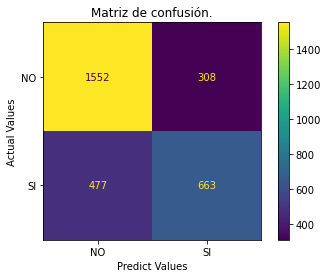

Precision,Recall,Accuracy,F1
0.68,0.58,0.74,0.63


In [14]:
model = lgb.LGBMClassifier(objective="binary", **study.best_params)
model = model.fit(
            X_train,
            y_train,
            eval_set=[(X_test, y_test)],
            eval_metric="binary_logloss",
            #eval_metric="auc",
            early_stopping_rounds=100,
            verbose=0
            
        )
y_pred = model.predict(X_test)
lgbm_precision_score_auc, lgbm_recall_score_auc, lgbm_accuracy_score_auc, lgbm_f1_score_auc = evaluate_model('lgbm grid search', y_test, y_pred)


#binarylogloss\
#con 20\
0.90	0.61	0.96	0.73\
#con 200\
0.90	0.66	0.96	0.76\
#con 400\
0.92	0.70	0.97	0.79\
#con 2000\
	Best value (rmse): 0.09074
	Best params:
		n_estimators: 10000
		learning_rate: 0.02301637191691366
		num_leaves: 488
		max_depth: 11
		min_data_in_leaf: 200
		lambda_l1: 0.18191557593992602
		lambda_l2: 1.8611934831089167
		min_gain_to_split: 0.24644752400202993
		bagging_fraction: 0.9
		bagging_freq: 1
		feature_fraction: 0.6000000000000001

\
\
#auc\

In [15]:
from IPython.display import Markdown as md
md(f'''| Algorithm     | Precision     | Recall        | Accuracy      | F1            |
| ------------- | ------------- | ------------- | ------------- | ------------- |
| Arboles de decision  |{dt_precision_score:.3f}|	{dt_recall_score:.3f}|	{dt_accuracy_score:.3f}|	{dt_f1_score:.3f}|
|Random Forest       |{rf_precision_score:.3f} |	{rf_recall_score:.3f}|	{rf_accuracy_score:.3f}|	{rf_f1_score:.3f}|
|    SVM_sigmoid        | {svm_precision_score_sigmoid:.3f} |	{svm_recall_score_sigmoid:.3f}|	{svm_accuracy_score_sigmoid:.3f}|	{svm_f1_score_sigmoid:.3f}|
|    SVM_rbf        | {svm_precision_score_rbf:.3f} |	{svm_recall_score_rbf:.3f}|	{svm_accuracy_score_rbf:.3f}|	{svm_f1_score_rbf:.3f}|
| LightGBM_optuna      |{lgbm_precision_score_auc:.3f}|	{lgbm_recall_score_auc:.3f}|	{lgbm_accuracy_score_auc:.3f}|	{lgbm_f1_score_auc:.3f}|
'''
       )

| Algorithm     | Precision     | Recall        | Accuracy      | F1            |
| ------------- | ------------- | ------------- | ------------- | ------------- |
| Arboles de decision  |0.664|	0.546|	0.723|	0.600|
|Random Forest       |0.751 |	0.358|	0.711|	0.485|
|    SVM_sigmoid        | 0.000 |	0.000|	0.620|	0.000|
|    SVM_rbf        | 0.000 |	0.000|	0.620|	0.000|
| LightGBM_optuna      |0.683|	0.582|	0.738|	0.628|
